In [1]:
import csv
import numpy as np
import matplotlib.pyplot as plt
import numpy.typing as npt
import torch as th

In [2]:
from chromalab.observer import Observer, Cone


In [3]:
from chromalab.observer import Observer, Cone
from chromalab.inks import Neugebauer, InkGamut, CellNeugebauer, Pigment
from chromalab.spectra import Spectra, Illuminant

In [4]:
from chromalab.inks import InkLibrary

In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
wavelengths4 = np.arange(380, 781, 4)
wavelengths1 = np.arange(390, 701, 1)
wavelengths10 = np.arange(400, 701, 10)

In [7]:
elevator_illuminant = Spectra(data=np.load("../data/illuminants/elevator.npy"), wavelengths=wavelengths4)

In [8]:
tetrachromat_elevator = Observer.tetrachromat(wavelengths=wavelengths10,illuminant=elevator_illuminant)

/Users/varun/Documents/Python/ChromaLab/chromalab/spectra.py:35: UserWarning: Data has values not between 0 and 1. Clipping.
  warnings.warn("Data has values not between 0 and 1. Clipping.")


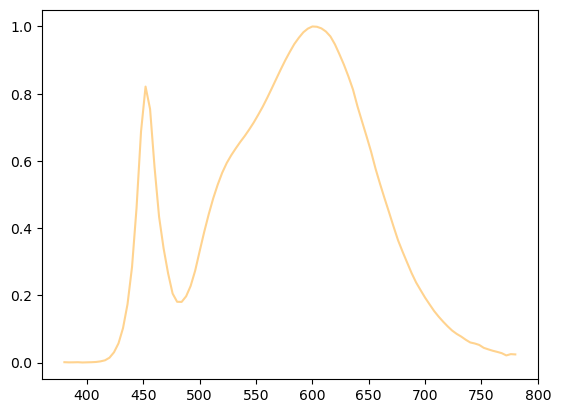

In [9]:
elevator_illuminant.plot()

## Load cell neug

In [10]:
cell_primaries = {}
with open(f'../data/nix/11cell.csv') as csvf:
    spamreader = csv.reader(csvf, delimiter=';')
    for i, row in enumerate(spamreader):
        if i < 4: continue
            
        name = row[4]
        color_data = np.array(row[33:],dtype=float)
        spectra = Spectra(data=color_data, wavelengths=wavelengths10)
    
        cell_primaries[name]  = spectra

## Finding best yule-nielsen with cell neug and some samples.

In [27]:
samples = {}
with open(f'../data/nix/15.csv') as csvf:
    spamreader = csv.reader(csvf, delimiter=';')
    for i, row in enumerate(spamreader):
        if i < 4: continue
            
        name = row[4]
        color_data = np.array(row[33:],dtype=float)
        spectra = Spectra(data=color_data, wavelengths=wavelengths10)
    
        samples[name]  = spectra

In [28]:
samples

{'33,33,33,00': <chromalab.spectra.Spectra at 0x31b250410>,
 '66,66,66,33': <chromalab.spectra.Spectra at 0x31b250050>,
 '33,33,33,66': <chromalab.spectra.Spectra at 0x31b2500d0>,
 '66,66,66,00': <chromalab.spectra.Spectra at 0x31ae9e150>,
 '33,33,33,33': <chromalab.spectra.Spectra at 0x31b251f10>,
 '66,66,66,66': <chromalab.spectra.Spectra at 0x31ae9df90>,
 '33,66,66,66': <chromalab.spectra.Spectra at 0x31b250750>,
 '66,33,33,00': <chromalab.spectra.Spectra at 0x31ae9dc10>,
 '33,00,00,33': <chromalab.spectra.Spectra at 0x31b251cd0>,
 'Outside': <chromalab.spectra.Spectra at 0x31ae9fa50>,
 'Inside': <chromalab.spectra.Spectra at 0x31b253f10>}

In [13]:
for n in np.arange(1, 5, 0.1):
    scores = []
    for k, s in samples.items():
        perc = np.array(k.split(','),dtype=float) / 100
        neug = CellNeugebauer(cell_primaries, n=n)
        data = s.data
        sample = neug.mix(perc)
        score = np.sum(np.square((data - sample)))
        scores.append(score)
    print("n: ", n, "\t",np.sum(scores), "\t",np.round(scores,2))


n:  1.0 	 0.316638023223 	 [ 0.03  0.05  0.04  0.06  0.03  0.05  0.01  0.03  0.01]
n:  1.1 	 0.297463250927 	 [ 0.03  0.05  0.04  0.06  0.03  0.05  0.01  0.03  0.01]
n:  1.2 	 0.285121018884 	 [ 0.03  0.05  0.04  0.05  0.03  0.05  0.01  0.02  0.01]
n:  1.3 	 0.27719529053 	 [ 0.03  0.04  0.04  0.05  0.04  0.04  0.01  0.02  0.01]
n:  1.4 	 0.272194900822 	 [ 0.03  0.04  0.04  0.05  0.04  0.04  0.    0.02  0.01]
n:  1.5 	 0.269170113013 	 [ 0.03  0.04  0.04  0.05  0.04  0.04  0.    0.02  0.01]
n:  1.6 	 0.26749965628 	 [ 0.03  0.04  0.04  0.05  0.04  0.04  0.    0.02  0.01]
n:  1.7 	 0.266767772762 	 [ 0.03  0.04  0.04  0.05  0.04  0.04  0.    0.02  0.01]
n:  1.8 	 0.266690785191 	 [ 0.03  0.04  0.04  0.04  0.04  0.04  0.    0.02  0.01]
n:  1.9 	 0.26707191566 	 [ 0.03  0.04  0.04  0.04  0.04  0.04  0.    0.02  0.01]
n:  2.0 	 0.267772746876 	 [ 0.03  0.04  0.04  0.04  0.05  0.04  0.    0.02  0.01]
n:  2.1 	 0.268694770895 	 [ 0.03  0.03  0.04  0.04  0.05  0.04  0.    0.02  0.01]
n:  2.2

In [15]:
cell_neugebauer = CellNeugebauer(cell_primaries,n=1.8)

## Metamers

In [16]:
gamut = InkGamut(cell_neugebauer, illuminant=elevator_illuminant)

In [19]:
gamut.get_width(tetrachromat_elevator, stepsize=0.02)

Generating point cloud: 5it [00:00,  5.93it/s]                                                 
Generating point cloud: 5it [00:00,  5.71it/s]                                                 
Generating point cloud: 5it [00:00,  5.99it/s]                                                 
Generating point cloud: 5it [00:00,  6.23it/s]                                                 
Generating point cloud: 5it [00:00,  6.13it/s]                                                 
Generating point cloud: 5it [00:00,  6.09it/s]                                                 
Generating point cloud: 5it [00:00,  5.70it/s]                                                 
Generating point cloud: 5it [00:00,  5.92it/s]                                                 
Generating point cloud: 5it [00:00,  5.74it/s]                                                 
Generating point cloud: 5it [00:00,  5.77it/s]                                                 
Generating point cloud: 5it [00:00,  5.8

Point cloud generated.
maximum distance is 2.0 with percentages (0.0, 0.10000000000000001, 0.38, 0.85999999999999999) and (0.22, 1.0, 0.0, 0.02)


2.0

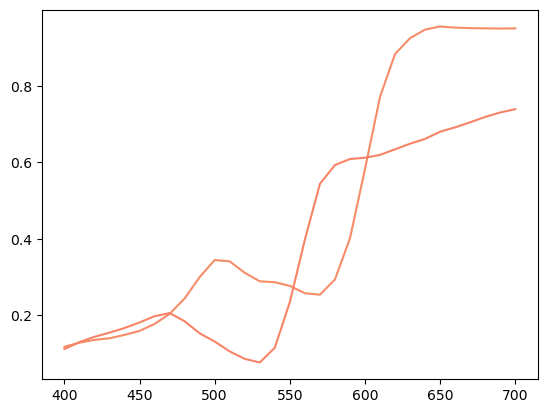

In [23]:
gamut.get_spectra((0, 0.1, 0.38, 0.86)).plot()
gamut.get_spectra((0.22, 1, 0, 0.02)).plot()

In [24]:
tetrachromat_elevator.observe(gamut.get_spectra((0, 0.1, 0.38, 0.86)))

array([ 0.18110248,  0.34243971,  0.39476085,  0.45521242])

In [25]:
tetrachromat_elevator.observe(gamut.get_spectra((0.22, 1, 0, 0.02)))

array([ 0.18092295,  0.34483096,  0.4100392 ,  0.45886592])

In [26]:
0.41 - 0.39

0.019999999999999962

In [38]:
tetrachromat_elevator.observe(gamut.get_spectra((0.1,0.35,0.3,0.75)))

array([ 0.21498575,  0.35013357,  0.39437363,  0.44198047])

In [39]:
tetrachromat_elevator.observe(gamut.get_spectra((0.25, 0.85, 0, 0.35)))

array([ 0.21481604,  0.35476714,  0.40560591,  0.44445773])

In [40]:
0.40560591 - 0.394

0.011605909999999997

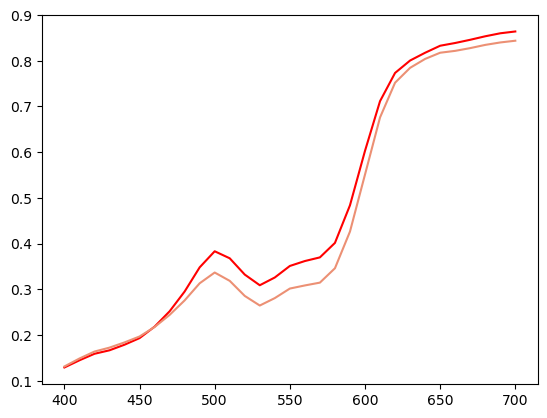

In [33]:
samples["Outside"].plot(color='red')
gamut.get_spectra((0.1,0.35,0.3,0.75)).plot()

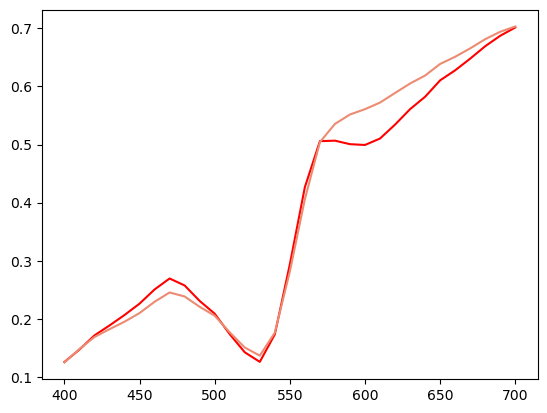

In [40]:
samples["Inside"].plot(color='red')
gamut.get_spectra((0.25, 0.85, 0, 0.35)).plot()

In [38]:
tetrachromat_elevator.observe(samples["Inside"])

array([ 0.23097707,  0.34439527,  0.38798552,  0.42079071])

In [37]:
tetrachromat_elevator.observe(samples["Outside"])

array([ 0.21761795,  0.39719611,  0.44100018,  0.48672614])

In [46]:
b = gamut.get_buckets(tetrachromat_elevator, stepsize=0.025)

Generating point cloud: 2it [00:00,  5.71it/s]                                                 
Generating point cloud: 2it [00:00,  5.45it/s]                                                 
Generating point cloud: 2it [00:00,  5.61it/s]                                                 
Generating point cloud: 2it [00:00,  4.14it/s]                                                 
Generating point cloud: 2it [00:00,  5.21it/s]                                                 
Generating point cloud: 2it [00:00,  5.41it/s]                                                 
Generating point cloud: 2it [00:00,  5.76it/s]                                                 
Generating point cloud: 2it [00:00,  3.68it/s]                                                 
Generating point cloud: 2it [00:00,  4.91it/s]                                                 
Generating point cloud: 2it [00:00,  5.18it/s]                                                 
Generating point cloud: 2it [00:00,  5.7

Point cloud generated.


In [55]:
import time

In [60]:
for d, (perc1, perc2) in b:
    print(list(100 * np.round(perc1,3)), ",", list(100* np.round(perc2,3)), ",")
    time.sleep(0.01)
    

[32.5, 25.0, 50.0, 75.0] , [47.5, 95.0, 5.0, 5.0] ,
[32.5, 20.0, 47.5, 80.0] , [47.5, 95.0, 0.0, 17.5] ,
[32.5, 17.5, 50.0, 80.0] , [47.5, 95.0, 2.5, 17.5] ,
[32.5, 15.0, 52.5, 80.0] , [47.5, 95.0, 5.0, 17.5] ,
[32.5, 12.5, 50.0, 77.5] , [47.5, 95.0, 2.5, 5.0] ,
[30.0, 25.0, 47.5, 90.0] , [45.0, 100.0, 0.0, 40.0] ,
[30.0, 22.5, 50.0, 90.0] , [45.0, 100.0, 2.5, 40.0] ,
[30.0, 20.0, 52.5, 90.0] , [45.0, 100.0, 5.0, 40.0] ,
[30.0, 17.5, 50.0, 92.5] , [45.0, 100.0, 0.0, 50.0] ,
[30.0, 12.5, 50.0, 95.0] , [45.0, 100.0, 0.0, 52.5] ,
[30.0, 10.0, 52.5, 100.0] , [45.0, 97.5, 2.5, 75.0] ,
[30.0, 7.5, 52.5, 95.0] , [45.0, 100.0, 2.5, 52.5] ,
[27.500000000000004, 20.0, 50.0, 82.5] , [45.0, 100.0, 2.5, 5.0] ,
[27.500000000000004, 17.5, 45.0, 87.5] , [42.5, 92.5, 0.0, 50.0] ,
[27.500000000000004, 15.0, 52.5, 82.5] , [45.0, 100.0, 5.0, 2.5] ,
[27.500000000000004, 10.0, 52.5, 85.0] , [45.0, 100.0, 2.5, 15.0] ,
[27.500000000000004, 7.5, 55.000000000000007, 85.0] , [45.0, 100.0, 5.0, 15.0] ,
[27.500000

[12.5, 27.500000000000004, 50.0, 77.5] , [30.0, 97.5, 15.0, 0.0] ,
[12.5, 27.500000000000004, 40.0, 100.0] , [25.0, 90.0, 7.5, 85.0] ,
[12.5, 25.0, 50.0, 92.5] , [27.500000000000004, 100.0, 15.0, 55.000000000000007] ,
[12.5, 25.0, 37.5, 77.5] , [27.500000000000004, 87.5, 5.0, 32.5] ,
[12.5, 22.5, 45.0, 82.5] , [32.5, 100.0, 5.0, 0.0] ,
[12.5, 20.0, 45.0, 80.0] , [32.5, 97.5, 5.0, 0.0] ,
[12.5, 20.0, 42.5, 80.0] , [27.500000000000004, 87.5, 10.0, 40.0] ,
[12.5, 20.0, 37.5, 82.5] , [27.500000000000004, 87.5, 5.0, 45.0] ,
[12.5, 20.0, 37.5, 72.5] , [30.0, 90.0, 0.0, 5.0] ,
[12.5, 17.5, 45.0, 77.5] , [27.500000000000004, 90.0, 12.5, 22.5] ,
[12.5, 15.0, 47.5, 82.5] , [27.500000000000004, 90.0, 15.0, 37.5] ,
[12.5, 15.0, 42.5, 85.0] , [30.0, 92.5, 5.0, 37.5] ,
[12.5, 15.0, 37.5, 85.0] , [30.0, 87.5, 0.0, 50.0] ,
[12.5, 12.5, 60.0, 72.5] , [30.0, 92.5, 25.0, 2.5] ,
[12.5, 12.5, 50.0, 85.0] , [30.0, 95.0, 12.5, 30.0] ,
[12.5, 12.5, 47.5, 87.5] , [32.5, 100.0, 5.0, 20.0] ,
[12.5, 12.5, 35.0, 7

[7.5, 20.0, 42.5, 97.5] , [22.5, 95.0, 7.5, 75.0] ,
[7.5, 20.0, 40.0, 100.0] , [25.0, 100.0, 0.0, 72.5] ,
[7.5, 20.0, 35.0, 90.0] , [25.0, 95.0, 0.0, 47.5] ,
[7.5, 20.0, 30.0, 60.0] , [22.5, 72.5, 0.0, 20.0] ,
[7.5, 17.5, 50.0, 82.5] , [27.500000000000004, 100.0, 12.5, 0.0] ,
[7.5, 17.5, 47.5, 82.5] , [27.500000000000004, 97.5, 10.0, 10.0] ,
[7.5, 17.5, 42.5, 82.5] , [27.500000000000004, 97.5, 5.0, 5.0] ,
[7.5, 17.5, 40.0, 80.0] , [22.5, 87.5, 10.0, 35.0] ,
[7.5, 17.5, 37.5, 62.5] , [22.5, 80.0, 7.5, 5.0] ,
[7.5, 17.5, 37.5, 45.0] , [20.0, 67.5, 12.5, 0.0] ,
[7.5, 17.5, 32.5, 72.5] , [22.5, 80.0, 2.5, 32.5] ,
[7.5, 17.5, 32.5, 70.0] , [22.5, 80.0, 2.5, 25.0] ,
[7.5, 15.0, 52.5, 87.5] , [27.500000000000004, 100.0, 15.0, 17.5] ,
[7.5, 15.0, 42.5, 80.0] , [22.5, 87.5, 12.5, 35.0] ,
[7.5, 15.0, 40.0, 95.0] , [27.500000000000004, 100.0, 0.0, 50.0] ,
[7.5, 15.0, 40.0, 87.5] , [27.500000000000004, 100.0, 0.0, 20.0] ,
[7.5, 15.0, 35.0, 75.0] , [25.0, 87.5, 0.0, 17.5] ,
[7.5, 15.0, 35.0, 67.5] 

[5.0, 7.5, 45.0, 100.0] , [25.0, 100.0, 2.5, 70.0] ,
[5.0, 7.5, 45.0, 72.5] , [22.5, 87.5, 12.5, 5.0] ,
[5.0, 7.5, 42.5, 82.5] , [25.0, 95.0, 5.0, 15.0] ,
[5.0, 7.5, 40.0, 80.0] , [22.5, 85.0, 7.5, 35.0] ,
[5.0, 7.5, 40.0, 77.5] , [22.5, 85.0, 7.5, 27.500000000000004] ,
[5.0, 7.5, 40.0, 75.0] , [25.0, 90.0, 2.5, 5.0] ,
[5.0, 7.5, 37.5, 65.0] , [22.5, 75.0, 5.0, 20.0] ,
[5.0, 7.5, 35.0, 77.5] , [22.5, 80.0, 2.5, 40.0] ,
[5.0, 5.0, 60.0, 85.0] , [22.5, 95.0, 27.500000000000004, 30.0] ,
[5.0, 5.0, 52.5, 62.5] , [20.0, 80.0, 25.0, 0.0] ,
[5.0, 5.0, 50.0, 92.5] , [22.5, 97.5, 15.0, 50.0] ,
[5.0, 5.0, 50.0, 75.0] , [22.5, 90.0, 17.5, 5.0] ,
[5.0, 5.0, 45.0, 97.5] , [22.5, 95.0, 7.5, 70.0] ,
[5.0, 5.0, 45.0, 95.0] , [25.0, 100.0, 5.0, 52.5] ,
[5.0, 5.0, 45.0, 85.0] , [25.0, 92.5, 7.5, 32.5] ,
[5.0, 5.0, 45.0, 82.5] , [22.5, 85.0, 12.5, 45.0] ,
[5.0, 5.0, 42.5, 100.0] , [20.0, 87.5, 7.5, 85.0] ,
[5.0, 5.0, 42.5, 87.5] , [27.500000000000004, 100.0, 0.0, 12.5] ,
[5.0, 5.0, 42.5, 80.0] , [22.5, 8

[2.5, 10.0, 45.0, 77.5] , [22.5, 92.5, 10.0, 5.0] ,
[2.5, 10.0, 42.5, 92.5] , [22.5, 100.0, 5.0, 42.5] ,
[2.5, 10.0, 40.0, 100.0] , [20.0, 97.5, 2.5, 72.5] ,
[2.5, 10.0, 40.0, 97.5] , [17.5, 92.5, 7.5, 72.5] ,
[2.5, 10.0, 40.0, 92.5] , [22.5, 97.5, 2.5, 50.0] ,
[2.5, 10.0, 40.0, 67.5] , [17.5, 77.5, 12.5, 20.0] ,
[2.5, 10.0, 37.5, 92.5] , [22.5, 100.0, 0.0, 40.0] ,
[2.5, 10.0, 37.5, 85.0] , [20.0, 90.0, 5.0, 40.0] ,
[2.5, 10.0, 37.5, 82.5] , [17.5, 82.5, 10.0, 50.0] ,
[2.5, 10.0, 35.0, 90.0] , [20.0, 95.0, 2.5, 42.5] ,
[2.5, 10.0, 35.0, 75.0] , [20.0, 85.0, 2.5, 22.5] ,
[2.5, 7.5, 57.499999999999993, 72.5] , [20.0, 87.5, 27.500000000000004, 12.5] ,
[2.5, 7.5, 50.0, 82.5] , [22.5, 97.5, 15.0, 2.5] ,
[2.5, 7.5, 47.5, 80.0] , [22.5, 95.0, 12.5, 2.5] ,
[2.5, 7.5, 47.5, 67.5] , [20.0, 82.5, 17.5, 5.0] ,
[2.5, 7.5, 45.0, 92.5] , [22.5, 100.0, 7.5, 45.0] ,
[2.5, 7.5, 40.0, 87.5] , [20.0, 90.0, 7.5, 50.0] ,
[2.5, 7.5, 40.0, 85.0] , [20.0, 90.0, 7.5, 40.0] ,
[2.5, 7.5, 40.0, 82.5] , [17.5, 82.5

[0.0, 25.0, 35.0, 72.5] , [17.5, 85.0, 5.0, 22.5] ,
[0.0, 25.0, 35.0, 70.0] , [17.5, 85.0, 5.0, 15.0] ,
[0.0, 25.0, 30.0, 87.5] , [15.0, 87.5, 2.5, 57.499999999999993] ,
[0.0, 25.0, 30.0, 75.0] , [17.5, 85.0, 0.0, 27.500000000000004] ,
[0.0, 22.5, 50.0, 80.0] , [17.5, 97.5, 20.0, 0.0] ,
[0.0, 22.5, 47.5, 87.5] , [17.5, 95.0, 17.5, 40.0] ,
[0.0, 22.5, 47.5, 77.5] , [17.5, 95.0, 17.5, 2.5] ,
[0.0, 22.5, 45.0, 97.5] , [12.5, 92.5, 17.5, 77.5] ,
[0.0, 22.5, 45.0, 87.5] , [17.5, 92.5, 15.0, 50.0] ,
[0.0, 22.5, 42.5, 100.0] , [15.0, 100.0, 10.0, 75.0] ,
[0.0, 22.5, 42.5, 85.0] , [17.5, 92.5, 12.5, 40.0] ,
[0.0, 22.5, 42.5, 82.5] , [17.5, 90.0, 12.5, 40.0] ,
[0.0, 22.5, 40.0, 77.5] , [17.5, 90.0, 10.0, 22.5] ,
[0.0, 22.5, 32.5, 87.5] , [15.0, 87.5, 5.0, 57.499999999999993] ,
[0.0, 20.0, 45.0, 82.5] , [17.5, 92.5, 15.0, 27.500000000000004] ,
[0.0, 20.0, 42.5, 97.5] , [15.0, 100.0, 12.5, 62.5] ,
[0.0, 20.0, 42.5, 80.0] , [17.5, 90.0, 12.5, 30.0] ,
[0.0, 20.0, 42.5, 77.5] , [12.5, 82.5, 20.0, 40

[0.0, 5.0, 32.5, 55.000000000000007] , [17.5, 70.0, 0.0, 5.0] ,
[0.0, 5.0, 30.0, 67.5] , [15.0, 70.0, 2.5, 35.0] ,
[0.0, 5.0, 30.0, 57.499999999999993] , [15.0, 62.5, 2.5, 27.500000000000004] ,
[0.0, 5.0, 30.0, 40.0] , [12.5, 55.000000000000007, 7.5, 7.5] ,
[0.0, 2.5, 57.499999999999993, 80.0] , [17.5, 92.5, 27.500000000000004, 15.0] ,
[0.0, 2.5, 55.000000000000007, 85.0] , [20.0, 97.5, 20.0, 17.5] ,
[0.0, 2.5, 50.0, 82.5] , [17.5, 87.5, 20.0, 37.5] ,
[0.0, 2.5, 47.5, 92.5] , [17.5, 95.0, 15.0, 55.000000000000007] ,
[0.0, 2.5, 47.5, 90.0] , [17.5, 95.0, 15.0, 47.5] ,
[0.0, 2.5, 47.5, 75.0] , [17.5, 85.0, 17.5, 20.0] ,
[0.0, 2.5, 47.5, 72.5] , [17.5, 85.0, 17.5, 10.0] ,
[0.0, 2.5, 45.0, 90.0] , [17.5, 95.0, 12.5, 47.5] ,
[0.0, 2.5, 45.0, 85.0] , [20.0, 95.0, 10.0, 22.5] ,
[0.0, 2.5, 42.5, 87.5] , [20.0, 95.0, 7.5, 30.0] ,
[0.0, 2.5, 42.5, 85.0] , [20.0, 95.0, 7.5, 22.5] ,
[0.0, 2.5, 42.5, 82.5] , [20.0, 90.0, 7.5, 30.0] ,
[0.0, 2.5, 42.5, 80.0] , [17.5, 85.0, 12.5, 32.5] ,
[0.0, 2.5, 42

[90.0, 2.5, 57.499999999999993, 77.5] , [97.5, 80.0, 0.0, 50.0] ,
[90.0, 0.0, 85.0, 50.0] , [95.0, 82.5, 50.0, 2.5] ,
[90.0, 0.0, 65.0, 67.5] , [95.0, 75.0, 20.0, 37.5] ,
[90.0, 0.0, 65.0, 65.0] , [90.0, 60.0, 32.5, 50.0] ,
[90.0, 0.0, 65.0, 62.5] , [92.5, 65.0, 27.500000000000004, 42.5] ,
[87.5, 72.5, 25.0, 100.0] , [92.5, 90.0, 2.5, 97.5] ,
[87.5, 67.5, 40.0, 100.0] , [97.5, 97.5, 7.5, 95.0] ,
[87.5, 45.0, 95.0, 50.0] , [92.5, 82.5, 77.5, 32.5] ,
[87.5, 37.5, 95.0, 50.0] , [97.5, 92.5, 75.0, 20.0] ,
[87.5, 35.0, 95.0, 50.0] , [95.0, 85.0, 80.0, 25.0] ,
[87.5, 20.0, 77.5, 57.499999999999993] , [87.5, 72.5, 50.0, 35.0] ,
[87.5, 20.0, 77.5, 55.000000000000007] , [90.0, 75.0, 47.5, 25.0] ,
[87.5, 20.0, 62.5, 50.0] , [97.5, 75.0, 20.0, 10.0] ,
[87.5, 20.0, 40.0, 50.0] , [92.5, 60.0, 10.0, 27.500000000000004] ,
[87.5, 17.5, 95.0, 57.499999999999993] , [95.0, 87.5, 72.5, 27.500000000000004] ,
[87.5, 17.5, 50.0, 47.5] , [97.5, 67.5, 7.5, 12.5] ,
[87.5, 15.0, 57.499999999999993, 65.0] , [92.5

[80.0, 10.0, 50.0, 50.0] , [92.5, 65.0, 0.0, 15.0] ,
[80.0, 7.5, 87.5, 75.0] , [85.0, 87.5, 50.0, 47.5] ,
[80.0, 7.5, 87.5, 67.5] , [87.5, 90.0, 50.0, 27.500000000000004] ,
[80.0, 7.5, 77.5, 55.000000000000007] , [87.5, 77.5, 40.0, 17.5] ,
[80.0, 7.5, 57.499999999999993, 65.0] , [85.0, 62.5, 22.5, 47.5] ,
[80.0, 7.5, 50.0, 42.5] , [90.0, 65.0, 5.0, 0.0] ,
[80.0, 7.5, 47.5, 50.0] , [90.0, 65.0, 2.5, 12.5] ,
[80.0, 7.5, 42.5, 60.0] , [87.5, 57.499999999999993, 2.5, 42.5] ,
[80.0, 5.0, 87.5, 77.5] , [87.5, 87.5, 45.0, 50.0] ,
[80.0, 5.0, 87.5, 75.0] , [85.0, 85.0, 50.0, 47.5] ,
[80.0, 5.0, 87.5, 72.5] , [85.0, 85.0, 50.0, 45.0] ,
[80.0, 5.0, 87.5, 70.0] , [87.5, 95.0, 50.0, 22.5] ,
[80.0, 5.0, 80.0, 42.5] , [85.0, 75.0, 50.0, 0.0] ,
[80.0, 5.0, 77.5, 60.0] , [90.0, 82.5, 35.0, 17.5] ,
[80.0, 5.0, 72.5, 67.5] , [85.0, 70.0, 35.0, 47.5] ,
[80.0, 5.0, 72.5, 65.0] , [90.0, 87.5, 27.500000000000004, 15.0] ,
[80.0, 5.0, 72.5, 62.5] , [80.0, 62.5, 45.0, 47.5] ,
[80.0, 5.0, 47.5, 80.0] , [85.0, 6

[75.0, 2.5, 50.0, 45.0] , [85.0, 62.5, 5.0, 5.0] ,
[75.0, 0.0, 75.0, 57.499999999999993] , [85.0, 80.0, 35.0, 10.0] ,
[75.0, 0.0, 72.5, 90.0] , [92.5, 100.0, 0.0, 50.0] ,
[75.0, 0.0, 70.0, 67.5] , [80.0, 65.0, 35.0, 50.0] ,
[75.0, 0.0, 65.0, 75.0] , [85.0, 80.0, 15.0, 45.0] ,
[75.0, 0.0, 50.0, 75.0] , [82.5, 60.0, 10.0, 60.0] ,
[75.0, 0.0, 45.0, 80.0] , [82.5, 65.0, 2.5, 65.0] ,
[72.5, 75.0, 25.0, 100.0] , [77.5, 92.5, 5.0, 95.0] ,
[72.5, 62.5, 85.0, 70.0] , [80.0, 100.0, 50.0, 37.5] ,
[72.5, 60.0, 85.0, 72.5] , [80.0, 97.5, 50.0, 45.0] ,
[72.5, 55.000000000000007, 67.5, 55.000000000000007] , [77.5, 77.5, 47.5, 37.5] ,
[72.5, 50.0, 75.0, 50.0] , [85.0, 90.0, 45.0, 5.0] ,
[72.5, 50.0, 50.0, 77.5] , [90.0, 100.0, 0.0, 27.500000000000004] ,
[72.5, 45.0, 47.5, 72.5] , [90.0, 100.0, 0.0, 10.0] ,
[72.5, 42.5, 77.5, 50.0] , [80.0, 82.5, 55.000000000000007, 17.5] ,
[72.5, 40.0, 50.0, 77.5] , [87.5, 95.0, 0.0, 35.0] ,
[72.5, 37.5, 50.0, 85.0] , [85.0, 90.0, 5.0, 57.499999999999993] ,
[72.5, 35.

[70.0, 7.5, 62.5, 67.5] , [77.5, 70.0, 25.0, 45.0] ,
[70.0, 7.5, 57.499999999999993, 47.5] , [80.0, 67.5, 17.5, 7.5] ,
[70.0, 7.5, 50.0, 65.0] , [80.0, 65.0, 7.5, 42.5] ,
[70.0, 7.5, 42.5, 50.0] , [80.0, 60.0, 0.0, 20.0] ,
[70.0, 7.5, 15.0, 32.5] , [72.5, 25.0, 0.0, 25.0] ,
[70.0, 5.0, 97.5, 80.0] , [82.5, 97.5, 72.5, 50.0] ,
[70.0, 5.0, 97.5, 72.5] , [82.5, 95.0, 80.0, 42.5] ,
[70.0, 5.0, 92.5, 85.0] , [82.5, 87.5, 75.0, 70.0] ,
[70.0, 5.0, 92.5, 82.5] , [80.0, 100.0, 62.5, 50.0] ,
[70.0, 5.0, 70.0, 92.5] , [75.0, 60.0, 45.0, 87.5] ,
[70.0, 5.0, 67.5, 62.5] , [80.0, 70.0, 27.500000000000004, 35.0] ,
[70.0, 5.0, 62.5, 70.0] , [77.5, 70.0, 25.0, 47.5] ,
[70.0, 5.0, 57.499999999999993, 77.5] , [80.0, 80.0, 10.0, 47.5] ,
[70.0, 5.0, 57.499999999999993, 50.0] , [85.0, 72.5, 5.0, 0.0] ,
[70.0, 5.0, 55.000000000000007, 60.0] , [82.5, 67.5, 7.5, 27.500000000000004] ,
[70.0, 2.5, 97.5, 77.5] , [82.5, 95.0, 75.0, 50.0] ,
[70.0, 2.5, 97.5, 70.0] , [82.5, 92.5, 82.5, 40.0] ,
[70.0, 2.5, 92.5, 90.

[65.0, 25.0, 65.0, 75.0] , [75.0, 82.5, 27.500000000000004, 50.0] ,
[65.0, 25.0, 60.0, 42.5] , [75.0, 72.5, 30.0, 0.0] ,
[65.0, 25.0, 47.5, 45.0] , [77.5, 70.0, 10.0, 5.0] ,
[65.0, 25.0, 45.0, 45.0] , [80.0, 72.5, 0.0, 0.0] ,
[65.0, 25.0, 42.5, 45.0] , [77.5, 70.0, 2.5, 2.5] ,
[65.0, 22.5, 80.0, 97.5] , [77.5, 90.0, 50.0, 87.5] ,
[65.0, 22.5, 47.5, 50.0] , [75.0, 62.5, 15.0, 25.0] ,
[65.0, 22.5, 45.0, 50.0] , [77.5, 67.5, 5.0, 17.5] ,
[65.0, 22.5, 42.5, 50.0] , [75.0, 65.0, 7.5, 20.0] ,
[65.0, 20.0, 80.0, 100.0] , [80.0, 85.0, 50.0, 92.5] ,
[65.0, 20.0, 55.000000000000007, 62.5] , [72.5, 65.0, 25.0, 42.5] ,
[65.0, 17.5, 60.0, 57.499999999999993] , [72.5, 65.0, 30.0, 35.0] ,
[65.0, 17.5, 52.5, 50.0] , [75.0, 60.0, 20.0, 25.0] ,
[65.0, 17.5, 50.0, 50.0] , [77.5, 65.0, 10.0, 17.5] ,
[65.0, 17.5, 47.5, 50.0] , [80.0, 70.0, 0.0, 7.5] ,
[65.0, 17.5, 45.0, 80.0] , [67.5, 47.5, 27.500000000000004, 75.0] ,
[65.0, 17.5, 32.5, 50.0] , [72.5, 52.5, 2.5, 35.0] ,
[65.0, 15.0, 72.5, 67.5] , [72.5, 75

[62.5, 10.0, 77.5, 55.000000000000007] , [72.5, 80.0, 45.0, 10.0] ,
[62.5, 10.0, 75.0, 67.5] , [72.5, 75.0, 40.0, 42.5] ,
[62.5, 10.0, 55.000000000000007, 65.0] , [67.5, 60.0, 27.500000000000004, 47.5] ,
[62.5, 10.0, 52.5, 75.0] , [75.0, 75.0, 5.0, 50.0] ,
[62.5, 10.0, 50.0, 55.000000000000007] , [77.5, 70.0, 0.0, 12.5] ,
[62.5, 10.0, 47.5, 55.000000000000007] , [75.0, 67.5, 2.5, 17.5] ,
[62.5, 10.0, 45.0, 62.5] , [75.0, 67.5, 0.0, 32.5] ,
[62.5, 10.0, 42.5, 62.5] , [72.5, 65.0, 2.5, 37.5] ,
[62.5, 10.0, 35.0, 75.0] , [67.5, 42.5, 12.5, 70.0] ,
[62.5, 7.5, 77.5, 57.499999999999993] , [75.0, 82.5, 40.0, 10.0] ,
[62.5, 7.5, 72.5, 67.5] , [70.0, 75.0, 40.0, 40.0] ,
[62.5, 7.5, 67.5, 77.5] , [72.5, 80.0, 27.500000000000004, 50.0] ,
[62.5, 7.5, 62.5, 60.0] , [75.0, 72.5, 20.0, 25.0] ,
[62.5, 7.5, 60.0, 60.0] , [75.0, 72.5, 17.5, 22.5] ,
[62.5, 7.5, 57.499999999999993, 70.0] , [75.0, 72.5, 12.5, 42.5] ,
[62.5, 7.5, 52.5, 77.5] , [70.0, 62.5, 20.0, 62.5] ,
[62.5, 7.5, 50.0, 50.0] , [75.0, 67.

[60.0, 7.5, 50.0, 95.0] , [75.0, 72.5, 2.5, 85.0] ,
[60.0, 7.5, 40.0, 67.5] , [70.0, 65.0, 0.0, 45.0] ,
[60.0, 7.5, 27.500000000000004, 82.5] , [65.0, 42.5, 5.0, 77.5] ,
[60.0, 5.0, 85.0, 82.5] , [72.5, 95.0, 47.5, 50.0] ,
[60.0, 5.0, 80.0, 95.0] , [72.5, 82.5, 50.0, 85.0] ,
[60.0, 5.0, 75.0, 65.0] , [67.5, 67.5, 45.0, 45.0] ,
[60.0, 5.0, 72.5, 97.5] , [82.5, 97.5, 17.5, 77.5] ,
[60.0, 5.0, 72.5, 65.0] , [77.5, 85.0, 25.0, 15.0] ,
[60.0, 5.0, 67.5, 75.0] , [72.5, 77.5, 25.0, 50.0] ,
[60.0, 5.0, 67.5, 50.0] , [75.0, 72.5, 25.0, 5.0] ,
[60.0, 5.0, 60.0, 62.5] , [72.5, 70.0, 17.5, 30.0] ,
[60.0, 5.0, 57.499999999999993, 62.5] , [70.0, 65.0, 20.0, 37.5] ,
[60.0, 5.0, 50.0, 57.499999999999993] , [70.0, 57.499999999999993, 12.5, 35.0] ,
[60.0, 5.0, 40.0, 70.0] , [70.0, 62.5, 0.0, 52.5] ,
[60.0, 5.0, 37.5, 70.0] , [67.5, 55.000000000000007, 5.0, 57.499999999999993] ,
[60.0, 5.0, 35.0, 75.0] , [65.0, 47.5, 10.0, 67.5] ,
[60.0, 5.0, 32.5, 80.0] , [67.5, 50.0, 2.5, 72.5] ,
[60.0, 5.0, 30.0, 80.0

[57.499999999999993, 7.5, 75.0, 90.0] , [80.0, 100.0, 15.0, 50.0] ,
[57.499999999999993, 7.5, 75.0, 57.499999999999993] , [65.0, 67.5, 47.5, 32.5] ,
[57.499999999999993, 7.5, 72.5, 57.499999999999993] , [67.5, 75.0, 40.0, 20.0] ,
[57.499999999999993, 7.5, 70.0, 70.0] , [72.5, 77.5, 27.500000000000004, 40.0] ,
[57.499999999999993, 7.5, 67.5, 70.0] , [67.5, 70.0, 32.5, 50.0] ,
[57.499999999999993, 7.5, 62.5, 57.499999999999993] , [70.0, 65.0, 25.0, 30.0] ,
[57.499999999999993, 7.5, 60.0, 87.5] , [67.5, 65.0, 27.500000000000004, 77.5] ,
[57.499999999999993, 7.5, 57.499999999999993, 60.0] , [72.5, 75.0, 10.0, 15.0] ,
[57.499999999999993, 7.5, 50.0, 55.000000000000007] , [72.5, 65.0, 2.5, 20.0] ,
[57.499999999999993, 7.5, 50.0, 47.5] , [70.0, 65.0, 7.5, 5.0] ,
[57.499999999999993, 5.0, 80.0, 80.0] , [72.5, 92.5, 37.5, 45.0] ,
[57.499999999999993, 5.0, 75.0, 92.5] , [82.5, 100.0, 12.5, 60.0] ,
[57.499999999999993, 5.0, 75.0, 60.0] , [72.5, 82.5, 35.0, 10.0] ,
[57.499999999999993, 5.0, 72.5, 

[55.000000000000007, 17.5, 62.5, 65.0] , [67.5, 77.5, 25.0, 30.0] ,
[55.000000000000007, 17.5, 57.499999999999993, 75.0] , [67.5, 77.5, 17.5, 50.0] ,
[55.000000000000007, 17.5, 55.000000000000007, 55.000000000000007] , [67.5, 65.0, 20.0, 27.500000000000004] ,
[55.000000000000007, 17.5, 52.5, 82.5] , [70.0, 87.5, 2.5, 50.0] ,
[55.000000000000007, 17.5, 50.0, 57.499999999999993] , [62.5, 60.0, 22.5, 37.5] ,
[55.000000000000007, 17.5, 45.0, 65.0] , [67.5, 70.0, 5.0, 37.5] ,
[55.000000000000007, 17.5, 42.5, 72.5] , [65.0, 62.5, 10.0, 57.499999999999993] ,
[55.000000000000007, 15.0, 85.0, 67.5] , [72.5, 95.0, 47.5, 12.5] ,
[55.000000000000007, 15.0, 72.5, 90.0] , [75.0, 100.0, 17.5, 50.0] ,
[55.000000000000007, 15.0, 70.0, 87.5] , [77.5, 97.5, 10.0, 50.0] ,
[55.000000000000007, 15.0, 67.5, 97.5] , [60.0, 57.499999999999993, 50.0, 95.0] ,
[55.000000000000007, 15.0, 60.0, 47.5] , [65.0, 62.5, 30.0, 20.0] ,
[55.000000000000007, 15.0, 57.499999999999993, 77.5] , [67.5, 85.0, 15.0, 42.5] ,
[55.0

[52.5, 55.000000000000007, 87.5, 70.0] , [62.5, 95.0, 67.5, 47.5] ,
[52.5, 55.000000000000007, 87.5, 67.5] , [65.0, 100.0, 65.0, 30.0] ,
[52.5, 55.000000000000007, 87.5, 62.5] , [65.0, 97.5, 67.5, 30.0] ,
[52.5, 52.5, 87.5, 72.5] , [65.0, 97.5, 62.5, 47.5] ,
[52.5, 52.5, 87.5, 70.0] , [65.0, 97.5, 65.0, 37.5] ,
[52.5, 52.5, 82.5, 85.0] , [67.5, 100.0, 50.0, 62.5] ,
[52.5, 47.5, 37.5, 27.500000000000004] , [57.499999999999993, 60.0, 25.0, 12.5] ,
[52.5, 40.0, 40.0, 40.0] , [60.0, 65.0, 20.0, 15.0] ,
[52.5, 37.5, 55.000000000000007, 50.0] , [67.5, 77.5, 22.5, 10.0] ,
[52.5, 35.0, 40.0, 50.0] , [62.5, 67.5, 12.5, 22.5] ,
[52.5, 30.0, 72.5, 65.0] , [65.0, 87.5, 40.0, 22.5] ,
[52.5, 30.0, 57.499999999999993, 55.000000000000007] , [65.0, 77.5, 25.0, 15.0] ,
[52.5, 30.0, 50.0, 97.5] , [72.5, 87.5, 0.0, 82.5] ,
[52.5, 30.0, 22.5, 55.000000000000007] , [57.499999999999993, 52.5, 5.0, 47.5] ,
[52.5, 27.500000000000004, 60.0, 60.0] , [62.5, 67.5, 32.5, 40.0] ,
[52.5, 27.500000000000004, 57.499999

[50.0, 50.0, 47.5, 97.5] , [65.0, 92.5, 10.0, 82.5] ,
[50.0, 50.0, 47.5, 95.0] , [67.5, 100.0, 2.5, 65.0] ,
[50.0, 50.0, 42.5, 47.5] , [62.5, 77.5, 17.5, 10.0] ,
[50.0, 47.5, 92.5, 65.0] , [65.0, 97.5, 77.5, 32.5] ,
[50.0, 47.5, 50.0, 65.0] , [70.0, 90.0, 10.0, 15.0] ,
[50.0, 47.5, 50.0, 40.0] , [60.0, 72.5, 30.0, 10.0] ,
[50.0, 47.5, 47.5, 100.0] , [65.0, 92.5, 10.0, 87.5] ,
[50.0, 47.5, 45.0, 65.0] , [70.0, 92.5, 2.5, 7.5] ,
[50.0, 45.0, 80.0, 85.0] , [62.5, 97.5, 50.0, 60.0] ,
[50.0, 45.0, 72.5, 47.5] , [60.0, 80.0, 52.5, 15.0] ,
[50.0, 45.0, 65.0, 57.499999999999993] , [62.5, 85.0, 37.5, 20.0] ,
[50.0, 45.0, 50.0, 72.5] , [72.5, 95.0, 2.5, 15.0] ,
[50.0, 45.0, 50.0, 62.5] , [70.0, 92.5, 7.5, 2.5] ,
[50.0, 45.0, 47.5, 72.5] , [67.5, 87.5, 7.5, 35.0] ,
[50.0, 42.5, 80.0, 87.5] , [62.5, 100.0, 50.0, 62.5] ,
[50.0, 42.5, 77.5, 42.5] , [62.5, 82.5, 55.000000000000007, 5.0] ,
[50.0, 42.5, 70.0, 50.0] , [60.0, 82.5, 47.5, 10.0] ,
[50.0, 42.5, 65.0, 62.5] , [60.0, 80.0, 40.0, 37.5] ,
[50.0

[50.0, 12.5, 60.0, 60.0] , [57.499999999999993, 65.0, 32.5, 35.0] ,
[50.0, 12.5, 57.499999999999993, 95.0] , [70.0, 82.5, 7.5, 80.0] ,
[50.0, 12.5, 57.499999999999993, 70.0] , [62.5, 72.5, 20.0, 42.5] ,
[50.0, 12.5, 57.499999999999993, 47.5] , [65.0, 67.5, 17.5, 7.5] ,
[50.0, 12.5, 55.000000000000007, 77.5] , [55.000000000000007, 50.0, 35.0, 70.0] ,
[50.0, 12.5, 55.000000000000007, 50.0] , [65.0, 72.5, 12.5, 0.0] ,
[50.0, 12.5, 50.0, 100.0] , [67.5, 80.0, 2.5, 90.0] ,
[50.0, 12.5, 50.0, 92.5] , [67.5, 82.5, 0.0, 72.5] ,
[50.0, 12.5, 50.0, 60.0] , [60.0, 62.5, 17.5, 35.0] ,
[50.0, 12.5, 45.0, 67.5] , [62.5, 70.0, 5.0, 40.0] ,
[50.0, 12.5, 45.0, 42.5] , [65.0, 62.5, 2.5, 2.5] ,
[50.0, 12.5, 42.5, 52.5] , [65.0, 60.0, 0.0, 25.0] ,
[50.0, 12.5, 42.5, 47.5] , [62.5, 62.5, 2.5, 12.5] ,
[50.0, 10.0, 95.0, 87.5] , [72.5, 100.0, 85.0, 72.5] ,
[50.0, 10.0, 82.5, 65.0] , [65.0, 85.0, 50.0, 22.5] ,
[50.0, 10.0, 80.0, 67.5] , [65.0, 85.0, 45.0, 27.500000000000004] ,
[50.0, 10.0, 80.0, 65.0] , [67.5

[50.0, 0.0, 60.0, 72.5] , [60.0, 67.5, 25.0, 50.0] ,
[50.0, 0.0, 60.0, 60.0] , [67.5, 67.5, 12.5, 25.0] ,
[50.0, 0.0, 60.0, 55.000000000000007] , [65.0, 70.0, 15.0, 10.0] ,
[50.0, 0.0, 57.499999999999993, 100.0] , [70.0, 80.0, 7.5, 90.0] ,
[50.0, 0.0, 57.499999999999993, 62.5] , [67.5, 70.0, 7.5, 25.0] ,
[50.0, 0.0, 55.000000000000007, 87.5] , [60.0, 60.0, 22.5, 77.5] ,
[50.0, 0.0, 55.000000000000007, 65.0] , [60.0, 60.0, 20.0, 42.5] ,
[50.0, 0.0, 52.5, 67.5] , [60.0, 57.499999999999993, 17.5, 50.0] ,
[50.0, 0.0, 50.0, 100.0] , [65.0, 75.0, 5.0, 90.0] ,
[50.0, 0.0, 37.5, 37.5] , [57.499999999999993, 45.0, 7.5, 12.5] ,
[50.0, 0.0, 35.0, 87.5] , [60.0, 55.000000000000007, 0.0, 80.0] ,
[50.0, 0.0, 32.5, 30.0] , [60.0, 40.0, 0.0, 5.0] ,
[47.5, 67.5, 50.0, 100.0] , [57.499999999999993, 100.0, 22.5, 87.5] ,
[47.5, 67.5, 42.5, 100.0] , [57.499999999999993, 95.0, 15.0, 92.5] ,
[47.5, 65.0, 70.0, 37.5] , [52.5, 87.5, 55.000000000000007, 5.0] ,
[47.5, 62.5, 47.5, 100.0] , [57.499999999999993, 95

[47.5, 22.5, 50.0, 80.0] , [65.0, 85.0, 0.0, 47.5] ,
[47.5, 22.5, 50.0, 62.5] , [55.000000000000007, 70.0, 22.5, 35.0] ,
[47.5, 22.5, 47.5, 70.0] , [60.0, 70.0, 12.5, 50.0] ,
[47.5, 22.5, 47.5, 42.5] , [57.499999999999993, 65.0, 17.5, 7.5] ,
[47.5, 22.5, 45.0, 35.0] , [55.000000000000007, 62.5, 20.0, 0.0] ,
[47.5, 22.5, 42.5, 47.5] , [62.5, 72.5, 0.0, 0.0] ,
[47.5, 22.5, 40.0, 50.0] , [57.499999999999993, 65.0, 7.5, 20.0] ,
[47.5, 22.5, 37.5, 57.499999999999993] , [55.000000000000007, 57.499999999999993, 12.5, 42.5] ,
[47.5, 22.5, 32.5, 65.0] , [50.0, 42.5, 20.0, 60.0] ,
[47.5, 20.0, 87.5, 80.0] , [62.5, 97.5, 57.499999999999993, 47.5] ,
[47.5, 20.0, 55.000000000000007, 87.5] , [50.0, 60.0, 37.5, 80.0] ,
[47.5, 20.0, 50.0, 82.5] , [65.0, 82.5, 0.0, 57.499999999999993] ,
[47.5, 20.0, 50.0, 80.0] , [65.0, 87.5, 0.0, 40.0] ,
[47.5, 20.0, 50.0, 72.5] , [65.0, 87.5, 0.0, 22.5] ,
[47.5, 20.0, 47.5, 87.5] , [62.5, 77.5, 5.0, 70.0] ,
[47.5, 20.0, 45.0, 50.0] , [60.0, 67.5, 7.5, 15.0] ,
[47.5, 

[47.5, 5.0, 55.000000000000007, 72.5] , [57.499999999999993, 67.5, 20.0, 50.0] ,
[47.5, 5.0, 52.5, 57.499999999999993] , [60.0, 65.0, 12.5, 25.0] ,
[47.5, 5.0, 50.0, 97.5] , [65.0, 80.0, 0.0, 82.5] ,
[47.5, 5.0, 50.0, 80.0] , [62.5, 82.5, 0.0, 45.0] ,
[47.5, 5.0, 50.0, 60.0] , [57.499999999999993, 60.0, 15.0, 35.0] ,
[47.5, 5.0, 47.5, 97.5] , [62.5, 75.0, 2.5, 85.0] ,
[47.5, 5.0, 42.5, 67.5] , [60.0, 67.5, 0.0, 40.0] ,
[47.5, 5.0, 40.0, 100.0] , [57.499999999999993, 65.0, 5.0, 95.0] ,
[47.5, 5.0, 40.0, 72.5] , [57.499999999999993, 60.0, 5.0, 57.499999999999993] ,
[47.5, 5.0, 37.5, 77.5] , [55.000000000000007, 50.0, 10.0, 70.0] ,
[47.5, 5.0, 37.5, 57.499999999999993] , [55.000000000000007, 47.5, 10.0, 45.0] ,
[47.5, 5.0, 35.0, 60.0] , [57.499999999999993, 55.000000000000007, 0.0, 42.5] ,
[47.5, 5.0, 25.0, 87.5] , [52.5, 45.0, 2.5, 82.5] ,
[47.5, 5.0, 25.0, 27.500000000000004] , [52.5, 32.5, 5.0, 12.5] ,
[47.5, 2.5, 87.5, 85.0] , [65.0, 100.0, 50.0, 50.0] ,
[47.5, 2.5, 85.0, 82.5] , [62.

[45.0, 37.5, 52.5, 57.499999999999993] , [50.0, 72.5, 32.5, 32.5] ,
[45.0, 37.5, 50.0, 90.0] , [60.0, 87.5, 10.0, 70.0] ,
[45.0, 37.5, 50.0, 82.5] , [62.5, 100.0, 2.5, 22.5] ,
[45.0, 37.5, 50.0, 80.0] , [57.499999999999993, 90.0, 12.5, 45.0] ,
[45.0, 37.5, 50.0, 60.0] , [65.0, 87.5, 5.0, 2.5] ,
[45.0, 37.5, 47.5, 90.0] , [57.499999999999993, 87.5, 10.0, 70.0] ,
[45.0, 37.5, 47.5, 70.0] , [55.000000000000007, 87.5, 15.0, 27.500000000000004] ,
[45.0, 37.5, 45.0, 97.5] , [55.000000000000007, 77.5, 15.0, 90.0] ,
[45.0, 37.5, 30.0, 100.0] , [50.0, 72.5, 5.0, 95.0] ,
[45.0, 35.0, 62.5, 47.5] , [52.5, 77.5, 40.0, 7.5] ,
[45.0, 35.0, 60.0, 50.0] , [55.000000000000007, 80.0, 32.5, 5.0] ,
[45.0, 35.0, 57.499999999999993, 50.0] , [55.000000000000007, 80.0, 30.0, 5.0] ,
[45.0, 35.0, 52.5, 62.5] , [55.000000000000007, 80.0, 22.5, 27.500000000000004] ,
[45.0, 35.0, 50.0, 92.5] , [62.5, 92.5, 2.5, 70.0] ,
[45.0, 35.0, 50.0, 82.5] , [60.0, 90.0, 7.5, 50.0] ,
[45.0, 35.0, 50.0, 72.5] , [57.499999999999

[45.0, 15.0, 50.0, 92.5] , [57.499999999999993, 85.0, 7.5, 72.5] ,
[45.0, 15.0, 50.0, 72.5] , [62.5, 85.0, 0.0, 22.5] ,
[45.0, 15.0, 47.5, 62.5] , [50.0, 62.5, 22.5, 42.5] ,
[45.0, 15.0, 47.5, 42.5] , [55.000000000000007, 65.0, 15.0, 2.5] ,
[45.0, 15.0, 42.5, 42.5] , [50.0, 60.0, 17.5, 12.5] ,
[45.0, 15.0, 40.0, 57.499999999999993] , [57.499999999999993, 62.5, 2.5, 32.5] ,
[45.0, 15.0, 37.5, 55.000000000000007] , [50.0, 57.499999999999993, 12.5, 35.0] ,
[45.0, 15.0, 37.5, 35.0] , [52.5, 55.000000000000007, 10.0, 7.5] ,
[45.0, 15.0, 27.500000000000004, 55.000000000000007] , [50.0, 50.0, 5.0, 45.0] ,
[45.0, 12.5, 87.5, 70.0] , [65.0, 100.0, 50.0, 5.0] ,
[45.0, 12.5, 85.0, 70.0] , [60.0, 97.5, 52.5, 7.5] ,
[45.0, 12.5, 82.5, 72.5] , [57.499999999999993, 92.5, 50.0, 30.0] ,
[45.0, 12.5, 82.5, 70.0] , [57.499999999999993, 95.0, 50.0, 15.0] ,
[45.0, 12.5, 80.0, 87.5] , [65.0, 100.0, 35.0, 50.0] ,
[45.0, 12.5, 80.0, 70.0] , [55.000000000000007, 90.0, 50.0, 25.0] ,
[45.0, 12.5, 75.0, 85.0] , [

[45.0, 5.0, 47.5, 57.499999999999993] , [55.000000000000007, 60.0, 12.5, 32.5] ,
[45.0, 5.0, 45.0, 77.5] , [57.499999999999993, 77.5, 0.0, 47.5] ,
[45.0, 5.0, 45.0, 72.5] , [55.000000000000007, 70.0, 7.5, 47.5] ,
[45.0, 5.0, 45.0, 60.0] , [55.000000000000007, 60.0, 10.0, 35.0] ,
[45.0, 5.0, 45.0, 42.5] , [57.499999999999993, 60.0, 5.0, 5.0] ,
[45.0, 5.0, 42.5, 92.5] , [57.499999999999993, 72.5, 0.0, 80.0] ,
[45.0, 5.0, 42.5, 87.5] , [55.000000000000007, 70.0, 5.0, 72.5] ,
[45.0, 5.0, 42.5, 82.5] , [55.000000000000007, 57.499999999999993, 10.0, 72.5] ,
[45.0, 5.0, 42.5, 65.0] , [57.499999999999993, 62.5, 2.5, 42.5] ,
[45.0, 5.0, 42.5, 47.5] , [57.499999999999993, 57.499999999999993, 2.5, 17.5] ,
[45.0, 5.0, 30.0, 75.0] , [50.0, 52.5, 5.0, 65.0] ,
[45.0, 2.5, 90.0, 75.0] , [65.0, 100.0, 57.499999999999993, 22.5] ,
[45.0, 2.5, 87.5, 75.0] , [62.5, 100.0, 52.5, 12.5] ,
[45.0, 2.5, 85.0, 77.5] , [60.0, 95.0, 50.0, 35.0] ,
[45.0, 2.5, 85.0, 75.0] , [60.0, 97.5, 50.0, 20.0] ,
[45.0, 2.5, 80.0

[42.5, 37.5, 60.0, 72.5] , [52.5, 87.5, 27.500000000000004, 37.5] ,
[42.5, 37.5, 55.000000000000007, 50.0] , [52.5, 80.0, 27.500000000000004, 2.5] ,
[42.5, 37.5, 52.5, 82.5] , [50.0, 92.5, 20.0, 47.5] ,
[42.5, 37.5, 50.0, 92.5] , [52.5, 95.0, 12.5, 67.5] ,
[42.5, 37.5, 50.0, 82.5] , [60.0, 92.5, 2.5, 45.0] ,
[42.5, 37.5, 50.0, 75.0] , [60.0, 97.5, 5.0, 7.5] ,
[42.5, 37.5, 50.0, 72.5] , [57.499999999999993, 90.0, 10.0, 25.0] ,
[42.5, 35.0, 70.0, 62.5] , [52.5, 90.0, 40.0, 12.5] ,
[42.5, 35.0, 55.000000000000007, 45.0] , [47.5, 67.5, 37.5, 20.0] ,
[42.5, 35.0, 52.5, 47.5] , [50.0, 77.5, 27.500000000000004, 2.5] ,
[42.5, 35.0, 50.0, 95.0] , [50.0, 90.0, 17.5, 77.5] ,
[42.5, 35.0, 50.0, 77.5] , [52.5, 82.5, 17.5, 50.0] ,
[42.5, 35.0, 50.0, 67.5] , [57.499999999999993, 90.0, 10.0, 10.0] ,
[42.5, 35.0, 50.0, 57.499999999999993] , [47.5, 65.0, 32.5, 40.0] ,
[42.5, 35.0, 47.5, 85.0] , [57.499999999999993, 92.5, 2.5, 50.0] ,
[42.5, 35.0, 47.5, 77.5] , [57.499999999999993, 90.0, 5.0, 35.0] ,
[42

[42.5, 17.5, 25.0, 47.5] , [47.5, 45.0, 5.0, 37.5] ,
[42.5, 15.0, 85.0, 60.0] , [55.000000000000007, 90.0, 60.0, 10.0] ,
[42.5, 15.0, 82.5, 62.5] , [55.000000000000007, 92.5, 52.5, 2.5] ,
[42.5, 15.0, 77.5, 65.0] , [52.5, 87.5, 47.5, 20.0] ,
[42.5, 15.0, 75.0, 67.5] , [50.0, 82.5, 47.5, 32.5] ,
[42.5, 15.0, 72.5, 72.5] , [65.0, 97.5, 22.5, 5.0] ,
[42.5, 15.0, 72.5, 70.0] , [50.0, 87.5, 42.5, 27.500000000000004] ,
[42.5, 15.0, 70.0, 50.0] , [50.0, 72.5, 45.0, 12.5] ,
[42.5, 15.0, 67.5, 82.5] , [50.0, 80.0, 37.5, 62.5] ,
[42.5, 15.0, 65.0, 82.5] , [47.5, 70.0, 42.5, 70.0] ,
[42.5, 15.0, 62.5, 92.5] , [45.0, 47.5, 50.0, 90.0] ,
[42.5, 15.0, 60.0, 92.5] , [47.5, 67.5, 37.5, 85.0] ,
[42.5, 15.0, 57.499999999999993, 70.0] , [50.0, 72.5, 27.500000000000004, 45.0] ,
[42.5, 15.0, 55.000000000000007, 42.5] , [50.0, 67.5, 27.500000000000004, 2.5] ,
[42.5, 15.0, 50.0, 100.0] , [57.499999999999993, 82.5, 5.0, 90.0] ,
[42.5, 15.0, 50.0, 87.5] , [52.5, 80.0, 12.5, 67.5] ,
[42.5, 15.0, 50.0, 82.5] , [

[42.5, 5.0, 55.000000000000007, 57.499999999999993] , [50.0, 62.5, 25.0, 30.0] ,
[42.5, 5.0, 50.0, 87.5] , [50.0, 62.5, 20.0, 77.5] ,
[42.5, 5.0, 50.0, 82.5] , [47.5, 60.0, 25.0, 70.0] ,
[42.5, 5.0, 50.0, 67.5] , [57.499999999999993, 80.0, 2.5, 15.0] ,
[42.5, 5.0, 50.0, 62.5] , [50.0, 65.0, 17.5, 35.0] ,
[42.5, 5.0, 50.0, 57.499999999999993] , [47.5, 57.499999999999993, 25.0, 35.0] ,
[42.5, 5.0, 50.0, 47.5] , [55.000000000000007, 65.0, 10.0, 5.0] ,
[42.5, 5.0, 47.5, 65.0] , [52.5, 67.5, 10.0, 35.0] ,
[42.5, 5.0, 47.5, 45.0] , [52.5, 65.0, 10.0, 0.0] ,
[42.5, 5.0, 47.5, 22.5] , [45.0, 37.5, 35.0, 2.5] ,
[42.5, 5.0, 45.0, 70.0] , [55.000000000000007, 67.5, 5.0, 45.0] ,
[42.5, 5.0, 45.0, 50.0] , [52.5, 67.5, 5.0, 5.0] ,
[42.5, 5.0, 45.0, 47.5] , [50.0, 60.0, 12.5, 15.0] ,
[42.5, 5.0, 42.5, 55.000000000000007] , [52.5, 62.5, 5.0, 25.0] ,
[42.5, 5.0, 40.0, 72.5] , [50.0, 70.0, 5.0, 47.5] ,
[42.5, 5.0, 40.0, 57.499999999999993] , [52.5, 62.5, 2.5, 27.500000000000004] ,
[42.5, 5.0, 40.0, 42.5

[40.0, 47.5, 47.5, 75.0] , [55.000000000000007, 97.5, 7.5, 12.5] ,
[40.0, 47.5, 45.0, 75.0] , [52.5, 97.5, 7.5, 12.5] ,
[40.0, 47.5, 35.0, 47.5] , [47.5, 80.0, 10.0, 0.0] ,
[40.0, 47.5, 32.5, 62.5] , [47.5, 77.5, 7.5, 35.0] ,
[40.0, 45.0, 82.5, 82.5] , [50.0, 95.0, 57.499999999999993, 60.0] ,
[40.0, 45.0, 80.0, 75.0] , [52.5, 100.0, 47.5, 30.0] ,
[40.0, 45.0, 60.0, 50.0] , [47.5, 85.0, 37.5, 0.0] ,
[40.0, 45.0, 57.499999999999993, 50.0] , [47.5, 85.0, 35.0, 0.0] ,
[40.0, 45.0, 50.0, 87.5] , [50.0, 92.5, 15.0, 60.0] ,
[40.0, 45.0, 50.0, 80.0] , [52.5, 97.5, 10.0, 30.0] ,
[40.0, 45.0, 50.0, 77.5] , [52.5, 95.0, 12.5, 30.0] ,
[40.0, 45.0, 47.5, 67.5] , [50.0, 95.0, 15.0, 0.0] ,
[40.0, 45.0, 45.0, 80.0] , [52.5, 97.5, 5.0, 22.5] ,
[40.0, 45.0, 30.0, 62.5] , [47.5, 80.0, 2.5, 27.500000000000004] ,
[40.0, 45.0, 20.0, 50.0] , [45.0, 67.5, 0.0, 27.500000000000004] ,
[40.0, 42.5, 82.5, 85.0] , [50.0, 95.0, 57.499999999999993, 65.0] ,
[40.0, 42.5, 50.0, 90.0] , [52.5, 100.0, 7.5, 50.0] ,
[40.0, 

[40.0, 17.5, 62.5, 47.5] , [47.5, 70.0, 37.5, 12.5] ,
[40.0, 17.5, 60.0, 95.0] , [50.0, 87.5, 22.5, 77.5] ,
[40.0, 17.5, 60.0, 82.5] , [47.5, 67.5, 35.0, 70.0] ,
[40.0, 17.5, 60.0, 75.0] , [47.5, 80.0, 30.0, 47.5] ,
[40.0, 17.5, 57.499999999999993, 55.000000000000007] , [50.0, 75.0, 25.0, 12.5] ,
[40.0, 17.5, 55.000000000000007, 85.0] , [45.0, 60.0, 35.0, 77.5] ,
[40.0, 17.5, 52.5, 85.0] , [50.0, 90.0, 12.5, 50.0] ,
[40.0, 17.5, 52.5, 60.0] , [47.5, 70.0, 25.0, 27.500000000000004] ,
[40.0, 17.5, 50.0, 100.0] , [50.0, 92.5, 7.5, 85.0] ,
[40.0, 17.5, 50.0, 80.0] , [52.5, 85.0, 7.5, 47.5] ,
[40.0, 17.5, 50.0, 75.0] , [52.5, 85.0, 7.5, 32.5] ,
[40.0, 17.5, 50.0, 62.5] , [52.5, 80.0, 10.0, 12.5] ,
[40.0, 17.5, 47.5, 92.5] , [47.5, 75.0, 17.5, 80.0] ,
[40.0, 17.5, 47.5, 87.5] , [52.5, 82.5, 5.0, 65.0] ,
[40.0, 17.5, 47.5, 65.0] , [45.0, 65.0, 25.0, 45.0] ,
[40.0, 17.5, 45.0, 87.5] , [52.5, 82.5, 2.5, 65.0] ,
[40.0, 17.5, 45.0, 45.0] , [45.0, 55.000000000000007, 25.0, 25.0] ,
[40.0, 17.5, 42.

[40.0, 7.5, 32.5, 57.499999999999993] , [47.5, 52.5, 5.0, 42.5] ,
[40.0, 7.5, 30.0, 45.0] , [47.5, 52.5, 0.0, 22.5] ,
[40.0, 7.5, 25.0, 52.5] , [45.0, 40.0, 5.0, 42.5] ,
[40.0, 7.5, 22.5, 52.5] , [45.0, 45.0, 0.0, 40.0] ,
[40.0, 5.0, 92.5, 40.0] , [45.0, 65.0, 87.5, 10.0] ,
[40.0, 5.0, 87.5, 85.0] , [50.0, 97.5, 62.5, 57.499999999999993] ,
[40.0, 5.0, 85.0, 80.0] , [50.0, 100.0, 55.000000000000007, 35.0] ,
[40.0, 5.0, 85.0, 60.0] , [52.5, 85.0, 60.0, 15.0] ,
[40.0, 5.0, 80.0, 100.0] , [50.0, 97.5, 50.0, 87.5] ,
[40.0, 5.0, 80.0, 67.5] , [52.5, 87.5, 47.5, 22.5] ,
[40.0, 5.0, 77.5, 70.0] , [52.5, 90.0, 42.5, 20.0] ,
[40.0, 5.0, 75.0, 72.5] , [50.0, 85.0, 42.5, 35.0] ,
[40.0, 5.0, 75.0, 62.5] , [50.0, 87.5, 42.5, 5.0] ,
[40.0, 5.0, 72.5, 75.0] , [50.0, 80.0, 40.0, 47.5] ,
[40.0, 5.0, 72.5, 65.0] , [47.5, 80.0, 45.0, 25.0] ,
[40.0, 5.0, 70.0, 67.5] , [47.5, 75.0, 42.5, 37.5] ,
[40.0, 5.0, 70.0, 50.0] , [50.0, 75.0, 40.0, 2.5] ,
[40.0, 5.0, 67.5, 80.0] , [50.0, 85.0, 30.0, 50.0] ,
[40.0, 5

[40.0, 0.0, 45.0, 92.5] , [52.5, 77.5, 0.0, 75.0] ,
[40.0, 0.0, 45.0, 75.0] , [52.5, 77.5, 0.0, 37.5] ,
[40.0, 0.0, 45.0, 67.5] , [47.5, 60.0, 15.0, 47.5] ,
[40.0, 0.0, 45.0, 52.5] , [50.0, 60.0, 7.5, 20.0] ,
[40.0, 0.0, 45.0, 47.5] , [50.0, 65.0, 5.0, 2.5] ,
[40.0, 0.0, 42.5, 97.5] , [50.0, 75.0, 0.0, 87.5] ,
[40.0, 0.0, 42.5, 92.5] , [50.0, 75.0, 2.5, 75.0] ,
[40.0, 0.0, 40.0, 60.0] , [50.0, 60.0, 2.5, 35.0] ,
[40.0, 0.0, 37.5, 90.0] , [45.0, 50.0, 15.0, 85.0] ,
[40.0, 0.0, 37.5, 72.5] , [47.5, 57.499999999999993, 7.5, 57.499999999999993] ,
[40.0, 0.0, 37.5, 62.5] , [50.0, 60.0, 0.0, 40.0] ,
[40.0, 0.0, 35.0, 32.5] , [47.5, 45.0, 7.5, 7.5] ,
[40.0, 0.0, 30.0, 65.0] , [47.5, 55.000000000000007, 0.0, 50.0] ,
[40.0, 0.0, 30.0, 32.5] , [47.5, 47.5, 0.0, 5.0] ,
[37.5, 80.0, 45.0, 100.0] , [42.5, 97.5, 27.500000000000004, 95.0] ,
[37.5, 55.000000000000007, 42.5, 100.0] , [47.5, 95.0, 7.5, 87.5] ,
[37.5, 55.000000000000007, 40.0, 100.0] , [45.0, 87.5, 12.5, 92.5] ,
[37.5, 52.5, 37.5, 100.0]

[37.5, 22.5, 50.0, 67.5] , [50.0, 82.5, 10.0, 22.5] ,
[37.5, 22.5, 47.5, 85.0] , [47.5, 90.0, 10.0, 50.0] ,
[37.5, 22.5, 47.5, 67.5] , [52.5, 87.5, 2.5, 7.5] ,
[37.5, 22.5, 47.5, 52.5] , [47.5, 75.0, 15.0, 5.0] ,
[37.5, 22.5, 45.0, 55.000000000000007] , [50.0, 77.5, 5.0, 5.0] ,
[37.5, 22.5, 42.5, 57.499999999999993] , [45.0, 65.0, 17.5, 32.5] ,
[37.5, 22.5, 40.0, 60.0] , [45.0, 70.0, 12.5, 30.0] ,
[37.5, 22.5, 37.5, 75.0] , [47.5, 77.5, 2.5, 47.5] ,
[37.5, 22.5, 35.0, 47.5] , [45.0, 65.0, 7.5, 15.0] ,
[37.5, 22.5, 35.0, 40.0] , [45.0, 60.0, 10.0, 12.5] ,
[37.5, 20.0, 70.0, 87.5] , [50.0, 100.0, 27.500000000000004, 45.0] ,
[37.5, 20.0, 67.5, 87.5] , [50.0, 100.0, 25.0, 42.5] ,
[37.5, 20.0, 57.499999999999993, 67.5] , [47.5, 80.0, 25.0, 30.0] ,
[37.5, 20.0, 55.000000000000007, 70.0] , [45.0, 77.5, 27.500000000000004, 40.0] ,
[37.5, 20.0, 55.000000000000007, 60.0] , [50.0, 85.0, 15.0, 0.0] ,
[37.5, 20.0, 52.5, 72.5] , [47.5, 77.5, 20.0, 42.5] ,
[37.5, 20.0, 50.0, 95.0] , [50.0, 100.0, 0.0

[37.5, 10.0, 47.5, 42.5] , [47.5, 65.0, 15.0, 0.0] ,
[37.5, 10.0, 45.0, 85.0] , [50.0, 82.5, 0.0, 57.499999999999993] ,
[37.5, 10.0, 45.0, 80.0] , [50.0, 82.5, 0.0, 47.5] ,
[37.5, 10.0, 45.0, 70.0] , [47.5, 72.5, 10.0, 40.0] ,
[37.5, 10.0, 45.0, 40.0] , [45.0, 62.5, 17.5, 0.0] ,
[37.5, 10.0, 45.0, 30.0] , [42.5, 50.0, 27.500000000000004, 5.0] ,
[37.5, 10.0, 42.5, 52.5] , [47.5, 65.0, 7.5, 17.5] ,
[37.5, 10.0, 40.0, 90.0] , [47.5, 70.0, 5.0, 77.5] ,
[37.5, 10.0, 37.5, 87.5] , [47.5, 72.5, 0.0, 72.5] ,
[37.5, 10.0, 37.5, 57.499999999999993] , [47.5, 67.5, 0.0, 22.5] ,
[37.5, 10.0, 32.5, 90.0] , [45.0, 65.0, 2.5, 80.0] ,
[37.5, 10.0, 27.500000000000004, 55.000000000000007] , [45.0, 52.5, 0.0, 40.0] ,
[37.5, 10.0, 22.5, 72.5] , [42.5, 50.0, 2.5, 65.0] ,
[37.5, 7.5, 87.5, 75.0] , [47.5, 92.5, 65.0, 40.0] ,
[37.5, 7.5, 85.0, 92.5] , [50.0, 95.0, 57.499999999999993, 72.5] ,
[37.5, 7.5, 82.5, 75.0] , [50.0, 100.0, 47.5, 7.5] ,
[37.5, 7.5, 77.5, 92.5] , [47.5, 85.0, 50.0, 77.5] ,
[37.5, 7.5, 77

[37.5, 2.5, 47.5, 70.0] , [47.5, 67.5, 12.5, 45.0] ,
[37.5, 2.5, 47.5, 65.0] , [47.5, 72.5, 10.0, 25.0] ,
[37.5, 2.5, 47.5, 57.499999999999993] , [50.0, 70.0, 5.0, 15.0] ,
[37.5, 2.5, 47.5, 47.5] , [47.5, 65.0, 12.5, 2.5] ,
[37.5, 2.5, 45.0, 65.0] , [50.0, 75.0, 0.0, 20.0] ,
[37.5, 2.5, 45.0, 60.0] , [47.5, 62.5, 10.0, 32.5] ,
[37.5, 2.5, 42.5, 77.5] , [45.0, 57.499999999999993, 15.0, 65.0] ,
[37.5, 2.5, 42.5, 55.000000000000007] , [47.5, 72.5, 2.5, 2.5] ,
[37.5, 2.5, 42.5, 45.0] , [47.5, 60.0, 7.5, 7.5] ,
[37.5, 2.5, 40.0, 97.5] , [40.0, 45.0, 25.0, 95.0] ,
[37.5, 2.5, 40.0, 67.5] , [47.5, 60.0, 7.5, 47.5] ,
[37.5, 2.5, 40.0, 57.499999999999993] , [45.0, 60.0, 10.0, 30.0] ,
[37.5, 2.5, 40.0, 45.0] , [47.5, 57.499999999999993, 5.0, 12.5] ,
[37.5, 2.5, 37.5, 95.0] , [47.5, 70.0, 0.0, 82.5] ,
[37.5, 2.5, 37.5, 80.0] , [42.5, 47.5, 17.5, 72.5] ,
[37.5, 2.5, 37.5, 50.0] , [47.5, 60.0, 0.0, 17.5] ,
[37.5, 2.5, 32.5, 70.0] , [45.0, 55.000000000000007, 5.0, 57.499999999999993] ,
[37.5, 2.5, 2

[35.0, 35.0, 60.0, 70.0] , [42.5, 85.0, 35.0, 37.5] ,
[35.0, 35.0, 55.000000000000007, 47.5] , [42.5, 70.0, 35.0, 17.5] ,
[35.0, 35.0, 50.0, 100.0] , [45.0, 87.5, 17.5, 87.5] ,
[35.0, 35.0, 50.0, 92.5] , [45.0, 95.0, 15.0, 65.0] ,
[35.0, 35.0, 50.0, 85.0] , [45.0, 95.0, 15.0, 47.5] ,
[35.0, 35.0, 50.0, 70.0] , [50.0, 95.0, 7.5, 0.0] ,
[35.0, 35.0, 45.0, 92.5] , [45.0, 92.5, 10.0, 67.5] ,
[35.0, 35.0, 45.0, 55.000000000000007] , [42.5, 72.5, 22.5, 22.5] ,
[35.0, 32.5, 55.000000000000007, 75.0] , [42.5, 82.5, 30.0, 47.5] ,
[35.0, 32.5, 52.5, 77.5] , [45.0, 87.5, 20.0, 42.5] ,
[35.0, 32.5, 52.5, 47.5] , [42.5, 75.0, 30.0, 5.0] ,
[35.0, 32.5, 50.0, 90.0] , [50.0, 100.0, 0.0, 42.5] ,
[35.0, 32.5, 50.0, 72.5] , [50.0, 92.5, 7.5, 10.0] ,
[35.0, 32.5, 50.0, 67.5] , [47.5, 90.0, 12.5, 7.5] ,
[35.0, 32.5, 47.5, 80.0] , [45.0, 87.5, 15.0, 45.0] ,
[35.0, 32.5, 47.5, 55.000000000000007] , [42.5, 72.5, 25.0, 20.0] ,
[35.0, 32.5, 32.5, 60.0] , [45.0, 75.0, 0.0, 25.0] ,
[35.0, 30.0, 60.0, 75.0] , [45.

[35.0, 15.0, 57.499999999999993, 87.5] , [47.5, 95.0, 15.0, 45.0] ,
[35.0, 15.0, 57.499999999999993, 60.0] , [42.5, 72.5, 32.5, 25.0] ,
[35.0, 15.0, 52.5, 67.5] , [42.5, 67.5, 27.500000000000004, 45.0] ,
[35.0, 15.0, 52.5, 50.0] , [45.0, 70.0, 22.5, 7.5] ,
[35.0, 15.0, 50.0, 97.5] , [45.0, 90.0, 12.5, 77.5] ,
[35.0, 15.0, 50.0, 85.0] , [47.5, 90.0, 7.5, 47.5] ,
[35.0, 15.0, 50.0, 75.0] , [50.0, 92.5, 2.5, 7.5] ,
[35.0, 15.0, 50.0, 70.0] , [45.0, 70.0, 20.0, 45.0] ,
[35.0, 15.0, 50.0, 50.0] , [42.5, 65.0, 25.0, 15.0] ,
[35.0, 15.0, 47.5, 92.5] , [47.5, 85.0, 5.0, 72.5] ,
[35.0, 15.0, 47.5, 45.0] , [45.0, 67.5, 17.5, 2.5] ,
[35.0, 15.0, 45.0, 97.5] , [40.0, 60.0, 25.0, 92.5] ,
[35.0, 15.0, 42.5, 75.0] , [45.0, 77.5, 7.5, 45.0] ,
[35.0, 15.0, 40.0, 90.0] , [45.0, 77.5, 5.0, 72.5] ,
[35.0, 15.0, 40.0, 57.499999999999993] , [42.5, 67.5, 12.5, 25.0] ,
[35.0, 15.0, 37.5, 82.5] , [40.0, 62.5, 17.5, 70.0] ,
[35.0, 15.0, 37.5, 72.5] , [45.0, 75.0, 2.5, 45.0] ,
[35.0, 15.0, 37.5, 60.0] , [45.0, 6

[35.0, 7.5, 45.0, 57.499999999999993] , [42.5, 65.0, 17.5, 25.0] ,
[35.0, 7.5, 45.0, 50.0] , [45.0, 57.499999999999993, 15.0, 22.5] ,
[35.0, 7.5, 42.5, 92.5] , [45.0, 80.0, 5.0, 75.0] ,
[35.0, 7.5, 42.5, 80.0] , [47.5, 75.0, 2.5, 55.000000000000007] ,
[35.0, 7.5, 42.5, 72.5] , [47.5, 80.0, 0.0, 30.0] ,
[35.0, 7.5, 42.5, 65.0] , [42.5, 65.0, 15.0, 40.0] ,
[35.0, 7.5, 42.5, 50.0] , [42.5, 52.5, 17.5, 30.0] ,
[35.0, 7.5, 42.5, 42.5] , [42.5, 55.000000000000007, 17.5, 15.0] ,
[35.0, 7.5, 40.0, 85.0] , [40.0, 55.000000000000007, 20.0, 77.5] ,
[35.0, 7.5, 40.0, 70.0] , [45.0, 67.5, 7.5, 45.0] ,
[35.0, 7.5, 40.0, 47.5] , [42.5, 60.0, 12.5, 15.0] ,
[35.0, 7.5, 37.5, 97.5] , [45.0, 75.0, 0.0, 87.5] ,
[35.0, 7.5, 35.0, 87.5] , [45.0, 65.0, 2.5, 75.0] ,
[35.0, 7.5, 35.0, 55.000000000000007] , [42.5, 57.499999999999993, 7.5, 32.5] ,
[35.0, 7.5, 32.5, 47.5] , [45.0, 55.000000000000007, 0.0, 22.5] ,
[35.0, 7.5, 30.0, 77.5] , [42.5, 55.000000000000007, 5.0, 67.5] ,
[35.0, 7.5, 27.500000000000004, 85.

[35.0, 0.0, 75.0, 82.5] , [47.5, 92.5, 37.5, 45.0] ,
[35.0, 0.0, 72.5, 85.0] , [47.5, 97.5, 32.5, 40.0] ,
[35.0, 0.0, 72.5, 75.0] , [42.5, 75.0, 47.5, 50.0] ,
[35.0, 0.0, 70.0, 100.0] , [47.5, 97.5, 30.0, 80.0] ,
[35.0, 0.0, 70.0, 95.0] , [42.5, 62.5, 50.0, 87.5] ,
[35.0, 0.0, 70.0, 87.5] , [50.0, 97.5, 22.5, 45.0] ,
[35.0, 0.0, 70.0, 80.0] , [52.5, 97.5, 22.5, 15.0] ,
[35.0, 0.0, 70.0, 77.5] , [45.0, 85.0, 37.5, 42.5] ,
[35.0, 0.0, 70.0, 62.5] , [47.5, 80.0, 35.0, 17.5] ,
[35.0, 0.0, 67.5, 100.0] , [47.5, 100.0, 25.0, 77.5] ,
[35.0, 0.0, 67.5, 90.0] , [47.5, 97.5, 25.0, 50.0] ,
[35.0, 0.0, 67.5, 87.5] , [50.0, 97.5, 20.0, 40.0] ,
[35.0, 0.0, 67.5, 82.5] , [55.000000000000007, 97.5, 15.0, 22.5] ,
[35.0, 0.0, 67.5, 80.0] , [45.0, 92.5, 32.5, 32.5] ,
[35.0, 0.0, 67.5, 57.499999999999993] , [45.0, 77.5, 37.5, 7.5] ,
[35.0, 0.0, 65.0, 100.0] , [47.5, 97.5, 22.5, 80.0] ,
[35.0, 0.0, 65.0, 90.0] , [50.0, 97.5, 15.0, 47.5] ,
[35.0, 0.0, 65.0, 82.5] , [45.0, 87.5, 30.0, 50.0] ,
[35.0, 0.0, 65.

[32.5, 35.0, 50.0, 75.0] , [45.0, 95.0, 12.5, 15.0] ,
[32.5, 35.0, 50.0, 72.5] , [42.5, 90.0, 20.0, 22.5] ,
[32.5, 35.0, 50.0, 65.0] , [42.5, 80.0, 22.5, 30.0] ,
[32.5, 35.0, 45.0, 60.0] , [42.5, 77.5, 17.5, 22.5] ,
[32.5, 35.0, 42.5, 45.0] , [37.5, 62.5, 27.500000000000004, 22.5] ,
[32.5, 35.0, 37.5, 65.0] , [45.0, 85.0, 0.0, 15.0] ,
[32.5, 35.0, 25.0, 75.0] , [40.0, 67.5, 2.5, 62.5] ,
[32.5, 32.5, 77.5, 90.0] , [45.0, 100.0, 45.0, 60.0] ,
[32.5, 32.5, 75.0, 90.0] , [42.5, 95.0, 47.5, 67.5] ,
[32.5, 32.5, 72.5, 90.0] , [42.5, 92.5, 45.0, 70.0] ,
[32.5, 32.5, 70.0, 90.0] , [42.5, 90.0, 42.5, 72.5] ,
[32.5, 32.5, 50.0, 95.0] , [37.5, 67.5, 32.5, 90.0] ,
[32.5, 32.5, 50.0, 82.5] , [45.0, 92.5, 12.5, 40.0] ,
[32.5, 32.5, 50.0, 75.0] , [42.5, 87.5, 20.0, 32.5] ,
[32.5, 32.5, 50.0, 67.5] , [40.0, 75.0, 27.500000000000004, 42.5] ,
[32.5, 32.5, 47.5, 90.0] , [47.5, 100.0, 0.0, 42.5] ,
[32.5, 32.5, 47.5, 82.5] , [45.0, 92.5, 10.0, 40.0] ,
[32.5, 32.5, 45.0, 85.0] , [45.0, 95.0, 5.0, 42.5] ,
[3

[32.5, 20.0, 32.5, 55.000000000000007] , [42.5, 67.5, 0.0, 22.5] ,
[32.5, 20.0, 30.0, 80.0] , [40.0, 67.5, 5.0, 65.0] ,
[32.5, 20.0, 30.0, 40.0] , [37.5, 45.0, 15.0, 27.500000000000004] ,
[32.5, 20.0, 25.0, 92.5] , [40.0, 62.5, 0.0, 85.0] ,
[32.5, 20.0, 20.0, 52.5] , [37.5, 50.0, 2.5, 42.5] ,
[32.5, 17.5, 80.0, 100.0] , [45.0, 97.5, 50.0, 87.5] ,
[32.5, 17.5, 70.0, 97.5] , [42.5, 87.5, 42.5, 85.0] ,
[32.5, 17.5, 70.0, 65.0] , [45.0, 90.0, 37.5, 5.0] ,
[32.5, 17.5, 67.5, 70.0] , [45.0, 92.5, 32.5, 10.0] ,
[32.5, 17.5, 65.0, 72.5] , [45.0, 87.5, 30.0, 27.500000000000004] ,
[32.5, 17.5, 62.5, 82.5] , [47.5, 100.0, 20.0, 15.0] ,
[32.5, 17.5, 62.5, 67.5] , [42.5, 85.0, 32.5, 20.0] ,
[32.5, 17.5, 60.0, 100.0] , [37.5, 67.5, 42.5, 95.0] ,
[32.5, 17.5, 60.0, 70.0] , [42.5, 82.5, 30.0, 30.0] ,
[32.5, 17.5, 60.0, 62.5] , [42.5, 82.5, 30.0, 12.5] ,
[32.5, 17.5, 57.499999999999993, 100.0] , [37.5, 65.0, 40.0, 97.5] ,
[32.5, 17.5, 57.499999999999993, 72.5] , [40.0, 77.5, 32.5, 45.0] ,
[32.5, 17.5, 

[32.5, 10.0, 50.0, 95.0] , [45.0, 92.5, 7.5, 67.5] ,
[32.5, 10.0, 50.0, 90.0] , [47.5, 97.5, 0.0, 40.0] ,
[32.5, 10.0, 50.0, 85.0] , [45.0, 90.0, 7.5, 47.5] ,
[32.5, 10.0, 50.0, 80.0] , [47.5, 85.0, 5.0, 42.5] ,
[32.5, 10.0, 50.0, 75.0] , [47.5, 87.5, 5.0, 20.0] ,
[32.5, 10.0, 50.0, 65.0] , [42.5, 70.0, 20.0, 32.5] ,
[32.5, 10.0, 47.5, 77.5] , [47.5, 90.0, 0.0, 20.0] ,
[32.5, 10.0, 47.5, 67.5] , [40.0, 67.5, 22.5, 42.5] ,
[32.5, 10.0, 47.5, 65.0] , [47.5, 82.5, 2.5, 7.5] ,
[32.5, 10.0, 45.0, 87.5] , [45.0, 82.5, 5.0, 62.5] ,
[32.5, 10.0, 45.0, 70.0] , [42.5, 70.0, 15.0, 42.5] ,
[32.5, 10.0, 45.0, 67.5] , [47.5, 80.0, 0.0, 17.5] ,
[32.5, 10.0, 45.0, 42.5] , [42.5, 65.0, 15.0, 0.0] ,
[32.5, 10.0, 42.5, 92.5] , [37.5, 52.5, 25.0, 87.5] ,
[32.5, 10.0, 42.5, 85.0] , [45.0, 80.0, 2.5, 60.0] ,
[32.5, 10.0, 42.5, 72.5] , [45.0, 77.5, 2.5, 37.5] ,
[32.5, 10.0, 42.5, 70.0] , [45.0, 72.5, 5.0, 40.0] ,
[32.5, 10.0, 42.5, 62.5] , [45.0, 77.5, 2.5, 12.5] ,
[32.5, 10.0, 42.5, 57.499999999999993] , [4

[32.5, 2.5, 72.5, 72.5] , [42.5, 77.5, 45.0, 42.5] ,
[32.5, 2.5, 70.0, 75.0] , [45.0, 87.5, 35.0, 30.0] ,
[32.5, 2.5, 70.0, 67.5] , [42.5, 85.0, 40.0, 17.5] ,
[32.5, 2.5, 65.0, 75.0] , [45.0, 87.5, 27.500000000000004, 27.500000000000004] ,
[32.5, 2.5, 65.0, 67.5] , [42.5, 80.0, 35.0, 22.5] ,
[32.5, 2.5, 62.5, 97.5] , [47.5, 100.0, 15.0, 67.5] ,
[32.5, 2.5, 62.5, 77.5] , [42.5, 82.5, 30.0, 45.0] ,
[32.5, 2.5, 62.5, 55.000000000000007] , [45.0, 77.5, 27.500000000000004, 0.0] ,
[32.5, 2.5, 60.0, 80.0] , [45.0, 82.5, 22.5, 50.0] ,
[32.5, 2.5, 60.0, 75.0] , [50.0, 92.5, 10.0, 10.0] ,
[32.5, 2.5, 60.0, 62.5] , [45.0, 77.5, 25.0, 15.0] ,
[32.5, 2.5, 60.0, 57.499999999999993] , [42.5, 72.5, 30.0, 15.0] ,
[32.5, 2.5, 60.0, 40.0] , [37.5, 47.5, 45.0, 20.0] ,
[32.5, 2.5, 57.499999999999993, 87.5] , [47.5, 92.5, 10.0, 47.5] ,
[32.5, 2.5, 57.499999999999993, 82.5] , [45.0, 87.5, 17.5, 42.5] ,
[32.5, 2.5, 55.000000000000007, 90.0] , [47.5, 95.0, 5.0, 50.0] ,
[32.5, 2.5, 55.000000000000007, 85.0] , [

[30.0, 67.5, 50.0, 100.0] , [37.5, 97.5, 27.500000000000004, 90.0] ,
[30.0, 67.5, 40.0, 97.5] , [35.0, 90.0, 22.5, 92.5] ,
[30.0, 65.0, 45.0, 100.0] , [37.5, 100.0, 20.0, 90.0] ,
[30.0, 65.0, 42.5, 100.0] , [37.5, 100.0, 17.5, 87.5] ,
[30.0, 65.0, 40.0, 100.0] , [37.5, 97.5, 15.0, 87.5] ,
[30.0, 65.0, 37.5, 100.0] , [35.0, 87.5, 20.0, 95.0] ,
[30.0, 60.0, 25.0, 100.0] , [37.5, 87.5, 0.0, 92.5] ,
[30.0, 57.499999999999993, 32.5, 100.0] , [40.0, 97.5, 0.0, 85.0] ,
[30.0, 50.0, 50.0, 77.5] , [40.0, 92.5, 22.5, 40.0] ,
[30.0, 50.0, 45.0, 90.0] , [40.0, 95.0, 15.0, 62.5] ,
[30.0, 47.5, 60.0, 60.0] , [37.5, 82.5, 40.0, 25.0] ,
[30.0, 47.5, 50.0, 97.5] , [42.5, 95.0, 15.0, 77.5] ,
[30.0, 47.5, 50.0, 87.5] , [42.5, 97.5, 15.0, 52.5] ,
[30.0, 47.5, 50.0, 72.5] , [40.0, 92.5, 22.5, 25.0] ,
[30.0, 47.5, 47.5, 97.5] , [40.0, 90.0, 17.5, 85.0] ,
[30.0, 47.5, 47.5, 90.0] , [40.0, 95.0, 17.5, 62.5] ,
[30.0, 47.5, 47.5, 35.0] , [35.0, 67.5, 35.0, 10.0] ,
[30.0, 47.5, 45.0, 32.5] , [35.0, 67.5, 32.5, 5

[30.0, 22.5, 47.5, 87.5] , [45.0, 100.0, 2.5, 27.500000000000004] ,
[30.0, 22.5, 47.5, 70.0] , [37.5, 72.5, 25.0, 45.0] ,
[30.0, 22.5, 47.5, 42.5] , [40.0, 67.5, 22.5, 2.5] ,
[30.0, 22.5, 45.0, 92.5] , [42.5, 87.5, 7.5, 70.0] ,
[30.0, 22.5, 42.5, 50.0] , [37.5, 65.0, 20.0, 20.0] ,
[30.0, 22.5, 40.0, 57.499999999999993] , [40.0, 67.5, 12.5, 27.500000000000004] ,
[30.0, 22.5, 40.0, 50.0] , [37.5, 62.5, 17.5, 22.5] ,
[30.0, 22.5, 32.5, 87.5] , [35.0, 60.0, 15.0, 80.0] ,
[30.0, 22.5, 32.5, 37.5] , [37.5, 60.0, 10.0, 7.5] ,
[30.0, 22.5, 30.0, 57.499999999999993] , [40.0, 67.5, 0.0, 27.500000000000004] ,
[30.0, 22.5, 30.0, 45.0] , [37.5, 57.499999999999993, 7.5, 22.5] ,
[30.0, 20.0, 82.5, 90.0] , [42.5, 92.5, 57.499999999999993, 70.0] ,
[30.0, 20.0, 80.0, 37.5] , [35.0, 67.5, 70.0, 7.5] ,
[30.0, 20.0, 75.0, 92.5] , [42.5, 92.5, 45.0, 72.5] ,
[30.0, 20.0, 75.0, 80.0] , [42.5, 95.0, 42.5, 37.5] ,
[30.0, 20.0, 67.5, 87.5] , [45.0, 100.0, 25.0, 45.0] ,
[30.0, 20.0, 65.0, 87.5] , [45.0, 97.5, 25.

[30.0, 12.5, 50.0, 80.0] , [42.5, 87.5, 12.5, 37.5] ,
[30.0, 12.5, 50.0, 75.0] , [40.0, 77.5, 20.0, 42.5] ,
[30.0, 12.5, 50.0, 70.0] , [37.5, 75.0, 25.0, 37.5] ,
[30.0, 12.5, 50.0, 62.5] , [42.5, 77.5, 15.0, 15.0] ,
[30.0, 12.5, 47.5, 77.5] , [42.5, 77.5, 12.5, 50.0] ,
[30.0, 12.5, 47.5, 72.5] , [40.0, 77.5, 17.5, 37.5] ,
[30.0, 12.5, 47.5, 60.0] , [37.5, 55.000000000000007, 27.500000000000004, 45.0] ,
[30.0, 12.5, 45.0, 87.5] , [42.5, 92.5, 5.0, 47.5] ,
[30.0, 12.5, 45.0, 85.0] , [42.5, 87.5, 5.0, 52.5] ,
[30.0, 12.5, 45.0, 75.0] , [40.0, 75.0, 15.0, 47.5] ,
[30.0, 12.5, 45.0, 55.000000000000007] , [37.5, 60.0, 22.5, 30.0] ,
[30.0, 12.5, 42.5, 90.0] , [40.0, 80.0, 10.0, 70.0] ,
[30.0, 12.5, 42.5, 77.5] , [42.5, 75.0, 7.5, 52.5] ,
[30.0, 12.5, 42.5, 75.0] , [42.5, 80.0, 5.0, 40.0] ,
[30.0, 12.5, 42.5, 70.0] , [42.5, 75.0, 7.5, 35.0] ,
[30.0, 12.5, 42.5, 62.5] , [42.5, 75.0, 5.0, 20.0] ,
[30.0, 12.5, 40.0, 95.0] , [40.0, 75.0, 7.5, 82.5] ,
[30.0, 12.5, 40.0, 72.5] , [42.5, 80.0, 2.5, 32

[30.0, 7.5, 40.0, 65.0] , [40.0, 67.5, 10.0, 35.0] ,
[30.0, 7.5, 40.0, 55.000000000000007] , [40.0, 62.5, 10.0, 25.0] ,
[30.0, 7.5, 40.0, 52.5] , [37.5, 52.5, 17.5, 32.5] ,
[30.0, 7.5, 37.5, 97.5] , [40.0, 70.0, 5.0, 90.0] ,
[30.0, 7.5, 37.5, 75.0] , [40.0, 75.0, 5.0, 45.0] ,
[30.0, 7.5, 37.5, 67.5] , [40.0, 67.5, 7.5, 40.0] ,
[30.0, 7.5, 37.5, 55.000000000000007] , [37.5, 52.5, 15.0, 37.5] ,
[30.0, 7.5, 37.5, 52.5] , [37.5, 57.499999999999993, 12.5, 27.500000000000004] ,
[30.0, 7.5, 37.5, 47.5] , [35.0, 47.5, 20.0, 30.0] ,
[30.0, 7.5, 37.5, 35.0] , [40.0, 55.000000000000007, 10.0, 2.5] ,
[30.0, 7.5, 35.0, 37.5] , [40.0, 57.499999999999993, 5.0, 2.5] ,
[30.0, 7.5, 35.0, 22.5] , [32.5, 25.0, 27.500000000000004, 12.5] ,
[30.0, 7.5, 32.5, 75.0] , [35.0, 52.5, 15.0, 65.0] ,
[30.0, 7.5, 32.5, 65.0] , [40.0, 62.5, 2.5, 42.5] ,
[30.0, 7.5, 32.5, 47.5] , [40.0, 60.0, 0.0, 15.0] ,
[30.0, 7.5, 32.5, 45.0] , [37.5, 47.5, 10.0, 27.500000000000004] ,
[30.0, 7.5, 30.0, 67.5] , [40.0, 62.5, 0.0, 47.5

[30.0, 2.5, 47.5, 95.0] , [42.5, 82.5, 7.5, 77.5] ,
[30.0, 2.5, 47.5, 82.5] , [42.5, 85.0, 7.5, 45.0] ,
[30.0, 2.5, 47.5, 75.0] , [45.0, 87.5, 2.5, 15.0] ,
[30.0, 2.5, 47.5, 37.5] , [37.5, 57.499999999999993, 25.0, 0.0] ,
[30.0, 2.5, 45.0, 92.5] , [42.5, 85.0, 5.0, 67.5] ,
[30.0, 2.5, 45.0, 85.0] , [42.5, 85.0, 5.0, 50.0] ,
[30.0, 2.5, 45.0, 77.5] , [45.0, 82.5, 0.0, 37.5] ,
[30.0, 2.5, 45.0, 75.0] , [42.5, 75.0, 7.5, 45.0] ,
[30.0, 2.5, 45.0, 62.5] , [40.0, 65.0, 15.0, 32.5] ,
[30.0, 2.5, 45.0, 55.000000000000007] , [42.5, 65.0, 10.0, 17.5] ,
[30.0, 2.5, 45.0, 52.5] , [42.5, 70.0, 7.5, 2.5] ,
[30.0, 2.5, 45.0, 37.5] , [37.5, 47.5, 25.0, 12.5] ,
[30.0, 2.5, 42.5, 97.5] , [42.5, 80.0, 2.5, 82.5] ,
[30.0, 2.5, 42.5, 82.5] , [42.5, 75.0, 5.0, 60.0] ,
[30.0, 2.5, 42.5, 65.0] , [40.0, 65.0, 12.5, 37.5] ,
[30.0, 2.5, 42.5, 55.000000000000007] , [37.5, 52.5, 20.0, 35.0] ,
[30.0, 2.5, 42.5, 52.5] , [42.5, 67.5, 5.0, 7.5] ,
[30.0, 2.5, 42.5, 47.5] , [35.0, 45.0, 25.0, 30.0] ,
[30.0, 2.5, 40.0, 

[27.500000000000004, 60.0, 22.5, 70.0] , [35.0, 85.0, 2.5, 45.0] ,
[27.500000000000004, 57.499999999999993, 47.5, 100.0] , [35.0, 92.5, 25.0, 90.0] ,
[27.500000000000004, 55.000000000000007, 30.0, 100.0] , [35.0, 87.5, 5.0, 92.5] ,
[27.500000000000004, 52.5, 45.0, 100.0] , [37.5, 100.0, 12.5, 82.5] ,
[27.500000000000004, 52.5, 42.5, 100.0] , [35.0, 90.0, 17.5, 90.0] ,
[27.500000000000004, 52.5, 40.0, 100.0] , [35.0, 87.5, 15.0, 92.5] ,
[27.500000000000004, 50.0, 55.000000000000007, 50.0] , [35.0, 77.5, 37.5, 15.0] ,
[27.500000000000004, 50.0, 50.0, 97.5] , [37.5, 100.0, 20.0, 72.5] ,
[27.500000000000004, 50.0, 50.0, 90.0] , [37.5, 100.0, 20.0, 55.000000000000007] ,
[27.500000000000004, 50.0, 50.0, 72.5] , [40.0, 95.0, 20.0, 15.0] ,
[27.500000000000004, 50.0, 50.0, 60.0] , [37.5, 90.0, 25.0, 0.0] ,
[27.500000000000004, 50.0, 50.0, 50.0] , [32.5, 70.0, 37.5, 27.500000000000004] ,
[27.500000000000004, 50.0, 32.5, 47.5] , [35.0, 75.0, 12.5, 12.5] ,
[27.500000000000004, 50.0, 30.0, 47.5] , 

[27.500000000000004, 27.500000000000004, 50.0, 42.5] , [35.0, 70.0, 30.0, 0.0] ,
[27.500000000000004, 27.500000000000004, 47.5, 85.0] , [40.0, 92.5, 12.5, 45.0] ,
[27.500000000000004, 27.500000000000004, 47.5, 75.0] , [37.5, 80.0, 20.0, 47.5] ,
[27.500000000000004, 27.500000000000004, 45.0, 97.5] , [40.0, 90.0, 7.5, 80.0] ,
[27.500000000000004, 27.500000000000004, 45.0, 92.5] , [42.5, 100.0, 0.0, 50.0] ,
[27.500000000000004, 27.500000000000004, 45.0, 77.5] , [40.0, 87.5, 10.0, 37.5] ,
[27.500000000000004, 27.500000000000004, 40.0, 95.0] , [37.5, 80.0, 10.0, 82.5] ,
[27.500000000000004, 27.500000000000004, 40.0, 77.5] , [42.5, 87.5, 0.0, 32.5] ,
[27.500000000000004, 27.500000000000004, 37.5, 92.5] , [35.0, 77.5, 12.5, 80.0] ,
[27.500000000000004, 27.500000000000004, 37.5, 72.5] , [40.0, 82.5, 2.5, 35.0] ,
[27.500000000000004, 27.500000000000004, 37.5, 50.0] , [37.5, 70.0, 10.0, 12.5] ,
[27.500000000000004, 27.500000000000004, 37.5, 35.0] , [35.0, 62.5, 17.5, 2.5] ,
[27.500000000000004, 

[27.500000000000004, 17.5, 50.0, 90.0] , [42.5, 97.5, 5.0, 50.0] ,
[27.500000000000004, 17.5, 50.0, 85.0] , [40.0, 95.0, 12.5, 35.0] ,
[27.500000000000004, 17.5, 50.0, 75.0] , [42.5, 87.5, 10.0, 25.0] ,
[27.500000000000004, 17.5, 50.0, 70.0] , [42.5, 90.0, 10.0, 2.5] ,
[27.500000000000004, 17.5, 50.0, 60.0] , [35.0, 62.5, 30.0, 37.5] ,
[27.500000000000004, 17.5, 50.0, 55.000000000000007] , [37.5, 75.0, 22.5, 5.0] ,
[27.500000000000004, 17.5, 47.5, 90.0] , [40.0, 95.0, 10.0, 50.0] ,
[27.500000000000004, 17.5, 47.5, 62.5] , [35.0, 62.5, 27.500000000000004, 42.5] ,
[27.500000000000004, 17.5, 45.0, 67.5] , [40.0, 82.5, 10.0, 17.5] ,
[27.500000000000004, 17.5, 45.0, 62.5] , [40.0, 80.0, 10.0, 10.0] ,
[27.500000000000004, 17.5, 45.0, 50.0] , [40.0, 70.0, 12.5, 7.5] ,
[27.500000000000004, 17.5, 42.5, 65.0] , [37.5, 72.5, 15.0, 32.5] ,
[27.500000000000004, 17.5, 42.5, 50.0] , [37.5, 67.5, 15.0, 10.0] ,
[27.500000000000004, 17.5, 40.0, 45.0] , [40.0, 67.5, 7.5, 2.5] ,
[27.500000000000004, 17.5,

[27.500000000000004, 12.5, 40.0, 92.5] , [32.5, 60.0, 22.5, 85.0] ,
[27.500000000000004, 12.5, 40.0, 82.5] , [40.0, 85.0, 2.5, 50.0] ,
[27.500000000000004, 12.5, 40.0, 57.499999999999993] , [35.0, 55.000000000000007, 20.0, 40.0] ,
[27.500000000000004, 12.5, 40.0, 55.000000000000007] , [35.0, 60.0, 17.5, 30.0] ,
[27.500000000000004, 12.5, 37.5, 87.5] , [40.0, 82.5, 0.0, 62.5] ,
[27.500000000000004, 12.5, 37.5, 80.0] , [40.0, 80.0, 2.5, 50.0] ,
[27.500000000000004, 12.5, 37.5, 65.0] , [40.0, 72.5, 2.5, 30.0] ,
[27.500000000000004, 12.5, 37.5, 57.499999999999993] , [32.5, 50.0, 22.5, 45.0] ,
[27.500000000000004, 12.5, 35.0, 67.5] , [40.0, 72.5, 0.0, 35.0] ,
[27.500000000000004, 12.5, 35.0, 42.5] , [40.0, 65.0, 0.0, 0.0] ,
[27.500000000000004, 12.5, 32.5, 67.5] , [37.5, 70.0, 2.5, 40.0] ,
[27.500000000000004, 12.5, 32.5, 50.0] , [37.5, 55.000000000000007, 5.0, 30.0] ,
[27.500000000000004, 12.5, 32.5, 45.0] , [35.0, 55.000000000000007, 10.0, 20.0] ,
[27.500000000000004, 12.5, 32.5, 37.5] , 

[27.500000000000004, 7.5, 55.000000000000007, 60.0] , [40.0, 75.0, 22.5, 15.0] ,
[27.500000000000004, 7.5, 52.5, 87.5] , [42.5, 92.5, 7.5, 50.0] ,
[27.500000000000004, 7.5, 52.5, 67.5] , [40.0, 75.0, 20.0, 30.0] ,
[27.500000000000004, 7.5, 50.0, 85.0] , [42.5, 87.5, 7.5, 50.0] ,
[27.500000000000004, 7.5, 50.0, 80.0] , [40.0, 82.5, 15.0, 45.0] ,
[27.500000000000004, 7.5, 50.0, 77.5] , [42.5, 87.5, 7.5, 27.500000000000004] ,
[27.500000000000004, 7.5, 50.0, 75.0] , [40.0, 82.5, 15.0, 32.5] ,
[27.500000000000004, 7.5, 50.0, 67.5] , [40.0, 72.5, 17.5, 32.5] ,
[27.500000000000004, 7.5, 50.0, 62.5] , [40.0, 80.0, 15.0, 5.0] ,
[27.500000000000004, 7.5, 50.0, 50.0] , [37.5, 67.5, 22.5, 5.0] ,
[27.500000000000004, 7.5, 47.5, 90.0] , [42.5, 95.0, 2.5, 45.0] ,
[27.500000000000004, 7.5, 47.5, 82.5] , [42.5, 87.5, 5.0, 40.0] ,
[27.500000000000004, 7.5, 47.5, 77.5] , [40.0, 82.5, 12.5, 37.5] ,
[27.500000000000004, 7.5, 47.5, 75.0] , [42.5, 87.5, 5.0, 17.5] ,
[27.500000000000004, 7.5, 47.5, 70.0] , [4

[27.500000000000004, 5.0, 40.0, 45.0] , [40.0, 65.0, 5.0, 0.0] ,
[27.500000000000004, 5.0, 37.5, 90.0] , [40.0, 77.5, 0.0, 70.0] ,
[27.500000000000004, 5.0, 37.5, 87.5] , [40.0, 77.5, 0.0, 65.0] ,
[27.500000000000004, 5.0, 37.5, 70.0] , [40.0, 75.0, 0.0, 32.5] ,
[27.500000000000004, 5.0, 37.5, 62.5] , [32.5, 45.0, 22.5, 52.5] ,
[27.500000000000004, 5.0, 37.5, 55.000000000000007] , [37.5, 62.5, 7.5, 22.5] ,
[27.500000000000004, 5.0, 37.5, 52.5] , [40.0, 67.5, 0.0, 10.0] ,
[27.500000000000004, 5.0, 37.5, 47.5] , [32.5, 37.5, 22.5, 35.0] ,
[27.500000000000004, 5.0, 35.0, 90.0] , [35.0, 62.5, 10.0, 80.0] ,
[27.500000000000004, 5.0, 35.0, 82.5] , [37.5, 67.5, 5.0, 65.0] ,
[27.500000000000004, 5.0, 35.0, 80.0] , [37.5, 60.0, 7.5, 67.5] ,
[27.500000000000004, 5.0, 35.0, 77.5] , [40.0, 70.0, 0.0, 55.000000000000007] ,
[27.500000000000004, 5.0, 35.0, 55.000000000000007] , [37.5, 60.0, 5.0, 27.500000000000004] ,
[27.500000000000004, 5.0, 35.0, 52.5] , [37.5, 57.499999999999993, 5.0, 27.500000000

[27.500000000000004, 0.0, 77.5, 75.0] , [40.0, 87.5, 47.5, 35.0] ,
[27.500000000000004, 0.0, 77.5, 72.5] , [40.0, 90.0, 47.5, 22.5] ,
[27.500000000000004, 0.0, 75.0, 87.5] , [42.5, 97.5, 37.5, 47.5] ,
[27.500000000000004, 0.0, 75.0, 80.0] , [42.5, 95.0, 37.5, 30.0] ,
[27.500000000000004, 0.0, 75.0, 77.5] , [40.0, 85.0, 45.0, 45.0] ,
[27.500000000000004, 0.0, 75.0, 67.5] , [40.0, 87.5, 45.0, 12.5] ,
[27.500000000000004, 0.0, 75.0, 57.499999999999993] , [37.5, 80.0, 50.0, 7.5] ,
[27.500000000000004, 0.0, 72.5, 90.0] , [40.0, 85.0, 42.5, 67.5] ,
[27.500000000000004, 0.0, 72.5, 82.5] , [42.5, 92.5, 35.0, 42.5] ,
[27.500000000000004, 0.0, 72.5, 75.0] , [40.0, 87.5, 40.0, 32.5] ,
[27.500000000000004, 0.0, 72.5, 72.5] , [40.0, 92.5, 40.0, 10.0] ,
[27.500000000000004, 0.0, 70.0, 92.5] , [40.0, 82.5, 40.0, 75.0] ,
[27.500000000000004, 0.0, 70.0, 85.0] , [42.5, 97.5, 30.0, 35.0] ,
[27.500000000000004, 0.0, 70.0, 77.5] , [37.5, 80.0, 42.5, 50.0] ,
[27.500000000000004, 0.0, 67.5, 100.0] , [42.5, 1

[25.0, 62.5, 47.5, 100.0] , [32.5, 97.5, 25.0, 87.5] ,
[25.0, 50.0, 50.0, 92.5] , [37.5, 97.5, 17.5, 65.0] ,
[25.0, 50.0, 50.0, 87.5] , [35.0, 95.0, 22.5, 57.499999999999993] ,
[25.0, 50.0, 50.0, 85.0] , [37.5, 100.0, 17.5, 40.0] ,
[25.0, 50.0, 50.0, 77.5] , [37.5, 97.5, 20.0, 20.0] ,
[25.0, 50.0, 50.0, 70.0] , [35.0, 95.0, 25.0, 5.0] ,
[25.0, 50.0, 50.0, 62.5] , [37.5, 90.0, 22.5, 5.0] ,
[25.0, 50.0, 47.5, 80.0] , [37.5, 97.5, 17.5, 25.0] ,
[25.0, 50.0, 47.5, 72.5] , [35.0, 92.5, 22.5, 22.5] ,
[25.0, 47.5, 60.0, 100.0] , [37.5, 100.0, 27.500000000000004, 82.5] ,
[25.0, 47.5, 50.0, 87.5] , [37.5, 100.0, 17.5, 42.5] ,
[25.0, 47.5, 50.0, 72.5] , [35.0, 92.5, 25.0, 20.0] ,
[25.0, 47.5, 50.0, 65.0] , [35.0, 82.5, 27.500000000000004, 30.0] ,
[25.0, 47.5, 47.5, 75.0] , [37.5, 97.5, 17.5, 7.5] ,
[25.0, 47.5, 47.5, 32.5] , [30.0, 70.0, 35.0, 0.0] ,
[25.0, 47.5, 37.5, 57.499999999999993] , [35.0, 85.0, 12.5, 2.5] ,
[25.0, 45.0, 57.499999999999993, 72.5] , [32.5, 85.0, 37.5, 42.5] ,
[25.0, 45.0,

[25.0, 25.0, 40.0, 55.000000000000007] , [32.5, 57.499999999999993, 22.5, 37.5] ,
[25.0, 25.0, 35.0, 72.5] , [37.5, 80.0, 2.5, 37.5] ,
[25.0, 25.0, 32.5, 85.0] , [35.0, 75.0, 5.0, 67.5] ,
[25.0, 25.0, 32.5, 45.0] , [35.0, 70.0, 5.0, 0.0] ,
[25.0, 25.0, 30.0, 90.0] , [32.5, 67.5, 7.5, 80.0] ,
[25.0, 25.0, 27.500000000000004, 85.0] , [35.0, 72.5, 0.0, 70.0] ,
[25.0, 25.0, 27.500000000000004, 60.0] , [32.5, 55.000000000000007, 10.0, 50.0] ,
[25.0, 25.0, 27.500000000000004, 57.499999999999993] , [32.5, 60.0, 7.5, 40.0] ,
[25.0, 25.0, 25.0, 92.5] , [32.5, 65.0, 2.5, 85.0] ,
[25.0, 25.0, 25.0, 90.0] , [32.5, 67.5, 2.5, 80.0] ,
[25.0, 25.0, 12.5, 55.000000000000007] , [30.0, 45.0, 0.0, 50.0] ,
[25.0, 22.5, 82.5, 57.499999999999993] , [32.5, 75.0, 70.0, 30.0] ,
[25.0, 22.5, 77.5, 100.0] , [37.5, 100.0, 50.0, 82.5] ,
[25.0, 22.5, 70.0, 92.5] , [37.5, 92.5, 40.0, 70.0] ,
[25.0, 22.5, 70.0, 62.5] , [40.0, 90.0, 37.5, 0.0] ,
[25.0, 22.5, 62.5, 97.5] , [35.0, 82.5, 37.5, 85.0] ,
[25.0, 22.5, 60.0, 

[25.0, 15.0, 50.0, 55.000000000000007] , [37.5, 72.5, 20.0, 10.0] ,
[25.0, 15.0, 50.0, 50.0] , [35.0, 67.5, 25.0, 10.0] ,
[25.0, 15.0, 47.5, 85.0] , [37.5, 90.0, 12.5, 47.5] ,
[25.0, 15.0, 47.5, 82.5] , [42.5, 92.5, 2.5, 27.500000000000004] ,
[25.0, 15.0, 47.5, 60.0] , [37.5, 80.0, 15.0, 2.5] ,
[25.0, 15.0, 47.5, 55.000000000000007] , [37.5, 70.0, 17.5, 15.0] ,
[25.0, 15.0, 45.0, 95.0] , [35.0, 72.5, 17.5, 85.0] ,
[25.0, 15.0, 42.5, 100.0] , [30.0, 62.5, 25.0, 95.0] ,
[25.0, 15.0, 42.5, 92.5] , [35.0, 72.5, 15.0, 80.0] ,
[25.0, 15.0, 42.5, 77.5] , [37.5, 80.0, 10.0, 45.0] ,
[25.0, 15.0, 42.5, 70.0] , [37.5, 77.5, 10.0, 32.5] ,
[25.0, 15.0, 42.5, 67.5] , [37.5, 75.0, 10.0, 32.5] ,
[25.0, 15.0, 42.5, 62.5] , [32.5, 62.5, 22.5, 40.0] ,
[25.0, 15.0, 42.5, 55.000000000000007] , [32.5, 60.0, 22.5, 30.0] ,
[25.0, 15.0, 42.5, 50.0] , [37.5, 70.0, 10.0, 5.0] ,
[25.0, 15.0, 40.0, 97.5] , [37.5, 85.0, 2.5, 82.5] ,
[25.0, 15.0, 40.0, 90.0] , [32.5, 67.5, 17.5, 80.0] ,
[25.0, 15.0, 40.0, 87.5] , [3

[25.0, 10.0, 45.0, 77.5] , [37.5, 77.5, 12.5, 50.0] ,
[25.0, 10.0, 45.0, 75.0] , [40.0, 82.5, 5.0, 32.5] ,
[25.0, 10.0, 45.0, 70.0] , [40.0, 85.0, 5.0, 12.5] ,
[25.0, 10.0, 45.0, 67.5] , [40.0, 82.5, 5.0, 12.5] ,
[25.0, 10.0, 45.0, 62.5] , [37.5, 72.5, 12.5, 22.5] ,
[25.0, 10.0, 45.0, 45.0] , [35.0, 60.0, 20.0, 12.5] ,
[25.0, 10.0, 45.0, 40.0] , [32.5, 57.499999999999993, 25.0, 7.5] ,
[25.0, 10.0, 42.5, 92.5] , [37.5, 82.5, 5.0, 72.5] ,
[25.0, 10.0, 42.5, 80.0] , [40.0, 85.0, 2.5, 40.0] ,
[25.0, 10.0, 42.5, 72.5] , [40.0, 85.0, 2.5, 17.5] ,
[25.0, 10.0, 42.5, 70.0] , [35.0, 72.5, 15.0, 37.5] ,
[25.0, 10.0, 42.5, 62.5] , [32.5, 57.499999999999993, 22.5, 45.0] ,
[25.0, 10.0, 42.5, 60.0] , [37.5, 70.0, 10.0, 22.5] ,
[25.0, 10.0, 42.5, 57.499999999999993] , [40.0, 77.5, 2.5, 0.0] ,
[25.0, 10.0, 42.5, 47.5] , [37.5, 67.5, 10.0, 2.5] ,
[25.0, 10.0, 40.0, 92.5] , [32.5, 65.0, 17.5, 82.5] ,
[25.0, 10.0, 40.0, 85.0] , [30.0, 50.0, 25.0, 80.0] ,
[25.0, 10.0, 40.0, 75.0] , [37.5, 75.0, 7.5, 47.5]

[25.0, 5.0, 55.000000000000007, 57.499999999999993] , [37.5, 72.5, 25.0, 12.5] ,
[25.0, 5.0, 55.000000000000007, 37.5] , [30.0, 45.0, 42.5, 17.5] ,
[25.0, 5.0, 50.0, 100.0] , [32.5, 65.0, 27.500000000000004, 95.0] ,
[25.0, 5.0, 50.0, 87.5] , [40.0, 95.0, 7.5, 37.5] ,
[25.0, 5.0, 50.0, 75.0] , [40.0, 80.0, 12.5, 35.0] ,
[25.0, 5.0, 50.0, 72.5] , [40.0, 85.0, 10.0, 17.5] ,
[25.0, 5.0, 50.0, 62.5] , [37.5, 67.5, 20.0, 30.0] ,
[25.0, 5.0, 50.0, 57.499999999999993] , [35.0, 72.5, 22.5, 10.0] ,
[25.0, 5.0, 47.5, 97.5] , [37.5, 85.0, 10.0, 82.5] ,
[25.0, 5.0, 47.5, 92.5] , [37.5, 85.0, 12.5, 67.5] ,
[25.0, 5.0, 47.5, 85.0] , [40.0, 87.5, 7.5, 45.0] ,
[25.0, 5.0, 47.5, 77.5] , [40.0, 85.0, 7.5, 32.5] ,
[25.0, 5.0, 47.5, 70.0] , [40.0, 85.0, 7.5, 10.0] ,
[25.0, 5.0, 47.5, 67.5] , [40.0, 82.5, 7.5, 10.0] ,
[25.0, 5.0, 47.5, 65.0] , [37.5, 67.5, 17.5, 35.0] ,
[25.0, 5.0, 47.5, 62.5] , [32.5, 57.499999999999993, 27.500000000000004, 42.5] ,
[25.0, 5.0, 45.0, 80.0] , [40.0, 85.0, 5.0, 37.5] ,
[25.0,

[25.0, 2.5, 35.0, 70.0] , [37.5, 72.5, 0.0, 35.0] ,
[25.0, 2.5, 35.0, 67.5] , [37.5, 70.0, 0.0, 35.0] ,
[25.0, 2.5, 35.0, 60.0] , [37.5, 60.0, 2.5, 35.0] ,
[25.0, 2.5, 35.0, 57.499999999999993] , [37.5, 65.0, 0.0, 22.5] ,
[25.0, 2.5, 35.0, 47.5] , [37.5, 62.5, 0.0, 7.5] ,
[25.0, 2.5, 35.0, 42.5] , [32.5, 52.5, 12.5, 15.0] ,
[25.0, 2.5, 32.5, 72.5] , [37.5, 65.0, 0.0, 52.5] ,
[25.0, 2.5, 32.5, 70.0] , [37.5, 65.0, 0.0, 47.5] ,
[25.0, 2.5, 32.5, 65.0] , [32.5, 47.5, 12.5, 55.000000000000007] ,
[25.0, 2.5, 32.5, 55.000000000000007] , [35.0, 55.000000000000007, 5.0, 32.5] ,
[25.0, 2.5, 32.5, 52.5] , [35.0, 52.5, 5.0, 32.5] ,
[25.0, 2.5, 32.5, 45.0] , [32.5, 50.0, 10.0, 22.5] ,
[25.0, 2.5, 30.0, 90.0] , [32.5, 55.000000000000007, 7.5, 82.5] ,
[25.0, 2.5, 30.0, 87.5] , [35.0, 65.0, 0.0, 75.0] ,
[25.0, 2.5, 30.0, 67.5] , [32.5, 47.5, 10.0, 57.499999999999993] ,
[25.0, 2.5, 30.0, 37.5] , [35.0, 52.5, 2.5, 7.5] ,
[25.0, 2.5, 27.500000000000004, 77.5] , [35.0, 57.499999999999993, 0.0, 65.0] ,
[2

[22.5, 82.5, 62.5, 100.0] , [25.0, 87.5, 55.000000000000007, 97.5] ,
[22.5, 75.0, 37.5, 100.0] , [27.500000000000004, 97.5, 22.5, 90.0] ,
[22.5, 65.0, 85.0, 30.0] , [27.500000000000004, 87.5, 77.5, 0.0] ,
[22.5, 62.5, 85.0, 32.5] , [27.500000000000004, 85.0, 77.5, 7.5] ,
[22.5, 62.5, 47.5, 57.499999999999993] , [27.500000000000004, 82.5, 35.0, 32.5] ,
[22.5, 60.0, 25.0, 100.0] , [30.0, 92.5, 2.5, 87.5] ,
[22.5, 57.499999999999993, 95.0, 70.0] , [30.0, 97.5, 87.5, 45.0] ,
[22.5, 57.499999999999993, 45.0, 100.0] , [32.5, 97.5, 17.5, 85.0] ,
[22.5, 57.499999999999993, 42.5, 100.0] , [32.5, 95.0, 15.0, 87.5] ,
[22.5, 55.000000000000007, 97.5, 80.0] , [27.500000000000004, 90.0, 95.0, 70.0] ,
[22.5, 55.000000000000007, 95.0, 67.5] , [30.0, 100.0, 87.5, 40.0] ,
[22.5, 55.000000000000007, 95.0, 65.0] , [27.500000000000004, 90.0, 90.0, 42.5] ,
[22.5, 55.000000000000007, 92.5, 57.499999999999993] , [27.500000000000004, 90.0, 87.5, 30.0] ,
[22.5, 55.000000000000007, 50.0, 100.0] , [32.5, 97.5, 22

[22.5, 27.500000000000004, 50.0, 87.5] , [35.0, 95.0, 17.5, 50.0] ,
[22.5, 27.500000000000004, 50.0, 72.5] , [32.5, 80.0, 25.0, 40.0] ,
[22.5, 27.500000000000004, 50.0, 52.5] , [30.0, 65.0, 32.5, 25.0] ,
[22.5, 27.500000000000004, 47.5, 100.0] , [27.500000000000004, 65.0, 32.5, 95.0] ,
[22.5, 27.500000000000004, 47.5, 95.0] , [35.0, 87.5, 15.0, 77.5] ,
[22.5, 27.500000000000004, 47.5, 90.0] , [37.5, 97.5, 10.0, 47.5] ,
[22.5, 27.500000000000004, 47.5, 85.0] , [35.0, 92.5, 15.0, 47.5] ,
[22.5, 27.500000000000004, 47.5, 75.0] , [32.5, 80.0, 22.5, 45.0] ,
[22.5, 27.500000000000004, 47.5, 67.5] , [35.0, 82.5, 17.5, 22.5] ,
[22.5, 27.500000000000004, 47.5, 62.5] , [35.0, 85.0, 17.5, 2.5] ,
[22.5, 27.500000000000004, 47.5, 52.5] , [35.0, 75.0, 20.0, 5.0] ,
[22.5, 27.500000000000004, 40.0, 50.0] , [35.0, 75.0, 10.0, 0.0] ,
[22.5, 27.500000000000004, 40.0, 27.500000000000004] , [27.500000000000004, 57.499999999999993, 27.500000000000004, 0.0] ,
[22.5, 27.500000000000004, 37.5, 47.5] , [35.0, 7

[22.5, 17.5, 60.0, 57.499999999999993] , [35.0, 77.5, 32.5, 10.0] ,
[22.5, 17.5, 57.499999999999993, 85.0] , [37.5, 92.5, 20.0, 47.5] ,
[22.5, 17.5, 57.499999999999993, 80.0] , [35.0, 85.0, 27.500000000000004, 47.5] ,
[22.5, 17.5, 57.499999999999993, 57.499999999999993] , [35.0, 75.0, 30.0, 15.0] ,
[22.5, 17.5, 55.000000000000007, 87.5] , [37.5, 95.0, 17.5, 47.5] ,
[22.5, 17.5, 55.000000000000007, 82.5] , [35.0, 92.5, 22.5, 35.0] ,
[22.5, 17.5, 52.5, 85.0] , [35.0, 90.0, 20.0, 47.5] ,
[22.5, 17.5, 52.5, 80.0] , [35.0, 82.5, 22.5, 50.0] ,
[22.5, 17.5, 50.0, 97.5] , [32.5, 82.5, 22.5, 82.5] ,
[22.5, 17.5, 50.0, 92.5] , [37.5, 100.0, 10.0, 45.0] ,
[22.5, 17.5, 50.0, 87.5] , [35.0, 90.0, 17.5, 55.000000000000007] ,
[22.5, 17.5, 50.0, 82.5] , [35.0, 87.5, 17.5, 47.5] ,
[22.5, 17.5, 50.0, 77.5] , [32.5, 77.5, 25.0, 50.0] ,
[22.5, 17.5, 50.0, 60.0] , [32.5, 75.0, 25.0, 17.5] ,
[22.5, 17.5, 50.0, 55.000000000000007] , [32.5, 75.0, 25.0, 5.0] ,
[22.5, 17.5, 47.5, 67.5] , [30.0, 62.5, 30.0, 50.0

[22.5, 12.5, 45.0, 87.5] , [40.0, 97.5, 0.0, 27.500000000000004] ,
[22.5, 12.5, 45.0, 82.5] , [37.5, 85.0, 7.5, 50.0] ,
[22.5, 12.5, 45.0, 77.5] , [35.0, 77.5, 15.0, 50.0] ,
[22.5, 12.5, 45.0, 75.0] , [32.5, 72.5, 20.0, 50.0] ,
[22.5, 12.5, 45.0, 70.0] , [32.5, 65.0, 22.5, 50.0] ,
[22.5, 12.5, 45.0, 67.5] , [40.0, 85.0, 2.5, 5.0] ,
[22.5, 12.5, 45.0, 52.5] , [32.5, 65.0, 20.0, 17.5] ,
[22.5, 12.5, 45.0, 50.0] , [32.5, 62.5, 20.0, 17.5] ,
[22.5, 12.5, 42.5, 77.5] , [35.0, 82.5, 10.0, 40.0] ,
[22.5, 12.5, 42.5, 70.0] , [32.5, 70.0, 17.5, 45.0] ,
[22.5, 12.5, 42.5, 67.5] , [37.5, 82.5, 5.0, 12.5] ,
[22.5, 12.5, 42.5, 65.0] , [37.5, 80.0, 5.0, 12.5] ,
[22.5, 12.5, 42.5, 60.0] , [37.5, 80.0, 5.0, 0.0] ,
[22.5, 12.5, 42.5, 57.499999999999993] , [35.0, 77.5, 10.0, 0.0] ,
[22.5, 12.5, 42.5, 50.0] , [30.0, 57.499999999999993, 22.5, 25.0] ,
[22.5, 12.5, 40.0, 100.0] , [35.0, 87.5, 2.5, 85.0] ,
[22.5, 12.5, 40.0, 82.5] , [35.0, 82.5, 7.5, 52.5] ,
[22.5, 12.5, 40.0, 80.0] , [35.0, 82.5, 7.5, 45.0]

[22.5, 7.5, 72.5, 57.499999999999993] , [32.5, 77.5, 50.0, 12.5] ,
[22.5, 7.5, 70.0, 90.0] , [35.0, 90.0, 40.0, 67.5] ,
[22.5, 7.5, 70.0, 82.5] , [37.5, 92.5, 35.0, 42.5] ,
[22.5, 7.5, 70.0, 80.0] , [35.0, 90.0, 40.0, 42.5] ,
[22.5, 7.5, 67.5, 80.0] , [40.0, 95.0, 27.500000000000004, 25.0] ,
[22.5, 7.5, 67.5, 62.5] , [37.5, 85.0, 35.0, 5.0] ,
[22.5, 7.5, 67.5, 32.5] , [27.500000000000004, 50.0, 57.499999999999993, 12.5] ,
[22.5, 7.5, 65.0, 80.0] , [35.0, 85.0, 35.0, 50.0] ,
[22.5, 7.5, 62.5, 90.0] , [37.5, 97.5, 25.0, 50.0] ,
[22.5, 7.5, 62.5, 85.0] , [37.5, 92.5, 25.0, 45.0] ,
[22.5, 7.5, 62.5, 65.0] , [35.0, 75.0, 35.0, 30.0] ,
[22.5, 7.5, 62.5, 60.0] , [35.0, 75.0, 35.0, 17.5] ,
[22.5, 7.5, 60.0, 92.5] , [40.0, 100.0, 15.0, 47.5] ,
[22.5, 7.5, 60.0, 65.0] , [35.0, 82.5, 30.0, 10.0] ,
[22.5, 7.5, 60.0, 55.000000000000007] , [32.5, 72.5, 35.0, 12.5] ,
[22.5, 7.5, 60.0, 45.0] , [30.0, 60.0, 42.5, 15.0] ,
[22.5, 7.5, 57.499999999999993, 100.0] , [37.5, 97.5, 17.5, 77.5] ,
[22.5, 7.5, 55

[22.5, 5.0, 47.5, 50.0] , [30.0, 57.499999999999993, 27.500000000000004, 20.0] ,
[22.5, 5.0, 45.0, 100.0] , [32.5, 80.0, 15.0, 87.5] ,
[22.5, 5.0, 45.0, 85.0] , [40.0, 92.5, 0.0, 32.5] ,
[22.5, 5.0, 45.0, 82.5] , [37.5, 82.5, 7.5, 50.0] ,
[22.5, 5.0, 45.0, 67.5] , [37.5, 82.5, 7.5, 7.5] ,
[22.5, 5.0, 45.0, 65.0] , [37.5, 80.0, 7.5, 7.5] ,
[22.5, 5.0, 45.0, 62.5] , [37.5, 77.5, 7.5, 7.5] ,
[22.5, 5.0, 45.0, 57.499999999999993] , [32.5, 62.5, 20.0, 27.500000000000004] ,
[22.5, 5.0, 45.0, 55.000000000000007] , [35.0, 70.0, 12.5, 10.0] ,
[22.5, 5.0, 42.5, 97.5] , [27.500000000000004, 52.5, 27.500000000000004, 92.5] ,
[22.5, 5.0, 42.5, 87.5] , [37.5, 90.0, 2.5, 47.5] ,
[22.5, 5.0, 42.5, 80.0] , [37.5, 80.0, 5.0, 47.5] ,
[22.5, 5.0, 42.5, 77.5] , [35.0, 77.5, 10.0, 45.0] ,
[22.5, 5.0, 42.5, 67.5] , [37.5, 77.5, 5.0, 20.0] ,
[22.5, 5.0, 42.5, 65.0] , [35.0, 75.0, 10.0, 20.0] ,
[22.5, 5.0, 42.5, 62.5] , [35.0, 72.5, 10.0, 20.0] ,
[22.5, 5.0, 42.5, 55.000000000000007] , [35.0, 70.0, 10.0, 7.5] 

[22.5, 0.0, 77.5, 85.0] , [37.5, 97.5, 42.5, 40.0] ,
[22.5, 0.0, 77.5, 82.5] , [40.0, 100.0, 40.0, 20.0] ,
[22.5, 0.0, 77.5, 80.0] , [37.5, 95.0, 45.0, 30.0] ,
[22.5, 0.0, 75.0, 95.0] , [37.5, 95.0, 42.5, 70.0] ,
[22.5, 0.0, 75.0, 87.5] , [37.5, 97.5, 40.0, 47.5] ,
[22.5, 0.0, 75.0, 85.0] , [37.5, 97.5, 40.0, 40.0] ,
[22.5, 0.0, 75.0, 77.5] , [35.0, 90.0, 45.0, 35.0] ,
[22.5, 0.0, 75.0, 65.0] , [35.0, 82.5, 47.5, 17.5] ,
[22.5, 0.0, 72.5, 97.5] , [35.0, 87.5, 45.0, 82.5] ,
[22.5, 0.0, 72.5, 90.0] , [40.0, 100.0, 32.5, 45.0] ,
[22.5, 0.0, 72.5, 82.5] , [35.0, 87.5, 42.5, 50.0] ,
[22.5, 0.0, 72.5, 80.0] , [35.0, 90.0, 42.5, 37.5] ,
[22.5, 0.0, 70.0, 92.5] , [35.0, 80.0, 42.5, 77.5] ,
[22.5, 0.0, 70.0, 85.0] , [37.5, 92.5, 35.0, 47.5] ,
[22.5, 0.0, 70.0, 80.0] , [40.0, 95.0, 30.0, 25.0] ,
[22.5, 0.0, 70.0, 77.5] , [32.5, 80.0, 45.0, 47.5] ,
[22.5, 0.0, 70.0, 62.5] , [37.5, 85.0, 37.5, 2.5] ,
[22.5, 0.0, 70.0, 42.5] , [27.500000000000004, 42.5, 60.0, 27.500000000000004] ,
[22.5, 0.0, 67.5,

[20.0, 50.0, 45.0, 95.0] , [30.0, 90.0, 20.0, 77.5] ,
[20.0, 50.0, 45.0, 72.5] , [32.5, 95.0, 17.5, 10.0] ,
[20.0, 47.5, 90.0, 50.0] , [27.500000000000004, 87.5, 82.5, 15.0] ,
[20.0, 47.5, 50.0, 100.0] , [32.5, 97.5, 17.5, 82.5] ,
[20.0, 47.5, 50.0, 92.5] , [30.0, 90.0, 25.0, 75.0] ,
[20.0, 47.5, 50.0, 80.0] , [30.0, 95.0, 25.0, 37.5] ,
[20.0, 47.5, 47.5, 82.5] , [35.0, 100.0, 15.0, 20.0] ,
[20.0, 47.5, 22.5, 60.0] , [30.0, 75.0, 0.0, 30.0] ,
[20.0, 45.0, 85.0, 42.5] , [27.500000000000004, 85.0, 75.0, 2.5] ,
[20.0, 45.0, 77.5, 50.0] , [27.500000000000004, 77.5, 65.0, 20.0] ,
[20.0, 45.0, 57.499999999999993, 47.5] , [30.0, 77.5, 37.5, 7.5] ,
[20.0, 45.0, 55.000000000000007, 45.0] , [27.500000000000004, 70.0, 40.0, 17.5] ,
[20.0, 45.0, 52.5, 77.5] , [32.5, 90.0, 25.0, 42.5] ,
[20.0, 45.0, 50.0, 100.0] , [22.5, 67.5, 40.0, 97.5] ,
[20.0, 45.0, 50.0, 87.5] , [32.5, 97.5, 20.0, 50.0] ,
[20.0, 45.0, 47.5, 72.5] , [30.0, 85.0, 25.0, 37.5] ,
[20.0, 45.0, 40.0, 100.0] , [30.0, 87.5, 12.5, 90.0]

[20.0, 27.500000000000004, 70.0, 100.0] , [32.5, 95.0, 42.5, 85.0] ,
[20.0, 27.500000000000004, 65.0, 95.0] , [30.0, 82.5, 42.5, 82.5] ,
[20.0, 27.500000000000004, 62.5, 97.5] , [30.0, 80.0, 40.0, 87.5] ,
[20.0, 27.500000000000004, 60.0, 92.5] , [30.0, 85.0, 35.0, 77.5] ,
[20.0, 27.500000000000004, 55.000000000000007, 85.0] , [32.5, 92.5, 25.0, 50.0] ,
[20.0, 27.500000000000004, 50.0, 95.0] , [32.5, 95.0, 17.5, 70.0] ,
[20.0, 27.500000000000004, 50.0, 90.0] , [35.0, 97.5, 12.5, 50.0] ,
[20.0, 27.500000000000004, 50.0, 85.0] , [32.5, 92.5, 20.0, 45.0] ,
[20.0, 27.500000000000004, 50.0, 80.0] , [35.0, 92.5, 15.0, 32.5] ,
[20.0, 27.500000000000004, 50.0, 75.0] , [37.5, 95.0, 12.5, 2.5] ,
[20.0, 27.500000000000004, 50.0, 72.5] , [32.5, 90.0, 20.0, 15.0] ,
[20.0, 27.500000000000004, 50.0, 70.0] , [35.0, 90.0, 17.5, 5.0] ,
[20.0, 27.500000000000004, 50.0, 65.0] , [30.0, 75.0, 27.500000000000004, 32.5] ,
[20.0, 27.500000000000004, 50.0, 60.0] , [25.0, 62.5, 37.5, 40.0] ,
[20.0, 27.50000000000

[20.0, 17.5, 67.5, 32.5] , [25.0, 57.499999999999993, 57.499999999999993, 7.5] ,
[20.0, 17.5, 62.5, 80.0] , [37.5, 100.0, 25.0, 0.0] ,
[20.0, 17.5, 62.5, 67.5] , [30.0, 75.0, 40.0, 37.5] ,
[20.0, 17.5, 62.5, 45.0] , [25.0, 57.499999999999993, 50.0, 25.0] ,
[20.0, 17.5, 60.0, 65.0] , [27.500000000000004, 67.5, 42.5, 42.5] ,
[20.0, 17.5, 57.499999999999993, 75.0] , [32.5, 80.0, 30.0, 45.0] ,
[20.0, 17.5, 57.499999999999993, 70.0] , [32.5, 80.0, 30.0, 32.5] ,
[20.0, 17.5, 55.000000000000007, 100.0] , [30.0, 80.0, 30.0, 90.0] ,
[20.0, 17.5, 55.000000000000007, 95.0] , [30.0, 85.0, 27.500000000000004, 80.0] ,
[20.0, 17.5, 52.5, 72.5] , [30.0, 72.5, 30.0, 47.5] ,
[20.0, 17.5, 52.5, 67.5] , [30.0, 72.5, 30.0, 37.5] ,
[20.0, 17.5, 50.0, 95.0] , [32.5, 92.5, 17.5, 67.5] ,
[20.0, 17.5, 50.0, 90.0] , [35.0, 97.5, 12.5, 47.5] ,
[20.0, 17.5, 50.0, 87.5] , [35.0, 97.5, 12.5, 35.0] ,
[20.0, 17.5, 50.0, 85.0] , [35.0, 90.0, 15.0, 47.5] ,
[20.0, 17.5, 50.0, 82.5] , [30.0, 77.5, 25.0, 60.0] ,
[20.0, 17.

[20.0, 12.5, 75.0, 45.0] , [27.500000000000004, 60.0, 62.5, 22.5] ,
[20.0, 12.5, 72.5, 95.0] , [32.5, 90.0, 45.0, 80.0] ,
[20.0, 12.5, 72.5, 72.5] , [37.5, 95.0, 37.5, 5.0] ,
[20.0, 12.5, 70.0, 77.5] , [35.0, 85.0, 40.0, 45.0] ,
[20.0, 12.5, 70.0, 70.0] , [37.5, 92.5, 35.0, 5.0] ,
[20.0, 12.5, 70.0, 40.0] , [25.0, 55.000000000000007, 60.0, 20.0] ,
[20.0, 12.5, 67.5, 100.0] , [32.5, 92.5, 37.5, 85.0] ,
[20.0, 12.5, 67.5, 87.5] , [37.5, 100.0, 27.500000000000004, 37.5] ,
[20.0, 12.5, 65.0, 72.5] , [35.0, 87.5, 32.5, 25.0] ,
[20.0, 12.5, 62.5, 97.5] , [30.0, 80.0, 37.5, 87.5] ,
[20.0, 12.5, 62.5, 90.0] , [35.0, 95.0, 27.500000000000004, 55.000000000000007] ,
[20.0, 12.5, 62.5, 80.0] , [37.5, 100.0, 22.5, 2.5] ,
[20.0, 12.5, 57.499999999999993, 100.0] , [30.0, 80.0, 32.5, 90.0] ,
[20.0, 12.5, 57.499999999999993, 82.5] , [35.0, 95.0, 22.5, 27.500000000000004] ,
[20.0, 12.5, 57.499999999999993, 77.5] , [35.0, 82.5, 25.0, 45.0] ,
[20.0, 12.5, 57.499999999999993, 72.5] , [32.5, 87.5, 27.500000

[20.0, 10.0, 37.5, 97.5] , [30.0, 72.5, 10.0, 87.5] ,
[20.0, 10.0, 37.5, 82.5] , [32.5, 72.5, 7.5, 62.5] ,
[20.0, 10.0, 37.5, 80.0] , [32.5, 72.5, 7.5, 57.499999999999993] ,
[20.0, 10.0, 37.5, 77.5] , [35.0, 82.5, 0.0, 37.5] ,
[20.0, 10.0, 37.5, 65.0] , [30.0, 60.0, 15.0, 47.5] ,
[20.0, 10.0, 37.5, 60.0] , [32.5, 67.5, 7.5, 27.500000000000004] ,
[20.0, 10.0, 37.5, 57.499999999999993] , [32.5, 67.5, 7.5, 20.0] ,
[20.0, 10.0, 37.5, 50.0] , [32.5, 62.5, 7.5, 15.0] ,
[20.0, 10.0, 37.5, 47.5] , [30.0, 60.0, 12.5, 15.0] ,
[20.0, 10.0, 37.5, 45.0] , [32.5, 62.5, 7.5, 7.5] ,
[20.0, 10.0, 35.0, 90.0] , [30.0, 75.0, 7.5, 72.5] ,
[20.0, 10.0, 35.0, 82.5] , [32.5, 67.5, 5.0, 67.5] ,
[20.0, 10.0, 35.0, 77.5] , [32.5, 70.0, 5.0, 57.499999999999993] ,
[20.0, 10.0, 35.0, 47.5] , [30.0, 57.499999999999993, 10.0, 20.0] ,
[20.0, 10.0, 35.0, 45.0] , [32.5, 62.5, 5.0, 7.5] ,
[20.0, 10.0, 35.0, 32.5] , [27.500000000000004, 50.0, 17.5, 7.5] ,
[20.0, 10.0, 32.5, 97.5] , [30.0, 70.0, 5.0, 87.5] ,
[20.0, 10.0, 

[20.0, 5.0, 65.0, 70.0] , [32.5, 80.0, 37.5, 30.0] ,
[20.0, 5.0, 65.0, 57.499999999999993] , [32.5, 70.0, 40.0, 22.5] ,
[20.0, 5.0, 62.5, 92.5] , [35.0, 92.5, 27.500000000000004, 62.5] ,
[20.0, 5.0, 62.5, 85.0] , [35.0, 92.5, 27.500000000000004, 45.0] ,
[20.0, 5.0, 62.5, 80.0] , [35.0, 92.5, 27.500000000000004, 27.500000000000004] ,
[20.0, 5.0, 60.0, 95.0] , [37.5, 100.0, 17.5, 57.499999999999993] ,
[20.0, 5.0, 60.0, 82.5] , [35.0, 90.0, 25.0, 40.0] ,
[20.0, 5.0, 60.0, 77.5] , [32.5, 77.5, 32.5, 50.0] ,
[20.0, 5.0, 60.0, 67.5] , [30.0, 77.5, 35.0, 27.500000000000004] ,
[20.0, 5.0, 60.0, 32.5] , [27.500000000000004, 55.000000000000007, 45.0, 2.5] ,
[20.0, 5.0, 57.499999999999993, 57.499999999999993] , [32.5, 72.5, 30.0, 12.5] ,
[20.0, 5.0, 55.000000000000007, 80.0] , [32.5, 82.5, 25.0, 45.0] ,
[20.0, 5.0, 52.5, 57.499999999999993] , [32.5, 70.0, 25.0, 15.0] ,
[20.0, 5.0, 50.0, 90.0] , [37.5, 95.0, 7.5, 45.0] ,
[20.0, 5.0, 50.0, 82.5] , [32.5, 87.5, 17.5, 42.5] ,
[20.0, 5.0, 50.0, 77.5] 

[20.0, 2.5, 40.0, 55.000000000000007] , [27.500000000000004, 55.000000000000007, 20.0, 32.5] ,
[20.0, 2.5, 40.0, 37.5] , [30.0, 52.5, 17.5, 7.5] ,
[20.0, 2.5, 37.5, 85.0] , [35.0, 80.0, 0.0, 57.499999999999993] ,
[20.0, 2.5, 37.5, 82.5] , [35.0, 82.5, 0.0, 50.0] ,
[20.0, 2.5, 37.5, 80.0] , [35.0, 82.5, 0.0, 40.0] ,
[20.0, 2.5, 37.5, 70.0] , [35.0, 70.0, 2.5, 40.0] ,
[20.0, 2.5, 37.5, 67.5] , [35.0, 75.0, 0.0, 25.0] ,
[20.0, 2.5, 37.5, 65.0] , [32.5, 65.0, 7.5, 37.5] ,
[20.0, 2.5, 37.5, 47.5] , [30.0, 55.000000000000007, 12.5, 20.0] ,
[20.0, 2.5, 37.5, 42.5] , [32.5, 60.0, 7.5, 2.5] ,
[20.0, 2.5, 35.0, 92.5] , [25.0, 40.0, 22.5, 87.5] ,
[20.0, 2.5, 35.0, 90.0] , [32.5, 65.0, 5.0, 77.5] ,
[20.0, 2.5, 35.0, 87.5] , [30.0, 60.0, 10.0, 77.5] ,
[20.0, 2.5, 35.0, 80.0] , [30.0, 62.5, 10.0, 65.0] ,
[20.0, 2.5, 35.0, 72.5] , [32.5, 67.5, 5.0, 50.0] ,
[20.0, 2.5, 35.0, 67.5] , [32.5, 65.0, 5.0, 42.5] ,
[20.0, 2.5, 35.0, 62.5] , [32.5, 62.5, 5.0, 35.0] ,
[20.0, 2.5, 35.0, 60.0] , [25.0, 40.0, 22.

[20.0, 0.0, 40.0, 82.5] , [32.5, 77.5, 7.5, 55.000000000000007] ,
[20.0, 0.0, 40.0, 72.5] , [32.5, 70.0, 10.0, 42.5] ,
[20.0, 0.0, 40.0, 70.0] , [35.0, 72.5, 5.0, 32.5] ,
[20.0, 0.0, 40.0, 67.5] , [35.0, 70.0, 5.0, 32.5] ,
[20.0, 0.0, 40.0, 65.0] , [35.0, 75.0, 2.5, 17.5] ,
[20.0, 0.0, 40.0, 62.5] , [32.5, 72.5, 7.5, 17.5] ,
[20.0, 0.0, 40.0, 60.0] , [32.5, 70.0, 7.5, 17.5] ,
[20.0, 0.0, 40.0, 35.0] , [27.500000000000004, 45.0, 22.5, 10.0] ,
[20.0, 0.0, 37.5, 75.0] , [32.5, 70.0, 7.5, 50.0] ,
[20.0, 0.0, 37.5, 72.5] , [30.0, 65.0, 12.5, 50.0] ,
[20.0, 0.0, 37.5, 67.5] , [35.0, 75.0, 0.0, 22.5] ,
[20.0, 0.0, 37.5, 65.0] , [35.0, 72.5, 0.0, 22.5] ,
[20.0, 0.0, 37.5, 62.5] , [32.5, 62.5, 7.5, 35.0] ,
[20.0, 0.0, 37.5, 60.0] , [30.0, 52.5, 15.0, 42.5] ,
[20.0, 0.0, 37.5, 57.499999999999993] , [30.0, 57.499999999999993, 12.5, 32.5] ,
[20.0, 0.0, 37.5, 52.5] , [30.0, 47.5, 15.0, 35.0] ,
[20.0, 0.0, 37.5, 50.0] , [35.0, 65.0, 0.0, 5.0] ,
[20.0, 0.0, 37.5, 45.0] , [32.5, 57.499999999999993, 7.

[17.5, 37.5, 25.0, 37.5] , [27.500000000000004, 67.5, 2.5, 2.5] ,
[17.5, 35.0, 77.5, 40.0] , [25.0, 77.5, 65.0, 0.0] ,
[17.5, 35.0, 70.0, 42.5] , [25.0, 75.0, 55.000000000000007, 5.0] ,
[17.5, 35.0, 60.0, 100.0] , [32.5, 100.0, 25.0, 80.0] ,
[17.5, 35.0, 60.0, 62.5] , [27.500000000000004, 85.0, 37.5, 15.0] ,
[17.5, 35.0, 57.499999999999993, 100.0] , [25.0, 85.0, 37.5, 90.0] ,
[17.5, 35.0, 52.5, 65.0] , [27.500000000000004, 82.5, 30.0, 22.5] ,
[17.5, 35.0, 50.0, 100.0] , [25.0, 90.0, 27.500000000000004, 87.5] ,
[17.5, 35.0, 50.0, 95.0] , [22.5, 72.5, 35.0, 87.5] ,
[17.5, 35.0, 50.0, 90.0] , [32.5, 100.0, 15.0, 47.5] ,
[17.5, 35.0, 50.0, 80.0] , [32.5, 95.0, 17.5, 25.0] ,
[17.5, 35.0, 47.5, 82.5] , [32.5, 92.5, 15.0, 42.5] ,
[17.5, 35.0, 47.5, 67.5] , [25.0, 75.0, 30.0, 40.0] ,
[17.5, 35.0, 47.5, 62.5] , [20.0, 60.0, 40.0, 50.0] ,
[17.5, 35.0, 45.0, 50.0] , [25.0, 62.5, 30.0, 27.500000000000004] ,
[17.5, 35.0, 42.5, 45.0] , [25.0, 70.0, 25.0, 7.5] ,
[17.5, 35.0, 37.5, 70.0] , [32.5, 85.0

[17.5, 25.0, 57.499999999999993, 97.5] , [30.0, 92.5, 27.500000000000004, 80.0] ,
[17.5, 25.0, 57.499999999999993, 72.5] , [27.500000000000004, 80.0, 35.0, 42.5] ,
[17.5, 25.0, 55.000000000000007, 87.5] , [35.0, 100.0, 17.5, 30.0] ,
[17.5, 25.0, 55.000000000000007, 77.5] , [30.0, 85.0, 27.500000000000004, 42.5] ,
[17.5, 25.0, 52.5, 80.0] , [30.0, 85.0, 25.0, 50.0] ,
[17.5, 25.0, 52.5, 75.0] , [27.500000000000004, 80.0, 30.0, 45.0] ,
[17.5, 25.0, 50.0, 95.0] , [32.5, 97.5, 12.5, 65.0] ,
[17.5, 25.0, 50.0, 85.0] , [30.0, 92.5, 20.0, 47.5] ,
[17.5, 25.0, 50.0, 80.0] , [30.0, 95.0, 20.0, 20.0] ,
[17.5, 25.0, 50.0, 75.0] , [27.500000000000004, 77.5, 27.500000000000004, 50.0] ,
[17.5, 25.0, 50.0, 62.5] , [30.0, 82.5, 22.5, 7.5] ,
[17.5, 25.0, 50.0, 60.0] , [32.5, 80.0, 20.0, 7.5] ,
[17.5, 25.0, 50.0, 52.5] , [27.500000000000004, 72.5, 27.500000000000004, 10.0] ,
[17.5, 25.0, 47.5, 100.0] , [25.0, 82.5, 25.0, 90.0] ,
[17.5, 25.0, 47.5, 87.5] , [32.5, 95.0, 12.5, 47.5] ,
[17.5, 25.0, 47.5, 77.

[17.5, 20.0, 42.5, 57.499999999999993] , [30.0, 75.0, 15.0, 10.0] ,
[17.5, 20.0, 42.5, 55.000000000000007] , [30.0, 72.5, 15.0, 10.0] ,
[17.5, 20.0, 40.0, 95.0] , [25.0, 70.0, 20.0, 85.0] ,
[17.5, 20.0, 40.0, 87.5] , [27.500000000000004, 77.5, 15.0, 70.0] ,
[17.5, 20.0, 40.0, 75.0] , [30.0, 77.5, 12.5, 45.0] ,
[17.5, 20.0, 40.0, 65.0] , [25.0, 65.0, 22.5, 42.5] ,
[17.5, 20.0, 40.0, 60.0] , [30.0, 70.0, 12.5, 27.500000000000004] ,
[17.5, 20.0, 40.0, 42.5] , [25.0, 60.0, 22.5, 12.5] ,
[17.5, 20.0, 37.5, 100.0] , [30.0, 87.5, 2.5, 87.5] ,
[17.5, 20.0, 37.5, 85.0] , [32.5, 90.0, 2.5, 45.0] ,
[17.5, 20.0, 37.5, 75.0] , [32.5, 85.0, 2.5, 30.0] ,
[17.5, 20.0, 37.5, 65.0] , [32.5, 82.5, 2.5, 7.5] ,
[17.5, 20.0, 35.0, 95.0] , [30.0, 82.5, 2.5, 80.0] ,
[17.5, 20.0, 35.0, 75.0] , [30.0, 75.0, 7.5, 50.0] ,
[17.5, 20.0, 35.0, 67.5] , [32.5, 82.5, 0.0, 15.0] ,
[17.5, 20.0, 35.0, 52.5] , [30.0, 72.5, 5.0, 5.0] ,
[17.5, 20.0, 35.0, 50.0] , [27.500000000000004, 60.0, 12.5, 25.0] ,
[17.5, 20.0, 35.0, 40

[17.5, 15.0, 40.0, 100.0] , [27.500000000000004, 75.0, 12.5, 92.5] ,
[17.5, 15.0, 40.0, 80.0] , [32.5, 87.5, 5.0, 35.0] ,
[17.5, 15.0, 40.0, 77.5] , [32.5, 85.0, 5.0, 35.0] ,
[17.5, 15.0, 40.0, 70.0] , [32.5, 82.5, 5.0, 20.0] ,
[17.5, 15.0, 40.0, 65.0] , [32.5, 75.0, 7.5, 25.0] ,
[17.5, 15.0, 40.0, 62.5] , [27.500000000000004, 65.0, 17.5, 37.5] ,
[17.5, 15.0, 40.0, 60.0] , [32.5, 80.0, 5.0, 0.0] ,
[17.5, 15.0, 40.0, 50.0] , [30.0, 65.0, 12.5, 12.5] ,
[17.5, 15.0, 37.5, 92.5] , [32.5, 85.0, 0.0, 72.5] ,
[17.5, 15.0, 37.5, 82.5] , [32.5, 87.5, 2.5, 40.0] ,
[17.5, 15.0, 37.5, 80.0] , [30.0, 82.5, 7.5, 47.5] ,
[17.5, 15.0, 37.5, 70.0] , [32.5, 82.5, 2.5, 17.5] ,
[17.5, 15.0, 37.5, 65.0] , [30.0, 70.0, 10.0, 35.0] ,
[17.5, 15.0, 37.5, 62.5] , [27.500000000000004, 65.0, 15.0, 37.5] ,
[17.5, 15.0, 37.5, 60.0] , [32.5, 77.5, 2.5, 7.5] ,
[17.5, 15.0, 37.5, 57.499999999999993] , [30.0, 75.0, 7.5, 7.5] ,
[17.5, 15.0, 35.0, 100.0] , [25.0, 67.5, 12.5, 95.0] ,
[17.5, 15.0, 35.0, 97.5] , [30.0, 82.5

[17.5, 10.0, 80.0, 65.0] , [25.0, 70.0, 67.5, 42.5] ,
[17.5, 10.0, 77.5, 87.5] , [32.5, 100.0, 45.0, 47.5] ,
[17.5, 10.0, 75.0, 82.5] , [32.5, 97.5, 42.5, 32.5] ,
[17.5, 10.0, 75.0, 80.0] , [32.5, 100.0, 42.5, 12.5] ,
[17.5, 10.0, 72.5, 92.5] , [30.0, 85.0, 47.5, 77.5] ,
[17.5, 10.0, 72.5, 65.0] , [27.500000000000004, 82.5, 50.0, 20.0] ,
[17.5, 10.0, 70.0, 90.0] , [30.0, 87.5, 42.5, 70.0] ,
[17.5, 10.0, 70.0, 87.5] , [35.0, 100.0, 32.5, 40.0] ,
[17.5, 10.0, 70.0, 82.5] , [32.5, 92.5, 37.5, 45.0] ,
[17.5, 10.0, 70.0, 80.0] , [32.5, 95.0, 37.5, 27.500000000000004] ,
[17.5, 10.0, 67.5, 62.5] , [30.0, 77.5, 42.5, 22.5] ,
[17.5, 10.0, 65.0, 80.0] , [32.5, 92.5, 32.5, 32.5] ,
[17.5, 10.0, 65.0, 67.5] , [32.5, 85.0, 35.0, 15.0] ,
[17.5, 10.0, 65.0, 62.5] , [30.0, 75.0, 40.0, 25.0] ,
[17.5, 10.0, 62.5, 90.0] , [32.5, 100.0, 27.500000000000004, 42.5] ,
[17.5, 10.0, 62.5, 85.0] , [30.0, 92.5, 32.5, 47.5] ,
[17.5, 10.0, 62.5, 47.5] , [22.5, 45.0, 52.5, 35.0] ,
[17.5, 10.0, 60.0, 77.5] , [32.5, 87

[17.5, 7.5, 45.0, 57.499999999999993] , [25.0, 50.0, 30.0, 42.5] ,
[17.5, 7.5, 45.0, 55.000000000000007] , [27.500000000000004, 62.5, 22.5, 22.5] ,
[17.5, 7.5, 45.0, 45.0] , [25.0, 55.000000000000007, 27.500000000000004, 17.5] ,
[17.5, 7.5, 42.5, 100.0] , [27.500000000000004, 77.5, 15.0, 90.0] ,
[17.5, 7.5, 42.5, 87.5] , [30.0, 75.0, 12.5, 70.0] ,
[17.5, 7.5, 42.5, 82.5] , [35.0, 90.0, 0.0, 35.0] ,
[17.5, 7.5, 42.5, 80.0] , [32.5, 85.0, 7.5, 37.5] ,
[17.5, 7.5, 42.5, 75.0] , [35.0, 87.5, 2.5, 15.0] ,
[17.5, 7.5, 42.5, 72.5] , [35.0, 87.5, 2.5, 7.5] ,
[17.5, 7.5, 42.5, 65.0] , [30.0, 70.0, 15.0, 30.0] ,
[17.5, 7.5, 42.5, 62.5] , [32.5, 80.0, 7.5, 2.5] ,
[17.5, 7.5, 42.5, 60.0] , [32.5, 77.5, 7.5, 2.5] ,
[17.5, 7.5, 42.5, 50.0] , [27.500000000000004, 65.0, 17.5, 10.0] ,
[17.5, 7.5, 40.0, 92.5] , [32.5, 77.5, 5.0, 75.0] ,
[17.5, 7.5, 40.0, 90.0] , [30.0, 72.5, 10.0, 75.0] ,
[17.5, 7.5, 40.0, 75.0] , [32.5, 82.5, 5.0, 30.0] ,
[17.5, 7.5, 40.0, 70.0] , [32.5, 77.5, 5.0, 27.500000000000004] 

[17.5, 5.0, 35.0, 57.499999999999993] , [30.0, 65.0, 5.0, 22.5] ,
[17.5, 5.0, 35.0, 52.5] , [25.0, 45.0, 17.5, 37.5] ,
[17.5, 5.0, 32.5, 75.0] , [30.0, 72.5, 2.5, 47.5] ,
[17.5, 5.0, 32.5, 62.5] , [30.0, 60.0, 5.0, 40.0] ,
[17.5, 5.0, 32.5, 60.0] , [30.0, 65.0, 2.5, 27.500000000000004] ,
[17.5, 5.0, 32.5, 47.5] , [30.0, 60.0, 2.5, 12.5] ,
[17.5, 5.0, 32.5, 37.5] , [27.500000000000004, 50.0, 10.0, 12.5] ,
[17.5, 5.0, 32.5, 32.5] , [27.500000000000004, 52.5, 10.0, 0.0] ,
[17.5, 5.0, 30.0, 95.0] , [25.0, 55.000000000000007, 10.0, 90.0] ,
[17.5, 5.0, 30.0, 92.5] , [27.500000000000004, 62.5, 5.0, 82.5] ,
[17.5, 5.0, 30.0, 90.0] , [25.0, 57.499999999999993, 10.0, 82.5] ,
[17.5, 5.0, 30.0, 72.5] , [30.0, 70.0, 0.0, 47.5] ,
[17.5, 5.0, 30.0, 70.0] , [30.0, 67.5, 0.0, 45.0] ,
[17.5, 5.0, 30.0, 62.5] , [30.0, 62.5, 0.0, 37.5] ,
[17.5, 5.0, 30.0, 60.0] , [30.0, 62.5, 0.0, 32.5] ,
[17.5, 5.0, 30.0, 57.499999999999993] , [25.0, 47.5, 12.5, 45.0] ,
[17.5, 5.0, 30.0, 55.000000000000007] , [25.0, 45.0

[17.5, 2.5, 32.5, 77.5] , [30.0, 70.0, 2.5, 55.000000000000007] ,
[17.5, 2.5, 32.5, 70.0] , [30.0, 62.5, 5.0, 50.0] ,
[17.5, 2.5, 32.5, 57.499999999999993] , [25.0, 45.0, 15.0, 45.0] ,
[17.5, 2.5, 32.5, 50.0] , [27.500000000000004, 52.5, 7.5, 27.500000000000004] ,
[17.5, 2.5, 32.5, 37.5] , [30.0, 52.5, 5.0, 7.5] ,
[17.5, 2.5, 32.5, 35.0] , [27.500000000000004, 50.0, 10.0, 7.5] ,
[17.5, 2.5, 30.0, 77.5] , [27.500000000000004, 65.0, 5.0, 60.0] ,
[17.5, 2.5, 30.0, 65.0] , [27.500000000000004, 55.000000000000007, 7.5, 50.0] ,
[17.5, 2.5, 27.500000000000004, 97.5] , [25.0, 50.0, 7.5, 95.0] ,
[17.5, 2.5, 27.500000000000004, 82.5] , [27.500000000000004, 60.0, 2.5, 70.0] ,
[17.5, 2.5, 27.500000000000004, 80.0] , [27.500000000000004, 62.5, 2.5, 65.0] ,
[17.5, 2.5, 27.500000000000004, 70.0] , [30.0, 57.499999999999993, 0.0, 55.000000000000007] ,
[17.5, 2.5, 25.0, 82.5] , [27.500000000000004, 60.0, 0.0, 70.0] ,
[17.5, 2.5, 25.0, 52.5] , [27.500000000000004, 50.0, 0.0, 35.0] ,
[17.5, 2.5, 25.0, 37

[17.5, 0.0, 42.5, 47.5] , [27.500000000000004, 55.000000000000007, 20.0, 17.5] ,
[17.5, 0.0, 42.5, 42.5] , [27.500000000000004, 55.000000000000007, 20.0, 10.0] ,
[17.5, 0.0, 42.5, 35.0] , [25.0, 52.5, 25.0, 0.0] ,
[17.5, 0.0, 40.0, 97.5] , [27.500000000000004, 70.0, 12.5, 87.5] ,
[17.5, 0.0, 40.0, 95.0] , [32.5, 77.5, 2.5, 80.0] ,
[17.5, 0.0, 40.0, 90.0] , [30.0, 77.5, 7.5, 70.0] ,
[17.5, 0.0, 40.0, 80.0] , [32.5, 77.5, 5.0, 50.0] ,
[17.5, 0.0, 40.0, 77.5] , [35.0, 80.0, 0.0, 37.5] ,
[17.5, 0.0, 40.0, 75.0] , [32.5, 77.5, 5.0, 37.5] ,
[17.5, 0.0, 40.0, 72.5] , [32.5, 77.5, 5.0, 30.0] ,
[17.5, 0.0, 40.0, 67.5] , [32.5, 75.0, 5.0, 22.5] ,
[17.5, 0.0, 40.0, 62.5] , [35.0, 72.5, 0.0, 17.5] ,
[17.5, 0.0, 40.0, 60.0] , [32.5, 70.0, 5.0, 15.0] ,
[17.5, 0.0, 40.0, 50.0] , [32.5, 65.0, 5.0, 5.0] ,
[17.5, 0.0, 40.0, 47.5] , [30.0, 62.5, 10.0, 5.0] ,
[17.5, 0.0, 37.5, 100.0] , [30.0, 77.5, 2.5, 90.0] ,
[17.5, 0.0, 37.5, 82.5] , [25.0, 52.5, 20.0, 72.5] ,
[17.5, 0.0, 37.5, 80.0] , [32.5, 77.5, 2.5

[15.0, 37.5, 50.0, 67.5] , [30.0, 90.0, 20.0, 5.0] ,
[15.0, 37.5, 50.0, 55.000000000000007] , [20.0, 60.0, 40.0, 40.0] ,
[15.0, 37.5, 47.5, 90.0] , [27.500000000000004, 100.0, 17.5, 50.0] ,
[15.0, 37.5, 47.5, 70.0] , [30.0, 90.0, 17.5, 10.0] ,
[15.0, 37.5, 45.0, 100.0] , [25.0, 85.0, 20.0, 90.0] ,
[15.0, 37.5, 45.0, 52.5] , [25.0, 72.5, 25.0, 15.0] ,
[15.0, 37.5, 32.5, 72.5] , [25.0, 75.0, 12.5, 50.0] ,
[15.0, 37.5, 32.5, 50.0] , [25.0, 72.5, 10.0, 10.0] ,
[15.0, 37.5, 32.5, 42.5] , [22.5, 67.5, 15.0, 10.0] ,
[15.0, 37.5, 30.0, 72.5] , [27.500000000000004, 82.5, 2.5, 37.5] ,
[15.0, 37.5, 27.500000000000004, 52.5] , [25.0, 70.0, 5.0, 20.0] ,
[15.0, 37.5, 27.500000000000004, 50.0] , [27.500000000000004, 72.5, 0.0, 10.0] ,
[15.0, 37.5, 22.5, 65.0] , [25.0, 75.0, 0.0, 35.0] ,
[15.0, 37.5, 22.5, 35.0] , [22.5, 65.0, 5.0, 2.5] ,
[15.0, 35.0, 67.5, 100.0] , [25.0, 85.0, 47.5, 90.0] ,
[15.0, 35.0, 60.0, 85.0] , [27.500000000000004, 95.0, 32.5, 50.0] ,
[15.0, 35.0, 57.499999999999993, 82.5] , [

[15.0, 27.500000000000004, 22.5, 42.5] , [25.0, 60.0, 0.0, 17.5] ,
[15.0, 27.500000000000004, 20.0, 70.0] , [22.5, 62.5, 2.5, 57.499999999999993] ,
[15.0, 27.500000000000004, 17.5, 72.5] , [22.5, 65.0, 0.0, 57.499999999999993] ,
[15.0, 25.0, 85.0, 92.5] , [25.0, 85.0, 72.5, 80.0] ,
[15.0, 25.0, 85.0, 70.0] , [27.500000000000004, 100.0, 65.0, 5.0] ,
[15.0, 25.0, 82.5, 77.5] , [25.0, 90.0, 65.0, 50.0] ,
[15.0, 25.0, 77.5, 77.5] , [27.500000000000004, 100.0, 50.0, 12.5] ,
[15.0, 25.0, 70.0, 72.5] , [30.0, 87.5, 42.5, 30.0] ,
[15.0, 25.0, 67.5, 70.0] , [30.0, 95.0, 37.5, 0.0] ,
[15.0, 25.0, 65.0, 67.5] , [27.500000000000004, 85.0, 40.0, 22.5] ,
[15.0, 25.0, 62.5, 100.0] , [25.0, 85.0, 40.0, 90.0] ,
[15.0, 25.0, 62.5, 92.5] , [25.0, 85.0, 40.0, 77.5] ,
[15.0, 25.0, 62.5, 72.5] , [27.500000000000004, 82.5, 37.5, 40.0] ,
[15.0, 25.0, 60.0, 77.5] , [32.5, 97.5, 25.0, 10.0] ,
[15.0, 25.0, 60.0, 65.0] , [27.500000000000004, 82.5, 35.0, 17.5] ,
[15.0, 25.0, 57.499999999999993, 92.5] , [22.5, 75.0

[15.0, 20.0, 50.0, 67.5] , [22.5, 70.0, 32.5, 42.5] ,
[15.0, 20.0, 50.0, 62.5] , [22.5, 70.0, 32.5, 30.0] ,
[15.0, 20.0, 50.0, 57.499999999999993] , [25.0, 77.5, 27.500000000000004, 5.0] ,
[15.0, 20.0, 50.0, 50.0] , [27.500000000000004, 72.5, 25.0, 0.0] ,
[15.0, 20.0, 47.5, 70.0] , [25.0, 70.0, 27.500000000000004, 45.0] ,
[15.0, 20.0, 47.5, 67.5] , [30.0, 80.0, 17.5, 22.5] ,
[15.0, 20.0, 47.5, 62.5] , [22.5, 70.0, 30.0, 30.0] ,
[15.0, 20.0, 47.5, 55.000000000000007] , [25.0, 65.0, 27.500000000000004, 25.0] ,
[15.0, 20.0, 45.0, 92.5] , [32.5, 100.0, 5.0, 45.0] ,
[15.0, 20.0, 45.0, 77.5] , [25.0, 80.0, 22.5, 47.5] ,
[15.0, 20.0, 45.0, 70.0] , [25.0, 77.5, 22.5, 32.5] ,
[15.0, 20.0, 45.0, 67.5] , [25.0, 67.5, 25.0, 45.0] ,
[15.0, 20.0, 42.5, 100.0] , [32.5, 97.5, 0.0, 75.0] ,
[15.0, 20.0, 42.5, 92.5] , [32.5, 100.0, 2.5, 45.0] ,
[15.0, 20.0, 42.5, 85.0] , [35.0, 100.0, 0.0, 10.0] ,
[15.0, 20.0, 42.5, 55.000000000000007] , [27.500000000000004, 75.0, 15.0, 5.0] ,
[15.0, 20.0, 40.0, 87.5] , 

[15.0, 15.0, 62.5, 97.5] , [22.5, 72.5, 45.0, 90.0] ,
[15.0, 15.0, 62.5, 77.5] , [30.0, 87.5, 32.5, 37.5] ,
[15.0, 15.0, 60.0, 85.0] , [32.5, 97.5, 22.5, 32.5] ,
[15.0, 15.0, 57.499999999999993, 75.0] , [27.500000000000004, 77.5, 32.5, 47.5] ,
[15.0, 15.0, 57.499999999999993, 70.0] , [27.500000000000004, 77.5, 32.5, 35.0] ,
[15.0, 15.0, 52.5, 70.0] , [27.500000000000004, 82.5, 25.0, 22.5] ,
[15.0, 15.0, 52.5, 60.0] , [25.0, 75.0, 30.0, 15.0] ,
[15.0, 15.0, 52.5, 27.500000000000004] , [20.0, 52.5, 42.5, 0.0] ,
[15.0, 15.0, 50.0, 95.0] , [25.0, 92.5, 22.5, 70.0] ,
[15.0, 15.0, 50.0, 90.0] , [30.0, 97.5, 15.0, 45.0] ,
[15.0, 15.0, 50.0, 87.5] , [32.5, 97.5, 10.0, 37.5] ,
[15.0, 15.0, 50.0, 85.0] , [27.500000000000004, 92.5, 20.0, 40.0] ,
[15.0, 15.0, 50.0, 77.5] , [27.500000000000004, 85.0, 22.5, 35.0] ,
[15.0, 15.0, 50.0, 72.5] , [27.500000000000004, 75.0, 25.0, 42.5] ,
[15.0, 15.0, 50.0, 65.0] , [25.0, 75.0, 27.500000000000004, 25.0] ,
[15.0, 15.0, 50.0, 60.0] , [27.500000000000004, 80.

[15.0, 12.5, 45.0, 57.499999999999993] , [25.0, 70.0, 22.5, 15.0] ,
[15.0, 12.5, 45.0, 32.5] , [22.5, 55.000000000000007, 30.0, 0.0] ,
[15.0, 12.5, 42.5, 97.5] , [30.0, 82.5, 7.5, 82.5] ,
[15.0, 12.5, 42.5, 90.0] , [32.5, 95.0, 2.5, 47.5] ,
[15.0, 12.5, 42.5, 85.0] , [30.0, 90.0, 7.5, 45.0] ,
[15.0, 12.5, 42.5, 77.5] , [27.500000000000004, 77.5, 15.0, 47.5] ,
[15.0, 12.5, 42.5, 75.0] , [30.0, 82.5, 10.0, 32.5] ,
[15.0, 12.5, 42.5, 72.5] , [30.0, 80.0, 10.0, 30.0] ,
[15.0, 12.5, 42.5, 65.0] , [30.0, 82.5, 10.0, 2.5] ,
[15.0, 12.5, 42.5, 50.0] , [27.500000000000004, 62.5, 17.5, 15.0] ,
[15.0, 12.5, 42.5, 42.5] , [25.0, 57.499999999999993, 22.5, 12.5] ,
[15.0, 12.5, 40.0, 92.5] , [32.5, 97.5, 0.0, 47.5] ,
[15.0, 12.5, 40.0, 77.5] , [30.0, 82.5, 7.5, 37.5] ,
[15.0, 12.5, 40.0, 75.0] , [30.0, 82.5, 7.5, 30.0] ,
[15.0, 12.5, 40.0, 72.5] , [30.0, 77.5, 7.5, 37.5] ,
[15.0, 12.5, 40.0, 70.0] , [25.0, 70.0, 17.5, 42.5] ,
[15.0, 12.5, 40.0, 65.0] , [32.5, 80.0, 2.5, 10.0] ,
[15.0, 12.5, 40.0, 60.

[15.0, 10.0, 32.5, 67.5] , [30.0, 70.0, 0.0, 37.5] ,
[15.0, 10.0, 32.5, 65.0] , [30.0, 70.0, 0.0, 32.5] ,
[15.0, 10.0, 32.5, 37.5] , [25.0, 50.0, 12.5, 15.0] ,
[15.0, 10.0, 30.0, 85.0] , [27.500000000000004, 72.5, 0.0, 67.5] ,
[15.0, 10.0, 30.0, 80.0] , [27.500000000000004, 65.0, 2.5, 65.0] ,
[15.0, 10.0, 30.0, 77.5] , [22.5, 55.000000000000007, 12.5, 67.5] ,
[15.0, 10.0, 30.0, 75.0] , [22.5, 57.499999999999993, 12.5, 62.5] ,
[15.0, 10.0, 30.0, 72.5] , [20.0, 35.0, 20.0, 67.5] ,
[15.0, 10.0, 30.0, 65.0] , [25.0, 60.0, 7.5, 47.5] ,
[15.0, 10.0, 30.0, 60.0] , [27.500000000000004, 70.0, 0.0, 20.0] ,
[15.0, 10.0, 30.0, 57.499999999999993] , [20.0, 37.5, 20.0, 50.0] ,
[15.0, 10.0, 30.0, 52.5] , [27.500000000000004, 62.5, 0.0, 20.0] ,
[15.0, 10.0, 30.0, 37.5] , [22.5, 50.0, 12.5, 15.0] ,
[15.0, 10.0, 30.0, 22.5] , [22.5, 42.5, 15.0, 0.0] ,
[15.0, 10.0, 27.500000000000004, 97.5] , [25.0, 72.5, 0.0, 87.5] ,
[15.0, 10.0, 27.500000000000004, 80.0] , [22.5, 55.000000000000007, 10.0, 70.0] ,
[15.0

[15.0, 7.5, 27.500000000000004, 40.0] , [25.0, 50.0, 5.0, 17.5] ,
[15.0, 7.5, 27.500000000000004, 35.0] , [22.5, 45.0, 10.0, 15.0] ,
[15.0, 7.5, 25.0, 85.0] , [25.0, 57.499999999999993, 2.5, 75.0] ,
[15.0, 7.5, 25.0, 67.5] , [25.0, 60.0, 2.5, 50.0] ,
[15.0, 7.5, 22.5, 77.5] , [25.0, 55.000000000000007, 0.0, 67.5] ,
[15.0, 7.5, 22.5, 72.5] , [22.5, 47.5, 5.0, 65.0] ,
[15.0, 7.5, 22.5, 65.0] , [22.5, 40.0, 7.5, 57.499999999999993] ,
[15.0, 7.5, 22.5, 60.0] , [22.5, 50.0, 5.0, 50.0] ,
[15.0, 7.5, 22.5, 40.0] , [22.5, 40.0, 5.0, 25.0] ,
[15.0, 7.5, 20.0, 75.0] , [22.5, 47.5, 2.5, 67.5] ,
[15.0, 7.5, 20.0, 25.0] , [22.5, 42.5, 2.5, 2.5] ,
[15.0, 7.5, 17.5, 100.0] , [20.0, 47.5, 2.5, 97.5] ,
[15.0, 7.5, 17.5, 55.000000000000007] , [22.5, 42.5, 0.0, 45.0] ,
[15.0, 5.0, 87.5, 92.5] , [25.0, 92.5, 75.0, 75.0] ,
[15.0, 5.0, 77.5, 85.0] , [32.5, 95.0, 45.0, 47.5] ,
[15.0, 5.0, 77.5, 52.5] , [27.500000000000004, 77.5, 57.499999999999993, 2.5] ,
[15.0, 5.0, 75.0, 90.0] , [27.500000000000004, 85.0, 

[15.0, 2.5, 90.0, 87.5] , [25.0, 97.5, 77.5, 62.5] ,
[15.0, 2.5, 90.0, 85.0] , [25.0, 95.0, 77.5, 57.499999999999993] ,
[15.0, 2.5, 87.5, 97.5] , [25.0, 92.5, 75.0, 87.5] ,
[15.0, 2.5, 85.0, 47.5] , [25.0, 75.0, 72.5, 2.5] ,
[15.0, 2.5, 82.5, 87.5] , [27.500000000000004, 100.0, 57.499999999999993, 50.0] ,
[15.0, 2.5, 80.0, 92.5] , [30.0, 97.5, 50.0, 65.0] ,
[15.0, 2.5, 80.0, 80.0] , [32.5, 97.5, 47.5, 27.500000000000004] ,
[15.0, 2.5, 77.5, 85.0] , [27.500000000000004, 95.0, 50.0, 47.5] ,
[15.0, 2.5, 77.5, 75.0] , [32.5, 97.5, 45.0, 0.0] ,
[15.0, 2.5, 77.5, 70.0] , [30.0, 92.5, 47.5, 7.5] ,
[15.0, 2.5, 75.0, 90.0] , [30.0, 100.0, 42.5, 47.5] ,
[15.0, 2.5, 75.0, 82.5] , [30.0, 92.5, 45.0, 45.0] ,
[15.0, 2.5, 72.5, 77.5] , [30.0, 92.5, 42.5, 25.0] ,
[15.0, 2.5, 70.0, 90.0] , [32.5, 100.0, 32.5, 45.0] ,
[15.0, 2.5, 70.0, 82.5] , [30.0, 90.0, 40.0, 45.0] ,
[15.0, 2.5, 70.0, 75.0] , [30.0, 90.0, 40.0, 20.0] ,
[15.0, 2.5, 70.0, 60.0] , [25.0, 72.5, 50.0, 22.5] ,
[15.0, 2.5, 67.5, 87.5] , [35

[15.0, 0.0, 72.5, 80.0] , [30.0, 90.0, 42.5, 37.5] ,
[15.0, 0.0, 72.5, 72.5] , [30.0, 90.0, 42.5, 15.0] ,
[15.0, 0.0, 72.5, 70.0] , [30.0, 92.5, 42.5, 0.0] ,
[15.0, 0.0, 72.5, 62.5] , [27.500000000000004, 82.5, 47.5, 7.5] ,
[15.0, 0.0, 72.5, 55.000000000000007] , [25.0, 75.0, 52.5, 7.5] ,
[15.0, 0.0, 70.0, 100.0] , [27.500000000000004, 92.5, 42.5, 82.5] ,
[15.0, 0.0, 70.0, 85.0] , [32.5, 92.5, 35.0, 47.5] ,
[15.0, 0.0, 70.0, 77.5] , [27.500000000000004, 80.0, 45.0, 47.5] ,
[15.0, 0.0, 70.0, 72.5] , [30.0, 87.5, 40.0, 17.5] ,
[15.0, 0.0, 70.0, 62.5] , [27.500000000000004, 77.5, 45.0, 17.5] ,
[15.0, 0.0, 70.0, 55.000000000000007] , [25.0, 70.0, 50.0, 17.5] ,
[15.0, 0.0, 67.5, 87.5] , [32.5, 92.5, 32.5, 50.0] ,
[15.0, 0.0, 67.5, 82.5] , [32.5, 92.5, 32.5, 35.0] ,
[15.0, 0.0, 67.5, 77.5] , [30.0, 95.0, 35.0, 10.0] ,
[15.0, 0.0, 67.5, 75.0] , [30.0, 87.5, 37.5, 25.0] ,
[15.0, 0.0, 67.5, 70.0] , [27.500000000000004, 87.5, 40.0, 10.0] ,
[15.0, 0.0, 67.5, 67.5] , [25.0, 67.5, 47.5, 45.0] ,
[15

[15.0, 0.0, 35.0, 57.499999999999993] , [30.0, 62.5, 2.5, 25.0] ,
[15.0, 0.0, 35.0, 55.000000000000007] , [25.0, 45.0, 15.0, 40.0] ,
[15.0, 0.0, 35.0, 47.5] , [30.0, 65.0, 0.0, 0.0] ,
[15.0, 0.0, 35.0, 40.0] , [27.500000000000004, 55.000000000000007, 7.5, 5.0] ,
[15.0, 0.0, 35.0, 30.0] , [25.0, 47.5, 15.0, 0.0] ,
[15.0, 0.0, 32.5, 87.5] , [27.500000000000004, 67.5, 2.5, 72.5] ,
[15.0, 0.0, 32.5, 85.0] , [27.500000000000004, 70.0, 2.5, 67.5] ,
[15.0, 0.0, 32.5, 72.5] , [30.0, 67.5, 0.0, 47.5] ,
[15.0, 0.0, 32.5, 70.0] , [27.500000000000004, 65.0, 5.0, 45.0] ,
[15.0, 0.0, 32.5, 67.5] , [25.0, 60.0, 10.0, 47.5] ,
[15.0, 0.0, 32.5, 47.5] , [27.500000000000004, 52.5, 5.0, 22.5] ,
[15.0, 0.0, 30.0, 87.5] , [27.500000000000004, 67.5, 0.0, 72.5] ,
[15.0, 0.0, 30.0, 72.5] , [25.0, 57.499999999999993, 7.5, 57.499999999999993] ,
[15.0, 0.0, 30.0, 57.499999999999993] , [22.5, 45.0, 12.5, 45.0] ,
[15.0, 0.0, 30.0, 55.000000000000007] , [25.0, 50.0, 7.5, 37.5] ,
[15.0, 0.0, 30.0, 45.0] , [27.5000000

[12.5, 37.5, 42.5, 100.0] , [22.5, 92.5, 15.0, 87.5] ,
[12.5, 37.5, 42.5, 80.0] , [25.0, 87.5, 17.5, 45.0] ,
[12.5, 37.5, 42.5, 42.5] , [20.0, 65.0, 27.500000000000004, 15.0] ,
[12.5, 37.5, 37.5, 62.5] , [22.5, 75.0, 17.5, 30.0] ,
[12.5, 37.5, 37.5, 57.499999999999993] , [25.0, 77.5, 12.5, 12.5] ,
[12.5, 37.5, 32.5, 32.5] , [20.0, 62.5, 17.5, 5.0] ,
[12.5, 37.5, 30.0, 57.499999999999993] , [22.5, 70.0, 10.0, 27.500000000000004] ,
[12.5, 37.5, 30.0, 55.000000000000007] , [25.0, 72.5, 5.0, 20.0] ,
[12.5, 37.5, 30.0, 47.5] , [22.5, 72.5, 7.5, 5.0] ,
[12.5, 37.5, 27.500000000000004, 42.5] , [22.5, 65.0, 7.5, 12.5] ,
[12.5, 37.5, 27.500000000000004, 37.5] , [20.0, 60.0, 12.5, 15.0] ,
[12.5, 35.0, 90.0, 57.499999999999993] , [22.5, 95.0, 80.0, 5.0] ,
[12.5, 35.0, 70.0, 87.5] , [30.0, 97.5, 37.5, 57.499999999999993] ,
[12.5, 35.0, 70.0, 50.0] , [20.0, 75.0, 55.000000000000007, 15.0] ,
[12.5, 35.0, 67.5, 82.5] , [27.500000000000004, 97.5, 37.5, 40.0] ,
[12.5, 35.0, 67.5, 47.5] , [20.0, 72.5, 5

[12.5, 27.500000000000004, 35.0, 52.5] , [20.0, 57.499999999999993, 20.0, 35.0] ,
[12.5, 27.500000000000004, 35.0, 50.0] , [22.5, 70.0, 12.5, 10.0] ,
[12.5, 27.500000000000004, 32.5, 55.000000000000007] , [25.0, 75.0, 5.0, 7.5] ,
[12.5, 27.500000000000004, 32.5, 52.5] , [22.5, 67.5, 10.0, 20.0] ,
[12.5, 27.500000000000004, 32.5, 50.0] , [22.5, 67.5, 10.0, 15.0] ,
[12.5, 27.500000000000004, 30.0, 75.0] , [25.0, 77.5, 5.0, 47.5] ,
[12.5, 27.500000000000004, 30.0, 72.5] , [25.0, 75.0, 5.0, 47.5] ,
[12.5, 27.500000000000004, 30.0, 47.5] , [25.0, 72.5, 2.5, 0.0] ,
[12.5, 27.500000000000004, 27.500000000000004, 50.0] , [25.0, 67.5, 0.0, 15.0] ,
[12.5, 27.500000000000004, 27.500000000000004, 47.5] , [25.0, 70.0, 0.0, 5.0] ,
[12.5, 27.500000000000004, 22.5, 72.5] , [22.5, 65.0, 2.5, 57.499999999999993] ,
[12.5, 27.500000000000004, 22.5, 37.5] , [22.5, 62.5, 0.0, 5.0] ,
[12.5, 27.500000000000004, 20.0, 75.0] , [17.5, 57.499999999999993, 7.5, 67.5] ,
[12.5, 27.500000000000004, 20.0, 60.0] , [22.

[12.5, 22.5, 37.5, 40.0] , [22.5, 62.5, 17.5, 5.0] ,
[12.5, 22.5, 37.5, 32.5] , [20.0, 57.499999999999993, 22.5, 2.5] ,
[12.5, 22.5, 35.0, 62.5] , [27.500000000000004, 80.0, 2.5, 10.0] ,
[12.5, 22.5, 35.0, 45.0] , [17.5, 45.0, 25.0, 35.0] ,
[12.5, 22.5, 32.5, 97.5] , [22.5, 72.5, 7.5, 90.0] ,
[12.5, 22.5, 32.5, 75.0] , [27.500000000000004, 82.5, 0.0, 37.5] ,
[12.5, 22.5, 32.5, 60.0] , [27.500000000000004, 77.5, 0.0, 10.0] ,
[12.5, 22.5, 32.5, 55.000000000000007] , [20.0, 62.5, 15.0, 30.0] ,
[12.5, 22.5, 32.5, 52.5] , [20.0, 60.0, 15.0, 30.0] ,
[12.5, 22.5, 32.5, 50.0] , [25.0, 67.5, 5.0, 12.5] ,
[12.5, 22.5, 32.5, 45.0] , [22.5, 57.499999999999993, 12.5, 22.5] ,
[12.5, 22.5, 30.0, 72.5] , [25.0, 80.0, 2.5, 35.0] ,
[12.5, 22.5, 30.0, 50.0] , [25.0, 60.0, 5.0, 25.0] ,
[12.5, 22.5, 27.500000000000004, 62.5] , [22.5, 62.5, 7.5, 42.5] ,
[12.5, 22.5, 27.500000000000004, 60.0] , [25.0, 72.5, 0.0, 20.0] ,
[12.5, 22.5, 27.500000000000004, 50.0] , [25.0, 65.0, 0.0, 17.5] ,
[12.5, 22.5, 27.500000

[12.5, 17.5, 35.0, 97.5] , [25.0, 82.5, 2.5, 85.0] ,
[12.5, 17.5, 35.0, 95.0] , [20.0, 67.5, 15.0, 87.5] ,
[12.5, 17.5, 35.0, 85.0] , [27.500000000000004, 85.0, 2.5, 55.000000000000007] ,
[12.5, 17.5, 35.0, 82.5] , [27.500000000000004, 87.5, 2.5, 42.5] ,
[12.5, 17.5, 35.0, 67.5] , [27.500000000000004, 80.0, 2.5, 20.0] ,
[12.5, 17.5, 32.5, 67.5] , [27.500000000000004, 80.0, 0.0, 17.5] ,
[12.5, 17.5, 32.5, 65.0] , [22.5, 62.5, 12.5, 45.0] ,
[12.5, 17.5, 32.5, 57.499999999999993] , [22.5, 67.5, 10.0, 22.5] ,
[12.5, 17.5, 32.5, 55.000000000000007] , [27.500000000000004, 72.5, 0.0, 7.5] ,
[12.5, 17.5, 32.5, 47.5] , [25.0, 65.0, 5.0, 10.0] ,
[12.5, 17.5, 30.0, 35.0] , [22.5, 55.000000000000007, 10.0, 7.5] ,
[12.5, 17.5, 27.500000000000004, 77.5] , [25.0, 77.5, 0.0, 50.0] ,
[12.5, 17.5, 27.500000000000004, 70.0] , [25.0, 72.5, 0.0, 42.5] ,
[12.5, 17.5, 27.500000000000004, 65.0] , [22.5, 60.0, 7.5, 50.0] ,
[12.5, 17.5, 27.500000000000004, 62.5] , [25.0, 70.0, 0.0, 30.0] ,
[12.5, 17.5, 27.50000

[12.5, 15.0, 17.5, 50.0] , [20.0, 45.0, 0.0, 40.0] ,
[12.5, 15.0, 17.5, 25.0] , [20.0, 50.0, 0.0, 0.0] ,
[12.5, 12.5, 90.0, 70.0] , [25.0, 100.0, 75.0, 10.0] ,
[12.5, 12.5, 87.5, 82.5] , [27.500000000000004, 100.0, 65.0, 42.5] ,
[12.5, 12.5, 82.5, 80.0] , [25.0, 90.0, 62.5, 50.0] ,
[12.5, 12.5, 80.0, 60.0] , [25.0, 87.5, 60.0, 2.5] ,
[12.5, 12.5, 77.5, 57.499999999999993] , [22.5, 82.5, 60.0, 7.5] ,
[12.5, 12.5, 72.5, 100.0] , [25.0, 85.0, 50.0, 90.0] ,
[12.5, 12.5, 72.5, 92.5] , [27.500000000000004, 97.5, 42.5, 62.5] ,
[12.5, 12.5, 72.5, 72.5] , [25.0, 87.5, 47.5, 27.500000000000004] ,
[12.5, 12.5, 70.0, 95.0] , [27.500000000000004, 95.0, 40.0, 70.0] ,
[12.5, 12.5, 70.0, 90.0] , [25.0, 85.0, 45.0, 72.5] ,
[12.5, 12.5, 70.0, 87.5] , [30.0, 100.0, 35.0, 42.5] ,
[12.5, 12.5, 70.0, 80.0] , [27.500000000000004, 95.0, 40.0, 27.500000000000004] ,
[12.5, 12.5, 67.5, 70.0] , [22.5, 75.0, 47.5, 42.5] ,
[12.5, 12.5, 67.5, 62.5] , [27.500000000000004, 85.0, 40.0, 2.5] ,
[12.5, 12.5, 62.5, 97.5] ,

[12.5, 10.0, 62.5, 45.0] , [22.5, 62.5, 45.0, 12.5] ,
[12.5, 10.0, 60.0, 90.0] , [27.500000000000004, 97.5, 27.500000000000004, 47.5] ,
[12.5, 10.0, 60.0, 80.0] , [22.5, 82.5, 37.5, 50.0] ,
[12.5, 10.0, 60.0, 65.0] , [30.0, 85.0, 27.500000000000004, 5.0] ,
[12.5, 10.0, 60.0, 60.0] , [22.5, 70.0, 40.0, 25.0] ,
[12.5, 10.0, 57.499999999999993, 85.0] , [27.500000000000004, 92.5, 25.0, 42.5] ,
[12.5, 10.0, 57.499999999999993, 65.0] , [22.5, 70.0, 37.5, 35.0] ,
[12.5, 10.0, 55.000000000000007, 87.5] , [27.500000000000004, 92.5, 22.5, 50.0] ,
[12.5, 10.0, 55.000000000000007, 57.499999999999993] , [25.0, 75.0, 30.0, 7.5] ,
[12.5, 10.0, 52.5, 65.0] , [25.0, 77.5, 27.500000000000004, 17.5] ,
[12.5, 10.0, 52.5, 62.5] , [25.0, 75.0, 27.500000000000004, 17.5] ,
[12.5, 10.0, 52.5, 57.499999999999993] , [25.0, 75.0, 27.500000000000004, 5.0] ,
[12.5, 10.0, 50.0, 90.0] , [30.0, 97.5, 12.5, 42.5] ,
[12.5, 10.0, 50.0, 85.0] , [25.0, 87.5, 22.5, 47.5] ,
[12.5, 10.0, 50.0, 82.5] , [30.0, 87.5, 15.0, 40.0]

[12.5, 7.5, 42.5, 60.0] , [25.0, 72.5, 15.0, 15.0] ,
[12.5, 7.5, 42.5, 50.0] , [22.5, 65.0, 20.0, 7.5] ,
[12.5, 7.5, 40.0, 87.5] , [30.0, 90.0, 2.5, 47.5] ,
[12.5, 7.5, 40.0, 85.0] , [30.0, 87.5, 2.5, 47.5] ,
[12.5, 7.5, 40.0, 80.0] , [27.500000000000004, 82.5, 7.5, 45.0] ,
[12.5, 7.5, 40.0, 75.0] , [30.0, 87.5, 2.5, 15.0] ,
[12.5, 7.5, 40.0, 70.0] , [30.0, 85.0, 2.5, 7.5] ,
[12.5, 7.5, 40.0, 67.5] , [30.0, 85.0, 2.5, 0.0] ,
[12.5, 7.5, 40.0, 65.0] , [25.0, 67.5, 15.0, 35.0] ,
[12.5, 7.5, 40.0, 62.5] , [22.5, 60.0, 20.0, 40.0] ,
[12.5, 7.5, 40.0, 60.0] , [20.0, 52.5, 25.0, 45.0] ,
[12.5, 7.5, 40.0, 57.499999999999993] , [22.5, 57.499999999999993, 20.0, 35.0] ,
[12.5, 7.5, 40.0, 55.000000000000007] , [20.0, 50.0, 25.0, 40.0] ,
[12.5, 7.5, 37.5, 95.0] , [22.5, 62.5, 15.0, 87.5] ,
[12.5, 7.5, 37.5, 92.5] , [20.0, 55.000000000000007, 20.0, 87.5] ,
[12.5, 7.5, 37.5, 90.0] , [27.500000000000004, 77.5, 5.0, 70.0] ,
[12.5, 7.5, 37.5, 87.5] , [25.0, 72.5, 10.0, 70.0] ,
[12.5, 7.5, 37.5, 85.0] ,

[12.5, 5.0, 40.0, 65.0] , [25.0, 72.5, 12.5, 25.0] ,
[12.5, 5.0, 40.0, 62.5] , [30.0, 80.0, 2.5, 0.0] ,
[12.5, 5.0, 40.0, 57.499999999999993] , [27.500000000000004, 65.0, 10.0, 22.5] ,
[12.5, 5.0, 40.0, 50.0] , [25.0, 65.0, 12.5, 7.5] ,
[12.5, 5.0, 40.0, 47.5] , [20.0, 45.0, 25.0, 30.0] ,
[12.5, 5.0, 40.0, 42.5] , [20.0, 45.0, 25.0, 22.5] ,
[12.5, 5.0, 40.0, 40.0] , [20.0, 47.5, 25.0, 17.5] ,
[12.5, 5.0, 40.0, 35.0] , [20.0, 50.0, 25.0, 7.5] ,
[12.5, 5.0, 37.5, 85.0] , [27.500000000000004, 85.0, 5.0, 50.0] ,
[12.5, 5.0, 37.5, 82.5] , [27.500000000000004, 82.5, 5.0, 50.0] ,
[12.5, 5.0, 37.5, 75.0] , [25.0, 75.0, 10.0, 45.0] ,
[12.5, 5.0, 37.5, 72.5] , [25.0, 67.5, 12.5, 50.0] ,
[12.5, 5.0, 37.5, 70.0] , [22.5, 62.5, 17.5, 50.0] ,
[12.5, 5.0, 37.5, 67.5] , [27.500000000000004, 77.5, 5.0, 20.0] ,
[12.5, 5.0, 37.5, 62.5] , [27.500000000000004, 72.5, 5.0, 17.5] ,
[12.5, 5.0, 37.5, 47.5] , [25.0, 62.5, 10.0, 7.5] ,
[12.5, 5.0, 37.5, 35.0] , [20.0, 47.5, 22.5, 10.0] ,
[12.5, 5.0, 35.0, 95.0] 

[12.5, 2.5, 42.5, 25.0] , [17.5, 40.0, 32.5, 0.0] ,
[12.5, 2.5, 40.0, 100.0] , [22.5, 70.0, 15.0, 92.5] ,
[12.5, 2.5, 40.0, 92.5] , [27.500000000000004, 87.5, 5.0, 65.0] ,
[12.5, 2.5, 40.0, 80.0] , [30.0, 82.5, 2.5, 42.5] ,
[12.5, 2.5, 40.0, 75.0] , [30.0, 85.0, 2.5, 17.5] ,
[12.5, 2.5, 40.0, 70.0] , [25.0, 67.5, 15.0, 42.5] ,
[12.5, 2.5, 40.0, 65.0] , [22.5, 60.0, 20.0, 42.5] ,
[12.5, 2.5, 40.0, 60.0] , [17.5, 40.0, 30.0, 50.0] ,
[12.5, 2.5, 40.0, 57.499999999999993] , [20.0, 57.499999999999993, 22.5, 32.5] ,
[12.5, 2.5, 40.0, 37.5] , [20.0, 47.5, 25.0, 12.5] ,
[12.5, 2.5, 37.5, 85.0] , [30.0, 85.0, 0.0, 50.0] ,
[12.5, 2.5, 37.5, 65.0] , [30.0, 77.5, 0.0, 12.5] ,
[12.5, 2.5, 37.5, 62.5] , [30.0, 75.0, 0.0, 12.5] ,
[12.5, 2.5, 37.5, 60.0] , [30.0, 75.0, 0.0, 5.0] ,
[12.5, 2.5, 37.5, 57.499999999999993] , [30.0, 72.5, 0.0, 5.0] ,
[12.5, 2.5, 37.5, 55.000000000000007] , [27.500000000000004, 67.5, 5.0, 12.5] ,
[12.5, 2.5, 37.5, 52.5] , [25.0, 55.000000000000007, 12.5, 27.500000000000004] 

[12.5, 0.0, 50.0, 90.0] , [30.0, 92.5, 12.5, 50.0] ,
[12.5, 0.0, 50.0, 85.0] , [25.0, 85.0, 22.5, 50.0] ,
[12.5, 0.0, 50.0, 82.5] , [27.500000000000004, 90.0, 17.5, 30.0] ,
[12.5, 0.0, 50.0, 80.0] , [27.500000000000004, 85.0, 17.5, 35.0] ,
[12.5, 0.0, 50.0, 77.5] , [25.0, 75.0, 25.0, 47.5] ,
[12.5, 0.0, 50.0, 67.5] , [25.0, 80.0, 22.5, 12.5] ,
[12.5, 0.0, 50.0, 60.0] , [25.0, 67.5, 25.0, 20.0] ,
[12.5, 0.0, 50.0, 57.499999999999993] , [25.0, 67.5, 25.0, 15.0] ,
[12.5, 0.0, 50.0, 42.5] , [20.0, 52.5, 35.0, 12.5] ,
[12.5, 0.0, 50.0, 35.0] , [17.5, 42.5, 40.0, 10.0] ,
[12.5, 0.0, 47.5, 100.0] , [25.0, 85.0, 15.0, 85.0] ,
[12.5, 0.0, 47.5, 95.0] , [32.5, 100.0, 2.5, 50.0] ,
[12.5, 0.0, 47.5, 92.5] , [32.5, 97.5, 5.0, 42.5] ,
[12.5, 0.0, 47.5, 87.5] , [32.5, 97.5, 5.0, 22.5] ,
[12.5, 0.0, 47.5, 85.0] , [30.0, 90.0, 10.0, 40.0] ,
[12.5, 0.0, 47.5, 82.5] , [27.500000000000004, 85.0, 15.0, 45.0] ,
[12.5, 0.0, 47.5, 80.0] , [25.0, 80.0, 20.0, 45.0] ,
[12.5, 0.0, 47.5, 77.5] , [25.0, 72.5, 22.5,

[10.0, 50.0, 32.5, 50.0] , [20.0, 75.0, 12.5, 12.5] ,
[10.0, 50.0, 25.0, 50.0] , [20.0, 72.5, 5.0, 17.5] ,
[10.0, 50.0, 20.0, 42.5] , [20.0, 72.5, 0.0, 5.0] ,
[10.0, 47.5, 65.0, 57.499999999999993] , [20.0, 85.0, 45.0, 10.0] ,
[10.0, 47.5, 55.000000000000007, 67.5] , [20.0, 85.0, 35.0, 27.500000000000004] ,
[10.0, 47.5, 50.0, 97.5] , [17.5, 92.5, 30.0, 80.0] ,
[10.0, 47.5, 50.0, 92.5] , [15.0, 85.0, 35.0, 77.5] ,
[10.0, 47.5, 50.0, 87.5] , [25.0, 100.0, 20.0, 42.5] ,
[10.0, 47.5, 50.0, 72.5] , [22.5, 95.0, 25.0, 7.5] ,
[10.0, 47.5, 47.5, 95.0] , [17.5, 80.0, 30.0, 85.0] ,
[10.0, 47.5, 47.5, 85.0] , [22.5, 95.0, 22.5, 50.0] ,
[10.0, 47.5, 47.5, 80.0] , [22.5, 95.0, 22.5, 30.0] ,
[10.0, 47.5, 40.0, 50.0] , [20.0, 77.5, 20.0, 5.0] ,
[10.0, 47.5, 27.500000000000004, 50.0] , [20.0, 72.5, 7.5, 15.0] ,
[10.0, 47.5, 27.500000000000004, 45.0] , [20.0, 72.5, 7.5, 7.5] ,
[10.0, 45.0, 65.0, 92.5] , [22.5, 95.0, 40.0, 70.0] ,
[10.0, 45.0, 50.0, 87.5] , [22.5, 95.0, 25.0, 52.5] ,
[10.0, 45.0, 50.0, 

[10.0, 30.0, 72.5, 75.0] , [27.500000000000004, 95.0, 42.5, 20.0] ,
[10.0, 30.0, 67.5, 70.0] , [22.5, 82.5, 45.0, 37.5] ,
[10.0, 30.0, 65.0, 67.5] , [25.0, 90.0, 37.5, 12.5] ,
[10.0, 30.0, 62.5, 100.0] , [22.5, 90.0, 37.5, 87.5] ,
[10.0, 30.0, 62.5, 67.5] , [22.5, 80.0, 40.0, 35.0] ,
[10.0, 30.0, 60.0, 50.0] , [20.0, 77.5, 40.0, 0.0] ,
[10.0, 30.0, 55.000000000000007, 77.5] , [27.500000000000004, 95.0, 22.5, 15.0] ,
[10.0, 30.0, 52.5, 80.0] , [22.5, 87.5, 27.500000000000004, 45.0] ,
[10.0, 30.0, 50.0, 97.5] , [25.0, 97.5, 17.5, 72.5] ,
[10.0, 30.0, 50.0, 85.0] , [25.0, 97.5, 20.0, 30.0] ,
[10.0, 30.0, 50.0, 80.0] , [22.5, 87.5, 25.0, 42.5] ,
[10.0, 30.0, 50.0, 75.0] , [17.5, 82.5, 32.5, 40.0] ,
[10.0, 30.0, 50.0, 67.5] , [22.5, 87.5, 25.0, 7.5] ,
[10.0, 30.0, 50.0, 65.0] , [22.5, 85.0, 25.0, 7.5] ,
[10.0, 30.0, 50.0, 62.5] , [17.5, 70.0, 35.0, 35.0] ,
[10.0, 30.0, 50.0, 55.000000000000007] , [20.0, 75.0, 30.0, 10.0] ,
[10.0, 30.0, 47.5, 67.5] , [22.5, 87.5, 22.5, 5.0] ,
[10.0, 30.0, 45

[10.0, 25.0, 42.5, 77.5] , [22.5, 82.5, 17.5, 45.0] ,
[10.0, 25.0, 42.5, 55.000000000000007] , [20.0, 70.0, 22.5, 17.5] ,
[10.0, 25.0, 42.5, 47.5] , [15.0, 52.5, 32.5, 32.5] ,
[10.0, 25.0, 40.0, 77.5] , [22.5, 82.5, 15.0, 45.0] ,
[10.0, 25.0, 40.0, 67.5] , [25.0, 85.0, 10.0, 10.0] ,
[10.0, 25.0, 40.0, 60.0] , [20.0, 70.0, 20.0, 27.500000000000004] ,
[10.0, 25.0, 37.5, 85.0] , [27.500000000000004, 92.5, 2.5, 42.5] ,
[10.0, 25.0, 37.5, 67.5] , [25.0, 87.5, 7.5, 0.0] ,
[10.0, 25.0, 37.5, 65.0] , [25.0, 82.5, 7.5, 10.0] ,
[10.0, 25.0, 37.5, 62.5] , [25.0, 82.5, 7.5, 2.5] ,
[10.0, 25.0, 35.0, 97.5] , [22.5, 87.5, 5.0, 80.0] ,
[10.0, 25.0, 35.0, 85.0] , [27.500000000000004, 100.0, 0.0, 10.0] ,
[10.0, 25.0, 35.0, 67.5] , [20.0, 62.5, 17.5, 52.5] ,
[10.0, 25.0, 35.0, 62.5] , [27.500000000000004, 82.5, 0.0, 5.0] ,
[10.0, 25.0, 35.0, 60.0] , [20.0, 67.5, 15.0, 32.5] ,
[10.0, 25.0, 35.0, 55.000000000000007] , [20.0, 65.0, 15.0, 27.500000000000004] ,
[10.0, 25.0, 35.0, 52.5] , [20.0, 62.5, 15.0, 2

[10.0, 20.0, 45.0, 87.5] , [27.500000000000004, 100.0, 10.0, 22.5] ,
[10.0, 20.0, 45.0, 82.5] , [22.5, 85.0, 20.0, 50.0] ,
[10.0, 20.0, 45.0, 80.0] , [22.5, 82.5, 20.0, 50.0] ,
[10.0, 20.0, 45.0, 52.5] , [20.0, 67.5, 25.0, 15.0] ,
[10.0, 20.0, 45.0, 50.0] , [20.0, 65.0, 25.0, 15.0] ,
[10.0, 20.0, 42.5, 90.0] , [30.0, 100.0, 2.5, 35.0] ,
[10.0, 20.0, 42.5, 82.5] , [25.0, 87.5, 12.5, 45.0] ,
[10.0, 20.0, 42.5, 80.0] , [25.0, 87.5, 12.5, 37.5] ,
[10.0, 20.0, 42.5, 75.0] , [25.0, 85.0, 12.5, 30.0] ,
[10.0, 20.0, 42.5, 70.0] , [22.5, 77.5, 17.5, 32.5] ,
[10.0, 20.0, 42.5, 67.5] , [25.0, 75.0, 15.0, 32.5] ,
[10.0, 20.0, 42.5, 62.5] , [20.0, 67.5, 22.5, 35.0] ,
[10.0, 20.0, 42.5, 55.000000000000007] , [20.0, 65.0, 22.5, 25.0] ,
[10.0, 20.0, 42.5, 32.5] , [17.5, 52.5, 30.0, 10.0] ,
[10.0, 20.0, 40.0, 92.5] , [25.0, 92.5, 7.5, 62.5] ,
[10.0, 20.0, 40.0, 90.0] , [25.0, 92.5, 7.5, 57.499999999999993] ,
[10.0, 20.0, 40.0, 85.0] , [25.0, 90.0, 10.0, 45.0] ,
[10.0, 20.0, 40.0, 82.5] , [25.0, 87.5, 1

[10.0, 17.5, 37.5, 62.5] , [25.0, 77.5, 7.5, 12.5] ,
[10.0, 17.5, 37.5, 60.0] , [20.0, 65.0, 17.5, 32.5] ,
[10.0, 17.5, 37.5, 57.499999999999993] , [25.0, 72.5, 7.5, 15.0] ,
[10.0, 17.5, 37.5, 55.000000000000007] , [22.5, 67.5, 12.5, 20.0] ,
[10.0, 17.5, 37.5, 52.5] , [22.5, 67.5, 12.5, 12.5] ,
[10.0, 17.5, 37.5, 45.0] , [20.0, 60.0, 17.5, 15.0] ,
[10.0, 17.5, 37.5, 30.0] , [15.0, 50.0, 27.500000000000004, 7.5] ,
[10.0, 17.5, 35.0, 80.0] , [27.500000000000004, 85.0, 0.0, 42.5] ,
[10.0, 17.5, 35.0, 75.0] , [27.500000000000004, 82.5, 0.0, 35.0] ,
[10.0, 17.5, 35.0, 65.0] , [27.500000000000004, 80.0, 0.0, 12.5] ,
[10.0, 17.5, 35.0, 62.5] , [27.500000000000004, 77.5, 0.0, 15.0] ,
[10.0, 17.5, 35.0, 55.000000000000007] , [22.5, 65.0, 10.0, 22.5] ,
[10.0, 17.5, 35.0, 52.5] , [17.5, 52.5, 20.0, 37.5] ,
[10.0, 17.5, 35.0, 37.5] , [20.0, 60.0, 15.0, 2.5] ,
[10.0, 17.5, 32.5, 82.5] , [25.0, 80.0, 2.5, 55.000000000000007] ,
[10.0, 17.5, 32.5, 80.0] , [25.0, 77.5, 2.5, 55.000000000000007] ,
[10.0,

[10.0, 15.0, 10.0, 55.000000000000007] , [15.0, 35.0, 0.0, 50.0] ,
[10.0, 12.5, 80.0, 85.0] , [22.5, 95.0, 57.499999999999993, 50.0] ,
[10.0, 12.5, 77.5, 57.499999999999993] , [22.5, 82.5, 57.499999999999993, 7.5] ,
[10.0, 12.5, 72.5, 57.499999999999993] , [22.5, 80.0, 50.0, 10.0] ,
[10.0, 12.5, 70.0, 87.5] , [25.0, 97.5, 40.0, 47.5] ,
[10.0, 12.5, 70.0, 80.0] , [27.500000000000004, 95.0, 37.5, 30.0] ,
[10.0, 12.5, 70.0, 57.499999999999993] , [22.5, 77.5, 47.5, 12.5] ,
[10.0, 12.5, 70.0, 50.0] , [20.0, 70.0, 52.5, 12.5] ,
[10.0, 12.5, 67.5, 85.0] , [27.500000000000004, 95.0, 35.0, 40.0] ,
[10.0, 12.5, 67.5, 77.5] , [25.0, 87.5, 40.0, 37.5] ,
[10.0, 12.5, 67.5, 57.499999999999993] , [20.0, 67.5, 50.0, 30.0] ,
[10.0, 12.5, 65.0, 82.5] , [27.500000000000004, 92.5, 32.5, 40.0] ,
[10.0, 12.5, 65.0, 57.499999999999993] , [22.5, 75.0, 42.5, 15.0] ,
[10.0, 12.5, 62.5, 90.0] , [27.500000000000004, 97.5, 27.500000000000004, 52.5] ,
[10.0, 12.5, 62.5, 75.0] , [25.0, 85.0, 35.0, 35.0] ,
[10.0, 12.

[10.0, 10.0, 55.000000000000007, 80.0] , [22.5, 82.5, 30.0, 47.5] ,
[10.0, 10.0, 55.000000000000007, 75.0] , [20.0, 75.0, 35.0, 47.5] ,
[10.0, 10.0, 55.000000000000007, 72.5] , [22.5, 80.0, 30.0, 32.5] ,
[10.0, 10.0, 55.000000000000007, 62.5] , [12.5, 27.500000000000004, 50.0, 60.0] ,
[10.0, 10.0, 52.5, 100.0] , [17.5, 70.0, 35.0, 92.5] ,
[10.0, 10.0, 52.5, 67.5] , [22.5, 80.0, 27.500000000000004, 17.5] ,
[10.0, 10.0, 52.5, 60.0] , [25.0, 75.0, 25.0, 12.5] ,
[10.0, 10.0, 50.0, 100.0] , [22.5, 90.0, 20.0, 82.5] ,
[10.0, 10.0, 50.0, 95.0] , [17.5, 67.5, 32.5, 85.0] ,
[10.0, 10.0, 50.0, 92.5] , [30.0, 100.0, 10.0, 40.0] ,
[10.0, 10.0, 50.0, 87.5] , [27.500000000000004, 92.5, 15.0, 47.5] ,
[10.0, 10.0, 50.0, 80.0] , [22.5, 82.5, 25.0, 42.5] ,
[10.0, 10.0, 50.0, 77.5] , [25.0, 87.5, 20.0, 25.0] ,
[10.0, 10.0, 50.0, 60.0] , [22.5, 75.0, 25.0, 10.0] ,
[10.0, 10.0, 50.0, 57.499999999999993] , [20.0, 60.0, 32.5, 32.5] ,
[10.0, 10.0, 50.0, 42.5] , [17.5, 60.0, 35.0, 5.0] ,
[10.0, 10.0, 47.5, 95.

[10.0, 7.5, 45.0, 65.0] , [25.0, 80.0, 15.0, 7.5] ,
[10.0, 7.5, 45.0, 62.5] , [22.5, 72.5, 20.0, 20.0] ,
[10.0, 7.5, 45.0, 60.0] , [20.0, 62.5, 25.0, 32.5] ,
[10.0, 7.5, 42.5, 100.0] , [25.0, 90.0, 7.5, 80.0] ,
[10.0, 7.5, 42.5, 85.0] , [30.0, 100.0, 2.5, 0.0] ,
[10.0, 7.5, 42.5, 82.5] , [27.500000000000004, 87.5, 7.5, 37.5] ,
[10.0, 7.5, 42.5, 75.0] , [25.0, 80.0, 12.5, 35.0] ,
[10.0, 7.5, 42.5, 72.5] , [25.0, 80.0, 12.5, 27.500000000000004] ,
[10.0, 7.5, 42.5, 70.0] , [22.5, 72.5, 17.5, 37.5] ,
[10.0, 7.5, 42.5, 67.5] , [27.500000000000004, 82.5, 7.5, 7.5] ,
[10.0, 7.5, 42.5, 65.0] , [27.500000000000004, 82.5, 7.5, 0.0] ,
[10.0, 7.5, 42.5, 45.0] , [17.5, 52.5, 27.500000000000004, 20.0] ,
[10.0, 7.5, 42.5, 37.5] , [17.5, 55.000000000000007, 27.500000000000004, 5.0] ,
[10.0, 7.5, 40.0, 92.5] , [20.0, 67.5, 17.5, 82.5] ,
[10.0, 7.5, 40.0, 85.0] , [30.0, 90.0, 0.0, 40.0] ,
[10.0, 7.5, 40.0, 82.5] , [27.500000000000004, 85.0, 5.0, 45.0] ,
[10.0, 7.5, 40.0, 80.0] , [30.0, 90.0, 0.0, 22.5] 

[10.0, 5.0, 42.5, 75.0] , [22.5, 72.5, 17.5, 47.5] ,
[10.0, 5.0, 42.5, 72.5] , [27.500000000000004, 82.5, 7.5, 20.0] ,
[10.0, 5.0, 42.5, 70.0] , [27.500000000000004, 80.0, 7.5, 20.0] ,
[10.0, 5.0, 42.5, 65.0] , [17.5, 57.499999999999993, 27.500000000000004, 47.5] ,
[10.0, 5.0, 42.5, 62.5] , [15.0, 45.0, 32.5, 52.5] ,
[10.0, 5.0, 42.5, 55.000000000000007] , [22.5, 65.0, 17.5, 17.5] ,
[10.0, 5.0, 42.5, 50.0] , [17.5, 47.5, 27.500000000000004, 32.5] ,
[10.0, 5.0, 42.5, 47.5] , [20.0, 57.499999999999993, 22.5, 15.0] ,
[10.0, 5.0, 40.0, 95.0] , [25.0, 92.5, 5.0, 65.0] ,
[10.0, 5.0, 40.0, 90.0] , [27.500000000000004, 95.0, 2.5, 45.0] ,
[10.0, 5.0, 40.0, 87.5] , [27.500000000000004, 95.0, 2.5, 35.0] ,
[10.0, 5.0, 40.0, 80.0] , [25.0, 80.0, 10.0, 47.5] ,
[10.0, 5.0, 40.0, 75.0] , [22.5, 72.5, 15.0, 47.5] ,
[10.0, 5.0, 40.0, 72.5] , [27.500000000000004, 80.0, 5.0, 27.500000000000004] ,
[10.0, 5.0, 40.0, 70.0] , [22.5, 70.0, 15.0, 40.0] ,
[10.0, 5.0, 40.0, 67.5] , [27.500000000000004, 80.0, 5.0,

[10.0, 2.5, 40.0, 65.0] , [22.5, 67.5, 15.0, 32.5] ,
[10.0, 2.5, 40.0, 57.499999999999993] , [27.500000000000004, 72.5, 5.0, 5.0] ,
[10.0, 2.5, 40.0, 50.0] , [27.500000000000004, 67.5, 5.0, 0.0] ,
[10.0, 2.5, 40.0, 45.0] , [15.0, 32.5, 30.0, 32.5] ,
[10.0, 2.5, 37.5, 80.0] , [27.500000000000004, 87.5, 0.0, 30.0] ,
[10.0, 2.5, 37.5, 77.5] , [27.500000000000004, 85.0, 0.0, 27.500000000000004] ,
[10.0, 2.5, 37.5, 75.0] , [27.500000000000004, 77.5, 2.5, 37.5] ,
[10.0, 2.5, 37.5, 72.5] , [27.500000000000004, 77.5, 2.5, 30.0] ,
[10.0, 2.5, 37.5, 67.5] , [27.500000000000004, 72.5, 2.5, 30.0] ,
[10.0, 2.5, 37.5, 65.0] , [25.0, 70.0, 7.5, 27.500000000000004] ,
[10.0, 2.5, 37.5, 62.5] , [22.5, 65.0, 12.5, 30.0] ,
[10.0, 2.5, 37.5, 60.0] , [20.0, 57.499999999999993, 17.5, 37.5] ,
[10.0, 2.5, 37.5, 57.499999999999993] , [17.5, 50.0, 22.5, 42.5] ,
[10.0, 2.5, 37.5, 52.5] , [25.0, 70.0, 5.0, 0.0] ,
[10.0, 2.5, 37.5, 37.5] , [17.5, 45.0, 22.5, 15.0] ,
[10.0, 2.5, 35.0, 77.5] , [25.0, 72.5, 5.0, 52.5]

[10.0, 0.0, 47.5, 95.0] , [30.0, 100.0, 5.0, 50.0] ,
[10.0, 0.0, 47.5, 92.5] , [27.500000000000004, 97.5, 10.0, 45.0] ,
[10.0, 0.0, 47.5, 90.0] , [30.0, 100.0, 7.5, 22.5] ,
[10.0, 0.0, 47.5, 87.5] , [25.0, 90.0, 15.0, 50.0] ,
[10.0, 0.0, 47.5, 77.5] , [25.0, 82.5, 17.5, 32.5] ,
[10.0, 0.0, 47.5, 75.0] , [25.0, 80.0, 17.5, 30.0] ,
[10.0, 0.0, 47.5, 72.5] , [27.500000000000004, 85.0, 12.5, 10.0] ,
[10.0, 0.0, 47.5, 70.0] , [20.0, 60.0, 30.0, 50.0] ,
[10.0, 0.0, 47.5, 67.5] , [22.5, 72.5, 22.5, 27.500000000000004] ,
[10.0, 0.0, 47.5, 65.0] , [25.0, 77.5, 17.5, 10.0] ,
[10.0, 0.0, 47.5, 55.000000000000007] , [22.5, 67.5, 22.5, 10.0] ,
[10.0, 0.0, 47.5, 32.5] , [17.5, 45.0, 35.0, 5.0] ,
[10.0, 0.0, 45.0, 92.5] , [27.500000000000004, 97.5, 7.5, 45.0] ,
[10.0, 0.0, 45.0, 90.0] , [27.500000000000004, 95.0, 7.5, 42.5] ,
[10.0, 0.0, 45.0, 87.5] , [25.0, 90.0, 12.5, 47.5] ,
[10.0, 0.0, 45.0, 82.5] , [30.0, 92.5, 5.0, 17.5] ,
[10.0, 0.0, 45.0, 80.0] , [25.0, 80.0, 15.0, 47.5] ,
[10.0, 0.0, 45.0, 7

[7.5, 50.0, 47.5, 97.5] , [20.0, 97.5, 20.0, 77.5] ,
[7.5, 50.0, 47.5, 87.5] , [20.0, 100.0, 22.5, 42.5] ,
[7.5, 50.0, 47.5, 60.0] , [15.0, 77.5, 32.5, 27.500000000000004] ,
[7.5, 50.0, 35.0, 100.0] , [17.5, 92.5, 10.0, 87.5] ,
[7.5, 50.0, 30.0, 100.0] , [20.0, 97.5, 0.0, 82.5] ,
[7.5, 50.0, 30.0, 47.5] , [17.5, 77.5, 10.0, 0.0] ,
[7.5, 50.0, 25.0, 60.0] , [17.5, 80.0, 5.0, 20.0] ,
[7.5, 50.0, 25.0, 50.0] , [17.5, 75.0, 5.0, 10.0] ,
[7.5, 50.0, 25.0, 45.0] , [17.5, 75.0, 5.0, 2.5] ,
[7.5, 47.5, 62.5, 67.5] , [20.0, 87.5, 40.0, 25.0] ,
[7.5, 47.5, 60.0, 60.0] , [20.0, 87.5, 37.5, 2.5] ,
[7.5, 47.5, 50.0, 80.0] , [20.0, 95.0, 25.0, 30.0] ,
[7.5, 47.5, 50.0, 75.0] , [17.5, 87.5, 30.0, 37.5] ,
[7.5, 47.5, 50.0, 45.0] , [15.0, 75.0, 35.0, 2.5] ,
[7.5, 47.5, 47.5, 97.5] , [20.0, 100.0, 20.0, 72.5] ,
[7.5, 47.5, 47.5, 92.5] , [17.5, 95.0, 25.0, 67.5] ,
[7.5, 47.5, 47.5, 70.0] , [20.0, 87.5, 25.0, 22.5] ,
[7.5, 47.5, 47.5, 47.5] , [15.0, 75.0, 32.5, 5.0] ,
[7.5, 47.5, 42.5, 52.5] , [15.0, 72.5

[7.5, 35.0, 42.5, 90.0] , [22.5, 97.5, 12.5, 50.0] ,
[7.5, 35.0, 42.5, 62.5] , [15.0, 70.0, 27.500000000000004, 37.5] ,
[7.5, 35.0, 40.0, 40.0] , [15.0, 67.5, 25.0, 2.5] ,
[7.5, 35.0, 37.5, 70.0] , [25.0, 90.0, 5.0, 5.0] ,
[7.5, 35.0, 37.5, 60.0] , [22.5, 80.0, 10.0, 10.0] ,
[7.5, 35.0, 35.0, 87.5] , [22.5, 95.0, 5.0, 47.5] ,
[7.5, 35.0, 35.0, 62.5] , [17.5, 75.0, 15.0, 27.500000000000004] ,
[7.5, 35.0, 32.5, 62.5] , [20.0, 72.5, 10.0, 32.5] ,
[7.5, 35.0, 32.5, 55.000000000000007] , [15.0, 65.0, 17.5, 30.0] ,
[7.5, 35.0, 32.5, 45.0] , [17.5, 70.0, 12.5, 5.0] ,
[7.5, 35.0, 30.0, 67.5] , [20.0, 82.5, 5.0, 22.5] ,
[7.5, 35.0, 30.0, 47.5] , [20.0, 72.5, 5.0, 2.5] ,
[7.5, 35.0, 27.500000000000004, 100.0] , [15.0, 77.5, 7.5, 92.5] ,
[7.5, 35.0, 22.5, 95.0] , [17.5, 77.5, 0.0, 82.5] ,
[7.5, 35.0, 22.5, 92.5] , [17.5, 80.0, 0.0, 77.5] ,
[7.5, 35.0, 22.5, 72.5] , [20.0, 75.0, 0.0, 47.5] ,
[7.5, 35.0, 20.0, 75.0] , [15.0, 62.5, 5.0, 65.0] ,
[7.5, 35.0, 12.5, 42.5] , [12.5, 50.0, 2.5, 35.0] ,
[7.

[7.5, 27.500000000000004, 40.0, 62.5] , [17.5, 75.0, 20.0, 22.5] ,
[7.5, 27.500000000000004, 37.5, 97.5] , [22.5, 95.0, 5.0, 72.5] ,
[7.5, 27.500000000000004, 37.5, 77.5] , [25.0, 90.0, 5.0, 25.0] ,
[7.5, 27.500000000000004, 37.5, 75.0] , [25.0, 90.0, 5.0, 15.0] ,
[7.5, 27.500000000000004, 37.5, 72.5] , [25.0, 87.5, 5.0, 17.5] ,
[7.5, 27.500000000000004, 37.5, 50.0] , [22.5, 72.5, 10.0, 2.5] ,
[7.5, 27.500000000000004, 37.5, 30.0] , [15.0, 55.000000000000007, 25.0, 7.5] ,
[7.5, 27.500000000000004, 35.0, 80.0] , [20.0, 87.5, 10.0, 40.0] ,
[7.5, 27.500000000000004, 35.0, 77.5] , [22.5, 82.5, 7.5, 45.0] ,
[7.5, 27.500000000000004, 35.0, 75.0] , [22.5, 82.5, 7.5, 37.5] ,
[7.5, 27.500000000000004, 35.0, 70.0] , [20.0, 72.5, 12.5, 45.0] ,
[7.5, 27.500000000000004, 35.0, 67.5] , [20.0, 72.5, 12.5, 40.0] ,
[7.5, 27.500000000000004, 35.0, 65.0] , [17.5, 72.5, 15.0, 35.0] ,
[7.5, 27.500000000000004, 35.0, 62.5] , [15.0, 65.0, 20.0, 42.5] ,
[7.5, 27.500000000000004, 35.0, 55.000000000000007] , [2

[7.5, 22.5, 42.5, 75.0] , [22.5, 82.5, 15.0, 35.0] ,
[7.5, 22.5, 42.5, 37.5] , [17.5, 62.5, 25.0, 0.0] ,
[7.5, 22.5, 40.0, 90.0] , [25.0, 97.5, 5.0, 45.0] ,
[7.5, 22.5, 40.0, 87.5] , [22.5, 92.5, 10.0, 50.0] ,
[7.5, 22.5, 40.0, 80.0] , [27.500000000000004, 95.0, 2.5, 12.5] ,
[7.5, 22.5, 40.0, 72.5] , [20.0, 75.0, 17.5, 45.0] ,
[7.5, 22.5, 40.0, 70.0] , [17.5, 67.5, 22.5, 50.0] ,
[7.5, 22.5, 37.5, 92.5] , [25.0, 100.0, 2.5, 45.0] ,
[7.5, 22.5, 37.5, 90.0] , [25.0, 97.5, 2.5, 45.0] ,
[7.5, 22.5, 37.5, 72.5] , [20.0, 80.0, 12.5, 35.0] ,
[7.5, 22.5, 37.5, 37.5] , [12.5, 52.5, 27.500000000000004, 17.5] ,
[7.5, 22.5, 35.0, 97.5] , [20.0, 77.5, 7.5, 87.5] ,
[7.5, 22.5, 35.0, 95.0] , [17.5, 70.0, 12.5, 87.5] ,
[7.5, 22.5, 35.0, 92.5] , [17.5, 72.5, 12.5, 82.5] ,
[7.5, 22.5, 35.0, 90.0] , [25.0, 97.5, 0.0, 42.5] ,
[7.5, 22.5, 35.0, 70.0] , [22.5, 85.0, 5.0, 15.0] ,
[7.5, 22.5, 35.0, 65.0] , [25.0, 80.0, 2.5, 15.0] ,
[7.5, 22.5, 35.0, 60.0] , [17.5, 60.0, 17.5, 42.5] ,
[7.5, 22.5, 35.0, 57.49999

[7.5, 20.0, 20.0, 57.499999999999993] , [17.5, 57.499999999999993, 0.0, 40.0] ,
[7.5, 20.0, 17.5, 70.0] , [15.0, 55.000000000000007, 2.5, 60.0] ,
[7.5, 20.0, 15.0, 40.0] , [15.0, 45.0, 0.0, 27.500000000000004] ,
[7.5, 17.5, 87.5, 92.5] , [20.0, 97.5, 72.5, 72.5] ,
[7.5, 17.5, 82.5, 72.5] , [17.5, 87.5, 67.5, 37.5] ,
[7.5, 17.5, 80.0, 82.5] , [25.0, 97.5, 50.0, 37.5] ,
[7.5, 17.5, 80.0, 67.5] , [17.5, 82.5, 65.0, 32.5] ,
[7.5, 17.5, 77.5, 65.0] , [17.5, 87.5, 60.0, 15.0] ,
[7.5, 17.5, 75.0, 65.0] , [17.5, 80.0, 57.499999999999993, 30.0] ,
[7.5, 17.5, 72.5, 100.0] , [22.5, 97.5, 45.0, 82.5] ,
[7.5, 17.5, 72.5, 62.5] , [20.0, 85.0, 50.0, 10.0] ,
[7.5, 17.5, 70.0, 70.0] , [20.0, 82.5, 47.5, 32.5] ,
[7.5, 17.5, 70.0, 62.5] , [17.5, 82.5, 50.0, 15.0] ,
[7.5, 17.5, 67.5, 97.5] , [17.5, 75.0, 50.0, 90.0] ,
[7.5, 17.5, 60.0, 90.0] , [27.500000000000004, 100.0, 22.5, 45.0] ,
[7.5, 17.5, 57.499999999999993, 65.0] , [25.0, 85.0, 27.500000000000004, 5.0] ,
[7.5, 17.5, 57.499999999999993, 60.0] , [1

[7.5, 15.0, 42.5, 77.5] , [22.5, 80.0, 15.0, 45.0] ,
[7.5, 15.0, 42.5, 75.0] , [22.5, 80.0, 15.0, 37.5] ,
[7.5, 15.0, 42.5, 72.5] , [20.0, 72.5, 20.0, 45.0] ,
[7.5, 15.0, 42.5, 65.0] , [25.0, 82.5, 10.0, 2.5] ,
[7.5, 15.0, 42.5, 57.499999999999993] , [22.5, 75.0, 15.0, 5.0] ,
[7.5, 15.0, 40.0, 77.5] , [22.5, 87.5, 10.0, 25.0] ,
[7.5, 15.0, 40.0, 75.0] , [22.5, 80.0, 12.5, 37.5] ,
[7.5, 15.0, 40.0, 72.5] , [22.5, 77.5, 12.5, 37.5] ,
[7.5, 15.0, 40.0, 70.0] , [20.0, 80.0, 15.0, 25.0] ,
[7.5, 15.0, 40.0, 67.5] , [17.5, 62.5, 22.5, 50.0] ,
[7.5, 15.0, 40.0, 65.0] , [15.0, 62.5, 25.0, 45.0] ,
[7.5, 15.0, 40.0, 62.5] , [22.5, 72.5, 12.5, 22.5] ,
[7.5, 15.0, 40.0, 60.0] , [25.0, 77.5, 7.5, 5.0] ,
[7.5, 15.0, 40.0, 50.0] , [20.0, 67.5, 15.0, 7.5] ,
[7.5, 15.0, 37.5, 97.5] , [17.5, 72.5, 15.0, 87.5] ,
[7.5, 15.0, 37.5, 87.5] , [25.0, 95.0, 2.5, 40.0] ,
[7.5, 15.0, 37.5, 85.0] , [27.500000000000004, 97.5, 0.0, 12.5] ,
[7.5, 15.0, 37.5, 80.0] , [22.5, 90.0, 7.5, 25.0] ,
[7.5, 15.0, 37.5, 52.5] , 

[7.5, 12.5, 30.0, 72.5] , [22.5, 77.5, 0.0, 35.0] ,
[7.5, 12.5, 30.0, 70.0] , [20.0, 72.5, 5.0, 37.5] ,
[7.5, 12.5, 30.0, 67.5] , [22.5, 75.0, 0.0, 27.500000000000004] ,
[7.5, 12.5, 30.0, 52.5] , [17.5, 55.000000000000007, 10.0, 32.5] ,
[7.5, 12.5, 30.0, 45.0] , [22.5, 62.5, 0.0, 7.5] ,
[7.5, 12.5, 30.0, 42.5] , [20.0, 60.0, 5.0, 7.5] ,
[7.5, 12.5, 27.500000000000004, 77.5] , [20.0, 67.5, 2.5, 60.0] ,
[7.5, 12.5, 27.500000000000004, 72.5] , [22.5, 70.0, 0.0, 47.5] ,
[7.5, 12.5, 27.500000000000004, 62.5] , [20.0, 65.0, 2.5, 35.0] ,
[7.5, 12.5, 27.500000000000004, 52.5] , [15.0, 47.5, 12.5, 40.0] ,
[7.5, 12.5, 27.500000000000004, 47.5] , [20.0, 57.499999999999993, 2.5, 20.0] ,
[7.5, 12.5, 27.500000000000004, 42.5] , [20.0, 57.499999999999993, 2.5, 12.5] ,
[7.5, 12.5, 25.0, 80.0] , [17.5, 57.499999999999993, 5.0, 70.0] ,
[7.5, 12.5, 25.0, 77.5] , [20.0, 67.5, 0.0, 60.0] ,
[7.5, 12.5, 25.0, 75.0] , [20.0, 70.0, 0.0, 52.5] ,
[7.5, 12.5, 25.0, 65.0] , [20.0, 65.0, 0.0, 40.0] ,
[7.5, 12.5, 25

[7.5, 10.0, 27.500000000000004, 85.0] , [15.0, 52.5, 12.5, 77.5] ,
[7.5, 10.0, 27.500000000000004, 80.0] , [20.0, 65.0, 2.5, 65.0] ,
[7.5, 10.0, 27.500000000000004, 72.5] , [20.0, 70.0, 2.5, 47.5] ,
[7.5, 10.0, 27.500000000000004, 62.5] , [17.5, 52.5, 10.0, 50.0] ,
[7.5, 10.0, 27.500000000000004, 57.499999999999993] , [17.5, 55.000000000000007, 7.5, 40.0] ,
[7.5, 10.0, 27.500000000000004, 47.5] , [17.5, 50.0, 7.5, 30.0] ,
[7.5, 10.0, 27.500000000000004, 37.5] , [20.0, 57.499999999999993, 2.5, 2.5] ,
[7.5, 10.0, 25.0, 82.5] , [20.0, 62.5, 0.0, 70.0] ,
[7.5, 10.0, 25.0, 80.0] , [17.5, 60.0, 5.0, 67.5] ,
[7.5, 10.0, 25.0, 75.0] , [20.0, 67.5, 0.0, 55.000000000000007] ,
[7.5, 10.0, 25.0, 40.0] , [15.0, 42.5, 10.0, 25.0] ,
[7.5, 10.0, 25.0, 37.5] , [20.0, 55.000000000000007, 0.0, 7.5] ,
[7.5, 10.0, 22.5, 95.0] , [15.0, 60.0, 2.5, 90.0] ,
[7.5, 10.0, 22.5, 72.5] , [12.5, 37.5, 12.5, 67.5] ,
[7.5, 10.0, 22.5, 60.0] , [15.0, 50.0, 7.5, 50.0] ,
[7.5, 10.0, 22.5, 42.5] , [17.5, 47.5, 2.5, 25.0] 

[7.5, 7.5, 25.0, 85.0] , [15.0, 55.000000000000007, 7.5, 77.5] ,
[7.5, 7.5, 25.0, 77.5] , [17.5, 55.000000000000007, 5.0, 67.5] ,
[7.5, 7.5, 25.0, 72.5] , [15.0, 47.5, 10.0, 65.0] ,
[7.5, 7.5, 25.0, 62.5] , [17.5, 47.5, 7.5, 52.5] ,
[7.5, 7.5, 25.0, 52.5] , [20.0, 52.5, 0.0, 35.0] ,
[7.5, 7.5, 22.5, 97.5] , [12.5, 45.0, 10.0, 95.0] ,
[7.5, 7.5, 22.5, 62.5] , [17.5, 55.000000000000007, 2.5, 47.5] ,
[7.5, 7.5, 22.5, 30.0] , [17.5, 47.5, 2.5, 5.0] ,
[7.5, 7.5, 20.0, 87.5] , [15.0, 55.000000000000007, 2.5, 80.0] ,
[7.5, 7.5, 12.5, 60.0] , [12.5, 30.0, 2.5, 55.000000000000007] ,
[7.5, 5.0, 90.0, 55.000000000000007] , [15.0, 75.0, 82.5, 17.5] ,
[7.5, 5.0, 85.0, 67.5] , [20.0, 95.0, 67.5, 2.5] ,
[7.5, 5.0, 82.5, 92.5] , [20.0, 90.0, 65.0, 72.5] ,
[7.5, 5.0, 82.5, 77.5] , [17.5, 85.0, 67.5, 47.5] ,
[7.5, 5.0, 80.0, 75.0] , [25.0, 97.5, 50.0, 5.0] ,
[7.5, 5.0, 80.0, 50.0] , [17.5, 67.5, 67.5, 17.5] ,
[7.5, 5.0, 75.0, 97.5] , [22.5, 97.5, 47.5, 75.0] ,
[7.5, 5.0, 75.0, 87.5] , [22.5, 95.0, 47.5,

[7.5, 2.5, 85.0, 87.5] , [20.0, 92.5, 67.5, 62.5] ,
[7.5, 2.5, 85.0, 85.0] , [22.5, 97.5, 62.5, 47.5] ,
[7.5, 2.5, 85.0, 70.0] , [17.5, 92.5, 70.0, 17.5] ,
[7.5, 2.5, 85.0, 67.5] , [20.0, 95.0, 67.5, 0.0] ,
[7.5, 2.5, 82.5, 82.5] , [22.5, 95.0, 57.499999999999993, 42.5] ,
[7.5, 2.5, 82.5, 52.5] , [20.0, 75.0, 67.5, 10.0] ,
[7.5, 2.5, 80.0, 77.5] , [27.500000000000004, 97.5, 47.5, 12.5] ,
[7.5, 2.5, 77.5, 92.5] , [22.5, 97.5, 50.0, 60.0] ,
[7.5, 2.5, 77.5, 82.5] , [22.5, 92.5, 50.0, 45.0] ,
[7.5, 2.5, 77.5, 72.5] , [22.5, 92.5, 50.0, 12.5] ,
[7.5, 2.5, 75.0, 72.5] , [25.0, 92.5, 45.0, 10.0] ,
[7.5, 2.5, 75.0, 70.0] , [22.5, 85.0, 50.0, 25.0] ,
[7.5, 2.5, 72.5, 95.0] , [22.5, 92.5, 45.0, 75.0] ,
[7.5, 2.5, 72.5, 85.0] , [22.5, 92.5, 45.0, 47.5] ,
[7.5, 2.5, 72.5, 77.5] , [22.5, 82.5, 47.5, 47.5] ,
[7.5, 2.5, 72.5, 47.5] , [20.0, 72.5, 52.5, 0.0] ,
[7.5, 2.5, 70.0, 97.5] , [22.5, 92.5, 42.5, 77.5] ,
[7.5, 2.5, 70.0, 92.5] , [22.5, 97.5, 40.0, 60.0] ,
[7.5, 2.5, 70.0, 85.0] , [22.5, 97.5, 

[7.5, 2.5, 15.0, 25.0] , [15.0, 30.0, 0.0, 10.0] ,
[7.5, 2.5, 12.5, 55.000000000000007] , [12.5, 25.0, 2.5, 50.0] ,
[7.5, 0.0, 97.5, 57.499999999999993] , [10.0, 57.499999999999993, 95.0, 37.5] ,
[7.5, 0.0, 97.5, 55.000000000000007] , [12.5, 72.5, 95.0, 22.5] ,
[7.5, 0.0, 90.0, 97.5] , [17.5, 95.0, 80.0, 85.0] ,
[7.5, 0.0, 90.0, 57.499999999999993] , [15.0, 75.0, 82.5, 20.0] ,
[7.5, 0.0, 87.5, 80.0] , [20.0, 97.5, 70.0, 35.0] ,
[7.5, 0.0, 87.5, 77.5] , [20.0, 100.0, 70.0, 20.0] ,
[7.5, 0.0, 87.5, 75.0] , [20.0, 100.0, 70.0, 15.0] ,
[7.5, 0.0, 85.0, 90.0] , [20.0, 92.5, 67.5, 65.0] ,
[7.5, 0.0, 85.0, 87.5] , [20.0, 100.0, 65.0, 47.5] ,
[7.5, 0.0, 82.5, 95.0] , [17.5, 75.0, 70.0, 85.0] ,
[7.5, 0.0, 82.5, 82.5] , [20.0, 90.0, 62.5, 50.0] ,
[7.5, 0.0, 82.5, 80.0] , [20.0, 92.5, 62.5, 40.0] ,
[7.5, 0.0, 80.0, 87.5] , [25.0, 97.5, 50.0, 50.0] ,
[7.5, 0.0, 80.0, 77.5] , [25.0, 97.5, 50.0, 10.0] ,
[7.5, 0.0, 80.0, 75.0] , [25.0, 97.5, 50.0, 0.0] ,
[7.5, 0.0, 77.5, 97.5] , [22.5, 97.5, 50.0, 75

[7.5, 0.0, 40.0, 85.0] , [27.500000000000004, 92.5, 0.0, 30.0] ,
[7.5, 0.0, 40.0, 75.0] , [25.0, 85.0, 5.0, 17.5] ,
[7.5, 0.0, 40.0, 70.0] , [25.0, 82.5, 5.0, 7.5] ,
[7.5, 0.0, 40.0, 67.5] , [22.5, 75.0, 10.0, 22.5] ,
[7.5, 0.0, 40.0, 65.0] , [22.5, 75.0, 10.0, 15.0] ,
[7.5, 0.0, 40.0, 57.499999999999993] , [25.0, 67.5, 7.5, 15.0] ,
[7.5, 0.0, 40.0, 45.0] , [20.0, 62.5, 15.0, 0.0] ,
[7.5, 0.0, 37.5, 85.0] , [25.0, 85.0, 2.5, 47.5] ,
[7.5, 0.0, 37.5, 82.5] , [25.0, 82.5, 2.5, 47.5] ,
[7.5, 0.0, 37.5, 75.0] , [25.0, 75.0, 5.0, 40.0] ,
[7.5, 0.0, 37.5, 72.5] , [20.0, 65.0, 15.0, 50.0] ,
[7.5, 0.0, 37.5, 67.5] , [15.0, 42.5, 25.0, 57.499999999999993] ,
[7.5, 0.0, 37.5, 60.0] , [25.0, 72.5, 2.5, 10.0] ,
[7.5, 0.0, 37.5, 55.000000000000007] , [22.5, 65.0, 7.5, 15.0] ,
[7.5, 0.0, 37.5, 47.5] , [15.0, 42.5, 22.5, 30.0] ,
[7.5, 0.0, 37.5, 35.0] , [15.0, 35.0, 25.0, 17.5] ,
[7.5, 0.0, 35.0, 100.0] , [17.5, 70.0, 10.0, 92.5] ,
[7.5, 0.0, 35.0, 97.5] , [22.5, 82.5, 0.0, 80.0] ,
[7.5, 0.0, 35.0, 85

[5.0, 50.0, 47.5, 77.5] , [17.5, 90.0, 25.0, 40.0] ,
[5.0, 50.0, 47.5, 60.0] , [12.5, 77.5, 32.5, 25.0] ,
[5.0, 50.0, 37.5, 100.0] , [17.5, 100.0, 10.0, 77.5] ,
[5.0, 50.0, 37.5, 50.0] , [12.5, 72.5, 22.5, 15.0] ,
[5.0, 50.0, 35.0, 47.5] , [12.5, 72.5, 20.0, 12.5] ,
[5.0, 50.0, 30.0, 100.0] , [10.0, 67.5, 17.5, 97.5] ,
[5.0, 50.0, 30.0, 67.5] , [10.0, 72.5, 20.0, 50.0] ,
[5.0, 50.0, 25.0, 80.0] , [17.5, 85.0, 2.5, 55.000000000000007] ,
[5.0, 50.0, 22.5, 47.5] , [15.0, 75.0, 2.5, 5.0] ,
[5.0, 50.0, 20.0, 100.0] , [10.0, 75.0, 5.0, 95.0] ,
[5.0, 50.0, 20.0, 97.5] , [12.5, 85.0, 0.0, 87.5] ,
[5.0, 50.0, 20.0, 47.5] , [15.0, 75.0, 0.0, 5.0] ,
[5.0, 50.0, 17.5, 57.499999999999993] , [12.5, 72.5, 2.5, 30.0] ,
[5.0, 50.0, 12.5, 52.5] , [10.0, 62.5, 2.5, 37.5] ,
[5.0, 47.5, 50.0, 97.5] , [10.0, 75.0, 37.5, 90.0] ,
[5.0, 47.5, 50.0, 92.5] , [12.5, 85.0, 32.5, 77.5] ,
[5.0, 47.5, 50.0, 87.5] , [17.5, 97.5, 25.0, 50.0] ,
[5.0, 47.5, 50.0, 70.0] , [15.0, 90.0, 30.0, 15.0] ,
[5.0, 47.5, 50.0, 65.0]

[5.0, 35.0, 42.5, 82.5] , [20.0, 92.5, 15.0, 40.0] ,
[5.0, 35.0, 42.5, 75.0] , [20.0, 90.0, 15.0, 22.5] ,
[5.0, 35.0, 42.5, 72.5] , [17.5, 82.5, 20.0, 37.5] ,
[5.0, 35.0, 40.0, 75.0] , [20.0, 90.0, 12.5, 20.0] ,
[5.0, 35.0, 40.0, 70.0] , [17.5, 82.5, 17.5, 27.500000000000004] ,
[5.0, 35.0, 40.0, 67.5] , [17.5, 80.0, 17.5, 27.500000000000004] ,
[5.0, 35.0, 40.0, 50.0] , [17.5, 75.0, 17.5, 0.0] ,
[5.0, 35.0, 37.5, 82.5] , [17.5, 87.5, 15.0, 50.0] ,
[5.0, 35.0, 37.5, 75.0] , [20.0, 90.0, 10.0, 20.0] ,
[5.0, 35.0, 37.5, 72.5] , [20.0, 90.0, 10.0, 10.0] ,
[5.0, 35.0, 37.5, 52.5] , [15.0, 65.0, 20.0, 27.500000000000004] ,
[5.0, 35.0, 35.0, 72.5] , [20.0, 90.0, 7.5, 12.5] ,
[5.0, 35.0, 35.0, 67.5] , [17.5, 77.5, 12.5, 32.5] ,
[5.0, 35.0, 35.0, 65.0] , [17.5, 77.5, 12.5, 27.500000000000004] ,
[5.0, 35.0, 35.0, 50.0] , [17.5, 70.0, 12.5, 12.5] ,
[5.0, 35.0, 32.5, 65.0] , [20.0, 85.0, 5.0, 5.0] ,
[5.0, 35.0, 32.5, 57.499999999999993] , [20.0, 80.0, 5.0, 2.5] ,
[5.0, 35.0, 32.5, 55.00000000000000

[5.0, 27.500000000000004, 57.499999999999993, 92.5] , [15.0, 82.5, 37.5, 77.5] ,
[5.0, 27.500000000000004, 57.499999999999993, 67.5] , [20.0, 82.5, 32.5, 25.0] ,
[5.0, 27.500000000000004, 50.0, 90.0] , [17.5, 92.5, 25.0, 57.499999999999993] ,
[5.0, 27.500000000000004, 50.0, 82.5] , [17.5, 92.5, 25.0, 37.5] ,
[5.0, 27.500000000000004, 50.0, 77.5] , [15.0, 85.0, 30.0, 37.5] ,
[5.0, 27.500000000000004, 50.0, 70.0] , [17.5, 82.5, 27.500000000000004, 25.0] ,
[5.0, 27.500000000000004, 47.5, 92.5] , [22.5, 100.0, 15.0, 50.0] ,
[5.0, 27.500000000000004, 47.5, 77.5] , [15.0, 85.0, 27.500000000000004, 37.5] ,
[5.0, 27.500000000000004, 47.5, 75.0] , [17.5, 82.5, 25.0, 37.5] ,
[5.0, 27.500000000000004, 47.5, 60.0] , [15.0, 70.0, 30.0, 27.500000000000004] ,
[5.0, 27.500000000000004, 47.5, 40.0] , [12.5, 60.0, 35.0, 12.5] ,
[5.0, 27.500000000000004, 45.0, 75.0] , [20.0, 87.5, 17.5, 27.500000000000004] ,
[5.0, 27.500000000000004, 42.5, 82.5] , [20.0, 90.0, 15.0, 42.5] ,
[5.0, 27.500000000000004, 42.5

[5.0, 25.0, 27.500000000000004, 100.0] , [15.0, 72.5, 2.5, 95.0] ,
[5.0, 25.0, 27.500000000000004, 72.5] , [17.5, 75.0, 5.0, 45.0] ,
[5.0, 25.0, 27.500000000000004, 67.5] , [17.5, 70.0, 5.0, 42.5] ,
[5.0, 25.0, 27.500000000000004, 52.5] , [17.5, 67.5, 2.5, 17.5] ,
[5.0, 25.0, 27.500000000000004, 45.0] , [10.0, 47.5, 17.5, 35.0] ,
[5.0, 25.0, 25.0, 72.5] , [17.5, 72.5, 2.5, 47.5] ,
[5.0, 25.0, 22.5, 70.0] , [17.5, 70.0, 0.0, 47.5] ,
[5.0, 25.0, 20.0, 55.000000000000007] , [15.0, 60.0, 0.0, 35.0] ,
[5.0, 25.0, 12.5, 50.0] , [10.0, 40.0, 2.5, 45.0] ,
[5.0, 25.0, 10.0, 55.000000000000007] , [10.0, 45.0, 0.0, 50.0] ,
[5.0, 22.5, 85.0, 72.5] , [20.0, 97.5, 65.0, 17.5] ,
[5.0, 22.5, 82.5, 67.5] , [20.0, 90.0, 62.5, 22.5] ,
[5.0, 22.5, 77.5, 62.5] , [17.5, 80.0, 60.0, 27.500000000000004] ,
[5.0, 22.5, 75.0, 82.5] , [22.5, 100.0, 45.0, 22.5] ,
[5.0, 22.5, 70.0, 92.5] , [17.5, 80.0, 50.0, 80.0] ,
[5.0, 22.5, 67.5, 47.5] , [15.0, 72.5, 50.0, 7.5] ,
[5.0, 22.5, 65.0, 75.0] , [20.0, 85.0, 40.0, 40.

[5.0, 20.0, 40.0, 60.0] , [20.0, 77.5, 12.5, 7.5] ,
[5.0, 20.0, 40.0, 57.499999999999993] , [17.5, 70.0, 17.5, 20.0] ,
[5.0, 20.0, 40.0, 55.000000000000007] , [15.0, 60.0, 22.5, 32.5] ,
[5.0, 20.0, 40.0, 50.0] , [17.5, 65.0, 17.5, 15.0] ,
[5.0, 20.0, 37.5, 82.5] , [20.0, 85.0, 10.0, 47.5] ,
[5.0, 20.0, 37.5, 80.0] , [20.0, 82.5, 10.0, 47.5] ,
[5.0, 20.0, 37.5, 77.5] , [17.5, 77.5, 15.0, 50.0] ,
[5.0, 20.0, 37.5, 70.0] , [20.0, 82.5, 10.0, 17.5] ,
[5.0, 20.0, 37.5, 67.5] , [17.5, 72.5, 15.0, 37.5] ,
[5.0, 20.0, 37.5, 65.0] , [17.5, 70.0, 15.0, 35.0] ,
[5.0, 20.0, 37.5, 62.5] , [17.5, 70.0, 15.0, 30.0] ,
[5.0, 20.0, 37.5, 52.5] , [15.0, 57.499999999999993, 20.0, 32.5] ,
[5.0, 20.0, 37.5, 45.0] , [17.5, 65.0, 15.0, 5.0] ,
[5.0, 20.0, 35.0, 97.5] , [15.0, 75.0, 12.5, 87.5] ,
[5.0, 20.0, 35.0, 87.5] , [20.0, 77.5, 7.5, 67.5] ,
[5.0, 20.0, 35.0, 85.0] , [22.5, 90.0, 2.5, 45.0] ,
[5.0, 20.0, 35.0, 82.5] , [20.0, 85.0, 7.5, 47.5] ,
[5.0, 20.0, 35.0, 80.0] , [20.0, 82.5, 7.5, 47.5] ,
[5.0, 20.0

[5.0, 15.0, 65.0, 60.0] , [20.0, 82.5, 40.0, 2.5] ,
[5.0, 15.0, 65.0, 55.000000000000007] , [15.0, 70.0, 47.5, 20.0] ,
[5.0, 15.0, 62.5, 90.0] , [20.0, 100.0, 32.5, 45.0] ,
[5.0, 15.0, 62.5, 77.5] , [22.5, 92.5, 32.5, 20.0] ,
[5.0, 15.0, 60.0, 77.5] , [17.5, 82.5, 37.5, 45.0] ,
[5.0, 15.0, 60.0, 57.499999999999993] , [15.0, 67.5, 42.5, 27.500000000000004] ,
[5.0, 15.0, 57.499999999999993, 82.5] , [20.0, 90.0, 30.0, 42.5] ,
[5.0, 15.0, 57.499999999999993, 77.5] , [17.5, 82.5, 35.0, 42.5] ,
[5.0, 15.0, 57.499999999999993, 72.5] , [15.0, 72.5, 40.0, 47.5] ,
[5.0, 15.0, 55.000000000000007, 95.0] , [17.5, 85.0, 30.0, 77.5] ,
[5.0, 15.0, 55.000000000000007, 87.5] , [20.0, 95.0, 25.0, 45.0] ,
[5.0, 15.0, 55.000000000000007, 82.5] , [20.0, 90.0, 27.500000000000004, 37.5] ,
[5.0, 15.0, 52.5, 90.0] , [20.0, 97.5, 22.5, 45.0] ,
[5.0, 15.0, 52.5, 55.000000000000007] , [20.0, 75.0, 27.500000000000004, 2.5] ,
[5.0, 15.0, 52.5, 45.0] , [15.0, 65.0, 35.0, 5.0] ,
[5.0, 15.0, 50.0, 97.5] , [17.5, 92.5, 

[5.0, 12.5, 42.5, 80.0] , [27.500000000000004, 95.0, 2.5, 5.0] ,
[5.0, 12.5, 42.5, 70.0] , [25.0, 85.0, 7.5, 7.5] ,
[5.0, 12.5, 42.5, 67.5] , [15.0, 65.0, 25.0, 45.0] ,
[5.0, 12.5, 42.5, 50.0] , [20.0, 70.0, 15.0, 0.0] ,
[5.0, 12.5, 42.5, 40.0] , [15.0, 60.0, 25.0, 2.5] ,
[5.0, 12.5, 40.0, 97.5] , [15.0, 77.5, 17.5, 85.0] ,
[5.0, 12.5, 40.0, 90.0] , [25.0, 95.0, 2.5, 47.5] ,
[5.0, 12.5, 40.0, 77.5] , [22.5, 90.0, 7.5, 15.0] ,
[5.0, 12.5, 37.5, 100.0] , [17.5, 80.0, 10.0, 87.5] ,
[5.0, 12.5, 37.5, 92.5] , [25.0, 100.0, 0.0, 40.0] ,
[5.0, 12.5, 37.5, 90.0] , [15.0, 65.0, 17.5, 80.0] ,
[5.0, 12.5, 37.5, 75.0] , [20.0, 70.0, 12.5, 52.5] ,
[5.0, 12.5, 37.5, 72.5] , [17.5, 72.5, 15.0, 45.0] ,
[5.0, 12.5, 37.5, 70.0] , [15.0, 65.0, 20.0, 50.0] ,
[5.0, 12.5, 37.5, 67.5] , [17.5, 70.0, 15.0, 37.5] ,
[5.0, 12.5, 37.5, 62.5] , [22.5, 77.5, 5.0, 10.0] ,
[5.0, 12.5, 37.5, 55.000000000000007] , [20.0, 67.5, 10.0, 15.0] ,
[5.0, 12.5, 37.5, 42.5] , [12.5, 45.0, 25.0, 27.500000000000004] ,
[5.0, 12.5, 

[5.0, 10.0, 35.0, 72.5] , [17.5, 70.0, 12.5, 47.5] ,
[5.0, 10.0, 35.0, 70.0] , [20.0, 75.0, 7.5, 32.5] ,
[5.0, 10.0, 35.0, 67.5] , [22.5, 75.0, 2.5, 27.500000000000004] ,
[5.0, 10.0, 35.0, 62.5] , [22.5, 75.0, 2.5, 15.0] ,
[5.0, 10.0, 35.0, 60.0] , [20.0, 67.5, 7.5, 25.0] ,
[5.0, 10.0, 35.0, 57.499999999999993] , [22.5, 72.5, 2.5, 7.5] ,
[5.0, 10.0, 35.0, 45.0] , [20.0, 62.5, 7.5, 5.0] ,
[5.0, 10.0, 32.5, 95.0] , [10.0, 40.0, 22.5, 92.5] ,
[5.0, 10.0, 32.5, 85.0] , [22.5, 80.0, 0.0, 57.499999999999993] ,
[5.0, 10.0, 32.5, 82.5] , [22.5, 82.5, 0.0, 50.0] ,
[5.0, 10.0, 32.5, 80.0] , [20.0, 80.0, 5.0, 47.5] ,
[5.0, 10.0, 32.5, 70.0] , [17.5, 67.5, 10.0, 45.0] ,
[5.0, 10.0, 32.5, 60.0] , [15.0, 55.000000000000007, 15.0, 42.5] ,
[5.0, 10.0, 32.5, 50.0] , [20.0, 65.0, 2.5, 10.0] ,
[5.0, 10.0, 32.5, 30.0] , [12.5, 42.5, 20.0, 10.0] ,
[5.0, 10.0, 30.0, 70.0] , [20.0, 70.0, 2.5, 42.5] ,
[5.0, 10.0, 30.0, 62.5] , [15.0, 55.000000000000007, 12.5, 47.5] ,
[5.0, 10.0, 30.0, 50.0] , [20.0, 62.5, 0.0

[5.0, 7.5, 35.0, 50.0] , [20.0, 67.5, 5.0, 2.5] ,
[5.0, 7.5, 35.0, 42.5] , [20.0, 62.5, 7.5, 0.0] ,
[5.0, 7.5, 32.5, 80.0] , [22.5, 80.0, 0.0, 47.5] ,
[5.0, 7.5, 32.5, 75.0] , [20.0, 72.5, 5.0, 47.5] ,
[5.0, 7.5, 32.5, 72.5] , [17.5, 67.5, 10.0, 50.0] ,
[5.0, 7.5, 32.5, 65.0] , [17.5, 62.5, 10.0, 42.5] ,
[5.0, 7.5, 32.5, 60.0] , [22.5, 67.5, 0.0, 25.0] ,
[5.0, 7.5, 32.5, 57.499999999999993] , [17.5, 65.0, 7.5, 22.5] ,
[5.0, 7.5, 32.5, 55.000000000000007] , [15.0, 50.0, 15.0, 40.0] ,
[5.0, 7.5, 32.5, 52.5] , [20.0, 67.5, 2.5, 7.5] ,
[5.0, 7.5, 32.5, 50.0] , [17.5, 60.0, 7.5, 17.5] ,
[5.0, 7.5, 32.5, 40.0] , [15.0, 57.499999999999993, 12.5, 5.0] ,
[5.0, 7.5, 30.0, 97.5] , [17.5, 77.5, 0.0, 85.0] ,
[5.0, 7.5, 30.0, 87.5] , [20.0, 77.5, 0.0, 65.0] ,
[5.0, 7.5, 30.0, 75.0] , [20.0, 72.5, 2.5, 47.5] ,
[5.0, 7.5, 30.0, 57.499999999999993] , [12.5, 42.5, 17.5, 47.5] ,
[5.0, 7.5, 30.0, 50.0] , [20.0, 62.5, 0.0, 12.5] ,
[5.0, 7.5, 30.0, 47.5] , [12.5, 45.0, 15.0, 32.5] ,
[5.0, 7.5, 30.0, 42.5] ,

[5.0, 5.0, 37.5, 47.5] , [10.0, 37.5, 27.500000000000004, 35.0] ,
[5.0, 5.0, 37.5, 45.0] , [20.0, 62.5, 10.0, 2.5] ,
[5.0, 5.0, 35.0, 95.0] , [22.5, 95.0, 0.0, 57.499999999999993] ,
[5.0, 5.0, 35.0, 85.0] , [17.5, 75.0, 10.0, 62.5] ,
[5.0, 5.0, 35.0, 82.5] , [22.5, 82.5, 2.5, 47.5] ,
[5.0, 5.0, 35.0, 75.0] , [20.0, 72.5, 7.5, 47.5] ,
[5.0, 5.0, 35.0, 72.5] , [17.5, 67.5, 12.5, 50.0] ,
[5.0, 5.0, 35.0, 70.0] , [12.5, 42.5, 22.5, 62.5] ,
[5.0, 5.0, 35.0, 62.5] , [15.0, 55.000000000000007, 17.5, 45.0] ,
[5.0, 5.0, 35.0, 60.0] , [17.5, 60.0, 12.5, 35.0] ,
[5.0, 5.0, 35.0, 35.0] , [15.0, 50.0, 17.5, 7.5] ,
[5.0, 5.0, 32.5, 95.0] , [20.0, 82.5, 0.0, 75.0] ,
[5.0, 5.0, 32.5, 87.5] , [20.0, 80.0, 2.5, 62.5] ,
[5.0, 5.0, 32.5, 80.0] , [22.5, 80.0, 0.0, 45.0] ,
[5.0, 5.0, 32.5, 77.5] , [22.5, 77.5, 0.0, 45.0] ,
[5.0, 5.0, 32.5, 72.5] , [22.5, 75.0, 0.0, 37.5] ,
[5.0, 5.0, 32.5, 70.0] , [20.0, 70.0, 5.0, 40.0] ,
[5.0, 5.0, 32.5, 67.5] , [10.0, 42.5, 22.5, 60.0] ,
[5.0, 5.0, 32.5, 50.0] , [20.0, 6

[5.0, 2.5, 37.5, 67.5] , [15.0, 57.499999999999993, 20.0, 50.0] ,
[5.0, 2.5, 37.5, 65.0] , [12.5, 50.0, 25.0, 52.5] ,
[5.0, 2.5, 37.5, 62.5] , [12.5, 50.0, 25.0, 50.0] ,
[5.0, 2.5, 37.5, 57.499999999999993] , [17.5, 67.5, 12.5, 15.0] ,
[5.0, 2.5, 37.5, 55.000000000000007] , [20.0, 70.0, 7.5, 5.0] ,
[5.0, 2.5, 37.5, 50.0] , [20.0, 67.5, 7.5, 0.0] ,
[5.0, 2.5, 35.0, 100.0] , [20.0, 82.5, 0.0, 87.5] ,
[5.0, 2.5, 35.0, 97.5] , [20.0, 82.5, 2.5, 80.0] ,
[5.0, 2.5, 35.0, 90.0] , [20.0, 75.0, 5.0, 72.5] ,
[5.0, 2.5, 35.0, 77.5] , [20.0, 75.0, 7.5, 47.5] ,
[5.0, 2.5, 35.0, 75.0] , [20.0, 75.0, 7.5, 40.0] ,
[5.0, 2.5, 35.0, 70.0] , [17.5, 65.0, 12.5, 45.0] ,
[5.0, 2.5, 35.0, 67.5] , [20.0, 67.5, 7.5, 37.5] ,
[5.0, 2.5, 35.0, 65.0] , [17.5, 62.5, 12.5, 40.0] ,
[5.0, 2.5, 35.0, 50.0] , [17.5, 60.0, 10.0, 15.0] ,
[5.0, 2.5, 35.0, 47.5] , [15.0, 45.0, 17.5, 30.0] ,
[5.0, 2.5, 35.0, 42.5] , [15.0, 47.5, 17.5, 20.0] ,
[5.0, 2.5, 35.0, 37.5] , [15.0, 50.0, 17.5, 10.0] ,
[5.0, 2.5, 32.5, 95.0] , [17.5,

[5.0, 0.0, 47.5, 85.0] , [17.5, 85.0, 22.5, 50.0] ,
[5.0, 0.0, 47.5, 77.5] , [17.5, 75.0, 25.0, 47.5] ,
[5.0, 0.0, 47.5, 75.0] , [17.5, 72.5, 25.0, 45.0] ,
[5.0, 0.0, 47.5, 65.0] , [17.5, 70.0, 25.0, 27.500000000000004] ,
[5.0, 0.0, 47.5, 62.5] , [17.5, 70.0, 25.0, 20.0] ,
[5.0, 0.0, 47.5, 60.0] , [15.0, 60.0, 30.0, 32.5] ,
[5.0, 0.0, 47.5, 57.499999999999993] , [15.0, 67.5, 27.500000000000004, 15.0] ,
[5.0, 0.0, 45.0, 97.5] , [25.0, 100.0, 5.0, 57.499999999999993] ,
[5.0, 0.0, 45.0, 90.0] , [25.0, 95.0, 7.5, 42.5] ,
[5.0, 0.0, 45.0, 87.5] , [22.5, 90.0, 12.5, 45.0] ,
[5.0, 0.0, 45.0, 85.0] , [22.5, 87.5, 12.5, 45.0] ,
[5.0, 0.0, 45.0, 82.5] , [17.5, 82.5, 20.0, 47.5] ,
[5.0, 0.0, 45.0, 80.0] , [22.5, 87.5, 12.5, 25.0] ,
[5.0, 0.0, 45.0, 72.5] , [15.0, 65.0, 27.500000000000004, 50.0] ,
[5.0, 0.0, 45.0, 70.0] , [20.0, 67.5, 20.0, 42.5] ,
[5.0, 0.0, 45.0, 67.5] , [17.5, 67.5, 22.5, 37.5] ,
[5.0, 0.0, 45.0, 62.5] , [17.5, 67.5, 22.5, 25.0] ,
[5.0, 0.0, 45.0, 60.0] , [17.5, 65.0, 22.5, 25.

[2.5, 72.5, 50.0, 65.0] , [7.5, 90.0, 40.0, 40.0] ,
[2.5, 72.5, 42.5, 100.0] , [10.0, 100.0, 25.0, 92.5] ,
[2.5, 72.5, 40.0, 65.0] , [10.0, 95.0, 27.500000000000004, 22.5] ,
[2.5, 72.5, 27.500000000000004, 100.0] , [10.0, 95.0, 10.0, 95.0] ,
[2.5, 72.5, 22.5, 70.0] , [7.5, 90.0, 15.0, 47.5] ,
[2.5, 72.5, 22.5, 50.0] , [10.0, 87.5, 10.0, 15.0] ,
[2.5, 72.5, 17.5, 82.5] , [10.0, 100.0, 7.5, 47.5] ,
[2.5, 72.5, 15.0, 77.5] , [10.0, 95.0, 5.0, 50.0] ,
[2.5, 72.5, 15.0, 72.5] , [10.0, 92.5, 5.0, 45.0] ,
[2.5, 72.5, 15.0, 70.0] , [10.0, 90.0, 5.0, 47.5] ,
[2.5, 72.5, 15.0, 67.5] , [10.0, 90.0, 5.0, 40.0] ,
[2.5, 72.5, 15.0, 47.5] , [10.0, 90.0, 2.5, 0.0] ,
[2.5, 72.5, 12.5, 47.5] , [10.0, 87.5, 0.0, 10.0] ,
[2.5, 72.5, 7.5, 75.0] , [7.5, 90.0, 0.0, 57.499999999999993] ,
[2.5, 70.0, 50.0, 77.5] , [12.5, 100.0, 32.5, 30.0] ,
[2.5, 70.0, 50.0, 70.0] , [12.5, 100.0, 32.5, 10.0] ,
[2.5, 70.0, 45.0, 100.0] , [10.0, 100.0, 27.500000000000004, 90.0] ,
[2.5, 70.0, 35.0, 77.5] , [10.0, 95.0, 22.5, 50.

[2.5, 55.000000000000007, 17.5, 65.0] , [10.0, 75.0, 5.0, 45.0] ,
[2.5, 55.000000000000007, 17.5, 62.5] , [10.0, 75.0, 5.0, 40.0] ,
[2.5, 55.000000000000007, 15.0, 45.0] , [10.0, 75.0, 0.0, 10.0] ,
[2.5, 55.000000000000007, 12.5, 60.0] , [10.0, 72.5, 0.0, 40.0] ,
[2.5, 55.000000000000007, 12.5, 35.0] , [5.0, 60.0, 7.5, 27.500000000000004] ,
[2.5, 52.5, 65.0, 70.0] , [17.5, 95.0, 40.0, 12.5] ,
[2.5, 52.5, 55.000000000000007, 52.5] , [12.5, 80.0, 37.5, 10.0] ,
[2.5, 52.5, 52.5, 47.5] , [12.5, 80.0, 35.0, 0.0] ,
[2.5, 52.5, 50.0, 97.5] , [7.5, 90.0, 35.0, 85.0] ,
[2.5, 52.5, 50.0, 92.5] , [7.5, 90.0, 35.0, 77.5] ,
[2.5, 52.5, 47.5, 100.0] , [10.0, 85.0, 30.0, 92.5] ,
[2.5, 52.5, 47.5, 77.5] , [15.0, 97.5, 25.0, 15.0] ,
[2.5, 52.5, 47.5, 65.0] , [10.0, 82.5, 32.5, 27.500000000000004] ,
[2.5, 52.5, 45.0, 75.0] , [10.0, 85.0, 30.0, 45.0] ,
[2.5, 52.5, 45.0, 55.000000000000007] , [12.5, 80.0, 27.500000000000004, 12.5] ,
[2.5, 52.5, 42.5, 75.0] , [15.0, 95.0, 20.0, 15.0] ,
[2.5, 52.5, 40.0, 75

[2.5, 45.0, 60.0, 67.5] , [12.5, 80.0, 42.5, 40.0] ,
[2.5, 45.0, 57.499999999999993, 67.5] , [17.5, 90.0, 32.5, 10.0] ,
[2.5, 45.0, 55.000000000000007, 50.0] , [10.0, 75.0, 40.0, 10.0] ,
[2.5, 45.0, 52.5, 60.0] , [12.5, 77.5, 35.0, 25.0] ,
[2.5, 45.0, 50.0, 82.5] , [15.0, 90.0, 27.500000000000004, 50.0] ,
[2.5, 45.0, 50.0, 75.0] , [15.0, 90.0, 27.500000000000004, 30.0] ,
[2.5, 45.0, 50.0, 70.0] , [17.5, 92.5, 25.0, 0.0] ,
[2.5, 45.0, 50.0, 50.0] , [12.5, 75.0, 32.5, 7.5] ,
[2.5, 45.0, 50.0, 47.5] , [7.5, 65.0, 40.0, 25.0] ,
[2.5, 45.0, 47.5, 67.5] , [15.0, 90.0, 25.0, 5.0] ,
[2.5, 45.0, 47.5, 55.000000000000007] , [12.5, 75.0, 30.0, 17.5] ,
[2.5, 45.0, 45.0, 67.5] , [17.5, 90.0, 20.0, 5.0] ,
[2.5, 45.0, 42.5, 85.0] , [15.0, 95.0, 20.0, 45.0] ,
[2.5, 45.0, 42.5, 75.0] , [10.0, 82.5, 27.500000000000004, 45.0] ,
[2.5, 45.0, 42.5, 72.5] , [15.0, 92.5, 20.0, 10.0] ,
[2.5, 45.0, 42.5, 65.0] , [17.5, 87.5, 17.5, 5.0] ,
[2.5, 45.0, 40.0, 85.0] , [15.0, 95.0, 17.5, 45.0] ,
[2.5, 45.0, 40.0, 70.

[2.5, 40.0, 22.5, 85.0] , [15.0, 87.5, 0.0, 55.000000000000007] ,
[2.5, 40.0, 22.5, 67.5] , [15.0, 80.0, 0.0, 30.0] ,
[2.5, 40.0, 22.5, 65.0] , [15.0, 80.0, 0.0, 22.5] ,
[2.5, 40.0, 22.5, 40.0] , [15.0, 70.0, 0.0, 0.0] ,
[2.5, 40.0, 22.5, 25.0] , [7.5, 60.0, 12.5, 0.0] ,
[2.5, 40.0, 20.0, 92.5] , [10.0, 75.0, 2.5, 82.5] ,
[2.5, 40.0, 20.0, 77.5] , [10.0, 72.5, 5.0, 62.5] ,
[2.5, 40.0, 20.0, 50.0] , [12.5, 67.5, 0.0, 20.0] ,
[2.5, 40.0, 17.5, 80.0] , [10.0, 70.0, 2.5, 67.5] ,
[2.5, 40.0, 17.5, 70.0] , [12.5, 75.0, 0.0, 45.0] ,
[2.5, 40.0, 17.5, 40.0] , [10.0, 62.5, 2.5, 15.0] ,
[2.5, 40.0, 15.0, 77.5] , [7.5, 60.0, 5.0, 70.0] ,
[2.5, 40.0, 15.0, 52.5] , [10.0, 62.5, 0.0, 32.5] ,
[2.5, 37.5, 85.0, 82.5] , [15.0, 100.0, 67.5, 45.0] ,
[2.5, 37.5, 75.0, 97.5] , [17.5, 100.0, 50.0, 75.0] ,
[2.5, 37.5, 60.0, 47.5] , [10.0, 65.0, 47.5, 25.0] ,
[2.5, 37.5, 57.499999999999993, 82.5] , [20.0, 100.0, 27.500000000000004, 17.5] ,
[2.5, 37.5, 50.0, 90.0] , [15.0, 100.0, 25.0, 45.0] ,
[2.5, 37.5, 50.0

[2.5, 32.5, 62.5, 85.0] , [20.0, 97.5, 32.5, 37.5] ,
[2.5, 32.5, 57.499999999999993, 90.0] , [17.5, 97.5, 30.0, 52.5] ,
[2.5, 32.5, 57.499999999999993, 77.5] , [15.0, 90.0, 35.0, 32.5] ,
[2.5, 32.5, 52.5, 100.0] , [10.0, 72.5, 37.5, 92.5] ,
[2.5, 32.5, 50.0, 87.5] , [17.5, 95.0, 22.5, 50.0] ,
[2.5, 32.5, 50.0, 75.0] , [15.0, 87.5, 27.500000000000004, 27.500000000000004] ,
[2.5, 32.5, 50.0, 67.5] , [15.0, 87.5, 27.500000000000004, 5.0] ,
[2.5, 32.5, 50.0, 62.5] , [15.0, 85.0, 27.500000000000004, 0.0] ,
[2.5, 32.5, 50.0, 55.000000000000007] , [10.0, 72.5, 35.0, 15.0] ,
[2.5, 32.5, 47.5, 87.5] , [17.5, 97.5, 20.0, 40.0] ,
[2.5, 32.5, 47.5, 75.0] , [15.0, 87.5, 25.0, 30.0] ,
[2.5, 32.5, 47.5, 67.5] , [10.0, 67.5, 35.0, 50.0] ,
[2.5, 32.5, 45.0, 100.0] , [12.5, 85.0, 22.5, 90.0] ,
[2.5, 32.5, 45.0, 87.5] , [17.5, 95.0, 17.5, 50.0] ,
[2.5, 32.5, 45.0, 72.5] , [15.0, 85.0, 22.5, 27.500000000000004] ,
[2.5, 32.5, 45.0, 62.5] , [12.5, 72.5, 27.500000000000004, 32.5] ,
[2.5, 32.5, 45.0, 35.0] , 

[2.5, 27.500000000000004, 50.0, 75.0] , [17.5, 92.5, 22.5, 10.0] ,
[2.5, 27.500000000000004, 50.0, 72.5] , [12.5, 77.5, 32.5, 40.0] ,
[2.5, 27.500000000000004, 50.0, 70.0] , [15.0, 85.0, 27.500000000000004, 17.5] ,
[2.5, 27.500000000000004, 50.0, 62.5] , [17.5, 82.5, 25.0, 5.0] ,
[2.5, 27.500000000000004, 50.0, 57.499999999999993] , [10.0, 72.5, 35.0, 17.5] ,
[2.5, 27.500000000000004, 47.5, 70.0] , [12.5, 75.0, 30.0, 42.5] ,
[2.5, 27.500000000000004, 47.5, 50.0] , [12.5, 67.5, 30.0, 12.5] ,
[2.5, 27.500000000000004, 45.0, 97.5] , [12.5, 87.5, 22.5, 82.5] ,
[2.5, 27.500000000000004, 45.0, 87.5] , [17.5, 95.0, 17.5, 45.0] ,
[2.5, 27.500000000000004, 45.0, 77.5] , [15.0, 85.0, 22.5, 40.0] ,
[2.5, 27.500000000000004, 45.0, 67.5] , [12.5, 75.0, 27.500000000000004, 35.0] ,
[2.5, 27.500000000000004, 45.0, 50.0] , [10.0, 57.499999999999993, 32.5, 30.0] ,
[2.5, 27.500000000000004, 42.5, 100.0] , [12.5, 85.0, 20.0, 87.5] ,
[2.5, 27.500000000000004, 42.5, 75.0] , [15.0, 85.0, 20.0, 30.0] ,
[2.5, 

[2.5, 25.0, 27.500000000000004, 67.5] , [17.5, 77.5, 0.0, 27.500000000000004] ,
[2.5, 25.0, 27.500000000000004, 65.0] , [17.5, 77.5, 0.0, 22.5] ,
[2.5, 25.0, 27.500000000000004, 62.5] , [15.0, 70.0, 5.0, 32.5] ,
[2.5, 25.0, 25.0, 75.0] , [15.0, 77.5, 2.5, 47.5] ,
[2.5, 25.0, 25.0, 67.5] , [12.5, 65.0, 7.5, 50.0] ,
[2.5, 25.0, 25.0, 62.5] , [12.5, 62.5, 7.5, 45.0] ,
[2.5, 25.0, 25.0, 52.5] , [12.5, 55.000000000000007, 7.5, 37.5] ,
[2.5, 25.0, 22.5, 85.0] , [10.0, 60.0, 7.5, 77.5] ,
[2.5, 25.0, 22.5, 72.5] , [15.0, 75.0, 0.0, 45.0] ,
[2.5, 25.0, 22.5, 62.5] , [15.0, 67.5, 0.0, 37.5] ,
[2.5, 25.0, 22.5, 27.500000000000004] , [12.5, 55.000000000000007, 5.0, 2.5] ,
[2.5, 25.0, 20.0, 92.5] , [12.5, 67.5, 0.0, 82.5] ,
[2.5, 25.0, 20.0, 47.5] , [7.5, 45.0, 10.0, 40.0] ,
[2.5, 25.0, 17.5, 67.5] , [12.5, 60.0, 0.0, 55.000000000000007] ,
[2.5, 25.0, 17.5, 30.0] , [12.5, 52.5, 0.0, 10.0] ,
[2.5, 25.0, 15.0, 75.0] , [10.0, 62.5, 0.0, 62.5] ,
[2.5, 22.5, 82.5, 97.5] , [15.0, 90.0, 67.5, 87.5] ,
[2.5

[2.5, 20.0, 40.0, 92.5] , [22.5, 100.0, 5.0, 40.0] ,
[2.5, 20.0, 40.0, 65.0] , [20.0, 80.0, 10.0, 12.5] ,
[2.5, 20.0, 40.0, 32.5] , [10.0, 55.000000000000007, 27.500000000000004, 5.0] ,
[2.5, 20.0, 37.5, 92.5] , [12.5, 72.5, 17.5, 80.0] ,
[2.5, 20.0, 37.5, 90.0] , [17.5, 82.5, 10.0, 67.5] ,
[2.5, 20.0, 37.5, 87.5] , [22.5, 97.5, 2.5, 27.500000000000004] ,
[2.5, 20.0, 37.5, 85.0] , [17.5, 90.0, 10.0, 47.5] ,
[2.5, 20.0, 37.5, 77.5] , [20.0, 85.0, 7.5, 35.0] ,
[2.5, 20.0, 37.5, 75.0] , [17.5, 77.5, 12.5, 45.0] ,
[2.5, 20.0, 37.5, 70.0] , [20.0, 82.5, 7.5, 17.5] ,
[2.5, 20.0, 37.5, 67.5] , [20.0, 82.5, 7.5, 10.0] ,
[2.5, 20.0, 37.5, 52.5] , [17.5, 72.5, 10.0, 2.5] ,
[2.5, 20.0, 37.5, 50.0] , [15.0, 65.0, 15.0, 15.0] ,
[2.5, 20.0, 37.5, 47.5] , [15.0, 67.5, 15.0, 5.0] ,
[2.5, 20.0, 35.0, 95.0] , [17.5, 90.0, 5.0, 70.0] ,
[2.5, 20.0, 35.0, 92.5] , [15.0, 77.5, 10.0, 77.5] ,
[2.5, 20.0, 35.0, 90.0] , [20.0, 87.5, 2.5, 62.5] ,
[2.5, 20.0, 35.0, 87.5] , [22.5, 97.5, 0.0, 27.500000000000004] ,


[2.5, 17.5, 27.500000000000004, 60.0] , [15.0, 62.5, 5.0, 37.5] ,
[2.5, 17.5, 27.500000000000004, 50.0] , [12.5, 50.0, 10.0, 37.5] ,
[2.5, 17.5, 27.500000000000004, 37.5] , [12.5, 52.5, 10.0, 15.0] ,
[2.5, 17.5, 27.500000000000004, 22.5] , [10.0, 47.5, 15.0, 0.0] ,
[2.5, 17.5, 25.0, 90.0] , [10.0, 55.000000000000007, 10.0, 85.0] ,
[2.5, 17.5, 25.0, 80.0] , [12.5, 67.5, 5.0, 65.0] ,
[2.5, 17.5, 25.0, 77.5] , [12.5, 57.499999999999993, 7.5, 67.5] ,
[2.5, 17.5, 25.0, 57.499999999999993] , [12.5, 55.000000000000007, 7.5, 42.5] ,
[2.5, 17.5, 25.0, 22.5] , [10.0, 45.0, 12.5, 2.5] ,
[2.5, 17.5, 22.5, 92.5] , [12.5, 70.0, 0.0, 82.5] ,
[2.5, 17.5, 22.5, 82.5] , [12.5, 65.0, 2.5, 70.0] ,
[2.5, 17.5, 22.5, 62.5] , [10.0, 47.5, 10.0, 55.000000000000007] ,
[2.5, 17.5, 22.5, 60.0] , [15.0, 60.0, 0.0, 40.0] ,
[2.5, 17.5, 20.0, 85.0] , [10.0, 52.5, 5.0, 80.0] ,
[2.5, 17.5, 20.0, 72.5] , [12.5, 55.000000000000007, 2.5, 62.5] ,
[2.5, 17.5, 20.0, 67.5] , [12.5, 57.499999999999993, 2.5, 55.000000000000007

[2.5, 12.5, 65.0, 92.5] , [17.5, 92.5, 37.5, 67.5] ,
[2.5, 12.5, 65.0, 87.5] , [17.5, 95.0, 37.5, 50.0] ,
[2.5, 12.5, 65.0, 62.5] , [12.5, 72.5, 47.5, 30.0] ,
[2.5, 12.5, 62.5, 90.0] , [17.5, 97.5, 35.0, 47.5] ,
[2.5, 12.5, 62.5, 72.5] , [20.0, 92.5, 32.5, 2.5] ,
[2.5, 12.5, 60.0, 95.0] , [17.5, 90.0, 32.5, 72.5] ,
[2.5, 12.5, 60.0, 77.5] , [20.0, 92.5, 30.0, 15.0] ,
[2.5, 12.5, 60.0, 75.0] , [17.5, 92.5, 32.5, 10.0] ,
[2.5, 12.5, 60.0, 35.0] , [10.0, 60.0, 47.5, 0.0] ,
[2.5, 12.5, 57.499999999999993, 100.0] , [17.5, 95.0, 27.500000000000004, 80.0] ,
[2.5, 12.5, 57.499999999999993, 87.5] , [20.0, 100.0, 25.0, 27.500000000000004] ,
[2.5, 12.5, 57.499999999999993, 80.0] , [15.0, 82.5, 35.0, 50.0] ,
[2.5, 12.5, 57.499999999999993, 62.5] , [17.5, 80.0, 32.5, 10.0] ,
[2.5, 12.5, 57.499999999999993, 50.0] , [12.5, 67.5, 40.0, 10.0] ,
[2.5, 12.5, 57.499999999999993, 42.5] , [10.0, 57.499999999999993, 45.0, 15.0] ,
[2.5, 12.5, 55.000000000000007, 97.5] , [10.0, 77.5, 37.5, 87.5] ,
[2.5, 12.5, 

[2.5, 10.0, 47.5, 92.5] , [20.0, 97.5, 15.0, 50.0] ,
[2.5, 10.0, 47.5, 90.0] , [20.0, 95.0, 15.0, 50.0] ,
[2.5, 10.0, 47.5, 80.0] , [15.0, 80.0, 25.0, 50.0] ,
[2.5, 10.0, 47.5, 77.5] , [20.0, 85.0, 17.5, 30.0] ,
[2.5, 10.0, 47.5, 70.0] , [20.0, 87.5, 17.5, 0.0] ,
[2.5, 10.0, 47.5, 57.499999999999993] , [15.0, 72.5, 25.0, 10.0] ,
[2.5, 10.0, 47.5, 55.000000000000007] , [10.0, 65.0, 32.5, 17.5] ,
[2.5, 10.0, 47.5, 25.0] , [7.5, 45.0, 40.0, 0.0] ,
[2.5, 10.0, 45.0, 75.0] , [17.5, 77.5, 20.0, 40.0] ,
[2.5, 10.0, 45.0, 72.5] , [20.0, 82.5, 15.0, 22.5] ,
[2.5, 10.0, 45.0, 70.0] , [15.0, 75.0, 22.5, 32.5] ,
[2.5, 10.0, 45.0, 67.5] , [17.5, 82.5, 17.5, 7.5] ,
[2.5, 10.0, 45.0, 60.0] , [12.5, 65.0, 27.500000000000004, 27.500000000000004] ,
[2.5, 10.0, 45.0, 50.0] , [12.5, 60.0, 27.500000000000004, 17.5] ,
[2.5, 10.0, 45.0, 45.0] , [12.5, 60.0, 27.500000000000004, 10.0] ,
[2.5, 10.0, 45.0, 42.5] , [10.0, 52.5, 32.5, 17.5] ,
[2.5, 10.0, 42.5, 95.0] , [17.5, 87.5, 12.5, 72.5] ,
[2.5, 10.0, 42.5, 8

[2.5, 7.5, 47.5, 85.0] , [17.5, 87.5, 20.0, 50.0] ,
[2.5, 7.5, 47.5, 77.5] , [15.0, 77.5, 25.0, 47.5] ,
[2.5, 7.5, 47.5, 65.0] , [12.5, 67.5, 30.0, 32.5] ,
[2.5, 7.5, 47.5, 62.5] , [10.0, 57.499999999999993, 35.0, 42.5] ,
[2.5, 7.5, 47.5, 60.0] , [17.5, 72.5, 22.5, 12.5] ,
[2.5, 7.5, 47.5, 45.0] , [12.5, 62.5, 30.0, 2.5] ,
[2.5, 7.5, 45.0, 100.0] , [17.5, 87.5, 12.5, 85.0] ,
[2.5, 7.5, 45.0, 90.0] , [20.0, 95.0, 12.5, 45.0] ,
[2.5, 7.5, 45.0, 80.0] , [22.5, 95.0, 10.0, 2.5] ,
[2.5, 7.5, 45.0, 75.0] , [15.0, 77.5, 22.5, 40.0] ,
[2.5, 7.5, 45.0, 72.5] , [20.0, 85.0, 15.0, 12.5] ,
[2.5, 7.5, 45.0, 70.0] , [15.0, 77.5, 22.5, 25.0] ,
[2.5, 7.5, 45.0, 65.0] , [12.5, 65.0, 27.500000000000004, 37.5] ,
[2.5, 7.5, 45.0, 62.5] , [20.0, 77.5, 15.0, 7.5] ,
[2.5, 7.5, 45.0, 60.0] , [20.0, 77.5, 15.0, 0.0] ,
[2.5, 7.5, 45.0, 47.5] , [10.0, 50.0, 32.5, 27.500000000000004] ,
[2.5, 7.5, 42.5, 95.0] , [20.0, 97.5, 7.5, 60.0] ,
[2.5, 7.5, 42.5, 92.5] , [20.0, 97.5, 10.0, 47.5] ,
[2.5, 7.5, 42.5, 90.0] , [

[2.5, 5.0, 47.5, 95.0] , [17.5, 87.5, 17.5, 72.5] ,
[2.5, 5.0, 47.5, 77.5] , [15.0, 80.0, 25.0, 40.0] ,
[2.5, 5.0, 47.5, 75.0] , [20.0, 85.0, 17.5, 22.5] ,
[2.5, 5.0, 47.5, 72.5] , [15.0, 77.5, 25.0, 32.5] ,
[2.5, 5.0, 47.5, 70.0] , [17.5, 85.0, 20.0, 5.0] ,
[2.5, 5.0, 47.5, 67.5] , [17.5, 82.5, 20.0, 5.0] ,
[2.5, 5.0, 47.5, 62.5] , [15.0, 75.0, 25.0, 10.0] ,
[2.5, 5.0, 47.5, 60.0] , [12.5, 65.0, 30.0, 25.0] ,
[2.5, 5.0, 47.5, 50.0] , [10.0, 50.0, 35.0, 30.0] ,
[2.5, 5.0, 45.0, 95.0] , [17.5, 82.5, 15.0, 77.5] ,
[2.5, 5.0, 45.0, 67.5] , [17.5, 72.5, 20.0, 30.0] ,
[2.5, 5.0, 45.0, 65.0] , [15.0, 72.5, 22.5, 22.5] ,
[2.5, 5.0, 45.0, 62.5] , [15.0, 72.5, 22.5, 17.5] ,
[2.5, 5.0, 45.0, 60.0] , [17.5, 70.0, 20.0, 17.5] ,
[2.5, 5.0, 45.0, 55.000000000000007] , [12.5, 60.0, 27.500000000000004, 25.0] ,
[2.5, 5.0, 45.0, 42.5] , [12.5, 60.0, 27.500000000000004, 2.5] ,
[2.5, 5.0, 45.0, 35.0] , [10.0, 52.5, 32.5, 2.5] ,
[2.5, 5.0, 42.5, 97.5] , [17.5, 80.0, 12.5, 82.5] ,
[2.5, 5.0, 42.5, 80.0] , [

[2.5, 2.5, 50.0, 77.5] , [15.0, 80.0, 27.500000000000004, 40.0] ,
[2.5, 2.5, 50.0, 75.0] , [20.0, 87.5, 20.0, 10.0] ,
[2.5, 2.5, 50.0, 62.5] , [12.5, 65.0, 32.5, 30.0] ,
[2.5, 2.5, 47.5, 87.5] , [22.5, 92.5, 12.5, 37.5] ,
[2.5, 2.5, 47.5, 80.0] , [20.0, 82.5, 17.5, 42.5] ,
[2.5, 2.5, 47.5, 77.5] , [17.5, 85.0, 20.0, 27.500000000000004] ,
[2.5, 2.5, 47.5, 72.5] , [15.0, 67.5, 27.500000000000004, 47.5] ,
[2.5, 2.5, 47.5, 65.0] , [12.5, 65.0, 30.0, 35.0] ,
[2.5, 2.5, 47.5, 55.000000000000007] , [17.5, 70.0, 22.5, 5.0] ,
[2.5, 2.5, 47.5, 50.0] , [15.0, 67.5, 25.0, 0.0] ,
[2.5, 2.5, 47.5, 45.0] , [12.5, 60.0, 30.0, 5.0] ,
[2.5, 2.5, 45.0, 97.5] , [20.0, 90.0, 10.0, 75.0] ,
[2.5, 2.5, 45.0, 80.0] , [20.0, 82.5, 15.0, 42.5] ,
[2.5, 2.5, 45.0, 77.5] , [20.0, 82.5, 15.0, 32.5] ,
[2.5, 2.5, 45.0, 75.0] , [15.0, 75.0, 22.5, 42.5] ,
[2.5, 2.5, 45.0, 72.5] , [15.0, 75.0, 22.5, 35.0] ,
[2.5, 2.5, 45.0, 70.0] , [17.5, 82.5, 17.5, 10.0] ,
[2.5, 2.5, 45.0, 37.5] , [10.0, 52.5, 32.5, 5.0] ,
[2.5, 2.5, 4

[2.5, 0.0, 65.0, 80.0] , [17.5, 92.5, 37.5, 22.5] ,
[2.5, 0.0, 65.0, 75.0] , [20.0, 92.5, 35.0, 5.0] ,
[2.5, 0.0, 65.0, 72.5] , [12.5, 72.5, 47.5, 45.0] ,
[2.5, 0.0, 65.0, 70.0] , [17.5, 80.0, 40.0, 27.500000000000004] ,
[2.5, 0.0, 65.0, 62.5] , [17.5, 82.5, 40.0, 0.0] ,
[2.5, 0.0, 65.0, 57.499999999999993] , [12.5, 60.0, 50.0, 35.0] ,
[2.5, 0.0, 65.0, 32.5] , [7.5, 50.0, 57.499999999999993, 5.0] ,
[2.5, 0.0, 62.5, 100.0] , [15.0, 77.5, 40.0, 90.0] ,
[2.5, 0.0, 62.5, 95.0] , [15.0, 80.0, 40.0, 77.5] ,
[2.5, 0.0, 62.5, 90.0] , [20.0, 97.5, 30.0, 45.0] ,
[2.5, 0.0, 62.5, 87.5] , [22.5, 97.5, 27.500000000000004, 30.0] ,
[2.5, 0.0, 62.5, 85.0] , [17.5, 90.0, 35.0, 47.5] ,
[2.5, 0.0, 62.5, 80.0] , [15.0, 82.5, 40.0, 45.0] ,
[2.5, 0.0, 62.5, 75.0] , [22.5, 90.0, 30.0, 10.0] ,
[2.5, 0.0, 62.5, 70.0] , [17.5, 80.0, 37.5, 25.0] ,
[2.5, 0.0, 62.5, 60.0] , [17.5, 80.0, 37.5, 0.0] ,
[2.5, 0.0, 62.5, 55.000000000000007] , [12.5, 67.5, 45.0, 17.5] ,
[2.5, 0.0, 62.5, 40.0] , [10.0, 57.499999999999993

[2.5, 0.0, 32.5, 60.0] , [20.0, 67.5, 0.0, 20.0] ,
[2.5, 0.0, 32.5, 52.5] , [15.0, 52.5, 10.0, 30.0] ,
[2.5, 0.0, 32.5, 50.0] , [17.5, 55.000000000000007, 5.0, 22.5] ,
[2.5, 0.0, 32.5, 47.5] , [17.5, 57.499999999999993, 5.0, 15.0] ,
[2.5, 0.0, 32.5, 45.0] , [17.5, 57.499999999999993, 5.0, 10.0] ,
[2.5, 0.0, 32.5, 35.0] , [12.5, 45.0, 15.0, 10.0] ,
[2.5, 0.0, 30.0, 100.0] , [15.0, 67.5, 2.5, 92.5] ,
[2.5, 0.0, 30.0, 97.5] , [12.5, 67.5, 7.5, 87.5] ,
[2.5, 0.0, 30.0, 90.0] , [12.5, 60.0, 10.0, 80.0] ,
[2.5, 0.0, 30.0, 85.0] , [12.5, 57.499999999999993, 10.0, 75.0] ,
[2.5, 0.0, 30.0, 82.5] , [12.5, 60.0, 10.0, 70.0] ,
[2.5, 0.0, 30.0, 80.0] , [17.5, 70.0, 2.5, 57.499999999999993] ,
[2.5, 0.0, 30.0, 77.5] , [15.0, 60.0, 7.5, 62.5] ,
[2.5, 0.0, 30.0, 72.5] , [15.0, 65.0, 7.5, 50.0] ,
[2.5, 0.0, 30.0, 60.0] , [17.5, 62.5, 2.5, 30.0] ,
[2.5, 0.0, 30.0, 52.5] , [17.5, 55.000000000000007, 2.5, 27.500000000000004] ,
[2.5, 0.0, 30.0, 47.5] , [15.0, 50.0, 7.5, 25.0] ,
[2.5, 0.0, 30.0, 42.5] , [12.

[0.0, 70.0, 47.5, 92.5] , [5.0, 95.0, 35.0, 80.0] ,
[0.0, 70.0, 45.0, 90.0] , [7.5, 95.0, 30.0, 75.0] ,
[0.0, 70.0, 45.0, 67.5] , [7.5, 92.5, 32.5, 32.5] ,
[0.0, 70.0, 40.0, 55.000000000000007] , [7.5, 92.5, 27.500000000000004, 0.0] ,
[0.0, 70.0, 37.5, 100.0] , [7.5, 97.5, 20.0, 92.5] ,
[0.0, 70.0, 37.5, 95.0] , [7.5, 97.5, 22.5, 80.0] ,
[0.0, 70.0, 37.5, 52.5] , [7.5, 90.0, 25.0, 5.0] ,
[0.0, 70.0, 35.0, 75.0] , [10.0, 97.5, 20.0, 30.0] ,
[0.0, 70.0, 35.0, 70.0] , [10.0, 97.5, 20.0, 17.5] ,
[0.0, 70.0, 35.0, 62.5] , [10.0, 95.0, 20.0, 7.5] ,
[0.0, 70.0, 35.0, 55.000000000000007] , [7.5, 92.5, 22.5, 0.0] ,
[0.0, 70.0, 32.5, 92.5] , [7.5, 95.0, 17.5, 80.0] ,
[0.0, 70.0, 32.5, 85.0] , [5.0, 90.0, 22.5, 70.0] ,
[0.0, 70.0, 32.5, 75.0] , [10.0, 97.5, 17.5, 32.5] ,
[0.0, 70.0, 32.5, 60.0] , [10.0, 95.0, 17.5, 0.0] ,
[0.0, 70.0, 32.5, 57.499999999999993] , [7.5, 92.5, 20.0, 5.0] ,
[0.0, 70.0, 30.0, 80.0] , [10.0, 100.0, 15.0, 37.5] ,
[0.0, 70.0, 30.0, 72.5] , [10.0, 100.0, 15.0, 15.0] ,
[0.0

[0.0, 65.0, 20.0, 90.0] , [12.5, 100.0, 0.0, 60.0] ,
[0.0, 65.0, 20.0, 87.5] , [12.5, 97.5, 0.0, 60.0] ,
[0.0, 65.0, 20.0, 85.0] , [12.5, 100.0, 2.5, 40.0] ,
[0.0, 65.0, 20.0, 82.5] , [12.5, 97.5, 2.5, 45.0] ,
[0.0, 65.0, 20.0, 80.0] , [12.5, 97.5, 2.5, 35.0] ,
[0.0, 65.0, 20.0, 77.5] , [10.0, 95.0, 5.0, 42.5] ,
[0.0, 65.0, 20.0, 75.0] , [10.0, 95.0, 5.0, 32.5] ,
[0.0, 65.0, 20.0, 72.5] , [12.5, 97.5, 2.5, 7.5] ,
[0.0, 65.0, 20.0, 70.0] , [10.0, 92.5, 5.0, 27.500000000000004] ,
[0.0, 65.0, 20.0, 67.5] , [10.0, 92.5, 5.0, 20.0] ,
[0.0, 65.0, 17.5, 85.0] , [12.5, 100.0, 0.0, 42.5] ,
[0.0, 65.0, 17.5, 82.5] , [12.5, 97.5, 0.0, 45.0] ,
[0.0, 65.0, 17.5, 80.0] , [12.5, 95.0, 0.0, 47.5] ,
[0.0, 65.0, 17.5, 37.5] , [7.5, 80.0, 5.0, 5.0] ,
[0.0, 65.0, 10.0, 72.5] , [7.5, 87.5, 0.0, 47.5] ,
[0.0, 65.0, 10.0, 65.0] , [7.5, 80.0, 0.0, 47.5] ,
[0.0, 62.5, 77.5, 60.0] , [10.0, 92.5, 62.5, 22.5] ,
[0.0, 62.5, 75.0, 55.000000000000007] , [12.5, 95.0, 55.000000000000007, 0.0] ,
[0.0, 62.5, 67.5, 82.5]

[0.0, 60.0, 17.5, 67.5] , [10.0, 82.5, 2.5, 42.5] ,
[0.0, 60.0, 15.0, 82.5] , [10.0, 92.5, 0.0, 52.5] ,
[0.0, 60.0, 15.0, 77.5] , [10.0, 87.5, 0.0, 52.5] ,
[0.0, 60.0, 15.0, 75.0] , [10.0, 87.5, 0.0, 50.0] ,
[0.0, 60.0, 15.0, 57.499999999999993] , [7.5, 77.5, 2.5, 32.5] ,
[0.0, 60.0, 12.5, 57.499999999999993] , [7.5, 80.0, 0.0, 25.0] ,
[0.0, 57.499999999999993, 80.0, 72.5] , [10.0, 95.0, 65.0, 37.5] ,
[0.0, 57.499999999999993, 77.5, 82.5] , [10.0, 92.5, 62.5, 60.0] ,
[0.0, 57.499999999999993, 77.5, 67.5] , [10.0, 90.0, 62.5, 40.0] ,
[0.0, 57.499999999999993, 75.0, 75.0] , [15.0, 100.0, 50.0, 22.5] ,
[0.0, 57.499999999999993, 75.0, 65.0] , [15.0, 97.5, 50.0, 2.5] ,
[0.0, 57.499999999999993, 75.0, 62.5] , [10.0, 87.5, 60.0, 30.0] ,
[0.0, 57.499999999999993, 72.5, 47.5] , [7.5, 82.5, 60.0, 15.0] ,
[0.0, 57.499999999999993, 70.0, 70.0] , [12.5, 97.5, 47.5, 15.0] ,
[0.0, 57.499999999999993, 70.0, 47.5] , [7.5, 80.0, 57.499999999999993, 17.5] ,
[0.0, 57.499999999999993, 67.5, 95.0] , [10.0, 

[0.0, 55.000000000000007, 57.499999999999993, 87.5] , [10.0, 95.0, 37.5, 60.0] ,
[0.0, 55.000000000000007, 57.499999999999993, 80.0] , [10.0, 97.5, 37.5, 30.0] ,
[0.0, 55.000000000000007, 57.499999999999993, 62.5] , [10.0, 85.0, 40.0, 22.5] ,
[0.0, 55.000000000000007, 55.000000000000007, 85.0] , [10.0, 97.5, 35.0, 50.0] ,
[0.0, 55.000000000000007, 55.000000000000007, 80.0] , [10.0, 95.0, 35.0, 42.5] ,
[0.0, 55.000000000000007, 55.000000000000007, 57.499999999999993] , [10.0, 85.0, 37.5, 7.5] ,
[0.0, 55.000000000000007, 52.5, 85.0] , [10.0, 97.5, 32.5, 50.0] ,
[0.0, 55.000000000000007, 52.5, 80.0] , [10.0, 95.0, 32.5, 42.5] ,
[0.0, 55.000000000000007, 52.5, 50.0] , [10.0, 82.5, 35.0, 0.0] ,
[0.0, 55.000000000000007, 52.5, 35.0] , [5.0, 72.5, 42.5, 5.0] ,
[0.0, 55.000000000000007, 50.0, 85.0] , [10.0, 97.5, 30.0, 50.0] ,
[0.0, 55.000000000000007, 50.0, 65.0] , [10.0, 87.5, 32.5, 17.5] ,
[0.0, 55.000000000000007, 50.0, 60.0] , [10.0, 87.5, 32.5, 2.5] ,
[0.0, 55.000000000000007, 50.0, 40.0

[0.0, 52.5, 47.5, 90.0] , [10.0, 95.0, 27.500000000000004, 62.5] ,
[0.0, 52.5, 47.5, 85.0] , [12.5, 97.5, 25.0, 40.0] ,
[0.0, 52.5, 47.5, 72.5] , [7.5, 85.0, 32.5, 40.0] ,
[0.0, 52.5, 47.5, 70.0] , [10.0, 85.0, 30.0, 32.5] ,
[0.0, 52.5, 47.5, 65.0] , [10.0, 85.0, 30.0, 20.0] ,
[0.0, 52.5, 45.0, 97.5] , [10.0, 95.0, 22.5, 82.5] ,
[0.0, 52.5, 45.0, 92.5] , [10.0, 95.0, 25.0, 67.5] ,
[0.0, 52.5, 45.0, 90.0] , [10.0, 95.0, 25.0, 62.5] ,
[0.0, 52.5, 45.0, 85.0] , [12.5, 100.0, 22.5, 30.0] ,
[0.0, 52.5, 45.0, 82.5] , [15.0, 100.0, 20.0, 20.0] ,
[0.0, 52.5, 45.0, 80.0] , [15.0, 100.0, 20.0, 7.5] ,
[0.0, 52.5, 42.5, 100.0] , [10.0, 92.5, 20.0, 87.5] ,
[0.0, 52.5, 42.5, 92.5] , [10.0, 92.5, 22.5, 70.0] ,
[0.0, 52.5, 42.5, 85.0] , [12.5, 97.5, 20.0, 45.0] ,
[0.0, 52.5, 42.5, 82.5] , [15.0, 97.5, 17.5, 32.5] ,
[0.0, 52.5, 42.5, 80.0] , [15.0, 100.0, 17.5, 5.0] ,
[0.0, 52.5, 42.5, 77.5] , [7.5, 87.5, 27.500000000000004, 47.5] ,
[0.0, 52.5, 42.5, 67.5] , [10.0, 85.0, 25.0, 27.500000000000004] ,
[0.

[0.0, 50.0, 27.500000000000004, 92.5] , [10.0, 92.5, 7.5, 67.5] ,
[0.0, 50.0, 27.500000000000004, 90.0] , [15.0, 100.0, 2.5, 47.5] ,
[0.0, 50.0, 27.500000000000004, 85.0] , [15.0, 95.0, 2.5, 47.5] ,
[0.0, 50.0, 27.500000000000004, 82.5] , [17.5, 97.5, 0.0, 22.5] ,
[0.0, 50.0, 27.500000000000004, 72.5] , [12.5, 82.5, 7.5, 40.0] ,
[0.0, 50.0, 27.500000000000004, 62.5] , [12.5, 77.5, 7.5, 27.500000000000004] ,
[0.0, 50.0, 27.500000000000004, 52.5] , [10.0, 72.5, 10.0, 20.0] ,
[0.0, 50.0, 25.0, 92.5] , [10.0, 90.0, 5.0, 70.0] ,
[0.0, 50.0, 25.0, 90.0] , [15.0, 100.0, 0.0, 47.5] ,
[0.0, 50.0, 25.0, 85.0] , [15.0, 95.0, 0.0, 45.0] ,
[0.0, 50.0, 25.0, 82.5] , [15.0, 95.0, 0.0, 35.0] ,
[0.0, 50.0, 25.0, 80.0] , [12.5, 87.5, 5.0, 47.5] ,
[0.0, 50.0, 25.0, 77.5] , [12.5, 87.5, 5.0, 40.0] ,
[0.0, 50.0, 25.0, 65.0] , [15.0, 87.5, 0.0, 5.0] ,
[0.0, 50.0, 25.0, 52.5] , [12.5, 80.0, 2.5, 0.0] ,
[0.0, 50.0, 25.0, 40.0] , [10.0, 72.5, 7.5, 0.0] ,
[0.0, 50.0, 22.5, 92.5] , [12.5, 95.0, 0.0, 62.5] ,
[0.0

[0.0, 45.0, 55.000000000000007, 72.5] , [12.5, 92.5, 32.5, 17.5] ,
[0.0, 45.0, 55.000000000000007, 57.499999999999993] , [7.5, 77.5, 40.0, 20.0] ,
[0.0, 45.0, 52.5, 90.0] , [10.0, 90.0, 32.5, 67.5] ,
[0.0, 45.0, 52.5, 72.5] , [12.5, 95.0, 30.0, 2.5] ,
[0.0, 45.0, 52.5, 70.0] , [12.5, 92.5, 30.0, 2.5] ,
[0.0, 45.0, 52.5, 60.0] , [10.0, 80.0, 35.0, 15.0] ,
[0.0, 45.0, 52.5, 55.000000000000007] , [7.5, 77.5, 37.5, 10.0] ,
[0.0, 45.0, 50.0, 95.0] , [12.5, 100.0, 25.0, 65.0] ,
[0.0, 45.0, 50.0, 90.0] , [10.0, 87.5, 30.0, 70.0] ,
[0.0, 45.0, 50.0, 77.5] , [12.5, 95.0, 27.500000000000004, 20.0] ,
[0.0, 45.0, 50.0, 57.499999999999993] , [7.5, 77.5, 35.0, 15.0] ,
[0.0, 45.0, 47.5, 90.0] , [7.5, 90.0, 30.0, 67.5] ,
[0.0, 45.0, 47.5, 85.0] , [10.0, 95.0, 27.500000000000004, 45.0] ,
[0.0, 45.0, 47.5, 77.5] , [12.5, 95.0, 25.0, 20.0] ,
[0.0, 45.0, 47.5, 72.5] , [15.0, 92.5, 22.5, 7.5] ,
[0.0, 45.0, 47.5, 62.5] , [7.5, 70.0, 35.0, 42.5] ,
[0.0, 45.0, 45.0, 92.5] , [12.5, 97.5, 20.0, 65.0] ,
[0.0, 45

[0.0, 42.5, 35.0, 62.5] , [10.0, 75.0, 17.5, 30.0] ,
[0.0, 42.5, 35.0, 42.5] , [10.0, 70.0, 17.5, 5.0] ,
[0.0, 42.5, 32.5, 100.0] , [10.0, 92.5, 10.0, 82.5] ,
[0.0, 42.5, 32.5, 80.0] , [15.0, 92.5, 7.5, 30.0] ,
[0.0, 42.5, 32.5, 77.5] , [15.0, 92.5, 7.5, 22.5] ,
[0.0, 42.5, 32.5, 72.5] , [15.0, 90.0, 7.5, 15.0] ,
[0.0, 42.5, 32.5, 70.0] , [15.0, 87.5, 7.5, 15.0] ,
[0.0, 42.5, 32.5, 67.5] , [15.0, 85.0, 7.5, 17.5] ,
[0.0, 42.5, 32.5, 65.0] , [15.0, 85.0, 7.5, 10.0] ,
[0.0, 42.5, 32.5, 62.5] , [10.0, 77.5, 15.0, 25.0] ,
[0.0, 42.5, 30.0, 85.0] , [15.0, 92.5, 5.0, 47.5] ,
[0.0, 42.5, 30.0, 82.5] , [15.0, 92.5, 5.0, 40.0] ,
[0.0, 42.5, 30.0, 80.0] , [15.0, 92.5, 5.0, 32.5] ,
[0.0, 42.5, 30.0, 77.5] , [12.5, 85.0, 10.0, 42.5] ,
[0.0, 42.5, 30.0, 72.5] , [15.0, 87.5, 5.0, 22.5] ,
[0.0, 42.5, 30.0, 65.0] , [10.0, 77.5, 12.5, 30.0] ,
[0.0, 42.5, 30.0, 60.0] , [10.0, 75.0, 12.5, 25.0] ,
[0.0, 42.5, 30.0, 52.5] , [12.5, 77.5, 7.5, 2.5] ,
[0.0, 42.5, 27.500000000000004, 95.0] , [12.5, 92.5, 2.5, 

[0.0, 40.0, 30.0, 77.5] , [15.0, 87.5, 5.0, 37.5] ,
[0.0, 40.0, 30.0, 75.0] , [15.0, 87.5, 5.0, 30.0] ,
[0.0, 40.0, 30.0, 72.5] , [15.0, 90.0, 5.0, 10.0] ,
[0.0, 40.0, 30.0, 70.0] , [15.0, 85.0, 5.0, 22.5] ,
[0.0, 40.0, 30.0, 67.5] , [15.0, 85.0, 5.0, 15.0] ,
[0.0, 40.0, 27.500000000000004, 95.0] , [12.5, 85.0, 2.5, 80.0] ,
[0.0, 40.0, 27.500000000000004, 92.5] , [15.0, 95.0, 0.0, 62.5] ,
[0.0, 40.0, 27.500000000000004, 90.0] , [15.0, 90.0, 0.0, 65.0] ,
[0.0, 40.0, 27.500000000000004, 80.0] , [10.0, 85.0, 10.0, 50.0] ,
[0.0, 40.0, 27.500000000000004, 77.5] , [10.0, 82.5, 10.0, 50.0] ,
[0.0, 40.0, 27.500000000000004, 67.5] , [15.0, 82.5, 2.5, 22.5] ,
[0.0, 40.0, 27.500000000000004, 65.0] , [15.0, 82.5, 2.5, 15.0] ,
[0.0, 40.0, 27.500000000000004, 55.000000000000007] , [10.0, 70.0, 10.0, 22.5] ,
[0.0, 40.0, 25.0, 82.5] , [15.0, 90.0, 0.0, 42.5] ,
[0.0, 40.0, 25.0, 77.5] , [15.0, 85.0, 0.0, 45.0] ,
[0.0, 40.0, 25.0, 75.0] , [15.0, 87.5, 0.0, 27.500000000000004] ,
[0.0, 40.0, 25.0, 72.5] ,

[0.0, 37.5, 15.0, 37.5] , [7.5, 62.5, 0.0, 10.0] ,
[0.0, 37.5, 15.0, 25.0] , [7.5, 55.000000000000007, 2.5, 7.5] ,
[0.0, 35.0, 87.5, 90.0] , [12.5, 95.0, 75.0, 72.5] ,
[0.0, 35.0, 82.5, 90.0] , [10.0, 100.0, 67.5, 62.5] ,
[0.0, 35.0, 80.0, 97.5] , [7.5, 90.0, 70.0, 87.5] ,
[0.0, 35.0, 75.0, 97.5] , [15.0, 100.0, 50.0, 75.0] ,
[0.0, 35.0, 75.0, 87.5] , [12.5, 92.5, 55.000000000000007, 65.0] ,
[0.0, 35.0, 72.5, 85.0] , [15.0, 95.0, 47.5, 52.5] ,
[0.0, 35.0, 72.5, 75.0] , [12.5, 92.5, 50.0, 30.0] ,
[0.0, 35.0, 67.5, 42.5] , [10.0, 70.0, 52.5, 12.5] ,
[0.0, 35.0, 65.0, 100.0] , [12.5, 92.5, 42.5, 87.5] ,
[0.0, 35.0, 65.0, 80.0] , [12.5, 92.5, 42.5, 40.0] ,
[0.0, 35.0, 65.0, 67.5] , [10.0, 80.0, 47.5, 37.5] ,
[0.0, 35.0, 62.5, 97.5] , [7.5, 70.0, 50.0, 92.5] ,
[0.0, 35.0, 62.5, 75.0] , [12.5, 90.0, 40.0, 32.5] ,
[0.0, 35.0, 62.5, 27.500000000000004] , [5.0, 57.499999999999993, 55.000000000000007, 10.0] ,
[0.0, 35.0, 60.0, 90.0] , [17.5, 100.0, 30.0, 50.0] ,
[0.0, 35.0, 60.0, 85.0] , [10.0, 

[0.0, 32.5, 57.499999999999993, 95.0] , [5.0, 65.0, 47.5, 90.0] ,
[0.0, 32.5, 57.499999999999993, 90.0] , [17.5, 100.0, 27.500000000000004, 42.5] ,
[0.0, 32.5, 57.499999999999993, 85.0] , [17.5, 100.0, 27.500000000000004, 25.0] ,
[0.0, 32.5, 57.499999999999993, 80.0] , [12.5, 92.5, 35.0, 30.0] ,
[0.0, 32.5, 57.499999999999993, 75.0] , [12.5, 90.0, 35.0, 25.0] ,
[0.0, 32.5, 55.000000000000007, 90.0] , [15.0, 100.0, 27.500000000000004, 47.5] ,
[0.0, 32.5, 55.000000000000007, 85.0] , [12.5, 92.5, 32.5, 47.5] ,
[0.0, 32.5, 55.000000000000007, 80.0] , [12.5, 90.0, 32.5, 40.0] ,
[0.0, 32.5, 55.000000000000007, 62.5] , [7.5, 67.5, 42.5, 42.5] ,
[0.0, 32.5, 52.5, 97.5] , [7.5, 82.5, 35.0, 87.5] ,
[0.0, 32.5, 52.5, 72.5] , [10.0, 80.0, 35.0, 40.0] ,
[0.0, 32.5, 52.5, 52.5] , [10.0, 75.0, 35.0, 5.0] ,
[0.0, 32.5, 50.0, 90.0] , [15.0, 100.0, 22.5, 45.0] ,
[0.0, 32.5, 50.0, 85.0] , [12.5, 92.5, 27.500000000000004, 47.5] ,
[0.0, 32.5, 50.0, 77.5] , [12.5, 87.5, 27.500000000000004, 37.5] ,
[0.0, 32.

[0.0, 30.0, 50.0, 50.0] , [10.0, 72.5, 32.5, 2.5] ,
[0.0, 30.0, 47.5, 100.0] , [7.5, 77.5, 30.0, 92.5] ,
[0.0, 30.0, 47.5, 82.5] , [12.5, 90.0, 25.0, 42.5] ,
[0.0, 30.0, 47.5, 80.0] , [12.5, 90.0, 25.0, 35.0] ,
[0.0, 30.0, 47.5, 75.0] , [10.0, 80.0, 30.0, 45.0] ,
[0.0, 30.0, 47.5, 62.5] , [10.0, 75.0, 30.0, 25.0] ,
[0.0, 30.0, 47.5, 37.5] , [5.0, 62.5, 37.5, 5.0] ,
[0.0, 30.0, 45.0, 100.0] , [12.5, 97.5, 17.5, 80.0] ,
[0.0, 30.0, 45.0, 92.5] , [15.0, 100.0, 17.5, 47.5] ,
[0.0, 30.0, 45.0, 82.5] , [12.5, 90.0, 22.5, 45.0] ,
[0.0, 30.0, 45.0, 80.0] , [12.5, 90.0, 22.5, 35.0] ,
[0.0, 30.0, 45.0, 70.0] , [10.0, 77.5, 27.500000000000004, 37.5] ,
[0.0, 30.0, 45.0, 62.5] , [10.0, 72.5, 27.500000000000004, 30.0] ,
[0.0, 30.0, 45.0, 57.499999999999993] , [15.0, 80.0, 20.0, 0.0] ,
[0.0, 30.0, 45.0, 55.000000000000007] , [10.0, 72.5, 27.500000000000004, 12.5] ,
[0.0, 30.0, 45.0, 52.5] , [10.0, 70.0, 27.500000000000004, 12.5] ,
[0.0, 30.0, 42.5, 95.0] , [5.0, 70.0, 30.0, 87.5] ,
[0.0, 30.0, 42.5, 

[0.0, 27.500000000000004, 52.5, 62.5] , [10.0, 67.5, 37.5, 37.5] ,
[0.0, 27.500000000000004, 52.5, 52.5] , [10.0, 72.5, 35.0, 7.5] ,
[0.0, 27.500000000000004, 50.0, 90.0] , [15.0, 100.0, 22.5, 37.5] ,
[0.0, 27.500000000000004, 50.0, 80.0] , [12.5, 90.0, 27.500000000000004, 32.5] ,
[0.0, 27.500000000000004, 50.0, 75.0] , [10.0, 77.5, 32.5, 50.0] ,
[0.0, 27.500000000000004, 50.0, 67.5] , [5.0, 67.5, 40.0, 47.5] ,
[0.0, 27.500000000000004, 47.5, 90.0] , [17.5, 97.5, 17.5, 50.0] ,
[0.0, 27.500000000000004, 47.5, 80.0] , [12.5, 90.0, 25.0, 32.5] ,
[0.0, 27.500000000000004, 47.5, 72.5] , [10.0, 77.5, 30.0, 42.5] ,
[0.0, 27.500000000000004, 47.5, 70.0] , [15.0, 87.5, 22.5, 7.5] ,
[0.0, 27.500000000000004, 47.5, 62.5] , [12.5, 75.0, 27.500000000000004, 22.5] ,
[0.0, 27.500000000000004, 47.5, 50.0] , [7.5, 70.0, 32.5, 7.5] ,
[0.0, 27.500000000000004, 45.0, 90.0] , [17.5, 97.5, 15.0, 45.0] ,
[0.0, 27.500000000000004, 45.0, 85.0] , [15.0, 95.0, 17.5, 37.5] ,
[0.0, 27.500000000000004, 45.0, 67.5] 

[0.0, 25.0, 60.0, 82.5] , [12.5, 90.0, 37.5, 45.0] ,
[0.0, 25.0, 60.0, 77.5] , [12.5, 90.0, 37.5, 30.0] ,
[0.0, 25.0, 60.0, 72.5] , [10.0, 77.5, 42.5, 45.0] ,
[0.0, 25.0, 60.0, 47.5] , [7.5, 62.5, 47.5, 22.5] ,
[0.0, 25.0, 57.499999999999993, 92.5] , [12.5, 85.0, 35.0, 75.0] ,
[0.0, 25.0, 57.499999999999993, 87.5] , [15.0, 97.5, 30.0, 45.0] ,
[0.0, 25.0, 57.499999999999993, 85.0] , [15.0, 100.0, 30.0, 20.0] ,
[0.0, 25.0, 57.499999999999993, 82.5] , [12.5, 90.0, 35.0, 47.5] ,
[0.0, 25.0, 57.499999999999993, 77.5] , [12.5, 90.0, 35.0, 27.500000000000004] ,
[0.0, 25.0, 57.499999999999993, 42.5] , [7.5, 62.5, 45.0, 12.5] ,
[0.0, 25.0, 55.000000000000007, 92.5] , [15.0, 100.0, 27.500000000000004, 50.0] ,
[0.0, 25.0, 55.000000000000007, 85.0] , [15.0, 100.0, 27.500000000000004, 15.0] ,
[0.0, 25.0, 55.000000000000007, 70.0] , [7.5, 77.5, 40.0, 35.0] ,
[0.0, 25.0, 55.000000000000007, 67.5] , [15.0, 87.5, 30.0, 2.5] ,
[0.0, 25.0, 55.000000000000007, 62.5] , [12.5, 75.0, 35.0, 25.0] ,
[0.0, 25.0

[0.0, 22.5, 52.5, 72.5] , [10.0, 77.5, 35.0, 40.0] ,
[0.0, 22.5, 52.5, 40.0] , [7.5, 62.5, 40.0, 5.0] ,
[0.0, 22.5, 50.0, 95.0] , [7.5, 80.0, 32.5, 82.5] ,
[0.0, 22.5, 50.0, 90.0] , [15.0, 95.0, 22.5, 52.5] ,
[0.0, 22.5, 50.0, 87.5] , [17.5, 95.0, 20.0, 45.0] ,
[0.0, 22.5, 50.0, 85.0] , [17.5, 100.0, 20.0, 10.0] ,
[0.0, 22.5, 50.0, 70.0] , [15.0, 87.5, 25.0, 7.5] ,
[0.0, 22.5, 50.0, 67.5] , [15.0, 85.0, 25.0, 7.5] ,
[0.0, 22.5, 50.0, 62.5] , [12.5, 75.0, 30.0, 20.0] ,
[0.0, 22.5, 47.5, 95.0] , [12.5, 92.5, 22.5, 70.0] ,
[0.0, 22.5, 47.5, 85.0] , [17.5, 100.0, 17.5, 7.5] ,
[0.0, 22.5, 47.5, 82.5] , [12.5, 87.5, 25.0, 45.0] ,
[0.0, 22.5, 47.5, 75.0] , [15.0, 85.0, 22.5, 30.0] ,
[0.0, 22.5, 47.5, 72.5] , [15.0, 85.0, 22.5, 20.0] ,
[0.0, 22.5, 47.5, 67.5] , [12.5, 75.0, 27.500000000000004, 32.5] ,
[0.0, 22.5, 47.5, 65.0] , [15.0, 85.0, 22.5, 0.0] ,
[0.0, 22.5, 47.5, 55.000000000000007] , [10.0, 70.0, 30.0, 15.0] ,
[0.0, 22.5, 47.5, 47.5] , [10.0, 60.0, 32.5, 20.0] ,
[0.0, 22.5, 45.0, 92.5]

[0.0, 20.0, 62.5, 47.5] , [10.0, 72.5, 45.0, 0.0] ,
[0.0, 20.0, 62.5, 45.0] , [7.5, 62.5, 50.0, 17.5] ,
[0.0, 20.0, 60.0, 90.0] , [15.0, 100.0, 32.5, 42.5] ,
[0.0, 20.0, 60.0, 85.0] , [15.0, 97.5, 32.5, 30.0] ,
[0.0, 20.0, 60.0, 70.0] , [12.5, 77.5, 40.0, 37.5] ,
[0.0, 20.0, 60.0, 55.000000000000007] , [10.0, 65.0, 45.0, 27.500000000000004] ,
[0.0, 20.0, 57.499999999999993, 80.0] , [12.5, 87.5, 35.0, 42.5] ,
[0.0, 20.0, 57.499999999999993, 75.0] , [10.0, 77.5, 40.0, 47.5] ,
[0.0, 20.0, 57.499999999999993, 50.0] , [10.0, 70.0, 40.0, 7.5] ,
[0.0, 20.0, 57.499999999999993, 37.5] , [7.5, 62.5, 45.0, 2.5] ,
[0.0, 20.0, 55.000000000000007, 97.5] , [12.5, 92.5, 30.0, 77.5] ,
[0.0, 20.0, 55.000000000000007, 90.0] , [15.0, 97.5, 27.500000000000004, 47.5] ,
[0.0, 20.0, 55.000000000000007, 85.0] , [15.0, 95.0, 27.500000000000004, 37.5] ,
[0.0, 20.0, 55.000000000000007, 80.0] , [12.5, 87.5, 32.5, 37.5] ,
[0.0, 20.0, 52.5, 72.5] , [10.0, 75.0, 35.0, 42.5] ,
[0.0, 20.0, 50.0, 100.0] , [10.0, 85.0, 2

[0.0, 17.5, 65.0, 97.5] , [12.5, 90.0, 42.5, 80.0] ,
[0.0, 17.5, 65.0, 57.499999999999993] , [10.0, 65.0, 50.0, 35.0] ,
[0.0, 17.5, 65.0, 52.5] , [12.5, 75.0, 45.0, 5.0] ,
[0.0, 17.5, 62.5, 85.0] , [17.5, 95.0, 32.5, 40.0] ,
[0.0, 17.5, 62.5, 82.5] , [17.5, 97.5, 32.5, 22.5] ,
[0.0, 17.5, 62.5, 75.0] , [15.0, 87.5, 37.5, 30.0] ,
[0.0, 17.5, 62.5, 50.0] , [12.5, 72.5, 42.5, 5.0] ,
[0.0, 17.5, 60.0, 100.0] , [12.5, 85.0, 37.5, 87.5] ,
[0.0, 17.5, 60.0, 87.5] , [17.5, 97.5, 30.0, 35.0] ,
[0.0, 17.5, 60.0, 85.0] , [12.5, 90.0, 37.5, 50.0] ,
[0.0, 17.5, 60.0, 75.0] , [10.0, 77.5, 42.5, 47.5] ,
[0.0, 17.5, 60.0, 70.0] , [15.0, 90.0, 35.0, 0.0] ,
[0.0, 17.5, 57.499999999999993, 100.0] , [15.0, 100.0, 27.500000000000004, 77.5] ,
[0.0, 17.5, 57.499999999999993, 87.5] , [17.5, 95.0, 27.500000000000004, 45.0] ,
[0.0, 17.5, 57.499999999999993, 80.0] , [12.5, 87.5, 35.0, 40.0] ,
[0.0, 17.5, 57.499999999999993, 67.5] , [15.0, 85.0, 32.5, 10.0] ,
[0.0, 17.5, 57.499999999999993, 60.0] , [10.0, 72.5, 4

[0.0, 17.5, 25.0, 50.0] , [10.0, 50.0, 7.5, 37.5] ,
[0.0, 17.5, 25.0, 42.5] , [12.5, 57.499999999999993, 2.5, 15.0] ,
[0.0, 17.5, 22.5, 95.0] , [7.5, 65.0, 5.0, 87.5] ,
[0.0, 17.5, 22.5, 90.0] , [10.0, 65.0, 2.5, 80.0] ,
[0.0, 17.5, 22.5, 85.0] , [10.0, 70.0, 2.5, 70.0] ,
[0.0, 17.5, 22.5, 75.0] , [10.0, 57.499999999999993, 5.0, 65.0] ,
[0.0, 17.5, 22.5, 40.0] , [10.0, 50.0, 5.0, 22.5] ,
[0.0, 17.5, 20.0, 100.0] , [7.5, 62.5, 2.5, 95.0] ,
[0.0, 17.5, 20.0, 95.0] , [5.0, 45.0, 10.0, 92.5] ,
[0.0, 17.5, 20.0, 82.5] , [7.5, 60.0, 5.0, 72.5] ,
[0.0, 17.5, 20.0, 32.5] , [10.0, 50.0, 2.5, 12.5] ,
[0.0, 17.5, 17.5, 85.0] , [7.5, 60.0, 2.5, 75.0] ,
[0.0, 17.5, 12.5, 75.0] , [5.0, 45.0, 2.5, 70.0] ,
[0.0, 15.0, 80.0, 77.5] , [20.0, 97.5, 50.0, 17.5] ,
[0.0, 15.0, 77.5, 97.5] , [10.0, 90.0, 62.5, 82.5] ,
[0.0, 15.0, 77.5, 65.0] , [12.5, 82.5, 60.0, 25.0] ,
[0.0, 15.0, 72.5, 90.0] , [15.0, 100.0, 45.0, 50.0] ,
[0.0, 15.0, 70.0, 67.5] , [15.0, 90.0, 45.0, 5.0] ,
[0.0, 15.0, 70.0, 60.0] , [15.0, 80

[0.0, 15.0, 20.0, 32.5] , [10.0, 50.0, 2.5, 10.0] ,
[0.0, 15.0, 20.0, 25.0] , [10.0, 50.0, 2.5, 0.0] ,
[0.0, 15.0, 17.5, 30.0] , [7.5, 37.5, 5.0, 17.5] ,
[0.0, 15.0, 15.0, 92.5] , [7.5, 52.5, 0.0, 87.5] ,
[0.0, 15.0, 15.0, 80.0] , [5.0, 37.5, 5.0, 77.5] ,
[0.0, 12.5, 87.5, 100.0] , [12.5, 100.0, 75.0, 87.5] ,
[0.0, 12.5, 82.5, 82.5] , [15.0, 92.5, 62.5, 47.5] ,
[0.0, 12.5, 82.5, 67.5] , [15.0, 95.0, 62.5, 0.0] ,
[0.0, 12.5, 82.5, 35.0] , [7.5, 62.5, 75.0, 5.0] ,
[0.0, 12.5, 75.0, 90.0] , [17.5, 100.0, 45.0, 52.5] ,
[0.0, 12.5, 75.0, 67.5] , [12.5, 77.5, 57.499999999999993, 37.5] ,
[0.0, 12.5, 72.5, 82.5] , [12.5, 90.0, 50.0, 50.0] ,
[0.0, 12.5, 72.5, 67.5] , [17.5, 90.0, 45.0, 5.0] ,
[0.0, 12.5, 70.0, 75.0] , [17.5, 92.5, 42.5, 15.0] ,
[0.0, 12.5, 67.5, 95.0] , [15.0, 100.0, 40.0, 60.0] ,
[0.0, 12.5, 67.5, 87.5] , [15.0, 97.5, 40.0, 45.0] ,
[0.0, 12.5, 67.5, 82.5] , [17.5, 90.0, 40.0, 45.0] ,
[0.0, 12.5, 67.5, 75.0] , [12.5, 80.0, 47.5, 45.0] ,
[0.0, 12.5, 67.5, 65.0] , [15.0, 87.5, 42

[0.0, 12.5, 25.0, 35.0] , [12.5, 57.499999999999993, 2.5, 0.0] ,
[0.0, 12.5, 22.5, 97.5] , [7.5, 60.0, 5.0, 92.5] ,
[0.0, 12.5, 22.5, 87.5] , [7.5, 45.0, 10.0, 82.5] ,
[0.0, 12.5, 22.5, 80.0] , [12.5, 65.0, 0.0, 65.0] ,
[0.0, 12.5, 22.5, 57.499999999999993] , [12.5, 57.499999999999993, 0.0, 37.5] ,
[0.0, 12.5, 22.5, 55.000000000000007] , [12.5, 55.000000000000007, 0.0, 37.5] ,
[0.0, 12.5, 22.5, 40.0] , [12.5, 52.5, 0.0, 17.5] ,
[0.0, 12.5, 20.0, 95.0] , [10.0, 60.0, 0.0, 87.5] ,
[0.0, 12.5, 20.0, 62.5] , [10.0, 55.000000000000007, 2.5, 50.0] ,
[0.0, 12.5, 20.0, 57.499999999999993] , [7.5, 42.5, 7.5, 50.0] ,
[0.0, 12.5, 17.5, 70.0] , [10.0, 50.0, 0.0, 62.5] ,
[0.0, 12.5, 17.5, 37.5] , [5.0, 35.0, 7.5, 27.500000000000004] ,
[0.0, 12.5, 17.5, 30.0] , [10.0, 45.0, 0.0, 10.0] ,
[0.0, 12.5, 15.0, 45.0] , [7.5, 42.5, 0.0, 32.5] ,
[0.0, 10.0, 87.5, 77.5] , [12.5, 95.0, 72.5, 37.5] ,
[0.0, 10.0, 85.0, 90.0] , [15.0, 100.0, 65.0, 57.499999999999993] ,
[0.0, 10.0, 80.0, 80.0] , [20.0, 97.5, 50.0,

[0.0, 10.0, 30.0, 72.5] , [17.5, 75.0, 0.0, 37.5] ,
[0.0, 10.0, 30.0, 70.0] , [17.5, 72.5, 0.0, 37.5] ,
[0.0, 10.0, 30.0, 67.5] , [12.5, 70.0, 7.5, 35.0] ,
[0.0, 10.0, 30.0, 62.5] , [15.0, 72.5, 2.5, 20.0] ,
[0.0, 10.0, 30.0, 57.499999999999993] , [12.5, 62.5, 7.5, 27.500000000000004] ,
[0.0, 10.0, 30.0, 55.000000000000007] , [15.0, 65.0, 2.5, 20.0] ,
[0.0, 10.0, 30.0, 47.5] , [7.5, 40.0, 17.5, 35.0] ,
[0.0, 10.0, 27.500000000000004, 97.5] , [10.0, 67.5, 5.0, 90.0] ,
[0.0, 10.0, 27.500000000000004, 90.0] , [10.0, 52.5, 10.0, 85.0] ,
[0.0, 10.0, 27.500000000000004, 85.0] , [10.0, 65.0, 7.5, 72.5] ,
[0.0, 10.0, 27.500000000000004, 80.0] , [12.5, 65.0, 5.0, 65.0] ,
[0.0, 10.0, 27.500000000000004, 72.5] , [7.5, 47.5, 15.0, 65.0] ,
[0.0, 10.0, 27.500000000000004, 70.0] , [15.0, 67.5, 2.5, 45.0] ,
[0.0, 10.0, 27.500000000000004, 60.0] , [12.5, 60.0, 5.0, 37.5] ,
[0.0, 10.0, 27.500000000000004, 47.5] , [15.0, 60.0, 0.0, 15.0] ,
[0.0, 10.0, 27.500000000000004, 42.5] , [10.0, 50.0, 10.0, 22.5] 

[0.0, 7.5, 35.0, 97.5] , [12.5, 80.0, 7.5, 85.0] ,
[0.0, 7.5, 35.0, 87.5] , [20.0, 92.5, 0.0, 40.0] ,
[0.0, 7.5, 35.0, 77.5] , [17.5, 80.0, 5.0, 40.0] ,
[0.0, 7.5, 35.0, 75.0] , [17.5, 80.0, 5.0, 32.5] ,
[0.0, 7.5, 35.0, 67.5] , [15.0, 67.5, 10.0, 40.0] ,
[0.0, 7.5, 35.0, 65.0] , [20.0, 80.0, 0.0, 5.0] ,
[0.0, 7.5, 35.0, 62.5] , [17.5, 70.0, 5.0, 25.0] ,
[0.0, 7.5, 35.0, 60.0] , [12.5, 65.0, 12.5, 27.500000000000004] ,
[0.0, 7.5, 35.0, 55.000000000000007] , [10.0, 55.000000000000007, 17.5, 35.0] ,
[0.0, 7.5, 35.0, 37.5] , [12.5, 55.000000000000007, 15.0, 5.0] ,
[0.0, 7.5, 32.5, 100.0] , [7.5, 62.5, 15.0, 95.0] ,
[0.0, 7.5, 32.5, 97.5] , [10.0, 70.0, 10.0, 90.0] ,
[0.0, 7.5, 32.5, 87.5] , [12.5, 67.5, 10.0, 72.5] ,
[0.0, 7.5, 32.5, 82.5] , [17.5, 80.0, 2.5, 52.5] ,
[0.0, 7.5, 32.5, 80.0] , [15.0, 77.5, 7.5, 50.0] ,
[0.0, 7.5, 32.5, 72.5] , [17.5, 75.0, 2.5, 37.5] ,
[0.0, 7.5, 32.5, 70.0] , [15.0, 70.0, 7.5, 40.0] ,
[0.0, 7.5, 32.5, 67.5] , [17.5, 72.5, 2.5, 30.0] ,
[0.0, 7.5, 32.5, 60.0

[0.0, 5.0, 42.5, 82.5] , [17.5, 87.5, 12.5, 35.0] ,
[0.0, 5.0, 42.5, 80.0] , [17.5, 85.0, 12.5, 37.5] ,
[0.0, 5.0, 42.5, 77.5] , [12.5, 80.0, 20.0, 40.0] ,
[0.0, 5.0, 42.5, 70.0] , [12.5, 67.5, 22.5, 42.5] ,
[0.0, 5.0, 42.5, 67.5] , [17.5, 82.5, 12.5, 2.5] ,
[0.0, 5.0, 42.5, 65.0] , [17.5, 80.0, 12.5, 5.0] ,
[0.0, 5.0, 42.5, 60.0] , [12.5, 62.5, 22.5, 30.0] ,
[0.0, 5.0, 42.5, 57.499999999999993] , [10.0, 62.5, 25.0, 25.0] ,
[0.0, 5.0, 42.5, 55.000000000000007] , [10.0, 60.0, 25.0, 25.0] ,
[0.0, 5.0, 42.5, 40.0] , [10.0, 52.5, 27.500000000000004, 10.0] ,
[0.0, 5.0, 42.5, 35.0] , [7.5, 52.5, 30.0, 2.5] ,
[0.0, 5.0, 40.0, 97.5] , [17.5, 87.5, 5.0, 77.5] ,
[0.0, 5.0, 40.0, 87.5] , [15.0, 90.0, 12.5, 47.5] ,
[0.0, 5.0, 40.0, 85.0] , [15.0, 87.5, 12.5, 47.5] ,
[0.0, 5.0, 40.0, 82.5] , [17.5, 85.0, 10.0, 42.5] ,
[0.0, 5.0, 40.0, 80.0] , [15.0, 77.5, 15.0, 50.0] ,
[0.0, 5.0, 40.0, 70.0] , [15.0, 72.5, 15.0, 35.0] ,
[0.0, 5.0, 40.0, 67.5] , [17.5, 80.0, 10.0, 12.5] ,
[0.0, 5.0, 40.0, 65.0] , [1

[0.0, 2.5, 50.0, 87.5] , [17.5, 90.0, 20.0, 47.5] ,
[0.0, 2.5, 50.0, 80.0] , [17.5, 90.0, 20.0, 22.5] ,
[0.0, 2.5, 50.0, 77.5] , [17.5, 90.0, 20.0, 12.5] ,
[0.0, 2.5, 50.0, 75.0] , [12.5, 80.0, 27.500000000000004, 32.5] ,
[0.0, 2.5, 50.0, 72.5] , [10.0, 65.0, 35.0, 50.0] ,
[0.0, 2.5, 50.0, 70.0] , [10.0, 72.5, 32.5, 32.5] ,
[0.0, 2.5, 50.0, 65.0] , [15.0, 77.5, 25.0, 10.0] ,
[0.0, 2.5, 50.0, 57.499999999999993] , [12.5, 67.5, 30.0, 15.0] ,
[0.0, 2.5, 50.0, 40.0] , [10.0, 57.499999999999993, 35.0, 0.0] ,
[0.0, 2.5, 47.5, 100.0] , [12.5, 87.5, 20.0, 85.0] ,
[0.0, 2.5, 47.5, 97.5] , [12.5, 90.0, 20.0, 77.5] ,
[0.0, 2.5, 47.5, 87.5] , [17.5, 90.0, 17.5, 47.5] ,
[0.0, 2.5, 47.5, 85.0] , [17.5, 87.5, 17.5, 47.5] ,
[0.0, 2.5, 47.5, 77.5] , [15.0, 80.0, 22.5, 40.0] ,
[0.0, 2.5, 47.5, 70.0] , [20.0, 85.0, 15.0, 2.5] ,
[0.0, 2.5, 47.5, 65.0] , [15.0, 75.0, 22.5, 17.5] ,
[0.0, 2.5, 47.5, 57.499999999999993] , [12.5, 65.0, 27.500000000000004, 20.0] ,
[0.0, 2.5, 45.0, 100.0] , [12.5, 82.5, 17.5, 87

[0.0, 0.0, 77.5, 62.5] , [12.5, 80.0, 60.0, 17.5] ,
[0.0, 0.0, 77.5, 52.5] , [7.5, 65.0, 67.5, 20.0] ,
[0.0, 0.0, 75.0, 97.5] , [15.0, 95.0, 50.0, 75.0] ,
[0.0, 0.0, 75.0, 85.0] , [17.5, 97.5, 45.0, 35.0] ,
[0.0, 0.0, 75.0, 80.0] , [17.5, 90.0, 47.5, 37.5] ,
[0.0, 0.0, 75.0, 77.5] , [17.5, 97.5, 45.0, 5.0] ,
[0.0, 0.0, 75.0, 72.5] , [17.5, 90.0, 47.5, 15.0] ,
[0.0, 0.0, 75.0, 65.0] , [15.0, 82.5, 52.5, 15.0] ,
[0.0, 0.0, 75.0, 55.000000000000007] , [10.0, 75.0, 60.0, 7.5] ,
[0.0, 0.0, 72.5, 97.5] , [20.0, 97.5, 40.0, 72.5] ,
[0.0, 0.0, 72.5, 95.0] , [12.5, 90.0, 50.0, 72.5] ,
[0.0, 0.0, 72.5, 85.0] , [17.5, 97.5, 42.5, 27.500000000000004] ,
[0.0, 0.0, 72.5, 82.5] , [17.5, 100.0, 42.5, 7.5] ,
[0.0, 0.0, 72.5, 72.5] , [15.0, 80.0, 50.0, 37.5] ,
[0.0, 0.0, 72.5, 67.5] , [15.0, 77.5, 50.0, 32.5] ,
[0.0, 0.0, 72.5, 57.499999999999993] , [12.5, 80.0, 52.5, 0.0] ,
[0.0, 0.0, 70.0, 100.0] , [12.5, 77.5, 50.0, 92.5] ,
[0.0, 0.0, 70.0, 95.0] , [17.5, 97.5, 40.0, 62.5] ,
[0.0, 0.0, 70.0, 92.5] , 

[0.0, 0.0, 37.5, 100.0] , [15.0, 87.5, 5.0, 82.5] ,
[0.0, 0.0, 37.5, 97.5] , [17.5, 90.0, 2.5, 72.5] ,
[0.0, 0.0, 37.5, 95.0] , [15.0, 85.0, 7.5, 72.5] ,
[0.0, 0.0, 37.5, 90.0] , [20.0, 92.5, 2.5, 47.5] ,
[0.0, 0.0, 37.5, 87.5] , [20.0, 90.0, 2.5, 47.5] ,
[0.0, 0.0, 37.5, 85.0] , [20.0, 85.0, 2.5, 50.0] ,
[0.0, 0.0, 37.5, 82.5] , [17.5, 82.5, 7.5, 45.0] ,
[0.0, 0.0, 37.5, 80.0] , [17.5, 80.0, 7.5, 45.0] ,
[0.0, 0.0, 37.5, 70.0] , [20.0, 80.0, 2.5, 17.5] ,
[0.0, 0.0, 37.5, 67.5] , [17.5, 75.0, 7.5, 20.0] ,
[0.0, 0.0, 37.5, 65.0] , [12.5, 60.0, 17.5, 42.5] ,
[0.0, 0.0, 37.5, 55.000000000000007] , [15.0, 60.0, 12.5, 22.5] ,
[0.0, 0.0, 37.5, 42.5] , [10.0, 40.0, 22.5, 25.0] ,
[0.0, 0.0, 35.0, 100.0] , [15.0, 80.0, 2.5, 87.5] ,
[0.0, 0.0, 35.0, 97.5] , [17.5, 87.5, 0.0, 75.0] ,
[0.0, 0.0, 35.0, 95.0] , [12.5, 67.5, 10.0, 85.0] ,
[0.0, 0.0, 35.0, 92.5] , [17.5, 82.5, 2.5, 67.5] ,
[0.0, 0.0, 35.0, 87.5] , [12.5, 72.5, 10.0, 70.0] ,
[0.0, 0.0, 35.0, 85.0] , [15.0, 75.0, 7.5, 62.5] ,
[0.0, 0.0,

[100.0, 40.0, 50.0, 80.0] , [100.0, 45.0, 47.5, 80.0] ,
[100.0, 40.0, 50.0, 57.499999999999993] , [97.5, 50.0, 50.0, 55.000000000000007] ,
[100.0, 40.0, 50.0, 42.5] , [97.5, 47.5, 50.0, 40.0] ,
[100.0, 40.0, 50.0, 40.0] , [97.5, 50.0, 50.0, 35.0] ,
[100.0, 40.0, 47.5, 72.5] , [100.0, 27.500000000000004, 50.0, 75.0] ,
[100.0, 40.0, 45.0, 32.5] , [97.5, 30.0, 50.0, 37.5] ,
[100.0, 40.0, 35.0, 50.0] , [100.0, 10.0, 47.5, 57.499999999999993] ,
[100.0, 40.0, 5.0, 50.0] , [100.0, 42.5, 2.5, 50.0] ,
[100.0, 37.5, 70.0, 27.500000000000004] , [97.5, 0.0, 82.5, 37.5] ,
[100.0, 37.5, 55.000000000000007, 10.0] , [97.5, 42.5, 50.0, 7.5] ,
[100.0, 37.5, 50.0, 97.5] , [97.5, 37.5, 50.0, 97.5] ,
[100.0, 37.5, 50.0, 47.5] , [97.5, 45.0, 50.0, 45.0] ,
[100.0, 37.5, 50.0, 45.0] , [97.5, 45.0, 50.0, 42.5] ,
[100.0, 37.5, 47.5, 25.0] , [97.5, 35.0, 50.0, 27.500000000000004] ,
[100.0, 37.5, 45.0, 37.5] , [97.5, 25.0, 50.0, 42.5] ,
[100.0, 37.5, 12.5, 47.5] , [95.0, 27.500000000000004, 27.500000000000004, 50

[100.0, 10.0, 67.5, 7.5] , [97.5, 2.5, 75.0, 10.0] ,
[100.0, 10.0, 55.000000000000007, 10.0] , [100.0, 7.5, 50.0, 12.5] ,
[100.0, 10.0, 50.0, 90.0] , [97.5, 25.0, 47.5, 87.5] ,
[100.0, 10.0, 50.0, 40.0] , [100.0, 5.0, 50.0, 42.5] ,
[100.0, 10.0, 50.0, 20.0] , [100.0, 0.0, 50.0, 25.0] ,
[100.0, 10.0, 50.0, 2.5] , [97.5, 15.0, 50.0, 0.0] ,
[100.0, 10.0, 50.0, 0.0] , [97.5, 5.0, 60.0, 2.5] ,
[100.0, 10.0, 47.5, 27.500000000000004] , [100.0, 5.0, 47.5, 30.0] ,
[100.0, 10.0, 45.0, 17.5] , [97.5, 12.5, 47.5, 17.5] ,
[100.0, 10.0, 37.5, 45.0] , [97.5, 0.0, 45.0, 47.5] ,
[100.0, 10.0, 37.5, 7.5] , [100.0, 0.0, 40.0, 12.5] ,
[100.0, 10.0, 35.0, 15.0] , [100.0, 0.0, 37.5, 20.0] ,
[100.0, 10.0, 32.5, 10.0] , [97.5, 7.5, 37.5, 12.5] ,
[100.0, 10.0, 30.0, 17.5] , [97.5, 10.0, 35.0, 17.5] ,
[100.0, 10.0, 30.0, 2.5] , [97.5, 2.5, 37.5, 7.5] ,
[100.0, 10.0, 27.500000000000004, 90.0] , [100.0, 7.5, 27.500000000000004, 90.0] ,
[100.0, 10.0, 27.500000000000004, 25.0] , [97.5, 5.0, 35.0, 27.50000000000000

[100.0, 2.5, 72.5, 7.5] , [97.5, 2.5, 75.0, 7.5] ,
[100.0, 2.5, 72.5, 5.0] , [97.5, 10.0, 75.0, 2.5] ,
[100.0, 2.5, 70.0, 12.5] , [97.5, 2.5, 72.5, 12.5] ,
[100.0, 2.5, 67.5, 17.5] , [97.5, 5.0, 67.5, 17.5] ,
[100.0, 2.5, 67.5, 5.0] , [100.0, 0.0, 62.5, 7.5] ,
[100.0, 2.5, 67.5, 0.0] , [100.0, 0.0, 65.0, 2.5] ,
[100.0, 2.5, 62.5, 47.5] , [97.5, 22.5, 50.0, 45.0] ,
[100.0, 2.5, 57.499999999999993, 0.0] , [100.0, 2.5, 55.000000000000007, 0.0] ,
[100.0, 2.5, 55.000000000000007, 20.0] , [100.0, 5.0, 50.0, 20.0] ,
[100.0, 2.5, 55.000000000000007, 2.5] , [97.5, 7.5, 60.0, 0.0] ,
[100.0, 2.5, 50.0, 30.0] , [97.5, 15.0, 50.0, 25.0] ,
[100.0, 2.5, 47.5, 67.5] , [100.0, 5.0, 45.0, 67.5] ,
[100.0, 2.5, 47.5, 65.0] , [100.0, 5.0, 45.0, 65.0] ,
[100.0, 2.5, 47.5, 22.5] , [97.5, 2.5, 50.0, 22.5] ,
[100.0, 2.5, 47.5, 20.0] , [97.5, 5.0, 50.0, 20.0] ,
[100.0, 2.5, 45.0, 30.0] , [97.5, 0.0, 47.5, 32.5] ,
[100.0, 2.5, 45.0, 12.5] , [100.0, 7.5, 42.5, 10.0] ,
[100.0, 2.5, 42.5, 77.5] , [100.0, 12.5, 37.5

[100.0, 0.0, 25.0, 95.0] , [100.0, 17.5, 15.0, 92.5] ,
[100.0, 0.0, 25.0, 72.5] , [97.5, 0.0, 27.500000000000004, 72.5] ,
[100.0, 0.0, 25.0, 62.5] , [100.0, 2.5, 22.5, 62.5] ,
[100.0, 0.0, 25.0, 60.0] , [100.0, 2.5, 22.5, 60.0] ,
[100.0, 0.0, 25.0, 50.0] , [100.0, 0.0, 22.5, 50.0] ,
[100.0, 0.0, 25.0, 32.5] , [97.5, 0.0, 30.0, 32.5] ,
[100.0, 0.0, 25.0, 17.5] , [97.5, 0.0, 30.0, 17.5] ,
[100.0, 0.0, 25.0, 2.5] , [100.0, 5.0, 22.5, 0.0] ,
[100.0, 0.0, 22.5, 45.0] , [97.5, 0.0, 27.500000000000004, 45.0] ,
[100.0, 0.0, 22.5, 2.5] , [100.0, 5.0, 17.5, 0.0] ,
[100.0, 0.0, 20.0, 100.0] , [100.0, 0.0, 15.0, 100.0] ,
[100.0, 0.0, 20.0, 70.0] , [100.0, 17.5, 10.0, 67.5] ,
[100.0, 0.0, 20.0, 67.5] , [100.0, 0.0, 17.5, 67.5] ,
[100.0, 0.0, 20.0, 55.000000000000007] , [100.0, 25.0, 5.0, 50.0] ,
[100.0, 0.0, 20.0, 50.0] , [97.5, 0.0, 25.0, 50.0] ,
[100.0, 0.0, 20.0, 20.0] , [100.0, 10.0, 15.0, 15.0] ,
[100.0, 0.0, 20.0, 10.0] , [100.0, 10.0, 12.5, 5.0] ,
[100.0, 0.0, 20.0, 7.5] , [100.0, 15.0, 10.0

[97.5, 35.0, 90.0, 27.500000000000004] , [90.0, 0.0, 90.0, 37.5] ,
[97.5, 35.0, 70.0, 20.0] , [97.5, 32.5, 62.5, 22.5] ,
[97.5, 35.0, 57.499999999999993, 7.5] , [97.5, 32.5, 50.0, 10.0] ,
[97.5, 35.0, 50.0, 95.0] , [100.0, 37.5, 40.0, 95.0] ,
[97.5, 35.0, 50.0, 82.5] , [97.5, 45.0, 45.0, 80.0] ,
[97.5, 35.0, 50.0, 45.0] , [95.0, 42.5, 50.0, 42.5] ,
[97.5, 35.0, 50.0, 20.0] , [100.0, 15.0, 50.0, 30.0] ,
[97.5, 35.0, 50.0, 17.5] , [95.0, 37.5, 50.0, 17.5] ,
[97.5, 35.0, 50.0, 0.0] , [97.5, 32.5, 47.5, 2.5] ,
[97.5, 35.0, 47.5, 72.5] , [97.5, 32.5, 47.5, 72.5] ,
[97.5, 35.0, 47.5, 30.0] , [95.0, 27.500000000000004, 50.0, 35.0] ,
[97.5, 35.0, 47.5, 2.5] , [97.5, 25.0, 50.0, 10.0] ,
[97.5, 35.0, 45.0, 40.0] , [95.0, 20.0, 50.0, 47.5] ,
[97.5, 35.0, 37.5, 55.000000000000007] , [95.0, 10.0, 50.0, 60.0] ,
[97.5, 35.0, 37.5, 50.0] , [97.5, 32.5, 37.5, 50.0] ,
[97.5, 35.0, 32.5, 50.0] , [97.5, 35.0, 30.0, 50.0] ,
[97.5, 35.0, 15.0, 50.0] , [95.0, 35.0, 20.0, 50.0] ,
[97.5, 35.0, 10.0, 50.0] , [9

[97.5, 12.5, 20.0, 90.0] , [97.5, 15.0, 17.5, 90.0] ,
[97.5, 12.5, 20.0, 87.5] , [95.0, 12.5, 25.0, 87.5] ,
[97.5, 12.5, 20.0, 67.5] , [95.0, 0.0, 30.0, 70.0] ,
[97.5, 12.5, 20.0, 65.0] , [95.0, 0.0, 30.0, 67.5] ,
[97.5, 12.5, 12.5, 50.0] , [95.0, 12.5, 17.5, 50.0] ,
[97.5, 12.5, 7.5, 80.0] , [95.0, 12.5, 12.5, 80.0] ,
[97.5, 12.5, 7.5, 50.0] , [95.0, 12.5, 12.5, 50.0] ,
[97.5, 12.5, 5.0, 62.5] , [97.5, 10.0, 5.0, 62.5] ,
[97.5, 12.5, 2.5, 35.0] , [97.5, 5.0, 5.0, 37.5] ,
[97.5, 12.5, 2.5, 5.0] , [95.0, 0.0, 15.0, 12.5] ,
[97.5, 12.5, 0.0, 65.0] , [95.0, 12.5, 5.0, 65.0] ,
[97.5, 12.5, 0.0, 62.5] , [95.0, 0.0, 12.5, 65.0] ,
[97.5, 12.5, 0.0, 0.0] , [97.5, 0.0, 5.0, 7.5] ,
[97.5, 10.0, 95.0, 17.5] , [87.5, 0.0, 97.5, 20.0] ,
[97.5, 10.0, 85.0, 62.5] , [95.0, 47.5, 72.5, 57.499999999999993] ,
[97.5, 10.0, 80.0, 22.5] , [95.0, 2.5, 82.5, 25.0] ,
[97.5, 10.0, 77.5, 85.0] , [97.5, 50.0, 50.0, 80.0] ,
[97.5, 10.0, 65.0, 10.0] , [95.0, 5.0, 67.5, 12.5] ,
[97.5, 10.0, 60.0, 40.0] , [95.0, 30.0

[97.5, 5.0, 35.0, 15.0] , [97.5, 0.0, 35.0, 17.5] ,
[97.5, 5.0, 35.0, 0.0] , [95.0, 2.5, 40.0, 2.5] ,
[97.5, 5.0, 32.5, 22.5] , [97.5, 0.0, 32.5, 25.0] ,
[97.5, 5.0, 32.5, 10.0] , [95.0, 2.5, 37.5, 12.5] ,
[97.5, 5.0, 30.0, 85.0] , [97.5, 5.0, 27.500000000000004, 85.0] ,
[97.5, 5.0, 30.0, 50.0] , [97.5, 7.5, 27.500000000000004, 50.0] ,
[97.5, 5.0, 30.0, 30.0] , [97.5, 10.0, 27.500000000000004, 27.500000000000004] ,
[97.5, 5.0, 25.0, 57.499999999999993] , [97.5, 7.5, 22.5, 57.499999999999993] ,
[97.5, 5.0, 25.0, 35.0] , [97.5, 0.0, 25.0, 37.5] ,
[97.5, 5.0, 25.0, 32.5] , [95.0, 5.0, 30.0, 32.5] ,
[97.5, 5.0, 22.5, 95.0] , [97.5, 7.5, 20.0, 95.0] ,
[97.5, 5.0, 22.5, 42.5] , [97.5, 0.0, 22.5, 45.0] ,
[97.5, 5.0, 22.5, 30.0] , [100.0, 12.5, 10.0, 27.500000000000004] ,
[97.5, 5.0, 20.0, 50.0] , [95.0, 5.0, 25.0, 50.0] ,
[97.5, 5.0, 20.0, 35.0] , [95.0, 0.0, 27.500000000000004, 37.5] ,
[97.5, 5.0, 17.5, 75.0] , [95.0, 2.5, 22.5, 75.0] ,
[97.5, 5.0, 17.5, 72.5] , [95.0, 2.5, 22.5, 72.5] ,
[97

[97.5, 2.5, 15.0, 27.500000000000004] , [97.5, 10.0, 10.0, 25.0] ,
[97.5, 2.5, 15.0, 17.5] , [95.0, 2.5, 20.0, 17.5] ,
[97.5, 2.5, 15.0, 15.0] , [97.5, 17.5, 5.0, 7.5] ,
[97.5, 2.5, 15.0, 0.0] , [95.0, 0.0, 20.0, 2.5] ,
[97.5, 2.5, 12.5, 82.5] , [100.0, 0.0, 5.0, 82.5] ,
[97.5, 2.5, 12.5, 80.0] , [100.0, 0.0, 5.0, 80.0] ,
[97.5, 2.5, 12.5, 35.0] , [97.5, 5.0, 10.0, 35.0] ,
[97.5, 2.5, 12.5, 22.5] , [95.0, 10.0, 15.0, 20.0] ,
[97.5, 2.5, 10.0, 62.5] , [95.0, 2.5, 15.0, 62.5] ,
[97.5, 2.5, 10.0, 42.5] , [100.0, 5.0, 0.0, 42.5] ,
[97.5, 2.5, 10.0, 32.5] , [97.5, 2.5, 7.5, 32.5] ,
[97.5, 2.5, 10.0, 30.0] , [97.5, 10.0, 5.0, 27.500000000000004] ,
[97.5, 2.5, 7.5, 82.5] , [97.5, 10.0, 2.5, 82.5] ,
[97.5, 2.5, 7.5, 80.0] , [97.5, 5.0, 5.0, 80.0] ,
[97.5, 2.5, 7.5, 40.0] , [97.5, 2.5, 5.0, 40.0] ,
[97.5, 2.5, 7.5, 10.0] , [95.0, 0.0, 12.5, 12.5] ,
[97.5, 2.5, 7.5, 2.5] , [97.5, 2.5, 5.0, 2.5] ,
[97.5, 2.5, 5.0, 67.5] , [95.0, 0.0, 10.0, 67.5] ,
[97.5, 2.5, 5.0, 65.0] , [95.0, 2.5, 10.0, 65.0] 

[97.5, 0.0, 22.5, 35.0] , [92.5, 2.5, 32.5, 35.0] ,
[97.5, 0.0, 22.5, 20.0] , [97.5, 5.0, 20.0, 17.5] ,
[97.5, 0.0, 22.5, 10.0] , [97.5, 0.0, 20.0, 10.0] ,
[97.5, 0.0, 20.0, 95.0] , [95.0, 2.5, 22.5, 95.0] ,
[97.5, 0.0, 20.0, 77.5] , [95.0, 0.0, 22.5, 77.5] ,
[97.5, 0.0, 20.0, 75.0] , [100.0, 2.5, 10.0, 75.0] ,
[97.5, 0.0, 20.0, 72.5] , [100.0, 0.0, 12.5, 72.5] ,
[97.5, 0.0, 20.0, 70.0] , [100.0, 0.0, 12.5, 70.0] ,
[97.5, 0.0, 20.0, 45.0] , [95.0, 0.0, 25.0, 45.0] ,
[97.5, 0.0, 20.0, 27.500000000000004] , [100.0, 0.0, 12.5, 27.500000000000004] ,
[97.5, 0.0, 20.0, 17.5] , [100.0, 20.0, 0.0, 7.5] ,
[97.5, 0.0, 20.0, 15.0] , [97.5, 10.0, 15.0, 10.0] ,
[97.5, 0.0, 20.0, 7.5] , [95.0, 2.5, 22.5, 7.5] ,
[97.5, 0.0, 20.0, 5.0] , [95.0, 0.0, 25.0, 5.0] ,
[97.5, 0.0, 17.5, 100.0] , [97.5, 0.0, 15.0, 100.0] ,
[97.5, 0.0, 17.5, 55.000000000000007] , [97.5, 25.0, 2.5, 50.0] ,
[97.5, 0.0, 17.5, 50.0] , [95.0, 0.0, 22.5, 50.0] ,
[97.5, 0.0, 17.5, 25.0] , [97.5, 12.5, 10.0, 20.0] ,
[97.5, 0.0, 17.5, 

[95.0, 37.5, 50.0, 60.0] , [95.0, 30.0, 50.0, 62.5] ,
[95.0, 37.5, 50.0, 37.5] , [92.5, 45.0, 50.0, 35.0] ,
[95.0, 37.5, 50.0, 12.5] , [92.5, 40.0, 50.0, 12.5] ,
[95.0, 37.5, 15.0, 100.0] , [92.5, 37.5, 20.0, 100.0] ,
[95.0, 37.5, 10.0, 100.0] , [97.5, 40.0, 0.0, 100.0] ,
[95.0, 37.5, 2.5, 50.0] , [92.5, 5.0, 22.5, 57.499999999999993] ,
[95.0, 35.0, 85.0, 42.5] , [90.0, 0.0, 87.5, 50.0] ,
[95.0, 35.0, 70.0, 10.0] , [95.0, 40.0, 60.0, 7.5] ,
[95.0, 35.0, 50.0, 62.5] , [95.0, 37.5, 47.5, 62.5] ,
[95.0, 35.0, 50.0, 60.0] , [95.0, 32.5, 50.0, 60.0] ,
[95.0, 35.0, 50.0, 17.5] , [92.5, 37.5, 50.0, 17.5] ,
[95.0, 35.0, 47.5, 27.500000000000004] , [92.5, 35.0, 50.0, 27.500000000000004] ,
[95.0, 35.0, 45.0, 67.5] , [92.5, 32.5, 50.0, 67.5] ,
[95.0, 35.0, 45.0, 37.5] , [92.5, 25.0, 50.0, 42.5] ,
[95.0, 35.0, 37.5, 47.5] , [95.0, 27.500000000000004, 40.0, 50.0] ,
[95.0, 35.0, 32.5, 50.0] , [95.0, 32.5, 32.5, 50.0] ,
[95.0, 35.0, 7.5, 50.0] , [95.0, 37.5, 5.0, 50.0] ,
[95.0, 32.5, 82.5, 50.0] , [9

[95.0, 12.5, 32.5, 50.0] , [92.5, 10.0, 37.5, 50.0] ,
[95.0, 12.5, 32.5, 47.5] , [92.5, 2.5, 40.0, 50.0] ,
[95.0, 12.5, 27.500000000000004, 50.0] , [97.5, 25.0, 15.0, 47.5] ,
[95.0, 12.5, 22.5, 35.0] , [95.0, 5.0, 25.0, 37.5] ,
[95.0, 12.5, 20.0, 87.5] , [95.0, 15.0, 17.5, 87.5] ,
[95.0, 12.5, 20.0, 85.0] , [95.0, 10.0, 20.0, 85.0] ,
[95.0, 12.5, 17.5, 37.5] , [92.5, 5.0, 25.0, 40.0] ,
[95.0, 12.5, 17.5, 7.5] , [97.5, 25.0, 2.5, 0.0] ,
[95.0, 12.5, 12.5, 95.0] , [95.0, 15.0, 10.0, 95.0] ,
[95.0, 12.5, 10.0, 75.0] , [90.0, 7.5, 22.5, 75.0] ,
[95.0, 12.5, 10.0, 50.0] , [92.5, 12.5, 15.0, 50.0] ,
[95.0, 12.5, 7.5, 70.0] , [95.0, 12.5, 5.0, 70.0] ,
[95.0, 12.5, 7.5, 27.500000000000004] , [95.0, 5.0, 10.0, 30.0] ,
[95.0, 12.5, 0.0, 40.0] , [92.5, 5.0, 10.0, 42.5] ,
[95.0, 10.0, 97.5, 15.0] , [90.0, 0.0, 97.5, 17.5] ,
[95.0, 10.0, 90.0, 40.0] , [90.0, 0.0, 92.5, 42.5] ,
[95.0, 10.0, 90.0, 37.5] , [90.0, 0.0, 90.0, 40.0] ,
[95.0, 10.0, 55.000000000000007, 50.0] , [92.5, 22.5, 50.0, 47.5] ,
[9

[95.0, 5.0, 35.0, 40.0] , [100.0, 45.0, 0.0, 22.5] ,
[95.0, 5.0, 35.0, 35.0] , [100.0, 40.0, 5.0, 17.5] ,
[95.0, 5.0, 35.0, 20.0] , [95.0, 0.0, 35.0, 22.5] ,
[95.0, 5.0, 32.5, 47.5] , [97.5, 22.5, 17.5, 42.5] ,
[95.0, 5.0, 32.5, 45.0] , [97.5, 22.5, 17.5, 40.0] ,
[95.0, 5.0, 32.5, 27.500000000000004] , [95.0, 0.0, 32.5, 30.0] ,
[95.0, 5.0, 32.5, 0.0] , [90.0, 2.5, 42.5, 2.5] ,
[95.0, 5.0, 30.0, 82.5] , [95.0, 12.5, 25.0, 82.5] ,
[95.0, 5.0, 30.0, 80.0] , [95.0, 7.5, 27.500000000000004, 80.0] ,
[95.0, 5.0, 30.0, 60.0] , [92.5, 5.0, 35.0, 60.0] ,
[95.0, 5.0, 30.0, 57.499999999999993] , [95.0, 40.0, 12.5, 50.0] ,
[95.0, 5.0, 30.0, 25.0] , [95.0, 0.0, 30.0, 27.500000000000004] ,
[95.0, 5.0, 30.0, 10.0] , [92.5, 2.5, 35.0, 12.5] ,
[95.0, 5.0, 27.500000000000004, 32.5] , [95.0, 5.0, 25.0, 32.5] ,
[95.0, 5.0, 27.500000000000004, 2.5] , [97.5, 0.0, 22.5, 5.0] ,
[95.0, 5.0, 25.0, 62.5] , [90.0, 5.0, 35.0, 62.5] ,
[95.0, 5.0, 25.0, 40.0] , [95.0, 0.0, 25.0, 42.5] ,
[95.0, 5.0, 25.0, 10.0] , [92.

[95.0, 2.5, 7.5, 37.5] , [92.5, 2.5, 12.5, 37.5] ,
[95.0, 2.5, 7.5, 25.0] , [92.5, 2.5, 12.5, 25.0] ,
[95.0, 2.5, 7.5, 2.5] , [95.0, 7.5, 2.5, 0.0] ,
[95.0, 2.5, 5.0, 45.0] , [95.0, 2.5, 2.5, 45.0] ,
[95.0, 2.5, 5.0, 32.5] , [92.5, 2.5, 10.0, 32.5] ,
[95.0, 2.5, 2.5, 52.5] , [95.0, 5.0, 0.0, 52.5] ,
[95.0, 2.5, 2.5, 40.0] , [92.5, 2.5, 7.5, 40.0] ,
[95.0, 2.5, 2.5, 25.0] , [92.5, 2.5, 7.5, 25.0] ,
[95.0, 2.5, 0.0, 75.0] , [92.5, 2.5, 5.0, 75.0] ,
[95.0, 0.0, 100.0, 67.5] , [95.0, 2.5, 100.0, 67.5] ,
[95.0, 0.0, 100.0, 65.0] , [95.0, 0.0, 97.5, 65.0] ,
[95.0, 0.0, 100.0, 62.5] , [95.0, 2.5, 97.5, 62.5] ,
[95.0, 0.0, 100.0, 60.0] , [92.5, 0.0, 100.0, 60.0] ,
[95.0, 0.0, 100.0, 45.0] , [92.5, 2.5, 100.0, 45.0] ,
[95.0, 0.0, 100.0, 42.5] , [92.5, 2.5, 100.0, 42.5] ,
[95.0, 0.0, 100.0, 40.0] , [92.5, 2.5, 100.0, 40.0] ,
[95.0, 0.0, 100.0, 5.0] , [90.0, 0.0, 100.0, 5.0] ,
[95.0, 0.0, 100.0, 2.5] , [90.0, 0.0, 100.0, 2.5] ,
[95.0, 0.0, 97.5, 50.0] , [92.5, 0.0, 97.5, 50.0] ,
[95.0, 0.0, 97.5,

[95.0, 0.0, 17.5, 32.5] , [97.5, 5.0, 7.5, 30.0] ,
[95.0, 0.0, 17.5, 22.5] , [95.0, 7.5, 12.5, 20.0] ,
[95.0, 0.0, 17.5, 20.0] , [95.0, 15.0, 10.0, 12.5] ,
[95.0, 0.0, 17.5, 5.0] , [95.0, 5.0, 12.5, 2.5] ,
[95.0, 0.0, 15.0, 80.0] , [92.5, 0.0, 17.5, 80.0] ,
[95.0, 0.0, 15.0, 57.499999999999993] , [92.5, 0.0, 20.0, 57.499999999999993] ,
[95.0, 0.0, 15.0, 55.000000000000007] , [92.5, 22.5, 10.0, 50.0] ,
[95.0, 0.0, 15.0, 30.0] , [95.0, 0.0, 12.5, 30.0] ,
[95.0, 0.0, 15.0, 27.500000000000004] , [95.0, 25.0, 2.5, 15.0] ,
[95.0, 0.0, 15.0, 17.5] , [92.5, 0.0, 20.0, 17.5] ,
[95.0, 0.0, 12.5, 37.5] , [95.0, 7.5, 7.5, 35.0] ,
[95.0, 0.0, 12.5, 35.0] , [97.5, 0.0, 5.0, 35.0] ,
[95.0, 0.0, 12.5, 10.0] , [92.5, 5.0, 15.0, 7.5] ,
[95.0, 0.0, 10.0, 82.5] , [95.0, 2.5, 7.5, 82.5] ,
[95.0, 0.0, 10.0, 62.5] , [92.5, 2.5, 12.5, 62.5] ,
[95.0, 0.0, 10.0, 45.0] , [95.0, 2.5, 7.5, 45.0] ,
[95.0, 0.0, 10.0, 42.5] , [97.5, 0.0, 2.5, 42.5] ,
[95.0, 0.0, 10.0, 35.0] , [92.5, 0.0, 15.0, 35.0] ,
[95.0, 0.0, 10.

[92.5, 35.0, 5.0, 50.0] , [92.5, 12.5, 15.0, 55.000000000000007] ,
[92.5, 32.5, 85.0, 25.0] , [85.0, 5.0, 90.0, 32.5] ,
[92.5, 32.5, 52.5, 15.0] , [90.0, 45.0, 50.0, 7.5] ,
[92.5, 32.5, 50.0, 97.5] , [90.0, 37.5, 50.0, 97.5] ,
[92.5, 32.5, 50.0, 95.0] , [90.0, 35.0, 50.0, 95.0] ,
[92.5, 32.5, 50.0, 87.5] , [95.0, 32.5, 42.5, 87.5] ,
[92.5, 32.5, 50.0, 62.5] , [92.5, 30.0, 50.0, 62.5] ,
[92.5, 32.5, 50.0, 60.0] , [92.5, 30.0, 50.0, 60.0] ,
[92.5, 32.5, 50.0, 57.499999999999993] , [90.0, 40.0, 50.0, 55.000000000000007] ,
[92.5, 32.5, 50.0, 22.5] , [92.5, 25.0, 50.0, 27.500000000000004] ,
[92.5, 32.5, 50.0, 7.5] , [92.5, 25.0, 50.0, 12.5] ,
[92.5, 32.5, 50.0, 5.0] , [95.0, 32.5, 42.5, 5.0] ,
[92.5, 32.5, 47.5, 15.0] , [92.5, 20.0, 50.0, 22.5] ,
[92.5, 32.5, 40.0, 42.5] , [87.5, 22.5, 50.0, 47.5] ,
[92.5, 32.5, 30.0, 50.0] , [92.5, 32.5, 27.500000000000004, 50.0] ,
[92.5, 32.5, 15.0, 50.0] , [90.0, 30.0, 20.0, 50.0] ,
[92.5, 30.0, 50.0, 92.5] , [90.0, 32.5, 50.0, 92.5] ,
[92.5, 30.0, 50.0,

[92.5, 12.5, 40.0, 25.0] , [90.0, 2.5, 47.5, 30.0] ,
[92.5, 12.5, 37.5, 35.0] , [90.0, 0.0, 45.0, 40.0] ,
[92.5, 12.5, 37.5, 32.5] , [90.0, 0.0, 45.0, 37.5] ,
[92.5, 12.5, 35.0, 42.5] , [90.0, 5.0, 42.5, 45.0] ,
[92.5, 12.5, 35.0, 10.0] , [92.5, 2.5, 37.5, 15.0] ,
[92.5, 12.5, 32.5, 70.0] , [92.5, 10.0, 32.5, 70.0] ,
[92.5, 12.5, 32.5, 7.5] , [90.0, 10.0, 37.5, 10.0] ,
[92.5, 12.5, 30.0, 45.0] , [87.5, 5.0, 42.5, 47.5] ,
[92.5, 12.5, 30.0, 15.0] , [92.5, 2.5, 32.5, 20.0] ,
[92.5, 12.5, 25.0, 50.0] , [95.0, 25.0, 12.5, 47.5] ,
[92.5, 12.5, 22.5, 65.0] , [90.0, 0.0, 32.5, 67.5] ,
[92.5, 12.5, 20.0, 95.0] , [95.0, 35.0, 2.5, 95.0] ,
[92.5, 12.5, 17.5, 67.5] , [90.0, 0.0, 27.500000000000004, 70.0] ,
[92.5, 12.5, 12.5, 72.5] , [95.0, 12.5, 5.0, 72.5] ,
[92.5, 12.5, 12.5, 70.0] , [87.5, 0.0, 27.500000000000004, 72.5] ,
[92.5, 12.5, 12.5, 50.0] , [90.0, 12.5, 17.5, 50.0] ,
[92.5, 12.5, 7.5, 75.0] , [92.5, 10.0, 7.5, 75.0] ,
[92.5, 12.5, 7.5, 55.000000000000007] , [90.0, 0.0, 17.5, 57.49999999

[92.5, 5.0, 85.0, 37.5] , [92.5, 0.0, 82.5, 40.0] ,
[92.5, 5.0, 82.5, 50.0] , [92.5, 10.0, 77.5, 50.0] ,
[92.5, 5.0, 82.5, 15.0] , [92.5, 0.0, 80.0, 17.5] ,
[92.5, 5.0, 80.0, 0.0] , [87.5, 2.5, 85.0, 0.0] ,
[92.5, 5.0, 77.5, 50.0] , [100.0, 72.5, 35.0, 15.0] ,
[92.5, 5.0, 77.5, 32.5] , [90.0, 2.5, 80.0, 32.5] ,
[92.5, 5.0, 77.5, 7.5] , [87.5, 10.0, 82.5, 5.0] ,
[92.5, 5.0, 75.0, 77.5] , [92.5, 47.5, 50.0, 72.5] ,
[92.5, 5.0, 75.0, 75.0] , [92.5, 47.5, 50.0, 70.0] ,
[92.5, 5.0, 75.0, 20.0] , [92.5, 35.0, 65.0, 7.5] ,
[92.5, 5.0, 70.0, 10.0] , [92.5, 0.0, 70.0, 12.5] ,
[92.5, 5.0, 67.5, 0.0] , [90.0, 0.0, 70.0, 2.5] ,
[92.5, 5.0, 55.000000000000007, 2.5] , [95.0, 5.0, 47.5, 2.5] ,
[92.5, 5.0, 50.0, 57.499999999999993] , [90.0, 37.5, 37.5, 50.0] ,
[92.5, 5.0, 50.0, 50.0] , [95.0, 15.0, 40.0, 47.5] ,
[92.5, 5.0, 50.0, 17.5] , [90.0, 12.5, 50.0, 15.0] ,
[92.5, 5.0, 50.0, 15.0] , [92.5, 0.0, 50.0, 17.5] ,
[92.5, 5.0, 50.0, 0.0] , [90.0, 0.0, 55.000000000000007, 2.5] ,
[92.5, 5.0, 47.5, 75.0]

[92.5, 2.5, 37.5, 50.0] , [90.0, 2.5, 42.5, 50.0] ,
[92.5, 2.5, 37.5, 37.5] , [95.0, 22.5, 22.5, 30.0] ,
[92.5, 2.5, 37.5, 20.0] , [95.0, 2.5, 30.0, 20.0] ,
[92.5, 2.5, 37.5, 10.0] , [90.0, 5.0, 40.0, 10.0] ,
[92.5, 2.5, 37.5, 5.0] , [90.0, 0.0, 42.5, 7.5] ,
[92.5, 2.5, 35.0, 50.0] , [95.0, 12.5, 22.5, 47.5] ,
[92.5, 2.5, 35.0, 47.5] , [95.0, 15.0, 22.5, 45.0] ,
[92.5, 2.5, 35.0, 17.5] , [90.0, 7.5, 37.5, 15.0] ,
[92.5, 2.5, 35.0, 0.0] , [90.0, 0.0, 40.0, 2.5] ,
[92.5, 2.5, 32.5, 60.0] , [95.0, 50.0, 0.0, 50.0] ,
[92.5, 2.5, 32.5, 57.499999999999993] , [92.5, 37.5, 15.0, 50.0] ,
[92.5, 2.5, 32.5, 37.5] , [92.5, 15.0, 27.500000000000004, 32.5] ,
[92.5, 2.5, 32.5, 25.0] , [92.5, 2.5, 30.0, 25.0] ,
[92.5, 2.5, 32.5, 15.0] , [90.0, 5.0, 35.0, 15.0] ,
[92.5, 2.5, 32.5, 10.0] , [90.0, 0.0, 37.5, 12.5] ,
[92.5, 2.5, 30.0, 85.0] , [92.5, 0.0, 30.0, 85.0] ,
[92.5, 2.5, 30.0, 82.5] , [92.5, 0.0, 30.0, 82.5] ,
[92.5, 2.5, 30.0, 32.5] , [92.5, 7.5, 27.500000000000004, 30.0] ,
[92.5, 2.5, 30.0, 5.0

[92.5, 0.0, 42.5, 7.5] , [92.5, 5.0, 40.0, 5.0] ,
[92.5, 0.0, 42.5, 5.0] , [92.5, 5.0, 40.0, 2.5] ,
[92.5, 0.0, 40.0, 47.5] , [90.0, 0.0, 42.5, 47.5] ,
[92.5, 0.0, 40.0, 37.5] , [97.5, 30.0, 12.5, 25.0] ,
[92.5, 0.0, 40.0, 35.0] , [95.0, 25.0, 22.5, 25.0] ,
[92.5, 0.0, 40.0, 32.5] , [95.0, 32.5, 20.0, 17.5] ,
[92.5, 0.0, 40.0, 30.0] , [95.0, 22.5, 25.0, 20.0] ,
[92.5, 0.0, 40.0, 15.0] , [92.5, 5.0, 37.5, 12.5] ,
[92.5, 0.0, 40.0, 2.5] , [90.0, 5.0, 42.5, 0.0] ,
[92.5, 0.0, 37.5, 85.0] , [95.0, 30.0, 17.5, 82.5] ,
[92.5, 0.0, 37.5, 77.5] , [95.0, 0.0, 30.0, 77.5] ,
[92.5, 0.0, 37.5, 75.0] , [92.5, 2.5, 35.0, 75.0] ,
[92.5, 0.0, 37.5, 45.0] , [95.0, 17.5, 22.5, 40.0] ,
[92.5, 0.0, 37.5, 42.5] , [95.0, 7.5, 27.500000000000004, 40.0] ,
[92.5, 0.0, 37.5, 40.0] , [95.0, 15.0, 25.0, 35.0] ,
[92.5, 0.0, 37.5, 12.5] , [92.5, 10.0, 32.5, 7.5] ,
[92.5, 0.0, 37.5, 10.0] , [92.5, 5.0, 35.0, 7.5] ,
[92.5, 0.0, 37.5, 0.0] , [87.5, 2.5, 45.0, 0.0] ,
[92.5, 0.0, 35.0, 50.0] , [97.5, 32.5, 7.5, 40.0] ,


[90.0, 45.0, 50.0, 55.000000000000007] , [100.0, 75.0, 22.5, 30.0] ,
[90.0, 45.0, 50.0, 47.5] , [95.0, 67.5, 37.5, 27.500000000000004] ,
[90.0, 45.0, 50.0, 40.0] , [90.0, 40.0, 50.0, 42.5] ,
[90.0, 45.0, 50.0, 22.5] , [90.0, 37.5, 50.0, 27.500000000000004] ,
[90.0, 45.0, 50.0, 20.0] , [90.0, 40.0, 50.0, 22.5] ,
[90.0, 45.0, 50.0, 17.5] , [90.0, 42.5, 50.0, 20.0] ,
[90.0, 45.0, 50.0, 2.5] , [87.5, 20.0, 65.0, 17.5] ,
[90.0, 45.0, 50.0, 0.0] , [87.5, 30.0, 62.5, 10.0] ,
[90.0, 45.0, 47.5, 87.5] , [87.5, 45.0, 50.0, 87.5] ,
[90.0, 45.0, 47.5, 50.0] , [90.0, 50.0, 45.0, 47.5] ,
[90.0, 45.0, 47.5, 7.5] , [90.0, 42.5, 47.5, 10.0] ,
[90.0, 45.0, 47.5, 5.0] , [87.5, 10.0, 67.5, 22.5] ,
[90.0, 45.0, 2.5, 45.0] , [85.0, 30.0, 20.0, 50.0] ,
[90.0, 42.5, 75.0, 80.0] , [100.0, 95.0, 22.5, 50.0] ,
[90.0, 42.5, 75.0, 50.0] , [90.0, 45.0, 70.0, 50.0] ,
[90.0, 42.5, 50.0, 95.0] , [90.0, 55.000000000000007, 47.5, 95.0] ,
[90.0, 42.5, 50.0, 92.5] , [87.5, 42.5, 55.000000000000007, 92.5] ,
[90.0, 42.5, 50

[90.0, 22.5, 50.0, 2.5] , [90.0, 2.5, 57.499999999999993, 12.5] ,
[90.0, 22.5, 47.5, 32.5] , [92.5, 27.500000000000004, 40.0, 30.0] ,
[90.0, 22.5, 47.5, 30.0] , [87.5, 20.0, 50.0, 32.5] ,
[90.0, 22.5, 5.0, 70.0] , [85.0, 10.0, 20.0, 72.5] ,
[90.0, 22.5, 2.5, 50.0] , [87.5, 22.5, 7.5, 50.0] ,
[90.0, 20.0, 50.0, 75.0] , [90.0, 17.5, 50.0, 75.0] ,
[90.0, 20.0, 50.0, 72.5] , [90.0, 17.5, 50.0, 72.5] ,
[90.0, 20.0, 50.0, 70.0] , [90.0, 17.5, 50.0, 70.0] ,
[90.0, 20.0, 50.0, 30.0] , [92.5, 15.0, 45.0, 32.5] ,
[90.0, 20.0, 50.0, 27.500000000000004] , [92.5, 25.0, 42.5, 25.0] ,
[90.0, 20.0, 50.0, 25.0] , [92.5, 25.0, 42.5, 22.5] ,
[90.0, 20.0, 47.5, 35.0] , [87.5, 20.0, 50.0, 35.0] ,
[90.0, 20.0, 45.0, 10.0] , [90.0, 7.5, 47.5, 17.5] ,
[90.0, 20.0, 40.0, 50.0] , [92.5, 22.5, 32.5, 50.0] ,
[90.0, 20.0, 30.0, 37.5] , [87.5, 0.0, 40.0, 45.0] ,
[90.0, 20.0, 22.5, 52.5] , [87.5, 27.500000000000004, 22.5, 50.0] ,
[90.0, 20.0, 20.0, 50.0] , [92.5, 30.0, 7.5, 47.5] ,
[90.0, 20.0, 17.5, 57.499999999999

[90.0, 10.0, 17.5, 65.0] , [92.5, 10.0, 10.0, 65.0] ,
[90.0, 10.0, 17.5, 62.5] , [92.5, 25.0, 2.5, 60.0] ,
[90.0, 10.0, 17.5, 60.0] , [92.5, 22.5, 5.0, 57.499999999999993] ,
[90.0, 10.0, 17.5, 45.0] , [87.5, 2.5, 25.0, 47.5] ,
[90.0, 10.0, 17.5, 17.5] , [92.5, 5.0, 12.5, 20.0] ,
[90.0, 10.0, 15.0, 62.5] , [90.0, 10.0, 12.5, 62.5] ,
[90.0, 10.0, 12.5, 87.5] , [87.5, 12.5, 15.0, 87.5] ,
[90.0, 10.0, 12.5, 67.5] , [90.0, 0.0, 15.0, 70.0] ,
[90.0, 10.0, 12.5, 50.0] , [87.5, 10.0, 17.5, 50.0] ,
[90.0, 10.0, 10.0, 10.0] , [87.5, 2.5, 17.5, 15.0] ,
[90.0, 10.0, 7.5, 70.0] , [90.0, 0.0, 10.0, 72.5] ,
[90.0, 10.0, 7.5, 30.0] , [90.0, 2.5, 10.0, 32.5] ,
[90.0, 10.0, 7.5, 5.0] , [87.5, 2.5, 15.0, 10.0] ,
[90.0, 10.0, 5.0, 62.5] , [87.5, 10.0, 10.0, 62.5] ,
[90.0, 10.0, 5.0, 37.5] , [90.0, 2.5, 7.5, 40.0] ,
[90.0, 10.0, 5.0, 25.0] , [87.5, 5.0, 12.5, 27.500000000000004] ,
[90.0, 10.0, 2.5, 82.5] , [87.5, 2.5, 10.0, 82.5] ,
[90.0, 10.0, 2.5, 57.499999999999993] , [85.0, 0.0, 17.5, 60.0] ,
[90.0, 10

[90.0, 5.0, 35.0, 47.5] , [85.0, 0.0, 45.0, 50.0] ,
[90.0, 5.0, 35.0, 32.5] , [95.0, 42.5, 5.0, 12.5] ,
[90.0, 5.0, 35.0, 17.5] , [90.0, 0.0, 35.0, 20.0] ,
[90.0, 5.0, 32.5, 100.0] , [87.5, 7.5, 35.0, 100.0] ,
[90.0, 5.0, 32.5, 57.499999999999993] , [90.0, 40.0, 15.0, 50.0] ,
[90.0, 5.0, 32.5, 45.0] , [92.5, 22.5, 17.5, 40.0] ,
[90.0, 5.0, 32.5, 40.0] , [92.5, 20.0, 20.0, 35.0] ,
[90.0, 5.0, 32.5, 25.0] , [92.5, 0.0, 27.500000000000004, 27.500000000000004] ,
[90.0, 5.0, 30.0, 80.0] , [90.0, 2.5, 30.0, 80.0] ,
[90.0, 5.0, 30.0, 77.5] , [90.0, 2.5, 30.0, 77.5] ,
[90.0, 5.0, 30.0, 42.5] , [95.0, 37.5, 0.0, 30.0] ,
[90.0, 5.0, 27.500000000000004, 62.5] , [87.5, 7.5, 30.0, 62.5] ,
[90.0, 5.0, 27.500000000000004, 32.5] , [90.0, 0.0, 27.500000000000004, 35.0] ,
[90.0, 5.0, 27.500000000000004, 30.0] , [87.5, 5.0, 32.5, 30.0] ,
[90.0, 5.0, 25.0, 82.5] , [90.0, 7.5, 22.5, 82.5] ,
[90.0, 5.0, 25.0, 60.0] , [92.5, 5.0, 17.5, 60.0] ,
[90.0, 5.0, 25.0, 40.0] , [90.0, 0.0, 25.0, 42.5] ,
[90.0, 5.0, 2

[90.0, 2.5, 17.5, 40.0] , [92.5, 20.0, 0.0, 35.0] ,
[90.0, 2.5, 17.5, 22.5] , [90.0, 17.5, 10.0, 15.0] ,
[90.0, 2.5, 17.5, 20.0] , [90.0, 7.5, 15.0, 17.5] ,
[90.0, 2.5, 17.5, 12.5] , [87.5, 0.0, 22.5, 15.0] ,
[90.0, 2.5, 17.5, 10.0] , [87.5, 2.5, 22.5, 10.0] ,
[90.0, 2.5, 15.0, 55.000000000000007] , [90.0, 22.5, 5.0, 50.0] ,
[90.0, 2.5, 15.0, 30.0] , [92.5, 2.5, 7.5, 30.0] ,
[90.0, 2.5, 15.0, 22.5] , [87.5, 5.0, 17.5, 22.5] ,
[90.0, 2.5, 15.0, 20.0] , [90.0, 30.0, 0.0, 5.0] ,
[90.0, 2.5, 15.0, 17.5] , [90.0, 12.5, 10.0, 12.5] ,
[90.0, 2.5, 15.0, 5.0] , [87.5, 7.5, 17.5, 2.5] ,
[90.0, 2.5, 12.5, 77.5] , [92.5, 2.5, 5.0, 77.5] ,
[90.0, 2.5, 12.5, 62.5] , [90.0, 0.0, 12.5, 62.5] ,
[90.0, 2.5, 12.5, 37.5] , [92.5, 2.5, 5.0, 37.5] ,
[90.0, 2.5, 12.5, 27.500000000000004] , [87.5, 2.5, 17.5, 27.500000000000004] ,
[90.0, 2.5, 12.5, 25.0] , [90.0, 7.5, 10.0, 22.5] ,
[90.0, 2.5, 12.5, 17.5] , [90.0, 25.0, 0.0, 5.0] ,
[90.0, 2.5, 12.5, 5.0] , [92.5, 2.5, 5.0, 5.0] ,
[90.0, 2.5, 12.5, 2.5] , [87.5

[90.0, 0.0, 32.5, 25.0] , [87.5, 2.5, 35.0, 25.0] ,
[90.0, 0.0, 32.5, 22.5] , [90.0, 7.5, 27.500000000000004, 20.0] ,
[90.0, 0.0, 32.5, 10.0] , [87.5, 10.0, 32.5, 5.0] ,
[90.0, 0.0, 30.0, 62.5] , [87.5, 2.5, 32.5, 62.5] ,
[90.0, 0.0, 30.0, 32.5] , [90.0, 0.0, 27.500000000000004, 32.5] ,
[90.0, 0.0, 30.0, 30.0] , [87.5, 0.0, 35.0, 30.0] ,
[90.0, 0.0, 27.500000000000004, 82.5] , [90.0, 0.0, 25.0, 82.5] ,
[90.0, 0.0, 27.500000000000004, 60.0] , [92.5, 0.0, 20.0, 60.0] ,
[90.0, 0.0, 27.500000000000004, 40.0] , [90.0, 7.5, 22.5, 37.5] ,
[90.0, 0.0, 27.500000000000004, 30.0] , [87.5, 2.5, 30.0, 30.0] ,
[90.0, 0.0, 25.0, 97.5] , [92.5, 22.5, 7.5, 97.5] ,
[90.0, 0.0, 25.0, 90.0] , [92.5, 0.0, 17.5, 90.0] ,
[90.0, 0.0, 25.0, 87.5] , [92.5, 2.5, 17.5, 87.5] ,
[90.0, 0.0, 25.0, 67.5] , [87.5, 2.5, 27.500000000000004, 67.5] ,
[90.0, 0.0, 25.0, 47.5] , [87.5, 0.0, 30.0, 47.5] ,
[90.0, 0.0, 25.0, 40.0] , [95.0, 22.5, 0.0, 32.5] ,
[90.0, 0.0, 25.0, 12.5] , [90.0, 10.0, 20.0, 7.5] ,
[90.0, 0.0, 25.0, 

[87.5, 37.5, 50.0, 15.0] , [85.0, 45.0, 50.0, 10.0] ,
[87.5, 37.5, 50.0, 12.5] , [85.0, 47.5, 50.0, 5.0] ,
[87.5, 37.5, 47.5, 70.0] , [97.5, 77.5, 7.5, 50.0] ,
[87.5, 37.5, 42.5, 5.0] , [82.5, 40.0, 50.0, 5.0] ,
[87.5, 37.5, 37.5, 100.0] , [85.0, 37.5, 40.0, 100.0] ,
[87.5, 37.5, 32.5, 100.0] , [82.5, 40.0, 37.5, 100.0] ,
[87.5, 35.0, 85.0, 15.0] , [82.5, 0.0, 87.5, 27.500000000000004] ,
[87.5, 35.0, 72.5, 50.0] , [87.5, 37.5, 70.0, 50.0] ,
[87.5, 35.0, 70.0, 7.5] , [85.0, 5.0, 77.5, 20.0] ,
[87.5, 35.0, 50.0, 92.5] , [87.5, 32.5, 50.0, 92.5] ,
[87.5, 35.0, 50.0, 90.0] , [85.0, 47.5, 47.5, 87.5] ,
[87.5, 35.0, 50.0, 87.5] , [85.0, 40.0, 50.0, 87.5] ,
[87.5, 35.0, 50.0, 77.5] , [95.0, 60.0, 25.0, 72.5] ,
[87.5, 35.0, 50.0, 75.0] , [95.0, 57.499999999999993, 25.0, 70.0] ,
[87.5, 35.0, 50.0, 67.5] , [95.0, 75.0, 17.5, 47.5] ,
[87.5, 35.0, 50.0, 40.0] , [85.0, 42.5, 50.0, 37.5] ,
[87.5, 35.0, 50.0, 37.5] , [87.5, 30.0, 50.0, 40.0] ,
[87.5, 35.0, 50.0, 35.0] , [87.5, 40.0, 47.5, 32.5] ,
[87

[87.5, 17.5, 50.0, 22.5] , [90.0, 45.0, 32.5, 5.0] ,
[87.5, 17.5, 50.0, 17.5] , [87.5, 0.0, 55.000000000000007, 25.0] ,
[87.5, 17.5, 50.0, 15.0] , [87.5, 22.5, 47.5, 12.5] ,
[87.5, 17.5, 47.5, 42.5] , [85.0, 12.5, 50.0, 45.0] ,
[87.5, 17.5, 47.5, 27.500000000000004] , [87.5, 12.5, 47.5, 30.0] ,
[87.5, 17.5, 45.0, 77.5] , [87.5, 0.0, 50.0, 80.0] ,
[87.5, 17.5, 45.0, 40.0] , [87.5, 5.0, 47.5, 45.0] ,
[87.5, 17.5, 45.0, 5.0] , [85.0, 10.0, 50.0, 10.0] ,
[87.5, 17.5, 42.5, 50.0] , [90.0, 20.0, 35.0, 50.0] ,
[87.5, 17.5, 40.0, 22.5] , [85.0, 7.5, 47.5, 27.500000000000004] ,
[87.5, 17.5, 35.0, 50.0] , [87.5, 25.0, 30.0, 47.5] ,
[87.5, 17.5, 30.0, 47.5] , [85.0, 7.5, 37.5, 50.0] ,
[87.5, 17.5, 30.0, 5.0] , [87.5, 0.0, 35.0, 15.0] ,
[87.5, 17.5, 27.500000000000004, 95.0] , [87.5, 15.0, 27.500000000000004, 95.0] ,
[87.5, 17.5, 27.500000000000004, 42.5] , [85.0, 0.0, 37.5, 47.5] ,
[87.5, 17.5, 25.0, 77.5] , [82.5, 5.0, 37.5, 80.0] ,
[87.5, 17.5, 22.5, 50.0] , [90.0, 30.0, 10.0, 47.5] ,
[87.5, 17

[87.5, 10.0, 17.5, 67.5] , [85.0, 0.0, 25.0, 70.0] ,
[87.5, 10.0, 17.5, 40.0] , [87.5, 2.5, 20.0, 42.5] ,
[87.5, 10.0, 15.0, 65.0] , [90.0, 10.0, 7.5, 65.0] ,
[87.5, 10.0, 15.0, 50.0] , [87.5, 7.5, 15.0, 50.0] ,
[87.5, 10.0, 15.0, 15.0] , [87.5, 0.0, 17.5, 20.0] ,
[87.5, 10.0, 10.0, 55.000000000000007] , [85.0, 10.0, 15.0, 55.000000000000007] ,
[87.5, 10.0, 10.0, 22.5] , [87.5, 5.0, 10.0, 25.0] ,
[87.5, 10.0, 10.0, 10.0] , [85.0, 2.5, 17.5, 15.0] ,
[87.5, 10.0, 7.5, 75.0] , [90.0, 10.0, 0.0, 75.0] ,
[87.5, 10.0, 7.5, 27.500000000000004] , [87.5, 2.5, 10.0, 30.0] ,
[87.5, 10.0, 7.5, 5.0] , [85.0, 2.5, 15.0, 10.0] ,
[87.5, 10.0, 5.0, 60.0] , [85.0, 0.0, 12.5, 62.5] ,
[87.5, 10.0, 5.0, 37.5] , [87.5, 2.5, 7.5, 40.0] ,
[87.5, 10.0, 5.0, 30.0] , [85.0, 12.5, 7.5, 30.0] ,
[87.5, 10.0, 5.0, 25.0] , [85.0, 5.0, 12.5, 27.500000000000004] ,
[87.5, 10.0, 2.5, 35.0] , [85.0, 10.0, 7.5, 35.0] ,
[87.5, 10.0, 0.0, 62.5] , [85.0, 10.0, 5.0, 62.5] ,
[87.5, 10.0, 0.0, 42.5] , [87.5, 2.5, 2.5, 45.0] ,
[8

[87.5, 5.0, 47.5, 0.0] , [82.5, 0.0, 57.499999999999993, 2.5] ,
[87.5, 5.0, 45.0, 100.0] , [90.0, 20.0, 32.5, 100.0] ,
[87.5, 5.0, 45.0, 67.5] , [87.5, 7.5, 42.5, 67.5] ,
[87.5, 5.0, 45.0, 27.500000000000004] , [85.0, 0.0, 50.0, 30.0] ,
[87.5, 5.0, 45.0, 25.0] , [85.0, 0.0, 50.0, 27.500000000000004] ,
[87.5, 5.0, 45.0, 17.5] , [92.5, 30.0, 22.5, 2.5] ,
[87.5, 5.0, 45.0, 12.5] , [82.5, 12.5, 50.0, 10.0] ,
[87.5, 5.0, 42.5, 62.5] , [90.0, 7.5, 35.0, 62.5] ,
[87.5, 5.0, 42.5, 35.0] , [85.0, 0.0, 47.5, 37.5] ,
[87.5, 5.0, 42.5, 22.5] , [85.0, 0.0, 47.5, 25.0] ,
[87.5, 5.0, 40.0, 72.5] , [85.0, 5.0, 42.5, 72.5] ,
[87.5, 5.0, 40.0, 45.0] , [87.5, 27.500000000000004, 30.0, 37.5] ,
[87.5, 5.0, 40.0, 35.0] , [90.0, 0.0, 35.0, 37.5] ,
[87.5, 5.0, 40.0, 32.5] , [85.0, 0.0, 45.0, 35.0] ,
[87.5, 5.0, 40.0, 5.0] , [87.5, 0.0, 40.0, 7.5] ,
[87.5, 5.0, 37.5, 65.0] , [87.5, 7.5, 35.0, 65.0] ,
[87.5, 5.0, 37.5, 42.5] , [85.0, 5.0, 40.0, 42.5] ,
[87.5, 5.0, 37.5, 40.0] , [85.0, 0.0, 42.5, 42.5] ,
[87.5, 

[87.5, 2.5, 30.0, 62.5] , [87.5, 0.0, 30.0, 62.5] ,
[87.5, 2.5, 30.0, 32.5] , [87.5, 20.0, 22.5, 25.0] ,
[87.5, 2.5, 30.0, 25.0] , [85.0, 10.0, 30.0, 22.5] ,
[87.5, 2.5, 30.0, 22.5] , [87.5, 12.5, 25.0, 17.5] ,
[87.5, 2.5, 27.500000000000004, 77.5] , [87.5, 0.0, 27.500000000000004, 77.5] ,
[87.5, 2.5, 27.500000000000004, 60.0] , [92.5, 27.500000000000004, 2.5, 55.000000000000007] ,
[87.5, 2.5, 27.500000000000004, 32.5] , [85.0, 5.0, 30.0, 32.5] ,
[87.5, 2.5, 27.500000000000004, 30.0] , [87.5, 10.0, 22.5, 27.500000000000004] ,
[87.5, 2.5, 27.500000000000004, 17.5] , [82.5, 0.0, 37.5, 20.0] ,
[87.5, 2.5, 27.500000000000004, 5.0] , [90.0, 10.0, 17.5, 0.0] ,
[87.5, 2.5, 25.0, 85.0] , [90.0, 0.0, 20.0, 85.0] ,
[87.5, 2.5, 25.0, 67.5] , [85.0, 5.0, 27.500000000000004, 67.5] ,
[87.5, 2.5, 25.0, 40.0] , [87.5, 5.0, 22.5, 40.0] ,
[87.5, 2.5, 25.0, 37.5] , [85.0, 2.5, 30.0, 37.5] ,
[87.5, 2.5, 22.5, 65.0] , [90.0, 2.5, 15.0, 65.0] ,
[87.5, 2.5, 22.5, 62.5] , [90.0, 5.0, 15.0, 62.5] ,
[87.5, 2.5,

[87.5, 0.0, 37.5, 40.0] , [92.5, 37.5, 7.5, 25.0] ,
[87.5, 0.0, 37.5, 37.5] , [90.0, 15.0, 25.0, 32.5] ,
[87.5, 0.0, 37.5, 35.0] , [90.0, 17.5, 25.0, 27.500000000000004] ,
[87.5, 0.0, 37.5, 22.5] , [87.5, 5.0, 35.0, 20.0] ,
[87.5, 0.0, 35.0, 72.5] , [87.5, 20.0, 25.0, 70.0] ,
[87.5, 0.0, 35.0, 70.0] , [87.5, 0.0, 32.5, 70.0] ,
[87.5, 0.0, 35.0, 50.0] , [90.0, 12.5, 22.5, 47.5] ,
[87.5, 0.0, 35.0, 47.5] , [90.0, 15.0, 22.5, 42.5] ,
[87.5, 0.0, 35.0, 45.0] , [82.5, 2.5, 42.5, 45.0] ,
[87.5, 0.0, 35.0, 20.0] , [87.5, 7.5, 30.0, 17.5] ,
[87.5, 0.0, 35.0, 5.0] , [85.0, 5.0, 37.5, 2.5] ,
[87.5, 0.0, 32.5, 92.5] , [92.5, 37.5, 2.5, 90.0] ,
[87.5, 0.0, 32.5, 85.0] , [90.0, 37.5, 10.0, 80.0] ,
[87.5, 0.0, 32.5, 80.0] , [90.0, 0.0, 25.0, 80.0] ,
[87.5, 0.0, 32.5, 77.5] , [90.0, 2.5, 25.0, 77.5] ,
[87.5, 0.0, 32.5, 57.499999999999993] , [87.5, 35.0, 15.0, 50.0] ,
[87.5, 0.0, 32.5, 47.5] , [90.0, 17.5, 17.5, 42.5] ,
[87.5, 0.0, 32.5, 42.5] , [90.0, 32.5, 12.5, 30.0] ,
[87.5, 0.0, 32.5, 40.0] , [90

[85.0, 45.0, 2.5, 30.0] , [77.5, 2.5, 35.0, 47.5] ,
[85.0, 42.5, 65.0, 60.0] , [87.5, 47.5, 50.0, 60.0] ,
[85.0, 42.5, 50.0, 85.0] , [85.0, 40.0, 50.0, 85.0] ,
[85.0, 42.5, 50.0, 82.5] , [85.0, 37.5, 50.0, 82.5] ,
[85.0, 42.5, 50.0, 80.0] , [85.0, 40.0, 50.0, 80.0] ,
[85.0, 42.5, 50.0, 77.5] , [85.0, 37.5, 50.0, 77.5] ,
[85.0, 42.5, 50.0, 75.0] , [82.5, 47.5, 50.0, 75.0] ,
[85.0, 42.5, 50.0, 67.5] , [82.5, 45.0, 50.0, 67.5] ,
[85.0, 42.5, 50.0, 65.0] , [95.0, 72.5, 17.5, 50.0] ,
[85.0, 42.5, 50.0, 62.5] , [92.5, 67.5, 25.0, 50.0] ,
[85.0, 42.5, 50.0, 47.5] , [95.0, 72.5, 25.0, 17.5] ,
[85.0, 42.5, 50.0, 40.0] , [87.5, 32.5, 47.5, 45.0] ,
[85.0, 42.5, 50.0, 25.0] , [85.0, 35.0, 50.0, 30.0] ,
[85.0, 42.5, 50.0, 22.5] , [85.0, 37.5, 50.0, 25.0] ,
[85.0, 42.5, 50.0, 20.0] , [85.0, 50.0, 47.5, 15.0] ,
[85.0, 42.5, 50.0, 10.0] , [82.5, 50.0, 50.0, 5.0] ,
[85.0, 42.5, 50.0, 7.5] , [85.0, 45.0, 47.5, 5.0] ,
[85.0, 42.5, 50.0, 5.0] , [82.5, 45.0, 55.000000000000007, 2.5] ,
[85.0, 42.5, 47.5, 50

[85.0, 22.5, 45.0, 27.500000000000004] , [82.5, 17.5, 50.0, 30.0] ,
[85.0, 22.5, 40.0, 50.0] , [85.0, 25.0, 37.5, 50.0] ,
[85.0, 22.5, 35.0, 22.5] , [82.5, 2.5, 45.0, 32.5] ,
[85.0, 22.5, 32.5, 50.0] , [85.0, 25.0, 30.0, 50.0] ,
[85.0, 22.5, 25.0, 95.0] , [85.0, 0.0, 32.5, 97.5] ,
[85.0, 22.5, 25.0, 70.0] , [80.0, 10.0, 37.5, 72.5] ,
[85.0, 22.5, 22.5, 45.0] , [82.5, 5.0, 32.5, 50.0] ,
[85.0, 22.5, 20.0, 40.0] , [77.5, 0.0, 42.5, 47.5] ,
[85.0, 22.5, 17.5, 50.0] , [82.5, 22.5, 22.5, 50.0] ,
[85.0, 22.5, 15.0, 50.0] , [87.5, 27.500000000000004, 5.0, 50.0] ,
[85.0, 22.5, 12.5, 50.0] , [85.0, 22.5, 10.0, 50.0] ,
[85.0, 22.5, 10.0, 0.0] , [85.0, 15.0, 12.5, 5.0] ,
[85.0, 22.5, 7.5, 0.0] , [85.0, 15.0, 10.0, 5.0] ,
[85.0, 22.5, 0.0, 72.5] , [80.0, 7.5, 15.0, 75.0] ,
[85.0, 20.0, 75.0, 50.0] , [85.0, 22.5, 72.5, 50.0] ,
[85.0, 20.0, 70.0, 17.5] , [82.5, 0.0, 75.0, 25.0] ,
[85.0, 20.0, 67.5, 27.500000000000004] , [82.5, 5.0, 72.5, 32.5] ,
[85.0, 20.0, 50.0, 87.5] , [92.5, 55.000000000000007, 

[85.0, 12.5, 5.0, 30.0] , [85.0, 0.0, 10.0, 35.0] ,
[85.0, 12.5, 2.5, 40.0] , [82.5, 7.5, 10.0, 42.5] ,
[85.0, 12.5, 2.5, 17.5] , [82.5, 2.5, 12.5, 22.5] ,
[85.0, 10.0, 90.0, 72.5] , [85.0, 7.5, 90.0, 72.5] ,
[85.0, 10.0, 90.0, 67.5] , [85.0, 0.0, 90.0, 70.0] ,
[85.0, 10.0, 80.0, 72.5] , [92.5, 80.0, 35.0, 50.0] ,
[85.0, 10.0, 77.5, 97.5] , [85.0, 12.5, 75.0, 97.5] ,
[85.0, 10.0, 75.0, 7.5] , [82.5, 10.0, 77.5, 7.5] ,
[85.0, 10.0, 65.0, 50.0] , [82.5, 42.5, 50.0, 42.5] ,
[85.0, 10.0, 60.0, 27.500000000000004] , [85.0, 30.0, 50.0, 20.0] ,
[85.0, 10.0, 50.0, 47.5] , [85.0, 5.0, 50.0, 50.0] ,
[85.0, 10.0, 50.0, 35.0] , [87.5, 35.0, 35.0, 22.5] ,
[85.0, 10.0, 50.0, 32.5] , [87.5, 30.0, 37.5, 22.5] ,
[85.0, 10.0, 50.0, 30.0] , [87.5, 25.0, 40.0, 22.5] ,
[85.0, 10.0, 50.0, 20.0] , [85.0, 20.0, 45.0, 15.0] ,
[85.0, 10.0, 50.0, 2.5] , [85.0, 2.5, 50.0, 7.5] ,
[85.0, 10.0, 50.0, 0.0] , [87.5, 10.0, 45.0, 0.0] ,
[85.0, 10.0, 47.5, 95.0] , [90.0, 45.0, 22.5, 92.5] ,
[85.0, 10.0, 47.5, 77.5] , [85

[85.0, 7.5, 12.5, 5.0] , [80.0, 0.0, 25.0, 10.0] ,
[85.0, 7.5, 12.5, 2.5] , [82.5, 0.0, 20.0, 7.5] ,
[85.0, 7.5, 10.0, 75.0] , [82.5, 5.0, 15.0, 75.0] ,
[85.0, 7.5, 10.0, 55.000000000000007] , [82.5, 7.5, 15.0, 55.000000000000007] ,
[85.0, 7.5, 10.0, 35.0] , [85.0, 0.0, 12.5, 37.5] ,
[85.0, 7.5, 10.0, 15.0] , [80.0, 0.0, 22.5, 20.0] ,
[85.0, 7.5, 7.5, 42.5] , [85.0, 0.0, 10.0, 45.0] ,
[85.0, 7.5, 7.5, 35.0] , [85.0, 2.5, 7.5, 37.5] ,
[85.0, 7.5, 5.0, 72.5] , [85.0, 12.5, 0.0, 72.5] ,
[85.0, 7.5, 5.0, 60.0] , [82.5, 7.5, 10.0, 60.0] ,
[85.0, 7.5, 5.0, 40.0] , [85.0, 0.0, 7.5, 42.5] ,
[85.0, 7.5, 2.5, 75.0] , [85.0, 10.0, 0.0, 75.0] ,
[85.0, 7.5, 2.5, 40.0] , [82.5, 0.0, 10.0, 42.5] ,
[85.0, 7.5, 0.0, 50.0] , [82.5, 7.5, 5.0, 50.0] ,
[85.0, 7.5, 0.0, 0.0] , [82.5, 0.0, 7.5, 5.0] ,
[85.0, 5.0, 100.0, 67.5] , [95.0, 82.5, 80.0, 47.5] ,
[85.0, 5.0, 100.0, 62.5] , [97.5, 85.0, 80.0, 40.0] ,
[85.0, 5.0, 100.0, 30.0] , [87.5, 7.5, 97.5, 30.0] ,
[85.0, 5.0, 100.0, 27.500000000000004] , [75.0, 0

[85.0, 2.5, 75.0, 15.0] , [82.5, 0.0, 77.5, 15.0] ,
[85.0, 2.5, 72.5, 30.0] , [82.5, 0.0, 75.0, 30.0] ,
[85.0, 2.5, 72.5, 27.500000000000004] , [82.5, 2.5, 75.0, 27.500000000000004] ,
[85.0, 2.5, 70.0, 40.0] , [85.0, 42.5, 50.0, 27.500000000000004] ,
[85.0, 2.5, 70.0, 22.5] , [85.0, 32.5, 60.0, 10.0] ,
[85.0, 2.5, 65.0, 2.5] , [82.5, 2.5, 67.5, 2.5] ,
[85.0, 2.5, 62.5, 15.0] , [85.0, 30.0, 50.0, 2.5] ,
[85.0, 2.5, 57.499999999999993, 0.0] , [85.0, 5.0, 55.000000000000007, 0.0] ,
[85.0, 2.5, 50.0, 100.0] , [90.0, 32.5, 27.500000000000004, 97.5] ,
[85.0, 2.5, 50.0, 97.5] , [90.0, 32.5, 27.500000000000004, 95.0] ,
[85.0, 2.5, 50.0, 95.0] , [90.0, 50.0, 20.0, 90.0] ,
[85.0, 2.5, 50.0, 90.0] , [87.5, 32.5, 32.5, 87.5] ,
[85.0, 2.5, 50.0, 82.5] , [85.0, 0.0, 50.0, 82.5] ,
[85.0, 2.5, 50.0, 80.0] , [85.0, 0.0, 50.0, 80.0] ,
[85.0, 2.5, 50.0, 77.5] , [85.0, 0.0, 50.0, 77.5] ,
[85.0, 2.5, 50.0, 75.0] , [85.0, 5.0, 47.5, 75.0] ,
[85.0, 2.5, 50.0, 50.0] , [90.0, 35.0, 25.0, 40.0] ,
[85.0, 2.5, 50

[85.0, 0.0, 100.0, 67.5] , [100.0, 95.0, 75.0, 35.0] ,
[85.0, 0.0, 100.0, 65.0] , [95.0, 80.0, 82.5, 45.0] ,
[85.0, 0.0, 100.0, 32.5] , [90.0, 5.0, 95.0, 32.5] ,
[85.0, 0.0, 100.0, 30.0] , [87.5, 2.5, 97.5, 30.0] ,
[85.0, 0.0, 100.0, 27.500000000000004] , [87.5, 2.5, 97.5, 27.500000000000004] ,
[85.0, 0.0, 100.0, 25.0] , [87.5, 0.0, 97.5, 25.0] ,
[85.0, 0.0, 100.0, 22.5] , [87.5, 2.5, 97.5, 22.5] ,
[85.0, 0.0, 100.0, 20.0] , [77.5, 0.0, 100.0, 20.0] ,
[85.0, 0.0, 97.5, 47.5] , [87.5, 5.0, 92.5, 47.5] ,
[85.0, 0.0, 97.5, 45.0] , [87.5, 2.5, 95.0, 45.0] ,
[85.0, 0.0, 97.5, 42.5] , [87.5, 2.5, 95.0, 42.5] ,
[85.0, 0.0, 97.5, 40.0] , [87.5, 2.5, 95.0, 40.0] ,
[85.0, 0.0, 97.5, 0.0] , [82.5, 0.0, 97.5, 0.0] ,
[85.0, 0.0, 95.0, 100.0] , [92.5, 42.5, 85.0, 100.0] ,
[85.0, 0.0, 95.0, 97.5] , [95.0, 55.000000000000007, 85.0, 97.5] ,
[85.0, 0.0, 95.0, 95.0] , [97.5, 62.5, 82.5, 92.5] ,
[85.0, 0.0, 95.0, 92.5] , [97.5, 65.0, 82.5, 87.5] ,
[85.0, 0.0, 95.0, 90.0] , [90.0, 45.0, 85.0, 87.5] ,
[85.0

[85.0, 0.0, 22.5, 50.0] , [85.0, 7.5, 17.5, 47.5] ,
[85.0, 0.0, 22.5, 25.0] , [87.5, 10.0, 12.5, 20.0] ,
[85.0, 0.0, 22.5, 17.5] , [85.0, 15.0, 15.0, 10.0] ,
[85.0, 0.0, 22.5, 15.0] , [85.0, 10.0, 17.5, 10.0] ,
[85.0, 0.0, 20.0, 82.5] , [85.0, 0.0, 17.5, 82.5] ,
[85.0, 0.0, 20.0, 70.0] , [87.5, 0.0, 12.5, 70.0] ,
[85.0, 0.0, 20.0, 67.5] , [87.5, 10.0, 10.0, 65.0] ,
[85.0, 0.0, 20.0, 45.0] , [82.5, 2.5, 22.5, 45.0] ,
[85.0, 0.0, 20.0, 25.0] , [85.0, 10.0, 15.0, 20.0] ,
[85.0, 0.0, 20.0, 22.5] , [85.0, 5.0, 17.5, 20.0] ,
[85.0, 0.0, 20.0, 12.5] , [85.0, 5.0, 17.5, 10.0] ,
[85.0, 0.0, 17.5, 100.0] , [87.5, 15.0, 5.0, 100.0] ,
[85.0, 0.0, 17.5, 75.0] , [82.5, 15.0, 15.0, 72.5] ,
[85.0, 0.0, 17.5, 67.5] , [87.5, 12.5, 5.0, 65.0] ,
[85.0, 0.0, 17.5, 65.0] , [85.0, 2.5, 15.0, 65.0] ,
[85.0, 0.0, 17.5, 32.5] , [85.0, 5.0, 15.0, 30.0] ,
[85.0, 0.0, 17.5, 25.0] , [85.0, 12.5, 10.0, 20.0] ,
[85.0, 0.0, 17.5, 22.5] , [85.0, 7.5, 12.5, 20.0] ,
[85.0, 0.0, 17.5, 15.0] , [82.5, 2.5, 20.0, 15.0] ,
[85

[82.5, 37.5, 50.0, 0.0] , [80.0, 35.0, 55.000000000000007, 2.5] ,
[82.5, 37.5, 47.5, 40.0] , [82.5, 30.0, 50.0, 42.5] ,
[82.5, 37.5, 45.0, 55.000000000000007] , [82.5, 25.0, 50.0, 57.499999999999993] ,
[82.5, 37.5, 37.5, 17.5] , [77.5, 17.5, 50.0, 30.0] ,
[82.5, 37.5, 22.5, 50.0] , [85.0, 35.0, 17.5, 50.0] ,
[82.5, 37.5, 2.5, 47.5] , [82.5, 20.0, 10.0, 52.5] ,
[82.5, 35.0, 92.5, 40.0] , [75.0, 5.0, 95.0, 47.5] ,
[82.5, 35.0, 77.5, 57.499999999999993] , [90.0, 72.5, 45.0, 37.5] ,
[82.5, 35.0, 57.499999999999993, 32.5] , [82.5, 42.5, 50.0, 30.0] ,
[82.5, 35.0, 50.0, 37.5] , [82.5, 30.0, 50.0, 40.0] ,
[82.5, 35.0, 50.0, 35.0] , [82.5, 40.0, 47.5, 32.5] ,
[82.5, 35.0, 50.0, 22.5] , [82.5, 30.0, 50.0, 25.0] ,
[82.5, 35.0, 50.0, 2.5] , [82.5, 35.0, 47.5, 2.5] ,
[82.5, 35.0, 47.5, 70.0] , [95.0, 77.5, 2.5, 47.5] ,
[82.5, 35.0, 47.5, 67.5] , [92.5, 72.5, 10.0, 50.0] ,
[82.5, 35.0, 35.0, 32.5] , [77.5, 12.5, 50.0, 42.5] ,
[82.5, 35.0, 32.5, 42.5] , [77.5, 15.0, 47.5, 50.0] ,
[82.5, 35.0, 27.500

[82.5, 17.5, 50.0, 20.0] , [85.0, 17.5, 45.0, 20.0] ,
[82.5, 17.5, 47.5, 32.5] , [85.0, 22.5, 40.0, 30.0] ,
[82.5, 17.5, 47.5, 30.0] , [80.0, 15.0, 50.0, 32.5] ,
[82.5, 17.5, 45.0, 10.0] , [82.5, 5.0, 47.5, 17.5] ,
[82.5, 17.5, 42.5, 50.0] , [80.0, 20.0, 45.0, 50.0] ,
[82.5, 17.5, 40.0, 50.0] , [85.0, 15.0, 35.0, 50.0] ,
[82.5, 17.5, 32.5, 25.0] , [87.5, 35.0, 12.5, 15.0] ,
[82.5, 17.5, 27.500000000000004, 40.0] , [80.0, 2.5, 37.5, 45.0] ,
[82.5, 17.5, 25.0, 12.5] , [80.0, 0.0, 35.0, 22.5] ,
[82.5, 17.5, 22.5, 50.0] , [85.0, 15.0, 17.5, 50.0] ,
[82.5, 17.5, 22.5, 47.5] , [80.0, 10.0, 30.0, 50.0] ,
[82.5, 17.5, 5.0, 42.5] , [80.0, 10.0, 12.5, 45.0] ,
[82.5, 17.5, 2.5, 30.0] , [82.5, 5.0, 7.5, 35.0] ,
[82.5, 17.5, 0.0, 57.499999999999993] , [80.0, 5.0, 10.0, 60.0] ,
[82.5, 15.0, 100.0, 35.0] , [75.0, 5.0, 100.0, 37.5] ,
[82.5, 15.0, 92.5, 50.0] , [85.0, 22.5, 87.5, 50.0] ,
[82.5, 15.0, 90.0, 95.0] , [100.0, 92.5, 50.0, 82.5] ,
[82.5, 15.0, 85.0, 77.5] , [85.0, 0.0, 82.5, 80.0] ,
[82.5, 1

[82.5, 10.0, 27.500000000000004, 42.5] , [87.5, 30.0, 7.5, 35.0] ,
[82.5, 10.0, 27.500000000000004, 20.0] , [82.5, 0.0, 30.0, 25.0] ,
[82.5, 10.0, 25.0, 27.500000000000004] , [82.5, 15.0, 22.5, 25.0] ,
[82.5, 10.0, 22.5, 75.0] , [82.5, 7.5, 22.5, 75.0] ,
[82.5, 10.0, 22.5, 37.5] , [82.5, 2.5, 25.0, 40.0] ,
[82.5, 10.0, 20.0, 82.5] , [82.5, 2.5, 22.5, 82.5] ,
[82.5, 10.0, 20.0, 35.0] , [82.5, 12.5, 17.5, 35.0] ,
[82.5, 10.0, 20.0, 12.5] , [87.5, 25.0, 0.0, 2.5] ,
[82.5, 10.0, 17.5, 57.499999999999993] , [82.5, 7.5, 17.5, 57.499999999999993] ,
[82.5, 10.0, 15.0, 0.0] , [80.0, 2.5, 22.5, 5.0] ,
[82.5, 10.0, 12.5, 70.0] , [80.0, 0.0, 20.0, 72.5] ,
[82.5, 10.0, 12.5, 42.5] , [85.0, 17.5, 2.5, 40.0] ,
[82.5, 10.0, 12.5, 40.0] , [77.5, 2.5, 25.0, 42.5] ,
[82.5, 10.0, 12.5, 12.5] , [82.5, 22.5, 5.0, 5.0] ,
[82.5, 10.0, 10.0, 67.5] , [85.0, 7.5, 5.0, 67.5] ,
[82.5, 10.0, 10.0, 50.0] , [80.0, 10.0, 15.0, 50.0] ,
[82.5, 10.0, 10.0, 27.500000000000004] , [82.5, 15.0, 7.5, 25.0] ,
[82.5, 10.0, 7.5,

[82.5, 5.0, 82.5, 15.0] , [85.0, 20.0, 77.5, 10.0] ,
[82.5, 5.0, 80.0, 100.0] , [82.5, 0.0, 80.0, 100.0] ,
[82.5, 5.0, 80.0, 35.0] , [82.5, 7.5, 77.5, 35.0] ,
[82.5, 5.0, 80.0, 32.5] , [82.5, 10.0, 77.5, 32.5] ,
[82.5, 5.0, 80.0, 27.500000000000004] , [85.0, 15.0, 75.0, 25.0] ,
[82.5, 5.0, 80.0, 0.0] , [82.5, 0.0, 80.0, 2.5] ,
[82.5, 5.0, 77.5, 70.0] , [87.5, 72.5, 40.0, 50.0] ,
[82.5, 5.0, 77.5, 47.5] , [82.5, 32.5, 67.5, 42.5] ,
[82.5, 5.0, 77.5, 40.0] , [82.5, 15.0, 75.0, 37.5] ,
[82.5, 5.0, 75.0, 10.0] , [80.0, 0.0, 75.0, 12.5] ,
[82.5, 5.0, 72.5, 20.0] , [80.0, 7.5, 72.5, 20.0] ,
[82.5, 5.0, 72.5, 17.5] , [80.0, 2.5, 75.0, 17.5] ,
[82.5, 5.0, 70.0, 32.5] , [85.0, 45.0, 47.5, 17.5] ,
[82.5, 5.0, 70.0, 30.0] , [85.0, 47.5, 47.5, 12.5] ,
[82.5, 5.0, 70.0, 17.5] , [85.0, 40.0, 52.5, 0.0] ,
[82.5, 5.0, 70.0, 12.5] , [85.0, 32.5, 57.499999999999993, 0.0] ,
[82.5, 5.0, 67.5, 2.5] , [82.5, 0.0, 67.5, 5.0] ,
[82.5, 5.0, 62.5, 10.0] , [80.0, 5.0, 65.0, 10.0] ,
[82.5, 5.0, 62.5, 7.5] , [80.0

[82.5, 2.5, 75.0, 7.5] , [80.0, 0.0, 77.5, 7.5] ,
[82.5, 2.5, 72.5, 25.0] , [80.0, 2.5, 72.5, 25.0] ,
[82.5, 2.5, 72.5, 22.5] , [80.0, 5.0, 72.5, 22.5] ,
[82.5, 2.5, 72.5, 20.0] , [80.0, 2.5, 75.0, 20.0] ,
[82.5, 2.5, 70.0, 35.0] , [80.0, 5.0, 70.0, 35.0] ,
[82.5, 2.5, 70.0, 32.5] , [82.5, 50.0, 50.0, 12.5] ,
[82.5, 2.5, 70.0, 20.0] , [85.0, 37.5, 52.5, 5.0] ,
[82.5, 2.5, 70.0, 17.5] , [85.0, 35.0, 55.000000000000007, 2.5] ,
[82.5, 2.5, 67.5, 5.0] , [82.5, 12.5, 65.0, 0.0] ,
[82.5, 2.5, 62.5, 15.0] , [82.5, 30.0, 50.0, 2.5] ,
[82.5, 2.5, 62.5, 12.5] , [80.0, 12.5, 62.5, 7.5] ,
[82.5, 2.5, 62.5, 10.0] , [80.0, 17.5, 62.5, 2.5] ,
[82.5, 2.5, 55.000000000000007, 42.5] , [82.5, 12.5, 50.0, 40.0] ,
[82.5, 2.5, 50.0, 87.5] , [87.5, 45.0, 22.5, 82.5] ,
[82.5, 2.5, 50.0, 85.0] , [85.0, 32.5, 32.5, 82.5] ,
[82.5, 2.5, 50.0, 77.5] , [82.5, 20.0, 42.5, 75.0] ,
[82.5, 2.5, 50.0, 75.0] , [82.5, 0.0, 50.0, 75.0] ,
[82.5, 2.5, 50.0, 72.5] , [82.5, 0.0, 50.0, 72.5] ,
[82.5, 2.5, 50.0, 62.5] , [90.0, 5

[82.5, 0.0, 92.5, 7.5] , [80.0, 2.5, 92.5, 7.5] ,
[82.5, 0.0, 90.0, 100.0] , [87.5, 35.0, 80.0, 100.0] ,
[82.5, 0.0, 90.0, 97.5] , [87.5, 47.5, 77.5, 97.5] ,
[82.5, 0.0, 90.0, 2.5] , [77.5, 2.5, 90.0, 2.5] ,
[82.5, 0.0, 90.0, 0.0] , [80.0, 0.0, 90.0, 0.0] ,
[82.5, 0.0, 87.5, 95.0] , [97.5, 95.0, 50.0, 77.5] ,
[82.5, 0.0, 87.5, 92.5] , [95.0, 95.0, 50.0, 72.5] ,
[82.5, 0.0, 87.5, 75.0] , [82.5, 0.0, 85.0, 75.0] ,
[82.5, 0.0, 87.5, 72.5] , [82.5, 0.0, 85.0, 72.5] ,
[82.5, 0.0, 87.5, 70.0] , [82.5, 2.5, 85.0, 70.0] ,
[82.5, 0.0, 87.5, 17.5] , [80.0, 0.0, 87.5, 17.5] ,
[82.5, 0.0, 87.5, 15.0] , [80.0, 2.5, 87.5, 15.0] ,
[82.5, 0.0, 87.5, 12.5] , [77.5, 5.0, 90.0, 10.0] ,
[82.5, 0.0, 85.0, 50.0] , [92.5, 82.5, 47.5, 0.0] ,
[82.5, 0.0, 85.0, 32.5] , [80.0, 0.0, 85.0, 32.5] ,
[82.5, 0.0, 85.0, 30.0] , [77.5, 0.0, 87.5, 30.0] ,
[82.5, 0.0, 85.0, 27.500000000000004] , [77.5, 5.0, 87.5, 25.0] ,
[82.5, 0.0, 85.0, 12.5] , [85.0, 27.500000000000004, 77.5, 2.5] ,
[82.5, 0.0, 85.0, 10.0] , [85.0, 10.

[82.5, 0.0, 17.5, 20.0] , [82.5, 27.500000000000004, 5.0, 5.0] ,
[82.5, 0.0, 17.5, 10.0] , [82.5, 5.0, 15.0, 7.5] ,
[82.5, 0.0, 15.0, 75.0] , [80.0, 2.5, 17.5, 75.0] ,
[82.5, 0.0, 15.0, 70.0] , [85.0, 17.5, 0.0, 67.5] ,
[82.5, 0.0, 15.0, 57.499999999999993] , [82.5, 2.5, 12.5, 57.499999999999993] ,
[82.5, 0.0, 15.0, 40.0] , [85.0, 7.5, 5.0, 37.5] ,
[82.5, 0.0, 15.0, 32.5] , [82.5, 7.5, 10.0, 30.0] ,
[82.5, 0.0, 15.0, 30.0] , [82.5, 2.5, 12.5, 30.0] ,
[82.5, 0.0, 15.0, 22.5] , [80.0, 2.5, 17.5, 22.5] ,
[82.5, 0.0, 15.0, 10.0] , [80.0, 10.0, 15.0, 5.0] ,
[82.5, 0.0, 12.5, 92.5] , [82.5, 0.0, 10.0, 92.5] ,
[82.5, 0.0, 12.5, 75.0] , [85.0, 5.0, 2.5, 75.0] ,
[82.5, 0.0, 12.5, 72.5] , [85.0, 15.0, 0.0, 70.0] ,
[82.5, 0.0, 12.5, 47.5] , [85.0, 2.5, 5.0, 47.5] ,
[82.5, 0.0, 12.5, 40.0] , [82.5, 2.5, 10.0, 40.0] ,
[82.5, 0.0, 12.5, 32.5] , [82.5, 7.5, 7.5, 30.0] ,
[82.5, 0.0, 12.5, 20.0] , [80.0, 2.5, 15.0, 20.0] ,
[82.5, 0.0, 10.0, 95.0] , [82.5, 5.0, 7.5, 95.0] ,
[82.5, 0.0, 10.0, 62.5] , [80

[80.0, 37.5, 15.0, 50.0] , [80.0, 37.5, 12.5, 50.0] ,
[80.0, 35.0, 50.0, 97.5] , [77.5, 37.5, 50.0, 97.5] ,
[80.0, 35.0, 50.0, 92.5] , [82.5, 37.5, 45.0, 92.5] ,
[80.0, 35.0, 50.0, 90.0] , [82.5, 52.5, 40.0, 87.5] ,
[80.0, 35.0, 50.0, 85.0] , [80.0, 40.0, 47.5, 85.0] ,
[80.0, 35.0, 50.0, 80.0] , [80.0, 37.5, 47.5, 80.0] ,
[80.0, 35.0, 50.0, 77.5] , [80.0, 37.5, 47.5, 77.5] ,
[80.0, 35.0, 50.0, 75.0] , [80.0, 32.5, 50.0, 75.0] ,
[80.0, 35.0, 50.0, 72.5] , [77.5, 42.5, 50.0, 70.0] ,
[80.0, 35.0, 50.0, 70.0] , [77.5, 47.5, 47.5, 67.5] ,
[80.0, 35.0, 50.0, 67.5] , [77.5, 47.5, 47.5, 65.0] ,
[80.0, 35.0, 50.0, 65.0] , [77.5, 47.5, 47.5, 62.5] ,
[80.0, 35.0, 50.0, 62.5] , [77.5, 47.5, 47.5, 60.0] ,
[80.0, 35.0, 50.0, 37.5] , [82.5, 35.0, 45.0, 37.5] ,
[80.0, 35.0, 50.0, 35.0] , [82.5, 35.0, 45.0, 35.0] ,
[80.0, 35.0, 50.0, 22.5] , [80.0, 30.0, 50.0, 25.0] ,
[80.0, 35.0, 50.0, 20.0] , [82.5, 42.5, 42.5, 15.0] ,
[80.0, 35.0, 50.0, 10.0] , [77.5, 42.5, 50.0, 5.0] ,
[80.0, 35.0, 47.5, 45.0] , [8

[80.0, 20.0, 35.0, 52.5] , [77.5, 32.5, 32.5, 50.0] ,
[80.0, 20.0, 32.5, 50.0] , [82.5, 30.0, 22.5, 47.5] ,
[80.0, 20.0, 30.0, 100.0] , [85.0, 37.5, 12.5, 100.0] ,
[80.0, 20.0, 30.0, 60.0] , [75.0, 7.5, 42.5, 62.5] ,
[80.0, 20.0, 27.500000000000004, 30.0] , [77.5, 2.5, 37.5, 37.5] ,
[80.0, 20.0, 25.0, 100.0] , [82.5, 30.0, 15.0, 100.0] ,
[80.0, 20.0, 22.5, 50.0] , [77.5, 17.5, 27.500000000000004, 50.0] ,
[80.0, 20.0, 20.0, 50.0] , [85.0, 27.500000000000004, 5.0, 47.5] ,
[80.0, 20.0, 17.5, 22.5] , [77.5, 5.0, 27.500000000000004, 30.0] ,
[80.0, 20.0, 15.0, 22.5] , [75.0, 10.0, 27.500000000000004, 27.500000000000004] ,
[80.0, 20.0, 10.0, 40.0] , [77.5, 5.0, 20.0, 45.0] ,
[80.0, 20.0, 0.0, 12.5] , [75.0, 2.5, 17.5, 22.5] ,
[80.0, 20.0, 0.0, 2.5] , [77.5, 17.5, 5.0, 5.0] ,
[80.0, 17.5, 77.5, 42.5] , [75.0, 5.0, 82.5, 45.0] ,
[80.0, 17.5, 70.0, 57.499999999999993] , [82.5, 45.0, 50.0, 52.5] ,
[80.0, 17.5, 67.5, 20.0] , [82.5, 50.0, 50.0, 2.5] ,
[80.0, 17.5, 50.0, 60.0] , [82.5, 10.0, 47.5, 6

[80.0, 10.0, 50.0, 7.5] , [80.0, 15.0, 47.5, 5.0] ,
[80.0, 10.0, 47.5, 100.0] , [80.0, 12.5, 45.0, 100.0] ,
[80.0, 10.0, 47.5, 72.5] , [80.0, 7.5, 47.5, 72.5] ,
[80.0, 10.0, 47.5, 70.0] , [80.0, 0.0, 50.0, 72.5] ,
[80.0, 10.0, 47.5, 67.5] , [80.0, 15.0, 45.0, 67.5] ,
[80.0, 10.0, 47.5, 37.5] , [82.5, 27.500000000000004, 35.0, 30.0] ,
[80.0, 10.0, 47.5, 17.5] , [80.0, 0.0, 50.0, 22.5] ,
[80.0, 10.0, 47.5, 7.5] , [80.0, 22.5, 42.5, 0.0] ,
[80.0, 10.0, 47.5, 5.0] , [80.0, 15.0, 45.0, 2.5] ,
[80.0, 10.0, 45.0, 15.0] , [77.5, 12.5, 47.5, 15.0] ,
[80.0, 10.0, 45.0, 5.0] , [77.5, 2.5, 50.0, 10.0] ,
[80.0, 10.0, 42.5, 77.5] , [80.0, 7.5, 42.5, 77.5] ,
[80.0, 10.0, 42.5, 75.0] , [80.0, 15.0, 40.0, 75.0] ,
[80.0, 10.0, 42.5, 25.0] , [80.0, 15.0, 40.0, 22.5] ,
[80.0, 10.0, 40.0, 90.0] , [87.5, 55.000000000000007, 7.5, 85.0] ,
[80.0, 10.0, 40.0, 25.0] , [80.0, 0.0, 42.5, 30.0] ,
[80.0, 10.0, 40.0, 15.0] , [85.0, 32.5, 20.0, 0.0] ,
[80.0, 10.0, 37.5, 82.5] , [80.0, 12.5, 35.0, 82.5] ,
[80.0, 10.0, 

[80.0, 7.5, 7.5, 72.5] , [82.5, 5.0, 2.5, 72.5] ,
[80.0, 7.5, 7.5, 42.5] , [80.0, 0.0, 10.0, 45.0] ,
[80.0, 7.5, 5.0, 77.5] , [77.5, 2.5, 10.0, 77.5] ,
[80.0, 7.5, 5.0, 72.5] , [80.0, 10.0, 2.5, 72.5] ,
[80.0, 7.5, 5.0, 42.5] , [77.5, 0.0, 12.5, 45.0] ,
[80.0, 7.5, 2.5, 82.5] , [77.5, 10.0, 5.0, 82.5] ,
[80.0, 7.5, 2.5, 62.5] , [77.5, 7.5, 7.5, 62.5] ,
[80.0, 7.5, 2.5, 50.0] , [80.0, 10.0, 0.0, 50.0] ,
[80.0, 7.5, 2.5, 40.0] , [77.5, 7.5, 7.5, 40.0] ,
[80.0, 7.5, 2.5, 5.0] , [77.5, 7.5, 7.5, 5.0] ,
[80.0, 7.5, 0.0, 67.5] , [80.0, 5.0, 0.0, 67.5] ,
[80.0, 7.5, 0.0, 50.0] , [77.5, 7.5, 5.0, 50.0] ,
[80.0, 7.5, 0.0, 40.0] , [77.5, 7.5, 5.0, 40.0] ,
[80.0, 7.5, 0.0, 5.0] , [77.5, 0.0, 7.5, 10.0] ,
[80.0, 5.0, 100.0, 85.0] , [80.0, 10.0, 100.0, 85.0] ,
[80.0, 5.0, 100.0, 37.5] , [77.5, 5.0, 100.0, 37.5] ,
[80.0, 5.0, 100.0, 7.5] , [82.5, 7.5, 97.5, 7.5] ,
[80.0, 5.0, 100.0, 5.0] , [85.0, 17.5, 97.5, 2.5] ,
[80.0, 5.0, 100.0, 2.5] , [85.0, 10.0, 97.5, 2.5] ,
[80.0, 5.0, 100.0, 0.0] , [82.5, 

[80.0, 2.5, 97.5, 20.0] , [85.0, 12.5, 95.0, 17.5] ,
[80.0, 2.5, 97.5, 17.5] , [75.0, 5.0, 97.5, 17.5] ,
[80.0, 2.5, 95.0, 42.5] , [82.5, 15.0, 92.5, 40.0] ,
[80.0, 2.5, 95.0, 40.0] , [75.0, 5.0, 95.0, 40.0] ,
[80.0, 2.5, 95.0, 37.5] , [75.0, 5.0, 95.0, 37.5] ,
[80.0, 2.5, 95.0, 35.0] , [75.0, 5.0, 95.0, 35.0] ,
[80.0, 2.5, 92.5, 25.0] , [82.5, 27.500000000000004, 90.0, 17.5] ,
[80.0, 2.5, 90.0, 90.0] , [95.0, 90.0, 50.0, 72.5] ,
[80.0, 2.5, 90.0, 5.0] , [77.5, 2.5, 90.0, 5.0] ,
[80.0, 2.5, 90.0, 2.5] , [77.5, 5.0, 90.0, 2.5] ,
[80.0, 2.5, 87.5, 22.5] , [77.5, 2.5, 87.5, 22.5] ,
[80.0, 2.5, 85.0, 17.5] , [85.0, 27.500000000000004, 75.0, 10.0] ,
[80.0, 2.5, 85.0, 12.5] , [75.0, 0.0, 87.5, 12.5] ,
[80.0, 2.5, 85.0, 10.0] , [75.0, 2.5, 87.5, 10.0] ,
[80.0, 2.5, 82.5, 30.0] , [75.0, 2.5, 85.0, 30.0] ,
[80.0, 2.5, 82.5, 27.500000000000004] , [75.0, 2.5, 85.0, 27.500000000000004] ,
[80.0, 2.5, 82.5, 12.5] , [80.0, 0.0, 80.0, 15.0] ,
[80.0, 2.5, 80.0, 27.500000000000004] , [80.0, 0.0, 77.5, 3

[80.0, 2.5, 10.0, 57.499999999999993] , [77.5, 2.5, 15.0, 57.499999999999993] ,
[80.0, 2.5, 10.0, 42.5] , [82.5, 10.0, 0.0, 40.0] ,
[80.0, 2.5, 10.0, 32.5] , [77.5, 2.5, 15.0, 32.5] ,
[80.0, 2.5, 7.5, 92.5] , [80.0, 0.0, 7.5, 92.5] ,
[80.0, 2.5, 7.5, 77.5] , [82.5, 0.0, 2.5, 77.5] ,
[80.0, 2.5, 7.5, 35.0] , [77.5, 5.0, 10.0, 35.0] ,
[80.0, 2.5, 7.5, 0.0] , [77.5, 0.0, 12.5, 2.5] ,
[80.0, 2.5, 5.0, 97.5] , [80.0, 0.0, 5.0, 97.5] ,
[80.0, 2.5, 5.0, 82.5] , [77.5, 0.0, 10.0, 82.5] ,
[80.0, 2.5, 5.0, 77.5] , [80.0, 5.0, 2.5, 77.5] ,
[80.0, 2.5, 5.0, 62.5] , [77.5, 2.5, 10.0, 62.5] ,
[80.0, 2.5, 5.0, 50.0] , [77.5, 2.5, 10.0, 50.0] ,
[80.0, 2.5, 5.0, 42.5] , [77.5, 12.5, 5.0, 40.0] ,
[80.0, 2.5, 5.0, 32.5] , [80.0, 10.0, 0.0, 30.0] ,
[80.0, 2.5, 5.0, 15.0] , [80.0, 12.5, 0.0, 10.0] ,
[80.0, 2.5, 2.5, 95.0] , [77.5, 0.0, 7.5, 95.0] ,
[80.0, 2.5, 2.5, 67.5] , [77.5, 0.0, 7.5, 67.5] ,
[80.0, 2.5, 2.5, 50.0] , [77.5, 2.5, 7.5, 50.0] ,
[80.0, 2.5, 2.5, 7.5] , [77.5, 7.5, 5.0, 5.0] ,
[80.0, 2.5, 

[80.0, 0.0, 32.5, 72.5] , [82.5, 15.0, 20.0, 70.0] ,
[80.0, 0.0, 32.5, 70.0] , [82.5, 0.0, 27.500000000000004, 70.0] ,
[80.0, 0.0, 32.5, 50.0] , [82.5, 10.0, 22.5, 47.5] ,
[80.0, 0.0, 32.5, 40.0] , [85.0, 40.0, 2.5, 22.5] ,
[80.0, 0.0, 32.5, 37.5] , [85.0, 37.5, 5.0, 20.0] ,
[80.0, 0.0, 32.5, 35.0] , [82.5, 0.0, 27.500000000000004, 35.0] ,
[80.0, 0.0, 32.5, 27.500000000000004] , [82.5, 10.0, 22.5, 22.5] ,
[80.0, 0.0, 32.5, 25.0] , [82.5, 5.0, 25.0, 22.5] ,
[80.0, 0.0, 32.5, 17.5] , [80.0, 10.0, 27.500000000000004, 12.5] ,
[80.0, 0.0, 32.5, 15.0] , [77.5, 2.5, 35.0, 15.0] ,
[80.0, 0.0, 32.5, 12.5] , [80.0, 17.5, 25.0, 2.5] ,
[80.0, 0.0, 32.5, 2.5] , [77.5, 2.5, 35.0, 2.5] ,
[80.0, 0.0, 30.0, 85.0] , [85.0, 37.5, 2.5, 80.0] ,
[80.0, 0.0, 30.0, 50.0] , [80.0, 2.5, 27.500000000000004, 50.0] ,
[80.0, 0.0, 30.0, 45.0] , [85.0, 37.5, 2.5, 30.0] ,
[80.0, 0.0, 30.0, 35.0] , [82.5, 5.0, 22.5, 32.5] ,
[80.0, 0.0, 30.0, 12.5] , [80.0, 5.0, 27.500000000000004, 10.0] ,
[80.0, 0.0, 27.500000000000004

[77.5, 45.0, 50.0, 67.5] , [85.0, 75.0, 27.500000000000004, 50.0] ,
[77.5, 45.0, 50.0, 65.0] , [85.0, 75.0, 27.500000000000004, 47.5] ,
[77.5, 45.0, 50.0, 62.5] , [87.5, 82.5, 22.5, 32.5] ,
[77.5, 45.0, 50.0, 57.499999999999993] , [77.5, 42.5, 50.0, 57.499999999999993] ,
[77.5, 45.0, 50.0, 55.000000000000007] , [75.0, 50.0, 50.0, 52.5] ,
[77.5, 45.0, 50.0, 50.0] , [75.0, 50.0, 50.0, 47.5] ,
[77.5, 45.0, 50.0, 47.5] , [77.5, 47.5, 47.5, 47.5] ,
[77.5, 45.0, 50.0, 35.0] , [75.0, 47.5, 50.0, 35.0] ,
[77.5, 45.0, 50.0, 32.5] , [77.5, 50.0, 47.5, 30.0] ,
[77.5, 45.0, 50.0, 17.5] , [80.0, 37.5, 47.5, 22.5] ,
[77.5, 45.0, 50.0, 2.5] , [77.5, 20.0, 57.499999999999993, 17.5] ,
[77.5, 45.0, 47.5, 50.0] , [90.0, 70.0, 17.5, 27.500000000000004] ,
[77.5, 45.0, 12.5, 47.5] , [80.0, 42.5, 7.5, 50.0] ,
[77.5, 42.5, 67.5, 50.0] , [87.5, 77.5, 40.0, 20.0] ,
[77.5, 42.5, 50.0, 42.5] , [85.0, 60.0, 32.5, 27.500000000000004] ,
[77.5, 42.5, 50.0, 40.0] , [75.0, 47.5, 50.0, 37.5] ,
[77.5, 42.5, 50.0, 22.5] ,

[77.5, 25.0, 0.0, 45.0] , [72.5, 7.5, 17.5, 50.0] ,
[77.5, 22.5, 92.5, 30.0] , [72.5, 0.0, 92.5, 37.5] ,
[77.5, 22.5, 67.5, 10.0] , [75.0, 0.0, 72.5, 20.0] ,
[77.5, 22.5, 62.5, 30.0] , [77.5, 50.0, 50.0, 17.5] ,
[77.5, 22.5, 55.000000000000007, 10.0] , [77.5, 32.5, 50.0, 5.0] ,
[77.5, 22.5, 50.0, 80.0] , [75.0, 27.500000000000004, 50.0, 80.0] ,
[77.5, 22.5, 50.0, 77.5] , [75.0, 27.500000000000004, 50.0, 77.5] ,
[77.5, 22.5, 50.0, 75.0] , [75.0, 27.500000000000004, 50.0, 75.0] ,
[77.5, 22.5, 50.0, 62.5] , [85.0, 65.0, 17.5, 45.0] ,
[77.5, 22.5, 50.0, 47.5] , [77.5, 17.5, 50.0, 50.0] ,
[77.5, 22.5, 50.0, 45.0] , [80.0, 30.0, 42.5, 42.5] ,
[77.5, 22.5, 50.0, 42.5] , [77.5, 37.5, 45.0, 35.0] ,
[77.5, 22.5, 50.0, 15.0] , [77.5, 27.500000000000004, 47.5, 12.5] ,
[77.5, 22.5, 50.0, 2.5] , [75.0, 27.500000000000004, 50.0, 0.0] ,
[77.5, 22.5, 47.5, 75.0] , [87.5, 65.0, 10.0, 62.5] ,
[77.5, 22.5, 47.5, 72.5] , [87.5, 65.0, 10.0, 60.0] ,
[77.5, 22.5, 47.5, 70.0] , [90.0, 72.5, 0.0, 50.0] ,
[77.5,

[77.5, 15.0, 5.0, 20.0] , [72.5, 0.0, 20.0, 27.500000000000004] ,
[77.5, 15.0, 5.0, 7.5] , [75.0, 2.5, 15.0, 15.0] ,
[77.5, 15.0, 2.5, 87.5] , [77.5, 17.5, 0.0, 87.5] ,
[77.5, 15.0, 2.5, 72.5] , [75.0, 12.5, 7.5, 72.5] ,
[77.5, 12.5, 100.0, 50.0] , [75.0, 15.0, 100.0, 50.0] ,
[77.5, 12.5, 92.5, 50.0] , [95.0, 92.5, 70.0, 5.0] ,
[77.5, 12.5, 92.5, 30.0] , [72.5, 5.0, 92.5, 32.5] ,
[77.5, 12.5, 90.0, 50.0] , [80.0, 27.500000000000004, 85.0, 47.5] ,
[77.5, 12.5, 85.0, 50.0] , [77.5, 17.5, 82.5, 50.0] ,
[77.5, 12.5, 85.0, 15.0] , [77.5, 0.0, 85.0, 20.0] ,
[77.5, 12.5, 77.5, 90.0] , [80.0, 0.0, 75.0, 90.0] ,
[77.5, 12.5, 77.5, 87.5] , [77.5, 10.0, 77.5, 87.5] ,
[77.5, 12.5, 77.5, 35.0] , [75.0, 5.0, 80.0, 37.5] ,
[77.5, 12.5, 75.0, 2.5] , [77.5, 2.5, 75.0, 7.5] ,
[77.5, 12.5, 72.5, 92.5] , [82.5, 50.0, 50.0, 90.0] ,
[77.5, 12.5, 70.0, 12.5] , [75.0, 22.5, 70.0, 7.5] ,
[77.5, 12.5, 62.5, 45.0] , [77.5, 35.0, 50.0, 40.0] ,
[77.5, 12.5, 60.0, 40.0] , [75.0, 40.0, 50.0, 30.0] ,
[77.5, 12.5, 60.

[77.5, 7.5, 50.0, 5.0] , [77.5, 2.5, 50.0, 7.5] ,
[77.5, 7.5, 50.0, 2.5] , [80.0, 10.0, 45.0, 0.0] ,
[77.5, 7.5, 47.5, 85.0] , [82.5, 45.0, 22.5, 80.0] ,
[77.5, 7.5, 47.5, 82.5] , [85.0, 60.0, 12.5, 72.5] ,
[77.5, 7.5, 47.5, 75.0] , [80.0, 2.5, 45.0, 75.0] ,
[77.5, 7.5, 47.5, 30.0] , [80.0, 27.500000000000004, 35.0, 20.0] ,
[77.5, 7.5, 47.5, 27.500000000000004] , [80.0, 30.0, 35.0, 15.0] ,
[77.5, 7.5, 47.5, 15.0] , [77.5, 12.5, 45.0, 12.5] ,
[77.5, 7.5, 47.5, 12.5] , [77.5, 12.5, 45.0, 10.0] ,
[77.5, 7.5, 47.5, 5.0] , [75.0, 5.0, 50.0, 7.5] ,
[77.5, 7.5, 45.0, 82.5] , [82.5, 47.5, 17.5, 77.5] ,
[77.5, 7.5, 45.0, 70.0] , [77.5, 10.0, 42.5, 70.0] ,
[77.5, 7.5, 45.0, 50.0] , [75.0, 7.5, 47.5, 50.0] ,
[77.5, 7.5, 45.0, 15.0] , [77.5, 2.5, 45.0, 17.5] ,
[77.5, 7.5, 45.0, 0.0] , [75.0, 0.0, 50.0, 5.0] ,
[77.5, 7.5, 42.5, 80.0] , [80.0, 0.0, 40.0, 80.0] ,
[77.5, 7.5, 42.5, 50.0] , [80.0, 7.5, 37.5, 50.0] ,
[77.5, 7.5, 42.5, 22.5] , [75.0, 2.5, 47.5, 25.0] ,
[77.5, 7.5, 40.0, 97.5] , [82.5, 25

[77.5, 5.0, 37.5, 62.5] , [82.5, 17.5, 22.5, 60.0] ,
[77.5, 5.0, 37.5, 60.0] , [80.0, 47.5, 12.5, 50.0] ,
[77.5, 5.0, 37.5, 47.5] , [80.0, 5.0, 32.5, 47.5] ,
[77.5, 5.0, 37.5, 27.500000000000004] , [85.0, 42.5, 5.0, 5.0] ,
[77.5, 5.0, 37.5, 25.0] , [72.5, 2.5, 45.0, 27.500000000000004] ,
[77.5, 5.0, 37.5, 12.5] , [80.0, 12.5, 30.0, 7.5] ,
[77.5, 5.0, 37.5, 2.5] , [77.5, 10.0, 35.0, 0.0] ,
[77.5, 5.0, 35.0, 82.5] , [75.0, 7.5, 37.5, 82.5] ,
[77.5, 5.0, 35.0, 62.5] , [80.0, 7.5, 27.500000000000004, 62.5] ,
[77.5, 5.0, 35.0, 47.5] , [75.0, 0.0, 40.0, 50.0] ,
[77.5, 5.0, 35.0, 37.5] , [82.5, 22.5, 17.5, 30.0] ,
[77.5, 5.0, 35.0, 35.0] , [72.5, 5.0, 42.5, 35.0] ,
[77.5, 5.0, 35.0, 30.0] , [82.5, 42.5, 7.5, 7.5] ,
[77.5, 5.0, 35.0, 25.0] , [82.5, 40.0, 10.0, 2.5] ,
[77.5, 5.0, 35.0, 12.5] , [77.5, 10.0, 32.5, 10.0] ,
[77.5, 5.0, 32.5, 90.0] , [77.5, 2.5, 32.5, 90.0] ,
[77.5, 5.0, 32.5, 67.5] , [80.0, 17.5, 22.5, 65.0] ,
[77.5, 5.0, 32.5, 47.5] , [75.0, 5.0, 35.0, 47.5] ,
[77.5, 5.0, 32.5, 45

[77.5, 2.5, 47.5, 92.5] , [87.5, 55.000000000000007, 7.5, 87.5] ,
[77.5, 2.5, 47.5, 70.0] , [77.5, 5.0, 45.0, 70.0] ,
[77.5, 2.5, 47.5, 42.5] , [82.5, 27.500000000000004, 27.500000000000004, 32.5] ,
[77.5, 2.5, 47.5, 40.0] , [82.5, 30.0, 27.500000000000004, 27.500000000000004] ,
[77.5, 2.5, 47.5, 37.5] , [82.5, 37.5, 25.0, 20.0] ,
[77.5, 2.5, 47.5, 35.0] , [80.0, 32.5, 32.5, 20.0] ,
[77.5, 2.5, 47.5, 22.5] , [77.5, 7.5, 45.0, 20.0] ,
[77.5, 2.5, 47.5, 15.0] , [75.0, 17.5, 45.0, 7.5] ,
[77.5, 2.5, 45.0, 77.5] , [77.5, 7.5, 42.5, 77.5] ,
[77.5, 2.5, 45.0, 50.0] , [80.0, 20.0, 32.5, 45.0] ,
[77.5, 2.5, 45.0, 47.5] , [80.0, 10.0, 37.5, 45.0] ,
[77.5, 2.5, 45.0, 42.5] , [80.0, 30.0, 27.500000000000004, 32.5] ,
[77.5, 2.5, 45.0, 22.5] , [75.0, 12.5, 45.0, 17.5] ,
[77.5, 2.5, 45.0, 10.0] , [75.0, 12.5, 45.0, 5.0] ,
[77.5, 2.5, 42.5, 95.0] , [82.5, 35.0, 20.0, 92.5] ,
[77.5, 2.5, 42.5, 92.5] , [82.5, 30.0, 22.5, 90.0] ,
[77.5, 2.5, 42.5, 60.0] , [77.5, 40.0, 25.0, 50.0] ,
[77.5, 2.5, 42.5, 32.

[77.5, 0.0, 95.0, 47.5] , [75.0, 0.0, 95.0, 47.5] ,
[77.5, 0.0, 95.0, 45.0] , [75.0, 0.0, 95.0, 45.0] ,
[77.5, 0.0, 95.0, 20.0] , [80.0, 17.5, 92.5, 15.0] ,
[77.5, 0.0, 95.0, 17.5] , [80.0, 12.5, 92.5, 15.0] ,
[77.5, 0.0, 95.0, 15.0] , [80.0, 2.5, 92.5, 15.0] ,
[77.5, 0.0, 95.0, 12.5] , [80.0, 5.0, 92.5, 12.5] ,
[77.5, 0.0, 92.5, 82.5] , [90.0, 95.0, 47.5, 50.0] ,
[77.5, 0.0, 92.5, 80.0] , [90.0, 92.5, 47.5, 50.0] ,
[77.5, 0.0, 92.5, 72.5] , [92.5, 95.0, 47.5, 30.0] ,
[77.5, 0.0, 92.5, 70.0] , [92.5, 95.0, 50.0, 22.5] ,
[77.5, 0.0, 92.5, 67.5] , [95.0, 100.0, 50.0, 7.5] ,
[77.5, 0.0, 92.5, 40.0] , [82.5, 2.5, 87.5, 40.0] ,
[77.5, 0.0, 92.5, 37.5] , [82.5, 5.0, 87.5, 37.5] ,
[77.5, 0.0, 92.5, 35.0] , [80.0, 2.5, 90.0, 35.0] ,
[77.5, 0.0, 92.5, 32.5] , [80.0, 0.0, 90.0, 32.5] ,
[77.5, 0.0, 92.5, 30.0] , [80.0, 2.5, 90.0, 30.0] ,
[77.5, 0.0, 92.5, 27.500000000000004] , [82.5, 32.5, 90.0, 17.5] ,
[77.5, 0.0, 92.5, 0.0] , [75.0, 0.0, 92.5, 0.0] ,
[77.5, 0.0, 90.0, 100.0] , [75.0, 0.0, 90.0,

[77.5, 0.0, 32.5, 22.5] , [77.5, 5.0, 30.0, 20.0] ,
[77.5, 0.0, 32.5, 20.0] , [80.0, 30.0, 15.0, 2.5] ,
[77.5, 0.0, 32.5, 10.0] , [75.0, 2.5, 35.0, 10.0] ,
[77.5, 0.0, 30.0, 92.5] , [77.5, 0.0, 27.500000000000004, 92.5] ,
[77.5, 0.0, 30.0, 90.0] , [77.5, 2.5, 27.500000000000004, 90.0] ,
[77.5, 0.0, 30.0, 72.5] , [80.0, 15.0, 17.5, 70.0] ,
[77.5, 0.0, 30.0, 70.0] , [80.0, 12.5, 20.0, 67.5] ,
[77.5, 0.0, 30.0, 47.5] , [82.5, 30.0, 5.0, 37.5] ,
[77.5, 0.0, 30.0, 45.0] , [82.5, 32.5, 5.0, 32.5] ,
[77.5, 0.0, 30.0, 32.5] , [77.5, 17.5, 22.5, 25.0] ,
[77.5, 0.0, 30.0, 30.0] , [77.5, 12.5, 25.0, 25.0] ,
[77.5, 0.0, 30.0, 10.0] , [77.5, 5.0, 27.500000000000004, 7.5] ,
[77.5, 0.0, 27.500000000000004, 97.5] , [77.5, 2.5, 25.0, 97.5] ,
[77.5, 0.0, 27.500000000000004, 77.5] , [80.0, 12.5, 17.5, 75.0] ,
[77.5, 0.0, 27.500000000000004, 72.5] , [77.5, 0.0, 25.0, 72.5] ,
[77.5, 0.0, 27.500000000000004, 60.0] , [75.0, 10.0, 27.500000000000004, 57.499999999999993] ,
[77.5, 0.0, 27.500000000000004, 40.0]

[75.0, 45.0, 45.0, 22.5] , [72.5, 35.0, 50.0, 30.0] ,
[75.0, 45.0, 42.5, 32.5] , [70.0, 40.0, 50.0, 35.0] ,
[75.0, 45.0, 40.0, 50.0] , [85.0, 67.5, 15.0, 30.0] ,
[75.0, 45.0, 32.5, 47.5] , [75.0, 37.5, 35.0, 50.0] ,
[75.0, 45.0, 5.0, 50.0] , [72.5, 17.5, 20.0, 57.499999999999993] ,
[75.0, 45.0, 2.5, 50.0] , [72.5, 42.5, 7.5, 50.0] ,
[75.0, 45.0, 0.0, 50.0] , [70.0, 35.0, 12.5, 52.5] ,
[75.0, 42.5, 75.0, 50.0] , [75.0, 45.0, 72.5, 50.0] ,
[75.0, 42.5, 50.0, 100.0] , [72.5, 47.5, 50.0, 100.0] ,
[75.0, 42.5, 50.0, 80.0] , [72.5, 45.0, 50.0, 80.0] ,
[75.0, 42.5, 50.0, 77.5] , [77.5, 50.0, 42.5, 75.0] ,
[75.0, 42.5, 50.0, 72.5] , [87.5, 82.5, 12.5, 47.5] ,
[75.0, 42.5, 50.0, 67.5] , [87.5, 82.5, 15.0, 40.0] ,
[75.0, 42.5, 50.0, 65.0] , [82.5, 75.0, 27.500000000000004, 45.0] ,
[75.0, 42.5, 50.0, 60.0] , [77.5, 32.5, 50.0, 62.5] ,
[75.0, 42.5, 50.0, 57.499999999999993] , [75.0, 40.0, 50.0, 57.499999999999993] ,
[75.0, 42.5, 50.0, 55.000000000000007] , [75.0, 40.0, 50.0, 55.000000000000007] ,


[75.0, 25.0, 60.0, 17.5] , [75.0, 47.5, 50.0, 5.0] ,
[75.0, 25.0, 50.0, 42.5] , [77.5, 25.0, 45.0, 42.5] ,
[75.0, 25.0, 50.0, 40.0] , [77.5, 35.0, 42.5, 35.0] ,
[75.0, 25.0, 50.0, 12.5] , [75.0, 30.0, 47.5, 10.0] ,
[75.0, 25.0, 50.0, 0.0] , [75.0, 22.5, 50.0, 2.5] ,
[75.0, 25.0, 47.5, 80.0] , [75.0, 12.5, 50.0, 82.5] ,
[75.0, 25.0, 47.5, 50.0] , [77.5, 32.5, 40.0, 47.5] ,
[75.0, 25.0, 47.5, 22.5] , [75.0, 15.0, 50.0, 27.500000000000004] ,
[75.0, 25.0, 47.5, 12.5] , [72.5, 22.5, 50.0, 15.0] ,
[75.0, 25.0, 45.0, 50.0] , [75.0, 35.0, 40.0, 47.5] ,
[75.0, 25.0, 45.0, 7.5] , [72.5, 17.5, 50.0, 12.5] ,
[75.0, 25.0, 35.0, 37.5] , [70.0, 0.0, 50.0, 47.5] ,
[75.0, 25.0, 32.5, 47.5] , [70.0, 17.5, 42.5, 50.0] ,
[75.0, 25.0, 22.5, 62.5] , [70.0, 2.5, 37.5, 67.5] ,
[75.0, 25.0, 20.0, 40.0] , [72.5, 2.5, 32.5, 47.5] ,
[75.0, 25.0, 15.0, 50.0] , [75.0, 27.500000000000004, 12.5, 50.0] ,
[75.0, 25.0, 12.5, 50.0] , [77.5, 30.0, 5.0, 47.5] ,
[75.0, 25.0, 10.0, 47.5] , [77.5, 35.0, 0.0, 45.0] ,
[75.0, 25

[75.0, 15.0, 20.0, 92.5] , [75.0, 12.5, 20.0, 92.5] ,
[75.0, 15.0, 20.0, 50.0] , [80.0, 25.0, 5.0, 47.5] ,
[75.0, 15.0, 17.5, 50.0] , [77.5, 25.0, 7.5, 47.5] ,
[75.0, 15.0, 17.5, 37.5] , [75.0, 7.5, 20.0, 40.0] ,
[75.0, 15.0, 17.5, 7.5] , [77.5, 22.5, 7.5, 2.5] ,
[75.0, 15.0, 15.0, 37.5] , [72.5, 0.0, 25.0, 42.5] ,
[75.0, 15.0, 12.5, 92.5] , [72.5, 17.5, 15.0, 92.5] ,
[75.0, 15.0, 12.5, 62.5] , [70.0, 2.5, 25.0, 65.0] ,
[75.0, 15.0, 10.0, 47.5] , [77.5, 22.5, 0.0, 45.0] ,
[75.0, 15.0, 7.5, 47.5] , [72.5, 7.5, 15.0, 50.0] ,
[75.0, 15.0, 7.5, 12.5] , [75.0, 27.500000000000004, 0.0, 5.0] ,
[75.0, 15.0, 7.5, 0.0] , [70.0, 5.0, 20.0, 7.5] ,
[75.0, 15.0, 2.5, 10.0] , [72.5, 2.5, 12.5, 17.5] ,
[75.0, 15.0, 0.0, 37.5] , [72.5, 2.5, 10.0, 42.5] ,
[75.0, 12.5, 100.0, 10.0] , [72.5, 12.5, 100.0, 10.0] ,
[75.0, 12.5, 82.5, 17.5] , [75.0, 0.0, 82.5, 22.5] ,
[75.0, 12.5, 80.0, 32.5] , [75.0, 0.0, 80.0, 37.5] ,
[75.0, 12.5, 77.5, 25.0] , [70.0, 20.0, 80.0, 22.5] ,
[75.0, 12.5, 75.0, 80.0] , [75.0, 22

[75.0, 10.0, 20.0, 57.499999999999993] , [80.0, 20.0, 5.0, 55.000000000000007] ,
[75.0, 10.0, 20.0, 27.500000000000004] , [72.5, 15.0, 22.5, 25.0] ,
[75.0, 10.0, 20.0, 10.0] , [80.0, 20.0, 5.0, 2.5] ,
[75.0, 10.0, 17.5, 77.5] , [77.5, 15.0, 10.0, 77.5] ,
[75.0, 10.0, 17.5, 62.5] , [72.5, 0.0, 25.0, 65.0] ,
[75.0, 10.0, 17.5, 57.499999999999993] , [75.0, 0.0, 20.0, 60.0] ,
[75.0, 10.0, 17.5, 47.5] , [77.5, 25.0, 5.0, 42.5] ,
[75.0, 10.0, 15.0, 77.5] , [75.0, 12.5, 12.5, 77.5] ,
[75.0, 10.0, 15.0, 37.5] , [72.5, 12.5, 17.5, 37.5] ,
[75.0, 10.0, 15.0, 0.0] , [75.0, 2.5, 17.5, 5.0] ,
[75.0, 10.0, 12.5, 67.5] , [72.5, 0.0, 20.0, 70.0] ,
[75.0, 10.0, 12.5, 62.5] , [75.0, 0.0, 15.0, 65.0] ,
[75.0, 10.0, 12.5, 27.500000000000004] , [77.5, 15.0, 5.0, 25.0] ,
[75.0, 10.0, 10.0, 80.0] , [75.0, 12.5, 7.5, 80.0] ,
[75.0, 10.0, 10.0, 67.5] , [75.0, 0.0, 12.5, 70.0] ,
[75.0, 10.0, 10.0, 30.0] , [77.5, 17.5, 0.0, 27.500000000000004] ,
[75.0, 10.0, 7.5, 55.000000000000007] , [72.5, 0.0, 15.0, 57.499999

[75.0, 5.0, 75.0, 27.500000000000004] , [77.5, 15.0, 70.0, 25.0] ,
[75.0, 5.0, 75.0, 5.0] , [75.0, 0.0, 75.0, 7.5] ,
[75.0, 5.0, 72.5, 45.0] , [77.5, 17.5, 65.0, 42.5] ,
[75.0, 5.0, 72.5, 42.5] , [77.5, 27.500000000000004, 62.5, 37.5] ,
[75.0, 5.0, 70.0, 17.5] , [72.5, 12.5, 70.0, 15.0] ,
[75.0, 5.0, 70.0, 15.0] , [72.5, 17.5, 70.0, 10.0] ,
[75.0, 5.0, 67.5, 30.0] , [77.5, 42.5, 50.0, 15.0] ,
[75.0, 5.0, 65.0, 42.5] , [75.0, 42.5, 50.0, 30.0] ,
[75.0, 5.0, 65.0, 27.500000000000004] , [75.0, 47.5, 50.0, 7.5] ,
[75.0, 5.0, 65.0, 25.0] , [77.5, 47.5, 47.5, 2.5] ,
[75.0, 5.0, 62.5, 42.5] , [72.5, 42.5, 50.0, 30.0] ,
[75.0, 5.0, 62.5, 7.5] , [75.0, 0.0, 62.5, 10.0] ,
[75.0, 5.0, 62.5, 5.0] , [75.0, 0.0, 62.5, 7.5] ,
[75.0, 5.0, 60.0, 7.5] , [77.5, 22.5, 50.0, 0.0] ,
[75.0, 5.0, 60.0, 5.0] , [72.5, 15.0, 60.0, 0.0] ,
[75.0, 5.0, 60.0, 2.5] , [72.5, 5.0, 62.5, 2.5] ,
[75.0, 5.0, 57.499999999999993, 2.5] , [70.0, 7.5, 62.5, 0.0] ,
[75.0, 5.0, 50.0, 75.0] , [80.0, 50.0, 22.5, 67.5] ,
[75.0, 5.0

[75.0, 2.5, 90.0, 27.500000000000004] , [77.5, 5.0, 87.5, 27.500000000000004] ,
[75.0, 2.5, 90.0, 25.0] , [77.5, 12.5, 87.5, 22.5] ,
[75.0, 2.5, 87.5, 50.0] , [77.5, 2.5, 85.0, 50.0] ,
[75.0, 2.5, 87.5, 47.5] , [77.5, 5.0, 85.0, 47.5] ,
[75.0, 2.5, 85.0, 10.0] , [72.5, 10.0, 85.0, 7.5] ,
[75.0, 2.5, 85.0, 7.5] , [72.5, 2.5, 85.0, 7.5] ,
[75.0, 2.5, 85.0, 5.0] , [70.0, 0.0, 87.5, 5.0] ,
[75.0, 2.5, 82.5, 92.5] , [80.0, 47.5, 67.5, 90.0] ,
[75.0, 2.5, 82.5, 70.0] , [77.5, 7.5, 77.5, 70.0] ,
[75.0, 2.5, 82.5, 67.5] , [75.0, 47.5, 72.5, 60.0] ,
[75.0, 2.5, 82.5, 65.0] , [75.0, 47.5, 72.5, 57.499999999999993] ,
[75.0, 2.5, 82.5, 27.500000000000004] , [72.5, 5.0, 82.5, 27.500000000000004] ,
[75.0, 2.5, 82.5, 25.0] , [72.5, 10.0, 82.5, 22.5] ,
[75.0, 2.5, 82.5, 7.5] , [80.0, 22.5, 75.0, 0.0] ,
[75.0, 2.5, 80.0, 25.0] , [80.0, 22.5, 70.0, 20.0] ,
[75.0, 2.5, 80.0, 7.5] , [75.0, 5.0, 77.5, 7.5] ,
[75.0, 2.5, 77.5, 60.0] , [85.0, 75.0, 37.5, 27.500000000000004] ,
[75.0, 2.5, 77.5, 37.5] , [70.0,

[75.0, 2.5, 15.0, 82.5] , [75.0, 0.0, 15.0, 82.5] ,
[75.0, 2.5, 15.0, 70.0] , [72.5, 2.5, 17.5, 70.0] ,
[75.0, 2.5, 15.0, 65.0] , [77.5, 17.5, 2.5, 62.5] ,
[75.0, 2.5, 15.0, 57.499999999999993] , [75.0, 0.0, 15.0, 57.499999999999993] ,
[75.0, 2.5, 15.0, 35.0] , [77.5, 10.0, 5.0, 32.5] ,
[75.0, 2.5, 15.0, 27.500000000000004] , [75.0, 10.0, 10.0, 25.0] ,
[75.0, 2.5, 12.5, 87.5] , [77.5, 5.0, 5.0, 87.5] ,
[75.0, 2.5, 12.5, 70.0] , [77.5, 5.0, 5.0, 70.0] ,
[75.0, 2.5, 12.5, 57.499999999999993] , [72.5, 5.0, 15.0, 57.499999999999993] ,
[75.0, 2.5, 12.5, 52.5] , [77.5, 12.5, 2.5, 50.0] ,
[75.0, 2.5, 12.5, 42.5] , [77.5, 17.5, 0.0, 37.5] ,
[75.0, 2.5, 12.5, 17.5] , [75.0, 7.5, 10.0, 15.0] ,
[75.0, 2.5, 10.0, 100.0] , [77.5, 5.0, 2.5, 100.0] ,
[75.0, 2.5, 10.0, 57.499999999999993] , [72.5, 5.0, 12.5, 57.499999999999993] ,
[75.0, 2.5, 10.0, 45.0] , [75.0, 5.0, 7.5, 45.0] ,
[75.0, 2.5, 10.0, 37.5] , [75.0, 10.0, 5.0, 35.0] ,
[75.0, 2.5, 10.0, 27.500000000000004] , [72.5, 5.0, 12.5, 27.5000000000

[75.0, 0.0, 37.5, 42.5] , [72.5, 0.0, 40.0, 42.5] ,
[75.0, 0.0, 37.5, 40.0] , [75.0, 12.5, 32.5, 35.0] ,
[75.0, 0.0, 37.5, 35.0] , [80.0, 35.0, 12.5, 17.5] ,
[75.0, 0.0, 37.5, 32.5] , [82.5, 40.0, 5.0, 10.0] ,
[75.0, 0.0, 37.5, 30.0] , [80.0, 32.5, 15.0, 12.5] ,
[75.0, 0.0, 37.5, 25.0] , [80.0, 40.0, 10.0, 0.0] ,
[75.0, 0.0, 37.5, 17.5] , [77.5, 0.0, 32.5, 17.5] ,
[75.0, 0.0, 37.5, 10.0] , [75.0, 10.0, 32.5, 5.0] ,
[75.0, 0.0, 37.5, 7.5] , [75.0, 5.0, 35.0, 5.0] ,
[75.0, 0.0, 35.0, 87.5] , [77.5, 0.0, 30.0, 87.5] ,
[75.0, 0.0, 35.0, 50.0] , [72.5, 2.5, 37.5, 50.0] ,
[75.0, 0.0, 35.0, 42.5] , [80.0, 30.0, 12.5, 30.0] ,
[75.0, 0.0, 35.0, 40.0] , [72.5, 7.5, 35.0, 37.5] ,
[75.0, 0.0, 35.0, 27.500000000000004] , [77.5, 0.0, 30.0, 27.500000000000004] ,
[75.0, 0.0, 35.0, 20.0] , [77.5, 5.0, 27.500000000000004, 17.5] ,
[75.0, 0.0, 35.0, 17.5] , [75.0, 5.0, 32.5, 15.0] ,
[75.0, 0.0, 32.5, 100.0] , [80.0, 45.0, 5.0, 97.5] ,
[75.0, 0.0, 32.5, 85.0] , [72.5, 2.5, 35.0, 85.0] ,
[75.0, 0.0, 32.5, 7

[72.5, 50.0, 50.0, 75.0] , [72.5, 50.0, 47.5, 75.0] ,
[72.5, 50.0, 50.0, 72.5] , [72.5, 47.5, 50.0, 72.5] ,
[72.5, 50.0, 50.0, 70.0] , [72.5, 45.0, 50.0, 72.5] ,
[72.5, 50.0, 50.0, 67.5] , [67.5, 7.5, 70.0, 75.0] ,
[72.5, 50.0, 50.0, 65.0] , [72.5, 47.5, 50.0, 65.0] ,
[72.5, 50.0, 50.0, 62.5] , [72.5, 47.5, 50.0, 62.5] ,
[72.5, 50.0, 50.0, 57.499999999999993] , [80.0, 67.5, 35.0, 45.0] ,
[72.5, 50.0, 50.0, 35.0] , [75.0, 45.0, 47.5, 37.5] ,
[72.5, 50.0, 50.0, 27.500000000000004] , [72.5, 42.5, 50.0, 32.5] ,
[72.5, 50.0, 50.0, 25.0] , [72.5, 45.0, 50.0, 27.500000000000004] ,
[72.5, 50.0, 50.0, 22.5] , [70.0, 5.0, 67.5, 40.0] ,
[72.5, 50.0, 50.0, 12.5] , [70.0, 27.500000000000004, 60.0, 25.0] ,
[72.5, 50.0, 50.0, 10.0] , [70.0, 37.5, 57.499999999999993, 17.5] ,
[72.5, 50.0, 47.5, 7.5] , [67.5, 20.0, 62.5, 25.0] ,
[72.5, 50.0, 42.5, 12.5] , [70.0, 32.5, 50.0, 25.0] ,
[72.5, 50.0, 40.0, 50.0] , [70.0, 50.0, 42.5, 50.0] ,
[72.5, 50.0, 35.0, 50.0] , [80.0, 62.5, 17.5, 37.5] ,
[72.5, 50.0, 25

[72.5, 30.0, 35.0, 50.0] , [72.5, 45.0, 27.500000000000004, 45.0] ,
[72.5, 30.0, 27.500000000000004, 40.0] , [65.0, 5.0, 47.5, 50.0] ,
[72.5, 30.0, 25.0, 50.0] , [70.0, 27.500000000000004, 30.0, 50.0] ,
[72.5, 30.0, 22.5, 50.0] , [75.0, 30.0, 17.5, 50.0] ,
[72.5, 30.0, 20.0, 50.0] , [75.0, 40.0, 10.0, 47.5] ,
[72.5, 30.0, 17.5, 50.0] , [75.0, 45.0, 5.0, 45.0] ,
[72.5, 30.0, 12.5, 35.0] , [67.5, 5.0, 30.0, 45.0] ,
[72.5, 30.0, 7.5, 45.0] , [67.5, 12.5, 22.5, 50.0] ,
[72.5, 30.0, 5.0, 12.5] , [67.5, 15.0, 20.0, 22.5] ,
[72.5, 30.0, 0.0, 50.0] , [70.0, 20.0, 7.5, 52.5] ,
[72.5, 27.500000000000004, 97.5, 50.0] , [75.0, 30.0, 95.0, 50.0] ,
[72.5, 27.500000000000004, 65.0, 40.0] , [67.5, 0.0, 75.0, 47.5] ,
[72.5, 27.500000000000004, 50.0, 92.5] , [77.5, 45.0, 35.0, 90.0] ,
[72.5, 27.500000000000004, 50.0, 90.0] , [75.0, 27.500000000000004, 45.0, 90.0] ,
[72.5, 27.500000000000004, 50.0, 87.5] , [75.0, 42.5, 40.0, 85.0] ,
[72.5, 27.500000000000004, 50.0, 85.0] , [75.0, 42.5, 40.0, 82.5] ,
[72.

[72.5, 17.5, 40.0, 12.5] , [72.5, 5.0, 42.5, 20.0] ,
[72.5, 17.5, 27.500000000000004, 95.0] , [80.0, 50.0, 0.0, 92.5] ,
[72.5, 17.5, 27.500000000000004, 10.0] , [75.0, 17.5, 22.5, 10.0] ,
[72.5, 17.5, 22.5, 67.5] , [70.0, 5.0, 30.0, 70.0] ,
[72.5, 17.5, 22.5, 12.5] , [70.0, 5.0, 30.0, 20.0] ,
[72.5, 17.5, 17.5, 72.5] , [67.5, 2.5, 30.0, 75.0] ,
[72.5, 17.5, 12.5, 57.499999999999993] , [67.5, 10.0, 22.5, 60.0] ,
[72.5, 17.5, 10.0, 62.5] , [70.0, 7.5, 17.5, 65.0] ,
[72.5, 17.5, 7.5, 100.0] , [72.5, 10.0, 10.0, 100.0] ,
[72.5, 17.5, 7.5, 62.5] , [67.5, 5.0, 20.0, 65.0] ,
[72.5, 17.5, 5.0, 67.5] , [67.5, 0.0, 20.0, 70.0] ,
[72.5, 17.5, 2.5, 0.0] , [72.5, 10.0, 5.0, 5.0] ,
[72.5, 17.5, 0.0, 100.0] , [70.0, 15.0, 5.0, 100.0] ,
[72.5, 17.5, 0.0, 2.5] , [72.5, 10.0, 2.5, 7.5] ,
[72.5, 15.0, 97.5, 50.0] , [75.0, 17.5, 95.0, 50.0] ,
[72.5, 15.0, 97.5, 5.0] , [67.5, 7.5, 97.5, 7.5] ,
[72.5, 15.0, 80.0, 20.0] , [70.0, 0.0, 82.5, 25.0] ,
[72.5, 15.0, 77.5, 75.0] , [75.0, 7.5, 75.0, 77.5] ,
[72.5, 1

[72.5, 10.0, 85.0, 77.5] , [85.0, 87.5, 42.5, 50.0] ,
[72.5, 10.0, 85.0, 42.5] , [75.0, 10.0, 82.5, 42.5] ,
[72.5, 10.0, 82.5, 10.0] , [70.0, 5.0, 82.5, 12.5] ,
[72.5, 10.0, 82.5, 5.0] , [72.5, 5.0, 82.5, 7.5] ,
[72.5, 10.0, 80.0, 87.5] , [90.0, 100.0, 20.0, 50.0] ,
[72.5, 10.0, 80.0, 25.0] , [72.5, 2.5, 80.0, 27.500000000000004] ,
[72.5, 10.0, 80.0, 7.5] , [75.0, 0.0, 77.5, 12.5] ,
[72.5, 10.0, 77.5, 40.0] , [70.0, 0.0, 80.0, 42.5] ,
[72.5, 10.0, 75.0, 37.5] , [70.0, 0.0, 77.5, 40.0] ,
[72.5, 10.0, 75.0, 35.0] , [70.0, 2.5, 77.5, 37.5] ,
[72.5, 10.0, 72.5, 50.0] , [70.0, 12.5, 72.5, 50.0] ,
[72.5, 10.0, 72.5, 7.5] , [72.5, 5.0, 72.5, 10.0] ,
[72.5, 10.0, 70.0, 45.0] , [77.5, 42.5, 50.0, 35.0] ,
[72.5, 10.0, 70.0, 5.0] , [72.5, 0.0, 70.0, 10.0] ,
[72.5, 10.0, 67.5, 20.0] , [72.5, 0.0, 67.5, 25.0] ,
[72.5, 10.0, 60.0, 42.5] , [70.0, 42.5, 50.0, 30.0] ,
[72.5, 10.0, 60.0, 10.0] , [75.0, 30.0, 50.0, 0.0] ,
[72.5, 10.0, 60.0, 0.0] , [72.5, 5.0, 60.0, 2.5] ,
[72.5, 10.0, 57.499999999999993,

[72.5, 7.5, 35.0, 10.0] , [75.0, 7.5, 30.0, 10.0] ,
[72.5, 7.5, 32.5, 62.5] , [77.5, 27.500000000000004, 15.0, 57.499999999999993] ,
[72.5, 7.5, 32.5, 60.0] , [80.0, 50.0, 0.0, 50.0] ,
[72.5, 7.5, 32.5, 30.0] , [70.0, 2.5, 37.5, 32.5] ,
[72.5, 7.5, 32.5, 20.0] , [75.0, 7.5, 27.500000000000004, 20.0] ,
[72.5, 7.5, 32.5, 17.5] , [75.0, 35.0, 15.0, 0.0] ,
[72.5, 7.5, 32.5, 12.5] , [75.0, 20.0, 22.5, 5.0] ,
[72.5, 7.5, 30.0, 67.5] , [70.0, 7.5, 32.5, 67.5] ,
[72.5, 7.5, 30.0, 62.5] , [75.0, 17.5, 20.0, 60.0] ,
[72.5, 7.5, 30.0, 35.0] , [77.5, 30.0, 10.0, 25.0] ,
[72.5, 7.5, 30.0, 0.0] , [75.0, 2.5, 27.500000000000004, 2.5] ,
[72.5, 7.5, 27.500000000000004, 67.5] , [75.0, 20.0, 17.5, 65.0] ,
[72.5, 7.5, 27.500000000000004, 62.5] , [75.0, 22.5, 15.0, 60.0] ,
[72.5, 7.5, 27.500000000000004, 30.0] , [75.0, 7.5, 22.5, 30.0] ,
[72.5, 7.5, 27.500000000000004, 22.5] , [72.5, 12.5, 25.0, 20.0] ,
[72.5, 7.5, 27.500000000000004, 15.0] , [75.0, 30.0, 12.5, 0.0] ,
[72.5, 7.5, 25.0, 72.5] , [70.0, 7.5, 

[72.5, 5.0, 30.0, 27.500000000000004] , [77.5, 45.0, 2.5, 2.5] ,
[72.5, 5.0, 30.0, 25.0] , [77.5, 30.0, 10.0, 10.0] ,
[72.5, 5.0, 30.0, 17.5] , [72.5, 15.0, 25.0, 12.5] ,
[72.5, 5.0, 30.0, 5.0] , [75.0, 12.5, 22.5, 0.0] ,
[72.5, 5.0, 27.500000000000004, 92.5] , [75.0, 0.0, 25.0, 92.5] ,
[72.5, 5.0, 27.500000000000004, 70.0] , [75.0, 17.5, 17.5, 67.5] ,
[72.5, 5.0, 27.500000000000004, 65.0] , [72.5, 20.0, 20.0, 62.5] ,
[72.5, 5.0, 27.500000000000004, 50.0] , [75.0, 15.0, 17.5, 47.5] ,
[72.5, 5.0, 27.500000000000004, 47.5] , [77.5, 27.500000000000004, 7.5, 40.0] ,
[72.5, 5.0, 27.500000000000004, 42.5] , [75.0, 25.0, 12.5, 35.0] ,
[72.5, 5.0, 27.500000000000004, 40.0] , [77.5, 37.5, 2.5, 25.0] ,
[72.5, 5.0, 27.500000000000004, 35.0] , [75.0, 5.0, 22.5, 35.0] ,
[72.5, 5.0, 27.500000000000004, 27.500000000000004] , [72.5, 10.0, 25.0, 25.0] ,
[72.5, 5.0, 27.500000000000004, 25.0] , [72.5, 10.0, 25.0, 22.5] ,
[72.5, 5.0, 27.500000000000004, 17.5] , [72.5, 10.0, 25.0, 15.0] ,
[72.5, 5.0, 25.0,

[72.5, 2.5, 37.5, 80.0] , [75.0, 2.5, 32.5, 80.0] ,
[72.5, 2.5, 37.5, 62.5] , [75.0, 10.0, 30.0, 60.0] ,
[72.5, 2.5, 37.5, 60.0] , [75.0, 45.0, 15.0, 50.0] ,
[72.5, 2.5, 37.5, 42.5] , [72.5, 5.0, 35.0, 42.5] ,
[72.5, 2.5, 37.5, 35.0] , [80.0, 32.5, 10.0, 20.0] ,
[72.5, 2.5, 37.5, 32.5] , [70.0, 10.0, 37.5, 30.0] ,
[72.5, 2.5, 37.5, 30.0] , [72.5, 20.0, 30.0, 22.5] ,
[72.5, 2.5, 37.5, 22.5] , [77.5, 35.0, 15.0, 2.5] ,
[72.5, 2.5, 37.5, 10.0] , [75.0, 10.0, 30.0, 5.0] ,
[72.5, 2.5, 35.0, 67.5] , [72.5, 5.0, 32.5, 67.5] ,
[72.5, 2.5, 35.0, 42.5] , [70.0, 10.0, 35.0, 40.0] ,
[72.5, 2.5, 35.0, 40.0] , [72.5, 15.0, 30.0, 35.0] ,
[72.5, 2.5, 35.0, 32.5] , [80.0, 42.5, 2.5, 10.0] ,
[72.5, 2.5, 35.0, 27.500000000000004] , [80.0, 45.0, 0.0, 0.0] ,
[72.5, 2.5, 35.0, 25.0] , [77.5, 42.5, 7.5, 0.0] ,
[72.5, 2.5, 35.0, 20.0] , [75.0, 2.5, 30.0, 20.0] ,
[72.5, 2.5, 35.0, 12.5] , [75.0, 15.0, 25.0, 5.0] ,
[72.5, 2.5, 35.0, 10.0] , [72.5, 7.5, 32.5, 7.5] ,
[72.5, 2.5, 32.5, 67.5] , [75.0, 2.5, 27.50000

[72.5, 0.0, 80.0, 75.0] , [75.0, 22.5, 72.5, 72.5] ,
[72.5, 0.0, 80.0, 72.5] , [75.0, 12.5, 75.0, 70.0] ,
[72.5, 0.0, 80.0, 70.0] , [75.0, 7.5, 75.0, 70.0] ,
[72.5, 0.0, 80.0, 67.5] , [72.5, 45.0, 70.0, 60.0] ,
[72.5, 0.0, 80.0, 35.0] , [70.0, 7.5, 80.0, 32.5] ,
[72.5, 0.0, 77.5, 35.0] , [67.5, 0.0, 80.0, 35.0] ,
[72.5, 0.0, 77.5, 32.5] , [67.5, 0.0, 80.0, 32.5] ,
[72.5, 0.0, 77.5, 30.0] , [67.5, 0.0, 80.0, 30.0] ,
[72.5, 0.0, 77.5, 17.5] , [75.0, 22.5, 70.0, 10.0] ,
[72.5, 0.0, 75.0, 50.0] , [67.5, 2.5, 77.5, 50.0] ,
[72.5, 0.0, 75.0, 35.0] , [75.0, 25.0, 65.0, 27.500000000000004] ,
[72.5, 0.0, 75.0, 32.5] , [75.0, 27.500000000000004, 65.0, 25.0] ,
[72.5, 0.0, 75.0, 30.0] , [75.0, 30.0, 65.0, 20.0] ,
[72.5, 0.0, 75.0, 27.500000000000004] , [75.0, 22.5, 67.5, 20.0] ,
[72.5, 0.0, 75.0, 25.0] , [75.0, 27.500000000000004, 67.5, 15.0] ,
[72.5, 0.0, 75.0, 5.0] , [75.0, 12.5, 70.0, 0.0] ,
[72.5, 0.0, 72.5, 30.0] , [72.5, 17.5, 67.5, 25.0] ,
[72.5, 0.0, 72.5, 20.0] , [72.5, 10.0, 70.0, 17.5] 

[72.5, 0.0, 22.5, 72.5] , [72.5, 12.5, 17.5, 70.0] ,
[72.5, 0.0, 22.5, 65.0] , [72.5, 10.0, 17.5, 62.5] ,
[72.5, 0.0, 22.5, 47.5] , [75.0, 15.0, 10.0, 42.5] ,
[72.5, 0.0, 22.5, 45.0] , [75.0, 22.5, 7.5, 37.5] ,
[72.5, 0.0, 22.5, 37.5] , [70.0, 2.5, 25.0, 37.5] ,
[72.5, 0.0, 22.5, 27.500000000000004] , [70.0, 7.5, 22.5, 25.0] ,
[72.5, 0.0, 22.5, 20.0] , [72.5, 5.0, 20.0, 17.5] ,
[72.5, 0.0, 22.5, 15.0] , [75.0, 25.0, 5.0, 0.0] ,
[72.5, 0.0, 22.5, 12.5] , [72.5, 10.0, 17.5, 7.5] ,
[72.5, 0.0, 22.5, 10.0] , [72.5, 12.5, 17.5, 2.5] ,
[72.5, 0.0, 22.5, 2.5] , [72.5, 5.0, 20.0, 0.0] ,
[72.5, 0.0, 20.0, 97.5] , [72.5, 0.0, 17.5, 97.5] ,
[72.5, 0.0, 20.0, 77.5] , [75.0, 17.5, 7.5, 75.0] ,
[72.5, 0.0, 20.0, 65.0] , [70.0, 2.5, 22.5, 65.0] ,
[72.5, 0.0, 20.0, 47.5] , [72.5, 10.0, 15.0, 45.0] ,
[72.5, 0.0, 20.0, 30.0] , [75.0, 5.0, 12.5, 27.500000000000004] ,
[72.5, 0.0, 20.0, 22.5] , [72.5, 10.0, 15.0, 17.5] ,
[72.5, 0.0, 20.0, 20.0] , [75.0, 22.5, 5.0, 7.5] ,
[72.5, 0.0, 17.5, 95.0] , [70.0, 0.

[70.0, 40.0, 50.0, 42.5] , [70.0, 35.0, 50.0, 45.0] ,
[70.0, 40.0, 50.0, 32.5] , [67.5, 45.0, 50.0, 30.0] ,
[70.0, 40.0, 50.0, 30.0] , [70.0, 45.0, 47.5, 27.500000000000004] ,
[70.0, 40.0, 50.0, 27.500000000000004] , [70.0, 47.5, 47.5, 22.5] ,
[70.0, 40.0, 50.0, 17.5] , [65.0, 17.5, 62.5, 27.500000000000004] ,
[70.0, 40.0, 50.0, 15.0] , [70.0, 37.5, 50.0, 17.5] ,
[70.0, 40.0, 50.0, 5.0] , [72.5, 40.0, 45.0, 5.0] ,
[70.0, 40.0, 47.5, 90.0] , [70.0, 25.0, 50.0, 92.5] ,
[70.0, 40.0, 47.5, 55.000000000000007] , [70.0, 37.5, 47.5, 55.000000000000007] ,
[70.0, 40.0, 47.5, 50.0] , [70.0, 45.0, 45.0, 47.5] ,
[70.0, 40.0, 47.5, 25.0] , [67.5, 40.0, 50.0, 25.0] ,
[70.0, 40.0, 45.0, 22.5] , [67.5, 32.5, 50.0, 27.500000000000004] ,
[70.0, 40.0, 37.5, 50.0] , [80.0, 65.0, 10.0, 30.0] ,
[70.0, 40.0, 30.0, 50.0] , [72.5, 40.0, 25.0, 50.0] ,
[70.0, 40.0, 27.500000000000004, 50.0] , [70.0, 37.5, 27.500000000000004, 50.0] ,
[70.0, 40.0, 25.0, 50.0] , [72.5, 40.0, 20.0, 50.0] ,
[70.0, 40.0, 22.5, 50.0] ,

[70.0, 25.0, 42.5, 50.0] , [72.5, 32.5, 35.0, 47.5] ,
[70.0, 25.0, 40.0, 50.0] , [72.5, 32.5, 32.5, 47.5] ,
[70.0, 25.0, 40.0, 25.0] , [67.5, 10.0, 47.5, 32.5] ,
[70.0, 25.0, 32.5, 45.0] , [65.0, 10.0, 45.0, 50.0] ,
[70.0, 25.0, 32.5, 35.0] , [65.0, 0.0, 47.5, 45.0] ,
[70.0, 25.0, 20.0, 50.0] , [67.5, 25.0, 22.5, 50.0] ,
[70.0, 25.0, 2.5, 0.0] , [65.0, 2.5, 20.0, 15.0] ,
[70.0, 22.5, 77.5, 17.5] , [67.5, 5.0, 80.0, 25.0] ,
[70.0, 22.5, 67.5, 35.0] , [65.0, 15.0, 72.5, 37.5] ,
[70.0, 22.5, 50.0, 70.0] , [70.0, 25.0, 47.5, 70.0] ,
[70.0, 22.5, 50.0, 67.5] , [70.0, 25.0, 47.5, 67.5] ,
[70.0, 22.5, 50.0, 65.0] , [72.5, 25.0, 45.0, 65.0] ,
[70.0, 22.5, 50.0, 37.5] , [80.0, 52.5, 22.5, 17.5] ,
[70.0, 22.5, 50.0, 35.0] , [72.5, 32.5, 42.5, 30.0] ,
[70.0, 22.5, 50.0, 25.0] , [70.0, 27.500000000000004, 47.5, 22.5] ,
[70.0, 22.5, 50.0, 22.5] , [72.5, 42.5, 40.0, 10.0] ,
[70.0, 22.5, 50.0, 10.0] , [70.0, 30.0, 47.5, 5.0] ,
[70.0, 22.5, 50.0, 0.0] , [67.5, 2.5, 57.499999999999993, 10.0] ,
[70.0, 2

[70.0, 15.0, 32.5, 2.5] , [75.0, 17.5, 22.5, 0.0] ,
[70.0, 15.0, 27.500000000000004, 50.0] , [72.5, 40.0, 10.0, 42.5] ,
[70.0, 15.0, 27.500000000000004, 12.5] , [70.0, 0.0, 32.5, 20.0] ,
[70.0, 15.0, 25.0, 92.5] , [75.0, 42.5, 5.0, 90.0] ,
[70.0, 15.0, 25.0, 35.0] , [67.5, 2.5, 32.5, 40.0] ,
[70.0, 15.0, 25.0, 32.5] , [67.5, 10.0, 30.0, 35.0] ,
[70.0, 15.0, 25.0, 15.0] , [70.0, 0.0, 30.0, 22.5] ,
[70.0, 15.0, 22.5, 52.5] , [70.0, 25.0, 17.5, 50.0] ,
[70.0, 15.0, 17.5, 25.0] , [70.0, 2.5, 22.5, 30.0] ,
[70.0, 15.0, 17.5, 7.5] , [67.5, 2.5, 25.0, 15.0] ,
[70.0, 15.0, 15.0, 52.5] , [67.5, 25.0, 15.0, 50.0] ,
[70.0, 15.0, 15.0, 35.0] , [70.0, 7.5, 17.5, 37.5] ,
[70.0, 15.0, 15.0, 30.0] , [67.5, 10.0, 20.0, 32.5] ,
[70.0, 15.0, 15.0, 10.0] , [75.0, 25.0, 0.0, 2.5] ,
[70.0, 15.0, 12.5, 37.5] , [67.5, 17.5, 15.0, 37.5] ,
[70.0, 15.0, 7.5, 47.5] , [65.0, 5.0, 20.0, 50.0] ,
[70.0, 15.0, 5.0, 47.5] , [67.5, 7.5, 12.5, 50.0] ,
[70.0, 15.0, 2.5, 40.0] , [70.0, 7.5, 5.0, 42.5] ,
[70.0, 15.0, 0.0, 9

[70.0, 10.0, 27.500000000000004, 42.5] , [67.5, 5.0, 32.5, 45.0] ,
[70.0, 10.0, 27.500000000000004, 37.5] , [75.0, 32.5, 7.5, 27.500000000000004] ,
[70.0, 10.0, 27.500000000000004, 22.5] , [72.5, 5.0, 25.0, 25.0] ,
[70.0, 10.0, 27.500000000000004, 7.5] , [67.5, 2.5, 32.5, 12.5] ,
[70.0, 10.0, 25.0, 80.0] , [67.5, 12.5, 27.500000000000004, 80.0] ,
[70.0, 10.0, 25.0, 25.0] , [70.0, 15.0, 22.5, 22.5] ,
[70.0, 10.0, 25.0, 5.0] , [70.0, 15.0, 22.5, 2.5] ,
[70.0, 10.0, 22.5, 35.0] , [72.5, 27.500000000000004, 10.0, 27.500000000000004] ,
[70.0, 10.0, 22.5, 27.500000000000004] , [67.5, 5.0, 27.500000000000004, 30.0] ,
[70.0, 10.0, 22.5, 7.5] , [67.5, 2.5, 27.500000000000004, 12.5] ,
[70.0, 10.0, 20.0, 35.0] , [70.0, 2.5, 22.5, 37.5] ,
[70.0, 10.0, 20.0, 10.0] , [75.0, 25.0, 2.5, 0.0] ,
[70.0, 10.0, 15.0, 75.0] , [70.0, 15.0, 12.5, 75.0] ,
[70.0, 10.0, 12.5, 97.5] , [70.0, 7.5, 12.5, 97.5] ,
[70.0, 10.0, 12.5, 47.5] , [67.5, 0.0, 20.0, 50.0] ,
[70.0, 10.0, 10.0, 30.0] , [72.5, 10.0, 5.0, 30.0] 

[70.0, 7.5, 2.5, 2.5] , [67.5, 0.0, 10.0, 7.5] ,
[70.0, 7.5, 0.0, 75.0] , [70.0, 5.0, 0.0, 75.0] ,
[70.0, 5.0, 100.0, 80.0] , [92.5, 100.0, 90.0, 60.0] ,
[70.0, 5.0, 100.0, 25.0] , [70.0, 15.0, 100.0, 22.5] ,
[70.0, 5.0, 100.0, 22.5] , [70.0, 12.5, 100.0, 20.0] ,
[70.0, 5.0, 97.5, 67.5] , [62.5, 2.5, 97.5, 67.5] ,
[70.0, 5.0, 97.5, 65.0] , [62.5, 0.0, 97.5, 67.5] ,
[70.0, 5.0, 97.5, 50.0] , [75.0, 7.5, 95.0, 50.0] ,
[70.0, 5.0, 97.5, 5.0] , [67.5, 5.0, 97.5, 5.0] ,
[70.0, 5.0, 92.5, 25.0] , [67.5, 5.0, 92.5, 25.0] ,
[70.0, 5.0, 92.5, 22.5] , [67.5, 0.0, 92.5, 25.0] ,
[70.0, 5.0, 90.0, 47.5] , [67.5, 0.0, 90.0, 50.0] ,
[70.0, 5.0, 90.0, 20.0] , [77.5, 47.5, 82.5, 2.5] ,
[70.0, 5.0, 90.0, 17.5] , [65.0, 0.0, 90.0, 20.0] ,
[70.0, 5.0, 90.0, 15.0] , [62.5, 2.5, 92.5, 15.0] ,
[70.0, 5.0, 87.5, 65.0] , [85.0, 87.5, 47.5, 25.0] ,
[70.0, 5.0, 87.5, 37.5] , [67.5, 5.0, 87.5, 37.5] ,
[70.0, 5.0, 87.5, 22.5] , [72.5, 22.5, 82.5, 17.5] ,
[70.0, 5.0, 87.5, 12.5] , [72.5, 17.5, 85.0, 7.5] ,
[70.0, 5

[70.0, 5.0, 15.0, 37.5] , [67.5, 0.0, 20.0, 40.0] ,
[70.0, 5.0, 15.0, 30.0] , [72.5, 5.0, 10.0, 30.0] ,
[70.0, 5.0, 15.0, 25.0] , [70.0, 20.0, 7.5, 17.5] ,
[70.0, 5.0, 15.0, 22.5] , [70.0, 10.0, 12.5, 20.0] ,
[70.0, 5.0, 12.5, 25.0] , [70.0, 15.0, 7.5, 20.0] ,
[70.0, 5.0, 12.5, 15.0] , [70.0, 10.0, 10.0, 12.5] ,
[70.0, 5.0, 10.0, 87.5] , [67.5, 0.0, 15.0, 87.5] ,
[70.0, 5.0, 10.0, 82.5] , [70.0, 10.0, 7.5, 82.5] ,
[70.0, 5.0, 10.0, 72.5] , [67.5, 7.5, 12.5, 72.5] ,
[70.0, 5.0, 10.0, 67.5] , [72.5, 10.0, 2.5, 67.5] ,
[70.0, 5.0, 10.0, 65.0] , [70.0, 7.5, 7.5, 65.0] ,
[70.0, 5.0, 10.0, 40.0] , [72.5, 10.0, 2.5, 37.5] ,
[70.0, 5.0, 10.0, 32.5] , [70.0, 10.0, 7.5, 30.0] ,
[70.0, 5.0, 7.5, 82.5] , [70.0, 7.5, 5.0, 82.5] ,
[70.0, 5.0, 7.5, 72.5] , [72.5, 10.0, 0.0, 72.5] ,
[70.0, 5.0, 5.0, 0.0] , [67.5, 2.5, 10.0, 2.5] ,
[70.0, 5.0, 2.5, 45.0] , [67.5, 7.5, 5.0, 45.0] ,
[70.0, 5.0, 2.5, 30.0] , [70.0, 10.0, 0.0, 27.500000000000004] ,
[70.0, 5.0, 0.0, 52.5] , [67.5, 7.5, 2.5, 52.5] ,
[70.0, 2

[70.0, 2.5, 27.500000000000004, 65.0] , [72.5, 30.0, 10.0, 60.0] ,
[70.0, 2.5, 27.500000000000004, 47.5] , [65.0, 2.5, 35.0, 47.5] ,
[70.0, 2.5, 27.500000000000004, 45.0] , [72.5, 17.5, 15.0, 40.0] ,
[70.0, 2.5, 27.500000000000004, 40.0] , [75.0, 32.5, 5.0, 27.500000000000004] ,
[70.0, 2.5, 27.500000000000004, 37.5] , [72.5, 2.5, 22.5, 37.5] ,
[70.0, 2.5, 27.500000000000004, 30.0] , [72.5, 27.500000000000004, 12.5, 17.5] ,
[70.0, 2.5, 27.500000000000004, 22.5] , [70.0, 12.5, 22.5, 17.5] ,
[70.0, 2.5, 27.500000000000004, 20.0] , [75.0, 27.500000000000004, 7.5, 5.0] ,
[70.0, 2.5, 27.500000000000004, 10.0] , [70.0, 7.5, 25.0, 7.5] ,
[70.0, 2.5, 25.0, 92.5] , [72.5, 2.5, 20.0, 92.5] ,
[70.0, 2.5, 25.0, 87.5] , [70.0, 5.0, 22.5, 87.5] ,
[70.0, 2.5, 25.0, 55.000000000000007] , [72.5, 22.5, 12.5, 50.0] ,
[70.0, 2.5, 25.0, 50.0] , [72.5, 20.0, 12.5, 45.0] ,
[70.0, 2.5, 25.0, 40.0] , [72.5, 2.5, 20.0, 40.0] ,
[70.0, 2.5, 25.0, 32.5] , [72.5, 20.0, 12.5, 25.0] ,
[70.0, 2.5, 25.0, 30.0] , [70.0, 

[70.0, 0.0, 50.0, 35.0] , [75.0, 30.0, 30.0, 20.0] ,
[70.0, 0.0, 50.0, 32.5] , [75.0, 40.0, 27.500000000000004, 10.0] ,
[70.0, 0.0, 50.0, 17.5] , [72.5, 27.500000000000004, 37.5, 0.0] ,
[70.0, 0.0, 47.5, 95.0] , [72.5, 0.0, 42.5, 95.0] ,
[70.0, 0.0, 47.5, 65.0] , [72.5, 25.0, 32.5, 60.0] ,
[70.0, 0.0, 47.5, 45.0] , [80.0, 47.5, 10.0, 22.5] ,
[70.0, 0.0, 47.5, 37.5] , [72.5, 25.0, 32.5, 27.500000000000004] ,
[70.0, 0.0, 47.5, 35.0] , [72.5, 27.500000000000004, 32.5, 22.5] ,
[70.0, 0.0, 47.5, 32.5] , [72.5, 30.0, 32.5, 17.5] ,
[70.0, 0.0, 47.5, 20.0] , [70.0, 5.0, 45.0, 17.5] ,
[70.0, 0.0, 47.5, 17.5] , [70.0, 15.0, 42.5, 10.0] ,
[70.0, 0.0, 45.0, 85.0] , [80.0, 52.5, 7.5, 77.5] ,
[70.0, 0.0, 45.0, 72.5] , [72.5, 0.0, 40.0, 72.5] ,
[70.0, 0.0, 45.0, 65.0] , [70.0, 2.5, 42.5, 65.0] ,
[70.0, 0.0, 45.0, 47.5] , [72.5, 17.5, 32.5, 42.5] ,
[70.0, 0.0, 45.0, 45.0] , [75.0, 27.500000000000004, 25.0, 35.0] ,
[70.0, 0.0, 45.0, 42.5] , [75.0, 30.0, 25.0, 30.0] ,
[70.0, 0.0, 45.0, 35.0] , [75.0, 35

[70.0, 0.0, 7.5, 62.5] , [70.0, 10.0, 2.5, 60.0] ,
[70.0, 0.0, 7.5, 50.0] , [70.0, 10.0, 2.5, 47.5] ,
[70.0, 0.0, 7.5, 45.0] , [70.0, 15.0, 0.0, 40.0] ,
[70.0, 0.0, 7.5, 15.0] , [70.0, 5.0, 5.0, 12.5] ,
[70.0, 0.0, 5.0, 90.0] , [70.0, 2.5, 2.5, 90.0] ,
[70.0, 0.0, 5.0, 80.0] , [67.5, 2.5, 7.5, 80.0] ,
[70.0, 0.0, 5.0, 72.5] , [70.0, 2.5, 2.5, 72.5] ,
[70.0, 0.0, 5.0, 67.5] , [67.5, 2.5, 7.5, 67.5] ,
[70.0, 0.0, 5.0, 17.5] , [70.0, 10.0, 0.0, 12.5] ,
[70.0, 0.0, 2.5, 92.5] , [70.0, 5.0, 0.0, 92.5] ,
[70.0, 0.0, 2.5, 67.5] , [67.5, 2.5, 5.0, 67.5] ,
[70.0, 0.0, 0.0, 92.5] , [67.5, 2.5, 2.5, 92.5] ,
[67.5, 87.5, 2.5, 100.0] , [65.0, 87.5, 5.0, 100.0] ,
[67.5, 85.0, 47.5, 95.0] , [62.5, 85.0, 50.0, 95.0] ,
[67.5, 75.0, 50.0, 100.0] , [70.0, 72.5, 45.0, 100.0] ,
[67.5, 72.5, 20.0, 100.0] , [75.0, 85.0, 0.0, 100.0] ,
[67.5, 65.0, 50.0, 100.0] , [67.5, 62.5, 50.0, 100.0] ,
[67.5, 55.000000000000007, 37.5, 100.0] , [70.0, 55.000000000000007, 32.5, 100.0] ,
[67.5, 55.000000000000007, 35.0, 0.0]

[67.5, 37.5, 5.0, 50.0] , [65.0, 40.0, 7.5, 50.0] ,
[67.5, 37.5, 2.5, 50.0] , [65.0, 35.0, 7.5, 50.0] ,
[67.5, 35.0, 95.0, 45.0] , [62.5, 17.5, 95.0, 50.0] ,
[67.5, 35.0, 50.0, 77.5] , [65.0, 40.0, 50.0, 77.5] ,
[67.5, 35.0, 50.0, 50.0] , [67.5, 40.0, 47.5, 47.5] ,
[67.5, 35.0, 50.0, 40.0] , [67.5, 40.0, 47.5, 37.5] ,
[67.5, 35.0, 50.0, 15.0] , [67.5, 42.5, 47.5, 10.0] ,
[67.5, 35.0, 50.0, 7.5] , [67.5, 12.5, 55.000000000000007, 20.0] ,
[67.5, 35.0, 50.0, 5.0] , [70.0, 37.5, 45.0, 2.5] ,
[67.5, 35.0, 47.5, 47.5] , [67.5, 27.500000000000004, 50.0, 50.0] ,
[67.5, 35.0, 47.5, 25.0] , [65.0, 32.5, 50.0, 27.500000000000004] ,
[67.5, 35.0, 47.5, 12.5] , [65.0, 32.5, 50.0, 15.0] ,
[67.5, 35.0, 45.0, 62.5] , [67.5, 27.500000000000004, 47.5, 65.0] ,
[67.5, 35.0, 45.0, 22.5] , [65.0, 27.500000000000004, 50.0, 27.500000000000004] ,
[67.5, 35.0, 22.5, 100.0] , [70.0, 47.5, 12.5, 100.0] ,
[67.5, 35.0, 20.0, 40.0] , [62.5, 7.5, 37.5, 50.0] ,
[67.5, 32.5, 100.0, 45.0] , [62.5, 25.0, 100.0, 47.5] ,
[6

[67.5, 22.5, 17.5, 17.5] , [67.5, 2.5, 25.0, 27.500000000000004] ,
[67.5, 22.5, 15.0, 47.5] , [65.0, 17.5, 20.0, 50.0] ,
[67.5, 22.5, 15.0, 37.5] , [62.5, 10.0, 27.500000000000004, 42.5] ,
[67.5, 22.5, 15.0, 12.5] , [67.5, 32.5, 10.0, 5.0] ,
[67.5, 22.5, 12.5, 50.0] , [70.0, 15.0, 10.0, 52.5] ,
[67.5, 22.5, 10.0, 50.0] , [70.0, 22.5, 5.0, 50.0] ,
[67.5, 22.5, 7.5, 55.000000000000007] , [62.5, 2.5, 22.5, 60.0] ,
[67.5, 22.5, 5.0, 7.5] , [67.5, 15.0, 7.5, 12.5] ,
[67.5, 20.0, 95.0, 50.0] , [70.0, 22.5, 92.5, 50.0] ,
[67.5, 20.0, 70.0, 37.5] , [65.0, 2.5, 75.0, 42.5] ,
[67.5, 20.0, 62.5, 12.5] , [65.0, 2.5, 67.5, 20.0] ,
[67.5, 20.0, 57.499999999999993, 25.0] , [67.5, 37.5, 50.0, 17.5] ,
[67.5, 20.0, 50.0, 72.5] , [67.5, 17.5, 50.0, 72.5] ,
[67.5, 20.0, 50.0, 70.0] , [70.0, 17.5, 47.5, 70.0] ,
[67.5, 20.0, 50.0, 60.0] , [65.0, 37.5, 45.0, 55.000000000000007] ,
[67.5, 20.0, 50.0, 42.5] , [65.0, 25.0, 50.0, 40.0] ,
[67.5, 20.0, 50.0, 35.0] , [70.0, 35.0, 40.0, 27.500000000000004] ,
[67.5, 2

[67.5, 15.0, 20.0, 87.5] , [67.5, 7.5, 22.5, 87.5] ,
[67.5, 15.0, 17.5, 7.5] , [62.5, 7.5, 27.500000000000004, 12.5] ,
[67.5, 15.0, 15.0, 100.0] , [70.0, 25.0, 5.0, 100.0] ,
[67.5, 15.0, 15.0, 35.0] , [67.5, 7.5, 17.5, 37.5] ,
[67.5, 15.0, 12.5, 37.5] , [70.0, 15.0, 7.5, 37.5] ,
[67.5, 15.0, 12.5, 30.0] , [65.0, 10.0, 17.5, 32.5] ,
[67.5, 15.0, 10.0, 77.5] , [70.0, 10.0, 7.5, 77.5] ,
[67.5, 15.0, 10.0, 30.0] , [62.5, 10.0, 20.0, 32.5] ,
[67.5, 15.0, 7.5, 62.5] , [62.5, 7.5, 17.5, 65.0] ,
[67.5, 15.0, 7.5, 15.0] , [65.0, 12.5, 12.5, 17.5] ,
[67.5, 15.0, 5.0, 50.0] , [67.5, 25.0, 0.0, 47.5] ,
[67.5, 15.0, 2.5, 95.0] , [65.0, 17.5, 5.0, 95.0] ,
[67.5, 15.0, 2.5, 55.000000000000007] , [65.0, 5.0, 10.0, 57.499999999999993] ,
[67.5, 15.0, 2.5, 50.0] , [65.0, 17.5, 5.0, 50.0] ,
[67.5, 15.0, 0.0, 95.0] , [65.0, 17.5, 2.5, 95.0] ,
[67.5, 15.0, 0.0, 55.000000000000007] , [65.0, 12.5, 5.0, 55.000000000000007] ,
[67.5, 12.5, 85.0, 37.5] , [62.5, 5.0, 87.5, 40.0] ,
[67.5, 12.5, 85.0, 35.0] , [62.5,

[67.5, 10.0, 40.0, 50.0] , [67.5, 12.5, 37.5, 50.0] ,
[67.5, 10.0, 40.0, 40.0] , [70.0, 17.5, 32.5, 37.5] ,
[67.5, 10.0, 40.0, 17.5] , [67.5, 0.0, 42.5, 22.5] ,
[67.5, 10.0, 37.5, 92.5] , [67.5, 12.5, 35.0, 92.5] ,
[67.5, 10.0, 37.5, 50.0] , [67.5, 12.5, 35.0, 50.0] ,
[67.5, 10.0, 37.5, 27.500000000000004] , [70.0, 25.0, 27.500000000000004, 20.0] ,
[67.5, 10.0, 35.0, 72.5] , [70.0, 25.0, 25.0, 70.0] ,
[67.5, 10.0, 35.0, 57.499999999999993] , [70.0, 40.0, 17.5, 50.0] ,
[67.5, 10.0, 35.0, 50.0] , [70.0, 17.5, 27.500000000000004, 47.5] ,
[67.5, 10.0, 35.0, 37.5] , [70.0, 10.0, 30.0, 37.5] ,
[67.5, 10.0, 35.0, 30.0] , [70.0, 10.0, 30.0, 30.0] ,
[67.5, 10.0, 35.0, 27.500000000000004] , [65.0, 5.0, 40.0, 30.0] ,
[67.5, 10.0, 35.0, 22.5] , [75.0, 42.5, 7.5, 0.0] ,
[67.5, 10.0, 35.0, 7.5] , [65.0, 2.5, 40.0, 12.5] ,
[67.5, 10.0, 32.5, 72.5] , [67.5, 7.5, 32.5, 72.5] ,
[67.5, 10.0, 32.5, 50.0] , [72.5, 37.5, 12.5, 40.0] ,
[67.5, 10.0, 32.5, 10.0] , [70.0, 5.0, 30.0, 12.5] ,
[67.5, 10.0, 30.0, 1

[67.5, 7.5, 30.0, 60.0] , [75.0, 47.5, 0.0, 50.0] ,
[67.5, 7.5, 30.0, 45.0] , [67.5, 0.0, 32.5, 47.5] ,
[67.5, 7.5, 30.0, 30.0] , [75.0, 37.5, 2.5, 12.5] ,
[67.5, 7.5, 30.0, 25.0] , [72.5, 35.0, 10.0, 7.5] ,
[67.5, 7.5, 30.0, 17.5] , [67.5, 12.5, 27.500000000000004, 15.0] ,
[67.5, 7.5, 30.0, 10.0] , [65.0, 0.0, 35.0, 15.0] ,
[67.5, 7.5, 27.500000000000004, 100.0] , [65.0, 7.5, 30.0, 100.0] ,
[67.5, 7.5, 27.500000000000004, 85.0] , [70.0, 7.5, 22.5, 85.0] ,
[67.5, 7.5, 27.500000000000004, 60.0] , [72.5, 47.5, 2.5, 50.0] ,
[67.5, 7.5, 27.500000000000004, 47.5] , [65.0, 7.5, 30.0, 47.5] ,
[67.5, 7.5, 27.500000000000004, 45.0] , [70.0, 20.0, 17.5, 40.0] ,
[67.5, 7.5, 27.500000000000004, 35.0] , [65.0, 15.0, 27.500000000000004, 32.5] ,
[67.5, 7.5, 27.500000000000004, 20.0] , [67.5, 17.5, 22.5, 15.0] ,
[67.5, 7.5, 27.500000000000004, 17.5] , [67.5, 12.5, 25.0, 15.0] ,
[67.5, 7.5, 27.500000000000004, 0.0] , [65.0, 0.0, 32.5, 5.0] ,
[67.5, 7.5, 25.0, 85.0] , [67.5, 10.0, 22.5, 85.0] ,
[67.5, 7

[67.5, 5.0, 37.5, 82.5] , [77.5, 55.000000000000007, 0.0, 75.0] ,
[67.5, 5.0, 37.5, 80.0] , [72.5, 42.5, 15.0, 75.0] ,
[67.5, 5.0, 37.5, 50.0] , [70.0, 12.5, 30.0, 47.5] ,
[67.5, 5.0, 37.5, 47.5] , [70.0, 20.0, 27.500000000000004, 42.5] ,
[67.5, 5.0, 37.5, 37.5] , [70.0, 12.5, 30.0, 35.0] ,
[67.5, 5.0, 37.5, 7.5] , [70.0, 0.0, 35.0, 10.0] ,
[67.5, 5.0, 35.0, 77.5] , [70.0, 5.0, 30.0, 77.5] ,
[67.5, 5.0, 35.0, 62.5] , [67.5, 7.5, 32.5, 62.5] ,
[67.5, 5.0, 35.0, 40.0] , [70.0, 17.5, 25.0, 35.0] ,
[67.5, 5.0, 35.0, 37.5] , [67.5, 17.5, 30.0, 32.5] ,
[67.5, 5.0, 35.0, 32.5] , [75.0, 37.5, 7.5, 15.0] ,
[67.5, 5.0, 35.0, 27.500000000000004] , [65.0, 0.0, 40.0, 30.0] ,
[67.5, 5.0, 35.0, 22.5] , [72.5, 32.5, 15.0, 5.0] ,
[67.5, 5.0, 35.0, 17.5] , [67.5, 10.0, 32.5, 15.0] ,
[67.5, 5.0, 35.0, 10.0] , [70.0, 12.5, 27.500000000000004, 5.0] ,
[67.5, 5.0, 32.5, 82.5] , [65.0, 10.0, 32.5, 82.5] ,
[67.5, 5.0, 32.5, 77.5] , [67.5, 2.5, 32.5, 77.5] ,
[67.5, 5.0, 32.5, 62.5] , [65.0, 10.0, 32.5, 62.5] ,


[67.5, 2.5, 60.0, 12.5] , [70.0, 25.0, 50.0, 2.5] ,
[67.5, 2.5, 60.0, 10.0] , [70.0, 25.0, 50.0, 0.0] ,
[67.5, 2.5, 60.0, 2.5] , [67.5, 5.0, 57.499999999999993, 2.5] ,
[67.5, 2.5, 52.5, 15.0] , [65.0, 22.5, 50.0, 5.0] ,
[67.5, 2.5, 50.0, 97.5] , [72.5, 32.5, 32.5, 95.0] ,
[67.5, 2.5, 50.0, 82.5] , [67.5, 0.0, 50.0, 82.5] ,
[67.5, 2.5, 50.0, 67.5] , [77.5, 60.0, 10.0, 50.0] ,
[67.5, 2.5, 50.0, 42.5] , [67.5, 7.5, 47.5, 40.0] ,
[67.5, 2.5, 50.0, 32.5] , [75.0, 37.5, 25.0, 12.5] ,
[67.5, 2.5, 50.0, 30.0] , [65.0, 10.0, 50.0, 27.500000000000004] ,
[67.5, 2.5, 50.0, 25.0] , [72.5, 35.0, 30.0, 5.0] ,
[67.5, 2.5, 47.5, 90.0] , [70.0, 0.0, 45.0, 90.0] ,
[67.5, 2.5, 47.5, 75.0] , [80.0, 65.0, 0.0, 57.499999999999993] ,
[67.5, 2.5, 47.5, 70.0] , [65.0, 2.5, 50.0, 70.0] ,
[67.5, 2.5, 47.5, 52.5] , [67.5, 12.5, 42.5, 50.0] ,
[67.5, 2.5, 47.5, 42.5] , [65.0, 10.0, 47.5, 40.0] ,
[67.5, 2.5, 47.5, 35.0] , [72.5, 32.5, 27.500000000000004, 20.0] ,
[67.5, 2.5, 47.5, 32.5] , [75.0, 42.5, 20.0, 10.0] ,
[6

[67.5, 2.5, 12.5, 22.5] , [67.5, 7.5, 10.0, 20.0] ,
[67.5, 2.5, 12.5, 15.0] , [67.5, 7.5, 10.0, 12.5] ,
[67.5, 2.5, 10.0, 70.0] , [70.0, 15.0, 0.0, 67.5] ,
[67.5, 2.5, 10.0, 60.0] , [67.5, 5.0, 7.5, 60.0] ,
[67.5, 2.5, 10.0, 47.5] , [70.0, 12.5, 0.0, 45.0] ,
[67.5, 2.5, 10.0, 32.5] , [65.0, 5.0, 12.5, 32.5] ,
[67.5, 2.5, 10.0, 10.0] , [67.5, 7.5, 7.5, 7.5] ,
[67.5, 2.5, 7.5, 100.0] , [65.0, 5.0, 10.0, 100.0] ,
[67.5, 2.5, 7.5, 70.0] , [67.5, 0.0, 7.5, 70.0] ,
[67.5, 2.5, 7.5, 52.5] , [70.0, 2.5, 2.5, 52.5] ,
[67.5, 2.5, 7.5, 47.5] , [70.0, 2.5, 2.5, 47.5] ,
[67.5, 2.5, 7.5, 42.5] , [67.5, 17.5, 0.0, 37.5] ,
[67.5, 2.5, 7.5, 27.500000000000004] , [70.0, 7.5, 0.0, 25.0] ,
[67.5, 2.5, 7.5, 20.0] , [67.5, 7.5, 5.0, 17.5] ,
[67.5, 2.5, 7.5, 12.5] , [67.5, 7.5, 5.0, 10.0] ,
[67.5, 2.5, 5.0, 90.0] , [67.5, 7.5, 2.5, 90.0] ,
[67.5, 2.5, 5.0, 70.0] , [67.5, 5.0, 2.5, 70.0] ,
[67.5, 2.5, 5.0, 65.0] , [67.5, 0.0, 5.0, 65.0] ,
[67.5, 2.5, 5.0, 50.0] , [67.5, 5.0, 2.5, 50.0] ,
[67.5, 2.5, 5.0, 42.5

[67.5, 0.0, 42.5, 47.5] , [70.0, 15.0, 32.5, 42.5] ,
[67.5, 0.0, 42.5, 40.0] , [72.5, 47.5, 15.0, 15.0] ,
[67.5, 0.0, 42.5, 35.0] , [70.0, 7.5, 35.0, 32.5] ,
[67.5, 0.0, 42.5, 27.500000000000004] , [67.5, 5.0, 40.0, 25.0] ,
[67.5, 0.0, 42.5, 25.0] , [67.5, 20.0, 35.0, 15.0] ,
[67.5, 0.0, 40.0, 82.5] , [75.0, 50.0, 7.5, 75.0] ,
[67.5, 0.0, 40.0, 80.0] , [72.5, 45.0, 15.0, 72.5] ,
[67.5, 0.0, 40.0, 77.5] , [70.0, 2.5, 35.0, 77.5] ,
[67.5, 0.0, 40.0, 72.5] , [67.5, 2.5, 37.5, 72.5] ,
[67.5, 0.0, 40.0, 62.5] , [75.0, 50.0, 7.5, 50.0] ,
[67.5, 0.0, 40.0, 50.0] , [72.5, 40.0, 15.0, 35.0] ,
[67.5, 0.0, 40.0, 47.5] , [70.0, 15.0, 30.0, 42.5] ,
[67.5, 0.0, 40.0, 37.5] , [70.0, 12.5, 30.0, 32.5] ,
[67.5, 0.0, 40.0, 27.500000000000004] , [65.0, 7.5, 40.0, 25.0] ,
[67.5, 0.0, 40.0, 25.0] , [67.5, 20.0, 32.5, 15.0] ,
[67.5, 0.0, 40.0, 15.0] , [67.5, 10.0, 35.0, 10.0] ,
[67.5, 0.0, 37.5, 87.5] , [75.0, 50.0, 5.0, 82.5] ,
[67.5, 0.0, 37.5, 85.0] , [75.0, 55.000000000000007, 5.0, 75.0] ,
[67.5, 0.0, 3

[65.0, 82.5, 45.0, 100.0] , [60.0, 75.0, 50.0, 100.0] ,
[65.0, 75.0, 47.5, 100.0] , [67.5, 75.0, 42.5, 100.0] ,
[65.0, 75.0, 42.5, 100.0] , [67.5, 75.0, 37.5, 100.0] ,
[65.0, 75.0, 37.5, 100.0] , [65.0, 75.0, 35.0, 100.0] ,
[65.0, 72.5, 20.0, 100.0] , [72.5, 82.5, 0.0, 100.0] ,
[65.0, 72.5, 15.0, 100.0] , [70.0, 82.5, 0.0, 97.5] ,
[65.0, 60.0, 75.0, 100.0] , [77.5, 95.0, 50.0, 95.0] ,
[65.0, 57.499999999999993, 27.500000000000004, 100.0] , [65.0, 60.0, 25.0, 100.0] ,
[65.0, 55.000000000000007, 50.0, 100.0] , [65.0, 62.5, 47.5, 100.0] ,
[65.0, 50.0, 92.5, 37.5] , [55.000000000000007, 12.5, 95.0, 50.0] ,
[65.0, 50.0, 62.5, 50.0] , [67.5, 50.0, 57.499999999999993, 50.0] ,
[65.0, 50.0, 57.499999999999993, 50.0] , [65.0, 0.0, 72.5, 62.5] ,
[65.0, 50.0, 52.5, 50.0] , [62.5, 47.5, 57.499999999999993, 50.0] ,
[65.0, 50.0, 50.0, 52.5] , [75.0, 65.0, 32.5, 40.0] ,
[65.0, 50.0, 50.0, 50.0] , [82.5, 80.0, 17.5, 12.5] ,
[65.0, 50.0, 50.0, 47.5] , [62.5, 45.0, 55.000000000000007, 50.0] ,
[65.0, 50.0

[65.0, 35.0, 50.0, 40.0] , [65.0, 40.0, 47.5, 37.5] ,
[65.0, 35.0, 50.0, 32.5] , [62.5, 40.0, 50.0, 30.0] ,
[65.0, 35.0, 50.0, 20.0] , [60.0, 17.5, 60.0, 27.500000000000004] ,
[65.0, 35.0, 50.0, 17.5] , [65.0, 30.0, 50.0, 20.0] ,
[65.0, 35.0, 47.5, 50.0] , [65.0, 47.5, 42.5, 45.0] ,
[65.0, 35.0, 47.5, 17.5] , [62.5, 32.5, 50.0, 20.0] ,
[65.0, 35.0, 47.5, 15.0] , [62.5, 35.0, 50.0, 15.0] ,
[65.0, 35.0, 47.5, 10.0] , [67.5, 35.0, 42.5, 10.0] ,
[65.0, 35.0, 45.0, 15.0] , [60.0, 37.5, 50.0, 15.0] ,
[65.0, 35.0, 35.0, 50.0] , [77.5, 67.5, 0.0, 22.5] ,
[65.0, 35.0, 32.5, 5.0] , [57.499999999999993, 15.0, 47.5, 20.0] ,
[65.0, 35.0, 27.500000000000004, 25.0] , [60.0, 10.0, 42.5, 37.5] ,
[65.0, 35.0, 25.0, 50.0] , [62.5, 35.0, 27.500000000000004, 50.0] ,
[65.0, 35.0, 25.0, 25.0] , [60.0, 10.0, 40.0, 37.5] ,
[65.0, 35.0, 22.5, 50.0] , [62.5, 35.0, 25.0, 50.0] ,
[65.0, 35.0, 12.5, 50.0] , [67.5, 35.0, 7.5, 50.0] ,
[65.0, 35.0, 0.0, 7.5] , [60.0, 25.0, 12.5, 15.0] ,
[65.0, 32.5, 100.0, 50.0] , [62

[65.0, 20.0, 72.5, 5.0] , [67.5, 12.5, 70.0, 10.0] ,
[65.0, 20.0, 50.0, 85.0] , [62.5, 25.0, 50.0, 85.0] ,
[65.0, 20.0, 50.0, 72.5] , [80.0, 80.0, 2.5, 40.0] ,
[65.0, 20.0, 50.0, 70.0] , [67.5, 10.0, 50.0, 72.5] ,
[65.0, 20.0, 50.0, 62.5] , [67.5, 20.0, 45.0, 62.5] ,
[65.0, 20.0, 50.0, 45.0] , [65.0, 25.0, 47.5, 42.5] ,
[65.0, 20.0, 50.0, 35.0] , [67.5, 15.0, 47.5, 37.5] ,
[65.0, 20.0, 50.0, 32.5] , [62.5, 35.0, 47.5, 25.0] ,
[65.0, 20.0, 50.0, 27.500000000000004] , [65.0, 15.0, 50.0, 30.0] ,
[65.0, 20.0, 50.0, 25.0] , [70.0, 42.5, 35.0, 10.0] ,
[65.0, 20.0, 50.0, 22.5] , [67.5, 40.0, 40.0, 10.0] ,
[65.0, 20.0, 50.0, 17.5] , [65.0, 30.0, 45.0, 12.5] ,
[65.0, 20.0, 50.0, 10.0] , [65.0, 27.500000000000004, 47.5, 5.0] ,
[65.0, 20.0, 50.0, 0.0] , [62.5, 10.0, 55.000000000000007, 5.0] ,
[65.0, 20.0, 47.5, 67.5] , [67.5, 17.5, 45.0, 67.5] ,
[65.0, 20.0, 47.5, 37.5] , [67.5, 35.0, 37.5, 30.0] ,
[65.0, 20.0, 47.5, 12.5] , [65.0, 7.5, 50.0, 20.0] ,
[65.0, 20.0, 47.5, 10.0] , [65.0, 25.0, 45.0, 

[65.0, 15.0, 32.5, 25.0] , [65.0, 20.0, 30.0, 22.5] ,
[65.0, 15.0, 30.0, 50.0] , [67.5, 32.5, 17.5, 45.0] ,
[65.0, 15.0, 30.0, 7.5] , [62.5, 2.5, 37.5, 15.0] ,
[65.0, 15.0, 27.500000000000004, 50.0] , [70.0, 35.0, 10.0, 42.5] ,
[65.0, 15.0, 27.500000000000004, 37.5] , [65.0, 7.5, 30.0, 40.0] ,
[65.0, 15.0, 27.500000000000004, 10.0] , [67.5, 10.0, 25.0, 12.5] ,
[65.0, 15.0, 25.0, 37.5] , [62.5, 10.0, 30.0, 40.0] ,
[65.0, 15.0, 25.0, 12.5] , [65.0, 0.0, 30.0, 20.0] ,
[65.0, 15.0, 20.0, 50.0] , [67.5, 15.0, 15.0, 50.0] ,
[65.0, 15.0, 17.5, 87.5] , [67.5, 10.0, 15.0, 87.5] ,
[65.0, 15.0, 15.0, 35.0] , [65.0, 7.5, 17.5, 37.5] ,
[65.0, 15.0, 12.5, 97.5] , [67.5, 27.500000000000004, 2.5, 97.5] ,
[65.0, 15.0, 12.5, 50.0] , [67.5, 30.0, 0.0, 45.0] ,
[65.0, 15.0, 12.5, 45.0] , [62.5, 0.0, 22.5, 50.0] ,
[65.0, 15.0, 12.5, 37.5] , [67.5, 15.0, 7.5, 37.5] ,
[65.0, 15.0, 12.5, 30.0] , [62.5, 10.0, 17.5, 32.5] ,
[65.0, 15.0, 10.0, 90.0] , [65.0, 12.5, 10.0, 90.0] ,
[65.0, 15.0, 5.0, 50.0] , [67.5, 15

[65.0, 10.0, 40.0, 42.5] , [62.5, 5.0, 45.0, 45.0] ,
[65.0, 10.0, 40.0, 37.5] , [72.5, 50.0, 10.0, 15.0] ,
[65.0, 10.0, 40.0, 32.5] , [67.5, 20.0, 32.5, 27.500000000000004] ,
[65.0, 10.0, 40.0, 22.5] , [70.0, 30.0, 25.0, 10.0] ,
[65.0, 10.0, 40.0, 2.5] , [62.5, 2.5, 45.0, 7.5] ,
[65.0, 10.0, 37.5, 77.5] , [75.0, 62.5, 0.0, 65.0] ,
[65.0, 10.0, 37.5, 67.5] , [67.5, 20.0, 30.0, 65.0] ,
[65.0, 10.0, 37.5, 45.0] , [70.0, 27.500000000000004, 22.5, 37.5] ,
[65.0, 10.0, 37.5, 35.0] , [67.5, 25.0, 27.500000000000004, 27.500000000000004] ,
[65.0, 10.0, 37.5, 15.0] , [62.5, 2.5, 42.5, 20.0] ,
[65.0, 10.0, 37.5, 5.0] , [62.5, 2.5, 42.5, 10.0] ,
[65.0, 10.0, 35.0, 85.0] , [72.5, 42.5, 10.0, 80.0] ,
[65.0, 10.0, 35.0, 67.5] , [65.0, 0.0, 37.5, 70.0] ,
[65.0, 10.0, 35.0, 45.0] , [70.0, 45.0, 12.5, 30.0] ,
[65.0, 10.0, 35.0, 35.0] , [72.5, 57.499999999999993, 2.5, 0.0] ,
[65.0, 10.0, 35.0, 5.0] , [62.5, 2.5, 40.0, 10.0] ,
[65.0, 10.0, 32.5, 72.5] , [65.0, 0.0, 35.0, 75.0] ,
[65.0, 10.0, 32.5, 60.0] ,

[65.0, 7.5, 32.5, 75.0] , [67.5, 10.0, 27.500000000000004, 75.0] ,
[65.0, 7.5, 32.5, 62.5] , [62.5, 0.0, 37.5, 65.0] ,
[65.0, 7.5, 32.5, 40.0] , [65.0, 0.0, 35.0, 42.5] ,
[65.0, 7.5, 32.5, 12.5] , [67.5, 2.5, 30.0, 15.0] ,
[65.0, 7.5, 30.0, 85.0] , [70.0, 35.0, 10.0, 82.5] ,
[65.0, 7.5, 30.0, 62.5] , [62.5, 7.5, 32.5, 62.5] ,
[65.0, 7.5, 30.0, 42.5] , [65.0, 0.0, 32.5, 45.0] ,
[65.0, 7.5, 30.0, 35.0] , [72.5, 35.0, 5.0, 20.0] ,
[65.0, 7.5, 30.0, 32.5] , [62.5, 2.5, 35.0, 35.0] ,
[65.0, 7.5, 27.500000000000004, 95.0] , [72.5, 40.0, 2.5, 92.5] ,
[65.0, 7.5, 27.500000000000004, 80.0] , [67.5, 22.5, 17.5, 77.5] ,
[65.0, 7.5, 27.500000000000004, 72.5] , [72.5, 40.0, 0.0, 67.5] ,
[65.0, 7.5, 27.500000000000004, 62.5] , [70.0, 30.0, 10.0, 57.499999999999993] ,
[65.0, 7.5, 27.500000000000004, 42.5] , [62.5, 2.5, 32.5, 45.0] ,
[65.0, 7.5, 27.500000000000004, 25.0] , [70.0, 35.0, 7.5, 7.5] ,
[65.0, 7.5, 25.0, 92.5] , [70.0, 32.5, 7.5, 90.0] ,
[65.0, 7.5, 25.0, 80.0] , [65.0, 5.0, 25.0, 80.0] ,
[

[65.0, 5.0, 40.0, 90.0] , [65.0, 0.0, 40.0, 90.0] ,
[65.0, 5.0, 40.0, 67.5] , [67.5, 27.500000000000004, 27.500000000000004, 62.5] ,
[65.0, 5.0, 40.0, 62.5] , [65.0, 27.500000000000004, 30.0, 57.499999999999993] ,
[65.0, 5.0, 40.0, 47.5] , [72.5, 45.0, 10.0, 30.0] ,
[65.0, 5.0, 40.0, 45.0] , [72.5, 40.0, 12.5, 30.0] ,
[65.0, 5.0, 40.0, 42.5] , [60.0, 7.5, 45.0, 42.5] ,
[65.0, 5.0, 40.0, 32.5] , [67.5, 15.0, 32.5, 27.500000000000004] ,
[65.0, 5.0, 40.0, 25.0] , [67.5, 27.500000000000004, 27.500000000000004, 12.5] ,
[65.0, 5.0, 40.0, 22.5] , [65.0, 10.0, 37.5, 20.0] ,
[65.0, 5.0, 40.0, 15.0] , [65.0, 15.0, 35.0, 10.0] ,
[65.0, 5.0, 40.0, 2.5] , [62.5, 2.5, 42.5, 5.0] ,
[65.0, 5.0, 37.5, 95.0] , [65.0, 2.5, 37.5, 95.0] ,
[65.0, 5.0, 37.5, 82.5] , [72.5, 45.0, 10.0, 77.5] ,
[65.0, 5.0, 37.5, 72.5] , [70.0, 17.5, 25.0, 70.0] ,
[65.0, 5.0, 37.5, 67.5] , [65.0, 7.5, 35.0, 67.5] ,
[65.0, 5.0, 37.5, 47.5] , [70.0, 37.5, 15.0, 35.0] ,
[65.0, 5.0, 37.5, 45.0] , [70.0, 40.0, 15.0, 30.0] ,
[65.0, 5

[65.0, 2.5, 82.5, 0.0] , [67.5, 0.0, 80.0, 2.5] ,
[65.0, 2.5, 80.0, 22.5] , [67.5, 5.0, 77.5, 22.5] ,
[65.0, 2.5, 80.0, 5.0] , [62.5, 7.5, 80.0, 2.5] ,
[65.0, 2.5, 77.5, 25.0] , [65.0, 17.5, 75.0, 20.0] ,
[65.0, 2.5, 77.5, 22.5] , [65.0, 15.0, 75.0, 17.5] ,
[65.0, 2.5, 75.0, 67.5] , [67.5, 2.5, 72.5, 67.5] ,
[65.0, 2.5, 75.0, 65.0] , [67.5, 2.5, 72.5, 65.0] ,
[65.0, 2.5, 75.0, 25.0] , [62.5, 5.0, 75.0, 25.0] ,
[65.0, 2.5, 75.0, 22.5] , [62.5, 10.0, 75.0, 20.0] ,
[65.0, 2.5, 72.5, 45.0] , [70.0, 50.0, 50.0, 30.0] ,
[65.0, 2.5, 72.5, 42.5] , [65.0, 7.5, 70.0, 42.5] ,
[65.0, 2.5, 72.5, 27.500000000000004] , [72.5, 55.000000000000007, 50.0, 0.0] ,
[65.0, 2.5, 72.5, 2.5] , [67.5, 0.0, 70.0, 5.0] ,
[65.0, 2.5, 70.0, 47.5] , [67.5, 50.0, 50.0, 32.5] ,
[65.0, 2.5, 70.0, 45.0] , [62.5, 5.0, 70.0, 45.0] ,
[65.0, 2.5, 70.0, 42.5] , [62.5, 5.0, 70.0, 42.5] ,
[65.0, 2.5, 70.0, 22.5] , [67.5, 37.5, 60.0, 7.5] ,
[65.0, 2.5, 70.0, 7.5] , [65.0, 17.5, 67.5, 0.0] ,
[65.0, 2.5, 70.0, 5.0] , [67.5, 15.0, 

[65.0, 2.5, 20.0, 32.5] , [65.0, 20.0, 12.5, 25.0] ,
[65.0, 2.5, 20.0, 20.0] , [70.0, 20.0, 2.5, 10.0] ,
[65.0, 2.5, 20.0, 17.5] , [70.0, 22.5, 2.5, 5.0] ,
[65.0, 2.5, 20.0, 12.5] , [65.0, 12.5, 15.0, 7.5] ,
[65.0, 2.5, 17.5, 77.5] , [65.0, 0.0, 17.5, 77.5] ,
[65.0, 2.5, 17.5, 72.5] , [65.0, 15.0, 12.5, 70.0] ,
[65.0, 2.5, 17.5, 67.5] , [65.0, 5.0, 15.0, 67.5] ,
[65.0, 2.5, 17.5, 60.0] , [67.5, 15.0, 7.5, 57.499999999999993] ,
[65.0, 2.5, 17.5, 57.499999999999993] , [67.5, 25.0, 2.5, 52.5] ,
[65.0, 2.5, 17.5, 50.0] , [67.5, 20.0, 5.0, 45.0] ,
[65.0, 2.5, 17.5, 42.5] , [62.5, 5.0, 20.0, 42.5] ,
[65.0, 2.5, 17.5, 22.5] , [67.5, 25.0, 2.5, 10.0] ,
[65.0, 2.5, 17.5, 20.0] , [65.0, 7.5, 15.0, 17.5] ,
[65.0, 2.5, 17.5, 15.0] , [65.0, 12.5, 12.5, 10.0] ,
[65.0, 2.5, 17.5, 12.5] , [65.0, 7.5, 15.0, 10.0] ,
[65.0, 2.5, 15.0, 95.0] , [65.0, 0.0, 15.0, 95.0] ,
[65.0, 2.5, 15.0, 77.5] , [65.0, 0.0, 15.0, 77.5] ,
[65.0, 2.5, 15.0, 60.0] , [67.5, 15.0, 5.0, 57.499999999999993] ,
[65.0, 2.5, 15.0, 55

[65.0, 0.0, 47.5, 82.5] , [65.0, 15.0, 42.5, 80.0] ,
[65.0, 0.0, 47.5, 67.5] , [67.5, 10.0, 40.0, 65.0] ,
[65.0, 0.0, 47.5, 42.5] , [65.0, 15.0, 40.0, 37.5] ,
[65.0, 0.0, 47.5, 40.0] , [62.5, 7.5, 47.5, 37.5] ,
[65.0, 0.0, 47.5, 32.5] , [70.0, 40.0, 25.0, 10.0] ,
[65.0, 0.0, 47.5, 30.0] , [70.0, 35.0, 27.500000000000004, 10.0] ,
[65.0, 0.0, 47.5, 17.5] , [67.5, 12.5, 40.0, 10.0] ,
[65.0, 0.0, 45.0, 100.0] , [72.5, 42.5, 20.0, 97.5] ,
[65.0, 0.0, 45.0, 90.0] , [65.0, 5.0, 42.5, 90.0] ,
[65.0, 0.0, 45.0, 67.5] , [67.5, 22.5, 32.5, 62.5] ,
[65.0, 0.0, 45.0, 62.5] , [72.5, 50.0, 12.5, 50.0] ,
[65.0, 0.0, 45.0, 45.0] , [75.0, 47.5, 7.5, 22.5] ,
[65.0, 0.0, 45.0, 42.5] , [70.0, 25.0, 27.500000000000004, 32.5] ,
[65.0, 0.0, 45.0, 40.0] , [60.0, 2.5, 50.0, 40.0] ,
[65.0, 0.0, 45.0, 37.5] , [72.5, 42.5, 15.0, 15.0] ,
[65.0, 0.0, 45.0, 35.0] , [72.5, 50.0, 12.5, 5.0] ,
[65.0, 0.0, 45.0, 32.5] , [70.0, 32.5, 25.0, 15.0] ,
[65.0, 0.0, 45.0, 30.0] , [67.5, 10.0, 37.5, 25.0] ,
[65.0, 0.0, 45.0, 20.0

[65.0, 0.0, 15.0, 65.0] , [62.5, 2.5, 17.5, 65.0] ,
[65.0, 0.0, 15.0, 62.5] , [67.5, 12.5, 5.0, 60.0] ,
[65.0, 0.0, 15.0, 57.499999999999993] , [67.5, 0.0, 10.0, 57.499999999999993] ,
[65.0, 0.0, 15.0, 42.5] , [67.5, 0.0, 10.0, 42.5] ,
[65.0, 0.0, 15.0, 35.0] , [67.5, 17.5, 2.5, 27.500000000000004] ,
[65.0, 0.0, 15.0, 20.0] , [65.0, 5.0, 12.5, 17.5] ,
[65.0, 0.0, 15.0, 12.5] , [65.0, 5.0, 12.5, 10.0] ,
[65.0, 0.0, 12.5, 95.0] , [62.5, 2.5, 15.0, 95.0] ,
[65.0, 0.0, 12.5, 82.5] , [67.5, 0.0, 7.5, 82.5] ,
[65.0, 0.0, 12.5, 67.5] , [67.5, 17.5, 0.0, 65.0] ,
[65.0, 0.0, 12.5, 57.499999999999993] , [65.0, 12.5, 7.5, 55.000000000000007] ,
[65.0, 0.0, 12.5, 50.0] , [67.5, 0.0, 7.5, 50.0] ,
[65.0, 0.0, 12.5, 42.5] , [70.0, 7.5, 0.0, 40.0] ,
[65.0, 0.0, 12.5, 22.5] , [62.5, 7.5, 12.5, 20.0] ,
[65.0, 0.0, 12.5, 15.0] , [67.5, 12.5, 2.5, 7.5] ,
[65.0, 0.0, 12.5, 2.5] , [65.0, 5.0, 10.0, 0.0] ,
[65.0, 0.0, 10.0, 82.5] , [67.5, 15.0, 0.0, 80.0] ,
[65.0, 0.0, 10.0, 62.5] , [67.5, 12.5, 0.0, 60.0] ,


[62.5, 40.0, 42.5, 50.0] , [65.0, 45.0, 37.5, 47.5] ,
[62.5, 40.0, 40.0, 50.0] , [65.0, 42.5, 35.0, 50.0] ,
[62.5, 40.0, 37.5, 50.0] , [62.5, 45.0, 35.0, 47.5] ,
[62.5, 40.0, 35.0, 50.0] , [60.0, 40.0, 37.5, 50.0] ,
[62.5, 40.0, 32.5, 50.0] , [60.0, 40.0, 35.0, 50.0] ,
[62.5, 40.0, 17.5, 22.5] , [55.000000000000007, 27.500000000000004, 32.5, 30.0] ,
[62.5, 37.5, 87.5, 50.0] , [57.499999999999993, 47.5, 87.5, 47.5] ,
[62.5, 37.5, 50.0, 92.5] , [65.0, 40.0, 45.0, 92.5] ,
[62.5, 37.5, 50.0, 90.0] , [67.5, 55.000000000000007, 37.5, 87.5] ,
[62.5, 37.5, 50.0, 87.5] , [65.0, 50.0, 42.5, 85.0] ,
[62.5, 37.5, 50.0, 85.0] , [77.5, 95.0, 5.0, 50.0] ,
[62.5, 37.5, 50.0, 67.5] , [62.5, 35.0, 50.0, 67.5] ,
[62.5, 37.5, 50.0, 65.0] , [62.5, 35.0, 50.0, 65.0] ,
[62.5, 37.5, 50.0, 57.499999999999993] , [72.5, 67.5, 25.0, 37.5] ,
[62.5, 37.5, 50.0, 37.5] , [65.0, 32.5, 47.5, 40.0] ,
[62.5, 37.5, 50.0, 35.0] , [65.0, 50.0, 42.5, 27.500000000000004] ,
[62.5, 37.5, 50.0, 30.0] , [62.5, 47.5, 45.0, 25.0] ,

[62.5, 25.0, 45.0, 70.0] , [62.5, 10.0, 50.0, 72.5] ,
[62.5, 25.0, 45.0, 7.5] , [65.0, 20.0, 42.5, 10.0] ,
[62.5, 25.0, 42.5, 47.5] , [60.0, 17.5, 47.5, 50.0] ,
[62.5, 25.0, 37.5, 50.0] , [65.0, 40.0, 27.500000000000004, 45.0] ,
[62.5, 25.0, 37.5, 27.500000000000004] , [62.5, 2.5, 45.0, 37.5] ,
[62.5, 25.0, 35.0, 57.499999999999993] , [65.0, 50.0, 20.0, 50.0] ,
[62.5, 25.0, 35.0, 50.0] , [65.0, 32.5, 27.500000000000004, 47.5] ,
[62.5, 25.0, 30.0, 50.0] , [65.0, 40.0, 20.0, 45.0] ,
[62.5, 25.0, 22.5, 52.5] , [60.0, 32.5, 22.5, 50.0] ,
[62.5, 25.0, 20.0, 47.5] , [62.5, 17.5, 22.5, 50.0] ,
[62.5, 25.0, 20.0, 20.0] , [57.499999999999993, 22.5, 27.500000000000004, 22.5] ,
[62.5, 25.0, 17.5, 50.0] , [65.0, 35.0, 7.5, 47.5] ,
[62.5, 25.0, 7.5, 100.0] , [60.0, 25.0, 10.0, 100.0] ,
[62.5, 25.0, 2.5, 50.0] , [60.0, 15.0, 10.0, 52.5] ,
[62.5, 22.5, 92.5, 50.0] , [60.0, 22.5, 92.5, 50.0] ,
[62.5, 22.5, 75.0, 10.0] , [62.5, 12.5, 75.0, 15.0] ,
[62.5, 22.5, 70.0, 50.0] , [62.5, 47.5, 60.0, 42.5] ,
[

[62.5, 17.5, 17.5, 15.0] , [60.0, 5.0, 25.0, 22.5] ,
[62.5, 17.5, 15.0, 97.5] , [60.0, 17.5, 17.5, 97.5] ,
[62.5, 17.5, 15.0, 47.5] , [57.499999999999993, 10.0, 25.0, 50.0] ,
[62.5, 17.5, 15.0, 30.0] , [62.5, 5.0, 20.0, 35.0] ,
[62.5, 17.5, 15.0, 22.5] , [60.0, 7.5, 22.5, 27.500000000000004] ,
[62.5, 17.5, 12.5, 25.0] , [60.0, 7.5, 20.0, 30.0] ,
[62.5, 17.5, 12.5, 2.5] , [62.5, 10.0, 15.0, 7.5] ,
[62.5, 17.5, 10.0, 90.0] , [65.0, 17.5, 5.0, 90.0] ,
[62.5, 17.5, 10.0, 12.5] , [65.0, 17.5, 5.0, 12.5] ,
[62.5, 17.5, 7.5, 15.0] , [65.0, 17.5, 2.5, 15.0] ,
[62.5, 17.5, 5.0, 47.5] , [62.5, 10.0, 7.5, 50.0] ,
[62.5, 17.5, 2.5, 50.0] , [57.499999999999993, 10.0, 12.5, 52.5] ,
[62.5, 15.0, 100.0, 50.0] , [60.0, 17.5, 100.0, 50.0] ,
[62.5, 15.0, 90.0, 50.0] , [65.0, 17.5, 87.5, 50.0] ,
[62.5, 15.0, 85.0, 30.0] , [62.5, 0.0, 85.0, 35.0] ,
[62.5, 15.0, 80.0, 27.500000000000004] , [65.0, 12.5, 77.5, 30.0] ,
[62.5, 15.0, 80.0, 0.0] , [65.0, 12.5, 77.5, 2.5] ,
[62.5, 15.0, 77.5, 47.5] , [67.5, 35.0, 

[62.5, 12.5, 27.500000000000004, 40.0] , [60.0, 7.5, 32.5, 42.5] ,
[62.5, 12.5, 27.500000000000004, 5.0] , [60.0, 0.0, 35.0, 12.5] ,
[62.5, 12.5, 27.500000000000004, 0.0] , [60.0, 5.0, 32.5, 5.0] ,
[62.5, 12.5, 25.0, 95.0] , [60.0, 12.5, 27.500000000000004, 95.0] ,
[62.5, 12.5, 25.0, 77.5] , [62.5, 10.0, 25.0, 77.5] ,
[62.5, 12.5, 25.0, 50.0] , [65.0, 12.5, 20.0, 50.0] ,
[62.5, 12.5, 25.0, 42.5] , [60.0, 0.0, 32.5, 47.5] ,
[62.5, 12.5, 25.0, 35.0] , [67.5, 27.500000000000004, 10.0, 27.500000000000004] ,
[62.5, 12.5, 25.0, 32.5] , [60.0, 7.5, 30.0, 35.0] ,
[62.5, 12.5, 25.0, 17.5] , [62.5, 17.5, 22.5, 15.0] ,
[62.5, 12.5, 22.5, 27.500000000000004] , [67.5, 37.5, 2.5, 12.5] ,
[62.5, 12.5, 22.5, 20.0] , [65.0, 25.0, 12.5, 12.5] ,
[62.5, 12.5, 20.0, 97.5] , [62.5, 15.0, 17.5, 97.5] ,
[62.5, 12.5, 20.0, 52.5] , [62.5, 22.5, 15.0, 50.0] ,
[62.5, 12.5, 20.0, 5.0] , [60.0, 0.0, 27.500000000000004, 12.5] ,
[62.5, 12.5, 17.5, 67.5] , [65.0, 12.5, 12.5, 67.5] ,
[62.5, 12.5, 17.5, 30.0] , [62.5, 1

[62.5, 10.0, 5.0, 0.0] , [62.5, 2.5, 7.5, 5.0] ,
[62.5, 10.0, 2.5, 77.5] , [60.0, 7.5, 7.5, 77.5] ,
[62.5, 10.0, 2.5, 70.0] , [57.499999999999993, 10.0, 10.0, 70.0] ,
[62.5, 10.0, 0.0, 100.0] , [60.0, 5.0, 5.0, 100.0] ,
[62.5, 7.5, 100.0, 85.0] , [60.0, 10.0, 100.0, 85.0] ,
[62.5, 7.5, 100.0, 45.0] , [57.499999999999993, 0.0, 100.0, 47.5] ,
[62.5, 7.5, 100.0, 12.5] , [67.5, 12.5, 97.5, 12.5] ,
[62.5, 7.5, 100.0, 10.0] , [65.0, 0.0, 97.5, 15.0] ,
[62.5, 7.5, 90.0, 90.0] , [82.5, 100.0, 50.0, 65.0] ,
[62.5, 7.5, 90.0, 85.0] , [80.0, 97.5, 50.0, 55.000000000000007] ,
[62.5, 7.5, 90.0, 77.5] , [75.0, 92.5, 65.0, 47.5] ,
[62.5, 7.5, 90.0, 50.0] , [65.0, 17.5, 87.5, 47.5] ,
[62.5, 7.5, 90.0, 47.5] , [62.5, 0.0, 90.0, 50.0] ,
[62.5, 7.5, 87.5, 12.5] , [60.0, 2.5, 87.5, 15.0] ,
[62.5, 7.5, 85.0, 70.0] , [65.0, 10.0, 82.5, 70.0] ,
[62.5, 7.5, 85.0, 37.5] , [60.0, 17.5, 85.0, 35.0] ,
[62.5, 7.5, 85.0, 20.0] , [67.5, 17.5, 80.0, 17.5] ,
[62.5, 7.5, 82.5, 35.0] , [57.499999999999993, 0.0, 85.0, 37

[62.5, 5.0, 100.0, 10.0] , [67.5, 10.0, 97.5, 10.0] ,
[62.5, 5.0, 95.0, 30.0] , [67.5, 15.0, 92.5, 27.500000000000004] ,
[62.5, 5.0, 95.0, 27.500000000000004] , [70.0, 35.0, 92.5, 17.5] ,
[62.5, 5.0, 90.0, 65.0] , [65.0, 0.0, 87.5, 67.5] ,
[62.5, 5.0, 90.0, 62.5] , [65.0, 0.0, 87.5, 65.0] ,
[62.5, 5.0, 90.0, 15.0] , [60.0, 0.0, 90.0, 17.5] ,
[62.5, 5.0, 87.5, 17.5] , [60.0, 0.0, 87.5, 20.0] ,
[62.5, 5.0, 87.5, 10.0] , [60.0, 7.5, 87.5, 10.0] ,
[62.5, 5.0, 85.0, 80.0] , [65.0, 7.5, 82.5, 80.0] ,
[62.5, 5.0, 85.0, 40.0] , [60.0, 7.5, 85.0, 40.0] ,
[62.5, 5.0, 85.0, 17.5] , [67.5, 25.0, 80.0, 10.0] ,
[62.5, 5.0, 82.5, 42.5] , [60.0, 5.0, 82.5, 42.5] ,
[62.5, 5.0, 82.5, 20.0] , [67.5, 40.0, 75.0, 5.0] ,
[62.5, 5.0, 80.0, 42.5] , [67.5, 32.5, 70.0, 35.0] ,
[62.5, 5.0, 80.0, 40.0] , [65.0, 22.5, 75.0, 35.0] ,
[62.5, 5.0, 80.0, 37.5] , [67.5, 27.500000000000004, 72.5, 30.0] ,
[62.5, 5.0, 80.0, 22.5] , [65.0, 47.5, 72.5, 2.5] ,
[62.5, 5.0, 80.0, 10.0] , [62.5, 0.0, 80.0, 12.5] ,
[62.5, 5.0, 77

[62.5, 5.0, 22.5, 5.0] , [65.0, 12.5, 15.0, 0.0] ,
[62.5, 5.0, 20.0, 87.5] , [62.5, 2.5, 20.0, 87.5] ,
[62.5, 5.0, 20.0, 72.5] , [60.0, 5.0, 22.5, 72.5] ,
[62.5, 5.0, 20.0, 70.0] , [62.5, 7.5, 17.5, 70.0] ,
[62.5, 5.0, 20.0, 60.0] , [62.5, 2.5, 20.0, 60.0] ,
[62.5, 5.0, 20.0, 55.000000000000007] , [65.0, 25.0, 7.5, 50.0] ,
[62.5, 5.0, 20.0, 45.0] , [65.0, 5.0, 15.0, 45.0] ,
[62.5, 5.0, 20.0, 37.5] , [60.0, 0.0, 25.0, 40.0] ,
[62.5, 5.0, 20.0, 32.5] , [67.5, 22.5, 2.5, 25.0] ,
[62.5, 5.0, 20.0, 30.0] , [60.0, 0.0, 25.0, 32.5] ,
[62.5, 5.0, 20.0, 27.500000000000004] , [60.0, 0.0, 25.0, 30.0] ,
[62.5, 5.0, 20.0, 20.0] , [57.499999999999993, 2.5, 27.500000000000004, 22.5] ,
[62.5, 5.0, 17.5, 87.5] , [60.0, 5.0, 20.0, 87.5] ,
[62.5, 5.0, 17.5, 72.5] , [65.0, 20.0, 7.5, 70.0] ,
[62.5, 5.0, 17.5, 60.0] , [60.0, 7.5, 20.0, 60.0] ,
[62.5, 5.0, 17.5, 57.499999999999993] , [65.0, 17.5, 7.5, 55.000000000000007] ,
[62.5, 5.0, 17.5, 47.5] , [65.0, 27.500000000000004, 2.5, 40.0] ,
[62.5, 5.0, 17.5, 4

[62.5, 2.5, 47.5, 27.500000000000004] , [62.5, 17.5, 42.5, 20.0] ,
[62.5, 2.5, 47.5, 22.5] , [67.5, 37.5, 27.500000000000004, 0.0] ,
[62.5, 2.5, 47.5, 17.5] , [65.0, 15.0, 40.0, 10.0] ,
[62.5, 2.5, 45.0, 97.5] , [70.0, 42.5, 20.0, 95.0] ,
[62.5, 2.5, 45.0, 87.5] , [65.0, 2.5, 40.0, 87.5] ,
[62.5, 2.5, 45.0, 42.5] , [62.5, 17.5, 37.5, 37.5] ,
[62.5, 2.5, 45.0, 40.0] , [62.5, 27.500000000000004, 35.0, 30.0] ,
[62.5, 2.5, 45.0, 35.0] , [67.5, 27.500000000000004, 27.500000000000004, 22.5] ,
[62.5, 2.5, 45.0, 32.5] , [70.0, 50.0, 15.0, 2.5] ,
[62.5, 2.5, 45.0, 27.500000000000004] , [67.5, 40.0, 22.5, 5.0] ,
[62.5, 2.5, 45.0, 22.5] , [67.5, 37.5, 25.0, 0.0] ,
[62.5, 2.5, 45.0, 20.0] , [70.0, 32.5, 22.5, 0.0] ,
[62.5, 2.5, 45.0, 12.5] , [62.5, 7.5, 42.5, 10.0] ,
[62.5, 2.5, 45.0, 10.0] , [62.5, 7.5, 42.5, 7.5] ,
[62.5, 2.5, 45.0, 2.5] , [60.0, 0.0, 47.5, 5.0] ,
[62.5, 2.5, 42.5, 85.0] , [62.5, 0.0, 42.5, 85.0] ,
[62.5, 2.5, 42.5, 75.0] , [72.5, 57.499999999999993, 5.0, 62.5] ,
[62.5, 2.5, 42.

[62.5, 2.5, 7.5, 75.0] , [62.5, 5.0, 5.0, 75.0] ,
[62.5, 2.5, 7.5, 57.499999999999993] , [60.0, 12.5, 7.5, 55.000000000000007] ,
[62.5, 2.5, 7.5, 45.0] , [62.5, 12.5, 2.5, 42.5] ,
[62.5, 2.5, 7.5, 32.5] , [65.0, 2.5, 2.5, 32.5] ,
[62.5, 2.5, 7.5, 27.500000000000004] , [65.0, 7.5, 0.0, 25.0] ,
[62.5, 2.5, 7.5, 12.5] , [62.5, 7.5, 5.0, 10.0] ,
[62.5, 2.5, 5.0, 97.5] , [60.0, 5.0, 7.5, 97.5] ,
[62.5, 2.5, 5.0, 75.0] , [60.0, 0.0, 10.0, 75.0] ,
[62.5, 2.5, 5.0, 70.0] , [62.5, 5.0, 2.5, 70.0] ,
[62.5, 2.5, 5.0, 65.0] , [62.5, 5.0, 2.5, 65.0] ,
[62.5, 2.5, 5.0, 55.000000000000007] , [65.0, 2.5, 0.0, 55.000000000000007] ,
[62.5, 2.5, 5.0, 47.5] , [60.0, 5.0, 7.5, 47.5] ,
[62.5, 2.5, 5.0, 40.0] , [65.0, 2.5, 0.0, 40.0] ,
[62.5, 2.5, 5.0, 35.0] , [65.0, 2.5, 0.0, 35.0] ,
[62.5, 2.5, 5.0, 22.5] , [62.5, 7.5, 2.5, 20.0] ,
[62.5, 2.5, 2.5, 50.0] , [60.0, 5.0, 5.0, 50.0] ,
[62.5, 2.5, 2.5, 12.5] , [62.5, 7.5, 0.0, 10.0] ,
[62.5, 0.0, 100.0, 45.0] , [57.499999999999993, 0.0, 100.0, 45.0] ,
[62.5, 0.

[62.5, 0.0, 42.5, 17.5] , [65.0, 17.5, 32.5, 7.5] ,
[62.5, 0.0, 40.0, 100.0] , [70.0, 37.5, 17.5, 97.5] ,
[62.5, 0.0, 40.0, 92.5] , [65.0, 2.5, 35.0, 92.5] ,
[62.5, 0.0, 40.0, 82.5] , [72.5, 50.0, 5.0, 75.0] ,
[62.5, 0.0, 40.0, 77.5] , [70.0, 52.5, 7.5, 67.5] ,
[62.5, 0.0, 40.0, 72.5] , [60.0, 0.0, 42.5, 72.5] ,
[62.5, 0.0, 40.0, 67.5] , [65.0, 10.0, 32.5, 65.0] ,
[62.5, 0.0, 40.0, 50.0] , [70.0, 37.5, 12.5, 35.0] ,
[62.5, 0.0, 40.0, 30.0] , [67.5, 25.0, 22.5, 17.5] ,
[62.5, 0.0, 40.0, 10.0] , [62.5, 5.0, 37.5, 7.5] ,
[62.5, 0.0, 37.5, 92.5] , [65.0, 0.0, 32.5, 92.5] ,
[62.5, 0.0, 37.5, 80.0] , [72.5, 57.499999999999993, 0.0, 67.5] ,
[62.5, 0.0, 37.5, 72.5] , [65.0, 2.5, 32.5, 72.5] ,
[62.5, 0.0, 37.5, 50.0] , [67.5, 35.0, 15.0, 37.5] ,
[62.5, 0.0, 37.5, 47.5] , [70.0, 50.0, 2.5, 25.0] ,
[62.5, 0.0, 37.5, 42.5] , [70.0, 42.5, 7.5, 22.5] ,
[62.5, 0.0, 37.5, 40.0] , [62.5, 12.5, 32.5, 35.0] ,
[62.5, 0.0, 37.5, 35.0] , [67.5, 35.0, 15.0, 17.5] ,
[62.5, 0.0, 37.5, 30.0] , [67.5, 20.0, 22.5

[62.5, 0.0, 7.5, 50.0] , [62.5, 10.0, 2.5, 47.5] ,
[62.5, 0.0, 7.5, 20.0] , [62.5, 15.0, 0.0, 12.5] ,
[62.5, 0.0, 7.5, 17.5] , [62.5, 5.0, 5.0, 15.0] ,
[62.5, 0.0, 7.5, 12.5] , [62.5, 5.0, 5.0, 10.0] ,
[62.5, 0.0, 5.0, 87.5] , [62.5, 5.0, 2.5, 87.5] ,
[62.5, 0.0, 5.0, 85.0] , [62.5, 2.5, 2.5, 85.0] ,
[62.5, 0.0, 5.0, 27.500000000000004] , [62.5, 5.0, 2.5, 25.0] ,
[62.5, 0.0, 5.0, 22.5] , [62.5, 10.0, 0.0, 17.5] ,
[62.5, 0.0, 5.0, 15.0] , [62.5, 5.0, 2.5, 12.5] ,
[62.5, 0.0, 2.5, 97.5] , [57.499999999999993, 0.0, 10.0, 97.5] ,
[62.5, 0.0, 2.5, 87.5] , [62.5, 2.5, 0.0, 87.5] ,
[62.5, 0.0, 2.5, 80.0] , [60.0, 2.5, 5.0, 80.0] ,
[62.5, 0.0, 2.5, 67.5] , [60.0, 2.5, 5.0, 67.5] ,
[62.5, 0.0, 0.0, 67.5] , [60.0, 2.5, 2.5, 67.5] ,
[60.0, 97.5, 42.5, 100.0] , [60.0, 92.5, 42.5, 100.0] ,
[60.0, 95.0, 37.5, 100.0] , [60.0, 92.5, 37.5, 100.0] ,
[60.0, 92.5, 67.5, 100.0] , [67.5, 100.0, 50.0, 97.5] ,
[60.0, 92.5, 27.500000000000004, 100.0] , [57.499999999999993, 90.0, 30.0, 100.0] ,
[60.0, 92.5, 22.

[60.0, 37.5, 45.0, 7.5] , [57.499999999999993, 27.500000000000004, 50.0, 15.0] ,
[60.0, 37.5, 42.5, 47.5] , [62.5, 40.0, 37.5, 47.5] ,
[60.0, 37.5, 40.0, 50.0] , [60.0, 35.0, 40.0, 50.0] ,
[60.0, 37.5, 40.0, 47.5] , [60.0, 30.0, 42.5, 50.0] ,
[60.0, 37.5, 20.0, 25.0] , [55.000000000000007, 7.5, 37.5, 40.0] ,
[60.0, 37.5, 17.5, 50.0] , [57.499999999999993, 37.5, 20.0, 50.0] ,
[60.0, 37.5, 15.0, 50.0] , [57.499999999999993, 45.0, 15.0, 47.5] ,
[60.0, 37.5, 12.5, 40.0] , [55.000000000000007, 17.5, 27.500000000000004, 47.5] ,
[60.0, 37.5, 5.0, 47.5] , [60.0, 30.0, 7.5, 50.0] ,
[60.0, 35.0, 85.0, 50.0] , [55.000000000000007, 30.0, 87.5, 50.0] ,
[60.0, 35.0, 82.5, 50.0] , [62.5, 37.5, 77.5, 50.0] ,
[60.0, 35.0, 70.0, 50.0] , [57.499999999999993, 37.5, 70.0, 50.0] ,
[60.0, 35.0, 60.0, 50.0] , [62.5, 47.5, 50.0, 47.5] ,
[60.0, 35.0, 55.000000000000007, 32.5] , [60.0, 42.5, 50.0, 30.0] ,
[60.0, 35.0, 52.5, 42.5] , [60.0, 37.5, 50.0, 42.5] ,
[60.0, 35.0, 50.0, 92.5] , [62.5, 37.5, 45.0, 92.5] ,


[60.0, 27.500000000000004, 2.5, 22.5] , [57.499999999999993, 12.5, 12.5, 30.0] ,
[60.0, 25.0, 92.5, 30.0] , [55.000000000000007, 0.0, 92.5, 40.0] ,
[60.0, 25.0, 82.5, 27.500000000000004] , [57.499999999999993, 2.5, 85.0, 35.0] ,
[60.0, 25.0, 67.5, 50.0] , [62.5, 35.0, 60.0, 47.5] ,
[60.0, 25.0, 65.0, 50.0] , [65.0, 50.0, 47.5, 42.5] ,
[60.0, 25.0, 52.5, 27.500000000000004] , [62.5, 35.0, 45.0, 22.5] ,
[60.0, 25.0, 50.0, 100.0] , [57.499999999999993, 27.500000000000004, 50.0, 100.0] ,
[60.0, 25.0, 50.0, 75.0] , [60.0, 22.5, 50.0, 75.0] ,
[60.0, 25.0, 50.0, 67.5] , [72.5, 67.5, 15.0, 50.0] ,
[60.0, 25.0, 50.0, 50.0] , [62.5, 30.0, 45.0, 47.5] ,
[60.0, 25.0, 50.0, 45.0] , [60.0, 32.5, 45.0, 42.5] ,
[60.0, 25.0, 50.0, 42.5] , [60.0, 27.500000000000004, 47.5, 42.5] ,
[60.0, 25.0, 50.0, 40.0] , [60.0, 30.0, 47.5, 37.5] ,
[60.0, 25.0, 50.0, 20.0] , [60.0, 30.0, 47.5, 17.5] ,
[60.0, 25.0, 47.5, 50.0] , [65.0, 40.0, 35.0, 45.0] ,
[60.0, 25.0, 47.5, 30.0] , [60.0, 15.0, 50.0, 35.0] ,
[60.0, 25.0

[60.0, 17.5, 32.5, 42.5] , [57.499999999999993, 10.0, 37.5, 45.0] ,
[60.0, 17.5, 30.0, 87.5] , [60.0, 10.0, 32.5, 87.5] ,
[60.0, 17.5, 30.0, 45.0] , [70.0, 42.5, 2.5, 35.0] ,
[60.0, 17.5, 30.0, 0.0] , [57.499999999999993, 2.5, 37.5, 10.0] ,
[60.0, 17.5, 25.0, 100.0] , [65.0, 35.0, 10.0, 100.0] ,
[60.0, 17.5, 25.0, 50.0] , [65.0, 32.5, 10.0, 45.0] ,
[60.0, 17.5, 25.0, 47.5] , [62.5, 25.0, 17.5, 45.0] ,
[60.0, 17.5, 25.0, 12.5] , [55.000000000000007, 0.0, 37.5, 22.5] ,
[60.0, 17.5, 22.5, 100.0] , [60.0, 25.0, 17.5, 100.0] ,
[60.0, 17.5, 22.5, 50.0] , [62.5, 25.0, 15.0, 47.5] ,
[60.0, 17.5, 22.5, 40.0] , [57.499999999999993, 12.5, 27.500000000000004, 42.5] ,
[60.0, 17.5, 22.5, 15.0] , [62.5, 20.0, 17.5, 12.5] ,
[60.0, 17.5, 20.0, 60.0] , [55.000000000000007, 7.5, 30.0, 62.5] ,
[60.0, 17.5, 20.0, 35.0] , [57.499999999999993, 12.5, 25.0, 37.5] ,
[60.0, 17.5, 17.5, 95.0] , [57.499999999999993, 17.5, 20.0, 95.0] ,
[60.0, 17.5, 17.5, 90.0] , [57.499999999999993, 15.0, 20.0, 90.0] ,
[60.0, 17.5

[60.0, 12.5, 45.0, 40.0] , [62.5, 40.0, 30.0, 27.500000000000004] ,
[60.0, 12.5, 45.0, 25.0] , [60.0, 2.5, 47.5, 30.0] ,
[60.0, 12.5, 45.0, 15.0] , [60.0, 25.0, 40.0, 7.5] ,
[60.0, 12.5, 45.0, 5.0] , [57.499999999999993, 10.0, 47.5, 7.5] ,
[60.0, 12.5, 42.5, 77.5] , [60.0, 0.0, 45.0, 80.0] ,
[60.0, 12.5, 42.5, 50.0] , [62.5, 32.5, 30.0, 42.5] ,
[60.0, 12.5, 42.5, 37.5] , [60.0, 32.5, 35.0, 27.500000000000004] ,
[60.0, 12.5, 42.5, 27.500000000000004] , [60.0, 2.5, 45.0, 32.5] ,
[60.0, 12.5, 42.5, 20.0] , [65.0, 32.5, 27.500000000000004, 7.5] ,
[60.0, 12.5, 42.5, 7.5] , [62.5, 7.5, 40.0, 10.0] ,
[60.0, 12.5, 40.0, 82.5] , [62.5, 7.5, 37.5, 82.5] ,
[60.0, 12.5, 40.0, 72.5] , [67.5, 40.0, 17.5, 67.5] ,
[60.0, 12.5, 40.0, 50.0] , [60.0, 22.5, 35.0, 47.5] ,
[60.0, 12.5, 40.0, 30.0] , [62.5, 27.500000000000004, 30.0, 22.5] ,
[60.0, 12.5, 37.5, 82.5] , [60.0, 10.0, 37.5, 82.5] ,
[60.0, 12.5, 37.5, 27.500000000000004] , [65.0, 35.0, 20.0, 15.0] ,
[60.0, 12.5, 37.5, 20.0] , [65.0, 20.0, 27.50000

[60.0, 10.0, 27.500000000000004, 12.5] , [62.5, 17.5, 20.0, 7.5] ,
[60.0, 10.0, 27.500000000000004, 5.0] , [57.499999999999993, 2.5, 32.5, 10.0] ,
[60.0, 10.0, 25.0, 92.5] , [60.0, 12.5, 22.5, 92.5] ,
[60.0, 10.0, 25.0, 45.0] , [57.499999999999993, 5.0, 30.0, 47.5] ,
[60.0, 10.0, 25.0, 37.5] , [57.499999999999993, 5.0, 30.0, 40.0] ,
[60.0, 10.0, 25.0, 15.0] , [62.5, 17.5, 17.5, 10.0] ,
[60.0, 10.0, 25.0, 5.0] , [62.5, 5.0, 22.5, 7.5] ,
[60.0, 10.0, 22.5, 62.5] , [67.5, 30.0, 2.5, 57.499999999999993] ,
[60.0, 10.0, 22.5, 35.0] , [65.0, 30.0, 5.0, 25.0] ,
[60.0, 10.0, 20.0, 50.0] , [57.499999999999993, 10.0, 22.5, 50.0] ,
[60.0, 10.0, 20.0, 27.500000000000004] , [57.499999999999993, 5.0, 25.0, 30.0] ,
[60.0, 10.0, 17.5, 85.0] , [60.0, 7.5, 17.5, 85.0] ,
[60.0, 10.0, 17.5, 67.5] , [65.0, 35.0, 0.0, 62.5] ,
[60.0, 10.0, 17.5, 37.5] , [60.0, 2.5, 20.0, 40.0] ,
[60.0, 10.0, 17.5, 30.0] , [57.499999999999993, 5.0, 22.5, 32.5] ,
[60.0, 10.0, 17.5, 15.0] , [62.5, 17.5, 10.0, 10.0] ,
[60.0, 10.0

[60.0, 7.5, 27.500000000000004, 0.0] , [57.499999999999993, 0.0, 32.5, 5.0] ,
[60.0, 7.5, 25.0, 82.5] , [62.5, 10.0, 20.0, 82.5] ,
[60.0, 7.5, 25.0, 77.5] , [60.0, 12.5, 22.5, 77.5] ,
[60.0, 7.5, 25.0, 60.0] , [65.0, 30.0, 7.5, 55.000000000000007] ,
[60.0, 7.5, 25.0, 50.0] , [60.0, 17.5, 20.0, 47.5] ,
[60.0, 7.5, 25.0, 37.5] , [62.5, 20.0, 15.0, 32.5] ,
[60.0, 7.5, 25.0, 27.500000000000004] , [65.0, 17.5, 12.5, 22.5] ,
[60.0, 7.5, 25.0, 20.0] , [60.0, 12.5, 22.5, 17.5] ,
[60.0, 7.5, 25.0, 10.0] , [62.5, 15.0, 17.5, 5.0] ,
[60.0, 7.5, 25.0, 2.5] , [57.499999999999993, 0.0, 30.0, 7.5] ,
[60.0, 7.5, 22.5, 65.0] , [67.5, 27.500000000000004, 2.5, 60.0] ,
[60.0, 7.5, 22.5, 60.0] , [60.0, 20.0, 17.5, 57.499999999999993] ,
[60.0, 7.5, 22.5, 52.5] , [60.0, 17.5, 17.5, 50.0] ,
[60.0, 7.5, 22.5, 47.5] , [65.0, 27.500000000000004, 5.0, 40.0] ,
[60.0, 7.5, 22.5, 22.5] , [60.0, 12.5, 20.0, 20.0] ,
[60.0, 7.5, 22.5, 7.5] , [65.0, 17.5, 10.0, 0.0] ,
[60.0, 7.5, 20.0, 70.0] , [65.0, 37.5, 0.0, 65.0] ,


[60.0, 5.0, 40.0, 37.5] , [70.0, 45.0, 7.5, 15.0] ,
[60.0, 5.0, 40.0, 35.0] , [67.5, 40.0, 15.0, 15.0] ,
[60.0, 5.0, 40.0, 32.5] , [65.0, 40.0, 17.5, 12.5] ,
[60.0, 5.0, 40.0, 25.0] , [62.5, 15.0, 32.5, 20.0] ,
[60.0, 5.0, 40.0, 17.5] , [60.0, 10.0, 37.5, 15.0] ,
[60.0, 5.0, 40.0, 5.0] , [60.0, 10.0, 37.5, 2.5] ,
[60.0, 5.0, 37.5, 65.0] , [62.5, 15.0, 30.0, 62.5] ,
[60.0, 5.0, 37.5, 50.0] , [67.5, 47.5, 7.5, 32.5] ,
[60.0, 5.0, 37.5, 45.0] , [55.000000000000007, 7.5, 42.5, 45.0] ,
[60.0, 5.0, 37.5, 42.5] , [62.5, 17.5, 27.500000000000004, 37.5] ,
[60.0, 5.0, 37.5, 37.5] , [70.0, 45.0, 5.0, 15.0] ,
[60.0, 5.0, 37.5, 27.500000000000004] , [62.5, 15.0, 30.0, 22.5] ,
[60.0, 5.0, 37.5, 22.5] , [60.0, 15.0, 32.5, 17.5] ,
[60.0, 5.0, 35.0, 92.5] , [62.5, 7.5, 30.0, 92.5] ,
[60.0, 5.0, 35.0, 70.0] , [62.5, 15.0, 27.500000000000004, 67.5] ,
[60.0, 5.0, 35.0, 50.0] , [65.0, 27.500000000000004, 17.5, 42.5] ,
[60.0, 5.0, 35.0, 47.5] , [62.5, 20.0, 25.0, 42.5] ,
[60.0, 5.0, 35.0, 45.0] , [70.0, 45.

[60.0, 2.5, 70.0, 22.5] , [65.0, 45.0, 55.000000000000007, 2.5] ,
[60.0, 2.5, 70.0, 20.0] , [65.0, 40.0, 57.499999999999993, 2.5] ,
[60.0, 2.5, 70.0, 0.0] , [62.5, 0.0, 67.5, 2.5] ,
[60.0, 2.5, 67.5, 37.5] , [57.499999999999993, 20.0, 65.0, 32.5] ,
[60.0, 2.5, 67.5, 7.5] , [62.5, 0.0, 65.0, 10.0] ,
[60.0, 2.5, 65.0, 55.000000000000007] , [60.0, 40.0, 50.0, 45.0] ,
[60.0, 2.5, 65.0, 12.5] , [60.0, 10.0, 62.5, 10.0] ,
[60.0, 2.5, 65.0, 10.0] , [60.0, 10.0, 62.5, 7.5] ,
[60.0, 2.5, 65.0, 7.5] , [60.0, 17.5, 62.5, 0.0] ,
[60.0, 2.5, 62.5, 27.500000000000004] , [62.5, 37.5, 50.0, 12.5] ,
[60.0, 2.5, 62.5, 17.5] , [65.0, 37.5, 47.5, 0.0] ,
[60.0, 2.5, 62.5, 15.0] , [57.499999999999993, 10.0, 62.5, 12.5] ,
[60.0, 2.5, 62.5, 12.5] , [57.499999999999993, 12.5, 62.5, 7.5] ,
[60.0, 2.5, 60.0, 2.5] , [62.5, 0.0, 57.499999999999993, 5.0] ,
[60.0, 2.5, 57.499999999999993, 37.5] , [60.0, 20.0, 50.0, 32.5] ,
[60.0, 2.5, 57.499999999999993, 7.5] , [62.5, 20.0, 50.0, 0.0] ,
[60.0, 2.5, 50.0, 97.5] , [60

[60.0, 2.5, 20.0, 35.0] , [57.499999999999993, 10.0, 20.0, 32.5] ,
[60.0, 2.5, 20.0, 27.500000000000004] , [65.0, 17.5, 5.0, 20.0] ,
[60.0, 2.5, 20.0, 12.5] , [62.5, 22.5, 7.5, 0.0] ,
[60.0, 2.5, 17.5, 65.0] , [60.0, 15.0, 12.5, 62.5] ,
[60.0, 2.5, 17.5, 62.5] , [62.5, 2.5, 12.5, 62.5] ,
[60.0, 2.5, 17.5, 57.499999999999993] , [62.5, 35.0, 0.0, 50.0] ,
[60.0, 2.5, 17.5, 45.0] , [62.5, 25.0, 2.5, 37.5] ,
[60.0, 2.5, 17.5, 30.0] , [65.0, 17.5, 2.5, 22.5] ,
[60.0, 2.5, 17.5, 17.5] , [60.0, 12.5, 12.5, 12.5] ,
[60.0, 2.5, 17.5, 10.0] , [60.0, 7.5, 15.0, 7.5] ,
[60.0, 2.5, 17.5, 2.5] , [60.0, 7.5, 15.0, 0.0] ,
[60.0, 2.5, 15.0, 92.5] , [62.5, 2.5, 10.0, 92.5] ,
[60.0, 2.5, 15.0, 77.5] , [62.5, 2.5, 10.0, 77.5] ,
[60.0, 2.5, 15.0, 57.499999999999993] , [60.0, 12.5, 10.0, 55.000000000000007] ,
[60.0, 2.5, 15.0, 55.000000000000007] , [65.0, 12.5, 2.5, 52.5] ,
[60.0, 2.5, 15.0, 52.5] , [60.0, 12.5, 10.0, 50.0] ,
[60.0, 2.5, 15.0, 47.5] , [62.5, 25.0, 0.0, 40.0] ,
[60.0, 2.5, 15.0, 32.5] , [62.5

[60.0, 0.0, 67.5, 45.0] , [62.5, 45.0, 50.0, 30.0] ,
[60.0, 0.0, 67.5, 42.5] , [62.5, 47.5, 50.0, 25.0] ,
[60.0, 0.0, 67.5, 32.5] , [65.0, 40.0, 50.0, 17.5] ,
[60.0, 0.0, 67.5, 25.0] , [62.5, 25.0, 60.0, 15.0] ,
[60.0, 0.0, 67.5, 10.0] , [62.5, 12.5, 62.5, 5.0] ,
[60.0, 0.0, 67.5, 7.5] , [60.0, 15.0, 65.0, 0.0] ,
[60.0, 0.0, 67.5, 0.0] , [57.499999999999993, 2.5, 67.5, 0.0] ,
[60.0, 0.0, 65.0, 17.5] , [60.0, 7.5, 62.5, 15.0] ,
[60.0, 0.0, 65.0, 15.0] , [60.0, 7.5, 62.5, 12.5] ,
[60.0, 0.0, 65.0, 12.5] , [60.0, 25.0, 60.0, 0.0] ,
[60.0, 0.0, 65.0, 2.5] , [57.499999999999993, 5.0, 65.0, 0.0] ,
[60.0, 0.0, 62.5, 17.5] , [60.0, 7.5, 60.0, 15.0] ,
[60.0, 0.0, 62.5, 2.5] , [60.0, 7.5, 60.0, 0.0] ,
[60.0, 0.0, 60.0, 22.5] , [60.0, 40.0, 50.0, 2.5] ,
[60.0, 0.0, 57.499999999999993, 42.5] , [60.0, 25.0, 47.5, 35.0] ,
[60.0, 0.0, 55.000000000000007, 5.0] , [57.499999999999993, 10.0, 55.000000000000007, 0.0] ,
[60.0, 0.0, 50.0, 100.0] , [60.0, 5.0, 47.5, 100.0] ,
[60.0, 0.0, 50.0, 87.5] , [67.5, 

[60.0, 0.0, 22.5, 67.5] , [62.5, 22.5, 10.0, 62.5] ,
[60.0, 0.0, 22.5, 62.5] , [65.0, 22.5, 5.0, 57.499999999999993] ,
[60.0, 0.0, 22.5, 47.5] , [65.0, 30.0, 0.0, 37.5] ,
[60.0, 0.0, 22.5, 45.0] , [60.0, 10.0, 17.5, 42.5] ,
[60.0, 0.0, 22.5, 37.5] , [62.5, 12.5, 12.5, 32.5] ,
[60.0, 0.0, 22.5, 30.0] , [57.499999999999993, 7.5, 22.5, 27.500000000000004] ,
[60.0, 0.0, 22.5, 17.5] , [65.0, 25.0, 2.5, 2.5] ,
[60.0, 0.0, 22.5, 15.0] , [65.0, 22.5, 5.0, 0.0] ,
[60.0, 0.0, 22.5, 10.0] , [60.0, 17.5, 15.0, 0.0] ,
[60.0, 0.0, 22.5, 7.5] , [62.5, 7.5, 15.0, 2.5] ,
[60.0, 0.0, 20.0, 97.5] , [65.0, 32.5, 0.0, 95.0] ,
[60.0, 0.0, 20.0, 87.5] , [62.5, 0.0, 15.0, 87.5] ,
[60.0, 0.0, 20.0, 75.0] , [65.0, 17.5, 5.0, 72.5] ,
[60.0, 0.0, 20.0, 62.5] , [60.0, 12.5, 15.0, 60.0] ,
[60.0, 0.0, 20.0, 47.5] , [60.0, 2.5, 17.5, 47.5] ,
[60.0, 0.0, 20.0, 40.0] , [57.499999999999993, 7.5, 20.0, 37.5] ,
[60.0, 0.0, 20.0, 20.0] , [62.5, 25.0, 5.0, 5.0] ,
[60.0, 0.0, 20.0, 17.5] , [65.0, 27.500000000000004, 0.0, 0.0

[57.499999999999993, 42.5, 37.5, 50.0] , [62.5, 45.0, 30.0, 50.0] ,
[57.499999999999993, 42.5, 30.0, 100.0] , [60.0, 45.0, 25.0, 100.0] ,
[57.499999999999993, 42.5, 27.500000000000004, 100.0] , [57.499999999999993, 52.5, 22.5, 100.0] ,
[57.499999999999993, 42.5, 27.500000000000004, 27.500000000000004] , [65.0, 62.5, 7.5, 2.5] ,
[57.499999999999993, 42.5, 2.5, 7.5] , [52.5, 30.0, 15.0, 17.5] ,
[57.499999999999993, 40.0, 50.0, 80.0] , [60.0, 50.0, 42.5, 77.5] ,
[57.499999999999993, 40.0, 50.0, 75.0] , [70.0, 85.0, 17.5, 47.5] ,
[57.499999999999993, 40.0, 50.0, 57.499999999999993] , [57.499999999999993, 32.5, 52.5, 60.0] ,
[57.499999999999993, 40.0, 50.0, 55.000000000000007] , [55.000000000000007, 10.0, 62.5, 62.5] ,
[57.499999999999993, 40.0, 50.0, 32.5] , [57.499999999999993, 45.0, 47.5, 30.0] ,
[57.499999999999993, 40.0, 50.0, 25.0] , [62.5, 50.0, 40.0, 17.5] ,
[57.499999999999993, 40.0, 50.0, 15.0] , [57.499999999999993, 30.0, 52.5, 20.0] ,
[57.499999999999993, 40.0, 47.5, 25.0] , [62

[57.499999999999993, 30.0, 45.0, 17.5] , [60.0, 25.0, 42.5, 20.0] ,
[57.499999999999993, 30.0, 42.5, 17.5] , [65.0, 50.0, 25.0, 0.0] ,
[57.499999999999993, 30.0, 42.5, 15.0] , [52.5, 20.0, 50.0, 22.5] ,
[57.499999999999993, 30.0, 37.5, 30.0] , [57.499999999999993, 20.0, 40.0, 35.0] ,
[57.499999999999993, 30.0, 22.5, 50.0] , [55.000000000000007, 30.0, 25.0, 50.0] ,
[57.499999999999993, 30.0, 17.5, 42.5] , [50.0, 10.0, 35.0, 50.0] ,
[57.499999999999993, 30.0, 12.5, 22.5] , [60.0, 37.5, 5.0, 17.5] ,
[57.499999999999993, 27.500000000000004, 97.5, 17.5] , [55.000000000000007, 27.500000000000004, 97.5, 17.5] ,
[57.499999999999993, 27.500000000000004, 87.5, 47.5] , [52.5, 17.5, 90.0, 50.0] ,
[57.499999999999993, 27.500000000000004, 85.0, 45.0] , [60.0, 30.0, 82.5, 45.0] ,
[57.499999999999993, 27.500000000000004, 77.5, 12.5] , [52.5, 22.5, 80.0, 15.0] ,
[57.499999999999993, 27.500000000000004, 50.0, 82.5] , [72.5, 90.0, 5.0, 47.5] ,
[57.499999999999993, 27.500000000000004, 50.0, 47.5] , [62.5,

[57.499999999999993, 22.5, 47.5, 7.5] , [60.0, 17.5, 45.0, 10.0] ,
[57.499999999999993, 22.5, 47.5, 0.0] , [57.499999999999993, 0.0, 52.5, 12.5] ,
[57.499999999999993, 22.5, 45.0, 30.0] , [65.0, 42.5, 27.500000000000004, 17.5] ,
[57.499999999999993, 22.5, 42.5, 12.5] , [55.000000000000007, 5.0, 50.0, 22.5] ,
[57.499999999999993, 22.5, 40.0, 90.0] , [55.000000000000007, 0.0, 47.5, 92.5] ,
[57.499999999999993, 22.5, 40.0, 50.0] , [55.000000000000007, 22.5, 42.5, 50.0] ,
[57.499999999999993, 22.5, 35.0, 27.500000000000004] , [52.5, 2.5, 47.5, 37.5] ,
[57.499999999999993, 22.5, 30.0, 25.0] , [62.5, 45.0, 12.5, 10.0] ,
[57.499999999999993, 22.5, 27.500000000000004, 50.0] , [60.0, 37.5, 17.5, 45.0] ,
[57.499999999999993, 22.5, 25.0, 45.0] , [60.0, 17.5, 22.5, 47.5] ,
[57.499999999999993, 22.5, 25.0, 12.5] , [60.0, 30.0, 17.5, 7.5] ,
[57.499999999999993, 22.5, 22.5, 100.0] , [52.5, 22.5, 27.500000000000004, 100.0] ,
[57.499999999999993, 22.5, 22.5, 45.0] , [52.5, 7.5, 35.0, 50.0] ,
[57.499999

[57.499999999999993, 17.5, 47.5, 27.500000000000004] , [52.5, 25.0, 50.0, 25.0] ,
[57.499999999999993, 17.5, 47.5, 10.0] , [57.499999999999993, 5.0, 50.0, 17.5] ,
[57.499999999999993, 17.5, 47.5, 7.5] , [57.499999999999993, 25.0, 45.0, 2.5] ,
[57.499999999999993, 17.5, 47.5, 0.0] , [55.000000000000007, 15.0, 50.0, 2.5] ,
[57.499999999999993, 17.5, 45.0, 90.0] , [57.499999999999993, 15.0, 45.0, 90.0] ,
[57.499999999999993, 17.5, 45.0, 65.0] , [57.499999999999993, 7.5, 47.5, 67.5] ,
[57.499999999999993, 17.5, 45.0, 40.0] , [55.000000000000007, 7.5, 50.0, 45.0] ,
[57.499999999999993, 17.5, 45.0, 12.5] , [55.000000000000007, 15.0, 47.5, 15.0] ,
[57.499999999999993, 17.5, 40.0, 5.0] , [55.000000000000007, 15.0, 42.5, 7.5] ,
[57.499999999999993, 17.5, 37.5, 27.500000000000004] , [57.499999999999993, 7.5, 40.0, 32.5] ,
[57.499999999999993, 17.5, 37.5, 25.0] , [55.000000000000007, 2.5, 45.0, 32.5] ,
[57.499999999999993, 17.5, 37.5, 7.5] , [57.499999999999993, 0.0, 42.5, 17.5] ,
[57.49999999999

[57.499999999999993, 15.0, 27.500000000000004, 7.5] , [60.0, 25.0, 20.0, 0.0] ,
[57.499999999999993, 15.0, 25.0, 80.0] , [65.0, 45.0, 2.5, 75.0] ,
[57.499999999999993, 15.0, 25.0, 50.0] , [60.0, 30.0, 15.0, 45.0] ,
[57.499999999999993, 15.0, 22.5, 60.0] , [55.000000000000007, 2.5, 30.0, 62.5] ,
[57.499999999999993, 15.0, 20.0, 92.5] , [57.499999999999993, 20.0, 17.5, 92.5] ,
[57.499999999999993, 15.0, 20.0, 65.0] , [55.000000000000007, 7.5, 25.0, 67.5] ,
[57.499999999999993, 15.0, 20.0, 47.5] , [55.000000000000007, 5.0, 27.500000000000004, 50.0] ,
[57.499999999999993, 15.0, 20.0, 12.5] , [60.0, 32.5, 7.5, 0.0] ,
[57.499999999999993, 15.0, 17.5, 50.0] , [57.499999999999993, 25.0, 12.5, 47.5] ,
[57.499999999999993, 15.0, 12.5, 25.0] , [55.000000000000007, 5.0, 20.0, 30.0] ,
[57.499999999999993, 15.0, 10.0, 15.0] , [57.499999999999993, 20.0, 7.5, 12.5] ,
[57.499999999999993, 15.0, 7.5, 45.0] , [60.0, 22.5, 0.0, 42.5] ,
[57.499999999999993, 15.0, 5.0, 22.5] , [55.000000000000007, 5.0, 12.5

[57.499999999999993, 12.5, 20.0, 37.5] , [60.0, 20.0, 12.5, 35.0] ,
[57.499999999999993, 12.5, 20.0, 15.0] , [57.499999999999993, 17.5, 17.5, 12.5] ,
[57.499999999999993, 12.5, 20.0, 7.5] , [55.000000000000007, 0.0, 27.500000000000004, 15.0] ,
[57.499999999999993, 12.5, 17.5, 77.5] , [55.000000000000007, 12.5, 20.0, 77.5] ,
[57.499999999999993, 12.5, 17.5, 32.5] , [57.499999999999993, 5.0, 20.0, 35.0] ,
[57.499999999999993, 12.5, 15.0, 35.0] , [57.499999999999993, 17.5, 12.5, 32.5] ,
[57.499999999999993, 12.5, 15.0, 27.500000000000004] , [55.000000000000007, 7.5, 20.0, 30.0] ,
[57.499999999999993, 12.5, 15.0, 7.5] , [60.0, 20.0, 7.5, 2.5] ,
[57.499999999999993, 12.5, 12.5, 72.5] , [55.000000000000007, 12.5, 15.0, 72.5] ,
[57.499999999999993, 12.5, 12.5, 50.0] , [60.0, 22.5, 2.5, 47.5] ,
[57.499999999999993, 12.5, 12.5, 12.5] , [60.0, 30.0, 0.0, 0.0] ,
[57.499999999999993, 12.5, 10.0, 62.5] , [55.000000000000007, 0.0, 17.5, 65.0] ,
[57.499999999999993, 12.5, 10.0, 47.5] , [57.4999999999

[57.499999999999993, 10.0, 30.0, 42.5] , [62.5, 32.5, 12.5, 32.5] ,
[57.499999999999993, 10.0, 30.0, 25.0] , [62.5, 27.500000000000004, 15.0, 15.0] ,
[57.499999999999993, 10.0, 30.0, 15.0] , [57.499999999999993, 0.0, 32.5, 20.0] ,
[57.499999999999993, 10.0, 27.500000000000004, 77.5] , [55.000000000000007, 10.0, 30.0, 77.5] ,
[57.499999999999993, 10.0, 27.500000000000004, 72.5] , [62.5, 37.5, 10.0, 67.5] ,
[57.499999999999993, 10.0, 27.500000000000004, 42.5] , [57.499999999999993, 2.5, 30.0, 45.0] ,
[57.499999999999993, 10.0, 27.500000000000004, 12.5] , [60.0, 17.5, 20.0, 7.5] ,
[57.499999999999993, 10.0, 25.0, 77.5] , [60.0, 12.5, 20.0, 77.5] ,
[57.499999999999993, 10.0, 25.0, 60.0] , [55.000000000000007, 10.0, 27.500000000000004, 60.0] ,
[57.499999999999993, 10.0, 25.0, 45.0] , [57.499999999999993, 2.5, 27.500000000000004, 47.5] ,
[57.499999999999993, 10.0, 25.0, 15.0] , [57.499999999999993, 15.0, 22.5, 12.5] ,
[57.499999999999993, 10.0, 25.0, 7.5] , [57.499999999999993, 15.0, 22.5, 5

[57.499999999999993, 7.5, 45.0, 10.0] , [55.000000000000007, 5.0, 47.5, 12.5] ,
[57.499999999999993, 7.5, 42.5, 85.0] , [62.5, 50.0, 20.0, 80.0] ,
[57.499999999999993, 7.5, 42.5, 75.0] , [60.0, 5.0, 40.0, 75.0] ,
[57.499999999999993, 7.5, 42.5, 62.5] , [55.000000000000007, 7.5, 45.0, 62.5] ,
[57.499999999999993, 7.5, 42.5, 42.5] , [57.499999999999993, 0.0, 45.0, 45.0] ,
[57.499999999999993, 7.5, 42.5, 12.5] , [62.5, 25.0, 30.0, 0.0] ,
[57.499999999999993, 7.5, 40.0, 72.5] , [67.5, 52.5, 7.5, 62.5] ,
[57.499999999999993, 7.5, 40.0, 45.0] , [57.499999999999993, 0.0, 42.5, 47.5] ,
[57.499999999999993, 7.5, 40.0, 37.5] , [62.5, 27.500000000000004, 25.0, 27.500000000000004] ,
[57.499999999999993, 7.5, 40.0, 25.0] , [57.499999999999993, 12.5, 37.5, 22.5] ,
[57.499999999999993, 7.5, 40.0, 17.5] , [62.5, 22.5, 27.500000000000004, 7.5] ,
[57.499999999999993, 7.5, 37.5, 80.0] , [57.499999999999993, 12.5, 35.0, 80.0] ,
[57.499999999999993, 7.5, 37.5, 72.5] , [67.5, 52.5, 5.0, 62.5] ,
[57.49999999

[57.499999999999993, 5.0, 80.0, 42.5] , [55.000000000000007, 12.5, 80.0, 40.0] ,
[57.499999999999993, 5.0, 80.0, 40.0] , [55.000000000000007, 7.5, 80.0, 40.0] ,
[57.499999999999993, 5.0, 80.0, 37.5] , [52.5, 2.5, 82.5, 37.5] ,
[57.499999999999993, 5.0, 80.0, 22.5] , [62.5, 35.0, 72.5, 10.0] ,
[57.499999999999993, 5.0, 80.0, 20.0] , [60.0, 7.5, 77.5, 20.0] ,
[57.499999999999993, 5.0, 77.5, 47.5] , [62.5, 7.5, 72.5, 47.5] ,
[57.499999999999993, 5.0, 77.5, 42.5] , [55.000000000000007, 5.0, 77.5, 42.5] ,
[57.499999999999993, 5.0, 75.0, 50.0] , [60.0, 15.0, 70.0, 47.5] ,
[57.499999999999993, 5.0, 75.0, 47.5] , [62.5, 35.0, 62.5, 40.0] ,
[57.499999999999993, 5.0, 75.0, 45.0] , [60.0, 30.0, 67.5, 37.5] ,
[57.499999999999993, 5.0, 75.0, 20.0] , [57.499999999999993, 0.0, 75.0, 22.5] ,
[57.499999999999993, 5.0, 75.0, 2.5] , [57.499999999999993, 0.0, 75.0, 5.0] ,
[57.499999999999993, 5.0, 75.0, 0.0] , [57.499999999999993, 0.0, 75.0, 2.5] ,
[57.499999999999993, 5.0, 72.5, 50.0] , [60.0, 32.5, 62.5

[57.499999999999993, 5.0, 25.0, 77.5] , [57.499999999999993, 2.5, 25.0, 77.5] ,
[57.499999999999993, 5.0, 25.0, 65.0] , [62.5, 25.0, 10.0, 60.0] ,
[57.499999999999993, 5.0, 25.0, 60.0] , [60.0, 15.0, 17.5, 57.499999999999993] ,
[57.499999999999993, 5.0, 25.0, 50.0] , [62.5, 20.0, 10.0, 45.0] ,
[57.499999999999993, 5.0, 25.0, 47.5] , [57.499999999999993, 15.0, 20.0, 45.0] ,
[57.499999999999993, 5.0, 25.0, 42.5] , [62.5, 25.0, 7.5, 35.0] ,
[57.499999999999993, 5.0, 25.0, 32.5] , [62.5, 15.0, 12.5, 27.500000000000004] ,
[57.499999999999993, 5.0, 25.0, 17.5] , [57.499999999999993, 10.0, 22.5, 15.0] ,
[57.499999999999993, 5.0, 25.0, 10.0] , [57.499999999999993, 10.0, 22.5, 7.5] ,
[57.499999999999993, 5.0, 25.0, 5.0] , [60.0, 12.5, 17.5, 0.0] ,
[57.499999999999993, 5.0, 22.5, 87.5] , [62.5, 30.0, 5.0, 85.0] ,
[57.499999999999993, 5.0, 22.5, 85.0] , [55.000000000000007, 0.0, 27.500000000000004, 85.0] ,
[57.499999999999993, 5.0, 22.5, 72.5] , [57.499999999999993, 7.5, 20.0, 72.5] ,
[57.4999999

[57.499999999999993, 2.5, 67.5, 37.5] , [62.5, 50.0, 47.5, 17.5] ,
[57.499999999999993, 2.5, 67.5, 5.0] , [60.0, 15.0, 62.5, 0.0] ,
[57.499999999999993, 2.5, 65.0, 12.5] , [57.499999999999993, 10.0, 62.5, 10.0] ,
[57.499999999999993, 2.5, 65.0, 10.0] , [60.0, 15.0, 60.0, 5.0] ,
[57.499999999999993, 2.5, 62.5, 17.5] , [62.5, 37.5, 47.5, 0.0] ,
[57.499999999999993, 2.5, 62.5, 12.5] , [57.499999999999993, 27.500000000000004, 57.499999999999993, 0.0] ,
[57.499999999999993, 2.5, 60.0, 20.0] , [60.0, 30.0, 50.0, 7.5] ,
[57.499999999999993, 2.5, 60.0, 5.0] , [57.499999999999993, 10.0, 57.499999999999993, 2.5] ,
[57.499999999999993, 2.5, 57.499999999999993, 10.0] , [60.0, 20.0, 50.0, 2.5] ,
[57.499999999999993, 2.5, 55.000000000000007, 42.5] , [57.499999999999993, 12.5, 50.0, 40.0] ,
[57.499999999999993, 2.5, 50.0, 85.0] , [67.5, 55.000000000000007, 17.5, 75.0] ,
[57.499999999999993, 2.5, 50.0, 80.0] , [65.0, 55.000000000000007, 20.0, 70.0] ,
[57.499999999999993, 2.5, 50.0, 77.5] , [72.5, 75.0

[57.499999999999993, 2.5, 25.0, 70.0] , [57.499999999999993, 5.0, 22.5, 70.0] ,
[57.499999999999993, 2.5, 25.0, 62.5] , [60.0, 12.5, 17.5, 60.0] ,
[57.499999999999993, 2.5, 25.0, 60.0] , [62.5, 32.5, 5.0, 52.5] ,
[57.499999999999993, 2.5, 25.0, 55.000000000000007] , [60.0, 22.5, 12.5, 50.0] ,
[57.499999999999993, 2.5, 25.0, 42.5] , [62.5, 27.500000000000004, 5.0, 32.5] ,
[57.499999999999993, 2.5, 25.0, 40.0] , [62.5, 35.0, 2.5, 25.0] ,
[57.499999999999993, 2.5, 25.0, 37.5] , [60.0, 10.0, 17.5, 35.0] ,
[57.499999999999993, 2.5, 25.0, 30.0] , [62.5, 35.0, 2.5, 12.5] ,
[57.499999999999993, 2.5, 25.0, 22.5] , [57.499999999999993, 7.5, 22.5, 20.0] ,
[57.499999999999993, 2.5, 25.0, 15.0] , [57.499999999999993, 7.5, 22.5, 12.5] ,
[57.499999999999993, 2.5, 25.0, 10.0] , [60.0, 10.0, 17.5, 5.0] ,
[57.499999999999993, 2.5, 22.5, 100.0] , [57.499999999999993, 0.0, 22.5, 100.0] ,
[57.499999999999993, 2.5, 22.5, 82.5] , [60.0, 15.0, 15.0, 80.0] ,
[57.499999999999993, 2.5, 22.5, 67.5] , [60.0, 12.5,

[57.499999999999993, 0.0, 87.5, 10.0] , [60.0, 12.5, 85.0, 5.0] ,
[57.499999999999993, 0.0, 87.5, 7.5] , [62.5, 2.5, 85.0, 7.5] ,
[57.499999999999993, 0.0, 85.0, 72.5] , [62.5, 15.0, 80.0, 70.0] ,
[57.499999999999993, 0.0, 85.0, 17.5] , [55.000000000000007, 0.0, 85.0, 17.5] ,
[57.499999999999993, 0.0, 85.0, 15.0] , [55.000000000000007, 2.5, 85.0, 15.0] ,
[57.499999999999993, 0.0, 85.0, 12.5] , [60.0, 12.5, 82.5, 7.5] ,
[57.499999999999993, 0.0, 82.5, 72.5] , [60.0, 20.0, 77.5, 70.0] ,
[57.499999999999993, 0.0, 82.5, 70.0] , [60.0, 2.5, 80.0, 70.0] ,
[57.499999999999993, 0.0, 82.5, 67.5] , [60.0, 5.0, 80.0, 67.5] ,
[57.499999999999993, 0.0, 82.5, 45.0] , [57.499999999999993, 17.5, 80.0, 40.0] ,
[57.499999999999993, 0.0, 82.5, 27.500000000000004] , [62.5, 10.0, 77.5, 25.0] ,
[57.499999999999993, 0.0, 82.5, 15.0] , [55.000000000000007, 2.5, 82.5, 15.0] ,
[57.499999999999993, 0.0, 80.0, 50.0] , [55.000000000000007, 2.5, 80.0, 50.0] ,
[57.499999999999993, 0.0, 80.0, 47.5] , [55.000000000000

[57.499999999999993, 0.0, 37.5, 45.0] , [65.0, 45.0, 7.5, 25.0] ,
[57.499999999999993, 0.0, 37.5, 37.5] , [62.5, 22.5, 20.0, 27.500000000000004] ,
[57.499999999999993, 0.0, 37.5, 35.0] , [57.499999999999993, 12.5, 32.5, 30.0] ,
[57.499999999999993, 0.0, 37.5, 17.5] , [57.499999999999993, 5.0, 35.0, 15.0] ,
[57.499999999999993, 0.0, 35.0, 82.5] , [67.5, 47.5, 2.5, 75.0] ,
[57.499999999999993, 0.0, 35.0, 77.5] , [67.5, 52.5, 0.0, 67.5] ,
[57.499999999999993, 0.0, 35.0, 72.5] , [60.0, 15.0, 25.0, 70.0] ,
[57.499999999999993, 0.0, 35.0, 67.5] , [60.0, 22.5, 22.5, 62.5] ,
[57.499999999999993, 0.0, 35.0, 57.499999999999993] , [60.0, 27.500000000000004, 20.0, 50.0] ,
[57.499999999999993, 0.0, 35.0, 47.5] , [60.0, 7.5, 27.500000000000004, 45.0] ,
[57.499999999999993, 0.0, 35.0, 40.0] , [60.0, 7.5, 27.500000000000004, 37.5] ,
[57.499999999999993, 0.0, 35.0, 37.5] , [57.499999999999993, 12.5, 30.0, 32.5] ,
[57.499999999999993, 0.0, 35.0, 30.0] , [55.000000000000007, 7.5, 35.0, 27.500000000000004

[57.499999999999993, 0.0, 7.5, 82.5] , [57.499999999999993, 2.5, 5.0, 82.5] ,
[57.499999999999993, 0.0, 7.5, 80.0] , [57.499999999999993, 7.5, 2.5, 80.0] ,
[57.499999999999993, 0.0, 7.5, 75.0] , [57.499999999999993, 12.5, 2.5, 72.5] ,
[57.499999999999993, 0.0, 7.5, 72.5] , [60.0, 10.0, 0.0, 70.0] ,
[57.499999999999993, 0.0, 7.5, 70.0] , [60.0, 5.0, 0.0, 70.0] ,
[57.499999999999993, 0.0, 7.5, 52.5] , [60.0, 0.0, 2.5, 52.5] ,
[57.499999999999993, 0.0, 7.5, 50.0] , [57.499999999999993, 2.5, 5.0, 50.0] ,
[57.499999999999993, 0.0, 7.5, 47.5] , [57.499999999999993, 10.0, 2.5, 45.0] ,
[57.499999999999993, 0.0, 7.5, 20.0] , [57.499999999999993, 5.0, 5.0, 17.5] ,
[57.499999999999993, 0.0, 7.5, 7.5] , [60.0, 7.5, 0.0, 2.5] ,
[57.499999999999993, 0.0, 5.0, 97.5] , [57.499999999999993, 5.0, 2.5, 97.5] ,
[57.499999999999993, 0.0, 5.0, 95.0] , [55.000000000000007, 0.0, 7.5, 95.0] ,
[57.499999999999993, 0.0, 5.0, 85.0] , [57.499999999999993, 5.0, 2.5, 85.0] ,
[57.499999999999993, 0.0, 5.0, 67.5] , [5

[55.000000000000007, 35.0, 20.0, 27.500000000000004] , [50.0, 10.0, 35.0, 40.0] ,
[55.000000000000007, 35.0, 12.5, 2.5] , [52.5, 30.0, 17.5, 7.5] ,
[55.000000000000007, 35.0, 7.5, 17.5] , [55.000000000000007, 27.500000000000004, 10.0, 22.5] ,
[55.000000000000007, 32.5, 85.0, 47.5] , [50.0, 25.0, 87.5, 50.0] ,
[55.000000000000007, 32.5, 67.5, 2.5] , [52.5, 2.5, 72.5, 17.5] ,
[55.000000000000007, 32.5, 50.0, 62.5] , [55.000000000000007, 35.0, 47.5, 62.5] ,
[55.000000000000007, 32.5, 50.0, 60.0] , [55.000000000000007, 30.0, 50.0, 60.0] ,
[55.000000000000007, 32.5, 50.0, 30.0] , [57.499999999999993, 47.5, 42.5, 20.0] ,
[55.000000000000007, 32.5, 50.0, 25.0] , [60.0, 50.0, 37.5, 12.5] ,
[55.000000000000007, 32.5, 47.5, 70.0] , [57.499999999999993, 22.5, 47.5, 72.5] ,
[55.000000000000007, 32.5, 47.5, 40.0] , [57.499999999999993, 37.5, 42.5, 37.5] ,
[55.000000000000007, 32.5, 47.5, 32.5] , [55.000000000000007, 22.5, 50.0, 37.5] ,
[55.000000000000007, 32.5, 47.5, 12.5] , [55.000000000000007, 4

[55.000000000000007, 25.0, 20.0, 25.0] , [55.000000000000007, 30.0, 17.5, 22.5] ,
[55.000000000000007, 25.0, 17.5, 22.5] , [57.499999999999993, 32.5, 10.0, 17.5] ,
[55.000000000000007, 25.0, 15.0, 17.5] , [57.499999999999993, 32.5, 7.5, 12.5] ,
[55.000000000000007, 25.0, 15.0, 2.5] , [55.000000000000007, 17.5, 17.5, 7.5] ,
[55.000000000000007, 25.0, 12.5, 57.499999999999993] , [50.0, 5.0, 25.0, 62.5] ,
[55.000000000000007, 25.0, 10.0, 45.0] , [55.000000000000007, 17.5, 12.5, 47.5] ,
[55.000000000000007, 25.0, 10.0, 37.5] , [50.0, 5.0, 25.0, 45.0] ,
[55.000000000000007, 25.0, 5.0, 55.000000000000007] , [50.0, 15.0, 15.0, 57.499999999999993] ,
[55.000000000000007, 25.0, 2.5, 25.0] , [52.5, 10.0, 12.5, 32.5] ,
[55.000000000000007, 22.5, 90.0, 40.0] , [52.5, 2.5, 90.0, 47.5] ,
[55.000000000000007, 22.5, 90.0, 15.0] , [50.0, 2.5, 90.0, 25.0] ,
[55.000000000000007, 22.5, 82.5, 7.5] , [55.000000000000007, 2.5, 82.5, 17.5] ,
[55.000000000000007, 22.5, 77.5, 50.0] , [55.000000000000007, 32.5, 7

[55.000000000000007, 17.5, 50.0, 42.5] , [55.000000000000007, 35.0, 42.5, 35.0] ,
[55.000000000000007, 17.5, 50.0, 30.0] , [55.000000000000007, 22.5, 47.5, 27.500000000000004] ,
[55.000000000000007, 17.5, 50.0, 22.5] , [62.5, 47.5, 30.0, 0.0] ,
[55.000000000000007, 17.5, 50.0, 20.0] , [55.000000000000007, 25.0, 47.5, 15.0] ,
[55.000000000000007, 17.5, 47.5, 82.5] , [55.000000000000007, 5.0, 50.0, 85.0] ,
[55.000000000000007, 17.5, 47.5, 40.0] , [52.5, 17.5, 50.0, 40.0] ,
[55.000000000000007, 17.5, 47.5, 32.5] , [55.000000000000007, 22.5, 45.0, 30.0] ,
[55.000000000000007, 17.5, 47.5, 12.5] , [60.0, 27.500000000000004, 37.5, 5.0] ,
[55.000000000000007, 17.5, 47.5, 5.0] , [55.000000000000007, 5.0, 50.0, 12.5] ,
[55.000000000000007, 17.5, 45.0, 15.0] , [60.0, 35.0, 32.5, 2.5] ,
[55.000000000000007, 17.5, 42.5, 45.0] , [52.5, 17.5, 45.0, 45.0] ,
[55.000000000000007, 17.5, 42.5, 32.5] , [60.0, 42.5, 25.0, 17.5] ,
[55.000000000000007, 17.5, 42.5, 0.0] , [50.0, 7.5, 50.0, 7.5] ,
[55.000000000

[55.000000000000007, 15.0, 7.5, 82.5] , [52.5, 15.0, 10.0, 82.5] ,
[55.000000000000007, 15.0, 7.5, 47.5] , [50.0, 0.0, 20.0, 52.5] ,
[55.000000000000007, 15.0, 7.5, 2.5] , [50.0, 0.0, 20.0, 12.5] ,
[55.000000000000007, 15.0, 5.0, 62.5] , [50.0, 5.0, 15.0, 65.0] ,
[55.000000000000007, 15.0, 5.0, 45.0] , [50.0, 7.5, 15.0, 47.5] ,
[55.000000000000007, 12.5, 100.0, 17.5] , [55.000000000000007, 15.0, 100.0, 17.5] ,
[55.000000000000007, 12.5, 97.5, 97.5] , [50.0, 7.5, 97.5, 97.5] ,
[55.000000000000007, 12.5, 92.5, 50.0] , [57.499999999999993, 15.0, 90.0, 50.0] ,
[55.000000000000007, 12.5, 90.0, 95.0] , [57.499999999999993, 17.5, 87.5, 95.0] ,
[55.000000000000007, 12.5, 90.0, 45.0] , [52.5, 5.0, 90.0, 47.5] ,
[55.000000000000007, 12.5, 85.0, 15.0] , [55.000000000000007, 7.5, 85.0, 17.5] ,
[55.000000000000007, 12.5, 82.5, 20.0] , [55.000000000000007, 0.0, 82.5, 25.0] ,
[55.000000000000007, 12.5, 82.5, 17.5] , [55.000000000000007, 2.5, 82.5, 22.5] ,
[55.000000000000007, 12.5, 80.0, 67.5] , [57.

[55.000000000000007, 10.0, 90.0, 47.5] , [52.5, 5.0, 90.0, 50.0] ,
[55.000000000000007, 10.0, 87.5, 47.5] , [50.0, 35.0, 87.5, 40.0] ,
[55.000000000000007, 10.0, 85.0, 50.0] , [57.499999999999993, 12.5, 82.5, 50.0] ,
[55.000000000000007, 10.0, 85.0, 17.5] , [55.000000000000007, 2.5, 85.0, 20.0] ,
[55.000000000000007, 10.0, 82.5, 20.0] , [55.000000000000007, 5.0, 82.5, 22.5] ,
[55.000000000000007, 10.0, 80.0, 67.5] , [57.499999999999993, 12.5, 77.5, 67.5] ,
[55.000000000000007, 10.0, 77.5, 67.5] , [55.000000000000007, 0.0, 77.5, 70.0] ,
[55.000000000000007, 10.0, 77.5, 47.5] , [52.5, 0.0, 80.0, 50.0] ,
[55.000000000000007, 10.0, 77.5, 27.500000000000004] , [50.0, 5.0, 80.0, 30.0] ,
[55.000000000000007, 10.0, 75.0, 47.5] , [52.5, 0.0, 77.5, 50.0] ,
[55.000000000000007, 10.0, 75.0, 35.0] , [60.0, 45.0, 62.5, 22.5] ,
[55.000000000000007, 10.0, 75.0, 32.5] , [60.0, 37.5, 65.0, 22.5] ,
[55.000000000000007, 10.0, 75.0, 7.5] , [57.499999999999993, 12.5, 72.5, 7.5] ,
[55.000000000000007, 10.0, 

[55.000000000000007, 10.0, 22.5, 75.0] , [57.499999999999993, 7.5, 20.0, 75.0] ,
[55.000000000000007, 10.0, 22.5, 72.5] , [55.000000000000007, 7.5, 22.5, 72.5] ,
[55.000000000000007, 10.0, 22.5, 60.0] , [57.499999999999993, 20.0, 15.0, 57.499999999999993] ,
[55.000000000000007, 10.0, 22.5, 47.5] , [55.000000000000007, 2.5, 25.0, 50.0] ,
[55.000000000000007, 10.0, 22.5, 25.0] , [60.0, 27.500000000000004, 7.5, 15.0] ,
[55.000000000000007, 10.0, 22.5, 20.0] , [55.000000000000007, 20.0, 17.5, 15.0] ,
[55.000000000000007, 10.0, 20.0, 92.5] , [52.5, 10.0, 22.5, 92.5] ,
[55.000000000000007, 10.0, 20.0, 80.0] , [57.499999999999993, 27.500000000000004, 10.0, 77.5] ,
[55.000000000000007, 10.0, 20.0, 50.0] , [55.000000000000007, 20.0, 15.0, 47.5] ,
[55.000000000000007, 10.0, 20.0, 35.0] , [60.0, 15.0, 10.0, 32.5] ,
[55.000000000000007, 10.0, 17.5, 92.5] , [52.5, 7.5, 20.0, 92.5] ,
[55.000000000000007, 10.0, 17.5, 80.0] , [55.000000000000007, 15.0, 15.0, 80.0] ,
[55.000000000000007, 10.0, 17.5, 65

[55.000000000000007, 7.5, 40.0, 90.0] , [62.5, 40.0, 17.5, 87.5] ,
[55.000000000000007, 7.5, 40.0, 77.5] , [55.000000000000007, 5.0, 40.0, 77.5] ,
[55.000000000000007, 7.5, 40.0, 65.0] , [52.5, 7.5, 42.5, 65.0] ,
[55.000000000000007, 7.5, 40.0, 60.0] , [50.0, 0.0, 47.5, 62.5] ,
[55.000000000000007, 7.5, 40.0, 50.0] , [60.0, 40.0, 20.0, 37.5] ,
[55.000000000000007, 7.5, 40.0, 40.0] , [55.000000000000007, 0.0, 42.5, 42.5] ,
[55.000000000000007, 7.5, 40.0, 35.0] , [60.0, 27.500000000000004, 25.0, 25.0] ,
[55.000000000000007, 7.5, 40.0, 27.500000000000004] , [62.5, 42.5, 15.0, 5.0] ,
[55.000000000000007, 7.5, 40.0, 15.0] , [60.0, 17.5, 30.0, 7.5] ,
[55.000000000000007, 7.5, 37.5, 62.5] , [60.0, 27.500000000000004, 22.5, 57.499999999999993] ,
[55.000000000000007, 7.5, 37.5, 42.5] , [52.5, 7.5, 40.0, 42.5] ,
[55.000000000000007, 7.5, 37.5, 37.5] , [65.0, 37.5, 10.0, 22.5] ,
[55.000000000000007, 7.5, 37.5, 32.5] , [62.5, 45.0, 10.0, 10.0] ,
[55.000000000000007, 7.5, 37.5, 25.0] , [60.0, 10.0,

[55.000000000000007, 5.0, 82.5, 25.0] , [55.000000000000007, 0.0, 82.5, 27.500000000000004] ,
[55.000000000000007, 5.0, 82.5, 5.0] , [52.5, 2.5, 82.5, 7.5] ,
[55.000000000000007, 5.0, 80.0, 75.0] , [60.0, 10.0, 75.0, 75.0] ,
[55.000000000000007, 5.0, 80.0, 72.5] , [57.499999999999993, 7.5, 77.5, 72.5] ,
[55.000000000000007, 5.0, 80.0, 32.5] , [52.5, 7.5, 80.0, 32.5] ,
[55.000000000000007, 5.0, 80.0, 27.500000000000004] , [52.5, 12.5, 80.0, 25.0] ,
[55.000000000000007, 5.0, 77.5, 35.0] , [52.5, 5.0, 77.5, 35.0] ,
[55.000000000000007, 5.0, 75.0, 42.5] , [60.0, 30.0, 65.0, 35.0] ,
[55.000000000000007, 5.0, 75.0, 40.0] , [60.0, 42.5, 62.5, 27.500000000000004] ,
[55.000000000000007, 5.0, 75.0, 30.0] , [57.499999999999993, 27.500000000000004, 67.5, 22.5] ,
[55.000000000000007, 5.0, 75.0, 15.0] , [60.0, 12.5, 70.0, 12.5] ,
[55.000000000000007, 5.0, 72.5, 47.5] , [57.499999999999993, 32.5, 62.5, 40.0] ,
[55.000000000000007, 5.0, 72.5, 45.0] , [57.499999999999993, 25.0, 65.0, 40.0] ,
[55.000000

[55.000000000000007, 5.0, 30.0, 57.499999999999993] , [57.499999999999993, 30.0, 17.5, 50.0] ,
[55.000000000000007, 5.0, 30.0, 47.5] , [57.499999999999993, 12.5, 22.5, 45.0] ,
[55.000000000000007, 5.0, 30.0, 42.5] , [57.499999999999993, 12.5, 22.5, 40.0] ,
[55.000000000000007, 5.0, 30.0, 40.0] , [60.0, 22.5, 15.0, 32.5] ,
[55.000000000000007, 5.0, 30.0, 35.0] , [52.5, 5.0, 32.5, 35.0] ,
[55.000000000000007, 5.0, 30.0, 30.0] , [62.5, 35.0, 5.0, 12.5] ,
[55.000000000000007, 5.0, 30.0, 27.500000000000004] , [62.5, 42.5, 2.5, 2.5] ,
[55.000000000000007, 5.0, 30.0, 17.5] , [60.0, 12.5, 20.0, 12.5] ,
[55.000000000000007, 5.0, 30.0, 12.5] , [57.499999999999993, 20.0, 20.0, 2.5] ,
[55.000000000000007, 5.0, 27.500000000000004, 75.0] , [60.0, 32.5, 10.0, 70.0] ,
[55.000000000000007, 5.0, 27.500000000000004, 62.5] , [52.5, 5.0, 30.0, 62.5] ,
[55.000000000000007, 5.0, 27.500000000000004, 45.0] , [57.499999999999993, 12.5, 20.0, 42.5] ,
[55.000000000000007, 5.0, 27.500000000000004, 42.5] , [52.5, 0

[55.000000000000007, 2.5, 80.0, 72.5] , [60.0, 15.0, 75.0, 70.0] ,
[55.000000000000007, 2.5, 80.0, 35.0] , [52.5, 5.0, 80.0, 35.0] ,
[55.000000000000007, 2.5, 80.0, 20.0] , [60.0, 32.5, 72.5, 7.5] ,
[55.000000000000007, 2.5, 77.5, 75.0] , [57.499999999999993, 2.5, 75.0, 75.0] ,
[55.000000000000007, 2.5, 77.5, 72.5] , [57.499999999999993, 5.0, 75.0, 72.5] ,
[55.000000000000007, 2.5, 77.5, 42.5] , [52.5, 5.0, 77.5, 42.5] ,
[55.000000000000007, 2.5, 77.5, 37.5] , [52.5, 5.0, 77.5, 37.5] ,
[55.000000000000007, 2.5, 77.5, 27.500000000000004] , [62.5, 55.000000000000007, 62.5, 0.0] ,
[55.000000000000007, 2.5, 77.5, 22.5] , [60.0, 45.0, 67.5, 2.5] ,
[55.000000000000007, 2.5, 77.5, 12.5] , [52.5, 7.5, 77.5, 10.0] ,
[55.000000000000007, 2.5, 75.0, 85.0] , [57.499999999999993, 5.0, 72.5, 85.0] ,
[55.000000000000007, 2.5, 75.0, 47.5] , [60.0, 35.0, 62.5, 37.5] ,
[55.000000000000007, 2.5, 75.0, 45.0] , [65.0, 62.5, 50.0, 15.0] ,
[55.000000000000007, 2.5, 75.0, 27.500000000000004] , [60.0, 50.0, 62

[55.000000000000007, 2.5, 35.0, 32.5] , [57.499999999999993, 12.5, 27.500000000000004, 27.500000000000004] ,
[55.000000000000007, 2.5, 35.0, 30.0] , [60.0, 30.0, 17.5, 15.0] ,
[55.000000000000007, 2.5, 35.0, 27.500000000000004] , [65.0, 42.5, 2.5, 0.0] ,
[55.000000000000007, 2.5, 35.0, 22.5] , [60.0, 37.5, 15.0, 0.0] ,
[55.000000000000007, 2.5, 35.0, 15.0] , [52.5, 0.0, 37.5, 17.5] ,
[55.000000000000007, 2.5, 32.5, 100.0] , [60.0, 17.5, 20.0, 100.0] ,
[55.000000000000007, 2.5, 32.5, 77.5] , [62.5, 47.5, 5.0, 70.0] ,
[55.000000000000007, 2.5, 32.5, 72.5] , [57.499999999999993, 12.5, 25.0, 70.0] ,
[55.000000000000007, 2.5, 32.5, 67.5] , [57.499999999999993, 35.0, 17.5, 60.0] ,
[55.000000000000007, 2.5, 32.5, 62.5] , [55.000000000000007, 15.0, 27.500000000000004, 60.0] ,
[55.000000000000007, 2.5, 32.5, 50.0] , [57.499999999999993, 0.0, 30.0, 50.0] ,
[55.000000000000007, 2.5, 32.5, 47.5] , [60.0, 30.0, 12.5, 37.5] ,
[55.000000000000007, 2.5, 32.5, 42.5] , [57.499999999999993, 10.0, 25.0, 4

[55.000000000000007, 2.5, 5.0, 22.5] , [55.000000000000007, 12.5, 0.0, 17.5] ,
[55.000000000000007, 2.5, 2.5, 97.5] , [55.000000000000007, 0.0, 2.5, 97.5] ,
[55.000000000000007, 2.5, 2.5, 95.0] , [55.000000000000007, 0.0, 2.5, 95.0] ,
[55.000000000000007, 2.5, 2.5, 20.0] , [55.000000000000007, 7.5, 0.0, 17.5] ,
[55.000000000000007, 2.5, 0.0, 97.5] , [55.000000000000007, 0.0, 0.0, 97.5] ,
[55.000000000000007, 0.0, 100.0, 10.0] , [52.5, 0.0, 100.0, 10.0] ,
[55.000000000000007, 0.0, 100.0, 7.5] , [52.5, 0.0, 100.0, 7.5] ,
[55.000000000000007, 0.0, 100.0, 5.0] , [52.5, 0.0, 100.0, 5.0] ,
[55.000000000000007, 0.0, 97.5, 90.0] , [60.0, 0.0, 95.0, 90.0] ,
[55.000000000000007, 0.0, 97.5, 87.5] , [60.0, 0.0, 95.0, 87.5] ,
[55.000000000000007, 0.0, 97.5, 85.0] , [60.0, 0.0, 95.0, 85.0] ,
[55.000000000000007, 0.0, 97.5, 82.5] , [60.0, 0.0, 95.0, 82.5] ,
[55.000000000000007, 0.0, 97.5, 80.0] , [60.0, 2.5, 95.0, 80.0] ,
[55.000000000000007, 0.0, 97.5, 77.5] , [62.5, 0.0, 95.0, 77.5] ,
[55.000000000

[55.000000000000007, 0.0, 50.0, 37.5] , [57.499999999999993, 10.0, 42.5, 32.5] ,
[55.000000000000007, 0.0, 50.0, 27.500000000000004] , [57.499999999999993, 27.500000000000004, 37.5, 12.5] ,
[55.000000000000007, 0.0, 50.0, 25.0] , [55.000000000000007, 15.0, 45.0, 17.5] ,
[55.000000000000007, 0.0, 50.0, 5.0] , [55.000000000000007, 5.0, 47.5, 2.5] ,
[55.000000000000007, 0.0, 47.5, 85.0] , [67.5, 57.499999999999993, 10.0, 75.0] ,
[55.000000000000007, 0.0, 47.5, 77.5] , [57.499999999999993, 12.5, 40.0, 75.0] ,
[55.000000000000007, 0.0, 47.5, 72.5] , [57.499999999999993, 25.0, 35.0, 67.5] ,
[55.000000000000007, 0.0, 47.5, 47.5] , [57.499999999999993, 32.5, 30.0, 35.0] ,
[55.000000000000007, 0.0, 47.5, 40.0] , [55.000000000000007, 5.0, 45.0, 37.5] ,
[55.000000000000007, 0.0, 47.5, 32.5] , [55.000000000000007, 17.5, 40.0, 25.0] ,
[55.000000000000007, 0.0, 47.5, 20.0] , [55.000000000000007, 22.5, 40.0, 7.5] ,
[55.000000000000007, 0.0, 47.5, 10.0] , [57.499999999999993, 15.0, 40.0, 0.0] ,
[55.00

[55.000000000000007, 0.0, 27.500000000000004, 27.500000000000004] , [57.499999999999993, 20.0, 15.0, 17.5] ,
[55.000000000000007, 0.0, 27.500000000000004, 25.0] , [57.499999999999993, 15.0, 17.5, 17.5] ,
[55.000000000000007, 0.0, 27.500000000000004, 10.0] , [55.000000000000007, 5.0, 25.0, 7.5] ,
[55.000000000000007, 0.0, 25.0, 97.5] , [57.499999999999993, 2.5, 20.0, 97.5] ,
[55.000000000000007, 0.0, 25.0, 82.5] , [60.0, 15.0, 12.5, 80.0] ,
[55.000000000000007, 0.0, 25.0, 67.5] , [60.0, 12.5, 12.5, 65.0] ,
[55.000000000000007, 0.0, 25.0, 65.0] , [60.0, 25.0, 7.5, 60.0] ,
[55.000000000000007, 0.0, 25.0, 60.0] , [62.5, 37.5, 0.0, 50.0] ,
[55.000000000000007, 0.0, 25.0, 50.0] , [60.0, 22.5, 7.5, 42.5] ,
[55.000000000000007, 0.0, 25.0, 42.5] , [57.499999999999993, 7.5, 17.5, 40.0] ,
[55.000000000000007, 0.0, 25.0, 35.0] , [62.5, 20.0, 5.0, 25.0] ,
[55.000000000000007, 0.0, 25.0, 30.0] , [52.5, 0.0, 27.500000000000004, 30.0] ,
[55.000000000000007, 0.0, 25.0, 27.500000000000004] , [57.4999999

[52.5, 42.5, 100.0, 65.0] , [47.5, 17.5, 100.0, 70.0] ,
[52.5, 42.5, 77.5, 50.0] , [50.0, 47.5, 77.5, 47.5] ,
[52.5, 42.5, 50.0, 22.5] , [50.0, 5.0, 62.5, 37.5] ,
[52.5, 42.5, 47.5, 17.5] , [55.000000000000007, 37.5, 45.0, 20.0] ,
[52.5, 42.5, 45.0, 25.0] , [50.0, 40.0, 47.5, 27.500000000000004] ,
[52.5, 42.5, 35.0, 5.0] , [47.5, 17.5, 47.5, 22.5] ,
[52.5, 42.5, 30.0, 17.5] , [47.5, 5.0, 47.5, 37.5] ,
[52.5, 42.5, 10.0, 20.0] , [50.0, 42.5, 12.5, 20.0] ,
[52.5, 42.5, 10.0, 5.0] , [50.0, 37.5, 15.0, 10.0] ,
[52.5, 40.0, 100.0, 67.5] , [50.0, 0.0, 97.5, 75.0] ,
[52.5, 40.0, 50.0, 55.000000000000007] , [55.000000000000007, 32.5, 50.0, 57.499999999999993] ,
[52.5, 40.0, 47.5, 55.000000000000007] , [52.5, 32.5, 50.0, 57.499999999999993] ,
[52.5, 40.0, 35.0, 10.0] , [50.0, 30.0, 40.0, 17.5] ,
[52.5, 40.0, 20.0, 7.5] , [52.5, 42.5, 17.5, 5.0] ,
[52.5, 40.0, 17.5, 10.0] , [52.5, 37.5, 17.5, 12.5] ,
[52.5, 40.0, 5.0, 0.0] , [50.0, 35.0, 10.0, 5.0] ,
[52.5, 40.0, 0.0, 15.0] , [50.0, 25.0, 10.0, 

[52.5, 22.5, 85.0, 17.5] , [47.5, 5.0, 87.5, 25.0] ,
[52.5, 22.5, 82.5, 47.5] , [57.499999999999993, 27.500000000000004, 77.5, 47.5] ,
[52.5, 22.5, 80.0, 0.0] , [52.5, 5.0, 80.0, 10.0] ,
[52.5, 22.5, 75.0, 7.5] , [50.0, 27.500000000000004, 75.0, 5.0] ,
[52.5, 22.5, 60.0, 22.5] , [50.0, 5.0, 65.0, 30.0] ,
[52.5, 22.5, 55.000000000000007, 27.500000000000004] , [50.0, 0.0, 62.5, 35.0] ,
[52.5, 22.5, 52.5, 20.0] , [55.000000000000007, 27.500000000000004, 47.5, 17.5] ,
[52.5, 22.5, 50.0, 45.0] , [57.499999999999993, 45.0, 35.0, 35.0] ,
[52.5, 22.5, 50.0, 42.5] , [55.000000000000007, 27.500000000000004, 45.0, 40.0] ,
[52.5, 22.5, 50.0, 37.5] , [60.0, 50.0, 30.0, 22.5] ,
[52.5, 22.5, 50.0, 22.5] , [50.0, 2.5, 57.499999999999993, 30.0] ,
[52.5, 22.5, 50.0, 15.0] , [50.0, 7.5, 55.000000000000007, 22.5] ,
[52.5, 22.5, 47.5, 42.5] , [57.499999999999993, 47.5, 32.5, 30.0] ,
[52.5, 22.5, 47.5, 25.0] , [50.0, 12.5, 52.5, 30.0] ,
[52.5, 22.5, 45.0, 92.5] , [57.499999999999993, 50.0, 30.0, 90.0] ,
[52

[52.5, 17.5, 50.0, 75.0] , [52.5, 15.0, 50.0, 75.0] ,
[52.5, 17.5, 50.0, 47.5] , [55.000000000000007, 40.0, 37.5, 37.5] ,
[52.5, 17.5, 50.0, 42.5] , [60.0, 47.5, 30.0, 27.500000000000004] ,
[52.5, 17.5, 50.0, 25.0] , [50.0, 5.0, 55.000000000000007, 30.0] ,
[52.5, 17.5, 50.0, 15.0] , [50.0, 5.0, 55.000000000000007, 20.0] ,
[52.5, 17.5, 47.5, 27.500000000000004] , [52.5, 7.5, 50.0, 32.5] ,
[52.5, 17.5, 47.5, 25.0] , [50.0, 17.5, 50.0, 25.0] ,
[52.5, 17.5, 45.0, 55.000000000000007] , [57.499999999999993, 40.0, 30.0, 47.5] ,
[52.5, 17.5, 45.0, 22.5] , [57.499999999999993, 42.5, 30.0, 5.0] ,
[52.5, 17.5, 42.5, 67.5] , [50.0, 7.5, 47.5, 70.0] ,
[52.5, 17.5, 42.5, 15.0] , [50.0, 0.0, 50.0, 25.0] ,
[52.5, 17.5, 42.5, 7.5] , [50.0, 15.0, 45.0, 10.0] ,
[52.5, 17.5, 40.0, 25.0] , [52.5, 7.5, 42.5, 30.0] ,
[52.5, 17.5, 40.0, 0.0] , [50.0, 7.5, 45.0, 7.5] ,
[52.5, 17.5, 37.5, 52.5] , [50.0, 10.0, 42.5, 55.000000000000007] ,
[52.5, 17.5, 37.5, 27.500000000000004] , [55.000000000000007, 27.5000000000

[52.5, 15.0, 12.5, 10.0] , [55.000000000000007, 22.5, 5.0, 5.0] ,
[52.5, 15.0, 10.0, 57.499999999999993] , [50.0, 7.5, 15.0, 60.0] ,
[52.5, 15.0, 10.0, 40.0] , [50.0, 10.0, 15.0, 42.5] ,
[52.5, 15.0, 10.0, 32.5] , [50.0, 10.0, 15.0, 35.0] ,
[52.5, 15.0, 7.5, 37.5] , [50.0, 10.0, 12.5, 40.0] ,
[52.5, 15.0, 7.5, 30.0] , [47.5, 2.5, 20.0, 35.0] ,
[52.5, 15.0, 5.0, 100.0] , [52.5, 17.5, 2.5, 100.0] ,
[52.5, 15.0, 5.0, 62.5] , [50.0, 2.5, 12.5, 65.0] ,
[52.5, 15.0, 5.0, 47.5] , [52.5, 7.5, 7.5, 50.0] ,
[52.5, 15.0, 5.0, 40.0] , [50.0, 22.5, 5.0, 37.5] ,
[52.5, 15.0, 2.5, 100.0] , [52.5, 17.5, 0.0, 100.0] ,
[52.5, 15.0, 2.5, 27.500000000000004] , [50.0, 10.0, 7.5, 30.0] ,
[52.5, 15.0, 2.5, 20.0] , [52.5, 20.0, 0.0, 17.5] ,
[52.5, 12.5, 90.0, 22.5] , [50.0, 0.0, 90.0, 27.500000000000004] ,
[52.5, 12.5, 85.0, 57.499999999999993] , [50.0, 5.0, 85.0, 60.0] ,
[52.5, 12.5, 85.0, 32.5] , [55.000000000000007, 20.0, 82.5, 30.0] ,
[52.5, 12.5, 85.0, 30.0] , [57.499999999999993, 42.5, 80.0, 17.5] ,
[52

[52.5, 10.0, 80.0, 12.5] , [52.5, 0.0, 80.0, 17.5] ,
[52.5, 10.0, 77.5, 37.5] , [52.5, 2.5, 77.5, 40.0] ,
[52.5, 10.0, 77.5, 17.5] , [50.0, 20.0, 77.5, 12.5] ,
[52.5, 10.0, 75.0, 95.0] , [67.5, 72.5, 47.5, 87.5] ,
[52.5, 10.0, 75.0, 72.5] , [55.000000000000007, 12.5, 72.5, 72.5] ,
[52.5, 10.0, 75.0, 40.0] , [50.0, 0.0, 77.5, 42.5] ,
[52.5, 10.0, 75.0, 30.0] , [60.0, 50.0, 60.0, 12.5] ,
[52.5, 10.0, 75.0, 27.500000000000004] , [57.499999999999993, 30.0, 67.5, 20.0] ,
[52.5, 10.0, 75.0, 2.5] , [57.499999999999993, 2.5, 72.5, 7.5] ,
[52.5, 10.0, 72.5, 75.0] , [52.5, 0.0, 72.5, 77.5] ,
[52.5, 10.0, 72.5, 72.5] , [55.000000000000007, 12.5, 70.0, 72.5] ,
[52.5, 10.0, 72.5, 47.5] , [50.0, 0.0, 75.0, 50.0] ,
[52.5, 10.0, 72.5, 45.0] , [50.0, 2.5, 75.0, 47.5] ,
[52.5, 10.0, 72.5, 32.5] , [62.5, 62.5, 50.0, 0.0] ,
[52.5, 10.0, 72.5, 30.0] , [55.000000000000007, 25.0, 67.5, 25.0] ,
[52.5, 10.0, 72.5, 10.0] , [55.000000000000007, 7.5, 70.0, 12.5] ,
[52.5, 10.0, 70.0, 15.0] , [55.000000000000007, 1

[52.5, 10.0, 17.5, 12.5] , [55.000000000000007, 25.0, 7.5, 2.5] ,
[52.5, 10.0, 15.0, 52.5] , [50.0, 10.0, 17.5, 52.5] ,
[52.5, 10.0, 15.0, 42.5] , [52.5, 2.5, 17.5, 45.0] ,
[52.5, 10.0, 15.0, 37.5] , [52.5, 2.5, 17.5, 40.0] ,
[52.5, 10.0, 15.0, 30.0] , [50.0, 5.0, 20.0, 32.5] ,
[52.5, 10.0, 15.0, 12.5] , [55.000000000000007, 17.5, 7.5, 7.5] ,
[52.5, 10.0, 12.5, 80.0] , [50.0, 10.0, 15.0, 80.0] ,
[52.5, 10.0, 12.5, 72.5] , [50.0, 10.0, 15.0, 72.5] ,
[52.5, 10.0, 12.5, 70.0] , [55.000000000000007, 20.0, 5.0, 67.5] ,
[52.5, 10.0, 12.5, 67.5] , [52.5, 7.5, 12.5, 67.5] ,
[52.5, 10.0, 12.5, 60.0] , [50.0, 2.5, 17.5, 62.5] ,
[52.5, 10.0, 12.5, 57.499999999999993] , [50.0, 10.0, 15.0, 57.499999999999993] ,
[52.5, 10.0, 12.5, 40.0] , [55.000000000000007, 22.5, 2.5, 35.0] ,
[52.5, 10.0, 10.0, 50.0] , [55.000000000000007, 17.5, 2.5, 47.5] ,
[52.5, 10.0, 10.0, 25.0] , [52.5, 15.0, 7.5, 22.5] ,
[52.5, 10.0, 10.0, 12.5] , [55.000000000000007, 17.5, 2.5, 7.5] ,
[52.5, 10.0, 7.5, 65.0] , [52.5, 12.5, 

[52.5, 7.5, 27.500000000000004, 82.5] , [50.0, 7.5, 30.0, 82.5] ,
[52.5, 7.5, 27.500000000000004, 70.0] , [55.000000000000007, 20.0, 20.0, 67.5] ,
[52.5, 7.5, 27.500000000000004, 67.5] , [52.5, 20.0, 22.5, 65.0] ,
[52.5, 7.5, 27.500000000000004, 55.000000000000007] , [50.0, 7.5, 30.0, 55.000000000000007] ,
[52.5, 7.5, 27.500000000000004, 45.0] , [52.5, 0.0, 30.0, 47.5] ,
[52.5, 7.5, 27.500000000000004, 32.5] , [62.5, 35.0, 0.0, 17.5] ,
[52.5, 7.5, 27.500000000000004, 25.0] , [60.0, 40.0, 2.5, 2.5] ,
[52.5, 7.5, 27.500000000000004, 22.5] , [50.0, 7.5, 30.0, 22.5] ,
[52.5, 7.5, 27.500000000000004, 17.5] , [57.499999999999993, 20.0, 15.0, 10.0] ,
[52.5, 7.5, 27.500000000000004, 12.5] , [55.000000000000007, 22.5, 17.5, 2.5] ,
[52.5, 7.5, 25.0, 75.0] , [57.499999999999993, 22.5, 12.5, 72.5] ,
[52.5, 7.5, 25.0, 72.5] , [55.000000000000007, 22.5, 15.0, 70.0] ,
[52.5, 7.5, 25.0, 60.0] , [50.0, 7.5, 27.500000000000004, 60.0] ,
[52.5, 7.5, 25.0, 57.499999999999993] , [57.499999999999993, 35.0, 7

[52.5, 5.0, 47.5, 17.5] , [52.5, 10.0, 45.0, 15.0] ,
[52.5, 5.0, 47.5, 15.0] , [55.000000000000007, 20.0, 40.0, 5.0] ,
[52.5, 5.0, 47.5, 5.0] , [50.0, 2.5, 50.0, 7.5] ,
[52.5, 5.0, 45.0, 82.5] , [67.5, 62.5, 2.5, 70.0] ,
[52.5, 5.0, 45.0, 50.0] , [60.0, 47.5, 17.5, 32.5] ,
[52.5, 5.0, 45.0, 47.5] , [62.5, 40.0, 17.5, 32.5] ,
[52.5, 5.0, 45.0, 37.5] , [55.000000000000007, 2.5, 42.5, 37.5] ,
[52.5, 5.0, 45.0, 30.0] , [55.000000000000007, 15.0, 37.5, 25.0] ,
[52.5, 5.0, 45.0, 27.500000000000004] , [52.5, 10.0, 42.5, 25.0] ,
[52.5, 5.0, 45.0, 22.5] , [60.0, 32.5, 25.0, 5.0] ,
[52.5, 5.0, 45.0, 20.0] , [50.0, 20.0, 42.5, 12.5] ,
[52.5, 5.0, 42.5, 95.0] , [52.5, 2.5, 42.5, 95.0] ,
[52.5, 5.0, 42.5, 87.5] , [62.5, 45.0, 15.0, 82.5] ,
[52.5, 5.0, 42.5, 77.5] , [57.499999999999993, 47.5, 20.0, 70.0] ,
[52.5, 5.0, 42.5, 75.0] , [55.000000000000007, 7.5, 37.5, 75.0] ,
[52.5, 5.0, 42.5, 70.0] , [52.5, 17.5, 37.5, 67.5] ,
[52.5, 5.0, 42.5, 60.0] , [57.499999999999993, 40.0, 22.5, 50.0] ,
[52.5, 5.0

[52.5, 2.5, 92.5, 70.0] , [55.000000000000007, 42.5, 90.0, 62.5] ,
[52.5, 2.5, 92.5, 35.0] , [50.0, 2.5, 92.5, 35.0] ,
[52.5, 2.5, 92.5, 32.5] , [50.0, 2.5, 92.5, 32.5] ,
[52.5, 2.5, 92.5, 30.0] , [50.0, 2.5, 92.5, 30.0] ,
[52.5, 2.5, 92.5, 27.500000000000004] , [50.0, 5.0, 92.5, 27.500000000000004] ,
[52.5, 2.5, 92.5, 25.0] , [50.0, 2.5, 92.5, 25.0] ,
[52.5, 2.5, 90.0, 35.0] , [50.0, 5.0, 90.0, 35.0] ,
[52.5, 2.5, 90.0, 32.5] , [50.0, 5.0, 90.0, 32.5] ,
[52.5, 2.5, 90.0, 30.0] , [50.0, 2.5, 90.0, 30.0] ,
[52.5, 2.5, 87.5, 45.0] , [60.0, 30.0, 80.0, 37.5] ,
[52.5, 2.5, 87.5, 42.5] , [57.499999999999993, 27.500000000000004, 82.5, 35.0] ,
[52.5, 2.5, 87.5, 2.5] , [57.499999999999993, 0.0, 85.0, 5.0] ,
[52.5, 2.5, 87.5, 0.0] , [57.499999999999993, 5.0, 85.0, 0.0] ,
[52.5, 2.5, 85.0, 62.5] , [50.0, 2.5, 85.0, 62.5] ,
[52.5, 2.5, 85.0, 45.0] , [57.499999999999993, 20.0, 80.0, 40.0] ,
[52.5, 2.5, 85.0, 42.5] , [55.000000000000007, 12.5, 82.5, 40.0] ,
[52.5, 2.5, 85.0, 40.0] , [55.00000000000

[52.5, 2.5, 32.5, 70.0] , [55.000000000000007, 12.5, 25.0, 67.5] ,
[52.5, 2.5, 32.5, 57.499999999999993] , [50.0, 2.5, 35.0, 57.499999999999993] ,
[52.5, 2.5, 32.5, 50.0] , [55.000000000000007, 17.5, 22.5, 45.0] ,
[52.5, 2.5, 32.5, 47.5] , [57.499999999999993, 30.0, 12.5, 37.5] ,
[52.5, 2.5, 32.5, 42.5] , [55.000000000000007, 10.0, 25.0, 40.0] ,
[52.5, 2.5, 32.5, 35.0] , [57.499999999999993, 27.500000000000004, 15.0, 22.5] ,
[52.5, 2.5, 32.5, 32.5] , [57.499999999999993, 17.5, 20.0, 25.0] ,
[52.5, 2.5, 32.5, 25.0] , [55.000000000000007, 12.5, 25.0, 20.0] ,
[52.5, 2.5, 32.5, 17.5] , [52.5, 7.5, 30.0, 15.0] ,
[52.5, 2.5, 32.5, 12.5] , [57.499999999999993, 17.5, 20.0, 2.5] ,
[52.5, 2.5, 32.5, 2.5] , [57.499999999999993, 5.0, 25.0, 0.0] ,
[52.5, 2.5, 30.0, 90.0] , [52.5, 0.0, 30.0, 90.0] ,
[52.5, 2.5, 30.0, 70.0] , [57.499999999999993, 25.0, 15.0, 65.0] ,
[52.5, 2.5, 30.0, 62.5] , [50.0, 2.5, 32.5, 62.5] ,
[52.5, 2.5, 30.0, 45.0] , [57.499999999999993, 15.0, 17.5, 40.0] ,
[52.5, 2.5, 30.0,

[52.5, 0.0, 95.0, 22.5] , [50.0, 0.0, 95.0, 22.5] ,
[52.5, 0.0, 95.0, 20.0] , [50.0, 0.0, 95.0, 20.0] ,
[52.5, 0.0, 92.5, 80.0] , [55.000000000000007, 0.0, 90.0, 80.0] ,
[52.5, 0.0, 92.5, 77.5] , [55.000000000000007, 5.0, 90.0, 77.5] ,
[52.5, 0.0, 92.5, 75.0] , [55.000000000000007, 45.0, 90.0, 67.5] ,
[52.5, 0.0, 92.5, 72.5] , [55.000000000000007, 42.5, 90.0, 65.0] ,
[52.5, 0.0, 92.5, 70.0] , [55.000000000000007, 40.0, 90.0, 62.5] ,
[52.5, 0.0, 92.5, 67.5] , [55.000000000000007, 40.0, 90.0, 60.0] ,
[52.5, 0.0, 92.5, 35.0] , [50.0, 0.0, 92.5, 35.0] ,
[52.5, 0.0, 92.5, 32.5] , [50.0, 0.0, 92.5, 32.5] ,
[52.5, 0.0, 92.5, 30.0] , [50.0, 0.0, 92.5, 30.0] ,
[52.5, 0.0, 92.5, 27.500000000000004] , [50.0, 2.5, 92.5, 27.500000000000004] ,
[52.5, 0.0, 92.5, 25.0] , [50.0, 0.0, 92.5, 25.0] ,
[52.5, 0.0, 90.0, 100.0] , [57.499999999999993, 0.0, 87.5, 100.0] ,
[52.5, 0.0, 90.0, 35.0] , [50.0, 0.0, 90.0, 35.0] ,
[52.5, 0.0, 90.0, 32.5] , [50.0, 2.5, 90.0, 32.5] ,
[52.5, 0.0, 90.0, 30.0] , [50.0, 0.0

[52.5, 0.0, 42.5, 77.5] , [57.499999999999993, 17.5, 30.0, 75.0] ,
[52.5, 0.0, 42.5, 45.0] , [55.000000000000007, 15.0, 32.5, 40.0] ,
[52.5, 0.0, 42.5, 42.5] , [50.0, 0.0, 45.0, 42.5] ,
[52.5, 0.0, 42.5, 37.5] , [60.0, 30.0, 20.0, 22.5] ,
[52.5, 0.0, 42.5, 35.0] , [60.0, 32.5, 20.0, 17.5] ,
[52.5, 0.0, 42.5, 25.0] , [57.499999999999993, 22.5, 27.500000000000004, 12.5] ,
[52.5, 0.0, 42.5, 15.0] , [55.000000000000007, 12.5, 35.0, 7.5] ,
[52.5, 0.0, 40.0, 90.0] , [62.5, 55.000000000000007, 7.5, 82.5] ,
[52.5, 0.0, 40.0, 82.5] , [57.499999999999993, 2.5, 32.5, 82.5] ,
[52.5, 0.0, 40.0, 47.5] , [52.5, 15.0, 32.5, 42.5] ,
[52.5, 0.0, 40.0, 40.0] , [62.5, 42.5, 7.5, 17.5] ,
[52.5, 0.0, 40.0, 37.5] , [57.499999999999993, 27.500000000000004, 22.5, 25.0] ,
[52.5, 0.0, 40.0, 35.0] , [62.5, 52.5, 2.5, 0.0] ,
[52.5, 0.0, 40.0, 30.0] , [57.499999999999993, 35.0, 20.0, 10.0] ,
[52.5, 0.0, 40.0, 27.500000000000004] , [57.499999999999993, 22.5, 25.0, 15.0] ,
[52.5, 0.0, 40.0, 22.5] , [57.49999999999999

[52.5, 0.0, 12.5, 70.0] , [55.000000000000007, 15.0, 2.5, 67.5] ,
[52.5, 0.0, 12.5, 67.5] , [52.5, 2.5, 10.0, 67.5] ,
[52.5, 0.0, 12.5, 47.5] , [55.000000000000007, 7.5, 5.0, 45.0] ,
[52.5, 0.0, 10.0, 77.5] , [55.000000000000007, 15.0, 0.0, 75.0] ,
[52.5, 0.0, 10.0, 75.0] , [52.5, 2.5, 7.5, 75.0] ,
[52.5, 0.0, 10.0, 60.0] , [55.000000000000007, 10.0, 2.5, 57.499999999999993] ,
[52.5, 0.0, 10.0, 55.000000000000007] , [50.0, 10.0, 10.0, 52.5] ,
[52.5, 0.0, 10.0, 50.0] , [55.000000000000007, 7.5, 2.5, 47.5] ,
[52.5, 0.0, 10.0, 45.0] , [52.5, 10.0, 5.0, 42.5] ,
[52.5, 0.0, 10.0, 32.5] , [55.000000000000007, 12.5, 0.0, 27.500000000000004] ,
[52.5, 0.0, 10.0, 12.5] , [52.5, 5.0, 7.5, 10.0] ,
[52.5, 0.0, 7.5, 82.5] , [55.000000000000007, 2.5, 2.5, 82.5] ,
[52.5, 0.0, 7.5, 75.0] , [52.5, 12.5, 2.5, 72.5] ,
[52.5, 0.0, 7.5, 47.5] , [55.000000000000007, 7.5, 0.0, 45.0] ,
[52.5, 0.0, 5.0, 75.0] , [52.5, 2.5, 2.5, 75.0] ,
[52.5, 0.0, 5.0, 72.5] , [50.0, 0.0, 7.5, 72.5] ,
[52.5, 0.0, 5.0, 5.0] , [5

[50.0, 47.5, 47.5, 50.0] , [47.5, 47.5, 50.0, 50.0] ,
[50.0, 47.5, 47.5, 47.5] , [65.0, 77.5, 20.0, 10.0] ,
[50.0, 47.5, 47.5, 37.5] , [57.499999999999993, 70.0, 32.5, 10.0] ,
[50.0, 47.5, 47.5, 35.0] , [50.0, 37.5, 50.0, 40.0] ,
[50.0, 47.5, 47.5, 27.500000000000004] , [52.5, 55.000000000000007, 42.5, 20.0] ,
[50.0, 47.5, 47.5, 10.0] , [52.5, 55.000000000000007, 42.5, 0.0] ,
[50.0, 47.5, 47.5, 2.5] , [47.5, 50.0, 50.0, 0.0] ,
[50.0, 47.5, 45.0, 30.0] , [52.5, 62.5, 37.5, 12.5] ,
[50.0, 47.5, 42.5, 50.0] , [60.0, 70.0, 22.5, 27.500000000000004] ,
[50.0, 47.5, 42.5, 37.5] , [50.0, 37.5, 45.0, 42.5] ,
[50.0, 47.5, 42.5, 12.5] , [47.5, 27.500000000000004, 50.0, 25.0] ,
[50.0, 47.5, 37.5, 100.0] , [50.0, 52.5, 35.0, 100.0] ,
[50.0, 47.5, 37.5, 47.5] , [50.0, 40.0, 40.0, 50.0] ,
[50.0, 47.5, 37.5, 22.5] , [47.5, 25.0, 47.5, 35.0] ,
[50.0, 47.5, 35.0, 100.0] , [50.0, 50.0, 32.5, 100.0] ,
[50.0, 47.5, 35.0, 50.0] , [50.0, 40.0, 37.5, 52.5] ,
[50.0, 47.5, 35.0, 32.5] , [47.5, 42.5, 40.0, 35.0]

[50.0, 40.0, 50.0, 30.0] , [50.0, 45.0, 47.5, 27.500000000000004] ,
[50.0, 40.0, 50.0, 22.5] , [52.5, 57.499999999999993, 42.5, 5.0] ,
[50.0, 40.0, 50.0, 12.5] , [50.0, 50.0, 47.5, 5.0] ,
[50.0, 40.0, 50.0, 7.5] , [52.5, 47.5, 45.0, 0.0] ,
[50.0, 40.0, 50.0, 5.0] , [45.0, 0.0, 62.5, 22.5] ,
[50.0, 40.0, 47.5, 50.0] , [57.499999999999993, 67.5, 30.0, 27.500000000000004] ,
[50.0, 40.0, 47.5, 47.5] , [57.499999999999993, 62.5, 32.5, 30.0] ,
[50.0, 40.0, 47.5, 22.5] , [50.0, 27.500000000000004, 50.0, 30.0] ,
[50.0, 40.0, 45.0, 70.0] , [47.5, 32.5, 50.0, 72.5] ,
[50.0, 40.0, 45.0, 57.499999999999993] , [50.0, 32.5, 47.5, 60.0] ,
[50.0, 40.0, 45.0, 50.0] , [50.0, 45.0, 42.5, 47.5] ,
[50.0, 40.0, 45.0, 47.5] , [50.0, 32.5, 47.5, 50.0] ,
[50.0, 40.0, 45.0, 42.5] , [50.0, 42.5, 42.5, 42.5] ,
[50.0, 40.0, 42.5, 55.000000000000007] , [60.0, 72.5, 17.5, 27.500000000000004] ,
[50.0, 40.0, 42.5, 50.0] , [50.0, 45.0, 40.0, 47.5] ,
[50.0, 40.0, 42.5, 25.0] , [47.5, 22.5, 50.0, 35.0] ,
[50.0, 40.0, 40.

[50.0, 35.0, 7.5, 20.0] , [50.0, 40.0, 5.0, 17.5] ,
[50.0, 35.0, 5.0, 60.0] , [47.5, 15.0, 15.0, 65.0] ,
[50.0, 35.0, 0.0, 2.5] , [50.0, 32.5, 0.0, 5.0] ,
[50.0, 32.5, 95.0, 0.0] , [52.5, 2.5, 92.5, 17.5] ,
[50.0, 32.5, 72.5, 97.5] , [50.0, 50.0, 70.0, 97.5] ,
[50.0, 32.5, 70.0, 50.0] , [50.0, 5.0, 75.0, 57.499999999999993] ,
[50.0, 32.5, 67.5, 50.0] , [50.0, 40.0, 65.0, 47.5] ,
[50.0, 32.5, 65.0, 50.0] , [55.000000000000007, 65.0, 50.0, 30.0] ,
[50.0, 32.5, 65.0, 27.500000000000004] , [47.5, 12.5, 70.0, 35.0] ,
[50.0, 32.5, 60.0, 37.5] , [47.5, 7.5, 67.5, 45.0] ,
[50.0, 32.5, 55.000000000000007, 50.0] , [52.5, 42.5, 47.5, 47.5] ,
[50.0, 32.5, 52.5, 50.0] , [50.0, 25.0, 55.000000000000007, 52.5] ,
[50.0, 32.5, 50.0, 95.0] , [50.0, 37.5, 47.5, 95.0] ,
[50.0, 32.5, 50.0, 92.5] , [50.0, 5.0, 55.000000000000007, 95.0] ,
[50.0, 32.5, 50.0, 82.5] , [50.0, 30.0, 50.0, 82.5] ,
[50.0, 32.5, 50.0, 62.5] , [62.5, 75.0, 20.0, 32.5] ,
[50.0, 32.5, 50.0, 52.5] , [52.5, 42.5, 42.5, 50.0] ,
[50.0, 32.

[50.0, 27.500000000000004, 50.0, 25.0] , [52.5, 35.0, 45.0, 20.0] ,
[50.0, 27.500000000000004, 50.0, 20.0] , [50.0, 32.5, 47.5, 17.5] ,
[50.0, 27.500000000000004, 47.5, 95.0] , [50.0, 25.0, 47.5, 95.0] ,
[50.0, 27.500000000000004, 47.5, 70.0] , [50.0, 0.0, 55.000000000000007, 75.0] ,
[50.0, 27.500000000000004, 47.5, 62.5] , [50.0, 17.5, 50.0, 65.0] ,
[50.0, 27.500000000000004, 47.5, 47.5] , [67.5, 72.5, 7.5, 2.5] ,
[50.0, 27.500000000000004, 47.5, 37.5] , [52.5, 32.5, 42.5, 35.0] ,
[50.0, 27.500000000000004, 47.5, 30.0] , [57.499999999999993, 60.0, 27.500000000000004, 0.0] ,
[50.0, 27.500000000000004, 47.5, 22.5] , [55.000000000000007, 47.5, 35.0, 7.5] ,
[50.0, 27.500000000000004, 47.5, 12.5] , [50.0, 15.0, 50.0, 20.0] ,
[50.0, 27.500000000000004, 47.5, 5.0] , [47.5, 2.5, 55.000000000000007, 17.5] ,
[50.0, 27.500000000000004, 45.0, 15.0] , [52.5, 40.0, 37.5, 5.0] ,
[50.0, 27.500000000000004, 45.0, 12.5] , [50.0, 10.0, 50.0, 22.5] ,
[50.0, 27.500000000000004, 42.5, 92.5] , [50.0, 25.0, 

[50.0, 25.0, 25.0, 22.5] , [52.5, 32.5, 17.5, 17.5] ,
[50.0, 25.0, 22.5, 47.5] , [52.5, 45.0, 10.0, 40.0] ,
[50.0, 25.0, 20.0, 47.5] , [47.5, 15.0, 27.500000000000004, 50.0] ,
[50.0, 25.0, 17.5, 32.5] , [55.000000000000007, 45.0, 0.0, 20.0] ,
[50.0, 25.0, 15.0, 60.0] , [50.0, 37.5, 10.0, 57.499999999999993] ,
[50.0, 25.0, 15.0, 27.500000000000004] , [52.5, 50.0, 0.0, 10.0] ,
[50.0, 25.0, 12.5, 30.0] , [50.0, 30.0, 10.0, 27.500000000000004] ,
[50.0, 25.0, 12.5, 22.5] , [47.5, 15.0, 20.0, 27.500000000000004] ,
[50.0, 25.0, 12.5, 2.5] , [52.5, 27.500000000000004, 7.5, 0.0] ,
[50.0, 25.0, 10.0, 50.0] , [50.0, 27.500000000000004, 7.5, 50.0] ,
[50.0, 25.0, 10.0, 40.0] , [47.5, 2.5, 22.5, 47.5] ,
[50.0, 25.0, 7.5, 10.0] , [50.0, 35.0, 2.5, 2.5] ,
[50.0, 25.0, 5.0, 90.0] , [50.0, 17.5, 7.5, 90.0] ,
[50.0, 25.0, 5.0, 47.5] , [47.5, 7.5, 15.0, 52.5] ,
[50.0, 25.0, 2.5, 90.0] , [50.0, 22.5, 2.5, 90.0] ,
[50.0, 25.0, 2.5, 32.5] , [50.0, 30.0, 0.0, 30.0] ,
[50.0, 25.0, 2.5, 25.0] , [50.0, 30.0, 0.0

[50.0, 20.0, 72.5, 47.5] , [50.0, 35.0, 67.5, 42.5] ,
[50.0, 20.0, 70.0, 42.5] , [50.0, 5.0, 72.5, 47.5] ,
[50.0, 20.0, 70.0, 30.0] , [50.0, 0.0, 72.5, 37.5] ,
[50.0, 20.0, 70.0, 27.500000000000004] , [47.5, 12.5, 72.5, 30.0] ,
[50.0, 20.0, 70.0, 12.5] , [47.5, 12.5, 72.5, 15.0] ,
[50.0, 20.0, 67.5, 100.0] , [50.0, 25.0, 65.0, 100.0] ,
[50.0, 20.0, 67.5, 2.5] , [50.0, 15.0, 67.5, 5.0] ,
[50.0, 20.0, 65.0, 47.5] , [50.0, 15.0, 65.0, 50.0] ,
[50.0, 20.0, 65.0, 32.5] , [47.5, 2.5, 70.0, 37.5] ,
[50.0, 20.0, 62.5, 50.0] , [55.000000000000007, 45.0, 47.5, 42.5] ,
[50.0, 20.0, 62.5, 15.0] , [50.0, 27.500000000000004, 60.0, 12.5] ,
[50.0, 20.0, 60.0, 50.0] , [52.5, 47.5, 47.5, 40.0] ,
[50.0, 20.0, 60.0, 27.500000000000004] , [47.5, 5.0, 65.0, 32.5] ,
[50.0, 20.0, 60.0, 20.0] , [47.5, 0.0, 65.0, 27.500000000000004] ,
[50.0, 20.0, 60.0, 15.0] , [47.5, 17.5, 62.5, 15.0] ,
[50.0, 20.0, 57.499999999999993, 32.5] , [50.0, 42.5, 50.0, 22.5] ,
[50.0, 20.0, 57.499999999999993, 20.0] , [50.0, 50.0, 50.

[50.0, 17.5, 57.499999999999993, 37.5] , [50.0, 5.0, 60.0, 42.5] ,
[50.0, 17.5, 57.499999999999993, 27.500000000000004] , [57.499999999999993, 47.5, 40.0, 10.0] ,
[50.0, 17.5, 57.499999999999993, 25.0] , [50.0, 40.0, 50.0, 15.0] ,
[50.0, 17.5, 57.499999999999993, 15.0] , [52.5, 37.5, 50.0, 5.0] ,
[50.0, 17.5, 55.000000000000007, 50.0] , [50.0, 27.500000000000004, 50.0, 47.5] ,
[50.0, 17.5, 55.000000000000007, 17.5] , [52.5, 27.500000000000004, 50.0, 12.5] ,
[50.0, 17.5, 55.000000000000007, 10.0] , [50.0, 2.5, 57.499999999999993, 17.5] ,
[50.0, 17.5, 52.5, 15.0] , [50.0, 35.0, 47.5, 5.0] ,
[50.0, 17.5, 50.0, 90.0] , [50.0, 20.0, 47.5, 90.0] ,
[50.0, 17.5, 50.0, 82.5] , [62.5, 62.5, 20.0, 70.0] ,
[50.0, 17.5, 50.0, 77.5] , [65.0, 82.5, 5.0, 45.0] ,
[50.0, 17.5, 50.0, 75.0] , [50.0, 5.0, 52.5, 77.5] ,
[50.0, 17.5, 50.0, 70.0] , [50.0, 20.0, 47.5, 70.0] ,
[50.0, 17.5, 50.0, 67.5] , [52.5, 42.5, 37.5, 60.0] ,
[50.0, 17.5, 50.0, 60.0] , [50.0, 50.0, 37.5, 50.0] ,
[50.0, 17.5, 50.0, 47.5] , [

[50.0, 15.0, 62.5, 35.0] , [55.000000000000007, 57.499999999999993, 45.0, 10.0] ,
[50.0, 15.0, 62.5, 32.5] , [50.0, 0.0, 65.0, 37.5] ,
[50.0, 15.0, 62.5, 22.5] , [50.0, 10.0, 62.5, 25.0] ,
[50.0, 15.0, 62.5, 10.0] , [47.5, 7.5, 65.0, 12.5] ,
[50.0, 15.0, 60.0, 57.499999999999993] , [55.000000000000007, 47.5, 42.5, 47.5] ,
[50.0, 15.0, 60.0, 50.0] , [60.0, 62.5, 32.5, 22.5] ,
[50.0, 15.0, 60.0, 37.5] , [50.0, 10.0, 60.0, 40.0] ,
[50.0, 15.0, 57.499999999999993, 52.5] , [50.0, 40.0, 47.5, 45.0] ,
[50.0, 15.0, 57.499999999999993, 50.0] , [65.0, 65.0, 20.0, 17.5] ,
[50.0, 15.0, 57.499999999999993, 42.5] , [50.0, 32.5, 50.0, 37.5] ,
[50.0, 15.0, 57.499999999999993, 32.5] , [60.0, 50.0, 35.0, 12.5] ,
[50.0, 15.0, 57.499999999999993, 30.0] , [50.0, 37.5, 50.0, 20.0] ,
[50.0, 15.0, 57.499999999999993, 17.5] , [50.0, 42.5, 50.0, 2.5] ,
[50.0, 15.0, 55.000000000000007, 70.0] , [52.5, 27.500000000000004, 47.5, 67.5] ,
[50.0, 15.0, 55.000000000000007, 67.5] , [55.000000000000007, 35.0, 42.5, 62.5]

[50.0, 15.0, 12.5, 45.0] , [52.5, 22.5, 5.0, 42.5] ,
[50.0, 15.0, 12.5, 37.5] , [52.5, 22.5, 5.0, 35.0] ,
[50.0, 15.0, 12.5, 25.0] , [50.0, 20.0, 10.0, 22.5] ,
[50.0, 15.0, 10.0, 100.0] , [52.5, 27.500000000000004, 0.0, 100.0] ,
[50.0, 15.0, 10.0, 57.499999999999993] , [50.0, 5.0, 12.5, 60.0] ,
[50.0, 15.0, 10.0, 55.000000000000007] , [52.5, 25.0, 2.5, 52.5] ,
[50.0, 15.0, 10.0, 35.0] , [52.5, 27.500000000000004, 0.0, 30.0] ,
[50.0, 15.0, 10.0, 30.0] , [50.0, 20.0, 7.5, 27.500000000000004] ,
[50.0, 15.0, 10.0, 22.5] , [50.0, 20.0, 7.5, 20.0] ,
[50.0, 15.0, 7.5, 100.0] , [50.0, 22.5, 2.5, 100.0] ,
[50.0, 15.0, 7.5, 95.0] , [50.0, 17.5, 5.0, 95.0] ,
[50.0, 15.0, 7.5, 82.5] , [50.0, 7.5, 10.0, 82.5] ,
[50.0, 15.0, 7.5, 80.0] , [50.0, 12.5, 7.5, 80.0] ,
[50.0, 15.0, 7.5, 67.5] , [50.0, 5.0, 10.0, 70.0] ,
[50.0, 15.0, 7.5, 45.0] , [52.5, 22.5, 0.0, 42.5] ,
[50.0, 15.0, 7.5, 10.0] , [52.5, 22.5, 0.0, 5.0] ,
[50.0, 15.0, 5.0, 80.0] , [50.0, 20.0, 2.5, 80.0] ,
[50.0, 15.0, 5.0, 77.5] , [47.5, 

[50.0, 12.5, 37.5, 35.0] , [52.5, 17.5, 32.5, 32.5] ,
[50.0, 12.5, 37.5, 30.0] , [52.5, 22.5, 30.0, 25.0] ,
[50.0, 12.5, 37.5, 27.500000000000004] , [52.5, 22.5, 30.0, 22.5] ,
[50.0, 12.5, 37.5, 20.0] , [47.5, 12.5, 40.0, 20.0] ,
[50.0, 12.5, 35.0, 82.5] , [60.0, 55.000000000000007, 5.0, 75.0] ,
[50.0, 12.5, 35.0, 77.5] , [55.000000000000007, 50.0, 15.0, 70.0] ,
[50.0, 12.5, 35.0, 70.0] , [52.5, 32.5, 25.0, 65.0] ,
[50.0, 12.5, 35.0, 50.0] , [57.499999999999993, 47.5, 10.0, 35.0] ,
[50.0, 12.5, 35.0, 47.5] , [57.499999999999993, 42.5, 12.5, 35.0] ,
[50.0, 12.5, 35.0, 42.5] , [52.5, 40.0, 20.0, 30.0] ,
[50.0, 12.5, 35.0, 40.0] , [50.0, 5.0, 37.5, 42.5] ,
[50.0, 12.5, 35.0, 20.0] , [55.000000000000007, 40.0, 17.5, 0.0] ,
[50.0, 12.5, 35.0, 15.0] , [55.000000000000007, 22.5, 25.0, 7.5] ,
[50.0, 12.5, 35.0, 10.0] , [50.0, 17.5, 32.5, 7.5] ,
[50.0, 12.5, 32.5, 80.0] , [52.5, 10.0, 30.0, 80.0] ,
[50.0, 12.5, 32.5, 72.5] , [50.0, 15.0, 30.0, 72.5] ,
[50.0, 12.5, 32.5, 67.5] , [50.0, 32.5, 25.

[50.0, 10.0, 80.0, 25.0] , [50.0, 5.0, 80.0, 27.500000000000004] ,
[50.0, 10.0, 80.0, 5.0] , [50.0, 0.0, 80.0, 10.0] ,
[50.0, 10.0, 80.0, 2.5] , [50.0, 5.0, 80.0, 5.0] ,
[50.0, 10.0, 77.5, 97.5] , [50.0, 0.0, 77.5, 97.5] ,
[50.0, 10.0, 77.5, 32.5] , [50.0, 0.0, 77.5, 37.5] ,
[50.0, 10.0, 77.5, 30.0] , [50.0, 5.0, 77.5, 32.5] ,
[50.0, 10.0, 77.5, 12.5] , [50.0, 5.0, 77.5, 15.0] ,
[50.0, 10.0, 77.5, 10.0] , [50.0, 5.0, 77.5, 12.5] ,
[50.0, 10.0, 75.0, 70.0] , [52.5, 10.0, 72.5, 70.0] ,
[50.0, 10.0, 75.0, 67.5] , [52.5, 12.5, 72.5, 67.5] ,
[50.0, 10.0, 75.0, 37.5] , [47.5, 0.0, 77.5, 40.0] ,
[50.0, 10.0, 75.0, 35.0] , [50.0, 5.0, 75.0, 37.5] ,
[50.0, 10.0, 75.0, 20.0] , [47.5, 20.0, 75.0, 15.0] ,
[50.0, 10.0, 72.5, 100.0] , [65.0, 65.0, 47.5, 97.5] ,
[50.0, 10.0, 72.5, 67.5] , [52.5, 12.5, 70.0, 67.5] ,
[50.0, 10.0, 72.5, 42.5] , [50.0, 2.5, 72.5, 45.0] ,
[50.0, 10.0, 72.5, 30.0] , [60.0, 60.0, 52.5, 0.0] ,
[50.0, 10.0, 72.5, 27.500000000000004] , [55.000000000000007, 40.0, 62.5, 15.0] ,


[50.0, 10.0, 32.5, 35.0] , [60.0, 45.0, 2.5, 15.0] ,
[50.0, 10.0, 32.5, 32.5] , [57.499999999999993, 40.0, 10.0, 15.0] ,
[50.0, 10.0, 32.5, 30.0] , [57.499999999999993, 42.5, 7.5, 10.0] ,
[50.0, 10.0, 32.5, 25.0] , [52.5, 27.500000000000004, 22.5, 15.0] ,
[50.0, 10.0, 32.5, 20.0] , [55.000000000000007, 35.0, 15.0, 2.5] ,
[50.0, 10.0, 32.5, 12.5] , [52.5, 27.500000000000004, 22.5, 0.0] ,
[50.0, 10.0, 30.0, 77.5] , [50.0, 25.0, 25.0, 75.0] ,
[50.0, 10.0, 30.0, 75.0] , [50.0, 12.5, 27.500000000000004, 75.0] ,
[50.0, 10.0, 30.0, 62.5] , [50.0, 0.0, 32.5, 65.0] ,
[50.0, 10.0, 30.0, 42.5] , [52.5, 30.0, 17.5, 35.0] ,
[50.0, 10.0, 30.0, 35.0] , [55.000000000000007, 25.0, 17.5, 27.500000000000004] ,
[50.0, 10.0, 30.0, 30.0] , [50.0, 15.0, 27.500000000000004, 27.500000000000004] ,
[50.0, 10.0, 30.0, 27.500000000000004] , [52.5, 27.500000000000004, 20.0, 17.5] ,
[50.0, 10.0, 30.0, 22.5] , [50.0, 15.0, 27.500000000000004, 20.0] ,
[50.0, 10.0, 27.500000000000004, 82.5] , [50.0, 7.5, 27.50000000000

[50.0, 7.5, 70.0, 40.0] , [60.0, 62.5, 45.0, 7.5] ,
[50.0, 7.5, 70.0, 37.5] , [52.5, 30.0, 62.5, 30.0] ,
[50.0, 7.5, 70.0, 35.0] , [57.499999999999993, 50.0, 52.5, 17.5] ,
[50.0, 7.5, 70.0, 17.5] , [50.0, 2.5, 70.0, 20.0] ,
[50.0, 7.5, 70.0, 15.0] , [55.000000000000007, 15.0, 65.0, 12.5] ,
[50.0, 7.5, 70.0, 2.5] , [52.5, 10.0, 67.5, 2.5] ,
[50.0, 7.5, 67.5, 55.000000000000007] , [55.000000000000007, 50.0, 47.5, 42.5] ,
[50.0, 7.5, 67.5, 47.5] , [55.000000000000007, 42.5, 50.0, 37.5] ,
[50.0, 7.5, 67.5, 45.0] , [55.000000000000007, 45.0, 50.0, 32.5] ,
[50.0, 7.5, 67.5, 42.5] , [55.000000000000007, 42.5, 52.5, 30.0] ,
[50.0, 7.5, 67.5, 40.0] , [57.499999999999993, 52.5, 47.5, 20.0] ,
[50.0, 7.5, 67.5, 37.5] , [52.5, 30.0, 60.0, 30.0] ,
[50.0, 7.5, 67.5, 35.0] , [50.0, 22.5, 62.5, 30.0] ,
[50.0, 7.5, 67.5, 32.5] , [55.000000000000007, 55.000000000000007, 50.0, 7.5] ,
[50.0, 7.5, 67.5, 27.500000000000004] , [50.0, 30.0, 62.5, 17.5] ,
[50.0, 7.5, 67.5, 25.0] , [60.0, 50.0, 47.5, 2.5] ,
[50.

[50.0, 7.5, 40.0, 22.5] , [57.499999999999993, 40.0, 17.5, 0.0] ,
[50.0, 7.5, 40.0, 17.5] , [50.0, 12.5, 37.5, 15.0] ,
[50.0, 7.5, 37.5, 87.5] , [50.0, 12.5, 35.0, 87.5] ,
[50.0, 7.5, 37.5, 85.0] , [60.0, 47.5, 10.0, 80.0] ,
[50.0, 7.5, 37.5, 75.0] , [52.5, 10.0, 32.5, 75.0] ,
[50.0, 7.5, 37.5, 70.0] , [52.5, 27.500000000000004, 27.500000000000004, 65.0] ,
[50.0, 7.5, 37.5, 65.0] , [50.0, 20.0, 32.5, 62.5] ,
[50.0, 7.5, 37.5, 57.499999999999993] , [57.499999999999993, 40.0, 15.0, 47.5] ,
[50.0, 7.5, 37.5, 50.0] , [55.000000000000007, 45.0, 15.0, 35.0] ,
[50.0, 7.5, 37.5, 47.5] , [57.499999999999993, 50.0, 10.0, 27.500000000000004] ,
[50.0, 7.5, 37.5, 37.5] , [50.0, 20.0, 32.5, 32.5] ,
[50.0, 7.5, 37.5, 30.0] , [47.5, 7.5, 40.0, 30.0] ,
[50.0, 7.5, 37.5, 27.500000000000004] , [57.499999999999993, 42.5, 12.5, 5.0] ,
[50.0, 7.5, 37.5, 15.0] , [55.000000000000007, 25.0, 25.0, 2.5] ,
[50.0, 7.5, 37.5, 10.0] , [50.0, 20.0, 32.5, 2.5] ,
[50.0, 7.5, 35.0, 90.0] , [57.499999999999993, 35.0, 15.

[50.0, 7.5, 10.0, 22.5] , [50.0, 17.5, 5.0, 17.5] ,
[50.0, 7.5, 10.0, 12.5] , [52.5, 15.0, 2.5, 7.5] ,
[50.0, 7.5, 7.5, 72.5] , [50.0, 12.5, 5.0, 72.5] ,
[50.0, 7.5, 7.5, 67.5] , [50.0, 20.0, 2.5, 65.0] ,
[50.0, 7.5, 7.5, 47.5] , [50.0, 17.5, 2.5, 45.0] ,
[50.0, 7.5, 7.5, 42.5] , [50.0, 0.0, 10.0, 45.0] ,
[50.0, 7.5, 7.5, 25.0] , [50.0, 12.5, 5.0, 22.5] ,
[50.0, 7.5, 7.5, 20.0] , [50.0, 12.5, 5.0, 17.5] ,
[50.0, 7.5, 7.5, 5.0] , [52.5, 15.0, 0.0, 0.0] ,
[50.0, 7.5, 5.0, 87.5] , [50.0, 5.0, 5.0, 87.5] ,
[50.0, 7.5, 2.5, 87.5] , [50.0, 5.0, 2.5, 87.5] ,
[50.0, 7.5, 2.5, 77.5] , [50.0, 10.0, 0.0, 77.5] ,
[50.0, 7.5, 2.5, 75.0] , [50.0, 10.0, 0.0, 75.0] ,
[50.0, 5.0, 100.0, 52.5] , [57.499999999999993, 17.5, 97.5, 50.0] ,
[50.0, 5.0, 100.0, 45.0] , [47.5, 5.0, 100.0, 45.0] ,
[50.0, 5.0, 100.0, 42.5] , [47.5, 2.5, 100.0, 42.5] ,
[50.0, 5.0, 100.0, 37.5] , [47.5, 0.0, 100.0, 40.0] ,
[50.0, 5.0, 100.0, 35.0] , [47.5, 0.0, 100.0, 37.5] ,
[50.0, 5.0, 100.0, 32.5] , [47.5, 0.0, 100.0, 35.0] ,
[5

[50.0, 5.0, 52.5, 17.5] , [50.0, 12.5, 50.0, 15.0] ,
[50.0, 5.0, 52.5, 10.0] , [52.5, 22.5, 45.0, 0.0] ,
[50.0, 5.0, 50.0, 100.0] , [57.499999999999993, 42.5, 30.0, 97.5] ,
[50.0, 5.0, 50.0, 97.5] , [50.0, 10.0, 47.5, 97.5] ,
[50.0, 5.0, 50.0, 95.0] , [57.499999999999993, 45.0, 27.500000000000004, 92.5] ,
[50.0, 5.0, 50.0, 92.5] , [55.000000000000007, 35.0, 35.0, 90.0] ,
[50.0, 5.0, 50.0, 87.5] , [60.0, 65.0, 17.5, 75.0] ,
[50.0, 5.0, 50.0, 85.0] , [52.5, 2.5, 47.5, 85.0] ,
[50.0, 5.0, 50.0, 82.5] , [55.000000000000007, 52.5, 27.500000000000004, 75.0] ,
[50.0, 5.0, 50.0, 80.0] , [50.0, 2.5, 50.0, 80.0] ,
[50.0, 5.0, 50.0, 77.5] , [62.5, 57.499999999999993, 15.0, 65.0] ,
[50.0, 5.0, 50.0, 75.0] , [50.0, 17.5, 45.0, 72.5] ,
[50.0, 5.0, 50.0, 70.0] , [50.0, 30.0, 40.0, 65.0] ,
[50.0, 5.0, 50.0, 60.0] , [57.499999999999993, 45.0, 25.0, 47.5] ,
[50.0, 5.0, 50.0, 52.5] , [55.000000000000007, 10.0, 42.5, 50.0] ,
[50.0, 5.0, 50.0, 50.0] , [57.499999999999993, 50.0, 22.5, 30.0] ,
[50.0, 5.0, 50

[50.0, 5.0, 30.0, 67.5] , [50.0, 2.5, 30.0, 67.5] ,
[50.0, 5.0, 30.0, 62.5] , [55.000000000000007, 35.0, 12.5, 55.000000000000007] ,
[50.0, 5.0, 30.0, 60.0] , [55.000000000000007, 40.0, 10.0, 50.0] ,
[50.0, 5.0, 30.0, 55.000000000000007] , [52.5, 22.5, 20.0, 50.0] ,
[50.0, 5.0, 30.0, 52.5] , [52.5, 15.0, 22.5, 50.0] ,
[50.0, 5.0, 30.0, 50.0] , [55.000000000000007, 27.500000000000004, 12.5, 42.5] ,
[50.0, 5.0, 30.0, 47.5] , [52.5, 20.0, 20.0, 42.5] ,
[50.0, 5.0, 30.0, 42.5] , [52.5, 25.0, 17.5, 35.0] ,
[50.0, 5.0, 30.0, 40.0] , [55.000000000000007, 22.5, 15.0, 32.5] ,
[50.0, 5.0, 30.0, 35.0] , [55.000000000000007, 35.0, 10.0, 20.0] ,
[50.0, 5.0, 30.0, 32.5] , [52.5, 15.0, 22.5, 27.500000000000004] ,
[50.0, 5.0, 30.0, 25.0] , [52.5, 22.5, 20.0, 15.0] ,
[50.0, 5.0, 30.0, 22.5] , [57.499999999999993, 37.5, 5.0, 0.0] ,
[50.0, 5.0, 30.0, 17.5] , [55.000000000000007, 20.0, 17.5, 7.5] ,
[50.0, 5.0, 27.500000000000004, 95.0] , [57.499999999999993, 45.0, 2.5, 92.5] ,
[50.0, 5.0, 27.5000000000000

[50.0, 2.5, 90.0, 7.5] , [50.0, 17.5, 90.0, 0.0] ,
[50.0, 2.5, 87.5, 50.0] , [50.0, 20.0, 85.0, 45.0] ,
[50.0, 2.5, 87.5, 47.5] , [50.0, 27.500000000000004, 85.0, 40.0] ,
[50.0, 2.5, 87.5, 20.0] , [47.5, 2.5, 87.5, 20.0] ,
[50.0, 2.5, 87.5, 17.5] , [47.5, 7.5, 87.5, 15.0] ,
[50.0, 2.5, 85.0, 82.5] , [50.0, 7.5, 82.5, 82.5] ,
[50.0, 2.5, 85.0, 80.0] , [50.0, 10.0, 82.5, 80.0] ,
[50.0, 2.5, 85.0, 40.0] , [55.000000000000007, 37.5, 77.5, 27.500000000000004] ,
[50.0, 2.5, 85.0, 37.5] , [55.000000000000007, 42.5, 77.5, 22.5] ,
[50.0, 2.5, 85.0, 32.5] , [52.5, 10.0, 82.5, 30.0] ,
[50.0, 2.5, 85.0, 30.0] , [52.5, 12.5, 82.5, 27.500000000000004] ,
[50.0, 2.5, 85.0, 27.500000000000004] , [55.000000000000007, 37.5, 80.0, 12.5] ,
[50.0, 2.5, 85.0, 20.0] , [52.5, 37.5, 80.0, 5.0] ,
[50.0, 2.5, 82.5, 90.0] , [52.5, 10.0, 80.0, 90.0] ,
[50.0, 2.5, 82.5, 47.5] , [55.000000000000007, 37.5, 72.5, 37.5] ,
[50.0, 2.5, 82.5, 42.5] , [52.5, 25.0, 77.5, 35.0] ,
[50.0, 2.5, 82.5, 40.0] , [52.5, 27.5000000000

[50.0, 2.5, 50.0, 42.5] , [50.0, 27.500000000000004, 40.0, 32.5] ,
[50.0, 2.5, 50.0, 40.0] , [50.0, 15.0, 45.0, 35.0] ,
[50.0, 2.5, 50.0, 37.5] , [57.499999999999993, 50.0, 22.5, 10.0] ,
[50.0, 2.5, 50.0, 35.0] , [57.499999999999993, 45.0, 25.0, 10.0] ,
[50.0, 2.5, 50.0, 30.0] , [52.5, 22.5, 40.0, 20.0] ,
[50.0, 2.5, 50.0, 27.500000000000004] , [55.000000000000007, 42.5, 30.0, 2.5] ,
[50.0, 2.5, 50.0, 22.5] , [55.000000000000007, 30.0, 35.0, 5.0] ,
[50.0, 2.5, 50.0, 20.0] , [55.000000000000007, 32.5, 35.0, 0.0] ,
[50.0, 2.5, 50.0, 15.0] , [50.0, 7.5, 47.5, 12.5] ,
[50.0, 2.5, 47.5, 87.5] , [50.0, 0.0, 47.5, 87.5] ,
[50.0, 2.5, 47.5, 82.5] , [50.0, 0.0, 47.5, 82.5] ,
[50.0, 2.5, 47.5, 80.0] , [57.499999999999993, 37.5, 25.0, 75.0] ,
[50.0, 2.5, 47.5, 67.5] , [57.499999999999993, 32.5, 27.500000000000004, 60.0] ,
[50.0, 2.5, 47.5, 62.5] , [57.499999999999993, 45.0, 22.5, 50.0] ,
[50.0, 2.5, 47.5, 57.499999999999993] , [52.5, 40.0, 30.0, 45.0] ,
[50.0, 2.5, 47.5, 52.5] , [50.0, 12.5, 42.5

[50.0, 2.5, 30.0, 85.0] , [55.000000000000007, 47.5, 7.5, 77.5] ,
[50.0, 2.5, 30.0, 82.5] , [52.5, 22.5, 20.0, 80.0] ,
[50.0, 2.5, 30.0, 80.0] , [50.0, 15.0, 25.0, 77.5] ,
[50.0, 2.5, 30.0, 75.0] , [50.0, 0.0, 30.0, 75.0] ,
[50.0, 2.5, 30.0, 72.5] , [57.499999999999993, 27.500000000000004, 10.0, 67.5] ,
[50.0, 2.5, 30.0, 65.0] , [50.0, 15.0, 25.0, 62.5] ,
[50.0, 2.5, 30.0, 62.5] , [52.5, 25.0, 17.5, 57.499999999999993] ,
[50.0, 2.5, 30.0, 57.499999999999993] , [50.0, 10.0, 27.500000000000004, 55.000000000000007] ,
[50.0, 2.5, 30.0, 55.000000000000007] , [60.0, 35.0, 2.5, 45.0] ,
[50.0, 2.5, 30.0, 52.5] , [57.499999999999993, 35.0, 5.0, 42.5] ,
[50.0, 2.5, 30.0, 47.5] , [57.499999999999993, 40.0, 2.5, 32.5] ,
[50.0, 2.5, 30.0, 45.0] , [52.5, 10.0, 22.5, 42.5] ,
[50.0, 2.5, 30.0, 40.0] , [52.5, 10.0, 22.5, 37.5] ,
[50.0, 2.5, 30.0, 37.5] , [52.5, 25.0, 17.5, 27.500000000000004] ,
[50.0, 2.5, 30.0, 32.5] , [57.499999999999993, 30.0, 7.5, 17.5] ,
[50.0, 2.5, 30.0, 30.0] , [50.0, 20.0, 22.5

[50.0, 2.5, 2.5, 90.0] , [50.0, 0.0, 2.5, 90.0] ,
[50.0, 2.5, 2.5, 80.0] , [50.0, 5.0, 0.0, 80.0] ,
[50.0, 2.5, 0.0, 95.0] , [50.0, 0.0, 0.0, 95.0] ,
[50.0, 2.5, 0.0, 92.5] , [50.0, 0.0, 0.0, 92.5] ,
[50.0, 2.5, 0.0, 90.0] , [47.5, 0.0, 5.0, 90.0] ,
[50.0, 0.0, 100.0, 57.499999999999993] , [57.499999999999993, 32.5, 97.5, 50.0] ,
[50.0, 0.0, 100.0, 55.000000000000007] , [57.499999999999993, 22.5, 97.5, 50.0] ,
[50.0, 0.0, 100.0, 52.5] , [57.499999999999993, 12.5, 97.5, 50.0] ,
[50.0, 0.0, 100.0, 50.0] , [62.5, 55.000000000000007, 100.0, 30.0] ,
[50.0, 0.0, 100.0, 47.5] , [60.0, 50.0, 100.0, 30.0] ,
[50.0, 0.0, 100.0, 45.0] , [60.0, 50.0, 100.0, 27.500000000000004] ,
[50.0, 0.0, 100.0, 42.5] , [60.0, 47.5, 100.0, 25.0] ,
[50.0, 0.0, 100.0, 40.0] , [57.499999999999993, 35.0, 100.0, 27.500000000000004] ,
[50.0, 0.0, 100.0, 37.5] , [55.000000000000007, 25.0, 100.0, 27.500000000000004] ,
[50.0, 0.0, 100.0, 35.0] , [57.499999999999993, 30.0, 100.0, 22.5] ,
[50.0, 0.0, 100.0, 32.5] , [47.5, 5

[50.0, 0.0, 72.5, 70.0] , [57.499999999999993, 50.0, 50.0, 60.0] ,
[50.0, 0.0, 72.5, 67.5] , [52.5, 15.0, 67.5, 65.0] ,
[50.0, 0.0, 72.5, 50.0] , [55.000000000000007, 12.5, 65.0, 47.5] ,
[50.0, 0.0, 72.5, 47.5] , [55.000000000000007, 32.5, 60.0, 37.5] ,
[50.0, 0.0, 72.5, 42.5] , [47.5, 7.5, 72.5, 40.0] ,
[50.0, 0.0, 72.5, 40.0] , [47.5, 25.0, 70.0, 30.0] ,
[50.0, 0.0, 72.5, 35.0] , [55.000000000000007, 45.0, 57.499999999999993, 17.5] ,
[50.0, 0.0, 72.5, 32.5] , [55.000000000000007, 52.5, 57.499999999999993, 7.5] ,
[50.0, 0.0, 72.5, 30.0] , [52.5, 27.500000000000004, 65.0, 20.0] ,
[50.0, 0.0, 72.5, 27.500000000000004] , [55.000000000000007, 47.5, 60.0, 5.0] ,
[50.0, 0.0, 72.5, 25.0] , [52.5, 35.0, 65.0, 10.0] ,
[50.0, 0.0, 72.5, 22.5] , [52.5, 2.5, 70.0, 22.5] ,
[50.0, 0.0, 72.5, 20.0] , [52.5, 2.5, 70.0, 20.0] ,
[50.0, 0.0, 72.5, 7.5] , [52.5, 2.5, 70.0, 7.5] ,
[50.0, 0.0, 70.0, 92.5] , [62.5, 70.0, 40.0, 82.5] ,
[50.0, 0.0, 70.0, 72.5] , [50.0, 17.5, 65.0, 70.0] ,
[50.0, 0.0, 70.0, 70

[50.0, 0.0, 50.0, 27.500000000000004] , [52.5, 5.0, 45.0, 25.0] ,
[50.0, 0.0, 50.0, 20.0] , [50.0, 5.0, 47.5, 17.5] ,
[50.0, 0.0, 50.0, 15.0] , [50.0, 17.5, 45.0, 5.0] ,
[50.0, 0.0, 47.5, 100.0] , [57.499999999999993, 40.0, 27.500000000000004, 97.5] ,
[50.0, 0.0, 47.5, 97.5] , [55.000000000000007, 35.0, 30.0, 95.0] ,
[50.0, 0.0, 47.5, 95.0] , [55.000000000000007, 37.5, 30.0, 92.5] ,
[50.0, 0.0, 47.5, 85.0] , [50.0, 2.5, 45.0, 85.0] ,
[50.0, 0.0, 47.5, 70.0] , [52.5, 20.0, 37.5, 65.0] ,
[50.0, 0.0, 47.5, 65.0] , [55.000000000000007, 37.5, 27.500000000000004, 55.000000000000007] ,
[50.0, 0.0, 47.5, 60.0] , [52.5, 32.5, 32.5, 50.0] ,
[50.0, 0.0, 47.5, 57.499999999999993] , [65.0, 65.0, 0.0, 20.0] ,
[50.0, 0.0, 47.5, 55.000000000000007] , [50.0, 25.0, 37.5, 47.5] ,
[50.0, 0.0, 47.5, 52.5] , [60.0, 35.0, 20.0, 40.0] ,
[50.0, 0.0, 47.5, 47.5] , [60.0, 40.0, 17.5, 30.0] ,
[50.0, 0.0, 47.5, 45.0] , [65.0, 57.499999999999993, 2.5, 7.5] ,
[50.0, 0.0, 47.5, 42.5] , [57.499999999999993, 47.5, 20.0

[50.0, 0.0, 32.5, 22.5] , [52.5, 10.0, 25.0, 17.5] ,
[50.0, 0.0, 30.0, 100.0] , [50.0, 2.5, 27.500000000000004, 100.0] ,
[50.0, 0.0, 30.0, 97.5] , [57.499999999999993, 42.5, 5.0, 95.0] ,
[50.0, 0.0, 30.0, 95.0] , [50.0, 20.0, 25.0, 92.5] ,
[50.0, 0.0, 30.0, 92.5] , [57.499999999999993, 45.0, 5.0, 87.5] ,
[50.0, 0.0, 30.0, 87.5] , [52.5, 5.0, 25.0, 87.5] ,
[50.0, 0.0, 30.0, 85.0] , [50.0, 2.5, 27.500000000000004, 85.0] ,
[50.0, 0.0, 30.0, 70.0] , [57.499999999999993, 35.0, 7.5, 62.5] ,
[50.0, 0.0, 30.0, 67.5] , [50.0, 12.5, 25.0, 65.0] ,
[50.0, 0.0, 30.0, 60.0] , [50.0, 12.5, 25.0, 57.499999999999993] ,
[50.0, 0.0, 30.0, 57.499999999999993] , [60.0, 40.0, 0.0, 45.0] ,
[50.0, 0.0, 30.0, 55.000000000000007] , [57.499999999999993, 40.0, 2.5, 42.5] ,
[50.0, 0.0, 30.0, 50.0] , [52.5, 15.0, 20.0, 45.0] ,
[50.0, 0.0, 30.0, 45.0] , [52.5, 7.5, 22.5, 42.5] ,
[50.0, 0.0, 30.0, 42.5] , [52.5, 20.0, 17.5, 35.0] ,
[50.0, 0.0, 30.0, 37.5] , [57.499999999999993, 27.500000000000004, 7.5, 25.0] ,
[50.0,

[50.0, 0.0, 7.5, 85.0] , [50.0, 20.0, 0.0, 82.5] ,
[50.0, 0.0, 7.5, 62.5] , [50.0, 12.5, 2.5, 60.0] ,
[50.0, 0.0, 7.5, 60.0] , [50.0, 12.5, 2.5, 57.499999999999993] ,
[50.0, 0.0, 7.5, 52.5] , [52.5, 10.0, 0.0, 50.0] ,
[50.0, 0.0, 7.5, 45.0] , [50.0, 10.0, 2.5, 42.5] ,
[50.0, 0.0, 7.5, 40.0] , [52.5, 7.5, 0.0, 37.5] ,
[50.0, 0.0, 7.5, 15.0] , [50.0, 5.0, 5.0, 12.5] ,
[50.0, 0.0, 5.0, 90.0] , [50.0, 5.0, 2.5, 90.0] ,
[50.0, 0.0, 5.0, 85.0] , [50.0, 2.5, 2.5, 85.0] ,
[50.0, 0.0, 5.0, 82.5] , [52.5, 2.5, 0.0, 82.5] ,
[50.0, 0.0, 5.0, 77.5] , [50.0, 5.0, 2.5, 77.5] ,
[50.0, 0.0, 5.0, 75.0] , [50.0, 2.5, 2.5, 75.0] ,
[50.0, 0.0, 5.0, 52.5] , [50.0, 2.5, 2.5, 52.5] ,
[50.0, 0.0, 2.5, 10.0] , [50.0, 5.0, 0.0, 7.5] ,
[47.5, 100.0, 75.0, 100.0] , [47.5, 92.5, 70.0, 100.0] ,
[47.5, 100.0, 25.0, 100.0] , [50.0, 100.0, 17.5, 100.0] ,
[47.5, 100.0, 0.0, 100.0] , [47.5, 97.5, 0.0, 100.0] ,
[47.5, 97.5, 52.5, 100.0] , [47.5, 92.5, 50.0, 100.0] ,
[47.5, 97.5, 10.0, 100.0] , [47.5, 97.5, 7.5, 100.0] ,
[

[47.5, 47.5, 47.5, 30.0] , [47.5, 35.0, 50.0, 37.5] ,
[47.5, 47.5, 47.5, 10.0] , [47.5, 52.5, 45.0, 5.0] ,
[47.5, 47.5, 45.0, 65.0] , [50.0, 72.5, 32.5, 47.5] ,
[47.5, 47.5, 45.0, 60.0] , [47.5, 37.5, 47.5, 62.5] ,
[47.5, 47.5, 45.0, 50.0] , [45.0, 40.0, 50.0, 52.5] ,
[47.5, 47.5, 45.0, 12.5] , [47.5, 52.5, 42.5, 7.5] ,
[47.5, 47.5, 42.5, 50.0] , [47.5, 52.5, 40.0, 47.5] ,
[47.5, 47.5, 42.5, 2.5] , [45.0, 22.5, 50.0, 20.0] ,
[47.5, 47.5, 40.0, 100.0] , [60.0, 85.0, 7.5, 92.5] ,
[47.5, 47.5, 37.5, 50.0] , [57.499999999999993, 70.0, 15.0, 27.500000000000004] ,
[47.5, 47.5, 37.5, 37.5] , [47.5, 37.5, 40.0, 42.5] ,
[47.5, 47.5, 32.5, 42.5] , [50.0, 55.000000000000007, 25.0, 37.5] ,
[47.5, 47.5, 30.0, 40.0] , [50.0, 60.0, 20.0, 27.500000000000004] ,
[47.5, 47.5, 27.500000000000004, 50.0] , [45.0, 25.0, 37.5, 57.499999999999993] ,
[47.5, 47.5, 22.5, 50.0] , [55.000000000000007, 65.0, 2.5, 32.5] ,
[47.5, 47.5, 22.5, 47.5] , [50.0, 65.0, 10.0, 30.0] ,
[47.5, 47.5, 15.0, 50.0] , [50.0, 57.49999

[47.5, 40.0, 37.5, 27.500000000000004] , [45.0, 7.5, 50.0, 42.5] ,
[47.5, 40.0, 35.0, 50.0] , [52.5, 65.0, 17.5, 30.0] ,
[47.5, 40.0, 35.0, 30.0] , [45.0, 25.0, 42.5, 37.5] ,
[47.5, 40.0, 32.5, 50.0] , [45.0, 25.0, 40.0, 55.000000000000007] ,
[47.5, 40.0, 32.5, 32.5] , [45.0, 17.5, 42.5, 42.5] ,
[47.5, 40.0, 27.500000000000004, 47.5] , [50.0, 60.0, 15.0, 32.5] ,
[47.5, 40.0, 27.500000000000004, 7.5] , [42.5, 0.0, 45.0, 30.0] ,
[47.5, 40.0, 25.0, 50.0] , [50.0, 55.000000000000007, 12.5, 42.5] ,
[47.5, 40.0, 22.5, 40.0] , [47.5, 45.0, 20.0, 37.5] ,
[47.5, 40.0, 20.0, 50.0] , [50.0, 47.5, 12.5, 47.5] ,
[47.5, 40.0, 20.0, 42.5] , [50.0, 57.499999999999993, 7.5, 30.0] ,
[47.5, 40.0, 17.5, 25.0] , [52.5, 57.499999999999993, 0.0, 7.5] ,
[47.5, 40.0, 17.5, 15.0] , [47.5, 37.5, 17.5, 17.5] ,
[47.5, 40.0, 15.0, 50.0] , [50.0, 52.5, 5.0, 45.0] ,
[47.5, 40.0, 10.0, 50.0] , [45.0, 37.5, 15.0, 50.0] ,
[47.5, 40.0, 10.0, 20.0] , [47.5, 50.0, 5.0, 12.5] ,
[47.5, 40.0, 7.5, 2.5] , [47.5, 37.5, 7.5, 5.0

[47.5, 32.5, 50.0, 47.5] , [50.0, 50.0, 40.0, 40.0] ,
[47.5, 32.5, 50.0, 40.0] , [52.5, 57.499999999999993, 35.0, 22.5] ,
[47.5, 32.5, 50.0, 37.5] , [50.0, 52.5, 40.0, 25.0] ,
[47.5, 32.5, 50.0, 32.5] , [55.000000000000007, 57.499999999999993, 32.5, 12.5] ,
[47.5, 32.5, 50.0, 30.0] , [55.000000000000007, 60.0, 32.5, 5.0] ,
[47.5, 32.5, 50.0, 22.5] , [47.5, 50.0, 45.0, 10.0] ,
[47.5, 32.5, 50.0, 20.0] , [47.5, 40.0, 47.5, 15.0] ,
[47.5, 32.5, 50.0, 12.5] , [47.5, 42.5, 47.5, 5.0] ,
[47.5, 32.5, 47.5, 97.5] , [50.0, 47.5, 37.5, 97.5] ,
[47.5, 32.5, 47.5, 82.5] , [50.0, 35.0, 42.5, 82.5] ,
[47.5, 32.5, 47.5, 75.0] , [47.5, 20.0, 50.0, 77.5] ,
[47.5, 32.5, 47.5, 57.499999999999993] , [45.0, 32.5, 50.0, 57.499999999999993] ,
[47.5, 32.5, 47.5, 50.0] , [52.5, 55.000000000000007, 32.5, 37.5] ,
[47.5, 32.5, 47.5, 47.5] , [50.0, 50.0, 37.5, 40.0] ,
[47.5, 32.5, 47.5, 42.5] , [57.499999999999993, 60.0, 25.0, 22.5] ,
[47.5, 32.5, 47.5, 40.0] , [52.5, 57.499999999999993, 32.5, 22.5] ,
[47.5, 32.5,

[47.5, 27.500000000000004, 55.000000000000007, 5.0] , [45.0, 7.5, 60.0, 15.0] ,
[47.5, 27.500000000000004, 50.0, 85.0] , [65.0, 92.5, 0.0, 47.5] ,
[47.5, 27.500000000000004, 50.0, 72.5] , [47.5, 25.0, 50.0, 72.5] ,
[47.5, 27.500000000000004, 50.0, 67.5] , [57.499999999999993, 67.5, 22.5, 50.0] ,
[47.5, 27.500000000000004, 50.0, 65.0] , [45.0, 5.0, 57.499999999999993, 70.0] ,
[47.5, 27.500000000000004, 50.0, 50.0] , [50.0, 42.5, 40.0, 45.0] ,
[47.5, 27.500000000000004, 50.0, 47.5] , [50.0, 45.0, 40.0, 40.0] ,
[47.5, 27.500000000000004, 50.0, 42.5] , [50.0, 50.0, 37.5, 32.5] ,
[47.5, 27.500000000000004, 50.0, 40.0] , [47.5, 32.5, 47.5, 37.5] ,
[47.5, 27.500000000000004, 50.0, 37.5] , [52.5, 57.499999999999993, 35.0, 15.0] ,
[47.5, 27.500000000000004, 50.0, 32.5] , [47.5, 50.0, 42.5, 20.0] ,
[47.5, 27.500000000000004, 50.0, 30.0] , [50.0, 60.0, 37.5, 2.5] ,
[47.5, 27.500000000000004, 50.0, 22.5] , [47.5, 32.5, 47.5, 20.0] ,
[47.5, 27.500000000000004, 50.0, 20.0] , [47.5, 32.5, 47.5, 17.5]

[47.5, 25.0, 30.0, 45.0] , [52.5, 55.000000000000007, 10.0, 27.500000000000004] ,
[47.5, 25.0, 30.0, 42.5] , [47.5, 17.5, 32.5, 45.0] ,
[47.5, 25.0, 30.0, 37.5] , [57.499999999999993, 60.0, 0.0, 7.5] ,
[47.5, 25.0, 30.0, 30.0] , [55.000000000000007, 52.5, 7.5, 10.0] ,
[47.5, 25.0, 30.0, 12.5] , [47.5, 32.5, 27.500000000000004, 7.5] ,
[47.5, 25.0, 27.500000000000004, 97.5] , [45.0, 20.0, 32.5, 97.5] ,
[47.5, 25.0, 25.0, 97.5] , [45.0, 27.500000000000004, 27.500000000000004, 97.5] ,
[47.5, 25.0, 25.0, 75.0] , [45.0, 10.0, 32.5, 77.5] ,
[47.5, 25.0, 25.0, 50.0] , [47.5, 27.500000000000004, 22.5, 50.0] ,
[47.5, 25.0, 25.0, 35.0] , [50.0, 40.0, 15.0, 27.500000000000004] ,
[47.5, 25.0, 25.0, 27.500000000000004] , [50.0, 45.0, 12.5, 15.0] ,
[47.5, 25.0, 22.5, 97.5] , [50.0, 40.0, 12.5, 97.5] ,
[47.5, 25.0, 22.5, 47.5] , [50.0, 32.5, 15.0, 45.0] ,
[47.5, 25.0, 22.5, 15.0] , [50.0, 42.5, 10.0, 2.5] ,
[47.5, 25.0, 20.0, 50.0] , [52.5, 47.5, 2.5, 42.5] ,
[47.5, 25.0, 20.0, 25.0] , [50.0, 42.5, 7.

[47.5, 20.0, 55.000000000000007, 17.5] , [45.0, 17.5, 57.499999999999993, 17.5] ,
[47.5, 20.0, 52.5, 32.5] , [47.5, 22.5, 50.0, 32.5] ,
[47.5, 20.0, 52.5, 22.5] , [47.5, 35.0, 47.5, 15.0] ,
[47.5, 20.0, 50.0, 92.5] , [52.5, 67.5, 27.500000000000004, 85.0] ,
[47.5, 20.0, 50.0, 90.0] , [50.0, 55.000000000000007, 35.0, 85.0] ,
[47.5, 20.0, 50.0, 87.5] , [50.0, 30.0, 42.5, 87.5] ,
[47.5, 20.0, 50.0, 75.0] , [47.5, 32.5, 45.0, 72.5] ,
[47.5, 20.0, 50.0, 60.0] , [50.0, 37.5, 40.0, 55.000000000000007] ,
[47.5, 20.0, 50.0, 55.000000000000007] , [50.0, 42.5, 37.5, 47.5] ,
[47.5, 20.0, 50.0, 47.5] , [50.0, 50.0, 35.0, 35.0] ,
[47.5, 20.0, 50.0, 45.0] , [47.5, 32.5, 45.0, 40.0] ,
[47.5, 20.0, 50.0, 35.0] , [47.5, 35.0, 45.0, 27.500000000000004] ,
[47.5, 20.0, 50.0, 30.0] , [52.5, 45.0, 35.0, 15.0] ,
[47.5, 20.0, 50.0, 25.0] , [45.0, 17.5, 52.5, 25.0] ,
[47.5, 20.0, 50.0, 10.0] , [50.0, 25.0, 45.0, 7.5] ,
[47.5, 20.0, 47.5, 32.5] , [52.5, 45.0, 32.5, 17.5] ,
[47.5, 20.0, 47.5, 20.0] , [47.5, 10.0,

[47.5, 17.5, 47.5, 47.5] , [60.0, 65.0, 12.5, 12.5] ,
[47.5, 17.5, 47.5, 37.5] , [50.0, 42.5, 35.0, 25.0] ,
[47.5, 17.5, 47.5, 27.500000000000004] , [52.5, 52.5, 30.0, 2.5] ,
[47.5, 17.5, 47.5, 25.0] , [47.5, 7.5, 50.0, 30.0] ,
[47.5, 17.5, 47.5, 10.0] , [47.5, 22.5, 45.0, 7.5] ,
[47.5, 17.5, 45.0, 85.0] , [55.000000000000007, 55.000000000000007, 22.5, 77.5] ,
[47.5, 17.5, 45.0, 72.5] , [62.5, 75.0, 2.5, 45.0] ,
[47.5, 17.5, 45.0, 50.0] , [62.5, 72.5, 2.5, 0.0] ,
[47.5, 17.5, 45.0, 47.5] , [55.000000000000007, 57.499999999999993, 20.0, 25.0] ,
[47.5, 17.5, 45.0, 42.5] , [50.0, 40.0, 32.5, 32.5] ,
[47.5, 17.5, 45.0, 35.0] , [52.5, 52.5, 25.0, 12.5] ,
[47.5, 17.5, 45.0, 20.0] , [50.0, 37.5, 35.0, 7.5] ,
[47.5, 17.5, 42.5, 100.0] , [50.0, 20.0, 37.5, 100.0] ,
[47.5, 17.5, 42.5, 50.0] , [55.000000000000007, 57.499999999999993, 17.5, 27.500000000000004] ,
[47.5, 17.5, 42.5, 42.5] , [55.000000000000007, 55.000000000000007, 17.5, 20.0] ,
[47.5, 17.5, 42.5, 40.0] , [50.0, 42.5, 30.0, 27.500000

[47.5, 15.0, 55.000000000000007, 25.0] , [47.5, 32.5, 50.0, 17.5] ,
[47.5, 15.0, 55.000000000000007, 5.0] , [47.5, 0.0, 57.499999999999993, 12.5] ,
[47.5, 15.0, 50.0, 92.5] , [47.5, 12.5, 50.0, 92.5] ,
[47.5, 15.0, 50.0, 87.5] , [50.0, 57.499999999999993, 32.5, 80.0] ,
[47.5, 15.0, 50.0, 77.5] , [47.5, 37.5, 42.5, 72.5] ,
[47.5, 15.0, 50.0, 75.0] , [62.5, 75.0, 7.5, 50.0] ,
[47.5, 15.0, 50.0, 70.0] , [62.5, 75.0, 7.5, 37.5] ,
[47.5, 15.0, 50.0, 65.0] , [55.000000000000007, 60.0, 25.0, 47.5] ,
[47.5, 15.0, 50.0, 45.0] , [47.5, 27.500000000000004, 45.0, 40.0] ,
[47.5, 15.0, 50.0, 40.0] , [52.5, 45.0, 32.5, 25.0] ,
[47.5, 15.0, 50.0, 37.5] , [52.5, 40.0, 35.0, 25.0] ,
[47.5, 15.0, 50.0, 35.0] , [47.5, 35.0, 42.5, 25.0] ,
[47.5, 15.0, 50.0, 32.5] , [52.5, 47.5, 32.5, 12.5] ,
[47.5, 15.0, 50.0, 30.0] , [52.5, 50.0, 32.5, 7.5] ,
[47.5, 15.0, 50.0, 17.5] , [52.5, 37.5, 37.5, 2.5] ,
[47.5, 15.0, 50.0, 12.5] , [47.5, 30.0, 45.0, 2.5] ,
[47.5, 15.0, 47.5, 85.0] , [47.5, 12.5, 47.5, 85.0] ,
[47.5

[47.5, 12.5, 77.5, 2.5] , [47.5, 7.5, 77.5, 5.0] ,
[47.5, 12.5, 75.0, 50.0] , [50.0, 45.0, 65.0, 40.0] ,
[47.5, 12.5, 75.0, 27.500000000000004] , [50.0, 15.0, 72.5, 27.500000000000004] ,
[47.5, 12.5, 75.0, 12.5] , [47.5, 2.5, 75.0, 17.5] ,
[47.5, 12.5, 72.5, 50.0] , [57.499999999999993, 70.0, 47.5, 17.5] ,
[47.5, 12.5, 72.5, 40.0] , [50.0, 60.0, 60.0, 15.0] ,
[47.5, 12.5, 72.5, 32.5] , [50.0, 15.0, 70.0, 32.5] ,
[47.5, 12.5, 72.5, 20.0] , [47.5, 7.5, 72.5, 22.5] ,
[47.5, 12.5, 72.5, 17.5] , [47.5, 7.5, 72.5, 20.0] ,
[47.5, 12.5, 70.0, 50.0] , [47.5, 45.0, 60.0, 40.0] ,
[47.5, 12.5, 70.0, 40.0] , [50.0, 0.0, 70.0, 45.0] ,
[47.5, 12.5, 70.0, 37.5] , [47.5, 25.0, 67.5, 32.5] ,
[47.5, 12.5, 67.5, 90.0] , [47.5, 17.5, 65.0, 90.0] ,
[47.5, 12.5, 67.5, 45.0] , [47.5, 30.0, 62.5, 40.0] ,
[47.5, 12.5, 67.5, 30.0] , [45.0, 5.0, 70.0, 32.5] ,
[47.5, 12.5, 67.5, 17.5] , [50.0, 42.5, 60.0, 2.5] ,
[47.5, 12.5, 65.0, 80.0] , [60.0, 87.5, 27.500000000000004, 47.5] ,
[47.5, 12.5, 65.0, 40.0] , [50.0, 4

[47.5, 12.5, 25.0, 55.000000000000007] , [52.5, 40.0, 7.5, 47.5] ,
[47.5, 12.5, 25.0, 52.5] , [50.0, 45.0, 7.5, 42.5] ,
[47.5, 12.5, 25.0, 47.5] , [52.5, 40.0, 5.0, 37.5] ,
[47.5, 12.5, 25.0, 22.5] , [50.0, 45.0, 7.5, 0.0] ,
[47.5, 12.5, 25.0, 20.0] , [47.5, 17.5, 22.5, 17.5] ,
[47.5, 12.5, 22.5, 95.0] , [47.5, 10.0, 22.5, 95.0] ,
[47.5, 12.5, 22.5, 87.5] , [47.5, 17.5, 20.0, 87.5] ,
[47.5, 12.5, 22.5, 77.5] , [47.5, 10.0, 22.5, 77.5] ,
[47.5, 12.5, 22.5, 60.0] , [50.0, 35.0, 10.0, 55.000000000000007] ,
[47.5, 12.5, 22.5, 57.499999999999993] , [50.0, 42.5, 7.5, 50.0] ,
[47.5, 12.5, 22.5, 45.0] , [52.5, 40.0, 2.5, 35.0] ,
[47.5, 12.5, 22.5, 40.0] , [52.5, 40.0, 2.5, 27.500000000000004] ,
[47.5, 12.5, 22.5, 37.5] , [52.5, 40.0, 2.5, 25.0] ,
[47.5, 12.5, 20.0, 92.5] , [50.0, 25.0, 10.0, 92.5] ,
[47.5, 12.5, 20.0, 90.0] , [52.5, 45.0, 0.0, 87.5] ,
[47.5, 12.5, 20.0, 77.5] , [47.5, 17.5, 17.5, 77.5] ,
[47.5, 12.5, 20.0, 75.0] , [50.0, 37.5, 7.5, 70.0] ,
[47.5, 12.5, 20.0, 65.0] , [50.0, 35.

[47.5, 10.0, 45.0, 47.5] , [50.0, 40.0, 30.0, 35.0] ,
[47.5, 10.0, 45.0, 37.5] , [47.5, 22.5, 40.0, 32.5] ,
[47.5, 10.0, 45.0, 17.5] , [47.5, 0.0, 47.5, 22.5] ,
[47.5, 10.0, 42.5, 82.5] , [50.0, 30.0, 32.5, 80.0] ,
[47.5, 10.0, 42.5, 77.5] , [50.0, 22.5, 35.0, 75.0] ,
[47.5, 10.0, 42.5, 72.5] , [47.5, 25.0, 37.5, 70.0] ,
[47.5, 10.0, 42.5, 70.0] , [60.0, 65.0, 5.0, 50.0] ,
[47.5, 10.0, 42.5, 50.0] , [55.000000000000007, 57.499999999999993, 12.5, 25.0] ,
[47.5, 10.0, 42.5, 47.5] , [47.5, 2.5, 45.0, 50.0] ,
[47.5, 10.0, 42.5, 30.0] , [45.0, 10.0, 45.0, 30.0] ,
[47.5, 10.0, 42.5, 27.500000000000004] , [55.000000000000007, 50.0, 17.5, 0.0] ,
[47.5, 10.0, 42.5, 22.5] , [50.0, 15.0, 37.5, 20.0] ,
[47.5, 10.0, 42.5, 15.0] , [50.0, 30.0, 32.5, 2.5] ,
[47.5, 10.0, 42.5, 10.0] , [47.5, 15.0, 40.0, 7.5] ,
[47.5, 10.0, 40.0, 85.0] , [50.0, 50.0, 22.5, 80.0] ,
[47.5, 10.0, 40.0, 82.5] , [50.0, 30.0, 30.0, 80.0] ,
[47.5, 10.0, 40.0, 67.5] , [57.499999999999993, 60.0, 7.5, 50.0] ,
[47.5, 10.0, 40.0, 

[47.5, 10.0, 15.0, 12.5] , [45.0, 5.0, 20.0, 15.0] ,
[47.5, 10.0, 12.5, 100.0] , [45.0, 5.0, 17.5, 100.0] ,
[47.5, 10.0, 12.5, 87.5] , [47.5, 15.0, 10.0, 87.5] ,
[47.5, 10.0, 12.5, 70.0] , [47.5, 25.0, 7.5, 67.5] ,
[47.5, 10.0, 12.5, 67.5] , [47.5, 22.5, 7.5, 65.0] ,
[47.5, 10.0, 12.5, 47.5] , [50.0, 27.500000000000004, 0.0, 42.5] ,
[47.5, 10.0, 12.5, 40.0] , [47.5, 2.5, 15.0, 42.5] ,
[47.5, 10.0, 12.5, 35.0] , [50.0, 22.5, 2.5, 30.0] ,
[47.5, 10.0, 12.5, 22.5] , [47.5, 15.0, 10.0, 20.0] ,
[47.5, 10.0, 10.0, 87.5] , [47.5, 15.0, 7.5, 87.5] ,
[47.5, 10.0, 10.0, 40.0] , [45.0, 0.0, 17.5, 42.5] ,
[47.5, 10.0, 7.5, 82.5] , [50.0, 15.0, 0.0, 82.5] ,
[47.5, 10.0, 7.5, 75.0] , [47.5, 25.0, 2.5, 72.5] ,
[47.5, 10.0, 7.5, 22.5] , [47.5, 15.0, 5.0, 20.0] ,
[47.5, 10.0, 5.0, 22.5] , [47.5, 20.0, 0.0, 17.5] ,
[47.5, 10.0, 2.5, 55.000000000000007] , [47.5, 0.0, 5.0, 57.499999999999993] ,
[47.5, 10.0, 2.5, 20.0] , [47.5, 15.0, 0.0, 17.5] ,
[47.5, 10.0, 0.0, 95.0] , [47.5, 7.5, 0.0, 95.0] ,
[47.5, 10

[47.5, 7.5, 40.0, 60.0] , [52.5, 42.5, 20.0, 50.0] ,
[47.5, 7.5, 40.0, 57.499999999999993] , [50.0, 10.0, 35.0, 57.499999999999993] ,
[47.5, 7.5, 40.0, 50.0] , [50.0, 22.5, 30.0, 45.0] ,
[47.5, 7.5, 40.0, 42.5] , [55.000000000000007, 45.0, 15.0, 25.0] ,
[47.5, 7.5, 40.0, 40.0] , [45.0, 0.0, 45.0, 42.5] ,
[47.5, 7.5, 40.0, 37.5] , [57.499999999999993, 52.5, 7.5, 10.0] ,
[47.5, 7.5, 40.0, 32.5] , [50.0, 25.0, 30.0, 25.0] ,
[47.5, 7.5, 40.0, 25.0] , [52.5, 25.0, 27.500000000000004, 15.0] ,
[47.5, 7.5, 40.0, 17.5] , [50.0, 35.0, 27.500000000000004, 0.0] ,
[47.5, 7.5, 40.0, 7.5] , [50.0, 20.0, 32.5, 0.0] ,
[47.5, 7.5, 37.5, 80.0] , [47.5, 12.5, 35.0, 80.0] ,
[47.5, 7.5, 37.5, 75.0] , [55.000000000000007, 47.5, 12.5, 67.5] ,
[47.5, 7.5, 37.5, 70.0] , [55.000000000000007, 55.000000000000007, 10.0, 57.499999999999993] ,
[47.5, 7.5, 37.5, 67.5] , [50.0, 27.500000000000004, 27.500000000000004, 62.5] ,
[47.5, 7.5, 37.5, 65.0] , [50.0, 30.0, 25.0, 60.0] ,
[47.5, 7.5, 37.5, 62.5] , [60.0, 57.499999

[47.5, 7.5, 5.0, 82.5] , [47.5, 5.0, 5.0, 82.5] ,
[47.5, 7.5, 5.0, 80.0] , [47.5, 22.5, 0.0, 77.5] ,
[47.5, 7.5, 5.0, 62.5] , [47.5, 20.0, 0.0, 60.0] ,
[47.5, 7.5, 5.0, 32.5] , [47.5, 12.5, 2.5, 30.0] ,
[47.5, 5.0, 100.0, 77.5] , [47.5, 12.5, 100.0, 77.5] ,
[47.5, 5.0, 100.0, 70.0] , [47.5, 10.0, 100.0, 70.0] ,
[47.5, 5.0, 100.0, 22.5] , [57.499999999999993, 50.0, 100.0, 2.5] ,
[47.5, 5.0, 100.0, 7.5] , [45.0, 0.0, 100.0, 10.0] ,
[47.5, 5.0, 100.0, 5.0] , [45.0, 0.0, 100.0, 7.5] ,
[47.5, 5.0, 100.0, 2.5] , [45.0, 5.0, 100.0, 2.5] ,
[47.5, 5.0, 100.0, 0.0] , [45.0, 0.0, 100.0, 2.5] ,
[47.5, 5.0, 97.5, 60.0] , [47.5, 45.0, 97.5, 50.0] ,
[47.5, 5.0, 97.5, 17.5] , [52.5, 42.5, 97.5, 0.0] ,
[47.5, 5.0, 95.0, 65.0] , [50.0, 0.0, 92.5, 67.5] ,
[47.5, 5.0, 95.0, 62.5] , [50.0, 7.5, 92.5, 62.5] ,
[47.5, 5.0, 95.0, 60.0] , [50.0, 45.0, 92.5, 50.0] ,
[47.5, 5.0, 95.0, 35.0] , [50.0, 27.500000000000004, 92.5, 27.500000000000004] ,
[47.5, 5.0, 95.0, 32.5] , [52.5, 47.5, 92.5, 15.0] ,
[47.5, 5.0, 95

[47.5, 5.0, 42.5, 20.0] , [47.5, 10.0, 40.0, 17.5] ,
[47.5, 5.0, 40.0, 97.5] , [57.499999999999993, 55.000000000000007, 10.0, 92.5] ,
[47.5, 5.0, 40.0, 82.5] , [47.5, 10.0, 37.5, 82.5] ,
[47.5, 5.0, 40.0, 77.5] , [47.5, 20.0, 35.0, 75.0] ,
[47.5, 5.0, 40.0, 75.0] , [60.0, 60.0, 2.5, 60.0] ,
[47.5, 5.0, 40.0, 70.0] , [52.5, 50.0, 17.5, 60.0] ,
[47.5, 5.0, 40.0, 65.0] , [52.5, 42.5, 20.0, 55.000000000000007] ,
[47.5, 5.0, 40.0, 62.5] , [50.0, 35.0, 25.0, 55.000000000000007] ,
[47.5, 5.0, 40.0, 52.5] , [50.0, 35.0, 25.0, 42.5] ,
[47.5, 5.0, 40.0, 50.0] , [60.0, 55.000000000000007, 0.0, 25.0] ,
[47.5, 5.0, 40.0, 47.5] , [52.5, 37.5, 20.0, 35.0] ,
[47.5, 5.0, 40.0, 45.0] , [45.0, 5.0, 42.5, 45.0] ,
[47.5, 5.0, 40.0, 42.5] , [57.499999999999993, 55.000000000000007, 5.0, 12.5] ,
[47.5, 5.0, 40.0, 40.0] , [52.5, 45.0, 17.5, 20.0] ,
[47.5, 5.0, 40.0, 37.5] , [50.0, 22.5, 30.0, 30.0] ,
[47.5, 5.0, 40.0, 30.0] , [50.0, 30.0, 27.500000000000004, 17.5] ,
[47.5, 5.0, 40.0, 25.0] , [52.5, 27.50000000

[47.5, 5.0, 22.5, 7.5] , [47.5, 10.0, 20.0, 5.0] ,
[47.5, 5.0, 20.0, 95.0] , [45.0, 0.0, 25.0, 95.0] ,
[47.5, 5.0, 20.0, 90.0] , [50.0, 35.0, 5.0, 87.5] ,
[47.5, 5.0, 20.0, 82.5] , [47.5, 10.0, 17.5, 82.5] ,
[47.5, 5.0, 20.0, 70.0] , [50.0, 30.0, 7.5, 65.0] ,
[47.5, 5.0, 20.0, 67.5] , [50.0, 42.5, 2.5, 60.0] ,
[47.5, 5.0, 20.0, 65.0] , [47.5, 17.5, 15.0, 62.5] ,
[47.5, 5.0, 20.0, 27.500000000000004] , [50.0, 17.5, 10.0, 22.5] ,
[47.5, 5.0, 20.0, 25.0] , [50.0, 25.0, 7.5, 15.0] ,
[47.5, 5.0, 20.0, 20.0] , [50.0, 30.0, 5.0, 5.0] ,
[47.5, 5.0, 20.0, 12.5] , [47.5, 10.0, 17.5, 10.0] ,
[47.5, 5.0, 17.5, 75.0] , [50.0, 35.0, 2.5, 70.0] ,
[47.5, 5.0, 17.5, 72.5] , [47.5, 7.5, 15.0, 72.5] ,
[47.5, 5.0, 17.5, 62.5] , [47.5, 17.5, 12.5, 60.0] ,
[47.5, 5.0, 17.5, 60.0] , [50.0, 27.500000000000004, 5.0, 55.000000000000007] ,
[47.5, 5.0, 17.5, 57.499999999999993] , [47.5, 12.5, 15.0, 55.000000000000007] ,
[47.5, 5.0, 17.5, 55.000000000000007] , [50.0, 32.5, 2.5, 47.5] ,
[47.5, 5.0, 17.5, 47.5] , [4

[47.5, 2.5, 67.5, 70.0] , [50.0, 47.5, 50.0, 62.5] ,
[47.5, 2.5, 67.5, 62.5] , [65.0, 75.0, 25.0, 22.5] ,
[47.5, 2.5, 67.5, 50.0] , [47.5, 20.0, 62.5, 45.0] ,
[47.5, 2.5, 67.5, 47.5] , [45.0, 10.0, 67.5, 45.0] ,
[47.5, 2.5, 67.5, 40.0] , [55.000000000000007, 57.499999999999993, 45.0, 12.5] ,
[47.5, 2.5, 67.5, 37.5] , [50.0, 32.5, 57.499999999999993, 27.500000000000004] ,
[47.5, 2.5, 67.5, 35.0] , [52.5, 57.499999999999993, 50.0, 5.0] ,
[47.5, 2.5, 67.5, 17.5] , [50.0, 5.0, 65.0, 17.5] ,
[47.5, 2.5, 65.0, 95.0] , [57.499999999999993, 62.5, 40.0, 87.5] ,
[47.5, 2.5, 65.0, 90.0] , [67.5, 97.5, 7.5, 50.0] ,
[47.5, 2.5, 65.0, 42.5] , [50.0, 45.0, 50.0, 27.500000000000004] ,
[47.5, 2.5, 65.0, 40.0] , [50.0, 47.5, 50.0, 22.5] ,
[47.5, 2.5, 65.0, 32.5] , [50.0, 50.0, 50.0, 12.5] ,
[47.5, 2.5, 65.0, 27.500000000000004] , [50.0, 37.5, 55.000000000000007, 12.5] ,
[47.5, 2.5, 65.0, 25.0] , [47.5, 15.0, 62.5, 20.0] ,
[47.5, 2.5, 65.0, 17.5] , [47.5, 10.0, 62.5, 15.0] ,
[47.5, 2.5, 65.0, 15.0] , [47

[47.5, 2.5, 35.0, 52.5] , [50.0, 35.0, 17.5, 42.5] ,
[47.5, 2.5, 35.0, 45.0] , [50.0, 17.5, 25.0, 40.0] ,
[47.5, 2.5, 35.0, 40.0] , [57.499999999999993, 45.0, 2.5, 17.5] ,
[47.5, 2.5, 35.0, 37.5] , [55.000000000000007, 45.0, 7.5, 15.0] ,
[47.5, 2.5, 35.0, 35.0] , [47.5, 15.0, 30.0, 30.0] ,
[47.5, 2.5, 35.0, 30.0] , [55.000000000000007, 40.0, 10.0, 7.5] ,
[47.5, 2.5, 35.0, 22.5] , [52.5, 37.5, 15.0, 0.0] ,
[47.5, 2.5, 35.0, 20.0] , [52.5, 20.0, 22.5, 10.0] ,
[47.5, 2.5, 35.0, 17.5] , [50.0, 25.0, 22.5, 5.0] ,
[47.5, 2.5, 32.5, 97.5] , [50.0, 37.5, 17.5, 95.0] ,
[47.5, 2.5, 32.5, 92.5] , [47.5, 0.0, 32.5, 92.5] ,
[47.5, 2.5, 32.5, 82.5] , [57.499999999999993, 55.000000000000007, 0.0, 72.5] ,
[47.5, 2.5, 32.5, 77.5] , [50.0, 20.0, 22.5, 75.0] ,
[47.5, 2.5, 32.5, 70.0] , [52.5, 40.0, 12.5, 62.5] ,
[47.5, 2.5, 32.5, 65.0] , [55.000000000000007, 47.5, 5.0, 55.000000000000007] ,
[47.5, 2.5, 32.5, 62.5] , [47.5, 15.0, 27.500000000000004, 60.0] ,
[47.5, 2.5, 32.5, 60.0] , [55.000000000000007, 3

[47.5, 2.5, 17.5, 22.5] , [50.0, 22.5, 5.0, 12.5] ,
[47.5, 2.5, 17.5, 17.5] , [52.5, 20.0, 2.5, 7.5] ,
[47.5, 2.5, 17.5, 7.5] , [47.5, 15.0, 12.5, 0.0] ,
[47.5, 2.5, 15.0, 87.5] , [47.5, 7.5, 12.5, 87.5] ,
[47.5, 2.5, 15.0, 85.0] , [47.5, 7.5, 12.5, 85.0] ,
[47.5, 2.5, 15.0, 77.5] , [47.5, 5.0, 12.5, 77.5] ,
[47.5, 2.5, 15.0, 57.499999999999993] , [50.0, 32.5, 0.0, 50.0] ,
[47.5, 2.5, 15.0, 55.000000000000007] , [50.0, 25.0, 2.5, 50.0] ,
[47.5, 2.5, 15.0, 50.0] , [52.5, 12.5, 2.5, 47.5] ,
[47.5, 2.5, 15.0, 45.0] , [50.0, 20.0, 2.5, 40.0] ,
[47.5, 2.5, 15.0, 27.500000000000004] , [50.0, 10.0, 7.5, 25.0] ,
[47.5, 2.5, 15.0, 17.5] , [50.0, 27.500000000000004, 0.0, 2.5] ,
[47.5, 2.5, 12.5, 82.5] , [50.0, 25.0, 0.0, 80.0] ,
[47.5, 2.5, 12.5, 77.5] , [47.5, 17.5, 7.5, 75.0] ,
[47.5, 2.5, 12.5, 75.0] , [47.5, 17.5, 7.5, 72.5] ,
[47.5, 2.5, 12.5, 62.5] , [47.5, 15.0, 7.5, 60.0] ,
[47.5, 2.5, 12.5, 32.5] , [50.0, 15.0, 2.5, 27.500000000000004] ,
[47.5, 2.5, 12.5, 22.5] , [47.5, 7.5, 10.0, 20.0]

[47.5, 0.0, 77.5, 50.0] , [50.0, 27.500000000000004, 70.0, 42.5] ,
[47.5, 0.0, 77.5, 47.5] , [52.5, 42.5, 65.0, 35.0] ,
[47.5, 0.0, 77.5, 45.0] , [50.0, 32.5, 70.0, 35.0] ,
[47.5, 0.0, 77.5, 42.5] , [55.000000000000007, 67.5, 60.0, 5.0] ,
[47.5, 0.0, 77.5, 37.5] , [52.5, 62.5, 62.5, 2.5] ,
[47.5, 0.0, 77.5, 25.0] , [50.0, 17.5, 72.5, 20.0] ,
[47.5, 0.0, 77.5, 22.5] , [47.5, 22.5, 75.0, 12.5] ,
[47.5, 0.0, 77.5, 20.0] , [47.5, 30.0, 75.0, 5.0] ,
[47.5, 0.0, 75.0, 97.5] , [50.0, 15.0, 70.0, 97.5] ,
[47.5, 0.0, 75.0, 95.0] , [50.0, 37.5, 67.5, 92.5] ,
[47.5, 0.0, 75.0, 90.0] , [47.5, 5.0, 72.5, 90.0] ,
[47.5, 0.0, 75.0, 85.0] , [47.5, 12.5, 72.5, 85.0] ,
[47.5, 0.0, 75.0, 80.0] , [65.0, 85.0, 32.5, 50.0] ,
[47.5, 0.0, 75.0, 77.5] , [62.5, 82.5, 37.5, 50.0] ,
[47.5, 0.0, 75.0, 65.0] , [50.0, 25.0, 67.5, 60.0] ,
[47.5, 0.0, 75.0, 62.5] , [50.0, 15.0, 70.0, 60.0] ,
[47.5, 0.0, 75.0, 50.0] , [50.0, 47.5, 62.5, 35.0] ,
[47.5, 0.0, 75.0, 32.5] , [50.0, 2.5, 72.5, 32.5] ,
[47.5, 0.0, 75.0, 30.0]

[47.5, 0.0, 45.0, 15.0] , [47.5, 25.0, 37.5, 0.0] ,
[47.5, 0.0, 42.5, 100.0] , [55.000000000000007, 42.5, 20.0, 97.5] ,
[47.5, 0.0, 42.5, 95.0] , [52.5, 35.0, 25.0, 92.5] ,
[47.5, 0.0, 42.5, 92.5] , [55.000000000000007, 57.499999999999993, 12.5, 85.0] ,
[47.5, 0.0, 42.5, 90.0] , [50.0, 45.0, 25.0, 85.0] ,
[47.5, 0.0, 42.5, 85.0] , [50.0, 20.0, 32.5, 82.5] ,
[47.5, 0.0, 42.5, 82.5] , [47.5, 2.5, 40.0, 82.5] ,
[47.5, 0.0, 42.5, 80.0] , [50.0, 30.0, 30.0, 75.0] ,
[47.5, 0.0, 42.5, 75.0] , [60.0, 67.5, 0.0, 52.5] ,
[47.5, 0.0, 42.5, 72.5] , [50.0, 17.5, 32.5, 70.0] ,
[47.5, 0.0, 42.5, 67.5] , [52.5, 32.5, 25.0, 60.0] ,
[47.5, 0.0, 42.5, 65.0] , [57.499999999999993, 47.5, 12.5, 52.5] ,
[47.5, 0.0, 42.5, 60.0] , [50.0, 45.0, 22.5, 47.5] ,
[47.5, 0.0, 42.5, 50.0] , [55.000000000000007, 47.5, 12.5, 30.0] ,
[47.5, 0.0, 42.5, 47.5] , [55.000000000000007, 37.5, 17.5, 32.5] ,
[47.5, 0.0, 42.5, 45.0] , [52.5, 35.0, 22.5, 30.0] ,
[47.5, 0.0, 42.5, 42.5] , [55.000000000000007, 42.5, 15.0, 22.5] ,
[47

[47.5, 0.0, 25.0, 65.0] , [50.0, 10.0, 17.5, 62.5] ,
[47.5, 0.0, 25.0, 62.5] , [47.5, 12.5, 20.0, 60.0] ,
[47.5, 0.0, 25.0, 57.499999999999993] , [52.5, 27.500000000000004, 7.5, 50.0] ,
[47.5, 0.0, 25.0, 55.000000000000007] , [50.0, 27.500000000000004, 10.0, 47.5] ,
[47.5, 0.0, 25.0, 47.5] , [55.000000000000007, 30.0, 0.0, 37.5] ,
[47.5, 0.0, 25.0, 42.5] , [52.5, 27.500000000000004, 5.0, 32.5] ,
[47.5, 0.0, 25.0, 37.5] , [50.0, 25.0, 10.0, 27.500000000000004] ,
[47.5, 0.0, 25.0, 32.5] , [52.5, 17.5, 10.0, 25.0] ,
[47.5, 0.0, 25.0, 27.500000000000004] , [52.5, 35.0, 2.5, 7.5] ,
[47.5, 0.0, 25.0, 25.0] , [55.000000000000007, 27.500000000000004, 2.5, 10.0] ,
[47.5, 0.0, 25.0, 22.5] , [50.0, 20.0, 12.5, 12.5] ,
[47.5, 0.0, 25.0, 12.5] , [47.5, 5.0, 22.5, 10.0] ,
[47.5, 0.0, 25.0, 7.5] , [47.5, 5.0, 22.5, 5.0] ,
[47.5, 0.0, 22.5, 97.5] , [47.5, 5.0, 20.0, 97.5] ,
[47.5, 0.0, 22.5, 95.0] , [52.5, 30.0, 5.0, 92.5] ,
[47.5, 0.0, 22.5, 92.5] , [50.0, 30.0, 7.5, 90.0] ,
[47.5, 0.0, 22.5, 90.0] ,

[45.0, 50.0, 47.5, 60.0] , [42.5, 50.0, 50.0, 60.0] ,
[45.0, 50.0, 47.5, 22.5] , [45.0, 60.0, 45.0, 10.0] ,
[45.0, 50.0, 47.5, 15.0] , [45.0, 57.499999999999993, 45.0, 5.0] ,
[45.0, 50.0, 47.5, 7.5] , [42.5, 47.5, 50.0, 10.0] ,
[45.0, 50.0, 45.0, 60.0] , [42.5, 42.5, 50.0, 62.5] ,
[45.0, 50.0, 45.0, 32.5] , [47.5, 55.000000000000007, 40.0, 27.500000000000004] ,
[45.0, 50.0, 42.5, 45.0] , [47.5, 62.5, 35.0, 32.5] ,
[45.0, 50.0, 42.5, 42.5] , [45.0, 40.0, 45.0, 47.5] ,
[45.0, 50.0, 40.0, 100.0] , [45.0, 50.0, 37.5, 100.0] ,
[45.0, 50.0, 40.0, 47.5] , [47.5, 57.499999999999993, 32.5, 42.5] ,
[45.0, 50.0, 37.5, 50.0] , [47.5, 52.5, 32.5, 47.5] ,
[45.0, 50.0, 37.5, 42.5] , [42.5, 32.5, 45.0, 50.0] ,
[45.0, 50.0, 32.5, 47.5] , [42.5, 42.5, 37.5, 50.0] ,
[45.0, 50.0, 27.500000000000004, 52.5] , [40.0, 17.5, 42.5, 62.5] ,
[45.0, 50.0, 27.500000000000004, 50.0] , [50.0, 67.5, 10.0, 32.5] ,
[45.0, 50.0, 22.5, 50.0] , [50.0, 65.0, 5.0, 35.0] ,
[45.0, 50.0, 22.5, 45.0] , [47.5, 62.5, 12.5, 32.5] ,

[45.0, 42.5, 50.0, 35.0] , [45.0, 47.5, 47.5, 32.5] ,
[45.0, 42.5, 50.0, 32.5] , [45.0, 50.0, 47.5, 27.500000000000004] ,
[45.0, 42.5, 47.5, 35.0] , [45.0, 50.0, 45.0, 30.0] ,
[45.0, 42.5, 45.0, 22.5] , [45.0, 30.0, 47.5, 30.0] ,
[45.0, 42.5, 42.5, 50.0] , [45.0, 47.5, 40.0, 47.5] ,
[45.0, 42.5, 42.5, 47.5] , [47.5, 55.000000000000007, 35.0, 40.0] ,
[45.0, 42.5, 42.5, 45.0] , [55.000000000000007, 72.5, 17.5, 12.5] ,
[45.0, 42.5, 37.5, 50.0] , [50.0, 67.5, 20.0, 27.500000000000004] ,
[45.0, 42.5, 35.0, 50.0] , [50.0, 67.5, 17.5, 27.500000000000004] ,
[45.0, 42.5, 35.0, 10.0] , [47.5, 52.5, 27.500000000000004, 0.0] ,
[45.0, 42.5, 32.5, 50.0] , [55.000000000000007, 70.0, 5.0, 22.5] ,
[45.0, 42.5, 32.5, 47.5] , [47.5, 57.499999999999993, 22.5, 37.5] ,
[45.0, 42.5, 30.0, 47.5] , [45.0, 35.0, 32.5, 50.0] ,
[45.0, 42.5, 27.500000000000004, 32.5] , [52.5, 65.0, 5.0, 5.0] ,
[45.0, 42.5, 25.0, 47.5] , [45.0, 35.0, 27.500000000000004, 50.0] ,
[45.0, 42.5, 22.5, 45.0] , [45.0, 47.5, 20.0, 42.5] ,


[45.0, 35.0, 50.0, 57.499999999999993] , [45.0, 30.0, 50.0, 60.0] ,
[45.0, 35.0, 50.0, 50.0] , [50.0, 57.499999999999993, 35.0, 37.5] ,
[45.0, 35.0, 50.0, 47.5] , [45.0, 47.5, 45.0, 42.5] ,
[45.0, 35.0, 50.0, 45.0] , [50.0, 62.5, 35.0, 25.0] ,
[45.0, 35.0, 50.0, 42.5] , [52.5, 65.0, 30.0, 17.5] ,
[45.0, 35.0, 50.0, 40.0] , [52.5, 67.5, 30.0, 10.0] ,
[45.0, 35.0, 50.0, 30.0] , [47.5, 40.0, 45.0, 27.500000000000004] ,
[45.0, 35.0, 50.0, 27.500000000000004] , [45.0, 42.5, 47.5, 22.5] ,
[45.0, 35.0, 50.0, 22.5] , [47.5, 50.0, 42.5, 12.5] ,
[45.0, 35.0, 47.5, 47.5] , [47.5, 55.000000000000007, 37.5, 37.5] ,
[45.0, 35.0, 47.5, 40.0] , [45.0, 40.0, 45.0, 37.5] ,
[45.0, 35.0, 45.0, 70.0] , [50.0, 70.0, 25.0, 52.5] ,
[45.0, 35.0, 45.0, 42.5] , [45.0, 40.0, 42.5, 40.0] ,
[45.0, 35.0, 45.0, 20.0] , [45.0, 42.5, 42.5, 15.0] ,
[45.0, 35.0, 45.0, 17.5] , [45.0, 45.0, 42.5, 10.0] ,
[45.0, 35.0, 45.0, 10.0] , [42.5, 0.0, 55.000000000000007, 27.500000000000004] ,
[45.0, 35.0, 42.5, 50.0] , [57.49999999

[45.0, 30.0, 42.5, 47.5] , [50.0, 57.499999999999993, 25.0, 32.5] ,
[45.0, 30.0, 42.5, 40.0] , [50.0, 65.0, 22.5, 10.0] ,
[45.0, 30.0, 42.5, 22.5] , [45.0, 35.0, 40.0, 20.0] ,
[45.0, 30.0, 40.0, 50.0] , [50.0, 57.499999999999993, 22.5, 35.0] ,
[45.0, 30.0, 40.0, 45.0] , [45.0, 42.5, 35.0, 40.0] ,
[45.0, 30.0, 40.0, 35.0] , [47.5, 55.000000000000007, 27.500000000000004, 17.5] ,
[45.0, 30.0, 40.0, 25.0] , [45.0, 35.0, 37.5, 22.5] ,
[45.0, 30.0, 40.0, 17.5] , [42.5, 30.0, 42.5, 17.5] ,
[45.0, 30.0, 37.5, 57.499999999999993] , [45.0, 12.5, 42.5, 62.5] ,
[45.0, 30.0, 37.5, 50.0] , [47.5, 50.0, 25.0, 42.5] ,
[45.0, 30.0, 37.5, 45.0] , [47.5, 47.5, 27.500000000000004, 37.5] ,
[45.0, 30.0, 37.5, 35.0] , [52.5, 65.0, 12.5, 0.0] ,
[45.0, 30.0, 35.0, 50.0] , [47.5, 52.5, 22.5, 40.0] ,
[45.0, 30.0, 35.0, 35.0] , [47.5, 40.0, 27.500000000000004, 30.0] ,
[45.0, 30.0, 32.5, 47.5] , [55.000000000000007, 65.0, 2.5, 20.0] ,
[45.0, 30.0, 32.5, 32.5] , [52.5, 60.0, 7.5, 5.0] ,
[45.0, 30.0, 30.0, 45.0] , [

[45.0, 25.0, 50.0, 72.5] , [50.0, 67.5, 27.500000000000004, 57.499999999999993] ,
[45.0, 25.0, 50.0, 70.0] , [45.0, 22.5, 50.0, 70.0] ,
[45.0, 25.0, 50.0, 62.5] , [45.0, 40.0, 45.0, 57.499999999999993] ,
[45.0, 25.0, 50.0, 60.0] , [60.0, 72.5, 12.5, 27.500000000000004] ,
[45.0, 25.0, 50.0, 47.5] , [45.0, 30.0, 47.5, 45.0] ,
[45.0, 25.0, 50.0, 45.0] , [52.5, 67.5, 25.0, 10.0] ,
[45.0, 25.0, 50.0, 40.0] , [47.5, 45.0, 40.0, 30.0] ,
[45.0, 25.0, 50.0, 37.5] , [47.5, 47.5, 40.0, 25.0] ,
[45.0, 25.0, 50.0, 35.0] , [47.5, 52.5, 37.5, 17.5] ,
[45.0, 25.0, 50.0, 32.5] , [52.5, 57.499999999999993, 30.0, 7.5] ,
[45.0, 25.0, 50.0, 30.0] , [52.5, 60.0, 30.0, 0.0] ,
[45.0, 25.0, 50.0, 20.0] , [47.5, 40.0, 42.5, 10.0] ,
[45.0, 25.0, 50.0, 12.5] , [45.0, 32.5, 47.5, 7.5] ,
[45.0, 25.0, 47.5, 80.0] , [50.0, 62.5, 27.500000000000004, 70.0] ,
[45.0, 25.0, 47.5, 50.0] , [45.0, 7.5, 52.5, 55.000000000000007] ,
[45.0, 25.0, 47.5, 42.5] , [50.0, 55.000000000000007, 30.0, 25.0] ,
[45.0, 25.0, 47.5, 37.5] , [

[45.0, 22.5, 30.0, 50.0] , [47.5, 37.5, 20.0, 45.0] ,
[45.0, 22.5, 30.0, 42.5] , [47.5, 45.0, 17.5, 32.5] ,
[45.0, 22.5, 30.0, 27.500000000000004] , [47.5, 32.5, 22.5, 22.5] ,
[45.0, 22.5, 30.0, 15.0] , [45.0, 27.500000000000004, 27.500000000000004, 12.5] ,
[45.0, 22.5, 30.0, 5.0] , [42.5, 5.0, 37.5, 15.0] ,
[45.0, 22.5, 27.500000000000004, 97.5] , [45.0, 37.5, 22.5, 97.5] ,
[45.0, 22.5, 27.500000000000004, 72.5] , [42.5, 5.0, 35.0, 75.0] ,
[45.0, 22.5, 27.500000000000004, 50.0] , [52.5, 52.5, 2.5, 37.5] ,
[45.0, 22.5, 27.500000000000004, 47.5] , [47.5, 37.5, 17.5, 42.5] ,
[45.0, 22.5, 27.500000000000004, 45.0] , [45.0, 7.5, 32.5, 50.0] ,
[45.0, 22.5, 27.500000000000004, 32.5] , [52.5, 52.5, 2.5, 12.5] ,
[45.0, 22.5, 27.500000000000004, 27.500000000000004] , [50.0, 50.0, 7.5, 10.0] ,
[45.0, 22.5, 27.500000000000004, 10.0] , [45.0, 30.0, 25.0, 5.0] ,
[45.0, 22.5, 27.500000000000004, 2.5] , [42.5, 15.0, 32.5, 7.5] ,
[45.0, 22.5, 25.0, 92.5] , [42.5, 0.0, 32.5, 95.0] ,
[45.0, 22.5, 25.0, 

[45.0, 20.0, 22.5, 35.0] , [47.5, 40.0, 10.0, 25.0] ,
[45.0, 20.0, 22.5, 25.0] , [45.0, 25.0, 20.0, 22.5] ,
[45.0, 20.0, 20.0, 80.0] , [42.5, 2.5, 27.500000000000004, 82.5] ,
[45.0, 20.0, 20.0, 45.0] , [47.5, 40.0, 7.5, 37.5] ,
[45.0, 20.0, 20.0, 22.5] , [42.5, 15.0, 25.0, 25.0] ,
[45.0, 20.0, 17.5, 55.000000000000007] , [47.5, 37.5, 7.5, 50.0] ,
[45.0, 20.0, 17.5, 50.0] , [47.5, 37.5, 5.0, 45.0] ,
[45.0, 20.0, 17.5, 35.0] , [45.0, 25.0, 15.0, 32.5] ,
[45.0, 20.0, 15.0, 85.0] , [42.5, 2.5, 22.5, 87.5] ,
[45.0, 20.0, 15.0, 35.0] , [47.5, 32.5, 5.0, 30.0] ,
[45.0, 20.0, 15.0, 20.0] , [47.5, 32.5, 5.0, 12.5] ,
[45.0, 20.0, 12.5, 50.0] , [47.5, 37.5, 0.0, 45.0] ,
[45.0, 20.0, 12.5, 27.500000000000004] , [45.0, 25.0, 10.0, 25.0] ,
[45.0, 20.0, 12.5, 20.0] , [47.5, 32.5, 2.5, 12.5] ,
[45.0, 20.0, 10.0, 60.0] , [47.5, 30.0, 2.5, 57.499999999999993] ,
[45.0, 20.0, 10.0, 57.499999999999993] , [42.5, 7.5, 17.5, 60.0] ,
[45.0, 20.0, 10.0, 40.0] , [45.0, 22.5, 7.5, 40.0] ,
[45.0, 20.0, 10.0, 30.0]

[45.0, 17.5, 15.0, 50.0] , [47.5, 35.0, 2.5, 45.0] ,
[45.0, 17.5, 15.0, 32.5] , [47.5, 37.5, 2.5, 22.5] ,
[45.0, 17.5, 15.0, 20.0] , [42.5, 12.5, 20.0, 22.5] ,
[45.0, 17.5, 15.0, 12.5] , [47.5, 35.0, 2.5, 0.0] ,
[45.0, 17.5, 15.0, 7.5] , [47.5, 25.0, 7.5, 2.5] ,
[45.0, 17.5, 12.5, 90.0] , [45.0, 20.0, 10.0, 90.0] ,
[45.0, 17.5, 12.5, 57.499999999999993] , [47.5, 40.0, 0.0, 52.5] ,
[45.0, 17.5, 12.5, 42.5] , [47.5, 37.5, 0.0, 35.0] ,
[45.0, 17.5, 12.5, 15.0] , [47.5, 30.0, 2.5, 7.5] ,
[45.0, 17.5, 12.5, 12.5] , [47.5, 30.0, 2.5, 5.0] ,
[45.0, 17.5, 10.0, 90.0] , [42.5, 0.0, 17.5, 92.5] ,
[45.0, 17.5, 10.0, 35.0] , [45.0, 22.5, 7.5, 32.5] ,
[45.0, 17.5, 10.0, 30.0] , [45.0, 22.5, 7.5, 27.500000000000004] ,
[45.0, 17.5, 7.5, 100.0] , [45.0, 22.5, 5.0, 100.0] ,
[45.0, 17.5, 7.5, 25.0] , [45.0, 22.5, 5.0, 22.5] ,
[45.0, 17.5, 5.0, 100.0] , [45.0, 22.5, 2.5, 100.0] ,
[45.0, 17.5, 5.0, 75.0] , [42.5, 15.0, 10.0, 75.0] ,
[45.0, 17.5, 5.0, 62.5] , [42.5, 5.0, 12.5, 65.0] ,
[45.0, 17.5, 5.0, 60.

[45.0, 15.0, 25.0, 85.0] , [47.5, 22.5, 17.5, 85.0] ,
[45.0, 15.0, 25.0, 77.5] , [45.0, 25.0, 22.5, 75.0] ,
[45.0, 15.0, 25.0, 45.0] , [47.5, 30.0, 15.0, 40.0] ,
[45.0, 15.0, 25.0, 40.0] , [45.0, 20.0, 22.5, 37.5] ,
[45.0, 15.0, 22.5, 100.0] , [45.0, 12.5, 22.5, 100.0] ,
[45.0, 15.0, 22.5, 90.0] , [45.0, 20.0, 20.0, 90.0] ,
[45.0, 15.0, 22.5, 42.5] , [45.0, 27.500000000000004, 17.5, 37.5] ,
[45.0, 15.0, 22.5, 35.0] , [45.0, 20.0, 20.0, 32.5] ,
[45.0, 15.0, 22.5, 20.0] , [47.5, 35.0, 10.0, 7.5] ,
[45.0, 15.0, 22.5, 10.0] , [47.5, 30.0, 12.5, 0.0] ,
[45.0, 15.0, 20.0, 100.0] , [42.5, 10.0, 25.0, 100.0] ,
[45.0, 15.0, 20.0, 87.5] , [47.5, 45.0, 5.0, 85.0] ,
[45.0, 15.0, 20.0, 82.5] , [45.0, 32.5, 15.0, 80.0] ,
[45.0, 15.0, 20.0, 67.5] , [47.5, 30.0, 10.0, 65.0] ,
[45.0, 15.0, 20.0, 57.499999999999993] , [50.0, 47.5, 0.0, 50.0] ,
[45.0, 15.0, 20.0, 55.000000000000007] , [50.0, 45.0, 0.0, 47.5] ,
[45.0, 15.0, 20.0, 40.0] , [47.5, 35.0, 7.5, 32.5] ,
[45.0, 15.0, 20.0, 27.500000000000004] , [

[45.0, 12.5, 37.5, 77.5] , [52.5, 65.0, 7.5, 62.5] ,
[45.0, 12.5, 37.5, 75.0] , [47.5, 25.0, 30.0, 72.5] ,
[45.0, 12.5, 37.5, 70.0] , [47.5, 42.5, 25.0, 62.5] ,
[45.0, 12.5, 37.5, 50.0] , [47.5, 35.0, 25.0, 42.5] ,
[45.0, 12.5, 37.5, 35.0] , [45.0, 17.5, 35.0, 32.5] ,
[45.0, 12.5, 37.5, 32.5] , [45.0, 27.500000000000004, 32.5, 25.0] ,
[45.0, 12.5, 37.5, 27.500000000000004] , [52.5, 50.0, 12.5, 2.5] ,
[45.0, 12.5, 37.5, 25.0] , [42.5, 12.5, 40.0, 25.0] ,
[45.0, 12.5, 37.5, 17.5] , [45.0, 2.5, 40.0, 22.5] ,
[45.0, 12.5, 35.0, 85.0] , [47.5, 32.5, 25.0, 82.5] ,
[45.0, 12.5, 35.0, 80.0] , [47.5, 15.0, 30.0, 80.0] ,
[45.0, 12.5, 35.0, 67.5] , [47.5, 45.0, 20.0, 60.0] ,
[45.0, 12.5, 35.0, 47.5] , [45.0, 25.0, 30.0, 42.5] ,
[45.0, 12.5, 35.0, 40.0] , [52.5, 47.5, 10.0, 22.5] ,
[45.0, 12.5, 35.0, 32.5] , [50.0, 45.0, 15.0, 15.0] ,
[45.0, 12.5, 35.0, 27.500000000000004] , [50.0, 50.0, 12.5, 2.5] ,
[45.0, 12.5, 35.0, 22.5] , [45.0, 2.5, 37.5, 27.500000000000004] ,
[45.0, 12.5, 35.0, 15.0] , [47.

[45.0, 10.0, 67.5, 22.5] , [45.0, 5.0, 67.5, 25.0] ,
[45.0, 10.0, 67.5, 20.0] , [45.0, 5.0, 67.5, 22.5] ,
[45.0, 10.0, 67.5, 17.5] , [45.0, 25.0, 65.0, 10.0] ,
[45.0, 10.0, 65.0, 62.5] , [50.0, 45.0, 47.5, 55.000000000000007] ,
[45.0, 10.0, 62.5, 35.0] , [42.5, 2.5, 65.0, 37.5] ,
[45.0, 10.0, 62.5, 25.0] , [47.5, 40.0, 52.5, 12.5] ,
[45.0, 10.0, 62.5, 10.0] , [47.5, 22.5, 57.499999999999993, 5.0] ,
[45.0, 10.0, 60.0, 17.5] , [45.0, 5.0, 60.0, 20.0] ,
[45.0, 10.0, 60.0, 15.0] , [47.5, 22.5, 55.000000000000007, 10.0] ,
[45.0, 10.0, 60.0, 7.5] , [45.0, 20.0, 57.499999999999993, 2.5] ,
[45.0, 10.0, 60.0, 5.0] , [45.0, 20.0, 57.499999999999993, 0.0] ,
[45.0, 10.0, 57.499999999999993, 37.5] , [47.5, 52.5, 42.5, 15.0] ,
[45.0, 10.0, 57.499999999999993, 32.5] , [47.5, 35.0, 47.5, 22.5] ,
[45.0, 10.0, 57.499999999999993, 22.5] , [47.5, 30.0, 50.0, 15.0] ,
[45.0, 10.0, 55.000000000000007, 30.0] , [47.5, 25.0, 47.5, 25.0] ,
[45.0, 10.0, 55.000000000000007, 27.500000000000004] , [47.5, 27.50000000

[45.0, 10.0, 22.5, 70.0] , [45.0, 7.5, 22.5, 70.0] ,
[45.0, 10.0, 22.5, 62.5] , [45.0, 22.5, 17.5, 60.0] ,
[45.0, 10.0, 22.5, 45.0] , [47.5, 25.0, 12.5, 40.0] ,
[45.0, 10.0, 22.5, 40.0] , [50.0, 42.5, 0.0, 25.0] ,
[45.0, 10.0, 22.5, 27.500000000000004] , [47.5, 30.0, 10.0, 17.5] ,
[45.0, 10.0, 22.5, 20.0] , [45.0, 15.0, 20.0, 17.5] ,
[45.0, 10.0, 20.0, 100.0] , [47.5, 30.0, 7.5, 100.0] ,
[45.0, 10.0, 20.0, 95.0] , [47.5, 17.5, 12.5, 95.0] ,
[45.0, 10.0, 20.0, 70.0] , [47.5, 35.0, 7.5, 65.0] ,
[45.0, 10.0, 20.0, 60.0] , [47.5, 32.5, 7.5, 55.000000000000007] ,
[45.0, 10.0, 20.0, 50.0] , [47.5, 25.0, 10.0, 45.0] ,
[45.0, 10.0, 20.0, 37.5] , [47.5, 37.5, 5.0, 25.0] ,
[45.0, 10.0, 20.0, 32.5] , [47.5, 17.5, 12.5, 30.0] ,
[45.0, 10.0, 20.0, 25.0] , [45.0, 15.0, 17.5, 22.5] ,
[45.0, 10.0, 17.5, 97.5] , [45.0, 12.5, 15.0, 97.5] ,
[45.0, 10.0, 17.5, 90.0] , [45.0, 7.5, 17.5, 90.0] ,
[45.0, 10.0, 17.5, 85.0] , [47.5, 32.5, 5.0, 82.5] ,
[45.0, 10.0, 17.5, 80.0] , [47.5, 17.5, 10.0, 80.0] ,
[45.0,

[45.0, 7.5, 45.0, 27.500000000000004] , [47.5, 22.5, 37.5, 20.0] ,
[45.0, 7.5, 45.0, 22.5] , [45.0, 12.5, 42.5, 20.0] ,
[45.0, 7.5, 45.0, 10.0] , [45.0, 15.0, 42.5, 5.0] ,
[45.0, 7.5, 42.5, 80.0] , [50.0, 57.499999999999993, 17.5, 70.0] ,
[45.0, 7.5, 42.5, 75.0] , [50.0, 57.499999999999993, 17.5, 62.5] ,
[45.0, 7.5, 42.5, 72.5] , [47.5, 20.0, 35.0, 70.0] ,
[45.0, 7.5, 42.5, 67.5] , [50.0, 60.0, 17.5, 50.0] ,
[45.0, 7.5, 42.5, 62.5] , [57.499999999999993, 65.0, 2.5, 35.0] ,
[45.0, 7.5, 42.5, 42.5] , [47.5, 32.5, 30.0, 32.5] ,
[45.0, 7.5, 42.5, 32.5] , [50.0, 50.0, 20.0, 7.5] ,
[45.0, 7.5, 40.0, 100.0] , [47.5, 2.5, 37.5, 100.0] ,
[45.0, 7.5, 40.0, 77.5] , [47.5, 20.0, 32.5, 75.0] ,
[45.0, 7.5, 40.0, 70.0] , [47.5, 50.0, 22.5, 60.0] ,
[45.0, 7.5, 40.0, 65.0] , [45.0, 30.0, 32.5, 60.0] ,
[45.0, 7.5, 40.0, 40.0] , [45.0, 20.0, 35.0, 35.0] ,
[45.0, 7.5, 40.0, 35.0] , [52.5, 45.0, 15.0, 15.0] ,
[45.0, 7.5, 40.0, 32.5] , [52.5, 52.5, 12.5, 2.5] ,
[45.0, 7.5, 40.0, 27.500000000000004] , [50.0,

[45.0, 7.5, 12.5, 30.0] , [47.5, 20.0, 2.5, 25.0] ,
[45.0, 7.5, 12.5, 17.5] , [45.0, 12.5, 10.0, 15.0] ,
[45.0, 7.5, 7.5, 87.5] , [45.0, 5.0, 7.5, 87.5] ,
[45.0, 7.5, 7.5, 85.0] , [45.0, 12.5, 5.0, 85.0] ,
[45.0, 7.5, 7.5, 67.5] , [45.0, 5.0, 7.5, 67.5] ,
[45.0, 7.5, 7.5, 65.0] , [47.5, 17.5, 0.0, 62.5] ,
[45.0, 7.5, 5.0, 42.5] , [42.5, 5.0, 10.0, 42.5] ,
[45.0, 7.5, 5.0, 17.5] , [45.0, 12.5, 2.5, 15.0] ,
[45.0, 7.5, 2.5, 95.0] , [45.0, 10.0, 0.0, 95.0] ,
[45.0, 7.5, 2.5, 77.5] , [45.0, 5.0, 2.5, 77.5] ,
[45.0, 7.5, 2.5, 75.0] , [45.0, 12.5, 0.0, 75.0] ,
[45.0, 7.5, 2.5, 47.5] , [42.5, 5.0, 7.5, 47.5] ,
[45.0, 7.5, 2.5, 37.5] , [45.0, 0.0, 5.0, 40.0] ,
[45.0, 7.5, 2.5, 27.500000000000004] , [45.0, 12.5, 0.0, 25.0] ,
[45.0, 5.0, 100.0, 75.0] , [47.5, 27.500000000000004, 97.5, 72.5] ,
[45.0, 5.0, 100.0, 70.0] , [47.5, 25.0, 97.5, 67.5] ,
[45.0, 5.0, 100.0, 67.5] , [47.5, 25.0, 97.5, 65.0] ,
[45.0, 5.0, 100.0, 30.0] , [45.0, 17.5, 100.0, 25.0] ,
[45.0, 5.0, 100.0, 27.500000000000004] , [4

[45.0, 5.0, 47.5, 92.5] , [47.5, 10.0, 42.5, 92.5] ,
[45.0, 5.0, 47.5, 87.5] , [45.0, 2.5, 47.5, 87.5] ,
[45.0, 5.0, 47.5, 82.5] , [45.0, 32.5, 40.0, 77.5] ,
[45.0, 5.0, 47.5, 80.0] , [50.0, 50.0, 25.0, 72.5] ,
[45.0, 5.0, 47.5, 72.5] , [47.5, 17.5, 40.0, 70.0] ,
[45.0, 5.0, 47.5, 70.0] , [52.5, 62.5, 17.5, 50.0] ,
[45.0, 5.0, 47.5, 67.5] , [47.5, 35.0, 35.0, 60.0] ,
[45.0, 5.0, 47.5, 65.0] , [45.0, 17.5, 42.5, 62.5] ,
[45.0, 5.0, 47.5, 62.5] , [50.0, 52.5, 25.0, 47.5] ,
[45.0, 5.0, 47.5, 50.0] , [50.0, 47.5, 25.0, 32.5] ,
[45.0, 5.0, 47.5, 45.0] , [50.0, 45.0, 25.0, 27.500000000000004] ,
[45.0, 5.0, 47.5, 42.5] , [47.5, 30.0, 35.0, 32.5] ,
[45.0, 5.0, 47.5, 40.0] , [50.0, 50.0, 25.0, 17.5] ,
[45.0, 5.0, 47.5, 37.5] , [47.5, 17.5, 40.0, 32.5] ,
[45.0, 5.0, 47.5, 35.0] , [50.0, 50.0, 25.0, 10.0] ,
[45.0, 5.0, 47.5, 30.0] , [47.5, 25.0, 37.5, 20.0] ,
[45.0, 5.0, 47.5, 27.500000000000004] , [50.0, 40.0, 30.0, 7.5] ,
[45.0, 5.0, 47.5, 22.5] , [45.0, 10.0, 45.0, 20.0] ,
[45.0, 5.0, 47.5, 20

[45.0, 5.0, 27.500000000000004, 32.5] , [50.0, 47.5, 2.5, 7.5] ,
[45.0, 5.0, 27.500000000000004, 20.0] , [47.5, 27.500000000000004, 15.0, 7.5] ,
[45.0, 5.0, 27.500000000000004, 12.5] , [45.0, 10.0, 25.0, 10.0] ,
[45.0, 5.0, 25.0, 87.5] , [45.0, 10.0, 22.5, 87.5] ,
[45.0, 5.0, 25.0, 85.0] , [50.0, 40.0, 5.0, 80.0] ,
[45.0, 5.0, 25.0, 82.5] , [47.5, 27.500000000000004, 12.5, 80.0] ,
[45.0, 5.0, 25.0, 80.0] , [45.0, 2.5, 25.0, 80.0] ,
[45.0, 5.0, 25.0, 77.5] , [47.5, 22.5, 15.0, 75.0] ,
[45.0, 5.0, 25.0, 75.0] , [50.0, 37.5, 5.0, 70.0] ,
[45.0, 5.0, 25.0, 67.5] , [45.0, 2.5, 25.0, 67.5] ,
[45.0, 5.0, 25.0, 65.0] , [45.0, 2.5, 25.0, 65.0] ,
[45.0, 5.0, 25.0, 62.5] , [50.0, 37.5, 5.0, 55.000000000000007] ,
[45.0, 5.0, 25.0, 60.0] , [50.0, 45.0, 2.5, 50.0] ,
[45.0, 5.0, 25.0, 57.499999999999993] , [50.0, 42.5, 2.5, 47.5] ,
[45.0, 5.0, 25.0, 50.0] , [50.0, 37.5, 2.5, 40.0] ,
[45.0, 5.0, 25.0, 45.0] , [47.5, 20.0, 15.0, 40.0] ,
[45.0, 5.0, 25.0, 32.5] , [50.0, 27.500000000000004, 7.5, 22.5] ,


[45.0, 2.5, 77.5, 12.5] , [47.5, 10.0, 75.0, 10.0] ,
[45.0, 2.5, 77.5, 10.0] , [42.5, 15.0, 77.5, 2.5] ,
[45.0, 2.5, 75.0, 92.5] , [47.5, 0.0, 72.5, 92.5] ,
[45.0, 2.5, 75.0, 75.0] , [45.0, 7.5, 72.5, 75.0] ,
[45.0, 2.5, 75.0, 72.5] , [45.0, 10.0, 72.5, 72.5] ,
[45.0, 2.5, 75.0, 50.0] , [55.000000000000007, 62.5, 50.0, 25.0] ,
[45.0, 2.5, 75.0, 47.5] , [55.000000000000007, 67.5, 50.0, 12.5] ,
[45.0, 2.5, 75.0, 45.0] , [50.0, 52.5, 60.0, 27.500000000000004] ,
[45.0, 2.5, 75.0, 40.0] , [42.5, 15.0, 75.0, 35.0] ,
[45.0, 2.5, 75.0, 37.5] , [47.5, 40.0, 65.0, 25.0] ,
[45.0, 2.5, 75.0, 35.0] , [50.0, 60.0, 60.0, 5.0] ,
[45.0, 2.5, 75.0, 27.500000000000004] , [47.5, 42.5, 67.5, 10.0] ,
[45.0, 2.5, 75.0, 22.5] , [47.5, 5.0, 72.5, 22.5] ,
[45.0, 2.5, 75.0, 20.0] , [47.5, 10.0, 72.5, 17.5] ,
[45.0, 2.5, 75.0, 10.0] , [45.0, 22.5, 72.5, 0.0] ,
[45.0, 2.5, 72.5, 85.0] , [45.0, 10.0, 70.0, 85.0] ,
[45.0, 2.5, 72.5, 80.0] , [45.0, 0.0, 72.5, 80.0] ,
[45.0, 2.5, 72.5, 50.0] , [42.5, 10.0, 72.5, 47.5]

[45.0, 2.5, 37.5, 82.5] , [45.0, 0.0, 37.5, 82.5] ,
[45.0, 2.5, 37.5, 77.5] , [47.5, 32.5, 25.0, 72.5] ,
[45.0, 2.5, 37.5, 67.5] , [50.0, 55.000000000000007, 12.5, 52.5] ,
[45.0, 2.5, 37.5, 65.0] , [52.5, 60.0, 5.0, 45.0] ,
[45.0, 2.5, 37.5, 62.5] , [55.000000000000007, 50.0, 7.5, 50.0] ,
[45.0, 2.5, 37.5, 55.000000000000007] , [47.5, 27.500000000000004, 25.0, 47.5] ,
[45.0, 2.5, 37.5, 50.0] , [52.5, 37.5, 12.5, 37.5] ,
[45.0, 2.5, 37.5, 47.5] , [52.5, 45.0, 10.0, 30.0] ,
[45.0, 2.5, 37.5, 45.0] , [42.5, 2.5, 40.0, 45.0] ,
[45.0, 2.5, 37.5, 42.5] , [47.5, 32.5, 22.5, 30.0] ,
[45.0, 2.5, 37.5, 40.0] , [55.000000000000007, 57.499999999999993, 0.0, 2.5] ,
[45.0, 2.5, 37.5, 37.5] , [47.5, 15.0, 30.0, 32.5] ,
[45.0, 2.5, 37.5, 32.5] , [47.5, 20.0, 27.500000000000004, 25.0] ,
[45.0, 2.5, 37.5, 30.0] , [47.5, 22.5, 27.500000000000004, 20.0] ,
[45.0, 2.5, 37.5, 25.0] , [45.0, 7.5, 35.0, 22.5] ,
[45.0, 2.5, 37.5, 15.0] , [45.0, 7.5, 35.0, 12.5] ,
[45.0, 2.5, 35.0, 97.5] , [45.0, 0.0, 35.0, 97.5

[45.0, 2.5, 15.0, 82.5] , [45.0, 7.5, 12.5, 82.5] ,
[45.0, 2.5, 15.0, 80.0] , [45.0, 17.5, 10.0, 77.5] ,
[45.0, 2.5, 15.0, 70.0] , [47.5, 32.5, 0.0, 65.0] ,
[45.0, 2.5, 15.0, 62.5] , [47.5, 17.5, 5.0, 60.0] ,
[45.0, 2.5, 15.0, 57.499999999999993] , [47.5, 25.0, 2.5, 52.5] ,
[45.0, 2.5, 15.0, 52.5] , [47.5, 22.5, 2.5, 47.5] ,
[45.0, 2.5, 15.0, 47.5] , [47.5, 20.0, 2.5, 42.5] ,
[45.0, 2.5, 15.0, 37.5] , [47.5, 22.5, 2.5, 30.0] ,
[45.0, 2.5, 15.0, 27.500000000000004] , [47.5, 27.500000000000004, 0.0, 15.0] ,
[45.0, 2.5, 15.0, 15.0] , [47.5, 27.500000000000004, 0.0, 0.0] ,
[45.0, 2.5, 12.5, 37.5] , [45.0, 15.0, 7.5, 32.5] ,
[45.0, 2.5, 12.5, 32.5] , [45.0, 15.0, 7.5, 27.500000000000004] ,
[45.0, 2.5, 12.5, 27.500000000000004] , [47.5, 10.0, 5.0, 25.0] ,
[45.0, 2.5, 12.5, 22.5] , [47.5, 22.5, 0.0, 12.5] ,
[45.0, 2.5, 12.5, 12.5] , [47.5, 22.5, 0.0, 0.0] ,
[45.0, 2.5, 12.5, 7.5] , [45.0, 7.5, 10.0, 5.0] ,
[45.0, 2.5, 10.0, 100.0] , [47.5, 15.0, 0.0, 100.0] ,
[45.0, 2.5, 10.0, 75.0] , [45.0, 

[45.0, 0.0, 75.0, 50.0] , [50.0, 45.0, 60.0, 37.5] ,
[45.0, 0.0, 75.0, 45.0] , [42.5, 7.5, 75.0, 42.5] ,
[45.0, 0.0, 75.0, 40.0] , [47.5, 37.5, 65.0, 27.500000000000004] ,
[45.0, 0.0, 75.0, 37.5] , [47.5, 42.5, 65.0, 22.5] ,
[45.0, 0.0, 75.0, 35.0] , [50.0, 62.5, 60.0, 0.0] ,
[45.0, 0.0, 75.0, 27.500000000000004] , [47.5, 2.5, 72.5, 27.500000000000004] ,
[45.0, 0.0, 75.0, 25.0] , [47.5, 5.0, 72.5, 25.0] ,
[45.0, 0.0, 75.0, 12.5] , [45.0, 20.0, 72.5, 2.5] ,
[45.0, 0.0, 72.5, 92.5] , [47.5, 0.0, 70.0, 92.5] ,
[45.0, 0.0, 72.5, 85.0] , [47.5, 27.500000000000004, 65.0, 82.5] ,
[45.0, 0.0, 72.5, 82.5] , [45.0, 17.5, 70.0, 80.0] ,
[45.0, 0.0, 72.5, 77.5] , [45.0, 5.0, 70.0, 77.5] ,
[45.0, 0.0, 72.5, 70.0] , [52.5, 67.5, 45.0, 50.0] ,
[45.0, 0.0, 72.5, 50.0] , [47.5, 37.5, 60.0, 40.0] ,
[45.0, 0.0, 72.5, 47.5] , [50.0, 57.499999999999993, 52.5, 25.0] ,
[45.0, 0.0, 72.5, 45.0] , [50.0, 65.0, 52.5, 10.0] ,
[45.0, 0.0, 72.5, 42.5] , [47.5, 37.5, 62.5, 30.0] ,
[45.0, 0.0, 72.5, 40.0] , [50.0, 65.

[45.0, 0.0, 40.0, 87.5] , [50.0, 55.000000000000007, 15.0, 80.0] ,
[45.0, 0.0, 40.0, 85.0] , [55.000000000000007, 65.0, 2.5, 70.0] ,
[45.0, 0.0, 40.0, 82.5] , [47.5, 15.0, 32.5, 80.0] ,
[45.0, 0.0, 40.0, 80.0] , [47.5, 12.5, 32.5, 77.5] ,
[45.0, 0.0, 40.0, 75.0] , [45.0, 15.0, 35.0, 72.5] ,
[45.0, 0.0, 40.0, 72.5] , [57.499999999999993, 57.499999999999993, 2.5, 57.499999999999993] ,
[45.0, 0.0, 40.0, 70.0] , [52.5, 55.000000000000007, 10.0, 55.000000000000007] ,
[45.0, 0.0, 40.0, 67.5] , [50.0, 40.0, 20.0, 57.499999999999993] ,
[45.0, 0.0, 40.0, 65.0] , [55.000000000000007, 62.5, 2.5, 40.0] ,
[45.0, 0.0, 40.0, 50.0] , [50.0, 37.5, 17.5, 37.5] ,
[45.0, 0.0, 40.0, 42.5] , [52.5, 47.5, 10.0, 20.0] ,
[45.0, 0.0, 40.0, 40.0] , [52.5, 45.0, 12.5, 17.5] ,
[45.0, 0.0, 40.0, 37.5] , [50.0, 30.0, 22.5, 25.0] ,
[45.0, 0.0, 40.0, 35.0] , [52.5, 45.0, 12.5, 10.0] ,
[45.0, 0.0, 40.0, 32.5] , [50.0, 50.0, 15.0, 2.5] ,
[45.0, 0.0, 40.0, 30.0] , [50.0, 37.5, 20.0, 10.0] ,
[45.0, 0.0, 40.0, 25.0] , [47.

[45.0, 0.0, 22.5, 97.5] , [47.5, 40.0, 5.0, 95.0] ,
[45.0, 0.0, 22.5, 90.0] , [45.0, 17.5, 17.5, 87.5] ,
[45.0, 0.0, 22.5, 87.5] , [50.0, 42.5, 0.0, 82.5] ,
[45.0, 0.0, 22.5, 82.5] , [47.5, 40.0, 5.0, 77.5] ,
[45.0, 0.0, 22.5, 75.0] , [47.5, 32.5, 7.5, 70.0] ,
[45.0, 0.0, 22.5, 72.5] , [45.0, 2.5, 20.0, 72.5] ,
[45.0, 0.0, 22.5, 70.0] , [50.0, 27.500000000000004, 5.0, 65.0] ,
[45.0, 0.0, 22.5, 67.5] , [47.5, 25.0, 10.0, 62.5] ,
[45.0, 0.0, 22.5, 65.0] , [47.5, 25.0, 10.0, 60.0] ,
[45.0, 0.0, 22.5, 62.5] , [45.0, 12.5, 17.5, 60.0] ,
[45.0, 0.0, 22.5, 55.000000000000007] , [47.5, 22.5, 10.0, 50.0] ,
[45.0, 0.0, 22.5, 47.5] , [47.5, 25.0, 7.5, 40.0] ,
[45.0, 0.0, 22.5, 45.0] , [47.5, 15.0, 12.5, 40.0] ,
[45.0, 0.0, 22.5, 40.0] , [45.0, 12.5, 17.5, 35.0] ,
[45.0, 0.0, 22.5, 20.0] , [50.0, 27.500000000000004, 2.5, 5.0] ,
[45.0, 0.0, 22.5, 17.5] , [47.5, 22.5, 10.0, 5.0] ,
[45.0, 0.0, 20.0, 100.0] , [47.5, 42.5, 2.5, 97.5] ,
[45.0, 0.0, 20.0, 97.5] , [47.5, 40.0, 2.5, 95.0] ,
[45.0, 0.0, 20.

[42.5, 50.0, 60.0, 50.0] , [42.5, 40.0, 62.5, 52.5] ,
[42.5, 50.0, 57.499999999999993, 50.0] , [47.5, 70.0, 45.0, 32.5] ,
[42.5, 50.0, 55.000000000000007, 50.0] , [42.5, 32.5, 60.0, 55.000000000000007] ,
[42.5, 50.0, 52.5, 50.0] , [45.0, 65.0, 45.0, 37.5] ,
[42.5, 50.0, 50.0, 97.5] , [42.5, 65.0, 45.0, 95.0] ,
[42.5, 50.0, 50.0, 80.0] , [50.0, 80.0, 27.500000000000004, 65.0] ,
[42.5, 50.0, 50.0, 70.0] , [47.5, 80.0, 32.5, 50.0] ,
[42.5, 50.0, 50.0, 67.5] , [50.0, 85.0, 27.500000000000004, 35.0] ,
[42.5, 50.0, 50.0, 65.0] , [47.5, 77.5, 35.0, 42.5] ,
[42.5, 50.0, 50.0, 52.5] , [40.0, 22.5, 60.0, 60.0] ,
[42.5, 50.0, 50.0, 50.0] , [40.0, 25.0, 60.0, 57.499999999999993] ,
[42.5, 50.0, 50.0, 42.5] , [40.0, 42.5, 55.000000000000007, 45.0] ,
[42.5, 50.0, 50.0, 32.5] , [42.5, 45.0, 50.0, 35.0] ,
[42.5, 50.0, 50.0, 25.0] , [45.0, 55.000000000000007, 45.0, 20.0] ,
[42.5, 50.0, 45.0, 50.0] , [47.5, 67.5, 32.5, 32.5] ,
[42.5, 50.0, 45.0, 37.5] , [40.0, 40.0, 50.0, 42.5] ,
[42.5, 50.0, 45.0, 10.0]

[42.5, 42.5, 37.5, 47.5] , [45.0, 52.5, 30.0, 42.5] ,
[42.5, 42.5, 35.0, 50.0] , [45.0, 60.0, 25.0, 37.5] ,
[42.5, 42.5, 35.0, 42.5] , [40.0, 32.5, 40.0, 47.5] ,
[42.5, 42.5, 30.0, 50.0] , [40.0, 35.0, 35.0, 52.5] ,
[42.5, 42.5, 27.500000000000004, 50.0] , [50.0, 72.5, 0.0, 17.5] ,
[42.5, 42.5, 27.500000000000004, 37.5] , [42.5, 32.5, 30.0, 42.5] ,
[42.5, 42.5, 25.0, 52.5] , [47.5, 62.5, 7.5, 37.5] ,
[42.5, 42.5, 25.0, 27.500000000000004] , [40.0, 35.0, 30.0, 32.5] ,
[42.5, 42.5, 22.5, 50.0] , [42.5, 47.5, 20.0, 47.5] ,
[42.5, 42.5, 22.5, 2.5] , [42.5, 40.0, 22.5, 5.0] ,
[42.5, 42.5, 17.5, 50.0] , [45.0, 60.0, 5.0, 37.5] ,
[42.5, 42.5, 12.5, 37.5] , [45.0, 55.000000000000007, 2.5, 27.500000000000004] ,
[42.5, 42.5, 10.0, 50.0] , [45.0, 50.0, 2.5, 47.5] ,
[42.5, 42.5, 10.0, 20.0] , [40.0, 30.0, 17.5, 27.500000000000004] ,
[42.5, 42.5, 7.5, 47.5] , [45.0, 50.0, 0.0, 45.0] ,
[42.5, 42.5, 7.5, 25.0] , [42.5, 40.0, 7.5, 27.500000000000004] ,
[42.5, 42.5, 5.0, 30.0] , [37.5, 20.0, 20.0, 40.0

[42.5, 35.0, 65.0, 50.0] , [47.5, 67.5, 50.0, 30.0] ,
[42.5, 35.0, 62.5, 50.0] , [42.5, 42.5, 60.0, 47.5] ,
[42.5, 35.0, 50.0, 97.5] , [47.5, 60.0, 35.0, 95.0] ,
[42.5, 35.0, 50.0, 85.0] , [45.0, 30.0, 47.5, 85.0] ,
[42.5, 35.0, 50.0, 80.0] , [50.0, 87.5, 20.0, 47.5] ,
[42.5, 35.0, 50.0, 60.0] , [47.5, 70.0, 32.5, 37.5] ,
[42.5, 35.0, 50.0, 50.0] , [45.0, 47.5, 42.5, 45.0] ,
[42.5, 35.0, 50.0, 42.5] , [47.5, 55.000000000000007, 37.5, 30.0] ,
[42.5, 35.0, 50.0, 37.5] , [45.0, 55.000000000000007, 40.0, 25.0] ,
[42.5, 35.0, 50.0, 35.0] , [45.0, 57.499999999999993, 40.0, 17.5] ,
[42.5, 35.0, 50.0, 32.5] , [45.0, 52.5, 42.5, 20.0] ,
[42.5, 35.0, 50.0, 27.500000000000004] , [42.5, 52.5, 45.0, 15.0] ,
[42.5, 35.0, 50.0, 17.5] , [42.5, 42.5, 47.5, 12.5] ,
[42.5, 35.0, 50.0, 15.0] , [42.5, 42.5, 47.5, 10.0] ,
[42.5, 35.0, 50.0, 7.5] , [40.0, 20.0, 55.000000000000007, 15.0] ,
[42.5, 35.0, 47.5, 97.5] , [45.0, 52.5, 37.5, 97.5] ,
[42.5, 35.0, 47.5, 80.0] , [50.0, 87.5, 17.5, 47.5] ,
[42.5, 35.0, 

[42.5, 30.0, 80.0, 50.0] , [42.5, 35.0, 77.5, 50.0] ,
[42.5, 30.0, 80.0, 47.5] , [42.5, 25.0, 80.0, 50.0] ,
[42.5, 30.0, 77.5, 50.0] , [42.5, 35.0, 75.0, 50.0] ,
[42.5, 30.0, 77.5, 47.5] , [40.0, 20.0, 80.0, 50.0] ,
[42.5, 30.0, 77.5, 12.5] , [42.5, 25.0, 77.5, 15.0] ,
[42.5, 30.0, 70.0, 100.0] , [42.5, 25.0, 70.0, 100.0] ,
[42.5, 30.0, 67.5, 50.0] , [42.5, 32.5, 65.0, 50.0] ,
[42.5, 30.0, 67.5, 20.0] , [47.5, 55.000000000000007, 57.499999999999993, 5.0] ,
[42.5, 30.0, 65.0, 50.0] , [42.5, 45.0, 60.0, 45.0] ,
[42.5, 30.0, 60.0, 7.5] , [42.5, 22.5, 60.0, 12.5] ,
[42.5, 30.0, 50.0, 85.0] , [47.5, 70.0, 30.0, 75.0] ,
[42.5, 30.0, 50.0, 50.0] , [42.5, 37.5, 47.5, 47.5] ,
[42.5, 30.0, 50.0, 45.0] , [45.0, 60.0, 37.5, 25.0] ,
[42.5, 30.0, 50.0, 42.5] , [45.0, 52.5, 40.0, 30.0] ,
[42.5, 30.0, 50.0, 35.0] , [42.5, 47.5, 45.0, 25.0] ,
[42.5, 30.0, 50.0, 32.5] , [40.0, 7.5, 57.499999999999993, 40.0] ,
[42.5, 30.0, 50.0, 25.0] , [42.5, 35.0, 47.5, 22.5] ,
[42.5, 30.0, 50.0, 17.5] , [45.0, 50.0, 4

[42.5, 27.500000000000004, 32.5, 97.5] , [42.5, 22.5, 32.5, 97.5] ,
[42.5, 27.500000000000004, 32.5, 50.0] , [47.5, 60.0, 12.5, 30.0] ,
[42.5, 27.500000000000004, 32.5, 42.5] , [50.0, 65.0, 5.0, 10.0] ,
[42.5, 27.500000000000004, 32.5, 17.5] , [45.0, 45.0, 22.5, 5.0] ,
[42.5, 27.500000000000004, 30.0, 97.5] , [42.5, 22.5, 30.0, 97.5] ,
[42.5, 27.500000000000004, 30.0, 50.0] , [50.0, 65.0, 0.0, 22.5] ,
[42.5, 27.500000000000004, 30.0, 47.5] , [45.0, 45.0, 20.0, 40.0] ,
[42.5, 27.500000000000004, 27.500000000000004, 97.5] , [47.5, 55.000000000000007, 10.0, 95.0] ,
[42.5, 27.500000000000004, 27.500000000000004, 50.0] , [50.0, 60.0, 0.0, 30.0] ,
[42.5, 27.500000000000004, 27.500000000000004, 45.0] , [40.0, 12.5, 35.0, 50.0] ,
[42.5, 27.500000000000004, 27.500000000000004, 32.5] , [45.0, 42.5, 17.5, 25.0] ,
[42.5, 27.500000000000004, 25.0, 50.0] , [47.5, 50.0, 7.5, 42.5] ,
[42.5, 27.500000000000004, 25.0, 42.5] , [50.0, 55.000000000000007, 0.0, 27.500000000000004] ,
[42.5, 27.50000000000000

[42.5, 22.5, 97.5, 87.5] , [40.0, 10.0, 97.5, 87.5] ,
[42.5, 22.5, 97.5, 12.5] , [45.0, 2.5, 95.0, 22.5] ,
[42.5, 22.5, 95.0, 17.5] , [45.0, 5.0, 92.5, 27.500000000000004] ,
[42.5, 22.5, 90.0, 2.5] , [40.0, 2.5, 90.0, 12.5] ,
[42.5, 22.5, 87.5, 50.0] , [45.0, 25.0, 85.0, 50.0] ,
[42.5, 22.5, 87.5, 25.0] , [42.5, 5.0, 87.5, 32.5] ,
[42.5, 22.5, 82.5, 40.0] , [50.0, 70.0, 70.0, 10.0] ,
[42.5, 22.5, 82.5, 10.0] , [42.5, 2.5, 82.5, 20.0] ,
[42.5, 22.5, 80.0, 15.0] , [45.0, 0.0, 80.0, 25.0] ,
[42.5, 22.5, 77.5, 57.499999999999993] , [42.5, 47.5, 72.5, 50.0] ,
[42.5, 22.5, 77.5, 50.0] , [47.5, 57.499999999999993, 65.0, 37.5] ,
[42.5, 22.5, 77.5, 20.0] , [45.0, 2.5, 77.5, 30.0] ,
[42.5, 22.5, 77.5, 2.5] , [42.5, 15.0, 77.5, 7.5] ,
[42.5, 22.5, 75.0, 50.0] , [45.0, 42.5, 67.5, 45.0] ,
[42.5, 22.5, 75.0, 27.500000000000004] , [42.5, 17.5, 75.0, 30.0] ,
[42.5, 22.5, 75.0, 10.0] , [42.5, 15.0, 75.0, 15.0] ,
[42.5, 22.5, 72.5, 65.0] , [50.0, 70.0, 50.0, 47.5] ,
[42.5, 22.5, 72.5, 50.0] , [50.0, 77

[42.5, 20.0, 82.5, 42.5] , [50.0, 65.0, 70.0, 20.0] ,
[42.5, 20.0, 82.5, 12.5] , [42.5, 0.0, 82.5, 22.5] ,
[42.5, 20.0, 80.0, 17.5] , [45.0, 20.0, 77.5, 20.0] ,
[42.5, 20.0, 77.5, 50.0] , [45.0, 32.5, 72.5, 47.5] ,
[42.5, 20.0, 77.5, 47.5] , [45.0, 50.0, 70.0, 37.5] ,
[42.5, 20.0, 77.5, 25.0] , [42.5, 15.0, 77.5, 27.500000000000004] ,
[42.5, 20.0, 75.0, 50.0] , [45.0, 45.0, 67.5, 42.5] ,
[42.5, 20.0, 75.0, 15.0] , [42.5, 10.0, 75.0, 20.0] ,
[42.5, 20.0, 72.5, 67.5] , [45.0, 15.0, 70.0, 70.0] ,
[42.5, 20.0, 72.5, 50.0] , [45.0, 45.0, 65.0, 42.5] ,
[42.5, 20.0, 65.0, 27.500000000000004] , [45.0, 42.5, 57.499999999999993, 17.5] ,
[42.5, 20.0, 65.0, 10.0] , [45.0, 35.0, 60.0, 2.5] ,
[42.5, 20.0, 62.5, 42.5] , [50.0, 67.5, 40.0, 10.0] ,
[42.5, 20.0, 60.0, 12.5] , [42.5, 30.0, 57.499999999999993, 7.5] ,
[42.5, 20.0, 57.499999999999993, 37.5] , [45.0, 35.0, 50.0, 32.5] ,
[42.5, 20.0, 57.499999999999993, 30.0] , [45.0, 37.5, 50.0, 22.5] ,
[42.5, 20.0, 57.499999999999993, 27.500000000000004] , 

[42.5, 17.5, 80.0, 47.5] , [45.0, 35.0, 75.0, 42.5] ,
[42.5, 17.5, 80.0, 20.0] , [45.0, 25.0, 77.5, 17.5] ,
[42.5, 17.5, 80.0, 2.5] , [42.5, 5.0, 80.0, 10.0] ,
[42.5, 17.5, 77.5, 62.5] , [40.0, 2.5, 80.0, 65.0] ,
[42.5, 17.5, 77.5, 50.0] , [45.0, 47.5, 70.0, 40.0] ,
[42.5, 17.5, 77.5, 27.500000000000004] , [42.5, 12.5, 77.5, 30.0] ,
[42.5, 17.5, 75.0, 95.0] , [45.0, 35.0, 70.0, 95.0] ,
[42.5, 17.5, 75.0, 32.5] , [42.5, 12.5, 75.0, 35.0] ,
[42.5, 17.5, 70.0, 42.5] , [42.5, 0.0, 72.5, 47.5] ,
[42.5, 17.5, 70.0, 32.5] , [42.5, 12.5, 70.0, 35.0] ,
[42.5, 17.5, 70.0, 27.500000000000004] , [40.0, 10.0, 72.5, 30.0] ,
[42.5, 17.5, 70.0, 12.5] , [40.0, 0.0, 72.5, 20.0] ,
[42.5, 17.5, 70.0, 0.0] , [45.0, 20.0, 67.5, 0.0] ,
[42.5, 17.5, 67.5, 97.5] , [50.0, 70.0, 45.0, 92.5] ,
[42.5, 17.5, 67.5, 50.0] , [42.5, 25.0, 65.0, 47.5] ,
[42.5, 17.5, 67.5, 35.0] , [42.5, 30.0, 65.0, 30.0] ,
[42.5, 17.5, 67.5, 7.5] , [45.0, 20.0, 65.0, 7.5] ,
[42.5, 17.5, 65.0, 87.5] , [50.0, 72.5, 40.0, 75.0] ,
[42.5, 17

[42.5, 17.5, 10.0, 65.0] , [45.0, 32.5, 0.0, 62.5] ,
[42.5, 17.5, 10.0, 37.5] , [45.0, 30.0, 0.0, 32.5] ,
[42.5, 17.5, 10.0, 32.5] , [42.5, 22.5, 7.5, 30.0] ,
[42.5, 17.5, 10.0, 25.0] , [42.5, 22.5, 7.5, 22.5] ,
[42.5, 17.5, 7.5, 65.0] , [42.5, 20.0, 5.0, 65.0] ,
[42.5, 17.5, 7.5, 30.0] , [40.0, 5.0, 15.0, 35.0] ,
[42.5, 17.5, 2.5, 90.0] , [42.5, 15.0, 2.5, 90.0] ,
[42.5, 17.5, 2.5, 77.5] , [42.5, 15.0, 2.5, 77.5] ,
[42.5, 17.5, 2.5, 55.000000000000007] , [42.5, 7.5, 5.0, 57.499999999999993] ,
[42.5, 17.5, 2.5, 20.0] , [40.0, 0.0, 12.5, 27.500000000000004] ,
[42.5, 15.0, 100.0, 97.5] , [40.0, 0.0, 100.0, 97.5] ,
[42.5, 15.0, 100.0, 5.0] , [45.0, 2.5, 97.5, 12.5] ,
[42.5, 15.0, 100.0, 2.5] , [45.0, 2.5, 97.5, 10.0] ,
[42.5, 15.0, 97.5, 72.5] , [40.0, 0.0, 97.5, 75.0] ,
[42.5, 15.0, 97.5, 65.0] , [40.0, 2.5, 97.5, 67.5] ,
[42.5, 15.0, 97.5, 12.5] , [42.5, 27.500000000000004, 97.5, 7.5] ,
[42.5, 15.0, 90.0, 2.5] , [40.0, 0.0, 90.0, 10.0] ,
[42.5, 15.0, 87.5, 57.499999999999993] , [45.0, 4

[42.5, 15.0, 20.0, 82.5] , [45.0, 17.5, 15.0, 82.5] ,
[42.5, 15.0, 20.0, 80.0] , [42.5, 12.5, 20.0, 80.0] ,
[42.5, 15.0, 20.0, 77.5] , [42.5, 17.5, 17.5, 77.5] ,
[42.5, 15.0, 20.0, 70.0] , [42.5, 2.5, 22.5, 72.5] ,
[42.5, 15.0, 20.0, 67.5] , [45.0, 25.0, 12.5, 65.0] ,
[42.5, 15.0, 20.0, 62.5] , [45.0, 30.0, 10.0, 60.0] ,
[42.5, 15.0, 20.0, 52.5] , [42.5, 22.5, 17.5, 50.0] ,
[42.5, 15.0, 20.0, 50.0] , [45.0, 30.0, 10.0, 45.0] ,
[42.5, 15.0, 20.0, 47.5] , [47.5, 42.5, 0.0, 37.5] ,
[42.5, 15.0, 20.0, 45.0] , [45.0, 30.0, 10.0, 40.0] ,
[42.5, 15.0, 20.0, 40.0] , [45.0, 42.5, 5.0, 27.500000000000004] ,
[42.5, 15.0, 20.0, 37.5] , [47.5, 37.5, 2.5, 27.500000000000004] ,
[42.5, 15.0, 20.0, 32.5] , [45.0, 35.0, 7.5, 22.5] ,
[42.5, 15.0, 20.0, 27.500000000000004] , [45.0, 30.0, 10.0, 20.0] ,
[42.5, 15.0, 20.0, 22.5] , [47.5, 42.5, 0.0, 5.0] ,
[42.5, 15.0, 17.5, 92.5] , [42.5, 20.0, 15.0, 92.5] ,
[42.5, 15.0, 17.5, 90.0] , [45.0, 42.5, 5.0, 87.5] ,
[42.5, 15.0, 17.5, 57.499999999999993] , [42.5, 

[42.5, 12.5, 35.0, 75.0] , [50.0, 60.0, 7.5, 62.5] ,
[42.5, 12.5, 35.0, 72.5] , [50.0, 70.0, 2.5, 50.0] ,
[42.5, 12.5, 35.0, 62.5] , [47.5, 52.5, 15.0, 50.0] ,
[42.5, 12.5, 35.0, 45.0] , [47.5, 47.5, 15.0, 30.0] ,
[42.5, 12.5, 35.0, 42.5] , [47.5, 50.0, 12.5, 25.0] ,
[42.5, 12.5, 35.0, 30.0] , [45.0, 32.5, 25.0, 20.0] ,
[42.5, 12.5, 35.0, 22.5] , [40.0, 2.5, 40.0, 27.500000000000004] ,
[42.5, 12.5, 35.0, 15.0] , [40.0, 2.5, 40.0, 20.0] ,
[42.5, 12.5, 35.0, 7.5] , [45.0, 20.0, 30.0, 2.5] ,
[42.5, 12.5, 32.5, 85.0] , [50.0, 57.499999999999993, 5.0, 77.5] ,
[42.5, 12.5, 32.5, 80.0] , [47.5, 52.5, 12.5, 72.5] ,
[42.5, 12.5, 32.5, 72.5] , [42.5, 10.0, 32.5, 72.5] ,
[42.5, 12.5, 32.5, 50.0] , [47.5, 52.5, 10.0, 32.5] ,
[42.5, 12.5, 32.5, 35.0] , [40.0, 5.0, 37.5, 37.5] ,
[42.5, 12.5, 32.5, 30.0] , [47.5, 40.0, 15.0, 15.0] ,
[42.5, 12.5, 32.5, 27.500000000000004] , [47.5, 47.5, 12.5, 5.0] ,
[42.5, 12.5, 32.5, 15.0] , [42.5, 2.5, 35.0, 20.0] ,
[42.5, 12.5, 30.0, 87.5] , [42.5, 17.5, 27.5000000

[42.5, 10.0, 65.0, 12.5] , [40.0, 2.5, 67.5, 15.0] ,
[42.5, 10.0, 62.5, 50.0] , [47.5, 57.499999999999993, 42.5, 30.0] ,
[42.5, 10.0, 62.5, 35.0] , [45.0, 47.5, 50.0, 20.0] ,
[42.5, 10.0, 62.5, 32.5] , [47.5, 50.0, 47.5, 15.0] ,
[42.5, 10.0, 62.5, 25.0] , [42.5, 17.5, 60.0, 22.5] ,
[42.5, 10.0, 62.5, 22.5] , [40.0, 2.5, 65.0, 25.0] ,
[42.5, 10.0, 62.5, 7.5] , [42.5, 5.0, 62.5, 10.0] ,
[42.5, 10.0, 60.0, 62.5] , [50.0, 75.0, 30.0, 25.0] ,
[42.5, 10.0, 60.0, 30.0] , [45.0, 40.0, 50.0, 17.5] ,
[42.5, 10.0, 60.0, 7.5] , [45.0, 22.5, 55.000000000000007, 2.5] ,
[42.5, 10.0, 60.0, 5.0] , [45.0, 12.5, 57.499999999999993, 5.0] ,
[42.5, 10.0, 57.499999999999993, 37.5] , [45.0, 45.0, 45.0, 22.5] ,
[42.5, 10.0, 57.499999999999993, 15.0] , [45.0, 35.0, 50.0, 2.5] ,
[42.5, 10.0, 57.499999999999993, 12.5] , [45.0, 22.5, 52.5, 7.5] ,
[42.5, 10.0, 55.000000000000007, 15.0] , [45.0, 30.0, 47.5, 5.0] ,
[42.5, 10.0, 52.5, 47.5] , [42.5, 17.5, 50.0, 45.0] ,
[42.5, 10.0, 52.5, 27.500000000000004] , [45.0, 3

[42.5, 10.0, 20.0, 22.5] , [45.0, 20.0, 12.5, 17.5] ,
[42.5, 10.0, 20.0, 17.5] , [45.0, 20.0, 12.5, 12.5] ,
[42.5, 10.0, 17.5, 87.5] , [45.0, 35.0, 5.0, 85.0] ,
[42.5, 10.0, 17.5, 80.0] , [40.0, 5.0, 22.5, 80.0] ,
[42.5, 10.0, 17.5, 72.5] , [42.5, 7.5, 17.5, 72.5] ,
[42.5, 10.0, 17.5, 67.5] , [45.0, 35.0, 5.0, 62.5] ,
[42.5, 10.0, 17.5, 47.5] , [45.0, 25.0, 7.5, 42.5] ,
[42.5, 10.0, 17.5, 25.0] , [42.5, 15.0, 15.0, 22.5] ,
[42.5, 10.0, 17.5, 22.5] , [45.0, 20.0, 10.0, 17.5] ,
[42.5, 10.0, 15.0, 82.5] , [45.0, 27.500000000000004, 5.0, 80.0] ,
[42.5, 10.0, 15.0, 77.5] , [45.0, 32.5, 2.5, 75.0] ,
[42.5, 10.0, 12.5, 85.0] , [40.0, 5.0, 17.5, 85.0] ,
[42.5, 10.0, 12.5, 77.5] , [42.5, 7.5, 12.5, 77.5] ,
[42.5, 10.0, 12.5, 75.0] , [45.0, 27.500000000000004, 2.5, 72.5] ,
[42.5, 10.0, 12.5, 72.5] , [42.5, 25.0, 7.5, 70.0] ,
[42.5, 10.0, 12.5, 65.0] , [45.0, 20.0, 5.0, 62.5] ,
[42.5, 10.0, 12.5, 55.000000000000007] , [45.0, 32.5, 0.0, 50.0] ,
[42.5, 10.0, 12.5, 7.5] , [40.0, 5.0, 17.5, 10.0] ,
[

[42.5, 7.5, 47.5, 17.5] , [47.5, 35.0, 35.0, 0.0] ,
[42.5, 7.5, 47.5, 5.0] , [42.5, 15.0, 45.0, 0.0] ,
[42.5, 7.5, 45.0, 85.0] , [50.0, 65.0, 15.0, 72.5] ,
[42.5, 7.5, 45.0, 82.5] , [45.0, 22.5, 37.5, 80.0] ,
[42.5, 7.5, 45.0, 72.5] , [42.5, 17.5, 42.5, 70.0] ,
[42.5, 7.5, 45.0, 70.0] , [50.0, 60.0, 17.5, 52.5] ,
[42.5, 7.5, 45.0, 67.5] , [50.0, 62.5, 15.0, 47.5] ,
[42.5, 7.5, 45.0, 65.0] , [45.0, 20.0, 37.5, 62.5] ,
[42.5, 7.5, 45.0, 50.0] , [55.000000000000007, 70.0, 2.5, 0.0] ,
[42.5, 7.5, 45.0, 42.5] , [45.0, 27.500000000000004, 35.0, 35.0] ,
[42.5, 7.5, 45.0, 37.5] , [50.0, 55.000000000000007, 17.5, 7.5] ,
[42.5, 7.5, 45.0, 25.0] , [45.0, 22.5, 37.5, 17.5] ,
[42.5, 7.5, 42.5, 87.5] , [45.0, 12.5, 37.5, 87.5] ,
[42.5, 7.5, 42.5, 80.0] , [42.5, 12.5, 40.0, 80.0] ,
[42.5, 7.5, 42.5, 72.5] , [50.0, 62.5, 12.5, 55.000000000000007] ,
[42.5, 7.5, 42.5, 67.5] , [52.5, 70.0, 5.0, 37.5] ,
[42.5, 7.5, 42.5, 62.5] , [45.0, 45.0, 27.500000000000004, 52.5] ,
[42.5, 7.5, 42.5, 50.0] , [50.0, 52.

[42.5, 7.5, 12.5, 80.0] , [45.0, 30.0, 0.0, 77.5] ,
[42.5, 7.5, 12.5, 25.0] , [45.0, 27.500000000000004, 0.0, 15.0] ,
[42.5, 7.5, 12.5, 20.0] , [42.5, 12.5, 10.0, 17.5] ,
[42.5, 7.5, 10.0, 92.5] , [42.5, 5.0, 10.0, 92.5] ,
[42.5, 7.5, 10.0, 80.0] , [42.5, 12.5, 7.5, 80.0] ,
[42.5, 7.5, 10.0, 77.5] , [45.0, 25.0, 0.0, 75.0] ,
[42.5, 7.5, 10.0, 75.0] , [42.5, 22.5, 5.0, 72.5] ,
[42.5, 7.5, 10.0, 50.0] , [45.0, 20.0, 0.0, 47.5] ,
[42.5, 7.5, 10.0, 37.5] , [45.0, 20.0, 0.0, 32.5] ,
[42.5, 7.5, 10.0, 25.0] , [42.5, 12.5, 7.5, 22.5] ,
[42.5, 7.5, 7.5, 95.0] , [42.5, 5.0, 7.5, 95.0] ,
[42.5, 7.5, 7.5, 92.5] , [42.5, 12.5, 5.0, 92.5] ,
[42.5, 7.5, 7.5, 90.0] , [42.5, 25.0, 2.5, 87.5] ,
[42.5, 7.5, 5.0, 17.5] , [42.5, 12.5, 2.5, 15.0] ,
[42.5, 7.5, 5.0, 12.5] , [42.5, 12.5, 2.5, 10.0] ,
[42.5, 7.5, 2.5, 90.0] , [42.5, 12.5, 0.0, 90.0] ,
[42.5, 7.5, 2.5, 87.5] , [42.5, 12.5, 0.0, 87.5] ,
[42.5, 7.5, 2.5, 85.0] , [42.5, 5.0, 2.5, 85.0] ,
[42.5, 7.5, 2.5, 82.5] , [42.5, 12.5, 0.0, 82.5] ,
[42.5, 7

[42.5, 5.0, 45.0, 90.0] , [47.5, 57.499999999999993, 22.5, 82.5] ,
[42.5, 5.0, 45.0, 77.5] , [50.0, 62.5, 15.0, 62.5] ,
[42.5, 5.0, 45.0, 75.0] , [45.0, 30.0, 35.0, 70.0] ,
[42.5, 5.0, 45.0, 72.5] , [50.0, 62.5, 15.0, 55.000000000000007] ,
[42.5, 5.0, 45.0, 67.5] , [47.5, 55.000000000000007, 22.5, 52.5] ,
[42.5, 5.0, 45.0, 62.5] , [47.5, 47.5, 25.0, 50.0] ,
[42.5, 5.0, 45.0, 60.0] , [45.0, 40.0, 30.0, 50.0] ,
[42.5, 5.0, 45.0, 42.5] , [50.0, 52.5, 17.5, 17.5] ,
[42.5, 5.0, 45.0, 40.0] , [50.0, 55.000000000000007, 17.5, 10.0] ,
[42.5, 5.0, 45.0, 37.5] , [47.5, 50.0, 22.5, 12.5] ,
[42.5, 5.0, 45.0, 32.5] , [47.5, 47.5, 25.0, 7.5] ,
[42.5, 5.0, 45.0, 30.0] , [45.0, 20.0, 37.5, 22.5] ,
[42.5, 5.0, 45.0, 22.5] , [45.0, 20.0, 37.5, 15.0] ,
[42.5, 5.0, 42.5, 100.0] , [47.5, 42.5, 25.0, 97.5] ,
[42.5, 5.0, 42.5, 90.0] , [47.5, 57.499999999999993, 20.0, 82.5] ,
[42.5, 5.0, 42.5, 85.0] , [42.5, 2.5, 42.5, 85.0] ,
[42.5, 5.0, 42.5, 82.5] , [42.5, 7.5, 40.0, 82.5] ,
[42.5, 5.0, 42.5, 67.5] , [45.0

[42.5, 5.0, 22.5, 22.5] , [42.5, 10.0, 20.0, 20.0] ,
[42.5, 5.0, 20.0, 100.0] , [42.5, 0.0, 20.0, 100.0] ,
[42.5, 5.0, 20.0, 97.5] , [47.5, 35.0, 2.5, 95.0] ,
[42.5, 5.0, 20.0, 85.0] , [42.5, 2.5, 20.0, 85.0] ,
[42.5, 5.0, 20.0, 60.0] , [47.5, 35.0, 2.5, 52.5] ,
[42.5, 5.0, 20.0, 55.000000000000007] , [45.0, 7.5, 15.0, 55.000000000000007] ,
[42.5, 5.0, 20.0, 52.5] , [42.5, 12.5, 17.5, 50.0] ,
[42.5, 5.0, 20.0, 45.0] , [45.0, 27.500000000000004, 7.5, 37.5] ,
[42.5, 5.0, 20.0, 42.5] , [45.0, 25.0, 7.5, 35.0] ,
[42.5, 5.0, 20.0, 32.5] , [45.0, 27.500000000000004, 7.5, 22.5] ,
[42.5, 5.0, 20.0, 30.0] , [47.5, 27.500000000000004, 2.5, 20.0] ,
[42.5, 5.0, 20.0, 7.5] , [42.5, 10.0, 17.5, 5.0] ,
[42.5, 5.0, 20.0, 5.0] , [42.5, 12.5, 17.5, 0.0] ,
[42.5, 5.0, 17.5, 100.0] , [42.5, 2.5, 17.5, 100.0] ,
[42.5, 5.0, 17.5, 80.0] , [42.5, 7.5, 15.0, 80.0] ,
[42.5, 5.0, 17.5, 77.5] , [45.0, 22.5, 7.5, 75.0] ,
[42.5, 5.0, 17.5, 75.0] , [45.0, 17.5, 10.0, 72.5] ,
[42.5, 5.0, 17.5, 72.5] , [45.0, 32.5, 5.

[42.5, 2.5, 70.0, 22.5] , [45.0, 22.5, 65.0, 15.0] ,
[42.5, 2.5, 70.0, 20.0] , [45.0, 22.5, 65.0, 12.5] ,
[42.5, 2.5, 70.0, 12.5] , [42.5, 15.0, 67.5, 7.5] ,
[42.5, 2.5, 67.5, 92.5] , [50.0, 72.5, 42.5, 82.5] ,
[42.5, 2.5, 67.5, 47.5] , [50.0, 60.0, 45.0, 20.0] ,
[42.5, 2.5, 67.5, 42.5] , [47.5, 57.499999999999993, 47.5, 17.5] ,
[42.5, 2.5, 67.5, 40.0] , [47.5, 65.0, 47.5, 2.5] ,
[42.5, 2.5, 67.5, 37.5] , [45.0, 37.5, 57.499999999999993, 25.0] ,
[42.5, 2.5, 67.5, 32.5] , [45.0, 5.0, 65.0, 32.5] ,
[42.5, 2.5, 67.5, 30.0] , [45.0, 30.0, 60.0, 20.0] ,
[42.5, 2.5, 67.5, 22.5] , [45.0, 32.5, 60.0, 10.0] ,
[42.5, 2.5, 67.5, 20.0] , [42.5, 15.0, 65.0, 15.0] ,
[42.5, 2.5, 67.5, 17.5] , [45.0, 37.5, 60.0, 0.0] ,
[42.5, 2.5, 67.5, 15.0] , [42.5, 22.5, 65.0, 5.0] ,
[42.5, 2.5, 65.0, 92.5] , [50.0, 75.0, 37.5, 80.0] ,
[42.5, 2.5, 65.0, 42.5] , [47.5, 40.0, 50.0, 30.0] ,
[42.5, 2.5, 65.0, 40.0] , [45.0, 5.0, 62.5, 40.0] ,
[42.5, 2.5, 65.0, 30.0] , [47.5, 47.5, 50.0, 10.0] ,
[42.5, 2.5, 65.0, 27.500

[42.5, 2.5, 30.0, 82.5] , [45.0, 22.5, 20.0, 80.0] ,
[42.5, 2.5, 30.0, 80.0] , [42.5, 0.0, 30.0, 80.0] ,
[42.5, 2.5, 30.0, 70.0] , [45.0, 15.0, 22.5, 67.5] ,
[42.5, 2.5, 30.0, 67.5] , [50.0, 50.0, 2.5, 57.499999999999993] ,
[42.5, 2.5, 30.0, 65.0] , [47.5, 47.5, 7.5, 55.000000000000007] ,
[42.5, 2.5, 30.0, 62.5] , [50.0, 47.5, 2.5, 52.5] ,
[42.5, 2.5, 30.0, 57.499999999999993] , [45.0, 30.0, 17.5, 50.0] ,
[42.5, 2.5, 30.0, 55.000000000000007] , [50.0, 45.0, 2.5, 42.5] ,
[42.5, 2.5, 30.0, 50.0] , [45.0, 25.0, 17.5, 42.5] ,
[42.5, 2.5, 30.0, 47.5] , [47.5, 47.5, 5.0, 30.0] ,
[42.5, 2.5, 30.0, 42.5] , [47.5, 35.0, 10.0, 30.0] ,
[42.5, 2.5, 30.0, 40.0] , [45.0, 27.500000000000004, 17.5, 30.0] ,
[42.5, 2.5, 30.0, 35.0] , [45.0, 20.0, 20.0, 27.500000000000004] ,
[42.5, 2.5, 30.0, 32.5] , [47.5, 42.5, 7.5, 10.0] ,
[42.5, 2.5, 30.0, 30.0] , [50.0, 47.5, 0.0, 2.5] ,
[42.5, 2.5, 30.0, 20.0] , [47.5, 32.5, 12.5, 2.5] ,
[42.5, 2.5, 27.500000000000004, 100.0] , [42.5, 0.0, 27.500000000000004, 100.0

[42.5, 0.0, 95.0, 67.5] , [45.0, 32.5, 92.5, 62.5] ,
[42.5, 0.0, 95.0, 65.0] , [45.0, 37.5, 92.5, 57.499999999999993] ,
[42.5, 0.0, 95.0, 25.0] , [42.5, 32.5, 95.0, 10.0] ,
[42.5, 0.0, 95.0, 22.5] , [42.5, 27.500000000000004, 95.0, 10.0] ,
[42.5, 0.0, 95.0, 20.0] , [42.5, 22.5, 95.0, 10.0] ,
[42.5, 0.0, 95.0, 17.5] , [42.5, 20.0, 95.0, 7.5] ,
[42.5, 0.0, 95.0, 15.0] , [42.5, 17.5, 95.0, 7.5] ,
[42.5, 0.0, 95.0, 12.5] , [42.5, 12.5, 95.0, 7.5] ,
[42.5, 0.0, 95.0, 10.0] , [42.5, 5.0, 95.0, 7.5] ,
[42.5, 0.0, 95.0, 7.5] , [42.5, 5.0, 95.0, 5.0] ,
[42.5, 0.0, 92.5, 100.0] , [42.5, 7.5, 92.5, 100.0] ,
[42.5, 0.0, 92.5, 97.5] , [42.5, 2.5, 92.5, 97.5] ,
[42.5, 0.0, 92.5, 80.0] , [52.5, 97.5, 80.0, 50.0] ,
[42.5, 0.0, 92.5, 77.5] , [50.0, 77.5, 82.5, 60.0] ,
[42.5, 0.0, 92.5, 75.0] , [50.0, 82.5, 82.5, 50.0] ,
[42.5, 0.0, 92.5, 72.5] , [50.0, 77.5, 82.5, 50.0] ,
[42.5, 0.0, 92.5, 70.0] , [50.0, 80.0, 85.0, 42.5] ,
[42.5, 0.0, 92.5, 67.5] , [47.5, 70.0, 87.5, 45.0] ,
[42.5, 0.0, 92.5, 65.0] , 

[42.5, 0.0, 67.5, 20.0] , [45.0, 20.0, 62.5, 12.5] ,
[42.5, 0.0, 65.0, 50.0] , [45.0, 42.5, 50.0, 37.5] ,
[42.5, 0.0, 65.0, 47.5] , [47.5, 45.0, 47.5, 32.5] ,
[42.5, 0.0, 65.0, 45.0] , [47.5, 45.0, 47.5, 30.0] ,
[42.5, 0.0, 65.0, 37.5] , [45.0, 55.000000000000007, 50.0, 10.0] ,
[42.5, 0.0, 65.0, 35.0] , [47.5, 52.5, 47.5, 10.0] ,
[42.5, 0.0, 65.0, 32.5] , [45.0, 37.5, 55.000000000000007, 17.5] ,
[42.5, 0.0, 65.0, 30.0] , [47.5, 50.0, 50.0, 7.5] ,
[42.5, 0.0, 65.0, 17.5] , [40.0, 10.0, 65.0, 12.5] ,
[42.5, 0.0, 65.0, 15.0] , [45.0, 2.5, 62.5, 15.0] ,
[42.5, 0.0, 62.5, 45.0] , [45.0, 35.0, 50.0, 35.0] ,
[42.5, 0.0, 62.5, 42.5] , [45.0, 37.5, 50.0, 30.0] ,
[42.5, 0.0, 62.5, 40.0] , [45.0, 37.5, 50.0, 27.500000000000004] ,
[42.5, 0.0, 62.5, 22.5] , [45.0, 35.0, 52.5, 7.5] ,
[42.5, 0.0, 62.5, 15.0] , [45.0, 15.0, 57.499999999999993, 10.0] ,
[42.5, 0.0, 62.5, 12.5] , [45.0, 17.5, 57.499999999999993, 5.0] ,
[42.5, 0.0, 60.0, 37.5] , [42.5, 17.5, 55.000000000000007, 32.5] ,
[42.5, 0.0, 60.0, 3

[42.5, 0.0, 32.5, 87.5] , [50.0, 57.499999999999993, 2.5, 77.5] ,
[42.5, 0.0, 32.5, 80.0] , [45.0, 20.0, 22.5, 77.5] ,
[42.5, 0.0, 32.5, 77.5] , [45.0, 27.500000000000004, 20.0, 72.5] ,
[42.5, 0.0, 32.5, 75.0] , [50.0, 55.000000000000007, 2.5, 62.5] ,
[42.5, 0.0, 32.5, 72.5] , [50.0, 60.0, 0.0, 55.000000000000007] ,
[42.5, 0.0, 32.5, 67.5] , [45.0, 12.5, 25.0, 65.0] ,
[42.5, 0.0, 32.5, 65.0] , [45.0, 20.0, 22.5, 60.0] ,
[42.5, 0.0, 32.5, 62.5] , [50.0, 52.5, 2.5, 47.5] ,
[42.5, 0.0, 32.5, 57.499999999999993] , [47.5, 37.5, 12.5, 47.5] ,
[42.5, 0.0, 32.5, 55.000000000000007] , [45.0, 32.5, 17.5, 45.0] ,
[42.5, 0.0, 32.5, 50.0] , [47.5, 45.0, 7.5, 32.5] ,
[42.5, 0.0, 32.5, 47.5] , [47.5, 40.0, 10.0, 32.5] ,
[42.5, 0.0, 32.5, 42.5] , [47.5, 45.0, 7.5, 22.5] ,
[42.5, 0.0, 32.5, 40.0] , [45.0, 25.0, 20.0, 30.0] ,
[42.5, 0.0, 32.5, 35.0] , [47.5, 40.0, 10.0, 15.0] ,
[42.5, 0.0, 32.5, 32.5] , [45.0, 12.5, 25.0, 27.500000000000004] ,
[42.5, 0.0, 32.5, 27.500000000000004] , [50.0, 42.5, 5.0, 2.

[40.0, 100.0, 10.0, 100.0] , [37.5, 100.0, 15.0, 100.0] ,
[40.0, 97.5, 47.5, 95.0] , [37.5, 92.5, 52.5, 97.5] ,
[40.0, 97.5, 47.5, 90.0] , [37.5, 92.5, 52.5, 95.0] ,
[40.0, 95.0, 52.5, 100.0] , [40.0, 92.5, 50.0, 100.0] ,
[40.0, 95.0, 22.5, 100.0] , [37.5, 90.0, 27.500000000000004, 100.0] ,
[40.0, 92.5, 70.0, 100.0] , [37.5, 100.0, 72.5, 100.0] ,
[40.0, 92.5, 45.0, 92.5] , [37.5, 80.0, 50.0, 97.5] ,
[40.0, 90.0, 40.0, 100.0] , [42.5, 100.0, 30.0, 97.5] ,
[40.0, 90.0, 32.5, 100.0] , [42.5, 97.5, 22.5, 100.0] ,
[40.0, 90.0, 25.0, 100.0] , [42.5, 97.5, 15.0, 100.0] ,
[40.0, 90.0, 22.5, 100.0] , [42.5, 95.0, 12.5, 100.0] ,
[40.0, 90.0, 17.5, 100.0] , [42.5, 95.0, 10.0, 97.5] ,
[40.0, 90.0, 15.0, 100.0] , [40.0, 87.5, 15.0, 100.0] ,
[40.0, 90.0, 5.0, 100.0] , [40.0, 87.5, 5.0, 100.0] ,
[40.0, 90.0, 2.5, 100.0] , [40.0, 87.5, 2.5, 100.0] ,
[40.0, 87.5, 50.0, 97.5] , [40.0, 80.0, 50.0, 100.0] ,
[40.0, 87.5, 50.0, 95.0] , [40.0, 82.5, 50.0, 97.5] ,
[40.0, 87.5, 12.5, 100.0] , [42.5, 95.0, 2.5,

[40.0, 47.5, 20.0, 45.0] , [42.5, 60.0, 10.0, 32.5] ,
[40.0, 47.5, 17.5, 50.0] , [35.0, 12.5, 32.5, 60.0] ,
[40.0, 47.5, 15.0, 37.5] , [42.5, 57.499999999999993, 5.0, 27.500000000000004] ,
[40.0, 47.5, 7.5, 35.0] , [40.0, 52.5, 5.0, 30.0] ,
[40.0, 47.5, 5.0, 42.5] , [37.5, 42.5, 10.0, 45.0] ,
[40.0, 47.5, 2.5, 47.5] , [37.5, 45.0, 7.5, 47.5] ,
[40.0, 45.0, 100.0, 100.0] , [40.0, 50.0, 100.0, 100.0] ,
[40.0, 45.0, 90.0, 50.0] , [42.5, 47.5, 87.5, 50.0] ,
[40.0, 45.0, 90.0, 0.0] , [37.5, 0.0, 90.0, 22.5] ,
[40.0, 45.0, 85.0, 50.0] , [40.0, 50.0, 82.5, 50.0] ,
[40.0, 45.0, 82.5, 50.0] , [45.0, 67.5, 75.0, 37.5] ,
[40.0, 45.0, 72.5, 50.0] , [40.0, 50.0, 70.0, 50.0] ,
[40.0, 45.0, 62.5, 47.5] , [40.0, 40.0, 62.5, 50.0] ,
[40.0, 45.0, 52.5, 10.0] , [37.5, 27.500000000000004, 57.499999999999993, 20.0] ,
[40.0, 45.0, 50.0, 95.0] , [42.5, 62.5, 40.0, 92.5] ,
[40.0, 45.0, 50.0, 90.0] , [50.0, 100.0, 12.5, 50.0] ,
[40.0, 45.0, 50.0, 70.0] , [47.5, 80.0, 27.500000000000004, 45.0] ,
[40.0, 45.0, 50

[40.0, 37.5, 62.5, 50.0] , [45.0, 57.499999999999993, 50.0, 40.0] ,
[40.0, 37.5, 60.0, 50.0] , [37.5, 37.5, 62.5, 50.0] ,
[40.0, 37.5, 60.0, 10.0] , [37.5, 12.5, 65.0, 22.5] ,
[40.0, 37.5, 55.000000000000007, 27.500000000000004] , [37.5, 20.0, 60.0, 35.0] ,
[40.0, 37.5, 50.0, 97.5] , [42.5, 70.0, 37.5, 92.5] ,
[40.0, 37.5, 50.0, 60.0] , [45.0, 62.5, 35.0, 47.5] ,
[40.0, 37.5, 50.0, 50.0] , [40.0, 45.0, 47.5, 47.5] ,
[40.0, 37.5, 50.0, 47.5] , [47.5, 67.5, 30.0, 22.5] ,
[40.0, 37.5, 50.0, 42.5] , [42.5, 62.5, 40.0, 22.5] ,
[40.0, 37.5, 50.0, 32.5] , [40.0, 42.5, 47.5, 30.0] ,
[40.0, 37.5, 50.0, 27.500000000000004] , [42.5, 55.000000000000007, 42.5, 12.5] ,
[40.0, 37.5, 50.0, 10.0] , [40.0, 50.0, 47.5, 0.0] ,
[40.0, 37.5, 50.0, 7.5] , [42.5, 35.0, 47.5, 10.0] ,
[40.0, 37.5, 50.0, 0.0] , [40.0, 35.0, 50.0, 2.5] ,
[40.0, 37.5, 47.5, 37.5] , [42.5, 42.5, 42.5, 35.0] ,
[40.0, 37.5, 47.5, 30.0] , [42.5, 52.5, 40.0, 20.0] ,
[40.0, 37.5, 45.0, 40.0] , [37.5, 25.0, 50.0, 45.0] ,
[40.0, 37.5, 45.

[40.0, 32.5, 60.0, 50.0] , [40.0, 40.0, 57.499999999999993, 47.5] ,
[40.0, 32.5, 55.000000000000007, 35.0] , [40.0, 40.0, 52.5, 32.5] ,
[40.0, 32.5, 50.0, 77.5] , [50.0, 87.5, 15.0, 42.5] ,
[40.0, 32.5, 50.0, 72.5] , [47.5, 80.0, 22.5, 45.0] ,
[40.0, 32.5, 50.0, 70.0] , [47.5, 82.5, 22.5, 35.0] ,
[40.0, 32.5, 50.0, 60.0] , [40.0, 30.0, 50.0, 60.0] ,
[40.0, 32.5, 50.0, 57.499999999999993] , [40.0, 40.0, 47.5, 55.000000000000007] ,
[40.0, 32.5, 50.0, 42.5] , [47.5, 65.0, 30.0, 15.0] ,
[40.0, 32.5, 50.0, 35.0] , [47.5, 60.0, 32.5, 12.5] ,
[40.0, 32.5, 50.0, 32.5] , [42.5, 50.0, 42.5, 22.5] ,
[40.0, 32.5, 50.0, 25.0] , [42.5, 52.5, 42.5, 10.0] ,
[40.0, 32.5, 50.0, 20.0] , [40.0, 40.0, 47.5, 15.0] ,
[40.0, 32.5, 50.0, 15.0] , [42.5, 42.5, 45.0, 7.5] ,
[40.0, 32.5, 50.0, 7.5] , [42.5, 42.5, 45.0, 0.0] ,
[40.0, 32.5, 47.5, 72.5] , [47.5, 80.0, 20.0, 45.0] ,
[40.0, 32.5, 47.5, 60.0] , [40.0, 40.0, 45.0, 57.499999999999993] ,
[40.0, 32.5, 47.5, 47.5] , [42.5, 45.0, 40.0, 42.5] ,
[40.0, 32.5, 47

[40.0, 30.0, 22.5, 47.5] , [37.5, 22.5, 27.500000000000004, 50.0] ,
[40.0, 30.0, 22.5, 45.0] , [42.5, 47.5, 12.5, 37.5] ,
[40.0, 30.0, 22.5, 32.5] , [42.5, 40.0, 15.0, 27.500000000000004] ,
[40.0, 30.0, 22.5, 20.0] , [42.5, 45.0, 12.5, 10.0] ,
[40.0, 30.0, 20.0, 32.5] , [45.0, 47.5, 5.0, 22.5] ,
[40.0, 30.0, 17.5, 67.5] , [42.5, 45.0, 7.5, 65.0] ,
[40.0, 30.0, 17.5, 32.5] , [40.0, 35.0, 15.0, 30.0] ,
[40.0, 30.0, 15.0, 55.000000000000007] , [42.5, 50.0, 5.0, 50.0] ,
[40.0, 30.0, 15.0, 22.5] , [37.5, 15.0, 22.5, 30.0] ,
[40.0, 30.0, 12.5, 17.5] , [42.5, 37.5, 5.0, 12.5] ,
[40.0, 30.0, 10.0, 100.0] , [37.5, 15.0, 17.5, 100.0] ,
[40.0, 30.0, 7.5, 10.0] , [35.0, 2.5, 22.5, 25.0] ,
[40.0, 30.0, 2.5, 35.0] , [40.0, 35.0, 0.0, 32.5] ,
[40.0, 30.0, 0.0, 55.000000000000007] , [35.0, 10.0, 12.5, 60.0] ,
[40.0, 30.0, 0.0, 35.0] , [35.0, 7.5, 15.0, 42.5] ,
[40.0, 27.500000000000004, 95.0, 40.0] , [37.5, 0.0, 95.0, 50.0] ,
[40.0, 27.500000000000004, 92.5, 50.0] , [45.0, 62.5, 87.5, 35.0] ,
[40.0, 2

[40.0, 25.0, 55.000000000000007, 17.5] , [40.0, 10.0, 57.499999999999993, 25.0] ,
[40.0, 25.0, 52.5, 22.5] , [40.0, 35.0, 50.0, 17.5] ,
[40.0, 25.0, 50.0, 92.5] , [45.0, 60.0, 32.5, 87.5] ,
[40.0, 25.0, 50.0, 90.0] , [45.0, 60.0, 32.5, 85.0] ,
[40.0, 25.0, 50.0, 80.0] , [50.0, 85.0, 12.5, 50.0] ,
[40.0, 25.0, 50.0, 62.5] , [40.0, 50.0, 42.5, 55.000000000000007] ,
[40.0, 25.0, 50.0, 50.0] , [42.5, 37.5, 42.5, 45.0] ,
[40.0, 25.0, 50.0, 47.5] , [45.0, 62.5, 32.5, 22.5] ,
[40.0, 25.0, 50.0, 42.5] , [40.0, 30.0, 47.5, 40.0] ,
[40.0, 25.0, 50.0, 40.0] , [45.0, 62.5, 32.5, 10.0] ,
[40.0, 25.0, 50.0, 37.5] , [45.0, 57.499999999999993, 35.0, 15.0] ,
[40.0, 25.0, 50.0, 32.5] , [40.0, 42.5, 45.0, 22.5] ,
[40.0, 25.0, 50.0, 30.0] , [45.0, 60.0, 35.0, 0.0] ,
[40.0, 25.0, 50.0, 27.500000000000004] , [42.5, 25.0, 47.5, 27.500000000000004] ,
[40.0, 25.0, 50.0, 22.5] , [40.0, 30.0, 47.5, 20.0] ,
[40.0, 25.0, 50.0, 12.5] , [37.5, 20.0, 52.5, 15.0] ,
[40.0, 25.0, 50.0, 2.5] , [42.5, 25.0, 47.5, 2.5] ,
[

[40.0, 22.5, 30.0, 25.0] , [42.5, 42.5, 20.0, 12.5] ,
[40.0, 22.5, 30.0, 10.0] , [40.0, 30.0, 27.500000000000004, 5.0] ,
[40.0, 22.5, 27.500000000000004, 50.0] , [42.5, 47.5, 15.0, 40.0] ,
[40.0, 22.5, 27.500000000000004, 35.0] , [47.5, 55.000000000000007, 2.5, 12.5] ,
[40.0, 22.5, 27.500000000000004, 30.0] , [45.0, 55.000000000000007, 7.5, 5.0] ,
[40.0, 22.5, 27.500000000000004, 25.0] , [40.0, 27.500000000000004, 25.0, 22.5] ,
[40.0, 22.5, 27.500000000000004, 15.0] , [40.0, 30.0, 25.0, 10.0] ,
[40.0, 22.5, 25.0, 72.5] , [37.5, 12.5, 30.0, 75.0] ,
[40.0, 22.5, 25.0, 70.0] , [45.0, 52.5, 7.5, 62.5] ,
[40.0, 22.5, 25.0, 47.5] , [37.5, 15.0, 30.0, 50.0] ,
[40.0, 22.5, 25.0, 37.5] , [45.0, 47.5, 7.5, 25.0] ,
[40.0, 22.5, 25.0, 35.0] , [45.0, 42.5, 10.0, 25.0] ,
[40.0, 22.5, 25.0, 30.0] , [40.0, 27.500000000000004, 22.5, 27.500000000000004] ,
[40.0, 22.5, 25.0, 15.0] , [40.0, 27.500000000000004, 22.5, 12.5] ,
[40.0, 22.5, 22.5, 65.0] , [45.0, 52.5, 5.0, 57.499999999999993] ,
[40.0, 22.5, 22

[40.0, 20.0, 20.0, 50.0] , [42.5, 30.0, 12.5, 47.5] ,
[40.0, 20.0, 20.0, 45.0] , [45.0, 50.0, 0.0, 32.5] ,
[40.0, 20.0, 20.0, 37.5] , [37.5, 5.0, 27.500000000000004, 42.5] ,
[40.0, 20.0, 20.0, 27.500000000000004] , [45.0, 50.0, 0.0, 7.5] ,
[40.0, 20.0, 20.0, 22.5] , [40.0, 25.0, 17.5, 20.0] ,
[40.0, 20.0, 17.5, 37.5] , [45.0, 37.5, 2.5, 30.0] ,
[40.0, 20.0, 17.5, 25.0] , [42.5, 37.5, 7.5, 15.0] ,
[40.0, 20.0, 17.5, 7.5] , [40.0, 27.500000000000004, 15.0, 2.5] ,
[40.0, 20.0, 15.0, 100.0] , [42.5, 30.0, 7.5, 100.0] ,
[40.0, 20.0, 15.0, 85.0] , [37.5, 15.0, 20.0, 85.0] ,
[40.0, 20.0, 15.0, 62.5] , [45.0, 42.5, 0.0, 57.499999999999993] ,
[40.0, 20.0, 15.0, 60.0] , [42.5, 30.0, 7.5, 57.499999999999993] ,
[40.0, 20.0, 15.0, 55.000000000000007] , [42.5, 40.0, 5.0, 50.0] ,
[40.0, 20.0, 15.0, 52.5] , [40.0, 27.500000000000004, 12.5, 50.0] ,
[40.0, 20.0, 15.0, 42.5] , [40.0, 12.5, 17.5, 45.0] ,
[40.0, 20.0, 15.0, 20.0] , [37.5, 5.0, 22.5, 27.500000000000004] ,
[40.0, 20.0, 12.5, 95.0] , [40.0, 2

[40.0, 17.5, 25.0, 37.5] , [42.5, 42.5, 12.5, 25.0] ,
[40.0, 17.5, 25.0, 32.5] , [42.5, 50.0, 10.0, 12.5] ,
[40.0, 17.5, 25.0, 25.0] , [45.0, 45.0, 7.5, 7.5] ,
[40.0, 17.5, 25.0, 20.0] , [45.0, 45.0, 7.5, 0.0] ,
[40.0, 17.5, 22.5, 100.0] , [37.5, 10.0, 27.500000000000004, 100.0] ,
[40.0, 17.5, 22.5, 60.0] , [45.0, 47.5, 5.0, 52.5] ,
[40.0, 17.5, 22.5, 50.0] , [45.0, 50.0, 2.5, 37.5] ,
[40.0, 17.5, 22.5, 45.0] , [37.5, 10.0, 27.500000000000004, 47.5] ,
[40.0, 17.5, 22.5, 32.5] , [45.0, 42.5, 5.0, 20.0] ,
[40.0, 17.5, 22.5, 30.0] , [42.5, 40.0, 10.0, 17.5] ,
[40.0, 17.5, 22.5, 25.0] , [45.0, 50.0, 2.5, 2.5] ,
[40.0, 17.5, 20.0, 87.5] , [40.0, 2.5, 22.5, 90.0] ,
[40.0, 17.5, 20.0, 85.0] , [40.0, 15.0, 20.0, 85.0] ,
[40.0, 17.5, 20.0, 75.0] , [40.0, 5.0, 22.5, 77.5] ,
[40.0, 17.5, 20.0, 55.000000000000007] , [42.5, 37.5, 10.0, 50.0] ,
[40.0, 17.5, 20.0, 52.5] , [42.5, 35.0, 10.0, 47.5] ,
[40.0, 17.5, 20.0, 50.0] , [42.5, 40.0, 7.5, 42.5] ,
[40.0, 17.5, 20.0, 42.5] , [42.5, 40.0, 7.5, 32.5]

[40.0, 15.0, 25.0, 17.5] , [40.0, 5.0, 27.500000000000004, 22.5] ,
[40.0, 15.0, 22.5, 85.0] , [40.0, 12.5, 22.5, 85.0] ,
[40.0, 15.0, 22.5, 77.5] , [45.0, 52.5, 2.5, 70.0] ,
[40.0, 15.0, 22.5, 75.0] , [42.5, 27.500000000000004, 15.0, 72.5] ,
[40.0, 15.0, 22.5, 67.5] , [40.0, 12.5, 22.5, 67.5] ,
[40.0, 15.0, 22.5, 55.000000000000007] , [42.5, 35.0, 12.5, 50.0] ,
[40.0, 15.0, 22.5, 52.5] , [40.0, 22.5, 20.0, 50.0] ,
[40.0, 15.0, 22.5, 50.0] , [42.5, 37.5, 10.0, 42.5] ,
[40.0, 15.0, 22.5, 35.0] , [37.5, 0.0, 30.0, 40.0] ,
[40.0, 15.0, 22.5, 30.0] , [45.0, 47.5, 2.5, 10.0] ,
[40.0, 15.0, 22.5, 25.0] , [42.5, 32.5, 12.5, 15.0] ,
[40.0, 15.0, 22.5, 20.0] , [42.5, 40.0, 10.0, 2.5] ,
[40.0, 15.0, 22.5, 12.5] , [40.0, 20.0, 20.0, 10.0] ,
[40.0, 15.0, 20.0, 92.5] , [42.5, 42.5, 7.5, 90.0] ,
[40.0, 15.0, 20.0, 90.0] , [42.5, 42.5, 7.5, 87.5] ,
[40.0, 15.0, 20.0, 82.5] , [40.0, 20.0, 17.5, 82.5] ,
[40.0, 15.0, 20.0, 60.0] , [45.0, 37.5, 5.0, 55.000000000000007] ,
[40.0, 15.0, 20.0, 47.5] , [37.5, 

[40.0, 12.5, 37.5, 27.500000000000004] , [45.0, 45.0, 20.0, 7.5] ,
[40.0, 12.5, 37.5, 25.0] , [45.0, 47.5, 20.0, 2.5] ,
[40.0, 12.5, 37.5, 12.5] , [40.0, 20.0, 35.0, 7.5] ,
[40.0, 12.5, 35.0, 85.0] , [47.5, 57.499999999999993, 10.0, 77.5] ,
[40.0, 12.5, 35.0, 82.5] , [45.0, 62.5, 12.5, 70.0] ,
[40.0, 12.5, 35.0, 77.5] , [40.0, 10.0, 35.0, 77.5] ,
[40.0, 12.5, 35.0, 45.0] , [42.5, 32.5, 25.0, 37.5] ,
[40.0, 12.5, 35.0, 37.5] , [50.0, 60.0, 0.0, 2.5] ,
[40.0, 12.5, 35.0, 32.5] , [42.5, 32.5, 25.0, 22.5] ,
[40.0, 12.5, 35.0, 30.0] , [42.5, 17.5, 30.0, 27.500000000000004] ,
[40.0, 12.5, 35.0, 22.5] , [45.0, 40.0, 20.0, 5.0] ,
[40.0, 12.5, 32.5, 87.5] , [45.0, 52.5, 12.5, 82.5] ,
[40.0, 12.5, 32.5, 82.5] , [40.0, 10.0, 32.5, 82.5] ,
[40.0, 12.5, 32.5, 75.0] , [37.5, 0.0, 37.5, 77.5] ,
[40.0, 12.5, 32.5, 50.0] , [42.5, 30.0, 22.5, 45.0] ,
[40.0, 12.5, 32.5, 30.0] , [42.5, 32.5, 22.5, 20.0] ,
[40.0, 12.5, 32.5, 25.0] , [40.0, 17.5, 30.0, 22.5] ,
[40.0, 12.5, 32.5, 22.5] , [37.5, 2.5, 37.5, 27

[40.0, 10.0, 70.0, 27.500000000000004] , [40.0, 5.0, 70.0, 30.0] ,
[40.0, 10.0, 67.5, 67.5] , [42.5, 22.5, 62.5, 65.0] ,
[40.0, 10.0, 67.5, 50.0] , [40.0, 7.5, 67.5, 50.0] ,
[40.0, 10.0, 67.5, 47.5] , [42.5, 12.5, 65.0, 47.5] ,
[40.0, 10.0, 67.5, 32.5] , [37.5, 2.5, 70.0, 35.0] ,
[40.0, 10.0, 67.5, 17.5] , [40.0, 5.0, 67.5, 20.0] ,
[40.0, 10.0, 67.5, 7.5] , [42.5, 12.5, 65.0, 7.5] ,
[40.0, 10.0, 65.0, 52.5] , [45.0, 45.0, 50.0, 42.5] ,
[40.0, 10.0, 65.0, 45.0] , [40.0, 27.500000000000004, 60.0, 40.0] ,
[40.0, 10.0, 65.0, 42.5] , [40.0, 17.5, 62.5, 40.0] ,
[40.0, 10.0, 65.0, 15.0] , [42.5, 12.5, 62.5, 15.0] ,
[40.0, 10.0, 62.5, 32.5] , [42.5, 40.0, 52.5, 20.0] ,
[40.0, 10.0, 62.5, 22.5] , [42.5, 37.5, 55.000000000000007, 10.0] ,
[40.0, 10.0, 62.5, 15.0] , [40.0, 5.0, 62.5, 17.5] ,
[40.0, 10.0, 62.5, 10.0] , [40.0, 27.500000000000004, 60.0, 0.0] ,
[40.0, 10.0, 60.0, 30.0] , [45.0, 32.5, 50.0, 22.5] ,
[40.0, 10.0, 60.0, 22.5] , [42.5, 47.5, 50.0, 2.5] ,
[40.0, 10.0, 60.0, 7.5] , [37.5, 2.

[40.0, 10.0, 22.5, 62.5] , [45.0, 50.0, 2.5, 52.5] ,
[40.0, 10.0, 22.5, 42.5] , [42.5, 25.0, 12.5, 37.5] ,
[40.0, 10.0, 22.5, 40.0] , [42.5, 27.500000000000004, 12.5, 32.5] ,
[40.0, 10.0, 22.5, 15.0] , [45.0, 30.0, 7.5, 2.5] ,
[40.0, 10.0, 22.5, 5.0] , [40.0, 17.5, 20.0, 0.0] ,
[40.0, 10.0, 20.0, 77.5] , [42.5, 40.0, 7.5, 72.5] ,
[40.0, 10.0, 20.0, 52.5] , [42.5, 27.500000000000004, 10.0, 47.5] ,
[40.0, 10.0, 20.0, 50.0] , [42.5, 27.500000000000004, 10.0, 45.0] ,
[40.0, 10.0, 20.0, 47.5] , [42.5, 25.0, 10.0, 42.5] ,
[40.0, 10.0, 20.0, 40.0] , [45.0, 40.0, 0.0, 27.500000000000004] ,
[40.0, 10.0, 20.0, 32.5] , [45.0, 35.0, 2.5, 20.0] ,
[40.0, 10.0, 20.0, 27.500000000000004] , [42.5, 32.5, 7.5, 15.0] ,
[40.0, 10.0, 20.0, 20.0] , [45.0, 40.0, 0.0, 0.0] ,
[40.0, 10.0, 17.5, 90.0] , [42.5, 17.5, 10.0, 90.0] ,
[40.0, 10.0, 17.5, 87.5] , [45.0, 37.5, 0.0, 85.0] ,
[40.0, 10.0, 17.5, 75.0] , [42.5, 40.0, 5.0, 70.0] ,
[40.0, 10.0, 17.5, 72.5] , [40.0, 20.0, 15.0, 70.0] ,
[40.0, 10.0, 17.5, 70.0] 

[40.0, 7.5, 50.0, 35.0] , [42.5, 7.5, 47.5, 35.0] ,
[40.0, 7.5, 50.0, 32.5] , [42.5, 42.5, 37.5, 12.5] ,
[40.0, 7.5, 50.0, 30.0] , [42.5, 45.0, 37.5, 7.5] ,
[40.0, 7.5, 50.0, 27.500000000000004] , [45.0, 50.0, 32.5, 0.0] ,
[40.0, 7.5, 50.0, 25.0] , [42.5, 17.5, 45.0, 20.0] ,
[40.0, 7.5, 50.0, 20.0] , [42.5, 35.0, 40.0, 2.5] ,
[40.0, 7.5, 47.5, 82.5] , [45.0, 50.0, 30.0, 75.0] ,
[40.0, 7.5, 47.5, 80.0] , [45.0, 55.000000000000007, 27.500000000000004, 70.0] ,
[40.0, 7.5, 47.5, 75.0] , [50.0, 75.0, 10.0, 47.5] ,
[40.0, 7.5, 47.5, 72.5] , [47.5, 67.5, 17.5, 50.0] ,
[40.0, 7.5, 47.5, 65.0] , [45.0, 45.0, 30.0, 55.000000000000007] ,
[40.0, 7.5, 47.5, 37.5] , [47.5, 55.000000000000007, 22.5, 7.5] ,
[40.0, 7.5, 47.5, 32.5] , [42.5, 32.5, 37.5, 20.0] ,
[40.0, 7.5, 47.5, 27.500000000000004] , [42.5, 22.5, 40.0, 20.0] ,
[40.0, 7.5, 47.5, 15.0] , [40.0, 30.0, 42.5, 0.0] ,
[40.0, 7.5, 45.0, 77.5] , [50.0, 80.0, 5.0, 42.5] ,
[40.0, 7.5, 45.0, 55.000000000000007] , [42.5, 22.5, 37.5, 50.0] ,
[40.0, 7

[40.0, 7.5, 20.0, 75.0] , [42.5, 37.5, 7.5, 70.0] ,
[40.0, 7.5, 20.0, 72.5] , [45.0, 47.5, 0.0, 65.0] ,
[40.0, 7.5, 20.0, 70.0] , [40.0, 5.0, 20.0, 70.0] ,
[40.0, 7.5, 20.0, 67.5] , [42.5, 20.0, 12.5, 65.0] ,
[40.0, 7.5, 20.0, 65.0] , [42.5, 20.0, 12.5, 62.5] ,
[40.0, 7.5, 20.0, 62.5] , [45.0, 40.0, 2.5, 55.000000000000007] ,
[40.0, 7.5, 20.0, 60.0] , [45.0, 47.5, 0.0, 50.0] ,
[40.0, 7.5, 20.0, 57.499999999999993] , [42.5, 27.500000000000004, 10.0, 52.5] ,
[40.0, 7.5, 20.0, 50.0] , [45.0, 32.5, 2.5, 42.5] ,
[40.0, 7.5, 20.0, 45.0] , [42.5, 30.0, 7.5, 37.5] ,
[40.0, 7.5, 20.0, 32.5] , [45.0, 40.0, 0.0, 15.0] ,
[40.0, 7.5, 20.0, 25.0] , [45.0, 37.5, 0.0, 7.5] ,
[40.0, 7.5, 20.0, 22.5] , [42.5, 32.5, 7.5, 7.5] ,
[40.0, 7.5, 20.0, 17.5] , [42.5, 17.5, 12.5, 12.5] ,
[40.0, 7.5, 20.0, 15.0] , [42.5, 20.0, 12.5, 7.5] ,
[40.0, 7.5, 17.5, 90.0] , [40.0, 12.5, 15.0, 90.0] ,
[40.0, 7.5, 17.5, 82.5] , [42.5, 37.5, 5.0, 77.5] ,
[40.0, 7.5, 17.5, 80.0] , [42.5, 25.0, 7.5, 77.5] ,
[40.0, 7.5, 17.5, 7

[40.0, 5.0, 50.0, 70.0] , [45.0, 45.0, 32.5, 60.0] ,
[40.0, 5.0, 50.0, 47.5] , [42.5, 25.0, 40.0, 40.0] ,
[40.0, 5.0, 50.0, 45.0] , [47.5, 60.0, 22.5, 10.0] ,
[40.0, 5.0, 50.0, 40.0] , [42.5, 5.0, 47.5, 40.0] ,
[40.0, 5.0, 50.0, 32.5] , [45.0, 30.0, 37.5, 20.0] ,
[40.0, 5.0, 50.0, 30.0] , [40.0, 15.0, 47.5, 25.0] ,
[40.0, 5.0, 50.0, 25.0] , [42.5, 32.5, 40.0, 10.0] ,
[40.0, 5.0, 50.0, 15.0] , [40.0, 25.0, 45.0, 2.5] ,
[40.0, 5.0, 47.5, 87.5] , [50.0, 67.5, 12.5, 75.0] ,
[40.0, 5.0, 47.5, 82.5] , [50.0, 72.5, 10.0, 62.5] ,
[40.0, 5.0, 47.5, 72.5] , [45.0, 42.5, 30.0, 65.0] ,
[40.0, 5.0, 47.5, 70.0] , [42.5, 30.0, 37.5, 65.0] ,
[40.0, 5.0, 47.5, 67.5] , [42.5, 37.5, 35.0, 60.0] ,
[40.0, 5.0, 47.5, 65.0] , [52.5, 75.0, 5.0, 22.5] ,
[40.0, 5.0, 47.5, 50.0] , [45.0, 47.5, 27.500000000000004, 32.5] ,
[40.0, 5.0, 47.5, 47.5] , [45.0, 50.0, 27.500000000000004, 27.500000000000004] ,
[40.0, 5.0, 47.5, 45.0] , [47.5, 55.000000000000007, 20.0, 17.5] ,
[40.0, 5.0, 47.5, 37.5] , [47.5, 55.0000000000

[40.0, 5.0, 25.0, 52.5] , [45.0, 32.5, 7.5, 45.0] ,
[40.0, 5.0, 25.0, 45.0] , [45.0, 37.5, 5.0, 32.5] ,
[40.0, 5.0, 25.0, 42.5] , [45.0, 32.5, 7.5, 32.5] ,
[40.0, 5.0, 25.0, 40.0] , [45.0, 42.5, 2.5, 22.5] ,
[40.0, 5.0, 25.0, 37.5] , [42.5, 22.5, 15.0, 30.0] ,
[40.0, 5.0, 25.0, 32.5] , [42.5, 22.5, 15.0, 25.0] ,
[40.0, 5.0, 25.0, 17.5] , [42.5, 30.0, 12.5, 2.5] ,
[40.0, 5.0, 22.5, 95.0] , [40.0, 2.5, 22.5, 95.0] ,
[40.0, 5.0, 22.5, 92.5] , [40.0, 2.5, 22.5, 92.5] ,
[40.0, 5.0, 22.5, 90.0] , [40.0, 10.0, 20.0, 90.0] ,
[40.0, 5.0, 22.5, 87.5] , [45.0, 45.0, 2.5, 82.5] ,
[40.0, 5.0, 22.5, 82.5] , [42.5, 35.0, 10.0, 77.5] ,
[40.0, 5.0, 22.5, 67.5] , [42.5, 17.5, 15.0, 65.0] ,
[40.0, 5.0, 22.5, 65.0] , [42.5, 17.5, 15.0, 62.5] ,
[40.0, 5.0, 22.5, 62.5] , [42.5, 17.5, 15.0, 60.0] ,
[40.0, 5.0, 22.5, 60.0] , [45.0, 45.0, 2.5, 50.0] ,
[40.0, 5.0, 22.5, 50.0] , [45.0, 42.5, 0.0, 37.5] ,
[40.0, 5.0, 22.5, 45.0] , [42.5, 27.500000000000004, 10.0, 37.5] ,
[40.0, 5.0, 22.5, 37.5] , [45.0, 30.0, 5.0

[40.0, 2.5, 72.5, 30.0] , [40.0, 20.0, 70.0, 22.5] ,
[40.0, 2.5, 72.5, 27.500000000000004] , [40.0, 17.5, 70.0, 22.5] ,
[40.0, 2.5, 72.5, 15.0] , [40.0, 22.5, 70.0, 5.0] ,
[40.0, 2.5, 72.5, 10.0] , [40.0, 22.5, 70.0, 0.0] ,
[40.0, 2.5, 70.0, 82.5] , [50.0, 82.5, 37.5, 57.499999999999993] ,
[40.0, 2.5, 70.0, 65.0] , [45.0, 57.499999999999993, 50.0, 50.0] ,
[40.0, 2.5, 70.0, 52.5] , [42.5, 17.5, 65.0, 50.0] ,
[40.0, 2.5, 70.0, 42.5] , [40.0, 12.5, 67.5, 40.0] ,
[40.0, 2.5, 70.0, 40.0] , [40.0, 12.5, 67.5, 37.5] ,
[40.0, 2.5, 70.0, 37.5] , [40.0, 17.5, 67.5, 32.5] ,
[40.0, 2.5, 70.0, 27.500000000000004] , [45.0, 52.5, 57.499999999999993, 2.5] ,
[40.0, 2.5, 70.0, 25.0] , [40.0, 35.0, 65.0, 10.0] ,
[40.0, 2.5, 70.0, 22.5] , [42.5, 42.5, 62.5, 2.5] ,
[40.0, 2.5, 70.0, 20.0] , [40.0, 15.0, 67.5, 15.0] ,
[40.0, 2.5, 67.5, 85.0] , [50.0, 77.5, 35.0, 67.5] ,
[40.0, 2.5, 67.5, 50.0] , [40.0, 12.5, 65.0, 47.5] ,
[40.0, 2.5, 67.5, 47.5] , [40.0, 12.5, 65.0, 45.0] ,
[40.0, 2.5, 67.5, 40.0] , [45.0, 

[40.0, 2.5, 32.5, 52.5] , [45.0, 20.0, 20.0, 47.5] ,
[40.0, 2.5, 32.5, 50.0] , [45.0, 37.5, 12.5, 37.5] ,
[40.0, 2.5, 32.5, 45.0] , [47.5, 40.0, 7.5, 30.0] ,
[40.0, 2.5, 32.5, 42.5] , [42.5, 22.5, 22.5, 35.0] ,
[40.0, 2.5, 32.5, 37.5] , [47.5, 52.5, 2.5, 7.5] ,
[40.0, 2.5, 32.5, 35.0] , [37.5, 2.5, 35.0, 35.0] ,
[40.0, 2.5, 32.5, 30.0] , [45.0, 35.0, 15.0, 12.5] ,
[40.0, 2.5, 32.5, 27.500000000000004] , [42.5, 17.5, 25.0, 20.0] ,
[40.0, 2.5, 32.5, 22.5] , [42.5, 25.0, 22.5, 10.0] ,
[40.0, 2.5, 30.0, 95.0] , [45.0, 50.0, 10.0, 90.0] ,
[40.0, 2.5, 30.0, 92.5] , [45.0, 47.5, 10.0, 87.5] ,
[40.0, 2.5, 30.0, 85.0] , [40.0, 22.5, 25.0, 82.5] ,
[40.0, 2.5, 30.0, 82.5] , [45.0, 37.5, 12.5, 77.5] ,
[40.0, 2.5, 30.0, 77.5] , [45.0, 52.5, 7.5, 67.5] ,
[40.0, 2.5, 30.0, 72.5] , [45.0, 30.0, 15.0, 67.5] ,
[40.0, 2.5, 30.0, 70.0] , [45.0, 42.5, 10.0, 62.5] ,
[40.0, 2.5, 30.0, 65.0] , [47.5, 52.5, 2.5, 52.5] ,
[40.0, 2.5, 30.0, 57.499999999999993] , [45.0, 37.5, 12.5, 47.5] ,
[40.0, 2.5, 30.0, 52.5] 

[40.0, 0.0, 92.5, 82.5] , [42.5, 2.5, 90.0, 82.5] ,
[40.0, 0.0, 92.5, 80.0] , [40.0, 10.0, 92.5, 77.5] ,
[40.0, 0.0, 92.5, 65.0] , [45.0, 57.499999999999993, 85.0, 50.0] ,
[40.0, 0.0, 92.5, 45.0] , [45.0, 2.5, 90.0, 45.0] ,
[40.0, 0.0, 92.5, 42.5] , [45.0, 2.5, 90.0, 42.5] ,
[40.0, 0.0, 92.5, 17.5] , [42.5, 20.0, 90.0, 10.0] ,
[40.0, 0.0, 92.5, 12.5] , [45.0, 27.500000000000004, 90.0, 0.0] ,
[40.0, 0.0, 92.5, 7.5] , [40.0, 15.0, 92.5, 0.0] ,
[40.0, 0.0, 92.5, 5.0] , [40.0, 10.0, 92.5, 0.0] ,
[40.0, 0.0, 92.5, 2.5] , [40.0, 5.0, 92.5, 0.0] ,
[40.0, 0.0, 90.0, 87.5] , [40.0, 7.5, 87.5, 87.5] ,
[40.0, 0.0, 90.0, 82.5] , [42.5, 5.0, 87.5, 82.5] ,
[40.0, 0.0, 90.0, 80.0] , [42.5, 17.5, 87.5, 77.5] ,
[40.0, 0.0, 90.0, 70.0] , [47.5, 70.0, 77.5, 50.0] ,
[40.0, 0.0, 90.0, 67.5] , [50.0, 77.5, 75.0, 40.0] ,
[40.0, 0.0, 90.0, 65.0] , [42.5, 45.0, 85.0, 55.000000000000007] ,
[40.0, 0.0, 90.0, 30.0] , [42.5, 5.0, 87.5, 30.0] ,
[40.0, 0.0, 90.0, 27.500000000000004] , [42.5, 12.5, 87.5, 25.0] ,
[40.

[40.0, 0.0, 57.499999999999993, 35.0] , [40.0, 32.5, 50.0, 22.5] ,
[40.0, 0.0, 55.000000000000007, 32.5] , [42.5, 10.0, 50.0, 30.0] ,
[40.0, 0.0, 55.000000000000007, 25.0] , [42.5, 22.5, 47.5, 15.0] ,
[40.0, 0.0, 52.5, 35.0] , [45.0, 25.0, 40.0, 25.0] ,
[40.0, 0.0, 52.5, 15.0] , [40.0, 22.5, 47.5, 2.5] ,
[40.0, 0.0, 52.5, 12.5] , [42.5, 22.5, 45.0, 0.0] ,
[40.0, 0.0, 50.0, 97.5] , [42.5, 40.0, 37.5, 95.0] ,
[40.0, 0.0, 50.0, 95.0] , [47.5, 72.5, 17.5, 82.5] ,
[40.0, 0.0, 50.0, 85.0] , [47.5, 57.499999999999993, 22.5, 75.0] ,
[40.0, 0.0, 50.0, 75.0] , [50.0, 77.5, 10.0, 37.5] ,
[40.0, 0.0, 50.0, 72.5] , [42.5, 27.500000000000004, 40.0, 67.5] ,
[40.0, 0.0, 50.0, 50.0] , [42.5, 27.500000000000004, 37.5, 40.0] ,
[40.0, 0.0, 50.0, 47.5] , [45.0, 42.5, 30.0, 30.0] ,
[40.0, 0.0, 50.0, 45.0] , [45.0, 45.0, 30.0, 25.0] ,
[40.0, 0.0, 50.0, 42.5] , [40.0, 7.5, 47.5, 40.0] ,
[40.0, 0.0, 50.0, 37.5] , [45.0, 55.000000000000007, 27.500000000000004, 2.5] ,
[40.0, 0.0, 50.0, 35.0] , [42.5, 35.0, 37.5,

[40.0, 0.0, 30.0, 20.0] , [45.0, 30.0, 12.5, 2.5] ,
[40.0, 0.0, 30.0, 15.0] , [45.0, 25.0, 15.0, 0.0] ,
[40.0, 0.0, 27.500000000000004, 100.0] , [42.5, 35.0, 15.0, 97.5] ,
[40.0, 0.0, 27.500000000000004, 97.5] , [42.5, 40.0, 12.5, 95.0] ,
[40.0, 0.0, 27.500000000000004, 95.0] , [42.5, 30.0, 15.0, 92.5] ,
[40.0, 0.0, 27.500000000000004, 90.0] , [42.5, 22.5, 17.5, 87.5] ,
[40.0, 0.0, 27.500000000000004, 87.5] , [40.0, 5.0, 25.0, 87.5] ,
[40.0, 0.0, 27.500000000000004, 75.0] , [45.0, 42.5, 7.5, 67.5] ,
[40.0, 0.0, 27.500000000000004, 72.5] , [42.5, 25.0, 17.5, 67.5] ,
[40.0, 0.0, 27.500000000000004, 70.0] , [42.5, 12.5, 20.0, 67.5] ,
[40.0, 0.0, 27.500000000000004, 67.5] , [42.5, 12.5, 20.0, 65.0] ,
[40.0, 0.0, 27.500000000000004, 65.0] , [42.5, 12.5, 20.0, 62.5] ,
[40.0, 0.0, 27.500000000000004, 62.5] , [45.0, 32.5, 10.0, 55.000000000000007] ,
[40.0, 0.0, 27.500000000000004, 60.0] , [45.0, 40.0, 7.5, 50.0] ,
[40.0, 0.0, 27.500000000000004, 52.5] , [45.0, 27.500000000000004, 10.0, 45.0] ,

[37.5, 70.0, 35.0, 50.0] , [35.0, 70.0, 37.5, 50.0] ,
[37.5, 70.0, 10.0, 100.0] , [37.5, 67.5, 10.0, 100.0] ,
[37.5, 70.0, 7.5, 100.0] , [35.0, 67.5, 12.5, 100.0] ,
[37.5, 70.0, 5.0, 100.0] , [35.0, 67.5, 10.0, 100.0] ,
[37.5, 70.0, 2.5, 100.0] , [35.0, 67.5, 7.5, 100.0] ,
[37.5, 67.5, 75.0, 100.0] , [45.0, 97.5, 57.499999999999993, 95.0] ,
[37.5, 67.5, 72.5, 100.0] , [45.0, 97.5, 50.0, 90.0] ,
[37.5, 67.5, 25.0, 100.0] , [37.5, 65.0, 25.0, 100.0] ,
[37.5, 67.5, 22.5, 100.0] , [37.5, 65.0, 22.5, 100.0] ,
[37.5, 67.5, 17.5, 100.0] , [40.0, 70.0, 10.0, 100.0] ,
[37.5, 65.0, 50.0, 100.0] , [40.0, 72.5, 42.5, 100.0] ,
[37.5, 65.0, 47.5, 100.0] , [40.0, 77.5, 37.5, 97.5] ,
[37.5, 65.0, 42.5, 100.0] , [40.0, 75.0, 35.0, 100.0] ,
[37.5, 65.0, 40.0, 100.0] , [40.0, 72.5, 32.5, 100.0] ,
[37.5, 65.0, 37.5, 100.0] , [37.5, 70.0, 35.0, 100.0] ,
[37.5, 65.0, 35.0, 100.0] , [37.5, 67.5, 32.5, 100.0] ,
[37.5, 65.0, 32.5, 100.0] , [37.5, 65.0, 30.0, 100.0] ,
[37.5, 65.0, 20.0, 100.0] , [37.5, 70.0, 17

[37.5, 45.0, 47.5, 5.0] , [35.0, 42.5, 50.0, 7.5] ,
[37.5, 45.0, 45.0, 50.0] , [40.0, 50.0, 40.0, 47.5] ,
[37.5, 45.0, 45.0, 37.5] , [37.5, 40.0, 45.0, 40.0] ,
[37.5, 45.0, 45.0, 25.0] , [35.0, 32.5, 50.0, 32.5] ,
[37.5, 45.0, 45.0, 17.5] , [37.5, 30.0, 47.5, 27.500000000000004] ,
[37.5, 45.0, 42.5, 47.5] , [40.0, 60.0, 35.0, 35.0] ,
[37.5, 45.0, 40.0, 45.0] , [37.5, 52.5, 37.5, 40.0] ,
[37.5, 45.0, 35.0, 37.5] , [35.0, 35.0, 40.0, 42.5] ,
[37.5, 45.0, 32.5, 57.499999999999993] , [47.5, 80.0, 2.5, 15.0] ,
[37.5, 45.0, 30.0, 50.0] , [45.0, 65.0, 10.0, 32.5] ,
[37.5, 45.0, 25.0, 50.0] , [42.5, 62.5, 10.0, 35.0] ,
[37.5, 45.0, 25.0, 20.0] , [35.0, 37.5, 30.0, 25.0] ,
[37.5, 45.0, 20.0, 50.0] , [37.5, 50.0, 17.5, 47.5] ,
[37.5, 45.0, 20.0, 40.0] , [40.0, 52.5, 12.5, 35.0] ,
[37.5, 45.0, 17.5, 45.0] , [35.0, 30.0, 25.0, 50.0] ,
[37.5, 45.0, 12.5, 50.0] , [35.0, 27.500000000000004, 20.0, 55.000000000000007] ,
[37.5, 45.0, 12.5, 37.5] , [40.0, 52.5, 5.0, 32.5] ,
[37.5, 45.0, 7.5, 42.5] , [40.

[37.5, 37.5, 50.0, 55.000000000000007] , [42.5, 57.499999999999993, 37.5, 45.0] ,
[37.5, 37.5, 50.0, 47.5] , [40.0, 52.5, 42.5, 40.0] ,
[37.5, 37.5, 50.0, 42.5] , [37.5, 32.5, 50.0, 45.0] ,
[37.5, 37.5, 50.0, 40.0] , [42.5, 60.0, 37.5, 22.5] ,
[37.5, 37.5, 50.0, 37.5] , [40.0, 55.000000000000007, 42.5, 25.0] ,
[37.5, 37.5, 50.0, 32.5] , [37.5, 45.0, 47.5, 27.500000000000004] ,
[37.5, 37.5, 50.0, 30.0] , [40.0, 57.499999999999993, 42.5, 12.5] ,
[37.5, 37.5, 50.0, 20.0] , [37.5, 47.5, 47.5, 12.5] ,
[37.5, 37.5, 50.0, 12.5] , [37.5, 35.0, 50.0, 15.0] ,
[37.5, 37.5, 47.5, 82.5] , [45.0, 90.0, 20.0, 50.0] ,
[37.5, 37.5, 47.5, 65.0] , [35.0, 37.5, 50.0, 65.0] ,
[37.5, 37.5, 47.5, 50.0] , [40.0, 52.5, 40.0, 42.5] ,
[37.5, 37.5, 47.5, 45.0] , [42.5, 67.5, 32.5, 17.5] ,
[37.5, 37.5, 47.5, 37.5] , [40.0, 62.5, 37.5, 15.0] ,
[37.5, 37.5, 47.5, 17.5] , [37.5, 35.0, 47.5, 20.0] ,
[37.5, 37.5, 45.0, 62.5] , [47.5, 77.5, 17.5, 30.0] ,
[37.5, 37.5, 45.0, 50.0] , [40.0, 50.0, 37.5, 45.0] ,
[37.5, 37.5,

[37.5, 32.5, 47.5, 35.0] , [37.5, 37.5, 45.0, 32.5] ,
[37.5, 32.5, 47.5, 25.0] , [37.5, 40.0, 45.0, 20.0] ,
[37.5, 32.5, 47.5, 2.5] , [35.0, 12.5, 52.5, 15.0] ,
[37.5, 32.5, 45.0, 42.5] , [45.0, 72.5, 22.5, 0.0] ,
[37.5, 32.5, 45.0, 40.0] , [35.0, 20.0, 50.0, 45.0] ,
[37.5, 32.5, 42.5, 57.499999999999993] , [42.5, 67.5, 25.0, 35.0] ,
[37.5, 32.5, 40.0, 50.0] , [35.0, 32.5, 42.5, 50.0] ,
[37.5, 32.5, 40.0, 47.5] , [45.0, 72.5, 15.0, 7.5] ,
[37.5, 32.5, 40.0, 42.5] , [40.0, 37.5, 35.0, 40.0] ,
[37.5, 32.5, 37.5, 52.5] , [37.5, 40.0, 35.0, 50.0] ,
[37.5, 32.5, 37.5, 50.0] , [45.0, 65.0, 15.0, 25.0] ,
[37.5, 32.5, 37.5, 47.5] , [40.0, 45.0, 30.0, 42.5] ,
[37.5, 32.5, 35.0, 45.0] , [37.5, 40.0, 32.5, 42.5] ,
[37.5, 32.5, 35.0, 22.5] , [37.5, 37.5, 32.5, 20.0] ,
[37.5, 32.5, 32.5, 67.5] , [37.5, 30.0, 32.5, 67.5] ,
[37.5, 32.5, 32.5, 50.0] , [40.0, 37.5, 27.500000000000004, 47.5] ,
[37.5, 32.5, 32.5, 42.5] , [40.0, 45.0, 25.0, 37.5] ,
[37.5, 32.5, 32.5, 27.500000000000004] , [35.0, 22.5, 37.

[37.5, 27.500000000000004, 50.0, 57.499999999999993] , [40.0, 50.0, 40.0, 50.0] ,
[37.5, 27.500000000000004, 50.0, 55.000000000000007] , [37.5, 35.0, 47.5, 52.5] ,
[37.5, 27.500000000000004, 50.0, 50.0] , [40.0, 60.0, 37.5, 30.0] ,
[37.5, 27.500000000000004, 50.0, 47.5] , [42.5, 60.0, 35.0, 25.0] ,
[37.5, 27.500000000000004, 50.0, 37.5] , [37.5, 37.5, 47.5, 32.5] ,
[37.5, 27.500000000000004, 50.0, 32.5] , [40.0, 45.0, 42.5, 22.5] ,
[37.5, 27.500000000000004, 50.0, 20.0] , [40.0, 52.5, 42.5, 0.0] ,
[37.5, 27.500000000000004, 50.0, 17.5] , [40.0, 47.5, 42.5, 2.5] ,
[37.5, 27.500000000000004, 47.5, 57.499999999999993] , [42.5, 65.0, 30.0, 35.0] ,
[37.5, 27.500000000000004, 47.5, 50.0] , [47.5, 72.5, 17.5, 10.0] ,
[37.5, 27.500000000000004, 47.5, 42.5] , [35.0, 5.0, 55.000000000000007, 50.0] ,
[37.5, 27.500000000000004, 47.5, 25.0] , [40.0, 50.0, 40.0, 10.0] ,
[37.5, 27.500000000000004, 47.5, 17.5] , [40.0, 35.0, 42.5, 12.5] ,
[37.5, 27.500000000000004, 45.0, 72.5] , [47.5, 82.5, 12.5, 35.

[37.5, 25.0, 40.0, 20.0] , [40.0, 40.0, 32.5, 10.0] ,
[37.5, 25.0, 37.5, 45.0] , [37.5, 32.5, 35.0, 42.5] ,
[37.5, 25.0, 37.5, 37.5] , [35.0, 5.0, 45.0, 45.0] ,
[37.5, 25.0, 37.5, 17.5] , [40.0, 40.0, 30.0, 7.5] ,
[37.5, 25.0, 37.5, 15.0] , [40.0, 42.5, 30.0, 2.5] ,
[37.5, 25.0, 37.5, 0.0] , [37.5, 22.5, 37.5, 2.5] ,
[37.5, 25.0, 35.0, 95.0] , [40.0, 35.0, 27.500000000000004, 95.0] ,
[37.5, 25.0, 35.0, 42.5] , [45.0, 62.5, 10.0, 12.5] ,
[37.5, 25.0, 35.0, 40.0] , [45.0, 62.5, 10.0, 10.0] ,
[37.5, 25.0, 35.0, 37.5] , [40.0, 37.5, 27.500000000000004, 32.5] ,
[37.5, 25.0, 35.0, 7.5] , [37.5, 32.5, 32.5, 2.5] ,
[37.5, 25.0, 35.0, 0.0] , [35.0, 25.0, 37.5, 0.0] ,
[37.5, 25.0, 32.5, 70.0] , [47.5, 72.5, 0.0, 45.0] ,
[37.5, 25.0, 32.5, 62.5] , [42.5, 60.0, 15.0, 47.5] ,
[37.5, 25.0, 32.5, 50.0] , [40.0, 45.0, 22.5, 42.5] ,
[37.5, 25.0, 32.5, 37.5] , [45.0, 62.5, 7.5, 5.0] ,
[37.5, 25.0, 32.5, 35.0] , [45.0, 57.499999999999993, 10.0, 10.0] ,
[37.5, 25.0, 32.5, 27.500000000000004] , [45.0, 57.4

[37.5, 22.5, 25.0, 62.5] , [35.0, 12.5, 30.0, 65.0] ,
[37.5, 22.5, 25.0, 50.0] , [37.5, 30.0, 22.5, 47.5] ,
[37.5, 22.5, 25.0, 47.5] , [42.5, 42.5, 10.0, 40.0] ,
[37.5, 22.5, 25.0, 25.0] , [40.0, 35.0, 17.5, 17.5] ,
[37.5, 22.5, 25.0, 20.0] , [37.5, 30.0, 22.5, 15.0] ,
[37.5, 22.5, 25.0, 15.0] , [40.0, 42.5, 15.0, 0.0] ,
[37.5, 22.5, 22.5, 65.0] , [40.0, 45.0, 12.5, 60.0] ,
[37.5, 22.5, 22.5, 50.0] , [37.5, 30.0, 20.0, 47.5] ,
[37.5, 22.5, 22.5, 45.0] , [42.5, 50.0, 5.0, 32.5] ,
[37.5, 22.5, 22.5, 37.5] , [42.5, 50.0, 5.0, 22.5] ,
[37.5, 22.5, 22.5, 32.5] , [40.0, 32.5, 15.0, 27.500000000000004] ,
[37.5, 22.5, 22.5, 25.0] , [40.0, 42.5, 12.5, 12.5] ,
[37.5, 22.5, 22.5, 12.5] , [37.5, 30.0, 20.0, 7.5] ,
[37.5, 22.5, 20.0, 72.5] , [40.0, 35.0, 12.5, 70.0] ,
[37.5, 22.5, 20.0, 62.5] , [40.0, 42.5, 10.0, 57.499999999999993] ,
[37.5, 22.5, 20.0, 60.0] , [40.0, 42.5, 10.0, 55.000000000000007] ,
[37.5, 22.5, 20.0, 50.0] , [40.0, 47.5, 7.5, 40.0] ,
[37.5, 22.5, 20.0, 32.5] , [40.0, 32.5, 12.5,

[37.5, 20.0, 22.5, 32.5] , [42.5, 40.0, 7.5, 22.5] ,
[37.5, 20.0, 22.5, 30.0] , [42.5, 47.5, 5.0, 12.5] ,
[37.5, 20.0, 22.5, 25.0] , [42.5, 52.5, 2.5, 0.0] ,
[37.5, 20.0, 22.5, 17.5] , [40.0, 32.5, 15.0, 10.0] ,
[37.5, 20.0, 22.5, 0.0] , [35.0, 0.0, 30.0, 12.5] ,
[37.5, 20.0, 20.0, 92.5] , [35.0, 12.5, 25.0, 92.5] ,
[37.5, 20.0, 20.0, 90.0] , [42.5, 50.0, 2.5, 87.5] ,
[37.5, 20.0, 20.0, 65.0] , [40.0, 40.0, 10.0, 60.0] ,
[37.5, 20.0, 20.0, 50.0] , [42.5, 52.5, 0.0, 35.0] ,
[37.5, 20.0, 20.0, 47.5] , [42.5, 40.0, 5.0, 40.0] ,
[37.5, 20.0, 20.0, 37.5] , [42.5, 45.0, 2.5, 25.0] ,
[37.5, 20.0, 20.0, 17.5] , [37.5, 27.500000000000004, 17.5, 12.5] ,
[37.5, 20.0, 20.0, 7.5] , [37.5, 27.500000000000004, 17.5, 2.5] ,
[37.5, 20.0, 17.5, 70.0] , [35.0, 10.0, 22.5, 72.5] ,
[37.5, 20.0, 17.5, 65.0] , [40.0, 22.5, 12.5, 65.0] ,
[37.5, 20.0, 17.5, 60.0] , [40.0, 40.0, 7.5, 55.000000000000007] ,
[37.5, 20.0, 17.5, 37.5] , [35.0, 12.5, 22.5, 40.0] ,
[37.5, 20.0, 17.5, 30.0] , [40.0, 30.0, 10.0, 25.0] ,

[37.5, 17.5, 30.0, 47.5] , [37.5, 25.0, 27.500000000000004, 45.0] ,
[37.5, 17.5, 30.0, 30.0] , [42.5, 42.5, 15.0, 15.0] ,
[37.5, 17.5, 30.0, 27.500000000000004] , [42.5, 42.5, 15.0, 12.5] ,
[37.5, 17.5, 30.0, 15.0] , [40.0, 22.5, 25.0, 12.5] ,
[37.5, 17.5, 30.0, 10.0] , [37.5, 25.0, 27.500000000000004, 5.0] ,
[37.5, 17.5, 30.0, 7.5] , [37.5, 27.500000000000004, 27.500000000000004, 0.0] ,
[37.5, 17.5, 27.500000000000004, 87.5] , [37.5, 15.0, 27.500000000000004, 87.5] ,
[37.5, 17.5, 27.500000000000004, 67.5] , [37.5, 27.500000000000004, 25.0, 65.0] ,
[37.5, 17.5, 27.500000000000004, 52.5] , [42.5, 47.5, 10.0, 42.5] ,
[37.5, 17.5, 27.500000000000004, 45.0] , [45.0, 52.5, 2.5, 27.500000000000004] ,
[37.5, 17.5, 27.500000000000004, 22.5] , [40.0, 37.5, 17.5, 10.0] ,
[37.5, 17.5, 27.500000000000004, 10.0] , [37.5, 25.0, 25.0, 5.0] ,
[37.5, 17.5, 25.0, 95.0] , [37.5, 15.0, 25.0, 95.0] ,
[37.5, 17.5, 25.0, 67.5] , [40.0, 30.0, 17.5, 65.0] ,
[37.5, 17.5, 25.0, 65.0] , [42.5, 50.0, 7.5, 57.49999

[37.5, 15.0, 37.5, 80.0] , [40.0, 42.5, 27.500000000000004, 75.0] ,
[37.5, 15.0, 37.5, 70.0] , [45.0, 70.0, 10.0, 45.0] ,
[37.5, 15.0, 37.5, 62.5] , [42.5, 57.499999999999993, 17.5, 47.5] ,
[37.5, 15.0, 37.5, 50.0] , [42.5, 47.5, 20.0, 37.5] ,
[37.5, 15.0, 37.5, 37.5] , [45.0, 57.499999999999993, 12.5, 7.5] ,
[37.5, 15.0, 37.5, 35.0] , [42.5, 50.0, 20.0, 15.0] ,
[37.5, 15.0, 37.5, 5.0] , [37.5, 2.5, 40.0, 12.5] ,
[37.5, 15.0, 35.0, 82.5] , [37.5, 12.5, 35.0, 82.5] ,
[37.5, 15.0, 35.0, 75.0] , [47.5, 75.0, 0.0, 47.5] ,
[37.5, 15.0, 35.0, 70.0] , [37.5, 2.5, 37.5, 72.5] ,
[37.5, 15.0, 35.0, 50.0] , [47.5, 62.5, 0.0, 20.0] ,
[37.5, 15.0, 35.0, 45.0] , [42.5, 52.5, 15.0, 25.0] ,
[37.5, 15.0, 35.0, 32.5] , [40.0, 30.0, 27.500000000000004, 25.0] ,
[37.5, 15.0, 32.5, 90.0] , [37.5, 12.5, 32.5, 90.0] ,
[37.5, 15.0, 32.5, 80.0] , [42.5, 52.5, 15.0, 72.5] ,
[37.5, 15.0, 32.5, 72.5] , [40.0, 40.0, 22.5, 67.5] ,
[37.5, 15.0, 32.5, 65.0] , [37.5, 25.0, 30.0, 62.5] ,
[37.5, 15.0, 32.5, 50.0] , [45.0

[37.5, 12.5, 57.499999999999993, 55.000000000000007] , [40.0, 40.0, 47.5, 47.5] ,
[37.5, 12.5, 57.499999999999993, 50.0] , [40.0, 37.5, 47.5, 42.5] ,
[37.5, 12.5, 57.499999999999993, 25.0] , [40.0, 32.5, 50.0, 17.5] ,
[37.5, 12.5, 57.499999999999993, 7.5] , [40.0, 27.500000000000004, 52.5, 0.0] ,
[37.5, 12.5, 55.000000000000007, 32.5] , [40.0, 40.0, 45.0, 20.0] ,
[37.5, 12.5, 55.000000000000007, 22.5] , [40.0, 25.0, 50.0, 17.5] ,
[37.5, 12.5, 55.000000000000007, 7.5] , [37.5, 22.5, 52.5, 2.5] ,
[37.5, 12.5, 52.5, 22.5] , [37.5, 22.5, 50.0, 17.5] ,
[37.5, 12.5, 52.5, 15.0] , [37.5, 22.5, 50.0, 10.0] ,
[37.5, 12.5, 50.0, 87.5] , [47.5, 75.0, 17.5, 70.0] ,
[37.5, 12.5, 50.0, 82.5] , [50.0, 85.0, 7.5, 50.0] ,
[37.5, 12.5, 50.0, 77.5] , [47.5, 80.0, 15.0, 45.0] ,
[37.5, 12.5, 50.0, 67.5] , [50.0, 77.5, 10.0, 27.500000000000004] ,
[37.5, 12.5, 50.0, 65.0] , [40.0, 40.0, 40.0, 57.499999999999993] ,
[37.5, 12.5, 50.0, 62.5] , [45.0, 62.5, 25.0, 40.0] ,
[37.5, 12.5, 50.0, 50.0] , [47.5, 65.0, 2

[37.5, 12.5, 15.0, 57.499999999999993] , [42.5, 35.0, 0.0, 52.5] ,
[37.5, 12.5, 15.0, 55.000000000000007] , [40.0, 32.5, 5.0, 50.0] ,
[37.5, 12.5, 15.0, 52.5] , [40.0, 30.0, 5.0, 47.5] ,
[37.5, 12.5, 15.0, 50.0] , [35.0, 2.5, 20.0, 52.5] ,
[37.5, 12.5, 15.0, 42.5] , [40.0, 27.500000000000004, 5.0, 37.5] ,
[37.5, 12.5, 15.0, 35.0] , [40.0, 30.0, 5.0, 27.500000000000004] ,
[37.5, 12.5, 15.0, 30.0] , [40.0, 22.5, 7.5, 25.0] ,
[37.5, 12.5, 15.0, 25.0] , [40.0, 22.5, 7.5, 20.0] ,
[37.5, 12.5, 15.0, 20.0] , [40.0, 22.5, 7.5, 15.0] ,
[37.5, 12.5, 12.5, 100.0] , [35.0, 5.0, 17.5, 100.0] ,
[37.5, 12.5, 12.5, 87.5] , [37.5, 17.5, 10.0, 87.5] ,
[37.5, 12.5, 12.5, 85.0] , [37.5, 10.0, 12.5, 85.0] ,
[37.5, 12.5, 12.5, 75.0] , [40.0, 15.0, 7.5, 75.0] ,
[37.5, 12.5, 12.5, 60.0] , [40.0, 32.5, 2.5, 55.000000000000007] ,
[37.5, 12.5, 12.5, 57.499999999999993] , [40.0, 32.5, 2.5, 52.5] ,
[37.5, 12.5, 12.5, 42.5] , [40.0, 27.500000000000004, 2.5, 37.5] ,
[37.5, 12.5, 12.5, 10.0] , [37.5, 20.0, 10.0, 5.0]

[37.5, 10.0, 37.5, 37.5] , [40.0, 22.5, 30.0, 32.5] ,
[37.5, 10.0, 37.5, 30.0] , [42.5, 45.0, 20.0, 10.0] ,
[37.5, 10.0, 37.5, 25.0] , [42.5, 47.5, 20.0, 0.0] ,
[37.5, 10.0, 35.0, 92.5] , [37.5, 7.5, 35.0, 92.5] ,
[37.5, 10.0, 35.0, 85.0] , [37.5, 7.5, 35.0, 85.0] ,
[37.5, 10.0, 35.0, 82.5] , [47.5, 67.5, 0.0, 67.5] ,
[37.5, 10.0, 35.0, 77.5] , [40.0, 25.0, 27.500000000000004, 75.0] ,
[37.5, 10.0, 35.0, 75.0] , [47.5, 72.5, 0.0, 50.0] ,
[37.5, 10.0, 35.0, 67.5] , [37.5, 30.0, 30.0, 62.5] ,
[37.5, 10.0, 35.0, 65.0] , [45.0, 57.499999999999993, 10.0, 50.0] ,
[37.5, 10.0, 35.0, 60.0] , [42.5, 47.5, 17.5, 50.0] ,
[37.5, 10.0, 35.0, 50.0] , [37.5, 17.5, 32.5, 47.5] ,
[37.5, 10.0, 35.0, 37.5] , [45.0, 45.0, 12.5, 20.0] ,
[37.5, 10.0, 35.0, 35.0] , [35.0, 10.0, 37.5, 35.0] ,
[37.5, 10.0, 35.0, 32.5] , [40.0, 22.5, 27.500000000000004, 27.500000000000004] ,
[37.5, 10.0, 35.0, 30.0] , [40.0, 25.0, 27.500000000000004, 22.5] ,
[37.5, 10.0, 35.0, 27.500000000000004] , [42.5, 42.5, 17.5, 7.5] ,
[37.

[37.5, 7.5, 82.5, 12.5] , [37.5, 2.5, 82.5, 15.0] ,
[37.5, 7.5, 80.0, 67.5] , [40.0, 27.500000000000004, 75.0, 65.0] ,
[37.5, 7.5, 80.0, 65.0] , [40.0, 32.5, 75.0, 60.0] ,
[37.5, 7.5, 80.0, 62.5] , [40.0, 35.0, 75.0, 57.499999999999993] ,
[37.5, 7.5, 80.0, 50.0] , [40.0, 10.0, 77.5, 50.0] ,
[37.5, 7.5, 80.0, 47.5] , [37.5, 0.0, 80.0, 50.0] ,
[37.5, 7.5, 80.0, 45.0] , [37.5, 0.0, 80.0, 47.5] ,
[37.5, 7.5, 80.0, 27.500000000000004] , [37.5, 0.0, 80.0, 30.0] ,
[37.5, 7.5, 80.0, 25.0] , [37.5, 2.5, 80.0, 27.500000000000004] ,
[37.5, 7.5, 80.0, 2.5] , [37.5, 2.5, 80.0, 5.0] ,
[37.5, 7.5, 77.5, 72.5] , [40.0, 40.0, 70.0, 67.5] ,
[37.5, 7.5, 77.5, 65.0] , [47.5, 87.5, 50.0, 12.5] ,
[37.5, 7.5, 77.5, 40.0] , [37.5, 0.0, 77.5, 42.5] ,
[37.5, 7.5, 77.5, 35.0] , [37.5, 27.500000000000004, 75.0, 27.500000000000004] ,
[37.5, 7.5, 77.5, 32.5] , [37.5, 32.5, 75.0, 22.5] ,
[37.5, 7.5, 77.5, 15.0] , [35.0, 30.0, 77.5, 2.5] ,
[37.5, 7.5, 75.0, 82.5] , [40.0, 7.5, 72.5, 82.5] ,
[37.5, 7.5, 75.0, 57.49999

[37.5, 7.5, 32.5, 45.0] , [45.0, 52.5, 5.0, 22.5] ,
[37.5, 7.5, 32.5, 27.500000000000004] , [40.0, 22.5, 25.0, 20.0] ,
[37.5, 7.5, 30.0, 100.0] , [40.0, 50.0, 15.0, 97.5] ,
[37.5, 7.5, 30.0, 97.5] , [40.0, 12.5, 25.0, 97.5] ,
[37.5, 7.5, 30.0, 95.0] , [37.5, 12.5, 27.500000000000004, 95.0] ,
[37.5, 7.5, 30.0, 92.5] , [45.0, 52.5, 5.0, 87.5] ,
[37.5, 7.5, 30.0, 85.0] , [45.0, 55.000000000000007, 5.0, 77.5] ,
[37.5, 7.5, 30.0, 80.0] , [40.0, 40.0, 17.5, 75.0] ,
[37.5, 7.5, 30.0, 75.0] , [40.0, 32.5, 20.0, 70.0] ,
[37.5, 7.5, 30.0, 72.5] , [37.5, 25.0, 25.0, 70.0] ,
[37.5, 7.5, 30.0, 65.0] , [42.5, 50.0, 10.0, 55.000000000000007] ,
[37.5, 7.5, 30.0, 60.0] , [42.5, 45.0, 12.5, 50.0] ,
[37.5, 7.5, 30.0, 57.499999999999993] , [42.5, 50.0, 10.0, 45.0] ,
[37.5, 7.5, 30.0, 42.5] , [42.5, 37.5, 12.5, 30.0] ,
[37.5, 7.5, 30.0, 35.0] , [42.5, 45.0, 10.0, 15.0] ,
[37.5, 7.5, 30.0, 27.500000000000004] , [40.0, 30.0, 20.0, 15.0] ,
[37.5, 7.5, 30.0, 15.0] , [42.5, 27.500000000000004, 17.5, 2.5] ,
[37.

[37.5, 5.0, 77.5, 17.5] , [37.5, 0.0, 77.5, 20.0] ,
[37.5, 5.0, 77.5, 2.5] , [40.0, 10.0, 75.0, 2.5] ,
[37.5, 5.0, 77.5, 0.0] , [37.5, 0.0, 77.5, 2.5] ,
[37.5, 5.0, 75.0, 77.5] , [40.0, 32.5, 67.5, 75.0] ,
[37.5, 5.0, 75.0, 75.0] , [40.0, 37.5, 67.5, 70.0] ,
[37.5, 5.0, 75.0, 72.5] , [40.0, 40.0, 67.5, 67.5] ,
[37.5, 5.0, 75.0, 60.0] , [40.0, 47.5, 65.0, 50.0] ,
[37.5, 5.0, 75.0, 50.0] , [37.5, 15.0, 72.5, 47.5] ,
[37.5, 5.0, 75.0, 47.5] , [37.5, 2.5, 75.0, 47.5] ,
[37.5, 5.0, 75.0, 35.0] , [45.0, 62.5, 60.0, 2.5] ,
[37.5, 5.0, 75.0, 32.5] , [42.5, 52.5, 65.0, 10.0] ,
[37.5, 5.0, 75.0, 27.500000000000004] , [37.5, 0.0, 75.0, 30.0] ,
[37.5, 5.0, 75.0, 12.5] , [37.5, 0.0, 75.0, 15.0] ,
[37.5, 5.0, 72.5, 70.0] , [45.0, 72.5, 47.5, 47.5] ,
[37.5, 5.0, 72.5, 50.0] , [47.5, 67.5, 47.5, 17.5] ,
[37.5, 5.0, 72.5, 47.5] , [45.0, 75.0, 50.0, 0.0] ,
[37.5, 5.0, 72.5, 45.0] , [45.0, 67.5, 52.5, 10.0] ,
[37.5, 5.0, 72.5, 42.5] , [42.5, 52.5, 60.0, 22.5] ,
[37.5, 5.0, 72.5, 25.0] , [37.5, 0.0, 72.5,

[37.5, 5.0, 35.0, 45.0] , [40.0, 35.0, 22.5, 32.5] ,
[37.5, 5.0, 35.0, 42.5] , [40.0, 25.0, 25.0, 35.0] ,
[37.5, 5.0, 35.0, 40.0] , [47.5, 57.499999999999993, 0.0, 5.0] ,
[37.5, 5.0, 35.0, 35.0] , [45.0, 52.5, 7.5, 5.0] ,
[37.5, 5.0, 35.0, 32.5] , [45.0, 50.0, 10.0, 5.0] ,
[37.5, 5.0, 35.0, 27.500000000000004] , [42.5, 47.5, 15.0, 0.0] ,
[37.5, 5.0, 35.0, 25.0] , [40.0, 20.0, 27.500000000000004, 17.5] ,
[37.5, 5.0, 35.0, 20.0] , [40.0, 30.0, 25.0, 5.0] ,
[37.5, 5.0, 32.5, 100.0] , [40.0, 50.0, 17.5, 97.5] ,
[37.5, 5.0, 32.5, 80.0] , [40.0, 37.5, 20.0, 75.0] ,
[37.5, 5.0, 32.5, 75.0] , [40.0, 30.0, 22.5, 70.0] ,
[37.5, 5.0, 32.5, 72.5] , [37.5, 15.0, 30.0, 70.0] ,
[37.5, 5.0, 32.5, 67.5] , [47.5, 60.0, 0.0, 50.0] ,
[37.5, 5.0, 32.5, 65.0] , [45.0, 57.499999999999993, 5.0, 47.5] ,
[37.5, 5.0, 32.5, 62.5] , [40.0, 32.5, 22.5, 55.000000000000007] ,
[37.5, 5.0, 32.5, 60.0] , [42.5, 42.5, 15.0, 50.0] ,
[37.5, 5.0, 32.5, 57.499999999999993] , [42.5, 47.5, 12.5, 45.0] ,
[37.5, 5.0, 32.5, 47.5]

[37.5, 2.5, 87.5, 90.0] , [50.0, 95.0, 65.0, 70.0] ,
[37.5, 2.5, 87.5, 62.5] , [45.0, 62.5, 75.0, 45.0] ,
[37.5, 2.5, 87.5, 40.0] , [40.0, 47.5, 82.5, 22.5] ,
[37.5, 2.5, 87.5, 25.0] , [40.0, 12.5, 85.0, 22.5] ,
[37.5, 2.5, 87.5, 22.5] , [40.0, 12.5, 85.0, 20.0] ,
[37.5, 2.5, 87.5, 20.0] , [40.0, 17.5, 85.0, 15.0] ,
[37.5, 2.5, 87.5, 17.5] , [40.0, 22.5, 85.0, 10.0] ,
[37.5, 2.5, 85.0, 50.0] , [42.5, 60.0, 75.0, 27.500000000000004] ,
[37.5, 2.5, 85.0, 40.0] , [42.5, 62.5, 77.5, 10.0] ,
[37.5, 2.5, 85.0, 35.0] , [40.0, 7.5, 82.5, 35.0] ,
[37.5, 2.5, 85.0, 32.5] , [40.0, 12.5, 82.5, 30.0] ,
[37.5, 2.5, 85.0, 30.0] , [40.0, 17.5, 82.5, 25.0] ,
[37.5, 2.5, 85.0, 12.5] , [40.0, 20.0, 82.5, 5.0] ,
[37.5, 2.5, 85.0, 10.0] , [40.0, 25.0, 82.5, 0.0] ,
[37.5, 2.5, 82.5, 70.0] , [40.0, 25.0, 77.5, 67.5] ,
[37.5, 2.5, 82.5, 67.5] , [40.0, 30.0, 77.5, 62.5] ,
[37.5, 2.5, 82.5, 65.0] , [40.0, 32.5, 77.5, 60.0] ,
[37.5, 2.5, 82.5, 50.0] , [45.0, 77.5, 67.5, 5.0] ,
[37.5, 2.5, 82.5, 45.0] , [40.0, 7.5

[37.5, 2.5, 42.5, 37.5] , [37.5, 10.0, 40.0, 35.0] ,
[37.5, 2.5, 42.5, 32.5] , [45.0, 52.5, 17.5, 0.0] ,
[37.5, 2.5, 42.5, 30.0] , [40.0, 27.500000000000004, 32.5, 17.5] ,
[37.5, 2.5, 42.5, 27.500000000000004] , [37.5, 12.5, 40.0, 22.5] ,
[37.5, 2.5, 40.0, 95.0] , [40.0, 40.0, 27.500000000000004, 92.5] ,
[37.5, 2.5, 40.0, 90.0] , [37.5, 0.0, 40.0, 90.0] ,
[37.5, 2.5, 40.0, 80.0] , [45.0, 62.5, 12.5, 65.0] ,
[37.5, 2.5, 40.0, 75.0] , [42.5, 42.5, 22.5, 67.5] ,
[37.5, 2.5, 40.0, 72.5] , [37.5, 0.0, 40.0, 72.5] ,
[37.5, 2.5, 40.0, 62.5] , [47.5, 65.0, 5.0, 32.5] ,
[37.5, 2.5, 40.0, 52.5] , [37.5, 10.0, 37.5, 50.0] ,
[37.5, 2.5, 40.0, 40.0] , [45.0, 47.5, 15.0, 17.5] ,
[37.5, 2.5, 40.0, 37.5] , [40.0, 25.0, 30.0, 27.500000000000004] ,
[37.5, 2.5, 40.0, 32.5] , [42.5, 40.0, 22.5, 12.5] ,
[37.5, 2.5, 40.0, 25.0] , [42.5, 42.5, 22.5, 0.0] ,
[37.5, 2.5, 40.0, 20.0] , [40.0, 12.5, 35.0, 15.0] ,
[37.5, 2.5, 40.0, 15.0] , [40.0, 20.0, 32.5, 5.0] ,
[37.5, 2.5, 37.5, 100.0] , [45.0, 65.0, 7.5, 95.0

[37.5, 2.5, 17.5, 55.000000000000007] , [42.5, 32.5, 0.0, 47.5] ,
[37.5, 2.5, 17.5, 52.5] , [40.0, 22.5, 7.5, 47.5] ,
[37.5, 2.5, 17.5, 47.5] , [42.5, 27.500000000000004, 0.0, 40.0] ,
[37.5, 2.5, 17.5, 32.5] , [40.0, 20.0, 7.5, 25.0] ,
[37.5, 2.5, 17.5, 27.500000000000004] , [42.5, 27.500000000000004, 0.0, 15.0] ,
[37.5, 2.5, 15.0, 95.0] , [37.5, 10.0, 12.5, 95.0] ,
[37.5, 2.5, 15.0, 92.5] , [37.5, 0.0, 15.0, 92.5] ,
[37.5, 2.5, 15.0, 82.5] , [40.0, 32.5, 2.5, 77.5] ,
[37.5, 2.5, 15.0, 70.0] , [40.0, 15.0, 7.5, 67.5] ,
[37.5, 2.5, 15.0, 47.5] , [40.0, 12.5, 7.5, 45.0] ,
[37.5, 2.5, 15.0, 37.5] , [42.5, 22.5, 0.0, 30.0] ,
[37.5, 2.5, 15.0, 32.5] , [40.0, 20.0, 5.0, 25.0] ,
[37.5, 2.5, 15.0, 15.0] , [40.0, 12.5, 7.5, 10.0] ,
[37.5, 2.5, 12.5, 82.5] , [37.5, 0.0, 12.5, 82.5] ,
[37.5, 2.5, 12.5, 80.0] , [40.0, 22.5, 2.5, 77.5] ,
[37.5, 2.5, 12.5, 70.0] , [40.0, 15.0, 5.0, 67.5] ,
[37.5, 2.5, 12.5, 17.5] , [40.0, 12.5, 5.0, 12.5] ,
[37.5, 2.5, 10.0, 77.5] , [40.0, 22.5, 0.0, 75.0] ,
[37.5, 

[37.5, 0.0, 77.5, 32.5] , [42.5, 55.000000000000007, 67.5, 5.0] ,
[37.5, 0.0, 77.5, 27.500000000000004] , [37.5, 27.500000000000004, 75.0, 15.0] ,
[37.5, 0.0, 77.5, 25.0] , [37.5, 22.5, 75.0, 15.0] ,
[37.5, 0.0, 77.5, 10.0] , [40.0, 7.5, 75.0, 7.5] ,
[37.5, 0.0, 77.5, 5.0] , [40.0, 12.5, 75.0, 0.0] ,
[37.5, 0.0, 75.0, 100.0] , [47.5, 82.5, 50.0, 90.0] ,
[37.5, 0.0, 75.0, 85.0] , [42.5, 42.5, 65.0, 80.0] ,
[37.5, 0.0, 75.0, 80.0] , [40.0, 17.5, 70.0, 77.5] ,
[37.5, 0.0, 75.0, 75.0] , [45.0, 77.5, 50.0, 50.0] ,
[37.5, 0.0, 75.0, 70.0] , [45.0, 72.5, 50.0, 47.5] ,
[37.5, 0.0, 75.0, 67.5] , [45.0, 80.0, 50.0, 30.0] ,
[37.5, 0.0, 75.0, 65.0] , [37.5, 17.5, 72.5, 62.5] ,
[37.5, 0.0, 75.0, 50.0] , [45.0, 62.5, 55.000000000000007, 22.5] ,
[37.5, 0.0, 75.0, 47.5] , [47.5, 72.5, 50.0, 5.0] ,
[37.5, 0.0, 75.0, 45.0] , [45.0, 60.0, 57.499999999999993, 17.5] ,
[37.5, 0.0, 75.0, 42.5] , [45.0, 65.0, 57.499999999999993, 7.5] ,
[37.5, 0.0, 75.0, 35.0] , [40.0, 35.0, 67.5, 22.5] ,
[37.5, 0.0, 75.0, 32.

[37.5, 0.0, 42.5, 35.0] , [37.5, 17.5, 37.5, 27.500000000000004] ,
[37.5, 0.0, 42.5, 32.5] , [37.5, 20.0, 37.5, 22.5] ,
[37.5, 0.0, 42.5, 17.5] , [40.0, 10.0, 37.5, 12.5] ,
[37.5, 0.0, 40.0, 100.0] , [45.0, 60.0, 12.5, 95.0] ,
[37.5, 0.0, 40.0, 95.0] , [40.0, 20.0, 32.5, 92.5] ,
[37.5, 0.0, 40.0, 92.5] , [37.5, 5.0, 37.5, 92.5] ,
[37.5, 0.0, 40.0, 87.5] , [37.5, 7.5, 37.5, 87.5] ,
[37.5, 0.0, 40.0, 85.0] , [42.5, 40.0, 22.5, 80.0] ,
[37.5, 0.0, 40.0, 82.5] , [45.0, 65.0, 10.0, 67.5] ,
[37.5, 0.0, 40.0, 77.5] , [40.0, 15.0, 32.5, 75.0] ,
[37.5, 0.0, 40.0, 70.0] , [42.5, 47.5, 20.0, 60.0] ,
[37.5, 0.0, 40.0, 65.0] , [47.5, 62.5, 5.0, 40.0] ,
[37.5, 0.0, 40.0, 52.5] , [42.5, 22.5, 27.500000000000004, 45.0] ,
[37.5, 0.0, 40.0, 50.0] , [40.0, 22.5, 30.0, 42.5] ,
[37.5, 0.0, 40.0, 45.0] , [45.0, 37.5, 17.5, 30.0] ,
[37.5, 0.0, 40.0, 42.5] , [40.0, 30.0, 27.500000000000004, 30.0] ,
[37.5, 0.0, 40.0, 32.5] , [40.0, 22.5, 30.0, 22.5] ,
[37.5, 0.0, 40.0, 27.500000000000004] , [42.5, 32.5, 25.0, 

[37.5, 0.0, 22.5, 40.0] , [40.0, 25.0, 10.0, 30.0] ,
[37.5, 0.0, 22.5, 37.5] , [40.0, 12.5, 15.0, 32.5] ,
[37.5, 0.0, 22.5, 32.5] , [42.5, 35.0, 2.5, 15.0] ,
[37.5, 0.0, 22.5, 27.500000000000004] , [40.0, 12.5, 15.0, 22.5] ,
[37.5, 0.0, 22.5, 25.0] , [42.5, 35.0, 2.5, 5.0] ,
[37.5, 0.0, 22.5, 7.5] , [40.0, 12.5, 15.0, 0.0] ,
[37.5, 0.0, 20.0, 100.0] , [42.5, 37.5, 2.5, 97.5] ,
[37.5, 0.0, 20.0, 97.5] , [42.5, 42.5, 0.0, 95.0] ,
[37.5, 0.0, 20.0, 95.0] , [40.0, 32.5, 7.5, 92.5] ,
[37.5, 0.0, 20.0, 92.5] , [40.0, 45.0, 5.0, 87.5] ,
[37.5, 0.0, 20.0, 90.0] , [37.5, 5.0, 17.5, 90.0] ,
[37.5, 0.0, 20.0, 87.5] , [37.5, 5.0, 17.5, 87.5] ,
[37.5, 0.0, 20.0, 85.0] , [42.5, 42.5, 0.0, 80.0] ,
[37.5, 0.0, 20.0, 80.0] , [42.5, 35.0, 2.5, 75.0] ,
[37.5, 0.0, 20.0, 77.5] , [40.0, 20.0, 10.0, 75.0] ,
[37.5, 0.0, 20.0, 75.0] , [42.5, 42.5, 0.0, 67.5] ,
[37.5, 0.0, 20.0, 72.5] , [40.0, 25.0, 10.0, 67.5] ,
[37.5, 0.0, 20.0, 70.0] , [42.5, 40.0, 0.0, 62.5] ,
[37.5, 0.0, 20.0, 67.5] , [42.5, 27.5000000000

[35.0, 50.0, 57.499999999999993, 50.0] , [32.5, 50.0, 60.0, 50.0] ,
[35.0, 50.0, 52.5, 10.0] , [32.5, 30.0, 57.499999999999993, 22.5] ,
[35.0, 50.0, 50.0, 100.0] , [37.5, 65.0, 42.5, 97.5] ,
[35.0, 50.0, 50.0, 70.0] , [32.5, 37.5, 55.000000000000007, 72.5] ,
[35.0, 50.0, 50.0, 67.5] , [32.5, 40.0, 55.000000000000007, 70.0] ,
[35.0, 50.0, 50.0, 65.0] , [40.0, 77.5, 35.0, 42.5] ,
[35.0, 50.0, 50.0, 57.499999999999993] , [35.0, 40.0, 52.5, 60.0] ,
[35.0, 50.0, 50.0, 50.0] , [35.0, 37.5, 52.5, 55.000000000000007] ,
[35.0, 50.0, 50.0, 47.5] , [40.0, 65.0, 40.0, 32.5] ,
[35.0, 50.0, 50.0, 42.5] , [40.0, 72.5, 37.5, 15.0] ,
[35.0, 50.0, 50.0, 40.0] , [35.0, 47.5, 50.0, 42.5] ,
[35.0, 50.0, 50.0, 35.0] , [35.0, 55.000000000000007, 47.5, 30.0] ,
[35.0, 50.0, 50.0, 32.5] , [32.5, 37.5, 55.000000000000007, 37.5] ,
[35.0, 50.0, 50.0, 22.5] , [32.5, 35.0, 55.000000000000007, 30.0] ,
[35.0, 50.0, 50.0, 15.0] , [32.5, 32.5, 55.000000000000007, 25.0] ,
[35.0, 50.0, 47.5, 100.0] , [37.5, 62.5, 40.0, 10

[35.0, 42.5, 65.0, 100.0] , [37.5, 50.0, 60.0, 100.0] ,
[35.0, 42.5, 65.0, 47.5] , [42.5, 72.5, 47.5, 22.5] ,
[35.0, 42.5, 60.0, 100.0] , [40.0, 77.5, 45.0, 95.0] ,
[35.0, 42.5, 60.0, 50.0] , [37.5, 47.5, 55.000000000000007, 50.0] ,
[35.0, 42.5, 55.000000000000007, 50.0] , [40.0, 65.0, 42.5, 32.5] ,
[35.0, 42.5, 55.000000000000007, 20.0] , [40.0, 60.0, 45.0, 2.5] ,
[35.0, 42.5, 52.5, 50.0] , [37.5, 57.499999999999993, 45.0, 40.0] ,
[35.0, 42.5, 50.0, 97.5] , [40.0, 80.0, 32.5, 90.0] ,
[35.0, 42.5, 50.0, 60.0] , [37.5, 50.0, 45.0, 57.499999999999993] ,
[35.0, 42.5, 50.0, 55.000000000000007] , [40.0, 65.0, 37.5, 37.5] ,
[35.0, 42.5, 50.0, 45.0] , [37.5, 60.0, 42.5, 30.0] ,
[35.0, 42.5, 50.0, 42.5] , [37.5, 62.5, 42.5, 25.0] ,
[35.0, 42.5, 50.0, 35.0] , [35.0, 37.5, 50.0, 37.5] ,
[35.0, 42.5, 50.0, 27.500000000000004] , [37.5, 50.0, 45.0, 22.5] ,
[35.0, 42.5, 47.5, 67.5] , [42.5, 82.5, 25.0, 32.5] ,
[35.0, 42.5, 47.5, 65.0] , [40.0, 72.5, 32.5, 45.0] ,
[35.0, 42.5, 47.5, 47.5] , [40.0, 72

[35.0, 37.5, 27.500000000000004, 100.0] , [37.5, 50.0, 20.0, 100.0] ,
[35.0, 37.5, 27.500000000000004, 25.0] , [37.5, 42.5, 22.5, 22.5] ,
[35.0, 37.5, 25.0, 42.5] , [42.5, 67.5, 0.0, 12.5] ,
[35.0, 37.5, 25.0, 25.0] , [35.0, 45.0, 22.5, 20.0] ,
[35.0, 37.5, 22.5, 45.0] , [37.5, 40.0, 17.5, 45.0] ,
[35.0, 37.5, 20.0, 70.0] , [40.0, 60.0, 5.0, 62.5] ,
[35.0, 37.5, 20.0, 32.5] , [42.5, 57.499999999999993, 0.0, 15.0] ,
[35.0, 37.5, 17.5, 100.0] , [35.0, 40.0, 15.0, 100.0] ,
[35.0, 37.5, 17.5, 37.5] , [37.5, 47.5, 10.0, 32.5] ,
[35.0, 37.5, 17.5, 12.5] , [32.5, 30.0, 22.5, 17.5] ,
[35.0, 37.5, 15.0, 100.0] , [35.0, 40.0, 12.5, 100.0] ,
[35.0, 37.5, 15.0, 67.5] , [32.5, 27.500000000000004, 20.0, 70.0] ,
[35.0, 37.5, 15.0, 35.0] , [37.5, 52.5, 5.0, 25.0] ,
[35.0, 37.5, 15.0, 20.0] , [37.5, 47.5, 7.5, 12.5] ,
[35.0, 37.5, 12.5, 35.0] , [37.5, 52.5, 2.5, 25.0] ,
[35.0, 37.5, 12.5, 20.0] , [32.5, 30.0, 17.5, 25.0] ,
[35.0, 37.5, 10.0, 47.5] , [37.5, 45.0, 2.5, 45.0] ,
[35.0, 37.5, 10.0, 42.5] , 

[35.0, 32.5, 47.5, 35.0] , [37.5, 50.0, 40.0, 25.0] ,
[35.0, 32.5, 47.5, 30.0] , [37.5, 42.5, 42.5, 25.0] ,
[35.0, 32.5, 47.5, 15.0] , [35.0, 42.5, 45.0, 7.5] ,
[35.0, 32.5, 45.0, 40.0] , [37.5, 47.5, 37.5, 32.5] ,
[35.0, 32.5, 45.0, 37.5] , [37.5, 50.0, 37.5, 27.500000000000004] ,
[35.0, 32.5, 45.0, 20.0] , [32.5, 15.0, 50.0, 30.0] ,
[35.0, 32.5, 45.0, 12.5] , [35.0, 42.5, 42.5, 5.0] ,
[35.0, 32.5, 42.5, 60.0] , [40.0, 60.0, 27.500000000000004, 47.5] ,
[35.0, 32.5, 42.5, 47.5] , [37.5, 45.0, 35.0, 42.5] ,
[35.0, 32.5, 42.5, 27.500000000000004] , [32.5, 17.5, 47.5, 35.0] ,
[35.0, 32.5, 40.0, 50.0] , [35.0, 40.0, 37.5, 47.5] ,
[35.0, 32.5, 37.5, 57.499999999999993] , [42.5, 67.5, 15.0, 35.0] ,
[35.0, 32.5, 37.5, 50.0] , [42.5, 60.0, 17.5, 32.5] ,
[35.0, 32.5, 35.0, 65.0] , [40.0, 70.0, 17.5, 42.5] ,
[35.0, 32.5, 35.0, 57.499999999999993] , [35.0, 30.0, 35.0, 57.499999999999993] ,
[35.0, 32.5, 35.0, 50.0] , [45.0, 70.0, 5.0, 15.0] ,
[35.0, 32.5, 32.5, 50.0] , [40.0, 60.0, 15.0, 32.5] ,
[

[35.0, 27.500000000000004, 92.5, 50.0] , [37.5, 62.5, 90.0, 35.0] ,
[35.0, 27.500000000000004, 92.5, 32.5] , [35.0, 0.0, 92.5, 42.5] ,
[35.0, 27.500000000000004, 90.0, 37.5] , [35.0, 0.0, 90.0, 47.5] ,
[35.0, 27.500000000000004, 85.0, 50.0] , [37.5, 30.0, 82.5, 50.0] ,
[35.0, 27.500000000000004, 85.0, 47.5] , [35.0, 17.5, 85.0, 50.0] ,
[35.0, 27.500000000000004, 80.0, 57.499999999999993] , [32.5, 7.5, 82.5, 62.5] ,
[35.0, 27.500000000000004, 77.5, 50.0] , [42.5, 75.0, 62.5, 20.0] ,
[35.0, 27.500000000000004, 75.0, 50.0] , [35.0, 37.5, 72.5, 47.5] ,
[35.0, 27.500000000000004, 75.0, 15.0] , [35.0, 22.5, 75.0, 17.5] ,
[35.0, 27.500000000000004, 72.5, 100.0] , [37.5, 37.5, 67.5, 100.0] ,
[35.0, 27.500000000000004, 70.0, 50.0] , [37.5, 50.0, 62.5, 42.5] ,
[35.0, 27.500000000000004, 67.5, 50.0] , [37.5, 50.0, 60.0, 42.5] ,
[35.0, 27.500000000000004, 65.0, 50.0] , [40.0, 60.0, 50.0, 35.0] ,
[35.0, 27.500000000000004, 62.5, 37.5] , [32.5, 2.5, 67.5, 45.0] ,
[35.0, 27.500000000000004, 60.0, 40.

[35.0, 25.0, 50.0, 20.0] , [37.5, 37.5, 45.0, 12.5] ,
[35.0, 25.0, 47.5, 50.0] , [37.5, 47.5, 37.5, 40.0] ,
[35.0, 25.0, 47.5, 27.500000000000004] , [35.0, 35.0, 45.0, 22.5] ,
[35.0, 25.0, 45.0, 67.5] , [45.0, 77.5, 15.0, 32.5] ,
[35.0, 25.0, 45.0, 50.0] , [37.5, 50.0, 35.0, 40.0] ,
[35.0, 25.0, 42.5, 100.0] , [37.5, 40.0, 35.0, 100.0] ,
[35.0, 25.0, 42.5, 60.0] , [37.5, 50.0, 32.5, 52.5] ,
[35.0, 25.0, 42.5, 55.000000000000007] , [35.0, 32.5, 40.0, 52.5] ,
[35.0, 25.0, 42.5, 10.0] , [35.0, 35.0, 40.0, 2.5] ,
[35.0, 25.0, 40.0, 62.5] , [40.0, 62.5, 22.5, 45.0] ,
[35.0, 25.0, 40.0, 32.5] , [37.5, 42.5, 32.5, 22.5] ,
[35.0, 25.0, 40.0, 22.5] , [40.0, 47.5, 27.500000000000004, 7.5] ,
[35.0, 25.0, 37.5, 37.5] , [40.0, 55.000000000000007, 22.5, 17.5] ,
[35.0, 25.0, 37.5, 15.0] , [35.0, 35.0, 35.0, 7.5] ,
[35.0, 25.0, 35.0, 75.0] , [45.0, 77.5, 2.5, 50.0] ,
[35.0, 25.0, 35.0, 22.5] , [37.5, 50.0, 25.0, 5.0] ,
[35.0, 25.0, 32.5, 77.5] , [37.5, 50.0, 22.5, 72.5] ,
[35.0, 25.0, 32.5, 50.0] , [4

[35.0, 22.5, 35.0, 92.5] , [35.0, 30.0, 32.5, 92.5] ,
[35.0, 22.5, 35.0, 50.0] , [35.0, 30.0, 32.5, 47.5] ,
[35.0, 22.5, 35.0, 42.5] , [35.0, 30.0, 32.5, 40.0] ,
[35.0, 22.5, 35.0, 37.5] , [40.0, 50.0, 20.0, 22.5] ,
[35.0, 22.5, 35.0, 17.5] , [37.5, 37.5, 27.500000000000004, 7.5] ,
[35.0, 22.5, 35.0, 7.5] , [35.0, 32.5, 32.5, 0.0] ,
[35.0, 22.5, 32.5, 50.0] , [37.5, 42.5, 22.5, 42.5] ,
[35.0, 22.5, 32.5, 35.0] , [37.5, 27.500000000000004, 27.500000000000004, 32.5] ,
[35.0, 22.5, 32.5, 12.5] , [37.5, 30.0, 27.500000000000004, 7.5] ,
[35.0, 22.5, 30.0, 55.000000000000007] , [37.5, 40.0, 22.5, 50.0] ,
[35.0, 22.5, 30.0, 35.0] , [42.5, 50.0, 10.0, 20.0] ,
[35.0, 22.5, 30.0, 30.0] , [42.5, 55.000000000000007, 7.5, 5.0] ,
[35.0, 22.5, 30.0, 7.5] , [32.5, 10.0, 35.0, 15.0] ,
[35.0, 22.5, 27.500000000000004, 67.5] , [35.0, 32.5, 25.0, 65.0] ,
[35.0, 22.5, 27.500000000000004, 47.5] , [32.5, 12.5, 32.5, 50.0] ,
[35.0, 22.5, 25.0, 67.5] , [42.5, 60.0, 2.5, 55.000000000000007] ,
[35.0, 22.5, 25.0,

[35.0, 20.0, 30.0, 32.5] , [42.5, 55.000000000000007, 7.5, 7.5] ,
[35.0, 20.0, 30.0, 12.5] , [32.5, 20.0, 32.5, 12.5] ,
[35.0, 20.0, 27.500000000000004, 47.5] , [37.5, 40.0, 17.5, 40.0] ,
[35.0, 20.0, 27.500000000000004, 35.0] , [37.5, 40.0, 17.5, 25.0] ,
[35.0, 20.0, 25.0, 77.5] , [32.5, 7.5, 30.0, 80.0] ,
[35.0, 20.0, 25.0, 75.0] , [40.0, 47.5, 10.0, 70.0] ,
[35.0, 20.0, 25.0, 47.5] , [42.5, 55.000000000000007, 0.0, 30.0] ,
[35.0, 20.0, 25.0, 40.0] , [37.5, 32.5, 17.5, 35.0] ,
[35.0, 20.0, 25.0, 20.0] , [40.0, 45.0, 10.0, 2.5] ,
[35.0, 20.0, 22.5, 70.0] , [35.0, 7.5, 25.0, 72.5] ,
[35.0, 20.0, 22.5, 65.0] , [35.0, 17.5, 22.5, 65.0] ,
[35.0, 20.0, 22.5, 17.5] , [35.0, 27.500000000000004, 20.0, 12.5] ,
[35.0, 20.0, 20.0, 92.5] , [35.0, 17.5, 20.0, 92.5] ,
[35.0, 20.0, 20.0, 67.5] , [32.5, 7.5, 25.0, 70.0] ,
[35.0, 20.0, 20.0, 22.5] , [37.5, 40.0, 10.0, 10.0] ,
[35.0, 20.0, 20.0, 12.5] , [35.0, 27.500000000000004, 17.5, 7.5] ,
[35.0, 20.0, 17.5, 85.0] , [32.5, 12.5, 22.5, 85.0] ,
[35.0,

[35.0, 17.5, 22.5, 90.0] , [37.5, 40.0, 12.5, 87.5] ,
[35.0, 17.5, 22.5, 72.5] , [40.0, 45.0, 7.5, 67.5] ,
[35.0, 17.5, 22.5, 52.5] , [35.0, 27.500000000000004, 20.0, 50.0] ,
[35.0, 17.5, 22.5, 50.0] , [35.0, 25.0, 20.0, 47.5] ,
[35.0, 17.5, 22.5, 20.0] , [35.0, 7.5, 25.0, 25.0] ,
[35.0, 17.5, 22.5, 10.0] , [35.0, 25.0, 20.0, 5.0] ,
[35.0, 17.5, 20.0, 87.5] , [35.0, 15.0, 20.0, 87.5] ,
[35.0, 17.5, 20.0, 85.0] , [35.0, 15.0, 20.0, 85.0] ,
[35.0, 17.5, 20.0, 77.5] , [40.0, 50.0, 2.5, 72.5] ,
[35.0, 17.5, 20.0, 62.5] , [40.0, 50.0, 2.5, 55.000000000000007] ,
[35.0, 17.5, 20.0, 27.500000000000004] , [40.0, 47.5, 2.5, 7.5] ,
[35.0, 17.5, 20.0, 22.5] , [35.0, 7.5, 22.5, 27.500000000000004] ,
[35.0, 17.5, 17.5, 100.0] , [37.5, 27.500000000000004, 10.0, 100.0] ,
[35.0, 17.5, 17.5, 92.5] , [37.5, 45.0, 5.0, 90.0] ,
[35.0, 17.5, 17.5, 75.0] , [37.5, 30.0, 10.0, 72.5] ,
[35.0, 17.5, 17.5, 67.5] , [35.0, 27.500000000000004, 15.0, 65.0] ,
[35.0, 17.5, 17.5, 62.5] , [37.5, 30.0, 10.0, 60.0] ,
[35.0

[35.0, 15.0, 42.5, 27.500000000000004] , [37.5, 32.5, 35.0, 17.5] ,
[35.0, 15.0, 40.0, 87.5] , [42.5, 67.5, 15.0, 75.0] ,
[35.0, 15.0, 40.0, 50.0] , [37.5, 40.0, 30.0, 40.0] ,
[35.0, 15.0, 40.0, 45.0] , [37.5, 47.5, 27.500000000000004, 30.0] ,
[35.0, 15.0, 40.0, 30.0] , [40.0, 47.5, 25.0, 10.0] ,
[35.0, 15.0, 40.0, 27.500000000000004] , [37.5, 40.0, 30.0, 12.5] ,
[35.0, 15.0, 37.5, 80.0] , [37.5, 42.5, 27.500000000000004, 75.0] ,
[35.0, 15.0, 37.5, 75.0] , [40.0, 40.0, 25.0, 70.0] ,
[35.0, 15.0, 37.5, 62.5] , [42.5, 62.5, 12.5, 42.5] ,
[35.0, 15.0, 37.5, 35.0] , [42.5, 50.0, 17.5, 15.0] ,
[35.0, 15.0, 37.5, 30.0] , [37.5, 30.0, 30.0, 22.5] ,
[35.0, 15.0, 37.5, 27.500000000000004] , [37.5, 32.5, 30.0, 17.5] ,
[35.0, 15.0, 37.5, 22.5] , [40.0, 47.5, 22.5, 0.0] ,
[35.0, 15.0, 37.5, 7.5] , [35.0, 22.5, 35.0, 2.5] ,
[35.0, 15.0, 35.0, 85.0] , [42.5, 57.499999999999993, 12.5, 77.5] ,
[35.0, 15.0, 35.0, 77.5] , [35.0, 12.5, 35.0, 77.5] ,
[35.0, 15.0, 35.0, 67.5] , [42.5, 65.0, 10.0, 47.5] ,
[

[35.0, 12.5, 70.0, 35.0] , [37.5, 32.5, 65.0, 27.500000000000004] ,
[35.0, 12.5, 70.0, 27.500000000000004] , [40.0, 50.0, 60.0, 10.0] ,
[35.0, 12.5, 70.0, 7.5] , [37.5, 15.0, 67.5, 7.5] ,
[35.0, 12.5, 67.5, 65.0] , [35.0, 10.0, 67.5, 65.0] ,
[35.0, 12.5, 67.5, 50.0] , [35.0, 22.5, 65.0, 47.5] ,
[35.0, 12.5, 67.5, 47.5] , [32.5, 2.5, 70.0, 50.0] ,
[35.0, 12.5, 67.5, 45.0] , [35.0, 22.5, 65.0, 42.5] ,
[35.0, 12.5, 67.5, 17.5] , [37.5, 15.0, 65.0, 17.5] ,
[35.0, 12.5, 67.5, 7.5] , [35.0, 5.0, 67.5, 12.5] ,
[35.0, 12.5, 67.5, 5.0] , [35.0, 7.5, 67.5, 7.5] ,
[35.0, 12.5, 65.0, 45.0] , [42.5, 62.5, 45.0, 17.5] ,
[35.0, 12.5, 65.0, 32.5] , [40.0, 52.5, 52.5, 12.5] ,
[35.0, 12.5, 65.0, 25.0] , [35.0, 7.5, 65.0, 27.500000000000004] ,
[35.0, 12.5, 65.0, 15.0] , [37.5, 15.0, 62.5, 15.0] ,
[35.0, 12.5, 62.5, 72.5] , [42.5, 75.0, 37.5, 47.5] ,
[35.0, 12.5, 62.5, 35.0] , [40.0, 45.0, 50.0, 22.5] ,
[35.0, 12.5, 62.5, 25.0] , [35.0, 7.5, 62.5, 27.500000000000004] ,
[35.0, 12.5, 62.5, 22.5] , [37.5, 15

[35.0, 12.5, 22.5, 42.5] , [37.5, 25.0, 15.0, 37.5] ,
[35.0, 12.5, 22.5, 25.0] , [40.0, 35.0, 7.5, 12.5] ,
[35.0, 12.5, 22.5, 22.5] , [40.0, 42.5, 5.0, 2.5] ,
[35.0, 12.5, 20.0, 87.5] , [40.0, 37.5, 5.0, 85.0] ,
[35.0, 12.5, 20.0, 67.5] , [40.0, 47.5, 2.5, 60.0] ,
[35.0, 12.5, 20.0, 65.0] , [37.5, 35.0, 10.0, 60.0] ,
[35.0, 12.5, 20.0, 62.5] , [37.5, 35.0, 10.0, 57.499999999999993] ,
[35.0, 12.5, 20.0, 50.0] , [37.5, 22.5, 12.5, 47.5] ,
[35.0, 12.5, 20.0, 30.0] , [40.0, 40.0, 2.5, 15.0] ,
[35.0, 12.5, 20.0, 27.500000000000004] , [40.0, 35.0, 5.0, 15.0] ,
[35.0, 12.5, 20.0, 17.5] , [37.5, 32.5, 10.0, 5.0] ,
[35.0, 12.5, 20.0, 15.0] , [37.5, 25.0, 12.5, 7.5] ,
[35.0, 12.5, 17.5, 70.0] , [40.0, 42.5, 0.0, 65.0] ,
[35.0, 12.5, 17.5, 50.0] , [37.5, 30.0, 7.5, 45.0] ,
[35.0, 12.5, 17.5, 32.5] , [32.5, 5.0, 22.5, 35.0] ,
[35.0, 12.5, 17.5, 30.0] , [40.0, 40.0, 0.0, 15.0] ,
[35.0, 12.5, 17.5, 22.5] , [40.0, 42.5, 0.0, 2.5] ,
[35.0, 12.5, 17.5, 20.0] , [37.5, 30.0, 7.5, 10.0] ,
[35.0, 12.5, 17.

[35.0, 10.0, 45.0, 50.0] , [42.5, 52.5, 22.5, 30.0] ,
[35.0, 10.0, 45.0, 47.5] , [37.5, 35.0, 35.0, 37.5] ,
[35.0, 10.0, 45.0, 40.0] , [42.5, 62.5, 20.0, 0.0] ,
[35.0, 10.0, 45.0, 37.5] , [40.0, 35.0, 32.5, 25.0] ,
[35.0, 10.0, 45.0, 30.0] , [37.5, 37.5, 35.0, 15.0] ,
[35.0, 10.0, 45.0, 27.500000000000004] , [35.0, 20.0, 42.5, 22.5] ,
[35.0, 10.0, 42.5, 80.0] , [47.5, 82.5, 0.0, 47.5] ,
[35.0, 10.0, 42.5, 72.5] , [37.5, 25.0, 35.0, 70.0] ,
[35.0, 10.0, 42.5, 70.0] , [37.5, 40.0, 32.5, 62.5] ,
[35.0, 10.0, 42.5, 55.000000000000007] , [40.0, 42.5, 27.500000000000004, 45.0] ,
[35.0, 10.0, 42.5, 47.5] , [42.5, 57.499999999999993, 17.5, 20.0] ,
[35.0, 10.0, 42.5, 45.0] , [35.0, 17.5, 40.0, 42.5] ,
[35.0, 10.0, 42.5, 42.5] , [45.0, 65.0, 10.0, 0.0] ,
[35.0, 10.0, 42.5, 25.0] , [40.0, 45.0, 27.500000000000004, 2.5] ,
[35.0, 10.0, 42.5, 20.0] , [37.5, 10.0, 40.0, 20.0] ,
[35.0, 10.0, 42.5, 15.0] , [37.5, 30.0, 35.0, 2.5] ,
[35.0, 10.0, 40.0, 90.0] , [42.5, 60.0, 15.0, 82.5] ,
[35.0, 10.0, 40.0

[35.0, 10.0, 10.0, 80.0] , [37.5, 30.0, 0.0, 77.5] ,
[35.0, 10.0, 10.0, 77.5] , [37.5, 30.0, 0.0, 75.0] ,
[35.0, 10.0, 10.0, 72.5] , [37.5, 22.5, 2.5, 70.0] ,
[35.0, 10.0, 10.0, 62.5] , [37.5, 22.5, 2.5, 60.0] ,
[35.0, 10.0, 7.5, 97.5] , [32.5, 2.5, 12.5, 97.5] ,
[35.0, 10.0, 7.5, 95.0] , [32.5, 5.0, 12.5, 95.0] ,
[35.0, 10.0, 7.5, 72.5] , [37.5, 22.5, 0.0, 70.0] ,
[35.0, 10.0, 7.5, 62.5] , [37.5, 22.5, 0.0, 60.0] ,
[35.0, 10.0, 7.5, 22.5] , [37.5, 20.0, 0.0, 17.5] ,
[35.0, 10.0, 5.0, 92.5] , [35.0, 15.0, 2.5, 92.5] ,
[35.0, 10.0, 2.5, 97.5] , [35.0, 7.5, 2.5, 97.5] ,
[35.0, 10.0, 2.5, 95.0] , [35.0, 17.5, 0.0, 95.0] ,
[35.0, 10.0, 2.5, 77.5] , [35.0, 7.5, 2.5, 77.5] ,
[35.0, 10.0, 2.5, 10.0] , [32.5, 5.0, 7.5, 12.5] ,
[35.0, 10.0, 0.0, 90.0] , [35.0, 7.5, 0.0, 90.0] ,
[35.0, 10.0, 0.0, 85.0] , [35.0, 7.5, 0.0, 85.0] ,
[35.0, 7.5, 100.0, 22.5] , [37.5, 40.0, 100.0, 7.5] ,
[35.0, 7.5, 100.0, 20.0] , [37.5, 40.0, 100.0, 5.0] ,
[35.0, 7.5, 97.5, 62.5] , [42.5, 85.0, 95.0, 30.0] ,
[35.0, 7

[35.0, 7.5, 40.0, 60.0] , [40.0, 50.0, 22.5, 47.5] ,
[35.0, 7.5, 40.0, 52.5] , [40.0, 37.5, 25.0, 42.5] ,
[35.0, 7.5, 40.0, 50.0] , [35.0, 15.0, 37.5, 47.5] ,
[35.0, 7.5, 40.0, 37.5] , [42.5, 55.000000000000007, 15.0, 7.5] ,
[35.0, 7.5, 40.0, 32.5] , [40.0, 32.5, 27.500000000000004, 20.0] ,
[35.0, 7.5, 40.0, 30.0] , [40.0, 47.5, 22.5, 5.0] ,
[35.0, 7.5, 40.0, 25.0] , [37.5, 17.5, 35.0, 20.0] ,
[35.0, 7.5, 40.0, 17.5] , [37.5, 27.500000000000004, 32.5, 5.0] ,
[35.0, 7.5, 37.5, 92.5] , [40.0, 45.0, 20.0, 90.0] ,
[35.0, 7.5, 37.5, 80.0] , [37.5, 25.0, 30.0, 77.5] ,
[35.0, 7.5, 37.5, 75.0] , [40.0, 37.5, 22.5, 70.0] ,
[35.0, 7.5, 37.5, 72.5] , [35.0, 30.0, 32.5, 67.5] ,
[35.0, 7.5, 37.5, 70.0] , [45.0, 67.5, 5.0, 45.0] ,
[35.0, 7.5, 37.5, 67.5] , [42.5, 60.0, 12.5, 50.0] ,
[35.0, 7.5, 37.5, 62.5] , [40.0, 42.5, 22.5, 52.5] ,
[35.0, 7.5, 37.5, 50.0] , [40.0, 35.0, 22.5, 40.0] ,
[35.0, 7.5, 37.5, 45.0] , [40.0, 42.5, 20.0, 30.0] ,
[35.0, 7.5, 37.5, 40.0] , [37.5, 15.0, 32.5, 37.5] ,
[35.0, 7

[35.0, 7.5, 15.0, 65.0] , [40.0, 32.5, 0.0, 60.0] ,
[35.0, 7.5, 15.0, 60.0] , [37.5, 20.0, 7.5, 57.499999999999993] ,
[35.0, 7.5, 15.0, 50.0] , [37.5, 17.5, 7.5, 47.5] ,
[35.0, 7.5, 15.0, 17.5] , [37.5, 25.0, 5.0, 7.5] ,
[35.0, 7.5, 15.0, 10.0] , [37.5, 20.0, 7.5, 2.5] ,
[35.0, 7.5, 15.0, 5.0] , [35.0, 15.0, 12.5, 0.0] ,
[35.0, 7.5, 12.5, 92.5] , [37.5, 17.5, 5.0, 92.5] ,
[35.0, 7.5, 12.5, 77.5] , [37.5, 27.500000000000004, 2.5, 75.0] ,
[35.0, 7.5, 12.5, 65.0] , [37.5, 30.0, 2.5, 60.0] ,
[35.0, 7.5, 12.5, 62.5] , [37.5, 30.0, 2.5, 57.499999999999993] ,
[35.0, 7.5, 12.5, 60.0] , [37.5, 20.0, 5.0, 57.499999999999993] ,
[35.0, 7.5, 12.5, 50.0] , [37.5, 25.0, 2.5, 45.0] ,
[35.0, 7.5, 12.5, 45.0] , [35.0, 15.0, 10.0, 42.5] ,
[35.0, 7.5, 10.0, 97.5] , [32.5, 0.0, 15.0, 97.5] ,
[35.0, 7.5, 10.0, 95.0] , [35.0, 12.5, 7.5, 95.0] ,
[35.0, 7.5, 10.0, 80.0] , [37.5, 22.5, 2.5, 77.5] ,
[35.0, 7.5, 10.0, 62.5] , [37.5, 20.0, 2.5, 60.0] ,
[35.0, 7.5, 10.0, 60.0] , [35.0, 17.5, 7.5, 57.499999999999993

[35.0, 5.0, 50.0, 25.0] , [37.5, 37.5, 40.0, 5.0] ,
[35.0, 5.0, 50.0, 22.5] , [35.0, 15.0, 47.5, 17.5] ,
[35.0, 5.0, 50.0, 12.5] , [37.5, 17.5, 45.0, 5.0] ,
[35.0, 5.0, 47.5, 85.0] , [42.5, 62.5, 22.5, 72.5] ,
[35.0, 5.0, 47.5, 80.0] , [45.0, 80.0, 12.5, 50.0] ,
[35.0, 5.0, 47.5, 77.5] , [45.0, 77.5, 12.5, 47.5] ,
[35.0, 5.0, 47.5, 75.0] , [40.0, 32.5, 35.0, 70.0] ,
[35.0, 5.0, 47.5, 70.0] , [42.5, 62.5, 22.5, 50.0] ,
[35.0, 5.0, 47.5, 50.0] , [42.5, 57.499999999999993, 22.5, 22.5] ,
[35.0, 5.0, 47.5, 45.0] , [42.5, 65.0, 20.0, 0.0] ,
[35.0, 5.0, 47.5, 42.5] , [42.5, 60.0, 22.5, 5.0] ,
[35.0, 5.0, 47.5, 40.0] , [37.5, 22.5, 40.0, 32.5] ,
[35.0, 5.0, 47.5, 32.5] , [40.0, 50.0, 30.0, 5.0] ,
[35.0, 5.0, 47.5, 27.500000000000004] , [40.0, 42.5, 32.5, 5.0] ,
[35.0, 5.0, 47.5, 12.5] , [37.5, 17.5, 42.5, 5.0] ,
[35.0, 5.0, 45.0, 72.5] , [40.0, 50.0, 27.500000000000004, 62.5] ,
[35.0, 5.0, 45.0, 70.0] , [47.5, 75.0, 5.0, 32.5] ,
[35.0, 5.0, 45.0, 57.499999999999993] , [47.5, 70.0, 5.0, 15.0] ,

[35.0, 5.0, 25.0, 37.5] , [37.5, 17.5, 17.5, 32.5] ,
[35.0, 5.0, 25.0, 32.5] , [42.5, 45.0, 0.0, 10.0] ,
[35.0, 5.0, 25.0, 27.500000000000004] , [40.0, 30.0, 10.0, 15.0] ,
[35.0, 5.0, 25.0, 20.0] , [40.0, 30.0, 10.0, 5.0] ,
[35.0, 5.0, 22.5, 100.0] , [37.5, 32.5, 12.5, 97.5] ,
[35.0, 5.0, 22.5, 90.0] , [37.5, 20.0, 15.0, 87.5] ,
[35.0, 5.0, 22.5, 85.0] , [37.5, 27.500000000000004, 12.5, 82.5] ,
[35.0, 5.0, 22.5, 75.0] , [40.0, 32.5, 7.5, 70.0] ,
[35.0, 5.0, 22.5, 72.5] , [40.0, 42.5, 5.0, 65.0] ,
[35.0, 5.0, 22.5, 50.0] , [35.0, 12.5, 20.0, 47.5] ,
[35.0, 5.0, 22.5, 45.0] , [37.5, 32.5, 10.0, 35.0] ,
[35.0, 5.0, 22.5, 25.0] , [37.5, 25.0, 12.5, 15.0] ,
[35.0, 5.0, 22.5, 17.5] , [40.0, 30.0, 7.5, 2.5] ,
[35.0, 5.0, 20.0, 97.5] , [35.0, 2.5, 20.0, 97.5] ,
[35.0, 5.0, 20.0, 95.0] , [35.0, 2.5, 20.0, 95.0] ,
[35.0, 5.0, 20.0, 92.5] , [35.0, 10.0, 17.5, 92.5] ,
[35.0, 5.0, 20.0, 90.0] , [35.0, 25.0, 15.0, 87.5] ,
[35.0, 5.0, 20.0, 85.0] , [40.0, 50.0, 0.0, 80.0] ,
[35.0, 5.0, 20.0, 82.5] , 

[35.0, 2.5, 72.5, 47.5] , [35.0, 12.5, 70.0, 45.0] ,
[35.0, 2.5, 72.5, 45.0] , [37.5, 22.5, 67.5, 40.0] ,
[35.0, 2.5, 72.5, 42.5] , [35.0, 17.5, 70.0, 37.5] ,
[35.0, 2.5, 72.5, 35.0] , [42.5, 55.000000000000007, 57.499999999999993, 10.0] ,
[35.0, 2.5, 72.5, 30.0] , [37.5, 42.5, 65.0, 12.5] ,
[35.0, 2.5, 70.0, 80.0] , [40.0, 32.5, 60.0, 77.5] ,
[35.0, 2.5, 70.0, 77.5] , [37.5, 22.5, 65.0, 75.0] ,
[35.0, 2.5, 70.0, 72.5] , [37.5, 32.5, 62.5, 67.5] ,
[35.0, 2.5, 70.0, 70.0] , [42.5, 67.5, 47.5, 50.0] ,
[35.0, 2.5, 70.0, 67.5] , [37.5, 37.5, 62.5, 60.0] ,
[35.0, 2.5, 70.0, 65.0] , [40.0, 67.5, 50.0, 42.5] ,
[35.0, 2.5, 70.0, 45.0] , [42.5, 62.5, 50.0, 15.0] ,
[35.0, 2.5, 70.0, 42.5] , [42.5, 67.5, 50.0, 2.5] ,
[35.0, 2.5, 70.0, 40.0] , [32.5, 10.0, 70.0, 37.5] ,
[35.0, 2.5, 70.0, 22.5] , [40.0, 47.5, 60.0, 0.0] ,
[35.0, 2.5, 70.0, 20.0] , [32.5, 12.5, 70.0, 15.0] ,
[35.0, 2.5, 70.0, 12.5] , [37.5, 25.0, 65.0, 2.5] ,
[35.0, 2.5, 67.5, 50.0] , [32.5, 10.0, 67.5, 47.5] ,
[35.0, 2.5, 67.5, 47.

[35.0, 2.5, 32.5, 95.0] , [42.5, 55.000000000000007, 7.5, 90.0] ,
[35.0, 2.5, 32.5, 92.5] , [40.0, 52.5, 12.5, 87.5] ,
[35.0, 2.5, 32.5, 85.0] , [37.5, 27.500000000000004, 22.5, 82.5] ,
[35.0, 2.5, 32.5, 80.0] , [42.5, 55.000000000000007, 7.5, 70.0] ,
[35.0, 2.5, 32.5, 72.5] , [40.0, 37.5, 17.5, 65.0] ,
[35.0, 2.5, 32.5, 70.0] , [37.5, 30.0, 22.5, 65.0] ,
[35.0, 2.5, 32.5, 67.5] , [42.5, 60.0, 5.0, 50.0] ,
[35.0, 2.5, 32.5, 65.0] , [45.0, 60.0, 0.0, 45.0] ,
[35.0, 2.5, 32.5, 60.0] , [40.0, 32.5, 17.5, 52.5] ,
[35.0, 2.5, 32.5, 57.499999999999993] , [40.0, 32.5, 17.5, 50.0] ,
[35.0, 2.5, 32.5, 50.0] , [42.5, 45.0, 7.5, 35.0] ,
[35.0, 2.5, 32.5, 45.0] , [37.5, 25.0, 22.5, 37.5] ,
[35.0, 2.5, 32.5, 40.0] , [42.5, 40.0, 10.0, 22.5] ,
[35.0, 2.5, 32.5, 37.5] , [42.5, 42.5, 10.0, 17.5] ,
[35.0, 2.5, 32.5, 35.0] , [40.0, 30.0, 17.5, 22.5] ,
[35.0, 2.5, 32.5, 32.5] , [40.0, 40.0, 15.0, 12.5] ,
[35.0, 2.5, 32.5, 25.0] , [40.0, 32.5, 17.5, 7.5] ,
[35.0, 2.5, 30.0, 95.0] , [37.5, 7.5, 25.0, 95.0]

[35.0, 0.0, 95.0, 100.0] , [32.5, 0.0, 95.0, 100.0] ,
[35.0, 0.0, 95.0, 97.5] , [32.5, 2.5, 95.0, 97.5] ,
[35.0, 0.0, 95.0, 95.0] , [32.5, 0.0, 95.0, 95.0] ,
[35.0, 0.0, 95.0, 75.0] , [42.5, 82.5, 87.5, 50.0] ,
[35.0, 0.0, 95.0, 72.5] , [40.0, 75.0, 90.0, 50.0] ,
[35.0, 0.0, 95.0, 70.0] , [42.5, 75.0, 87.5, 50.0] ,
[35.0, 0.0, 95.0, 67.5] , [40.0, 70.0, 90.0, 47.5] ,
[35.0, 0.0, 95.0, 65.0] , [40.0, 65.0, 90.0, 47.5] ,
[35.0, 0.0, 95.0, 47.5] , [37.5, 10.0, 92.5, 45.0] ,
[35.0, 0.0, 95.0, 45.0] , [37.5, 15.0, 92.5, 42.5] ,
[35.0, 0.0, 95.0, 42.5] , [37.5, 25.0, 92.5, 35.0] ,
[35.0, 0.0, 95.0, 40.0] , [40.0, 42.5, 92.5, 25.0] ,
[35.0, 0.0, 95.0, 37.5] , [40.0, 20.0, 92.5, 32.5] ,
[35.0, 0.0, 95.0, 35.0] , [35.0, 20.0, 95.0, 27.500000000000004] ,
[35.0, 0.0, 95.0, 32.5] , [35.0, 5.0, 95.0, 30.0] ,
[35.0, 0.0, 95.0, 10.0] , [32.5, 0.0, 95.0, 10.0] ,
[35.0, 0.0, 95.0, 7.5] , [32.5, 0.0, 95.0, 7.5] ,
[35.0, 0.0, 92.5, 100.0] , [40.0, 45.0, 87.5, 100.0] ,
[35.0, 0.0, 92.5, 97.5] , [40.0, 62.

[35.0, 0.0, 72.5, 12.5] , [37.5, 7.5, 70.0, 10.0] ,
[35.0, 0.0, 70.0, 75.0] , [40.0, 40.0, 57.499999999999993, 70.0] ,
[35.0, 0.0, 70.0, 72.5] , [45.0, 72.5, 42.5, 47.5] ,
[35.0, 0.0, 70.0, 70.0] , [45.0, 75.0, 42.5, 40.0] ,
[35.0, 0.0, 70.0, 67.5] , [37.5, 40.0, 60.0, 60.0] ,
[35.0, 0.0, 70.0, 65.0] , [40.0, 70.0, 50.0, 37.5] ,
[35.0, 0.0, 70.0, 50.0] , [40.0, 37.5, 57.499999999999993, 40.0] ,
[35.0, 0.0, 70.0, 47.5] , [42.5, 60.0, 50.0, 20.0] ,
[35.0, 0.0, 70.0, 45.0] , [32.5, 7.5, 70.0, 42.5] ,
[35.0, 0.0, 70.0, 42.5] , [35.0, 30.0, 65.0, 32.5] ,
[35.0, 0.0, 70.0, 32.5] , [40.0, 52.5, 57.499999999999993, 7.5] ,
[35.0, 0.0, 70.0, 27.500000000000004] , [40.0, 37.5, 60.0, 12.5] ,
[35.0, 0.0, 70.0, 25.0] , [37.5, 25.0, 65.0, 15.0] ,
[35.0, 0.0, 67.5, 92.5] , [45.0, 75.0, 40.0, 80.0] ,
[35.0, 0.0, 67.5, 77.5] , [37.5, 25.0, 60.0, 75.0] ,
[35.0, 0.0, 67.5, 75.0] , [37.5, 30.0, 60.0, 70.0] ,
[35.0, 0.0, 67.5, 72.5] , [37.5, 32.5, 60.0, 67.5] ,
[35.0, 0.0, 67.5, 70.0] , [40.0, 65.0, 47.5, 5

[35.0, 0.0, 35.0, 80.0] , [42.5, 60.0, 7.5, 67.5] ,
[35.0, 0.0, 35.0, 77.5] , [42.5, 52.5, 10.0, 67.5] ,
[35.0, 0.0, 35.0, 75.0] , [40.0, 50.0, 15.0, 65.0] ,
[35.0, 0.0, 35.0, 72.5] , [40.0, 35.0, 20.0, 65.0] ,
[35.0, 0.0, 35.0, 70.0] , [40.0, 35.0, 20.0, 62.5] ,
[35.0, 0.0, 35.0, 67.5] , [40.0, 42.5, 17.5, 57.499999999999993] ,
[35.0, 0.0, 35.0, 55.000000000000007] , [40.0, 32.5, 20.0, 45.0] ,
[35.0, 0.0, 35.0, 52.5] , [40.0, 37.5, 17.5, 40.0] ,
[35.0, 0.0, 35.0, 50.0] , [42.5, 42.5, 10.0, 35.0] ,
[35.0, 0.0, 35.0, 47.5] , [35.0, 7.5, 32.5, 45.0] ,
[35.0, 0.0, 35.0, 42.5] , [35.0, 7.5, 32.5, 40.0] ,
[35.0, 0.0, 35.0, 37.5] , [42.5, 40.0, 12.5, 17.5] ,
[35.0, 0.0, 35.0, 35.0] , [42.5, 42.5, 12.5, 12.5] ,
[35.0, 0.0, 35.0, 32.5] , [40.0, 37.5, 17.5, 12.5] ,
[35.0, 0.0, 35.0, 30.0] , [42.5, 42.5, 12.5, 5.0] ,
[35.0, 0.0, 32.5, 100.0] , [40.0, 40.0, 15.0, 97.5] ,
[35.0, 0.0, 32.5, 97.5] , [42.5, 52.5, 7.5, 92.5] ,
[35.0, 0.0, 32.5, 95.0] , [37.5, 5.0, 27.500000000000004, 95.0] ,
[35.0, 0.

[35.0, 0.0, 15.0, 85.0] , [35.0, 5.0, 12.5, 85.0] ,
[35.0, 0.0, 15.0, 82.5] , [35.0, 20.0, 10.0, 80.0] ,
[35.0, 0.0, 15.0, 80.0] , [37.5, 20.0, 5.0, 77.5] ,
[35.0, 0.0, 15.0, 75.0] , [35.0, 5.0, 12.5, 75.0] ,
[35.0, 0.0, 15.0, 72.5] , [37.5, 20.0, 5.0, 70.0] ,
[35.0, 0.0, 15.0, 70.0] , [35.0, 10.0, 12.5, 67.5] ,
[35.0, 0.0, 15.0, 65.0] , [37.5, 12.5, 7.5, 62.5] ,
[35.0, 0.0, 15.0, 62.5] , [37.5, 22.5, 5.0, 57.499999999999993] ,
[35.0, 0.0, 15.0, 55.000000000000007] , [37.5, 22.5, 5.0, 50.0] ,
[35.0, 0.0, 15.0, 47.5] , [37.5, 17.5, 5.0, 42.5] ,
[35.0, 0.0, 15.0, 32.5] , [37.5, 12.5, 7.5, 27.500000000000004] ,
[35.0, 0.0, 15.0, 7.5] , [37.5, 12.5, 7.5, 0.0] ,
[35.0, 0.0, 12.5, 97.5] , [37.5, 25.0, 2.5, 95.0] ,
[35.0, 0.0, 12.5, 95.0] , [37.5, 25.0, 2.5, 92.5] ,
[35.0, 0.0, 12.5, 92.5] , [37.5, 25.0, 2.5, 90.0] ,
[35.0, 0.0, 12.5, 82.5] , [37.5, 22.5, 2.5, 80.0] ,
[35.0, 0.0, 12.5, 80.0] , [37.5, 15.0, 5.0, 77.5] ,
[35.0, 0.0, 12.5, 50.0] , [37.5, 10.0, 5.0, 47.5] ,
[35.0, 0.0, 10.0, 100.

[32.5, 47.5, 72.5, 50.0] , [42.5, 87.5, 50.0, 2.5] ,
[32.5, 47.5, 57.499999999999993, 100.0] , [40.0, 72.5, 40.0, 97.5] ,
[32.5, 47.5, 55.000000000000007, 5.0] , [30.0, 22.5, 60.0, 20.0] ,
[32.5, 47.5, 52.5, 10.0] , [35.0, 42.5, 50.0, 15.0] ,
[32.5, 47.5, 50.0, 85.0] , [42.5, 97.5, 20.0, 47.5] ,
[32.5, 47.5, 50.0, 75.0] , [35.0, 45.0, 47.5, 75.0] ,
[32.5, 47.5, 50.0, 60.0] , [35.0, 65.0, 42.5, 47.5] ,
[32.5, 47.5, 50.0, 57.499999999999993] , [35.0, 65.0, 42.5, 45.0] ,
[32.5, 47.5, 50.0, 50.0] , [30.0, 47.5, 52.5, 50.0] ,
[32.5, 47.5, 50.0, 42.5] , [37.5, 62.5, 40.0, 27.500000000000004] ,
[32.5, 47.5, 50.0, 40.0] , [30.0, 35.0, 55.000000000000007, 45.0] ,
[32.5, 47.5, 50.0, 32.5] , [37.5, 65.0, 40.0, 10.0] ,
[32.5, 47.5, 47.5, 40.0] , [35.0, 55.000000000000007, 42.5, 32.5] ,
[32.5, 47.5, 47.5, 32.5] , [35.0, 62.5, 40.0, 15.0] ,
[32.5, 47.5, 47.5, 5.0] , [30.0, 25.0, 52.5, 20.0] ,
[32.5, 47.5, 45.0, 42.5] , [37.5, 62.5, 35.0, 27.500000000000004] ,
[32.5, 47.5, 45.0, 35.0] , [37.5, 67.5, 

[32.5, 42.5, 7.5, 7.5] , [32.5, 50.0, 5.0, 0.0] ,
[32.5, 42.5, 2.5, 27.500000000000004] , [32.5, 40.0, 2.5, 30.0] ,
[32.5, 42.5, 2.5, 22.5] , [30.0, 37.5, 7.5, 25.0] ,
[32.5, 40.0, 97.5, 50.0] , [30.0, 0.0, 97.5, 60.0] ,
[32.5, 40.0, 95.0, 50.0] , [32.5, 55.000000000000007, 95.0, 42.5] ,
[32.5, 40.0, 90.0, 50.0] , [35.0, 50.0, 87.5, 47.5] ,
[32.5, 40.0, 87.5, 25.0] , [27.500000000000004, 0.0, 90.0, 40.0] ,
[32.5, 40.0, 80.0, 50.0] , [35.0, 55.000000000000007, 75.0, 45.0] ,
[32.5, 40.0, 77.5, 50.0] , [35.0, 57.499999999999993, 72.5, 42.5] ,
[32.5, 40.0, 70.0, 50.0] , [32.5, 45.0, 67.5, 50.0] ,
[32.5, 40.0, 65.0, 50.0] , [35.0, 47.5, 60.0, 47.5] ,
[32.5, 40.0, 52.5, 12.5] , [30.0, 17.5, 57.499999999999993, 25.0] ,
[32.5, 40.0, 50.0, 92.5] , [37.5, 72.5, 35.0, 82.5] ,
[32.5, 40.0, 50.0, 52.5] , [35.0, 47.5, 45.0, 50.0] ,
[32.5, 40.0, 50.0, 47.5] , [32.5, 35.0, 50.0, 50.0] ,
[32.5, 40.0, 50.0, 45.0] , [37.5, 57.499999999999993, 40.0, 32.5] ,
[32.5, 40.0, 50.0, 40.0] , [37.5, 62.5, 37.5, 20

[32.5, 35.0, 60.0, 47.5] , [35.0, 40.0, 55.000000000000007, 47.5] ,
[32.5, 35.0, 60.0, 20.0] , [37.5, 57.499999999999993, 50.0, 2.5] ,
[32.5, 35.0, 57.499999999999993, 50.0] , [42.5, 75.0, 35.0, 12.5] ,
[32.5, 35.0, 52.5, 22.5] , [32.5, 45.0, 50.0, 17.5] ,
[32.5, 35.0, 50.0, 95.0] , [40.0, 80.0, 27.500000000000004, 85.0] ,
[32.5, 35.0, 50.0, 60.0] , [35.0, 42.5, 45.0, 57.499999999999993] ,
[32.5, 35.0, 50.0, 55.000000000000007] , [35.0, 50.0, 42.5, 50.0] ,
[32.5, 35.0, 50.0, 47.5] , [37.5, 60.0, 37.5, 30.0] ,
[32.5, 35.0, 50.0, 45.0] , [32.5, 45.0, 47.5, 40.0] ,
[32.5, 35.0, 50.0, 37.5] , [35.0, 55.000000000000007, 42.5, 22.5] ,
[32.5, 35.0, 50.0, 35.0] , [32.5, 30.0, 50.0, 37.5] ,
[32.5, 35.0, 50.0, 27.500000000000004] , [30.0, 17.5, 55.000000000000007, 35.0] ,
[32.5, 35.0, 50.0, 17.5] , [32.5, 47.5, 47.5, 7.5] ,
[32.5, 35.0, 47.5, 50.0] , [37.5, 67.5, 32.5, 22.5] ,
[32.5, 35.0, 47.5, 32.5] , [30.0, 7.5, 55.000000000000007, 42.5] ,
[32.5, 35.0, 45.0, 30.0] , [30.0, 20.0, 50.0, 37.5] ,

[32.5, 30.0, 85.0, 50.0] , [40.0, 75.0, 75.0, 22.5] ,
[32.5, 30.0, 82.5, 77.5] , [35.0, 20.0, 80.0, 80.0] ,
[32.5, 30.0, 82.5, 45.0] , [35.0, 27.500000000000004, 80.0, 47.5] ,
[32.5, 30.0, 80.0, 50.0] , [35.0, 32.5, 77.5, 50.0] ,
[32.5, 30.0, 75.0, 100.0] , [45.0, 100.0, 45.0, 85.0] ,
[32.5, 30.0, 72.5, 50.0] , [32.5, 27.500000000000004, 72.5, 50.0] ,
[32.5, 30.0, 67.5, 50.0] , [32.5, 35.0, 65.0, 50.0] ,
[32.5, 30.0, 67.5, 47.5] , [32.5, 27.500000000000004, 67.5, 47.5] ,
[32.5, 30.0, 67.5, 7.5] , [32.5, 22.5, 67.5, 12.5] ,
[32.5, 30.0, 62.5, 50.0] , [37.5, 55.000000000000007, 50.0, 40.0] ,
[32.5, 30.0, 62.5, 47.5] , [35.0, 40.0, 57.499999999999993, 45.0] ,
[32.5, 30.0, 62.5, 12.5] , [32.5, 25.0, 62.5, 15.0] ,
[32.5, 30.0, 60.0, 35.0] , [35.0, 60.0, 50.0, 15.0] ,
[32.5, 30.0, 60.0, 20.0] , [32.5, 42.5, 57.499999999999993, 12.5] ,
[32.5, 30.0, 60.0, 17.5] , [35.0, 50.0, 55.000000000000007, 5.0] ,
[32.5, 30.0, 60.0, 10.0] , [30.0, 20.0, 62.5, 15.0] ,
[32.5, 30.0, 57.499999999999993, 35.0]

[32.5, 27.500000000000004, 35.0, 77.5] , [42.5, 80.0, 5.0, 50.0] ,
[32.5, 27.500000000000004, 35.0, 50.0] , [37.5, 55.000000000000007, 20.0, 35.0] ,
[32.5, 27.500000000000004, 35.0, 45.0] , [42.5, 70.0, 5.0, 5.0] ,
[32.5, 27.500000000000004, 35.0, 32.5] , [27.500000000000004, 2.5, 45.0, 42.5] ,
[32.5, 27.500000000000004, 35.0, 22.5] , [35.0, 42.5, 27.500000000000004, 12.5] ,
[32.5, 27.500000000000004, 32.5, 60.0] , [35.0, 45.0, 25.0, 55.000000000000007] ,
[32.5, 27.500000000000004, 32.5, 50.0] , [42.5, 67.5, 2.5, 17.5] ,
[32.5, 27.500000000000004, 32.5, 45.0] , [40.0, 62.5, 10.0, 17.5] ,
[32.5, 27.500000000000004, 32.5, 35.0] , [35.0, 42.5, 25.0, 27.500000000000004] ,
[32.5, 27.500000000000004, 30.0, 72.5] , [32.5, 37.5, 27.500000000000004, 70.0] ,
[32.5, 27.500000000000004, 30.0, 47.5] , [40.0, 62.5, 7.5, 22.5] ,
[32.5, 27.500000000000004, 30.0, 45.0] , [40.0, 60.0, 7.5, 22.5] ,
[32.5, 27.500000000000004, 30.0, 30.0] , [37.5, 55.000000000000007, 15.0, 7.5] ,
[32.5, 27.500000000000004,

[32.5, 25.0, 20.0, 62.5] , [37.5, 55.000000000000007, 5.0, 52.5] ,
[32.5, 25.0, 20.0, 35.0] , [35.0, 30.0, 15.0, 32.5] ,
[32.5, 25.0, 20.0, 25.0] , [30.0, 15.0, 25.0, 30.0] ,
[32.5, 25.0, 20.0, 17.5] , [37.5, 47.5, 5.0, 0.0] ,
[32.5, 25.0, 17.5, 67.5] , [37.5, 50.0, 2.5, 62.5] ,
[32.5, 25.0, 17.5, 62.5] , [37.5, 52.5, 2.5, 55.000000000000007] ,
[32.5, 25.0, 17.5, 57.499999999999993] , [35.0, 50.0, 7.5, 50.0] ,
[32.5, 25.0, 17.5, 40.0] , [35.0, 42.5, 7.5, 32.5] ,
[32.5, 25.0, 17.5, 25.0] , [35.0, 37.5, 10.0, 17.5] ,
[32.5, 25.0, 17.5, 15.0] , [37.5, 40.0, 5.0, 5.0] ,
[32.5, 25.0, 15.0, 35.0] , [37.5, 45.0, 0.0, 25.0] ,
[32.5, 25.0, 15.0, 30.0] , [35.0, 35.0, 7.5, 25.0] ,
[32.5, 25.0, 15.0, 27.500000000000004] , [35.0, 37.5, 7.5, 20.0] ,
[32.5, 25.0, 15.0, 25.0] , [37.5, 45.0, 0.0, 12.5] ,
[32.5, 25.0, 10.0, 92.5] , [35.0, 47.5, 0.0, 90.0] ,
[32.5, 25.0, 10.0, 85.0] , [32.5, 22.5, 10.0, 85.0] ,
[32.5, 25.0, 7.5, 92.5] , [35.0, 27.500000000000004, 2.5, 92.5] ,
[32.5, 25.0, 7.5, 60.0] , [3

[32.5, 20.0, 77.5, 50.0] , [32.5, 42.5, 75.0, 42.5] ,
[32.5, 20.0, 77.5, 12.5] , [32.5, 5.0, 77.5, 20.0] ,
[32.5, 20.0, 75.0, 7.5] , [35.0, 27.500000000000004, 72.5, 5.0] ,
[32.5, 20.0, 75.0, 5.0] , [35.0, 30.0, 72.5, 0.0] ,
[32.5, 20.0, 72.5, 60.0] , [32.5, 10.0, 72.5, 62.5] ,
[32.5, 20.0, 72.5, 50.0] , [32.5, 30.0, 70.0, 47.5] ,
[32.5, 20.0, 72.5, 47.5] , [30.0, 10.0, 75.0, 50.0] ,
[32.5, 20.0, 72.5, 15.0] , [35.0, 27.500000000000004, 70.0, 12.5] ,
[32.5, 20.0, 72.5, 2.5] , [32.5, 12.5, 72.5, 7.5] ,
[32.5, 20.0, 70.0, 47.5] , [37.5, 60.0, 57.499999999999993, 27.500000000000004] ,
[32.5, 20.0, 70.0, 12.5] , [32.5, 15.0, 70.0, 15.0] ,
[32.5, 20.0, 67.5, 90.0] , [35.0, 30.0, 62.5, 90.0] ,
[32.5, 20.0, 67.5, 60.0] , [30.0, 7.5, 70.0, 62.5] ,
[32.5, 20.0, 67.5, 50.0] , [35.0, 35.0, 62.5, 45.0] ,
[32.5, 20.0, 65.0, 82.5] , [35.0, 45.0, 57.499999999999993, 80.0] ,
[32.5, 20.0, 65.0, 50.0] , [40.0, 67.5, 45.0, 20.0] ,
[32.5, 20.0, 65.0, 47.5] , [35.0, 42.5, 57.499999999999993, 40.0] ,
[32.5,

[32.5, 17.5, 85.0, 82.5] , [35.0, 12.5, 82.5, 82.5] ,
[32.5, 17.5, 85.0, 50.0] , [35.0, 25.0, 82.5, 47.5] ,
[32.5, 17.5, 85.0, 25.0] , [32.5, 7.5, 85.0, 30.0] ,
[32.5, 17.5, 82.5, 82.5] , [47.5, 100.0, 47.5, 40.0] ,
[32.5, 17.5, 82.5, 57.499999999999993] , [35.0, 47.5, 77.5, 50.0] ,
[32.5, 17.5, 82.5, 40.0] , [32.5, 10.0, 82.5, 42.5] ,
[32.5, 17.5, 80.0, 82.5] , [37.5, 47.5, 72.5, 80.0] ,
[32.5, 17.5, 80.0, 35.0] , [42.5, 70.0, 65.0, 0.0] ,
[32.5, 17.5, 80.0, 5.0] , [32.5, 12.5, 80.0, 7.5] ,
[32.5, 17.5, 77.5, 15.0] , [32.5, 2.5, 77.5, 22.5] ,
[32.5, 17.5, 77.5, 2.5] , [32.5, 5.0, 77.5, 10.0] ,
[32.5, 17.5, 75.0, 85.0] , [35.0, 42.5, 70.0, 82.5] ,
[32.5, 17.5, 75.0, 60.0] , [32.5, 7.5, 75.0, 62.5] ,
[32.5, 17.5, 75.0, 25.0] , [32.5, 7.5, 75.0, 30.0] ,
[32.5, 17.5, 75.0, 10.0] , [35.0, 25.0, 72.5, 7.5] ,
[32.5, 17.5, 72.5, 20.0] , [35.0, 20.0, 70.0, 20.0] ,
[32.5, 17.5, 70.0, 47.5] , [42.5, 72.5, 47.5, 10.0] ,
[32.5, 17.5, 70.0, 30.0] , [35.0, 20.0, 67.5, 30.0] ,
[32.5, 17.5, 70.0, 27.5

[32.5, 17.5, 17.5, 100.0] , [35.0, 37.5, 7.5, 100.0] ,
[32.5, 17.5, 17.5, 52.5] , [37.5, 42.5, 2.5, 45.0] ,
[32.5, 17.5, 17.5, 45.0] , [30.0, 10.0, 22.5, 47.5] ,
[32.5, 17.5, 17.5, 30.0] , [37.5, 40.0, 2.5, 17.5] ,
[32.5, 17.5, 17.5, 20.0] , [35.0, 30.0, 10.0, 12.5] ,
[32.5, 17.5, 15.0, 100.0] , [32.5, 25.0, 12.5, 100.0] ,
[32.5, 17.5, 15.0, 95.0] , [32.5, 22.5, 12.5, 95.0] ,
[32.5, 17.5, 15.0, 87.5] , [35.0, 42.5, 5.0, 85.0] ,
[32.5, 17.5, 15.0, 82.5] , [32.5, 15.0, 15.0, 82.5] ,
[32.5, 17.5, 15.0, 80.0] , [32.5, 15.0, 15.0, 80.0] ,
[32.5, 17.5, 15.0, 62.5] , [37.5, 42.5, 0.0, 57.499999999999993] ,
[32.5, 17.5, 15.0, 60.0] , [37.5, 42.5, 0.0, 55.000000000000007] ,
[32.5, 17.5, 15.0, 55.000000000000007] , [35.0, 30.0, 7.5, 52.5] ,
[32.5, 17.5, 15.0, 12.5] , [37.5, 32.5, 2.5, 2.5] ,
[32.5, 17.5, 12.5, 75.0] , [35.0, 32.5, 5.0, 72.5] ,
[32.5, 17.5, 12.5, 20.0] , [35.0, 27.500000000000004, 5.0, 15.0] ,
[32.5, 17.5, 12.5, 10.0] , [32.5, 25.0, 10.0, 5.0] ,
[32.5, 17.5, 10.0, 87.5] , [35.0, 

[32.5, 15.0, 32.5, 25.0] , [37.5, 45.0, 17.5, 5.0] ,
[32.5, 15.0, 30.0, 92.5] , [32.5, 12.5, 30.0, 92.5] ,
[32.5, 15.0, 30.0, 90.0] , [32.5, 20.0, 27.500000000000004, 90.0] ,
[32.5, 15.0, 30.0, 77.5] , [40.0, 65.0, 5.0, 62.5] ,
[32.5, 15.0, 30.0, 75.0] , [37.5, 55.000000000000007, 12.5, 65.0] ,
[32.5, 15.0, 30.0, 50.0] , [32.5, 22.5, 27.500000000000004, 47.5] ,
[32.5, 15.0, 30.0, 32.5] , [35.0, 30.0, 22.5, 25.0] ,
[32.5, 15.0, 30.0, 30.0] , [37.5, 45.0, 15.0, 12.5] ,
[32.5, 15.0, 30.0, 27.500000000000004] , [40.0, 52.5, 7.5, 0.0] ,
[32.5, 15.0, 30.0, 25.0] , [37.5, 45.0, 15.0, 5.0] ,
[32.5, 15.0, 27.500000000000004, 97.5] , [32.5, 22.5, 25.0, 97.5] ,
[32.5, 15.0, 27.500000000000004, 85.0] , [35.0, 32.5, 20.0, 82.5] ,
[32.5, 15.0, 27.500000000000004, 67.5] , [37.5, 47.5, 12.5, 60.0] ,
[32.5, 15.0, 27.500000000000004, 50.0] , [32.5, 22.5, 25.0, 47.5] ,
[32.5, 15.0, 27.500000000000004, 40.0] , [35.0, 27.500000000000004, 20.0, 35.0] ,
[32.5, 15.0, 27.500000000000004, 37.5] , [40.0, 52.5, 5

[32.5, 12.5, 50.0, 65.0] , [32.5, 32.5, 45.0, 60.0] ,
[32.5, 12.5, 50.0, 50.0] , [35.0, 42.5, 40.0, 37.5] ,
[32.5, 12.5, 50.0, 47.5] , [35.0, 12.5, 47.5, 47.5] ,
[32.5, 12.5, 50.0, 42.5] , [37.5, 52.5, 35.0, 20.0] ,
[32.5, 12.5, 50.0, 40.0] , [37.5, 40.0, 37.5, 27.500000000000004] ,
[32.5, 12.5, 50.0, 32.5] , [35.0, 32.5, 42.5, 22.5] ,
[32.5, 12.5, 50.0, 30.0] , [32.5, 22.5, 47.5, 25.0] ,
[32.5, 12.5, 50.0, 22.5] , [32.5, 22.5, 47.5, 17.5] ,
[32.5, 12.5, 50.0, 12.5] , [35.0, 27.500000000000004, 45.0, 2.5] ,
[32.5, 12.5, 47.5, 80.0] , [37.5, 42.5, 35.0, 75.0] ,
[32.5, 12.5, 47.5, 65.0] , [42.5, 72.5, 17.5, 30.0] ,
[32.5, 12.5, 47.5, 62.5] , [35.0, 22.5, 42.5, 60.0] ,
[32.5, 12.5, 47.5, 50.0] , [35.0, 40.0, 37.5, 40.0] ,
[32.5, 12.5, 47.5, 37.5] , [35.0, 45.0, 37.5, 20.0] ,
[32.5, 12.5, 47.5, 30.0] , [30.0, 7.5, 50.0, 32.5] ,
[32.5, 12.5, 47.5, 15.0] , [35.0, 25.0, 42.5, 7.5] ,
[32.5, 12.5, 47.5, 12.5] , [35.0, 27.500000000000004, 42.5, 2.5] ,
[32.5, 12.5, 45.0, 87.5] , [40.0, 72.5, 20.0

[32.5, 12.5, 17.5, 5.0] , [32.5, 20.0, 15.0, 0.0] ,
[32.5, 12.5, 15.0, 90.0] , [35.0, 35.0, 5.0, 87.5] ,
[32.5, 12.5, 15.0, 85.0] , [32.5, 10.0, 15.0, 85.0] ,
[32.5, 12.5, 15.0, 82.5] , [32.5, 17.5, 12.5, 82.5] ,
[32.5, 12.5, 15.0, 80.0] , [37.5, 42.5, 0.0, 75.0] ,
[32.5, 12.5, 15.0, 40.0] , [35.0, 25.0, 7.5, 35.0] ,
[32.5, 12.5, 15.0, 35.0] , [30.0, 5.0, 20.0, 37.5] ,
[32.5, 12.5, 15.0, 25.0] , [37.5, 35.0, 0.0, 12.5] ,
[32.5, 12.5, 15.0, 17.5] , [35.0, 32.5, 5.0, 5.0] ,
[32.5, 12.5, 15.0, 12.5] , [32.5, 20.0, 12.5, 7.5] ,
[32.5, 12.5, 12.5, 100.0] , [30.0, 2.5, 17.5, 100.0] ,
[32.5, 12.5, 12.5, 80.0] , [35.0, 27.500000000000004, 5.0, 77.5] ,
[32.5, 12.5, 12.5, 75.0] , [35.0, 27.500000000000004, 5.0, 72.5] ,
[32.5, 12.5, 12.5, 62.5] , [35.0, 25.0, 5.0, 60.0] ,
[32.5, 12.5, 12.5, 57.499999999999993] , [35.0, 25.0, 5.0, 55.000000000000007] ,
[32.5, 12.5, 12.5, 47.5] , [32.5, 20.0, 10.0, 45.0] ,
[32.5, 12.5, 12.5, 37.5] , [30.0, 5.0, 17.5, 40.0] ,
[32.5, 12.5, 12.5, 20.0] , [35.0, 30.0, 

[32.5, 10.0, 42.5, 40.0] , [37.5, 52.5, 25.0, 15.0] ,
[32.5, 10.0, 42.5, 37.5] , [37.5, 55.000000000000007, 25.0, 7.5] ,
[32.5, 10.0, 42.5, 35.0] , [35.0, 30.0, 35.0, 25.0] ,
[32.5, 10.0, 42.5, 30.0] , [35.0, 40.0, 32.5, 12.5] ,
[32.5, 10.0, 42.5, 27.500000000000004] , [32.5, 20.0, 40.0, 22.5] ,
[32.5, 10.0, 40.0, 80.0] , [40.0, 60.0, 17.5, 67.5] ,
[32.5, 10.0, 40.0, 77.5] , [45.0, 77.5, 0.0, 50.0] ,
[32.5, 10.0, 40.0, 72.5] , [42.5, 70.0, 10.0, 50.0] ,
[32.5, 10.0, 40.0, 67.5] , [37.5, 40.0, 27.500000000000004, 60.0] ,
[32.5, 10.0, 40.0, 65.0] , [32.5, 20.0, 37.5, 62.5] ,
[32.5, 10.0, 40.0, 62.5] , [42.5, 60.0, 12.5, 42.5] ,
[32.5, 10.0, 40.0, 50.0] , [37.5, 35.0, 27.500000000000004, 40.0] ,
[32.5, 10.0, 40.0, 47.5] , [37.5, 40.0, 25.0, 35.0] ,
[32.5, 10.0, 40.0, 45.0] , [40.0, 47.5, 20.0, 27.500000000000004] ,
[32.5, 10.0, 40.0, 42.5] , [35.0, 17.5, 35.0, 40.0] ,
[32.5, 10.0, 40.0, 35.0] , [35.0, 20.0, 35.0, 30.0] ,
[32.5, 10.0, 40.0, 27.500000000000004] , [32.5, 20.0, 37.5, 22.5] ,


[32.5, 10.0, 12.5, 60.0] , [32.5, 20.0, 10.0, 57.499999999999993] ,
[32.5, 10.0, 12.5, 15.0] , [35.0, 22.5, 5.0, 7.5] ,
[32.5, 10.0, 10.0, 92.5] , [32.5, 17.5, 7.5, 92.5] ,
[32.5, 10.0, 10.0, 82.5] , [35.0, 32.5, 0.0, 80.0] ,
[32.5, 10.0, 10.0, 80.0] , [32.5, 7.5, 10.0, 80.0] ,
[32.5, 10.0, 10.0, 70.0] , [35.0, 25.0, 2.5, 67.5] ,
[32.5, 10.0, 10.0, 62.5] , [32.5, 20.0, 7.5, 60.0] ,
[32.5, 10.0, 10.0, 10.0] , [32.5, 17.5, 7.5, 5.0] ,
[32.5, 10.0, 10.0, 5.0] , [32.5, 17.5, 7.5, 0.0] ,
[32.5, 10.0, 7.5, 82.5] , [32.5, 15.0, 5.0, 82.5] ,
[32.5, 10.0, 7.5, 77.5] , [32.5, 15.0, 5.0, 77.5] ,
[32.5, 10.0, 7.5, 70.0] , [35.0, 12.5, 2.5, 70.0] ,
[32.5, 10.0, 7.5, 22.5] , [35.0, 20.0, 0.0, 17.5] ,
[32.5, 10.0, 7.5, 7.5] , [32.5, 17.5, 5.0, 2.5] ,
[32.5, 10.0, 5.0, 92.5] , [32.5, 0.0, 7.5, 92.5] ,
[32.5, 10.0, 2.5, 100.0] , [32.5, 7.5, 2.5, 100.0] ,
[32.5, 10.0, 2.5, 97.5] , [32.5, 17.5, 0.0, 97.5] ,
[32.5, 10.0, 2.5, 82.5] , [32.5, 15.0, 0.0, 82.5] ,
[32.5, 10.0, 2.5, 70.0] , [32.5, 15.0, 0.0, 70

[32.5, 7.5, 42.5, 25.0] , [32.5, 17.5, 40.0, 20.0] ,
[32.5, 7.5, 42.5, 17.5] , [30.0, 2.5, 45.0, 20.0] ,
[32.5, 7.5, 40.0, 100.0] , [40.0, 62.5, 15.0, 95.0] ,
[32.5, 7.5, 40.0, 87.5] , [32.5, 5.0, 40.0, 87.5] ,
[32.5, 7.5, 40.0, 85.0] , [32.5, 12.5, 37.5, 85.0] ,
[32.5, 7.5, 40.0, 70.0] , [32.5, 5.0, 40.0, 70.0] ,
[32.5, 7.5, 40.0, 47.5] , [35.0, 15.0, 35.0, 45.0] ,
[32.5, 7.5, 40.0, 42.5] , [35.0, 35.0, 30.0, 30.0] ,
[32.5, 7.5, 40.0, 40.0] , [35.0, 25.0, 32.5, 32.5] ,
[32.5, 7.5, 40.0, 35.0] , [35.0, 25.0, 32.5, 27.500000000000004] ,
[32.5, 7.5, 40.0, 32.5] , [32.5, 17.5, 37.5, 27.500000000000004] ,
[32.5, 7.5, 40.0, 30.0] , [37.5, 32.5, 27.500000000000004, 17.5] ,
[32.5, 7.5, 40.0, 27.500000000000004] , [37.5, 35.0, 27.500000000000004, 12.5] ,
[32.5, 7.5, 40.0, 25.0] , [32.5, 17.5, 37.5, 20.0] ,
[32.5, 7.5, 40.0, 12.5] , [37.5, 27.500000000000004, 30.0, 0.0] ,
[32.5, 7.5, 37.5, 100.0] , [35.0, 25.0, 30.0, 100.0] ,
[32.5, 7.5, 37.5, 92.5] , [32.5, 5.0, 37.5, 92.5] ,
[32.5, 7.5, 37.5,

[32.5, 7.5, 12.5, 77.5] , [35.0, 22.5, 5.0, 75.0] ,
[32.5, 7.5, 12.5, 67.5] , [35.0, 22.5, 5.0, 65.0] ,
[32.5, 7.5, 12.5, 55.000000000000007] , [35.0, 20.0, 5.0, 52.5] ,
[32.5, 7.5, 10.0, 97.5] , [35.0, 20.0, 2.5, 97.5] ,
[32.5, 7.5, 10.0, 77.5] , [35.0, 22.5, 2.5, 75.0] ,
[32.5, 7.5, 10.0, 50.0] , [35.0, 25.0, 0.0, 45.0] ,
[32.5, 7.5, 10.0, 30.0] , [35.0, 25.0, 0.0, 22.5] ,
[32.5, 7.5, 10.0, 17.5] , [35.0, 17.5, 2.5, 12.5] ,
[32.5, 7.5, 10.0, 15.0] , [35.0, 25.0, 0.0, 5.0] ,
[32.5, 7.5, 7.5, 92.5] , [32.5, 5.0, 7.5, 92.5] ,
[32.5, 7.5, 7.5, 87.5] , [32.5, 12.5, 5.0, 87.5] ,
[32.5, 7.5, 7.5, 75.0] , [35.0, 22.5, 0.0, 72.5] ,
[32.5, 7.5, 7.5, 70.0] , [32.5, 5.0, 7.5, 70.0] ,
[32.5, 7.5, 7.5, 65.0] , [35.0, 20.0, 0.0, 62.5] ,
[32.5, 7.5, 7.5, 50.0] , [35.0, 17.5, 0.0, 47.5] ,
[32.5, 7.5, 7.5, 37.5] , [30.0, 0.0, 12.5, 40.0] ,
[32.5, 7.5, 5.0, 97.5] , [32.5, 15.0, 2.5, 97.5] ,
[32.5, 7.5, 5.0, 90.0] , [32.5, 5.0, 5.0, 90.0] ,
[32.5, 7.5, 5.0, 57.499999999999993] , [32.5, 17.5, 2.5, 55.000

[32.5, 5.0, 47.5, 42.5] , [40.0, 55.000000000000007, 25.0, 12.5] ,
[32.5, 5.0, 47.5, 40.0] , [40.0, 57.499999999999993, 25.0, 5.0] ,
[32.5, 5.0, 47.5, 35.0] , [37.5, 35.0, 35.0, 20.0] ,
[32.5, 5.0, 47.5, 30.0] , [37.5, 50.0, 32.5, 0.0] ,
[32.5, 5.0, 47.5, 22.5] , [35.0, 40.0, 37.5, 0.0] ,
[32.5, 5.0, 47.5, 20.0] , [35.0, 30.0, 40.0, 5.0] ,
[32.5, 5.0, 47.5, 10.0] , [35.0, 17.5, 42.5, 2.5] ,
[32.5, 5.0, 45.0, 100.0] , [37.5, 45.0, 30.0, 97.5] ,
[32.5, 5.0, 45.0, 95.0] , [37.5, 45.0, 30.0, 92.5] ,
[32.5, 5.0, 45.0, 80.0] , [47.5, 80.0, 0.0, 50.0] ,
[32.5, 5.0, 45.0, 75.0] , [45.0, 75.0, 7.5, 45.0] ,
[32.5, 5.0, 45.0, 67.5] , [35.0, 25.0, 37.5, 62.5] ,
[32.5, 5.0, 45.0, 50.0] , [37.5, 37.5, 30.0, 37.5] ,
[32.5, 5.0, 45.0, 47.5] , [40.0, 52.5, 22.5, 25.0] ,
[32.5, 5.0, 45.0, 45.0] , [37.5, 42.5, 30.0, 27.500000000000004] ,
[32.5, 5.0, 45.0, 42.5] , [35.0, 30.0, 35.0, 32.5] ,
[32.5, 5.0, 45.0, 37.5] , [40.0, 50.0, 25.0, 12.5] ,
[32.5, 5.0, 45.0, 35.0] , [37.5, 35.0, 32.5, 20.0] ,
[32.5, 5.0

[32.5, 5.0, 25.0, 35.0] , [40.0, 42.5, 2.5, 15.0] ,
[32.5, 5.0, 25.0, 32.5] , [40.0, 47.5, 0.0, 7.5] ,
[32.5, 5.0, 25.0, 30.0] , [37.5, 30.0, 10.0, 17.5] ,
[32.5, 5.0, 25.0, 25.0] , [35.0, 20.0, 17.5, 17.5] ,
[32.5, 5.0, 22.5, 92.5] , [35.0, 30.0, 12.5, 90.0] ,
[32.5, 5.0, 22.5, 87.5] , [35.0, 42.5, 10.0, 82.5] ,
[32.5, 5.0, 22.5, 82.5] , [40.0, 45.0, 0.0, 77.5] ,
[32.5, 5.0, 22.5, 75.0] , [37.5, 45.0, 5.0, 67.5] ,
[32.5, 5.0, 22.5, 72.5] , [32.5, 2.5, 22.5, 72.5] ,
[32.5, 5.0, 22.5, 70.0] , [35.0, 20.0, 15.0, 67.5] ,
[32.5, 5.0, 22.5, 67.5] , [40.0, 50.0, 0.0, 57.499999999999993] ,
[32.5, 5.0, 22.5, 65.0] , [37.5, 37.5, 7.5, 57.499999999999993] ,
[32.5, 5.0, 22.5, 62.5] , [37.5, 27.500000000000004, 10.0, 57.499999999999993] ,
[32.5, 5.0, 22.5, 60.0] , [40.0, 47.5, 0.0, 50.0] ,
[32.5, 5.0, 22.5, 55.000000000000007] , [37.5, 32.5, 7.5, 47.5] ,
[32.5, 5.0, 22.5, 50.0] , [40.0, 37.5, 0.0, 40.0] ,
[32.5, 5.0, 22.5, 42.5] , [40.0, 40.0, 0.0, 27.500000000000004] ,
[32.5, 5.0, 22.5, 40.0] , [

[32.5, 2.5, 77.5, 65.0] , [32.5, 27.500000000000004, 75.0, 60.0] ,
[32.5, 2.5, 77.5, 50.0] , [42.5, 67.5, 57.499999999999993, 17.5] ,
[32.5, 2.5, 77.5, 47.5] , [40.0, 60.0, 62.5, 22.5] ,
[32.5, 2.5, 77.5, 45.0] , [40.0, 65.0, 62.5, 12.5] ,
[32.5, 2.5, 77.5, 42.5] , [37.5, 52.5, 67.5, 22.5] ,
[32.5, 2.5, 77.5, 35.0] , [32.5, 17.5, 75.0, 30.0] ,
[32.5, 2.5, 77.5, 20.0] , [35.0, 7.5, 75.0, 20.0] ,
[32.5, 2.5, 75.0, 70.0] , [32.5, 22.5, 72.5, 67.5] ,
[32.5, 2.5, 75.0, 62.5] , [32.5, 17.5, 72.5, 60.0] ,
[32.5, 2.5, 75.0, 50.0] , [40.0, 70.0, 57.499999999999993, 12.5] ,
[32.5, 2.5, 75.0, 47.5] , [30.0, 15.0, 75.0, 42.5] ,
[32.5, 2.5, 75.0, 45.0] , [40.0, 65.0, 57.499999999999993, 12.5] ,
[32.5, 2.5, 75.0, 32.5] , [35.0, 7.5, 72.5, 32.5] ,
[32.5, 2.5, 75.0, 30.0] , [35.0, 32.5, 70.0, 17.5] ,
[32.5, 2.5, 75.0, 27.500000000000004] , [35.0, 40.0, 70.0, 10.0] ,
[32.5, 2.5, 75.0, 20.0] , [35.0, 30.0, 70.0, 7.5] ,
[32.5, 2.5, 72.5, 62.5] , [32.5, 17.5, 70.0, 60.0] ,
[32.5, 2.5, 72.5, 50.0] , [42.5,

[32.5, 2.5, 37.5, 72.5] , [35.0, 20.0, 30.0, 70.0] ,
[32.5, 2.5, 37.5, 70.0] , [42.5, 62.5, 7.5, 50.0] ,
[32.5, 2.5, 37.5, 62.5] , [40.0, 52.5, 15.0, 47.5] ,
[32.5, 2.5, 37.5, 60.0] , [40.0, 50.0, 15.0, 45.0] ,
[32.5, 2.5, 37.5, 57.499999999999993] , [37.5, 37.5, 22.5, 47.5] ,
[32.5, 2.5, 37.5, 50.0] , [32.5, 10.0, 35.0, 47.5] ,
[32.5, 2.5, 37.5, 45.0] , [42.5, 60.0, 5.0, 7.5] ,
[32.5, 2.5, 37.5, 37.5] , [37.5, 35.0, 22.5, 22.5] ,
[32.5, 2.5, 37.5, 32.5] , [37.5, 45.0, 20.0, 7.5] ,
[32.5, 2.5, 37.5, 30.0] , [37.5, 27.500000000000004, 25.0, 17.5] ,
[32.5, 2.5, 37.5, 22.5] , [32.5, 12.5, 35.0, 17.5] ,
[32.5, 2.5, 37.5, 15.0] , [35.0, 22.5, 30.0, 2.5] ,
[32.5, 2.5, 35.0, 95.0] , [32.5, 0.0, 35.0, 95.0] ,
[32.5, 2.5, 35.0, 90.0] , [37.5, 35.0, 20.0, 87.5] ,
[32.5, 2.5, 35.0, 82.5] , [37.5, 20.0, 25.0, 80.0] ,
[32.5, 2.5, 35.0, 80.0] , [35.0, 20.0, 27.500000000000004, 77.5] ,
[32.5, 2.5, 35.0, 75.0] , [40.0, 42.5, 15.0, 67.5] ,
[32.5, 2.5, 35.0, 72.5] , [37.5, 37.5, 20.0, 65.0] ,
[32.5, 2.5

[32.5, 2.5, 15.0, 80.0] , [35.0, 20.0, 7.5, 77.5] ,
[32.5, 2.5, 15.0, 70.0] , [35.0, 17.5, 7.5, 67.5] ,
[32.5, 2.5, 15.0, 57.499999999999993] , [35.0, 15.0, 7.5, 55.000000000000007] ,
[32.5, 2.5, 15.0, 55.000000000000007] , [37.5, 30.0, 0.0, 47.5] ,
[32.5, 2.5, 15.0, 30.0] , [35.0, 15.0, 7.5, 25.0] ,
[32.5, 2.5, 12.5, 82.5] , [35.0, 25.0, 2.5, 80.0] ,
[32.5, 2.5, 12.5, 80.0] , [35.0, 17.5, 5.0, 77.5] ,
[32.5, 2.5, 12.5, 70.0] , [35.0, 17.5, 5.0, 67.5] ,
[32.5, 2.5, 12.5, 57.499999999999993] , [32.5, 12.5, 10.0, 55.000000000000007] ,
[32.5, 2.5, 12.5, 47.5] , [35.0, 20.0, 2.5, 42.5] ,
[32.5, 2.5, 12.5, 45.0] , [35.0, 12.5, 5.0, 42.5] ,
[32.5, 2.5, 12.5, 7.5] , [35.0, 15.0, 5.0, 0.0] ,
[32.5, 2.5, 10.0, 100.0] , [32.5, 7.5, 7.5, 100.0] ,
[32.5, 2.5, 10.0, 95.0] , [32.5, 0.0, 10.0, 95.0] ,
[32.5, 2.5, 10.0, 87.5] , [35.0, 25.0, 0.0, 85.0] ,
[32.5, 2.5, 10.0, 85.0] , [35.0, 25.0, 0.0, 82.5] ,
[32.5, 2.5, 10.0, 80.0] , [35.0, 17.5, 2.5, 77.5] ,
[32.5, 2.5, 10.0, 72.5] , [32.5, 7.5, 7.5, 72.

[32.5, 0.0, 75.0, 92.5] , [35.0, 32.5, 70.0, 90.0] ,
[32.5, 0.0, 75.0, 87.5] , [35.0, 42.5, 67.5, 82.5] ,
[32.5, 0.0, 75.0, 85.0] , [35.0, 45.0, 67.5, 80.0] ,
[32.5, 0.0, 75.0, 82.5] , [42.5, 95.0, 45.0, 40.0] ,
[32.5, 0.0, 75.0, 65.0] , [42.5, 70.0, 50.0, 40.0] ,
[32.5, 0.0, 75.0, 47.5] , [42.5, 75.0, 50.0, 0.0] ,
[32.5, 0.0, 75.0, 45.0] , [35.0, 37.5, 67.5, 32.5] ,
[32.5, 0.0, 75.0, 42.5] , [37.5, 60.0, 62.5, 12.5] ,
[32.5, 0.0, 75.0, 37.5] , [35.0, 2.5, 72.5, 37.5] ,
[32.5, 0.0, 75.0, 35.0] , [35.0, 27.500000000000004, 70.0, 25.0] ,
[32.5, 0.0, 75.0, 32.5] , [35.0, 7.5, 72.5, 30.0] ,
[32.5, 0.0, 75.0, 22.5] , [35.0, 25.0, 70.0, 12.5] ,
[32.5, 0.0, 75.0, 20.0] , [35.0, 32.5, 70.0, 5.0] ,
[32.5, 0.0, 75.0, 17.5] , [35.0, 32.5, 70.0, 2.5] ,
[32.5, 0.0, 72.5, 97.5] , [35.0, 15.0, 67.5, 97.5] ,
[32.5, 0.0, 72.5, 95.0] , [35.0, 25.0, 67.5, 92.5] ,
[32.5, 0.0, 72.5, 90.0] , [35.0, 35.0, 65.0, 87.5] ,
[32.5, 0.0, 72.5, 87.5] , [35.0, 37.5, 65.0, 85.0] ,
[32.5, 0.0, 72.5, 85.0] , [35.0, 42.5

[32.5, 0.0, 40.0, 65.0] , [35.0, 10.0, 35.0, 62.5] ,
[32.5, 0.0, 40.0, 57.499999999999993] , [37.5, 27.500000000000004, 27.500000000000004, 50.0] ,
[32.5, 0.0, 40.0, 50.0] , [45.0, 57.499999999999993, 2.5, 20.0] ,
[32.5, 0.0, 40.0, 45.0] , [40.0, 52.5, 15.0, 17.5] ,
[32.5, 0.0, 40.0, 42.5] , [42.5, 55.000000000000007, 10.0, 10.0] ,
[32.5, 0.0, 40.0, 37.5] , [37.5, 32.5, 25.0, 22.5] ,
[32.5, 0.0, 40.0, 35.0] , [37.5, 35.0, 25.0, 17.5] ,
[32.5, 0.0, 40.0, 32.5] , [42.5, 50.0, 12.5, 2.5] ,
[32.5, 0.0, 40.0, 30.0] , [37.5, 45.0, 22.5, 2.5] ,
[32.5, 0.0, 40.0, 27.500000000000004] , [37.5, 35.0, 25.0, 7.5] ,
[32.5, 0.0, 40.0, 25.0] , [35.0, 20.0, 32.5, 15.0] ,
[32.5, 0.0, 37.5, 100.0] , [35.0, 32.5, 27.500000000000004, 97.5] ,
[32.5, 0.0, 37.5, 95.0] , [35.0, 22.5, 30.0, 92.5] ,
[32.5, 0.0, 37.5, 92.5] , [32.5, 7.5, 35.0, 92.5] ,
[32.5, 0.0, 37.5, 90.0] , [40.0, 50.0, 15.0, 85.0] ,
[32.5, 0.0, 37.5, 87.5] , [40.0, 57.499999999999993, 12.5, 77.5] ,
[32.5, 0.0, 37.5, 82.5] , [35.0, 20.0, 30.0,

[32.5, 0.0, 20.0, 65.0] , [37.5, 32.5, 5.0, 57.499999999999993] ,
[32.5, 0.0, 20.0, 45.0] , [37.5, 22.5, 5.0, 37.5] ,
[32.5, 0.0, 20.0, 42.5] , [32.5, 7.5, 17.5, 40.0] ,
[32.5, 0.0, 20.0, 27.500000000000004] , [37.5, 32.5, 2.5, 10.0] ,
[32.5, 0.0, 17.5, 100.0] , [35.0, 12.5, 10.0, 100.0] ,
[32.5, 0.0, 17.5, 97.5] , [37.5, 40.0, 0.0, 95.0] ,
[32.5, 0.0, 17.5, 95.0] , [35.0, 20.0, 10.0, 92.5] ,
[32.5, 0.0, 17.5, 87.5] , [37.5, 37.5, 0.0, 82.5] ,
[32.5, 0.0, 17.5, 80.0] , [35.0, 15.0, 10.0, 77.5] ,
[32.5, 0.0, 17.5, 77.5] , [32.5, 12.5, 15.0, 75.0] ,
[32.5, 0.0, 17.5, 75.0] , [37.5, 35.0, 0.0, 70.0] ,
[32.5, 0.0, 17.5, 70.0] , [35.0, 15.0, 10.0, 67.5] ,
[32.5, 0.0, 17.5, 60.0] , [37.5, 30.0, 2.5, 52.5] ,
[32.5, 0.0, 17.5, 57.499999999999993] , [37.5, 30.0, 2.5, 50.0] ,
[32.5, 0.0, 17.5, 42.5] , [37.5, 22.5, 2.5, 35.0] ,
[32.5, 0.0, 17.5, 40.0] , [37.5, 22.5, 2.5, 32.5] ,
[32.5, 0.0, 17.5, 37.5] , [35.0, 20.0, 7.5, 30.0] ,
[32.5, 0.0, 17.5, 35.0] , [35.0, 12.5, 10.0, 30.0] ,
[32.5, 0.0, 17

[30.0, 52.5, 47.5, 100.0] , [32.5, 70.0, 37.5, 97.5] ,
[30.0, 52.5, 45.0, 100.0] , [32.5, 70.0, 35.0, 97.5] ,
[30.0, 52.5, 42.5, 100.0] , [32.5, 67.5, 32.5, 97.5] ,
[30.0, 52.5, 42.5, 20.0] , [27.500000000000004, 35.0, 47.5, 32.5] ,
[30.0, 52.5, 40.0, 100.0] , [30.0, 55.000000000000007, 37.5, 100.0] ,
[30.0, 52.5, 37.5, 100.0] , [30.0, 55.000000000000007, 35.0, 100.0] ,
[30.0, 52.5, 12.5, 60.0] , [32.5, 65.0, 5.0, 50.0] ,
[30.0, 52.5, 7.5, 35.0] , [32.5, 60.0, 0.0, 25.0] ,
[30.0, 50.0, 100.0, 32.5] , [30.0, 5.0, 97.5, 50.0] ,
[30.0, 50.0, 70.0, 45.0] , [27.500000000000004, 37.5, 72.5, 50.0] ,
[30.0, 50.0, 67.5, 50.0] , [40.0, 80.0, 47.5, 17.5] ,
[30.0, 50.0, 65.0, 50.0] , [27.500000000000004, 47.5, 67.5, 50.0] ,
[30.0, 50.0, 60.0, 50.0] , [30.0, 45.0, 60.0, 52.5] ,
[30.0, 50.0, 60.0, 47.5] , [35.0, 65.0, 50.0, 35.0] ,
[30.0, 50.0, 57.499999999999993, 50.0] , [30.0, 35.0, 60.0, 55.000000000000007] ,
[30.0, 50.0, 55.000000000000007, 100.0] , [37.5, 82.5, 35.0, 95.0] ,
[30.0, 50.0, 55.000

[30.0, 42.5, 85.0, 50.0] , [27.500000000000004, 2.5, 87.5, 60.0] ,
[30.0, 42.5, 82.5, 50.0] , [32.5, 45.0, 80.0, 50.0] ,
[30.0, 42.5, 80.0, 42.5] , [37.5, 70.0, 70.0, 22.5] ,
[30.0, 42.5, 77.5, 45.0] , [37.5, 80.0, 65.0, 10.0] ,
[30.0, 42.5, 75.0, 50.0] , [42.5, 87.5, 50.0, 0.0] ,
[30.0, 42.5, 72.5, 100.0] , [32.5, 40.0, 70.0, 100.0] ,
[30.0, 42.5, 72.5, 50.0] , [27.500000000000004, 25.0, 75.0, 55.000000000000007] ,
[30.0, 42.5, 65.0, 50.0] , [37.5, 77.5, 47.5, 17.5] ,
[30.0, 42.5, 60.0, 50.0] , [35.0, 67.5, 47.5, 30.0] ,
[30.0, 42.5, 60.0, 47.5] , [35.0, 67.5, 47.5, 27.500000000000004] ,
[30.0, 42.5, 55.000000000000007, 50.0] , [32.5, 57.499999999999993, 47.5, 40.0] ,
[30.0, 42.5, 52.5, 50.0] , [30.0, 52.5, 50.0, 45.0] ,
[30.0, 42.5, 50.0, 80.0] , [40.0, 90.0, 22.5, 47.5] ,
[30.0, 42.5, 50.0, 77.5] , [40.0, 85.0, 25.0, 50.0] ,
[30.0, 42.5, 50.0, 70.0] , [37.5, 75.0, 32.5, 50.0] ,
[30.0, 42.5, 50.0, 62.5] , [30.0, 40.0, 50.0, 62.5] ,
[30.0, 42.5, 50.0, 57.499999999999993] , [30.0, 50.0

[30.0, 37.5, 37.5, 35.0] , [37.5, 62.5, 20.0, 10.0] ,
[30.0, 37.5, 30.0, 67.5] , [37.5, 70.0, 10.0, 50.0] ,
[30.0, 37.5, 30.0, 40.0] , [32.5, 52.5, 22.5, 30.0] ,
[30.0, 37.5, 27.500000000000004, 100.0] , [37.5, 75.0, 2.5, 95.0] ,
[30.0, 37.5, 25.0, 40.0] , [27.500000000000004, 17.5, 32.5, 47.5] ,
[30.0, 37.5, 25.0, 7.5] , [30.0, 35.0, 25.0, 10.0] ,
[30.0, 37.5, 22.5, 100.0] , [32.5, 50.0, 15.0, 100.0] ,
[30.0, 37.5, 22.5, 65.0] , [37.5, 67.5, 2.5, 47.5] ,
[30.0, 37.5, 22.5, 50.0] , [35.0, 57.499999999999993, 7.5, 37.5] ,
[30.0, 37.5, 22.5, 27.500000000000004] , [35.0, 55.000000000000007, 10.0, 12.5] ,
[30.0, 37.5, 22.5, 25.0] , [35.0, 60.0, 7.5, 0.0] ,
[30.0, 37.5, 20.0, 100.0] , [32.5, 50.0, 12.5, 100.0] ,
[30.0, 37.5, 20.0, 50.0] , [32.5, 50.0, 12.5, 45.0] ,
[30.0, 37.5, 20.0, 47.5] , [27.500000000000004, 30.0, 25.0, 50.0] ,
[30.0, 37.5, 20.0, 42.5] , [35.0, 65.0, 2.5, 15.0] ,
[30.0, 37.5, 20.0, 25.0] , [37.5, 60.0, 0.0, 0.0] ,
[30.0, 37.5, 17.5, 50.0] , [30.0, 45.0, 15.0, 47.5] ,
[3

[30.0, 32.5, 37.5, 65.0] , [42.5, 77.5, 5.0, 30.0] ,
[30.0, 32.5, 37.5, 27.500000000000004] , [37.5, 60.0, 20.0, 0.0] ,
[30.0, 32.5, 35.0, 35.0] , [37.5, 57.499999999999993, 17.5, 15.0] ,
[30.0, 32.5, 32.5, 60.0] , [30.0, 42.5, 30.0, 57.499999999999993] ,
[30.0, 32.5, 32.5, 50.0] , [35.0, 52.5, 20.0, 40.0] ,
[30.0, 32.5, 32.5, 47.5] , [35.0, 45.0, 22.5, 42.5] ,
[30.0, 32.5, 32.5, 12.5] , [30.0, 42.5, 30.0, 5.0] ,
[30.0, 32.5, 32.5, 0.0] , [30.0, 30.0, 32.5, 2.5] ,
[30.0, 32.5, 30.0, 80.0] , [27.500000000000004, 17.5, 35.0, 82.5] ,
[30.0, 32.5, 30.0, 57.499999999999993] , [37.5, 62.5, 10.0, 40.0] ,
[30.0, 32.5, 30.0, 42.5] , [32.5, 37.5, 25.0, 40.0] ,
[30.0, 32.5, 30.0, 20.0] , [27.500000000000004, 20.0, 35.0, 27.500000000000004] ,
[30.0, 32.5, 27.500000000000004, 65.0] , [30.0, 42.5, 25.0, 62.5] ,
[30.0, 32.5, 27.500000000000004, 60.0] , [37.5, 62.5, 7.5, 45.0] ,
[30.0, 32.5, 27.500000000000004, 57.499999999999993] , [37.5, 67.5, 5.0, 32.5] ,
[30.0, 32.5, 27.500000000000004, 50.0] , [3

[30.0, 27.500000000000004, 57.499999999999993, 12.5] , [32.5, 47.5, 52.5, 0.0] ,
[30.0, 27.500000000000004, 57.499999999999993, 5.0] , [27.500000000000004, 17.5, 60.0, 10.0] ,
[30.0, 27.500000000000004, 55.000000000000007, 50.0] , [30.0, 47.5, 50.0, 42.5] ,
[30.0, 27.500000000000004, 52.5, 27.500000000000004] , [35.0, 52.5, 42.5, 10.0] ,
[30.0, 27.500000000000004, 50.0, 90.0] , [45.0, 100.0, 5.0, 42.5] ,
[30.0, 27.500000000000004, 50.0, 85.0] , [42.5, 92.5, 12.5, 50.0] ,
[30.0, 27.500000000000004, 50.0, 72.5] , [37.5, 75.0, 27.500000000000004, 50.0] ,
[30.0, 27.500000000000004, 50.0, 70.0] , [30.0, 37.5, 47.5, 67.5] ,
[30.0, 27.500000000000004, 50.0, 65.0] , [30.0, 37.5, 47.5, 62.5] ,
[30.0, 27.500000000000004, 50.0, 52.5] , [32.5, 37.5, 45.0, 50.0] ,
[30.0, 27.500000000000004, 50.0, 50.0] , [32.5, 45.0, 42.5, 42.5] ,
[30.0, 27.500000000000004, 50.0, 47.5] , [35.0, 65.0, 35.0, 17.5] ,
[30.0, 27.500000000000004, 50.0, 45.0] , [35.0, 57.499999999999993, 37.5, 25.0] ,
[30.0, 27.5000000000

[30.0, 25.0, 45.0, 57.499999999999993] , [32.5, 35.0, 40.0, 55.000000000000007] ,
[30.0, 25.0, 45.0, 52.5] , [32.5, 45.0, 37.5, 45.0] ,
[30.0, 25.0, 45.0, 50.0] , [30.0, 32.5, 42.5, 47.5] ,
[30.0, 25.0, 45.0, 40.0] , [30.0, 35.0, 42.5, 35.0] ,
[30.0, 25.0, 45.0, 32.5] , [35.0, 55.000000000000007, 32.5, 10.0] ,
[30.0, 25.0, 45.0, 30.0] , [27.500000000000004, 20.0, 47.5, 32.5] ,
[30.0, 25.0, 45.0, 27.500000000000004] , [35.0, 55.000000000000007, 32.5, 2.5] ,
[30.0, 25.0, 42.5, 70.0] , [37.5, 70.0, 22.5, 47.5] ,
[30.0, 25.0, 42.5, 47.5] , [30.0, 32.5, 40.0, 45.0] ,
[30.0, 25.0, 40.0, 47.5] , [32.5, 32.5, 35.0, 45.0] ,
[30.0, 25.0, 40.0, 30.0] , [32.5, 47.5, 32.5, 15.0] ,
[30.0, 25.0, 40.0, 17.5] , [32.5, 45.0, 32.5, 2.5] ,
[30.0, 25.0, 40.0, 15.0] , [27.500000000000004, 7.5, 45.0, 25.0] ,
[30.0, 25.0, 37.5, 80.0] , [42.5, 82.5, 2.5, 50.0] ,
[30.0, 25.0, 37.5, 50.0] , [37.5, 65.0, 15.0, 20.0] ,
[30.0, 25.0, 37.5, 47.5] , [32.5, 42.5, 30.0, 40.0] ,
[30.0, 25.0, 37.5, 17.5] , [32.5, 45.0, 30

[30.0, 22.5, 45.0, 45.0] , [37.5, 55.000000000000007, 27.500000000000004, 25.0] ,
[30.0, 22.5, 45.0, 35.0] , [40.0, 62.5, 22.5, 0.0] ,
[30.0, 22.5, 45.0, 12.5] , [27.500000000000004, 0.0, 50.0, 25.0] ,
[30.0, 22.5, 42.5, 95.0] , [35.0, 60.0, 27.500000000000004, 90.0] ,
[30.0, 22.5, 42.5, 82.5] , [45.0, 87.5, 0.0, 45.0] ,
[30.0, 22.5, 42.5, 75.0] , [40.0, 80.0, 12.5, 45.0] ,
[30.0, 22.5, 42.5, 70.0] , [40.0, 80.0, 12.5, 32.5] ,
[30.0, 22.5, 42.5, 45.0] , [40.0, 62.5, 17.5, 15.0] ,
[30.0, 22.5, 42.5, 30.0] , [32.5, 42.5, 35.0, 17.5] ,
[30.0, 22.5, 40.0, 75.0] , [40.0, 75.0, 12.5, 50.0] ,
[30.0, 22.5, 40.0, 62.5] , [27.500000000000004, 2.5, 45.0, 67.5] ,
[30.0, 22.5, 40.0, 40.0] , [32.5, 50.0, 30.0, 25.0] ,
[30.0, 22.5, 40.0, 27.500000000000004] , [32.5, 42.5, 32.5, 15.0] ,
[30.0, 22.5, 40.0, 12.5] , [30.0, 32.5, 37.5, 5.0] ,
[30.0, 22.5, 37.5, 50.0] , [35.0, 47.5, 25.0, 40.0] ,
[30.0, 22.5, 37.5, 45.0] , [32.5, 40.0, 30.0, 37.5] ,
[30.0, 22.5, 37.5, 42.5] , [32.5, 42.5, 30.0, 32.5] ,
[30

[30.0, 20.0, 45.0, 25.0] , [32.5, 45.0, 37.5, 7.5] ,
[30.0, 20.0, 45.0, 22.5] , [32.5, 32.5, 40.0, 15.0] ,
[30.0, 20.0, 42.5, 42.5] , [32.5, 37.5, 35.0, 35.0] ,
[30.0, 20.0, 42.5, 25.0] , [32.5, 40.0, 35.0, 12.5] ,
[30.0, 20.0, 40.0, 85.0] , [40.0, 70.0, 12.5, 70.0] ,
[30.0, 20.0, 40.0, 62.5] , [42.5, 70.0, 7.5, 32.5] ,
[30.0, 20.0, 40.0, 50.0] , [40.0, 65.0, 12.5, 17.5] ,
[30.0, 20.0, 40.0, 47.5] , [37.5, 57.499999999999993, 20.0, 25.0] ,
[30.0, 20.0, 40.0, 25.0] , [32.5, 40.0, 32.5, 12.5] ,
[30.0, 20.0, 37.5, 47.5] , [37.5, 57.499999999999993, 17.5, 25.0] ,
[30.0, 20.0, 37.5, 45.0] , [35.0, 42.5, 25.0, 35.0] ,
[30.0, 20.0, 37.5, 40.0] , [30.0, 7.5, 40.0, 45.0] ,
[30.0, 20.0, 37.5, 32.5] , [30.0, 30.0, 35.0, 27.500000000000004] ,
[30.0, 20.0, 37.5, 27.500000000000004] , [35.0, 37.5, 27.500000000000004, 17.5] ,
[30.0, 20.0, 37.5, 25.0] , [27.500000000000004, 5.0, 42.5, 32.5] ,
[30.0, 20.0, 37.5, 22.5] , [35.0, 47.5, 25.0, 2.5] ,
[30.0, 20.0, 35.0, 80.0] , [35.0, 55.000000000000007, 20.

[30.0, 17.5, 47.5, 40.0] , [32.5, 37.5, 40.0, 30.0] ,
[30.0, 17.5, 47.5, 35.0] , [37.5, 57.499999999999993, 30.0, 5.0] ,
[30.0, 17.5, 47.5, 30.0] , [32.5, 40.0, 40.0, 17.5] ,
[30.0, 17.5, 47.5, 2.5] , [27.500000000000004, 10.0, 50.0, 7.5] ,
[30.0, 17.5, 45.0, 60.0] , [32.5, 50.0, 35.0, 50.0] ,
[30.0, 17.5, 45.0, 47.5] , [32.5, 25.0, 40.0, 45.0] ,
[30.0, 17.5, 45.0, 27.500000000000004] , [32.5, 17.5, 42.5, 27.500000000000004] ,
[30.0, 17.5, 45.0, 20.0] , [30.0, 30.0, 42.5, 12.5] ,
[30.0, 17.5, 42.5, 80.0] , [42.5, 82.5, 7.5, 47.5] ,
[30.0, 17.5, 42.5, 47.5] , [35.0, 42.5, 30.0, 37.5] ,
[30.0, 17.5, 42.5, 45.0] , [35.0, 45.0, 30.0, 32.5] ,
[30.0, 17.5, 42.5, 37.5] , [30.0, 27.500000000000004, 40.0, 32.5] ,
[30.0, 17.5, 42.5, 27.500000000000004] , [30.0, 30.0, 40.0, 20.0] ,
[30.0, 17.5, 40.0, 47.5] , [32.5, 35.0, 32.5, 40.0] ,
[30.0, 17.5, 40.0, 42.5] , [40.0, 65.0, 12.5, 2.5] ,
[30.0, 17.5, 40.0, 30.0] , [30.0, 27.500000000000004, 37.5, 25.0] ,
[30.0, 17.5, 37.5, 90.0] , [30.0, 15.0, 37.

[30.0, 15.0, 70.0, 17.5] , [30.0, 10.0, 70.0, 20.0] ,
[30.0, 15.0, 70.0, 7.5] , [30.0, 7.5, 70.0, 12.5] ,
[30.0, 15.0, 67.5, 50.0] , [37.5, 60.0, 50.0, 30.0] ,
[30.0, 15.0, 67.5, 42.5] , [27.500000000000004, 5.0, 70.0, 45.0] ,
[30.0, 15.0, 67.5, 17.5] , [32.5, 17.5, 65.0, 17.5] ,
[30.0, 15.0, 65.0, 47.5] , [37.5, 70.0, 45.0, 10.0] ,
[30.0, 15.0, 65.0, 45.0] , [37.5, 62.5, 47.5, 17.5] ,
[30.0, 15.0, 65.0, 27.500000000000004] , [32.5, 17.5, 62.5, 27.500000000000004] ,
[30.0, 15.0, 62.5, 87.5] , [45.0, 100.0, 20.0, 37.5] ,
[30.0, 15.0, 62.5, 80.0] , [35.0, 50.0, 50.0, 75.0] ,
[30.0, 15.0, 62.5, 42.5] , [40.0, 67.5, 40.0, 5.0] ,
[30.0, 15.0, 62.5, 37.5] , [35.0, 55.000000000000007, 50.0, 17.5] ,
[30.0, 15.0, 62.5, 27.500000000000004] , [30.0, 10.0, 62.5, 30.0] ,
[30.0, 15.0, 62.5, 12.5] , [32.5, 37.5, 57.499999999999993, 0.0] ,
[30.0, 15.0, 62.5, 0.0] , [30.0, 7.5, 62.5, 5.0] ,
[30.0, 15.0, 60.0, 45.0] , [35.0, 40.0, 50.0, 37.5] ,
[30.0, 15.0, 60.0, 42.5] , [32.5, 47.5, 50.0, 30.0] ,
[30.0

[30.0, 15.0, 22.5, 60.0] , [35.0, 37.5, 10.0, 55.000000000000007] ,
[30.0, 15.0, 22.5, 57.499999999999993] , [37.5, 50.0, 2.5, 47.5] ,
[30.0, 15.0, 22.5, 45.0] , [37.5, 45.0, 2.5, 32.5] ,
[30.0, 15.0, 22.5, 40.0] , [37.5, 50.0, 0.0, 22.5] ,
[30.0, 15.0, 22.5, 35.0] , [35.0, 40.0, 7.5, 22.5] ,
[30.0, 15.0, 20.0, 97.5] , [32.5, 25.0, 12.5, 97.5] ,
[30.0, 15.0, 20.0, 65.0] , [35.0, 47.5, 5.0, 57.499999999999993] ,
[30.0, 15.0, 20.0, 60.0] , [37.5, 47.5, 0.0, 52.5] ,
[30.0, 15.0, 20.0, 52.5] , [35.0, 40.0, 5.0, 45.0] ,
[30.0, 15.0, 20.0, 47.5] , [37.5, 42.5, 0.0, 37.5] ,
[30.0, 15.0, 20.0, 42.5] , [35.0, 40.0, 5.0, 32.5] ,
[30.0, 15.0, 20.0, 32.5] , [35.0, 40.0, 5.0, 20.0] ,
[30.0, 15.0, 20.0, 7.5] , [30.0, 22.5, 17.5, 2.5] ,
[30.0, 15.0, 17.5, 95.0] , [32.5, 42.5, 7.5, 92.5] ,
[30.0, 15.0, 17.5, 90.0] , [30.0, 12.5, 17.5, 90.0] ,
[30.0, 15.0, 17.5, 87.5] , [30.0, 12.5, 17.5, 87.5] ,
[30.0, 15.0, 17.5, 85.0] , [27.500000000000004, 7.5, 22.5, 85.0] ,
[30.0, 15.0, 17.5, 82.5] , [32.5, 32.5, 

[30.0, 12.5, 45.0, 47.5] , [35.0, 47.5, 30.0, 32.5] ,
[30.0, 12.5, 45.0, 45.0] , [32.5, 32.5, 37.5, 37.5] ,
[30.0, 12.5, 45.0, 40.0] , [32.5, 42.5, 35.0, 25.0] ,
[30.0, 12.5, 45.0, 35.0] , [30.0, 0.0, 47.5, 40.0] ,
[30.0, 12.5, 45.0, 30.0] , [30.0, 22.5, 42.5, 25.0] ,
[30.0, 12.5, 45.0, 27.500000000000004] , [32.5, 37.5, 37.5, 12.5] ,
[30.0, 12.5, 45.0, 20.0] , [30.0, 25.0, 42.5, 12.5] ,
[30.0, 12.5, 45.0, 12.5] , [32.5, 27.500000000000004, 40.0, 2.5] ,
[30.0, 12.5, 42.5, 87.5] , [40.0, 65.0, 15.0, 77.5] ,
[30.0, 12.5, 42.5, 67.5] , [32.5, 45.0, 32.5, 60.0] ,
[30.0, 12.5, 42.5, 50.0] , [35.0, 45.0, 27.500000000000004, 37.5] ,
[30.0, 12.5, 42.5, 47.5] , [40.0, 62.5, 15.0, 12.5] ,
[30.0, 12.5, 42.5, 45.0] , [35.0, 40.0, 30.0, 32.5] ,
[30.0, 12.5, 42.5, 40.0] , [32.5, 42.5, 32.5, 25.0] ,
[30.0, 12.5, 42.5, 30.0] , [30.0, 22.5, 40.0, 25.0] ,
[30.0, 12.5, 42.5, 15.0] , [32.5, 25.0, 37.5, 7.5] ,
[30.0, 12.5, 40.0, 80.0] , [32.5, 32.5, 32.5, 77.5] ,
[30.0, 12.5, 40.0, 77.5] , [42.5, 82.5, 2.5

[30.0, 10.0, 85.0, 25.0] , [32.5, 32.5, 82.5, 15.0] ,
[30.0, 10.0, 82.5, 47.5] , [40.0, 77.5, 67.5, 2.5] ,
[30.0, 10.0, 82.5, 42.5] , [32.5, 15.0, 80.0, 42.5] ,
[30.0, 10.0, 82.5, 40.0] , [30.0, 5.0, 82.5, 42.5] ,
[30.0, 10.0, 82.5, 37.5] , [32.5, 20.0, 80.0, 35.0] ,
[30.0, 10.0, 82.5, 15.0] , [30.0, 5.0, 82.5, 17.5] ,
[30.0, 10.0, 80.0, 50.0] , [32.5, 20.0, 77.5, 47.5] ,
[30.0, 10.0, 80.0, 32.5] , [30.0, 2.5, 80.0, 35.0] ,
[30.0, 10.0, 80.0, 30.0] , [30.0, 5.0, 80.0, 32.5] ,
[30.0, 10.0, 80.0, 7.5] , [30.0, 0.0, 80.0, 12.5] ,
[30.0, 10.0, 77.5, 72.5] , [42.5, 82.5, 50.0, 42.5] ,
[30.0, 10.0, 77.5, 47.5] , [30.0, 2.5, 77.5, 50.0] ,
[30.0, 10.0, 77.5, 42.5] , [30.0, 2.5, 77.5, 45.0] ,
[30.0, 10.0, 77.5, 27.500000000000004] , [30.0, 2.5, 77.5, 30.0] ,
[30.0, 10.0, 77.5, 5.0] , [32.5, 17.5, 75.0, 2.5] ,
[30.0, 10.0, 75.0, 30.0] , [37.5, 60.0, 62.5, 0.0] ,
[30.0, 10.0, 75.0, 17.5] , [30.0, 0.0, 75.0, 22.5] ,
[30.0, 10.0, 75.0, 5.0] , [32.5, 17.5, 72.5, 2.5] ,
[30.0, 10.0, 75.0, 2.5] , [32.

[30.0, 10.0, 32.5, 75.0] , [35.0, 47.5, 17.5, 67.5] ,
[30.0, 10.0, 32.5, 72.5] , [37.5, 57.499999999999993, 10.0, 60.0] ,
[30.0, 10.0, 32.5, 65.0] , [35.0, 40.0, 20.0, 57.499999999999993] ,
[30.0, 10.0, 32.5, 62.5] , [32.5, 30.0, 25.0, 57.499999999999993] ,
[30.0, 10.0, 32.5, 55.000000000000007] , [35.0, 35.0, 20.0, 47.5] ,
[30.0, 10.0, 32.5, 52.5] , [35.0, 40.0, 17.5, 42.5] ,
[30.0, 10.0, 32.5, 50.0] , [32.5, 25.0, 25.0, 45.0] ,
[30.0, 10.0, 32.5, 47.5] , [35.0, 32.5, 20.0, 40.0] ,
[30.0, 10.0, 32.5, 45.0] , [40.0, 57.499999999999993, 2.5, 17.5] ,
[30.0, 10.0, 32.5, 40.0] , [32.5, 17.5, 27.500000000000004, 37.5] ,
[30.0, 10.0, 32.5, 37.5] , [40.0, 55.000000000000007, 5.0, 7.5] ,
[30.0, 10.0, 32.5, 35.0] , [30.0, 17.5, 30.0, 32.5] ,
[30.0, 10.0, 32.5, 27.500000000000004] , [30.0, 20.0, 30.0, 22.5] ,
[30.0, 10.0, 32.5, 25.0] , [37.5, 47.5, 12.5, 0.0] ,
[30.0, 10.0, 30.0, 97.5] , [32.5, 25.0, 22.5, 97.5] ,
[30.0, 10.0, 30.0, 87.5] , [30.0, 7.5, 30.0, 87.5] ,
[30.0, 10.0, 30.0, 85.0] , [3

[30.0, 7.5, 72.5, 70.0] , [40.0, 70.0, 50.0, 50.0] ,
[30.0, 7.5, 72.5, 62.5] , [40.0, 80.0, 47.5, 20.0] ,
[30.0, 7.5, 72.5, 50.0] , [30.0, 25.0, 70.0, 45.0] ,
[30.0, 7.5, 72.5, 42.5] , [35.0, 45.0, 62.5, 30.0] ,
[30.0, 7.5, 72.5, 37.5] , [32.5, 32.5, 67.5, 27.500000000000004] ,
[30.0, 7.5, 72.5, 35.0] , [30.0, 27.500000000000004, 70.0, 27.500000000000004] ,
[30.0, 7.5, 72.5, 30.0] , [35.0, 52.5, 62.5, 7.5] ,
[30.0, 7.5, 72.5, 20.0] , [35.0, 40.0, 65.0, 5.0] ,
[30.0, 7.5, 72.5, 17.5] , [30.0, 2.5, 72.5, 20.0] ,
[30.0, 7.5, 72.5, 2.5] , [30.0, 2.5, 72.5, 5.0] ,
[30.0, 7.5, 70.0, 75.0] , [32.5, 27.500000000000004, 65.0, 72.5] ,
[30.0, 7.5, 70.0, 72.5] , [32.5, 32.5, 65.0, 67.5] ,
[30.0, 7.5, 70.0, 67.5] , [37.5, 67.5, 50.0, 47.5] ,
[30.0, 7.5, 70.0, 57.499999999999993] , [32.5, 40.0, 62.5, 50.0] ,
[30.0, 7.5, 70.0, 50.0] , [30.0, 17.5, 67.5, 47.5] ,
[30.0, 7.5, 70.0, 45.0] , [30.0, 22.5, 67.5, 40.0] ,
[30.0, 7.5, 70.0, 30.0] , [30.0, 0.0, 70.0, 32.5] ,
[30.0, 7.5, 70.0, 17.5] , [30.0, 2.5

[30.0, 7.5, 35.0, 20.0] , [35.0, 35.0, 22.5, 2.5] ,
[30.0, 7.5, 35.0, 17.5] , [35.0, 27.500000000000004, 25.0, 5.0] ,
[30.0, 7.5, 32.5, 97.5] , [35.0, 42.5, 17.5, 95.0] ,
[30.0, 7.5, 32.5, 90.0] , [32.5, 12.5, 27.500000000000004, 90.0] ,
[30.0, 7.5, 32.5, 87.5] , [32.5, 12.5, 27.500000000000004, 87.5] ,
[30.0, 7.5, 32.5, 82.5] , [30.0, 12.5, 30.0, 82.5] ,
[30.0, 7.5, 32.5, 77.5] , [35.0, 40.0, 17.5, 72.5] ,
[30.0, 7.5, 32.5, 72.5] , [32.5, 30.0, 25.0, 67.5] ,
[30.0, 7.5, 32.5, 70.0] , [30.0, 5.0, 32.5, 70.0] ,
[30.0, 7.5, 32.5, 67.5] , [32.5, 27.500000000000004, 25.0, 62.5] ,
[30.0, 7.5, 32.5, 50.0] , [37.5, 47.5, 10.0, 35.0] ,
[30.0, 7.5, 32.5, 37.5] , [37.5, 50.0, 10.0, 15.0] ,
[30.0, 7.5, 32.5, 35.0] , [35.0, 30.0, 20.0, 25.0] ,
[30.0, 7.5, 32.5, 20.0] , [35.0, 32.5, 20.0, 5.0] ,
[30.0, 7.5, 30.0, 90.0] , [32.5, 35.0, 20.0, 87.5] ,
[30.0, 7.5, 30.0, 80.0] , [30.0, 20.0, 27.500000000000004, 77.5] ,
[30.0, 7.5, 30.0, 75.0] , [32.5, 25.0, 22.5, 72.5] ,
[30.0, 7.5, 30.0, 72.5] , [37.5, 

[30.0, 5.0, 85.0, 45.0] , [35.0, 62.5, 77.5, 17.5] ,
[30.0, 5.0, 85.0, 37.5] , [32.5, 10.0, 82.5, 37.5] ,
[30.0, 5.0, 85.0, 32.5] , [32.5, 15.0, 82.5, 30.0] ,
[30.0, 5.0, 85.0, 30.0] , [32.5, 20.0, 82.5, 25.0] ,
[30.0, 5.0, 85.0, 12.5] , [32.5, 30.0, 82.5, 0.0] ,
[30.0, 5.0, 82.5, 67.5] , [45.0, 95.0, 50.0, 0.0] ,
[30.0, 5.0, 82.5, 47.5] , [32.5, 10.0, 80.0, 47.5] ,
[30.0, 5.0, 82.5, 45.0] , [32.5, 17.5, 80.0, 42.5] ,
[30.0, 5.0, 82.5, 25.0] , [35.0, 42.5, 77.5, 7.5] ,
[30.0, 5.0, 82.5, 20.0] , [30.0, 0.0, 82.5, 22.5] ,
[30.0, 5.0, 80.0, 62.5] , [37.5, 67.5, 65.0, 40.0] ,
[30.0, 5.0, 80.0, 47.5] , [37.5, 75.0, 65.0, 2.5] ,
[30.0, 5.0, 80.0, 42.5] , [32.5, 10.0, 77.5, 42.5] ,
[30.0, 5.0, 80.0, 37.5] , [32.5, 15.0, 77.5, 35.0] ,
[30.0, 5.0, 80.0, 35.0] , [30.0, 0.0, 80.0, 37.5] ,
[30.0, 5.0, 80.0, 25.0] , [30.0, 32.5, 77.5, 12.5] ,
[30.0, 5.0, 77.5, 75.0] , [42.5, 80.0, 50.0, 50.0] ,
[30.0, 5.0, 77.5, 60.0] , [35.0, 50.0, 67.5, 50.0] ,
[30.0, 5.0, 77.5, 50.0] , [32.5, 10.0, 75.0, 50.0] ,

[30.0, 5.0, 37.5, 70.0] , [32.5, 15.0, 32.5, 67.5] ,
[30.0, 5.0, 37.5, 50.0] , [35.0, 35.0, 22.5, 40.0] ,
[30.0, 5.0, 37.5, 47.5] , [35.0, 37.5, 22.5, 35.0] ,
[30.0, 5.0, 37.5, 40.0] , [32.5, 12.5, 32.5, 37.5] ,
[30.0, 5.0, 37.5, 32.5] , [32.5, 22.5, 30.0, 25.0] ,
[30.0, 5.0, 37.5, 27.500000000000004] , [35.0, 32.5, 25.0, 12.5] ,
[30.0, 5.0, 37.5, 25.0] , [30.0, 15.0, 35.0, 20.0] ,
[30.0, 5.0, 35.0, 97.5] , [37.5, 55.000000000000007, 12.5, 92.5] ,
[30.0, 5.0, 35.0, 87.5] , [32.5, 40.0, 25.0, 82.5] ,
[30.0, 5.0, 35.0, 75.0] , [35.0, 45.0, 20.0, 67.5] ,
[30.0, 5.0, 35.0, 72.5] , [40.0, 67.5, 5.0, 50.0] ,
[30.0, 5.0, 35.0, 70.0] , [40.0, 67.5, 5.0, 45.0] ,
[30.0, 5.0, 35.0, 67.5] , [35.0, 40.0, 20.0, 60.0] ,
[30.0, 5.0, 35.0, 65.0] , [40.0, 57.499999999999993, 7.5, 47.5] ,
[30.0, 5.0, 35.0, 47.5] , [32.5, 12.5, 30.0, 45.0] ,
[30.0, 5.0, 35.0, 45.0] , [40.0, 57.499999999999993, 5.0, 12.5] ,
[30.0, 5.0, 35.0, 42.5] , [30.0, 12.5, 32.5, 40.0] ,
[30.0, 5.0, 35.0, 37.5] , [40.0, 52.5, 7.5, 10.

[30.0, 5.0, 5.0, 75.0] , [30.0, 2.5, 5.0, 75.0] ,
[30.0, 5.0, 2.5, 100.0] , [30.0, 2.5, 2.5, 100.0] ,
[30.0, 5.0, 2.5, 92.5] , [30.0, 12.5, 0.0, 92.5] ,
[30.0, 5.0, 0.0, 97.5] , [30.0, 2.5, 0.0, 97.5] ,
[30.0, 2.5, 100.0, 90.0] , [27.500000000000004, 2.5, 100.0, 90.0] ,
[30.0, 2.5, 100.0, 87.5] , [27.500000000000004, 0.0, 100.0, 87.5] ,
[30.0, 2.5, 100.0, 80.0] , [35.0, 5.0, 97.5, 80.0] ,
[30.0, 2.5, 100.0, 72.5] , [30.0, 7.5, 100.0, 72.5] ,
[30.0, 2.5, 100.0, 65.0] , [30.0, 7.5, 100.0, 65.0] ,
[30.0, 2.5, 100.0, 62.5] , [30.0, 5.0, 100.0, 62.5] ,
[30.0, 2.5, 100.0, 17.5] , [27.500000000000004, 2.5, 100.0, 17.5] ,
[30.0, 2.5, 100.0, 15.0] , [27.500000000000004, 2.5, 100.0, 15.0] ,
[30.0, 2.5, 97.5, 37.5] , [27.500000000000004, 2.5, 97.5, 37.5] ,
[30.0, 2.5, 97.5, 35.0] , [30.0, 40.0, 97.5, 20.0] ,
[30.0, 2.5, 95.0, 87.5] , [30.0, 10.0, 95.0, 87.5] ,
[30.0, 2.5, 95.0, 50.0] , [32.5, 37.5, 92.5, 40.0] ,
[30.0, 2.5, 95.0, 47.5] , [32.5, 67.5, 95.0, 15.0] ,
[30.0, 2.5, 95.0, 5.0] , [35.0, 

[30.0, 2.5, 50.0, 50.0] , [40.0, 67.5, 20.0, 2.5] ,
[30.0, 2.5, 50.0, 47.5] , [40.0, 62.5, 22.5, 7.5] ,
[30.0, 2.5, 50.0, 45.0] , [37.5, 42.5, 32.5, 27.500000000000004] ,
[30.0, 2.5, 50.0, 37.5] , [32.5, 25.0, 42.5, 27.500000000000004] ,
[30.0, 2.5, 50.0, 35.0] , [32.5, 27.500000000000004, 42.5, 22.5] ,
[30.0, 2.5, 50.0, 32.5] , [40.0, 52.5, 27.500000000000004, 0.0] ,
[30.0, 2.5, 50.0, 27.500000000000004] , [32.5, 30.0, 42.5, 12.5] ,
[30.0, 2.5, 50.0, 17.5] , [32.5, 30.0, 42.5, 0.0] ,
[30.0, 2.5, 47.5, 70.0] , [42.5, 72.5, 12.5, 35.0] ,
[30.0, 2.5, 47.5, 65.0] , [45.0, 80.0, 5.0, 7.5] ,
[30.0, 2.5, 47.5, 62.5] , [40.0, 67.5, 17.5, 27.500000000000004] ,
[30.0, 2.5, 47.5, 60.0] , [35.0, 37.5, 35.0, 50.0] ,
[30.0, 2.5, 47.5, 55.000000000000007] , [35.0, 40.0, 32.5, 42.5] ,
[30.0, 2.5, 47.5, 50.0] , [37.5, 62.5, 22.5, 12.5] ,
[30.0, 2.5, 47.5, 47.5] , [35.0, 40.0, 32.5, 32.5] ,
[30.0, 2.5, 47.5, 45.0] , [32.5, 15.0, 42.5, 40.0] ,
[30.0, 2.5, 47.5, 40.0] , [32.5, 35.0, 37.5, 25.0] ,
[30.0, 

[30.0, 2.5, 27.500000000000004, 52.5] , [30.0, 12.5, 25.0, 50.0] ,
[30.0, 2.5, 27.500000000000004, 47.5] , [35.0, 37.5, 10.0, 35.0] ,
[30.0, 2.5, 27.500000000000004, 45.0] , [32.5, 10.0, 22.5, 42.5] ,
[30.0, 2.5, 27.500000000000004, 40.0] , [32.5, 10.0, 22.5, 37.5] ,
[30.0, 2.5, 27.500000000000004, 35.0] , [30.0, 10.0, 25.0, 32.5] ,
[30.0, 2.5, 27.500000000000004, 30.0] , [37.5, 45.0, 5.0, 5.0] ,
[30.0, 2.5, 27.500000000000004, 12.5] , [32.5, 22.5, 20.0, 0.0] ,
[30.0, 2.5, 25.0, 82.5] , [35.0, 42.5, 7.5, 77.5] ,
[30.0, 2.5, 25.0, 67.5] , [30.0, 0.0, 25.0, 67.5] ,
[30.0, 2.5, 25.0, 65.0] , [32.5, 22.5, 17.5, 60.0] ,
[30.0, 2.5, 25.0, 62.5] , [32.5, 22.5, 17.5, 57.499999999999993] ,
[30.0, 2.5, 25.0, 60.0] , [32.5, 22.5, 17.5, 55.000000000000007] ,
[30.0, 2.5, 25.0, 47.5] , [32.5, 10.0, 20.0, 45.0] ,
[30.0, 2.5, 25.0, 45.0] , [35.0, 30.0, 10.0, 35.0] ,
[30.0, 2.5, 25.0, 42.5] , [30.0, 10.0, 22.5, 40.0] ,
[30.0, 2.5, 25.0, 37.5] , [37.5, 35.0, 5.0, 22.5] ,
[30.0, 2.5, 25.0, 35.0] , [35.0,

[30.0, 0.0, 92.5, 17.5] , [30.0, 25.0, 92.5, 5.0] ,
[30.0, 0.0, 92.5, 15.0] , [30.0, 25.0, 92.5, 2.5] ,
[30.0, 0.0, 90.0, 95.0] , [32.5, 0.0, 87.5, 95.0] ,
[30.0, 0.0, 90.0, 92.5] , [32.5, 0.0, 87.5, 92.5] ,
[30.0, 0.0, 90.0, 75.0] , [32.5, 0.0, 87.5, 75.0] ,
[30.0, 0.0, 90.0, 72.5] , [32.5, 5.0, 87.5, 72.5] ,
[30.0, 0.0, 90.0, 70.0] , [32.5, 15.0, 87.5, 67.5] ,
[30.0, 0.0, 90.0, 67.5] , [32.5, 17.5, 87.5, 65.0] ,
[30.0, 0.0, 90.0, 65.0] , [32.5, 25.0, 87.5, 60.0] ,
[30.0, 0.0, 90.0, 50.0] , [37.5, 70.0, 82.5, 15.0] ,
[30.0, 0.0, 90.0, 37.5] , [32.5, 10.0, 87.5, 35.0] ,
[30.0, 0.0, 90.0, 35.0] , [32.5, 15.0, 87.5, 30.0] ,
[30.0, 0.0, 90.0, 32.5] , [32.5, 17.5, 87.5, 27.500000000000004] ,
[30.0, 0.0, 90.0, 15.0] , [32.5, 15.0, 87.5, 10.0] ,
[30.0, 0.0, 87.5, 95.0] , [32.5, 0.0, 85.0, 95.0] ,
[30.0, 0.0, 87.5, 77.5] , [30.0, 45.0, 85.0, 70.0] ,
[30.0, 0.0, 87.5, 75.0] , [30.0, 50.0, 85.0, 65.0] ,
[30.0, 0.0, 87.5, 72.5] , [32.5, 20.0, 85.0, 70.0] ,
[30.0, 0.0, 87.5, 70.0] , [32.5, 20.0, 

[30.0, 0.0, 57.499999999999993, 27.500000000000004] , [35.0, 30.0, 47.5, 15.0] ,
[30.0, 0.0, 57.499999999999993, 7.5] , [30.0, 15.0, 55.000000000000007, 0.0] ,
[30.0, 0.0, 55.000000000000007, 55.000000000000007] , [32.5, 32.5, 45.0, 45.0] ,
[30.0, 0.0, 55.000000000000007, 50.0] , [30.0, 20.0, 50.0, 45.0] ,
[30.0, 0.0, 55.000000000000007, 17.5] , [32.5, 17.5, 50.0, 10.0] ,
[30.0, 0.0, 52.5, 50.0] , [32.5, 10.0, 47.5, 47.5] ,
[30.0, 0.0, 52.5, 20.0] , [32.5, 27.500000000000004, 45.0, 5.0] ,
[30.0, 0.0, 50.0, 90.0] , [35.0, 42.5, 35.0, 85.0] ,
[30.0, 0.0, 50.0, 85.0] , [45.0, 87.5, 5.0, 45.0] ,
[30.0, 0.0, 50.0, 80.0] , [42.5, 80.0, 12.5, 47.5] ,
[30.0, 0.0, 50.0, 72.5] , [32.5, 35.0, 40.0, 65.0] ,
[30.0, 0.0, 50.0, 70.0] , [32.5, 40.0, 40.0, 60.0] ,
[30.0, 0.0, 50.0, 65.0] , [40.0, 70.0, 20.0, 27.500000000000004] ,
[30.0, 0.0, 50.0, 57.499999999999993] , [32.5, 37.5, 40.0, 45.0] ,
[30.0, 0.0, 50.0, 50.0] , [35.0, 32.5, 37.5, 37.5] ,
[30.0, 0.0, 50.0, 45.0] , [37.5, 57.499999999999993, 27

[30.0, 0.0, 30.0, 60.0] , [40.0, 50.0, 2.5, 47.5] ,
[30.0, 0.0, 30.0, 47.5] , [35.0, 30.0, 15.0, 37.5] ,
[30.0, 0.0, 30.0, 45.0] , [35.0, 37.5, 12.5, 30.0] ,
[30.0, 0.0, 30.0, 40.0] , [40.0, 50.0, 0.0, 15.0] ,
[30.0, 0.0, 30.0, 37.5] , [30.0, 7.5, 27.500000000000004, 35.0] ,
[30.0, 0.0, 30.0, 30.0] , [35.0, 32.5, 15.0, 12.5] ,
[30.0, 0.0, 30.0, 27.500000000000004] , [35.0, 32.5, 15.0, 10.0] ,
[30.0, 0.0, 30.0, 25.0] , [37.5, 37.5, 10.0, 2.5] ,
[30.0, 0.0, 30.0, 20.0] , [37.5, 30.0, 12.5, 2.5] ,
[30.0, 0.0, 30.0, 15.0] , [35.0, 25.0, 17.5, 0.0] ,
[30.0, 0.0, 27.500000000000004, 100.0] , [35.0, 42.5, 10.0, 97.5] ,
[30.0, 0.0, 27.500000000000004, 92.5] , [32.5, 20.0, 20.0, 90.0] ,
[30.0, 0.0, 27.500000000000004, 87.5] , [30.0, 7.5, 25.0, 87.5] ,
[30.0, 0.0, 27.500000000000004, 82.5] , [35.0, 17.5, 17.5, 80.0] ,
[30.0, 0.0, 27.500000000000004, 80.0] , [32.5, 20.0, 20.0, 77.5] ,
[30.0, 0.0, 27.500000000000004, 77.5] , [37.5, 47.5, 5.0, 70.0] ,
[30.0, 0.0, 27.500000000000004, 75.0] , [35.0, 

[27.500000000000004, 80.0, 50.0, 100.0] , [27.500000000000004, 85.0, 47.5, 100.0] ,
[27.500000000000004, 80.0, 47.5, 100.0] , [25.0, 80.0, 50.0, 100.0] ,
[27.500000000000004, 80.0, 47.5, 97.5] , [27.500000000000004, 67.5, 50.0, 100.0] ,
[27.500000000000004, 80.0, 45.0, 100.0] , [27.500000000000004, 80.0, 42.5, 100.0] ,
[27.500000000000004, 80.0, 37.5, 100.0] , [32.5, 100.0, 22.5, 95.0] ,
[27.500000000000004, 80.0, 35.0, 100.0] , [32.5, 97.5, 20.0, 95.0] ,
[27.500000000000004, 80.0, 32.5, 100.0] , [32.5, 97.5, 17.5, 95.0] ,
[27.500000000000004, 80.0, 30.0, 100.0] , [30.0, 87.5, 22.5, 97.5] ,
[27.500000000000004, 80.0, 27.500000000000004, 100.0] , [30.0, 85.0, 20.0, 100.0] ,
[27.500000000000004, 80.0, 25.0, 100.0] , [30.0, 85.0, 17.5, 100.0] ,
[27.500000000000004, 80.0, 22.5, 100.0] , [30.0, 85.0, 15.0, 100.0] ,
[27.500000000000004, 80.0, 20.0, 100.0] , [30.0, 85.0, 12.5, 100.0] ,
[27.500000000000004, 80.0, 17.5, 100.0] , [30.0, 85.0, 10.0, 100.0] ,
[27.500000000000004, 80.0, 15.0, 100.0

[27.500000000000004, 50.0, 12.5, 47.5] , [25.0, 42.5, 17.5, 50.0] ,
[27.500000000000004, 50.0, 12.5, 42.5] , [32.5, 60.0, 0.0, 30.0] ,
[27.500000000000004, 50.0, 12.5, 27.500000000000004] , [30.0, 60.0, 5.0, 12.5] ,
[27.500000000000004, 50.0, 10.0, 47.5] , [25.0, 42.5, 15.0, 50.0] ,
[27.500000000000004, 50.0, 7.5, 100.0] , [25.0, 42.5, 12.5, 100.0] ,
[27.500000000000004, 50.0, 7.5, 40.0] , [30.0, 57.499999999999993, 0.0, 30.0] ,
[27.500000000000004, 50.0, 5.0, 55.000000000000007] , [25.0, 40.0, 10.0, 57.499999999999993] ,
[27.500000000000004, 47.5, 100.0, 50.0] , [25.0, 47.5, 100.0, 50.0] ,
[27.500000000000004, 47.5, 100.0, 10.0] , [30.0, 30.0, 97.5, 20.0] ,
[27.500000000000004, 47.5, 97.5, 15.0] , [30.0, 25.0, 95.0, 27.500000000000004] ,
[27.500000000000004, 47.5, 95.0, 12.5] , [25.0, 2.5, 95.0, 32.5] ,
[27.500000000000004, 47.5, 92.5, 87.5] , [25.0, 0.0, 92.5, 92.5] ,
[27.500000000000004, 47.5, 92.5, 17.5] , [25.0, 7.5, 92.5, 35.0] ,
[27.500000000000004, 47.5, 85.0, 50.0] , [35.0, 85

[27.500000000000004, 42.5, 80.0, 50.0] , [30.0, 45.0, 77.5, 50.0] ,
[27.500000000000004, 42.5, 77.5, 50.0] , [32.5, 75.0, 67.5, 25.0] ,
[27.500000000000004, 42.5, 75.0, 45.0] , [27.500000000000004, 37.5, 75.0, 47.5] ,
[27.500000000000004, 42.5, 72.5, 50.0] , [27.500000000000004, 35.0, 72.5, 52.5] ,
[27.500000000000004, 42.5, 67.5, 47.5] , [25.0, 35.0, 70.0, 50.0] ,
[27.500000000000004, 42.5, 62.5, 47.5] , [27.500000000000004, 40.0, 62.5, 47.5] ,
[27.500000000000004, 42.5, 62.5, 45.0] , [25.0, 37.5, 65.0, 47.5] ,
[27.500000000000004, 42.5, 60.0, 50.0] , [25.0, 17.5, 65.0, 57.499999999999993] ,
[27.500000000000004, 42.5, 57.499999999999993, 47.5] , [30.0, 50.0, 52.5, 45.0] ,
[27.500000000000004, 42.5, 52.5, 50.0] , [30.0, 50.0, 47.5, 47.5] ,
[27.500000000000004, 42.5, 52.5, 10.0] , [27.500000000000004, 40.0, 52.5, 12.5] ,
[27.500000000000004, 42.5, 50.0, 95.0] , [25.0, 37.5, 52.5, 95.0] ,
[27.500000000000004, 42.5, 50.0, 72.5] , [35.0, 80.0, 30.0, 50.0] ,
[27.500000000000004, 42.5, 50.0,

[27.500000000000004, 40.0, 30.0, 47.5] , [35.0, 67.5, 10.0, 20.0] ,
[27.500000000000004, 40.0, 30.0, 45.0] , [30.0, 55.000000000000007, 22.5, 35.0] ,
[27.500000000000004, 40.0, 27.500000000000004, 47.5] , [32.5, 57.499999999999993, 15.0, 35.0] ,
[27.500000000000004, 40.0, 27.500000000000004, 5.0] , [27.500000000000004, 37.5, 27.500000000000004, 7.5] ,
[27.500000000000004, 40.0, 25.0, 100.0] , [27.500000000000004, 50.0, 22.5, 100.0] ,
[27.500000000000004, 40.0, 22.5, 67.5] , [35.0, 72.5, 2.5, 45.0] ,
[27.500000000000004, 40.0, 22.5, 47.5] , [22.5, 15.0, 32.5, 55.000000000000007] ,
[27.500000000000004, 40.0, 22.5, 27.500000000000004] , [32.5, 57.499999999999993, 10.0, 10.0] ,
[27.500000000000004, 40.0, 20.0, 42.5] , [32.5, 55.000000000000007, 7.5, 32.5] ,
[27.500000000000004, 40.0, 20.0, 25.0] , [30.0, 52.5, 12.5, 15.0] ,
[27.500000000000004, 40.0, 20.0, 17.5] , [30.0, 52.5, 12.5, 5.0] ,
[27.500000000000004, 40.0, 17.5, 100.0] , [27.500000000000004, 47.5, 15.0, 100.0] ,
[27.5000000000000

[27.500000000000004, 35.0, 50.0, 22.5] , [32.5, 57.499999999999993, 40.0, 0.0] ,
[27.500000000000004, 35.0, 50.0, 20.0] , [25.0, 30.0, 52.5, 22.5] ,
[27.500000000000004, 35.0, 50.0, 15.0] , [30.0, 50.0, 45.0, 2.5] ,
[27.500000000000004, 35.0, 47.5, 62.5] , [32.5, 70.0, 32.5, 40.0] ,
[27.500000000000004, 35.0, 47.5, 57.499999999999993] , [32.5, 65.0, 35.0, 37.5] ,
[27.500000000000004, 35.0, 47.5, 55.000000000000007] , [30.0, 55.000000000000007, 40.0, 45.0] ,
[27.500000000000004, 35.0, 47.5, 37.5] , [27.500000000000004, 45.0, 45.0, 32.5] ,
[27.500000000000004, 35.0, 47.5, 27.500000000000004] , [25.0, 17.5, 52.5, 35.0] ,
[27.500000000000004, 35.0, 47.5, 22.5] , [32.5, 57.499999999999993, 37.5, 0.0] ,
[27.500000000000004, 35.0, 45.0, 57.499999999999993] , [30.0, 57.499999999999993, 37.5, 45.0] ,
[27.500000000000004, 35.0, 42.5, 47.5] , [37.5, 75.0, 17.5, 2.5] ,
[27.500000000000004, 35.0, 42.5, 45.0] , [30.0, 45.0, 37.5, 40.0] ,
[27.500000000000004, 35.0, 42.5, 15.0] , [27.500000000000004, 

[27.500000000000004, 32.5, 27.500000000000004, 27.500000000000004] , [32.5, 52.5, 15.0, 12.5] ,
[27.500000000000004, 32.5, 27.500000000000004, 25.0] , [30.0, 50.0, 20.0, 12.5] ,
[27.500000000000004, 32.5, 22.5, 60.0] , [30.0, 45.0, 15.0, 57.499999999999993] ,
[27.500000000000004, 32.5, 22.5, 50.0] , [30.0, 45.0, 15.0, 45.0] ,
[27.500000000000004, 32.5, 22.5, 35.0] , [35.0, 60.0, 2.5, 10.0] ,
[27.500000000000004, 32.5, 22.5, 30.0] , [30.0, 47.5, 15.0, 20.0] ,
[27.500000000000004, 32.5, 20.0, 67.5] , [35.0, 67.5, 0.0, 50.0] ,
[27.500000000000004, 32.5, 20.0, 60.0] , [22.5, 7.5, 30.0, 65.0] ,
[27.500000000000004, 32.5, 20.0, 37.5] , [32.5, 55.000000000000007, 5.0, 22.5] ,
[27.500000000000004, 32.5, 20.0, 27.500000000000004] , [30.0, 47.5, 12.5, 17.5] ,
[27.500000000000004, 32.5, 20.0, 20.0] , [32.5, 52.5, 7.5, 2.5] ,
[27.500000000000004, 32.5, 17.5, 62.5] , [30.0, 45.0, 10.0, 60.0] ,
[27.500000000000004, 32.5, 17.5, 40.0] , [32.5, 55.000000000000007, 2.5, 25.0] ,
[27.500000000000004, 32.5

[27.500000000000004, 30.0, 20.0, 47.5] , [30.0, 42.5, 12.5, 42.5] ,
[27.500000000000004, 30.0, 20.0, 25.0] , [30.0, 45.0, 12.5, 15.0] ,
[27.500000000000004, 30.0, 20.0, 20.0] , [30.0, 35.0, 15.0, 17.5] ,
[27.500000000000004, 30.0, 17.5, 50.0] , [27.500000000000004, 37.5, 15.0, 47.5] ,
[27.500000000000004, 30.0, 17.5, 40.0] , [30.0, 42.5, 10.0, 35.0] ,
[27.500000000000004, 30.0, 17.5, 22.5] , [25.0, 20.0, 22.5, 27.500000000000004] ,
[27.500000000000004, 30.0, 17.5, 17.5] , [27.500000000000004, 37.5, 15.0, 12.5] ,
[27.500000000000004, 30.0, 15.0, 32.5] , [30.0, 42.5, 7.5, 25.0] ,
[27.500000000000004, 30.0, 15.0, 20.0] , [30.0, 35.0, 10.0, 17.5] ,
[27.500000000000004, 30.0, 12.5, 50.0] , [32.5, 45.0, 0.0, 45.0] ,
[27.500000000000004, 30.0, 12.5, 27.500000000000004] , [30.0, 42.5, 5.0, 20.0] ,
[27.500000000000004, 30.0, 12.5, 15.0] , [30.0, 42.5, 5.0, 5.0] ,
[27.500000000000004, 30.0, 12.5, 2.5] , [25.0, 20.0, 17.5, 10.0] ,
[27.500000000000004, 30.0, 10.0, 82.5] , [30.0, 55.000000000000007

[27.500000000000004, 27.500000000000004, 25.0, 27.500000000000004] , [35.0, 57.499999999999993, 5.0, 0.0] ,
[27.500000000000004, 27.500000000000004, 25.0, 20.0] , [32.5, 50.0, 12.5, 2.5] ,
[27.500000000000004, 27.500000000000004, 25.0, 12.5] , [30.0, 35.0, 20.0, 7.5] ,
[27.500000000000004, 27.500000000000004, 22.5, 52.5] , [30.0, 35.0, 17.5, 50.0] ,
[27.500000000000004, 27.500000000000004, 22.5, 50.0] , [32.5, 47.5, 10.0, 42.5] ,
[27.500000000000004, 27.500000000000004, 22.5, 45.0] , [27.500000000000004, 35.0, 20.0, 42.5] ,
[27.500000000000004, 27.500000000000004, 22.5, 27.500000000000004] , [35.0, 57.499999999999993, 2.5, 0.0] ,
[27.500000000000004, 27.500000000000004, 22.5, 17.5] , [32.5, 47.5, 10.0, 2.5] ,
[27.500000000000004, 27.500000000000004, 22.5, 10.0] , [27.500000000000004, 37.5, 20.0, 2.5] ,
[27.500000000000004, 27.500000000000004, 20.0, 42.5] , [32.5, 45.0, 7.5, 35.0] ,
[27.500000000000004, 27.500000000000004, 20.0, 37.5] , [32.5, 52.5, 5.0, 22.5] ,
[27.500000000000004, 27.

[27.500000000000004, 25.0, 30.0, 17.5] , [27.500000000000004, 35.0, 27.500000000000004, 10.0] ,
[27.500000000000004, 25.0, 27.500000000000004, 62.5] , [27.500000000000004, 35.0, 25.0, 60.0] ,
[27.500000000000004, 25.0, 27.500000000000004, 60.0] , [35.0, 55.000000000000007, 10.0, 50.0] ,
[27.500000000000004, 25.0, 27.500000000000004, 57.499999999999993] , [37.5, 65.0, 0.0, 32.5] ,
[27.500000000000004, 25.0, 27.500000000000004, 45.0] , [30.0, 32.5, 22.5, 42.5] ,
[27.500000000000004, 25.0, 27.500000000000004, 40.0] , [25.0, 12.5, 32.5, 45.0] ,
[27.500000000000004, 25.0, 27.500000000000004, 35.0] , [35.0, 57.499999999999993, 7.5, 10.0] ,
[27.500000000000004, 25.0, 25.0, 70.0] , [30.0, 30.0, 20.0, 70.0] ,
[27.500000000000004, 25.0, 25.0, 47.5] , [32.5, 45.0, 12.5, 40.0] ,
[27.500000000000004, 25.0, 25.0, 32.5] , [35.0, 55.000000000000007, 5.0, 10.0] ,
[27.500000000000004, 25.0, 25.0, 17.5] , [32.5, 47.5, 12.5, 0.0] ,
[27.500000000000004, 25.0, 25.0, 12.5] , [27.500000000000004, 35.0, 22.5, 

[27.500000000000004, 22.5, 37.5, 15.0] , [25.0, 5.0, 42.5, 25.0] ,
[27.500000000000004, 22.5, 35.0, 70.0] , [37.5, 72.5, 7.5, 45.0] ,
[27.500000000000004, 22.5, 35.0, 65.0] , [35.0, 65.0, 15.0, 45.0] ,
[27.500000000000004, 22.5, 35.0, 60.0] , [37.5, 70.0, 7.5, 27.500000000000004] ,
[27.500000000000004, 22.5, 35.0, 50.0] , [37.5, 65.0, 7.5, 17.5] ,
[27.500000000000004, 22.5, 35.0, 45.0] , [30.0, 30.0, 30.0, 42.5] ,
[27.500000000000004, 22.5, 35.0, 37.5] , [30.0, 42.5, 27.500000000000004, 27.500000000000004] ,
[27.500000000000004, 22.5, 35.0, 27.500000000000004] , [30.0, 40.0, 27.500000000000004, 17.5] ,
[27.500000000000004, 22.5, 35.0, 12.5] , [30.0, 32.5, 30.0, 5.0] ,
[27.500000000000004, 22.5, 32.5, 87.5] , [35.0, 70.0, 10.0, 75.0] ,
[27.500000000000004, 22.5, 32.5, 50.0] , [35.0, 62.5, 10.0, 22.5] ,
[27.500000000000004, 22.5, 32.5, 47.5] , [30.0, 30.0, 27.500000000000004, 45.0] ,
[27.500000000000004, 22.5, 32.5, 32.5] , [35.0, 60.0, 12.5, 0.0] ,
[27.500000000000004, 22.5, 32.5, 27.50

[27.500000000000004, 20.0, 60.0, 17.5] , [25.0, 7.5, 62.5, 22.5] ,
[27.500000000000004, 20.0, 55.000000000000007, 50.0] , [30.0, 42.5, 47.5, 42.5] ,
[27.500000000000004, 20.0, 55.000000000000007, 20.0] , [30.0, 32.5, 50.0, 15.0] ,
[27.500000000000004, 20.0, 52.5, 47.5] , [27.500000000000004, 30.0, 50.0, 45.0] ,
[27.500000000000004, 20.0, 52.5, 12.5] , [27.500000000000004, 30.0, 50.0, 7.5] ,
[27.500000000000004, 20.0, 50.0, 72.5] , [30.0, 32.5, 45.0, 70.0] ,
[27.500000000000004, 20.0, 50.0, 67.5] , [32.5, 65.0, 35.0, 47.5] ,
[27.500000000000004, 20.0, 50.0, 52.5] , [27.500000000000004, 32.5, 47.5, 47.5] ,
[27.500000000000004, 20.0, 50.0, 50.0] , [35.0, 57.499999999999993, 32.5, 27.500000000000004] ,
[27.500000000000004, 20.0, 50.0, 47.5] , [37.5, 70.0, 25.0, 5.0] ,
[27.500000000000004, 20.0, 50.0, 45.0] , [35.0, 60.0, 32.5, 17.5] ,
[27.500000000000004, 20.0, 50.0, 42.5] , [35.0, 65.0, 30.0, 5.0] ,
[27.500000000000004, 20.0, 50.0, 40.0] , [35.0, 60.0, 32.5, 10.0] ,
[27.500000000000004, 2

[27.500000000000004, 20.0, 20.0, 80.0] , [30.0, 37.5, 12.5, 77.5] ,
[27.500000000000004, 20.0, 20.0, 75.0] , [25.0, 5.0, 25.0, 77.5] ,
[27.500000000000004, 20.0, 20.0, 65.0] , [30.0, 40.0, 12.5, 60.0] ,
[27.500000000000004, 20.0, 20.0, 55.000000000000007] , [35.0, 52.5, 0.0, 42.5] ,
[27.500000000000004, 20.0, 20.0, 40.0] , [35.0, 47.5, 0.0, 27.500000000000004] ,
[27.500000000000004, 20.0, 20.0, 32.5] , [30.0, 35.0, 12.5, 25.0] ,
[27.500000000000004, 20.0, 20.0, 30.0] , [32.5, 47.5, 5.0, 12.5] ,
[27.500000000000004, 20.0, 17.5, 47.5] , [32.5, 42.5, 2.5, 40.0] ,
[27.500000000000004, 20.0, 17.5, 37.5] , [32.5, 37.5, 5.0, 30.0] ,
[27.500000000000004, 20.0, 17.5, 20.0] , [30.0, 35.0, 10.0, 10.0] ,
[27.500000000000004, 20.0, 15.0, 100.0] , [27.500000000000004, 25.0, 12.5, 100.0] ,
[27.500000000000004, 20.0, 15.0, 87.5] , [30.0, 37.5, 7.5, 85.0] ,
[27.500000000000004, 20.0, 15.0, 72.5] , [30.0, 35.0, 7.5, 70.0] ,
[27.500000000000004, 20.0, 15.0, 30.0] , [32.5, 45.0, 0.0, 15.0] ,
[27.500000000

[27.500000000000004, 17.5, 40.0, 87.5] , [35.0, 70.0, 17.5, 75.0] ,
[27.500000000000004, 17.5, 40.0, 65.0] , [30.0, 27.500000000000004, 35.0, 62.5] ,
[27.500000000000004, 17.5, 40.0, 62.5] , [30.0, 37.5, 32.5, 57.499999999999993] ,
[27.500000000000004, 17.5, 40.0, 57.499999999999993] , [30.0, 42.5, 32.5, 50.0] ,
[27.500000000000004, 17.5, 40.0, 22.5] , [30.0, 30.0, 35.0, 15.0] ,
[27.500000000000004, 17.5, 37.5, 100.0] , [27.500000000000004, 15.0, 37.5, 100.0] ,
[27.500000000000004, 17.5, 37.5, 90.0] , [32.5, 55.000000000000007, 22.5, 85.0] ,
[27.500000000000004, 17.5, 37.5, 62.5] , [30.0, 37.5, 30.0, 57.499999999999993] ,
[27.500000000000004, 17.5, 37.5, 60.0] , [40.0, 77.5, 2.5, 10.0] ,
[27.500000000000004, 17.5, 37.5, 50.0] , [32.5, 50.0, 22.5, 37.5] ,
[27.500000000000004, 17.5, 37.5, 40.0] , [30.0, 37.5, 30.0, 30.0] ,
[27.500000000000004, 17.5, 37.5, 32.5] , [32.5, 55.000000000000007, 22.5, 5.0] ,
[27.500000000000004, 17.5, 37.5, 25.0] , [25.0, 0.0, 42.5, 32.5] ,
[27.500000000000004

[27.500000000000004, 17.5, 5.0, 90.0] , [27.500000000000004, 25.0, 2.5, 90.0] ,
[27.500000000000004, 17.5, 5.0, 50.0] , [25.0, 7.5, 10.0, 52.5] ,
[27.500000000000004, 17.5, 2.5, 95.0] , [27.500000000000004, 15.0, 2.5, 95.0] ,
[27.500000000000004, 17.5, 2.5, 82.5] , [27.500000000000004, 15.0, 2.5, 82.5] ,
[27.500000000000004, 17.5, 2.5, 52.5] , [25.0, 7.5, 7.5, 55.000000000000007] ,
[27.500000000000004, 17.5, 2.5, 40.0] , [25.0, 2.5, 10.0, 45.0] ,
[27.500000000000004, 17.5, 0.0, 82.5] , [27.500000000000004, 15.0, 0.0, 82.5] ,
[27.500000000000004, 17.5, 0.0, 55.000000000000007] , [25.0, 7.5, 5.0, 57.499999999999993] ,
[27.500000000000004, 15.0, 100.0, 27.500000000000004] , [25.0, 0.0, 100.0, 32.5] ,
[27.500000000000004, 15.0, 97.5, 50.0] , [32.5, 42.5, 95.0, 42.5] ,
[27.500000000000004, 15.0, 97.5, 40.0] , [25.0, 0.0, 97.5, 45.0] ,
[27.500000000000004, 15.0, 92.5, 27.500000000000004] , [27.500000000000004, 0.0, 92.5, 32.5] ,
[27.500000000000004, 15.0, 90.0, 92.5] , [32.5, 57.499999999999

[27.500000000000004, 15.0, 35.0, 42.5] , [35.0, 52.5, 15.0, 22.5] ,
[27.500000000000004, 15.0, 35.0, 37.5] , [30.0, 35.0, 27.500000000000004, 27.500000000000004] ,
[27.500000000000004, 15.0, 35.0, 32.5] , [35.0, 47.5, 17.5, 12.5] ,
[27.500000000000004, 15.0, 32.5, 92.5] , [27.500000000000004, 12.5, 32.5, 92.5] ,
[27.500000000000004, 15.0, 32.5, 55.000000000000007] , [32.5, 40.0, 20.0, 47.5] ,
[27.500000000000004, 15.0, 32.5, 52.5] , [32.5, 45.0, 17.5, 42.5] ,
[27.500000000000004, 15.0, 32.5, 45.0] , [35.0, 50.0, 12.5, 30.0] ,
[27.500000000000004, 15.0, 32.5, 42.5] , [37.5, 60.0, 5.0, 10.0] ,
[27.500000000000004, 15.0, 32.5, 25.0] , [30.0, 32.5, 25.0, 15.0] ,
[27.500000000000004, 15.0, 30.0, 97.5] , [32.5, 60.0, 12.5, 92.5] ,
[27.500000000000004, 15.0, 30.0, 95.0] , [30.0, 45.0, 20.0, 92.5] ,
[27.500000000000004, 15.0, 30.0, 92.5] , [32.5, 57.499999999999993, 12.5, 87.5] ,
[27.500000000000004, 15.0, 30.0, 87.5] , [35.0, 62.5, 7.5, 77.5] ,
[27.500000000000004, 15.0, 30.0, 80.0] , [35.0, 

[27.500000000000004, 12.5, 80.0, 60.0] , [30.0, 50.0, 75.0, 50.0] ,
[27.500000000000004, 12.5, 80.0, 22.5] , [27.500000000000004, 0.0, 80.0, 27.500000000000004] ,
[27.500000000000004, 12.5, 77.5, 67.5] , [27.500000000000004, 0.0, 77.5, 70.0] ,
[27.500000000000004, 12.5, 77.5, 50.0] , [37.5, 77.5, 57.499999999999993, 5.0] ,
[27.500000000000004, 12.5, 77.5, 37.5] , [27.500000000000004, 5.0, 77.5, 40.0] ,
[27.500000000000004, 12.5, 77.5, 17.5] , [27.500000000000004, 7.5, 77.5, 20.0] ,
[27.500000000000004, 12.5, 75.0, 97.5] , [32.5, 42.5, 67.5, 97.5] ,
[27.500000000000004, 12.5, 75.0, 95.0] , [32.5, 50.0, 67.5, 92.5] ,
[27.500000000000004, 12.5, 75.0, 90.0] , [37.5, 85.0, 50.0, 72.5] ,
[27.500000000000004, 12.5, 75.0, 70.0] , [27.500000000000004, 10.0, 75.0, 70.0] ,
[27.500000000000004, 12.5, 75.0, 60.0] , [27.500000000000004, 10.0, 75.0, 60.0] ,
[27.500000000000004, 12.5, 75.0, 32.5] , [27.500000000000004, 7.5, 75.0, 35.0] ,
[27.500000000000004, 12.5, 75.0, 30.0] , [30.0, 20.0, 72.5, 27.5

[27.500000000000004, 12.5, 37.5, 75.0] , [37.5, 72.5, 10.0, 50.0] ,
[27.500000000000004, 12.5, 37.5, 52.5] , [30.0, 22.5, 32.5, 50.0] ,
[27.500000000000004, 12.5, 37.5, 50.0] , [32.5, 45.0, 22.5, 37.5] ,
[27.500000000000004, 12.5, 37.5, 42.5] , [32.5, 47.5, 22.5, 25.0] ,
[27.500000000000004, 12.5, 37.5, 35.0] , [30.0, 32.5, 30.0, 25.0] ,
[27.500000000000004, 12.5, 37.5, 27.500000000000004] , [30.0, 22.5, 32.5, 22.5] ,
[27.500000000000004, 12.5, 37.5, 22.5] , [32.5, 42.5, 25.0, 2.5] ,
[27.500000000000004, 12.5, 35.0, 92.5] , [30.0, 17.5, 30.0, 92.5] ,
[27.500000000000004, 12.5, 35.0, 82.5] , [27.500000000000004, 20.0, 32.5, 82.5] ,
[27.500000000000004, 12.5, 35.0, 80.0] , [32.5, 42.5, 22.5, 75.0] ,
[27.500000000000004, 12.5, 35.0, 77.5] , [40.0, 77.5, 0.0, 50.0] ,
[27.500000000000004, 12.5, 35.0, 65.0] , [27.500000000000004, 22.5, 32.5, 62.5] ,
[27.500000000000004, 12.5, 35.0, 60.0] , [30.0, 32.5, 27.500000000000004, 55.000000000000007] ,
[27.500000000000004, 12.5, 35.0, 52.5] , [32.5, 

[27.500000000000004, 12.5, 12.5, 45.0] , [27.500000000000004, 20.0, 10.0, 42.5] ,
[27.500000000000004, 12.5, 10.0, 95.0] , [27.500000000000004, 10.0, 10.0, 95.0] ,
[27.500000000000004, 12.5, 10.0, 72.5] , [30.0, 27.500000000000004, 2.5, 70.0] ,
[27.500000000000004, 12.5, 10.0, 47.5] , [27.500000000000004, 20.0, 7.5, 45.0] ,
[27.500000000000004, 12.5, 10.0, 15.0] , [30.0, 25.0, 2.5, 7.5] ,
[27.500000000000004, 12.5, 7.5, 92.5] , [27.500000000000004, 20.0, 5.0, 92.5] ,
[27.500000000000004, 12.5, 7.5, 72.5] , [30.0, 27.500000000000004, 0.0, 70.0] ,
[27.500000000000004, 12.5, 7.5, 17.5] , [30.0, 25.0, 0.0, 10.0] ,
[27.500000000000004, 12.5, 7.5, 15.0] , [30.0, 25.0, 0.0, 7.5] ,
[27.500000000000004, 12.5, 5.0, 97.5] , [27.500000000000004, 10.0, 5.0, 97.5] ,
[27.500000000000004, 12.5, 5.0, 85.0] , [27.500000000000004, 10.0, 5.0, 85.0] ,
[27.500000000000004, 12.5, 5.0, 77.5] , [27.500000000000004, 10.0, 5.0, 77.5] ,
[27.500000000000004, 12.5, 5.0, 67.5] , [25.0, 0.0, 10.0, 70.0] ,
[27.5000000

[27.500000000000004, 10.0, 45.0, 77.5] , [42.5, 80.0, 5.0, 45.0] ,
[27.500000000000004, 10.0, 45.0, 72.5] , [37.5, 72.5, 17.5, 45.0] ,
[27.500000000000004, 10.0, 45.0, 70.0] , [37.5, 70.0, 17.5, 42.5] ,
[27.500000000000004, 10.0, 45.0, 60.0] , [32.5, 45.0, 32.5, 50.0] ,
[27.500000000000004, 10.0, 45.0, 57.499999999999993] , [30.0, 35.0, 37.5, 50.0] ,
[27.500000000000004, 10.0, 45.0, 52.5] , [30.0, 32.5, 37.5, 45.0] ,
[27.500000000000004, 10.0, 45.0, 50.0] , [32.5, 40.0, 32.5, 37.5] ,
[27.500000000000004, 10.0, 45.0, 47.5] , [30.0, 30.0, 37.5, 40.0] ,
[27.500000000000004, 10.0, 45.0, 42.5] , [37.5, 60.0, 20.0, 7.5] ,
[27.500000000000004, 10.0, 45.0, 37.5] , [32.5, 40.0, 32.5, 22.5] ,
[27.500000000000004, 10.0, 45.0, 35.0] , [32.5, 42.5, 32.5, 17.5] ,
[27.500000000000004, 10.0, 45.0, 25.0] , [30.0, 35.0, 37.5, 10.0] ,
[27.500000000000004, 10.0, 45.0, 22.5] , [32.5, 37.5, 35.0, 5.0] ,
[27.500000000000004, 10.0, 45.0, 15.0] , [27.500000000000004, 25.0, 42.5, 5.0] ,
[27.500000000000004, 10.

[27.500000000000004, 10.0, 25.0, 37.5] , [35.0, 50.0, 2.5, 15.0] ,
[27.500000000000004, 10.0, 25.0, 27.500000000000004] , [35.0, 45.0, 5.0, 5.0] ,
[27.500000000000004, 10.0, 25.0, 25.0] , [32.5, 32.5, 12.5, 12.5] ,
[27.500000000000004, 10.0, 25.0, 22.5] , [30.0, 27.500000000000004, 17.5, 12.5] ,
[27.500000000000004, 10.0, 22.5, 90.0] , [32.5, 42.5, 7.5, 87.5] ,
[27.500000000000004, 10.0, 22.5, 85.0] , [32.5, 55.000000000000007, 5.0, 77.5] ,
[27.500000000000004, 10.0, 22.5, 82.5] , [27.500000000000004, 7.5, 22.5, 82.5] ,
[27.500000000000004, 10.0, 22.5, 80.0] , [30.0, 27.500000000000004, 15.0, 77.5] ,
[27.500000000000004, 10.0, 22.5, 77.5] , [27.500000000000004, 22.5, 20.0, 75.0] ,
[27.500000000000004, 10.0, 22.5, 72.5] , [32.5, 25.0, 12.5, 70.0] ,
[27.500000000000004, 10.0, 22.5, 60.0] , [35.0, 50.0, 2.5, 50.0] ,
[27.500000000000004, 10.0, 22.5, 57.499999999999993] , [32.5, 37.5, 10.0, 50.0] ,
[27.500000000000004, 10.0, 22.5, 55.000000000000007] , [32.5, 35.0, 10.0, 47.5] ,
[27.5000000

[27.500000000000004, 7.5, 75.0, 37.5] , [30.0, 40.0, 70.0, 25.0] ,
[27.500000000000004, 7.5, 75.0, 27.500000000000004] , [30.0, 32.5, 70.0, 17.5] ,
[27.500000000000004, 7.5, 75.0, 25.0] , [30.0, 42.5, 70.0, 7.5] ,
[27.500000000000004, 7.5, 75.0, 2.5] , [30.0, 15.0, 72.5, 0.0] ,
[27.500000000000004, 7.5, 72.5, 97.5] , [32.5, 45.0, 65.0, 95.0] ,
[27.500000000000004, 7.5, 72.5, 95.0] , [32.5, 47.5, 62.5, 92.5] ,
[27.500000000000004, 7.5, 72.5, 70.0] , [27.500000000000004, 22.5, 70.0, 67.5] ,
[27.500000000000004, 7.5, 72.5, 62.5] , [40.0, 80.0, 45.0, 20.0] ,
[27.500000000000004, 7.5, 72.5, 50.0] , [30.0, 32.5, 67.5, 42.5] ,
[27.500000000000004, 7.5, 72.5, 37.5] , [27.500000000000004, 0.0, 72.5, 40.0] ,
[27.500000000000004, 7.5, 72.5, 35.0] , [27.500000000000004, 2.5, 72.5, 37.5] ,
[27.500000000000004, 7.5, 72.5, 32.5] , [30.0, 37.5, 67.5, 20.0] ,
[27.500000000000004, 7.5, 72.5, 25.0] , [27.500000000000004, 25.0, 70.0, 17.5] ,
[27.500000000000004, 7.5, 72.5, 20.0] , [30.0, 45.0, 67.5, 0.0] 

[27.500000000000004, 7.5, 42.5, 10.0] , [30.0, 20.0, 37.5, 2.5] ,
[27.500000000000004, 7.5, 40.0, 100.0] , [30.0, 25.0, 32.5, 100.0] ,
[27.500000000000004, 7.5, 40.0, 97.5] , [32.5, 57.499999999999993, 22.5, 92.5] ,
[27.500000000000004, 7.5, 40.0, 95.0] , [30.0, 15.0, 35.0, 95.0] ,
[27.500000000000004, 7.5, 40.0, 92.5] , [32.5, 62.5, 22.5, 82.5] ,
[27.500000000000004, 7.5, 40.0, 82.5] , [40.0, 75.0, 5.0, 60.0] ,
[27.500000000000004, 7.5, 40.0, 80.0] , [35.0, 52.5, 20.0, 72.5] ,
[27.500000000000004, 7.5, 40.0, 75.0] , [37.5, 72.5, 12.5, 47.5] ,
[27.500000000000004, 7.5, 40.0, 67.5] , [37.5, 67.5, 12.5, 40.0] ,
[27.500000000000004, 7.5, 40.0, 65.0] , [30.0, 30.0, 32.5, 60.0] ,
[27.500000000000004, 7.5, 40.0, 62.5] , [37.5, 65.0, 12.5, 35.0] ,
[27.500000000000004, 7.5, 40.0, 50.0] , [35.0, 50.0, 20.0, 32.5] ,
[27.500000000000004, 7.5, 40.0, 47.5] , [30.0, 27.500000000000004, 32.5, 40.0] ,
[27.500000000000004, 7.5, 40.0, 45.0] , [35.0, 50.0, 20.0, 25.0] ,
[27.500000000000004, 7.5, 40.0, 42

[27.500000000000004, 7.5, 25.0, 30.0] , [35.0, 47.5, 2.5, 5.0] ,
[27.500000000000004, 7.5, 25.0, 25.0] , [35.0, 42.5, 5.0, 2.5] ,
[27.500000000000004, 7.5, 25.0, 22.5] , [30.0, 25.0, 17.5, 12.5] ,
[27.500000000000004, 7.5, 25.0, 17.5] , [30.0, 25.0, 17.5, 7.5] ,
[27.500000000000004, 7.5, 22.5, 97.5] , [27.500000000000004, 5.0, 22.5, 97.5] ,
[27.500000000000004, 7.5, 22.5, 95.0] , [27.500000000000004, 5.0, 22.5, 95.0] ,
[27.500000000000004, 7.5, 22.5, 92.5] , [32.5, 42.5, 7.5, 90.0] ,
[27.500000000000004, 7.5, 22.5, 87.5] , [30.0, 27.500000000000004, 15.0, 85.0] ,
[27.500000000000004, 7.5, 22.5, 77.5] , [32.5, 40.0, 7.5, 72.5] ,
[27.500000000000004, 7.5, 22.5, 75.0] , [35.0, 47.5, 2.5, 67.5] ,
[27.500000000000004, 7.5, 22.5, 72.5] , [32.5, 45.0, 7.5, 65.0] ,
[27.500000000000004, 7.5, 22.5, 70.0] , [27.500000000000004, 5.0, 22.5, 70.0] ,
[27.500000000000004, 7.5, 22.5, 67.5] , [30.0, 17.5, 17.5, 65.0] ,
[27.500000000000004, 7.5, 22.5, 62.5] , [35.0, 47.5, 2.5, 52.5] ,
[27.500000000000004

[27.500000000000004, 5.0, 75.0, 65.0] , [27.500000000000004, 2.5, 75.0, 65.0] ,
[27.500000000000004, 5.0, 75.0, 42.5] , [30.0, 35.0, 70.0, 32.5] ,
[27.500000000000004, 5.0, 75.0, 40.0] , [30.0, 12.5, 72.5, 37.5] ,
[27.500000000000004, 5.0, 75.0, 25.0] , [27.500000000000004, 0.0, 75.0, 27.500000000000004] ,
[27.500000000000004, 5.0, 75.0, 7.5] , [27.500000000000004, 0.0, 75.0, 10.0] ,
[27.500000000000004, 5.0, 75.0, 5.0] , [27.500000000000004, 0.0, 75.0, 7.5] ,
[27.500000000000004, 5.0, 72.5, 65.0] , [40.0, 77.5, 45.0, 30.0] ,
[27.500000000000004, 5.0, 72.5, 62.5] , [32.5, 47.5, 62.5, 52.5] ,
[27.500000000000004, 5.0, 72.5, 50.0] , [37.5, 72.5, 50.0, 7.5] ,
[27.500000000000004, 5.0, 72.5, 47.5] , [32.5, 57.499999999999993, 60.0, 25.0] ,
[27.500000000000004, 5.0, 72.5, 40.0] , [30.0, 27.500000000000004, 67.5, 32.5] ,
[27.500000000000004, 5.0, 72.5, 37.5] , [30.0, 32.5, 67.5, 27.500000000000004] ,
[27.500000000000004, 5.0, 72.5, 35.0] , [30.0, 35.0, 67.5, 22.5] ,
[27.500000000000004, 5.0,

[27.500000000000004, 5.0, 42.5, 22.5] , [32.5, 40.0, 30.0, 0.0] ,
[27.500000000000004, 5.0, 42.5, 20.0] , [32.5, 30.0, 32.5, 5.0] ,
[27.500000000000004, 5.0, 42.5, 15.0] , [30.0, 17.5, 37.5, 7.5] ,
[27.500000000000004, 5.0, 40.0, 100.0] , [35.0, 65.0, 17.5, 92.5] ,
[27.500000000000004, 5.0, 40.0, 80.0] , [40.0, 75.0, 5.0, 55.000000000000007] ,
[27.500000000000004, 5.0, 40.0, 67.5] , [42.5, 75.0, 0.0, 25.0] ,
[27.500000000000004, 5.0, 40.0, 65.0] , [37.5, 57.499999999999993, 15.0, 47.5] ,
[27.500000000000004, 5.0, 40.0, 57.499999999999993] , [35.0, 50.0, 20.0, 42.5] ,
[27.500000000000004, 5.0, 40.0, 55.000000000000007] , [35.0, 50.0, 20.0, 40.0] ,
[27.500000000000004, 5.0, 40.0, 50.0] , [35.0, 45.0, 20.0, 35.0] ,
[27.500000000000004, 5.0, 40.0, 47.5] , [35.0, 55.000000000000007, 17.5, 20.0] ,
[27.500000000000004, 5.0, 40.0, 40.0] , [37.5, 52.5, 15.0, 12.5] ,
[27.500000000000004, 5.0, 40.0, 37.5] , [30.0, 27.500000000000004, 32.5, 27.500000000000004] ,
[27.500000000000004, 5.0, 40.0, 35.

[27.500000000000004, 5.0, 22.5, 32.5] , [35.0, 45.0, 0.0, 10.0] ,
[27.500000000000004, 5.0, 22.5, 30.0] , [35.0, 37.5, 2.5, 12.5] ,
[27.500000000000004, 5.0, 22.5, 20.0] , [32.5, 20.0, 12.5, 12.5] ,
[27.500000000000004, 5.0, 20.0, 97.5] , [30.0, 17.5, 12.5, 97.5] ,
[27.500000000000004, 5.0, 20.0, 95.0] , [32.5, 37.5, 5.0, 92.5] ,
[27.500000000000004, 5.0, 20.0, 92.5] , [32.5, 45.0, 5.0, 87.5] ,
[27.500000000000004, 5.0, 20.0, 90.0] , [27.500000000000004, 2.5, 20.0, 90.0] ,
[27.500000000000004, 5.0, 20.0, 80.0] , [30.0, 22.5, 12.5, 77.5] ,
[27.500000000000004, 5.0, 20.0, 75.0] , [32.5, 32.5, 7.5, 70.0] ,
[27.500000000000004, 5.0, 20.0, 55.000000000000007] , [35.0, 40.0, 0.0, 45.0] ,
[27.500000000000004, 5.0, 20.0, 50.0] , [32.5, 30.0, 5.0, 42.5] ,
[27.500000000000004, 5.0, 20.0, 30.0] , [35.0, 37.5, 0.0, 12.5] ,
[27.500000000000004, 5.0, 20.0, 27.500000000000004] , [32.5, 25.0, 7.5, 17.5] ,
[27.500000000000004, 5.0, 20.0, 25.0] , [32.5, 35.0, 5.0, 7.5] ,
[27.500000000000004, 5.0, 17.5, 

[27.500000000000004, 2.5, 82.5, 20.0] , [30.0, 17.5, 80.0, 15.0] ,
[27.500000000000004, 2.5, 82.5, 17.5] , [30.0, 25.0, 80.0, 7.5] ,
[27.500000000000004, 2.5, 80.0, 70.0] , [27.500000000000004, 30.0, 77.5, 65.0] ,
[27.500000000000004, 2.5, 80.0, 67.5] , [27.500000000000004, 32.5, 77.5, 62.5] ,
[27.500000000000004, 2.5, 80.0, 50.0] , [37.5, 72.5, 62.5, 10.0] ,
[27.500000000000004, 2.5, 80.0, 42.5] , [35.0, 70.0, 67.5, 0.0] ,
[27.500000000000004, 2.5, 80.0, 37.5] , [30.0, 7.5, 77.5, 37.5] ,
[27.500000000000004, 2.5, 80.0, 35.0] , [27.500000000000004, 22.5, 77.5, 27.500000000000004] ,
[27.500000000000004, 2.5, 80.0, 20.0] , [30.0, 12.5, 77.5, 17.5] ,
[27.500000000000004, 2.5, 80.0, 15.0] , [30.0, 20.0, 77.5, 7.5] ,
[27.500000000000004, 2.5, 80.0, 12.5] , [30.0, 27.500000000000004, 77.5, 0.0] ,
[27.500000000000004, 2.5, 77.5, 65.0] , [40.0, 85.0, 50.0, 17.5] ,
[27.500000000000004, 2.5, 77.5, 35.0] , [30.0, 7.5, 75.0, 35.0] ,
[27.500000000000004, 2.5, 77.5, 32.5] , [32.5, 47.5, 70.0, 12.5] 

[27.500000000000004, 2.5, 45.0, 50.0] , [32.5, 40.0, 30.0, 35.0] ,
[27.500000000000004, 2.5, 45.0, 47.5] , [37.5, 60.0, 17.5, 12.5] ,
[27.500000000000004, 2.5, 45.0, 40.0] , [30.0, 37.5, 35.0, 22.5] ,
[27.500000000000004, 2.5, 45.0, 37.5] , [30.0, 15.0, 40.0, 32.5] ,
[27.500000000000004, 2.5, 45.0, 30.0] , [32.5, 37.5, 32.5, 10.0] ,
[27.500000000000004, 2.5, 45.0, 20.0] , [30.0, 27.500000000000004, 37.5, 5.0] ,
[27.500000000000004, 2.5, 42.5, 100.0] , [35.0, 60.0, 20.0, 95.0] ,
[27.500000000000004, 2.5, 42.5, 82.5] , [42.5, 82.5, 0.0, 50.0] ,
[27.500000000000004, 2.5, 42.5, 70.0] , [30.0, 37.5, 32.5, 62.5] ,
[27.500000000000004, 2.5, 42.5, 60.0] , [37.5, 62.5, 15.0, 30.0] ,
[27.500000000000004, 2.5, 42.5, 50.0] , [32.5, 50.0, 25.0, 30.0] ,
[27.500000000000004, 2.5, 42.5, 47.5] , [32.5, 30.0, 30.0, 37.5] ,
[27.500000000000004, 2.5, 42.5, 40.0] , [30.0, 35.0, 32.5, 25.0] ,
[27.500000000000004, 2.5, 42.5, 35.0] , [35.0, 42.5, 25.0, 12.5] ,
[27.500000000000004, 2.5, 42.5, 32.5] , [32.5, 45

[27.500000000000004, 2.5, 27.500000000000004, 55.000000000000007] , [30.0, 22.5, 20.0, 50.0] ,
[27.500000000000004, 2.5, 27.500000000000004, 50.0] , [37.5, 45.0, 0.0, 35.0] ,
[27.500000000000004, 2.5, 27.500000000000004, 45.0] , [32.5, 25.0, 15.0, 37.5] ,
[27.500000000000004, 2.5, 27.500000000000004, 40.0] , [32.5, 32.5, 12.5, 27.500000000000004] ,
[27.500000000000004, 2.5, 27.500000000000004, 35.0] , [37.5, 47.5, 0.0, 10.0] ,
[27.500000000000004, 2.5, 27.500000000000004, 27.500000000000004] , [32.5, 27.500000000000004, 15.0, 15.0] ,
[27.500000000000004, 2.5, 27.500000000000004, 25.0] , [35.0, 40.0, 7.5, 2.5] ,
[27.500000000000004, 2.5, 27.500000000000004, 22.5] , [27.500000000000004, 12.5, 25.0, 17.5] ,
[27.500000000000004, 2.5, 27.500000000000004, 17.5] , [32.5, 30.0, 15.0, 0.0] ,
[27.500000000000004, 2.5, 27.500000000000004, 15.0] , [30.0, 20.0, 20.0, 5.0] ,
[27.500000000000004, 2.5, 25.0, 97.5] , [27.500000000000004, 0.0, 25.0, 97.5] ,
[27.500000000000004, 2.5, 25.0, 90.0] , [35.0,

[27.500000000000004, 0.0, 97.5, 82.5] , [37.5, 100.0, 95.0, 57.499999999999993] ,
[27.500000000000004, 0.0, 97.5, 77.5] , [35.0, 90.0, 95.0, 50.0] ,
[27.500000000000004, 0.0, 97.5, 75.0] , [35.0, 87.5, 95.0, 47.5] ,
[27.500000000000004, 0.0, 97.5, 50.0] , [32.5, 20.0, 95.0, 45.0] ,
[27.500000000000004, 0.0, 97.5, 47.5] , [32.5, 30.0, 95.0, 40.0] ,
[27.500000000000004, 0.0, 97.5, 45.0] , [30.0, 52.5, 97.5, 25.0] ,
[27.500000000000004, 0.0, 97.5, 42.5] , [30.0, 50.0, 97.5, 22.5] ,
[27.500000000000004, 0.0, 97.5, 40.0] , [30.0, 50.0, 97.5, 20.0] ,
[27.500000000000004, 0.0, 97.5, 15.0] , [27.500000000000004, 30.0, 97.5, 0.0] ,
[27.500000000000004, 0.0, 95.0, 100.0] , [35.0, 75.0, 92.5, 100.0] ,
[27.500000000000004, 0.0, 95.0, 97.5] , [35.0, 77.5, 92.5, 92.5] ,
[27.500000000000004, 0.0, 95.0, 95.0] , [35.0, 77.5, 92.5, 90.0] ,
[27.500000000000004, 0.0, 95.0, 90.0] , [35.0, 82.5, 92.5, 80.0] ,
[27.500000000000004, 0.0, 95.0, 87.5] , [37.5, 90.0, 90.0, 70.0] ,
[27.500000000000004, 0.0, 95.0, 

[27.500000000000004, 0.0, 80.0, 22.5] , [30.0, 10.0, 77.5, 20.0] ,
[27.500000000000004, 0.0, 80.0, 15.0] , [30.0, 22.5, 77.5, 5.0] ,
[27.500000000000004, 0.0, 77.5, 100.0] , [32.5, 45.0, 70.0, 97.5] ,
[27.500000000000004, 0.0, 77.5, 97.5] , [32.5, 47.5, 70.0, 95.0] ,
[27.500000000000004, 0.0, 77.5, 92.5] , [40.0, 87.5, 50.0, 75.0] ,
[27.500000000000004, 0.0, 77.5, 90.0] , [40.0, 87.5, 50.0, 67.5] ,
[27.500000000000004, 0.0, 77.5, 87.5] , [40.0, 100.0, 45.0, 42.5] ,
[27.500000000000004, 0.0, 77.5, 67.5] , [35.0, 50.0, 65.0, 57.499999999999993] ,
[27.500000000000004, 0.0, 77.5, 65.0] , [27.500000000000004, 22.5, 75.0, 60.0] ,
[27.500000000000004, 0.0, 77.5, 50.0] , [37.5, 72.5, 57.499999999999993, 7.5] ,
[27.500000000000004, 0.0, 77.5, 40.0] , [30.0, 30.0, 72.5, 30.0] ,
[27.500000000000004, 0.0, 77.5, 37.5] , [30.0, 37.5, 72.5, 22.5] ,
[27.500000000000004, 0.0, 77.5, 35.0] , [30.0, 10.0, 75.0, 32.5] ,
[27.500000000000004, 0.0, 77.5, 32.5] , [32.5, 50.0, 70.0, 10.0] ,
[27.500000000000004,

[27.500000000000004, 0.0, 57.499999999999993, 20.0] , [30.0, 17.5, 52.5, 12.5] ,
[27.500000000000004, 0.0, 55.000000000000007, 55.000000000000007] , [32.5, 27.500000000000004, 45.0, 47.5] ,
[27.500000000000004, 0.0, 55.000000000000007, 45.0] , [30.0, 12.5, 50.0, 42.5] ,
[27.500000000000004, 0.0, 55.000000000000007, 42.5] , [37.5, 62.5, 30.0, 0.0] ,
[27.500000000000004, 0.0, 55.000000000000007, 22.5] , [30.0, 15.0, 50.0, 17.5] ,
[27.500000000000004, 0.0, 55.000000000000007, 15.0] , [30.0, 17.5, 50.0, 7.5] ,
[27.500000000000004, 0.0, 52.5, 35.0] , [30.0, 27.500000000000004, 45.0, 22.5] ,
[27.500000000000004, 0.0, 52.5, 7.5] , [30.0, 2.5, 50.0, 7.5] ,
[27.500000000000004, 0.0, 50.0, 100.0] , [35.0, 60.0, 27.500000000000004, 95.0] ,
[27.500000000000004, 0.0, 50.0, 95.0] , [37.5, 72.5, 20.0, 82.5] ,
[27.500000000000004, 0.0, 50.0, 77.5] , [40.0, 80.0, 15.0, 40.0] ,
[27.500000000000004, 0.0, 50.0, 65.0] , [32.5, 47.5, 35.0, 52.5] ,
[27.500000000000004, 0.0, 50.0, 62.5] , [30.0, 37.5, 40.0, 5

[27.500000000000004, 0.0, 32.5, 35.0] , [35.0, 40.0, 12.5, 15.0] ,
[27.500000000000004, 0.0, 32.5, 32.5] , [32.5, 35.0, 17.5, 15.0] ,
[27.500000000000004, 0.0, 32.5, 30.0] , [35.0, 42.5, 12.5, 5.0] ,
[27.500000000000004, 0.0, 32.5, 25.0] , [30.0, 20.0, 25.0, 15.0] ,
[27.500000000000004, 0.0, 30.0, 95.0] , [32.5, 35.0, 15.0, 92.5] ,
[27.500000000000004, 0.0, 30.0, 92.5] , [30.0, 20.0, 22.5, 90.0] ,
[27.500000000000004, 0.0, 30.0, 90.0] , [32.5, 47.5, 12.5, 85.0] ,
[27.500000000000004, 0.0, 30.0, 80.0] , [37.5, 55.000000000000007, 2.5, 70.0] ,
[27.500000000000004, 0.0, 30.0, 77.5] , [35.0, 52.5, 7.5, 67.5] ,
[27.500000000000004, 0.0, 30.0, 75.0] , [37.5, 62.5, 0.0, 57.499999999999993] ,
[27.500000000000004, 0.0, 30.0, 67.5] , [35.0, 45.0, 10.0, 57.499999999999993] ,
[27.500000000000004, 0.0, 30.0, 65.0] , [35.0, 45.0, 10.0, 55.000000000000007] ,
[27.500000000000004, 0.0, 30.0, 62.5] , [37.5, 55.000000000000007, 2.5, 45.0] ,
[27.500000000000004, 0.0, 30.0, 60.0] , [35.0, 37.5, 12.5, 50.0]

[27.500000000000004, 0.0, 12.5, 80.0] , [32.5, 20.0, 0.0, 77.5] ,
[27.500000000000004, 0.0, 12.5, 77.5] , [30.0, 17.5, 5.0, 75.0] ,
[27.500000000000004, 0.0, 12.5, 72.5] , [30.0, 15.0, 5.0, 70.0] ,
[27.500000000000004, 0.0, 12.5, 52.5] , [32.5, 20.0, 0.0, 47.5] ,
[27.500000000000004, 0.0, 12.5, 27.500000000000004] , [30.0, 12.5, 5.0, 22.5] ,
[27.500000000000004, 0.0, 10.0, 95.0] , [27.500000000000004, 7.5, 7.5, 95.0] ,
[27.500000000000004, 0.0, 10.0, 82.5] , [30.0, 17.5, 2.5, 80.0] ,
[27.500000000000004, 0.0, 10.0, 77.5] , [30.0, 17.5, 2.5, 75.0] ,
[27.500000000000004, 0.0, 10.0, 32.5] , [30.0, 12.5, 2.5, 27.500000000000004] ,
[27.500000000000004, 0.0, 7.5, 92.5] , [30.0, 20.0, 0.0, 90.0] ,
[27.500000000000004, 0.0, 7.5, 87.5] , [30.0, 17.5, 0.0, 85.0] ,
[27.500000000000004, 0.0, 7.5, 77.5] , [30.0, 15.0, 0.0, 75.0] ,
[27.500000000000004, 0.0, 7.5, 65.0] , [30.0, 15.0, 0.0, 62.5] ,
[27.500000000000004, 0.0, 7.5, 40.0] , [27.500000000000004, 7.5, 5.0, 37.5] ,
[27.500000000000004, 0.0, 5

[25.0, 50.0, 55.000000000000007, 47.5] , [30.0, 67.5, 45.0, 27.500000000000004] ,
[25.0, 50.0, 55.000000000000007, 15.0] , [20.0, 17.5, 62.5, 32.5] ,
[25.0, 50.0, 50.0, 50.0] , [25.0, 45.0, 50.0, 52.5] ,
[25.0, 50.0, 50.0, 47.5] , [30.0, 67.5, 40.0, 27.500000000000004] ,
[25.0, 50.0, 50.0, 42.5] , [27.500000000000004, 65.0, 42.5, 25.0] ,
[25.0, 50.0, 50.0, 40.0] , [25.0, 57.499999999999993, 47.5, 32.5] ,
[25.0, 50.0, 50.0, 37.5] , [30.0, 67.5, 40.0, 15.0] ,
[25.0, 50.0, 50.0, 30.0] , [27.500000000000004, 67.5, 42.5, 5.0] ,
[25.0, 50.0, 50.0, 20.0] , [25.0, 47.5, 50.0, 22.5] ,
[25.0, 50.0, 47.5, 50.0] , [27.500000000000004, 65.0, 40.0, 32.5] ,
[25.0, 50.0, 47.5, 45.0] , [30.0, 67.5, 37.5, 22.5] ,
[25.0, 50.0, 47.5, 27.500000000000004] , [20.0, 10.0, 57.499999999999993, 45.0] ,
[25.0, 50.0, 45.0, 35.0] , [22.5, 30.0, 50.0, 45.0] ,
[25.0, 50.0, 42.5, 47.5] , [32.5, 77.5, 25.0, 7.5] ,
[25.0, 50.0, 40.0, 42.5] , [22.5, 50.0, 42.5, 42.5] ,
[25.0, 50.0, 37.5, 50.0] , [22.5, 50.0, 40.0, 50.0] 

[25.0, 42.5, 50.0, 27.500000000000004] , [25.0, 37.5, 50.0, 30.0] ,
[25.0, 42.5, 50.0, 25.0] , [27.500000000000004, 55.000000000000007, 45.0, 12.5] ,
[25.0, 42.5, 50.0, 5.0] , [27.500000000000004, 42.5, 47.5, 5.0] ,
[25.0, 42.5, 47.5, 100.0] , [30.0, 75.0, 32.5, 95.0] ,
[25.0, 42.5, 47.5, 50.0] , [22.5, 37.5, 50.0, 52.5] ,
[25.0, 42.5, 47.5, 32.5] , [27.500000000000004, 52.5, 42.5, 25.0] ,
[25.0, 42.5, 45.0, 22.5] , [27.500000000000004, 55.000000000000007, 40.0, 10.0] ,
[25.0, 42.5, 42.5, 47.5] , [30.0, 50.0, 35.0, 45.0] ,
[25.0, 42.5, 42.5, 7.5] , [22.5, 20.0, 47.5, 22.5] ,
[25.0, 42.5, 40.0, 47.5] , [35.0, 72.5, 17.5, 12.5] ,
[25.0, 42.5, 37.5, 50.0] , [32.5, 70.0, 20.0, 20.0] ,
[25.0, 42.5, 37.5, 47.5] , [32.5, 67.5, 20.0, 22.5] ,
[25.0, 42.5, 37.5, 2.5] , [25.0, 40.0, 37.5, 5.0] ,
[25.0, 42.5, 35.0, 47.5] , [30.0, 57.499999999999993, 25.0, 35.0] ,
[25.0, 42.5, 35.0, 32.5] , [25.0, 52.5, 32.5, 25.0] ,
[25.0, 42.5, 32.5, 50.0] , [22.5, 25.0, 37.5, 55.000000000000007] ,
[25.0, 42.5, 3

[25.0, 37.5, 35.0, 50.0] , [27.500000000000004, 45.0, 30.0, 47.5] ,
[25.0, 37.5, 35.0, 45.0] , [35.0, 67.5, 12.5, 15.0] ,
[25.0, 37.5, 35.0, 37.5] , [30.0, 60.0, 22.5, 17.5] ,
[25.0, 37.5, 32.5, 50.0] , [25.0, 47.5, 30.0, 45.0] ,
[25.0, 37.5, 30.0, 47.5] , [27.500000000000004, 52.5, 22.5, 40.0] ,
[25.0, 37.5, 30.0, 45.0] , [32.5, 62.5, 12.5, 22.5] ,
[25.0, 37.5, 27.500000000000004, 100.0] , [30.0, 55.000000000000007, 15.0, 100.0] ,
[25.0, 37.5, 27.500000000000004, 62.5] , [35.0, 72.5, 2.5, 35.0] ,
[25.0, 37.5, 27.500000000000004, 50.0] , [30.0, 55.000000000000007, 15.0, 40.0] ,
[25.0, 37.5, 27.500000000000004, 47.5] , [30.0, 57.499999999999993, 15.0, 32.5] ,
[25.0, 37.5, 27.500000000000004, 42.5] , [27.500000000000004, 52.5, 20.0, 32.5] ,
[25.0, 37.5, 25.0, 100.0] , [32.5, 75.0, 0.0, 95.0] ,
[25.0, 37.5, 25.0, 80.0] , [32.5, 72.5, 5.0, 65.0] ,
[25.0, 37.5, 25.0, 72.5] , [35.0, 77.5, 0.0, 45.0] ,
[25.0, 37.5, 25.0, 62.5] , [30.0, 60.0, 12.5, 52.5] ,
[25.0, 37.5, 25.0, 57.499999999999993

[25.0, 32.5, 50.0, 67.5] , [25.0, 42.5, 47.5, 65.0] ,
[25.0, 32.5, 50.0, 65.0] , [30.0, 67.5, 37.5, 45.0] ,
[25.0, 32.5, 50.0, 57.499999999999993] , [30.0, 62.5, 37.5, 40.0] ,
[25.0, 32.5, 50.0, 50.0] , [32.5, 70.0, 32.5, 15.0] ,
[25.0, 32.5, 50.0, 47.5] , [25.0, 45.0, 47.5, 42.5] ,
[25.0, 32.5, 50.0, 42.5] , [30.0, 55.000000000000007, 40.0, 27.500000000000004] ,
[25.0, 32.5, 50.0, 35.0] , [27.500000000000004, 55.000000000000007, 42.5, 17.5] ,
[25.0, 32.5, 50.0, 30.0] , [27.500000000000004, 42.5, 45.0, 25.0] ,
[25.0, 32.5, 50.0, 22.5] , [22.5, 10.0, 55.000000000000007, 32.5] ,
[25.0, 32.5, 50.0, 15.0] , [25.0, 50.0, 47.5, 0.0] ,
[25.0, 32.5, 50.0, 12.5] , [25.0, 30.0, 50.0, 15.0] ,
[25.0, 32.5, 47.5, 70.0] , [25.0, 45.0, 45.0, 67.5] ,
[25.0, 32.5, 47.5, 50.0] , [25.0, 27.500000000000004, 47.5, 52.5] ,
[25.0, 32.5, 47.5, 42.5] , [32.5, 67.5, 30.0, 7.5] ,
[25.0, 32.5, 47.5, 40.0] , [27.500000000000004, 55.000000000000007, 40.0, 25.0] ,
[25.0, 32.5, 47.5, 15.0] , [22.5, 25.0, 50.0, 20.0] 

[25.0, 30.0, 30.0, 77.5] , [37.5, 80.0, 0.0, 50.0] ,
[25.0, 30.0, 30.0, 45.0] , [27.500000000000004, 37.5, 25.0, 42.5] ,
[25.0, 30.0, 27.500000000000004, 60.0] , [32.5, 60.0, 10.0, 45.0] ,
[25.0, 30.0, 27.500000000000004, 40.0] , [25.0, 40.0, 25.0, 35.0] ,
[25.0, 30.0, 27.500000000000004, 37.5] , [32.5, 55.000000000000007, 10.0, 20.0] ,
[25.0, 30.0, 27.500000000000004, 35.0] , [30.0, 52.5, 15.0, 20.0] ,
[25.0, 30.0, 27.500000000000004, 22.5] , [27.500000000000004, 37.5, 22.5, 17.5] ,
[25.0, 30.0, 25.0, 75.0] , [35.0, 70.0, 0.0, 57.499999999999993] ,
[25.0, 30.0, 25.0, 50.0] , [30.0, 42.5, 15.0, 45.0] ,
[25.0, 30.0, 25.0, 45.0] , [32.5, 60.0, 5.0, 22.5] ,
[25.0, 30.0, 25.0, 37.5] , [32.5, 55.000000000000007, 7.5, 20.0] ,
[25.0, 30.0, 25.0, 25.0] , [30.0, 52.5, 12.5, 7.5] ,
[25.0, 30.0, 22.5, 62.5] , [27.500000000000004, 40.0, 17.5, 60.0] ,
[25.0, 30.0, 22.5, 47.5] , [32.5, 57.499999999999993, 2.5, 30.0] ,
[25.0, 30.0, 22.5, 32.5] , [30.0, 50.0, 10.0, 20.0] ,
[25.0, 30.0, 22.5, 30.0] , [

[25.0, 27.500000000000004, 22.5, 62.5] , [27.500000000000004, 47.5, 15.0, 57.499999999999993] ,
[25.0, 27.500000000000004, 22.5, 47.5] , [27.500000000000004, 40.0, 15.0, 42.5] ,
[25.0, 27.500000000000004, 22.5, 45.0] , [32.5, 57.499999999999993, 2.5, 25.0] ,
[25.0, 27.500000000000004, 22.5, 27.500000000000004] , [27.500000000000004, 42.5, 15.0, 17.5] ,
[25.0, 27.500000000000004, 22.5, 15.0] , [27.500000000000004, 35.0, 17.5, 10.0] ,
[25.0, 27.500000000000004, 20.0, 80.0] , [30.0, 57.499999999999993, 5.0, 72.5] ,
[25.0, 27.500000000000004, 20.0, 70.0] , [30.0, 50.0, 7.5, 65.0] ,
[25.0, 27.500000000000004, 20.0, 60.0] , [30.0, 50.0, 7.5, 55.000000000000007] ,
[25.0, 27.500000000000004, 20.0, 57.499999999999993] , [30.0, 52.5, 7.5, 50.0] ,
[25.0, 27.500000000000004, 20.0, 40.0] , [27.500000000000004, 42.5, 12.5, 32.5] ,
[25.0, 27.500000000000004, 15.0, 57.499999999999993] , [30.0, 47.5, 2.5, 52.5] ,
[25.0, 27.500000000000004, 15.0, 42.5] , [27.500000000000004, 32.5, 10.0, 40.0] ,
[25.0, 2

[25.0, 25.0, 20.0, 92.5] , [25.0, 22.5, 20.0, 92.5] ,
[25.0, 25.0, 20.0, 80.0] , [22.5, 10.0, 25.0, 82.5] ,
[25.0, 25.0, 20.0, 77.5] , [22.5, 10.0, 25.0, 80.0] ,
[25.0, 25.0, 20.0, 50.0] , [32.5, 47.5, 2.5, 42.5] ,
[25.0, 25.0, 20.0, 40.0] , [32.5, 55.000000000000007, 0.0, 20.0] ,
[25.0, 25.0, 20.0, 35.0] , [30.0, 45.0, 7.5, 25.0] ,
[25.0, 25.0, 20.0, 12.5] , [27.500000000000004, 32.5, 15.0, 7.5] ,
[25.0, 25.0, 17.5, 100.0] , [30.0, 55.000000000000007, 2.5, 97.5] ,
[25.0, 25.0, 17.5, 77.5] , [25.0, 22.5, 17.5, 77.5] ,
[25.0, 25.0, 17.5, 62.5] , [32.5, 55.000000000000007, 0.0, 52.5] ,
[25.0, 25.0, 17.5, 47.5] , [27.500000000000004, 37.5, 10.0, 42.5] ,
[25.0, 25.0, 17.5, 42.5] , [25.0, 32.5, 15.0, 40.0] ,
[25.0, 25.0, 17.5, 40.0] , [27.500000000000004, 30.0, 12.5, 37.5] ,
[25.0, 25.0, 17.5, 17.5] , [30.0, 45.0, 5.0, 2.5] ,
[25.0, 25.0, 17.5, 2.5] , [25.0, 22.5, 17.5, 5.0] ,
[25.0, 25.0, 15.0, 97.5] , [25.0, 20.0, 15.0, 97.5] ,
[25.0, 25.0, 15.0, 80.0] , [27.500000000000004, 42.5, 7.5, 77

[25.0, 22.5, 25.0, 32.5] , [25.0, 32.5, 22.5, 27.500000000000004] ,
[25.0, 22.5, 25.0, 30.0] , [32.5, 55.000000000000007, 5.0, 5.0] ,
[25.0, 22.5, 25.0, 25.0] , [30.0, 45.0, 12.5, 10.0] ,
[25.0, 22.5, 22.5, 97.5] , [25.0, 17.5, 22.5, 97.5] ,
[25.0, 22.5, 22.5, 92.5] , [27.500000000000004, 27.500000000000004, 17.5, 92.5] ,
[25.0, 22.5, 22.5, 90.0] , [27.500000000000004, 27.500000000000004, 17.5, 90.0] ,
[25.0, 22.5, 22.5, 82.5] , [27.500000000000004, 52.5, 12.5, 77.5] ,
[25.0, 22.5, 22.5, 72.5] , [30.0, 47.5, 10.0, 67.5] ,
[25.0, 22.5, 22.5, 47.5] , [30.0, 42.5, 10.0, 40.0] ,
[25.0, 22.5, 22.5, 35.0] , [25.0, 32.5, 20.0, 30.0] ,
[25.0, 22.5, 22.5, 30.0] , [32.5, 50.0, 5.0, 12.5] ,
[25.0, 22.5, 22.5, 20.0] , [27.500000000000004, 30.0, 17.5, 15.0] ,
[25.0, 22.5, 22.5, 15.0] , [27.500000000000004, 30.0, 17.5, 10.0] ,
[25.0, 22.5, 20.0, 70.0] , [30.0, 47.5, 7.5, 65.0] ,
[25.0, 22.5, 20.0, 57.499999999999993] , [32.5, 55.000000000000007, 0.0, 45.0] ,
[25.0, 22.5, 20.0, 50.0] , [30.0, 40.0, 7

[25.0, 20.0, 30.0, 77.5] , [25.0, 32.5, 27.500000000000004, 75.0] ,
[25.0, 20.0, 30.0, 70.0] , [32.5, 52.5, 12.5, 62.5] ,
[25.0, 20.0, 30.0, 65.0] , [32.5, 62.5, 10.0, 47.5] ,
[25.0, 20.0, 30.0, 50.0] , [30.0, 45.0, 17.5, 40.0] ,
[25.0, 20.0, 30.0, 47.5] , [35.0, 62.5, 2.5, 17.5] ,
[25.0, 20.0, 30.0, 45.0] , [27.500000000000004, 37.5, 22.5, 37.5] ,
[25.0, 20.0, 30.0, 42.5] , [32.5, 50.0, 12.5, 27.500000000000004] ,
[25.0, 20.0, 30.0, 30.0] , [27.500000000000004, 30.0, 25.0, 25.0] ,
[25.0, 20.0, 27.500000000000004, 90.0] , [22.5, 0.0, 32.5, 92.5] ,
[25.0, 20.0, 27.500000000000004, 67.5] , [30.0, 45.0, 15.0, 62.5] ,
[25.0, 20.0, 27.500000000000004, 57.499999999999993] , [35.0, 65.0, 0.0, 30.0] ,
[25.0, 20.0, 27.500000000000004, 47.5] , [35.0, 62.5, 0.0, 17.5] ,
[25.0, 20.0, 27.500000000000004, 45.0] , [27.500000000000004, 27.500000000000004, 22.5, 42.5] ,
[25.0, 20.0, 27.500000000000004, 30.0] , [32.5, 50.0, 10.0, 10.0] ,
[25.0, 20.0, 27.500000000000004, 27.500000000000004] , [27.5000000

[25.0, 17.5, 40.0, 77.5] , [37.5, 80.0, 7.5, 47.5] ,
[25.0, 17.5, 40.0, 62.5] , [35.0, 67.5, 15.0, 35.0] ,
[25.0, 17.5, 40.0, 60.0] , [32.5, 62.5, 20.0, 37.5] ,
[25.0, 17.5, 40.0, 47.5] , [35.0, 67.5, 12.5, 7.5] ,
[25.0, 17.5, 40.0, 40.0] , [32.5, 55.000000000000007, 22.5, 15.0] ,
[25.0, 17.5, 40.0, 37.5] , [27.500000000000004, 27.500000000000004, 35.0, 32.5] ,
[25.0, 17.5, 40.0, 25.0] , [32.5, 50.0, 25.0, 2.5] ,
[25.0, 17.5, 40.0, 20.0] , [30.0, 40.0, 30.0, 5.0] ,
[25.0, 17.5, 37.5, 62.5] , [37.5, 75.0, 5.0, 20.0] ,
[25.0, 17.5, 37.5, 60.0] , [30.0, 50.0, 25.0, 50.0] ,
[25.0, 17.5, 37.5, 52.5] , [27.500000000000004, 37.5, 30.0, 45.0] ,
[25.0, 17.5, 37.5, 42.5] , [32.5, 52.5, 20.0, 22.5] ,
[25.0, 17.5, 37.5, 32.5] , [35.0, 57.499999999999993, 15.0, 0.0] ,
[25.0, 17.5, 37.5, 27.500000000000004] , [30.0, 50.0, 25.0, 5.0] ,
[25.0, 17.5, 37.5, 22.5] , [27.500000000000004, 40.0, 30.0, 7.5] ,
[25.0, 17.5, 35.0, 100.0] , [30.0, 65.0, 17.5, 95.0] ,
[25.0, 17.5, 35.0, 62.5] , [35.0, 65.0, 10.0,

[25.0, 15.0, 70.0, 80.0] , [37.5, 87.5, 40.0, 50.0] ,
[25.0, 15.0, 70.0, 77.5] , [35.0, 87.5, 45.0, 45.0] ,
[25.0, 15.0, 70.0, 50.0] , [25.0, 32.5, 67.5, 45.0] ,
[25.0, 15.0, 70.0, 45.0] , [35.0, 70.0, 50.0, 7.5] ,
[25.0, 15.0, 70.0, 42.5] , [35.0, 70.0, 50.0, 5.0] ,
[25.0, 15.0, 70.0, 40.0] , [32.5, 67.5, 55.000000000000007, 2.5] ,
[25.0, 15.0, 70.0, 35.0] , [25.0, 7.5, 70.0, 37.5] ,
[25.0, 15.0, 70.0, 22.5] , [30.0, 52.5, 62.5, 0.0] ,
[25.0, 15.0, 67.5, 50.0] , [27.500000000000004, 50.0, 60.0, 37.5] ,
[25.0, 15.0, 67.5, 37.5] , [32.5, 65.0, 52.5, 2.5] ,
[25.0, 15.0, 67.5, 22.5] , [25.0, 10.0, 67.5, 25.0] ,
[25.0, 15.0, 67.5, 20.0] , [30.0, 47.5, 60.0, 2.5] ,
[25.0, 15.0, 65.0, 77.5] , [35.0, 82.5, 40.0, 50.0] ,
[25.0, 15.0, 65.0, 50.0] , [32.5, 65.0, 47.5, 22.5] ,
[25.0, 15.0, 65.0, 32.5] , [27.500000000000004, 17.5, 62.5, 32.5] ,
[25.0, 15.0, 62.5, 87.5] , [30.0, 50.0, 52.5, 82.5] ,
[25.0, 15.0, 62.5, 50.0] , [35.0, 70.0, 40.0, 12.5] ,
[25.0, 15.0, 62.5, 47.5] , [30.0, 55.0000000000

[25.0, 15.0, 22.5, 50.0] , [32.5, 47.5, 2.5, 37.5] ,
[25.0, 15.0, 22.5, 47.5] , [30.0, 42.5, 7.5, 37.5] ,
[25.0, 15.0, 22.5, 45.0] , [27.500000000000004, 30.0, 15.0, 40.0] ,
[25.0, 15.0, 22.5, 42.5] , [30.0, 37.5, 10.0, 32.5] ,
[25.0, 15.0, 22.5, 40.0] , [32.5, 55.000000000000007, 0.0, 15.0] ,
[25.0, 15.0, 22.5, 37.5] , [32.5, 50.0, 2.5, 17.5] ,
[25.0, 15.0, 22.5, 30.0] , [32.5, 50.0, 2.5, 7.5] ,
[25.0, 15.0, 22.5, 27.500000000000004] , [25.0, 25.0, 20.0, 22.5] ,
[25.0, 15.0, 22.5, 25.0] , [32.5, 50.0, 2.5, 0.0] ,
[25.0, 15.0, 20.0, 90.0] , [27.500000000000004, 42.5, 10.0, 87.5] ,
[25.0, 15.0, 20.0, 87.5] , [25.0, 22.5, 17.5, 87.5] ,
[25.0, 15.0, 20.0, 85.0] , [32.5, 47.5, 2.5, 80.0] ,
[25.0, 15.0, 20.0, 82.5] , [27.500000000000004, 20.0, 15.0, 82.5] ,
[25.0, 15.0, 20.0, 80.0] , [30.0, 42.5, 7.5, 75.0] ,
[25.0, 15.0, 20.0, 77.5] , [32.5, 57.499999999999993, 0.0, 67.5] ,
[25.0, 15.0, 20.0, 72.5] , [32.5, 55.000000000000007, 0.0, 62.5] ,
[25.0, 15.0, 20.0, 65.0] , [30.0, 40.0, 7.5, 60.0]

[25.0, 12.5, 50.0, 67.5] , [30.0, 50.0, 37.5, 57.499999999999993] ,
[25.0, 12.5, 50.0, 65.0] , [35.0, 72.5, 25.0, 30.0] ,
[25.0, 12.5, 50.0, 62.5] , [27.500000000000004, 40.0, 42.5, 55.000000000000007] ,
[25.0, 12.5, 50.0, 50.0] , [30.0, 47.5, 37.5, 35.0] ,
[25.0, 12.5, 50.0, 47.5] , [27.500000000000004, 37.5, 42.5, 37.5] ,
[25.0, 12.5, 50.0, 45.0] , [25.0, 25.0, 47.5, 40.0] ,
[25.0, 12.5, 50.0, 42.5] , [30.0, 47.5, 37.5, 25.0] ,
[25.0, 12.5, 50.0, 40.0] , [30.0, 52.5, 37.5, 15.0] ,
[25.0, 12.5, 50.0, 37.5] , [32.5, 60.0, 32.5, 0.0] ,
[25.0, 12.5, 50.0, 32.5] , [27.500000000000004, 40.0, 42.5, 17.5] ,
[25.0, 12.5, 50.0, 27.500000000000004] , [27.500000000000004, 30.0, 45.0, 17.5] ,
[25.0, 12.5, 50.0, 22.5] , [30.0, 45.0, 40.0, 0.0] ,
[25.0, 12.5, 50.0, 15.0] , [25.0, 25.0, 47.5, 7.5] ,
[25.0, 12.5, 50.0, 12.5] , [25.0, 30.0, 47.5, 0.0] ,
[25.0, 12.5, 47.5, 80.0] , [37.5, 82.5, 15.0, 47.5] ,
[25.0, 12.5, 47.5, 75.0] , [35.0, 80.0, 20.0, 40.0] ,
[25.0, 12.5, 47.5, 60.0] , [35.0, 67.5, 22

[25.0, 12.5, 22.5, 55.000000000000007] , [27.500000000000004, 32.5, 15.0, 50.0] ,
[25.0, 12.5, 22.5, 50.0] , [27.500000000000004, 27.500000000000004, 15.0, 45.0] ,
[25.0, 12.5, 22.5, 47.5] , [27.500000000000004, 20.0, 17.5, 45.0] ,
[25.0, 12.5, 22.5, 37.5] , [30.0, 35.0, 10.0, 27.500000000000004] ,
[25.0, 12.5, 22.5, 22.5] , [32.5, 40.0, 5.0, 5.0] ,
[25.0, 12.5, 20.0, 92.5] , [27.500000000000004, 42.5, 10.0, 90.0] ,
[25.0, 12.5, 20.0, 90.0] , [27.500000000000004, 17.5, 15.0, 90.0] ,
[25.0, 12.5, 20.0, 85.0] , [30.0, 47.5, 5.0, 80.0] ,
[25.0, 12.5, 20.0, 77.5] , [32.5, 52.5, 0.0, 70.0] ,
[25.0, 12.5, 20.0, 62.5] , [27.500000000000004, 32.5, 12.5, 57.499999999999993] ,
[25.0, 12.5, 20.0, 45.0] , [27.500000000000004, 20.0, 15.0, 42.5] ,
[25.0, 12.5, 20.0, 42.5] , [30.0, 32.5, 7.5, 35.0] ,
[25.0, 12.5, 20.0, 35.0] , [22.5, 0.0, 25.0, 40.0] ,
[25.0, 12.5, 20.0, 30.0] , [32.5, 45.0, 0.0, 10.0] ,
[25.0, 12.5, 20.0, 17.5] , [30.0, 35.0, 7.5, 2.5] ,
[25.0, 12.5, 17.5, 90.0] , [30.0, 45.0, 2.5, 

[25.0, 10.0, 50.0, 82.5] , [40.0, 85.0, 12.5, 47.5] ,
[25.0, 10.0, 50.0, 77.5] , [37.5, 77.5, 20.0, 47.5] ,
[25.0, 10.0, 50.0, 72.5] , [27.500000000000004, 22.5, 45.0, 70.0] ,
[25.0, 10.0, 50.0, 50.0] , [27.500000000000004, 35.0, 42.5, 40.0] ,
[25.0, 10.0, 50.0, 47.5] , [35.0, 65.0, 25.0, 7.5] ,
[25.0, 10.0, 50.0, 45.0] , [27.500000000000004, 35.0, 42.5, 35.0] ,
[25.0, 10.0, 50.0, 42.5] , [32.5, 57.499999999999993, 32.5, 10.0] ,
[25.0, 10.0, 50.0, 40.0] , [30.0, 47.5, 37.5, 20.0] ,
[25.0, 10.0, 50.0, 37.5] , [30.0, 50.0, 37.5, 15.0] ,
[25.0, 10.0, 50.0, 32.5] , [27.500000000000004, 25.0, 45.0, 25.0] ,
[25.0, 10.0, 50.0, 25.0] , [27.500000000000004, 27.500000000000004, 45.0, 15.0] ,
[25.0, 10.0, 47.5, 80.0] , [37.5, 82.5, 15.0, 45.0] ,
[25.0, 10.0, 47.5, 67.5] , [32.5, 62.5, 27.500000000000004, 47.5] ,
[25.0, 10.0, 47.5, 65.0] , [37.5, 70.0, 17.5, 32.5] ,
[25.0, 10.0, 47.5, 60.0] , [27.500000000000004, 50.0, 37.5, 47.5] ,
[25.0, 10.0, 47.5, 50.0] , [27.500000000000004, 30.0, 40.0, 42.5]

[25.0, 10.0, 25.0, 45.0] , [27.500000000000004, 25.0, 17.5, 40.0] ,
[25.0, 10.0, 25.0, 37.5] , [27.500000000000004, 27.500000000000004, 17.5, 30.0] ,
[25.0, 10.0, 25.0, 27.500000000000004] , [30.0, 42.5, 10.0, 7.5] ,
[25.0, 10.0, 25.0, 22.5] , [30.0, 35.0, 12.5, 7.5] ,
[25.0, 10.0, 25.0, 20.0] , [27.500000000000004, 27.500000000000004, 17.5, 10.0] ,
[25.0, 10.0, 25.0, 17.5] , [27.500000000000004, 30.0, 17.5, 5.0] ,
[25.0, 10.0, 22.5, 92.5] , [25.0, 17.5, 20.0, 92.5] ,
[25.0, 10.0, 22.5, 87.5] , [25.0, 7.5, 22.5, 87.5] ,
[25.0, 10.0, 22.5, 85.0] , [30.0, 35.0, 10.0, 82.5] ,
[25.0, 10.0, 22.5, 82.5] , [30.0, 40.0, 10.0, 77.5] ,
[25.0, 10.0, 22.5, 80.0] , [32.5, 52.5, 2.5, 72.5] ,
[25.0, 10.0, 22.5, 70.0] , [32.5, 50.0, 2.5, 62.5] ,
[25.0, 10.0, 22.5, 67.5] , [32.5, 52.5, 2.5, 57.499999999999993] ,
[25.0, 10.0, 22.5, 65.0] , [30.0, 25.0, 12.5, 62.5] ,
[25.0, 10.0, 22.5, 52.5] , [27.500000000000004, 20.0, 17.5, 50.0] ,
[25.0, 10.0, 22.5, 42.5] , [27.500000000000004, 25.0, 15.0, 37.5] ,
[25

[25.0, 7.5, 67.5, 62.5] , [25.0, 22.5, 65.0, 60.0] ,
[25.0, 7.5, 67.5, 47.5] , [32.5, 65.0, 50.0, 15.0] ,
[25.0, 7.5, 67.5, 45.0] , [27.500000000000004, 10.0, 65.0, 45.0] ,
[25.0, 7.5, 67.5, 42.5] , [30.0, 55.000000000000007, 55.000000000000007, 20.0] ,
[25.0, 7.5, 67.5, 35.0] , [30.0, 45.0, 57.499999999999993, 20.0] ,
[25.0, 7.5, 67.5, 32.5] , [27.500000000000004, 32.5, 62.5, 22.5] ,
[25.0, 7.5, 67.5, 30.0] , [27.500000000000004, 35.0, 62.5, 17.5] ,
[25.0, 7.5, 67.5, 5.0] , [25.0, 2.5, 67.5, 7.5] ,
[25.0, 7.5, 65.0, 87.5] , [27.500000000000004, 32.5, 60.0, 85.0] ,
[25.0, 7.5, 65.0, 77.5] , [35.0, 82.5, 37.5, 47.5] ,
[25.0, 7.5, 65.0, 62.5] , [32.5, 60.0, 47.5, 45.0] ,
[25.0, 7.5, 65.0, 47.5] , [27.500000000000004, 40.0, 57.499999999999993, 37.5] ,
[25.0, 7.5, 65.0, 45.0] , [27.500000000000004, 10.0, 62.5, 45.0] ,
[25.0, 7.5, 65.0, 42.5] , [27.500000000000004, 30.0, 60.0, 35.0] ,
[25.0, 7.5, 65.0, 35.0] , [27.500000000000004, 27.500000000000004, 60.0, 27.500000000000004] ,
[25.0, 7.5, 

[25.0, 7.5, 32.5, 20.0] , [27.500000000000004, 17.5, 27.500000000000004, 15.0] ,
[25.0, 7.5, 32.5, 15.0] , [27.500000000000004, 30.0, 25.0, 0.0] ,
[25.0, 7.5, 32.5, 12.5] , [27.500000000000004, 20.0, 27.500000000000004, 5.0] ,
[25.0, 7.5, 30.0, 87.5] , [25.0, 5.0, 30.0, 87.5] ,
[25.0, 7.5, 30.0, 85.0] , [25.0, 5.0, 30.0, 85.0] ,
[25.0, 7.5, 30.0, 82.5] , [25.0, 22.5, 27.500000000000004, 80.0] ,
[25.0, 7.5, 30.0, 77.5] , [32.5, 47.5, 12.5, 70.0] ,
[25.0, 7.5, 30.0, 75.0] , [27.500000000000004, 17.5, 25.0, 72.5] ,
[25.0, 7.5, 30.0, 72.5] , [30.0, 37.5, 17.5, 67.5] ,
[25.0, 7.5, 30.0, 70.0] , [32.5, 52.5, 10.0, 60.0] ,
[25.0, 7.5, 30.0, 67.5] , [25.0, 20.0, 27.500000000000004, 65.0] ,
[25.0, 7.5, 30.0, 60.0] , [32.5, 45.0, 12.5, 50.0] ,
[25.0, 7.5, 30.0, 55.000000000000007] , [35.0, 57.499999999999993, 2.5, 32.5] ,
[25.0, 7.5, 30.0, 47.5] , [35.0, 50.0, 5.0, 30.0] ,
[25.0, 7.5, 30.0, 42.5] , [27.500000000000004, 15.0, 25.0, 40.0] ,
[25.0, 7.5, 30.0, 40.0] , [30.0, 35.0, 17.5, 27.500000000

[25.0, 5.0, 95.0, 72.5] , [35.0, 90.0, 87.5, 40.0] ,
[25.0, 5.0, 95.0, 40.0] , [25.0, 37.5, 95.0, 27.500000000000004] ,
[25.0, 5.0, 95.0, 37.5] , [25.0, 25.0, 95.0, 30.0] ,
[25.0, 5.0, 95.0, 17.5] , [30.0, 42.5, 92.5, 0.0] ,
[25.0, 5.0, 92.5, 77.5] , [40.0, 100.0, 75.0, 35.0] ,
[25.0, 5.0, 92.5, 55.000000000000007] , [27.500000000000004, 27.500000000000004, 90.0, 50.0] ,
[25.0, 5.0, 92.5, 30.0] , [30.0, 60.0, 90.0, 0.0] ,
[25.0, 5.0, 92.5, 27.500000000000004] , [30.0, 55.000000000000007, 90.0, 2.5] ,
[25.0, 5.0, 90.0, 62.5] , [35.0, 87.5, 77.5, 17.5] ,
[25.0, 5.0, 90.0, 42.5] , [35.0, 65.0, 82.5, 12.5] ,
[25.0, 5.0, 90.0, 40.0] , [32.5, 62.5, 85.0, 10.0] ,
[25.0, 5.0, 90.0, 37.5] , [32.5, 55.000000000000007, 85.0, 15.0] ,
[25.0, 5.0, 90.0, 20.0] , [27.500000000000004, 37.5, 87.5, 5.0] ,
[25.0, 5.0, 87.5, 80.0] , [32.5, 92.5, 75.0, 50.0] ,
[25.0, 5.0, 87.5, 35.0] , [27.500000000000004, 20.0, 85.0, 30.0] ,
[25.0, 5.0, 87.5, 32.5] , [27.500000000000004, 27.500000000000004, 85.0, 25.0] ,
[

[25.0, 5.0, 47.5, 32.5] , [32.5, 52.5, 30.0, 0.0] ,
[25.0, 5.0, 47.5, 20.0] , [27.500000000000004, 22.5, 42.5, 10.0] ,
[25.0, 5.0, 45.0, 100.0] , [32.5, 67.5, 22.5, 92.5] ,
[25.0, 5.0, 45.0, 85.0] , [40.0, 87.5, 5.0, 45.0] ,
[25.0, 5.0, 45.0, 77.5] , [37.5, 75.0, 12.5, 50.0] ,
[25.0, 5.0, 45.0, 67.5] , [37.5, 75.0, 12.5, 25.0] ,
[25.0, 5.0, 45.0, 62.5] , [30.0, 32.5, 35.0, 55.000000000000007] ,
[25.0, 5.0, 45.0, 50.0] , [27.500000000000004, 37.5, 35.0, 37.5] ,
[25.0, 5.0, 45.0, 47.5] , [30.0, 37.5, 32.5, 35.0] ,
[25.0, 5.0, 45.0, 42.5] , [37.5, 62.5, 15.0, 0.0] ,
[25.0, 5.0, 45.0, 37.5] , [25.0, 17.5, 42.5, 32.5] ,
[25.0, 5.0, 45.0, 35.0] , [32.5, 50.0, 27.500000000000004, 7.5] ,
[25.0, 5.0, 42.5, 90.0] , [32.5, 57.499999999999993, 22.5, 82.5] ,
[25.0, 5.0, 42.5, 70.0] , [35.0, 65.0, 17.5, 47.5] ,
[25.0, 5.0, 42.5, 67.5] , [32.5, 60.0, 22.5, 47.5] ,
[25.0, 5.0, 42.5, 62.5] , [32.5, 50.0, 25.0, 50.0] ,
[25.0, 5.0, 42.5, 60.0] , [27.500000000000004, 32.5, 35.0, 52.5] ,
[25.0, 5.0, 42.5, 

[25.0, 5.0, 22.5, 45.0] , [27.500000000000004, 12.5, 17.5, 42.5] ,
[25.0, 5.0, 22.5, 42.5] , [30.0, 35.0, 7.5, 30.0] ,
[25.0, 5.0, 22.5, 40.0] , [27.500000000000004, 12.5, 17.5, 37.5] ,
[25.0, 5.0, 22.5, 37.5] , [32.5, 47.5, 0.0, 15.0] ,
[25.0, 5.0, 22.5, 35.0] , [27.500000000000004, 22.5, 15.0, 27.500000000000004] ,
[25.0, 5.0, 22.5, 30.0] , [32.5, 42.5, 2.5, 7.5] ,
[25.0, 5.0, 22.5, 20.0] , [27.500000000000004, 22.5, 15.0, 10.0] ,
[25.0, 5.0, 20.0, 97.5] , [27.500000000000004, 37.5, 10.0, 95.0] ,
[25.0, 5.0, 20.0, 95.0] , [27.500000000000004, 35.0, 10.0, 92.5] ,
[25.0, 5.0, 20.0, 92.5] , [25.0, 2.5, 20.0, 92.5] ,
[25.0, 5.0, 20.0, 87.5] , [30.0, 35.0, 5.0, 85.0] ,
[25.0, 5.0, 20.0, 85.0] , [30.0, 40.0, 5.0, 80.0] ,
[25.0, 5.0, 20.0, 80.0] , [27.500000000000004, 22.5, 12.5, 77.5] ,
[25.0, 5.0, 20.0, 72.5] , [30.0, 32.5, 7.5, 67.5] ,
[25.0, 5.0, 20.0, 70.0] , [27.500000000000004, 15.0, 15.0, 67.5] ,
[25.0, 5.0, 20.0, 65.0] , [30.0, 30.0, 7.5, 60.0] ,
[25.0, 5.0, 20.0, 57.49999999999999

[25.0, 2.5, 80.0, 10.0] , [27.500000000000004, 20.0, 77.5, 2.5] ,
[25.0, 2.5, 77.5, 72.5] , [27.500000000000004, 40.0, 72.5, 65.0] ,
[25.0, 2.5, 77.5, 50.0] , [25.0, 27.500000000000004, 75.0, 42.5] ,
[25.0, 2.5, 77.5, 47.5] , [27.500000000000004, 35.0, 72.5, 37.5] ,
[25.0, 2.5, 77.5, 45.0] , [25.0, 32.5, 75.0, 35.0] ,
[25.0, 2.5, 77.5, 40.0] , [32.5, 62.5, 65.0, 7.5] ,
[25.0, 2.5, 77.5, 30.0] , [25.0, 30.0, 75.0, 17.5] ,
[25.0, 2.5, 77.5, 27.500000000000004] , [25.0, 35.0, 75.0, 12.5] ,
[25.0, 2.5, 77.5, 12.5] , [27.500000000000004, 15.0, 75.0, 7.5] ,
[25.0, 2.5, 77.5, 10.0] , [27.500000000000004, 22.5, 75.0, 0.0] ,
[25.0, 2.5, 75.0, 87.5] , [40.0, 97.5, 40.0, 47.5] ,
[25.0, 2.5, 75.0, 72.5] , [27.500000000000004, 47.5, 67.5, 65.0] ,
[25.0, 2.5, 75.0, 60.0] , [27.500000000000004, 45.0, 67.5, 50.0] ,
[25.0, 2.5, 75.0, 50.0] , [35.0, 75.0, 55.000000000000007, 2.5] ,
[25.0, 2.5, 75.0, 45.0] , [25.0, 25.0, 72.5, 37.5] ,
[25.0, 2.5, 75.0, 42.5] , [27.500000000000004, 7.5, 72.5, 42.5] ,
[25.

[25.0, 2.5, 40.0, 85.0] , [30.0, 37.5, 27.500000000000004, 80.0] ,
[25.0, 2.5, 40.0, 82.5] , [25.0, 0.0, 40.0, 82.5] ,
[25.0, 2.5, 40.0, 77.5] , [32.5, 45.0, 22.5, 70.0] ,
[25.0, 2.5, 40.0, 50.0] , [32.5, 50.0, 20.0, 30.0] ,
[25.0, 2.5, 40.0, 45.0] , [37.5, 62.5, 7.5, 2.5] ,
[25.0, 2.5, 40.0, 42.5] , [30.0, 45.0, 25.0, 22.5] ,
[25.0, 2.5, 40.0, 40.0] , [37.5, 57.499999999999993, 10.0, 2.5] ,
[25.0, 2.5, 40.0, 37.5] , [27.500000000000004, 25.0, 32.5, 27.500000000000004] ,
[25.0, 2.5, 40.0, 35.0] , [27.500000000000004, 15.0, 35.0, 30.0] ,
[25.0, 2.5, 40.0, 30.0] , [30.0, 35.0, 27.500000000000004, 12.5] ,
[25.0, 2.5, 40.0, 27.500000000000004] , [30.0, 40.0, 27.500000000000004, 5.0] ,
[25.0, 2.5, 40.0, 20.0] , [27.500000000000004, 27.500000000000004, 32.5, 5.0] ,
[25.0, 2.5, 37.5, 97.5] , [30.0, 35.0, 25.0, 95.0] ,
[25.0, 2.5, 37.5, 85.0] , [27.500000000000004, 25.0, 30.0, 82.5] ,
[25.0, 2.5, 37.5, 80.0] , [35.0, 57.499999999999993, 12.5, 67.5] ,
[25.0, 2.5, 37.5, 77.5] , [32.5, 52.5, 17.5

[25.0, 2.5, 17.5, 85.0] , [25.0, 10.0, 15.0, 85.0] ,
[25.0, 2.5, 17.5, 77.5] , [30.0, 30.0, 5.0, 72.5] ,
[25.0, 2.5, 17.5, 75.0] , [27.500000000000004, 7.5, 12.5, 75.0] ,
[25.0, 2.5, 17.5, 70.0] , [27.500000000000004, 20.0, 10.0, 67.5] ,
[25.0, 2.5, 17.5, 62.5] , [30.0, 27.500000000000004, 5.0, 57.499999999999993] ,
[25.0, 2.5, 17.5, 57.499999999999993] , [27.500000000000004, 22.5, 10.0, 52.5] ,
[25.0, 2.5, 17.5, 42.5] , [27.500000000000004, 17.5, 10.0, 37.5] ,
[25.0, 2.5, 17.5, 37.5] , [25.0, 10.0, 15.0, 35.0] ,
[25.0, 2.5, 15.0, 100.0] , [25.0, 12.5, 12.5, 100.0] ,
[25.0, 2.5, 15.0, 92.5] , [30.0, 27.500000000000004, 2.5, 90.0] ,
[25.0, 2.5, 15.0, 90.0] , [30.0, 35.0, 0.0, 87.5] ,
[25.0, 2.5, 15.0, 85.0] , [27.500000000000004, 35.0, 5.0, 80.0] ,
[25.0, 2.5, 15.0, 82.5] , [27.500000000000004, 22.5, 7.5, 80.0] ,
[25.0, 2.5, 15.0, 70.0] , [25.0, 15.0, 12.5, 67.5] ,
[25.0, 2.5, 15.0, 67.5] , [30.0, 27.500000000000004, 2.5, 62.5] ,
[25.0, 2.5, 15.0, 65.0] , [30.0, 27.500000000000004, 2.5,

[25.0, 0.0, 82.5, 82.5] , [40.0, 95.0, 50.0, 45.0] ,
[25.0, 0.0, 82.5, 80.0] , [40.0, 97.5, 50.0, 25.0] ,
[25.0, 0.0, 82.5, 77.5] , [40.0, 100.0, 50.0, 5.0] ,
[25.0, 0.0, 82.5, 75.0] , [35.0, 82.5, 65.0, 45.0] ,
[25.0, 0.0, 82.5, 65.0] , [32.5, 70.0, 70.0, 40.0] ,
[25.0, 0.0, 82.5, 60.0] , [27.500000000000004, 47.5, 77.5, 47.5] ,
[25.0, 0.0, 82.5, 50.0] , [27.500000000000004, 32.5, 77.5, 40.0] ,
[25.0, 0.0, 82.5, 47.5] , [27.500000000000004, 37.5, 77.5, 35.0] ,
[25.0, 0.0, 82.5, 45.0] , [27.500000000000004, 42.5, 77.5, 30.0] ,
[25.0, 0.0, 82.5, 42.5] , [30.0, 57.499999999999993, 75.0, 15.0] ,
[25.0, 0.0, 82.5, 40.0] , [30.0, 65.0, 75.0, 2.5] ,
[25.0, 0.0, 82.5, 37.5] , [27.500000000000004, 22.5, 80.0, 30.0] ,
[25.0, 0.0, 82.5, 20.0] , [27.500000000000004, 17.5, 80.0, 12.5] ,
[25.0, 0.0, 82.5, 17.5] , [27.500000000000004, 15.0, 80.0, 12.5] ,
[25.0, 0.0, 82.5, 15.0] , [27.500000000000004, 22.5, 80.0, 5.0] ,
[25.0, 0.0, 82.5, 5.0] , [27.500000000000004, 12.5, 80.0, 0.0] ,
[25.0, 0.0, 80.0

[25.0, 0.0, 50.0, 100.0] , [32.5, 67.5, 27.500000000000004, 92.5] ,
[25.0, 0.0, 50.0, 87.5] , [42.5, 92.5, 2.5, 40.0] ,
[25.0, 0.0, 50.0, 62.5] , [27.500000000000004, 42.5, 40.0, 50.0] ,
[25.0, 0.0, 50.0, 57.499999999999993] , [27.500000000000004, 32.5, 42.5, 47.5] ,
[25.0, 0.0, 50.0, 50.0] , [27.500000000000004, 15.0, 45.0, 45.0] ,
[25.0, 0.0, 50.0, 47.5] , [32.5, 55.000000000000007, 30.0, 17.5] ,
[25.0, 0.0, 50.0, 45.0] , [30.0, 35.0, 37.5, 30.0] ,
[25.0, 0.0, 50.0, 42.5] , [25.0, 12.5, 47.5, 37.5] ,
[25.0, 0.0, 50.0, 37.5] , [30.0, 27.500000000000004, 40.0, 25.0] ,
[25.0, 0.0, 50.0, 35.0] , [27.500000000000004, 30.0, 42.5, 20.0] ,
[25.0, 0.0, 50.0, 32.5] , [27.500000000000004, 32.5, 42.5, 15.0] ,
[25.0, 0.0, 50.0, 25.0] , [27.500000000000004, 15.0, 45.0, 17.5] ,
[25.0, 0.0, 50.0, 17.5] , [27.500000000000004, 17.5, 45.0, 7.5] ,
[25.0, 0.0, 47.5, 90.0] , [32.5, 55.000000000000007, 27.500000000000004, 82.5] ,
[25.0, 0.0, 47.5, 82.5] , [37.5, 82.5, 12.5, 47.5] ,
[25.0, 0.0, 47.5, 75.0] 

[25.0, 0.0, 30.0, 20.0] , [27.500000000000004, 10.0, 25.0, 15.0] ,
[25.0, 0.0, 27.500000000000004, 100.0] , [30.0, 40.0, 12.5, 97.5] ,
[25.0, 0.0, 27.500000000000004, 97.5] , [30.0, 40.0, 12.5, 95.0] ,
[25.0, 0.0, 27.500000000000004, 95.0] , [30.0, 45.0, 12.5, 90.0] ,
[25.0, 0.0, 27.500000000000004, 92.5] , [27.500000000000004, 20.0, 20.0, 90.0] ,
[25.0, 0.0, 27.500000000000004, 90.0] , [25.0, 7.5, 25.0, 90.0] ,
[25.0, 0.0, 27.500000000000004, 85.0] , [30.0, 42.5, 12.5, 80.0] ,
[25.0, 0.0, 27.500000000000004, 82.5] , [30.0, 20.0, 17.5, 80.0] ,
[25.0, 0.0, 27.500000000000004, 75.0] , [32.5, 45.0, 7.5, 67.5] ,
[25.0, 0.0, 27.500000000000004, 67.5] , [30.0, 27.500000000000004, 15.0, 62.5] ,
[25.0, 0.0, 27.500000000000004, 65.0] , [30.0, 32.5, 15.0, 57.499999999999993] ,
[25.0, 0.0, 27.500000000000004, 62.5] , [32.5, 50.0, 7.5, 50.0] ,
[25.0, 0.0, 27.500000000000004, 60.0] , [30.0, 30.0, 15.0, 52.5] ,
[25.0, 0.0, 27.500000000000004, 55.000000000000007] , [30.0, 27.500000000000004, 15.0, 47

[22.5, 72.5, 100.0, 30.0] , [20.0, 35.0, 97.5, 50.0] ,
[22.5, 72.5, 100.0, 27.500000000000004] , [20.0, 30.0, 97.5, 50.0] ,
[22.5, 72.5, 97.5, 25.0] , [20.0, 30.0, 95.0, 50.0] ,
[22.5, 72.5, 15.0, 100.0] , [22.5, 70.0, 15.0, 100.0] ,
[22.5, 72.5, 12.5, 100.0] , [25.0, 82.5, 5.0, 97.5] ,
[22.5, 72.5, 5.0, 100.0] , [22.5, 70.0, 5.0, 100.0] ,
[22.5, 72.5, 2.5, 100.0] , [22.5, 70.0, 2.5, 100.0] ,
[22.5, 70.0, 100.0, 27.500000000000004] , [20.0, 25.0, 97.5, 50.0] ,
[22.5, 70.0, 70.0, 100.0] , [32.5, 100.0, 50.0, 90.0] ,
[22.5, 70.0, 67.5, 100.0] , [30.0, 97.5, 50.0, 90.0] ,
[22.5, 70.0, 35.0, 100.0] , [22.5, 67.5, 35.0, 100.0] ,
[22.5, 70.0, 32.5, 100.0] , [22.5, 67.5, 32.5, 100.0] ,
[22.5, 70.0, 30.0, 100.0] , [25.0, 72.5, 25.0, 100.0] ,
[22.5, 70.0, 22.5, 100.0] , [25.0, 85.0, 12.5, 97.5] ,
[22.5, 70.0, 10.0, 100.0] , [25.0, 75.0, 2.5, 100.0] ,
[22.5, 70.0, 7.5, 100.0] , [22.5, 75.0, 5.0, 100.0] ,
[22.5, 67.5, 47.5, 100.0] , [25.0, 77.5, 40.0, 100.0] ,
[22.5, 67.5, 45.0, 100.0] , [25.0, 7

[22.5, 47.5, 57.499999999999993, 50.0] , [17.5, 10.0, 65.0, 60.0] ,
[22.5, 47.5, 55.000000000000007, 47.5] , [25.0, 55.000000000000007, 50.0, 42.5] ,
[22.5, 47.5, 50.0, 70.0] , [22.5, 45.0, 50.0, 70.0] ,
[22.5, 47.5, 50.0, 65.0] , [27.500000000000004, 72.5, 37.5, 47.5] ,
[22.5, 47.5, 50.0, 62.5] , [25.0, 67.5, 42.5, 50.0] ,
[22.5, 47.5, 50.0, 57.499999999999993] , [20.0, 45.0, 52.5, 57.499999999999993] ,
[22.5, 47.5, 50.0, 52.5] , [32.5, 80.0, 30.0, 7.5] ,
[22.5, 47.5, 50.0, 50.0] , [30.0, 72.5, 35.0, 20.0] ,
[22.5, 47.5, 50.0, 42.5] , [27.500000000000004, 65.0, 40.0, 22.5] ,
[22.5, 47.5, 50.0, 40.0] , [25.0, 57.499999999999993, 45.0, 30.0] ,
[22.5, 47.5, 50.0, 35.0] , [25.0, 55.000000000000007, 45.0, 27.500000000000004] ,
[22.5, 47.5, 50.0, 32.5] , [27.500000000000004, 65.0, 40.0, 10.0] ,
[22.5, 47.5, 50.0, 12.5] , [25.0, 47.5, 47.5, 12.5] ,
[22.5, 47.5, 47.5, 50.0] , [27.500000000000004, 62.5, 37.5, 35.0] ,
[22.5, 47.5, 47.5, 42.5] , [22.5, 42.5, 47.5, 45.0] ,
[22.5, 47.5, 47.5, 5.0]

[22.5, 42.5, 50.0, 42.5] , [25.0, 62.5, 42.5, 22.5] ,
[22.5, 42.5, 50.0, 35.0] , [22.5, 52.5, 47.5, 27.500000000000004] ,
[22.5, 42.5, 50.0, 30.0] , [25.0, 65.0, 42.5, 2.5] ,
[22.5, 42.5, 50.0, 20.0] , [22.5, 40.0, 50.0, 22.5] ,
[22.5, 42.5, 50.0, 12.5] , [20.0, 37.5, 52.5, 15.0] ,
[22.5, 42.5, 50.0, 2.5] , [20.0, 35.0, 52.5, 7.5] ,
[22.5, 42.5, 47.5, 50.0] , [30.0, 67.5, 32.5, 25.0] ,
[22.5, 42.5, 47.5, 47.5] , [27.500000000000004, 62.5, 37.5, 30.0] ,
[22.5, 42.5, 47.5, 42.5] , [25.0, 60.0, 40.0, 27.500000000000004] ,
[22.5, 42.5, 47.5, 40.0] , [30.0, 70.0, 32.5, 5.0] ,
[22.5, 42.5, 47.5, 30.0] , [25.0, 52.5, 42.5, 22.5] ,
[22.5, 42.5, 47.5, 12.5] , [22.5, 40.0, 47.5, 15.0] ,
[22.5, 42.5, 47.5, 5.0] , [22.5, 40.0, 47.5, 7.5] ,
[22.5, 42.5, 45.0, 50.0] , [22.5, 37.5, 45.0, 52.5] ,
[22.5, 42.5, 45.0, 47.5] , [25.0, 52.5, 40.0, 42.5] ,
[22.5, 42.5, 45.0, 30.0] , [22.5, 25.0, 47.5, 40.0] ,
[22.5, 42.5, 45.0, 22.5] , [20.0, 20.0, 50.0, 35.0] ,
[22.5, 42.5, 42.5, 50.0] , [25.0, 60.0, 35.0, 

[22.5, 37.5, 50.0, 30.0] , [22.5, 32.5, 50.0, 32.5] ,
[22.5, 37.5, 50.0, 20.0] , [20.0, 32.5, 52.5, 22.5] ,
[22.5, 37.5, 50.0, 2.5] , [25.0, 37.5, 47.5, 2.5] ,
[22.5, 37.5, 47.5, 50.0] , [30.0, 72.5, 30.0, 12.5] ,
[22.5, 37.5, 47.5, 37.5] , [25.0, 50.0, 42.5, 30.0] ,
[22.5, 37.5, 47.5, 30.0] , [27.500000000000004, 60.0, 37.5, 7.5] ,
[22.5, 37.5, 47.5, 20.0] , [20.0, 30.0, 50.0, 25.0] ,
[22.5, 37.5, 45.0, 55.000000000000007] , [27.500000000000004, 65.0, 32.5, 35.0] ,
[22.5, 37.5, 45.0, 50.0] , [25.0, 55.000000000000007, 37.5, 40.0] ,
[22.5, 37.5, 45.0, 25.0] , [27.500000000000004, 57.499999999999993, 35.0, 5.0] ,
[22.5, 37.5, 45.0, 15.0] , [25.0, 52.5, 40.0, 0.0] ,
[22.5, 37.5, 42.5, 50.0] , [22.5, 47.5, 40.0, 45.0] ,
[22.5, 37.5, 40.0, 50.0] , [30.0, 67.5, 22.5, 22.5] ,
[22.5, 37.5, 40.0, 47.5] , [27.500000000000004, 60.0, 27.500000000000004, 30.0] ,
[22.5, 37.5, 40.0, 27.500000000000004] , [27.500000000000004, 57.499999999999993, 30.0, 7.5] ,
[22.5, 37.5, 40.0, 2.5] , [22.5, 35.0, 40.

[22.5, 32.5, 65.0, 50.0] , [32.5, 77.5, 45.0, 7.5] ,
[22.5, 32.5, 60.0, 47.5] , [30.0, 75.0, 42.5, 5.0] ,
[22.5, 32.5, 60.0, 20.0] , [20.0, 22.5, 62.5, 25.0] ,
[22.5, 32.5, 57.499999999999993, 50.0] , [30.0, 75.0, 40.0, 10.0] ,
[22.5, 32.5, 55.000000000000007, 47.5] , [25.0, 45.0, 50.0, 42.5] ,
[22.5, 32.5, 52.5, 22.5] , [25.0, 50.0, 47.5, 10.0] ,
[22.5, 32.5, 50.0, 70.0] , [30.0, 75.0, 32.5, 45.0] ,
[22.5, 32.5, 50.0, 65.0] , [25.0, 42.5, 45.0, 62.5] ,
[22.5, 32.5, 50.0, 60.0] , [27.500000000000004, 65.0, 37.5, 40.0] ,
[22.5, 32.5, 50.0, 57.499999999999993] , [27.500000000000004, 57.499999999999993, 40.0, 45.0] ,
[22.5, 32.5, 50.0, 50.0] , [25.0, 55.000000000000007, 42.5, 37.5] ,
[22.5, 32.5, 50.0, 47.5] , [25.0, 57.499999999999993, 42.5, 30.0] ,
[22.5, 32.5, 50.0, 37.5] , [25.0, 57.499999999999993, 42.5, 17.5] ,
[22.5, 32.5, 50.0, 30.0] , [25.0, 50.0, 45.0, 17.5] ,
[22.5, 32.5, 50.0, 27.500000000000004] , [22.5, 50.0, 47.5, 15.0] ,
[22.5, 32.5, 47.5, 60.0] , [25.0, 42.5, 42.5, 57.499

[22.5, 30.0, 25.0, 82.5] , [27.500000000000004, 65.0, 10.0, 72.5] ,
[22.5, 30.0, 25.0, 67.5] , [32.5, 72.5, 0.0, 42.5] ,
[22.5, 30.0, 25.0, 50.0] , [30.0, 60.0, 5.0, 30.0] ,
[22.5, 30.0, 25.0, 47.5] , [25.0, 47.5, 17.5, 40.0] ,
[22.5, 30.0, 25.0, 35.0] , [20.0, 17.5, 30.0, 40.0] ,
[22.5, 30.0, 25.0, 30.0] , [27.500000000000004, 52.5, 12.5, 12.5] ,
[22.5, 30.0, 20.0, 57.499999999999993] , [25.0, 40.0, 15.0, 55.000000000000007] ,
[22.5, 30.0, 20.0, 50.0] , [27.500000000000004, 50.0, 7.5, 42.5] ,
[22.5, 30.0, 20.0, 42.5] , [27.500000000000004, 42.5, 10.0, 37.5] ,
[22.5, 30.0, 20.0, 40.0] , [27.500000000000004, 50.0, 7.5, 30.0] ,
[22.5, 30.0, 20.0, 32.5] , [27.500000000000004, 50.0, 7.5, 20.0] ,
[22.5, 30.0, 20.0, 30.0] , [27.500000000000004, 52.5, 7.5, 12.5] ,
[22.5, 30.0, 17.5, 32.5] , [30.0, 52.5, 0.0, 17.5] ,
[22.5, 30.0, 17.5, 25.0] , [25.0, 45.0, 10.0, 15.0] ,
[22.5, 30.0, 15.0, 70.0] , [25.0, 50.0, 7.5, 65.0] ,
[22.5, 30.0, 15.0, 40.0] , [25.0, 35.0, 10.0, 37.5] ,
[22.5, 30.0, 15.0,

[22.5, 27.500000000000004, 17.5, 30.0] , [27.500000000000004, 55.000000000000007, 2.5, 7.5] ,
[22.5, 27.500000000000004, 15.0, 97.5] , [22.5, 25.0, 15.0, 97.5] ,
[22.5, 27.500000000000004, 15.0, 45.0] , [25.0, 40.0, 7.5, 40.0] ,
[22.5, 27.500000000000004, 15.0, 27.500000000000004] , [25.0, 42.5, 7.5, 17.5] ,
[22.5, 27.500000000000004, 15.0, 22.5] , [27.500000000000004, 40.0, 5.0, 15.0] ,
[22.5, 27.500000000000004, 15.0, 17.5] , [25.0, 35.0, 10.0, 12.5] ,
[22.5, 27.500000000000004, 15.0, 12.5] , [25.0, 35.0, 10.0, 7.5] ,
[22.5, 27.500000000000004, 12.5, 97.5] , [25.0, 52.5, 2.5, 95.0] ,
[22.5, 27.500000000000004, 12.5, 52.5] , [25.0, 35.0, 7.5, 50.0] ,
[22.5, 27.500000000000004, 12.5, 47.5] , [22.5, 35.0, 10.0, 45.0] ,
[22.5, 27.500000000000004, 12.5, 22.5] , [25.0, 42.5, 5.0, 12.5] ,
[22.5, 27.500000000000004, 10.0, 77.5] , [25.0, 42.5, 2.5, 75.0] ,
[22.5, 27.500000000000004, 10.0, 22.5] , [25.0, 40.0, 2.5, 15.0] ,
[22.5, 27.500000000000004, 7.5, 87.5] , [25.0, 45.0, 0.0, 85.0] ,
[22.5

[22.5, 25.0, 12.5, 82.5] , [25.0, 42.5, 5.0, 80.0] ,
[22.5, 25.0, 12.5, 67.5] , [25.0, 45.0, 5.0, 62.5] ,
[22.5, 25.0, 12.5, 57.499999999999993] , [27.500000000000004, 37.5, 2.5, 55.000000000000007] ,
[22.5, 25.0, 12.5, 45.0] , [25.0, 37.5, 5.0, 40.0] ,
[22.5, 25.0, 12.5, 22.5] , [25.0, 40.0, 5.0, 12.5] ,
[22.5, 25.0, 10.0, 82.5] , [20.0, 10.0, 15.0, 85.0] ,
[22.5, 25.0, 10.0, 22.5] , [25.0, 40.0, 2.5, 12.5] ,
[22.5, 25.0, 7.5, 75.0] , [25.0, 42.5, 0.0, 72.5] ,
[22.5, 25.0, 7.5, 45.0] , [25.0, 37.5, 0.0, 40.0] ,
[22.5, 25.0, 7.5, 22.5] , [25.0, 30.0, 2.5, 20.0] ,
[22.5, 25.0, 5.0, 82.5] , [22.5, 22.5, 5.0, 82.5] ,
[22.5, 25.0, 5.0, 35.0] , [20.0, 17.5, 10.0, 37.5] ,
[22.5, 25.0, 5.0, 22.5] , [25.0, 30.0, 0.0, 20.0] ,
[22.5, 25.0, 2.5, 72.5] , [20.0, 12.5, 7.5, 75.0] ,
[22.5, 25.0, 2.5, 47.5] , [20.0, 17.5, 7.5, 50.0] ,
[22.5, 25.0, 2.5, 42.5] , [22.5, 32.5, 0.0, 40.0] ,
[22.5, 22.5, 97.5, 5.0] , [20.0, 0.0, 97.5, 15.0] ,
[22.5, 22.5, 92.5, 30.0] , [22.5, 27.500000000000004, 92.5, 27.50

[22.5, 22.5, 22.5, 57.499999999999993] , [27.500000000000004, 50.0, 10.0, 50.0] ,
[22.5, 22.5, 22.5, 55.000000000000007] , [27.500000000000004, 40.0, 12.5, 50.0] ,
[22.5, 22.5, 22.5, 47.5] , [30.0, 55.000000000000007, 2.5, 30.0] ,
[22.5, 22.5, 22.5, 35.0] , [27.500000000000004, 45.0, 10.0, 22.5] ,
[22.5, 22.5, 22.5, 30.0] , [25.0, 40.0, 15.0, 20.0] ,
[22.5, 22.5, 22.5, 5.0] , [22.5, 20.0, 22.5, 7.5] ,
[22.5, 22.5, 20.0, 100.0] , [27.500000000000004, 60.0, 2.5, 97.5] ,
[22.5, 22.5, 20.0, 97.5] , [27.500000000000004, 62.5, 2.5, 92.5] ,
[22.5, 22.5, 20.0, 75.0] , [27.500000000000004, 50.0, 7.5, 70.0] ,
[22.5, 22.5, 20.0, 62.5] , [30.0, 57.499999999999993, 2.5, 50.0] ,
[22.5, 22.5, 20.0, 55.000000000000007] , [27.500000000000004, 47.5, 7.5, 47.5] ,
[22.5, 22.5, 20.0, 35.0] , [20.0, 10.0, 25.0, 40.0] ,
[22.5, 22.5, 20.0, 32.5] , [30.0, 55.000000000000007, 0.0, 7.5] ,
[22.5, 22.5, 20.0, 25.0] , [27.500000000000004, 45.0, 7.5, 10.0] ,
[22.5, 22.5, 20.0, 5.0] , [25.0, 30.0, 15.0, 0.0] ,
[22.5,

[22.5, 20.0, 32.5, 70.0] , [32.5, 70.0, 7.5, 47.5] ,
[22.5, 20.0, 32.5, 52.5] , [27.500000000000004, 40.0, 22.5, 45.0] ,
[22.5, 20.0, 32.5, 50.0] , [27.500000000000004, 45.0, 20.0, 40.0] ,
[22.5, 20.0, 32.5, 42.5] , [27.500000000000004, 50.0, 20.0, 27.500000000000004] ,
[22.5, 20.0, 32.5, 40.0] , [32.5, 62.5, 7.5, 5.0] ,
[22.5, 20.0, 32.5, 27.500000000000004] , [27.500000000000004, 50.0, 20.0, 7.5] ,
[22.5, 20.0, 32.5, 25.0] , [27.500000000000004, 40.0, 22.5, 12.5] ,
[22.5, 20.0, 30.0, 97.5] , [27.500000000000004, 50.0, 17.5, 95.0] ,
[22.5, 20.0, 30.0, 62.5] , [32.5, 65.0, 5.0, 40.0] ,
[22.5, 20.0, 30.0, 60.0] , [30.0, 55.000000000000007, 12.5, 47.5] ,
[22.5, 20.0, 30.0, 52.5] , [32.5, 60.0, 5.0, 30.0] ,
[22.5, 20.0, 30.0, 45.0] , [27.500000000000004, 47.5, 17.5, 32.5] ,
[22.5, 20.0, 30.0, 37.5] , [32.5, 60.0, 5.0, 5.0] ,
[22.5, 20.0, 30.0, 27.500000000000004] , [27.500000000000004, 40.0, 20.0, 15.0] ,
[22.5, 20.0, 30.0, 22.5] , [27.500000000000004, 50.0, 17.5, 0.0] ,
[22.5, 20.0, 30.0

[22.5, 17.5, 50.0, 42.5] , [27.500000000000004, 47.5, 40.0, 27.500000000000004] ,
[22.5, 17.5, 50.0, 37.5] , [27.500000000000004, 57.499999999999993, 37.5, 7.5] ,
[22.5, 17.5, 50.0, 35.0] , [25.0, 32.5, 45.0, 27.500000000000004] ,
[22.5, 17.5, 50.0, 27.500000000000004] , [25.0, 35.0, 45.0, 17.5] ,
[22.5, 17.5, 50.0, 25.0] , [25.0, 35.0, 45.0, 15.0] ,
[22.5, 17.5, 50.0, 17.5] , [22.5, 35.0, 47.5, 5.0] ,
[22.5, 17.5, 47.5, 65.0] , [22.5, 30.0, 45.0, 62.5] ,
[22.5, 17.5, 47.5, 62.5] , [32.5, 67.5, 25.0, 35.0] ,
[22.5, 17.5, 47.5, 50.0] , [27.500000000000004, 52.5, 35.0, 32.5] ,
[22.5, 17.5, 47.5, 47.5] , [27.500000000000004, 55.000000000000007, 35.0, 25.0] ,
[22.5, 17.5, 47.5, 45.0] , [22.5, 2.5, 50.0, 50.0] ,
[22.5, 17.5, 47.5, 40.0] , [25.0, 45.0, 40.0, 25.0] ,
[22.5, 17.5, 47.5, 37.5] , [25.0, 32.5, 42.5, 30.0] ,
[22.5, 17.5, 47.5, 27.500000000000004] , [20.0, 12.5, 50.0, 30.0] ,
[22.5, 17.5, 45.0, 65.0] , [32.5, 67.5, 22.5, 40.0] ,
[22.5, 17.5, 45.0, 62.5] , [35.0, 77.5, 15.0, 15.0] ,

[22.5, 17.5, 12.5, 40.0] , [27.500000000000004, 35.0, 0.0, 32.5] ,
[22.5, 17.5, 12.5, 22.5] , [27.500000000000004, 30.0, 2.5, 15.0] ,
[22.5, 17.5, 12.5, 20.0] , [27.500000000000004, 37.5, 0.0, 7.5] ,
[22.5, 17.5, 12.5, 15.0] , [25.0, 32.5, 5.0, 5.0] ,
[22.5, 17.5, 12.5, 10.0] , [22.5, 27.500000000000004, 10.0, 2.5] ,
[22.5, 17.5, 10.0, 92.5] , [25.0, 22.5, 5.0, 92.5] ,
[22.5, 17.5, 10.0, 57.499999999999993] , [20.0, 5.0, 15.0, 60.0] ,
[22.5, 17.5, 10.0, 50.0] , [22.5, 25.0, 7.5, 47.5] ,
[22.5, 17.5, 10.0, 45.0] , [22.5, 25.0, 7.5, 42.5] ,
[22.5, 17.5, 10.0, 15.0] , [25.0, 32.5, 2.5, 5.0] ,
[22.5, 17.5, 7.5, 92.5] , [22.5, 15.0, 7.5, 92.5] ,
[22.5, 17.5, 7.5, 85.0] , [25.0, 35.0, 0.0, 82.5] ,
[22.5, 17.5, 7.5, 65.0] , [20.0, 5.0, 12.5, 67.5] ,
[22.5, 17.5, 7.5, 60.0] , [20.0, 5.0, 12.5, 62.5] ,
[22.5, 17.5, 7.5, 37.5] , [25.0, 30.0, 0.0, 32.5] ,
[22.5, 17.5, 5.0, 25.0] , [25.0, 22.5, 0.0, 22.5] ,
[22.5, 17.5, 2.5, 90.0] , [20.0, 10.0, 7.5, 90.0] ,
[22.5, 17.5, 0.0, 45.0] , [20.0, 10.0, 

[22.5, 15.0, 37.5, 42.5] , [35.0, 65.0, 7.5, 0.0] ,
[22.5, 15.0, 37.5, 35.0] , [32.5, 57.499999999999993, 15.0, 2.5] ,
[22.5, 15.0, 37.5, 20.0] , [25.0, 27.500000000000004, 32.5, 12.5] ,
[22.5, 15.0, 37.5, 17.5] , [22.5, 27.500000000000004, 35.0, 10.0] ,
[22.5, 15.0, 35.0, 100.0] , [30.0, 52.5, 17.5, 97.5] ,
[22.5, 15.0, 35.0, 92.5] , [30.0, 62.5, 15.0, 85.0] ,
[22.5, 15.0, 35.0, 65.0] , [32.5, 67.5, 10.0, 37.5] ,
[22.5, 15.0, 35.0, 62.5] , [25.0, 42.5, 27.500000000000004, 55.000000000000007] ,
[22.5, 15.0, 35.0, 55.000000000000007] , [30.0, 45.0, 20.0, 45.0] ,
[22.5, 15.0, 35.0, 45.0] , [35.0, 62.5, 5.0, 10.0] ,
[22.5, 15.0, 35.0, 35.0] , [27.500000000000004, 35.0, 25.0, 25.0] ,
[22.5, 15.0, 35.0, 25.0] , [25.0, 25.0, 30.0, 20.0] ,
[22.5, 15.0, 35.0, 22.5] , [25.0, 27.500000000000004, 30.0, 15.0] ,
[22.5, 15.0, 32.5, 97.5] , [27.500000000000004, 47.5, 20.0, 95.0] ,
[22.5, 15.0, 32.5, 95.0] , [27.500000000000004, 52.5, 17.5, 92.5] ,
[22.5, 15.0, 32.5, 92.5] , [27.500000000000004, 55.00

[22.5, 12.5, 70.0, 35.0] , [30.0, 57.499999999999993, 57.499999999999993, 10.0] ,
[22.5, 12.5, 70.0, 32.5] , [22.5, 30.0, 67.5, 25.0] ,
[22.5, 12.5, 70.0, 25.0] , [25.0, 52.5, 65.0, 0.0] ,
[22.5, 12.5, 70.0, 12.5] , [22.5, 7.5, 70.0, 15.0] ,
[22.5, 12.5, 67.5, 67.5] , [30.0, 70.0, 50.0, 45.0] ,
[22.5, 12.5, 67.5, 45.0] , [22.5, 5.0, 67.5, 47.5] ,
[22.5, 12.5, 67.5, 25.0] , [22.5, 7.5, 67.5, 27.500000000000004] ,
[22.5, 12.5, 67.5, 2.5] , [22.5, 5.0, 67.5, 7.5] ,
[22.5, 12.5, 65.0, 72.5] , [32.5, 75.0, 42.5, 47.5] ,
[22.5, 12.5, 65.0, 67.5] , [30.0, 65.0, 47.5, 50.0] ,
[22.5, 12.5, 65.0, 45.0] , [30.0, 55.000000000000007, 50.0, 27.500000000000004] ,
[22.5, 12.5, 65.0, 25.0] , [22.5, 7.5, 65.0, 27.500000000000004] ,
[22.5, 12.5, 62.5, 70.0] , [32.5, 72.5, 40.0, 45.0] ,
[22.5, 12.5, 62.5, 50.0] , [25.0, 45.0, 55.000000000000007, 40.0] ,
[22.5, 12.5, 62.5, 45.0] , [30.0, 55.000000000000007, 47.5, 25.0] ,
[22.5, 12.5, 62.5, 27.500000000000004] , [25.0, 15.0, 60.0, 27.500000000000004] ,
[22.

[22.5, 12.5, 27.500000000000004, 27.500000000000004] , [22.5, 22.5, 25.0, 22.5] ,
[22.5, 12.5, 25.0, 90.0] , [25.0, 17.5, 20.0, 90.0] ,
[22.5, 12.5, 25.0, 87.5] , [27.500000000000004, 40.0, 12.5, 85.0] ,
[22.5, 12.5, 25.0, 85.0] , [27.500000000000004, 45.0, 12.5, 80.0] ,
[22.5, 12.5, 25.0, 80.0] , [30.0, 57.499999999999993, 5.0, 70.0] ,
[22.5, 12.5, 25.0, 77.5] , [25.0, 32.5, 17.5, 75.0] ,
[22.5, 12.5, 25.0, 75.0] , [25.0, 25.0, 20.0, 72.5] ,
[22.5, 12.5, 25.0, 72.5] , [30.0, 57.499999999999993, 5.0, 60.0] ,
[22.5, 12.5, 25.0, 62.5] , [22.5, 10.0, 25.0, 62.5] ,
[22.5, 12.5, 25.0, 60.0] , [30.0, 50.0, 7.5, 50.0] ,
[22.5, 12.5, 25.0, 50.0] , [25.0, 20.0, 20.0, 47.5] ,
[22.5, 12.5, 25.0, 40.0] , [32.5, 52.5, 0.0, 17.5] ,
[22.5, 12.5, 25.0, 35.0] , [27.500000000000004, 37.5, 12.5, 22.5] ,
[22.5, 12.5, 25.0, 22.5] , [30.0, 45.0, 7.5, 0.0] ,
[22.5, 12.5, 22.5, 82.5] , [25.0, 32.5, 15.0, 80.0] ,
[22.5, 12.5, 22.5, 80.0] , [27.500000000000004, 52.5, 7.5, 72.5] ,
[22.5, 12.5, 22.5, 75.0] , [27.

[22.5, 10.0, 67.5, 65.0] , [32.5, 72.5, 45.0, 37.5] ,
[22.5, 10.0, 67.5, 60.0] , [25.0, 12.5, 65.0, 60.0] ,
[22.5, 10.0, 67.5, 50.0] , [25.0, 42.5, 60.0, 40.0] ,
[22.5, 10.0, 67.5, 27.500000000000004] , [25.0, 17.5, 65.0, 25.0] ,
[22.5, 10.0, 67.5, 15.0] , [22.5, 5.0, 67.5, 17.5] ,
[22.5, 10.0, 65.0, 75.0] , [27.500000000000004, 45.0, 55.000000000000007, 70.0] ,
[22.5, 10.0, 65.0, 50.0] , [30.0, 52.5, 50.0, 35.0] ,
[22.5, 10.0, 65.0, 47.5] , [32.5, 65.0, 45.0, 15.0] ,
[22.5, 10.0, 65.0, 35.0] , [27.500000000000004, 52.5, 55.000000000000007, 12.5] ,
[22.5, 10.0, 65.0, 30.0] , [22.5, 5.0, 65.0, 32.5] ,
[22.5, 10.0, 65.0, 27.500000000000004] , [22.5, 5.0, 65.0, 30.0] ,
[22.5, 10.0, 65.0, 17.5] , [27.500000000000004, 42.5, 57.499999999999993, 0.0] ,
[22.5, 10.0, 62.5, 72.5] , [25.0, 27.500000000000004, 57.499999999999993, 70.0] ,
[22.5, 10.0, 62.5, 70.0] , [30.0, 67.5, 45.0, 50.0] ,
[22.5, 10.0, 62.5, 67.5] , [30.0, 72.5, 42.5, 40.0] ,
[22.5, 10.0, 62.5, 50.0] , [32.5, 70.0, 40.0, 10.0] ,


[22.5, 10.0, 32.5, 25.0] , [25.0, 20.0, 27.500000000000004, 20.0] ,
[22.5, 10.0, 32.5, 22.5] , [27.500000000000004, 42.5, 20.0, 0.0] ,
[22.5, 10.0, 32.5, 17.5] , [22.5, 22.5, 30.0, 10.0] ,
[22.5, 10.0, 30.0, 82.5] , [30.0, 55.000000000000007, 10.0, 75.0] ,
[22.5, 10.0, 30.0, 72.5] , [30.0, 47.5, 12.5, 65.0] ,
[22.5, 10.0, 30.0, 67.5] , [35.0, 65.0, 0.0, 45.0] ,
[22.5, 10.0, 30.0, 65.0] , [27.500000000000004, 42.5, 17.5, 57.499999999999993] ,
[22.5, 10.0, 30.0, 62.5] , [25.0, 20.0, 25.0, 60.0] ,
[22.5, 10.0, 30.0, 50.0] , [27.500000000000004, 27.500000000000004, 20.0, 45.0] ,
[22.5, 10.0, 30.0, 47.5] , [27.500000000000004, 35.0, 17.5, 37.5] ,
[22.5, 10.0, 30.0, 45.0] , [25.0, 30.0, 22.5, 37.5] ,
[22.5, 10.0, 30.0, 40.0] , [27.500000000000004, 37.5, 17.5, 27.500000000000004] ,
[22.5, 10.0, 30.0, 35.0] , [30.0, 52.5, 10.0, 7.5] ,
[22.5, 10.0, 30.0, 32.5] , [27.500000000000004, 37.5, 17.5, 17.5] ,
[22.5, 10.0, 30.0, 27.500000000000004] , [27.500000000000004, 40.0, 17.5, 10.0] ,
[22.5, 10.0

[22.5, 7.5, 77.5, 2.5] , [22.5, 2.5, 77.5, 5.0] ,
[22.5, 7.5, 75.0, 67.5] , [35.0, 77.5, 50.0, 37.5] ,
[22.5, 7.5, 75.0, 60.0] , [35.0, 80.0, 50.0, 15.0] ,
[22.5, 7.5, 75.0, 40.0] , [22.5, 0.0, 75.0, 42.5] ,
[22.5, 7.5, 75.0, 35.0] , [25.0, 50.0, 70.0, 15.0] ,
[22.5, 7.5, 75.0, 17.5] , [22.5, 2.5, 75.0, 20.0] ,
[22.5, 7.5, 75.0, 5.0] , [25.0, 15.0, 72.5, 2.5] ,
[22.5, 7.5, 75.0, 2.5] , [22.5, 0.0, 75.0, 7.5] ,
[22.5, 7.5, 72.5, 92.5] , [32.5, 80.0, 50.0, 80.0] ,
[22.5, 7.5, 72.5, 72.5] , [32.5, 77.5, 50.0, 47.5] ,
[22.5, 7.5, 72.5, 70.0] , [35.0, 77.5, 47.5, 40.0] ,
[22.5, 7.5, 72.5, 65.0] , [32.5, 75.0, 50.0, 35.0] ,
[22.5, 7.5, 72.5, 50.0] , [25.0, 35.0, 67.5, 42.5] ,
[22.5, 7.5, 72.5, 37.5] , [25.0, 35.0, 67.5, 27.500000000000004] ,
[22.5, 7.5, 72.5, 35.0] , [25.0, 37.5, 67.5, 22.5] ,
[22.5, 7.5, 72.5, 32.5] , [25.0, 42.5, 67.5, 17.5] ,
[22.5, 7.5, 72.5, 22.5] , [22.5, 32.5, 70.0, 10.0] ,
[22.5, 7.5, 72.5, 17.5] , [22.5, 2.5, 72.5, 20.0] ,
[22.5, 7.5, 72.5, 7.5] , [25.0, 15.0, 70.0,

[22.5, 7.5, 35.0, 37.5] , [27.500000000000004, 37.5, 22.5, 22.5] ,
[22.5, 7.5, 35.0, 35.0] , [27.500000000000004, 40.0, 22.5, 17.5] ,
[22.5, 7.5, 35.0, 30.0] , [30.0, 47.5, 17.5, 5.0] ,
[22.5, 7.5, 35.0, 25.0] , [27.500000000000004, 42.5, 22.5, 2.5] ,
[22.5, 7.5, 35.0, 22.5] , [25.0, 32.5, 27.500000000000004, 7.5] ,
[22.5, 7.5, 35.0, 17.5] , [22.5, 20.0, 32.5, 10.0] ,
[22.5, 7.5, 32.5, 97.5] , [25.0, 32.5, 25.0, 95.0] ,
[22.5, 7.5, 32.5, 95.0] , [27.500000000000004, 52.5, 17.5, 90.0] ,
[22.5, 7.5, 32.5, 82.5] , [22.5, 5.0, 32.5, 82.5] ,
[22.5, 7.5, 32.5, 77.5] , [25.0, 20.0, 27.500000000000004, 75.0] ,
[22.5, 7.5, 32.5, 75.0] , [25.0, 20.0, 27.500000000000004, 72.5] ,
[22.5, 7.5, 32.5, 60.0] , [30.0, 50.0, 15.0, 47.5] ,
[22.5, 7.5, 32.5, 57.499999999999993] , [25.0, 35.0, 25.0, 50.0] ,
[22.5, 7.5, 32.5, 50.0] , [32.5, 57.499999999999993, 5.0, 22.5] ,
[22.5, 7.5, 32.5, 47.5] , [27.500000000000004, 35.0, 20.0, 37.5] ,
[22.5, 7.5, 32.5, 45.0] , [27.500000000000004, 27.500000000000004, 22.

[22.5, 5.0, 97.5, 45.0] , [22.5, 27.500000000000004, 97.5, 37.5] ,
[22.5, 5.0, 97.5, 10.0] , [20.0, 0.0, 97.5, 12.5] ,
[22.5, 5.0, 95.0, 87.5] , [25.0, 10.0, 92.5, 87.5] ,
[22.5, 5.0, 95.0, 72.5] , [25.0, 35.0, 92.5, 67.5] ,
[22.5, 5.0, 95.0, 37.5] , [22.5, 57.499999999999993, 95.0, 12.5] ,
[22.5, 5.0, 95.0, 32.5] , [22.5, 52.5, 95.0, 10.0] ,
[22.5, 5.0, 92.5, 85.0] , [25.0, 10.0, 90.0, 85.0] ,
[22.5, 5.0, 92.5, 77.5] , [25.0, 45.0, 90.0, 72.5] ,
[22.5, 5.0, 92.5, 62.5] , [27.500000000000004, 62.5, 87.5, 45.0] ,
[22.5, 5.0, 92.5, 15.0] , [20.0, 0.0, 92.5, 17.5] ,
[22.5, 5.0, 90.0, 90.0] , [25.0, 10.0, 87.5, 90.0] ,
[22.5, 5.0, 90.0, 72.5] , [30.0, 77.5, 80.0, 50.0] ,
[22.5, 5.0, 90.0, 70.0] , [25.0, 12.5, 87.5, 70.0] ,
[22.5, 5.0, 90.0, 67.5] , [25.0, 20.0, 87.5, 65.0] ,
[22.5, 5.0, 90.0, 65.0] , [25.0, 22.5, 87.5, 62.5] ,
[22.5, 5.0, 90.0, 62.5] , [25.0, 30.0, 87.5, 57.499999999999993] ,
[22.5, 5.0, 90.0, 37.5] , [25.0, 65.0, 87.5, 2.5] ,
[22.5, 5.0, 90.0, 27.500000000000004] , [25.0,

[22.5, 5.0, 45.0, 42.5] , [30.0, 50.0, 27.500000000000004, 20.0] ,
[22.5, 5.0, 45.0, 37.5] , [27.500000000000004, 45.0, 32.5, 15.0] ,
[22.5, 5.0, 45.0, 32.5] , [25.0, 32.5, 37.5, 17.5] ,
[22.5, 5.0, 45.0, 30.0] , [25.0, 20.0, 40.0, 22.5] ,
[22.5, 5.0, 45.0, 25.0] , [27.500000000000004, 35.0, 35.0, 7.5] ,
[22.5, 5.0, 42.5, 95.0] , [32.5, 72.5, 15.0, 82.5] ,
[22.5, 5.0, 42.5, 75.0] , [35.0, 80.0, 10.0, 35.0] ,
[22.5, 5.0, 42.5, 70.0] , [30.0, 62.5, 22.5, 50.0] ,
[22.5, 5.0, 42.5, 50.0] , [35.0, 62.5, 12.5, 12.5] ,
[22.5, 5.0, 42.5, 47.5] , [27.500000000000004, 40.0, 30.0, 32.5] ,
[22.5, 5.0, 42.5, 45.0] , [30.0, 47.5, 25.0, 25.0] ,
[22.5, 5.0, 42.5, 42.5] , [25.0, 17.5, 37.5, 37.5] ,
[22.5, 5.0, 42.5, 40.0] , [27.500000000000004, 32.5, 32.5, 27.500000000000004] ,
[22.5, 5.0, 42.5, 35.0] , [25.0, 30.0, 35.0, 22.5] ,
[22.5, 5.0, 42.5, 30.0] , [30.0, 42.5, 27.500000000000004, 7.5] ,
[22.5, 5.0, 42.5, 20.0] , [27.500000000000004, 22.5, 35.0, 10.0] ,
[22.5, 5.0, 40.0, 100.0] , [27.50000000000

[22.5, 5.0, 22.5, 72.5] , [30.0, 42.5, 5.0, 65.0] ,
[22.5, 5.0, 22.5, 65.0] , [27.500000000000004, 37.5, 10.0, 57.499999999999993] ,
[22.5, 5.0, 22.5, 62.5] , [32.5, 47.5, 0.0, 52.5] ,
[22.5, 5.0, 22.5, 57.499999999999993] , [27.500000000000004, 35.0, 10.0, 50.0] ,
[22.5, 5.0, 22.5, 52.5] , [27.500000000000004, 30.0, 10.0, 45.0] ,
[22.5, 5.0, 22.5, 42.5] , [30.0, 32.5, 5.0, 32.5] ,
[22.5, 5.0, 22.5, 40.0] , [27.500000000000004, 30.0, 10.0, 30.0] ,
[22.5, 5.0, 22.5, 27.500000000000004] , [30.0, 42.5, 2.5, 5.0] ,
[22.5, 5.0, 22.5, 25.0] , [25.0, 15.0, 17.5, 20.0] ,
[22.5, 5.0, 22.5, 17.5] , [25.0, 25.0, 15.0, 5.0] ,
[22.5, 5.0, 20.0, 97.5] , [25.0, 10.0, 15.0, 97.5] ,
[22.5, 5.0, 20.0, 95.0] , [27.500000000000004, 42.5, 5.0, 92.5] ,
[22.5, 5.0, 20.0, 92.5] , [25.0, 30.0, 12.5, 90.0] ,
[22.5, 5.0, 20.0, 90.0] , [30.0, 47.5, 0.0, 85.0] ,
[22.5, 5.0, 20.0, 87.5] , [25.0, 40.0, 10.0, 82.5] ,
[22.5, 5.0, 20.0, 85.0] , [22.5, 2.5, 20.0, 85.0] ,
[22.5, 5.0, 20.0, 82.5] , [22.5, 20.0, 17.5, 80.0

[22.5, 2.5, 77.5, 35.0] , [25.0, 32.5, 72.5, 25.0] ,
[22.5, 2.5, 77.5, 32.5] , [25.0, 42.5, 72.5, 15.0] ,
[22.5, 2.5, 77.5, 30.0] , [25.0, 52.5, 72.5, 2.5] ,
[22.5, 2.5, 77.5, 10.0] , [25.0, 15.0, 75.0, 5.0] ,
[22.5, 2.5, 77.5, 7.5] , [25.0, 15.0, 75.0, 2.5] ,
[22.5, 2.5, 75.0, 75.0] , [22.5, 25.0, 72.5, 72.5] ,
[22.5, 2.5, 75.0, 67.5] , [35.0, 80.0, 50.0, 30.0] ,
[22.5, 2.5, 75.0, 47.5] , [25.0, 30.0, 70.0, 40.0] ,
[22.5, 2.5, 75.0, 45.0] , [25.0, 32.5, 70.0, 35.0] ,
[22.5, 2.5, 75.0, 42.5] , [25.0, 37.5, 70.0, 30.0] ,
[22.5, 2.5, 75.0, 40.0] , [25.0, 45.0, 70.0, 22.5] ,
[22.5, 2.5, 75.0, 35.0] , [32.5, 62.5, 60.0, 0.0] ,
[22.5, 2.5, 75.0, 32.5] , [25.0, 37.5, 70.0, 17.5] ,
[22.5, 2.5, 75.0, 30.0] , [25.0, 40.0, 70.0, 12.5] ,
[22.5, 2.5, 75.0, 25.0] , [25.0, 7.5, 72.5, 25.0] ,
[22.5, 2.5, 75.0, 12.5] , [25.0, 7.5, 72.5, 12.5] ,
[22.5, 2.5, 75.0, 10.0] , [25.0, 17.5, 72.5, 2.5] ,
[22.5, 2.5, 75.0, 7.5] , [25.0, 17.5, 72.5, 0.0] ,
[22.5, 2.5, 72.5, 100.0] , [25.0, 32.5, 67.5, 100.0] ,
[

[22.5, 2.5, 37.5, 70.0] , [22.5, 15.0, 35.0, 67.5] ,
[22.5, 2.5, 37.5, 67.5] , [35.0, 65.0, 7.5, 42.5] ,
[22.5, 2.5, 37.5, 65.0] , [27.500000000000004, 42.5, 25.0, 55.000000000000007] ,
[22.5, 2.5, 37.5, 62.5] , [32.5, 52.5, 15.0, 47.5] ,
[22.5, 2.5, 37.5, 57.499999999999993] , [25.0, 30.0, 30.0, 50.0] ,
[22.5, 2.5, 37.5, 50.0] , [35.0, 62.5, 5.0, 12.5] ,
[22.5, 2.5, 37.5, 47.5] , [30.0, 40.0, 20.0, 32.5] ,
[22.5, 2.5, 37.5, 42.5] , [27.500000000000004, 32.5, 25.0, 30.0] ,
[22.5, 2.5, 37.5, 37.5] , [30.0, 42.5, 20.0, 17.5] ,
[22.5, 2.5, 37.5, 32.5] , [25.0, 15.0, 32.5, 27.500000000000004] ,
[22.5, 2.5, 37.5, 30.0] , [27.500000000000004, 37.5, 25.0, 10.0] ,
[22.5, 2.5, 37.5, 22.5] , [25.0, 27.500000000000004, 30.0, 7.5] ,
[22.5, 2.5, 37.5, 20.0] , [25.0, 30.0, 30.0, 2.5] ,
[22.5, 2.5, 35.0, 100.0] , [27.500000000000004, 50.0, 20.0, 97.5] ,
[22.5, 2.5, 35.0, 80.0] , [25.0, 17.5, 30.0, 77.5] ,
[22.5, 2.5, 35.0, 72.5] , [25.0, 30.0, 27.500000000000004, 67.5] ,
[22.5, 2.5, 35.0, 67.5] , [25

[22.5, 2.5, 15.0, 92.5] , [25.0, 35.0, 5.0, 90.0] ,
[22.5, 2.5, 15.0, 87.5] , [25.0, 7.5, 10.0, 87.5] ,
[22.5, 2.5, 15.0, 82.5] , [27.500000000000004, 40.0, 0.0, 77.5] ,
[22.5, 2.5, 15.0, 80.0] , [22.5, 0.0, 15.0, 80.0] ,
[22.5, 2.5, 15.0, 70.0] , [27.500000000000004, 30.0, 2.5, 65.0] ,
[22.5, 2.5, 15.0, 60.0] , [25.0, 12.5, 10.0, 57.499999999999993] ,
[22.5, 2.5, 15.0, 40.0] , [25.0, 17.5, 7.5, 35.0] ,
[22.5, 2.5, 12.5, 97.5] , [25.0, 25.0, 5.0, 95.0] ,
[22.5, 2.5, 12.5, 92.5] , [22.5, 10.0, 10.0, 92.5] ,
[22.5, 2.5, 12.5, 87.5] , [22.5, 0.0, 12.5, 87.5] ,
[22.5, 2.5, 12.5, 72.5] , [25.0, 20.0, 5.0, 70.0] ,
[22.5, 2.5, 12.5, 65.0] , [27.500000000000004, 27.500000000000004, 0.0, 60.0] ,
[22.5, 2.5, 12.5, 62.5] , [25.0, 12.5, 7.5, 60.0] ,
[22.5, 2.5, 12.5, 60.0] , [27.500000000000004, 27.500000000000004, 0.0, 55.000000000000007] ,
[22.5, 2.5, 12.5, 47.5] , [25.0, 17.5, 5.0, 42.5] ,
[22.5, 2.5, 12.5, 40.0] , [27.500000000000004, 22.5, 0.0, 32.5] ,
[22.5, 2.5, 10.0, 100.0] , [25.0, 32.5, 

[22.5, 0.0, 77.5, 12.5] , [25.0, 17.5, 75.0, 5.0] ,
[22.5, 0.0, 77.5, 10.0] , [25.0, 17.5, 75.0, 2.5] ,
[22.5, 0.0, 75.0, 100.0] , [25.0, 30.0, 70.0, 100.0] ,
[22.5, 0.0, 75.0, 80.0] , [37.5, 85.0, 45.0, 50.0] ,
[22.5, 0.0, 75.0, 75.0] , [22.5, 30.0, 72.5, 70.0] ,
[22.5, 0.0, 75.0, 72.5] , [35.0, 75.0, 50.0, 47.5] ,
[22.5, 0.0, 75.0, 70.0] , [35.0, 77.5, 50.0, 40.0] ,
[22.5, 0.0, 75.0, 67.5] , [35.0, 80.0, 50.0, 27.500000000000004] ,
[22.5, 0.0, 75.0, 62.5] , [35.0, 85.0, 47.5, 5.0] ,
[22.5, 0.0, 75.0, 50.0] , [25.0, 27.500000000000004, 70.0, 42.5] ,
[22.5, 0.0, 75.0, 47.5] , [25.0, 32.5, 70.0, 37.5] ,
[22.5, 0.0, 75.0, 45.0] , [25.0, 35.0, 70.0, 32.5] ,
[22.5, 0.0, 75.0, 37.5] , [22.5, 20.0, 72.5, 30.0] ,
[22.5, 0.0, 75.0, 35.0] , [25.0, 32.5, 70.0, 22.5] ,
[22.5, 0.0, 75.0, 32.5] , [25.0, 40.0, 70.0, 15.0] ,
[22.5, 0.0, 75.0, 30.0] , [22.5, 32.5, 72.5, 15.0] ,
[22.5, 0.0, 75.0, 27.500000000000004] , [27.500000000000004, 50.0, 67.5, 2.5] ,
[22.5, 0.0, 75.0, 12.5] , [25.0, 12.5, 72.5, 

[22.5, 0.0, 45.0, 45.0] , [25.0, 15.0, 40.0, 40.0] ,
[22.5, 0.0, 45.0, 40.0] , [25.0, 27.500000000000004, 37.5, 27.500000000000004] ,
[22.5, 0.0, 45.0, 35.0] , [30.0, 50.0, 27.500000000000004, 5.0] ,
[22.5, 0.0, 45.0, 32.5] , [27.500000000000004, 40.0, 32.5, 10.0] ,
[22.5, 0.0, 45.0, 22.5] , [25.0, 17.5, 40.0, 12.5] ,
[22.5, 0.0, 45.0, 17.5] , [25.0, 17.5, 40.0, 7.5] ,
[22.5, 0.0, 45.0, 15.0] , [25.0, 20.0, 40.0, 2.5] ,
[22.5, 0.0, 42.5, 100.0] , [30.0, 57.499999999999993, 22.5, 95.0] ,
[22.5, 0.0, 42.5, 85.0] , [35.0, 67.5, 12.5, 67.5] ,
[22.5, 0.0, 42.5, 67.5] , [25.0, 32.5, 35.0, 60.0] ,
[22.5, 0.0, 42.5, 60.0] , [30.0, 47.5, 25.0, 45.0] ,
[22.5, 0.0, 42.5, 57.499999999999993] , [32.5, 57.499999999999993, 17.5, 32.5] ,
[22.5, 0.0, 42.5, 52.5] , [27.500000000000004, 25.0, 32.5, 45.0] ,
[22.5, 0.0, 42.5, 47.5] , [35.0, 60.0, 12.5, 10.0] ,
[22.5, 0.0, 42.5, 45.0] , [35.0, 60.0, 12.5, 5.0] ,
[22.5, 0.0, 42.5, 42.5] , [25.0, 25.0, 35.0, 32.5] ,
[22.5, 0.0, 42.5, 37.5] , [32.5, 52.5, 20.0

[22.5, 0.0, 22.5, 92.5] , [25.0, 5.0, 17.5, 92.5] ,
[22.5, 0.0, 22.5, 90.0] , [30.0, 45.0, 2.5, 85.0] ,
[22.5, 0.0, 22.5, 85.0] , [27.500000000000004, 32.5, 10.0, 80.0] ,
[22.5, 0.0, 22.5, 77.5] , [27.500000000000004, 42.5, 7.5, 70.0] ,
[22.5, 0.0, 22.5, 75.0] , [27.500000000000004, 30.0, 10.0, 70.0] ,
[22.5, 0.0, 22.5, 72.5] , [25.0, 12.5, 17.5, 70.0] ,
[22.5, 0.0, 22.5, 70.0] , [30.0, 37.5, 5.0, 62.5] ,
[22.5, 0.0, 22.5, 67.5] , [30.0, 47.5, 2.5, 57.499999999999993] ,
[22.5, 0.0, 22.5, 65.0] , [25.0, 12.5, 17.5, 62.5] ,
[22.5, 0.0, 22.5, 62.5] , [32.5, 42.5, 0.0, 52.5] ,
[22.5, 0.0, 22.5, 55.000000000000007] , [27.500000000000004, 20.0, 12.5, 50.0] ,
[22.5, 0.0, 22.5, 40.0] , [25.0, 7.5, 17.5, 37.5] ,
[22.5, 0.0, 22.5, 37.5] , [30.0, 37.5, 2.5, 20.0] ,
[22.5, 0.0, 22.5, 30.0] , [30.0, 40.0, 2.5, 7.5] ,
[22.5, 0.0, 22.5, 20.0] , [25.0, 10.0, 17.5, 15.0] ,
[22.5, 0.0, 20.0, 95.0] , [25.0, 22.5, 12.5, 92.5] ,
[22.5, 0.0, 20.0, 90.0] , [25.0, 22.5, 12.5, 87.5] ,
[22.5, 0.0, 20.0, 85.0] ,

[20.0, 67.5, 50.0, 100.0] , [20.0, 75.0, 47.5, 100.0] ,
[20.0, 67.5, 47.5, 100.0] , [20.0, 75.0, 45.0, 100.0] ,
[20.0, 67.5, 45.0, 100.0] , [20.0, 75.0, 42.5, 100.0] ,
[20.0, 67.5, 37.5, 100.0] , [27.500000000000004, 95.0, 17.5, 92.5] ,
[20.0, 67.5, 35.0, 100.0] , [27.500000000000004, 95.0, 15.0, 92.5] ,
[20.0, 67.5, 30.0, 100.0] , [20.0, 72.5, 27.500000000000004, 100.0] ,
[20.0, 67.5, 25.0, 100.0] , [25.0, 80.0, 12.5, 97.5] ,
[20.0, 67.5, 22.5, 100.0] , [25.0, 77.5, 10.0, 100.0] ,
[20.0, 65.0, 12.5, 40.0] , [25.0, 72.5, 2.5, 27.500000000000004] ,
[20.0, 62.5, 100.0, 30.0] , [20.0, 20.0, 97.5, 50.0] ,
[20.0, 62.5, 100.0, 27.500000000000004] , [20.0, 15.0, 97.5, 50.0] ,
[20.0, 62.5, 22.5, 100.0] , [22.5, 72.5, 15.0, 97.5] ,
[20.0, 62.5, 20.0, 50.0] , [22.5, 75.0, 12.5, 30.0] ,
[20.0, 62.5, 15.0, 100.0] , [20.0, 60.0, 15.0, 100.0] ,
[20.0, 62.5, 7.5, 100.0] , [20.0, 60.0, 7.5, 100.0] ,
[20.0, 60.0, 100.0, 27.500000000000004] , [20.0, 10.0, 97.5, 50.0] ,
[20.0, 60.0, 100.0, 25.0] , [20.0,

[20.0, 45.0, 50.0, 52.5] , [27.500000000000004, 80.0, 32.5, 5.0] ,
[20.0, 45.0, 50.0, 45.0] , [17.5, 40.0, 52.5, 47.5] ,
[20.0, 45.0, 50.0, 42.5] , [20.0, 40.0, 50.0, 45.0] ,
[20.0, 45.0, 50.0, 35.0] , [27.500000000000004, 65.0, 37.5, 10.0] ,
[20.0, 45.0, 50.0, 32.5] , [17.5, 22.5, 55.000000000000007, 42.5] ,
[20.0, 45.0, 50.0, 27.500000000000004] , [25.0, 65.0, 40.0, 0.0] ,
[20.0, 45.0, 47.5, 52.5] , [22.5, 62.5, 40.0, 37.5] ,
[20.0, 45.0, 47.5, 50.0] , [27.500000000000004, 67.5, 32.5, 27.500000000000004] ,
[20.0, 45.0, 47.5, 42.5] , [20.0, 40.0, 47.5, 45.0] ,
[20.0, 45.0, 45.0, 27.500000000000004] , [25.0, 62.5, 35.0, 5.0] ,
[20.0, 45.0, 40.0, 15.0] , [22.5, 55.000000000000007, 35.0, 2.5] ,
[20.0, 45.0, 32.5, 87.5] , [32.5, 95.0, 2.5, 50.0] ,
[20.0, 45.0, 32.5, 50.0] , [25.0, 67.5, 20.0, 25.0] ,
[20.0, 45.0, 30.0, 82.5] , [30.0, 92.5, 5.0, 42.5] ,
[20.0, 45.0, 30.0, 42.5] , [27.500000000000004, 70.0, 12.5, 10.0] ,
[20.0, 45.0, 30.0, 5.0] , [20.0, 42.5, 30.0, 7.5] ,
[20.0, 45.0, 22.5,

[20.0, 40.0, 22.5, 37.5] , [25.0, 60.0, 10.0, 17.5] ,
[20.0, 40.0, 22.5, 30.0] , [25.0, 60.0, 10.0, 7.5] ,
[20.0, 40.0, 22.5, 20.0] , [22.5, 47.5, 17.5, 15.0] ,
[20.0, 40.0, 20.0, 42.5] , [20.0, 47.5, 17.5, 40.0] ,
[20.0, 40.0, 17.5, 50.0] , [25.0, 57.499999999999993, 5.0, 37.5] ,
[20.0, 40.0, 17.5, 17.5] , [20.0, 37.5, 17.5, 20.0] ,
[20.0, 40.0, 17.5, 0.0] , [17.5, 27.500000000000004, 22.5, 10.0] ,
[20.0, 40.0, 15.0, 45.0] , [22.5, 45.0, 10.0, 42.5] ,
[20.0, 40.0, 10.0, 90.0] , [17.5, 22.5, 15.0, 92.5] ,
[20.0, 37.5, 100.0, 50.0] , [20.0, 42.5, 100.0, 47.5] ,
[20.0, 37.5, 100.0, 25.0] , [22.5, 10.0, 97.5, 37.5] ,
[20.0, 37.5, 95.0, 37.5] , [17.5, 2.5, 95.0, 50.0] ,
[20.0, 37.5, 92.5, 12.5] , [17.5, 32.5, 92.5, 15.0] ,
[20.0, 37.5, 90.0, 57.499999999999993] , [20.0, 5.0, 90.0, 65.0] ,
[20.0, 37.5, 90.0, 55.000000000000007] , [20.0, 5.0, 90.0, 62.5] ,
[20.0, 37.5, 87.5, 37.5] , [15.0, 5.0, 90.0, 47.5] ,
[20.0, 37.5, 85.0, 47.5] , [20.0, 30.0, 85.0, 50.0] ,
[20.0, 37.5, 80.0, 50.0] , [22

[20.0, 35.0, 27.500000000000004, 40.0] , [25.0, 57.499999999999993, 15.0, 22.5] ,
[20.0, 35.0, 27.500000000000004, 22.5] , [22.5, 45.0, 22.5, 15.0] ,
[20.0, 35.0, 27.500000000000004, 2.5] , [20.0, 32.5, 27.500000000000004, 5.0] ,
[20.0, 35.0, 25.0, 50.0] , [22.5, 42.5, 20.0, 47.5] ,
[20.0, 35.0, 25.0, 7.5] , [20.0, 32.5, 25.0, 10.0] ,
[20.0, 35.0, 22.5, 80.0] , [17.5, 17.5, 27.500000000000004, 82.5] ,
[20.0, 35.0, 22.5, 60.0] , [22.5, 52.5, 15.0, 55.000000000000007] ,
[20.0, 35.0, 22.5, 47.5] , [27.500000000000004, 65.0, 2.5, 20.0] ,
[20.0, 35.0, 22.5, 40.0] , [17.5, 22.5, 27.500000000000004, 45.0] ,
[20.0, 35.0, 22.5, 7.5] , [20.0, 32.5, 22.5, 10.0] ,
[20.0, 35.0, 20.0, 52.5] , [22.5, 52.5, 12.5, 45.0] ,
[20.0, 35.0, 20.0, 32.5] , [27.500000000000004, 60.0, 2.5, 7.5] ,
[20.0, 35.0, 20.0, 30.0] , [25.0, 55.000000000000007, 7.5, 12.5] ,
[20.0, 35.0, 20.0, 27.500000000000004] , [25.0, 50.0, 10.0, 17.5] ,
[20.0, 35.0, 20.0, 22.5] , [22.5, 52.5, 12.5, 7.5] ,
[20.0, 35.0, 17.5, 80.0] , [25.

[20.0, 30.0, 97.5, 20.0] , [17.5, 0.0, 97.5, 32.5] ,
[20.0, 30.0, 95.0, 37.5] , [17.5, 2.5, 95.0, 47.5] ,
[20.0, 30.0, 92.5, 50.0] , [22.5, 42.5, 90.0, 47.5] ,
[20.0, 30.0, 87.5, 50.0] , [22.5, 32.5, 85.0, 50.0] ,
[20.0, 30.0, 85.0, 57.499999999999993] , [22.5, 42.5, 82.5, 55.000000000000007] ,
[20.0, 30.0, 85.0, 55.000000000000007] , [17.5, 47.5, 85.0, 50.0] ,
[20.0, 30.0, 82.5, 50.0] , [22.5, 32.5, 80.0, 50.0] ,
[20.0, 30.0, 77.5, 62.5] , [22.5, 35.0, 75.0, 62.5] ,
[20.0, 30.0, 75.0, 87.5] , [32.5, 90.0, 50.0, 67.5] ,
[20.0, 30.0, 75.0, 57.499999999999993] , [20.0, 22.5, 75.0, 60.0] ,
[20.0, 30.0, 72.5, 77.5] , [30.0, 90.0, 50.0, 45.0] ,
[20.0, 30.0, 72.5, 20.0] , [17.5, 7.5, 75.0, 30.0] ,
[20.0, 30.0, 70.0, 17.5] , [17.5, 7.5, 72.5, 27.500000000000004] ,
[20.0, 30.0, 65.0, 52.5] , [22.5, 47.5, 60.0, 47.5] ,
[20.0, 30.0, 65.0, 47.5] , [32.5, 75.0, 42.5, 7.5] ,
[20.0, 30.0, 65.0, 7.5] , [20.0, 22.5, 65.0, 12.5] ,
[20.0, 30.0, 62.5, 27.500000000000004] , [17.5, 12.5, 65.0, 35.0] ,
[20.

[20.0, 27.500000000000004, 50.0, 35.0] , [20.0, 22.5, 50.0, 37.5] ,
[20.0, 27.500000000000004, 50.0, 32.5] , [17.5, 5.0, 55.000000000000007, 40.0] ,
[20.0, 27.500000000000004, 50.0, 27.500000000000004] , [25.0, 55.000000000000007, 40.0, 5.0] ,
[20.0, 27.500000000000004, 50.0, 17.5] , [22.5, 47.5, 45.0, 2.5] ,
[20.0, 27.500000000000004, 47.5, 50.0] , [22.5, 50.0, 40.0, 40.0] ,
[20.0, 27.500000000000004, 47.5, 45.0] , [22.5, 55.000000000000007, 40.0, 27.500000000000004] ,
[20.0, 27.500000000000004, 47.5, 37.5] , [20.0, 22.5, 47.5, 40.0] ,
[20.0, 27.500000000000004, 47.5, 35.0] , [22.5, 45.0, 42.5, 25.0] ,
[20.0, 27.500000000000004, 47.5, 22.5] , [22.5, 45.0, 42.5, 10.0] ,
[20.0, 27.500000000000004, 45.0, 50.0] , [22.5, 50.0, 37.5, 40.0] ,
[20.0, 27.500000000000004, 45.0, 47.5] , [20.0, 40.0, 42.5, 42.5] ,
[20.0, 27.500000000000004, 45.0, 37.5] , [25.0, 55.000000000000007, 35.0, 17.5] ,
[20.0, 27.500000000000004, 45.0, 32.5] , [25.0, 55.000000000000007, 35.0, 10.0] ,
[20.0, 27.50000000000

[20.0, 25.0, 57.499999999999993, 25.0] , [25.0, 47.5, 50.0, 12.5] ,
[20.0, 25.0, 55.000000000000007, 45.0] , [22.5, 40.0, 50.0, 40.0] ,
[20.0, 25.0, 55.000000000000007, 27.500000000000004] , [22.5, 40.0, 50.0, 20.0] ,
[20.0, 25.0, 52.5, 37.5] , [22.5, 37.5, 47.5, 32.5] ,
[20.0, 25.0, 50.0, 92.5] , [20.0, 57.499999999999993, 45.0, 87.5] ,
[20.0, 25.0, 50.0, 72.5] , [27.500000000000004, 72.5, 32.5, 50.0] ,
[20.0, 25.0, 50.0, 67.5] , [20.0, 42.5, 47.5, 62.5] ,
[20.0, 25.0, 50.0, 65.0] , [27.500000000000004, 70.0, 32.5, 40.0] ,
[20.0, 25.0, 50.0, 47.5] , [25.0, 62.5, 37.5, 20.0] ,
[20.0, 25.0, 50.0, 40.0] , [25.0, 62.5, 37.5, 7.5] ,
[20.0, 25.0, 50.0, 37.5] , [22.5, 40.0, 45.0, 30.0] ,
[20.0, 25.0, 50.0, 27.500000000000004] , [22.5, 47.5, 45.0, 12.5] ,
[20.0, 25.0, 50.0, 25.0] , [27.500000000000004, 55.000000000000007, 37.5, 0.0] ,
[20.0, 25.0, 50.0, 20.0] , [20.0, 42.5, 47.5, 7.5] ,
[20.0, 25.0, 47.5, 50.0] , [27.500000000000004, 67.5, 30.0, 15.0] ,
[20.0, 25.0, 47.5, 47.5] , [22.5, 37.5,

[20.0, 22.5, 72.5, 30.0] , [17.5, 2.5, 75.0, 37.5] ,
[20.0, 22.5, 72.5, 17.5] , [25.0, 42.5, 67.5, 7.5] ,
[20.0, 22.5, 70.0, 65.0] , [20.0, 12.5, 70.0, 67.5] ,
[20.0, 22.5, 70.0, 27.500000000000004] , [17.5, 2.5, 72.5, 35.0] ,
[20.0, 22.5, 70.0, 15.0] , [22.5, 30.0, 67.5, 12.5] ,
[20.0, 22.5, 67.5, 50.0] , [32.5, 72.5, 45.0, 15.0] ,
[20.0, 22.5, 67.5, 47.5] , [30.0, 75.0, 47.5, 5.0] ,
[20.0, 22.5, 67.5, 27.500000000000004] , [17.5, 2.5, 70.0, 35.0] ,
[20.0, 22.5, 67.5, 12.5] , [22.5, 32.5, 65.0, 7.5] ,
[20.0, 22.5, 62.5, 47.5] , [27.500000000000004, 60.0, 47.5, 27.500000000000004] ,
[20.0, 22.5, 62.5, 45.0] , [27.500000000000004, 62.5, 47.5, 20.0] ,
[20.0, 22.5, 62.5, 37.5] , [15.0, 2.5, 67.5, 42.5] ,
[20.0, 22.5, 62.5, 27.500000000000004] , [22.5, 25.0, 60.0, 27.500000000000004] ,
[20.0, 22.5, 60.0, 30.0] , [20.0, 17.5, 60.0, 32.5] ,
[20.0, 22.5, 60.0, 5.0] , [20.0, 15.0, 60.0, 10.0] ,
[20.0, 22.5, 57.499999999999993, 75.0] , [30.0, 77.5, 35.0, 50.0] ,
[20.0, 22.5, 57.499999999999993,

[20.0, 22.5, 0.0, 92.5] , [20.0, 20.0, 0.0, 92.5] ,
[20.0, 20.0, 100.0, 50.0] , [20.0, 35.0, 100.0, 45.0] ,
[20.0, 20.0, 95.0, 50.0] , [25.0, 62.5, 92.5, 32.5] ,
[20.0, 20.0, 95.0, 37.5] , [17.5, 0.0, 95.0, 45.0] ,
[20.0, 20.0, 90.0, 50.0] , [22.5, 25.0, 87.5, 50.0] ,
[20.0, 20.0, 90.0, 35.0] , [20.0, 12.5, 90.0, 37.5] ,
[20.0, 20.0, 87.5, 50.0] , [22.5, 40.0, 85.0, 45.0] ,
[20.0, 20.0, 85.0, 65.0] , [22.5, 27.500000000000004, 82.5, 65.0] ,
[20.0, 20.0, 85.0, 50.0] , [22.5, 25.0, 82.5, 50.0] ,
[20.0, 20.0, 85.0, 40.0] , [20.0, 12.5, 85.0, 42.5] ,
[20.0, 20.0, 85.0, 15.0] , [20.0, 5.0, 85.0, 22.5] ,
[20.0, 20.0, 82.5, 10.0] , [20.0, 0.0, 82.5, 20.0] ,
[20.0, 20.0, 80.0, 50.0] , [25.0, 60.0, 72.5, 32.5] ,
[20.0, 20.0, 80.0, 25.0] , [20.0, 2.5, 80.0, 32.5] ,
[20.0, 20.0, 80.0, 7.5] , [20.0, 7.5, 80.0, 15.0] ,
[20.0, 20.0, 77.5, 70.0] , [22.5, 22.5, 75.0, 70.0] ,
[20.0, 20.0, 77.5, 22.5] , [20.0, 5.0, 77.5, 30.0] ,
[20.0, 20.0, 77.5, 5.0] , [20.0, 12.5, 77.5, 10.0] ,
[20.0, 20.0, 75.0, 65.

[20.0, 20.0, 22.5, 40.0] , [27.500000000000004, 50.0, 5.0, 25.0] ,
[20.0, 20.0, 22.5, 27.500000000000004] , [27.500000000000004, 50.0, 5.0, 7.5] ,
[20.0, 20.0, 20.0, 82.5] , [27.500000000000004, 55.000000000000007, 2.5, 75.0] ,
[20.0, 20.0, 20.0, 80.0] , [25.0, 50.0, 7.5, 75.0] ,
[20.0, 20.0, 20.0, 75.0] , [25.0, 37.5, 10.0, 72.5] ,
[20.0, 20.0, 20.0, 67.5] , [20.0, 32.5, 17.5, 65.0] ,
[20.0, 20.0, 20.0, 57.499999999999993] , [22.5, 30.0, 15.0, 55.000000000000007] ,
[20.0, 20.0, 20.0, 55.000000000000007] , [22.5, 30.0, 15.0, 52.5] ,
[20.0, 20.0, 20.0, 50.0] , [27.500000000000004, 47.5, 2.5, 40.0] ,
[20.0, 20.0, 20.0, 47.5] , [27.500000000000004, 52.5, 0.0, 32.5] ,
[20.0, 20.0, 20.0, 35.0] , [27.500000000000004, 55.000000000000007, 0.0, 10.0] ,
[20.0, 20.0, 20.0, 10.0] , [22.5, 27.500000000000004, 15.0, 5.0] ,
[20.0, 20.0, 17.5, 90.0] , [20.0, 17.5, 17.5, 90.0] ,
[20.0, 20.0, 17.5, 87.5] , [22.5, 42.5, 10.0, 85.0] ,
[20.0, 20.0, 17.5, 67.5] , [17.5, 5.0, 22.5, 70.0] ,
[20.0, 20.0, 17.5,

[20.0, 17.5, 42.5, 45.0] , [25.0, 52.5, 30.0, 25.0] ,
[20.0, 17.5, 42.5, 40.0] , [32.5, 62.5, 17.5, 2.5] ,
[20.0, 17.5, 42.5, 35.0] , [22.5, 32.5, 37.5, 27.500000000000004] ,
[20.0, 17.5, 40.0, 85.0] , [27.500000000000004, 60.0, 22.5, 75.0] ,
[20.0, 17.5, 40.0, 67.5] , [22.5, 30.0, 35.0, 65.0] ,
[20.0, 17.5, 40.0, 62.5] , [30.0, 65.0, 17.5, 37.5] ,
[20.0, 17.5, 40.0, 47.5] , [25.0, 50.0, 27.500000000000004, 32.5] ,
[20.0, 17.5, 40.0, 42.5] , [30.0, 55.000000000000007, 20.0, 20.0] ,
[20.0, 17.5, 40.0, 40.0] , [22.5, 42.5, 32.5, 27.500000000000004] ,
[20.0, 17.5, 40.0, 20.0] , [25.0, 45.0, 30.0, 0.0] ,
[20.0, 17.5, 40.0, 17.5] , [22.5, 35.0, 35.0, 5.0] ,
[20.0, 17.5, 37.5, 65.0] , [32.5, 70.0, 10.0, 35.0] ,
[20.0, 17.5, 37.5, 62.5] , [27.500000000000004, 60.0, 20.0, 45.0] ,
[20.0, 17.5, 37.5, 60.0] , [30.0, 62.5, 15.0, 37.5] ,
[20.0, 17.5, 37.5, 50.0] , [25.0, 47.5, 25.0, 37.5] ,
[20.0, 17.5, 37.5, 45.0] , [30.0, 60.0, 15.0, 15.0] ,
[20.0, 17.5, 37.5, 42.5] , [25.0, 50.0, 25.0, 25.0] ,
[

[20.0, 15.0, 77.5, 50.0] , [22.5, 50.0, 72.5, 37.5] ,
[20.0, 15.0, 77.5, 27.500000000000004] , [20.0, 2.5, 77.5, 32.5] ,
[20.0, 15.0, 77.5, 12.5] , [22.5, 27.500000000000004, 75.0, 7.5] ,
[20.0, 15.0, 77.5, 10.0] , [20.0, 10.0, 77.5, 12.5] ,
[20.0, 15.0, 75.0, 92.5] , [25.0, 50.0, 67.5, 90.0] ,
[20.0, 15.0, 75.0, 50.0] , [20.0, 32.5, 72.5, 45.0] ,
[20.0, 15.0, 75.0, 27.500000000000004] , [22.5, 22.5, 72.5, 25.0] ,
[20.0, 15.0, 75.0, 25.0] , [20.0, 5.0, 75.0, 30.0] ,
[20.0, 15.0, 75.0, 10.0] , [22.5, 30.0, 72.5, 2.5] ,
[20.0, 15.0, 72.5, 50.0] , [32.5, 75.0, 50.0, 7.5] ,
[20.0, 15.0, 72.5, 45.0] , [30.0, 72.5, 55.000000000000007, 2.5] ,
[20.0, 15.0, 72.5, 40.0] , [20.0, 7.5, 72.5, 42.5] ,
[20.0, 15.0, 72.5, 27.500000000000004] , [27.500000000000004, 55.000000000000007, 62.5, 5.0] ,
[20.0, 15.0, 72.5, 25.0] , [22.5, 22.5, 70.0, 22.5] ,
[20.0, 15.0, 70.0, 87.5] , [35.0, 97.5, 37.5, 47.5] ,
[20.0, 15.0, 70.0, 50.0] , [25.0, 52.5, 60.0, 37.5] ,
[20.0, 15.0, 70.0, 37.5] , [20.0, 7.5, 70.0, 4

[20.0, 15.0, 30.0, 85.0] , [25.0, 50.0, 17.5, 80.0] ,
[20.0, 15.0, 30.0, 82.5] , [30.0, 70.0, 5.0, 65.0] ,
[20.0, 15.0, 30.0, 60.0] , [22.5, 42.5, 22.5, 52.5] ,
[20.0, 15.0, 30.0, 52.5] , [25.0, 37.5, 20.0, 45.0] ,
[20.0, 15.0, 30.0, 47.5] , [30.0, 57.499999999999993, 5.0, 22.5] ,
[20.0, 15.0, 30.0, 45.0] , [32.5, 62.5, 0.0, 10.0] ,
[20.0, 15.0, 30.0, 42.5] , [27.500000000000004, 50.0, 12.5, 25.0] ,
[20.0, 15.0, 30.0, 37.5] , [27.500000000000004, 50.0, 12.5, 17.5] ,
[20.0, 15.0, 30.0, 35.0] , [22.5, 35.0, 22.5, 25.0] ,
[20.0, 15.0, 30.0, 32.5] , [30.0, 55.000000000000007, 7.5, 2.5] ,
[20.0, 15.0, 30.0, 25.0] , [27.500000000000004, 42.5, 15.0, 7.5] ,
[20.0, 15.0, 27.500000000000004, 85.0] , [25.0, 47.5, 15.0, 80.0] ,
[20.0, 15.0, 27.500000000000004, 82.5] , [30.0, 67.5, 2.5, 67.5] ,
[20.0, 15.0, 27.500000000000004, 65.0] , [22.5, 27.500000000000004, 22.5, 62.5] ,
[20.0, 15.0, 27.500000000000004, 62.5] , [27.500000000000004, 55.000000000000007, 10.0, 50.0] ,
[20.0, 15.0, 27.5000000000000

[20.0, 12.5, 62.5, 60.0] , [27.500000000000004, 57.499999999999993, 47.5, 45.0] ,
[20.0, 12.5, 62.5, 45.0] , [27.500000000000004, 47.5, 50.0, 32.5] ,
[20.0, 12.5, 62.5, 42.5] , [25.0, 35.0, 55.000000000000007, 35.0] ,
[20.0, 12.5, 62.5, 40.0] , [22.5, 37.5, 57.499999999999993, 30.0] ,
[20.0, 12.5, 62.5, 32.5] , [20.0, 7.5, 62.5, 35.0] ,
[20.0, 12.5, 62.5, 17.5] , [17.5, 0.0, 65.0, 22.5] ,
[20.0, 12.5, 60.0, 70.0] , [20.0, 2.5, 60.0, 72.5] ,
[20.0, 12.5, 60.0, 50.0] , [30.0, 72.5, 37.5, 2.5] ,
[20.0, 12.5, 60.0, 42.5] , [25.0, 50.0, 50.0, 27.500000000000004] ,
[20.0, 12.5, 60.0, 37.5] , [27.500000000000004, 50.0, 47.5, 20.0] ,
[20.0, 12.5, 60.0, 32.5] , [22.5, 35.0, 55.000000000000007, 22.5] ,
[20.0, 12.5, 60.0, 20.0] , [17.5, 0.0, 62.5, 25.0] ,
[20.0, 12.5, 60.0, 12.5] , [22.5, 15.0, 57.499999999999993, 12.5] ,
[20.0, 12.5, 57.499999999999993, 47.5] , [25.0, 42.5, 47.5, 37.5] ,
[20.0, 12.5, 57.499999999999993, 45.0] , [22.5, 45.0, 50.0, 32.5] ,
[20.0, 12.5, 57.499999999999993, 42.5] , 

[20.0, 12.5, 25.0, 87.5] , [25.0, 47.5, 12.5, 82.5] ,
[20.0, 12.5, 25.0, 85.0] , [20.0, 10.0, 25.0, 85.0] ,
[20.0, 12.5, 25.0, 82.5] , [22.5, 20.0, 20.0, 82.5] ,
[20.0, 12.5, 25.0, 77.5] , [27.500000000000004, 60.0, 5.0, 65.0] ,
[20.0, 12.5, 25.0, 75.0] , [25.0, 42.5, 12.5, 70.0] ,
[20.0, 12.5, 25.0, 67.5] , [25.0, 45.0, 12.5, 60.0] ,
[20.0, 12.5, 25.0, 62.5] , [30.0, 55.000000000000007, 2.5, 50.0] ,
[20.0, 12.5, 25.0, 55.000000000000007] , [27.500000000000004, 47.5, 7.5, 45.0] ,
[20.0, 12.5, 25.0, 50.0] , [27.500000000000004, 42.5, 7.5, 40.0] ,
[20.0, 12.5, 25.0, 45.0] , [25.0, 37.5, 12.5, 35.0] ,
[20.0, 12.5, 25.0, 42.5] , [22.5, 20.0, 20.0, 40.0] ,
[20.0, 12.5, 25.0, 40.0] , [30.0, 55.000000000000007, 0.0, 12.5] ,
[20.0, 12.5, 25.0, 37.5] , [25.0, 30.0, 15.0, 30.0] ,
[20.0, 12.5, 25.0, 32.5] , [22.5, 22.5, 20.0, 27.500000000000004] ,
[20.0, 12.5, 25.0, 22.5] , [25.0, 30.0, 15.0, 12.5] ,
[20.0, 12.5, 22.5, 90.0] , [25.0, 40.0, 10.0, 87.5] ,
[20.0, 12.5, 22.5, 87.5] , [25.0, 45.0, 10.

[20.0, 10.0, 60.0, 50.0] , [25.0, 42.5, 50.0, 40.0] ,
[20.0, 10.0, 60.0, 47.5] , [25.0, 45.0, 50.0, 35.0] ,
[20.0, 10.0, 60.0, 45.0] , [25.0, 45.0, 50.0, 32.5] ,
[20.0, 10.0, 60.0, 37.5] , [20.0, 25.0, 57.499999999999993, 32.5] ,
[20.0, 10.0, 60.0, 25.0] , [25.0, 50.0, 50.0, 2.5] ,
[20.0, 10.0, 57.499999999999993, 50.0] , [25.0, 52.5, 45.0, 32.5] ,
[20.0, 10.0, 57.499999999999993, 37.5] , [25.0, 47.5, 47.5, 20.0] ,
[20.0, 10.0, 57.499999999999993, 32.5] , [27.500000000000004, 57.499999999999993, 42.5, 0.0] ,
[20.0, 10.0, 57.499999999999993, 27.500000000000004] , [20.0, 5.0, 57.499999999999993, 30.0] ,
[20.0, 10.0, 57.499999999999993, 20.0] , [25.0, 35.0, 50.0, 7.5] ,
[20.0, 10.0, 57.499999999999993, 17.5] , [25.0, 37.5, 50.0, 2.5] ,
[20.0, 10.0, 55.000000000000007, 50.0] , [22.5, 40.0, 47.5, 40.0] ,
[20.0, 10.0, 55.000000000000007, 30.0] , [25.0, 32.5, 47.5, 20.0] ,
[20.0, 10.0, 55.000000000000007, 22.5] , [22.5, 30.0, 50.0, 12.5] ,
[20.0, 10.0, 50.0, 82.5] , [35.0, 85.0, 15.0, 50.0] ,

[20.0, 10.0, 27.500000000000004, 32.5] , [25.0, 37.5, 15.0, 17.5] ,
[20.0, 10.0, 27.500000000000004, 27.500000000000004] , [20.0, 20.0, 25.0, 22.5] ,
[20.0, 10.0, 27.500000000000004, 25.0] , [27.500000000000004, 45.0, 10.0, 2.5] ,
[20.0, 10.0, 27.500000000000004, 20.0] , [22.5, 22.5, 22.5, 12.5] ,
[20.0, 10.0, 27.500000000000004, 17.5] , [25.0, 30.0, 17.5, 5.0] ,
[20.0, 10.0, 27.500000000000004, 10.0] , [22.5, 10.0, 25.0, 10.0] ,
[20.0, 10.0, 25.0, 92.5] , [25.0, 42.5, 12.5, 90.0] ,
[20.0, 10.0, 25.0, 82.5] , [30.0, 62.5, 0.0, 70.0] ,
[20.0, 10.0, 25.0, 80.0] , [25.0, 42.5, 12.5, 75.0] ,
[20.0, 10.0, 25.0, 77.5] , [25.0, 42.5, 12.5, 72.5] ,
[20.0, 10.0, 25.0, 75.0] , [30.0, 65.0, 0.0, 57.499999999999993] ,
[20.0, 10.0, 25.0, 72.5] , [22.5, 22.5, 20.0, 70.0] ,
[20.0, 10.0, 25.0, 67.5] , [27.500000000000004, 47.5, 7.5, 60.0] ,
[20.0, 10.0, 25.0, 62.5] , [25.0, 47.5, 12.5, 52.5] ,
[20.0, 10.0, 25.0, 57.499999999999993] , [30.0, 57.499999999999993, 0.0, 37.5] ,
[20.0, 10.0, 25.0, 55.000000

[20.0, 7.5, 77.5, 35.0] , [20.0, 0.0, 77.5, 37.5] ,
[20.0, 7.5, 77.5, 22.5] , [22.5, 20.0, 75.0, 17.5] ,
[20.0, 7.5, 77.5, 20.0] , [25.0, 40.0, 72.5, 5.0] ,
[20.0, 7.5, 77.5, 17.5] , [20.0, 2.5, 77.5, 20.0] ,
[20.0, 7.5, 75.0, 45.0] , [30.0, 72.5, 57.499999999999993, 0.0] ,
[20.0, 7.5, 75.0, 37.5] , [20.0, 0.0, 75.0, 40.0] ,
[20.0, 7.5, 75.0, 35.0] , [20.0, 2.5, 75.0, 37.5] ,
[20.0, 7.5, 75.0, 2.5] , [20.0, 2.5, 75.0, 5.0] ,
[20.0, 7.5, 72.5, 72.5] , [30.0, 80.0, 50.0, 42.5] ,
[20.0, 7.5, 72.5, 60.0] , [22.5, 40.0, 67.5, 52.5] ,
[20.0, 7.5, 72.5, 37.5] , [22.5, 12.5, 70.0, 37.5] ,
[20.0, 7.5, 72.5, 35.0] , [25.0, 25.0, 67.5, 30.0] ,
[20.0, 7.5, 72.5, 32.5] , [20.0, 30.0, 70.0, 22.5] ,
[20.0, 7.5, 72.5, 5.0] , [22.5, 15.0, 70.0, 2.5] ,
[20.0, 7.5, 72.5, 2.5] , [20.0, 2.5, 72.5, 5.0] ,
[20.0, 7.5, 70.0, 90.0] , [37.5, 100.0, 32.5, 45.0] ,
[20.0, 7.5, 70.0, 85.0] , [32.5, 95.0, 40.0, 45.0] ,
[20.0, 7.5, 70.0, 50.0] , [20.0, 25.0, 67.5, 45.0] ,
[20.0, 7.5, 70.0, 47.5] , [20.0, 25.0, 67.5, 

[20.0, 7.5, 35.0, 57.499999999999993] , [35.0, 67.5, 0.0, 20.0] ,
[20.0, 7.5, 35.0, 50.0] , [22.5, 30.0, 27.500000000000004, 42.5] ,
[20.0, 7.5, 35.0, 47.5] , [27.500000000000004, 45.0, 17.5, 32.5] ,
[20.0, 7.5, 35.0, 37.5] , [22.5, 20.0, 30.0, 32.5] ,
[20.0, 7.5, 35.0, 25.0] , [27.500000000000004, 42.5, 20.0, 2.5] ,
[20.0, 7.5, 35.0, 15.0] , [22.5, 20.0, 30.0, 7.5] ,
[20.0, 7.5, 32.5, 87.5] , [22.5, 22.5, 27.500000000000004, 85.0] ,
[20.0, 7.5, 32.5, 72.5] , [25.0, 32.5, 22.5, 67.5] ,
[20.0, 7.5, 32.5, 70.0] , [25.0, 32.5, 22.5, 65.0] ,
[20.0, 7.5, 32.5, 65.0] , [32.5, 67.5, 2.5, 35.0] ,
[20.0, 7.5, 32.5, 60.0] , [25.0, 45.0, 20.0, 50.0] ,
[20.0, 7.5, 32.5, 55.000000000000007] , [27.500000000000004, 47.5, 15.0, 42.5] ,
[20.0, 7.5, 32.5, 47.5] , [25.0, 27.500000000000004, 22.5, 40.0] ,
[20.0, 7.5, 32.5, 45.0] , [30.0, 50.0, 10.0, 25.0] ,
[20.0, 7.5, 32.5, 32.5] , [25.0, 40.0, 20.0, 15.0] ,
[20.0, 7.5, 32.5, 30.0] , [27.500000000000004, 50.0, 15.0, 2.5] ,
[20.0, 7.5, 32.5, 15.0] , [22.5

[20.0, 5.0, 95.0, 40.0] , [25.0, 72.5, 95.0, 0.0] ,
[20.0, 5.0, 95.0, 7.5] , [20.0, 20.0, 95.0, 0.0] ,
[20.0, 5.0, 92.5, 85.0] , [32.5, 100.0, 80.0, 55.000000000000007] ,
[20.0, 5.0, 92.5, 62.5] , [17.5, 30.0, 92.5, 57.499999999999993] ,
[20.0, 5.0, 92.5, 32.5] , [25.0, 60.0, 90.0, 2.5] ,
[20.0, 5.0, 90.0, 47.5] , [22.5, 37.5, 87.5, 37.5] ,
[20.0, 5.0, 90.0, 45.0] , [27.500000000000004, 65.0, 85.0, 15.0] ,
[20.0, 5.0, 90.0, 37.5] , [25.0, 60.0, 85.0, 10.0] ,
[20.0, 5.0, 90.0, 30.0] , [22.5, 45.0, 87.5, 12.5] ,
[20.0, 5.0, 90.0, 20.0] , [22.5, 20.0, 87.5, 15.0] ,
[20.0, 5.0, 90.0, 15.0] , [20.0, 0.0, 90.0, 17.5] ,
[20.0, 5.0, 87.5, 77.5] , [30.0, 90.0, 72.5, 45.0] ,
[20.0, 5.0, 87.5, 75.0] , [30.0, 97.5, 72.5, 27.500000000000004] ,
[20.0, 5.0, 87.5, 70.0] , [30.0, 87.5, 75.0, 32.5] ,
[20.0, 5.0, 87.5, 62.5] , [22.5, 22.5, 85.0, 60.0] ,
[20.0, 5.0, 87.5, 50.0] , [27.500000000000004, 60.0, 80.0, 27.500000000000004] ,
[20.0, 5.0, 87.5, 47.5] , [27.500000000000004, 67.5, 80.0, 15.0] ,
[20.0

[20.0, 5.0, 45.0, 22.5] , [22.5, 22.5, 40.0, 12.5] ,
[20.0, 5.0, 45.0, 20.0] , [22.5, 25.0, 40.0, 7.5] ,
[20.0, 5.0, 45.0, 10.0] , [20.0, 20.0, 42.5, 0.0] ,
[20.0, 5.0, 42.5, 52.5] , [22.5, 30.0, 35.0, 45.0] ,
[20.0, 5.0, 42.5, 47.5] , [27.500000000000004, 50.0, 25.0, 27.500000000000004] ,
[20.0, 5.0, 42.5, 45.0] , [27.500000000000004, 40.0, 27.500000000000004, 30.0] ,
[20.0, 5.0, 42.5, 42.5] , [27.500000000000004, 42.5, 27.500000000000004, 25.0] ,
[20.0, 5.0, 42.5, 40.0] , [20.0, 17.5, 40.0, 35.0] ,
[20.0, 5.0, 42.5, 37.5] , [30.0, 57.499999999999993, 20.0, 0.0] ,
[20.0, 5.0, 42.5, 35.0] , [27.500000000000004, 45.0, 27.500000000000004, 12.5] ,
[20.0, 5.0, 42.5, 32.5] , [30.0, 52.5, 22.5, 0.0] ,
[20.0, 5.0, 42.5, 30.0] , [25.0, 47.5, 30.0, 2.5] ,
[20.0, 5.0, 42.5, 27.500000000000004] , [25.0, 35.0, 32.5, 10.0] ,
[20.0, 5.0, 42.5, 22.5] , [22.5, 20.0, 37.5, 15.0] ,
[20.0, 5.0, 40.0, 92.5] , [27.500000000000004, 52.5, 22.5, 87.5] ,
[20.0, 5.0, 40.0, 90.0] , [27.500000000000004, 62.5, 20.

[20.0, 5.0, 20.0, 97.5] , [25.0, 42.5, 5.0, 95.0] ,
[20.0, 5.0, 20.0, 95.0] , [22.5, 30.0, 12.5, 92.5] ,
[20.0, 5.0, 20.0, 87.5] , [27.500000000000004, 42.5, 2.5, 82.5] ,
[20.0, 5.0, 20.0, 85.0] , [25.0, 40.0, 7.5, 80.0] ,
[20.0, 5.0, 20.0, 80.0] , [27.500000000000004, 52.5, 0.0, 72.5] ,
[20.0, 5.0, 20.0, 72.5] , [25.0, 35.0, 7.5, 67.5] ,
[20.0, 5.0, 20.0, 70.0] , [22.5, 17.5, 15.0, 67.5] ,
[20.0, 5.0, 20.0, 67.5] , [27.500000000000004, 42.5, 2.5, 60.0] ,
[20.0, 5.0, 20.0, 60.0] , [27.500000000000004, 45.0, 2.5, 50.0] ,
[20.0, 5.0, 20.0, 55.000000000000007] , [25.0, 32.5, 7.5, 47.5] ,
[20.0, 5.0, 20.0, 47.5] , [25.0, 27.500000000000004, 7.5, 40.0] ,
[20.0, 5.0, 20.0, 45.0] , [25.0, 27.500000000000004, 7.5, 37.5] ,
[20.0, 5.0, 20.0, 40.0] , [25.0, 30.0, 7.5, 30.0] ,
[20.0, 5.0, 20.0, 32.5] , [27.500000000000004, 35.0, 2.5, 17.5] ,
[20.0, 5.0, 20.0, 22.5] , [22.5, 15.0, 15.0, 17.5] ,
[20.0, 5.0, 17.5, 97.5] , [22.5, 37.5, 7.5, 95.0] ,
[20.0, 5.0, 17.5, 95.0] , [22.5, 27.500000000000004, 

[20.0, 2.5, 72.5, 50.0] , [27.500000000000004, 65.0, 57.499999999999993, 17.5] ,
[20.0, 2.5, 72.5, 45.0] , [22.5, 7.5, 70.0, 45.0] ,
[20.0, 2.5, 72.5, 42.5] , [25.0, 20.0, 67.5, 37.5] ,
[20.0, 2.5, 72.5, 40.0] , [17.5, 15.0, 72.5, 35.0] ,
[20.0, 2.5, 72.5, 32.5] , [25.0, 40.0, 65.0, 17.5] ,
[20.0, 2.5, 72.5, 30.0] , [22.5, 40.0, 67.5, 12.5] ,
[20.0, 2.5, 72.5, 27.500000000000004] , [25.0, 50.0, 65.0, 2.5] ,
[20.0, 2.5, 72.5, 20.0] , [22.5, 40.0, 67.5, 0.0] ,
[20.0, 2.5, 72.5, 10.0] , [22.5, 10.0, 70.0, 7.5] ,
[20.0, 2.5, 70.0, 67.5] , [20.0, 0.0, 70.0, 67.5] ,
[20.0, 2.5, 70.0, 65.0] , [30.0, 65.0, 50.0, 45.0] ,
[20.0, 2.5, 70.0, 62.5] , [30.0, 70.0, 50.0, 32.5] ,
[20.0, 2.5, 70.0, 60.0] , [20.0, 25.0, 67.5, 55.000000000000007] ,
[20.0, 2.5, 70.0, 50.0] , [30.0, 67.5, 50.0, 15.0] ,
[20.0, 2.5, 70.0, 45.0] , [25.0, 35.0, 62.5, 35.0] ,
[20.0, 2.5, 70.0, 42.5] , [22.5, 32.5, 65.0, 32.5] ,
[20.0, 2.5, 70.0, 40.0] , [25.0, 37.5, 62.5, 27.500000000000004] ,
[20.0, 2.5, 70.0, 35.0] , [22.5, 2

[20.0, 2.5, 37.5, 32.5] , [27.500000000000004, 47.5, 20.0, 5.0] ,
[20.0, 2.5, 37.5, 30.0] , [27.500000000000004, 40.0, 22.5, 7.5] ,
[20.0, 2.5, 37.5, 27.500000000000004] , [22.5, 17.5, 32.5, 20.0] ,
[20.0, 2.5, 37.5, 17.5] , [25.0, 30.0, 27.500000000000004, 0.0] ,
[20.0, 2.5, 35.0, 85.0] , [20.0, 0.0, 35.0, 85.0] ,
[20.0, 2.5, 35.0, 82.5] , [25.0, 40.0, 22.5, 77.5] ,
[20.0, 2.5, 35.0, 75.0] , [32.5, 72.5, 5.0, 45.0] ,
[20.0, 2.5, 35.0, 70.0] , [27.500000000000004, 50.0, 17.5, 60.0] ,
[20.0, 2.5, 35.0, 65.0] , [25.0, 32.5, 25.0, 57.499999999999993] ,
[20.0, 2.5, 35.0, 55.000000000000007] , [22.5, 20.0, 30.0, 50.0] ,
[20.0, 2.5, 35.0, 50.0] , [30.0, 52.5, 10.0, 27.500000000000004] ,
[20.0, 2.5, 35.0, 47.5] , [30.0, 55.000000000000007, 10.0, 20.0] ,
[20.0, 2.5, 35.0, 45.0] , [27.500000000000004, 42.5, 17.5, 27.500000000000004] ,
[20.0, 2.5, 35.0, 42.5] , [32.5, 60.0, 5.0, 2.5] ,
[20.0, 2.5, 35.0, 40.0] , [22.5, 15.0, 30.0, 35.0] ,
[20.0, 2.5, 35.0, 37.5] , [25.0, 35.0, 22.5, 22.5] ,
[20.0

[20.0, 2.5, 15.0, 90.0] , [20.0, 0.0, 15.0, 90.0] ,
[20.0, 2.5, 15.0, 85.0] , [22.5, 22.5, 7.5, 82.5] ,
[20.0, 2.5, 15.0, 82.5] , [22.5, 22.5, 7.5, 80.0] ,
[20.0, 2.5, 15.0, 77.5] , [25.0, 32.5, 2.5, 72.5] ,
[20.0, 2.5, 15.0, 72.5] , [25.0, 30.0, 2.5, 67.5] ,
[20.0, 2.5, 15.0, 65.0] , [25.0, 35.0, 2.5, 57.499999999999993] ,
[20.0, 2.5, 15.0, 60.0] , [22.5, 25.0, 7.5, 55.000000000000007] ,
[20.0, 2.5, 15.0, 57.499999999999993] , [25.0, 22.5, 5.0, 52.5] ,
[20.0, 2.5, 15.0, 52.5] , [22.5, 12.5, 10.0, 50.0] ,
[20.0, 2.5, 15.0, 35.0] , [25.0, 25.0, 2.5, 25.0] ,
[20.0, 2.5, 15.0, 30.0] , [22.5, 20.0, 7.5, 22.5] ,
[20.0, 2.5, 15.0, 22.5] , [25.0, 17.5, 5.0, 15.0] ,
[20.0, 2.5, 15.0, 20.0] , [25.0, 25.0, 2.5, 7.5] ,
[20.0, 2.5, 12.5, 100.0] , [22.5, 25.0, 5.0, 97.5] ,
[20.0, 2.5, 12.5, 90.0] , [20.0, 0.0, 12.5, 90.0] ,
[20.0, 2.5, 12.5, 80.0] , [22.5, 22.5, 5.0, 77.5] ,
[20.0, 2.5, 12.5, 60.0] , [25.0, 22.5, 2.5, 55.000000000000007] ,
[20.0, 2.5, 12.5, 57.499999999999993] , [25.0, 32.5, 0.0, 5

[20.0, 0.0, 80.0, 95.0] , [25.0, 45.0, 72.5, 92.5] ,
[20.0, 0.0, 80.0, 92.5] , [35.0, 97.5, 50.0, 65.0] ,
[20.0, 0.0, 80.0, 90.0] , [35.0, 97.5, 50.0, 57.499999999999993] ,
[20.0, 0.0, 80.0, 87.5] , [35.0, 97.5, 50.0, 50.0] ,
[20.0, 0.0, 80.0, 77.5] , [35.0, 95.0, 50.0, 25.0] ,
[20.0, 0.0, 80.0, 72.5] , [22.5, 12.5, 77.5, 70.0] ,
[20.0, 0.0, 80.0, 65.0] , [22.5, 37.5, 75.0, 57.499999999999993] ,
[20.0, 0.0, 80.0, 62.5] , [22.5, 50.0, 75.0, 50.0] ,
[20.0, 0.0, 80.0, 60.0] , [22.5, 50.0, 75.0, 47.5] ,
[20.0, 0.0, 80.0, 47.5] , [22.5, 12.5, 77.5, 45.0] ,
[20.0, 0.0, 80.0, 32.5] , [25.0, 30.0, 75.0, 22.5] ,
[20.0, 0.0, 80.0, 30.0] , [22.5, 15.0, 77.5, 25.0] ,
[20.0, 0.0, 80.0, 27.500000000000004] , [22.5, 15.0, 77.5, 22.5] ,
[20.0, 0.0, 77.5, 97.5] , [25.0, 40.0, 70.0, 95.0] ,
[20.0, 0.0, 77.5, 95.0] , [25.0, 50.0, 70.0, 90.0] ,
[20.0, 0.0, 77.5, 92.5] , [35.0, 90.0, 50.0, 72.5] ,
[20.0, 0.0, 77.5, 87.5] , [22.5, 30.0, 72.5, 85.0] ,
[20.0, 0.0, 77.5, 85.0] , [35.0, 97.5, 45.0, 40.0] ,
[20.

[20.0, 0.0, 47.5, 42.5] , [25.0, 30.0, 37.5, 30.0] ,
[20.0, 0.0, 47.5, 40.0] , [20.0, 12.5, 45.0, 35.0] ,
[20.0, 0.0, 47.5, 37.5] , [27.500000000000004, 42.5, 32.5, 15.0] ,
[20.0, 0.0, 47.5, 22.5] , [22.5, 35.0, 40.0, 0.0] ,
[20.0, 0.0, 45.0, 60.0] , [25.0, 47.5, 32.5, 45.0] ,
[20.0, 0.0, 45.0, 47.5] , [27.500000000000004, 37.5, 30.0, 32.5] ,
[20.0, 0.0, 45.0, 42.5] , [30.0, 55.000000000000007, 22.5, 10.0] ,
[20.0, 0.0, 45.0, 37.5] , [25.0, 17.5, 37.5, 30.0] ,
[20.0, 0.0, 45.0, 35.0] , [27.500000000000004, 52.5, 27.500000000000004, 0.0] ,
[20.0, 0.0, 45.0, 32.5] , [25.0, 47.5, 32.5, 2.5] ,
[20.0, 0.0, 45.0, 30.0] , [25.0, 20.0, 37.5, 20.0] ,
[20.0, 0.0, 45.0, 22.5] , [25.0, 35.0, 35.0, 0.0] ,
[20.0, 0.0, 45.0, 15.0] , [22.5, 20.0, 40.0, 2.5] ,
[20.0, 0.0, 42.5, 92.5] , [25.0, 37.5, 30.0, 90.0] ,
[20.0, 0.0, 42.5, 90.0] , [27.500000000000004, 60.0, 22.5, 80.0] ,
[20.0, 0.0, 42.5, 50.0] , [27.500000000000004, 47.5, 25.0, 30.0] ,
[20.0, 0.0, 42.5, 45.0] , [27.500000000000004, 45.0, 25.0, 

[20.0, 0.0, 22.5, 97.5] , [22.5, 25.0, 15.0, 95.0] ,
[20.0, 0.0, 22.5, 87.5] , [27.500000000000004, 40.0, 5.0, 82.5] ,
[20.0, 0.0, 22.5, 85.0] , [25.0, 35.0, 10.0, 80.0] ,
[20.0, 0.0, 22.5, 77.5] , [20.0, 15.0, 20.0, 75.0] ,
[20.0, 0.0, 22.5, 75.0] , [25.0, 30.0, 10.0, 70.0] ,
[20.0, 0.0, 22.5, 72.5] , [27.500000000000004, 40.0, 5.0, 65.0] ,
[20.0, 0.0, 22.5, 70.0] , [22.5, 12.5, 17.5, 67.5] ,
[20.0, 0.0, 22.5, 57.499999999999993] , [27.500000000000004, 37.5, 5.0, 47.5] ,
[20.0, 0.0, 22.5, 50.0] , [27.500000000000004, 37.5, 2.5, 37.5] ,
[20.0, 0.0, 22.5, 47.5] , [27.500000000000004, 30.0, 5.0, 37.5] ,
[20.0, 0.0, 22.5, 42.5] , [27.500000000000004, 32.5, 5.0, 30.0] ,
[20.0, 0.0, 22.5, 37.5] , [27.500000000000004, 32.5, 5.0, 22.5] ,
[20.0, 0.0, 22.5, 35.0] , [27.500000000000004, 32.5, 5.0, 20.0] ,
[20.0, 0.0, 22.5, 30.0] , [30.0, 37.5, 0.0, 10.0] ,
[20.0, 0.0, 22.5, 27.500000000000004] , [27.500000000000004, 32.5, 5.0, 10.0] ,
[20.0, 0.0, 22.5, 25.0] , [27.500000000000004, 35.0, 5.0, 5.0

[17.5, 67.5, 37.5, 100.0] , [20.0, 72.5, 32.5, 100.0] ,
[17.5, 67.5, 30.0, 100.0] , [20.0, 80.0, 22.5, 97.5] ,
[17.5, 67.5, 7.5, 100.0] , [17.5, 65.0, 7.5, 100.0] ,
[17.5, 65.0, 0.0, 100.0] , [17.5, 62.5, 0.0, 100.0] ,
[17.5, 62.5, 50.0, 100.0] , [20.0, 80.0, 42.5, 95.0] ,
[17.5, 62.5, 22.5, 22.5] , [20.0, 67.5, 17.5, 15.0] ,
[17.5, 62.5, 20.0, 100.0] , [17.5, 60.0, 20.0, 100.0] ,
[17.5, 62.5, 17.5, 42.5] , [20.0, 67.5, 12.5, 35.0] ,
[17.5, 62.5, 7.5, 42.5] , [20.0, 75.0, 0.0, 20.0] ,
[17.5, 62.5, 5.0, 15.0] , [20.0, 67.5, 0.0, 5.0] ,
[17.5, 60.0, 97.5, 7.5] , [20.0, 5.0, 95.0, 37.5] ,
[17.5, 60.0, 70.0, 100.0] , [15.0, 42.5, 72.5, 100.0] ,
[17.5, 60.0, 37.5, 20.0] , [20.0, 65.0, 32.5, 12.5] ,
[17.5, 60.0, 35.0, 100.0] , [25.0, 90.0, 15.0, 92.5] ,
[17.5, 60.0, 32.5, 30.0] , [20.0, 65.0, 27.500000000000004, 22.5] ,
[17.5, 60.0, 15.0, 100.0] , [22.5, 80.0, 0.0, 95.0] ,
[17.5, 60.0, 10.0, 100.0] , [20.0, 67.5, 2.5, 100.0] ,
[17.5, 60.0, 5.0, 100.0] , [17.5, 65.0, 2.5, 100.0] ,
[17.5, 57.4

[17.5, 47.5, 7.5, 32.5] , [20.0, 52.5, 2.5, 27.500000000000004] ,
[17.5, 45.0, 97.5, 50.0] , [17.5, 60.0, 97.5, 42.5] ,
[17.5, 45.0, 95.0, 50.0] , [17.5, 52.5, 95.0, 47.5] ,
[17.5, 45.0, 87.5, 50.0] , [17.5, 42.5, 87.5, 50.0] ,
[17.5, 45.0, 85.0, 50.0] , [25.0, 85.0, 75.0, 12.5] ,
[17.5, 45.0, 82.5, 50.0] , [15.0, 5.0, 85.0, 60.0] ,
[17.5, 45.0, 80.0, 77.5] , [17.5, 35.0, 80.0, 80.0] ,
[17.5, 45.0, 77.5, 50.0] , [15.0, 17.5, 80.0, 57.499999999999993] ,
[17.5, 45.0, 70.0, 50.0] , [12.5, 5.0, 75.0, 60.0] ,
[17.5, 45.0, 67.5, 100.0] , [27.500000000000004, 77.5, 50.0, 95.0] ,
[17.5, 45.0, 67.5, 47.5] , [27.500000000000004, 75.0, 50.0, 17.5] ,
[17.5, 45.0, 67.5, 15.0] , [20.0, 50.0, 65.0, 12.5] ,
[17.5, 45.0, 62.5, 50.0] , [15.0, 35.0, 65.0, 52.5] ,
[17.5, 45.0, 60.0, 50.0] , [25.0, 72.5, 45.0, 22.5] ,
[17.5, 45.0, 60.0, 47.5] , [25.0, 75.0, 45.0, 12.5] ,
[17.5, 45.0, 57.499999999999993, 47.5] , [25.0, 72.5, 42.5, 17.5] ,
[17.5, 45.0, 50.0, 62.5] , [22.5, 75.0, 37.5, 35.0] ,
[17.5, 45.0, 50

[17.5, 40.0, 67.5, 50.0] , [12.5, 7.5, 72.5, 57.499999999999993] ,
[17.5, 40.0, 65.0, 47.5] , [25.0, 75.0, 50.0, 12.5] ,
[17.5, 40.0, 60.0, 47.5] , [22.5, 60.0, 50.0, 35.0] ,
[17.5, 40.0, 60.0, 17.5] , [17.5, 37.5, 60.0, 20.0] ,
[17.5, 40.0, 55.000000000000007, 50.0] , [22.5, 62.5, 45.0, 32.5] ,
[17.5, 40.0, 52.5, 50.0] , [22.5, 62.5, 42.5, 32.5] ,
[17.5, 40.0, 50.0, 70.0] , [22.5, 75.0, 37.5, 47.5] ,
[17.5, 40.0, 50.0, 67.5] , [27.500000000000004, 77.5, 30.0, 40.0] ,
[17.5, 40.0, 50.0, 50.0] , [25.0, 70.0, 35.0, 20.0] ,
[17.5, 40.0, 50.0, 42.5] , [20.0, 52.5, 45.0, 35.0] ,
[17.5, 40.0, 50.0, 30.0] , [17.5, 35.0, 50.0, 32.5] ,
[17.5, 40.0, 50.0, 20.0] , [15.0, 35.0, 52.5, 22.5] ,
[17.5, 40.0, 47.5, 90.0] , [22.5, 72.5, 35.0, 80.0] ,
[17.5, 40.0, 47.5, 52.5] , [22.5, 60.0, 37.5, 37.5] ,
[17.5, 40.0, 47.5, 50.0] , [20.0, 52.5, 42.5, 42.5] ,
[17.5, 40.0, 47.5, 42.5] , [20.0, 52.5, 42.5, 35.0] ,
[17.5, 40.0, 47.5, 32.5] , [17.5, 35.0, 47.5, 35.0] ,
[17.5, 40.0, 47.5, 22.5] , [12.5, 7.5, 55

[17.5, 37.5, 5.0, 27.500000000000004] , [20.0, 42.5, 0.0, 25.0] ,
[17.5, 35.0, 97.5, 50.0] , [17.5, 57.499999999999993, 97.5, 40.0] ,
[17.5, 35.0, 92.5, 50.0] , [20.0, 62.5, 90.0, 37.5] ,
[17.5, 35.0, 90.0, 50.0] , [25.0, 82.5, 85.0, 15.0] ,
[17.5, 35.0, 90.0, 45.0] , [17.5, 20.0, 90.0, 50.0] ,
[17.5, 35.0, 85.0, 45.0] , [17.5, 22.5, 85.0, 50.0] ,
[17.5, 35.0, 80.0, 82.5] , [17.5, 22.5, 80.0, 85.0] ,
[17.5, 35.0, 77.5, 25.0] , [20.0, 42.5, 75.0, 22.5] ,
[17.5, 35.0, 72.5, 50.0] , [20.0, 57.499999999999993, 67.5, 40.0] ,
[17.5, 35.0, 70.0, 50.0] , [27.500000000000004, 82.5, 50.0, 0.0] ,
[17.5, 35.0, 70.0, 47.5] , [27.500000000000004, 77.5, 52.5, 7.5] ,
[17.5, 35.0, 67.5, 50.0] , [27.500000000000004, 80.0, 47.5, 5.0] ,
[17.5, 35.0, 65.0, 50.0] , [25.0, 67.5, 50.0, 27.500000000000004] ,
[17.5, 35.0, 60.0, 47.5] , [22.5, 60.0, 50.0, 32.5] ,
[17.5, 35.0, 57.499999999999993, 47.5] , [25.0, 70.0, 42.5, 15.0] ,
[17.5, 35.0, 55.000000000000007, 47.5] , [22.5, 60.0, 45.0, 30.0] ,
[17.5, 35.0, 52

[17.5, 32.5, 47.5, 50.0] , [27.500000000000004, 70.0, 27.500000000000004, 12.5] ,
[17.5, 32.5, 47.5, 45.0] , [20.0, 47.5, 42.5, 37.5] ,
[17.5, 32.5, 47.5, 30.0] , [22.5, 57.499999999999993, 37.5, 7.5] ,
[17.5, 32.5, 47.5, 22.5] , [20.0, 50.0, 42.5, 10.0] ,
[17.5, 32.5, 45.0, 40.0] , [22.5, 57.499999999999993, 35.0, 20.0] ,
[17.5, 32.5, 45.0, 37.5] , [15.0, 27.500000000000004, 47.5, 40.0] ,
[17.5, 32.5, 42.5, 50.0] , [20.0, 45.0, 37.5, 45.0] ,
[17.5, 32.5, 42.5, 17.5] , [17.5, 30.0, 42.5, 20.0] ,
[17.5, 32.5, 42.5, 10.0] , [17.5, 30.0, 42.5, 12.5] ,
[17.5, 32.5, 40.0, 67.5] , [30.0, 85.0, 12.5, 15.0] ,
[17.5, 32.5, 40.0, 50.0] , [22.5, 60.0, 27.500000000000004, 30.0] ,
[17.5, 32.5, 40.0, 45.0] , [22.5, 55.000000000000007, 30.0, 30.0] ,
[17.5, 32.5, 40.0, 15.0] , [12.5, 0.0, 47.5, 32.5] ,
[17.5, 32.5, 37.5, 80.0] , [30.0, 85.0, 10.0, 50.0] ,
[17.5, 32.5, 37.5, 47.5] , [27.500000000000004, 65.0, 17.5, 17.5] ,
[17.5, 32.5, 37.5, 12.5] , [22.5, 47.5, 30.0, 0.0] ,
[17.5, 32.5, 35.0, 27.50000

[17.5, 30.0, 22.5, 50.0] , [20.0, 37.5, 17.5, 47.5] ,
[17.5, 30.0, 22.5, 45.0] , [17.5, 40.0, 20.0, 40.0] ,
[17.5, 30.0, 22.5, 40.0] , [27.500000000000004, 62.5, 0.0, 10.0] ,
[17.5, 30.0, 22.5, 35.0] , [25.0, 57.499999999999993, 5.0, 12.5] ,
[17.5, 30.0, 22.5, 27.500000000000004] , [25.0, 52.5, 7.5, 10.0] ,
[17.5, 30.0, 22.5, 22.5] , [22.5, 47.5, 12.5, 10.0] ,
[17.5, 30.0, 22.5, 17.5] , [20.0, 40.0, 17.5, 10.0] ,
[17.5, 30.0, 20.0, 100.0] , [22.5, 55.000000000000007, 7.5, 97.5] ,
[17.5, 30.0, 20.0, 50.0] , [25.0, 55.000000000000007, 2.5, 37.5] ,
[17.5, 30.0, 20.0, 47.5] , [20.0, 47.5, 12.5, 40.0] ,
[17.5, 30.0, 20.0, 45.0] , [25.0, 55.000000000000007, 2.5, 30.0] ,
[17.5, 30.0, 20.0, 37.5] , [22.5, 45.0, 10.0, 30.0] ,
[17.5, 30.0, 20.0, 27.500000000000004] , [22.5, 47.5, 10.0, 15.0] ,
[17.5, 30.0, 17.5, 75.0] , [22.5, 60.0, 5.0, 65.0] ,
[17.5, 30.0, 17.5, 52.5] , [22.5, 52.5, 5.0, 42.5] ,
[17.5, 30.0, 17.5, 37.5] , [25.0, 55.000000000000007, 0.0, 20.0] ,
[17.5, 30.0, 17.5, 12.5] , [22.5

[17.5, 27.500000000000004, 17.5, 92.5] , [17.5, 25.0, 17.5, 92.5] ,
[17.5, 27.500000000000004, 17.5, 82.5] , [22.5, 57.499999999999993, 5.0, 75.0] ,
[17.5, 27.500000000000004, 17.5, 70.0] , [22.5, 55.000000000000007, 5.0, 62.5] ,
[17.5, 27.500000000000004, 17.5, 45.0] , [20.0, 35.0, 12.5, 42.5] ,
[17.5, 27.500000000000004, 17.5, 32.5] , [25.0, 55.000000000000007, 0.0, 10.0] ,
[17.5, 27.500000000000004, 15.0, 100.0] , [17.5, 37.5, 12.5, 100.0] ,
[17.5, 27.500000000000004, 15.0, 70.0] , [20.0, 50.0, 7.5, 65.0] ,
[17.5, 27.500000000000004, 15.0, 50.0] , [20.0, 35.0, 10.0, 47.5] ,
[17.5, 27.500000000000004, 15.0, 45.0] , [20.0, 35.0, 10.0, 42.5] ,
[17.5, 27.500000000000004, 15.0, 22.5] , [22.5, 42.5, 5.0, 12.5] ,
[17.5, 27.500000000000004, 12.5, 75.0] , [17.5, 25.0, 12.5, 75.0] ,
[17.5, 27.500000000000004, 12.5, 52.5] , [22.5, 50.0, 0.0, 45.0] ,
[17.5, 27.500000000000004, 12.5, 30.0] , [22.5, 47.5, 0.0, 17.5] ,
[17.5, 27.500000000000004, 12.5, 15.0] , [20.0, 35.0, 7.5, 10.0] ,
[17.5, 27.50

[17.5, 25.0, 17.5, 95.0] , [22.5, 52.5, 5.0, 92.5] ,
[17.5, 25.0, 17.5, 65.0] , [22.5, 40.0, 7.5, 62.5] ,
[17.5, 25.0, 17.5, 57.499999999999993] , [20.0, 35.0, 12.5, 55.000000000000007] ,
[17.5, 25.0, 17.5, 50.0] , [20.0, 32.5, 12.5, 47.5] ,
[17.5, 25.0, 17.5, 45.0] , [25.0, 52.5, 0.0, 30.0] ,
[17.5, 25.0, 17.5, 22.5] , [22.5, 40.0, 7.5, 12.5] ,
[17.5, 25.0, 17.5, 7.5] , [20.0, 32.5, 12.5, 2.5] ,
[17.5, 25.0, 15.0, 95.0] , [17.5, 22.5, 15.0, 95.0] ,
[17.5, 25.0, 15.0, 67.5] , [20.0, 35.0, 10.0, 65.0] ,
[17.5, 25.0, 15.0, 45.0] , [22.5, 47.5, 2.5, 35.0] ,
[17.5, 25.0, 15.0, 40.0] , [20.0, 32.5, 10.0, 37.5] ,
[17.5, 25.0, 12.5, 100.0] , [20.0, 42.5, 5.0, 100.0] ,
[17.5, 25.0, 12.5, 95.0] , [17.5, 32.5, 10.0, 95.0] ,
[17.5, 25.0, 12.5, 82.5] , [20.0, 30.0, 7.5, 82.5] ,
[17.5, 25.0, 12.5, 50.0] , [20.0, 40.0, 5.0, 45.0] ,
[17.5, 25.0, 12.5, 47.5] , [22.5, 45.0, 0.0, 40.0] ,
[17.5, 25.0, 12.5, 45.0] , [20.0, 40.0, 5.0, 40.0] ,
[17.5, 25.0, 12.5, 20.0] , [20.0, 32.5, 7.5, 15.0] ,
[17.5, 25.0

[17.5, 22.5, 27.500000000000004, 25.0] , [25.0, 50.0, 12.5, 5.0] ,
[17.5, 22.5, 25.0, 65.0] , [27.500000000000004, 65.0, 2.5, 45.0] ,
[17.5, 22.5, 25.0, 42.5] , [27.500000000000004, 57.499999999999993, 2.5, 17.5] ,
[17.5, 22.5, 25.0, 32.5] , [25.0, 55.000000000000007, 7.5, 7.5] ,
[17.5, 22.5, 22.5, 97.5] , [22.5, 52.5, 10.0, 95.0] ,
[17.5, 22.5, 22.5, 95.0] , [20.0, 30.0, 17.5, 95.0] ,
[17.5, 22.5, 22.5, 92.5] , [22.5, 52.5, 10.0, 90.0] ,
[17.5, 22.5, 22.5, 80.0] , [22.5, 55.000000000000007, 10.0, 72.5] ,
[17.5, 22.5, 22.5, 57.499999999999993] , [25.0, 50.0, 7.5, 50.0] ,
[17.5, 22.5, 22.5, 47.5] , [22.5, 37.5, 12.5, 42.5] ,
[17.5, 22.5, 22.5, 45.0] , [22.5, 40.0, 12.5, 37.5] ,
[17.5, 22.5, 22.5, 42.5] , [27.500000000000004, 55.000000000000007, 0.0, 22.5] ,
[17.5, 22.5, 22.5, 40.0] , [22.5, 40.0, 12.5, 32.5] ,
[17.5, 22.5, 22.5, 30.0] , [22.5, 40.0, 12.5, 20.0] ,
[17.5, 22.5, 22.5, 27.500000000000004] , [25.0, 55.000000000000007, 5.0, 0.0] ,
[17.5, 22.5, 22.5, 25.0] , [22.5, 50.0, 10.0,

[17.5, 20.0, 40.0, 52.5] , [22.5, 47.5, 30.0, 42.5] ,
[17.5, 20.0, 40.0, 50.0] , [17.5, 32.5, 37.5, 45.0] ,
[17.5, 20.0, 40.0, 47.5] , [27.500000000000004, 65.0, 17.5, 12.5] ,
[17.5, 20.0, 40.0, 32.5] , [22.5, 45.0, 30.0, 17.5] ,
[17.5, 20.0, 40.0, 22.5] , [22.5, 50.0, 30.0, 0.0] ,
[17.5, 20.0, 37.5, 95.0] , [25.0, 60.0, 20.0, 90.0] ,
[17.5, 20.0, 37.5, 70.0] , [30.0, 75.0, 10.0, 40.0] ,
[17.5, 20.0, 37.5, 67.5] , [30.0, 75.0, 10.0, 32.5] ,
[17.5, 20.0, 37.5, 62.5] , [20.0, 37.5, 32.5, 57.499999999999993] ,
[17.5, 20.0, 37.5, 60.0] , [20.0, 37.5, 32.5, 55.000000000000007] ,
[17.5, 20.0, 37.5, 57.499999999999993] , [22.5, 50.0, 27.500000000000004, 47.5] ,
[17.5, 20.0, 37.5, 55.000000000000007] , [20.0, 47.5, 30.0, 45.0] ,
[17.5, 20.0, 37.5, 47.5] , [20.0, 32.5, 32.5, 42.5] ,
[17.5, 20.0, 37.5, 45.0] , [22.5, 52.5, 25.0, 27.500000000000004] ,
[17.5, 20.0, 37.5, 37.5] , [25.0, 60.0, 20.0, 5.0] ,
[17.5, 20.0, 37.5, 30.0] , [20.0, 32.5, 32.5, 22.5] ,
[17.5, 20.0, 37.5, 15.0] , [22.5, 35.0, 

[17.5, 17.5, 60.0, 50.0] , [22.5, 50.0, 50.0, 40.0] ,
[17.5, 17.5, 60.0, 45.0] , [25.0, 62.5, 45.0, 15.0] ,
[17.5, 17.5, 60.0, 40.0] , [15.0, 7.5, 62.5, 42.5] ,
[17.5, 17.5, 60.0, 27.500000000000004] , [15.0, 5.0, 62.5, 32.5] ,
[17.5, 17.5, 60.0, 20.0] , [20.0, 20.0, 57.499999999999993, 20.0] ,
[17.5, 17.5, 57.499999999999993, 42.5] , [15.0, 7.5, 60.0, 45.0] ,
[17.5, 17.5, 57.499999999999993, 40.0] , [17.5, 12.5, 57.499999999999993, 42.5] ,
[17.5, 17.5, 57.499999999999993, 20.0] , [20.0, 47.5, 52.5, 0.0] ,
[17.5, 17.5, 57.499999999999993, 0.0] , [17.5, 15.0, 57.499999999999993, 2.5] ,
[17.5, 17.5, 55.000000000000007, 45.0] , [25.0, 60.0, 40.0, 17.5] ,
[17.5, 17.5, 55.000000000000007, 25.0] , [20.0, 37.5, 50.0, 15.0] ,
[17.5, 17.5, 52.5, 17.5] , [20.0, 40.0, 47.5, 2.5] ,
[17.5, 17.5, 52.5, 7.5] , [20.0, 20.0, 50.0, 7.5] ,
[17.5, 17.5, 50.0, 90.0] , [35.0, 97.5, 10.0, 42.5] ,
[17.5, 17.5, 50.0, 80.0] , [30.0, 85.0, 22.5, 42.5] ,
[17.5, 17.5, 50.0, 62.5] , [22.5, 60.0, 37.5, 45.0] ,
[17.5

[17.5, 17.5, 15.0, 40.0] , [22.5, 40.0, 2.5, 30.0] ,
[17.5, 17.5, 15.0, 35.0] , [15.0, 5.0, 20.0, 40.0] ,
[17.5, 17.5, 15.0, 27.500000000000004] , [22.5, 32.5, 5.0, 20.0] ,
[17.5, 17.5, 12.5, 92.5] , [20.0, 40.0, 5.0, 90.0] ,
[17.5, 17.5, 12.5, 87.5] , [17.5, 15.0, 12.5, 87.5] ,
[17.5, 17.5, 12.5, 82.5] , [20.0, 35.0, 5.0, 80.0] ,
[17.5, 17.5, 12.5, 72.5] , [22.5, 45.0, 0.0, 67.5] ,
[17.5, 17.5, 12.5, 52.5] , [20.0, 27.500000000000004, 7.5, 50.0] ,
[17.5, 17.5, 12.5, 45.0] , [20.0, 32.5, 5.0, 40.0] ,
[17.5, 17.5, 12.5, 17.5] , [20.0, 35.0, 5.0, 5.0] ,
[17.5, 17.5, 12.5, 12.5] , [20.0, 25.0, 7.5, 7.5] ,
[17.5, 17.5, 10.0, 87.5] , [17.5, 15.0, 10.0, 87.5] ,
[17.5, 17.5, 10.0, 52.5] , [20.0, 27.500000000000004, 5.0, 50.0] ,
[17.5, 17.5, 10.0, 50.0] , [20.0, 32.5, 2.5, 45.0] ,
[17.5, 17.5, 10.0, 37.5] , [22.5, 30.0, 0.0, 32.5] ,
[17.5, 17.5, 10.0, 7.5] , [20.0, 25.0, 5.0, 2.5] ,
[17.5, 17.5, 7.5, 87.5] , [17.5, 15.0, 7.5, 87.5] ,
[17.5, 17.5, 7.5, 82.5] , [20.0, 37.5, 0.0, 80.0] ,
[17.5, 1

[17.5, 15.0, 32.5, 47.5] , [22.5, 35.0, 22.5, 40.0] ,
[17.5, 15.0, 32.5, 45.0] , [22.5, 47.5, 20.0, 30.0] ,
[17.5, 15.0, 32.5, 40.0] , [27.500000000000004, 57.499999999999993, 10.0, 10.0] ,
[17.5, 15.0, 32.5, 27.500000000000004] , [22.5, 40.0, 22.5, 12.5] ,
[17.5, 15.0, 32.5, 15.0] , [20.0, 30.0, 27.500000000000004, 5.0] ,
[17.5, 15.0, 30.0, 90.0] , [20.0, 40.0, 22.5, 87.5] ,
[17.5, 15.0, 30.0, 80.0] , [25.0, 55.000000000000007, 12.5, 72.5] ,
[17.5, 15.0, 30.0, 77.5] , [25.0, 57.499999999999993, 12.5, 67.5] ,
[17.5, 15.0, 30.0, 75.0] , [30.0, 72.5, 2.5, 50.0] ,
[17.5, 15.0, 30.0, 70.0] , [20.0, 27.500000000000004, 25.0, 67.5] ,
[17.5, 15.0, 30.0, 57.499999999999993] , [22.5, 50.0, 17.5, 47.5] ,
[17.5, 15.0, 30.0, 52.5] , [20.0, 37.5, 22.5, 45.0] ,
[17.5, 15.0, 30.0, 50.0] , [22.5, 35.0, 20.0, 42.5] ,
[17.5, 15.0, 30.0, 47.5] , [25.0, 50.0, 12.5, 32.5] ,
[17.5, 15.0, 30.0, 35.0] , [25.0, 52.5, 12.5, 10.0] ,
[17.5, 15.0, 30.0, 32.5] , [25.0, 45.0, 15.0, 15.0] ,
[17.5, 15.0, 30.0, 27.5000

[17.5, 12.5, 67.5, 70.0] , [27.500000000000004, 72.5, 47.5, 47.5] ,
[17.5, 12.5, 67.5, 65.0] , [25.0, 72.5, 50.0, 37.5] ,
[17.5, 12.5, 67.5, 60.0] , [20.0, 45.0, 62.5, 52.5] ,
[17.5, 12.5, 67.5, 40.0] , [27.500000000000004, 65.0, 50.0, 5.0] ,
[17.5, 12.5, 67.5, 30.0] , [20.0, 20.0, 65.0, 27.500000000000004] ,
[17.5, 12.5, 65.0, 100.0] , [25.0, 72.5, 50.0, 92.5] ,
[17.5, 12.5, 65.0, 82.5] , [22.5, 37.5, 57.499999999999993, 80.0] ,
[17.5, 12.5, 65.0, 75.0] , [30.0, 80.0, 40.0, 45.0] ,
[17.5, 12.5, 65.0, 50.0] , [17.5, 27.500000000000004, 62.5, 45.0] ,
[17.5, 12.5, 65.0, 37.5] , [27.500000000000004, 65.0, 47.5, 0.0] ,
[17.5, 12.5, 65.0, 32.5] , [20.0, 15.0, 62.5, 32.5] ,
[17.5, 12.5, 65.0, 22.5] , [22.5, 45.0, 57.499999999999993, 5.0] ,
[17.5, 12.5, 62.5, 72.5] , [27.500000000000004, 72.5, 42.5, 50.0] ,
[17.5, 12.5, 62.5, 35.0] , [20.0, 15.0, 60.0, 35.0] ,
[17.5, 12.5, 62.5, 32.5] , [17.5, 7.5, 62.5, 35.0] ,
[17.5, 12.5, 62.5, 25.0] , [22.5, 45.0, 55.000000000000007, 7.5] ,
[17.5, 12.5, 6

[17.5, 12.5, 25.0, 75.0] , [20.0, 32.5, 17.5, 72.5] ,
[17.5, 12.5, 25.0, 72.5] , [20.0, 37.5, 17.5, 67.5] ,
[17.5, 12.5, 25.0, 67.5] , [25.0, 52.5, 7.5, 57.499999999999993] ,
[17.5, 12.5, 25.0, 65.0] , [27.500000000000004, 60.0, 2.5, 47.5] ,
[17.5, 12.5, 25.0, 62.5] , [22.5, 35.0, 15.0, 57.499999999999993] ,
[17.5, 12.5, 25.0, 50.0] , [25.0, 45.0, 7.5, 37.5] ,
[17.5, 12.5, 25.0, 42.5] , [22.5, 40.0, 12.5, 30.0] ,
[17.5, 12.5, 25.0, 37.5] , [27.500000000000004, 52.5, 2.5, 12.5] ,
[17.5, 12.5, 25.0, 35.0] , [25.0, 45.0, 7.5, 17.5] ,
[17.5, 12.5, 25.0, 30.0] , [25.0, 47.5, 7.5, 7.5] ,
[17.5, 12.5, 25.0, 27.500000000000004] , [20.0, 22.5, 20.0, 22.5] ,
[17.5, 12.5, 25.0, 22.5] , [20.0, 22.5, 20.0, 17.5] ,
[17.5, 12.5, 22.5, 90.0] , [25.0, 60.0, 2.5, 82.5] ,
[17.5, 12.5, 22.5, 87.5] , [22.5, 32.5, 12.5, 85.0] ,
[17.5, 12.5, 22.5, 85.0] , [22.5, 47.5, 10.0, 80.0] ,
[17.5, 12.5, 22.5, 82.5] , [25.0, 52.5, 5.0, 75.0] ,
[17.5, 12.5, 22.5, 80.0] , [20.0, 32.5, 15.0, 77.5] ,
[17.5, 12.5, 22.5, 75

[17.5, 10.0, 60.0, 32.5] , [20.0, 32.5, 55.000000000000007, 22.5] ,
[17.5, 10.0, 60.0, 30.0] , [22.5, 37.5, 52.5, 17.5] ,
[17.5, 10.0, 60.0, 27.500000000000004] , [22.5, 40.0, 52.5, 12.5] ,
[17.5, 10.0, 60.0, 7.5] , [17.5, 2.5, 60.0, 12.5] ,
[17.5, 10.0, 60.0, 0.0] , [17.5, 2.5, 60.0, 5.0] ,
[17.5, 10.0, 57.499999999999993, 42.5] , [25.0, 50.0, 45.0, 25.0] ,
[17.5, 10.0, 57.499999999999993, 12.5] , [17.5, 5.0, 57.499999999999993, 15.0] ,
[17.5, 10.0, 55.000000000000007, 45.0] , [22.5, 45.0, 45.0, 30.0] ,
[17.5, 10.0, 55.000000000000007, 35.0] , [20.0, 30.0, 50.0, 27.500000000000004] ,
[17.5, 10.0, 55.000000000000007, 30.0] , [20.0, 27.500000000000004, 50.0, 22.5] ,
[17.5, 10.0, 55.000000000000007, 15.0] , [20.0, 35.0, 50.0, 0.0] ,
[17.5, 10.0, 52.5, 52.5] , [20.0, 27.500000000000004, 47.5, 47.5] ,
[17.5, 10.0, 52.5, 37.5] , [22.5, 50.0, 42.5, 15.0] ,
[17.5, 10.0, 52.5, 30.0] , [20.0, 30.0, 47.5, 20.0] ,
[17.5, 10.0, 52.5, 20.0] , [22.5, 35.0, 45.0, 5.0] ,
[17.5, 10.0, 50.0, 82.5] , [20

[17.5, 10.0, 27.500000000000004, 15.0] , [20.0, 22.5, 22.5, 7.5] ,
[17.5, 10.0, 25.0, 97.5] , [20.0, 37.5, 17.5, 95.0] ,
[17.5, 10.0, 25.0, 95.0] , [20.0, 37.5, 17.5, 92.5] ,
[17.5, 10.0, 25.0, 85.0] , [20.0, 32.5, 17.5, 82.5] ,
[17.5, 10.0, 25.0, 82.5] , [22.5, 45.0, 12.5, 77.5] ,
[17.5, 10.0, 25.0, 80.0] , [22.5, 50.0, 12.5, 72.5] ,
[17.5, 10.0, 25.0, 77.5] , [22.5, 30.0, 15.0, 75.0] ,
[17.5, 10.0, 25.0, 70.0] , [25.0, 52.5, 7.5, 60.0] ,
[17.5, 10.0, 25.0, 67.5] , [20.0, 22.5, 20.0, 65.0] ,
[17.5, 10.0, 25.0, 62.5] , [27.500000000000004, 57.499999999999993, 2.5, 45.0] ,
[17.5, 10.0, 25.0, 60.0] , [27.500000000000004, 50.0, 5.0, 50.0] ,
[17.5, 10.0, 25.0, 55.000000000000007] , [25.0, 47.5, 7.5, 42.5] ,
[17.5, 10.0, 25.0, 50.0] , [22.5, 37.5, 12.5, 40.0] ,
[17.5, 10.0, 25.0, 45.0] , [27.500000000000004, 55.000000000000007, 0.0, 20.0] ,
[17.5, 10.0, 25.0, 40.0] , [22.5, 37.5, 12.5, 27.500000000000004] ,
[17.5, 10.0, 25.0, 37.5] , [25.0, 45.0, 7.5, 20.0] ,
[17.5, 10.0, 25.0, 32.5] , [25.

[17.5, 7.5, 75.0, 50.0] , [20.0, 20.0, 72.5, 47.5] ,
[17.5, 7.5, 75.0, 37.5] , [20.0, 47.5, 70.0, 20.0] ,
[17.5, 7.5, 75.0, 35.0] , [20.0, 52.5, 70.0, 12.5] ,
[17.5, 7.5, 75.0, 17.5] , [17.5, 2.5, 75.0, 20.0] ,
[17.5, 7.5, 75.0, 2.5] , [17.5, 2.5, 75.0, 5.0] ,
[17.5, 7.5, 72.5, 62.5] , [30.0, 85.0, 47.5, 5.0] ,
[17.5, 7.5, 72.5, 50.0] , [20.0, 42.5, 67.5, 37.5] ,
[17.5, 7.5, 72.5, 40.0] , [17.5, 32.5, 70.0, 30.0] ,
[17.5, 7.5, 72.5, 37.5] , [25.0, 65.0, 60.0, 0.0] ,
[17.5, 7.5, 72.5, 20.0] , [17.5, 2.5, 72.5, 22.5] ,
[17.5, 7.5, 70.0, 75.0] , [22.5, 42.5, 62.5, 70.0] ,
[17.5, 7.5, 70.0, 65.0] , [20.0, 12.5, 67.5, 65.0] ,
[17.5, 7.5, 70.0, 60.0] , [20.0, 10.0, 67.5, 60.0] ,
[17.5, 7.5, 70.0, 50.0] , [20.0, 37.5, 65.0, 40.0] ,
[17.5, 7.5, 70.0, 45.0] , [25.0, 55.000000000000007, 57.499999999999993, 25.0] ,
[17.5, 7.5, 70.0, 42.5] , [27.500000000000004, 67.5, 52.5, 2.5] ,
[17.5, 7.5, 70.0, 40.0] , [27.500000000000004, 67.5, 52.5, 0.0] ,
[17.5, 7.5, 70.0, 37.5] , [17.5, 32.5, 67.5, 27.5000

[17.5, 7.5, 30.0, 30.0] , [27.500000000000004, 45.0, 10.0, 7.5] ,
[17.5, 7.5, 30.0, 25.0] , [22.5, 30.0, 20.0, 12.5] ,
[17.5, 7.5, 30.0, 22.5] , [22.5, 32.5, 20.0, 7.5] ,
[17.5, 7.5, 30.0, 20.0] , [20.0, 20.0, 25.0, 12.5] ,
[17.5, 7.5, 30.0, 12.5] , [20.0, 22.5, 25.0, 2.5] ,
[17.5, 7.5, 27.500000000000004, 92.5] , [25.0, 60.0, 7.5, 85.0] ,
[17.5, 7.5, 27.500000000000004, 90.0] , [22.5, 30.0, 17.5, 87.5] ,
[17.5, 7.5, 27.500000000000004, 87.5] , [22.5, 30.0, 17.5, 85.0] ,
[17.5, 7.5, 27.500000000000004, 85.0] , [20.0, 22.5, 22.5, 82.5] ,
[17.5, 7.5, 27.500000000000004, 82.5] , [22.5, 45.0, 15.0, 77.5] ,
[17.5, 7.5, 27.500000000000004, 80.0] , [20.0, 22.5, 22.5, 77.5] ,
[17.5, 7.5, 27.500000000000004, 75.0] , [25.0, 50.0, 10.0, 67.5] ,
[17.5, 7.5, 27.500000000000004, 72.5] , [22.5, 32.5, 17.5, 67.5] ,
[17.5, 7.5, 27.500000000000004, 70.0] , [25.0, 55.000000000000007, 10.0, 57.499999999999993] ,
[17.5, 7.5, 27.500000000000004, 67.5] , [20.0, 20.0, 22.5, 65.0] ,
[17.5, 7.5, 27.500000000000

[17.5, 5.0, 90.0, 67.5] , [20.0, 85.0, 87.5, 30.0] ,
[17.5, 5.0, 90.0, 47.5] , [27.500000000000004, 60.0, 82.5, 25.0] ,
[17.5, 5.0, 90.0, 45.0] , [27.500000000000004, 67.5, 82.5, 12.5] ,
[17.5, 5.0, 90.0, 42.5] , [27.500000000000004, 72.5, 82.5, 2.5] ,
[17.5, 5.0, 90.0, 40.0] , [20.0, 30.0, 87.5, 32.5] ,
[17.5, 5.0, 87.5, 77.5] , [20.0, 32.5, 85.0, 75.0] ,
[17.5, 5.0, 87.5, 72.5] , [30.0, 92.5, 70.0, 27.500000000000004] ,
[17.5, 5.0, 87.5, 65.0] , [30.0, 90.0, 72.5, 15.0] ,
[17.5, 5.0, 87.5, 62.5] , [30.0, 92.5, 72.5, 2.5] ,
[17.5, 5.0, 87.5, 37.5] , [20.0, 22.5, 85.0, 32.5] ,
[17.5, 5.0, 87.5, 35.0] , [20.0, 37.5, 85.0, 22.5] ,
[17.5, 5.0, 87.5, 27.500000000000004] , [20.0, 47.5, 85.0, 7.5] ,
[17.5, 5.0, 87.5, 2.5] , [17.5, 0.0, 87.5, 5.0] ,
[17.5, 5.0, 85.0, 75.0] , [30.0, 85.0, 67.5, 45.0] ,
[17.5, 5.0, 85.0, 50.0] , [15.0, 20.0, 85.0, 45.0] ,
[17.5, 5.0, 85.0, 47.5] , [15.0, 27.500000000000004, 85.0, 40.0] ,
[17.5, 5.0, 85.0, 32.5] , [20.0, 25.0, 82.5, 25.0] ,
[17.5, 5.0, 85.0, 27.

[17.5, 5.0, 45.0, 77.5] , [30.0, 75.0, 17.5, 50.0] ,
[17.5, 5.0, 45.0, 62.5] , [22.5, 42.5, 35.0, 52.5] ,
[17.5, 5.0, 45.0, 55.000000000000007] , [30.0, 67.5, 17.5, 12.5] ,
[17.5, 5.0, 45.0, 47.5] , [22.5, 32.5, 35.0, 37.5] ,
[17.5, 5.0, 45.0, 45.0] , [27.500000000000004, 55.000000000000007, 25.0, 15.0] ,
[17.5, 5.0, 45.0, 42.5] , [27.500000000000004, 55.000000000000007, 25.0, 12.5] ,
[17.5, 5.0, 45.0, 40.0] , [22.5, 50.0, 32.5, 15.0] ,
[17.5, 5.0, 45.0, 35.0] , [22.5, 37.5, 35.0, 17.5] ,
[17.5, 5.0, 45.0, 30.0] , [25.0, 50.0, 30.0, 0.0] ,
[17.5, 5.0, 45.0, 25.0] , [25.0, 40.0, 32.5, 2.5] ,
[17.5, 5.0, 45.0, 20.0] , [20.0, 22.5, 40.0, 10.0] ,
[17.5, 5.0, 42.5, 95.0] , [22.5, 52.5, 30.0, 90.0] ,
[17.5, 5.0, 42.5, 80.0] , [35.0, 85.0, 2.5, 37.5] ,
[17.5, 5.0, 42.5, 72.5] , [22.5, 40.0, 32.5, 65.0] ,
[17.5, 5.0, 42.5, 50.0] , [25.0, 42.5, 27.500000000000004, 35.0] ,
[17.5, 5.0, 42.5, 45.0] , [25.0, 52.5, 25.0, 20.0] ,
[17.5, 5.0, 42.5, 42.5] , [22.5, 47.5, 30.0, 20.0] ,
[17.5, 5.0, 42.5, 

[17.5, 5.0, 20.0, 50.0] , [20.0, 22.5, 12.5, 45.0] ,
[17.5, 5.0, 20.0, 37.5] , [25.0, 37.5, 2.5, 22.5] ,
[17.5, 5.0, 20.0, 32.5] , [22.5, 22.5, 10.0, 25.0] ,
[17.5, 5.0, 20.0, 20.0] , [20.0, 15.0, 15.0, 15.0] ,
[17.5, 5.0, 17.5, 95.0] , [22.5, 27.500000000000004, 7.5, 92.5] ,
[17.5, 5.0, 17.5, 87.5] , [17.5, 2.5, 17.5, 87.5] ,
[17.5, 5.0, 17.5, 82.5] , [22.5, 25.0, 7.5, 80.0] ,
[17.5, 5.0, 17.5, 77.5] , [25.0, 45.0, 0.0, 70.0] ,
[17.5, 5.0, 17.5, 75.0] , [25.0, 40.0, 0.0, 70.0] ,
[17.5, 5.0, 17.5, 72.5] , [22.5, 35.0, 5.0, 67.5] ,
[17.5, 5.0, 17.5, 67.5] , [22.5, 27.500000000000004, 7.5, 62.5] ,
[17.5, 5.0, 17.5, 50.0] , [20.0, 22.5, 10.0, 45.0] ,
[17.5, 5.0, 17.5, 45.0] , [22.5, 27.500000000000004, 5.0, 37.5] ,
[17.5, 5.0, 17.5, 35.0] , [20.0, 12.5, 12.5, 32.5] ,
[17.5, 5.0, 17.5, 30.0] , [22.5, 30.0, 5.0, 17.5] ,
[17.5, 5.0, 17.5, 25.0] , [25.0, 35.0, 0.0, 7.5] ,
[17.5, 5.0, 17.5, 20.0] , [22.5, 32.5, 5.0, 2.5] ,
[17.5, 5.0, 17.5, 15.0] , [22.5, 22.5, 7.5, 5.0] ,
[17.5, 5.0, 15.0, 10

[17.5, 2.5, 65.0, 60.0] , [22.5, 50.0, 55.000000000000007, 47.5] ,
[17.5, 2.5, 65.0, 50.0] , [27.500000000000004, 67.5, 45.0, 10.0] ,
[17.5, 2.5, 65.0, 47.5] , [20.0, 22.5, 60.0, 42.5] ,
[17.5, 2.5, 65.0, 45.0] , [20.0, 27.500000000000004, 60.0, 37.5] ,
[17.5, 2.5, 65.0, 37.5] , [27.500000000000004, 60.0, 47.5, 2.5] ,
[17.5, 2.5, 65.0, 35.0] , [22.5, 35.0, 57.499999999999993, 22.5] ,
[17.5, 2.5, 65.0, 32.5] , [22.5, 37.5, 57.499999999999993, 17.5] ,
[17.5, 2.5, 65.0, 27.500000000000004] , [20.0, 27.500000000000004, 60.0, 17.5] ,
[17.5, 2.5, 65.0, 25.0] , [20.0, 32.5, 60.0, 10.0] ,
[17.5, 2.5, 65.0, 20.0] , [22.5, 17.5, 60.0, 15.0] ,
[17.5, 2.5, 65.0, 10.0] , [20.0, 10.0, 62.5, 7.5] ,
[17.5, 2.5, 62.5, 72.5] , [27.500000000000004, 75.0, 40.0, 42.5] ,
[17.5, 2.5, 62.5, 67.5] , [25.0, 67.5, 45.0, 42.5] ,
[17.5, 2.5, 62.5, 65.0] , [20.0, 27.500000000000004, 57.499999999999993, 60.0] ,
[17.5, 2.5, 62.5, 45.0] , [27.500000000000004, 65.0, 42.5, 5.0] ,
[17.5, 2.5, 62.5, 32.5] , [25.0, 50.0, 5

[17.5, 2.5, 27.500000000000004, 100.0] , [22.5, 40.0, 15.0, 97.5] ,
[17.5, 2.5, 27.500000000000004, 95.0] , [17.5, 0.0, 27.500000000000004, 95.0] ,
[17.5, 2.5, 27.500000000000004, 85.0] , [20.0, 27.500000000000004, 20.0, 82.5] ,
[17.5, 2.5, 27.500000000000004, 75.0] , [25.0, 45.0, 10.0, 67.5] ,
[17.5, 2.5, 27.500000000000004, 72.5] , [27.500000000000004, 55.000000000000007, 5.0, 60.0] ,
[17.5, 2.5, 27.500000000000004, 65.0] , [27.500000000000004, 45.0, 7.5, 55.000000000000007] ,
[17.5, 2.5, 27.500000000000004, 62.5] , [27.500000000000004, 55.000000000000007, 5.0, 45.0] ,
[17.5, 2.5, 27.500000000000004, 60.0] , [30.0, 55.000000000000007, 0.0, 42.5] ,
[17.5, 2.5, 27.500000000000004, 57.499999999999993] , [25.0, 45.0, 10.0, 45.0] ,
[17.5, 2.5, 27.500000000000004, 55.000000000000007] , [25.0, 42.5, 10.0, 42.5] ,
[17.5, 2.5, 27.500000000000004, 47.5] , [25.0, 37.5, 10.0, 35.0] ,
[17.5, 2.5, 27.500000000000004, 42.5] , [25.0, 30.0, 12.5, 32.5] ,
[17.5, 2.5, 27.500000000000004, 40.0] , [25.0,

[17.5, 0.0, 97.5, 50.0] , [17.5, 35.0, 97.5, 37.5] ,
[17.5, 0.0, 97.5, 47.5] , [17.5, 30.0, 97.5, 37.5] ,
[17.5, 0.0, 97.5, 45.0] , [17.5, 22.5, 97.5, 37.5] ,
[17.5, 0.0, 97.5, 42.5] , [17.5, 7.5, 97.5, 40.0] ,
[17.5, 0.0, 95.0, 100.0] , [20.0, 25.0, 92.5, 97.5] ,
[17.5, 0.0, 95.0, 97.5] , [20.0, 20.0, 92.5, 97.5] ,
[17.5, 0.0, 95.0, 95.0] , [20.0, 27.500000000000004, 92.5, 95.0] ,
[17.5, 0.0, 95.0, 92.5] , [20.0, 37.5, 92.5, 90.0] ,
[17.5, 0.0, 95.0, 90.0] , [20.0, 42.5, 92.5, 87.5] ,
[17.5, 0.0, 95.0, 87.5] , [20.0, 50.0, 92.5, 82.5] ,
[17.5, 0.0, 95.0, 85.0] , [20.0, 72.5, 95.0, 72.5] ,
[17.5, 0.0, 95.0, 82.5] , [25.0, 97.5, 90.0, 50.0] ,
[17.5, 0.0, 95.0, 80.0] , [22.5, 92.5, 92.5, 50.0] ,
[17.5, 0.0, 95.0, 77.5] , [22.5, 87.5, 92.5, 50.0] ,
[17.5, 0.0, 95.0, 75.0] , [22.5, 80.0, 92.5, 50.0] ,
[17.5, 0.0, 95.0, 42.5] , [27.500000000000004, 62.5, 90.0, 15.0] ,
[17.5, 0.0, 95.0, 40.0] , [22.5, 55.000000000000007, 92.5, 17.5] ,
[17.5, 0.0, 95.0, 37.5] , [22.5, 47.5, 92.5, 20.0] ,
[17.

[17.5, 0.0, 72.5, 27.500000000000004] , [17.5, 32.5, 70.0, 12.5] ,
[17.5, 0.0, 70.0, 87.5] , [22.5, 32.5, 62.5, 85.0] ,
[17.5, 0.0, 70.0, 80.0] , [32.5, 87.5, 40.0, 40.0] ,
[17.5, 0.0, 70.0, 77.5] , [30.0, 80.0, 45.0, 47.5] ,
[17.5, 0.0, 70.0, 75.0] , [27.500000000000004, 77.5, 47.5, 47.5] ,
[17.5, 0.0, 70.0, 72.5] , [27.500000000000004, 80.0, 47.5, 37.5] ,
[17.5, 0.0, 70.0, 67.5] , [27.500000000000004, 77.5, 47.5, 30.0] ,
[17.5, 0.0, 70.0, 65.0] , [30.0, 80.0, 45.0, 20.0] ,
[17.5, 0.0, 70.0, 50.0] , [17.5, 20.0, 67.5, 45.0] ,
[17.5, 0.0, 70.0, 47.5] , [25.0, 62.5, 55.000000000000007, 15.0] ,
[17.5, 0.0, 70.0, 45.0] , [20.0, 10.0, 67.5, 42.5] ,
[17.5, 0.0, 70.0, 40.0] , [27.500000000000004, 65.0, 52.5, 0.0] ,
[17.5, 0.0, 70.0, 35.0] , [20.0, 5.0, 67.5, 35.0] ,
[17.5, 0.0, 70.0, 32.5] , [17.5, 25.0, 67.5, 22.5] ,
[17.5, 0.0, 70.0, 30.0] , [17.5, 25.0, 67.5, 20.0] ,
[17.5, 0.0, 70.0, 25.0] , [22.5, 40.0, 62.5, 5.0] ,
[17.5, 0.0, 70.0, 5.0] , [20.0, 12.5, 67.5, 0.0] ,
[17.5, 0.0, 67.5, 82

[17.5, 0.0, 37.5, 25.0] , [25.0, 40.0, 22.5, 0.0] ,
[17.5, 0.0, 35.0, 100.0] , [22.5, 37.5, 22.5, 97.5] ,
[17.5, 0.0, 35.0, 97.5] , [25.0, 65.0, 12.5, 90.0] ,
[17.5, 0.0, 35.0, 92.5] , [20.0, 20.0, 30.0, 90.0] ,
[17.5, 0.0, 35.0, 80.0] , [22.5, 30.0, 25.0, 75.0] ,
[17.5, 0.0, 35.0, 72.5] , [25.0, 50.0, 17.5, 62.5] ,
[17.5, 0.0, 35.0, 70.0] , [30.0, 62.5, 7.5, 50.0] ,
[17.5, 0.0, 35.0, 65.0] , [22.5, 30.0, 25.0, 57.499999999999993] ,
[17.5, 0.0, 35.0, 57.499999999999993] , [22.5, 40.0, 22.5, 45.0] ,
[17.5, 0.0, 35.0, 50.0] , [32.5, 60.0, 0.0, 15.0] ,
[17.5, 0.0, 35.0, 40.0] , [22.5, 25.0, 25.0, 30.0] ,
[17.5, 0.0, 35.0, 25.0] , [22.5, 27.500000000000004, 25.0, 10.0] ,
[17.5, 0.0, 32.5, 100.0] , [22.5, 40.0, 20.0, 97.5] ,
[17.5, 0.0, 32.5, 77.5] , [25.0, 47.5, 15.0, 70.0] ,
[17.5, 0.0, 32.5, 75.0] , [27.500000000000004, 52.5, 10.0, 65.0] ,
[17.5, 0.0, 32.5, 72.5] , [25.0, 50.0, 15.0, 62.5] ,
[17.5, 0.0, 32.5, 65.0] , [27.500000000000004, 57.499999999999993, 10.0, 45.0] ,
[17.5, 0.0, 32.5

[17.5, 0.0, 15.0, 50.0] , [20.0, 17.5, 7.5, 45.0] ,
[17.5, 0.0, 15.0, 42.5] , [22.5, 22.5, 2.5, 35.0] ,
[17.5, 0.0, 15.0, 15.0] , [22.5, 17.5, 5.0, 5.0] ,
[17.5, 0.0, 12.5, 97.5] , [22.5, 30.0, 0.0, 95.0] ,
[17.5, 0.0, 12.5, 95.0] , [17.5, 7.5, 10.0, 95.0] ,
[17.5, 0.0, 12.5, 92.5] , [20.0, 22.5, 5.0, 90.0] ,
[17.5, 0.0, 12.5, 85.0] , [20.0, 22.5, 5.0, 82.5] ,
[17.5, 0.0, 12.5, 75.0] , [22.5, 30.0, 0.0, 70.0] ,
[17.5, 0.0, 12.5, 35.0] , [20.0, 7.5, 7.5, 32.5] ,
[17.5, 0.0, 12.5, 30.0] , [22.5, 22.5, 0.0, 20.0] ,
[17.5, 0.0, 12.5, 17.5] , [22.5, 25.0, 0.0, 2.5] ,
[17.5, 0.0, 10.0, 92.5] , [20.0, 22.5, 2.5, 90.0] ,
[17.5, 0.0, 10.0, 90.0] , [20.0, 5.0, 5.0, 90.0] ,
[17.5, 0.0, 10.0, 85.0] , [20.0, 22.5, 2.5, 82.5] ,
[17.5, 0.0, 10.0, 82.5] , [20.0, 20.0, 2.5, 80.0] ,
[17.5, 0.0, 10.0, 57.499999999999993] , [20.0, 10.0, 5.0, 55.000000000000007] ,
[17.5, 0.0, 10.0, 55.000000000000007] , [20.0, 10.0, 5.0, 52.5] ,
[17.5, 0.0, 10.0, 52.5] , [20.0, 10.0, 5.0, 50.0] ,
[17.5, 0.0, 10.0, 40.0] , 

[15.0, 52.5, 17.5, 15.0] , [17.5, 57.499999999999993, 12.5, 7.5] ,
[15.0, 52.5, 10.0, 57.499999999999993] , [20.0, 65.0, 0.0, 45.0] ,
[15.0, 52.5, 5.0, 75.0] , [17.5, 57.499999999999993, 0.0, 72.5] ,
[15.0, 52.5, 2.5, 100.0] , [15.0, 57.499999999999993, 0.0, 100.0] ,
[15.0, 50.0, 95.0, 50.0] , [17.5, 52.5, 92.5, 50.0] ,
[15.0, 50.0, 95.0, 32.5] , [12.5, 35.0, 95.0, 40.0] ,
[15.0, 50.0, 92.5, 50.0] , [20.0, 65.0, 90.0, 40.0] ,
[15.0, 50.0, 77.5, 42.5] , [20.0, 60.0, 72.5, 35.0] ,
[15.0, 50.0, 72.5, 50.0] , [17.5, 47.5, 70.0, 52.5] ,
[15.0, 50.0, 72.5, 47.5] , [20.0, 55.000000000000007, 67.5, 45.0] ,
[15.0, 50.0, 70.0, 42.5] , [20.0, 55.000000000000007, 65.0, 40.0] ,
[15.0, 50.0, 67.5, 50.0] , [25.0, 85.0, 47.5, 0.0] ,
[15.0, 50.0, 62.5, 100.0] , [22.5, 82.5, 47.5, 95.0] ,
[15.0, 50.0, 62.5, 47.5] , [22.5, 80.0, 47.5, 5.0] ,
[15.0, 50.0, 50.0, 92.5] , [15.0, 37.5, 50.0, 95.0] ,
[15.0, 50.0, 50.0, 77.5] , [27.500000000000004, 90.0, 25.0, 42.5] ,
[15.0, 50.0, 50.0, 62.5] , [20.0, 70.0, 40.

[15.0, 45.0, 30.0, 52.5] , [20.0, 60.0, 20.0, 40.0] ,
[15.0, 45.0, 30.0, 50.0] , [22.5, 70.0, 12.5, 20.0] ,
[15.0, 45.0, 30.0, 40.0] , [22.5, 65.0, 15.0, 15.0] ,
[15.0, 45.0, 27.500000000000004, 100.0] , [22.5, 75.0, 7.5, 95.0] ,
[15.0, 45.0, 25.0, 100.0] , [15.0, 42.5, 25.0, 100.0] ,
[15.0, 45.0, 25.0, 50.0] , [20.0, 57.499999999999993, 15.0, 40.0] ,
[15.0, 45.0, 22.5, 60.0] , [22.5, 67.5, 7.5, 42.5] ,
[15.0, 45.0, 20.0, 100.0] , [15.0, 52.5, 17.5, 100.0] ,
[15.0, 45.0, 20.0, 47.5] , [20.0, 62.5, 7.5, 30.0] ,
[15.0, 45.0, 20.0, 45.0] , [20.0, 57.499999999999993, 10.0, 32.5] ,
[15.0, 45.0, 20.0, 37.5] , [17.5, 52.5, 15.0, 32.5] ,
[15.0, 45.0, 20.0, 35.0] , [20.0, 65.0, 7.5, 7.5] ,
[15.0, 45.0, 20.0, 22.5] , [17.5, 52.5, 15.0, 15.0] ,
[15.0, 45.0, 17.5, 55.000000000000007] , [22.5, 70.0, 0.0, 27.500000000000004] ,
[15.0, 45.0, 17.5, 45.0] , [22.5, 67.5, 0.0, 17.5] ,
[15.0, 45.0, 15.0, 100.0] , [15.0, 52.5, 12.5, 100.0] ,
[15.0, 45.0, 15.0, 20.0] , [17.5, 52.5, 10.0, 12.5] ,
[15.0, 45.0,

[15.0, 40.0, 12.5, 45.0] , [20.0, 52.5, 2.5, 37.5] ,
[15.0, 40.0, 12.5, 25.0] , [17.5, 47.5, 7.5, 20.0] ,
[15.0, 40.0, 12.5, 12.5] , [20.0, 52.5, 2.5, 0.0] ,
[15.0, 40.0, 10.0, 75.0] , [17.5, 50.0, 5.0, 72.5] ,
[15.0, 40.0, 10.0, 55.000000000000007] , [20.0, 55.000000000000007, 0.0, 47.5] ,
[15.0, 40.0, 10.0, 37.5] , [17.5, 45.0, 5.0, 35.0] ,
[15.0, 40.0, 10.0, 30.0] , [17.5, 47.5, 5.0, 25.0] ,
[15.0, 40.0, 10.0, 17.5] , [20.0, 52.5, 0.0, 5.0] ,
[15.0, 40.0, 7.5, 0.0] , [15.0, 37.5, 7.5, 2.5] ,
[15.0, 40.0, 0.0, 100.0] , [15.0, 37.5, 0.0, 100.0] ,
[15.0, 37.5, 100.0, 55.000000000000007] , [12.5, 2.5, 100.0, 62.5] ,
[15.0, 37.5, 100.0, 50.0] , [17.5, 60.0, 100.0, 40.0] ,
[15.0, 37.5, 100.0, 47.5] , [12.5, 30.0, 100.0, 50.0] ,
[15.0, 37.5, 92.5, 50.0] , [15.0, 35.0, 92.5, 50.0] ,
[15.0, 37.5, 87.5, 50.0] , [15.0, 30.0, 87.5, 52.5] ,
[15.0, 37.5, 85.0, 50.0] , [17.5, 40.0, 82.5, 50.0] ,
[15.0, 37.5, 82.5, 7.5] , [15.0, 15.0, 82.5, 20.0] ,
[15.0, 37.5, 80.0, 62.5] , [17.5, 47.5, 77.5, 60.0

[15.0, 35.0, 47.5, 40.0] , [17.5, 52.5, 42.5, 27.500000000000004] ,
[15.0, 35.0, 47.5, 22.5] , [17.5, 52.5, 42.5, 7.5] ,
[15.0, 35.0, 47.5, 12.5] , [12.5, 27.500000000000004, 50.0, 17.5] ,
[15.0, 35.0, 47.5, 5.0] , [12.5, 25.0, 50.0, 12.5] ,
[15.0, 35.0, 45.0, 50.0] , [20.0, 57.499999999999993, 35.0, 35.0] ,
[15.0, 35.0, 45.0, 45.0] , [17.5, 50.0, 40.0, 37.5] ,
[15.0, 35.0, 45.0, 17.5] , [12.5, 27.500000000000004, 47.5, 22.5] ,
[15.0, 35.0, 45.0, 10.0] , [12.5, 27.500000000000004, 47.5, 15.0] ,
[15.0, 35.0, 42.5, 47.5] , [17.5, 47.5, 37.5, 42.5] ,
[15.0, 35.0, 42.5, 22.5] , [12.5, 27.500000000000004, 45.0, 27.500000000000004] ,
[15.0, 35.0, 40.0, 72.5] , [27.500000000000004, 82.5, 15.0, 35.0] ,
[15.0, 35.0, 40.0, 50.0] , [17.5, 47.5, 35.0, 45.0] ,
[15.0, 35.0, 37.5, 55.000000000000007] , [17.5, 50.0, 32.5, 50.0] ,
[15.0, 35.0, 37.5, 45.0] , [20.0, 55.000000000000007, 27.500000000000004, 32.5] ,
[15.0, 35.0, 35.0, 40.0] , [22.5, 60.0, 20.0, 17.5] ,
[15.0, 35.0, 32.5, 65.0] , [22.5, 67.5

[15.0, 32.5, 10.0, 17.5] , [17.5, 40.0, 5.0, 12.5] ,
[15.0, 32.5, 7.5, 100.0] , [17.5, 47.5, 0.0, 100.0] ,
[15.0, 32.5, 7.5, 27.500000000000004] , [12.5, 22.5, 12.5, 32.5] ,
[15.0, 30.0, 100.0, 60.0] , [12.5, 5.0, 100.0, 65.0] ,
[15.0, 30.0, 100.0, 50.0] , [17.5, 60.0, 100.0, 37.5] ,
[15.0, 30.0, 100.0, 45.0] , [12.5, 15.0, 100.0, 50.0] ,
[15.0, 30.0, 100.0, 7.5] , [15.0, 45.0, 100.0, 0.0] ,
[15.0, 30.0, 97.5, 50.0] , [17.5, 37.5, 95.0, 50.0] ,
[15.0, 30.0, 95.0, 50.0] , [20.0, 62.5, 92.5, 35.0] ,
[15.0, 30.0, 92.5, 57.499999999999993] , [20.0, 67.5, 90.0, 40.0] ,
[15.0, 30.0, 90.0, 50.0] , [17.5, 47.5, 87.5, 45.0] ,
[15.0, 30.0, 87.5, 27.500000000000004] , [15.0, 5.0, 87.5, 37.5] ,
[15.0, 30.0, 85.0, 100.0] , [15.0, 75.0, 85.0, 100.0] ,
[15.0, 30.0, 85.0, 50.0] , [17.5, 42.5, 82.5, 47.5] ,
[15.0, 30.0, 85.0, 20.0] , [15.0, 2.5, 85.0, 32.5] ,
[15.0, 30.0, 82.5, 50.0] , [20.0, 70.0, 75.0, 25.0] ,
[15.0, 30.0, 82.5, 15.0] , [15.0, 10.0, 82.5, 25.0] ,
[15.0, 30.0, 80.0, 67.5] , [17.5, 32.

[15.0, 30.0, 7.5, 77.5] , [12.5, 15.0, 12.5, 80.0] ,
[15.0, 30.0, 7.5, 75.0] , [15.0, 27.500000000000004, 7.5, 75.0] ,
[15.0, 30.0, 5.0, 67.5] , [15.0, 42.5, 2.5, 65.0] ,
[15.0, 27.500000000000004, 100.0, 62.5] , [12.5, 0.0, 100.0, 67.5] ,
[15.0, 27.500000000000004, 97.5, 22.5] , [15.0, 40.0, 97.5, 17.5] ,
[15.0, 27.500000000000004, 92.5, 60.0] , [20.0, 75.0, 90.0, 37.5] ,
[15.0, 27.500000000000004, 85.0, 70.0] , [17.5, 42.5, 82.5, 67.5] ,
[15.0, 27.500000000000004, 85.0, 22.5] , [15.0, 5.0, 85.0, 32.5] ,
[15.0, 27.500000000000004, 85.0, 0.0] , [15.0, 10.0, 85.0, 10.0] ,
[15.0, 27.500000000000004, 82.5, 17.5] , [15.0, 7.5, 82.5, 27.500000000000004] ,
[15.0, 27.500000000000004, 80.0, 32.5] , [15.0, 15.0, 80.0, 37.5] ,
[15.0, 27.500000000000004, 80.0, 15.0] , [15.0, 12.5, 80.0, 22.5] ,
[15.0, 27.500000000000004, 77.5, 95.0] , [30.0, 97.5, 50.0, 72.5] ,
[15.0, 27.500000000000004, 75.0, 50.0] , [17.5, 55.000000000000007, 70.0, 37.5] ,
[15.0, 27.500000000000004, 72.5, 90.0] , [27.5000000000

[15.0, 27.500000000000004, 2.5, 77.5] , [15.0, 25.0, 2.5, 77.5] ,
[15.0, 25.0, 100.0, 50.0] , [17.5, 57.499999999999993, 100.0, 37.5] ,
[15.0, 25.0, 97.5, 50.0] , [17.5, 47.5, 95.0, 45.0] ,
[15.0, 25.0, 95.0, 50.0] , [20.0, 90.0, 95.0, 5.0] ,
[15.0, 25.0, 90.0, 50.0] , [17.5, 50.0, 87.5, 42.5] ,
[15.0, 25.0, 90.0, 12.5] , [15.0, 2.5, 90.0, 22.5] ,
[15.0, 25.0, 87.5, 100.0] , [22.5, 87.5, 82.5, 100.0] ,
[15.0, 25.0, 87.5, 50.0] , [22.5, 70.0, 80.0, 25.0] ,
[15.0, 25.0, 87.5, 7.5] , [15.0, 0.0, 87.5, 20.0] ,
[15.0, 25.0, 85.0, 72.5] , [17.5, 32.5, 82.5, 72.5] ,
[15.0, 25.0, 85.0, 50.0] , [17.5, 47.5, 82.5, 42.5] ,
[15.0, 25.0, 82.5, 50.0] , [20.0, 72.5, 75.0, 20.0] ,
[15.0, 25.0, 82.5, 20.0] , [15.0, 10.0, 82.5, 27.500000000000004] ,
[15.0, 25.0, 80.0, 70.0] , [17.5, 30.0, 77.5, 70.0] ,
[15.0, 25.0, 80.0, 35.0] , [15.0, 10.0, 80.0, 40.0] ,
[15.0, 25.0, 80.0, 17.5] , [15.0, 10.0, 80.0, 25.0] ,
[15.0, 25.0, 80.0, 15.0] , [17.5, 40.0, 77.5, 7.5] ,
[15.0, 25.0, 77.5, 50.0] , [15.0, 20.0, 77.

[15.0, 25.0, 10.0, 47.5] , [17.5, 32.5, 5.0, 45.0] ,
[15.0, 25.0, 7.5, 50.0] , [17.5, 40.0, 0.0, 45.0] ,
[15.0, 25.0, 7.5, 17.5] , [17.5, 32.5, 2.5, 12.5] ,
[15.0, 25.0, 5.0, 62.5] , [17.5, 35.0, 0.0, 60.0] ,
[15.0, 25.0, 2.5, 85.0] , [10.0, 0.0, 12.5, 87.5] ,
[15.0, 22.5, 100.0, 65.0] , [12.5, 0.0, 100.0, 70.0] ,
[15.0, 22.5, 92.5, 62.5] , [20.0, 80.0, 90.0, 35.0] ,
[15.0, 22.5, 87.5, 60.0] , [15.0, 12.5, 87.5, 62.5] ,
[15.0, 22.5, 87.5, 50.0] , [20.0, 57.499999999999993, 82.5, 35.0] ,
[15.0, 22.5, 87.5, 32.5] , [15.0, 2.5, 87.5, 40.0] ,
[15.0, 22.5, 87.5, 7.5] , [15.0, 2.5, 87.5, 17.5] ,
[15.0, 22.5, 85.0, 72.5] , [17.5, 37.5, 82.5, 70.0] ,
[15.0, 22.5, 85.0, 50.0] , [17.5, 50.0, 82.5, 40.0] ,
[15.0, 22.5, 82.5, 50.0] , [20.0, 75.0, 75.0, 15.0] ,
[15.0, 22.5, 82.5, 47.5] , [22.5, 77.5, 72.5, 7.5] ,
[15.0, 22.5, 82.5, 22.5] , [15.0, 5.0, 82.5, 30.0] ,
[15.0, 22.5, 82.5, 0.0] , [15.0, 15.0, 82.5, 5.0] ,
[15.0, 22.5, 80.0, 50.0] , [17.5, 55.000000000000007, 75.0, 37.5] ,
[15.0, 22.5, 80

[15.0, 22.5, 20.0, 45.0] , [17.5, 30.0, 15.0, 42.5] ,
[15.0, 22.5, 20.0, 35.0] , [17.5, 32.5, 15.0, 30.0] ,
[15.0, 22.5, 20.0, 27.500000000000004] , [22.5, 55.000000000000007, 2.5, 0.0] ,
[15.0, 22.5, 20.0, 17.5] , [20.0, 40.0, 10.0, 5.0] ,
[15.0, 22.5, 20.0, 10.0] , [17.5, 32.5, 15.0, 2.5] ,
[15.0, 22.5, 17.5, 82.5] , [17.5, 35.0, 12.5, 80.0] ,
[15.0, 22.5, 17.5, 45.0] , [17.5, 30.0, 12.5, 42.5] ,
[15.0, 22.5, 17.5, 42.5] , [17.5, 30.0, 12.5, 40.0] ,
[15.0, 22.5, 17.5, 32.5] , [22.5, 52.5, 0.0, 12.5] ,
[15.0, 22.5, 17.5, 15.0] , [20.0, 40.0, 7.5, 2.5] ,
[15.0, 22.5, 15.0, 90.0] , [20.0, 42.5, 5.0, 87.5] ,
[15.0, 22.5, 15.0, 87.5] , [17.5, 42.5, 7.5, 85.0] ,
[15.0, 22.5, 15.0, 82.5] , [20.0, 52.5, 2.5, 77.5] ,
[15.0, 22.5, 15.0, 67.5] , [22.5, 47.5, 0.0, 62.5] ,
[15.0, 22.5, 15.0, 65.0] , [20.0, 55.000000000000007, 2.5, 55.000000000000007] ,
[15.0, 22.5, 15.0, 57.499999999999993] , [20.0, 52.5, 2.5, 47.5] ,
[15.0, 22.5, 15.0, 55.000000000000007] , [20.0, 42.5, 5.0, 50.0] ,
[15.0, 22.5,

[15.0, 20.0, 32.5, 40.0] , [25.0, 55.000000000000007, 12.5, 17.5] ,
[15.0, 20.0, 32.5, 37.5] , [25.0, 62.5, 10.0, 0.0] ,
[15.0, 20.0, 32.5, 35.0] , [20.0, 42.5, 22.5, 22.5] ,
[15.0, 20.0, 32.5, 22.5] , [20.0, 45.0, 22.5, 5.0] ,
[15.0, 20.0, 30.0, 62.5] , [20.0, 47.5, 20.0, 55.000000000000007] ,
[15.0, 20.0, 30.0, 60.0] , [20.0, 47.5, 20.0, 52.5] ,
[15.0, 20.0, 30.0, 35.0] , [17.5, 30.0, 25.0, 30.0] ,
[15.0, 20.0, 30.0, 32.5] , [20.0, 42.5, 20.0, 20.0] ,
[15.0, 20.0, 30.0, 27.500000000000004] , [22.5, 52.5, 15.0, 2.5] ,
[15.0, 20.0, 30.0, 22.5] , [20.0, 45.0, 20.0, 5.0] ,
[15.0, 20.0, 27.500000000000004, 100.0] , [20.0, 52.5, 15.0, 97.5] ,
[15.0, 20.0, 27.500000000000004, 97.5] , [17.5, 50.0, 20.0, 95.0] ,
[15.0, 20.0, 27.500000000000004, 82.5] , [17.5, 35.0, 22.5, 80.0] ,
[15.0, 20.0, 27.500000000000004, 77.5] , [27.500000000000004, 70.0, 0.0, 60.0] ,
[15.0, 20.0, 27.500000000000004, 70.0] , [27.500000000000004, 67.5, 2.5, 50.0] ,
[15.0, 20.0, 27.500000000000004, 65.0] , [17.5, 32.5, 2

[15.0, 17.5, 57.499999999999993, 37.5] , [17.5, 40.0, 52.5, 27.500000000000004] ,
[15.0, 17.5, 55.000000000000007, 37.5] , [17.5, 40.0, 50.0, 27.500000000000004] ,
[15.0, 17.5, 55.000000000000007, 20.0] , [20.0, 42.5, 47.5, 5.0] ,
[15.0, 17.5, 52.5, 45.0] , [17.5, 32.5, 47.5, 40.0] ,
[15.0, 17.5, 52.5, 22.5] , [17.5, 37.5, 47.5, 10.0] ,
[15.0, 17.5, 52.5, 20.0] , [17.5, 40.0, 47.5, 5.0] ,
[15.0, 17.5, 50.0, 95.0] , [22.5, 70.0, 32.5, 85.0] ,
[15.0, 17.5, 50.0, 60.0] , [22.5, 55.000000000000007, 37.5, 45.0] ,
[15.0, 17.5, 50.0, 52.5] , [20.0, 50.0, 40.0, 40.0] ,
[15.0, 17.5, 50.0, 47.5] , [15.0, 12.5, 50.0, 50.0] ,
[15.0, 17.5, 50.0, 45.0] , [17.5, 35.0, 45.0, 37.5] ,
[15.0, 17.5, 50.0, 37.5] , [17.5, 37.5, 45.0, 27.500000000000004] ,
[15.0, 17.5, 50.0, 35.0] , [17.5, 42.5, 45.0, 20.0] ,
[15.0, 17.5, 50.0, 32.5] , [20.0, 55.000000000000007, 40.0, 2.5] ,
[15.0, 17.5, 50.0, 27.500000000000004] , [15.0, 12.5, 50.0, 30.0] ,
[15.0, 17.5, 50.0, 20.0] , [20.0, 42.5, 42.5, 2.5] ,
[15.0, 17.5, 4

[15.0, 17.5, 20.0, 20.0] , [22.5, 42.5, 5.0, 2.5] ,
[15.0, 17.5, 17.5, 92.5] , [20.0, 47.5, 5.0, 90.0] ,
[15.0, 17.5, 17.5, 90.0] , [15.0, 15.0, 17.5, 90.0] ,
[15.0, 17.5, 17.5, 85.0] , [22.5, 52.5, 0.0, 80.0] ,
[15.0, 17.5, 17.5, 77.5] , [20.0, 52.5, 5.0, 70.0] ,
[15.0, 17.5, 17.5, 40.0] , [17.5, 25.0, 12.5, 37.5] ,
[15.0, 17.5, 17.5, 27.500000000000004] , [20.0, 35.0, 7.5, 17.5] ,
[15.0, 17.5, 17.5, 15.0] , [20.0, 35.0, 7.5, 2.5] ,
[15.0, 17.5, 15.0, 92.5] , [17.5, 40.0, 7.5, 90.0] ,
[15.0, 17.5, 15.0, 77.5] , [17.5, 30.0, 10.0, 75.0] ,
[15.0, 17.5, 15.0, 65.0] , [20.0, 50.0, 2.5, 57.499999999999993] ,
[15.0, 17.5, 15.0, 60.0] , [20.0, 37.5, 5.0, 55.000000000000007] ,
[15.0, 17.5, 15.0, 50.0] , [20.0, 40.0, 2.5, 42.5] ,
[15.0, 17.5, 15.0, 45.0] , [17.5, 25.0, 10.0, 42.5] ,
[15.0, 17.5, 15.0, 37.5] , [17.5, 25.0, 10.0, 35.0] ,
[15.0, 17.5, 12.5, 95.0] , [17.5, 22.5, 7.5, 95.0] ,
[15.0, 17.5, 12.5, 92.5] , [17.5, 40.0, 5.0, 90.0] ,
[15.0, 17.5, 12.5, 82.5] , [20.0, 47.5, 0.0, 77.5] ,
[

[15.0, 15.0, 37.5, 42.5] , [17.5, 27.500000000000004, 32.5, 37.5] ,
[15.0, 15.0, 37.5, 40.0] , [25.0, 57.499999999999993, 17.5, 10.0] ,
[15.0, 15.0, 37.5, 30.0] , [17.5, 32.5, 32.5, 20.0] ,
[15.0, 15.0, 37.5, 27.500000000000004] , [20.0, 42.5, 27.500000000000004, 10.0] ,
[15.0, 15.0, 37.5, 12.5] , [17.5, 30.0, 32.5, 2.5] ,
[15.0, 15.0, 35.0, 82.5] , [30.0, 85.0, 2.5, 47.5] ,
[15.0, 15.0, 35.0, 80.0] , [20.0, 45.0, 25.0, 75.0] ,
[15.0, 15.0, 35.0, 77.5] , [30.0, 82.5, 2.5, 37.5] ,
[15.0, 15.0, 35.0, 50.0] , [27.500000000000004, 65.0, 7.5, 12.5] ,
[15.0, 15.0, 35.0, 42.5] , [22.5, 50.0, 20.0, 25.0] ,
[15.0, 15.0, 35.0, 40.0] , [22.5, 57.499999999999993, 17.5, 10.0] ,
[15.0, 15.0, 35.0, 37.5] , [22.5, 50.0, 20.0, 17.5] ,
[15.0, 15.0, 35.0, 35.0] , [17.5, 30.0, 30.0, 27.500000000000004] ,
[15.0, 15.0, 35.0, 32.5] , [22.5, 50.0, 20.0, 10.0] ,
[15.0, 15.0, 35.0, 30.0] , [22.5, 52.5, 20.0, 2.5] ,
[15.0, 15.0, 35.0, 25.0] , [20.0, 45.0, 25.0, 5.0] ,
[15.0, 15.0, 35.0, 17.5] , [17.5, 30.0, 30.0

[15.0, 12.5, 90.0, 20.0] , [15.0, 0.0, 90.0, 25.0] ,
[15.0, 12.5, 87.5, 65.0] , [15.0, 2.5, 87.5, 67.5] ,
[15.0, 12.5, 87.5, 50.0] , [20.0, 62.5, 82.5, 27.500000000000004] ,
[15.0, 12.5, 87.5, 45.0] , [20.0, 72.5, 82.5, 7.5] ,
[15.0, 12.5, 87.5, 40.0] , [15.0, 0.0, 87.5, 45.0] ,
[15.0, 12.5, 87.5, 15.0] , [15.0, 2.5, 87.5, 20.0] ,
[15.0, 12.5, 85.0, 77.5] , [17.5, 22.5, 82.5, 77.5] ,
[15.0, 12.5, 85.0, 40.0] , [20.0, 65.0, 80.0, 7.5] ,
[15.0, 12.5, 85.0, 37.5] , [15.0, 5.0, 85.0, 40.0] ,
[15.0, 12.5, 85.0, 35.0] , [15.0, 0.0, 85.0, 40.0] ,
[15.0, 12.5, 82.5, 97.5] , [22.5, 72.5, 72.5, 92.5] ,
[15.0, 12.5, 82.5, 92.5] , [22.5, 77.5, 72.5, 85.0] ,
[15.0, 12.5, 82.5, 67.5] , [15.0, 2.5, 82.5, 70.0] ,
[15.0, 12.5, 82.5, 32.5] , [15.0, 0.0, 82.5, 37.5] ,
[15.0, 12.5, 82.5, 30.0] , [15.0, 0.0, 82.5, 35.0] ,
[15.0, 12.5, 80.0, 77.5] , [15.0, 0.0, 80.0, 80.0] ,
[15.0, 12.5, 80.0, 62.5] , [15.0, 5.0, 80.0, 65.0] ,
[15.0, 12.5, 80.0, 50.0] , [15.0, 10.0, 80.0, 50.0] ,
[15.0, 12.5, 80.0, 32.5] , 

[15.0, 12.5, 32.5, 65.0] , [20.0, 42.5, 22.5, 57.499999999999993] ,
[15.0, 12.5, 32.5, 57.499999999999993] , [17.5, 30.0, 27.500000000000004, 52.5] ,
[15.0, 12.5, 32.5, 45.0] , [20.0, 37.5, 22.5, 35.0] ,
[15.0, 12.5, 32.5, 42.5] , [20.0, 35.0, 22.5, 32.5] ,
[15.0, 12.5, 32.5, 40.0] , [17.5, 25.0, 27.500000000000004, 35.0] ,
[15.0, 12.5, 32.5, 37.5] , [22.5, 45.0, 17.5, 20.0] ,
[15.0, 12.5, 32.5, 35.0] , [20.0, 37.5, 22.5, 22.5] ,
[15.0, 12.5, 32.5, 32.5] , [25.0, 52.5, 12.5, 5.0] ,
[15.0, 12.5, 32.5, 22.5] , [12.5, 7.5, 35.0, 25.0] ,
[15.0, 12.5, 32.5, 20.0] , [17.5, 25.0, 27.500000000000004, 12.5] ,
[15.0, 12.5, 30.0, 97.5] , [15.0, 7.5, 30.0, 97.5] ,
[15.0, 12.5, 30.0, 82.5] , [27.500000000000004, 67.5, 2.5, 67.5] ,
[15.0, 12.5, 30.0, 75.0] , [25.0, 55.000000000000007, 10.0, 65.0] ,
[15.0, 12.5, 30.0, 72.5] , [22.5, 50.0, 15.0, 65.0] ,
[15.0, 12.5, 30.0, 57.499999999999993] , [20.0, 40.0, 20.0, 50.0] ,
[15.0, 12.5, 30.0, 52.5] , [17.5, 27.500000000000004, 25.0, 47.5] ,
[15.0, 12.5, 3

[15.0, 10.0, 80.0, 32.5] , [15.0, 2.5, 80.0, 35.0] ,
[15.0, 10.0, 80.0, 22.5] , [20.0, 45.0, 75.0, 5.0] ,
[15.0, 10.0, 80.0, 15.0] , [17.5, 35.0, 77.5, 2.5] ,
[15.0, 10.0, 77.5, 60.0] , [20.0, 60.0, 70.0, 42.5] ,
[15.0, 10.0, 77.5, 50.0] , [15.0, 7.5, 77.5, 50.0] ,
[15.0, 10.0, 77.5, 35.0] , [20.0, 40.0, 72.5, 22.5] ,
[15.0, 10.0, 77.5, 32.5] , [15.0, 5.0, 77.5, 35.0] ,
[15.0, 10.0, 77.5, 30.0] , [17.5, 27.500000000000004, 75.0, 22.5] ,
[15.0, 10.0, 75.0, 67.5] , [15.0, 7.5, 75.0, 67.5] ,
[15.0, 10.0, 75.0, 65.0] , [30.0, 80.0, 50.0, 27.500000000000004] ,
[15.0, 10.0, 75.0, 57.499999999999993] , [20.0, 50.0, 67.5, 47.5] ,
[15.0, 10.0, 75.0, 37.5] , [22.5, 57.499999999999993, 65.0, 12.5] ,
[15.0, 10.0, 75.0, 35.0] , [17.5, 20.0, 72.5, 32.5] ,
[15.0, 10.0, 75.0, 32.5] , [17.5, 20.0, 72.5, 30.0] ,
[15.0, 10.0, 75.0, 30.0] , [17.5, 55.000000000000007, 70.0, 2.5] ,
[15.0, 10.0, 75.0, 15.0] , [17.5, 30.0, 72.5, 5.0] ,
[15.0, 10.0, 75.0, 2.5] , [17.5, 17.5, 72.5, 0.0] ,
[15.0, 10.0, 72.5, 95.

[15.0, 10.0, 35.0, 47.5] , [20.0, 45.0, 22.5, 32.5] ,
[15.0, 10.0, 35.0, 45.0] , [20.0, 35.0, 25.0, 35.0] ,
[15.0, 10.0, 35.0, 37.5] , [20.0, 35.0, 25.0, 25.0] ,
[15.0, 10.0, 35.0, 35.0] , [25.0, 52.5, 15.0, 7.5] ,
[15.0, 10.0, 35.0, 32.5] , [17.5, 25.0, 30.0, 25.0] ,
[15.0, 10.0, 35.0, 27.500000000000004] , [20.0, 25.0, 27.500000000000004, 20.0] ,
[15.0, 10.0, 35.0, 22.5] , [20.0, 40.0, 25.0, 2.5] ,
[15.0, 10.0, 35.0, 20.0] , [12.5, 5.0, 37.5, 22.5] ,
[15.0, 10.0, 32.5, 100.0] , [17.5, 40.0, 25.0, 97.5] ,
[15.0, 10.0, 32.5, 92.5] , [20.0, 35.0, 22.5, 90.0] ,
[15.0, 10.0, 32.5, 72.5] , [17.5, 25.0, 27.500000000000004, 70.0] ,
[15.0, 10.0, 32.5, 70.0] , [27.500000000000004, 65.0, 7.5, 50.0] ,
[15.0, 10.0, 32.5, 62.5] , [20.0, 40.0, 22.5, 55.000000000000007] ,
[15.0, 10.0, 32.5, 60.0] , [25.0, 55.000000000000007, 12.5, 42.5] ,
[15.0, 10.0, 32.5, 57.499999999999993] , [25.0, 52.5, 12.5, 42.5] ,
[15.0, 10.0, 32.5, 52.5] , [20.0, 35.0, 22.5, 45.0] ,
[15.0, 10.0, 32.5, 50.0] , [20.0, 32.5, 2

[15.0, 7.5, 95.0, 50.0] , [17.5, 70.0, 95.0, 17.5] ,
[15.0, 7.5, 95.0, 47.5] , [17.5, 67.5, 95.0, 17.5] ,
[15.0, 7.5, 92.5, 85.0] , [17.5, 15.0, 90.0, 85.0] ,
[15.0, 7.5, 92.5, 77.5] , [25.0, 100.0, 85.0, 35.0] ,
[15.0, 7.5, 92.5, 50.0] , [17.5, 55.000000000000007, 90.0, 32.5] ,
[15.0, 7.5, 90.0, 90.0] , [25.0, 60.0, 82.5, 82.5] ,
[15.0, 7.5, 90.0, 70.0] , [17.5, 15.0, 87.5, 70.0] ,
[15.0, 7.5, 90.0, 52.5] , [17.5, 30.0, 87.5, 47.5] ,
[15.0, 7.5, 87.5, 77.5] , [17.5, 12.5, 85.0, 77.5] ,
[15.0, 7.5, 87.5, 67.5] , [15.0, 5.0, 87.5, 67.5] ,
[15.0, 7.5, 87.5, 50.0] , [20.0, 67.5, 82.5, 17.5] ,
[15.0, 7.5, 87.5, 45.0] , [15.0, 0.0, 87.5, 47.5] ,
[15.0, 7.5, 85.0, 85.0] , [17.5, 0.0, 82.5, 87.5] ,
[15.0, 7.5, 85.0, 17.5] , [17.5, 37.5, 82.5, 2.5] ,
[15.0, 7.5, 85.0, 15.0] , [15.0, 2.5, 85.0, 17.5] ,
[15.0, 7.5, 82.5, 72.5] , [17.5, 22.5, 80.0, 70.0] ,
[15.0, 7.5, 82.5, 70.0] , [17.5, 25.0, 80.0, 67.5] ,
[15.0, 7.5, 82.5, 65.0] , [17.5, 47.5, 77.5, 57.499999999999993] ,
[15.0, 7.5, 82.5, 50.0

[15.0, 7.5, 40.0, 45.0] , [22.5, 45.0, 25.0, 27.500000000000004] ,
[15.0, 7.5, 40.0, 37.5] , [20.0, 37.5, 30.0, 22.5] ,
[15.0, 7.5, 40.0, 35.0] , [20.0, 27.500000000000004, 32.5, 25.0] ,
[15.0, 7.5, 40.0, 25.0] , [17.5, 25.0, 35.0, 15.0] ,
[15.0, 7.5, 40.0, 22.5] , [17.5, 25.0, 35.0, 12.5] ,
[15.0, 7.5, 37.5, 100.0] , [22.5, 67.5, 17.5, 92.5] ,
[15.0, 7.5, 37.5, 70.0] , [27.500000000000004, 65.0, 12.5, 50.0] ,
[15.0, 7.5, 37.5, 67.5] , [25.0, 60.0, 17.5, 50.0] ,
[15.0, 7.5, 37.5, 60.0] , [20.0, 42.5, 27.500000000000004, 50.0] ,
[15.0, 7.5, 37.5, 52.5] , [25.0, 52.5, 17.5, 32.5] ,
[15.0, 7.5, 37.5, 50.0] , [25.0, 50.0, 17.5, 32.5] ,
[15.0, 7.5, 37.5, 42.5] , [22.5, 45.0, 22.5, 25.0] ,
[15.0, 7.5, 37.5, 37.5] , [22.5, 47.5, 22.5, 15.0] ,
[15.0, 7.5, 37.5, 32.5] , [20.0, 50.0, 25.0, 5.0] ,
[15.0, 7.5, 37.5, 30.0] , [17.5, 22.5, 32.5, 22.5] ,
[15.0, 7.5, 35.0, 82.5] , [15.0, 5.0, 35.0, 82.5] ,
[15.0, 7.5, 35.0, 50.0] , [22.5, 40.0, 20.0, 37.5] ,
[15.0, 7.5, 35.0, 47.5] , [25.0, 57.49999999

[15.0, 7.5, 10.0, 35.0] , [17.5, 15.0, 5.0, 32.5] ,
[15.0, 7.5, 7.5, 97.5] , [17.5, 32.5, 0.0, 95.0] ,
[15.0, 7.5, 7.5, 87.5] , [15.0, 5.0, 7.5, 87.5] ,
[15.0, 7.5, 7.5, 62.5] , [17.5, 17.5, 2.5, 60.0] ,
[15.0, 7.5, 7.5, 57.499999999999993] , [17.5, 17.5, 2.5, 55.000000000000007] ,
[15.0, 7.5, 7.5, 52.5] , [17.5, 17.5, 2.5, 50.0] ,
[15.0, 7.5, 7.5, 40.0] , [17.5, 15.0, 2.5, 37.5] ,
[15.0, 5.0, 100.0, 72.5] , [20.0, 80.0, 100.0, 50.0] ,
[15.0, 5.0, 100.0, 65.0] , [20.0, 75.0, 100.0, 40.0] ,
[15.0, 5.0, 100.0, 50.0] , [17.5, 55.000000000000007, 100.0, 32.5] ,
[15.0, 5.0, 100.0, 47.5] , [15.0, 22.5, 100.0, 42.5] ,
[15.0, 5.0, 100.0, 12.5] , [15.0, 32.5, 100.0, 0.0] ,
[15.0, 5.0, 97.5, 67.5] , [20.0, 80.0, 95.0, 40.0] ,
[15.0, 5.0, 97.5, 50.0] , [17.5, 72.5, 97.5, 17.5] ,
[15.0, 5.0, 97.5, 0.0] , [12.5, 0.0, 97.5, 2.5] ,
[15.0, 5.0, 95.0, 80.0] , [17.5, 10.0, 92.5, 80.0] ,
[15.0, 5.0, 95.0, 72.5] , [17.5, 27.500000000000004, 92.5, 70.0] ,
[15.0, 5.0, 95.0, 70.0] , [17.5, 35.0, 92.5, 65.0] 

[15.0, 5.0, 50.0, 40.0] , [20.0, 27.500000000000004, 42.5, 30.0] ,
[15.0, 5.0, 50.0, 37.5] , [20.0, 47.5, 40.0, 12.5] ,
[15.0, 5.0, 50.0, 32.5] , [17.5, 25.0, 45.0, 22.5] ,
[15.0, 5.0, 50.0, 30.0] , [17.5, 27.500000000000004, 45.0, 17.5] ,
[15.0, 5.0, 50.0, 25.0] , [15.0, 22.5, 47.5, 15.0] ,
[15.0, 5.0, 50.0, 15.0] , [17.5, 27.500000000000004, 45.0, 0.0] ,
[15.0, 5.0, 47.5, 50.0] , [20.0, 50.0, 35.0, 30.0] ,
[15.0, 5.0, 47.5, 47.5] , [20.0, 52.5, 35.0, 22.5] ,
[15.0, 5.0, 47.5, 40.0] , [17.5, 22.5, 42.5, 32.5] ,
[15.0, 5.0, 47.5, 37.5] , [17.5, 22.5, 42.5, 30.0] ,
[15.0, 5.0, 47.5, 30.0] , [17.5, 25.0, 42.5, 20.0] ,
[15.0, 5.0, 45.0, 82.5] , [30.0, 82.5, 12.5, 50.0] ,
[15.0, 5.0, 45.0, 70.0] , [25.0, 62.5, 25.0, 50.0] ,
[15.0, 5.0, 45.0, 57.499999999999993] , [22.5, 50.0, 30.0, 42.5] ,
[15.0, 5.0, 45.0, 32.5] , [20.0, 40.0, 35.0, 12.5] ,
[15.0, 5.0, 45.0, 27.500000000000004] , [20.0, 27.500000000000004, 37.5, 15.0] ,
[15.0, 5.0, 45.0, 15.0] , [17.5, 27.500000000000004, 40.0, 0.0] ,
[15

[15.0, 5.0, 15.0, 90.0] , [15.0, 2.5, 15.0, 90.0] ,
[15.0, 5.0, 15.0, 82.5] , [17.5, 27.500000000000004, 7.5, 80.0] ,
[15.0, 5.0, 15.0, 80.0] , [20.0, 37.5, 2.5, 75.0] ,
[15.0, 5.0, 15.0, 77.5] , [22.5, 35.0, 0.0, 72.5] ,
[15.0, 5.0, 15.0, 75.0] , [15.0, 2.5, 15.0, 75.0] ,
[15.0, 5.0, 15.0, 62.5] , [20.0, 27.500000000000004, 5.0, 57.499999999999993] ,
[15.0, 5.0, 15.0, 22.5] , [17.5, 15.0, 10.0, 17.5] ,
[15.0, 5.0, 12.5, 100.0] , [20.0, 27.500000000000004, 2.5, 97.5] ,
[15.0, 5.0, 12.5, 95.0] , [17.5, 30.0, 5.0, 92.5] ,
[15.0, 5.0, 12.5, 92.5] , [20.0, 35.0, 0.0, 90.0] ,
[15.0, 5.0, 12.5, 87.5] , [20.0, 25.0, 2.5, 85.0] ,
[15.0, 5.0, 12.5, 72.5] , [17.5, 17.5, 7.5, 70.0] ,
[15.0, 5.0, 12.5, 65.0] , [17.5, 17.5, 7.5, 62.5] ,
[15.0, 5.0, 12.5, 57.499999999999993] , [17.5, 15.0, 7.5, 55.000000000000007] ,
[15.0, 5.0, 12.5, 47.5] , [20.0, 20.0, 2.5, 42.5] ,
[15.0, 5.0, 12.5, 45.0] , [20.0, 27.500000000000004, 0.0, 37.5] ,
[15.0, 5.0, 12.5, 20.0] , [20.0, 30.0, 0.0, 5.0] ,
[15.0, 5.0, 10.0,

[15.0, 2.5, 67.5, 90.0] , [32.5, 100.0, 30.0, 45.0] ,
[15.0, 2.5, 67.5, 70.0] , [30.0, 80.0, 40.0, 30.0] ,
[15.0, 2.5, 67.5, 62.5] , [27.500000000000004, 72.5, 45.0, 27.500000000000004] ,
[15.0, 2.5, 67.5, 50.0] , [17.5, 30.0, 62.5, 42.5] ,
[15.0, 2.5, 67.5, 47.5] , [17.5, 32.5, 62.5, 37.5] ,
[15.0, 2.5, 67.5, 45.0] , [20.0, 42.5, 60.0, 30.0] ,
[15.0, 2.5, 67.5, 40.0] , [17.5, 27.500000000000004, 62.5, 32.5] ,
[15.0, 2.5, 67.5, 37.5] , [17.5, 30.0, 62.5, 27.500000000000004] ,
[15.0, 2.5, 67.5, 35.0] , [17.5, 37.5, 62.5, 20.0] ,
[15.0, 2.5, 67.5, 32.5] , [17.5, 12.5, 65.0, 30.0] ,
[15.0, 2.5, 67.5, 25.0] , [15.0, 27.500000000000004, 65.0, 12.5] ,
[15.0, 2.5, 67.5, 22.5] , [17.5, 10.0, 65.0, 20.0] ,
[15.0, 2.5, 65.0, 65.0] , [25.0, 67.5, 45.0, 40.0] ,
[15.0, 2.5, 65.0, 62.5] , [22.5, 62.5, 50.0, 40.0] ,
[15.0, 2.5, 65.0, 50.0] , [20.0, 32.5, 57.499999999999993, 42.5] ,
[15.0, 2.5, 65.0, 47.5] , [20.0, 35.0, 57.499999999999993, 37.5] ,
[15.0, 2.5, 65.0, 45.0] , [22.5, 50.0, 52.5, 27.50000

[15.0, 2.5, 27.500000000000004, 32.5] , [25.0, 40.0, 7.5, 12.5] ,
[15.0, 2.5, 27.500000000000004, 22.5] , [22.5, 37.5, 12.5, 0.0] ,
[15.0, 2.5, 25.0, 95.0] , [22.5, 50.0, 7.5, 90.0] ,
[15.0, 2.5, 25.0, 92.5] , [20.0, 27.500000000000004, 15.0, 90.0] ,
[15.0, 2.5, 25.0, 85.0] , [17.5, 17.5, 20.0, 82.5] ,
[15.0, 2.5, 25.0, 80.0] , [20.0, 37.5, 12.5, 75.0] ,
[15.0, 2.5, 25.0, 72.5] , [20.0, 27.500000000000004, 15.0, 67.5] ,
[15.0, 2.5, 25.0, 70.0] , [22.5, 40.0, 10.0, 62.5] ,
[15.0, 2.5, 25.0, 67.5] , [22.5, 37.5, 10.0, 60.0] ,
[15.0, 2.5, 25.0, 62.5] , [20.0, 27.500000000000004, 15.0, 57.499999999999993] ,
[15.0, 2.5, 25.0, 60.0] , [22.5, 40.0, 10.0, 50.0] ,
[15.0, 2.5, 25.0, 42.5] , [22.5, 30.0, 10.0, 32.5] ,
[15.0, 2.5, 25.0, 40.0] , [25.0, 45.0, 2.5, 20.0] ,
[15.0, 2.5, 25.0, 35.0] , [25.0, 45.0, 2.5, 12.5] ,
[15.0, 2.5, 25.0, 22.5] , [20.0, 25.0, 15.0, 10.0] ,
[15.0, 2.5, 25.0, 20.0] , [20.0, 25.0, 15.0, 7.5] ,
[15.0, 2.5, 25.0, 7.5] , [17.5, 15.0, 20.0, 0.0] ,
[15.0, 2.5, 22.5, 95.0]

[15.0, 0.0, 92.5, 87.5] , [17.5, 5.0, 90.0, 87.5] ,
[15.0, 0.0, 92.5, 85.0] , [17.5, 25.0, 90.0, 82.5] ,
[15.0, 0.0, 92.5, 82.5] , [17.5, 40.0, 90.0, 77.5] ,
[15.0, 0.0, 92.5, 80.0] , [17.5, 50.0, 90.0, 72.5] ,
[15.0, 0.0, 92.5, 77.5] , [22.5, 100.0, 87.5, 32.5] ,
[15.0, 0.0, 92.5, 75.0] , [22.5, 90.0, 87.5, 40.0] ,
[15.0, 0.0, 92.5, 72.5] , [22.5, 72.5, 87.5, 50.0] ,
[15.0, 0.0, 92.5, 65.0] , [20.0, 50.0, 87.5, 55.000000000000007] ,
[15.0, 0.0, 92.5, 62.5] , [20.0, 55.000000000000007, 87.5, 50.0] ,
[15.0, 0.0, 92.5, 50.0] , [17.5, 57.499999999999993, 90.0, 27.500000000000004] ,
[15.0, 0.0, 92.5, 47.5] , [20.0, 77.5, 90.0, 0.0] ,
[15.0, 0.0, 92.5, 45.0] , [20.0, 75.0, 90.0, 0.0] ,
[15.0, 0.0, 92.5, 42.5] , [17.5, 20.0, 90.0, 37.5] ,
[15.0, 0.0, 92.5, 40.0] , [20.0, 62.5, 90.0, 7.5] ,
[15.0, 0.0, 92.5, 37.5] , [20.0, 12.5, 90.0, 35.0] ,
[15.0, 0.0, 92.5, 35.0] , [20.0, 25.0, 90.0, 27.500000000000004] ,
[15.0, 0.0, 90.0, 95.0] , [17.5, 27.500000000000004, 87.5, 92.5] ,
[15.0, 0.0, 90.0, 

[15.0, 0.0, 67.5, 90.0] , [30.0, 97.5, 35.0, 47.5] ,
[15.0, 0.0, 67.5, 85.0] , [27.500000000000004, 90.0, 40.0, 50.0] ,
[15.0, 0.0, 67.5, 72.5] , [20.0, 32.5, 60.0, 67.5] ,
[15.0, 0.0, 67.5, 50.0] , [20.0, 35.0, 60.0, 40.0] ,
[15.0, 0.0, 67.5, 45.0] , [20.0, 47.5, 57.499999999999993, 27.500000000000004] ,
[15.0, 0.0, 67.5, 42.5] , [17.5, 25.0, 62.5, 35.0] ,
[15.0, 0.0, 67.5, 40.0] , [17.5, 30.0, 62.5, 30.0] ,
[15.0, 0.0, 67.5, 37.5] , [17.5, 32.5, 62.5, 25.0] ,
[15.0, 0.0, 67.5, 35.0] , [17.5, 5.0, 65.0, 35.0] ,
[15.0, 0.0, 67.5, 25.0] , [17.5, 32.5, 62.5, 10.0] ,
[15.0, 0.0, 67.5, 22.5] , [17.5, 37.5, 62.5, 2.5] ,
[15.0, 0.0, 65.0, 100.0] , [25.0, 62.5, 47.5, 95.0] ,
[15.0, 0.0, 65.0, 95.0] , [22.5, 62.5, 50.0, 87.5] ,
[15.0, 0.0, 65.0, 92.5] , [32.5, 100.0, 27.500000000000004, 50.0] ,
[15.0, 0.0, 65.0, 70.0] , [27.500000000000004, 77.5, 40.0, 32.5] ,
[15.0, 0.0, 65.0, 65.0] , [22.5, 60.0, 50.0, 47.5] ,
[15.0, 0.0, 65.0, 57.499999999999993] , [17.5, 32.5, 60.0, 50.0] ,
[15.0, 0.0, 65.

[15.0, 0.0, 32.5, 82.5] , [17.5, 17.5, 27.500000000000004, 80.0] ,
[15.0, 0.0, 32.5, 80.0] , [22.5, 52.5, 15.0, 70.0] ,
[15.0, 0.0, 32.5, 77.5] , [30.0, 72.5, 0.0, 50.0] ,
[15.0, 0.0, 32.5, 60.0] , [20.0, 30.0, 22.5, 52.5] ,
[15.0, 0.0, 32.5, 57.499999999999993] , [27.500000000000004, 57.499999999999993, 5.0, 32.5] ,
[15.0, 0.0, 32.5, 45.0] , [20.0, 22.5, 22.5, 37.5] ,
[15.0, 0.0, 32.5, 42.5] , [27.500000000000004, 55.000000000000007, 5.0, 10.0] ,
[15.0, 0.0, 32.5, 40.0] , [17.5, 25.0, 25.0, 30.0] ,
[15.0, 0.0, 32.5, 32.5] , [17.5, 12.5, 27.500000000000004, 27.500000000000004] ,
[15.0, 0.0, 32.5, 30.0] , [25.0, 45.0, 12.5, 2.5] ,
[15.0, 0.0, 32.5, 27.500000000000004] , [17.5, 15.0, 27.500000000000004, 20.0] ,
[15.0, 0.0, 32.5, 25.0] , [22.5, 37.5, 17.5, 2.5] ,
[15.0, 0.0, 30.0, 97.5] , [22.5, 50.0, 12.5, 92.5] ,
[15.0, 0.0, 30.0, 95.0] , [22.5, 50.0, 12.5, 90.0] ,
[15.0, 0.0, 30.0, 92.5] , [22.5, 50.0, 12.5, 87.5] ,
[15.0, 0.0, 30.0, 90.0] , [20.0, 42.5, 17.5, 85.0] ,
[15.0, 0.0, 30.0,

[12.5, 97.5, 95.0, 42.5] , [7.5, 5.0, 95.0, 80.0] ,
[12.5, 97.5, 95.0, 40.0] , [7.5, 7.5, 95.0, 77.5] ,
[12.5, 97.5, 40.0, 100.0] , [12.5, 95.0, 40.0, 100.0] ,
[12.5, 97.5, 37.5, 100.0] , [15.0, 100.0, 32.5, 100.0] ,
[12.5, 97.5, 25.0, 100.0] , [15.0, 100.0, 20.0, 97.5] ,
[12.5, 97.5, 22.5, 100.0] , [12.5, 95.0, 22.5, 100.0] ,
[12.5, 97.5, 22.5, 37.5] , [10.0, 95.0, 25.0, 47.5] ,
[12.5, 97.5, 7.5, 40.0] , [10.0, 92.5, 10.0, 55.000000000000007] ,
[12.5, 97.5, 5.0, 100.0] , [12.5, 95.0, 5.0, 100.0] ,
[12.5, 95.0, 80.0, 100.0] , [15.0, 87.5, 75.0, 100.0] ,
[12.5, 95.0, 50.0, 92.5] , [12.5, 92.5, 50.0, 95.0] ,
[12.5, 95.0, 50.0, 90.0] , [15.0, 92.5, 47.5, 90.0] ,
[12.5, 95.0, 45.0, 100.0] , [15.0, 100.0, 40.0, 100.0] ,
[12.5, 95.0, 42.5, 100.0] , [15.0, 100.0, 37.5, 100.0] ,
[12.5, 95.0, 27.500000000000004, 100.0] , [15.0, 100.0, 22.5, 97.5] ,
[12.5, 92.5, 50.0, 17.5] , [12.5, 90.0, 50.0, 27.500000000000004] ,
[12.5, 92.5, 50.0, 15.0] , [12.5, 90.0, 50.0, 22.5] ,
[12.5, 92.5, 50.0, 12.5] ,

[12.5, 52.5, 45.0, 12.5] , [15.0, 60.0, 40.0, 0.0] ,
[12.5, 52.5, 40.0, 20.0] , [15.0, 60.0, 35.0, 7.5] ,
[12.5, 52.5, 32.5, 22.5] , [10.0, 35.0, 37.5, 35.0] ,
[12.5, 52.5, 27.500000000000004, 30.0] , [17.5, 65.0, 17.5, 10.0] ,
[12.5, 52.5, 20.0, 40.0] , [17.5, 62.5, 10.0, 27.500000000000004] ,
[12.5, 52.5, 17.5, 77.5] , [12.5, 60.0, 15.0, 75.0] ,
[12.5, 52.5, 17.5, 40.0] , [20.0, 67.5, 2.5, 17.5] ,
[12.5, 52.5, 12.5, 45.0] , [17.5, 70.0, 0.0, 17.5] ,
[12.5, 52.5, 10.0, 32.5] , [17.5, 62.5, 0.0, 17.5] ,
[12.5, 52.5, 10.0, 22.5] , [17.5, 62.5, 0.0, 5.0] ,
[12.5, 52.5, 7.5, 100.0] , [12.5, 50.0, 7.5, 100.0] ,
[12.5, 50.0, 95.0, 55.000000000000007] , [12.5, 0.0, 95.0, 67.5] ,
[12.5, 50.0, 95.0, 30.0] , [10.0, 2.5, 95.0, 47.5] ,
[12.5, 50.0, 92.5, 10.0] , [10.0, 7.5, 92.5, 30.0] ,
[12.5, 50.0, 82.5, 50.0] , [22.5, 87.5, 70.0, 7.5] ,
[12.5, 50.0, 77.5, 50.0] , [12.5, 67.5, 75.0, 35.0] ,
[12.5, 50.0, 75.0, 100.0] , [20.0, 82.5, 65.0, 97.5] ,
[12.5, 50.0, 75.0, 50.0] , [22.5, 80.0, 60.0, 17.5

[12.5, 45.0, 40.0, 45.0] , [20.0, 70.0, 25.0, 12.5] ,
[12.5, 45.0, 40.0, 27.500000000000004] , [10.0, 40.0, 42.5, 30.0] ,
[12.5, 45.0, 40.0, 12.5] , [12.5, 42.5, 40.0, 15.0] ,
[12.5, 45.0, 37.5, 47.5] , [17.5, 62.5, 27.500000000000004, 30.0] ,
[12.5, 45.0, 37.5, 42.5] , [17.5, 62.5, 27.500000000000004, 22.5] ,
[12.5, 45.0, 37.5, 2.5] , [12.5, 42.5, 37.5, 5.0] ,
[12.5, 45.0, 35.0, 55.000000000000007] , [22.5, 75.0, 15.0, 20.0] ,
[12.5, 45.0, 35.0, 50.0] , [22.5, 75.0, 15.0, 7.5] ,
[12.5, 45.0, 32.5, 47.5] , [15.0, 52.5, 27.500000000000004, 42.5] ,
[12.5, 45.0, 32.5, 40.0] , [12.5, 55.000000000000007, 30.0, 30.0] ,
[12.5, 45.0, 32.5, 12.5] , [12.5, 42.5, 32.5, 15.0] ,
[12.5, 45.0, 30.0, 100.0] , [20.0, 82.5, 10.0, 92.5] ,
[12.5, 45.0, 30.0, 77.5] , [25.0, 85.0, 5.0, 47.5] ,
[12.5, 45.0, 30.0, 5.0] , [10.0, 42.5, 32.5, 7.5] ,
[12.5, 45.0, 27.500000000000004, 80.0] , [25.0, 87.5, 2.5, 47.5] ,
[12.5, 45.0, 27.500000000000004, 47.5] , [20.0, 72.5, 10.0, 10.0] ,
[12.5, 45.0, 27.50000000000000

[12.5, 40.0, 35.0, 35.0] , [20.0, 65.0, 20.0, 5.0] ,
[12.5, 40.0, 35.0, 17.5] , [15.0, 52.5, 30.0, 5.0] ,
[12.5, 40.0, 35.0, 12.5] , [17.5, 52.5, 27.500000000000004, 0.0] ,
[12.5, 40.0, 32.5, 100.0] , [15.0, 47.5, 27.500000000000004, 100.0] ,
[12.5, 40.0, 32.5, 52.5] , [20.0, 65.0, 17.5, 30.0] ,
[12.5, 40.0, 32.5, 50.0] , [20.0, 62.5, 17.5, 30.0] ,
[12.5, 40.0, 32.5, 45.0] , [15.0, 50.0, 27.500000000000004, 40.0] ,
[12.5, 40.0, 30.0, 50.0] , [15.0, 47.5, 25.0, 47.5] ,
[12.5, 40.0, 30.0, 42.5] , [15.0, 50.0, 25.0, 37.5] ,
[12.5, 40.0, 27.500000000000004, 57.499999999999993] , [7.5, 10.0, 35.0, 65.0] ,
[12.5, 40.0, 27.500000000000004, 47.5] , [17.5, 55.000000000000007, 17.5, 37.5] ,
[12.5, 40.0, 25.0, 62.5] , [15.0, 50.0, 20.0, 60.0] ,
[12.5, 40.0, 25.0, 60.0] , [22.5, 70.0, 5.0, 35.0] ,
[12.5, 40.0, 22.5, 50.0] , [15.0, 47.5, 17.5, 47.5] ,
[12.5, 40.0, 22.5, 22.5] , [15.0, 47.5, 17.5, 17.5] ,
[12.5, 40.0, 20.0, 72.5] , [22.5, 77.5, 0.0, 47.5] ,
[12.5, 40.0, 20.0, 57.499999999999993] , [

[12.5, 35.0, 57.499999999999993, 5.0] , [10.0, 20.0, 60.0, 15.0] ,
[12.5, 35.0, 55.000000000000007, 62.5] , [20.0, 62.5, 42.5, 50.0] ,
[12.5, 35.0, 52.5, 35.0] , [15.0, 62.5, 45.0, 7.5] ,
[12.5, 35.0, 52.5, 2.5] , [10.0, 20.0, 55.000000000000007, 12.5] ,
[12.5, 35.0, 50.0, 95.0] , [12.5, 52.5, 47.5, 92.5] ,
[12.5, 35.0, 50.0, 60.0] , [17.5, 70.0, 37.5, 35.0] ,
[12.5, 35.0, 50.0, 50.0] , [17.5, 67.5, 37.5, 20.0] ,
[12.5, 35.0, 50.0, 45.0] , [15.0, 62.5, 42.5, 20.0] ,
[12.5, 35.0, 50.0, 37.5] , [17.5, 62.5, 40.0, 10.0] ,
[12.5, 35.0, 50.0, 27.500000000000004] , [10.0, 25.0, 52.5, 32.5] ,
[12.5, 35.0, 47.5, 100.0] , [20.0, 72.5, 30.0, 95.0] ,
[12.5, 35.0, 47.5, 60.0] , [20.0, 70.0, 32.5, 32.5] ,
[12.5, 35.0, 47.5, 55.000000000000007] , [20.0, 67.5, 32.5, 27.500000000000004] ,
[12.5, 35.0, 47.5, 47.5] , [15.0, 35.0, 45.0, 47.5] ,
[12.5, 35.0, 47.5, 40.0] , [12.5, 30.0, 47.5, 42.5] ,
[12.5, 35.0, 47.5, 32.5] , [20.0, 62.5, 35.0, 2.5] ,
[12.5, 35.0, 47.5, 30.0] , [17.5, 60.0, 37.5, 5.0] ,
[1

[12.5, 32.5, 35.0, 10.0] , [12.5, 30.0, 35.0, 12.5] ,
[12.5, 32.5, 32.5, 50.0] , [22.5, 72.5, 10.0, 5.0] ,
[12.5, 32.5, 32.5, 47.5] , [15.0, 45.0, 27.500000000000004, 42.5] ,
[12.5, 32.5, 32.5, 37.5] , [20.0, 60.0, 17.5, 12.5] ,
[12.5, 32.5, 30.0, 35.0] , [15.0, 45.0, 25.0, 27.500000000000004] ,
[12.5, 32.5, 27.500000000000004, 12.5] , [17.5, 45.0, 20.0, 2.5] ,
[12.5, 32.5, 25.0, 62.5] , [22.5, 67.5, 5.0, 40.0] ,
[12.5, 32.5, 25.0, 57.499999999999993] , [20.0, 60.0, 10.0, 42.5] ,
[12.5, 32.5, 25.0, 52.5] , [22.5, 62.5, 5.0, 30.0] ,
[12.5, 32.5, 25.0, 47.5] , [20.0, 62.5, 7.5, 22.5] ,
[12.5, 32.5, 25.0, 45.0] , [15.0, 42.5, 20.0, 40.0] ,
[12.5, 32.5, 25.0, 17.5] , [15.0, 45.0, 20.0, 7.5] ,
[12.5, 32.5, 22.5, 80.0] , [22.5, 75.0, 0.0, 62.5] ,
[12.5, 32.5, 22.5, 75.0] , [15.0, 45.0, 17.5, 72.5] ,
[12.5, 32.5, 22.5, 50.0] , [17.5, 50.0, 12.5, 42.5] ,
[12.5, 32.5, 22.5, 47.5] , [20.0, 62.5, 5.0, 22.5] ,
[12.5, 32.5, 22.5, 35.0] , [15.0, 42.5, 17.5, 30.0] ,
[12.5, 32.5, 22.5, 25.0] , [20.0, 

[12.5, 30.0, 22.5, 65.0] , [15.0, 42.5, 17.5, 62.5] ,
[12.5, 30.0, 22.5, 60.0] , [20.0, 60.0, 7.5, 45.0] ,
[12.5, 30.0, 22.5, 32.5] , [17.5, 50.0, 12.5, 20.0] ,
[12.5, 30.0, 22.5, 30.0] , [22.5, 60.0, 2.5, 0.0] ,
[12.5, 30.0, 22.5, 20.0] , [17.5, 50.0, 12.5, 5.0] ,
[12.5, 30.0, 22.5, 17.5] , [15.0, 42.5, 17.5, 7.5] ,
[12.5, 30.0, 22.5, 12.5] , [15.0, 42.5, 17.5, 2.5] ,
[12.5, 30.0, 20.0, 97.5] , [12.5, 27.500000000000004, 20.0, 97.5] ,
[12.5, 30.0, 20.0, 82.5] , [12.5, 27.500000000000004, 20.0, 82.5] ,
[12.5, 30.0, 20.0, 77.5] , [17.5, 47.5, 10.0, 75.0] ,
[12.5, 30.0, 20.0, 60.0] , [15.0, 40.0, 15.0, 57.499999999999993] ,
[12.5, 30.0, 20.0, 50.0] , [15.0, 37.5, 15.0, 47.5] ,
[12.5, 30.0, 20.0, 45.0] , [20.0, 52.5, 5.0, 32.5] ,
[12.5, 30.0, 20.0, 25.0] , [17.5, 47.5, 10.0, 12.5] ,
[12.5, 30.0, 20.0, 10.0] , [12.5, 27.500000000000004, 20.0, 12.5] ,
[12.5, 30.0, 17.5, 97.5] , [20.0, 62.5, 0.0, 92.5] ,
[12.5, 30.0, 17.5, 85.0] , [12.5, 27.500000000000004, 17.5, 85.0] ,
[12.5, 30.0, 17.5, 5

[12.5, 27.500000000000004, 35.0, 0.0] , [12.5, 25.0, 35.0, 2.5] ,
[12.5, 27.500000000000004, 32.5, 62.5] , [15.0, 45.0, 27.500000000000004, 57.499999999999993] ,
[12.5, 27.500000000000004, 32.5, 60.0] , [22.5, 67.5, 12.5, 35.0] ,
[12.5, 27.500000000000004, 32.5, 37.5] , [22.5, 65.0, 12.5, 0.0] ,
[12.5, 27.500000000000004, 30.0, 97.5] , [22.5, 77.5, 5.0, 87.5] ,
[12.5, 27.500000000000004, 30.0, 35.0] , [22.5, 62.5, 10.0, 0.0] ,
[12.5, 27.500000000000004, 30.0, 25.0] , [15.0, 40.0, 25.0, 17.5] ,
[12.5, 27.500000000000004, 30.0, 12.5] , [15.0, 40.0, 25.0, 2.5] ,
[12.5, 27.500000000000004, 27.500000000000004, 100.0] , [15.0, 55.000000000000007, 20.0, 97.5] ,
[12.5, 27.500000000000004, 27.500000000000004, 97.5] , [17.5, 62.5, 15.0, 92.5] ,
[12.5, 27.500000000000004, 27.500000000000004, 95.0] , [15.0, 52.5, 20.0, 92.5] ,
[12.5, 27.500000000000004, 27.500000000000004, 77.5] , [22.5, 65.0, 7.5, 65.0] ,
[12.5, 27.500000000000004, 27.500000000000004, 37.5] , [17.5, 50.0, 17.5, 25.0] ,
[12.5, 27.

[12.5, 25.0, 40.0, 45.0] , [22.5, 65.0, 20.0, 10.0] ,
[12.5, 25.0, 40.0, 40.0] , [15.0, 40.0, 35.0, 32.5] ,
[12.5, 25.0, 40.0, 22.5] , [10.0, 20.0, 42.5, 25.0] ,
[12.5, 25.0, 40.0, 17.5] , [17.5, 45.0, 32.5, 2.5] ,
[12.5, 25.0, 37.5, 97.5] , [17.5, 62.5, 25.0, 92.5] ,
[12.5, 25.0, 37.5, 82.5] , [17.5, 52.5, 27.500000000000004, 77.5] ,
[12.5, 25.0, 37.5, 50.0] , [20.0, 57.499999999999993, 22.5, 30.0] ,
[12.5, 25.0, 37.5, 45.0] , [22.5, 65.0, 17.5, 10.0] ,
[12.5, 25.0, 37.5, 37.5] , [20.0, 60.0, 22.5, 7.5] ,
[12.5, 25.0, 37.5, 35.0] , [10.0, 20.0, 40.0, 37.5] ,
[12.5, 25.0, 35.0, 77.5] , [27.500000000000004, 82.5, 5.0, 45.0] ,
[12.5, 25.0, 35.0, 55.000000000000007] , [15.0, 42.5, 30.0, 50.0] ,
[12.5, 25.0, 35.0, 50.0] , [22.5, 62.5, 15.0, 22.5] ,
[12.5, 25.0, 35.0, 45.0] , [17.5, 50.0, 25.0, 32.5] ,
[12.5, 25.0, 35.0, 42.5] , [20.0, 57.499999999999993, 20.0, 20.0] ,
[12.5, 25.0, 35.0, 37.5] , [20.0, 57.499999999999993, 20.0, 12.5] ,
[12.5, 25.0, 35.0, 25.0] , [15.0, 37.5, 30.0, 17.5] ,
[

[12.5, 22.5, 50.0, 50.0] , [22.5, 72.5, 30.0, 0.0] ,
[12.5, 22.5, 50.0, 47.5] , [20.0, 55.000000000000007, 37.5, 27.500000000000004] ,
[12.5, 22.5, 50.0, 45.0] , [12.5, 40.0, 47.5, 37.5] ,
[12.5, 22.5, 50.0, 40.0] , [20.0, 65.0, 35.0, 0.0] ,
[12.5, 22.5, 50.0, 37.5] , [15.0, 45.0, 45.0, 25.0] ,
[12.5, 22.5, 50.0, 35.0] , [15.0, 27.500000000000004, 47.5, 32.5] ,
[12.5, 22.5, 50.0, 32.5] , [15.0, 42.5, 45.0, 20.0] ,
[12.5, 22.5, 50.0, 30.0] , [15.0, 47.5, 45.0, 12.5] ,
[12.5, 22.5, 50.0, 27.500000000000004] , [17.5, 47.5, 42.5, 10.0] ,
[12.5, 22.5, 47.5, 77.5] , [25.0, 82.5, 22.5, 42.5] ,
[12.5, 22.5, 47.5, 65.0] , [17.5, 60.0, 37.5, 50.0] ,
[12.5, 22.5, 47.5, 50.0] , [22.5, 70.0, 27.500000000000004, 7.5] ,
[12.5, 22.5, 47.5, 45.0] , [20.0, 60.0, 32.5, 17.5] ,
[12.5, 22.5, 47.5, 42.5] , [15.0, 42.5, 42.5, 32.5] ,
[12.5, 22.5, 47.5, 32.5] , [20.0, 55.000000000000007, 35.0, 7.5] ,
[12.5, 22.5, 45.0, 77.5] , [25.0, 82.5, 20.0, 42.5] ,
[12.5, 22.5, 45.0, 60.0] , [25.0, 77.5, 20.0, 10.0] ,
[1

[12.5, 20.0, 67.5, 67.5] , [22.5, 72.5, 50.0, 45.0] ,
[12.5, 20.0, 65.0, 75.0] , [17.5, 50.0, 57.499999999999993, 70.0] ,
[12.5, 20.0, 65.0, 27.500000000000004] , [10.0, 5.0, 67.5, 32.5] ,
[12.5, 20.0, 62.5, 72.5] , [25.0, 77.5, 40.0, 45.0] ,
[12.5, 20.0, 62.5, 50.0] , [15.0, 37.5, 57.499999999999993, 45.0] ,
[12.5, 20.0, 62.5, 22.5] , [15.0, 22.5, 60.0, 22.5] ,
[12.5, 20.0, 62.5, 12.5] , [12.5, 12.5, 62.5, 17.5] ,
[12.5, 20.0, 60.0, 50.0] , [15.0, 37.5, 55.000000000000007, 45.0] ,
[12.5, 20.0, 60.0, 45.0] , [10.0, 10.0, 62.5, 47.5] ,
[12.5, 20.0, 60.0, 25.0] , [15.0, 22.5, 57.499999999999993, 25.0] ,
[12.5, 20.0, 60.0, 22.5] , [10.0, 2.5, 62.5, 30.0] ,
[12.5, 20.0, 57.499999999999993, 50.0] , [12.5, 37.5, 55.000000000000007, 45.0] ,
[12.5, 20.0, 57.499999999999993, 27.500000000000004] , [17.5, 47.5, 50.0, 12.5] ,
[12.5, 20.0, 57.499999999999993, 20.0] , [15.0, 22.5, 55.000000000000007, 20.0] ,
[12.5, 20.0, 55.000000000000007, 52.5] , [17.5, 42.5, 47.5, 45.0] ,
[12.5, 20.0, 55.00000000

[12.5, 20.0, 12.5, 62.5] , [17.5, 40.0, 2.5, 57.499999999999993] ,
[12.5, 20.0, 12.5, 52.5] , [17.5, 37.5, 2.5, 47.5] ,
[12.5, 20.0, 12.5, 50.0] , [17.5, 35.0, 2.5, 45.0] ,
[12.5, 20.0, 12.5, 15.0] , [17.5, 37.5, 2.5, 2.5] ,
[12.5, 20.0, 10.0, 95.0] , [12.5, 17.5, 10.0, 95.0] ,
[12.5, 20.0, 10.0, 77.5] , [15.0, 32.5, 5.0, 75.0] ,
[12.5, 20.0, 10.0, 32.5] , [17.5, 35.0, 0.0, 25.0] ,
[12.5, 20.0, 10.0, 15.0] , [17.5, 35.0, 0.0, 5.0] ,
[12.5, 20.0, 7.5, 95.0] , [12.5, 17.5, 7.5, 95.0] ,
[12.5, 20.0, 7.5, 92.5] , [15.0, 25.0, 2.5, 92.5] ,
[12.5, 20.0, 7.5, 55.000000000000007] , [15.0, 30.0, 2.5, 52.5] ,
[12.5, 20.0, 7.5, 50.0] , [15.0, 35.0, 0.0, 45.0] ,
[12.5, 20.0, 7.5, 45.0] , [15.0, 27.500000000000004, 2.5, 42.5] ,
[12.5, 20.0, 7.5, 10.0] , [15.0, 27.500000000000004, 2.5, 5.0] ,
[12.5, 20.0, 5.0, 95.0] , [12.5, 17.5, 5.0, 95.0] ,
[12.5, 20.0, 5.0, 92.5] , [15.0, 25.0, 0.0, 92.5] ,
[12.5, 20.0, 5.0, 52.5] , [15.0, 30.0, 0.0, 50.0] ,
[12.5, 20.0, 5.0, 12.5] , [15.0, 27.500000000000004, 0

[12.5, 17.5, 35.0, 22.5] , [10.0, 12.5, 37.5, 25.0] ,
[12.5, 17.5, 32.5, 85.0] , [17.5, 57.499999999999993, 20.0, 77.5] ,
[12.5, 17.5, 32.5, 77.5] , [27.500000000000004, 77.5, 2.5, 50.0] ,
[12.5, 17.5, 32.5, 75.0] , [17.5, 45.0, 22.5, 70.0] ,
[12.5, 17.5, 32.5, 72.5] , [17.5, 45.0, 22.5, 67.5] ,
[12.5, 17.5, 32.5, 70.0] , [17.5, 50.0, 22.5, 62.5] ,
[12.5, 17.5, 32.5, 50.0] , [25.0, 65.0, 5.0, 15.0] ,
[12.5, 17.5, 32.5, 42.5] , [15.0, 30.0, 27.500000000000004, 37.5] ,
[12.5, 17.5, 32.5, 37.5] , [20.0, 52.5, 17.5, 15.0] ,
[12.5, 17.5, 32.5, 35.0] , [15.0, 32.5, 27.500000000000004, 27.500000000000004] ,
[12.5, 17.5, 32.5, 32.5] , [20.0, 52.5, 17.5, 7.5] ,
[12.5, 17.5, 32.5, 30.0] , [20.0, 42.5, 20.0, 15.0] ,
[12.5, 17.5, 32.5, 20.0] , [15.0, 32.5, 27.500000000000004, 10.0] ,
[12.5, 17.5, 32.5, 15.0] , [15.0, 32.5, 27.500000000000004, 5.0] ,
[12.5, 17.5, 30.0, 85.0] , [15.0, 42.5, 22.5, 82.5] ,
[12.5, 17.5, 30.0, 72.5] , [15.0, 32.5, 25.0, 70.0] ,
[12.5, 17.5, 30.0, 70.0] , [20.0, 55.00000

[12.5, 15.0, 70.0, 47.5] , [15.0, 45.0, 65.0, 37.5] ,
[12.5, 15.0, 70.0, 30.0] , [12.5, 10.0, 70.0, 32.5] ,
[12.5, 15.0, 70.0, 20.0] , [15.0, 22.5, 67.5, 17.5] ,
[12.5, 15.0, 70.0, 17.5] , [12.5, 10.0, 70.0, 20.0] ,
[12.5, 15.0, 70.0, 15.0] , [12.5, 10.0, 70.0, 17.5] ,
[12.5, 15.0, 67.5, 80.0] , [25.0, 87.5, 42.5, 47.5] ,
[12.5, 15.0, 67.5, 50.0] , [15.0, 40.0, 62.5, 42.5] ,
[12.5, 15.0, 67.5, 42.5] , [25.0, 70.0, 47.5, 0.0] ,
[12.5, 15.0, 67.5, 22.5] , [17.5, 32.5, 62.5, 15.0] ,
[12.5, 15.0, 67.5, 20.0] , [12.5, 10.0, 67.5, 22.5] ,
[12.5, 15.0, 65.0, 97.5] , [20.0, 72.5, 50.0, 90.0] ,
[12.5, 15.0, 65.0, 50.0] , [15.0, 40.0, 60.0, 42.5] ,
[12.5, 15.0, 65.0, 42.5] , [22.5, 67.5, 47.5, 5.0] ,
[12.5, 15.0, 65.0, 40.0] , [20.0, 60.0, 52.5, 12.5] ,
[12.5, 15.0, 62.5, 62.5] , [12.5, 5.0, 62.5, 65.0] ,
[12.5, 15.0, 62.5, 42.5] , [22.5, 67.5, 45.0, 2.5] ,
[12.5, 15.0, 62.5, 37.5] , [15.0, 40.0, 57.499999999999993, 27.500000000000004] ,
[12.5, 15.0, 60.0, 92.5] , [20.0, 65.0, 45.0, 85.0] ,
[12.

[12.5, 15.0, 25.0, 62.5] , [22.5, 57.499999999999993, 5.0, 47.5] ,
[12.5, 15.0, 25.0, 57.499999999999993] , [17.5, 42.5, 15.0, 50.0] ,
[12.5, 15.0, 25.0, 55.000000000000007] , [17.5, 40.0, 15.0, 47.5] ,
[12.5, 15.0, 25.0, 52.5] , [17.5, 37.5, 15.0, 45.0] ,
[12.5, 15.0, 25.0, 32.5] , [20.0, 45.0, 10.0, 15.0] ,
[12.5, 15.0, 25.0, 30.0] , [22.5, 52.5, 5.0, 2.5] ,
[12.5, 15.0, 25.0, 25.0] , [20.0, 47.5, 10.0, 2.5] ,
[12.5, 15.0, 22.5, 95.0] , [20.0, 57.499999999999993, 5.0, 90.0] ,
[12.5, 15.0, 22.5, 90.0] , [15.0, 40.0, 15.0, 87.5] ,
[12.5, 15.0, 22.5, 87.5] , [15.0, 47.5, 15.0, 82.5] ,
[12.5, 15.0, 22.5, 77.5] , [15.0, 30.0, 17.5, 75.0] ,
[12.5, 15.0, 22.5, 75.0] , [20.0, 50.0, 7.5, 67.5] ,
[12.5, 15.0, 22.5, 70.0] , [15.0, 27.500000000000004, 17.5, 67.5] ,
[12.5, 15.0, 22.5, 65.0] , [15.0, 27.500000000000004, 17.5, 62.5] ,
[12.5, 15.0, 22.5, 62.5] , [20.0, 47.5, 7.5, 55.000000000000007] ,
[12.5, 15.0, 22.5, 52.5] , [20.0, 45.0, 7.5, 42.5] ,
[12.5, 15.0, 22.5, 45.0] , [22.5, 55.000000000

[12.5, 12.5, 52.5, 37.5] , [15.0, 35.0, 47.5, 27.500000000000004] ,
[12.5, 12.5, 52.5, 30.0] , [15.0, 35.0, 47.5, 17.5] ,
[12.5, 12.5, 52.5, 12.5] , [12.5, 7.5, 52.5, 15.0] ,
[12.5, 12.5, 50.0, 70.0] , [22.5, 72.5, 30.0, 37.5] ,
[12.5, 12.5, 50.0, 50.0] , [20.0, 50.0, 37.5, 32.5] ,
[12.5, 12.5, 50.0, 42.5] , [15.0, 35.0, 45.0, 32.5] ,
[12.5, 12.5, 50.0, 35.0] , [15.0, 32.5, 45.0, 25.0] ,
[12.5, 12.5, 50.0, 32.5] , [15.0, 35.0, 45.0, 20.0] ,
[12.5, 12.5, 50.0, 17.5] , [12.5, 7.5, 50.0, 20.0] ,
[12.5, 12.5, 50.0, 7.5] , [10.0, 2.5, 52.5, 12.5] ,
[12.5, 12.5, 47.5, 50.0] , [17.5, 47.5, 37.5, 35.0] ,
[12.5, 12.5, 47.5, 47.5] , [15.0, 32.5, 42.5, 40.0] ,
[12.5, 12.5, 47.5, 45.0] , [22.5, 65.0, 27.500000000000004, 2.5] ,
[12.5, 12.5, 47.5, 42.5] , [15.0, 30.0, 42.5, 35.0] ,
[12.5, 12.5, 47.5, 32.5] , [15.0, 35.0, 42.5, 20.0] ,
[12.5, 12.5, 45.0, 65.0] , [22.5, 67.5, 25.0, 35.0] ,
[12.5, 12.5, 45.0, 57.499999999999993] , [20.0, 60.0, 30.0, 32.5] ,
[12.5, 12.5, 45.0, 50.0] , [22.5, 62.5, 25.0,

[12.5, 12.5, 20.0, 55.000000000000007] , [22.5, 47.5, 0.0, 45.0] ,
[12.5, 12.5, 20.0, 52.5] , [17.5, 32.5, 10.0, 47.5] ,
[12.5, 12.5, 20.0, 45.0] , [20.0, 37.5, 5.0, 35.0] ,
[12.5, 12.5, 20.0, 35.0] , [17.5, 30.0, 10.0, 27.500000000000004] ,
[12.5, 12.5, 20.0, 27.500000000000004] , [15.0, 22.5, 15.0, 22.5] ,
[12.5, 12.5, 20.0, 25.0] , [20.0, 40.0, 5.0, 7.5] ,
[12.5, 12.5, 20.0, 17.5] , [17.5, 32.5, 10.0, 5.0] ,
[12.5, 12.5, 17.5, 97.5] , [12.5, 10.0, 17.5, 97.5] ,
[12.5, 12.5, 17.5, 90.0] , [12.5, 10.0, 17.5, 90.0] ,
[12.5, 12.5, 17.5, 85.0] , [15.0, 27.500000000000004, 12.5, 82.5] ,
[12.5, 12.5, 17.5, 82.5] , [15.0, 35.0, 10.0, 80.0] ,
[12.5, 12.5, 17.5, 75.0] , [20.0, 42.5, 2.5, 70.0] ,
[12.5, 12.5, 17.5, 72.5] , [17.5, 50.0, 5.0, 65.0] ,
[12.5, 12.5, 17.5, 70.0] , [15.0, 25.0, 12.5, 67.5] ,
[12.5, 12.5, 17.5, 65.0] , [15.0, 25.0, 12.5, 62.5] ,
[12.5, 12.5, 17.5, 62.5] , [17.5, 35.0, 7.5, 57.499999999999993] ,
[12.5, 12.5, 17.5, 42.5] , [20.0, 45.0, 0.0, 27.500000000000004] ,
[12.5, 

[12.5, 10.0, 50.0, 47.5] , [15.0, 30.0, 45.0, 40.0] ,
[12.5, 10.0, 50.0, 45.0] , [17.5, 50.0, 40.0, 25.0] ,
[12.5, 10.0, 50.0, 37.5] , [17.5, 52.5, 40.0, 10.0] ,
[12.5, 10.0, 50.0, 32.5] , [20.0, 52.5, 37.5, 2.5] ,
[12.5, 10.0, 50.0, 27.500000000000004] , [12.5, 5.0, 50.0, 30.0] ,
[12.5, 10.0, 50.0, 20.0] , [15.0, 32.5, 45.0, 5.0] ,
[12.5, 10.0, 50.0, 12.5] , [15.0, 17.5, 47.5, 7.5] ,
[12.5, 10.0, 47.5, 82.5] , [25.0, 87.5, 20.0, 42.5] ,
[12.5, 10.0, 47.5, 40.0] , [20.0, 47.5, 35.0, 20.0] ,
[12.5, 10.0, 47.5, 35.0] , [17.5, 50.0, 37.5, 10.0] ,
[12.5, 10.0, 47.5, 32.5] , [20.0, 50.0, 35.0, 7.5] ,
[12.5, 10.0, 47.5, 27.500000000000004] , [12.5, 5.0, 47.5, 30.0] ,
[12.5, 10.0, 47.5, 20.0] , [15.0, 15.0, 45.0, 17.5] ,
[12.5, 10.0, 45.0, 62.5] , [22.5, 57.499999999999993, 27.500000000000004, 45.0] ,
[12.5, 10.0, 45.0, 55.000000000000007] , [25.0, 67.5, 20.0, 15.0] ,
[12.5, 10.0, 45.0, 52.5] , [15.0, 27.500000000000004, 40.0, 47.5] ,
[12.5, 10.0, 45.0, 50.0] , [22.5, 60.0, 25.0, 17.5] ,
[12.

[12.5, 10.0, 22.5, 47.5] , [22.5, 42.5, 2.5, 35.0] ,
[12.5, 10.0, 22.5, 45.0] , [20.0, 45.0, 5.0, 30.0] ,
[12.5, 10.0, 22.5, 42.5] , [17.5, 30.0, 12.5, 35.0] ,
[12.5, 10.0, 22.5, 35.0] , [17.5, 40.0, 10.0, 20.0] ,
[12.5, 10.0, 22.5, 32.5] , [22.5, 45.0, 2.5, 12.5] ,
[12.5, 10.0, 22.5, 20.0] , [17.5, 22.5, 15.0, 12.5] ,
[12.5, 10.0, 20.0, 100.0] , [15.0, 20.0, 15.0, 100.0] ,
[12.5, 10.0, 20.0, 95.0] , [15.0, 37.5, 12.5, 92.5] ,
[12.5, 10.0, 20.0, 92.5] , [12.5, 7.5, 20.0, 92.5] ,
[12.5, 10.0, 20.0, 87.5] , [15.0, 17.5, 15.0, 87.5] ,
[12.5, 10.0, 20.0, 82.5] , [17.5, 45.0, 7.5, 77.5] ,
[12.5, 10.0, 20.0, 75.0] , [17.5, 37.5, 10.0, 70.0] ,
[12.5, 10.0, 20.0, 70.0] , [17.5, 35.0, 10.0, 65.0] ,
[12.5, 10.0, 20.0, 62.5] , [17.5, 32.5, 10.0, 57.499999999999993] ,
[12.5, 10.0, 20.0, 57.499999999999993] , [17.5, 37.5, 10.0, 50.0] ,
[12.5, 10.0, 20.0, 55.000000000000007] , [22.5, 45.0, 0.0, 45.0] ,
[12.5, 10.0, 20.0, 52.5] , [20.0, 37.5, 5.0, 45.0] ,
[12.5, 10.0, 20.0, 47.5] , [15.0, 20.0, 15.0,

[12.5, 7.5, 67.5, 50.0] , [22.5, 65.0, 50.0, 17.5] ,
[12.5, 7.5, 67.5, 45.0] , [12.5, 30.0, 65.0, 37.5] ,
[12.5, 7.5, 67.5, 42.5] , [12.5, 0.0, 67.5, 45.0] ,
[12.5, 7.5, 67.5, 32.5] , [15.0, 15.0, 65.0, 30.0] ,
[12.5, 7.5, 67.5, 30.0] , [15.0, 42.5, 62.5, 12.5] ,
[12.5, 7.5, 67.5, 5.0] , [12.5, 2.5, 67.5, 7.5] ,
[12.5, 7.5, 65.0, 75.0] , [25.0, 82.5, 40.0, 40.0] ,
[12.5, 7.5, 65.0, 65.0] , [15.0, 12.5, 62.5, 65.0] ,
[12.5, 7.5, 65.0, 50.0] , [25.0, 72.5, 42.5, 2.5] ,
[12.5, 7.5, 65.0, 45.0] , [15.0, 12.5, 62.5, 45.0] ,
[12.5, 7.5, 65.0, 42.5] , [20.0, 55.000000000000007, 52.5, 20.0] ,
[12.5, 7.5, 65.0, 35.0] , [15.0, 15.0, 62.5, 32.5] ,
[12.5, 7.5, 65.0, 32.5] , [15.0, 42.5, 60.0, 15.0] ,
[12.5, 7.5, 65.0, 10.0] , [12.5, 2.5, 65.0, 12.5] ,
[12.5, 7.5, 65.0, 0.0] , [12.5, 0.0, 65.0, 5.0] ,
[12.5, 7.5, 62.5, 77.5] , [22.5, 77.5, 42.5, 50.0] ,
[12.5, 7.5, 62.5, 72.5] , [22.5, 72.5, 42.5, 50.0] ,
[12.5, 7.5, 62.5, 50.0] , [20.0, 62.5, 47.5, 20.0] ,
[12.5, 7.5, 62.5, 40.0] , [17.5, 40.0, 55

[12.5, 7.5, 27.500000000000004, 70.0] , [17.5, 35.0, 17.5, 65.0] ,
[12.5, 7.5, 27.500000000000004, 67.5] , [15.0, 27.500000000000004, 22.5, 62.5] ,
[12.5, 7.5, 27.500000000000004, 65.0] , [25.0, 60.0, 2.5, 45.0] ,
[12.5, 7.5, 27.500000000000004, 57.499999999999993] , [22.5, 50.0, 7.5, 45.0] ,
[12.5, 7.5, 27.500000000000004, 52.5] , [17.5, 32.5, 17.5, 45.0] ,
[12.5, 7.5, 27.500000000000004, 35.0] , [22.5, 47.5, 7.5, 12.5] ,
[12.5, 7.5, 27.500000000000004, 32.5] , [17.5, 32.5, 17.5, 20.0] ,
[12.5, 7.5, 27.500000000000004, 30.0] , [22.5, 47.5, 7.5, 5.0] ,
[12.5, 7.5, 27.500000000000004, 25.0] , [17.5, 32.5, 17.5, 10.0] ,
[12.5, 7.5, 27.500000000000004, 22.5] , [17.5, 32.5, 17.5, 7.5] ,
[12.5, 7.5, 27.500000000000004, 15.0] , [15.0, 20.0, 22.5, 7.5] ,
[12.5, 7.5, 25.0, 100.0] , [17.5, 45.0, 12.5, 97.5] ,
[12.5, 7.5, 25.0, 97.5] , [17.5, 45.0, 12.5, 95.0] ,
[12.5, 7.5, 25.0, 92.5] , [20.0, 52.5, 7.5, 87.5] ,
[12.5, 7.5, 25.0, 87.5] , [15.0, 32.5, 17.5, 85.0] ,
[12.5, 7.5, 25.0, 82.5] , [20.

[12.5, 5.0, 77.5, 100.0] , [27.500000000000004, 95.0, 50.0, 85.0] ,
[12.5, 5.0, 77.5, 90.0] , [27.500000000000004, 95.0, 50.0, 60.0] ,
[12.5, 5.0, 77.5, 62.5] , [15.0, 20.0, 75.0, 60.0] ,
[12.5, 5.0, 77.5, 45.0] , [15.0, 50.0, 72.5, 27.500000000000004] ,
[12.5, 5.0, 77.5, 40.0] , [17.5, 62.5, 70.0, 5.0] ,
[12.5, 5.0, 77.5, 35.0] , [15.0, 15.0, 75.0, 32.5] ,
[12.5, 5.0, 77.5, 25.0] , [15.0, 17.5, 75.0, 20.0] ,
[12.5, 5.0, 77.5, 20.0] , [12.5, 0.0, 77.5, 22.5] ,
[12.5, 5.0, 77.5, 17.5] , [12.5, 0.0, 77.5, 20.0] ,
[12.5, 5.0, 75.0, 75.0] , [27.500000000000004, 90.0, 47.5, 27.500000000000004] ,
[12.5, 5.0, 75.0, 65.0] , [17.5, 47.5, 67.5, 57.499999999999993] ,
[12.5, 5.0, 75.0, 47.5] , [15.0, 42.5, 70.0, 35.0] ,
[12.5, 5.0, 75.0, 45.0] , [15.0, 42.5, 70.0, 32.5] ,
[12.5, 5.0, 75.0, 42.5] , [15.0, 47.5, 70.0, 25.0] ,
[12.5, 5.0, 75.0, 40.0] , [15.0, 52.5, 70.0, 17.5] ,
[12.5, 5.0, 75.0, 37.5] , [15.0, 15.0, 72.5, 35.0] ,
[12.5, 5.0, 75.0, 27.500000000000004] , [17.5, 30.0, 70.0, 17.5] ,
[12

[12.5, 5.0, 32.5, 42.5] , [20.0, 42.5, 17.5, 25.0] ,
[12.5, 5.0, 32.5, 35.0] , [20.0, 42.5, 17.5, 15.0] ,
[12.5, 5.0, 32.5, 30.0] , [20.0, 45.0, 17.5, 5.0] ,
[12.5, 5.0, 32.5, 22.5] , [15.0, 22.5, 27.500000000000004, 12.5] ,
[12.5, 5.0, 32.5, 20.0] , [17.5, 35.0, 22.5, 0.0] ,
[12.5, 5.0, 30.0, 95.0] , [15.0, 37.5, 22.5, 92.5] ,
[12.5, 5.0, 30.0, 87.5] , [20.0, 57.499999999999993, 12.5, 77.5] ,
[12.5, 5.0, 30.0, 82.5] , [25.0, 67.5, 2.5, 65.0] ,
[12.5, 5.0, 30.0, 80.0] , [25.0, 67.5, 2.5, 62.5] ,
[12.5, 5.0, 30.0, 77.5] , [15.0, 20.0, 25.0, 75.0] ,
[12.5, 5.0, 30.0, 72.5] , [27.500000000000004, 67.5, 0.0, 50.0] ,
[12.5, 5.0, 30.0, 70.0] , [20.0, 50.0, 15.0, 60.0] ,
[12.5, 5.0, 30.0, 67.5] , [20.0, 50.0, 15.0, 57.499999999999993] ,
[12.5, 5.0, 30.0, 57.499999999999993] , [22.5, 57.499999999999993, 7.5, 35.0] ,
[12.5, 5.0, 30.0, 55.000000000000007] , [17.5, 32.5, 20.0, 47.5] ,
[12.5, 5.0, 30.0, 47.5] , [20.0, 37.5, 15.0, 35.0] ,
[12.5, 5.0, 30.0, 37.5] , [20.0, 40.0, 15.0, 20.0] ,
[12.5, 

[12.5, 2.5, 92.5, 25.0] , [17.5, 15.0, 90.0, 22.5] ,
[12.5, 2.5, 92.5, 22.5] , [17.5, 15.0, 90.0, 20.0] ,
[12.5, 2.5, 90.0, 50.0] , [20.0, 62.5, 85.0, 22.5] ,
[12.5, 2.5, 90.0, 32.5] , [15.0, 45.0, 87.5, 15.0] ,
[12.5, 2.5, 90.0, 20.0] , [17.5, 12.5, 87.5, 17.5] ,
[12.5, 2.5, 90.0, 17.5] , [17.5, 22.5, 87.5, 10.0] ,
[12.5, 2.5, 87.5, 72.5] , [25.0, 95.0, 72.5, 20.0] ,
[12.5, 2.5, 87.5, 47.5] , [15.0, 32.5, 85.0, 37.5] ,
[12.5, 2.5, 87.5, 45.0] , [15.0, 40.0, 85.0, 32.5] ,
[12.5, 2.5, 87.5, 35.0] , [17.5, 57.499999999999993, 82.5, 7.5] ,
[12.5, 2.5, 87.5, 22.5] , [15.0, 17.5, 85.0, 17.5] ,
[12.5, 2.5, 85.0, 85.0] , [27.500000000000004, 97.5, 62.5, 47.5] ,
[12.5, 2.5, 85.0, 50.0] , [20.0, 60.0, 77.5, 25.0] ,
[12.5, 2.5, 85.0, 47.5] , [20.0, 62.5, 77.5, 20.0] ,
[12.5, 2.5, 85.0, 45.0] , [20.0, 65.0, 77.5, 12.5] ,
[12.5, 2.5, 85.0, 40.0] , [15.0, 40.0, 82.5, 25.0] ,
[12.5, 2.5, 85.0, 37.5] , [15.0, 35.0, 82.5, 25.0] ,
[12.5, 2.5, 85.0, 22.5] , [15.0, 17.5, 82.5, 17.5] ,
[12.5, 2.5, 85.0, 2

[12.5, 2.5, 45.0, 25.0] , [15.0, 25.0, 40.0, 12.5] ,
[12.5, 2.5, 45.0, 17.5] , [15.0, 22.5, 40.0, 5.0] ,
[12.5, 2.5, 42.5, 65.0] , [17.5, 42.5, 32.5, 55.000000000000007] ,
[12.5, 2.5, 42.5, 55.000000000000007] , [20.0, 50.0, 27.500000000000004, 37.5] ,
[12.5, 2.5, 42.5, 50.0] , [25.0, 60.0, 17.5, 15.0] ,
[12.5, 2.5, 42.5, 47.5] , [17.5, 35.0, 32.5, 35.0] ,
[12.5, 2.5, 42.5, 45.0] , [17.5, 22.5, 35.0, 37.5] ,
[12.5, 2.5, 42.5, 42.5] , [22.5, 57.499999999999993, 22.5, 5.0] ,
[12.5, 2.5, 42.5, 40.0] , [17.5, 35.0, 32.5, 25.0] ,
[12.5, 2.5, 42.5, 32.5] , [15.0, 22.5, 37.5, 22.5] ,
[12.5, 2.5, 42.5, 20.0] , [17.5, 27.500000000000004, 35.0, 5.0] ,
[12.5, 2.5, 42.5, 15.0] , [15.0, 25.0, 37.5, 0.0] ,
[12.5, 2.5, 40.0, 87.5] , [20.0, 47.5, 25.0, 82.5] ,
[12.5, 2.5, 40.0, 82.5] , [20.0, 50.0, 25.0, 75.0] ,
[12.5, 2.5, 40.0, 67.5] , [17.5, 45.0, 30.0, 57.499999999999993] ,
[12.5, 2.5, 40.0, 50.0] , [15.0, 20.0, 35.0, 45.0] ,
[12.5, 2.5, 40.0, 47.5] , [22.5, 52.5, 20.0, 22.5] ,
[12.5, 2.5, 40.0, 4

[12.5, 2.5, 15.0, 22.5] , [15.0, 12.5, 10.0, 17.5] ,
[12.5, 2.5, 15.0, 12.5] , [17.5, 22.5, 5.0, 0.0] ,
[12.5, 2.5, 12.5, 95.0] , [15.0, 10.0, 7.5, 95.0] ,
[12.5, 2.5, 12.5, 87.5] , [12.5, 20.0, 10.0, 85.0] ,
[12.5, 2.5, 12.5, 77.5] , [17.5, 35.0, 0.0, 72.5] ,
[12.5, 2.5, 12.5, 75.0] , [15.0, 15.0, 7.5, 72.5] ,
[12.5, 2.5, 12.5, 62.5] , [15.0, 15.0, 7.5, 60.0] ,
[12.5, 2.5, 12.5, 60.0] , [15.0, 15.0, 7.5, 57.499999999999993] ,
[12.5, 2.5, 12.5, 37.5] , [17.5, 27.500000000000004, 0.0, 27.500000000000004] ,
[12.5, 2.5, 12.5, 32.5] , [17.5, 20.0, 2.5, 25.0] ,
[12.5, 2.5, 12.5, 12.5] , [17.5, 22.5, 2.5, 0.0] ,
[12.5, 2.5, 10.0, 95.0] , [15.0, 10.0, 5.0, 95.0] ,
[12.5, 2.5, 10.0, 92.5] , [12.5, 0.0, 10.0, 92.5] ,
[12.5, 2.5, 10.0, 85.0] , [15.0, 10.0, 5.0, 85.0] ,
[12.5, 2.5, 10.0, 72.5] , [17.5, 20.0, 0.0, 70.0] ,
[12.5, 2.5, 10.0, 32.5] , [15.0, 20.0, 2.5, 25.0] ,
[12.5, 2.5, 7.5, 52.5] , [15.0, 12.5, 2.5, 50.0] ,
[12.5, 2.5, 5.0, 80.0] , [15.0, 7.5, 0.0, 80.0] ,
[12.5, 0.0, 100.0, 87.5] 

[12.5, 0.0, 77.5, 30.0] , [15.0, 10.0, 75.0, 27.500000000000004] ,
[12.5, 0.0, 77.5, 27.500000000000004] , [15.0, 15.0, 75.0, 22.5] ,
[12.5, 0.0, 77.5, 25.0] , [15.0, 15.0, 75.0, 20.0] ,
[12.5, 0.0, 77.5, 12.5] , [15.0, 17.5, 75.0, 5.0] ,
[12.5, 0.0, 75.0, 92.5] , [15.0, 47.5, 70.0, 87.5] ,
[12.5, 0.0, 75.0, 87.5] , [30.0, 95.0, 42.5, 50.0] ,
[12.5, 0.0, 75.0, 85.0] , [27.500000000000004, 92.5, 47.5, 47.5] ,
[12.5, 0.0, 75.0, 80.0] , [25.0, 87.5, 50.0, 45.0] ,
[12.5, 0.0, 75.0, 65.0] , [17.5, 27.500000000000004, 70.0, 60.0] ,
[12.5, 0.0, 75.0, 50.0] , [15.0, 40.0, 70.0, 37.5] ,
[12.5, 0.0, 75.0, 47.5] , [15.0, 40.0, 70.0, 35.0] ,
[12.5, 0.0, 75.0, 45.0] , [15.0, 10.0, 72.5, 42.5] ,
[12.5, 0.0, 75.0, 42.5] , [15.0, 10.0, 72.5, 40.0] ,
[12.5, 0.0, 75.0, 30.0] , [15.0, 52.5, 70.0, 0.0] ,
[12.5, 0.0, 75.0, 27.500000000000004] , [15.0, 15.0, 72.5, 22.5] ,
[12.5, 0.0, 72.5, 87.5] , [15.0, 42.5, 67.5, 82.5] ,
[12.5, 0.0, 72.5, 85.0] , [27.500000000000004, 92.5, 42.5, 47.5] ,
[12.5, 0.0, 72.5,

[12.5, 0.0, 37.5, 50.0] , [20.0, 40.0, 22.5, 35.0] ,
[12.5, 0.0, 37.5, 47.5] , [25.0, 60.0, 10.0, 10.0] ,
[12.5, 0.0, 37.5, 45.0] , [15.0, 15.0, 32.5, 40.0] ,
[12.5, 0.0, 37.5, 40.0] , [22.5, 50.0, 17.5, 12.5] ,
[12.5, 0.0, 37.5, 37.5] , [22.5, 40.0, 20.0, 17.5] ,
[12.5, 0.0, 37.5, 35.0] , [20.0, 42.5, 22.5, 12.5] ,
[12.5, 0.0, 37.5, 22.5] , [20.0, 35.0, 25.0, 0.0] ,
[12.5, 0.0, 37.5, 20.0] , [15.0, 17.5, 32.5, 10.0] ,
[12.5, 0.0, 35.0, 100.0] , [22.5, 67.5, 10.0, 92.5] ,
[12.5, 0.0, 35.0, 97.5] , [17.5, 42.5, 22.5, 95.0] ,
[12.5, 0.0, 35.0, 95.0] , [17.5, 50.0, 22.5, 90.0] ,
[12.5, 0.0, 35.0, 85.0] , [15.0, 37.5, 27.500000000000004, 80.0] ,
[12.5, 0.0, 35.0, 80.0] , [20.0, 45.0, 20.0, 72.5] ,
[12.5, 0.0, 35.0, 72.5] , [20.0, 47.5, 20.0, 62.5] ,
[12.5, 0.0, 35.0, 67.5] , [20.0, 50.0, 20.0, 55.000000000000007] ,
[12.5, 0.0, 35.0, 62.5] , [25.0, 60.0, 10.0, 37.5] ,
[12.5, 0.0, 35.0, 55.000000000000007] , [17.5, 32.5, 25.0, 45.0] ,
[12.5, 0.0, 35.0, 52.5] , [15.0, 17.5, 30.0, 47.5] ,
[12.

[12.5, 0.0, 10.0, 87.5] , [17.5, 20.0, 0.0, 85.0] ,
[12.5, 0.0, 10.0, 70.0] , [15.0, 12.5, 5.0, 67.5] ,
[12.5, 0.0, 10.0, 67.5] , [15.0, 12.5, 5.0, 65.0] ,
[12.5, 0.0, 10.0, 42.5] , [15.0, 7.5, 5.0, 40.0] ,
[12.5, 0.0, 10.0, 40.0] , [17.5, 15.0, 0.0, 35.0] ,
[12.5, 0.0, 10.0, 37.5] , [15.0, 7.5, 5.0, 35.0] ,
[12.5, 0.0, 10.0, 30.0] , [15.0, 7.5, 5.0, 27.500000000000004] ,
[12.5, 0.0, 10.0, 15.0] , [17.5, 17.5, 0.0, 5.0] ,
[12.5, 0.0, 10.0, 12.5] , [17.5, 17.5, 0.0, 2.5] ,
[12.5, 0.0, 7.5, 100.0] , [15.0, 5.0, 2.5, 100.0] ,
[12.5, 0.0, 7.5, 95.0] , [15.0, 22.5, 0.0, 92.5] ,
[12.5, 0.0, 7.5, 75.0] , [15.0, 12.5, 2.5, 72.5] ,
[12.5, 0.0, 7.5, 72.5] , [15.0, 12.5, 2.5, 70.0] ,
[12.5, 0.0, 7.5, 55.000000000000007] , [15.0, 10.0, 2.5, 52.5] ,
[12.5, 0.0, 7.5, 40.0] , [15.0, 7.5, 2.5, 37.5] ,
[12.5, 0.0, 5.0, 100.0] , [15.0, 5.0, 0.0, 100.0] ,
[12.5, 0.0, 5.0, 77.5] , [15.0, 12.5, 0.0, 75.0] ,
[12.5, 0.0, 5.0, 75.0] , [15.0, 12.5, 0.0, 72.5] ,
[12.5, 0.0, 5.0, 72.5] , [15.0, 12.5, 0.0, 70.0] 

[10.0, 85.0, 7.5, 40.0] , [15.0, 95.0, 0.0, 2.5] ,
[10.0, 85.0, 5.0, 37.5] , [10.0, 82.5, 5.0, 45.0] ,
[10.0, 85.0, 2.5, 42.5] , [10.0, 82.5, 2.5, 47.5] ,
[10.0, 85.0, 2.5, 22.5] , [10.0, 82.5, 2.5, 30.0] ,
[10.0, 85.0, 2.5, 15.0] , [10.0, 82.5, 2.5, 22.5] ,
[10.0, 82.5, 75.0, 100.0] , [12.5, 92.5, 70.0, 97.5] ,
[10.0, 82.5, 50.0, 12.5] , [10.0, 80.0, 50.0, 20.0] ,
[10.0, 82.5, 45.0, 100.0] , [12.5, 87.5, 40.0, 100.0] ,
[10.0, 82.5, 42.5, 100.0] , [7.5, 82.5, 45.0, 100.0] ,
[10.0, 82.5, 27.500000000000004, 100.0] , [12.5, 85.0, 22.5, 100.0] ,
[10.0, 82.5, 25.0, 100.0] , [10.0, 87.5, 22.5, 100.0] ,
[10.0, 82.5, 20.0, 100.0] , [15.0, 100.0, 7.5, 95.0] ,
[10.0, 82.5, 20.0, 50.0] , [12.5, 92.5, 15.0, 20.0] ,
[10.0, 82.5, 20.0, 40.0] , [12.5, 92.5, 15.0, 10.0] ,
[10.0, 82.5, 17.5, 100.0] , [15.0, 97.5, 5.0, 95.0] ,
[10.0, 82.5, 17.5, 45.0] , [12.5, 90.0, 12.5, 25.0] ,
[10.0, 82.5, 17.5, 42.5] , [12.5, 90.0, 12.5, 22.5] ,
[10.0, 82.5, 12.5, 50.0] , [12.5, 90.0, 7.5, 30.0] ,
[10.0, 82.5, 12.5

[10.0, 55.000000000000007, 100.0, 17.5] , [12.5, 0.0, 97.5, 42.5] ,
[10.0, 55.000000000000007, 50.0, 100.0] , [10.0, 62.5, 47.5, 100.0] ,
[10.0, 55.000000000000007, 45.0, 100.0] , [17.5, 82.5, 27.500000000000004, 95.0] ,
[10.0, 55.000000000000007, 30.0, 57.499999999999993] , [12.5, 65.0, 25.0, 47.5] ,
[10.0, 55.000000000000007, 7.5, 65.0] , [12.5, 62.5, 2.5, 60.0] ,
[10.0, 55.000000000000007, 7.5, 27.500000000000004] , [12.5, 60.0, 2.5, 20.0] ,
[10.0, 52.5, 50.0, 20.0] , [5.0, 15.0, 57.499999999999993, 40.0] ,
[10.0, 52.5, 45.0, 0.0] , [7.5, 47.5, 47.5, 7.5] ,
[10.0, 52.5, 35.0, 32.5] , [17.5, 67.5, 22.5, 7.5] ,
[10.0, 52.5, 32.5, 50.0] , [7.5, 50.0, 35.0, 52.5] ,
[10.0, 52.5, 25.0, 30.0] , [15.0, 65.0, 15.0, 10.0] ,
[10.0, 52.5, 22.5, 35.0] , [15.0, 67.5, 12.5, 10.0] ,
[10.0, 52.5, 20.0, 35.0] , [15.0, 65.0, 10.0, 15.0] ,
[10.0, 52.5, 17.5, 85.0] , [7.5, 35.0, 22.5, 87.5] ,
[10.0, 52.5, 15.0, 40.0] , [17.5, 70.0, 0.0, 10.0] ,
[10.0, 52.5, 12.5, 57.499999999999993] , [15.0, 67.5, 2.5, 

[10.0, 45.0, 60.0, 40.0] , [10.0, 40.0, 60.0, 42.5] ,
[10.0, 45.0, 57.499999999999993, 42.5] , [10.0, 40.0, 57.499999999999993, 45.0] ,
[10.0, 45.0, 55.000000000000007, 45.0] , [10.0, 40.0, 55.000000000000007, 47.5] ,
[10.0, 45.0, 52.5, 45.0] , [10.0, 40.0, 52.5, 47.5] ,
[10.0, 45.0, 50.0, 100.0] , [15.0, 75.0, 37.5, 95.0] ,
[10.0, 45.0, 50.0, 47.5] , [10.0, 40.0, 50.0, 50.0] ,
[10.0, 45.0, 50.0, 37.5] , [12.5, 57.499999999999993, 45.0, 25.0] ,
[10.0, 45.0, 50.0, 30.0] , [7.5, 35.0, 52.5, 35.0] ,
[10.0, 45.0, 50.0, 27.500000000000004] , [12.5, 57.499999999999993, 45.0, 12.5] ,
[10.0, 45.0, 50.0, 20.0] , [15.0, 60.0, 42.5, 0.0] ,
[10.0, 45.0, 50.0, 17.5] , [10.0, 42.5, 50.0, 20.0] ,
[10.0, 45.0, 47.5, 60.0] , [10.0, 37.5, 47.5, 62.5] ,
[10.0, 45.0, 47.5, 32.5] , [7.5, 37.5, 50.0, 37.5] ,
[10.0, 45.0, 47.5, 22.5] , [7.5, 35.0, 50.0, 30.0] ,
[10.0, 45.0, 45.0, 27.500000000000004] , [7.5, 37.5, 47.5, 32.5] ,
[10.0, 45.0, 42.5, 50.0] , [7.5, 37.5, 45.0, 52.5] ,
[10.0, 45.0, 40.0, 45.0] , [7

[10.0, 40.0, 50.0, 35.0] , [12.5, 55.000000000000007, 45.0, 22.5] ,
[10.0, 40.0, 50.0, 25.0] , [12.5, 57.499999999999993, 45.0, 5.0] ,
[10.0, 40.0, 50.0, 7.5] , [10.0, 37.5, 50.0, 10.0] ,
[10.0, 40.0, 47.5, 62.5] , [15.0, 67.5, 37.5, 45.0] ,
[10.0, 40.0, 47.5, 30.0] , [7.5, 32.5, 50.0, 35.0] ,
[10.0, 40.0, 47.5, 12.5] , [10.0, 37.5, 47.5, 15.0] ,
[10.0, 40.0, 45.0, 100.0] , [15.0, 72.5, 32.5, 95.0] ,
[10.0, 40.0, 45.0, 60.0] , [15.0, 65.0, 35.0, 42.5] ,
[10.0, 40.0, 45.0, 50.0] , [20.0, 77.5, 25.0, 0.0] ,
[10.0, 40.0, 45.0, 45.0] , [17.5, 62.5, 32.5, 22.5] ,
[10.0, 40.0, 45.0, 37.5] , [15.0, 55.000000000000007, 37.5, 25.0] ,
[10.0, 40.0, 45.0, 27.500000000000004] , [10.0, 37.5, 45.0, 30.0] ,
[10.0, 40.0, 45.0, 2.5] , [10.0, 37.5, 45.0, 5.0] ,
[10.0, 40.0, 42.5, 42.5] , [20.0, 70.0, 25.0, 5.0] ,
[10.0, 40.0, 42.5, 40.0] , [12.5, 55.000000000000007, 37.5, 27.500000000000004] ,
[10.0, 40.0, 42.5, 2.5] , [12.5, 42.5, 40.0, 0.0] ,
[10.0, 40.0, 40.0, 100.0] , [15.0, 67.5, 27.500000000000004,

[10.0, 37.5, 17.5, 47.5] , [12.5, 47.5, 12.5, 42.5] ,
[10.0, 37.5, 17.5, 42.5] , [12.5, 47.5, 12.5, 37.5] ,
[10.0, 37.5, 17.5, 30.0] , [17.5, 60.0, 2.5, 5.0] ,
[10.0, 37.5, 15.0, 65.0] , [15.0, 57.499999999999993, 5.0, 57.499999999999993] ,
[10.0, 37.5, 15.0, 32.5] , [17.5, 57.499999999999993, 0.0, 12.5] ,
[10.0, 37.5, 15.0, 27.500000000000004] , [17.5, 57.499999999999993, 0.0, 7.5] ,
[10.0, 37.5, 12.5, 70.0] , [15.0, 55.000000000000007, 2.5, 65.0] ,
[10.0, 37.5, 12.5, 55.000000000000007] , [12.5, 47.5, 7.5, 52.5] ,
[10.0, 37.5, 12.5, 40.0] , [15.0, 52.5, 2.5, 30.0] ,
[10.0, 37.5, 12.5, 25.0] , [15.0, 52.5, 2.5, 12.5] ,
[10.0, 37.5, 12.5, 22.5] , [12.5, 45.0, 7.5, 17.5] ,
[10.0, 37.5, 10.0, 55.000000000000007] , [12.5, 47.5, 5.0, 52.5] ,
[10.0, 37.5, 10.0, 50.0] , [12.5, 45.0, 5.0, 47.5] ,
[10.0, 37.5, 10.0, 25.0] , [15.0, 52.5, 0.0, 12.5] ,
[10.0, 37.5, 7.5, 100.0] , [12.5, 42.5, 2.5, 100.0] ,
[10.0, 37.5, 7.5, 75.0] , [12.5, 47.5, 2.5, 72.5] ,
[10.0, 37.5, 7.5, 22.5] , [12.5, 45.0, 2

[10.0, 32.5, 67.5, 77.5] , [22.5, 87.5, 45.0, 47.5] ,
[10.0, 32.5, 67.5, 50.0] , [22.5, 75.0, 47.5, 12.5] ,
[10.0, 32.5, 65.0, 75.0] , [20.0, 87.5, 45.0, 37.5] ,
[10.0, 32.5, 65.0, 35.0] , [17.5, 67.5, 52.5, 2.5] ,
[10.0, 32.5, 62.5, 82.5] , [22.5, 92.5, 37.5, 47.5] ,
[10.0, 32.5, 62.5, 50.0] , [20.0, 72.5, 45.0, 15.0] ,
[10.0, 32.5, 62.5, 35.0] , [17.5, 65.0, 50.0, 7.5] ,
[10.0, 32.5, 60.0, 15.0] , [10.0, 25.0, 60.0, 20.0] ,
[10.0, 32.5, 57.499999999999993, 72.5] , [20.0, 82.5, 37.5, 40.0] ,
[10.0, 32.5, 57.499999999999993, 60.0] , [17.5, 65.0, 45.0, 42.5] ,
[10.0, 32.5, 57.499999999999993, 17.5] , [10.0, 25.0, 57.499999999999993, 22.5] ,
[10.0, 32.5, 57.499999999999993, 15.0] , [12.5, 37.5, 55.000000000000007, 12.5] ,
[10.0, 32.5, 55.000000000000007, 65.0] , [15.0, 65.0, 45.0, 50.0] ,
[10.0, 32.5, 55.000000000000007, 45.0] , [20.0, 70.0, 37.5, 7.5] ,
[10.0, 32.5, 55.000000000000007, 25.0] , [12.5, 52.5, 50.0, 10.0] ,
[10.0, 32.5, 55.000000000000007, 20.0] , [12.5, 35.0, 52.5, 20.0] ,

[10.0, 30.0, 50.0, 82.5] , [22.5, 90.0, 25.0, 45.0] ,
[10.0, 30.0, 50.0, 60.0] , [15.0, 62.5, 40.0, 42.5] ,
[10.0, 30.0, 50.0, 57.499999999999993] , [20.0, 77.5, 30.0, 10.0] ,
[10.0, 30.0, 50.0, 50.0] , [10.0, 50.0, 47.5, 40.0] ,
[10.0, 30.0, 50.0, 40.0] , [12.5, 35.0, 47.5, 37.5] ,
[10.0, 30.0, 50.0, 35.0] , [17.5, 62.5, 37.5, 2.5] ,
[10.0, 30.0, 50.0, 32.5] , [15.0, 52.5, 42.5, 15.0] ,
[10.0, 30.0, 50.0, 15.0] , [7.5, 20.0, 52.5, 20.0] ,
[10.0, 30.0, 47.5, 85.0] , [25.0, 95.0, 17.5, 40.0] ,
[10.0, 30.0, 47.5, 57.499999999999993] , [17.5, 70.0, 32.5, 25.0] ,
[10.0, 30.0, 47.5, 50.0] , [12.5, 47.5, 42.5, 42.5] ,
[10.0, 30.0, 47.5, 47.5] , [17.5, 67.5, 32.5, 12.5] ,
[10.0, 30.0, 47.5, 42.5] , [15.0, 57.499999999999993, 37.5, 22.5] ,
[10.0, 30.0, 47.5, 37.5] , [15.0, 62.5, 37.5, 5.0] ,
[10.0, 30.0, 47.5, 30.0] , [10.0, 25.0, 47.5, 32.5] ,
[10.0, 30.0, 45.0, 62.5] , [17.5, 70.0, 30.0, 35.0] ,
[10.0, 30.0, 45.0, 50.0] , [15.0, 57.499999999999993, 35.0, 32.5] ,
[10.0, 30.0, 45.0, 42.5] , [1

[10.0, 27.500000000000004, 60.0, 45.0] , [20.0, 72.5, 42.5, 0.0] ,
[10.0, 27.500000000000004, 60.0, 22.5] , [10.0, 20.0, 60.0, 27.500000000000004] ,
[10.0, 27.500000000000004, 57.499999999999993, 72.5] , [17.5, 75.0, 42.5, 50.0] ,
[10.0, 27.500000000000004, 57.499999999999993, 62.5] , [10.0, 25.0, 57.499999999999993, 62.5] ,
[10.0, 27.500000000000004, 57.499999999999993, 55.000000000000007] , [17.5, 60.0, 45.0, 37.5] ,
[10.0, 27.500000000000004, 57.499999999999993, 47.5] , [17.5, 60.0, 45.0, 27.500000000000004] ,
[10.0, 27.500000000000004, 57.499999999999993, 35.0] , [12.5, 30.0, 55.000000000000007, 35.0] ,
[10.0, 27.500000000000004, 57.499999999999993, 25.0] , [10.0, 20.0, 57.499999999999993, 30.0] ,
[10.0, 27.500000000000004, 55.000000000000007, 72.5] , [17.5, 75.0, 40.0, 47.5] ,
[10.0, 27.500000000000004, 55.000000000000007, 57.499999999999993] , [12.5, 52.5, 50.0, 50.0] ,
[10.0, 27.500000000000004, 55.000000000000007, 50.0] , [17.5, 60.0, 42.5, 30.0] ,
[10.0, 27.500000000000004, 55

[10.0, 27.500000000000004, 12.5, 12.5] , [12.5, 37.5, 7.5, 5.0] ,
[10.0, 27.500000000000004, 10.0, 50.0] , [12.5, 35.0, 5.0, 47.5] ,
[10.0, 27.500000000000004, 10.0, 35.0] , [15.0, 42.5, 0.0, 27.500000000000004] ,
[10.0, 27.500000000000004, 10.0, 17.5] , [12.5, 35.0, 5.0, 12.5] ,
[10.0, 27.500000000000004, 10.0, 15.0] , [12.5, 37.5, 5.0, 7.5] ,
[10.0, 27.500000000000004, 7.5, 47.5] , [12.5, 35.0, 2.5, 45.0] ,
[10.0, 27.500000000000004, 5.0, 57.499999999999993] , [12.5, 37.5, 0.0, 55.000000000000007] ,
[10.0, 25.0, 100.0, 50.0] , [15.0, 32.5, 97.5, 50.0] ,
[10.0, 25.0, 95.0, 50.0] , [15.0, 30.0, 92.5, 50.0] ,
[10.0, 25.0, 92.5, 15.0] , [7.5, 2.5, 92.5, 25.0] ,
[10.0, 25.0, 90.0, 22.5] , [10.0, 7.5, 90.0, 30.0] ,
[10.0, 25.0, 87.5, 17.5] , [10.0, 15.0, 87.5, 22.5] ,
[10.0, 25.0, 85.0, 45.0] , [17.5, 77.5, 77.5, 5.0] ,
[10.0, 25.0, 85.0, 37.5] , [10.0, 5.0, 85.0, 45.0] ,
[10.0, 25.0, 85.0, 15.0] , [10.0, 15.0, 85.0, 20.0] ,
[10.0, 25.0, 82.5, 35.0] , [10.0, 7.5, 82.5, 42.5] ,
[10.0, 25.0,

[10.0, 25.0, 22.5, 50.0] , [15.0, 52.5, 10.0, 37.5] ,
[10.0, 25.0, 22.5, 37.5] , [15.0, 45.0, 12.5, 27.500000000000004] ,
[10.0, 25.0, 22.5, 32.5] , [12.5, 35.0, 17.5, 27.500000000000004] ,
[10.0, 25.0, 22.5, 27.500000000000004] , [12.5, 37.5, 17.5, 20.0] ,
[10.0, 25.0, 22.5, 20.0] , [15.0, 47.5, 12.5, 2.5] ,
[10.0, 25.0, 22.5, 10.0] , [12.5, 37.5, 17.5, 0.0] ,
[10.0, 25.0, 20.0, 77.5] , [15.0, 45.0, 10.0, 75.0] ,
[10.0, 25.0, 20.0, 65.0] , [12.5, 37.5, 15.0, 62.5] ,
[10.0, 25.0, 20.0, 62.5] , [20.0, 62.5, 0.0, 45.0] ,
[10.0, 25.0, 20.0, 47.5] , [17.5, 50.0, 5.0, 37.5] ,
[10.0, 25.0, 20.0, 20.0] , [15.0, 47.5, 10.0, 2.5] ,
[10.0, 25.0, 20.0, 7.5] , [12.5, 35.0, 15.0, 0.0] ,
[10.0, 25.0, 17.5, 90.0] , [15.0, 45.0, 7.5, 87.5] ,
[10.0, 25.0, 17.5, 87.5] , [17.5, 55.000000000000007, 2.5, 82.5] ,
[10.0, 25.0, 17.5, 45.0] , [15.0, 42.5, 7.5, 37.5] ,
[10.0, 25.0, 17.5, 42.5] , [17.5, 50.0, 2.5, 30.0] ,
[10.0, 25.0, 17.5, 32.5] , [15.0, 45.0, 7.5, 20.0] ,
[10.0, 25.0, 17.5, 27.500000000000004]

[10.0, 22.5, 30.0, 67.5] , [22.5, 67.5, 7.5, 45.0] ,
[10.0, 22.5, 30.0, 60.0] , [20.0, 65.0, 10.0, 35.0] ,
[10.0, 22.5, 30.0, 45.0] , [17.5, 45.0, 17.5, 35.0] ,
[10.0, 22.5, 30.0, 42.5] , [12.5, 35.0, 25.0, 37.5] ,
[10.0, 22.5, 30.0, 35.0] , [20.0, 60.0, 10.0, 2.5] ,
[10.0, 22.5, 30.0, 22.5] , [12.5, 37.5, 25.0, 12.5] ,
[10.0, 22.5, 27.500000000000004, 82.5] , [12.5, 40.0, 22.5, 80.0] ,
[10.0, 22.5, 27.500000000000004, 65.0] , [20.0, 65.0, 7.5, 45.0] ,
[10.0, 22.5, 27.500000000000004, 60.0] , [12.5, 40.0, 22.5, 55.000000000000007] ,
[10.0, 22.5, 27.500000000000004, 57.499999999999993] , [12.5, 40.0, 22.5, 52.5] ,
[10.0, 22.5, 27.500000000000004, 47.5] , [22.5, 67.5, 0.0, 7.5] ,
[10.0, 22.5, 27.500000000000004, 40.0] , [17.5, 52.5, 12.5, 22.5] ,
[10.0, 22.5, 27.500000000000004, 25.0] , [15.0, 35.0, 20.0, 17.5] ,
[10.0, 22.5, 25.0, 90.0] , [15.0, 60.0, 12.5, 82.5] ,
[10.0, 22.5, 25.0, 60.0] , [15.0, 50.0, 15.0, 52.5] ,
[10.0, 22.5, 25.0, 52.5] , [17.5, 52.5, 10.0, 40.0] ,
[10.0, 22.5, 25

[10.0, 20.0, 42.5, 47.5] , [7.5, 12.5, 45.0, 50.0] ,
[10.0, 20.0, 42.5, 45.0] , [17.5, 60.0, 27.500000000000004, 15.0] ,
[10.0, 20.0, 42.5, 42.5] , [22.5, 65.0, 20.0, 2.5] ,
[10.0, 20.0, 42.5, 40.0] , [20.0, 62.5, 25.0, 2.5] ,
[10.0, 20.0, 40.0, 55.000000000000007] , [17.5, 60.0, 25.0, 32.5] ,
[10.0, 20.0, 40.0, 50.0] , [20.0, 65.0, 20.0, 15.0] ,
[10.0, 20.0, 40.0, 42.5] , [15.0, 50.0, 30.0, 27.500000000000004] ,
[10.0, 20.0, 40.0, 40.0] , [15.0, 40.0, 32.5, 30.0] ,
[10.0, 20.0, 40.0, 35.0] , [12.5, 37.5, 35.0, 25.0] ,
[10.0, 20.0, 40.0, 20.0] , [12.5, 37.5, 35.0, 7.5] ,
[10.0, 20.0, 37.5, 62.5] , [17.5, 55.000000000000007, 25.0, 50.0] ,
[10.0, 20.0, 37.5, 50.0] , [20.0, 70.0, 15.0, 5.0] ,
[10.0, 20.0, 37.5, 42.5] , [17.5, 55.000000000000007, 22.5, 20.0] ,
[10.0, 20.0, 37.5, 40.0] , [17.5, 57.499999999999993, 22.5, 12.5] ,
[10.0, 20.0, 37.5, 17.5] , [15.0, 40.0, 30.0, 2.5] ,
[10.0, 20.0, 35.0, 100.0] , [15.0, 57.499999999999993, 22.5, 97.5] ,
[10.0, 20.0, 35.0, 87.5] , [27.500000000000

[10.0, 17.5, 70.0, 47.5] , [12.5, 25.0, 67.5, 45.0] ,
[10.0, 17.5, 70.0, 2.5] , [10.0, 10.0, 70.0, 7.5] ,
[10.0, 17.5, 67.5, 92.5] , [20.0, 75.0, 50.0, 80.0] ,
[10.0, 17.5, 67.5, 57.499999999999993] , [22.5, 82.5, 45.0, 0.0] ,
[10.0, 17.5, 67.5, 47.5] , [10.0, 10.0, 67.5, 50.0] ,
[10.0, 17.5, 67.5, 45.0] , [7.5, 0.0, 70.0, 50.0] ,
[10.0, 17.5, 67.5, 32.5] , [15.0, 37.5, 62.5, 25.0] ,
[10.0, 17.5, 65.0, 65.0] , [20.0, 70.0, 47.5, 42.5] ,
[10.0, 17.5, 65.0, 57.499999999999993] , [20.0, 70.0, 47.5, 27.500000000000004] ,
[10.0, 17.5, 65.0, 50.0] , [15.0, 30.0, 60.0, 47.5] ,
[10.0, 17.5, 65.0, 47.5] , [10.0, 40.0, 62.5, 40.0] ,
[10.0, 17.5, 65.0, 40.0] , [20.0, 62.5, 50.0, 10.0] ,
[10.0, 17.5, 65.0, 37.5] , [20.0, 62.5, 50.0, 7.5] ,
[10.0, 17.5, 65.0, 35.0] , [15.0, 55.000000000000007, 57.499999999999993, 12.5] ,
[10.0, 17.5, 65.0, 2.5] , [10.0, 10.0, 65.0, 7.5] ,
[10.0, 17.5, 62.5, 65.0] , [20.0, 70.0, 45.0, 40.0] ,
[10.0, 17.5, 62.5, 42.5] , [15.0, 47.5, 55.000000000000007, 30.0] ,
[10.0,

[10.0, 17.5, 20.0, 75.0] , [17.5, 50.0, 5.0, 70.0] ,
[10.0, 17.5, 20.0, 70.0] , [12.5, 30.0, 15.0, 67.5] ,
[10.0, 17.5, 20.0, 62.5] , [17.5, 50.0, 5.0, 55.000000000000007] ,
[10.0, 17.5, 20.0, 60.0] , [12.5, 30.0, 15.0, 57.499999999999993] ,
[10.0, 17.5, 20.0, 50.0] , [12.5, 27.500000000000004, 15.0, 47.5] ,
[10.0, 17.5, 20.0, 35.0] , [12.5, 27.500000000000004, 15.0, 30.0] ,
[10.0, 17.5, 17.5, 95.0] , [12.5, 45.0, 10.0, 92.5] ,
[10.0, 17.5, 17.5, 87.5] , [15.0, 40.0, 7.5, 85.0] ,
[10.0, 17.5, 17.5, 85.0] , [15.0, 37.5, 7.5, 82.5] ,
[10.0, 17.5, 17.5, 82.5] , [12.5, 32.5, 12.5, 80.0] ,
[10.0, 17.5, 17.5, 72.5] , [17.5, 47.5, 2.5, 67.5] ,
[10.0, 17.5, 17.5, 70.0] , [12.5, 30.0, 12.5, 67.5] ,
[10.0, 17.5, 17.5, 65.0] , [12.5, 30.0, 12.5, 62.5] ,
[10.0, 17.5, 17.5, 62.5] , [15.0, 40.0, 7.5, 57.499999999999993] ,
[10.0, 17.5, 17.5, 60.0] , [12.5, 30.0, 12.5, 57.499999999999993] ,
[10.0, 17.5, 17.5, 55.000000000000007] , [17.5, 45.0, 2.5, 47.5] ,
[10.0, 17.5, 17.5, 50.0] , [17.5, 50.0, 0.0, 

[10.0, 15.0, 40.0, 27.500000000000004] , [12.5, 32.5, 35.0, 17.5] ,
[10.0, 15.0, 40.0, 25.0] , [15.0, 35.0, 32.5, 12.5] ,
[10.0, 15.0, 37.5, 70.0] , [20.0, 70.0, 17.5, 45.0] ,
[10.0, 15.0, 37.5, 65.0] , [20.0, 60.0, 20.0, 47.5] ,
[10.0, 15.0, 37.5, 60.0] , [17.5, 57.499999999999993, 22.5, 42.5] ,
[10.0, 15.0, 37.5, 57.499999999999993] , [17.5, 57.499999999999993, 22.5, 37.5] ,
[10.0, 15.0, 37.5, 50.0] , [20.0, 57.499999999999993, 17.5, 25.0] ,
[10.0, 15.0, 37.5, 45.0] , [20.0, 52.5, 20.0, 25.0] ,
[10.0, 15.0, 37.5, 42.5] , [17.5, 55.000000000000007, 22.5, 17.5] ,
[10.0, 15.0, 37.5, 25.0] , [12.5, 32.5, 32.5, 15.0] ,
[10.0, 15.0, 37.5, 22.5] , [12.5, 35.0, 32.5, 10.0] ,
[10.0, 15.0, 35.0, 95.0] , [15.0, 52.5, 25.0, 90.0] ,
[10.0, 15.0, 35.0, 65.0] , [7.5, 5.0, 37.5, 67.5] ,
[10.0, 15.0, 35.0, 50.0] , [20.0, 57.499999999999993, 15.0, 25.0] ,
[10.0, 15.0, 35.0, 45.0] , [15.0, 42.5, 25.0, 32.5] ,
[10.0, 15.0, 35.0, 40.0] , [17.5, 52.5, 20.0, 17.5] ,
[10.0, 15.0, 35.0, 35.0] , [17.5, 45.0, 

[10.0, 12.5, 87.5, 60.0] , [15.0, 67.5, 82.5, 37.5] ,
[10.0, 12.5, 87.5, 2.5] , [10.0, 2.5, 87.5, 7.5] ,
[10.0, 12.5, 85.0, 92.5] , [12.5, 15.0, 82.5, 92.5] ,
[10.0, 12.5, 85.0, 47.5] , [10.0, 2.5, 85.0, 50.0] ,
[10.0, 12.5, 85.0, 25.0] , [10.0, 7.5, 85.0, 27.500000000000004] ,
[10.0, 12.5, 82.5, 77.5] , [10.0, 7.5, 82.5, 77.5] ,
[10.0, 12.5, 82.5, 47.5] , [10.0, 2.5, 82.5, 50.0] ,
[10.0, 12.5, 82.5, 45.0] , [10.0, 5.0, 82.5, 47.5] ,
[10.0, 12.5, 82.5, 27.500000000000004] , [10.0, 5.0, 82.5, 30.0] ,
[10.0, 12.5, 82.5, 5.0] , [15.0, 12.5, 80.0, 7.5] ,
[10.0, 12.5, 80.0, 72.5] , [10.0, 2.5, 80.0, 75.0] ,
[10.0, 12.5, 80.0, 50.0] , [12.5, 22.5, 77.5, 47.5] ,
[10.0, 12.5, 80.0, 47.5] , [10.0, 5.0, 80.0, 50.0] ,
[10.0, 12.5, 80.0, 45.0] , [10.0, 5.0, 80.0, 47.5] ,
[10.0, 12.5, 80.0, 32.5] , [12.5, 27.500000000000004, 77.5, 27.500000000000004] ,
[10.0, 12.5, 80.0, 30.0] , [15.0, 52.5, 75.0, 10.0] ,
[10.0, 12.5, 80.0, 25.0] , [12.5, 42.5, 77.5, 10.0] ,
[10.0, 12.5, 77.5, 65.0] , [22.5, 85.0, 

[10.0, 12.5, 27.500000000000004, 77.5] , [20.0, 60.0, 7.5, 65.0] ,
[10.0, 12.5, 27.500000000000004, 75.0] , [22.5, 72.5, 2.5, 50.0] ,
[10.0, 12.5, 27.500000000000004, 70.0] , [17.5, 45.0, 15.0, 62.5] ,
[10.0, 12.5, 27.500000000000004, 65.0] , [22.5, 65.0, 2.5, 40.0] ,
[10.0, 12.5, 27.500000000000004, 62.5] , [15.0, 42.5, 17.5, 55.000000000000007] ,
[10.0, 12.5, 27.500000000000004, 60.0] , [15.0, 42.5, 17.5, 52.5] ,
[10.0, 12.5, 27.500000000000004, 50.0] , [12.5, 22.5, 22.5, 47.5] ,
[10.0, 12.5, 27.500000000000004, 42.5] , [22.5, 55.000000000000007, 2.5, 17.5] ,
[10.0, 12.5, 27.500000000000004, 37.5] , [15.0, 35.0, 17.5, 27.500000000000004] ,
[10.0, 12.5, 27.500000000000004, 35.0] , [15.0, 37.5, 17.5, 22.5] ,
[10.0, 12.5, 27.500000000000004, 32.5] , [20.0, 52.5, 7.5, 5.0] ,
[10.0, 12.5, 27.500000000000004, 30.0] , [17.5, 47.5, 12.5, 7.5] ,
[10.0, 12.5, 27.500000000000004, 25.0] , [15.0, 37.5, 17.5, 10.0] ,
[10.0, 12.5, 27.500000000000004, 15.0] , [12.5, 25.0, 22.5, 7.5] ,
[10.0, 12.5, 2

[10.0, 10.0, 72.5, 37.5] , [17.5, 60.0, 62.5, 7.5] ,
[10.0, 10.0, 72.5, 30.0] , [15.0, 55.000000000000007, 65.0, 2.5] ,
[10.0, 10.0, 72.5, 20.0] , [10.0, 5.0, 72.5, 22.5] ,
[10.0, 10.0, 72.5, 7.5] , [10.0, 5.0, 72.5, 10.0] ,
[10.0, 10.0, 70.0, 72.5] , [20.0, 82.5, 50.0, 37.5] ,
[10.0, 10.0, 70.0, 70.0] , [25.0, 80.0, 45.0, 35.0] ,
[10.0, 10.0, 70.0, 65.0] , [20.0, 82.5, 50.0, 17.5] ,
[10.0, 10.0, 70.0, 42.5] , [10.0, 2.5, 70.0, 45.0] ,
[10.0, 10.0, 70.0, 40.0] , [12.5, 20.0, 67.5, 37.5] ,
[10.0, 10.0, 70.0, 37.5] , [17.5, 57.499999999999993, 60.0, 10.0] ,
[10.0, 10.0, 70.0, 30.0] , [15.0, 55.000000000000007, 62.5, 2.5] ,
[10.0, 10.0, 70.0, 10.0] , [10.0, 5.0, 70.0, 12.5] ,
[10.0, 10.0, 70.0, 0.0] , [10.0, 5.0, 70.0, 2.5] ,
[10.0, 10.0, 67.5, 45.0] , [15.0, 50.0, 60.0, 30.0] ,
[10.0, 10.0, 67.5, 42.5] , [15.0, 52.5, 60.0, 22.5] ,
[10.0, 10.0, 67.5, 27.500000000000004] , [12.5, 17.5, 65.0, 25.0] ,
[10.0, 10.0, 67.5, 17.5] , [10.0, 5.0, 67.5, 20.0] ,
[10.0, 10.0, 67.5, 15.0] , [10.0, 5.0,

[10.0, 10.0, 25.0, 87.5] , [17.5, 50.0, 10.0, 82.5] ,
[10.0, 10.0, 25.0, 85.0] , [15.0, 25.0, 17.5, 82.5] ,
[10.0, 10.0, 25.0, 80.0] , [10.0, 7.5, 25.0, 80.0] ,
[10.0, 10.0, 25.0, 72.5] , [12.5, 25.0, 20.0, 70.0] ,
[10.0, 10.0, 25.0, 70.0] , [22.5, 65.0, 0.0, 50.0] ,
[10.0, 10.0, 25.0, 62.5] , [17.5, 50.0, 10.0, 52.5] ,
[10.0, 10.0, 25.0, 60.0] , [22.5, 60.0, 0.0, 37.5] ,
[10.0, 10.0, 25.0, 55.000000000000007] , [12.5, 27.500000000000004, 20.0, 50.0] ,
[10.0, 10.0, 25.0, 50.0] , [15.0, 32.5, 15.0, 42.5] ,
[10.0, 10.0, 25.0, 42.5] , [17.5, 40.0, 10.0, 30.0] ,
[10.0, 10.0, 25.0, 35.0] , [12.5, 22.5, 20.0, 30.0] ,
[10.0, 10.0, 25.0, 27.500000000000004] , [17.5, 45.0, 10.0, 5.0] ,
[10.0, 10.0, 25.0, 15.0] , [12.5, 22.5, 20.0, 7.5] ,
[10.0, 10.0, 22.5, 92.5] , [17.5, 57.499999999999993, 5.0, 85.0] ,
[10.0, 10.0, 22.5, 87.5] , [15.0, 35.0, 12.5, 85.0] ,
[10.0, 10.0, 22.5, 75.0] , [12.5, 25.0, 17.5, 72.5] ,
[10.0, 10.0, 22.5, 72.5] , [17.5, 47.5, 7.5, 65.0] ,
[10.0, 10.0, 22.5, 67.5] , [20.0,

[10.0, 7.5, 70.0, 52.5] , [10.0, 37.5, 67.5, 42.5] ,
[10.0, 7.5, 70.0, 42.5] , [15.0, 52.5, 62.5, 22.5] ,
[10.0, 7.5, 70.0, 40.0] , [15.0, 55.000000000000007, 62.5, 15.0] ,
[10.0, 7.5, 70.0, 27.500000000000004] , [10.0, 2.5, 70.0, 30.0] ,
[10.0, 7.5, 70.0, 15.0] , [10.0, 2.5, 70.0, 17.5] ,
[10.0, 7.5, 67.5, 95.0] , [15.0, 50.0, 60.0, 92.5] ,
[10.0, 7.5, 67.5, 72.5] , [20.0, 72.5, 50.0, 50.0] ,
[10.0, 7.5, 67.5, 70.0] , [20.0, 70.0, 50.0, 47.5] ,
[10.0, 7.5, 67.5, 67.5] , [12.5, 45.0, 62.5, 60.0] ,
[10.0, 7.5, 67.5, 62.5] , [22.5, 80.0, 45.0, 15.0] ,
[10.0, 7.5, 67.5, 50.0] , [15.0, 45.0, 60.0, 37.5] ,
[10.0, 7.5, 67.5, 47.5] , [15.0, 45.0, 60.0, 35.0] ,
[10.0, 7.5, 67.5, 45.0] , [12.5, 17.5, 65.0, 42.5] ,
[10.0, 7.5, 67.5, 35.0] , [15.0, 50.0, 60.0, 15.0] ,
[10.0, 7.5, 67.5, 32.5] , [15.0, 52.5, 60.0, 7.5] ,
[10.0, 7.5, 67.5, 20.0] , [10.0, 2.5, 67.5, 22.5] ,
[10.0, 7.5, 65.0, 72.5] , [10.0, 5.0, 65.0, 72.5] ,
[10.0, 7.5, 65.0, 70.0] , [22.5, 77.5, 42.5, 37.5] ,
[10.0, 7.5, 65.0, 62.5]

[10.0, 7.5, 30.0, 52.5] , [15.0, 32.5, 20.0, 45.0] ,
[10.0, 7.5, 30.0, 47.5] , [17.5, 40.0, 15.0, 35.0] ,
[10.0, 7.5, 30.0, 45.0] , [17.5, 42.5, 15.0, 30.0] ,
[10.0, 7.5, 30.0, 37.5] , [17.5, 45.0, 15.0, 17.5] ,
[10.0, 7.5, 30.0, 35.0] , [20.0, 52.5, 10.0, 5.0] ,
[10.0, 7.5, 30.0, 32.5] , [17.5, 42.5, 15.0, 12.5] ,
[10.0, 7.5, 30.0, 30.0] , [12.5, 22.5, 25.0, 22.5] ,
[10.0, 7.5, 30.0, 27.500000000000004] , [20.0, 45.0, 12.5, 2.5] ,
[10.0, 7.5, 30.0, 15.0] , [7.5, 2.5, 32.5, 17.5] ,
[10.0, 7.5, 30.0, 10.0] , [7.5, 2.5, 32.5, 12.5] ,
[10.0, 7.5, 27.500000000000004, 100.0] , [15.0, 40.0, 17.5, 97.5] ,
[10.0, 7.5, 27.500000000000004, 92.5] , [15.0, 35.0, 17.5, 90.0] ,
[10.0, 7.5, 27.500000000000004, 90.0] , [15.0, 35.0, 17.5, 87.5] ,
[10.0, 7.5, 27.500000000000004, 87.5] , [17.5, 50.0, 12.5, 82.5] ,
[10.0, 7.5, 27.500000000000004, 85.0] , [22.5, 62.5, 2.5, 72.5] ,
[10.0, 7.5, 27.500000000000004, 82.5] , [20.0, 65.0, 5.0, 67.5] ,
[10.0, 7.5, 27.500000000000004, 77.5] , [12.5, 25.0, 22.5, 75

[10.0, 5.0, 90.0, 100.0] , [12.5, 42.5, 87.5, 97.5] ,
[10.0, 5.0, 90.0, 87.5] , [15.0, 62.5, 85.0, 80.0] ,
[10.0, 5.0, 90.0, 80.0] , [20.0, 92.5, 77.5, 50.0] ,
[10.0, 5.0, 90.0, 47.5] , [12.5, 25.0, 87.5, 42.5] ,
[10.0, 5.0, 90.0, 45.0] , [12.5, 25.0, 87.5, 40.0] ,
[10.0, 5.0, 90.0, 42.5] , [12.5, 35.0, 87.5, 32.5] ,
[10.0, 5.0, 90.0, 40.0] , [12.5, 40.0, 87.5, 27.500000000000004] ,
[10.0, 5.0, 90.0, 35.0] , [10.0, 0.0, 90.0, 37.5] ,
[10.0, 5.0, 87.5, 85.0] , [12.5, 30.0, 85.0, 82.5] ,
[10.0, 5.0, 87.5, 72.5] , [15.0, 85.0, 80.0, 40.0] ,
[10.0, 5.0, 87.5, 70.0] , [17.5, 82.5, 77.5, 37.5] ,
[10.0, 5.0, 87.5, 67.5] , [20.0, 90.0, 75.0, 20.0] ,
[10.0, 5.0, 87.5, 37.5] , [12.5, 32.5, 85.0, 27.500000000000004] ,
[10.0, 5.0, 87.5, 35.0] , [12.5, 37.5, 85.0, 22.5] ,
[10.0, 5.0, 87.5, 32.5] , [10.0, 0.0, 87.5, 35.0] ,
[10.0, 5.0, 85.0, 90.0] , [12.5, 20.0, 82.5, 90.0] ,
[10.0, 5.0, 85.0, 80.0] , [20.0, 90.0, 70.0, 50.0] ,
[10.0, 5.0, 85.0, 77.5] , [20.0, 95.0, 70.0, 32.5] ,
[10.0, 5.0, 85.0, 6

[10.0, 5.0, 45.0, 60.0] , [17.5, 57.499999999999993, 30.0, 37.5] ,
[10.0, 5.0, 45.0, 50.0] , [22.5, 57.499999999999993, 22.5, 20.0] ,
[10.0, 5.0, 45.0, 45.0] , [15.0, 42.5, 35.0, 27.500000000000004] ,
[10.0, 5.0, 45.0, 42.5] , [17.5, 42.5, 32.5, 25.0] ,
[10.0, 5.0, 45.0, 40.0] , [12.5, 27.500000000000004, 40.0, 30.0] ,
[10.0, 5.0, 45.0, 32.5] , [17.5, 47.5, 32.5, 5.0] ,
[10.0, 5.0, 45.0, 27.500000000000004] , [10.0, 0.0, 45.0, 30.0] ,
[10.0, 5.0, 45.0, 20.0] , [15.0, 32.5, 37.5, 2.5] ,
[10.0, 5.0, 42.5, 60.0] , [17.5, 47.5, 30.0, 47.5] ,
[10.0, 5.0, 42.5, 57.499999999999993] , [20.0, 62.5, 22.5, 25.0] ,
[10.0, 5.0, 42.5, 45.0] , [15.0, 25.0, 35.0, 37.5] ,
[10.0, 5.0, 42.5, 42.5] , [17.5, 52.5, 27.500000000000004, 15.0] ,
[10.0, 5.0, 42.5, 37.5] , [17.5, 42.5, 30.0, 17.5] ,
[10.0, 5.0, 42.5, 30.0] , [17.5, 47.5, 30.0, 2.5] ,
[10.0, 5.0, 42.5, 27.500000000000004] , [12.5, 10.0, 40.0, 25.0] ,
[10.0, 5.0, 42.5, 22.5] , [15.0, 30.0, 35.0, 7.5] ,
[10.0, 5.0, 40.0, 92.5] , [20.0, 72.5, 17.5, 

[10.0, 5.0, 17.5, 90.0] , [15.0, 45.0, 5.0, 85.0] ,
[10.0, 5.0, 17.5, 87.5] , [17.5, 47.5, 0.0, 82.5] ,
[10.0, 5.0, 17.5, 85.0] , [15.0, 27.500000000000004, 7.5, 82.5] ,
[10.0, 5.0, 17.5, 82.5] , [12.5, 12.5, 12.5, 82.5] ,
[10.0, 5.0, 17.5, 77.5] , [12.5, 20.0, 12.5, 75.0] ,
[10.0, 5.0, 17.5, 70.0] , [17.5, 42.5, 2.5, 62.5] ,
[10.0, 5.0, 17.5, 67.5] , [15.0, 30.0, 7.5, 62.5] ,
[10.0, 5.0, 17.5, 60.0] , [12.5, 17.5, 12.5, 57.499999999999993] ,
[10.0, 5.0, 17.5, 52.5] , [17.5, 42.5, 0.0, 40.0] ,
[10.0, 5.0, 17.5, 42.5] , [15.0, 25.0, 7.5, 35.0] ,
[10.0, 5.0, 17.5, 30.0] , [15.0, 25.0, 7.5, 20.0] ,
[10.0, 5.0, 17.5, 25.0] , [12.5, 15.0, 12.5, 20.0] ,
[10.0, 5.0, 17.5, 22.5] , [12.5, 15.0, 12.5, 17.5] ,
[10.0, 5.0, 15.0, 95.0] , [10.0, 2.5, 15.0, 95.0] ,
[10.0, 5.0, 15.0, 90.0] , [12.5, 22.5, 10.0, 87.5] ,
[10.0, 5.0, 15.0, 82.5] , [12.5, 20.0, 10.0, 80.0] ,
[10.0, 5.0, 15.0, 80.0] , [15.0, 40.0, 2.5, 75.0] ,
[10.0, 5.0, 15.0, 77.5] , [17.5, 37.5, 0.0, 72.5] ,
[10.0, 5.0, 15.0, 67.5] , [15

[10.0, 2.5, 75.0, 15.0] , [12.5, 15.0, 72.5, 10.0] ,
[10.0, 2.5, 75.0, 12.5] , [12.5, 15.0, 72.5, 7.5] ,
[10.0, 2.5, 75.0, 10.0] , [12.5, 22.5, 72.5, 0.0] ,
[10.0, 2.5, 72.5, 75.0] , [25.0, 80.0, 47.5, 45.0] ,
[10.0, 2.5, 72.5, 70.0] , [22.5, 82.5, 50.0, 27.500000000000004] ,
[10.0, 2.5, 72.5, 67.5] , [22.5, 80.0, 50.0, 27.500000000000004] ,
[10.0, 2.5, 72.5, 65.0] , [22.5, 82.5, 50.0, 15.0] ,
[10.0, 2.5, 72.5, 47.5] , [15.0, 52.5, 65.0, 27.500000000000004] ,
[10.0, 2.5, 72.5, 45.0] , [15.0, 55.000000000000007, 65.0, 20.0] ,
[10.0, 2.5, 72.5, 42.5] , [15.0, 57.499999999999993, 65.0, 12.5] ,
[10.0, 2.5, 72.5, 40.0] , [15.0, 47.5, 65.0, 22.5] ,
[10.0, 2.5, 72.5, 37.5] , [15.0, 52.5, 65.0, 12.5] ,
[10.0, 2.5, 72.5, 30.0] , [12.5, 10.0, 70.0, 27.500000000000004] ,
[10.0, 2.5, 72.5, 17.5] , [12.5, 15.0, 70.0, 12.5] ,
[10.0, 2.5, 72.5, 15.0] , [12.5, 22.5, 70.0, 5.0] ,
[10.0, 2.5, 70.0, 72.5] , [12.5, 35.0, 65.0, 67.5] ,
[10.0, 2.5, 70.0, 65.0] , [22.5, 80.0, 47.5, 20.0] ,
[10.0, 2.5, 70.0, 

[10.0, 2.5, 30.0, 90.0] , [15.0, 30.0, 20.0, 87.5] ,
[10.0, 2.5, 30.0, 87.5] , [17.5, 45.0, 15.0, 82.5] ,
[10.0, 2.5, 30.0, 85.0] , [10.0, 0.0, 30.0, 85.0] ,
[10.0, 2.5, 30.0, 82.5] , [12.5, 20.0, 25.0, 80.0] ,
[10.0, 2.5, 30.0, 80.0] , [20.0, 57.499999999999993, 10.0, 67.5] ,
[10.0, 2.5, 30.0, 75.0] , [15.0, 40.0, 20.0, 67.5] ,
[10.0, 2.5, 30.0, 72.5] , [15.0, 25.0, 22.5, 67.5] ,
[10.0, 2.5, 30.0, 62.5] , [20.0, 55.000000000000007, 10.0, 45.0] ,
[10.0, 2.5, 30.0, 60.0] , [15.0, 22.5, 22.5, 55.000000000000007] ,
[10.0, 2.5, 30.0, 52.5] , [12.5, 20.0, 25.0, 47.5] ,
[10.0, 2.5, 30.0, 50.0] , [20.0, 52.5, 7.5, 27.500000000000004] ,
[10.0, 2.5, 30.0, 47.5] , [20.0, 45.0, 10.0, 30.0] ,
[10.0, 2.5, 30.0, 42.5] , [17.5, 37.5, 15.0, 27.500000000000004] ,
[10.0, 2.5, 30.0, 40.0] , [15.0, 27.500000000000004, 20.0, 30.0] ,
[10.0, 2.5, 30.0, 37.5] , [15.0, 30.0, 20.0, 25.0] ,
[10.0, 2.5, 30.0, 27.500000000000004] , [12.5, 17.5, 25.0, 20.0] ,
[10.0, 2.5, 30.0, 22.5] , [12.5, 17.5, 25.0, 15.0] ,
[10

[10.0, 0.0, 97.5, 87.5] , [12.5, 55.000000000000007, 95.0, 80.0] ,
[10.0, 0.0, 97.5, 85.0] , [12.5, 55.000000000000007, 95.0, 77.5] ,
[10.0, 0.0, 97.5, 82.5] , [12.5, 55.000000000000007, 95.0, 75.0] ,
[10.0, 0.0, 97.5, 80.0] , [15.0, 95.0, 95.0, 50.0] ,
[10.0, 0.0, 97.5, 77.5] , [15.0, 87.5, 95.0, 50.0] ,
[10.0, 0.0, 97.5, 75.0] , [15.0, 82.5, 95.0, 47.5] ,
[10.0, 0.0, 97.5, 72.5] , [15.0, 82.5, 95.0, 45.0] ,
[10.0, 0.0, 97.5, 70.0] , [15.0, 100.0, 97.5, 22.5] ,
[10.0, 0.0, 97.5, 67.5] , [15.0, 97.5, 97.5, 20.0] ,
[10.0, 0.0, 97.5, 65.0] , [12.5, 85.0, 97.5, 27.500000000000004] ,
[10.0, 0.0, 97.5, 45.0] , [15.0, 40.0, 95.0, 32.5] ,
[10.0, 0.0, 97.5, 42.5] , [15.0, 40.0, 95.0, 30.0] ,
[10.0, 0.0, 97.5, 40.0] , [10.0, 52.5, 97.5, 17.5] ,
[10.0, 0.0, 97.5, 37.5] , [10.0, 47.5, 97.5, 17.5] ,
[10.0, 0.0, 97.5, 35.0] , [10.0, 42.5, 97.5, 17.5] ,
[10.0, 0.0, 97.5, 32.5] , [10.0, 30.0, 97.5, 20.0] ,
[10.0, 0.0, 97.5, 30.0] , [10.0, 17.5, 97.5, 22.5] ,
[10.0, 0.0, 97.5, 27.500000000000004] , [1

[10.0, 0.0, 75.0, 65.0] , [10.0, 45.0, 72.5, 55.000000000000007] ,
[10.0, 0.0, 75.0, 55.000000000000007] , [10.0, 40.0, 72.5, 42.5] ,
[10.0, 0.0, 75.0, 50.0] , [15.0, 52.5, 67.5, 30.0] ,
[10.0, 0.0, 75.0, 47.5] , [17.5, 55.000000000000007, 65.0, 25.0] ,
[10.0, 0.0, 75.0, 45.0] , [17.5, 60.0, 65.0, 15.0] ,
[10.0, 0.0, 75.0, 42.5] , [17.5, 60.0, 65.0, 10.0] ,
[10.0, 0.0, 75.0, 40.0] , [15.0, 50.0, 67.5, 20.0] ,
[10.0, 0.0, 75.0, 37.5] , [15.0, 52.5, 67.5, 12.5] ,
[10.0, 0.0, 75.0, 27.500000000000004] , [15.0, 30.0, 70.0, 15.0] ,
[10.0, 0.0, 75.0, 17.5] , [12.5, 12.5, 72.5, 12.5] ,
[10.0, 0.0, 75.0, 15.0] , [12.5, 20.0, 72.5, 5.0] ,
[10.0, 0.0, 75.0, 12.5] , [12.5, 20.0, 72.5, 2.5] ,
[10.0, 0.0, 72.5, 100.0] , [15.0, 47.5, 65.0, 97.5] ,
[10.0, 0.0, 72.5, 97.5] , [22.5, 87.5, 50.0, 80.0] ,
[10.0, 0.0, 72.5, 85.0] , [25.0, 95.0, 42.5, 42.5] ,
[10.0, 0.0, 72.5, 82.5] , [12.5, 42.5, 67.5, 77.5] ,
[10.0, 0.0, 72.5, 72.5] , [12.5, 45.0, 67.5, 65.0] ,
[10.0, 0.0, 72.5, 65.0] , [10.0, 37.5, 70.0,

[10.0, 0.0, 40.0, 27.500000000000004] , [17.5, 40.0, 27.500000000000004, 2.5] ,
[10.0, 0.0, 40.0, 25.0] , [15.0, 22.5, 32.5, 12.5] ,
[10.0, 0.0, 40.0, 20.0] , [15.0, 25.0, 32.5, 5.0] ,
[10.0, 0.0, 37.5, 72.5] , [12.5, 22.5, 32.5, 67.5] ,
[10.0, 0.0, 37.5, 62.5] , [20.0, 50.0, 20.0, 50.0] ,
[10.0, 0.0, 37.5, 52.5] , [20.0, 52.5, 17.5, 30.0] ,
[10.0, 0.0, 37.5, 42.5] , [22.5, 57.499999999999993, 12.5, 5.0] ,
[10.0, 0.0, 37.5, 37.5] , [20.0, 55.000000000000007, 17.5, 0.0] ,
[10.0, 0.0, 37.5, 35.0] , [17.5, 35.0, 25.0, 17.5] ,
[10.0, 0.0, 37.5, 22.5] , [15.0, 22.5, 30.0, 10.0] ,
[10.0, 0.0, 37.5, 12.5] , [12.5, 20.0, 32.5, 0.0] ,
[10.0, 0.0, 35.0, 95.0] , [17.5, 47.5, 20.0, 90.0] ,
[10.0, 0.0, 35.0, 92.5] , [17.5, 47.5, 20.0, 87.5] ,
[10.0, 0.0, 35.0, 82.5] , [12.5, 17.5, 30.0, 80.0] ,
[10.0, 0.0, 35.0, 72.5] , [15.0, 37.5, 25.0, 65.0] ,
[10.0, 0.0, 35.0, 62.5] , [20.0, 50.0, 17.5, 50.0] ,
[10.0, 0.0, 35.0, 60.0] , [17.5, 50.0, 20.0, 45.0] ,
[10.0, 0.0, 35.0, 57.499999999999993] , [22.5, 5

[10.0, 0.0, 10.0, 95.0] , [12.5, 27.500000000000004, 2.5, 92.5] ,
[10.0, 0.0, 10.0, 60.0] , [15.0, 22.5, 0.0, 55.000000000000007] ,
[10.0, 0.0, 10.0, 57.499999999999993] , [15.0, 22.5, 0.0, 52.5] ,
[10.0, 0.0, 10.0, 30.0] , [15.0, 17.5, 0.0, 22.5] ,
[10.0, 0.0, 10.0, 27.500000000000004] , [15.0, 17.5, 0.0, 20.0] ,
[10.0, 0.0, 7.5, 85.0] , [12.5, 22.5, 0.0, 82.5] ,
[10.0, 0.0, 7.5, 82.5] , [12.5, 15.0, 2.5, 80.0] ,
[10.0, 0.0, 7.5, 65.0] , [12.5, 12.5, 2.5, 62.5] ,
[10.0, 0.0, 7.5, 30.0] , [12.5, 7.5, 2.5, 27.500000000000004] ,
[10.0, 0.0, 5.0, 67.5] , [12.5, 12.5, 0.0, 65.0] ,
[7.5, 100.0, 75.0, 100.0] , [7.5, 82.5, 75.0, 100.0] ,
[7.5, 100.0, 65.0, 50.0] , [7.5, 100.0, 65.0, 47.5] ,
[7.5, 100.0, 55.000000000000007, 100.0] , [10.0, 100.0, 50.0, 100.0] ,
[7.5, 100.0, 50.0, 80.0] , [2.5, 92.5, 57.499999999999993, 90.0] ,
[7.5, 100.0, 50.0, 77.5] , [7.5, 100.0, 50.0, 75.0] ,
[7.5, 100.0, 50.0, 32.5] , [5.0, 100.0, 52.5, 32.5] ,
[7.5, 100.0, 50.0, 27.500000000000004] , [7.5, 100.0, 50.0, 2

[7.5, 90.0, 25.0, 32.5] , [7.5, 87.5, 25.0, 40.0] ,
[7.5, 90.0, 22.5, 50.0] , [12.5, 100.0, 15.0, 15.0] ,
[7.5, 90.0, 17.5, 47.5] , [12.5, 97.5, 10.0, 20.0] ,
[7.5, 90.0, 17.5, 45.0] , [7.5, 90.0, 17.5, 42.5] ,
[7.5, 90.0, 17.5, 35.0] , [7.5, 87.5, 17.5, 42.5] ,
[7.5, 90.0, 15.0, 40.0] , [7.5, 87.5, 15.0, 47.5] ,
[7.5, 90.0, 15.0, 12.5] , [7.5, 87.5, 15.0, 20.0] ,
[7.5, 90.0, 12.5, 47.5] , [12.5, 97.5, 5.0, 22.5] ,
[7.5, 90.0, 12.5, 27.500000000000004] , [7.5, 90.0, 12.5, 25.0] ,
[7.5, 90.0, 10.0, 100.0] , [5.0, 85.0, 15.0, 100.0] ,
[7.5, 90.0, 10.0, 42.5] , [7.5, 90.0, 10.0, 40.0] ,
[7.5, 90.0, 5.0, 100.0] , [5.0, 85.0, 10.0, 100.0] ,
[7.5, 87.5, 60.0, 40.0] , [12.5, 97.5, 50.0, 7.5] ,
[7.5, 87.5, 57.499999999999993, 50.0] , [10.0, 97.5, 50.0, 22.5] ,
[7.5, 87.5, 57.499999999999993, 47.5] , [12.5, 97.5, 47.5, 17.5] ,
[7.5, 87.5, 50.0, 52.5] , [10.0, 95.0, 45.0, 30.0] ,
[7.5, 87.5, 50.0, 47.5] , [10.0, 97.5, 45.0, 15.0] ,
[7.5, 87.5, 50.0, 30.0] , [7.5, 85.0, 50.0, 37.5] ,
[7.5, 87.5, 

[7.5, 82.5, 7.5, 40.0] , [12.5, 92.5, 0.0, 5.0] ,
[7.5, 82.5, 7.5, 37.5] , [12.5, 90.0, 0.0, 12.5] ,
[7.5, 82.5, 5.0, 47.5] , [10.0, 90.0, 0.0, 27.500000000000004] ,
[7.5, 82.5, 2.5, 62.5] , [10.0, 92.5, 0.0, 45.0] ,
[7.5, 82.5, 0.0, 55.000000000000007] , [7.5, 87.5, 0.0, 45.0] ,
[7.5, 82.5, 0.0, 22.5] , [7.5, 80.0, 0.0, 30.0] ,
[7.5, 80.0, 62.5, 2.5] , [2.5, 57.499999999999993, 70.0, 37.5] ,
[7.5, 80.0, 50.0, 100.0] , [7.5, 77.5, 50.0, 100.0] ,
[7.5, 80.0, 50.0, 75.0] , [12.5, 100.0, 40.0, 50.0] ,
[7.5, 80.0, 50.0, 65.0] , [10.0, 97.5, 42.5, 35.0] ,
[7.5, 80.0, 50.0, 32.5] , [7.5, 77.5, 50.0, 37.5] ,
[7.5, 80.0, 47.5, 82.5] , [7.5, 77.5, 47.5, 85.0] ,
[7.5, 80.0, 47.5, 72.5] , [12.5, 97.5, 37.5, 47.5] ,
[7.5, 80.0, 45.0, 60.0] , [10.0, 90.0, 40.0, 45.0] ,
[7.5, 80.0, 45.0, 50.0] , [7.5, 87.5, 42.5, 35.0] ,
[7.5, 80.0, 42.5, 42.5] , [12.5, 87.5, 35.0, 25.0] ,
[7.5, 80.0, 42.5, 35.0] , [5.0, 77.5, 45.0, 40.0] ,
[7.5, 80.0, 40.0, 37.5] , [5.0, 77.5, 42.5, 42.5] ,
[7.5, 80.0, 37.5, 40.0] 

[7.5, 72.5, 7.5, 20.0] , [10.0, 80.0, 2.5, 0.0] ,
[7.5, 72.5, 5.0, 20.0] , [10.0, 80.0, 0.0, 0.0] ,
[7.5, 72.5, 2.5, 100.0] , [7.5, 77.5, 0.0, 100.0] ,
[7.5, 72.5, 2.5, 97.5] , [5.0, 57.499999999999993, 10.0, 100.0] ,
[7.5, 72.5, 0.0, 0.0] , [7.5, 70.0, 0.0, 7.5] ,
[7.5, 70.0, 70.0, 30.0] , [0.0, 45.0, 77.5, 50.0] ,
[7.5, 70.0, 50.0, 85.0] , [7.5, 77.5, 47.5, 82.5] ,
[7.5, 70.0, 47.5, 100.0] , [15.0, 100.0, 30.0, 90.0] ,
[7.5, 70.0, 42.5, 50.0] , [12.5, 87.5, 32.5, 12.5] ,
[7.5, 70.0, 40.0, 100.0] , [15.0, 100.0, 22.5, 90.0] ,
[7.5, 70.0, 35.0, 100.0] , [12.5, 87.5, 22.5, 97.5] ,
[7.5, 70.0, 32.5, 100.0] , [7.5, 75.0, 30.0, 100.0] ,
[7.5, 70.0, 27.500000000000004, 100.0] , [7.5, 75.0, 25.0, 100.0] ,
[7.5, 70.0, 25.0, 35.0] , [12.5, 77.5, 17.5, 20.0] ,
[7.5, 70.0, 22.5, 47.5] , [5.0, 70.0, 25.0, 47.5] ,
[7.5, 70.0, 22.5, 25.0] , [12.5, 77.5, 15.0, 7.5] ,
[7.5, 70.0, 20.0, 50.0] , [12.5, 85.0, 10.0, 17.5] ,
[7.5, 70.0, 20.0, 45.0] , [10.0, 77.5, 15.0, 32.5] ,
[7.5, 70.0, 20.0, 25.0] , [1

[7.5, 55.000000000000007, 92.5, 12.5] , [5.0, 40.0, 92.5, 22.5] ,
[7.5, 55.000000000000007, 62.5, 37.5] , [7.5, 52.5, 62.5, 40.0] ,
[7.5, 55.000000000000007, 55.000000000000007, 62.5] , [5.0, 50.0, 57.499999999999993, 65.0] ,
[7.5, 55.000000000000007, 47.5, 100.0] , [12.5, 90.0, 32.5, 92.5] ,
[7.5, 55.000000000000007, 37.5, 10.0] , [10.0, 55.000000000000007, 35.0, 10.0] ,
[7.5, 55.000000000000007, 35.0, 32.5] , [15.0, 72.5, 22.5, 0.0] ,
[7.5, 55.000000000000007, 25.0, 47.5] , [15.0, 75.0, 10.0, 15.0] ,
[7.5, 55.000000000000007, 22.5, 47.5] , [15.0, 75.0, 7.5, 12.5] ,
[7.5, 55.000000000000007, 20.0, 45.0] , [15.0, 75.0, 5.0, 10.0] ,
[7.5, 55.000000000000007, 17.5, 27.500000000000004] , [10.0, 62.5, 12.5, 15.0] ,
[7.5, 55.000000000000007, 15.0, 100.0] , [10.0, 67.5, 7.5, 97.5] ,
[7.5, 55.000000000000007, 15.0, 22.5] , [10.0, 62.5, 10.0, 10.0] ,
[7.5, 55.000000000000007, 12.5, 75.0] , [10.0, 60.0, 7.5, 72.5] ,
[7.5, 55.000000000000007, 12.5, 40.0] , [12.5, 67.5, 2.5, 20.0] ,
[7.5, 55.0000

[7.5, 47.5, 45.0, 45.0] , [12.5, 57.499999999999993, 37.5, 35.0] ,
[7.5, 47.5, 45.0, 27.500000000000004] , [10.0, 57.499999999999993, 40.0, 15.0] ,
[7.5, 47.5, 45.0, 25.0] , [12.5, 60.0, 37.5, 7.5] ,
[7.5, 47.5, 45.0, 7.5] , [7.5, 40.0, 45.0, 15.0] ,
[7.5, 47.5, 42.5, 55.000000000000007] , [15.0, 75.0, 27.500000000000004, 20.0] ,
[7.5, 47.5, 42.5, 47.5] , [10.0, 47.5, 40.0, 47.5] ,
[7.5, 47.5, 42.5, 30.0] , [10.0, 57.499999999999993, 37.5, 17.5] ,
[7.5, 47.5, 42.5, 5.0] , [7.5, 42.5, 42.5, 10.0] ,
[7.5, 47.5, 40.0, 65.0] , [7.5, 45.0, 40.0, 65.0] ,
[7.5, 47.5, 40.0, 45.0] , [12.5, 65.0, 30.0, 22.5] ,
[7.5, 47.5, 30.0, 50.0] , [15.0, 70.0, 15.0, 20.0] ,
[7.5, 47.5, 27.500000000000004, 62.5] , [15.0, 75.0, 12.5, 35.0] ,
[7.5, 47.5, 27.500000000000004, 50.0] , [15.0, 67.5, 12.5, 25.0] ,
[7.5, 47.5, 27.500000000000004, 25.0] , [7.5, 45.0, 27.500000000000004, 27.500000000000004] ,
[7.5, 47.5, 22.5, 50.0] , [12.5, 60.0, 12.5, 37.5] ,
[7.5, 47.5, 22.5, 47.5] , [12.5, 62.5, 12.5, 30.0] ,
[7.5,

[7.5, 42.5, 47.5, 32.5] , [10.0, 55.000000000000007, 42.5, 20.0] ,
[7.5, 42.5, 47.5, 17.5] , [5.0, 32.5, 50.0, 25.0] ,
[7.5, 42.5, 47.5, 0.0] , [7.5, 40.0, 47.5, 2.5] ,
[7.5, 42.5, 45.0, 55.000000000000007] , [15.0, 75.0, 30.0, 15.0] ,
[7.5, 42.5, 45.0, 50.0] , [17.5, 72.5, 27.500000000000004, 12.5] ,
[7.5, 42.5, 45.0, 15.0] , [5.0, 32.5, 47.5, 22.5] ,
[7.5, 42.5, 42.5, 50.0] , [7.5, 35.0, 42.5, 52.5] ,
[7.5, 42.5, 42.5, 47.5] , [12.5, 62.5, 32.5, 27.500000000000004] ,
[7.5, 42.5, 42.5, 42.5] , [7.5, 37.5, 42.5, 45.0] ,
[7.5, 42.5, 42.5, 30.0] , [12.5, 65.0, 32.5, 0.0] ,
[7.5, 42.5, 40.0, 57.499999999999993] , [15.0, 75.0, 25.0, 20.0] ,
[7.5, 42.5, 40.0, 45.0] , [10.0, 55.000000000000007, 35.0, 35.0] ,
[7.5, 42.5, 40.0, 5.0] , [7.5, 40.0, 40.0, 7.5] ,
[7.5, 42.5, 37.5, 45.0] , [17.5, 67.5, 20.0, 15.0] ,
[7.5, 42.5, 37.5, 42.5] , [12.5, 62.5, 27.500000000000004, 20.0] ,
[7.5, 42.5, 35.0, 57.499999999999993] , [10.0, 57.499999999999993, 30.0, 50.0] ,
[7.5, 42.5, 35.0, 27.500000000000004]

[7.5, 37.5, 80.0, 0.0] , [7.5, 17.5, 80.0, 12.5] ,
[7.5, 37.5, 77.5, 75.0] , [25.0, 95.0, 50.0, 27.500000000000004] ,
[7.5, 37.5, 75.0, 70.0] , [22.5, 92.5, 50.0, 20.0] ,
[7.5, 37.5, 70.0, 65.0] , [20.0, 80.0, 50.0, 35.0] ,
[7.5, 37.5, 67.5, 42.5] , [10.0, 40.0, 65.0, 42.5] ,
[7.5, 37.5, 65.0, 62.5] , [17.5, 77.5, 47.5, 35.0] ,
[7.5, 37.5, 65.0, 42.5] , [10.0, 40.0, 62.5, 42.5] ,
[7.5, 37.5, 62.5, 55.000000000000007] , [17.5, 75.0, 45.0, 22.5] ,
[7.5, 37.5, 62.5, 50.0] , [15.0, 65.0, 50.0, 30.0] ,
[7.5, 37.5, 62.5, 45.0] , [10.0, 40.0, 60.0, 45.0] ,
[7.5, 37.5, 62.5, 30.0] , [12.5, 60.0, 55.000000000000007, 10.0] ,
[7.5, 37.5, 60.0, 55.000000000000007] , [17.5, 75.0, 42.5, 20.0] ,
[7.5, 37.5, 60.0, 50.0] , [15.0, 75.0, 45.0, 10.0] ,
[7.5, 37.5, 57.499999999999993, 62.5] , [20.0, 87.5, 35.0, 0.0] ,
[7.5, 37.5, 57.499999999999993, 50.0] , [12.5, 65.0, 47.5, 27.500000000000004] ,
[7.5, 37.5, 57.499999999999993, 37.5] , [10.0, 42.5, 55.000000000000007, 35.0] ,
[7.5, 37.5, 57.49999999999999

[7.5, 35.0, 47.5, 32.5] , [10.0, 62.5, 40.0, 2.5] ,
[7.5, 35.0, 47.5, 30.0] , [12.5, 55.000000000000007, 40.0, 12.5] ,
[7.5, 35.0, 45.0, 70.0] , [17.5, 75.0, 27.500000000000004, 45.0] ,
[7.5, 35.0, 45.0, 67.5] , [20.0, 82.5, 22.5, 22.5] ,
[7.5, 35.0, 45.0, 50.0] , [15.0, 60.0, 32.5, 30.0] ,
[7.5, 35.0, 45.0, 27.500000000000004] , [10.0, 52.5, 40.0, 12.5] ,
[7.5, 35.0, 42.5, 67.5] , [20.0, 80.0, 20.0, 30.0] ,
[7.5, 35.0, 42.5, 50.0] , [10.0, 52.5, 37.5, 40.0] ,
[7.5, 35.0, 40.0, 65.0] , [17.5, 72.5, 22.5, 37.5] ,
[7.5, 35.0, 40.0, 50.0] , [20.0, 72.5, 17.5, 7.5] ,
[7.5, 35.0, 40.0, 45.0] , [15.0, 67.5, 25.0, 10.0] ,
[7.5, 35.0, 37.5, 57.499999999999993] , [7.5, 27.500000000000004, 37.5, 60.0] ,
[7.5, 35.0, 37.5, 50.0] , [10.0, 50.0, 32.5, 42.5] ,
[7.5, 35.0, 37.5, 32.5] , [15.0, 60.0, 25.0, 7.5] ,
[7.5, 35.0, 37.5, 27.500000000000004] , [12.5, 60.0, 27.500000000000004, 0.0] ,
[7.5, 35.0, 37.5, 12.5] , [5.0, 27.500000000000004, 40.0, 17.5] ,
[7.5, 35.0, 37.5, 5.0] , [7.5, 32.5, 37.5, 7.5

[7.5, 32.5, 35.0, 37.5] , [17.5, 62.5, 17.5, 7.5] ,
[7.5, 32.5, 32.5, 72.5] , [20.0, 75.0, 10.0, 50.0] ,
[7.5, 32.5, 32.5, 60.0] , [20.0, 72.5, 10.0, 25.0] ,
[7.5, 32.5, 32.5, 50.0] , [12.5, 55.000000000000007, 22.5, 37.5] ,
[7.5, 32.5, 32.5, 45.0] , [10.0, 45.0, 27.500000000000004, 40.0] ,
[7.5, 32.5, 32.5, 40.0] , [17.5, 62.5, 15.0, 10.0] ,
[7.5, 32.5, 32.5, 30.0] , [10.0, 47.5, 27.500000000000004, 20.0] ,
[7.5, 32.5, 30.0, 65.0] , [7.5, 25.0, 30.0, 67.5] ,
[7.5, 32.5, 30.0, 62.5] , [15.0, 67.5, 15.0, 40.0] ,
[7.5, 32.5, 30.0, 60.0] , [17.5, 72.5, 10.0, 25.0] ,
[7.5, 32.5, 30.0, 50.0] , [10.0, 45.0, 25.0, 45.0] ,
[7.5, 32.5, 30.0, 32.5] , [17.5, 62.5, 12.5, 0.0] ,
[7.5, 32.5, 27.500000000000004, 42.5] , [12.5, 52.5, 17.5, 30.0] ,
[7.5, 32.5, 25.0, 35.0] , [10.0, 45.0, 20.0, 27.500000000000004] ,
[7.5, 32.5, 25.0, 30.0] , [10.0, 45.0, 20.0, 22.5] ,
[7.5, 32.5, 22.5, 100.0] , [10.0, 40.0, 17.5, 100.0] ,
[7.5, 32.5, 22.5, 97.5] , [10.0, 40.0, 17.5, 97.5] ,
[7.5, 32.5, 22.5, 70.0] , [17.

[7.5, 30.0, 30.0, 47.5] , [10.0, 42.5, 25.0, 42.5] ,
[7.5, 30.0, 30.0, 37.5] , [15.0, 52.5, 17.5, 22.5] ,
[7.5, 30.0, 30.0, 25.0] , [10.0, 45.0, 25.0, 15.0] ,
[7.5, 30.0, 27.500000000000004, 85.0] , [10.0, 47.5, 22.5, 82.5] ,
[7.5, 30.0, 27.500000000000004, 65.0] , [17.5, 65.0, 10.0, 47.5] ,
[7.5, 30.0, 27.500000000000004, 55.000000000000007] , [10.0, 47.5, 22.5, 50.0] ,
[7.5, 30.0, 27.500000000000004, 12.5] , [12.5, 45.0, 20.0, 0.0] ,
[7.5, 30.0, 25.0, 97.5] , [12.5, 62.5, 12.5, 92.5] ,
[7.5, 30.0, 25.0, 42.5] , [10.0, 42.5, 20.0, 37.5] ,
[7.5, 30.0, 25.0, 37.5] , [12.5, 52.5, 15.0, 22.5] ,
[7.5, 30.0, 25.0, 30.0] , [17.5, 57.499999999999993, 7.5, 5.0] ,
[7.5, 30.0, 25.0, 27.500000000000004] , [10.0, 42.5, 20.0, 20.0] ,
[7.5, 30.0, 25.0, 17.5] , [10.0, 42.5, 20.0, 7.5] ,
[7.5, 30.0, 25.0, 12.5] , [12.5, 45.0, 17.5, 0.0] ,
[7.5, 30.0, 25.0, 2.5] , [7.5, 27.500000000000004, 25.0, 5.0] ,
[7.5, 30.0, 22.5, 97.5] , [12.5, 67.5, 7.5, 92.5] ,
[7.5, 30.0, 22.5, 50.0] , [15.0, 55.0000000000000

[7.5, 27.500000000000004, 42.5, 22.5] , [12.5, 50.0, 35.0, 5.0] ,
[7.5, 27.500000000000004, 40.0, 75.0] , [20.0, 77.5, 17.5, 50.0] ,
[7.5, 27.500000000000004, 40.0, 57.499999999999993] , [17.5, 65.0, 22.5, 32.5] ,
[7.5, 27.500000000000004, 40.0, 45.0] , [10.0, 45.0, 35.0, 37.5] ,
[7.5, 27.500000000000004, 40.0, 40.0] , [10.0, 42.5, 35.0, 32.5] ,
[7.5, 27.500000000000004, 40.0, 37.5] , [12.5, 57.499999999999993, 30.0, 12.5] ,
[7.5, 27.500000000000004, 40.0, 22.5] , [12.5, 50.0, 32.5, 5.0] ,
[7.5, 27.500000000000004, 37.5, 55.000000000000007] , [10.0, 45.0, 32.5, 50.0] ,
[7.5, 27.500000000000004, 37.5, 52.5] , [12.5, 47.5, 30.0, 45.0] ,
[7.5, 27.500000000000004, 37.5, 47.5] , [17.5, 67.5, 17.5, 10.0] ,
[7.5, 27.500000000000004, 37.5, 40.0] , [10.0, 42.5, 32.5, 32.5] ,
[7.5, 27.500000000000004, 35.0, 57.499999999999993] , [15.0, 57.499999999999993, 22.5, 42.5] ,
[7.5, 27.500000000000004, 35.0, 25.0] , [12.5, 45.0, 27.500000000000004, 12.5] ,
[7.5, 27.500000000000004, 32.5, 67.5] , [17.5, 

[7.5, 25.0, 57.499999999999993, 22.5] , [10.0, 27.500000000000004, 55.000000000000007, 22.5] ,
[7.5, 25.0, 55.000000000000007, 62.5] , [17.5, 72.5, 37.5, 30.0] ,
[7.5, 25.0, 55.000000000000007, 47.5] , [10.0, 50.0, 50.0, 37.5] ,
[7.5, 25.0, 55.000000000000007, 42.5] , [15.0, 60.0, 42.5, 17.5] ,
[7.5, 25.0, 55.000000000000007, 7.5] , [10.0, 32.5, 52.5, 2.5] ,
[7.5, 25.0, 52.5, 22.5] , [12.5, 52.5, 45.0, 0.0] ,
[7.5, 25.0, 52.5, 15.0] , [12.5, 37.5, 47.5, 7.5] ,
[7.5, 25.0, 50.0, 70.0] , [17.5, 82.5, 30.0, 25.0] ,
[7.5, 25.0, 50.0, 65.0] , [17.5, 72.5, 32.5, 32.5] ,
[7.5, 25.0, 50.0, 62.5] , [15.0, 70.0, 35.0, 32.5] ,
[7.5, 25.0, 50.0, 60.0] , [15.0, 62.5, 37.5, 40.0] ,
[7.5, 25.0, 50.0, 57.499999999999993] , [15.0, 70.0, 35.0, 22.5] ,
[7.5, 25.0, 50.0, 50.0] , [10.0, 42.5, 45.0, 42.5] ,
[7.5, 25.0, 50.0, 47.5] , [10.0, 47.5, 45.0, 37.5] ,
[7.5, 25.0, 50.0, 42.5] , [17.5, 67.5, 32.5, 0.0] ,
[7.5, 25.0, 50.0, 40.0] , [10.0, 50.0, 45.0, 25.0] ,
[7.5, 25.0, 50.0, 37.5] , [10.0, 50.0, 45.0, 

[7.5, 22.5, 72.5, 7.5] , [7.5, 15.0, 72.5, 12.5] ,
[7.5, 22.5, 70.0, 50.0] , [10.0, 52.5, 65.0, 37.5] ,
[7.5, 22.5, 67.5, 100.0] , [17.5, 80.0, 50.0, 92.5] ,
[7.5, 22.5, 67.5, 70.0] , [20.0, 77.5, 47.5, 42.5] ,
[7.5, 22.5, 67.5, 50.0] , [17.5, 70.0, 50.0, 17.5] ,
[7.5, 22.5, 65.0, 55.000000000000007] , [7.5, 15.0, 65.0, 57.499999999999993] ,
[7.5, 22.5, 65.0, 50.0] , [17.5, 72.5, 47.5, 10.0] ,
[7.5, 22.5, 62.5, 50.0] , [7.5, 20.0, 62.5, 50.0] ,
[7.5, 22.5, 62.5, 27.500000000000004] , [10.0, 52.5, 57.499999999999993, 7.5] ,
[7.5, 22.5, 62.5, 17.5] , [12.5, 37.5, 57.499999999999993, 10.0] ,
[7.5, 22.5, 60.0, 95.0] , [15.0, 65.0, 47.5, 90.0] ,
[7.5, 22.5, 60.0, 40.0] , [15.0, 60.0, 47.5, 15.0] ,
[7.5, 22.5, 60.0, 37.5] , [17.5, 62.5, 45.0, 7.5] ,
[7.5, 22.5, 60.0, 30.0] , [5.0, 7.5, 62.5, 35.0] ,
[7.5, 22.5, 57.499999999999993, 57.499999999999993] , [12.5, 35.0, 52.5, 55.000000000000007] ,
[7.5, 22.5, 57.499999999999993, 42.5] , [12.5, 50.0, 50.0, 30.0] ,
[7.5, 22.5, 57.499999999999993, 2

[7.5, 22.5, 17.5, 32.5] , [15.0, 50.0, 2.5, 15.0] ,
[7.5, 22.5, 17.5, 27.500000000000004] , [12.5, 42.5, 7.5, 15.0] ,
[7.5, 22.5, 17.5, 17.5] , [12.5, 45.0, 7.5, 0.0] ,
[7.5, 22.5, 15.0, 67.5] , [10.0, 35.0, 10.0, 65.0] ,
[7.5, 22.5, 15.0, 65.0] , [12.5, 45.0, 5.0, 60.0] ,
[7.5, 22.5, 15.0, 45.0] , [12.5, 40.0, 5.0, 37.5] ,
[7.5, 22.5, 15.0, 25.0] , [15.0, 50.0, 0.0, 5.0] ,
[7.5, 22.5, 15.0, 17.5] , [12.5, 42.5, 5.0, 2.5] ,
[7.5, 22.5, 15.0, 12.5] , [10.0, 32.5, 10.0, 5.0] ,
[7.5, 22.5, 12.5, 90.0] , [12.5, 55.000000000000007, 0.0, 85.0] ,
[7.5, 22.5, 12.5, 47.5] , [10.0, 30.0, 7.5, 45.0] ,
[7.5, 22.5, 12.5, 42.5] , [12.5, 40.0, 2.5, 35.0] ,
[7.5, 22.5, 10.0, 95.0] , [7.5, 20.0, 10.0, 95.0] ,
[7.5, 22.5, 10.0, 72.5] , [10.0, 35.0, 5.0, 70.0] ,
[7.5, 22.5, 10.0, 50.0] , [12.5, 37.5, 0.0, 45.0] ,
[7.5, 22.5, 10.0, 40.0] , [10.0, 30.0, 5.0, 37.5] ,
[7.5, 22.5, 10.0, 15.0] , [12.5, 40.0, 0.0, 2.5] ,
[7.5, 22.5, 7.5, 87.5] , [7.5, 20.0, 7.5, 87.5] ,
[7.5, 22.5, 7.5, 82.5] , [7.5, 20.0, 7.5,

[7.5, 20.0, 35.0, 7.5] , [5.0, 12.5, 37.5, 12.5] ,
[7.5, 20.0, 32.5, 67.5] , [22.5, 72.5, 5.0, 37.5] ,
[7.5, 20.0, 32.5, 65.0] , [17.5, 62.5, 15.0, 47.5] ,
[7.5, 20.0, 32.5, 50.0] , [10.0, 35.0, 27.500000000000004, 45.0] ,
[7.5, 20.0, 32.5, 42.5] , [20.0, 60.0, 10.0, 12.5] ,
[7.5, 20.0, 32.5, 40.0] , [10.0, 32.5, 27.500000000000004, 35.0] ,
[7.5, 20.0, 32.5, 35.0] , [10.0, 35.0, 27.500000000000004, 27.500000000000004] ,
[7.5, 20.0, 32.5, 32.5] , [10.0, 37.5, 27.500000000000004, 22.5] ,
[7.5, 20.0, 32.5, 30.0] , [15.0, 50.0, 20.0, 10.0] ,
[7.5, 20.0, 32.5, 17.5] , [12.5, 37.5, 25.0, 5.0] ,
[7.5, 20.0, 30.0, 85.0] , [12.5, 45.0, 20.0, 82.5] ,
[7.5, 20.0, 30.0, 62.5] , [7.5, 17.5, 30.0, 62.5] ,
[7.5, 20.0, 30.0, 57.499999999999993] , [20.0, 67.5, 5.0, 25.0] ,
[7.5, 20.0, 30.0, 47.5] , [12.5, 45.0, 20.0, 37.5] ,
[7.5, 20.0, 30.0, 25.0] , [15.0, 50.0, 17.5, 2.5] ,
[7.5, 20.0, 30.0, 22.5] , [12.5, 50.0, 20.0, 0.0] ,
[7.5, 20.0, 30.0, 15.0] , [12.5, 37.5, 22.5, 2.5] ,
[7.5, 20.0, 27.500000000

[7.5, 17.5, 50.0, 40.0] , [12.5, 45.0, 42.5, 25.0] ,
[7.5, 17.5, 50.0, 37.5] , [10.0, 40.0, 45.0, 25.0] ,
[7.5, 17.5, 50.0, 32.5] , [10.0, 22.5, 47.5, 30.0] ,
[7.5, 17.5, 50.0, 30.0] , [12.5, 50.0, 42.5, 7.5] ,
[7.5, 17.5, 50.0, 25.0] , [12.5, 50.0, 42.5, 0.0] ,
[7.5, 17.5, 50.0, 5.0] , [5.0, 7.5, 52.5, 10.0] ,
[7.5, 17.5, 47.5, 70.0] , [10.0, 42.5, 42.5, 65.0] ,
[7.5, 17.5, 47.5, 50.0] , [15.0, 62.5, 32.5, 17.5] ,
[7.5, 17.5, 47.5, 40.0] , [12.5, 57.499999999999993, 37.5, 10.0] ,
[7.5, 17.5, 47.5, 37.5] , [10.0, 22.5, 45.0, 35.0] ,
[7.5, 17.5, 47.5, 35.0] , [10.0, 40.0, 42.5, 22.5] ,
[7.5, 17.5, 47.5, 32.5] , [7.5, 12.5, 47.5, 35.0] ,
[7.5, 17.5, 45.0, 55.000000000000007] , [12.5, 45.0, 37.5, 45.0] ,
[7.5, 17.5, 45.0, 50.0] , [12.5, 52.5, 35.0, 32.5] ,
[7.5, 17.5, 45.0, 42.5] , [15.0, 62.5, 30.0, 5.0] ,
[7.5, 17.5, 45.0, 37.5] , [12.5, 45.0, 37.5, 22.5] ,
[7.5, 17.5, 45.0, 32.5] , [12.5, 42.5, 37.5, 17.5] ,
[7.5, 17.5, 45.0, 30.0] , [12.5, 45.0, 37.5, 12.5] ,
[7.5, 17.5, 45.0, 25.0] ,

[7.5, 17.5, 10.0, 90.0] , [7.5, 15.0, 10.0, 90.0] ,
[7.5, 17.5, 10.0, 87.5] , [12.5, 37.5, 0.0, 85.0] ,
[7.5, 17.5, 10.0, 65.0] , [10.0, 30.0, 5.0, 62.5] ,
[7.5, 17.5, 10.0, 62.5] , [10.0, 30.0, 5.0, 60.0] ,
[7.5, 17.5, 10.0, 57.499999999999993] , [10.0, 27.500000000000004, 5.0, 55.000000000000007] ,
[7.5, 17.5, 10.0, 42.5] , [10.0, 25.0, 5.0, 40.0] ,
[7.5, 17.5, 10.0, 37.5] , [10.0, 25.0, 5.0, 35.0] ,
[7.5, 17.5, 10.0, 32.5] , [10.0, 27.500000000000004, 5.0, 27.500000000000004] ,
[7.5, 17.5, 10.0, 22.5] , [12.5, 35.0, 0.0, 12.5] ,
[7.5, 17.5, 10.0, 15.0] , [12.5, 35.0, 0.0, 2.5] ,
[7.5, 17.5, 7.5, 52.5] , [10.0, 27.500000000000004, 2.5, 50.0] ,
[7.5, 17.5, 7.5, 40.0] , [10.0, 25.0, 2.5, 37.5] ,
[7.5, 17.5, 7.5, 7.5] , [10.0, 27.500000000000004, 2.5, 0.0] ,
[7.5, 17.5, 5.0, 45.0] , [10.0, 25.0, 0.0, 42.5] ,
[7.5, 17.5, 5.0, 42.5] , [10.0, 25.0, 0.0, 40.0] ,
[7.5, 17.5, 0.0, 87.5] , [7.5, 15.0, 0.0, 87.5] ,
[7.5, 15.0, 100.0, 100.0] , [5.0, 17.5, 100.0, 100.0] ,
[7.5, 15.0, 100.0, 30.0]

[7.5, 15.0, 30.0, 50.0] , [17.5, 47.5, 12.5, 37.5] ,
[7.5, 15.0, 30.0, 47.5] , [15.0, 50.0, 15.0, 32.5] ,
[7.5, 15.0, 30.0, 42.5] , [12.5, 42.5, 20.0, 30.0] ,
[7.5, 15.0, 30.0, 40.0] , [17.5, 57.499999999999993, 10.0, 10.0] ,
[7.5, 15.0, 30.0, 35.0] , [12.5, 42.5, 20.0, 20.0] ,
[7.5, 15.0, 30.0, 32.5] , [12.5, 30.0, 22.5, 25.0] ,
[7.5, 15.0, 30.0, 27.500000000000004] , [12.5, 32.5, 22.5, 17.5] ,
[7.5, 15.0, 30.0, 17.5] , [10.0, 32.5, 25.0, 5.0] ,
[7.5, 15.0, 30.0, 12.5] , [5.0, 10.0, 32.5, 15.0] ,
[7.5, 15.0, 27.500000000000004, 95.0] , [17.5, 70.0, 5.0, 85.0] ,
[7.5, 15.0, 27.500000000000004, 92.5] , [12.5, 42.5, 17.5, 90.0] ,
[7.5, 15.0, 27.500000000000004, 90.0] , [12.5, 42.5, 17.5, 87.5] ,
[7.5, 15.0, 27.500000000000004, 87.5] , [10.0, 35.0, 22.5, 85.0] ,
[7.5, 15.0, 27.500000000000004, 80.0] , [10.0, 30.0, 22.5, 77.5] ,
[7.5, 15.0, 27.500000000000004, 72.5] , [10.0, 30.0, 22.5, 70.0] ,
[7.5, 15.0, 27.500000000000004, 65.0] , [20.0, 62.5, 5.0, 45.0] ,
[7.5, 15.0, 27.500000000000004

[7.5, 12.5, 75.0, 30.0] , [7.5, 7.5, 75.0, 32.5] ,
[7.5, 12.5, 75.0, 15.0] , [7.5, 7.5, 75.0, 17.5] ,
[7.5, 12.5, 72.5, 87.5] , [27.500000000000004, 100.0, 37.5, 40.0] ,
[7.5, 12.5, 72.5, 75.0] , [20.0, 87.5, 50.0, 35.0] ,
[7.5, 12.5, 72.5, 50.0] , [15.0, 60.0, 62.5, 27.500000000000004] ,
[7.5, 12.5, 72.5, 42.5] , [10.0, 50.0, 67.5, 27.500000000000004] ,
[7.5, 12.5, 72.5, 35.0] , [7.5, 5.0, 72.5, 37.5] ,
[7.5, 12.5, 72.5, 32.5] , [7.5, 7.5, 72.5, 35.0] ,
[7.5, 12.5, 72.5, 20.0] , [7.5, 7.5, 72.5, 22.5] ,
[7.5, 12.5, 70.0, 37.5] , [7.5, 5.0, 70.0, 40.0] ,
[7.5, 12.5, 70.0, 25.0] , [7.5, 7.5, 70.0, 27.500000000000004] ,
[7.5, 12.5, 70.0, 12.5] , [10.0, 27.500000000000004, 67.5, 5.0] ,
[7.5, 12.5, 67.5, 75.0] , [20.0, 82.5, 45.0, 42.5] ,
[7.5, 12.5, 67.5, 50.0] , [20.0, 70.0, 47.5, 12.5] ,
[7.5, 12.5, 67.5, 42.5] , [7.5, 5.0, 67.5, 45.0] ,
[7.5, 12.5, 67.5, 32.5] , [10.0, 20.0, 65.0, 30.0] ,
[7.5, 12.5, 67.5, 30.0] , [10.0, 52.5, 62.5, 5.0] ,
[7.5, 12.5, 65.0, 95.0] , [15.0, 70.0, 50.0, 8

[7.5, 12.5, 25.0, 50.0] , [12.5, 35.0, 15.0, 42.5] ,
[7.5, 12.5, 25.0, 47.5] , [12.5, 35.0, 15.0, 40.0] ,
[7.5, 12.5, 25.0, 42.5] , [15.0, 45.0, 10.0, 27.500000000000004] ,
[7.5, 12.5, 25.0, 40.0] , [20.0, 57.499999999999993, 0.0, 7.5] ,
[7.5, 12.5, 25.0, 37.5] , [10.0, 25.0, 20.0, 32.5] ,
[7.5, 12.5, 25.0, 35.0] , [20.0, 57.499999999999993, 0.0, 0.0] ,
[7.5, 12.5, 25.0, 27.500000000000004] , [12.5, 27.500000000000004, 17.5, 20.0] ,
[7.5, 12.5, 25.0, 25.0] , [12.5, 40.0, 15.0, 7.5] ,
[7.5, 12.5, 25.0, 15.0] , [10.0, 27.500000000000004, 20.0, 5.0] ,
[7.5, 12.5, 25.0, 10.0] , [12.5, 27.500000000000004, 17.5, 0.0] ,
[7.5, 12.5, 22.5, 97.5] , [15.0, 57.499999999999993, 5.0, 92.5] ,
[7.5, 12.5, 22.5, 95.0] , [10.0, 22.5, 17.5, 95.0] ,
[7.5, 12.5, 22.5, 87.5] , [12.5, 52.5, 10.0, 82.5] ,
[7.5, 12.5, 22.5, 85.0] , [15.0, 50.0, 7.5, 80.0] ,
[7.5, 12.5, 22.5, 82.5] , [15.0, 47.5, 7.5, 77.5] ,
[7.5, 12.5, 22.5, 75.0] , [12.5, 42.5, 12.5, 70.0] ,
[7.5, 12.5, 22.5, 62.5] , [17.5, 57.49999999999999

[7.5, 10.0, 62.5, 10.0] , [10.0, 20.0, 60.0, 5.0] ,
[7.5, 10.0, 60.0, 62.5] , [7.5, 7.5, 60.0, 62.5] ,
[7.5, 10.0, 60.0, 57.499999999999993] , [12.5, 50.0, 52.5, 47.5] ,
[7.5, 10.0, 60.0, 40.0] , [12.5, 45.0, 52.5, 25.0] ,
[7.5, 10.0, 60.0, 37.5] , [10.0, 17.5, 57.499999999999993, 35.0] ,
[7.5, 10.0, 60.0, 15.0] , [10.0, 20.0, 57.499999999999993, 10.0] ,
[7.5, 10.0, 60.0, 7.5] , [7.5, 2.5, 60.0, 12.5] ,
[7.5, 10.0, 60.0, 0.0] , [7.5, 2.5, 60.0, 5.0] ,
[7.5, 10.0, 57.499999999999993, 60.0] , [12.5, 45.0, 50.0, 52.5] ,
[7.5, 10.0, 57.499999999999993, 32.5] , [12.5, 47.5, 50.0, 12.5] ,
[7.5, 10.0, 57.499999999999993, 12.5] , [10.0, 20.0, 55.000000000000007, 7.5] ,
[7.5, 10.0, 55.000000000000007, 40.0] , [12.5, 40.0, 47.5, 27.500000000000004] ,
[7.5, 10.0, 55.000000000000007, 37.5] , [12.5, 42.5, 47.5, 22.5] ,
[7.5, 10.0, 55.000000000000007, 30.0] , [12.5, 45.0, 47.5, 10.0] ,
[7.5, 10.0, 55.000000000000007, 20.0] , [7.5, 5.0, 55.000000000000007, 22.5] ,
[7.5, 10.0, 52.5, 60.0] , [10.0, 40.

[7.5, 10.0, 17.5, 50.0] , [15.0, 35.0, 2.5, 42.5] ,
[7.5, 10.0, 17.5, 45.0] , [15.0, 37.5, 2.5, 35.0] ,
[7.5, 10.0, 17.5, 42.5] , [12.5, 30.0, 7.5, 35.0] ,
[7.5, 10.0, 17.5, 40.0] , [15.0, 37.5, 2.5, 27.500000000000004] ,
[7.5, 10.0, 17.5, 37.5] , [15.0, 37.5, 2.5, 25.0] ,
[7.5, 10.0, 17.5, 27.500000000000004] , [12.5, 32.5, 7.5, 15.0] ,
[7.5, 10.0, 17.5, 20.0] , [10.0, 20.0, 12.5, 15.0] ,
[7.5, 10.0, 17.5, 15.0] , [10.0, 22.5, 12.5, 7.5] ,
[7.5, 10.0, 15.0, 100.0] , [12.5, 45.0, 2.5, 97.5] ,
[7.5, 10.0, 15.0, 97.5] , [10.0, 17.5, 10.0, 97.5] ,
[7.5, 10.0, 15.0, 92.5] , [12.5, 35.0, 5.0, 90.0] ,
[7.5, 10.0, 15.0, 87.5] , [15.0, 45.0, 0.0, 82.5] ,
[7.5, 10.0, 15.0, 85.0] , [12.5, 32.5, 5.0, 82.5] ,
[7.5, 10.0, 15.0, 82.5] , [7.5, 7.5, 15.0, 82.5] ,
[7.5, 10.0, 15.0, 80.0] , [15.0, 42.5, 0.0, 75.0] ,
[7.5, 10.0, 15.0, 75.0] , [12.5, 30.0, 5.0, 72.5] ,
[7.5, 10.0, 15.0, 65.0] , [12.5, 22.5, 7.5, 62.5] ,
[7.5, 10.0, 15.0, 50.0] , [12.5, 27.500000000000004, 5.0, 45.0] ,
[7.5, 10.0, 15.0, 40

[7.5, 7.5, 55.000000000000007, 22.5] , [7.5, 2.5, 55.000000000000007, 25.0] ,
[7.5, 7.5, 52.5, 60.0] , [10.0, 45.0, 47.5, 50.0] ,
[7.5, 7.5, 52.5, 22.5] , [7.5, 2.5, 52.5, 25.0] ,
[7.5, 7.5, 50.0, 72.5] , [17.5, 67.5, 32.5, 50.0] ,
[7.5, 7.5, 50.0, 47.5] , [10.0, 32.5, 45.0, 37.5] ,
[7.5, 7.5, 50.0, 45.0] , [15.0, 52.5, 37.5, 20.0] ,
[7.5, 7.5, 50.0, 40.0] , [12.5, 37.5, 42.5, 25.0] ,
[7.5, 7.5, 50.0, 37.5] , [12.5, 40.0, 42.5, 20.0] ,
[7.5, 7.5, 50.0, 30.0] , [12.5, 42.5, 42.5, 7.5] ,
[7.5, 7.5, 47.5, 67.5] , [15.0, 65.0, 32.5, 42.5] ,
[7.5, 7.5, 47.5, 50.0] , [20.0, 65.0, 25.0, 7.5] ,
[7.5, 7.5, 47.5, 47.5] , [10.0, 27.500000000000004, 42.5, 40.0] ,
[7.5, 7.5, 47.5, 45.0] , [10.0, 32.5, 42.5, 35.0] ,
[7.5, 7.5, 47.5, 40.0] , [15.0, 52.5, 35.0, 12.5] ,
[7.5, 7.5, 47.5, 35.0] , [15.0, 52.5, 35.0, 5.0] ,
[7.5, 7.5, 47.5, 32.5] , [12.5, 37.5, 40.0, 15.0] ,
[7.5, 7.5, 47.5, 30.0] , [10.0, 30.0, 42.5, 17.5] ,
[7.5, 7.5, 45.0, 55.000000000000007] , [10.0, 32.5, 40.0, 47.5] ,
[7.5, 7.5, 45.0

[7.5, 7.5, 15.0, 65.0] , [12.5, 32.5, 5.0, 60.0] ,
[7.5, 7.5, 15.0, 57.499999999999993] , [15.0, 42.5, 0.0, 47.5] ,
[7.5, 7.5, 15.0, 50.0] , [12.5, 25.0, 5.0, 45.0] ,
[7.5, 7.5, 15.0, 47.5] , [12.5, 25.0, 5.0, 42.5] ,
[7.5, 7.5, 15.0, 42.5] , [15.0, 32.5, 0.0, 32.5] ,
[7.5, 7.5, 15.0, 37.5] , [15.0, 35.0, 0.0, 25.0] ,
[7.5, 7.5, 15.0, 30.0] , [12.5, 27.500000000000004, 5.0, 20.0] ,
[7.5, 7.5, 15.0, 22.5] , [10.0, 17.5, 10.0, 17.5] ,
[7.5, 7.5, 15.0, 20.0] , [15.0, 37.5, 0.0, 0.0] ,
[7.5, 7.5, 15.0, 15.0] , [12.5, 30.0, 5.0, 0.0] ,
[7.5, 7.5, 12.5, 100.0] , [12.5, 45.0, 0.0, 97.5] ,
[7.5, 7.5, 12.5, 95.0] , [12.5, 32.5, 2.5, 92.5] ,
[7.5, 7.5, 12.5, 85.0] , [10.0, 22.5, 7.5, 82.5] ,
[7.5, 7.5, 12.5, 82.5] , [10.0, 22.5, 7.5, 80.0] ,
[7.5, 7.5, 12.5, 47.5] , [12.5, 25.0, 2.5, 42.5] ,
[7.5, 7.5, 12.5, 27.500000000000004] , [12.5, 27.500000000000004, 2.5, 17.5] ,
[7.5, 7.5, 12.5, 22.5] , [10.0, 17.5, 7.5, 17.5] ,
[7.5, 7.5, 10.0, 92.5] , [7.5, 17.5, 7.5, 92.5] ,
[7.5, 7.5, 10.0, 90.0] , [1

[7.5, 5.0, 60.0, 27.500000000000004] , [12.5, 42.5, 52.5, 7.5] ,
[7.5, 5.0, 60.0, 22.5] , [7.5, 0.0, 60.0, 25.0] ,
[7.5, 5.0, 60.0, 15.0] , [7.5, 0.0, 60.0, 17.5] ,
[7.5, 5.0, 60.0, 12.5] , [10.0, 15.0, 57.499999999999993, 7.5] ,
[7.5, 5.0, 57.499999999999993, 47.5] , [10.0, 30.0, 52.5, 40.0] ,
[7.5, 5.0, 57.499999999999993, 42.5] , [12.5, 35.0, 50.0, 32.5] ,
[7.5, 5.0, 57.499999999999993, 40.0] , [12.5, 37.5, 50.0, 27.500000000000004] ,
[7.5, 5.0, 57.499999999999993, 20.0] , [12.5, 40.0, 50.0, 0.0] ,
[7.5, 5.0, 57.499999999999993, 12.5] , [7.5, 0.0, 57.499999999999993, 15.0] ,
[7.5, 5.0, 55.000000000000007, 60.0] , [10.0, 37.5, 50.0, 52.5] ,
[7.5, 5.0, 55.000000000000007, 52.5] , [12.5, 37.5, 47.5, 42.5] ,
[7.5, 5.0, 55.000000000000007, 45.0] , [12.5, 37.5, 47.5, 32.5] ,
[7.5, 5.0, 55.000000000000007, 37.5] , [12.5, 37.5, 47.5, 22.5] ,
[7.5, 5.0, 55.000000000000007, 27.500000000000004] , [12.5, 37.5, 47.5, 10.0] ,
[7.5, 5.0, 55.000000000000007, 20.0] , [7.5, 0.0, 55.000000000000007, 2

[7.5, 5.0, 20.0, 85.0] , [10.0, 22.5, 15.0, 82.5] ,
[7.5, 5.0, 20.0, 82.5] , [12.5, 30.0, 10.0, 80.0] ,
[7.5, 5.0, 20.0, 77.5] , [10.0, 20.0, 15.0, 75.0] ,
[7.5, 5.0, 20.0, 70.0] , [10.0, 20.0, 15.0, 67.5] ,
[7.5, 5.0, 20.0, 65.0] , [17.5, 52.5, 0.0, 52.5] ,
[7.5, 5.0, 20.0, 60.0] , [15.0, 45.0, 5.0, 50.0] ,
[7.5, 5.0, 20.0, 52.5] , [12.5, 30.0, 10.0, 45.0] ,
[7.5, 5.0, 20.0, 47.5] , [17.5, 40.0, 0.0, 35.0] ,
[7.5, 5.0, 20.0, 37.5] , [10.0, 17.5, 15.0, 32.5] ,
[7.5, 5.0, 20.0, 35.0] , [12.5, 27.500000000000004, 10.0, 25.0] ,
[7.5, 5.0, 20.0, 32.5] , [15.0, 35.0, 5.0, 17.5] ,
[7.5, 5.0, 20.0, 22.5] , [12.5, 30.0, 10.0, 7.5] ,
[7.5, 5.0, 17.5, 100.0] , [12.5, 32.5, 7.5, 97.5] ,
[7.5, 5.0, 17.5, 95.0] , [12.5, 32.5, 7.5, 92.5] ,
[7.5, 5.0, 17.5, 92.5] , [15.0, 52.5, 0.0, 87.5] ,
[7.5, 5.0, 17.5, 90.0] , [15.0, 50.0, 0.0, 85.0] ,
[7.5, 5.0, 17.5, 87.5] , [12.5, 30.0, 7.5, 85.0] ,
[7.5, 5.0, 17.5, 82.5] , [15.0, 40.0, 2.5, 77.5] ,
[7.5, 5.0, 17.5, 80.0] , [12.5, 27.500000000000004, 7.5, 77.

[7.5, 2.5, 72.5, 90.0] , [25.0, 100.0, 40.0, 47.5] ,
[7.5, 2.5, 72.5, 80.0] , [20.0, 85.0, 50.0, 50.0] ,
[7.5, 2.5, 72.5, 70.0] , [10.0, 17.5, 70.0, 67.5] ,
[7.5, 2.5, 72.5, 65.0] , [20.0, 82.5, 50.0, 15.0] ,
[7.5, 2.5, 72.5, 62.5] , [7.5, 0.0, 72.5, 62.5] ,
[7.5, 2.5, 72.5, 50.0] , [10.0, 45.0, 67.5, 35.0] ,
[7.5, 2.5, 72.5, 45.0] , [12.5, 27.500000000000004, 67.5, 37.5] ,
[7.5, 2.5, 72.5, 37.5] , [15.0, 37.5, 65.0, 25.0] ,
[7.5, 2.5, 72.5, 35.0] , [17.5, 60.0, 60.0, 0.0] ,
[7.5, 2.5, 72.5, 32.5] , [10.0, 17.5, 70.0, 27.500000000000004] ,
[7.5, 2.5, 70.0, 87.5] , [25.0, 97.5, 37.5, 42.5] ,
[7.5, 2.5, 70.0, 67.5] , [17.5, 72.5, 52.5, 40.0] ,
[7.5, 2.5, 70.0, 62.5] , [20.0, 72.5, 50.0, 30.0] ,
[7.5, 2.5, 70.0, 57.499999999999993] , [20.0, 72.5, 50.0, 17.5] ,
[7.5, 2.5, 70.0, 50.0] , [10.0, 15.0, 67.5, 47.5] ,
[7.5, 2.5, 70.0, 40.0] , [20.0, 65.0, 52.5, 0.0] ,
[7.5, 2.5, 70.0, 37.5] , [10.0, 42.5, 65.0, 20.0] ,
[7.5, 2.5, 70.0, 35.0] , [10.0, 17.5, 67.5, 30.0] ,
[7.5, 2.5, 70.0, 10.0] , 

[7.5, 2.5, 30.0, 97.5] , [12.5, 35.0, 20.0, 95.0] ,
[7.5, 2.5, 30.0, 95.0] , [10.0, 25.0, 25.0, 92.5] ,
[7.5, 2.5, 30.0, 85.0] , [10.0, 22.5, 25.0, 82.5] ,
[7.5, 2.5, 30.0, 82.5] , [15.0, 50.0, 15.0, 75.0] ,
[7.5, 2.5, 30.0, 75.0] , [10.0, 27.500000000000004, 25.0, 70.0] ,
[7.5, 2.5, 30.0, 72.5] , [17.5, 50.0, 12.5, 62.5] ,
[7.5, 2.5, 30.0, 70.0] , [17.5, 50.0, 12.5, 60.0] ,
[7.5, 2.5, 30.0, 52.5] , [10.0, 20.0, 25.0, 47.5] ,
[7.5, 2.5, 30.0, 47.5] , [12.5, 30.0, 20.0, 37.5] ,
[7.5, 2.5, 30.0, 45.0] , [10.0, 17.5, 25.0, 40.0] ,
[7.5, 2.5, 30.0, 40.0] , [15.0, 40.0, 15.0, 22.5] ,
[7.5, 2.5, 30.0, 35.0] , [12.5, 30.0, 20.0, 22.5] ,
[7.5, 2.5, 30.0, 32.5] , [20.0, 50.0, 7.5, 2.5] ,
[7.5, 2.5, 30.0, 27.500000000000004] , [17.5, 45.0, 12.5, 0.0] ,
[7.5, 2.5, 30.0, 25.0] , [10.0, 17.5, 25.0, 17.5] ,
[7.5, 2.5, 27.500000000000004, 95.0] , [10.0, 25.0, 22.5, 92.5] ,
[7.5, 2.5, 27.500000000000004, 92.5] , [17.5, 60.0, 5.0, 85.0] ,
[7.5, 2.5, 27.500000000000004, 72.5] , [15.0, 50.0, 12.5, 62.5] 

[7.5, 0.0, 100.0, 30.0] , [10.0, 55.000000000000007, 100.0, 5.0] ,
[7.5, 0.0, 100.0, 25.0] , [7.5, 17.5, 100.0, 17.5] ,
[7.5, 0.0, 100.0, 22.5] , [7.5, 12.5, 100.0, 17.5] ,
[7.5, 0.0, 100.0, 20.0] , [7.5, 5.0, 100.0, 17.5] ,
[7.5, 0.0, 97.5, 100.0] , [10.0, 37.5, 95.0, 97.5] ,
[7.5, 0.0, 97.5, 97.5] , [10.0, 40.0, 95.0, 95.0] ,
[7.5, 0.0, 97.5, 95.0] , [10.0, 47.5, 95.0, 90.0] ,
[7.5, 0.0, 97.5, 92.5] , [10.0, 50.0, 95.0, 87.5] ,
[7.5, 0.0, 97.5, 90.0] , [5.0, 67.5, 100.0, 82.5] ,
[7.5, 0.0, 97.5, 87.5] , [5.0, 70.0, 100.0, 77.5] ,
[7.5, 0.0, 97.5, 85.0] , [5.0, 70.0, 100.0, 75.0] ,
[7.5, 0.0, 97.5, 82.5] , [7.5, 97.5, 100.0, 50.0] ,
[7.5, 0.0, 97.5, 80.0] , [7.5, 95.0, 100.0, 45.0] ,
[7.5, 0.0, 97.5, 77.5] , [5.0, 42.5, 97.5, 70.0] ,
[7.5, 0.0, 97.5, 75.0] , [5.0, 37.5, 97.5, 67.5] ,
[7.5, 0.0, 97.5, 72.5] , [5.0, 32.5, 97.5, 65.0] ,
[7.5, 0.0, 97.5, 70.0] , [5.0, 25.0, 97.5, 65.0] ,
[7.5, 0.0, 97.5, 67.5] , [5.0, 22.5, 97.5, 62.5] ,
[7.5, 0.0, 97.5, 65.0] , [5.0, 20.0, 97.5, 60.0] ,


[7.5, 0.0, 75.0, 47.5] , [10.0, 10.0, 72.5, 45.0] ,
[7.5, 0.0, 75.0, 45.0] , [10.0, 12.5, 72.5, 42.5] ,
[7.5, 0.0, 75.0, 42.5] , [10.0, 17.5, 72.5, 37.5] ,
[7.5, 0.0, 75.0, 35.0] , [15.0, 42.5, 67.5, 17.5] ,
[7.5, 0.0, 75.0, 32.5] , [10.0, 15.0, 72.5, 27.500000000000004] ,
[7.5, 0.0, 75.0, 27.500000000000004] , [10.0, 22.5, 72.5, 17.5] ,
[7.5, 0.0, 75.0, 20.0] , [12.5, 37.5, 70.0, 0.0] ,
[7.5, 0.0, 75.0, 12.5] , [10.0, 12.5, 72.5, 7.5] ,
[7.5, 0.0, 72.5, 95.0] , [20.0, 87.5, 50.0, 75.0] ,
[7.5, 0.0, 72.5, 92.5] , [22.5, 85.0, 47.5, 75.0] ,
[7.5, 0.0, 72.5, 82.5] , [22.5, 92.5, 45.0, 40.0] ,
[7.5, 0.0, 72.5, 70.0] , [20.0, 82.5, 50.0, 25.0] ,
[7.5, 0.0, 72.5, 67.5] , [22.5, 82.5, 47.5, 20.0] ,
[7.5, 0.0, 72.5, 65.0] , [22.5, 82.5, 47.5, 12.5] ,
[7.5, 0.0, 72.5, 60.0] , [20.0, 80.0, 50.0, 7.5] ,
[7.5, 0.0, 72.5, 57.499999999999993] , [12.5, 52.5, 65.0, 42.5] ,
[7.5, 0.0, 72.5, 50.0] , [10.0, 10.0, 70.0, 47.5] ,
[7.5, 0.0, 72.5, 47.5] , [10.0, 12.5, 70.0, 45.0] ,
[7.5, 0.0, 72.5, 37.5] , 

[7.5, 0.0, 40.0, 22.5] , [12.5, 25.0, 32.5, 7.5] ,
[7.5, 0.0, 40.0, 15.0] , [10.0, 5.0, 37.5, 12.5] ,
[7.5, 0.0, 40.0, 10.0] , [10.0, 5.0, 37.5, 7.5] ,
[7.5, 0.0, 37.5, 100.0] , [15.0, 45.0, 22.5, 97.5] ,
[7.5, 0.0, 37.5, 97.5] , [17.5, 67.5, 15.0, 87.5] ,
[7.5, 0.0, 37.5, 90.0] , [17.5, 62.5, 17.5, 77.5] ,
[7.5, 0.0, 37.5, 80.0] , [25.0, 77.5, 5.0, 50.0] ,
[7.5, 0.0, 37.5, 77.5] , [20.0, 65.0, 15.0, 57.499999999999993] ,
[7.5, 0.0, 37.5, 70.0] , [15.0, 45.0, 25.0, 60.0] ,
[7.5, 0.0, 37.5, 65.0] , [15.0, 42.5, 25.0, 55.000000000000007] ,
[7.5, 0.0, 37.5, 52.5] , [20.0, 52.5, 15.0, 30.0] ,
[7.5, 0.0, 37.5, 50.0] , [15.0, 45.0, 22.5, 32.5] ,
[7.5, 0.0, 37.5, 42.5] , [15.0, 35.0, 25.0, 27.500000000000004] ,
[7.5, 0.0, 37.5, 40.0] , [17.5, 45.0, 20.0, 17.5] ,
[7.5, 0.0, 37.5, 30.0] , [10.0, 5.0, 35.0, 27.500000000000004] ,
[7.5, 0.0, 37.5, 25.0] , [10.0, 22.5, 32.5, 12.5] ,
[7.5, 0.0, 37.5, 22.5] , [12.5, 22.5, 30.0, 10.0] ,
[7.5, 0.0, 35.0, 95.0] , [15.0, 50.0, 20.0, 90.0] ,
[7.5, 0.0, 35

[7.5, 0.0, 12.5, 25.0] , [12.5, 20.0, 2.5, 15.0] ,
[7.5, 0.0, 10.0, 100.0] , [10.0, 30.0, 2.5, 97.5] ,
[7.5, 0.0, 10.0, 90.0] , [12.5, 22.5, 0.0, 87.5] ,
[7.5, 0.0, 10.0, 72.5] , [10.0, 12.5, 5.0, 70.0] ,
[7.5, 0.0, 10.0, 65.0] , [12.5, 25.0, 0.0, 60.0] ,
[7.5, 0.0, 10.0, 55.000000000000007] , [10.0, 12.5, 5.0, 52.5] ,
[7.5, 0.0, 10.0, 32.5] , [12.5, 17.5, 0.0, 25.0] ,
[7.5, 0.0, 10.0, 22.5] , [10.0, 10.0, 5.0, 17.5] ,
[7.5, 0.0, 10.0, 17.5] , [10.0, 10.0, 5.0, 12.5] ,
[7.5, 0.0, 10.0, 15.0] , [10.0, 10.0, 5.0, 10.0] ,
[7.5, 0.0, 7.5, 92.5] , [10.0, 7.5, 2.5, 92.5] ,
[7.5, 0.0, 7.5, 90.0] , [10.0, 25.0, 0.0, 87.5] ,
[7.5, 0.0, 5.0, 67.5] , [10.0, 12.5, 0.0, 65.0] ,
[7.5, 0.0, 5.0, 42.5] , [10.0, 7.5, 0.0, 40.0] ,
[7.5, 0.0, 5.0, 17.5] , [10.0, 10.0, 0.0, 12.5] ,
[7.5, 0.0, 5.0, 15.0] , [10.0, 10.0, 0.0, 10.0] ,
[5.0, 100.0, 82.5, 50.0] , [5.0, 100.0, 82.5, 47.5] ,
[5.0, 100.0, 80.0, 52.5] , [0.0, 70.0, 85.0, 77.5] ,
[5.0, 100.0, 80.0, 47.5] , [0.0, 72.5, 85.0, 72.5] ,
[5.0, 100.0, 70.0

[5.0, 92.5, 47.5, 25.0] , [2.5, 87.5, 50.0, 40.0] ,
[5.0, 92.5, 45.0, 62.5] , [7.5, 100.0, 40.0, 50.0] ,
[5.0, 92.5, 45.0, 47.5] , [7.5, 100.0, 40.0, 22.5] ,
[5.0, 92.5, 45.0, 42.5] , [2.5, 90.0, 47.5, 50.0] ,
[5.0, 92.5, 37.5, 47.5] , [5.0, 90.0, 37.5, 52.5] ,
[5.0, 92.5, 37.5, 45.0] , [5.0, 92.5, 37.5, 42.5] ,
[5.0, 92.5, 35.0, 47.5] , [7.5, 92.5, 32.5, 47.5] ,
[5.0, 92.5, 35.0, 32.5] , [5.0, 90.0, 35.0, 40.0] ,
[5.0, 92.5, 35.0, 17.5] , [5.0, 90.0, 35.0, 27.500000000000004] ,
[5.0, 92.5, 32.5, 50.0] , [5.0, 92.5, 32.5, 47.5] ,
[5.0, 92.5, 32.5, 35.0] , [5.0, 90.0, 32.5, 42.5] ,
[5.0, 92.5, 30.0, 45.0] , [2.5, 87.5, 32.5, 55.000000000000007] ,
[5.0, 92.5, 27.500000000000004, 32.5] , [5.0, 90.0, 27.500000000000004, 40.0] ,
[5.0, 92.5, 25.0, 47.5] , [2.5, 82.5, 27.500000000000004, 65.0] ,
[5.0, 92.5, 25.0, 37.5] , [5.0, 90.0, 25.0, 42.5] ,
[5.0, 92.5, 25.0, 25.0] , [5.0, 90.0, 25.0, 32.5] ,
[5.0, 92.5, 22.5, 42.5] , [5.0, 92.5, 22.5, 40.0] ,
[5.0, 92.5, 20.0, 47.5] , [5.0, 92.5, 20.0, 

[5.0, 85.0, 32.5, 42.5] , [5.0, 82.5, 32.5, 47.5] ,
[5.0, 85.0, 30.0, 50.0] , [7.5, 92.5, 25.0, 30.0] ,
[5.0, 85.0, 30.0, 32.5] , [5.0, 82.5, 30.0, 40.0] ,
[5.0, 85.0, 27.500000000000004, 100.0] , [5.0, 82.5, 27.500000000000004, 100.0] ,
[5.0, 85.0, 27.500000000000004, 50.0] , [10.0, 95.0, 20.0, 20.0] ,
[5.0, 85.0, 27.500000000000004, 35.0] , [7.5, 85.0, 25.0, 32.5] ,
[5.0, 85.0, 25.0, 50.0] , [12.5, 97.5, 15.0, 7.5] ,
[5.0, 85.0, 25.0, 45.0] , [10.0, 92.5, 17.5, 25.0] ,
[5.0, 85.0, 22.5, 100.0] , [5.0, 90.0, 20.0, 100.0] ,
[5.0, 85.0, 22.5, 60.0] , [12.5, 100.0, 12.5, 15.0] ,
[5.0, 85.0, 22.5, 50.0] , [10.0, 92.5, 15.0, 27.500000000000004] ,
[5.0, 85.0, 20.0, 50.0] , [10.0, 92.5, 12.5, 30.0] ,
[5.0, 85.0, 20.0, 42.5] , [5.0, 82.5, 20.0, 50.0] ,
[5.0, 85.0, 20.0, 12.5] , [5.0, 82.5, 20.0, 22.5] ,
[5.0, 85.0, 17.5, 100.0] , [5.0, 82.5, 17.5, 100.0] ,
[5.0, 85.0, 17.5, 50.0] , [10.0, 95.0, 10.0, 17.5] ,
[5.0, 85.0, 15.0, 47.5] , [10.0, 92.5, 7.5, 25.0] ,
[5.0, 85.0, 12.5, 57.499999999999

[5.0, 80.0, 22.5, 47.5] , [10.0, 87.5, 15.0, 30.0] ,
[5.0, 80.0, 20.0, 52.5] , [7.5, 87.5, 15.0, 37.5] ,
[5.0, 80.0, 20.0, 10.0] , [0.0, 67.5, 27.500000000000004, 37.5] ,
[5.0, 80.0, 17.5, 45.0] , [5.0, 77.5, 17.5, 50.0] ,
[5.0, 80.0, 17.5, 42.5] , [5.0, 80.0, 17.5, 40.0] ,
[5.0, 80.0, 17.5, 32.5] , [10.0, 90.0, 10.0, 2.5] ,
[5.0, 80.0, 15.0, 50.0] , [7.5, 90.0, 10.0, 22.5] ,
[5.0, 80.0, 15.0, 47.5] , [10.0, 87.5, 7.5, 27.500000000000004] ,
[5.0, 80.0, 15.0, 40.0] , [10.0, 90.0, 7.5, 7.5] ,
[5.0, 80.0, 12.5, 47.5] , [7.5, 90.0, 7.5, 20.0] ,
[5.0, 80.0, 12.5, 45.0] , [5.0, 77.5, 12.5, 50.0] ,
[5.0, 80.0, 12.5, 37.5] , [10.0, 87.5, 5.0, 15.0] ,
[5.0, 80.0, 10.0, 50.0] , [10.0, 95.0, 2.5, 0.0] ,
[5.0, 80.0, 10.0, 45.0] , [10.0, 92.5, 2.5, 5.0] ,
[5.0, 80.0, 10.0, 37.5] , [10.0, 90.0, 2.5, 5.0] ,
[5.0, 80.0, 7.5, 100.0] , [5.0, 72.5, 10.0, 100.0] ,
[5.0, 80.0, 7.5, 55.000000000000007] , [10.0, 87.5, 0.0, 42.5] ,
[5.0, 80.0, 7.5, 50.0] , [7.5, 87.5, 2.5, 32.5] ,
[5.0, 80.0, 7.5, 45.0] , [7.

[5.0, 75.0, 7.5, 45.0] , [7.5, 82.5, 2.5, 27.500000000000004] ,
[5.0, 75.0, 7.5, 32.5] , [7.5, 85.0, 2.5, 5.0] ,
[5.0, 75.0, 7.5, 25.0] , [10.0, 82.5, 0.0, 2.5] ,
[5.0, 75.0, 5.0, 100.0] , [5.0, 80.0, 2.5, 100.0] ,
[5.0, 75.0, 5.0, 55.000000000000007] , [5.0, 72.5, 5.0, 57.499999999999993] ,
[5.0, 75.0, 5.0, 40.0] , [7.5, 82.5, 0.0, 20.0] ,
[5.0, 75.0, 5.0, 12.5] , [5.0, 72.5, 5.0, 20.0] ,
[5.0, 75.0, 2.5, 72.5] , [7.5, 87.5, 0.0, 57.499999999999993] ,
[5.0, 72.5, 97.5, 7.5] , [5.0, 27.500000000000004, 95.0, 40.0] ,
[5.0, 72.5, 87.5, 50.0] , [0.0, 20.0, 90.0, 70.0] ,
[5.0, 72.5, 87.5, 45.0] , [0.0, 32.5, 90.0, 62.5] ,
[5.0, 72.5, 85.0, 25.0] , [0.0, 45.0, 87.5, 47.5] ,
[5.0, 72.5, 82.5, 45.0] , [7.5, 97.5, 77.5, 5.0] ,
[5.0, 72.5, 65.0, 100.0] , [12.5, 95.0, 50.0, 95.0] ,
[5.0, 72.5, 62.5, 100.0] , [12.5, 87.5, 50.0, 97.5] ,
[5.0, 72.5, 60.0, 40.0] , [10.0, 87.5, 50.0, 7.5] ,
[5.0, 72.5, 57.499999999999993, 50.0] , [7.5, 85.0, 50.0, 27.500000000000004] ,
[5.0, 72.5, 50.0, 60.0] , [7.5,

[5.0, 67.5, 45.0, 47.5] , [7.5, 75.0, 40.0, 35.0] ,
[5.0, 67.5, 45.0, 17.5] , [5.0, 65.0, 45.0, 22.5] ,
[5.0, 67.5, 45.0, 7.5] , [5.0, 65.0, 45.0, 12.5] ,
[5.0, 67.5, 42.5, 47.5] , [7.5, 75.0, 37.5, 35.0] ,
[5.0, 67.5, 42.5, 40.0] , [7.5, 75.0, 37.5, 25.0] ,
[5.0, 67.5, 40.0, 50.0] , [12.5, 87.5, 27.500000000000004, 2.5] ,
[5.0, 67.5, 40.0, 42.5] , [7.5, 75.0, 35.0, 27.500000000000004] ,
[5.0, 67.5, 37.5, 47.5] , [7.5, 75.0, 32.5, 35.0] ,
[5.0, 67.5, 37.5, 45.0] , [7.5, 75.0, 32.5, 32.5] ,
[5.0, 67.5, 37.5, 42.5] , [7.5, 77.5, 32.5, 22.5] ,
[5.0, 67.5, 37.5, 35.0] , [7.5, 75.0, 32.5, 20.0] ,
[5.0, 67.5, 37.5, 2.5] , [2.5, 65.0, 40.0, 7.5] ,
[5.0, 67.5, 35.0, 50.0] , [7.5, 75.0, 30.0, 37.5] ,
[5.0, 67.5, 35.0, 47.5] , [7.5, 67.5, 32.5, 47.5] ,
[5.0, 67.5, 35.0, 40.0] , [5.0, 65.0, 35.0, 45.0] ,
[5.0, 67.5, 35.0, 0.0] , [2.5, 65.0, 37.5, 5.0] ,
[5.0, 67.5, 32.5, 42.5] , [7.5, 67.5, 30.0, 42.5] ,
[5.0, 67.5, 30.0, 40.0] , [7.5, 75.0, 25.0, 25.0] ,
[5.0, 67.5, 27.500000000000004, 47.5] , [

[5.0, 62.5, 20.0, 60.0] , [7.5, 75.0, 15.0, 47.5] ,
[5.0, 62.5, 20.0, 42.5] , [10.0, 75.0, 10.0, 20.0] ,
[5.0, 62.5, 20.0, 32.5] , [7.5, 70.0, 15.0, 20.0] ,
[5.0, 62.5, 20.0, 25.0] , [7.5, 70.0, 15.0, 10.0] ,
[5.0, 62.5, 20.0, 20.0] , [7.5, 70.0, 15.0, 5.0] ,
[5.0, 62.5, 17.5, 100.0] , [5.0, 67.5, 15.0, 100.0] ,
[5.0, 62.5, 17.5, 45.0] , [7.5, 70.0, 12.5, 32.5] ,
[5.0, 62.5, 17.5, 37.5] , [7.5, 70.0, 12.5, 25.0] ,
[5.0, 62.5, 17.5, 35.0] , [10.0, 77.5, 7.5, 2.5] ,
[5.0, 62.5, 17.5, 25.0] , [7.5, 70.0, 12.5, 10.0] ,
[5.0, 62.5, 17.5, 20.0] , [7.5, 70.0, 12.5, 5.0] ,
[5.0, 62.5, 15.0, 50.0] , [7.5, 70.0, 10.0, 37.5] ,
[5.0, 62.5, 15.0, 37.5] , [12.5, 77.5, 2.5, 5.0] ,
[5.0, 62.5, 15.0, 35.0] , [12.5, 75.0, 2.5, 10.0] ,
[5.0, 62.5, 12.5, 100.0] , [10.0, 80.0, 0.0, 97.5] ,
[5.0, 62.5, 12.5, 45.0] , [7.5, 67.5, 7.5, 37.5] ,
[5.0, 62.5, 12.5, 27.500000000000004] , [7.5, 70.0, 7.5, 12.5] ,
[5.0, 62.5, 10.0, 100.0] , [7.5, 65.0, 5.0, 100.0] ,
[5.0, 62.5, 10.0, 60.0] , [10.0, 75.0, 2.5, 45.0] ,

[5.0, 55.000000000000007, 15.0, 37.5] , [10.0, 70.0, 5.0, 10.0] ,
[5.0, 55.000000000000007, 15.0, 32.5] , [10.0, 70.0, 5.0, 5.0] ,
[5.0, 55.000000000000007, 12.5, 67.5] , [12.5, 77.5, 0.0, 45.0] ,
[5.0, 55.000000000000007, 12.5, 65.0] , [12.5, 77.5, 0.0, 40.0] ,
[5.0, 55.000000000000007, 12.5, 47.5] , [10.0, 67.5, 2.5, 30.0] ,
[5.0, 55.000000000000007, 12.5, 40.0] , [7.5, 60.0, 7.5, 32.5] ,
[5.0, 55.000000000000007, 10.0, 70.0] , [10.0, 67.5, 2.5, 60.0] ,
[5.0, 55.000000000000007, 10.0, 40.0] , [10.0, 67.5, 0.0, 20.0] ,
[5.0, 55.000000000000007, 7.5, 97.5] , [2.5, 50.0, 12.5, 97.5] ,
[5.0, 55.000000000000007, 7.5, 67.5] , [10.0, 65.0, 0.0, 60.0] ,
[5.0, 55.000000000000007, 7.5, 62.5] , [10.0, 70.0, 0.0, 47.5] ,
[5.0, 55.000000000000007, 7.5, 45.0] , [7.5, 60.0, 2.5, 37.5] ,
[5.0, 55.000000000000007, 7.5, 40.0] , [7.5, 60.0, 2.5, 32.5] ,
[5.0, 55.000000000000007, 7.5, 20.0] , [7.5, 60.0, 2.5, 12.5] ,
[5.0, 55.000000000000007, 5.0, 97.5] , [2.5, 50.0, 10.0, 97.5] ,
[5.0, 55.0000000000000

[5.0, 47.5, 77.5, 50.0] , [10.0, 77.5, 70.0, 20.0] ,
[5.0, 47.5, 75.0, 50.0] , [10.0, 72.5, 67.5, 27.500000000000004] ,
[5.0, 47.5, 72.5, 100.0] , [17.5, 100.0, 50.0, 85.0] ,
[5.0, 47.5, 72.5, 50.0] , [10.0, 67.5, 65.0, 32.5] ,
[5.0, 47.5, 72.5, 47.5] , [5.0, 42.5, 72.5, 50.0] ,
[5.0, 47.5, 70.0, 50.0] , [5.0, 32.5, 70.0, 55.000000000000007] ,
[5.0, 47.5, 67.5, 50.0] , [7.5, 50.0, 65.0, 50.0] ,
[5.0, 47.5, 65.0, 50.0] , [7.5, 50.0, 62.5, 50.0] ,
[5.0, 47.5, 62.5, 65.0] , [12.5, 72.5, 50.0, 50.0] ,
[5.0, 47.5, 62.5, 50.0] , [7.5, 50.0, 60.0, 50.0] ,
[5.0, 47.5, 60.0, 57.499999999999993] , [15.0, 80.0, 42.5, 20.0] ,
[5.0, 47.5, 60.0, 40.0] , [5.0, 42.5, 60.0, 42.5] ,
[5.0, 47.5, 57.499999999999993, 65.0] , [12.5, 72.5, 45.0, 47.5] ,
[5.0, 47.5, 57.499999999999993, 52.5] , [10.0, 70.0, 47.5, 27.500000000000004] ,
[5.0, 47.5, 57.499999999999993, 50.0] , [12.5, 75.0, 42.5, 15.0] ,
[5.0, 47.5, 57.499999999999993, 42.5] , [10.0, 60.0, 50.0, 30.0] ,
[5.0, 47.5, 55.000000000000007, 60.0] , [10.

[5.0, 45.0, 35.0, 40.0] , [10.0, 65.0, 25.0, 15.0] ,
[5.0, 45.0, 35.0, 12.5] , [5.0, 42.5, 35.0, 15.0] ,
[5.0, 45.0, 32.5, 62.5] , [10.0, 67.5, 22.5, 45.0] ,
[5.0, 45.0, 32.5, 37.5] , [12.5, 70.0, 17.5, 0.0] ,
[5.0, 45.0, 32.5, 35.0] , [7.5, 55.000000000000007, 27.500000000000004, 25.0] ,
[5.0, 45.0, 32.5, 15.0] , [7.5, 45.0, 30.0, 15.0] ,
[5.0, 45.0, 30.0, 57.499999999999993] , [15.0, 70.0, 12.5, 32.5] ,
[5.0, 45.0, 30.0, 52.5] , [10.0, 62.5, 20.0, 35.0] ,
[5.0, 45.0, 30.0, 50.0] , [15.0, 75.0, 10.0, 7.5] ,
[5.0, 45.0, 30.0, 47.5] , [10.0, 62.5, 20.0, 27.500000000000004] ,
[5.0, 45.0, 30.0, 37.5] , [15.0, 70.0, 12.5, 0.0] ,
[5.0, 45.0, 27.500000000000004, 100.0] , [12.5, 82.5, 7.5, 92.5] ,
[5.0, 45.0, 27.500000000000004, 50.0] , [12.5, 67.5, 12.5, 22.5] ,
[5.0, 45.0, 27.500000000000004, 42.5] , [7.5, 52.5, 22.5, 37.5] ,
[5.0, 45.0, 27.500000000000004, 40.0] , [7.5, 55.000000000000007, 22.5, 30.0] ,
[5.0, 45.0, 27.500000000000004, 20.0] , [7.5, 55.000000000000007, 22.5, 7.5] ,
[5.0, 45

[5.0, 40.0, 67.5, 25.0] , [2.5, 12.5, 70.0, 37.5] ,
[5.0, 40.0, 65.0, 77.5] , [17.5, 90.0, 42.5, 42.5] ,
[5.0, 40.0, 65.0, 60.0] , [7.5, 45.0, 62.5, 60.0] ,
[5.0, 40.0, 65.0, 50.0] , [12.5, 75.0, 50.0, 15.0] ,
[5.0, 40.0, 65.0, 37.5] , [15.0, 70.0, 50.0, 7.5] ,
[5.0, 40.0, 65.0, 5.0] , [7.5, 47.5, 62.5, 0.0] ,
[5.0, 40.0, 62.5, 50.0] , [7.5, 42.5, 60.0, 50.0] ,
[5.0, 40.0, 62.5, 47.5] , [5.0, 35.0, 62.5, 50.0] ,
[5.0, 40.0, 60.0, 50.0] , [5.0, 32.5, 60.0, 52.5] ,
[5.0, 40.0, 60.0, 12.5] , [0.0, 0.0, 65.0, 32.5] ,
[5.0, 40.0, 57.499999999999993, 17.5] , [0.0, 10.0, 62.5, 32.5] ,
[5.0, 40.0, 55.000000000000007, 57.499999999999993] , [7.5, 40.0, 52.5, 57.499999999999993] ,
[5.0, 40.0, 55.000000000000007, 12.5] , [2.5, 27.500000000000004, 57.499999999999993, 20.0] ,
[5.0, 40.0, 55.000000000000007, 2.5] , [5.0, 37.5, 55.000000000000007, 5.0] ,
[5.0, 40.0, 52.5, 42.5] , [2.5, 27.500000000000004, 55.000000000000007, 47.5] ,
[5.0, 40.0, 50.0, 77.5] , [12.5, 82.5, 35.0, 50.0] ,
[5.0, 40.0, 50.0

[5.0, 37.5, 45.0, 55.000000000000007] , [15.0, 72.5, 27.500000000000004, 17.5] ,
[5.0, 37.5, 45.0, 52.5] , [12.5, 62.5, 32.5, 32.5] ,
[5.0, 37.5, 45.0, 47.5] , [12.5, 72.5, 30.0, 2.5] ,
[5.0, 37.5, 45.0, 40.0] , [10.0, 62.5, 35.0, 12.5] ,
[5.0, 37.5, 45.0, 7.5] , [5.0, 35.0, 45.0, 10.0] ,
[5.0, 37.5, 45.0, 0.0] , [2.5, 22.5, 47.5, 12.5] ,
[5.0, 37.5, 42.5, 55.000000000000007] , [17.5, 77.5, 20.0, 7.5] ,
[5.0, 37.5, 42.5, 50.0] , [10.0, 62.5, 32.5, 27.500000000000004] ,
[5.0, 37.5, 40.0, 67.5] , [12.5, 77.5, 25.0, 35.0] ,
[5.0, 37.5, 40.0, 55.000000000000007] , [17.5, 77.5, 17.5, 7.5] ,
[5.0, 37.5, 40.0, 52.5] , [10.0, 62.5, 30.0, 32.5] ,
[5.0, 37.5, 40.0, 47.5] , [15.0, 67.5, 22.5, 15.0] ,
[5.0, 37.5, 40.0, 45.0] , [10.0, 60.0, 30.0, 25.0] ,
[5.0, 37.5, 40.0, 27.500000000000004] , [7.5, 52.5, 35.0, 15.0] ,
[5.0, 37.5, 40.0, 10.0] , [2.5, 27.500000000000004, 42.5, 17.5] ,
[5.0, 37.5, 37.5, 57.499999999999993] , [10.0, 55.000000000000007, 30.0, 50.0] ,
[5.0, 37.5, 37.5, 50.0] , [15.0, 75

[5.0, 35.0, 42.5, 55.000000000000007] , [12.5, 62.5, 30.0, 35.0] ,
[5.0, 35.0, 42.5, 45.0] , [10.0, 52.5, 35.0, 35.0] ,
[5.0, 35.0, 42.5, 20.0] , [10.0, 55.000000000000007, 35.0, 0.0] ,
[5.0, 35.0, 42.5, 5.0] , [2.5, 25.0, 45.0, 12.5] ,
[5.0, 35.0, 40.0, 55.000000000000007] , [15.0, 67.5, 22.5, 27.500000000000004] ,
[5.0, 35.0, 40.0, 45.0] , [10.0, 60.0, 30.0, 22.5] ,
[5.0, 35.0, 40.0, 42.5] , [12.5, 60.0, 27.500000000000004, 20.0] ,
[5.0, 35.0, 40.0, 37.5] , [7.5, 52.5, 35.0, 25.0] ,
[5.0, 35.0, 40.0, 32.5] , [12.5, 60.0, 27.500000000000004, 7.5] ,
[5.0, 35.0, 40.0, 15.0] , [7.5, 37.5, 37.5, 12.5] ,
[5.0, 35.0, 40.0, 7.5] , [5.0, 32.5, 40.0, 10.0] ,
[5.0, 35.0, 37.5, 62.5] , [17.5, 80.0, 15.0, 15.0] ,
[5.0, 35.0, 37.5, 55.000000000000007] , [12.5, 62.5, 25.0, 35.0] ,
[5.0, 35.0, 37.5, 50.0] , [15.0, 65.0, 20.0, 22.5] ,
[5.0, 35.0, 37.5, 45.0] , [7.5, 50.0, 32.5, 37.5] ,
[5.0, 35.0, 37.5, 42.5] , [10.0, 60.0, 27.500000000000004, 20.0] ,
[5.0, 35.0, 37.5, 27.500000000000004] , [12.5, 60

[5.0, 32.5, 37.5, 60.0] , [17.5, 75.0, 15.0, 22.5] ,
[5.0, 32.5, 37.5, 50.0] , [10.0, 57.499999999999993, 27.500000000000004, 32.5] ,
[5.0, 32.5, 37.5, 47.5] , [7.5, 47.5, 32.5, 40.0] ,
[5.0, 32.5, 35.0, 52.5] , [17.5, 72.5, 12.5, 10.0] ,
[5.0, 32.5, 35.0, 47.5] , [7.5, 45.0, 30.0, 42.5] ,
[5.0, 32.5, 35.0, 37.5] , [15.0, 65.0, 17.5, 2.5] ,
[5.0, 32.5, 32.5, 55.000000000000007] , [12.5, 57.499999999999993, 20.0, 40.0] ,
[5.0, 32.5, 32.5, 52.5] , [17.5, 70.0, 10.0, 15.0] ,
[5.0, 32.5, 32.5, 12.5] , [2.5, 25.0, 35.0, 17.5] ,
[5.0, 32.5, 30.0, 67.5] , [17.5, 77.5, 7.5, 32.5] ,
[5.0, 32.5, 30.0, 50.0] , [12.5, 62.5, 15.0, 25.0] ,
[5.0, 32.5, 30.0, 47.5] , [7.5, 47.5, 25.0, 40.0] ,
[5.0, 32.5, 30.0, 45.0] , [10.0, 55.000000000000007, 20.0, 30.0] ,
[5.0, 32.5, 30.0, 32.5] , [7.5, 47.5, 25.0, 22.5] ,
[5.0, 32.5, 30.0, 30.0] , [10.0, 47.5, 22.5, 20.0] ,
[5.0, 32.5, 30.0, 20.0] , [7.5, 50.0, 25.0, 5.0] ,
[5.0, 32.5, 27.500000000000004, 77.5] , [12.5, 57.499999999999993, 15.0, 70.0] ,
[5.0, 32.5

[5.0, 30.0, 45.0, 80.0] , [17.5, 85.0, 22.5, 47.5] ,
[5.0, 30.0, 45.0, 62.5] , [15.0, 72.5, 27.500000000000004, 30.0] ,
[5.0, 30.0, 45.0, 55.000000000000007] , [15.0, 67.5, 27.500000000000004, 25.0] ,
[5.0, 30.0, 45.0, 47.5] , [15.0, 67.5, 27.500000000000004, 10.0] ,
[5.0, 30.0, 45.0, 22.5] , [10.0, 52.5, 37.5, 2.5] ,
[5.0, 30.0, 42.5, 80.0] , [17.5, 85.0, 20.0, 47.5] ,
[5.0, 30.0, 42.5, 60.0] , [17.5, 80.0, 20.0, 5.0] ,
[5.0, 30.0, 42.5, 42.5] , [10.0, 60.0, 32.5, 17.5] ,
[5.0, 30.0, 42.5, 40.0] , [12.5, 60.0, 30.0, 12.5] ,
[5.0, 30.0, 40.0, 65.0] , [15.0, 70.0, 22.5, 40.0] ,
[5.0, 30.0, 40.0, 62.5] , [15.0, 70.0, 22.5, 35.0] ,
[5.0, 30.0, 40.0, 60.0] , [17.5, 75.0, 17.5, 20.0] ,
[5.0, 30.0, 40.0, 47.5] , [17.5, 72.5, 17.5, 0.0] ,
[5.0, 30.0, 37.5, 67.5] , [20.0, 85.0, 10.0, 10.0] ,
[5.0, 30.0, 37.5, 60.0] , [7.5, 30.0, 35.0, 60.0] ,
[5.0, 30.0, 37.5, 55.000000000000007] , [12.5, 57.499999999999993, 25.0, 40.0] ,
[5.0, 30.0, 37.5, 50.0] , [7.5, 47.5, 32.5, 42.5] ,
[5.0, 30.0, 37.5, 47

[5.0, 27.500000000000004, 60.0, 42.5] , [2.5, 10.0, 62.5, 47.5] ,
[5.0, 27.500000000000004, 60.0, 32.5] , [7.5, 30.0, 57.499999999999993, 32.5] ,
[5.0, 27.500000000000004, 57.499999999999993, 50.0] , [10.0, 52.5, 50.0, 40.0] ,
[5.0, 27.500000000000004, 57.499999999999993, 27.500000000000004] , [7.5, 30.0, 55.000000000000007, 27.500000000000004] ,
[5.0, 27.500000000000004, 57.499999999999993, 25.0] , [12.5, 57.499999999999993, 47.5, 0.0] ,
[5.0, 27.500000000000004, 55.000000000000007, 45.0] , [10.0, 52.5, 47.5, 32.5] ,
[5.0, 27.500000000000004, 55.000000000000007, 42.5] , [15.0, 65.0, 40.0, 10.0] ,
[5.0, 27.500000000000004, 55.000000000000007, 32.5] , [12.5, 55.000000000000007, 45.0, 12.5] ,
[5.0, 27.500000000000004, 55.000000000000007, 22.5] , [5.0, 22.5, 55.000000000000007, 25.0] ,
[5.0, 27.500000000000004, 52.5, 42.5] , [10.0, 52.5, 45.0, 27.500000000000004] ,
[5.0, 27.500000000000004, 50.0, 62.5] , [12.5, 75.0, 35.0, 22.5] ,
[5.0, 27.500000000000004, 50.0, 60.0] , [10.0, 62.5, 40.0,

[5.0, 27.500000000000004, 10.0, 85.0] , [7.5, 40.0, 5.0, 82.5] ,
[5.0, 27.500000000000004, 10.0, 60.0] , [10.0, 37.5, 2.5, 57.499999999999993] ,
[5.0, 27.500000000000004, 10.0, 50.0] , [10.0, 42.5, 0.0, 45.0] ,
[5.0, 27.500000000000004, 10.0, 37.5] , [7.5, 37.5, 5.0, 32.5] ,
[5.0, 27.500000000000004, 10.0, 10.0] , [7.5, 37.5, 5.0, 2.5] ,
[5.0, 27.500000000000004, 7.5, 97.5] , [7.5, 45.0, 2.5, 95.0] ,
[5.0, 27.500000000000004, 7.5, 60.0] , [7.5, 37.5, 2.5, 57.499999999999993] ,
[5.0, 27.500000000000004, 7.5, 17.5] , [7.5, 37.5, 2.5, 10.0] ,
[5.0, 27.500000000000004, 5.0, 80.0] , [7.5, 40.0, 0.0, 77.5] ,
[5.0, 27.500000000000004, 5.0, 55.000000000000007] , [7.5, 37.5, 0.0, 52.5] ,
[5.0, 27.500000000000004, 5.0, 17.5] , [7.5, 37.5, 0.0, 10.0] ,
[5.0, 25.0, 100.0, 50.0] , [5.0, 52.5, 100.0, 40.0] ,
[5.0, 25.0, 100.0, 10.0] , [2.5, 2.5, 100.0, 20.0] ,
[5.0, 25.0, 95.0, 100.0] , [5.0, 60.0, 95.0, 100.0] ,
[5.0, 25.0, 95.0, 30.0] , [2.5, 5.0, 95.0, 37.5] ,
[5.0, 25.0, 92.5, 40.0] , [5.0, 5.0,

[5.0, 25.0, 17.5, 72.5] , [7.5, 37.5, 12.5, 70.0] ,
[5.0, 25.0, 17.5, 70.0] , [15.0, 57.499999999999993, 0.0, 60.0] ,
[5.0, 25.0, 17.5, 52.5] , [10.0, 47.5, 7.5, 45.0] ,
[5.0, 25.0, 17.5, 40.0] , [10.0, 45.0, 7.5, 30.0] ,
[5.0, 25.0, 17.5, 27.500000000000004] , [12.5, 45.0, 5.0, 15.0] ,
[5.0, 25.0, 15.0, 92.5] , [7.5, 42.5, 10.0, 90.0] ,
[5.0, 25.0, 15.0, 80.0] , [7.5, 40.0, 10.0, 77.5] ,
[5.0, 25.0, 15.0, 77.5] , [12.5, 60.0, 0.0, 67.5] ,
[5.0, 25.0, 15.0, 70.0] , [10.0, 50.0, 5.0, 65.0] ,
[5.0, 25.0, 15.0, 50.0] , [12.5, 50.0, 0.0, 40.0] ,
[5.0, 25.0, 15.0, 47.5] , [12.5, 50.0, 0.0, 37.5] ,
[5.0, 25.0, 15.0, 32.5] , [7.5, 35.0, 10.0, 27.500000000000004] ,
[5.0, 25.0, 15.0, 10.0] , [7.5, 37.5, 10.0, 0.0] ,
[5.0, 25.0, 12.5, 75.0] , [5.0, 22.5, 12.5, 75.0] ,
[5.0, 25.0, 12.5, 67.5] , [10.0, 50.0, 2.5, 62.5] ,
[5.0, 25.0, 12.5, 65.0] , [7.5, 37.5, 7.5, 62.5] ,
[5.0, 25.0, 12.5, 42.5] , [10.0, 42.5, 2.5, 35.0] ,
[5.0, 25.0, 12.5, 35.0] , [7.5, 35.0, 7.5, 30.0] ,
[5.0, 25.0, 12.5, 27.5000

[5.0, 22.5, 30.0, 37.5] , [10.0, 37.5, 22.5, 30.0] ,
[5.0, 22.5, 30.0, 35.0] , [2.5, 17.5, 32.5, 37.5] ,
[5.0, 22.5, 30.0, 32.5] , [12.5, 50.0, 17.5, 15.0] ,
[5.0, 22.5, 30.0, 20.0] , [10.0, 40.0, 22.5, 7.5] ,
[5.0, 22.5, 27.500000000000004, 92.5] , [10.0, 40.0, 20.0, 90.0] ,
[5.0, 22.5, 27.500000000000004, 90.0] , [7.5, 42.5, 22.5, 87.5] ,
[5.0, 22.5, 27.500000000000004, 70.0] , [15.0, 67.5, 10.0, 50.0] ,
[5.0, 22.5, 27.500000000000004, 67.5] , [15.0, 65.0, 10.0, 47.5] ,
[5.0, 22.5, 27.500000000000004, 65.0] , [20.0, 72.5, 0.0, 32.5] ,
[5.0, 22.5, 27.500000000000004, 52.5] , [17.5, 67.5, 2.5, 15.0] ,
[5.0, 22.5, 27.500000000000004, 50.0] , [12.5, 55.000000000000007, 12.5, 32.5] ,
[5.0, 22.5, 27.500000000000004, 45.0] , [10.0, 35.0, 20.0, 40.0] ,
[5.0, 22.5, 27.500000000000004, 42.5] , [7.5, 35.0, 22.5, 37.5] ,
[5.0, 22.5, 27.500000000000004, 40.0] , [7.5, 35.0, 22.5, 35.0] ,
[5.0, 22.5, 27.500000000000004, 37.5] , [12.5, 50.0, 15.0, 22.5] ,
[5.0, 22.5, 27.500000000000004, 35.0] , [15.

[5.0, 20.0, 35.0, 55.000000000000007] , [2.5, 10.0, 37.5, 57.499999999999993] ,
[5.0, 20.0, 35.0, 50.0] , [12.5, 57.499999999999993, 20.0, 27.500000000000004] ,
[5.0, 20.0, 35.0, 40.0] , [7.5, 40.0, 30.0, 30.0] ,
[5.0, 20.0, 35.0, 35.0] , [7.5, 37.5, 30.0, 25.0] ,
[5.0, 20.0, 35.0, 17.5] , [10.0, 42.5, 27.500000000000004, 0.0] ,
[5.0, 20.0, 35.0, 15.0] , [10.0, 40.0, 27.500000000000004, 0.0] ,
[5.0, 20.0, 32.5, 67.5] , [15.0, 65.0, 15.0, 47.5] ,
[5.0, 20.0, 32.5, 65.0] , [15.0, 65.0, 15.0, 42.5] ,
[5.0, 20.0, 32.5, 42.5] , [12.5, 57.499999999999993, 17.5, 15.0] ,
[5.0, 20.0, 32.5, 40.0] , [17.5, 62.5, 10.0, 2.5] ,
[5.0, 20.0, 32.5, 37.5] , [15.0, 57.499999999999993, 15.0, 7.5] ,
[5.0, 20.0, 32.5, 35.0] , [15.0, 57.499999999999993, 15.0, 5.0] ,
[5.0, 20.0, 32.5, 27.500000000000004] , [12.5, 52.5, 20.0, 2.5] ,
[5.0, 20.0, 32.5, 17.5] , [7.5, 37.5, 27.500000000000004, 5.0] ,
[5.0, 20.0, 32.5, 5.0] , [2.5, 12.5, 35.0, 10.0] ,
[5.0, 20.0, 30.0, 65.0] , [17.5, 67.5, 7.5, 40.0] ,
[5.0, 20.0, 

[5.0, 17.5, 65.0, 10.0] , [5.0, 10.0, 65.0, 15.0] ,
[5.0, 17.5, 65.0, 7.5] , [5.0, 12.5, 65.0, 10.0] ,
[5.0, 17.5, 65.0, 0.0] , [5.0, 10.0, 65.0, 5.0] ,
[5.0, 17.5, 62.5, 50.0] , [5.0, 15.0, 62.5, 50.0] ,
[5.0, 17.5, 62.5, 40.0] , [7.5, 25.0, 60.0, 37.5] ,
[5.0, 17.5, 62.5, 25.0] , [7.5, 27.500000000000004, 60.0, 20.0] ,
[5.0, 17.5, 62.5, 7.5] , [5.0, 10.0, 62.5, 12.5] ,
[5.0, 17.5, 60.0, 82.5] , [17.5, 87.5, 37.5, 47.5] ,
[5.0, 17.5, 60.0, 45.0] , [12.5, 52.5, 50.0, 30.0] ,
[5.0, 17.5, 60.0, 42.5] , [7.5, 25.0, 57.499999999999993, 40.0] ,
[5.0, 17.5, 57.499999999999993, 60.0] , [15.0, 72.5, 40.0, 22.5] ,
[5.0, 17.5, 57.499999999999993, 50.0] , [10.0, 47.5, 50.0, 40.0] ,
[5.0, 17.5, 57.499999999999993, 37.5] , [10.0, 52.5, 50.0, 17.5] ,
[5.0, 17.5, 57.499999999999993, 17.5] , [7.5, 27.500000000000004, 55.000000000000007, 12.5] ,
[5.0, 17.5, 57.499999999999993, 7.5] , [2.5, 2.5, 60.0, 15.0] ,
[5.0, 17.5, 55.000000000000007, 47.5] , [10.0, 45.0, 47.5, 37.5] ,
[5.0, 17.5, 55.0000000000000

[5.0, 17.5, 20.0, 97.5] , [10.0, 45.0, 10.0, 95.0] ,
[5.0, 17.5, 20.0, 95.0] , [7.5, 47.5, 12.5, 92.5] ,
[5.0, 17.5, 20.0, 92.5] , [10.0, 45.0, 10.0, 90.0] ,
[5.0, 17.5, 20.0, 87.5] , [12.5, 57.499999999999993, 5.0, 80.0] ,
[5.0, 17.5, 20.0, 85.0] , [12.5, 52.5, 5.0, 80.0] ,
[5.0, 17.5, 20.0, 77.5] , [7.5, 32.5, 15.0, 75.0] ,
[5.0, 17.5, 20.0, 70.0] , [10.0, 45.0, 10.0, 65.0] ,
[5.0, 17.5, 20.0, 67.5] , [7.5, 32.5, 15.0, 65.0] ,
[5.0, 17.5, 20.0, 65.0] , [10.0, 42.5, 10.0, 60.0] ,
[5.0, 17.5, 20.0, 62.5] , [15.0, 55.000000000000007, 2.5, 50.0] ,
[5.0, 17.5, 20.0, 57.499999999999993] , [15.0, 57.499999999999993, 0.0, 40.0] ,
[5.0, 17.5, 20.0, 52.5] , [7.5, 32.5, 15.0, 47.5] ,
[5.0, 17.5, 20.0, 45.0] , [15.0, 45.0, 2.5, 32.5] ,
[5.0, 17.5, 20.0, 32.5] , [12.5, 50.0, 5.0, 12.5] ,
[5.0, 17.5, 20.0, 20.0] , [7.5, 30.0, 15.0, 12.5] ,
[5.0, 17.5, 17.5, 97.5] , [10.0, 45.0, 7.5, 95.0] ,
[5.0, 17.5, 17.5, 92.5] , [7.5, 27.500000000000004, 12.5, 92.5] ,
[5.0, 17.5, 17.5, 90.0] , [12.5, 52.5, 2.5

[5.0, 15.0, 45.0, 37.5] , [10.0, 42.5, 37.5, 22.5] ,
[5.0, 15.0, 45.0, 35.0] , [12.5, 57.499999999999993, 32.5, 0.0] ,
[5.0, 15.0, 45.0, 27.500000000000004] , [7.5, 20.0, 42.5, 25.0] ,
[5.0, 15.0, 45.0, 22.5] , [10.0, 45.0, 37.5, 0.0] ,
[5.0, 15.0, 45.0, 0.0] , [2.5, 0.0, 47.5, 10.0] ,
[5.0, 15.0, 42.5, 67.5] , [15.0, 67.5, 25.0, 42.5] ,
[5.0, 15.0, 42.5, 47.5] , [10.0, 35.0, 35.0, 40.0] ,
[5.0, 15.0, 42.5, 45.0] , [15.0, 60.0, 25.0, 12.5] ,
[5.0, 15.0, 42.5, 40.0] , [10.0, 37.5, 35.0, 30.0] ,
[5.0, 15.0, 42.5, 32.5] , [7.5, 37.5, 37.5, 20.0] ,
[5.0, 15.0, 42.5, 30.0] , [10.0, 40.0, 35.0, 15.0] ,
[5.0, 15.0, 40.0, 80.0] , [17.5, 80.0, 17.5, 50.0] ,
[5.0, 15.0, 40.0, 50.0] , [12.5, 50.0, 27.500000000000004, 35.0] ,
[5.0, 15.0, 40.0, 32.5] , [10.0, 37.5, 32.5, 20.0] ,
[5.0, 15.0, 40.0, 25.0] , [7.5, 37.5, 35.0, 10.0] ,
[5.0, 15.0, 37.5, 57.499999999999993] , [10.0, 42.5, 30.0, 50.0] ,
[5.0, 15.0, 37.5, 50.0] , [15.0, 55.000000000000007, 20.0, 27.500000000000004] ,
[5.0, 15.0, 37.5, 42.5]

[5.0, 15.0, 10.0, 97.5] , [7.5, 22.5, 5.0, 97.5] ,
[5.0, 15.0, 10.0, 87.5] , [5.0, 12.5, 10.0, 87.5] ,
[5.0, 15.0, 10.0, 85.0] , [5.0, 12.5, 10.0, 85.0] ,
[5.0, 15.0, 10.0, 80.0] , [10.0, 35.0, 0.0, 77.5] ,
[5.0, 15.0, 10.0, 77.5] , [10.0, 35.0, 0.0, 75.0] ,
[5.0, 15.0, 10.0, 72.5] , [10.0, 40.0, 0.0, 67.5] ,
[5.0, 15.0, 10.0, 67.5] , [10.0, 37.5, 0.0, 62.5] ,
[5.0, 15.0, 10.0, 55.000000000000007] , [10.0, 37.5, 0.0, 50.0] ,
[5.0, 15.0, 10.0, 50.0] , [10.0, 32.5, 0.0, 45.0] ,
[5.0, 15.0, 10.0, 40.0] , [10.0, 32.5, 0.0, 32.5] ,
[5.0, 15.0, 10.0, 35.0] , [10.0, 32.5, 0.0, 27.500000000000004] ,
[5.0, 15.0, 7.5, 97.5] , [7.5, 22.5, 2.5, 97.5] ,
[5.0, 15.0, 7.5, 70.0] , [7.5, 27.500000000000004, 2.5, 67.5] ,
[5.0, 15.0, 7.5, 67.5] , [7.5, 27.500000000000004, 2.5, 65.0] ,
[5.0, 15.0, 5.0, 67.5] , [7.5, 27.500000000000004, 0.0, 65.0] ,
[5.0, 15.0, 5.0, 52.5] , [7.5, 25.0, 0.0, 50.0] ,
[5.0, 15.0, 2.5, 92.5] , [5.0, 12.5, 2.5, 92.5] ,
[5.0, 12.5, 100.0, 7.5] , [2.5, 0.0, 100.0, 12.5] ,
[5.0, 1

[5.0, 12.5, 32.5, 70.0] , [17.5, 70.0, 10.0, 42.5] ,
[5.0, 12.5, 32.5, 65.0] , [17.5, 67.5, 10.0, 35.0] ,
[5.0, 12.5, 32.5, 50.0] , [7.5, 27.500000000000004, 27.500000000000004, 45.0] ,
[5.0, 12.5, 32.5, 47.5] , [12.5, 42.5, 20.0, 35.0] ,
[5.0, 12.5, 32.5, 40.0] , [10.0, 42.5, 22.5, 25.0] ,
[5.0, 12.5, 32.5, 37.5] , [7.5, 30.0, 27.500000000000004, 30.0] ,
[5.0, 12.5, 32.5, 30.0] , [12.5, 45.0, 20.0, 10.0] ,
[5.0, 12.5, 32.5, 25.0] , [12.5, 47.5, 20.0, 0.0] ,
[5.0, 12.5, 30.0, 90.0] , [20.0, 80.0, 0.0, 67.5] ,
[5.0, 12.5, 30.0, 85.0] , [15.0, 62.5, 10.0, 75.0] ,
[5.0, 12.5, 30.0, 82.5] , [15.0, 57.499999999999993, 12.5, 72.5] ,
[5.0, 12.5, 30.0, 65.0] , [10.0, 35.0, 22.5, 60.0] ,
[5.0, 12.5, 30.0, 50.0] , [10.0, 27.500000000000004, 22.5, 45.0] ,
[5.0, 12.5, 30.0, 47.5] , [20.0, 67.5, 0.0, 0.0] ,
[5.0, 12.5, 30.0, 32.5] , [12.5, 42.5, 17.5, 15.0] ,
[5.0, 12.5, 30.0, 22.5] , [10.0, 30.0, 22.5, 12.5] ,
[5.0, 12.5, 30.0, 2.5] , [2.5, 5.0, 32.5, 7.5] ,
[5.0, 12.5, 27.500000000000004, 95.0] ,

[5.0, 10.0, 77.5, 47.5] , [5.0, 5.0, 77.5, 50.0] ,
[5.0, 10.0, 77.5, 32.5] , [10.0, 52.5, 72.5, 10.0] ,
[5.0, 10.0, 77.5, 12.5] , [5.0, 5.0, 77.5, 15.0] ,
[5.0, 10.0, 75.0, 90.0] , [7.5, 12.5, 72.5, 90.0] ,
[5.0, 10.0, 75.0, 72.5] , [20.0, 87.5, 50.0, 27.500000000000004] ,
[5.0, 10.0, 75.0, 70.0] , [20.0, 90.0, 50.0, 12.5] ,
[5.0, 10.0, 75.0, 62.5] , [7.5, 57.499999999999993, 70.0, 47.5] ,
[5.0, 10.0, 75.0, 50.0] , [5.0, 2.5, 75.0, 52.5] ,
[5.0, 10.0, 75.0, 37.5] , [10.0, 45.0, 70.0, 22.5] ,
[5.0, 10.0, 75.0, 35.0] , [7.5, 30.0, 72.5, 27.500000000000004] ,
[5.0, 10.0, 75.0, 17.5] , [5.0, 5.0, 75.0, 20.0] ,
[5.0, 10.0, 75.0, 5.0] , [5.0, 5.0, 75.0, 7.5] ,
[5.0, 10.0, 75.0, 2.5] , [5.0, 5.0, 75.0, 5.0] ,
[5.0, 10.0, 72.5, 82.5] , [17.5, 95.0, 47.5, 35.0] ,
[5.0, 10.0, 72.5, 80.0] , [20.0, 87.5, 47.5, 47.5] ,
[5.0, 10.0, 72.5, 67.5] , [17.5, 87.5, 50.0, 12.5] ,
[5.0, 10.0, 72.5, 62.5] , [17.5, 85.0, 50.0, 5.0] ,
[5.0, 10.0, 72.5, 52.5] , [5.0, 0.0, 72.5, 55.000000000000007] ,
[5.0, 10.0, 

[5.0, 10.0, 30.0, 60.0] , [12.5, 47.5, 17.5, 50.0] ,
[5.0, 10.0, 30.0, 57.499999999999993] , [12.5, 45.0, 17.5, 47.5] ,
[5.0, 10.0, 30.0, 47.5] , [17.5, 60.0, 5.0, 15.0] ,
[5.0, 10.0, 30.0, 45.0] , [7.5, 25.0, 25.0, 40.0] ,
[5.0, 10.0, 30.0, 37.5] , [15.0, 47.5, 12.5, 17.5] ,
[5.0, 10.0, 30.0, 30.0] , [12.5, 40.0, 17.5, 12.5] ,
[5.0, 10.0, 30.0, 22.5] , [12.5, 40.0, 17.5, 2.5] ,
[5.0, 10.0, 30.0, 20.0] , [10.0, 30.0, 22.5, 7.5] ,
[5.0, 10.0, 27.500000000000004, 97.5] , [7.5, 22.5, 22.5, 97.5] ,
[5.0, 10.0, 27.500000000000004, 92.5] , [12.5, 52.5, 12.5, 87.5] ,
[5.0, 10.0, 27.500000000000004, 82.5] , [10.0, 45.0, 17.5, 77.5] ,
[5.0, 10.0, 27.500000000000004, 80.0] , [10.0, 45.0, 17.5, 75.0] ,
[5.0, 10.0, 27.500000000000004, 77.5] , [20.0, 75.0, 0.0, 50.0] ,
[5.0, 10.0, 27.500000000000004, 70.0] , [12.5, 45.0, 15.0, 62.5] ,
[5.0, 10.0, 27.500000000000004, 67.5] , [12.5, 50.0, 15.0, 57.499999999999993] ,
[5.0, 10.0, 27.500000000000004, 65.0] , [17.5, 62.5, 5.0, 42.5] ,
[5.0, 10.0, 27.5000

[5.0, 7.5, 80.0, 27.500000000000004] , [5.0, 2.5, 80.0, 30.0] ,
[5.0, 7.5, 80.0, 10.0] , [5.0, 2.5, 80.0, 12.5] ,
[5.0, 7.5, 77.5, 77.5] , [22.5, 90.0, 50.0, 35.0] ,
[5.0, 7.5, 77.5, 67.5] , [20.0, 85.0, 55.000000000000007, 22.5] ,
[5.0, 7.5, 77.5, 50.0] , [7.5, 57.499999999999993, 72.5, 27.500000000000004] ,
[5.0, 7.5, 77.5, 37.5] , [10.0, 47.5, 72.5, 20.0] ,
[5.0, 7.5, 77.5, 35.0] , [12.5, 57.499999999999993, 70.0, 7.5] ,
[5.0, 7.5, 77.5, 32.5] , [7.5, 32.5, 75.0, 22.5] ,
[5.0, 7.5, 77.5, 15.0] , [5.0, 2.5, 77.5, 17.5] ,
[5.0, 7.5, 77.5, 7.5] , [7.5, 20.0, 75.0, 2.5] ,
[5.0, 7.5, 75.0, 87.5] , [7.5, 17.5, 72.5, 87.5] ,
[5.0, 7.5, 75.0, 85.0] , [17.5, 97.5, 50.0, 37.5] ,
[5.0, 7.5, 75.0, 80.0] , [20.0, 87.5, 50.0, 47.5] ,
[5.0, 7.5, 75.0, 75.0] , [22.5, 90.0, 47.5, 27.500000000000004] ,
[5.0, 7.5, 75.0, 62.5] , [10.0, 62.5, 67.5, 42.5] ,
[5.0, 7.5, 75.0, 40.0] , [12.5, 52.5, 67.5, 20.0] ,
[5.0, 7.5, 75.0, 37.5] , [12.5, 55.000000000000007, 67.5, 12.5] ,
[5.0, 7.5, 75.0, 22.5] , [7.5, 

[5.0, 7.5, 30.0, 67.5] , [7.5, 30.0, 25.0, 62.5] ,
[5.0, 7.5, 30.0, 65.0] , [10.0, 30.0, 22.5, 60.0] ,
[5.0, 7.5, 30.0, 60.0] , [20.0, 62.5, 2.5, 32.5] ,
[5.0, 7.5, 30.0, 52.5] , [12.5, 37.5, 17.5, 42.5] ,
[5.0, 7.5, 30.0, 30.0] , [15.0, 47.5, 12.5, 5.0] ,
[5.0, 7.5, 30.0, 25.0] , [7.5, 25.0, 25.0, 15.0] ,
[5.0, 7.5, 27.500000000000004, 100.0] , [7.5, 20.0, 22.5, 100.0] ,
[5.0, 7.5, 27.500000000000004, 97.5] , [10.0, 47.5, 15.0, 95.0] ,
[5.0, 7.5, 27.500000000000004, 85.0] , [10.0, 42.5, 17.5, 80.0] ,
[5.0, 7.5, 27.500000000000004, 82.5] , [7.5, 7.5, 25.0, 82.5] ,
[5.0, 7.5, 27.500000000000004, 77.5] , [7.5, 25.0, 22.5, 75.0] ,
[5.0, 7.5, 27.500000000000004, 72.5] , [15.0, 52.5, 10.0, 62.5] ,
[5.0, 7.5, 27.500000000000004, 67.5] , [10.0, 42.5, 17.5, 60.0] ,
[5.0, 7.5, 27.500000000000004, 65.0] , [12.5, 42.5, 15.0, 57.499999999999993] ,
[5.0, 7.5, 27.500000000000004, 62.5] , [10.0, 27.500000000000004, 20.0, 57.499999999999993] ,
[5.0, 7.5, 27.500000000000004, 60.0] , [12.5, 45.0, 15.0, 

[5.0, 5.0, 85.0, 62.5] , [7.5, 32.5, 82.5, 57.499999999999993] ,
[5.0, 5.0, 85.0, 45.0] , [7.5, 40.0, 82.5, 32.5] ,
[5.0, 5.0, 85.0, 42.5] , [10.0, 47.5, 80.0, 27.500000000000004] ,
[5.0, 5.0, 85.0, 25.0] , [12.5, 47.5, 80.0, 5.0] ,
[5.0, 5.0, 85.0, 22.5] , [5.0, 0.0, 85.0, 25.0] ,
[5.0, 5.0, 85.0, 2.5] , [5.0, 0.0, 85.0, 5.0] ,
[5.0, 5.0, 82.5, 90.0] , [5.0, 2.5, 82.5, 90.0] ,
[5.0, 5.0, 82.5, 85.0] , [17.5, 95.0, 62.5, 50.0] ,
[5.0, 5.0, 82.5, 77.5] , [12.5, 82.5, 72.5, 50.0] ,
[5.0, 5.0, 82.5, 50.0] , [7.5, 30.0, 80.0, 42.5] ,
[5.0, 5.0, 82.5, 47.5] , [7.5, 35.0, 80.0, 37.5] ,
[5.0, 5.0, 82.5, 27.500000000000004] , [12.5, 37.5, 77.5, 15.0] ,
[5.0, 5.0, 82.5, 7.5] , [5.0, 0.0, 82.5, 10.0] ,
[5.0, 5.0, 80.0, 92.5] , [22.5, 100.0, 50.0, 60.0] ,
[5.0, 5.0, 80.0, 82.5] , [25.0, 100.0, 47.5, 17.5] ,
[5.0, 5.0, 80.0, 77.5] , [22.5, 100.0, 50.0, 2.5] ,
[5.0, 5.0, 80.0, 75.0] , [15.0, 85.0, 65.0, 40.0] ,
[5.0, 5.0, 80.0, 62.5] , [7.5, 20.0, 77.5, 60.0] ,
[5.0, 5.0, 80.0, 50.0] , [7.5, 30.0, 

[5.0, 5.0, 42.5, 20.0] , [10.0, 35.0, 35.0, 0.0] ,
[5.0, 5.0, 40.0, 50.0] , [15.0, 52.5, 22.5, 27.500000000000004] ,
[5.0, 5.0, 40.0, 40.0] , [15.0, 55.000000000000007, 22.5, 7.5] ,
[5.0, 5.0, 40.0, 37.5] , [10.0, 27.500000000000004, 32.5, 27.500000000000004] ,
[5.0, 5.0, 40.0, 35.0] , [10.0, 30.0, 32.5, 22.5] ,
[5.0, 5.0, 40.0, 30.0] , [7.5, 27.500000000000004, 35.0, 17.5] ,
[5.0, 5.0, 40.0, 27.500000000000004] , [7.5, 10.0, 37.5, 25.0] ,
[5.0, 5.0, 40.0, 22.5] , [10.0, 32.5, 32.5, 5.0] ,
[5.0, 5.0, 37.5, 65.0] , [17.5, 65.0, 15.0, 37.5] ,
[5.0, 5.0, 37.5, 57.499999999999993] , [12.5, 50.0, 25.0, 42.5] ,
[5.0, 5.0, 37.5, 50.0] , [12.5, 37.5, 25.0, 37.5] ,
[5.0, 5.0, 37.5, 42.5] , [12.5, 42.5, 25.0, 25.0] ,
[5.0, 5.0, 37.5, 40.0] , [7.5, 22.5, 32.5, 32.5] ,
[5.0, 5.0, 37.5, 37.5] , [12.5, 42.5, 25.0, 17.5] ,
[5.0, 5.0, 37.5, 25.0] , [7.5, 27.500000000000004, 32.5, 12.5] ,
[5.0, 5.0, 37.5, 22.5] , [12.5, 32.5, 27.500000000000004, 5.0] ,
[5.0, 5.0, 35.0, 97.5] , [12.5, 55.000000000000007

[5.0, 5.0, 5.0, 25.0] , [7.5, 15.0, 0.0, 20.0] ,
[5.0, 5.0, 5.0, 20.0] , [7.5, 15.0, 0.0, 15.0] ,
[5.0, 5.0, 0.0, 95.0] , [5.0, 2.5, 0.0, 95.0] ,
[5.0, 2.5, 100.0, 72.5] , [5.0, 0.0, 100.0, 72.5] ,
[5.0, 2.5, 100.0, 70.0] , [7.5, 70.0, 100.0, 50.0] ,
[5.0, 2.5, 100.0, 45.0] , [5.0, 17.5, 100.0, 40.0] ,
[5.0, 2.5, 100.0, 42.5] , [5.0, 10.0, 100.0, 40.0] ,
[5.0, 2.5, 100.0, 5.0] , [2.5, 2.5, 100.0, 5.0] ,
[5.0, 2.5, 100.0, 2.5] , [2.5, 2.5, 100.0, 2.5] ,
[5.0, 2.5, 97.5, 42.5] , [5.0, 60.0, 97.5, 17.5] ,
[5.0, 2.5, 97.5, 40.0] , [5.0, 52.5, 97.5, 20.0] ,
[5.0, 2.5, 97.5, 37.5] , [5.0, 55.000000000000007, 97.5, 15.0] ,
[5.0, 2.5, 97.5, 35.0] , [5.0, 35.0, 97.5, 22.5] ,
[5.0, 2.5, 97.5, 32.5] , [10.0, 22.5, 95.0, 27.500000000000004] ,
[5.0, 2.5, 95.0, 50.0] , [15.0, 82.5, 90.0, 2.5] ,
[5.0, 2.5, 95.0, 35.0] , [5.0, 60.0, 95.0, 5.0] ,
[5.0, 2.5, 95.0, 30.0] , [5.0, 52.5, 95.0, 5.0] ,
[5.0, 2.5, 95.0, 27.500000000000004] , [10.0, 40.0, 92.5, 12.5] ,
[5.0, 2.5, 95.0, 25.0] , [10.0, 35.0, 92.5

[5.0, 2.5, 60.0, 32.5] , [12.5, 45.0, 50.0, 12.5] ,
[5.0, 2.5, 60.0, 30.0] , [7.5, 40.0, 55.000000000000007, 10.0] ,
[5.0, 2.5, 57.499999999999993, 40.0] , [10.0, 32.5, 50.0, 30.0] ,
[5.0, 2.5, 57.499999999999993, 37.5] , [10.0, 37.5, 50.0, 22.5] ,
[5.0, 2.5, 57.499999999999993, 32.5] , [10.0, 40.0, 50.0, 15.0] ,
[5.0, 2.5, 57.499999999999993, 30.0] , [7.5, 10.0, 55.000000000000007, 27.500000000000004] ,
[5.0, 2.5, 57.499999999999993, 27.500000000000004] , [10.0, 42.5, 50.0, 5.0] ,
[5.0, 2.5, 55.000000000000007, 37.5] , [10.0, 40.0, 47.5, 20.0] ,
[5.0, 2.5, 55.000000000000007, 30.0] , [10.0, 40.0, 47.5, 10.0] ,
[5.0, 2.5, 55.000000000000007, 22.5] , [10.0, 40.0, 47.5, 0.0] ,
[5.0, 2.5, 55.000000000000007, 17.5] , [10.0, 20.0, 50.0, 10.0] ,
[5.0, 2.5, 52.5, 67.5] , [7.5, 45.0, 47.5, 57.499999999999993] ,
[5.0, 2.5, 52.5, 50.0] , [7.5, 7.5, 50.0, 50.0] ,
[5.0, 2.5, 52.5, 37.5] , [10.0, 35.0, 45.0, 22.5] ,
[5.0, 2.5, 52.5, 35.0] , [10.0, 40.0, 45.0, 15.0] ,
[5.0, 2.5, 52.5, 22.5] , [7.5, 

[5.0, 2.5, 17.5, 77.5] , [7.5, 20.0, 12.5, 75.0] ,
[5.0, 2.5, 17.5, 75.0] , [12.5, 45.0, 2.5, 67.5] ,
[5.0, 2.5, 17.5, 70.0] , [10.0, 30.0, 7.5, 65.0] ,
[5.0, 2.5, 17.5, 60.0] , [15.0, 42.5, 0.0, 50.0] ,
[5.0, 2.5, 17.5, 57.499999999999993] , [12.5, 32.5, 5.0, 50.0] ,
[5.0, 2.5, 17.5, 47.5] , [12.5, 32.5, 2.5, 37.5] ,
[5.0, 2.5, 17.5, 35.0] , [10.0, 25.0, 7.5, 25.0] ,
[5.0, 2.5, 17.5, 20.0] , [10.0, 27.500000000000004, 7.5, 5.0] ,
[5.0, 2.5, 15.0, 95.0] , [10.0, 37.5, 2.5, 92.5] ,
[5.0, 2.5, 15.0, 92.5] , [10.0, 30.0, 5.0, 90.0] ,
[5.0, 2.5, 15.0, 90.0] , [10.0, 27.500000000000004, 5.0, 87.5] ,
[5.0, 2.5, 15.0, 87.5] , [10.0, 27.500000000000004, 5.0, 85.0] ,
[5.0, 2.5, 15.0, 75.0] , [12.5, 30.0, 2.5, 70.0] ,
[5.0, 2.5, 15.0, 72.5] , [7.5, 17.5, 10.0, 70.0] ,
[5.0, 2.5, 15.0, 70.0] , [7.5, 17.5, 10.0, 67.5] ,
[5.0, 2.5, 15.0, 45.0] , [12.5, 30.0, 0.0, 35.0] ,
[5.0, 2.5, 15.0, 30.0] , [12.5, 32.5, 0.0, 15.0] ,
[5.0, 2.5, 15.0, 12.5] , [7.5, 15.0, 10.0, 5.0] ,
[5.0, 2.5, 12.5, 100.0] , [7

[5.0, 0.0, 80.0, 35.0] , [7.5, 27.500000000000004, 77.5, 25.0] ,
[5.0, 0.0, 80.0, 22.5] , [7.5, 15.0, 77.5, 17.5] ,
[5.0, 0.0, 80.0, 20.0] , [7.5, 22.5, 77.5, 10.0] ,
[5.0, 0.0, 80.0, 17.5] , [7.5, 30.0, 77.5, 2.5] ,
[5.0, 0.0, 80.0, 10.0] , [7.5, 17.5, 77.5, 2.5] ,
[5.0, 0.0, 77.5, 97.5] , [7.5, 0.0, 75.0, 97.5] ,
[5.0, 0.0, 77.5, 95.0] , [7.5, 7.5, 75.0, 95.0] ,
[5.0, 0.0, 77.5, 87.5] , [20.0, 97.5, 50.0, 42.5] ,
[5.0, 0.0, 77.5, 82.5] , [7.5, 30.0, 75.0, 77.5] ,
[5.0, 0.0, 77.5, 80.0] , [22.5, 90.0, 50.0, 37.5] ,
[5.0, 0.0, 77.5, 77.5] , [20.0, 97.5, 50.0, 2.5] ,
[5.0, 0.0, 77.5, 75.0] , [12.5, 80.0, 65.0, 45.0] ,
[5.0, 0.0, 77.5, 55.000000000000007] , [7.5, 22.5, 75.0, 50.0] ,
[5.0, 0.0, 77.5, 50.0] , [12.5, 62.5, 67.5, 20.0] ,
[5.0, 0.0, 77.5, 47.5] , [12.5, 65.0, 67.5, 12.5] ,
[5.0, 0.0, 77.5, 45.0] , [12.5, 67.5, 67.5, 2.5] ,
[5.0, 0.0, 77.5, 40.0] , [7.5, 22.5, 75.0, 32.5] ,
[5.0, 0.0, 77.5, 37.5] , [12.5, 62.5, 67.5, 0.0] ,
[5.0, 0.0, 77.5, 27.500000000000004] , [7.5, 15.0, 75

[5.0, 0.0, 42.5, 25.0] , [10.0, 30.0, 35.0, 7.5] ,
[5.0, 0.0, 42.5, 22.5] , [7.5, 22.5, 37.5, 10.0] ,
[5.0, 0.0, 42.5, 20.0] , [7.5, 27.500000000000004, 37.5, 2.5] ,
[5.0, 0.0, 40.0, 72.5] , [22.5, 80.0, 7.5, 22.5] ,
[5.0, 0.0, 40.0, 50.0] , [12.5, 35.0, 27.500000000000004, 37.5] ,
[5.0, 0.0, 40.0, 45.0] , [12.5, 37.5, 27.500000000000004, 30.0] ,
[5.0, 0.0, 40.0, 37.5] , [12.5, 42.5, 27.500000000000004, 15.0] ,
[5.0, 0.0, 40.0, 30.0] , [10.0, 25.0, 32.5, 17.5] ,
[5.0, 0.0, 40.0, 25.0] , [7.5, 22.5, 35.0, 12.5] ,
[5.0, 0.0, 40.0, 22.5] , [7.5, 5.0, 37.5, 20.0] ,
[5.0, 0.0, 40.0, 17.5] , [10.0, 27.500000000000004, 32.5, 0.0] ,
[5.0, 0.0, 37.5, 90.0] , [15.0, 52.5, 20.0, 82.5] ,
[5.0, 0.0, 37.5, 47.5] , [17.5, 55.000000000000007, 15.0, 17.5] ,
[5.0, 0.0, 37.5, 45.0] , [7.5, 20.0, 32.5, 37.5] ,
[5.0, 0.0, 37.5, 40.0] , [15.0, 50.0, 20.0, 12.5] ,
[5.0, 0.0, 37.5, 32.5] , [10.0, 25.0, 30.0, 20.0] ,
[5.0, 0.0, 37.5, 27.500000000000004] , [12.5, 42.5, 25.0, 0.0] ,
[5.0, 0.0, 37.5, 22.5] , [7.5

[5.0, 0.0, 12.5, 50.0] , [10.0, 27.500000000000004, 0.0, 42.5] ,
[5.0, 0.0, 12.5, 40.0] , [10.0, 20.0, 2.5, 32.5] ,
[5.0, 0.0, 12.5, 37.5] , [10.0, 20.0, 2.5, 30.0] ,
[5.0, 0.0, 12.5, 17.5] , [7.5, 10.0, 7.5, 12.5] ,
[5.0, 0.0, 10.0, 75.0] , [7.5, 15.0, 5.0, 72.5] ,
[5.0, 0.0, 10.0, 62.5] , [10.0, 12.5, 2.5, 60.0] ,
[5.0, 0.0, 10.0, 50.0] , [10.0, 17.5, 0.0, 45.0] ,
[5.0, 0.0, 10.0, 47.5] , [10.0, 17.5, 0.0, 42.5] ,
[5.0, 0.0, 7.5, 87.5] , [7.5, 7.5, 2.5, 87.5] ,
[5.0, 0.0, 7.5, 75.0] , [7.5, 15.0, 2.5, 72.5] ,
[5.0, 0.0, 7.5, 67.5] , [7.5, 12.5, 2.5, 65.0] ,
[5.0, 0.0, 7.5, 55.000000000000007] , [7.5, 12.5, 2.5, 52.5] ,
[5.0, 0.0, 5.0, 97.5] , [7.5, 7.5, 0.0, 97.5] ,
[5.0, 0.0, 5.0, 70.0] , [7.5, 12.5, 0.0, 67.5] ,
[5.0, 0.0, 5.0, 67.5] , [7.5, 12.5, 0.0, 65.0] ,
[5.0, 0.0, 5.0, 60.0] , [7.5, 12.5, 0.0, 57.499999999999993] ,
[5.0, 0.0, 5.0, 17.5] , [7.5, 10.0, 0.0, 12.5] ,
[2.5, 100.0, 87.5, 40.0] , [5.0, 95.0, 85.0, 47.5] ,
[2.5, 100.0, 77.5, 50.0] , [0.0, 95.0, 80.0, 57.499999999999

[2.5, 95.0, 5.0, 30.0] , [2.5, 92.5, 5.0, 37.5] ,
[2.5, 95.0, 2.5, 50.0] , [2.5, 95.0, 2.5, 47.5] ,
[2.5, 95.0, 2.5, 42.5] , [2.5, 92.5, 2.5, 50.0] ,
[2.5, 95.0, 2.5, 35.0] , [2.5, 92.5, 2.5, 42.5] ,
[2.5, 95.0, 0.0, 37.5] , [2.5, 97.5, 0.0, 25.0] ,
[2.5, 95.0, 0.0, 22.5] , [2.5, 97.5, 0.0, 10.0] ,
[2.5, 92.5, 85.0, 10.0] , [2.5, 82.5, 85.0, 25.0] ,
[2.5, 92.5, 75.0, 50.0] , [5.0, 97.5, 70.0, 42.5] ,
[2.5, 92.5, 72.5, 50.0] , [7.5, 97.5, 65.0, 40.0] ,
[2.5, 92.5, 70.0, 50.0] , [5.0, 92.5, 67.5, 50.0] ,
[2.5, 92.5, 67.5, 50.0] , [5.0, 95.0, 62.5, 47.5] ,
[2.5, 92.5, 65.0, 47.5] , [7.5, 97.5, 57.499999999999993, 32.5] ,
[2.5, 92.5, 65.0, 40.0] , [7.5, 97.5, 57.499999999999993, 27.500000000000004] ,
[2.5, 92.5, 62.5, 100.0] , [10.0, 100.0, 50.0, 95.0] ,
[2.5, 92.5, 62.5, 50.0] , [7.5, 97.5, 55.000000000000007, 37.5] ,
[2.5, 92.5, 62.5, 47.5] , [2.5, 97.5, 60.0, 35.0] ,
[2.5, 92.5, 62.5, 42.5] , [0.0, 90.0, 65.0, 47.5] ,
[2.5, 92.5, 60.0, 50.0] , [2.5, 92.5, 60.0, 47.5] ,
[2.5, 92.5, 50.0,

[2.5, 87.5, 40.0, 100.0] , [0.0, 87.5, 42.5, 100.0] ,
[2.5, 87.5, 40.0, 62.5] , [7.5, 97.5, 32.5, 42.5] ,
[2.5, 87.5, 40.0, 45.0] , [7.5, 97.5, 32.5, 10.0] ,
[2.5, 87.5, 40.0, 42.5] , [2.5, 85.0, 40.0, 47.5] ,
[2.5, 87.5, 40.0, 27.500000000000004] , [2.5, 85.0, 40.0, 35.0] ,
[2.5, 87.5, 40.0, 12.5] , [2.5, 85.0, 40.0, 20.0] ,
[2.5, 87.5, 37.5, 50.0] , [5.0, 97.5, 32.5, 17.5] ,
[2.5, 87.5, 37.5, 45.0] , [7.5, 97.5, 30.0, 12.5] ,
[2.5, 87.5, 37.5, 42.5] , [5.0, 87.5, 35.0, 42.5] ,
[2.5, 87.5, 37.5, 27.500000000000004] , [5.0, 87.5, 35.0, 27.500000000000004] ,
[2.5, 87.5, 32.5, 52.5] , [7.5, 97.5, 25.0, 22.5] ,
[2.5, 87.5, 32.5, 45.0] , [7.5, 97.5, 25.0, 10.0] ,
[2.5, 87.5, 32.5, 42.5] , [2.5, 85.0, 32.5, 50.0] ,
[2.5, 87.5, 32.5, 37.5] , [2.5, 87.5, 32.5, 35.0] ,
[2.5, 87.5, 30.0, 47.5] , [7.5, 97.5, 22.5, 12.5] ,
[2.5, 87.5, 30.0, 35.0] , [2.5, 85.0, 30.0, 42.5] ,
[2.5, 87.5, 30.0, 22.5] , [2.5, 85.0, 30.0, 30.0] ,
[2.5, 87.5, 27.500000000000004, 50.0] , [7.5, 97.5, 20.0, 17.5] ,
[2.5, 

[2.5, 85.0, 10.0, 72.5] , [10.0, 100.0, 2.5, 42.5] ,
[2.5, 85.0, 10.0, 50.0] , [7.5, 92.5, 2.5, 27.500000000000004] ,
[2.5, 85.0, 10.0, 47.5] , [7.5, 95.0, 2.5, 15.0] ,
[2.5, 85.0, 10.0, 40.0] , [2.5, 85.0, 10.0, 37.5] ,
[2.5, 85.0, 10.0, 27.500000000000004] , [2.5, 82.5, 10.0, 35.0] ,
[2.5, 85.0, 10.0, 20.0] , [2.5, 82.5, 10.0, 27.500000000000004] ,
[2.5, 85.0, 10.0, 5.0] , [2.5, 85.0, 10.0, 2.5] ,
[2.5, 85.0, 7.5, 100.0] , [2.5, 90.0, 5.0, 100.0] ,
[2.5, 85.0, 7.5, 75.0] , [5.0, 90.0, 5.0, 67.5] ,
[2.5, 85.0, 7.5, 65.0] , [7.5, 95.0, 2.5, 47.5] ,
[2.5, 85.0, 7.5, 32.5] , [2.5, 82.5, 7.5, 40.0] ,
[2.5, 85.0, 7.5, 20.0] , [2.5, 82.5, 7.5, 27.500000000000004] ,
[2.5, 85.0, 7.5, 12.5] , [2.5, 82.5, 7.5, 20.0] ,
[2.5, 85.0, 7.5, 0.0] , [0.0, 82.5, 10.0, 10.0] ,
[2.5, 85.0, 5.0, 82.5] , [2.5, 87.5, 5.0, 80.0] ,
[2.5, 85.0, 5.0, 65.0] , [7.5, 95.0, 0.0, 47.5] ,
[2.5, 85.0, 2.5, 22.5] , [2.5, 82.5, 2.5, 30.0] ,
[2.5, 85.0, 0.0, 40.0] , [2.5, 82.5, 0.0, 47.5] ,
[2.5, 85.0, 0.0, 35.0] , [2.5, 

[2.5, 80.0, 47.5, 32.5] , [7.5, 90.0, 40.0, 2.5] ,
[2.5, 80.0, 45.0, 50.0] , [7.5, 90.0, 37.5, 25.0] ,
[2.5, 80.0, 45.0, 42.5] , [0.0, 77.5, 47.5, 47.5] ,
[2.5, 80.0, 45.0, 35.0] , [7.5, 90.0, 37.5, 7.5] ,
[2.5, 80.0, 42.5, 50.0] , [5.0, 87.5, 37.5, 32.5] ,
[2.5, 80.0, 42.5, 47.5] , [5.0, 87.5, 37.5, 30.0] ,
[2.5, 80.0, 42.5, 32.5] , [0.0, 77.5, 45.0, 37.5] ,
[2.5, 80.0, 42.5, 20.0] , [5.0, 80.0, 40.0, 20.0] ,
[2.5, 80.0, 40.0, 50.0] , [7.5, 90.0, 32.5, 25.0] ,
[2.5, 80.0, 40.0, 42.5] , [7.5, 92.5, 32.5, 2.5] ,
[2.5, 80.0, 40.0, 37.5] , [2.5, 77.5, 40.0, 45.0] ,
[2.5, 80.0, 40.0, 22.5] , [2.5, 77.5, 40.0, 30.0] ,
[2.5, 80.0, 37.5, 47.5] , [7.5, 90.0, 30.0, 20.0] ,
[2.5, 80.0, 37.5, 42.5] , [0.0, 77.5, 40.0, 47.5] ,
[2.5, 80.0, 37.5, 37.5] , [7.5, 90.0, 30.0, 7.5] ,
[2.5, 80.0, 37.5, 15.0] , [0.0, 67.5, 42.5, 42.5] ,
[2.5, 80.0, 37.5, 2.5] , [2.5, 77.5, 37.5, 10.0] ,
[2.5, 80.0, 35.0, 50.0] , [5.0, 87.5, 30.0, 32.5] ,
[2.5, 80.0, 35.0, 47.5] , [5.0, 87.5, 30.0, 30.0] ,
[2.5, 80.0, 35.0,

[2.5, 77.5, 17.5, 7.5] , [2.5, 75.0, 17.5, 15.0] ,
[2.5, 77.5, 17.5, 0.0] , [2.5, 75.0, 17.5, 7.5] ,
[2.5, 77.5, 15.0, 72.5] , [10.0, 97.5, 5.0, 45.0] ,
[2.5, 77.5, 15.0, 70.0] , [12.5, 100.0, 2.5, 20.0] ,
[2.5, 77.5, 15.0, 67.5] , [10.0, 97.5, 5.0, 27.500000000000004] ,
[2.5, 77.5, 15.0, 57.499999999999993] , [2.5, 82.5, 15.0, 50.0] ,
[2.5, 77.5, 15.0, 47.5] , [5.0, 85.0, 10.0, 30.0] ,
[2.5, 77.5, 15.0, 42.5] , [7.5, 87.5, 7.5, 15.0] ,
[2.5, 77.5, 15.0, 37.5] , [7.5, 87.5, 7.5, 7.5] ,
[2.5, 77.5, 15.0, 32.5] , [7.5, 85.0, 7.5, 12.5] ,
[2.5, 77.5, 15.0, 30.0] , [7.5, 87.5, 7.5, 0.0] ,
[2.5, 77.5, 15.0, 0.0] , [2.5, 75.0, 15.0, 7.5] ,
[2.5, 77.5, 12.5, 50.0] , [7.5, 85.0, 5.0, 32.5] ,
[2.5, 77.5, 12.5, 42.5] , [7.5, 85.0, 5.0, 25.0] ,
[2.5, 77.5, 12.5, 37.5] , [7.5, 85.0, 5.0, 17.5] ,
[2.5, 77.5, 12.5, 30.0] , [7.5, 85.0, 5.0, 10.0] ,
[2.5, 77.5, 10.0, 80.0] , [7.5, 100.0, 5.0, 50.0] ,
[2.5, 77.5, 10.0, 47.5] , [7.5, 85.0, 2.5, 30.0] ,
[2.5, 77.5, 10.0, 42.5] , [7.5, 82.5, 2.5, 32.5] ,


[2.5, 72.5, 80.0, 50.0] , [5.0, 77.5, 77.5, 45.0] ,
[2.5, 72.5, 72.5, 50.0] , [10.0, 95.0, 60.0, 7.5] ,
[2.5, 72.5, 72.5, 37.5] , [2.5, 67.5, 72.5, 45.0] ,
[2.5, 72.5, 70.0, 27.500000000000004] , [0.0, 62.5, 72.5, 40.0] ,
[2.5, 72.5, 62.5, 50.0] , [10.0, 87.5, 50.0, 20.0] ,
[2.5, 72.5, 62.5, 12.5] , [0.0, 67.5, 65.0, 20.0] ,
[2.5, 72.5, 60.0, 47.5] , [10.0, 87.5, 47.5, 17.5] ,
[2.5, 72.5, 60.0, 45.0] , [10.0, 87.5, 47.5, 15.0] ,
[2.5, 72.5, 60.0, 30.0] , [7.5, 85.0, 50.0, 2.5] ,
[2.5, 72.5, 60.0, 27.500000000000004] , [0.0, 57.499999999999993, 65.0, 47.5] ,
[2.5, 72.5, 57.499999999999993, 97.5] , [5.0, 90.0, 50.0, 92.5] ,
[2.5, 72.5, 57.499999999999993, 47.5] , [7.5, 87.5, 47.5, 17.5] ,
[2.5, 72.5, 57.499999999999993, 40.0] , [7.5, 80.0, 50.0, 27.500000000000004] ,
[2.5, 72.5, 52.5, 67.5] , [5.0, 90.0, 45.0, 45.0] ,
[2.5, 72.5, 52.5, 40.0] , [5.0, 80.0, 47.5, 25.0] ,
[2.5, 72.5, 50.0, 100.0] , [2.5, 70.0, 50.0, 100.0] ,
[2.5, 72.5, 50.0, 97.5] , [5.0, 82.5, 45.0, 95.0] ,
[2.5, 72.5, 50

[2.5, 70.0, 42.5, 50.0] , [5.0, 77.5, 37.5, 37.5] ,
[2.5, 70.0, 42.5, 45.0] , [5.0, 70.0, 40.0, 45.0] ,
[2.5, 70.0, 42.5, 22.5] , [2.5, 67.5, 42.5, 27.500000000000004] ,
[2.5, 70.0, 42.5, 7.5] , [0.0, 67.5, 45.0, 12.5] ,
[2.5, 70.0, 40.0, 37.5] , [5.0, 70.0, 37.5, 37.5] ,
[2.5, 70.0, 40.0, 32.5] , [7.5, 80.0, 32.5, 10.0] ,
[2.5, 70.0, 37.5, 65.0] , [7.5, 85.0, 30.0, 47.5] ,
[2.5, 70.0, 37.5, 50.0] , [7.5, 87.5, 27.500000000000004, 10.0] ,
[2.5, 70.0, 37.5, 47.5] , [5.0, 77.5, 32.5, 35.0] ,
[2.5, 70.0, 37.5, 45.0] , [5.0, 80.0, 32.5, 25.0] ,
[2.5, 70.0, 37.5, 35.0] , [5.0, 80.0, 32.5, 12.5] ,
[2.5, 70.0, 37.5, 12.5] , [0.0, 67.5, 40.0, 17.5] ,
[2.5, 70.0, 35.0, 100.0] , [5.0, 75.0, 30.0, 100.0] ,
[2.5, 70.0, 35.0, 42.5] , [5.0, 77.5, 30.0, 27.500000000000004] ,
[2.5, 70.0, 35.0, 20.0] , [0.0, 67.5, 37.5, 25.0] ,
[2.5, 70.0, 32.5, 60.0] , [12.5, 95.0, 17.5, 0.0] ,
[2.5, 70.0, 32.5, 47.5] , [5.0, 77.5, 27.500000000000004, 32.5] ,
[2.5, 70.0, 32.5, 37.5] , [5.0, 77.5, 27.500000000000004, 2

[2.5, 67.5, 20.0, 75.0] , [12.5, 95.0, 5.0, 37.5] ,
[2.5, 67.5, 20.0, 47.5] , [10.0, 82.5, 7.5, 15.0] ,
[2.5, 67.5, 20.0, 42.5] , [10.0, 82.5, 7.5, 10.0] ,
[2.5, 67.5, 20.0, 35.0] , [7.5, 75.0, 12.5, 20.0] ,
[2.5, 67.5, 20.0, 30.0] , [7.5, 75.0, 12.5, 12.5] ,
[2.5, 67.5, 17.5, 47.5] , [10.0, 82.5, 5.0, 15.0] ,
[2.5, 67.5, 17.5, 40.0] , [7.5, 75.0, 10.0, 25.0] ,
[2.5, 67.5, 17.5, 30.0] , [2.5, 65.0, 17.5, 35.0] ,
[2.5, 67.5, 17.5, 17.5] , [7.5, 75.0, 10.0, 0.0] ,
[2.5, 67.5, 15.0, 62.5] , [12.5, 90.0, 0.0, 20.0] ,
[2.5, 67.5, 15.0, 50.0] , [10.0, 82.5, 2.5, 17.5] ,
[2.5, 67.5, 15.0, 47.5] , [10.0, 85.0, 2.5, 7.5] ,
[2.5, 67.5, 15.0, 42.5] , [5.0, 75.0, 10.0, 27.500000000000004] ,
[2.5, 67.5, 15.0, 40.0] , [10.0, 82.5, 2.5, 5.0] ,
[2.5, 67.5, 15.0, 22.5] , [7.5, 75.0, 7.5, 5.0] ,
[2.5, 67.5, 12.5, 72.5] , [10.0, 87.5, 2.5, 50.0] ,
[2.5, 67.5, 12.5, 70.0] , [5.0, 75.0, 7.5, 65.0] ,
[2.5, 67.5, 12.5, 65.0] , [7.5, 85.0, 5.0, 42.5] ,
[2.5, 67.5, 12.5, 55.000000000000007] , [7.5, 77.5, 5.0, 

[2.5, 65.0, 12.5, 60.0] , [7.5, 77.5, 5.0, 45.0] ,
[2.5, 65.0, 12.5, 32.5] , [5.0, 72.5, 7.5, 17.5] ,
[2.5, 65.0, 10.0, 95.0] , [0.0, 55.000000000000007, 15.0, 97.5] ,
[2.5, 65.0, 10.0, 65.0] , [7.5, 80.0, 2.5, 50.0] ,
[2.5, 65.0, 10.0, 57.499999999999993] , [7.5, 77.5, 2.5, 40.0] ,
[2.5, 65.0, 10.0, 50.0] , [5.0, 72.5, 5.0, 37.5] ,
[2.5, 65.0, 10.0, 45.0] , [5.0, 72.5, 5.0, 32.5] ,
[2.5, 65.0, 10.0, 17.5] , [0.0, 65.0, 12.5, 17.5] ,
[2.5, 65.0, 7.5, 95.0] , [0.0, 55.000000000000007, 12.5, 97.5] ,
[2.5, 65.0, 7.5, 80.0] , [7.5, 87.5, 0.0, 60.0] ,
[2.5, 65.0, 7.5, 77.5] , [2.5, 67.5, 7.5, 75.0] ,
[2.5, 65.0, 7.5, 62.5] , [7.5, 80.0, 0.0, 45.0] ,
[2.5, 65.0, 7.5, 40.0] , [5.0, 72.5, 2.5, 27.500000000000004] ,
[2.5, 65.0, 7.5, 30.0] , [5.0, 72.5, 2.5, 15.0] ,
[2.5, 65.0, 5.0, 67.5] , [2.5, 67.5, 5.0, 65.0] ,
[2.5, 65.0, 5.0, 47.5] , [5.0, 70.0, 0.0, 40.0] ,
[2.5, 65.0, 0.0, 75.0] , [2.5, 67.5, 0.0, 72.5] ,
[2.5, 62.5, 92.5, 17.5] , [2.5, 72.5, 92.5, 5.0] ,
[2.5, 62.5, 87.5, 80.0] , [0.0, 

[2.5, 60.0, 40.0, 42.5] , [7.5, 80.0, 30.0, 2.5] ,
[2.5, 60.0, 40.0, 25.0] , [5.0, 70.0, 35.0, 5.0] ,
[2.5, 60.0, 40.0, 22.5] , [7.5, 70.0, 32.5, 2.5] ,
[2.5, 60.0, 37.5, 32.5] , [5.0, 67.5, 32.5, 20.0] ,
[2.5, 60.0, 37.5, 22.5] , [5.0, 70.0, 32.5, 2.5] ,
[2.5, 60.0, 35.0, 100.0] , [10.0, 90.0, 17.5, 92.5] ,
[2.5, 60.0, 35.0, 30.0] , [5.0, 67.5, 30.0, 17.5] ,
[2.5, 60.0, 35.0, 20.0] , [5.0, 70.0, 30.0, 0.0] ,
[2.5, 60.0, 32.5, 100.0] , [12.5, 92.5, 10.0, 92.5] ,
[2.5, 60.0, 32.5, 37.5] , [10.0, 77.5, 20.0, 2.5] ,
[2.5, 60.0, 32.5, 27.500000000000004] , [5.0, 67.5, 27.500000000000004, 15.0] ,
[2.5, 60.0, 30.0, 100.0] , [5.0, 75.0, 22.5, 97.5] ,
[2.5, 60.0, 30.0, 35.0] , [5.0, 67.5, 25.0, 22.5] ,
[2.5, 60.0, 30.0, 27.500000000000004] , [5.0, 67.5, 25.0, 12.5] ,
[2.5, 60.0, 27.500000000000004, 100.0] , [7.5, 82.5, 15.0, 95.0] ,
[2.5, 60.0, 27.500000000000004, 47.5] , [12.5, 82.5, 10.0, 2.5] ,
[2.5, 60.0, 25.0, 90.0] , [5.0, 67.5, 20.0, 87.5] ,
[2.5, 60.0, 25.0, 57.499999999999993] , [10.0

[2.5, 57.499999999999993, 22.5, 50.0] , [2.5, 65.0, 20.0, 40.0] ,
[2.5, 57.499999999999993, 22.5, 47.5] , [7.5, 72.5, 12.5, 22.5] ,
[2.5, 57.499999999999993, 22.5, 37.5] , [10.0, 72.5, 10.0, 10.0] ,
[2.5, 57.499999999999993, 22.5, 32.5] , [5.0, 65.0, 17.5, 20.0] ,
[2.5, 57.499999999999993, 20.0, 40.0] , [5.0, 65.0, 15.0, 27.500000000000004] ,
[2.5, 57.499999999999993, 17.5, 60.0] , [7.5, 70.0, 10.0, 47.5] ,
[2.5, 57.499999999999993, 17.5, 45.0] , [12.5, 77.5, 0.0, 7.5] ,
[2.5, 57.499999999999993, 17.5, 37.5] , [7.5, 72.5, 7.5, 10.0] ,
[2.5, 57.499999999999993, 17.5, 35.0] , [5.0, 65.0, 12.5, 22.5] ,
[2.5, 57.499999999999993, 15.0, 95.0] , [7.5, 80.0, 2.5, 87.5] ,
[2.5, 57.499999999999993, 15.0, 70.0] , [12.5, 80.0, 0.0, 50.0] ,
[2.5, 57.499999999999993, 15.0, 60.0] , [5.0, 72.5, 10.0, 42.5] ,
[2.5, 57.499999999999993, 15.0, 50.0] , [10.0, 77.5, 0.0, 15.0] ,
[2.5, 57.499999999999993, 15.0, 15.0] , [7.5, 65.0, 7.5, 0.0] ,
[2.5, 57.499999999999993, 12.5, 37.5] , [5.0, 65.0, 7.5, 25.0] ,
[

[2.5, 55.000000000000007, 17.5, 80.0] , [7.5, 70.0, 7.5, 72.5] ,
[2.5, 55.000000000000007, 17.5, 57.499999999999993] , [10.0, 72.5, 5.0, 35.0] ,
[2.5, 55.000000000000007, 17.5, 50.0] , [7.5, 67.5, 7.5, 32.5] ,
[2.5, 55.000000000000007, 17.5, 37.5] , [5.0, 62.5, 12.5, 25.0] ,
[2.5, 55.000000000000007, 17.5, 32.5] , [5.0, 62.5, 12.5, 20.0] ,
[2.5, 55.000000000000007, 15.0, 77.5] , [10.0, 75.0, 2.5, 65.0] ,
[2.5, 55.000000000000007, 15.0, 72.5] , [10.0, 77.5, 2.5, 55.000000000000007] ,
[2.5, 55.000000000000007, 15.0, 70.0] , [10.0, 80.0, 2.5, 47.5] ,
[2.5, 55.000000000000007, 15.0, 67.5] , [2.5, 57.499999999999993, 15.0, 65.0] ,
[2.5, 55.000000000000007, 15.0, 62.5] , [7.5, 62.5, 7.5, 57.499999999999993] ,
[2.5, 55.000000000000007, 15.0, 57.499999999999993] , [7.5, 65.0, 7.5, 47.5] ,
[2.5, 55.000000000000007, 15.0, 50.0] , [7.5, 67.5, 5.0, 32.5] ,
[2.5, 55.000000000000007, 12.5, 82.5] , [7.5, 67.5, 2.5, 77.5] ,
[2.5, 55.000000000000007, 12.5, 77.5] , [10.0, 85.0, 0.0, 52.5] ,
[2.5, 55.000

[2.5, 52.5, 10.0, 22.5] , [5.0, 60.0, 5.0, 10.0] ,
[2.5, 52.5, 7.5, 100.0] , [5.0, 55.000000000000007, 2.5, 100.0] ,
[2.5, 52.5, 7.5, 95.0] , [5.0, 60.0, 2.5, 92.5] ,
[2.5, 52.5, 7.5, 70.0] , [2.5, 47.5, 7.5, 72.5] ,
[2.5, 52.5, 7.5, 55.000000000000007] , [5.0, 62.5, 2.5, 45.0] ,
[2.5, 52.5, 5.0, 32.5] , [5.0, 57.499999999999993, 0.0, 25.0] ,
[2.5, 52.5, 2.5, 87.5] , [2.5, 45.0, 2.5, 90.0] ,
[2.5, 52.5, 0.0, 60.0] , [2.5, 55.000000000000007, 0.0, 57.499999999999993] ,
[2.5, 50.0, 100.0, 32.5] , [7.5, 37.5, 97.5, 40.0] ,
[2.5, 50.0, 92.5, 50.0] , [0.0, 85.0, 95.0, 17.5] ,
[2.5, 50.0, 92.5, 15.0] , [2.5, 52.5, 92.5, 12.5] ,
[2.5, 50.0, 90.0, 50.0] , [10.0, 82.5, 85.0, 20.0] ,
[2.5, 50.0, 87.5, 50.0] , [12.5, 92.5, 77.5, 0.0] ,
[2.5, 50.0, 87.5, 32.5] , [5.0, 75.0, 85.0, 5.0] ,
[2.5, 50.0, 85.0, 62.5] , [10.0, 77.5, 77.5, 45.0] ,
[2.5, 50.0, 85.0, 27.500000000000004] , [5.0, 70.0, 82.5, 5.0] ,
[2.5, 50.0, 82.5, 50.0] , [2.5, 35.0, 82.5, 55.000000000000007] ,
[2.5, 50.0, 82.5, 25.0] , [2.5

[2.5, 50.0, 17.5, 42.5] , [5.0, 57.499999999999993, 12.5, 32.5] ,
[2.5, 50.0, 17.5, 40.0] , [7.5, 62.5, 7.5, 22.5] ,
[2.5, 50.0, 17.5, 27.500000000000004] , [2.5, 47.5, 17.5, 30.0] ,
[2.5, 50.0, 15.0, 100.0] , [5.0, 60.0, 7.5, 100.0] ,
[2.5, 50.0, 15.0, 92.5] , [5.0, 70.0, 7.5, 85.0] ,
[2.5, 50.0, 15.0, 67.5] , [10.0, 72.5, 2.5, 50.0] ,
[2.5, 50.0, 15.0, 42.5] , [7.5, 62.5, 5.0, 25.0] ,
[2.5, 50.0, 15.0, 35.0] , [7.5, 65.0, 5.0, 10.0] ,
[2.5, 50.0, 15.0, 32.5] , [7.5, 65.0, 5.0, 7.5] ,
[2.5, 50.0, 15.0, 30.0] , [2.5, 47.5, 15.0, 32.5] ,
[2.5, 50.0, 12.5, 100.0] , [5.0, 60.0, 5.0, 100.0] ,
[2.5, 50.0, 12.5, 92.5] , [5.0, 57.499999999999993, 7.5, 90.0] ,
[2.5, 50.0, 12.5, 87.5] , [7.5, 67.5, 2.5, 80.0] ,
[2.5, 50.0, 12.5, 75.0] , [7.5, 65.0, 2.5, 67.5] ,
[2.5, 50.0, 12.5, 67.5] , [10.0, 75.0, 0.0, 42.5] ,
[2.5, 50.0, 12.5, 55.000000000000007] , [5.0, 60.0, 7.5, 45.0] ,
[2.5, 50.0, 12.5, 47.5] , [5.0, 55.000000000000007, 7.5, 42.5] ,
[2.5, 50.0, 12.5, 32.5] , [7.5, 65.0, 2.5, 7.5] ,
[2.5,

[2.5, 47.5, 20.0, 100.0] , [7.5, 72.5, 5.0, 97.5] ,
[2.5, 47.5, 20.0, 97.5] , [5.0, 62.5, 12.5, 95.0] ,
[2.5, 47.5, 20.0, 95.0] , [5.0, 62.5, 12.5, 92.5] ,
[2.5, 47.5, 20.0, 70.0] , [12.5, 80.0, 2.5, 40.0] ,
[2.5, 47.5, 20.0, 60.0] , [12.5, 72.5, 2.5, 32.5] ,
[2.5, 47.5, 20.0, 57.499999999999993] , [7.5, 60.0, 12.5, 47.5] ,
[2.5, 47.5, 20.0, 55.000000000000007] , [12.5, 70.0, 2.5, 27.500000000000004] ,
[2.5, 47.5, 20.0, 52.5] , [10.0, 62.5, 7.5, 37.5] ,
[2.5, 47.5, 20.0, 50.0] , [7.5, 60.0, 10.0, 37.5] ,
[2.5, 47.5, 20.0, 47.5] , [10.0, 70.0, 5.0, 15.0] ,
[2.5, 47.5, 20.0, 42.5] , [7.5, 62.5, 10.0, 22.5] ,
[2.5, 47.5, 20.0, 40.0] , [7.5, 55.000000000000007, 12.5, 32.5] ,
[2.5, 47.5, 20.0, 32.5] , [7.5, 62.5, 10.0, 10.0] ,
[2.5, 47.5, 20.0, 27.500000000000004] , [10.0, 62.5, 7.5, 5.0] ,
[2.5, 47.5, 20.0, 10.0] , [2.5, 45.0, 20.0, 12.5] ,
[2.5, 47.5, 17.5, 95.0] , [5.0, 62.5, 10.0, 92.5] ,
[2.5, 47.5, 17.5, 67.5] , [10.0, 72.5, 5.0, 47.5] ,
[2.5, 47.5, 17.5, 62.5] , [12.5, 75.0, 0.0, 32.

[2.5, 45.0, 27.500000000000004, 37.5] , [12.5, 70.0, 10.0, 0.0] ,
[2.5, 45.0, 27.500000000000004, 30.0] , [5.0, 55.000000000000007, 22.5, 20.0] ,
[2.5, 45.0, 25.0, 72.5] , [15.0, 80.0, 5.0, 42.5] ,
[2.5, 45.0, 25.0, 55.000000000000007] , [10.0, 62.5, 12.5, 40.0] ,
[2.5, 45.0, 25.0, 52.5] , [15.0, 75.0, 2.5, 10.0] ,
[2.5, 45.0, 25.0, 42.5] , [12.5, 67.5, 7.5, 12.5] ,
[2.5, 45.0, 25.0, 37.5] , [5.0, 55.000000000000007, 20.0, 27.500000000000004] ,
[2.5, 45.0, 25.0, 35.0] , [12.5, 67.5, 7.5, 2.5] ,
[2.5, 45.0, 25.0, 32.5] , [7.5, 62.5, 15.0, 10.0] ,
[2.5, 45.0, 25.0, 30.0] , [5.0, 45.0, 22.5, 30.0] ,
[2.5, 45.0, 25.0, 27.500000000000004] , [7.5, 62.5, 15.0, 2.5] ,
[2.5, 45.0, 25.0, 20.0] , [5.0, 55.000000000000007, 20.0, 7.5] ,
[2.5, 45.0, 22.5, 70.0] , [10.0, 72.5, 10.0, 50.0] ,
[2.5, 45.0, 22.5, 67.5] , [12.5, 77.5, 5.0, 37.5] ,
[2.5, 45.0, 22.5, 52.5] , [7.5, 62.5, 12.5, 35.0] ,
[2.5, 45.0, 22.5, 50.0] , [12.5, 65.0, 5.0, 27.500000000000004] ,
[2.5, 45.0, 22.5, 47.5] , [7.5, 60.0, 12.5,

[2.5, 42.5, 32.5, 10.0] , [2.5, 40.0, 32.5, 12.5] ,
[2.5, 42.5, 30.0, 82.5] , [7.5, 67.5, 20.0, 72.5] ,
[2.5, 42.5, 30.0, 75.0] , [2.5, 40.0, 30.0, 75.0] ,
[2.5, 42.5, 30.0, 62.5] , [7.5, 67.5, 20.0, 45.0] ,
[2.5, 42.5, 30.0, 60.0] , [10.0, 75.0, 15.0, 25.0] ,
[2.5, 42.5, 30.0, 50.0] , [0.0, 35.0, 32.5, 52.5] ,
[2.5, 42.5, 30.0, 47.5] , [12.5, 67.5, 12.5, 17.5] ,
[2.5, 42.5, 30.0, 37.5] , [5.0, 42.5, 27.500000000000004, 37.5] ,
[2.5, 42.5, 30.0, 27.500000000000004] , [10.0, 62.5, 17.5, 0.0] ,
[2.5, 42.5, 30.0, 25.0] , [2.5, 40.0, 30.0, 27.500000000000004] ,
[2.5, 42.5, 30.0, 20.0] , [5.0, 55.000000000000007, 25.0, 5.0] ,
[2.5, 42.5, 27.500000000000004, 75.0] , [15.0, 80.0, 7.5, 47.5] ,
[2.5, 42.5, 27.500000000000004, 65.0] , [10.0, 70.0, 15.0, 45.0] ,
[2.5, 42.5, 27.500000000000004, 60.0] , [12.5, 72.5, 10.0, 30.0] ,
[2.5, 42.5, 27.500000000000004, 47.5] , [15.0, 72.5, 5.0, 7.5] ,
[2.5, 42.5, 27.500000000000004, 42.5] , [5.0, 52.5, 22.5, 35.0] ,
[2.5, 42.5, 27.500000000000004, 35.0] , 

[2.5, 40.0, 45.0, 22.5] , [2.5, 37.5, 45.0, 25.0] ,
[2.5, 40.0, 45.0, 5.0] , [0.0, 27.500000000000004, 47.5, 15.0] ,
[2.5, 40.0, 42.5, 62.5] , [10.0, 70.0, 30.0, 37.5] ,
[2.5, 40.0, 42.5, 55.000000000000007] , [5.0, 45.0, 40.0, 52.5] ,
[2.5, 40.0, 42.5, 50.0] , [12.5, 70.0, 25.0, 15.0] ,
[2.5, 40.0, 42.5, 47.5] , [12.5, 72.5, 25.0, 5.0] ,
[2.5, 40.0, 42.5, 42.5] , [2.5, 35.0, 42.5, 45.0] ,
[2.5, 40.0, 42.5, 32.5] , [7.5, 65.0, 32.5, 0.0] ,
[2.5, 40.0, 42.5, 22.5] , [7.5, 57.499999999999993, 35.0, 2.5] ,
[2.5, 40.0, 42.5, 7.5] , [5.0, 45.0, 40.0, 2.5] ,
[2.5, 40.0, 42.5, 0.0] , [2.5, 37.5, 42.5, 2.5] ,
[2.5, 40.0, 40.0, 57.499999999999993] , [12.5, 75.0, 22.5, 20.0] ,
[2.5, 40.0, 40.0, 55.000000000000007] , [12.5, 75.0, 22.5, 12.5] ,
[2.5, 40.0, 40.0, 52.5] , [5.0, 55.000000000000007, 35.0, 42.5] ,
[2.5, 40.0, 40.0, 50.0] , [10.0, 70.0, 25.0, 15.0] ,
[2.5, 40.0, 40.0, 40.0] , [5.0, 55.000000000000007, 35.0, 27.500000000000004] ,
[2.5, 40.0, 40.0, 30.0] , [5.0, 55.000000000000007, 35.0, 

[2.5, 37.5, 52.5, 10.0] , [0.0, 25.0, 55.000000000000007, 17.5] ,
[2.5, 37.5, 50.0, 97.5] , [5.0, 57.499999999999993, 45.0, 95.0] ,
[2.5, 37.5, 50.0, 82.5] , [15.0, 92.5, 27.500000000000004, 40.0] ,
[2.5, 37.5, 50.0, 62.5] , [10.0, 77.5, 35.0, 22.5] ,
[2.5, 37.5, 50.0, 50.0] , [10.0, 65.0, 37.5, 22.5] ,
[2.5, 37.5, 50.0, 45.0] , [10.0, 65.0, 37.5, 15.0] ,
[2.5, 37.5, 50.0, 42.5] , [7.5, 65.0, 40.0, 12.5] ,
[2.5, 37.5, 50.0, 40.0] , [7.5, 57.499999999999993, 42.5, 22.5] ,
[2.5, 37.5, 50.0, 32.5] , [7.5, 57.499999999999993, 42.5, 12.5] ,
[2.5, 37.5, 50.0, 27.500000000000004] , [5.0, 45.0, 47.5, 22.5] ,
[2.5, 37.5, 50.0, 17.5] , [2.5, 35.0, 50.0, 20.0] ,
[2.5, 37.5, 47.5, 82.5] , [15.0, 90.0, 25.0, 47.5] ,
[2.5, 37.5, 47.5, 60.0] , [12.5, 77.5, 30.0, 17.5] ,
[2.5, 37.5, 47.5, 50.0] , [7.5, 62.5, 37.5, 27.500000000000004] ,
[2.5, 37.5, 47.5, 45.0] , [7.5, 57.499999999999993, 40.0, 27.500000000000004] ,
[2.5, 37.5, 47.5, 40.0] , [5.0, 55.000000000000007, 42.5, 25.0] ,
[2.5, 37.5, 47.5, 27.5

[2.5, 35.0, 70.0, 47.5] , [5.0, 47.5, 67.5, 42.5] ,
[2.5, 35.0, 65.0, 42.5] , [5.0, 42.5, 62.5, 40.0] ,
[2.5, 35.0, 62.5, 62.5] , [12.5, 70.0, 47.5, 42.5] ,
[2.5, 35.0, 62.5, 50.0] , [12.5, 77.5, 45.0, 2.5] ,
[2.5, 35.0, 62.5, 47.5] , [5.0, 42.5, 60.0, 45.0] ,
[2.5, 35.0, 62.5, 32.5] , [5.0, 42.5, 60.0, 30.0] ,
[2.5, 35.0, 60.0, 57.499999999999993] , [15.0, 80.0, 40.0, 10.0] ,
[2.5, 35.0, 60.0, 40.0] , [7.5, 47.5, 55.000000000000007, 35.0] ,
[2.5, 35.0, 60.0, 2.5] , [0.0, 15.0, 62.5, 15.0] ,
[2.5, 35.0, 57.499999999999993, 45.0] , [5.0, 37.5, 55.000000000000007, 45.0] ,
[2.5, 35.0, 57.499999999999993, 32.5] , [7.5, 50.0, 52.5, 25.0] ,
[2.5, 35.0, 55.000000000000007, 100.0] , [5.0, 65.0, 47.5, 97.5] ,
[2.5, 35.0, 55.000000000000007, 77.5] , [12.5, 82.5, 37.5, 50.0] ,
[2.5, 35.0, 55.000000000000007, 40.0] , [5.0, 40.0, 52.5, 37.5] ,
[2.5, 35.0, 55.000000000000007, 30.0] , [5.0, 37.5, 52.5, 30.0] ,
[2.5, 35.0, 52.5, 50.0] , [7.5, 55.000000000000007, 45.0, 37.5] ,
[2.5, 35.0, 52.5, 45.0] ,

[2.5, 35.0, 7.5, 22.5] , [7.5, 42.5, 0.0, 17.5] ,
[2.5, 35.0, 5.0, 75.0] , [5.0, 47.5, 0.0, 72.5] ,
[2.5, 35.0, 5.0, 55.000000000000007] , [5.0, 45.0, 0.0, 52.5] ,
[2.5, 35.0, 5.0, 47.5] , [5.0, 42.5, 0.0, 45.0] ,
[2.5, 32.5, 92.5, 75.0] , [10.0, 87.5, 87.5, 50.0] ,
[2.5, 32.5, 92.5, 62.5] , [2.5, 72.5, 92.5, 45.0] ,
[2.5, 32.5, 92.5, 25.0] , [2.5, 0.0, 92.5, 37.5] ,
[2.5, 32.5, 90.0, 100.0] , [5.0, 32.5, 87.5, 100.0] ,
[2.5, 32.5, 90.0, 52.5] , [2.5, 90.0, 90.0, 2.5] ,
[2.5, 32.5, 85.0, 70.0] , [12.5, 80.0, 75.0, 50.0] ,
[2.5, 32.5, 85.0, 50.0] , [5.0, 55.000000000000007, 82.5, 40.0] ,
[2.5, 32.5, 85.0, 42.5] , [2.5, 12.5, 85.0, 50.0] ,
[2.5, 32.5, 85.0, 17.5] , [2.5, 12.5, 85.0, 27.500000000000004] ,
[2.5, 32.5, 82.5, 60.0] , [2.5, 22.5, 82.5, 62.5] ,
[2.5, 32.5, 82.5, 50.0] , [5.0, 50.0, 80.0, 45.0] ,
[2.5, 32.5, 82.5, 20.0] , [2.5, 12.5, 82.5, 30.0] ,
[2.5, 32.5, 80.0, 97.5] , [15.0, 87.5, 65.0, 87.5] ,
[2.5, 32.5, 80.0, 50.0] , [5.0, 45.0, 77.5, 47.5] ,
[2.5, 32.5, 80.0, 22.5] , [

[2.5, 32.5, 20.0, 85.0] , [5.0, 47.5, 15.0, 82.5] ,
[2.5, 32.5, 20.0, 75.0] , [5.0, 47.5, 15.0, 72.5] ,
[2.5, 32.5, 20.0, 70.0] , [5.0, 45.0, 15.0, 67.5] ,
[2.5, 32.5, 20.0, 67.5] , [12.5, 70.0, 2.5, 45.0] ,
[2.5, 32.5, 20.0, 65.0] , [12.5, 67.5, 2.5, 45.0] ,
[2.5, 32.5, 20.0, 60.0] , [10.0, 60.0, 7.5, 45.0] ,
[2.5, 32.5, 20.0, 55.000000000000007] , [0.0, 25.0, 22.5, 57.499999999999993] ,
[2.5, 32.5, 20.0, 45.0] , [5.0, 45.0, 15.0, 40.0] ,
[2.5, 32.5, 20.0, 40.0] , [12.5, 57.499999999999993, 2.5, 20.0] ,
[2.5, 32.5, 20.0, 37.5] , [7.5, 52.5, 10.0, 25.0] ,
[2.5, 32.5, 20.0, 17.5] , [5.0, 45.0, 15.0, 7.5] ,
[2.5, 32.5, 20.0, 12.5] , [5.0, 45.0, 15.0, 2.5] ,
[2.5, 32.5, 17.5, 100.0] , [5.0, 42.5, 12.5, 100.0] ,
[2.5, 32.5, 17.5, 80.0] , [7.5, 55.000000000000007, 7.5, 75.0] ,
[2.5, 32.5, 17.5, 75.0] , [7.5, 55.000000000000007, 7.5, 70.0] ,
[2.5, 32.5, 17.5, 67.5] , [12.5, 67.5, 0.0, 50.0] ,
[2.5, 32.5, 17.5, 62.5] , [10.0, 55.000000000000007, 5.0, 55.000000000000007] ,
[2.5, 32.5, 17.5, 57

[2.5, 30.0, 27.500000000000004, 67.5] , [12.5, 70.0, 10.0, 45.0] ,
[2.5, 30.0, 27.500000000000004, 47.5] , [10.0, 60.0, 12.5, 25.0] ,
[2.5, 30.0, 27.500000000000004, 45.0] , [15.0, 65.0, 5.0, 12.5] ,
[2.5, 30.0, 27.500000000000004, 35.0] , [7.5, 55.000000000000007, 17.5, 15.0] ,
[2.5, 30.0, 27.500000000000004, 32.5] , [10.0, 55.000000000000007, 15.0, 12.5] ,
[2.5, 30.0, 27.500000000000004, 2.5] , [2.5, 27.500000000000004, 27.500000000000004, 5.0] ,
[2.5, 30.0, 25.0, 87.5] , [7.5, 52.5, 15.0, 85.0] ,
[2.5, 30.0, 25.0, 80.0] , [7.5, 55.000000000000007, 15.0, 75.0] ,
[2.5, 30.0, 25.0, 65.0] , [10.0, 62.5, 12.5, 50.0] ,
[2.5, 30.0, 25.0, 62.5] , [12.5, 67.5, 7.5, 37.5] ,
[2.5, 30.0, 25.0, 57.499999999999993] , [10.0, 65.0, 10.0, 32.5] ,
[2.5, 30.0, 25.0, 55.000000000000007] , [7.5, 47.5, 17.5, 50.0] ,
[2.5, 30.0, 25.0, 50.0] , [12.5, 57.499999999999993, 7.5, 32.5] ,
[2.5, 30.0, 25.0, 47.5] , [7.5, 52.5, 15.0, 35.0] ,
[2.5, 30.0, 25.0, 42.5] , [10.0, 60.0, 10.0, 17.5] ,
[2.5, 30.0, 25.0, 30

[2.5, 27.500000000000004, 55.000000000000007, 17.5] , [0.0, 12.5, 57.499999999999993, 25.0] ,
[2.5, 27.500000000000004, 55.000000000000007, 10.0] , [7.5, 42.5, 50.0, 0.0] ,
[2.5, 27.500000000000004, 52.5, 50.0] , [7.5, 60.0, 42.5, 27.500000000000004] ,
[2.5, 27.500000000000004, 52.5, 45.0] , [2.5, 22.5, 52.5, 47.5] ,
[2.5, 27.500000000000004, 52.5, 25.0] , [5.0, 55.000000000000007, 47.5, 0.0] ,
[2.5, 27.500000000000004, 50.0, 90.0] , [17.5, 97.5, 22.5, 47.5] ,
[2.5, 27.500000000000004, 50.0, 47.5] , [7.5, 60.0, 40.0, 22.5] ,
[2.5, 27.500000000000004, 50.0, 45.0] , [7.5, 52.5, 42.5, 30.0] ,
[2.5, 27.500000000000004, 50.0, 42.5] , [2.5, 22.5, 50.0, 45.0] ,
[2.5, 27.500000000000004, 50.0, 35.0] , [7.5, 55.000000000000007, 42.5, 12.5] ,
[2.5, 27.500000000000004, 50.0, 32.5] , [7.5, 55.000000000000007, 42.5, 10.0] ,
[2.5, 27.500000000000004, 50.0, 5.0] , [0.0, 15.0, 52.5, 12.5] ,
[2.5, 27.500000000000004, 47.5, 60.0] , [10.0, 65.0, 35.0, 37.5] ,
[2.5, 27.500000000000004, 47.5, 57.4999999999

[2.5, 27.500000000000004, 15.0, 90.0] , [2.5, 25.0, 15.0, 90.0] ,
[2.5, 27.500000000000004, 15.0, 77.5] , [5.0, 42.5, 10.0, 75.0] ,
[2.5, 27.500000000000004, 15.0, 75.0] , [7.5, 52.5, 5.0, 70.0] ,
[2.5, 27.500000000000004, 15.0, 72.5] , [5.0, 42.5, 10.0, 70.0] ,
[2.5, 27.500000000000004, 15.0, 67.5] , [5.0, 40.0, 10.0, 65.0] ,
[2.5, 27.500000000000004, 15.0, 65.0] , [10.0, 52.5, 2.5, 57.499999999999993] ,
[2.5, 27.500000000000004, 15.0, 62.5] , [5.0, 40.0, 10.0, 60.0] ,
[2.5, 27.500000000000004, 15.0, 60.0] , [10.0, 52.5, 2.5, 52.5] ,
[2.5, 27.500000000000004, 15.0, 47.5] , [10.0, 52.5, 0.0, 35.0] ,
[2.5, 27.500000000000004, 15.0, 35.0] , [5.0, 37.5, 10.0, 30.0] ,
[2.5, 27.500000000000004, 15.0, 27.500000000000004] , [10.0, 47.5, 2.5, 15.0] ,
[2.5, 27.500000000000004, 12.5, 70.0] , [5.0, 40.0, 7.5, 67.5] ,
[2.5, 27.500000000000004, 12.5, 67.5] , [5.0, 40.0, 7.5, 65.0] ,
[2.5, 27.500000000000004, 12.5, 47.5] , [7.5, 45.0, 2.5, 40.0] ,
[2.5, 27.500000000000004, 12.5, 42.5] , [5.0, 37.5, 

[2.5, 25.0, 30.0, 45.0] , [10.0, 60.0, 15.0, 17.5] ,
[2.5, 25.0, 30.0, 42.5] , [15.0, 65.0, 7.5, 5.0] ,
[2.5, 25.0, 30.0, 40.0] , [7.5, 52.5, 20.0, 22.5] ,
[2.5, 25.0, 30.0, 32.5] , [7.5, 42.5, 22.5, 22.5] ,
[2.5, 25.0, 30.0, 22.5] , [5.0, 42.5, 25.0, 10.0] ,
[2.5, 25.0, 27.500000000000004, 80.0] , [12.5, 65.0, 10.0, 67.5] ,
[2.5, 25.0, 27.500000000000004, 77.5] , [7.5, 42.5, 20.0, 75.0] ,
[2.5, 25.0, 27.500000000000004, 75.0] , [17.5, 75.0, 2.5, 50.0] ,
[2.5, 25.0, 27.500000000000004, 57.499999999999993] , [5.0, 45.0, 22.5, 52.5] ,
[2.5, 25.0, 27.500000000000004, 55.000000000000007] , [10.0, 52.5, 15.0, 45.0] ,
[2.5, 25.0, 27.500000000000004, 47.5] , [15.0, 70.0, 2.5, 2.5] ,
[2.5, 25.0, 27.500000000000004, 45.0] , [12.5, 57.499999999999993, 10.0, 22.5] ,
[2.5, 25.0, 27.500000000000004, 40.0] , [12.5, 57.499999999999993, 10.0, 15.0] ,
[2.5, 25.0, 27.500000000000004, 35.0] , [5.0, 40.0, 22.5, 27.500000000000004] ,
[2.5, 25.0, 27.500000000000004, 25.0] , [10.0, 52.5, 15.0, 2.5] ,
[2.5, 2

[2.5, 22.5, 45.0, 60.0] , [15.0, 70.0, 25.0, 25.0] ,
[2.5, 22.5, 45.0, 50.0] , [10.0, 50.0, 35.0, 37.5] ,
[2.5, 22.5, 45.0, 42.5] , [7.5, 50.0, 37.5, 27.500000000000004] ,
[2.5, 22.5, 45.0, 40.0] , [7.5, 50.0, 37.5, 25.0] ,
[2.5, 22.5, 45.0, 37.5] , [10.0, 57.499999999999993, 32.5, 10.0] ,
[2.5, 22.5, 45.0, 30.0] , [5.0, 50.0, 40.0, 10.0] ,
[2.5, 22.5, 45.0, 17.5] , [5.0, 30.0, 42.5, 12.5] ,
[2.5, 22.5, 42.5, 72.5] , [12.5, 75.0, 25.0, 45.0] ,
[2.5, 22.5, 42.5, 52.5] , [10.0, 57.499999999999993, 30.0, 32.5] ,
[2.5, 22.5, 42.5, 50.0] , [10.0, 55.000000000000007, 30.0, 32.5] ,
[2.5, 22.5, 42.5, 45.0] , [10.0, 55.000000000000007, 30.0, 25.0] ,
[2.5, 22.5, 42.5, 37.5] , [5.0, 45.0, 37.5, 25.0] ,
[2.5, 22.5, 42.5, 35.0] , [7.5, 50.0, 35.0, 17.5] ,
[2.5, 22.5, 42.5, 0.0] , [2.5, 20.0, 42.5, 2.5] ,
[2.5, 22.5, 40.0, 80.0] , [15.0, 85.0, 17.5, 42.5] ,
[2.5, 22.5, 40.0, 37.5] , [5.0, 45.0, 35.0, 25.0] ,
[2.5, 22.5, 40.0, 35.0] , [7.5, 45.0, 32.5, 22.5] ,
[2.5, 22.5, 40.0, 30.0] , [7.5, 45.0, 32

[2.5, 20.0, 90.0, 62.5] , [12.5, 87.5, 82.5, 22.5] ,
[2.5, 20.0, 90.0, 30.0] , [2.5, 0.0, 90.0, 37.5] ,
[2.5, 20.0, 90.0, 2.5] , [2.5, 15.0, 90.0, 5.0] ,
[2.5, 20.0, 87.5, 87.5] , [12.5, 90.0, 77.5, 67.5] ,
[2.5, 20.0, 87.5, 77.5] , [2.5, 7.5, 87.5, 80.0] ,
[2.5, 20.0, 85.0, 40.0] , [7.5, 67.5, 80.0, 7.5] ,
[2.5, 20.0, 85.0, 37.5] , [7.5, 70.0, 80.0, 0.0] ,
[2.5, 20.0, 82.5, 70.0] , [12.5, 75.0, 72.5, 47.5] ,
[2.5, 20.0, 82.5, 50.0] , [10.0, 77.5, 72.5, 7.5] ,
[2.5, 20.0, 82.5, 32.5] , [2.5, 5.0, 82.5, 37.5] ,
[2.5, 20.0, 82.5, 30.0] , [2.5, 7.5, 82.5, 35.0] ,
[2.5, 20.0, 82.5, 10.0] , [2.5, 15.0, 82.5, 12.5] ,
[2.5, 20.0, 80.0, 82.5] , [12.5, 97.5, 62.5, 40.0] ,
[2.5, 20.0, 80.0, 50.0] , [10.0, 70.0, 70.0, 20.0] ,
[2.5, 20.0, 80.0, 15.0] , [2.5, 15.0, 80.0, 17.5] ,
[2.5, 20.0, 77.5, 37.5] , [2.5, 7.5, 77.5, 42.5] ,
[2.5, 20.0, 77.5, 20.0] , [2.5, 10.0, 77.5, 25.0] ,
[2.5, 20.0, 75.0, 65.0] , [12.5, 70.0, 62.5, 45.0] ,
[2.5, 20.0, 75.0, 50.0] , [12.5, 77.5, 60.0, 2.5] ,
[2.5, 20.0, 75.

[2.5, 20.0, 27.500000000000004, 30.0] , [7.5, 35.0, 20.0, 22.5] ,
[2.5, 20.0, 27.500000000000004, 20.0] , [5.0, 37.5, 22.5, 7.5] ,
[2.5, 20.0, 25.0, 95.0] , [5.0, 42.5, 20.0, 92.5] ,
[2.5, 20.0, 25.0, 92.5] , [10.0, 57.499999999999993, 10.0, 87.5] ,
[2.5, 20.0, 25.0, 82.5] , [5.0, 37.5, 20.0, 80.0] ,
[2.5, 20.0, 25.0, 77.5] , [7.5, 50.0, 15.0, 72.5] ,
[2.5, 20.0, 25.0, 72.5] , [15.0, 72.5, 2.5, 47.5] ,
[2.5, 20.0, 25.0, 65.0] , [7.5, 40.0, 17.5, 60.0] ,
[2.5, 20.0, 25.0, 62.5] , [15.0, 65.0, 2.5, 37.5] ,
[2.5, 20.0, 25.0, 60.0] , [12.5, 60.0, 7.5, 40.0] ,
[2.5, 20.0, 25.0, 57.499999999999993] , [12.5, 57.499999999999993, 7.5, 40.0] ,
[2.5, 20.0, 25.0, 45.0] , [5.0, 32.5, 20.0, 40.0] ,
[2.5, 20.0, 25.0, 35.0] , [0.0, 15.0, 27.500000000000004, 37.5] ,
[2.5, 20.0, 25.0, 32.5] , [10.0, 47.5, 12.5, 15.0] ,
[2.5, 20.0, 25.0, 17.5] , [7.5, 37.5, 17.5, 5.0] ,
[2.5, 20.0, 25.0, 15.0] , [7.5, 37.5, 17.5, 2.5] ,
[2.5, 20.0, 22.5, 87.5] , [10.0, 62.5, 7.5, 77.5] ,
[2.5, 20.0, 22.5, 80.0] , [5.0, 3

[2.5, 17.5, 55.000000000000007, 22.5] , [5.0, 25.0, 52.5, 20.0] ,
[2.5, 17.5, 52.5, 50.0] , [5.0, 47.5, 47.5, 37.5] ,
[2.5, 17.5, 52.5, 32.5] , [7.5, 52.5, 45.0, 7.5] ,
[2.5, 17.5, 52.5, 30.0] , [5.0, 50.0, 47.5, 7.5] ,
[2.5, 17.5, 50.0, 62.5] , [7.5, 55.000000000000007, 42.5, 50.0] ,
[2.5, 17.5, 50.0, 60.0] , [7.5, 62.5, 40.0, 35.0] ,
[2.5, 17.5, 50.0, 57.499999999999993] , [5.0, 50.0, 45.0, 47.5] ,
[2.5, 17.5, 50.0, 50.0] , [7.5, 47.5, 42.5, 37.5] ,
[2.5, 17.5, 50.0, 45.0] , [5.0, 47.5, 45.0, 30.0] ,
[2.5, 17.5, 50.0, 42.5] , [7.5, 50.0, 42.5, 25.0] ,
[2.5, 17.5, 50.0, 40.0] , [12.5, 62.5, 35.0, 0.0] ,
[2.5, 17.5, 47.5, 67.5] , [10.0, 65.0, 35.0, 47.5] ,
[2.5, 17.5, 47.5, 50.0] , [7.5, 45.0, 40.0, 37.5] ,
[2.5, 17.5, 47.5, 47.5] , [7.5, 47.5, 40.0, 32.5] ,
[2.5, 17.5, 47.5, 45.0] , [12.5, 65.0, 30.0, 2.5] ,
[2.5, 17.5, 47.5, 42.5] , [10.0, 57.499999999999993, 35.0, 12.5] ,
[2.5, 17.5, 47.5, 0.0] , [2.5, 15.0, 47.5, 2.5] ,
[2.5, 17.5, 45.0, 80.0] , [15.0, 82.5, 22.5, 47.5] ,
[2.5, 17.

[2.5, 17.5, 7.5, 87.5] , [2.5, 15.0, 7.5, 87.5] ,
[2.5, 17.5, 7.5, 82.5] , [5.0, 32.5, 2.5, 80.0] ,
[2.5, 17.5, 7.5, 77.5] , [5.0, 32.5, 2.5, 75.0] ,
[2.5, 17.5, 7.5, 75.0] , [5.0, 30.0, 2.5, 72.5] ,
[2.5, 17.5, 7.5, 62.5] , [5.0, 30.0, 2.5, 60.0] ,
[2.5, 17.5, 7.5, 60.0] , [5.0, 30.0, 2.5, 57.499999999999993] ,
[2.5, 17.5, 7.5, 35.0] , [5.0, 27.500000000000004, 2.5, 30.0] ,
[2.5, 17.5, 2.5, 100.0] , [2.5, 27.500000000000004, 0.0, 100.0] ,
[2.5, 17.5, 2.5, 82.5] , [2.5, 15.0, 2.5, 82.5] ,
[2.5, 15.0, 97.5, 67.5] , [7.5, 22.5, 95.0, 67.5] ,
[2.5, 15.0, 97.5, 60.0] , [2.5, 2.5, 97.5, 62.5] ,
[2.5, 15.0, 97.5, 50.0] , [2.5, 32.5, 97.5, 45.0] ,
[2.5, 15.0, 95.0, 40.0] , [2.5, 0.0, 95.0, 45.0] ,
[2.5, 15.0, 92.5, 90.0] , [7.5, 75.0, 90.0, 82.5] ,
[2.5, 15.0, 92.5, 75.0] , [2.5, 87.5, 92.5, 42.5] ,
[2.5, 15.0, 92.5, 47.5] , [7.5, 82.5, 90.0, 0.0] ,
[2.5, 15.0, 92.5, 35.0] , [2.5, 0.0, 92.5, 40.0] ,
[2.5, 15.0, 90.0, 95.0] , [2.5, 0.0, 90.0, 95.0] ,
[2.5, 15.0, 90.0, 65.0] , [12.5, 87.5, 82.5

[2.5, 15.0, 32.5, 15.0] , [5.0, 35.0, 27.500000000000004, 0.0] ,
[2.5, 15.0, 30.0, 85.0] , [10.0, 57.499999999999993, 15.0, 77.5] ,
[2.5, 15.0, 30.0, 77.5] , [20.0, 77.5, 0.0, 47.5] ,
[2.5, 15.0, 30.0, 75.0] , [12.5, 62.5, 12.5, 60.0] ,
[2.5, 15.0, 30.0, 42.5] , [10.0, 45.0, 17.5, 27.500000000000004] ,
[2.5, 15.0, 30.0, 32.5] , [10.0, 47.5, 17.5, 12.5] ,
[2.5, 15.0, 30.0, 30.0] , [5.0, 30.0, 25.0, 22.5] ,
[2.5, 15.0, 30.0, 27.500000000000004] , [10.0, 50.0, 17.5, 2.5] ,
[2.5, 15.0, 30.0, 2.5] , [0.0, 7.5, 32.5, 7.5] ,
[2.5, 15.0, 27.500000000000004, 90.0] , [12.5, 65.0, 7.5, 80.0] ,
[2.5, 15.0, 27.500000000000004, 85.0] , [5.0, 35.0, 22.5, 82.5] ,
[2.5, 15.0, 27.500000000000004, 75.0] , [17.5, 77.5, 0.0, 42.5] ,
[2.5, 15.0, 27.500000000000004, 72.5] , [7.5, 37.5, 20.0, 67.5] ,
[2.5, 15.0, 27.500000000000004, 70.0] , [10.0, 52.5, 15.0, 60.0] ,
[2.5, 15.0, 27.500000000000004, 62.5] , [12.5, 60.0, 10.0, 42.5] ,
[2.5, 15.0, 27.500000000000004, 45.0] , [15.0, 57.499999999999993, 5.0, 17.5] 

[2.5, 12.5, 70.0, 22.5] , [7.5, 40.0, 65.0, 7.5] ,
[2.5, 12.5, 67.5, 77.5] , [17.5, 87.5, 42.5, 37.5] ,
[2.5, 12.5, 67.5, 40.0] , [5.0, 52.5, 62.5, 20.0] ,
[2.5, 12.5, 67.5, 37.5] , [2.5, 5.0, 67.5, 40.0] ,
[2.5, 12.5, 67.5, 35.0] , [2.5, 7.5, 67.5, 37.5] ,
[2.5, 12.5, 67.5, 25.0] , [2.5, 7.5, 67.5, 27.500000000000004] ,
[2.5, 12.5, 65.0, 50.0] , [12.5, 62.5, 50.0, 22.5] ,
[2.5, 12.5, 65.0, 42.5] , [2.5, 5.0, 65.0, 45.0] ,
[2.5, 12.5, 65.0, 35.0] , [7.5, 32.5, 60.0, 27.500000000000004] ,
[2.5, 12.5, 65.0, 32.5] , [2.5, 7.5, 65.0, 35.0] ,
[2.5, 12.5, 65.0, 30.0] , [2.5, 7.5, 65.0, 32.5] ,
[2.5, 12.5, 65.0, 22.5] , [10.0, 47.5, 57.499999999999993, 2.5] ,
[2.5, 12.5, 62.5, 67.5] , [10.0, 65.0, 50.0, 50.0] ,
[2.5, 12.5, 62.5, 65.0] , [12.5, 65.0, 47.5, 45.0] ,
[2.5, 12.5, 62.5, 60.0] , [15.0, 75.0, 42.5, 17.5] ,
[2.5, 12.5, 62.5, 50.0] , [12.5, 62.5, 47.5, 22.5] ,
[2.5, 12.5, 62.5, 47.5] , [2.5, 5.0, 62.5, 50.0] ,
[2.5, 12.5, 62.5, 37.5] , [2.5, 7.5, 62.5, 40.0] ,
[2.5, 12.5, 62.5, 30.0] ,

[2.5, 12.5, 22.5, 47.5] , [7.5, 35.0, 12.5, 40.0] ,
[2.5, 12.5, 22.5, 42.5] , [7.5, 37.5, 12.5, 32.5] ,
[2.5, 12.5, 22.5, 35.0] , [10.0, 37.5, 10.0, 22.5] ,
[2.5, 12.5, 22.5, 30.0] , [12.5, 50.0, 5.0, 5.0] ,
[2.5, 12.5, 20.0, 97.5] , [7.5, 42.5, 10.0, 95.0] ,
[2.5, 12.5, 20.0, 92.5] , [2.5, 10.0, 20.0, 92.5] ,
[2.5, 12.5, 20.0, 90.0] , [10.0, 52.5, 5.0, 85.0] ,
[2.5, 12.5, 20.0, 87.5] , [5.0, 32.5, 15.0, 85.0] ,
[2.5, 12.5, 20.0, 67.5] , [12.5, 52.5, 2.5, 57.499999999999993] ,
[2.5, 12.5, 20.0, 65.0] , [10.0, 45.0, 7.5, 57.499999999999993] ,
[2.5, 12.5, 20.0, 57.499999999999993] , [10.0, 42.5, 7.5, 50.0] ,
[2.5, 12.5, 20.0, 52.5] , [10.0, 37.5, 7.5, 45.0] ,
[2.5, 12.5, 20.0, 50.0] , [7.5, 35.0, 10.0, 42.5] ,
[2.5, 12.5, 20.0, 42.5] , [7.5, 25.0, 12.5, 37.5] ,
[2.5, 12.5, 20.0, 30.0] , [5.0, 27.500000000000004, 15.0, 22.5] ,
[2.5, 12.5, 20.0, 25.0] , [12.5, 47.5, 2.5, 0.0] ,
[2.5, 12.5, 17.5, 90.0] , [7.5, 37.5, 7.5, 87.5] ,
[2.5, 12.5, 17.5, 85.0] , [10.0, 50.0, 2.5, 80.0] ,
[2.5, 12.5

[2.5, 10.0, 57.499999999999993, 15.0] , [5.0, 20.0, 55.000000000000007, 10.0] ,
[2.5, 10.0, 57.499999999999993, 7.5] , [2.5, 2.5, 57.499999999999993, 12.5] ,
[2.5, 10.0, 55.000000000000007, 70.0] , [12.5, 75.0, 37.5, 35.0] ,
[2.5, 10.0, 55.000000000000007, 67.5] , [10.0, 62.5, 42.5, 50.0] ,
[2.5, 10.0, 55.000000000000007, 57.499999999999993] , [7.5, 52.5, 47.5, 42.5] ,
[2.5, 10.0, 55.000000000000007, 55.000000000000007] , [5.0, 45.0, 50.0, 45.0] ,
[2.5, 10.0, 55.000000000000007, 42.5] , [7.5, 22.5, 50.0, 40.0] ,
[2.5, 10.0, 55.000000000000007, 35.0] , [7.5, 50.0, 47.5, 12.5] ,
[2.5, 10.0, 55.000000000000007, 32.5] , [10.0, 52.5, 45.0, 5.0] ,
[2.5, 10.0, 55.000000000000007, 15.0] , [2.5, 5.0, 55.000000000000007, 17.5] ,
[2.5, 10.0, 52.5, 57.499999999999993] , [7.5, 50.0, 45.0, 45.0] ,
[2.5, 10.0, 52.5, 42.5] , [10.0, 50.0, 42.5, 22.5] ,
[2.5, 10.0, 52.5, 15.0] , [2.5, 5.0, 52.5, 17.5] ,
[2.5, 10.0, 50.0, 55.000000000000007] , [5.0, 47.5, 45.0, 42.5] ,
[2.5, 10.0, 50.0, 47.5] , [5.0, 17.

[2.5, 10.0, 20.0, 47.5] , [7.5, 32.5, 10.0, 40.0] ,
[2.5, 10.0, 20.0, 42.5] , [12.5, 40.0, 2.5, 30.0] ,
[2.5, 10.0, 20.0, 35.0] , [7.5, 35.0, 10.0, 22.5] ,
[2.5, 10.0, 20.0, 12.5] , [7.5, 25.0, 12.5, 2.5] ,
[2.5, 10.0, 17.5, 100.0] , [7.5, 50.0, 5.0, 97.5] ,
[2.5, 10.0, 17.5, 92.5] , [2.5, 7.5, 17.5, 92.5] ,
[2.5, 10.0, 17.5, 87.5] , [5.0, 27.500000000000004, 12.5, 85.0] ,
[2.5, 10.0, 17.5, 82.5] , [10.0, 47.5, 2.5, 77.5] ,
[2.5, 10.0, 17.5, 80.0] , [7.5, 40.0, 7.5, 75.0] ,
[2.5, 10.0, 17.5, 72.5] , [12.5, 52.5, 0.0, 62.5] ,
[2.5, 10.0, 17.5, 60.0] , [10.0, 40.0, 5.0, 52.5] ,
[2.5, 10.0, 17.5, 57.499999999999993] , [10.0, 40.0, 5.0, 50.0] ,
[2.5, 10.0, 17.5, 55.000000000000007] , [7.5, 37.5, 7.5, 47.5] ,
[2.5, 10.0, 17.5, 42.5] , [5.0, 22.5, 12.5, 37.5] ,
[2.5, 10.0, 17.5, 27.500000000000004] , [12.5, 42.5, 0.0, 7.5] ,
[2.5, 10.0, 15.0, 100.0] , [7.5, 50.0, 2.5, 97.5] ,
[2.5, 10.0, 15.0, 97.5] , [10.0, 52.5, 0.0, 92.5] ,
[2.5, 10.0, 15.0, 90.0] , [5.0, 27.500000000000004, 10.0, 87.5] ,

[2.5, 7.5, 60.0, 70.0] , [12.5, 72.5, 42.5, 42.5] ,
[2.5, 7.5, 60.0, 60.0] , [10.0, 60.0, 47.5, 40.0] ,
[2.5, 7.5, 60.0, 57.499999999999993] , [12.5, 60.0, 45.0, 35.0] ,
[2.5, 7.5, 60.0, 42.5] , [10.0, 50.0, 50.0, 25.0] ,
[2.5, 7.5, 60.0, 40.0] , [5.0, 42.5, 55.000000000000007, 25.0] ,
[2.5, 7.5, 60.0, 32.5] , [12.5, 55.000000000000007, 47.5, 2.5] ,
[2.5, 7.5, 60.0, 20.0] , [5.0, 15.0, 57.499999999999993, 17.5] ,
[2.5, 7.5, 60.0, 10.0] , [2.5, 2.5, 60.0, 12.5] ,
[2.5, 7.5, 57.499999999999993, 70.0] , [12.5, 75.0, 40.0, 35.0] ,
[2.5, 7.5, 57.499999999999993, 65.0] , [2.5, 5.0, 57.499999999999993, 65.0] ,
[2.5, 7.5, 57.499999999999993, 40.0] , [10.0, 50.0, 47.5, 20.0] ,
[2.5, 7.5, 57.499999999999993, 37.5] , [10.0, 52.5, 47.5, 12.5] ,
[2.5, 7.5, 57.499999999999993, 17.5] , [5.0, 17.5, 55.000000000000007, 12.5] ,
[2.5, 7.5, 57.499999999999993, 10.0] , [5.0, 17.5, 55.000000000000007, 5.0] ,
[2.5, 7.5, 55.000000000000007, 45.0] , [7.5, 45.0, 47.5, 30.0] ,
[2.5, 7.5, 55.000000000000007, 40.0

[2.5, 7.5, 22.5, 20.0] , [10.0, 35.0, 10.0, 2.5] ,
[2.5, 7.5, 20.0, 97.5] , [10.0, 52.5, 5.0, 92.5] ,
[2.5, 7.5, 20.0, 95.0] , [10.0, 55.000000000000007, 2.5, 90.0] ,
[2.5, 7.5, 20.0, 92.5] , [2.5, 5.0, 20.0, 92.5] ,
[2.5, 7.5, 20.0, 90.0] , [10.0, 50.0, 5.0, 85.0] ,
[2.5, 7.5, 20.0, 87.5] , [5.0, 27.500000000000004, 15.0, 85.0] ,
[2.5, 7.5, 20.0, 85.0] , [7.5, 42.5, 10.0, 80.0] ,
[2.5, 7.5, 20.0, 82.5] , [10.0, 47.5, 5.0, 77.5] ,
[2.5, 7.5, 20.0, 80.0] , [7.5, 25.0, 12.5, 77.5] ,
[2.5, 7.5, 20.0, 77.5] , [7.5, 37.5, 10.0, 72.5] ,
[2.5, 7.5, 20.0, 67.5] , [5.0, 22.5, 15.0, 65.0] ,
[2.5, 7.5, 20.0, 57.499999999999993] , [10.0, 40.0, 7.5, 50.0] ,
[2.5, 7.5, 20.0, 55.000000000000007] , [5.0, 27.500000000000004, 15.0, 50.0] ,
[2.5, 7.5, 20.0, 47.5] , [7.5, 30.0, 10.0, 40.0] ,
[2.5, 7.5, 20.0, 37.5] , [5.0, 20.0, 15.0, 32.5] ,
[2.5, 7.5, 20.0, 35.0] , [10.0, 30.0, 7.5, 25.0] ,
[2.5, 7.5, 20.0, 30.0] , [5.0, 22.5, 15.0, 22.5] ,
[2.5, 7.5, 20.0, 27.500000000000004] , [7.5, 22.5, 12.5, 20.0] ,

[2.5, 5.0, 72.5, 45.0] , [5.0, 17.5, 70.0, 42.5] ,
[2.5, 5.0, 72.5, 37.5] , [10.0, 47.5, 65.0, 20.0] ,
[2.5, 5.0, 72.5, 32.5] , [7.5, 42.5, 67.5, 15.0] ,
[2.5, 5.0, 72.5, 17.5] , [2.5, 0.0, 72.5, 20.0] ,
[2.5, 5.0, 72.5, 7.5] , [5.0, 20.0, 70.0, 0.0] ,
[2.5, 5.0, 70.0, 90.0] , [22.5, 100.0, 35.0, 47.5] ,
[2.5, 5.0, 70.0, 87.5] , [5.0, 50.0, 65.0, 82.5] ,
[2.5, 5.0, 70.0, 72.5] , [5.0, 10.0, 67.5, 72.5] ,
[2.5, 5.0, 70.0, 67.5] , [17.5, 85.0, 45.0, 12.5] ,
[2.5, 5.0, 70.0, 62.5] , [17.5, 77.5, 47.5, 20.0] ,
[2.5, 5.0, 70.0, 50.0] , [2.5, 2.5, 70.0, 50.0] ,
[2.5, 5.0, 70.0, 42.5] , [5.0, 15.0, 67.5, 40.0] ,
[2.5, 5.0, 70.0, 37.5] , [5.0, 20.0, 67.5, 32.5] ,
[2.5, 5.0, 70.0, 0.0] , [2.5, 0.0, 70.0, 2.5] ,
[2.5, 5.0, 67.5, 72.5] , [5.0, 10.0, 65.0, 72.5] ,
[2.5, 5.0, 67.5, 65.0] , [2.5, 2.5, 67.5, 65.0] ,
[2.5, 5.0, 67.5, 62.5] , [12.5, 72.5, 50.0, 27.500000000000004] ,
[2.5, 5.0, 67.5, 47.5] , [5.0, 15.0, 65.0, 45.0] ,
[2.5, 5.0, 67.5, 45.0] , [2.5, 2.5, 67.5, 45.0] ,
[2.5, 5.0, 67.5, 37.

[2.5, 5.0, 27.500000000000004, 45.0] , [5.0, 20.0, 22.5, 40.0] ,
[2.5, 5.0, 27.500000000000004, 35.0] , [10.0, 35.0, 15.0, 20.0] ,
[2.5, 5.0, 27.500000000000004, 32.5] , [7.5, 22.5, 20.0, 25.0] ,
[2.5, 5.0, 27.500000000000004, 27.500000000000004] , [10.0, 37.5, 15.0, 7.5] ,
[2.5, 5.0, 27.500000000000004, 25.0] , [10.0, 37.5, 15.0, 5.0] ,
[2.5, 5.0, 25.0, 97.5] , [12.5, 65.0, 2.5, 90.0] ,
[2.5, 5.0, 25.0, 92.5] , [7.5, 35.0, 15.0, 90.0] ,
[2.5, 5.0, 25.0, 90.0] , [7.5, 45.0, 15.0, 85.0] ,
[2.5, 5.0, 25.0, 87.5] , [12.5, 60.0, 5.0, 77.5] ,
[2.5, 5.0, 25.0, 80.0] , [10.0, 40.0, 12.5, 75.0] ,
[2.5, 5.0, 25.0, 77.5] , [5.0, 22.5, 20.0, 75.0] ,
[2.5, 5.0, 25.0, 67.5] , [10.0, 42.5, 12.5, 60.0] ,
[2.5, 5.0, 25.0, 65.0] , [10.0, 40.0, 12.5, 57.499999999999993] ,
[2.5, 5.0, 25.0, 62.5] , [7.5, 27.500000000000004, 17.5, 57.499999999999993] ,
[2.5, 5.0, 25.0, 57.499999999999993] , [10.0, 40.0, 12.5, 47.5] ,
[2.5, 5.0, 25.0, 55.000000000000007] , [12.5, 45.0, 7.5, 42.5] ,
[2.5, 5.0, 25.0, 52.5] , 

[2.5, 2.5, 87.5, 62.5] , [7.5, 7.5, 85.0, 62.5] ,
[2.5, 2.5, 87.5, 50.0] , [5.0, 22.5, 85.0, 45.0] ,
[2.5, 2.5, 87.5, 47.5] , [5.0, 30.0, 85.0, 40.0] ,
[2.5, 2.5, 87.5, 45.0] , [5.0, 30.0, 85.0, 37.5] ,
[2.5, 2.5, 87.5, 42.5] , [5.0, 40.0, 85.0, 30.0] ,
[2.5, 2.5, 87.5, 30.0] , [5.0, 32.5, 85.0, 17.5] ,
[2.5, 2.5, 87.5, 27.500000000000004] , [5.0, 37.5, 85.0, 12.5] ,
[2.5, 2.5, 87.5, 25.0] , [5.0, 45.0, 85.0, 5.0] ,
[2.5, 2.5, 87.5, 22.5] , [5.0, 47.5, 85.0, 0.0] ,
[2.5, 2.5, 85.0, 82.5] , [12.5, 92.5, 72.5, 47.5] ,
[2.5, 2.5, 85.0, 50.0] , [5.0, 17.5, 82.5, 47.5] ,
[2.5, 2.5, 85.0, 42.5] , [5.0, 32.5, 82.5, 32.5] ,
[2.5, 2.5, 85.0, 32.5] , [5.0, 25.0, 82.5, 25.0] ,
[2.5, 2.5, 85.0, 30.0] , [5.0, 32.5, 82.5, 17.5] ,
[2.5, 2.5, 85.0, 27.500000000000004] , [5.0, 37.5, 82.5, 12.5] ,
[2.5, 2.5, 85.0, 25.0] , [5.0, 42.5, 82.5, 5.0] ,
[2.5, 2.5, 82.5, 82.5] , [5.0, 7.5, 80.0, 82.5] ,
[2.5, 2.5, 82.5, 80.0] , [5.0, 12.5, 80.0, 80.0] ,
[2.5, 2.5, 82.5, 77.5] , [12.5, 82.5, 70.0, 50.0] ,
[2.5, 

[2.5, 2.5, 47.5, 52.5] , [7.5, 37.5, 40.0, 40.0] ,
[2.5, 2.5, 47.5, 35.0] , [7.5, 35.0, 40.0, 17.5] ,
[2.5, 2.5, 47.5, 32.5] , [7.5, 37.5, 40.0, 12.5] ,
[2.5, 2.5, 47.5, 27.500000000000004] , [5.0, 35.0, 42.5, 7.5] ,
[2.5, 2.5, 45.0, 67.5] , [12.5, 67.5, 27.500000000000004, 37.5] ,
[2.5, 2.5, 45.0, 65.0] , [10.0, 42.5, 35.0, 55.000000000000007] ,
[2.5, 2.5, 45.0, 62.5] , [10.0, 42.5, 35.0, 52.5] ,
[2.5, 2.5, 45.0, 60.0] , [7.5, 40.0, 37.5, 50.0] ,
[2.5, 2.5, 45.0, 50.0] , [12.5, 57.499999999999993, 27.500000000000004, 17.5] ,
[2.5, 2.5, 45.0, 47.5] , [7.5, 30.0, 37.5, 37.5] ,
[2.5, 2.5, 45.0, 45.0] , [5.0, 27.500000000000004, 40.0, 35.0] ,
[2.5, 2.5, 45.0, 35.0] , [7.5, 35.0, 37.5, 17.5] ,
[2.5, 2.5, 45.0, 32.5] , [10.0, 40.0, 35.0, 10.0] ,
[2.5, 2.5, 42.5, 75.0] , [17.5, 72.5, 17.5, 47.5] ,
[2.5, 2.5, 42.5, 50.0] , [10.0, 45.0, 30.0, 32.5] ,
[2.5, 2.5, 42.5, 47.5] , [10.0, 50.0, 30.0, 25.0] ,
[2.5, 2.5, 42.5, 45.0] , [10.0, 45.0, 30.0, 25.0] ,
[2.5, 2.5, 42.5, 42.5] , [10.0, 50.0, 30.

[2.5, 2.5, 12.5, 37.5] , [7.5, 22.5, 2.5, 30.0] ,
[2.5, 2.5, 12.5, 12.5] , [5.0, 15.0, 7.5, 5.0] ,
[2.5, 2.5, 12.5, 10.0] , [5.0, 15.0, 7.5, 2.5] ,
[2.5, 2.5, 12.5, 7.5] , [7.5, 15.0, 5.0, 0.0] ,
[2.5, 2.5, 10.0, 97.5] , [5.0, 32.5, 2.5, 95.0] ,
[2.5, 2.5, 10.0, 95.0] , [7.5, 27.500000000000004, 0.0, 92.5] ,
[2.5, 2.5, 10.0, 87.5] , [7.5, 27.500000000000004, 0.0, 85.0] ,
[2.5, 2.5, 10.0, 77.5] , [7.5, 25.0, 0.0, 75.0] ,
[2.5, 2.5, 10.0, 72.5] , [7.5, 30.0, 0.0, 67.5] ,
[2.5, 2.5, 10.0, 70.0] , [7.5, 30.0, 0.0, 65.0] ,
[2.5, 2.5, 10.0, 67.5] , [5.0, 17.5, 5.0, 65.0] ,
[2.5, 2.5, 10.0, 10.0] , [5.0, 15.0, 5.0, 2.5] ,
[2.5, 2.5, 10.0, 7.5] , [5.0, 15.0, 5.0, 0.0] ,
[2.5, 2.5, 7.5, 97.5] , [2.5, 0.0, 7.5, 97.5] ,
[2.5, 2.5, 7.5, 92.5] , [5.0, 30.0, 0.0, 90.0] ,
[2.5, 2.5, 7.5, 80.0] , [5.0, 17.5, 2.5, 77.5] ,
[2.5, 2.5, 7.5, 72.5] , [5.0, 17.5, 2.5, 70.0] ,
[2.5, 2.5, 7.5, 60.0] , [5.0, 15.0, 2.5, 57.499999999999993] ,
[2.5, 2.5, 7.5, 55.000000000000007] , [5.0, 15.0, 2.5, 52.5] ,
[2.5, 2.

[2.5, 0.0, 80.0, 37.5] , [5.0, 22.5, 77.5, 30.0] ,
[2.5, 0.0, 80.0, 35.0] , [5.0, 30.0, 77.5, 22.5] ,
[2.5, 0.0, 80.0, 30.0] , [10.0, 55.000000000000007, 72.5, 0.0] ,
[2.5, 0.0, 80.0, 17.5] , [5.0, 17.5, 77.5, 10.0] ,
[2.5, 0.0, 77.5, 100.0] , [20.0, 97.5, 50.0, 80.0] ,
[2.5, 0.0, 77.5, 95.0] , [5.0, 62.5, 72.5, 90.0] ,
[2.5, 0.0, 77.5, 77.5] , [5.0, 5.0, 75.0, 77.5] ,
[2.5, 0.0, 77.5, 75.0] , [5.0, 17.5, 75.0, 72.5] ,
[2.5, 0.0, 77.5, 70.0] , [20.0, 90.0, 50.0, 10.0] ,
[2.5, 0.0, 77.5, 67.5] , [10.0, 65.0, 67.5, 47.5] ,
[2.5, 0.0, 77.5, 65.0] , [7.5, 47.5, 72.5, 55.000000000000007] ,
[2.5, 0.0, 77.5, 60.0] , [12.5, 77.5, 62.5, 15.0] ,
[2.5, 0.0, 77.5, 47.5] , [7.5, 32.5, 72.5, 37.5] ,
[2.5, 0.0, 77.5, 45.0] , [5.0, 12.5, 75.0, 42.5] ,
[2.5, 0.0, 77.5, 42.5] , [5.0, 17.5, 75.0, 37.5] ,
[2.5, 0.0, 77.5, 40.0] , [5.0, 22.5, 75.0, 32.5] ,
[2.5, 0.0, 77.5, 32.5] , [7.5, 37.5, 72.5, 17.5] ,
[2.5, 0.0, 77.5, 27.500000000000004] , [7.5, 47.5, 72.5, 2.5] ,
[2.5, 0.0, 77.5, 25.0] , [5.0, 27.500

[2.5, 0.0, 42.5, 52.5] , [5.0, 25.0, 37.5, 45.0] ,
[2.5, 0.0, 42.5, 47.5] , [10.0, 45.0, 30.0, 27.500000000000004] ,
[2.5, 0.0, 42.5, 45.0] , [7.5, 27.500000000000004, 35.0, 35.0] ,
[2.5, 0.0, 42.5, 42.5] , [7.5, 45.0, 32.5, 20.0] ,
[2.5, 0.0, 42.5, 37.5] , [12.5, 50.0, 27.500000000000004, 7.5] ,
[2.5, 0.0, 42.5, 35.0] , [7.5, 30.0, 35.0, 20.0] ,
[2.5, 0.0, 42.5, 32.5] , [7.5, 32.5, 35.0, 15.0] ,
[2.5, 0.0, 42.5, 27.500000000000004] , [5.0, 27.500000000000004, 37.5, 12.5] ,
[2.5, 0.0, 42.5, 25.0] , [7.5, 30.0, 35.0, 7.5] ,
[2.5, 0.0, 40.0, 70.0] , [12.5, 65.0, 22.5, 45.0] ,
[2.5, 0.0, 40.0, 67.5] , [15.0, 60.0, 20.0, 47.5] ,
[2.5, 0.0, 40.0, 50.0] , [7.5, 40.0, 30.0, 35.0] ,
[2.5, 0.0, 40.0, 42.5] , [7.5, 25.0, 32.5, 32.5] ,
[2.5, 0.0, 40.0, 40.0] , [12.5, 55.000000000000007, 22.5, 5.0] ,
[2.5, 0.0, 40.0, 32.5] , [12.5, 50.0, 25.0, 0.0] ,
[2.5, 0.0, 40.0, 30.0] , [7.5, 27.500000000000004, 32.5, 15.0] ,
[2.5, 0.0, 40.0, 27.500000000000004] , [7.5, 30.0, 32.5, 10.0] ,
[2.5, 0.0, 40.0, 25

[2.5, 0.0, 5.0, 62.5] , [5.0, 12.5, 0.0, 60.0] ,
[2.5, 0.0, 5.0, 57.499999999999993] , [5.0, 12.5, 0.0, 55.000000000000007] ,
[0.0, 100.0, 95.0, 50.0] , [2.5, 95.0, 92.5, 55.000000000000007] ,
[0.0, 100.0, 92.5, 87.5] , [0.0, 72.5, 90.0, 92.5] ,
[0.0, 100.0, 92.5, 30.0] , [2.5, 95.0, 90.0, 37.5] ,
[0.0, 100.0, 87.5, 67.5] , [0.0, 60.0, 87.5, 85.0] ,
[0.0, 100.0, 85.0, 67.5] , [0.0, 97.5, 85.0, 70.0] ,
[0.0, 100.0, 82.5, 65.0] , [0.0, 95.0, 82.5, 70.0] ,
[0.0, 100.0, 82.5, 50.0] , [0.0, 92.5, 82.5, 62.5] ,
[0.0, 100.0, 82.5, 27.500000000000004] , [0.0, 95.0, 82.5, 35.0] ,
[0.0, 100.0, 80.0, 30.0] , [0.0, 97.5, 80.0, 35.0] ,
[0.0, 100.0, 77.5, 70.0] , [0.0, 90.0, 77.5, 77.5] ,
[0.0, 100.0, 77.5, 67.5] , [0.0, 90.0, 77.5, 75.0] ,
[0.0, 100.0, 77.5, 32.5] , [0.0, 90.0, 77.5, 50.0] ,
[0.0, 100.0, 75.0, 67.5] , [0.0, 100.0, 75.0, 70.0] ,
[0.0, 100.0, 75.0, 55.000000000000007] , [0.0, 97.5, 75.0, 57.499999999999993] ,
[0.0, 100.0, 75.0, 35.0] , [0.0, 100.0, 75.0, 32.5] ,
[0.0, 100.0, 72.5, 67

[0.0, 97.5, 45.0, 40.0] , [0.0, 95.0, 45.0, 50.0] ,
[0.0, 97.5, 45.0, 30.0] , [2.5, 100.0, 42.5, 20.0] ,
[0.0, 97.5, 45.0, 7.5] , [0.0, 97.5, 45.0, 5.0] ,
[0.0, 97.5, 42.5, 40.0] , [0.0, 95.0, 42.5, 50.0] ,
[0.0, 97.5, 42.5, 15.0] , [2.5, 100.0, 40.0, 0.0] ,
[0.0, 97.5, 40.0, 40.0] , [2.5, 97.5, 37.5, 40.0] ,
[0.0, 97.5, 40.0, 20.0] , [2.5, 97.5, 37.5, 20.0] ,
[0.0, 97.5, 40.0, 0.0] , [2.5, 97.5, 37.5, 0.0] ,
[0.0, 97.5, 37.5, 65.0] , [0.0, 95.0, 37.5, 67.5] ,
[0.0, 97.5, 35.0, 65.0] , [0.0, 100.0, 35.0, 57.499999999999993] ,
[0.0, 97.5, 35.0, 50.0] , [0.0, 97.5, 35.0, 47.5] ,
[0.0, 97.5, 35.0, 32.5] , [0.0, 97.5, 35.0, 30.0] ,
[0.0, 97.5, 35.0, 17.5] , [2.5, 100.0, 32.5, 0.0] ,
[0.0, 97.5, 35.0, 15.0] , [0.0, 95.0, 35.0, 27.500000000000004] ,
[0.0, 97.5, 32.5, 72.5] , [0.0, 97.5, 32.5, 70.0] ,
[0.0, 97.5, 32.5, 65.0] , [0.0, 97.5, 32.5, 62.5] ,
[0.0, 97.5, 32.5, 40.0] , [2.5, 97.5, 30.0, 40.0] ,
[0.0, 97.5, 32.5, 37.5] , [0.0, 95.0, 32.5, 45.0] ,
[0.0, 97.5, 32.5, 22.5] , [0.0, 95.0, 

[0.0, 95.0, 47.5, 2.5] , [0.0, 92.5, 47.5, 12.5] ,
[0.0, 95.0, 45.0, 5.0] , [0.0, 95.0, 45.0, 2.5] ,
[0.0, 95.0, 42.5, 65.0] , [0.0, 95.0, 42.5, 62.5] ,
[0.0, 95.0, 42.5, 40.0] , [0.0, 92.5, 42.5, 47.5] ,
[0.0, 95.0, 42.5, 32.5] , [0.0, 95.0, 42.5, 30.0] ,
[0.0, 95.0, 42.5, 15.0] , [0.0, 92.5, 42.5, 27.500000000000004] ,
[0.0, 95.0, 42.5, 12.5] , [2.5, 97.5, 40.0, 0.0] ,
[0.0, 95.0, 40.0, 85.0] , [0.0, 92.5, 40.0, 87.5] ,
[0.0, 95.0, 40.0, 65.0] , [0.0, 95.0, 40.0, 62.5] ,
[0.0, 95.0, 40.0, 40.0] , [0.0, 92.5, 40.0, 50.0] ,
[0.0, 95.0, 40.0, 37.5] , [0.0, 95.0, 40.0, 35.0] ,
[0.0, 95.0, 40.0, 20.0] , [0.0, 92.5, 40.0, 32.5] ,
[0.0, 95.0, 40.0, 17.5] , [0.0, 95.0, 40.0, 15.0] ,
[0.0, 95.0, 40.0, 2.5] , [0.0, 92.5, 40.0, 15.0] ,
[0.0, 95.0, 40.0, 0.0] , [0.0, 92.5, 40.0, 12.5] ,
[0.0, 95.0, 37.5, 42.5] , [2.5, 95.0, 35.0, 40.0] ,
[0.0, 95.0, 37.5, 25.0] , [0.0, 92.5, 37.5, 37.5] ,
[0.0, 95.0, 35.0, 32.5] , [0.0, 95.0, 35.0, 30.0] ,
[0.0, 95.0, 35.0, 15.0] , [2.5, 97.5, 32.5, 2.5] ,
[0.0,

[0.0, 92.5, 50.0, 45.0] , [0.0, 92.5, 50.0, 42.5] ,
[0.0, 92.5, 50.0, 25.0] , [0.0, 90.0, 50.0, 35.0] ,
[0.0, 92.5, 50.0, 17.5] , [2.5, 95.0, 47.5, 7.5] ,
[0.0, 92.5, 50.0, 2.5] , [0.0, 90.0, 50.0, 12.5] ,
[0.0, 92.5, 50.0, 0.0] , [0.0, 90.0, 50.0, 10.0] ,
[0.0, 92.5, 47.5, 67.5] , [0.0, 90.0, 47.5, 70.0] ,
[0.0, 92.5, 47.5, 47.5] , [2.5, 92.5, 45.0, 50.0] ,
[0.0, 92.5, 47.5, 45.0] , [0.0, 92.5, 47.5, 42.5] ,
[0.0, 92.5, 47.5, 25.0] , [0.0, 90.0, 47.5, 35.0] ,
[0.0, 92.5, 47.5, 22.5] , [0.0, 90.0, 47.5, 32.5] ,
[0.0, 92.5, 47.5, 5.0] , [0.0, 90.0, 47.5, 15.0] ,
[0.0, 92.5, 47.5, 2.5] , [0.0, 90.0, 47.5, 12.5] ,
[0.0, 92.5, 47.5, 0.0] , [0.0, 90.0, 47.5, 10.0] ,
[0.0, 92.5, 45.0, 47.5] , [2.5, 92.5, 42.5, 47.5] ,
[0.0, 92.5, 45.0, 5.0] , [0.0, 90.0, 45.0, 15.0] ,
[0.0, 92.5, 42.5, 95.0] , [2.5, 100.0, 37.5, 92.5] ,
[0.0, 92.5, 42.5, 62.5] , [0.0, 92.5, 42.5, 60.0] ,
[0.0, 92.5, 42.5, 32.5] , [0.0, 92.5, 42.5, 30.0] ,
[0.0, 92.5, 42.5, 12.5] , [0.0, 92.5, 42.5, 10.0] ,
[0.0, 92.5, 40.0, 

[0.0, 90.0, 55.000000000000007, 15.0] , [0.0, 87.5, 55.000000000000007, 22.5] ,
[0.0, 90.0, 50.0, 100.0] , [0.0, 87.5, 50.0, 100.0] ,
[0.0, 90.0, 50.0, 97.5] , [0.0, 87.5, 50.0, 97.5] ,
[0.0, 90.0, 50.0, 82.5] , [0.0, 87.5, 50.0, 85.0] ,
[0.0, 90.0, 50.0, 80.0] , [0.0, 87.5, 50.0, 82.5] ,
[0.0, 90.0, 50.0, 77.5] , [0.0, 90.0, 50.0, 75.0] ,
[0.0, 90.0, 50.0, 60.0] , [2.5, 100.0, 45.0, 37.5] ,
[0.0, 90.0, 50.0, 55.000000000000007] , [5.0, 100.0, 42.5, 27.500000000000004] ,
[0.0, 90.0, 50.0, 50.0] , [0.0, 97.5, 47.5, 25.0] ,
[0.0, 90.0, 50.0, 45.0] , [2.5, 100.0, 45.0, 7.5] ,
[0.0, 90.0, 50.0, 42.5] , [2.5, 100.0, 45.0, 5.0] ,
[0.0, 90.0, 50.0, 40.0] , [0.0, 90.0, 50.0, 37.5] ,
[0.0, 90.0, 47.5, 80.0] , [0.0, 97.5, 45.0, 70.0] ,
[0.0, 90.0, 47.5, 75.0] , [0.0, 87.5, 47.5, 77.5] ,
[0.0, 90.0, 47.5, 72.5] , [0.0, 87.5, 47.5, 75.0] ,
[0.0, 90.0, 47.5, 62.5] , [2.5, 97.5, 42.5, 50.0] ,
[0.0, 90.0, 47.5, 60.0] , [2.5, 100.0, 42.5, 35.0] ,
[0.0, 90.0, 47.5, 50.0] , [2.5, 97.5, 42.5, 27.50000000

[0.0, 87.5, 77.5, 45.0] , [0.0, 85.0, 77.5, 47.5] ,
[0.0, 87.5, 77.5, 42.5] , [0.0, 85.0, 77.5, 45.0] ,
[0.0, 87.5, 77.5, 10.0] , [0.0, 85.0, 77.5, 15.0] ,
[0.0, 87.5, 77.5, 7.5] , [0.0, 85.0, 77.5, 12.5] ,
[0.0, 87.5, 72.5, 87.5] , [0.0, 97.5, 70.0, 80.0] ,
[0.0, 87.5, 72.5, 85.0] , [0.0, 87.5, 72.5, 82.5] ,
[0.0, 87.5, 72.5, 47.5] , [5.0, 97.5, 65.0, 27.500000000000004] ,
[0.0, 87.5, 72.5, 42.5] , [5.0, 100.0, 65.0, 10.0] ,
[0.0, 87.5, 72.5, 40.0] , [5.0, 100.0, 65.0, 7.5] ,
[0.0, 87.5, 72.5, 30.0] , [0.0, 82.5, 72.5, 37.5] ,
[0.0, 87.5, 70.0, 97.5] , [0.0, 82.5, 70.0, 97.5] ,
[0.0, 87.5, 70.0, 95.0] , [0.0, 85.0, 70.0, 92.5] ,
[0.0, 87.5, 70.0, 45.0] , [0.0, 95.0, 67.5, 30.0] ,
[0.0, 87.5, 70.0, 42.5] , [0.0, 97.5, 67.5, 17.5] ,
[0.0, 87.5, 67.5, 100.0] , [0.0, 80.0, 67.5, 100.0] ,
[0.0, 87.5, 67.5, 65.0] , [5.0, 100.0, 57.499999999999993, 40.0] ,
[0.0, 87.5, 67.5, 60.0] , [0.0, 95.0, 65.0, 50.0] ,
[0.0, 87.5, 67.5, 40.0] , [5.0, 95.0, 60.0, 22.5] ,
[0.0, 87.5, 67.5, 30.0] , [0.0, 8

[0.0, 87.5, 17.5, 65.0] , [5.0, 97.5, 12.5, 47.5] ,
[0.0, 87.5, 17.5, 62.5] , [2.5, 95.0, 15.0, 50.0] ,
[0.0, 87.5, 17.5, 50.0] , [0.0, 87.5, 17.5, 47.5] ,
[0.0, 87.5, 17.5, 42.5] , [0.0, 85.0, 17.5, 47.5] ,
[0.0, 87.5, 17.5, 32.5] , [0.0, 87.5, 17.5, 30.0] ,
[0.0, 87.5, 17.5, 25.0] , [0.0, 85.0, 17.5, 32.5] ,
[0.0, 87.5, 17.5, 7.5] , [0.0, 85.0, 17.5, 17.5] ,
[0.0, 87.5, 15.0, 97.5] , [5.0, 100.0, 5.0, 92.5] ,
[0.0, 87.5, 15.0, 67.5] , [5.0, 100.0, 10.0, 40.0] ,
[0.0, 87.5, 15.0, 57.499999999999993] , [2.5, 92.5, 12.5, 50.0] ,
[0.0, 87.5, 12.5, 95.0] , [0.0, 90.0, 12.5, 92.5] ,
[0.0, 87.5, 12.5, 65.0] , [2.5, 92.5, 10.0, 57.499999999999993] ,
[0.0, 87.5, 12.5, 62.5] , [5.0, 97.5, 7.5, 37.5] ,
[0.0, 87.5, 12.5, 40.0] , [0.0, 87.5, 12.5, 37.5] ,
[0.0, 87.5, 12.5, 32.5] , [0.0, 87.5, 12.5, 30.0] ,
[0.0, 87.5, 12.5, 10.0] , [0.0, 87.5, 12.5, 7.5] ,
[0.0, 87.5, 10.0, 100.0] , [0.0, 92.5, 7.5, 100.0] ,
[0.0, 87.5, 10.0, 97.5] , [2.5, 90.0, 5.0, 97.5] ,
[0.0, 87.5, 10.0, 40.0] , [0.0, 87.5, 

[0.0, 85.0, 40.0, 20.0] , [0.0, 82.5, 40.0, 27.500000000000004] ,
[0.0, 85.0, 40.0, 5.0] , [0.0, 82.5, 40.0, 12.5] ,
[0.0, 85.0, 37.5, 97.5] , [2.5, 90.0, 32.5, 97.5] ,
[0.0, 85.0, 37.5, 90.0] , [2.5, 95.0, 32.5, 82.5] ,
[0.0, 85.0, 37.5, 77.5] , [2.5, 95.0, 32.5, 67.5] ,
[0.0, 85.0, 37.5, 67.5] , [7.5, 100.0, 27.500000000000004, 37.5] ,
[0.0, 85.0, 37.5, 65.0] , [2.5, 97.5, 32.5, 45.0] ,
[0.0, 85.0, 37.5, 60.0] , [2.5, 95.0, 32.5, 42.5] ,
[0.0, 85.0, 37.5, 47.5] , [5.0, 97.5, 30.0, 7.5] ,
[0.0, 85.0, 37.5, 45.0] , [2.5, 95.0, 32.5, 12.5] ,
[0.0, 85.0, 37.5, 42.5] , [2.5, 95.0, 32.5, 10.0] ,
[0.0, 85.0, 35.0, 100.0] , [0.0, 82.5, 35.0, 100.0] ,
[0.0, 85.0, 35.0, 95.0] , [0.0, 80.0, 35.0, 97.5] ,
[0.0, 85.0, 35.0, 90.0] , [0.0, 80.0, 35.0, 92.5] ,
[0.0, 85.0, 35.0, 87.5] , [0.0, 85.0, 35.0, 85.0] ,
[0.0, 85.0, 35.0, 65.0] , [5.0, 97.5, 27.500000000000004, 45.0] ,
[0.0, 85.0, 35.0, 62.5] , [7.5, 97.5, 25.0, 37.5] ,
[0.0, 85.0, 35.0, 60.0] , [5.0, 97.5, 27.500000000000004, 30.0] ,
[0.0, 8

[0.0, 82.5, 65.0, 65.0] , [7.5, 100.0, 50.0, 35.0] ,
[0.0, 82.5, 65.0, 62.5] , [5.0, 95.0, 55.000000000000007, 47.5] ,
[0.0, 82.5, 65.0, 47.5] , [10.0, 97.5, 50.0, 2.5] ,
[0.0, 82.5, 65.0, 45.0] , [0.0, 80.0, 65.0, 50.0] ,
[0.0, 82.5, 65.0, 42.5] , [0.0, 80.0, 65.0, 47.5] ,
[0.0, 82.5, 65.0, 40.0] , [0.0, 80.0, 65.0, 45.0] ,
[0.0, 82.5, 65.0, 37.5] , [0.0, 92.5, 62.5, 12.5] ,
[0.0, 82.5, 62.5, 97.5] , [2.5, 92.5, 57.499999999999993, 92.5] ,
[0.0, 82.5, 62.5, 80.0] , [0.0, 90.0, 60.0, 72.5] ,
[0.0, 82.5, 62.5, 55.000000000000007] , [7.5, 95.0, 50.0, 25.0] ,
[0.0, 82.5, 62.5, 32.5] , [0.0, 80.0, 62.5, 37.5] ,
[0.0, 82.5, 62.5, 30.0] , [0.0, 80.0, 62.5, 35.0] ,
[0.0, 82.5, 62.5, 27.500000000000004] , [0.0, 80.0, 62.5, 32.5] ,
[0.0, 82.5, 62.5, 7.5] , [0.0, 80.0, 62.5, 15.0] ,
[0.0, 82.5, 62.5, 5.0] , [0.0, 80.0, 62.5, 12.5] ,
[0.0, 82.5, 62.5, 2.5] , [0.0, 80.0, 62.5, 10.0] ,
[0.0, 82.5, 60.0, 45.0] , [2.5, 90.0, 55.000000000000007, 27.500000000000004] ,
[0.0, 82.5, 60.0, 40.0] , [0.0, 80

[0.0, 82.5, 10.0, 50.0] , [5.0, 95.0, 2.5, 7.5] ,
[0.0, 82.5, 10.0, 47.5] , [5.0, 92.5, 2.5, 17.5] ,
[0.0, 82.5, 10.0, 42.5] , [5.0, 92.5, 2.5, 10.0] ,
[0.0, 82.5, 7.5, 80.0] , [5.0, 100.0, 2.5, 57.499999999999993] ,
[0.0, 82.5, 7.5, 77.5] , [2.5, 92.5, 5.0, 65.0] ,
[0.0, 82.5, 7.5, 75.0] , [2.5, 90.0, 5.0, 65.0] ,
[0.0, 82.5, 7.5, 70.0] , [7.5, 100.0, 0.0, 32.5] ,
[0.0, 82.5, 7.5, 47.5] , [5.0, 90.0, 0.0, 27.500000000000004] ,
[0.0, 82.5, 7.5, 27.500000000000004] , [0.0, 82.5, 7.5, 25.0] ,
[0.0, 82.5, 5.0, 95.0] , [0.0, 77.5, 5.0, 97.5] ,
[0.0, 82.5, 5.0, 87.5] , [2.5, 90.0, 0.0, 82.5] ,
[0.0, 82.5, 5.0, 67.5] , [5.0, 95.0, 0.0, 45.0] ,
[0.0, 82.5, 2.5, 80.0] , [0.0, 85.0, 2.5, 77.5] ,
[0.0, 82.5, 2.5, 75.0] , [2.5, 90.0, 0.0, 65.0] ,
[0.0, 82.5, 2.5, 72.5] , [2.5, 90.0, 0.0, 62.5] ,
[0.0, 82.5, 0.0, 55.000000000000007] , [0.0, 87.5, 0.0, 47.5] ,
[0.0, 80.0, 100.0, 50.0] , [0.0, 85.0, 100.0, 47.5] ,
[0.0, 80.0, 90.0, 42.5] , [0.0, 92.5, 90.0, 27.500000000000004] ,
[0.0, 80.0, 87.5, 17

[0.0, 80.0, 35.0, 2.5] , [0.0, 77.5, 35.0, 10.0] ,
[0.0, 80.0, 32.5, 97.5] , [0.0, 77.5, 32.5, 97.5] ,
[0.0, 80.0, 32.5, 92.5] , [2.5, 90.0, 27.500000000000004, 85.0] ,
[0.0, 80.0, 32.5, 87.5] , [2.5, 90.0, 27.500000000000004, 80.0] ,
[0.0, 80.0, 32.5, 82.5] , [2.5, 90.0, 27.500000000000004, 75.0] ,
[0.0, 80.0, 32.5, 70.0] , [7.5, 97.5, 22.5, 40.0] ,
[0.0, 80.0, 32.5, 65.0] , [5.0, 95.0, 25.0, 35.0] ,
[0.0, 80.0, 32.5, 47.5] , [5.0, 90.0, 25.0, 20.0] ,
[0.0, 80.0, 32.5, 45.0] , [5.0, 92.5, 25.0, 7.5] ,
[0.0, 80.0, 32.5, 37.5] , [5.0, 90.0, 25.0, 7.5] ,
[0.0, 80.0, 30.0, 100.0] , [0.0, 77.5, 30.0, 100.0] ,
[0.0, 80.0, 30.0, 95.0] , [0.0, 77.5, 30.0, 95.0] ,
[0.0, 80.0, 30.0, 90.0] , [2.5, 92.5, 25.0, 80.0] ,
[0.0, 80.0, 30.0, 87.5] , [0.0, 75.0, 30.0, 90.0] ,
[0.0, 80.0, 30.0, 82.5] , [2.5, 87.5, 25.0, 77.5] ,
[0.0, 80.0, 30.0, 62.5] , [7.5, 95.0, 20.0, 30.0] ,
[0.0, 80.0, 30.0, 55.000000000000007] , [5.0, 92.5, 22.5, 25.0] ,
[0.0, 80.0, 30.0, 50.0] , [5.0, 90.0, 22.5, 25.0] ,
[0.0, 80.

[0.0, 77.5, 75.0, 77.5] , [5.0, 100.0, 65.0, 52.5] ,
[0.0, 77.5, 75.0, 35.0] , [0.0, 75.0, 75.0, 37.5] ,
[0.0, 77.5, 75.0, 32.5] , [5.0, 85.0, 70.0, 20.0] ,
[0.0, 77.5, 72.5, 82.5] , [7.5, 100.0, 60.0, 60.0] ,
[0.0, 77.5, 72.5, 80.0] , [7.5, 100.0, 60.0, 57.499999999999993] ,
[0.0, 77.5, 72.5, 50.0] , [5.0, 90.0, 65.0, 30.0] ,
[0.0, 77.5, 72.5, 47.5] , [2.5, 77.5, 70.0, 50.0] ,
[0.0, 77.5, 72.5, 45.0] , [0.0, 75.0, 72.5, 50.0] ,
[0.0, 77.5, 72.5, 22.5] , [0.0, 75.0, 72.5, 25.0] ,
[0.0, 77.5, 72.5, 20.0] , [0.0, 75.0, 72.5, 22.5] ,
[0.0, 77.5, 70.0, 87.5] , [5.0, 92.5, 62.5, 77.5] ,
[0.0, 77.5, 70.0, 82.5] , [0.0, 87.5, 67.5, 77.5] ,
[0.0, 77.5, 70.0, 47.5] , [2.5, 87.5, 65.0, 30.0] ,
[0.0, 77.5, 70.0, 40.0] , [0.0, 75.0, 70.0, 42.5] ,
[0.0, 77.5, 70.0, 37.5] , [0.0, 75.0, 70.0, 40.0] ,
[0.0, 77.5, 70.0, 12.5] , [0.0, 72.5, 70.0, 22.5] ,
[0.0, 77.5, 70.0, 10.0] , [0.0, 75.0, 70.0, 15.0] ,
[0.0, 77.5, 70.0, 7.5] , [0.0, 75.0, 70.0, 12.5] ,
[0.0, 77.5, 67.5, 100.0] , [5.0, 87.5, 60.0, 100

[0.0, 77.5, 32.5, 2.5] , [0.0, 75.0, 32.5, 10.0] ,
[0.0, 77.5, 30.0, 97.5] , [0.0, 75.0, 30.0, 97.5] ,
[0.0, 77.5, 30.0, 92.5] , [2.5, 85.0, 25.0, 90.0] ,
[0.0, 77.5, 30.0, 90.0] , [0.0, 72.5, 30.0, 92.5] ,
[0.0, 77.5, 30.0, 77.5] , [7.5, 100.0, 20.0, 42.5] ,
[0.0, 77.5, 30.0, 55.000000000000007] , [5.0, 87.5, 22.5, 37.5] ,
[0.0, 77.5, 30.0, 47.5] , [2.5, 85.0, 25.0, 30.0] ,
[0.0, 77.5, 30.0, 45.0] , [2.5, 87.5, 25.0, 20.0] ,
[0.0, 77.5, 30.0, 42.5] , [5.0, 87.5, 22.5, 17.5] ,
[0.0, 77.5, 30.0, 37.5] , [2.5, 85.0, 25.0, 20.0] ,
[0.0, 77.5, 30.0, 35.0] , [2.5, 87.5, 25.0, 7.5] ,
[0.0, 77.5, 27.500000000000004, 100.0] , [0.0, 75.0, 27.500000000000004, 100.0] ,
[0.0, 77.5, 27.500000000000004, 92.5] , [0.0, 72.5, 27.500000000000004, 95.0] ,
[0.0, 77.5, 27.500000000000004, 80.0] , [7.5, 100.0, 17.5, 50.0] ,
[0.0, 77.5, 27.500000000000004, 77.5] , [7.5, 100.0, 17.5, 42.5] ,
[0.0, 77.5, 27.500000000000004, 75.0] , [7.5, 97.5, 17.5, 50.0] ,
[0.0, 77.5, 27.500000000000004, 60.0] , [7.5, 92.5, 1

[0.0, 75.0, 75.0, 42.5] , [0.0, 72.5, 75.0, 47.5] ,
[0.0, 75.0, 75.0, 40.0] , [2.5, 92.5, 70.0, 10.0] ,
[0.0, 75.0, 72.5, 85.0] , [7.5, 100.0, 60.0, 65.0] ,
[0.0, 75.0, 72.5, 35.0] , [0.0, 72.5, 72.5, 37.5] ,
[0.0, 75.0, 72.5, 32.5] , [2.5, 90.0, 67.5, 2.5] ,
[0.0, 75.0, 72.5, 30.0] , [0.0, 72.5, 72.5, 35.0] ,
[0.0, 75.0, 72.5, 27.500000000000004] , [5.0, 82.5, 67.5, 15.0] ,
[0.0, 75.0, 70.0, 87.5] , [0.0, 87.5, 67.5, 82.5] ,
[0.0, 75.0, 70.0, 50.0] , [2.5, 75.0, 67.5, 50.0] ,
[0.0, 75.0, 70.0, 47.5] , [0.0, 72.5, 70.0, 50.0] ,
[0.0, 75.0, 70.0, 45.0] , [2.5, 77.5, 67.5, 42.5] ,
[0.0, 75.0, 70.0, 25.0] , [0.0, 72.5, 70.0, 27.500000000000004] ,
[0.0, 75.0, 70.0, 22.5] , [2.5, 77.5, 67.5, 17.5] ,
[0.0, 75.0, 70.0, 20.0] , [0.0, 72.5, 70.0, 25.0] ,
[0.0, 75.0, 70.0, 0.0] , [0.0, 72.5, 70.0, 5.0] ,
[0.0, 75.0, 67.5, 92.5] , [0.0, 72.5, 67.5, 95.0] ,
[0.0, 75.0, 67.5, 50.0] , [7.5, 92.5, 55.000000000000007, 15.0] ,
[0.0, 75.0, 67.5, 47.5] , [7.5, 92.5, 55.000000000000007, 12.5] ,
[0.0, 75.0

[0.0, 75.0, 27.500000000000004, 42.5] , [2.5, 85.0, 22.5, 17.5] ,
[0.0, 75.0, 27.500000000000004, 37.5] , [5.0, 85.0, 20.0, 10.0] ,
[0.0, 75.0, 27.500000000000004, 35.0] , [2.5, 85.0, 22.5, 7.5] ,
[0.0, 75.0, 27.500000000000004, 30.0] , [5.0, 85.0, 20.0, 2.5] ,
[0.0, 75.0, 25.0, 97.5] , [5.0, 97.5, 12.5, 90.0] ,
[0.0, 75.0, 25.0, 95.0] , [7.5, 100.0, 10.0, 82.5] ,
[0.0, 75.0, 25.0, 77.5] , [10.0, 97.5, 12.5, 47.5] ,
[0.0, 75.0, 25.0, 75.0] , [7.5, 97.5, 15.0, 40.0] ,
[0.0, 75.0, 25.0, 67.5] , [7.5, 90.0, 15.0, 50.0] ,
[0.0, 75.0, 25.0, 52.5] , [5.0, 85.0, 17.5, 32.5] ,
[0.0, 75.0, 25.0, 50.0] , [2.5, 82.5, 20.0, 35.0] ,
[0.0, 75.0, 25.0, 47.5] , [2.5, 85.0, 20.0, 25.0] ,
[0.0, 75.0, 25.0, 42.5] , [2.5, 82.5, 20.0, 25.0] ,
[0.0, 75.0, 25.0, 40.0] , [2.5, 85.0, 20.0, 15.0] ,
[0.0, 75.0, 25.0, 35.0] , [7.5, 85.0, 15.0, 7.5] ,
[0.0, 75.0, 25.0, 32.5] , [2.5, 85.0, 20.0, 5.0] ,
[0.0, 75.0, 22.5, 100.0] , [0.0, 80.0, 20.0, 100.0] ,
[0.0, 75.0, 22.5, 90.0] , [2.5, 85.0, 17.5, 85.0] ,
[0.0, 75

[0.0, 72.5, 65.0, 47.5] , [7.5, 90.0, 52.5, 12.5] ,
[0.0, 72.5, 65.0, 42.5] , [10.0, 90.0, 50.0, 5.0] ,
[0.0, 72.5, 65.0, 35.0] , [2.5, 80.0, 60.0, 22.5] ,
[0.0, 72.5, 65.0, 25.0] , [2.5, 82.5, 60.0, 5.0] ,
[0.0, 72.5, 65.0, 20.0] , [0.0, 70.0, 65.0, 25.0] ,
[0.0, 72.5, 65.0, 2.5] , [0.0, 70.0, 65.0, 7.5] ,
[0.0, 72.5, 65.0, 0.0] , [0.0, 70.0, 65.0, 5.0] ,
[0.0, 72.5, 62.5, 92.5] , [7.5, 90.0, 50.0, 82.5] ,
[0.0, 72.5, 62.5, 80.0] , [10.0, 100.0, 45.0, 50.0] ,
[0.0, 72.5, 62.5, 40.0] , [7.5, 90.0, 50.0, 0.0] ,
[0.0, 72.5, 62.5, 27.500000000000004] , [2.5, 80.0, 57.499999999999993, 12.5] ,
[0.0, 72.5, 60.0, 62.5] , [5.0, 87.5, 50.0, 45.0] ,
[0.0, 72.5, 60.0, 40.0] , [7.5, 90.0, 47.5, 0.0] ,
[0.0, 72.5, 60.0, 32.5] , [0.0, 80.0, 57.499999999999993, 17.5] ,
[0.0, 72.5, 57.499999999999993, 60.0] , [5.0, 87.5, 47.5, 37.5] ,
[0.0, 72.5, 57.499999999999993, 50.0] , [5.0, 87.5, 47.5, 17.5] ,
[0.0, 72.5, 57.499999999999993, 30.0] , [0.0, 80.0, 55.000000000000007, 15.0] ,
[0.0, 72.5, 57.49999999

[0.0, 72.5, 22.5, 42.5] , [2.5, 80.0, 17.5, 27.500000000000004] ,
[0.0, 72.5, 22.5, 37.5] , [5.0, 80.0, 15.0, 22.5] ,
[0.0, 72.5, 22.5, 35.0] , [5.0, 82.5, 15.0, 10.0] ,
[0.0, 72.5, 22.5, 27.500000000000004] , [5.0, 82.5, 15.0, 2.5] ,
[0.0, 72.5, 20.0, 100.0] , [0.0, 77.5, 17.5, 100.0] ,
[0.0, 72.5, 20.0, 97.5] , [0.0, 87.5, 17.5, 90.0] ,
[0.0, 72.5, 20.0, 92.5] , [7.5, 92.5, 7.5, 80.0] ,
[0.0, 72.5, 20.0, 90.0] , [10.0, 100.0, 5.0, 65.0] ,
[0.0, 72.5, 20.0, 85.0] , [10.0, 100.0, 7.5, 52.5] ,
[0.0, 72.5, 20.0, 77.5] , [10.0, 95.0, 7.5, 50.0] ,
[0.0, 72.5, 20.0, 70.0] , [7.5, 92.5, 10.0, 42.5] ,
[0.0, 72.5, 20.0, 67.5] , [7.5, 90.0, 10.0, 45.0] ,
[0.0, 72.5, 20.0, 65.0] , [5.0, 92.5, 12.5, 30.0] ,
[0.0, 72.5, 20.0, 62.5] , [5.0, 90.0, 12.5, 30.0] ,
[0.0, 72.5, 20.0, 60.0] , [5.0, 87.5, 12.5, 35.0] ,
[0.0, 72.5, 20.0, 57.499999999999993] , [5.0, 87.5, 12.5, 27.500000000000004] ,
[0.0, 72.5, 20.0, 55.000000000000007] , [2.5, 82.5, 15.0, 40.0] ,
[0.0, 72.5, 20.0, 52.5] , [2.5, 82.5, 15.0, 

[0.0, 70.0, 60.0, 17.5] , [2.5, 77.5, 55.000000000000007, 2.5] ,
[0.0, 70.0, 60.0, 10.0] , [0.0, 67.5, 60.0, 15.0] ,
[0.0, 70.0, 60.0, 7.5] , [2.5, 70.0, 57.499999999999993, 7.5] ,
[0.0, 70.0, 55.000000000000007, 62.5] , [5.0, 87.5, 45.0, 37.5] ,
[0.0, 70.0, 55.000000000000007, 55.000000000000007] , [2.5, 77.5, 50.0, 47.5] ,
[0.0, 70.0, 55.000000000000007, 42.5] , [2.5, 77.5, 50.0, 30.0] ,
[0.0, 70.0, 55.000000000000007, 25.0] , [5.0, 80.0, 47.5, 2.5] ,
[0.0, 70.0, 55.000000000000007, 15.0] , [0.0, 67.5, 55.000000000000007, 20.0] ,
[0.0, 70.0, 52.5, 45.0] , [0.0, 75.0, 50.0, 37.5] ,
[0.0, 70.0, 52.5, 42.5] , [2.5, 77.5, 47.5, 27.500000000000004] ,
[0.0, 70.0, 52.5, 25.0] , [2.5, 77.5, 47.5, 10.0] ,
[0.0, 70.0, 50.0, 100.0] , [5.0, 95.0, 37.5, 95.0] ,
[0.0, 70.0, 50.0, 97.5] , [0.0, 90.0, 45.0, 90.0] ,
[0.0, 70.0, 50.0, 90.0] , [2.5, 80.0, 45.0, 85.0] ,
[0.0, 70.0, 50.0, 75.0] , [7.5, 95.0, 37.5, 45.0] ,
[0.0, 70.0, 50.0, 70.0] , [5.0, 90.0, 40.0, 47.5] ,
[0.0, 70.0, 50.0, 67.5] , [5.0,

[0.0, 70.0, 12.5, 100.0] , [2.5, 82.5, 5.0, 97.5] ,
[0.0, 70.0, 12.5, 97.5] , [2.5, 85.0, 5.0, 92.5] ,
[0.0, 70.0, 12.5, 95.0] , [2.5, 85.0, 5.0, 90.0] ,
[0.0, 70.0, 12.5, 92.5] , [0.0, 75.0, 10.0, 92.5] ,
[0.0, 70.0, 12.5, 87.5] , [7.5, 100.0, 2.5, 57.499999999999993] ,
[0.0, 70.0, 12.5, 82.5] , [10.0, 100.0, 0.0, 42.5] ,
[0.0, 70.0, 12.5, 67.5] , [7.5, 87.5, 2.5, 45.0] ,
[0.0, 70.0, 12.5, 65.0] , [7.5, 87.5, 2.5, 37.5] ,
[0.0, 70.0, 12.5, 50.0] , [2.5, 75.0, 7.5, 42.5] ,
[0.0, 70.0, 12.5, 47.5] , [2.5, 77.5, 7.5, 35.0] ,
[0.0, 70.0, 12.5, 42.5] , [2.5, 77.5, 7.5, 27.500000000000004] ,
[0.0, 70.0, 12.5, 37.5] , [2.5, 80.0, 7.5, 12.5] ,
[0.0, 70.0, 12.5, 30.0] , [2.5, 80.0, 7.5, 5.0] ,
[0.0, 70.0, 10.0, 95.0] , [0.0, 65.0, 10.0, 97.5] ,
[0.0, 70.0, 10.0, 92.5] , [0.0, 75.0, 7.5, 92.5] ,
[0.0, 70.0, 10.0, 85.0] , [5.0, 77.5, 2.5, 80.0] ,
[0.0, 70.0, 10.0, 82.5] , [5.0, 80.0, 2.5, 75.0] ,
[0.0, 70.0, 10.0, 75.0] , [7.5, 90.0, 0.0, 55.000000000000007] ,
[0.0, 70.0, 10.0, 72.5] , [7.5, 87.

[0.0, 67.5, 45.0, 67.5] , [5.0, 90.0, 35.0, 37.5] ,
[0.0, 67.5, 45.0, 50.0] , [7.5, 87.5, 32.5, 2.5] ,
[0.0, 67.5, 45.0, 47.5] , [7.5, 87.5, 32.5, 0.0] ,
[0.0, 67.5, 45.0, 40.0] , [5.0, 80.0, 37.5, 12.5] ,
[0.0, 67.5, 42.5, 87.5] , [2.5, 77.5, 37.5, 82.5] ,
[0.0, 67.5, 42.5, 82.5] , [2.5, 77.5, 37.5, 77.5] ,
[0.0, 67.5, 42.5, 80.0] , [5.0, 87.5, 32.5, 65.0] ,
[0.0, 67.5, 42.5, 77.5] , [5.0, 95.0, 32.5, 47.5] ,
[0.0, 67.5, 42.5, 62.5] , [2.5, 80.0, 37.5, 50.0] ,
[0.0, 67.5, 42.5, 57.499999999999993] , [2.5, 77.5, 37.5, 45.0] ,
[0.0, 67.5, 42.5, 50.0] , [7.5, 87.5, 30.0, 5.0] ,
[0.0, 67.5, 42.5, 47.5] , [5.0, 77.5, 35.0, 30.0] ,
[0.0, 67.5, 42.5, 40.0] , [5.0, 77.5, 35.0, 20.0] ,
[0.0, 67.5, 42.5, 37.5] , [5.0, 77.5, 35.0, 17.5] ,
[0.0, 67.5, 42.5, 30.0] , [5.0, 77.5, 35.0, 7.5] ,
[0.0, 67.5, 42.5, 25.0] , [2.5, 77.5, 37.5, 2.5] ,
[0.0, 67.5, 40.0, 87.5] , [5.0, 87.5, 30.0, 75.0] ,
[0.0, 67.5, 40.0, 82.5] , [5.0, 90.0, 30.0, 65.0] ,
[0.0, 67.5, 40.0, 77.5] , [7.5, 95.0, 27.50000000000000

[0.0, 67.5, 12.5, 42.5] , [7.5, 82.5, 0.0, 7.5] ,
[0.0, 67.5, 12.5, 37.5] , [2.5, 75.0, 7.5, 22.5] ,
[0.0, 67.5, 12.5, 32.5] , [2.5, 75.0, 7.5, 17.5] ,
[0.0, 67.5, 12.5, 22.5] , [5.0, 75.0, 5.0, 5.0] ,
[0.0, 67.5, 12.5, 17.5] , [5.0, 75.0, 5.0, 0.0] ,
[0.0, 67.5, 10.0, 95.0] , [2.5, 77.5, 5.0, 90.0] ,
[0.0, 67.5, 10.0, 92.5] , [5.0, 85.0, 0.0, 85.0] ,
[0.0, 67.5, 10.0, 90.0] , [2.5, 75.0, 5.0, 87.5] ,
[0.0, 67.5, 10.0, 82.5] , [2.5, 80.0, 5.0, 75.0] ,
[0.0, 67.5, 10.0, 80.0] , [2.5, 80.0, 5.0, 72.5] ,
[0.0, 67.5, 10.0, 70.0] , [7.5, 90.0, 0.0, 37.5] ,
[0.0, 67.5, 10.0, 57.499999999999993] , [5.0, 80.0, 2.5, 37.5] ,
[0.0, 67.5, 10.0, 50.0] , [2.5, 75.0, 5.0, 37.5] ,
[0.0, 67.5, 10.0, 40.0] , [2.5, 75.0, 5.0, 25.0] ,
[0.0, 67.5, 7.5, 95.0] , [2.5, 77.5, 2.5, 90.0] ,
[0.0, 67.5, 7.5, 87.5] , [2.5, 80.0, 2.5, 80.0] ,
[0.0, 67.5, 7.5, 77.5] , [5.0, 77.5, 0.0, 70.0] ,
[0.0, 67.5, 7.5, 42.5] , [2.5, 75.0, 2.5, 27.500000000000004] ,
[0.0, 67.5, 7.5, 32.5] , [5.0, 75.0, 0.0, 15.0] ,
[0.0, 67.5,

[0.0, 65.0, 42.5, 90.0] , [5.0, 87.5, 32.5, 77.5] ,
[0.0, 65.0, 42.5, 87.5] , [5.0, 85.0, 32.5, 75.0] ,
[0.0, 65.0, 42.5, 85.0] , [5.0, 87.5, 32.5, 70.0] ,
[0.0, 65.0, 42.5, 62.5] , [2.5, 77.5, 37.5, 50.0] ,
[0.0, 65.0, 42.5, 50.0] , [5.0, 75.0, 35.0, 32.5] ,
[0.0, 65.0, 42.5, 47.5] , [7.5, 85.0, 30.0, 5.0] ,
[0.0, 65.0, 42.5, 45.0] , [5.0, 82.5, 32.5, 7.5] ,
[0.0, 65.0, 42.5, 42.5] , [2.5, 72.5, 37.5, 30.0] ,
[0.0, 65.0, 42.5, 40.0] , [2.5, 72.5, 37.5, 27.500000000000004] ,
[0.0, 65.0, 42.5, 37.5] , [2.5, 75.0, 37.5, 17.5] ,
[0.0, 65.0, 42.5, 35.0] , [2.5, 65.0, 40.0, 35.0] ,
[0.0, 65.0, 42.5, 27.500000000000004] , [2.5, 75.0, 37.5, 5.0] ,
[0.0, 65.0, 42.5, 25.0] , [2.5, 65.0, 40.0, 25.0] ,
[0.0, 65.0, 42.5, 15.0] , [0.0, 62.5, 42.5, 20.0] ,
[0.0, 65.0, 42.5, 5.0] , [0.0, 62.5, 42.5, 10.0] ,
[0.0, 65.0, 40.0, 90.0] , [5.0, 82.5, 30.0, 82.5] ,
[0.0, 65.0, 40.0, 80.0] , [7.5, 95.0, 27.500000000000004, 50.0] ,
[0.0, 65.0, 40.0, 77.5] , [5.0, 92.5, 30.0, 47.5] ,
[0.0, 65.0, 40.0, 72.5] , 

[0.0, 65.0, 15.0, 47.5] , [7.5, 82.5, 2.5, 7.5] ,
[0.0, 65.0, 15.0, 45.0] , [2.5, 72.5, 10.0, 32.5] ,
[0.0, 65.0, 15.0, 37.5] , [7.5, 80.0, 2.5, 2.5] ,
[0.0, 65.0, 15.0, 27.500000000000004] , [5.0, 75.0, 7.5, 5.0] ,
[0.0, 65.0, 12.5, 100.0] , [0.0, 70.0, 10.0, 100.0] ,
[0.0, 65.0, 12.5, 90.0] , [2.5, 75.0, 7.5, 85.0] ,
[0.0, 65.0, 12.5, 87.5] , [2.5, 72.5, 7.5, 85.0] ,
[0.0, 65.0, 12.5, 80.0] , [5.0, 87.5, 5.0, 60.0] ,
[0.0, 65.0, 12.5, 77.5] , [7.5, 92.5, 2.5, 47.5] ,
[0.0, 65.0, 12.5, 72.5] , [7.5, 87.5, 2.5, 47.5] ,
[0.0, 65.0, 12.5, 70.0] , [7.5, 85.0, 2.5, 47.5] ,
[0.0, 65.0, 12.5, 67.5] , [7.5, 80.0, 2.5, 52.5] ,
[0.0, 65.0, 12.5, 65.0] , [5.0, 82.5, 5.0, 45.0] ,
[0.0, 65.0, 12.5, 62.5] , [5.0, 80.0, 5.0, 45.0] ,
[0.0, 65.0, 12.5, 42.5] , [7.5, 80.0, 0.0, 10.0] ,
[0.0, 65.0, 12.5, 40.0] , [7.5, 80.0, 0.0, 7.5] ,
[0.0, 65.0, 12.5, 27.500000000000004] , [2.5, 72.5, 7.5, 12.5] ,
[0.0, 65.0, 10.0, 100.0] , [0.0, 70.0, 7.5, 100.0] ,
[0.0, 65.0, 10.0, 90.0] , [2.5, 72.5, 5.0, 87.5] ,
[

[0.0, 62.5, 45.0, 90.0] , [2.5, 85.0, 37.5, 77.5] ,
[0.0, 62.5, 45.0, 85.0] , [7.5, 100.0, 30.0, 47.5] ,
[0.0, 62.5, 45.0, 65.0] , [5.0, 85.0, 35.0, 35.0] ,
[0.0, 62.5, 45.0, 60.0] , [5.0, 85.0, 35.0, 22.5] ,
[0.0, 62.5, 45.0, 50.0] , [5.0, 80.0, 35.0, 17.5] ,
[0.0, 62.5, 45.0, 47.5] , [5.0, 80.0, 35.0, 15.0] ,
[0.0, 62.5, 45.0, 45.0] , [5.0, 82.5, 35.0, 2.5] ,
[0.0, 62.5, 45.0, 42.5] , [5.0, 72.5, 37.5, 25.0] ,
[0.0, 62.5, 45.0, 32.5] , [2.5, 72.5, 40.0, 12.5] ,
[0.0, 62.5, 45.0, 22.5] , [0.0, 60.0, 45.0, 27.500000000000004] ,
[0.0, 62.5, 42.5, 90.0] , [2.5, 80.0, 35.0, 82.5] ,
[0.0, 62.5, 42.5, 85.0] , [10.0, 100.0, 25.0, 42.5] ,
[0.0, 62.5, 42.5, 80.0] , [10.0, 100.0, 25.0, 27.500000000000004] ,
[0.0, 62.5, 42.5, 70.0] , [5.0, 87.5, 32.5, 40.0] ,
[0.0, 62.5, 42.5, 50.0] , [5.0, 82.5, 32.5, 10.0] ,
[0.0, 62.5, 42.5, 42.5] , [5.0, 80.0, 32.5, 7.5] ,
[0.0, 62.5, 42.5, 37.5] , [5.0, 72.5, 35.0, 20.0] ,
[0.0, 62.5, 42.5, 27.500000000000004] , [5.0, 72.5, 35.0, 7.5] ,
[0.0, 62.5, 42.5, 25

[0.0, 62.5, 15.0, 72.5] , [7.5, 85.0, 5.0, 50.0] ,
[0.0, 62.5, 15.0, 70.0] , [10.0, 90.0, 0.0, 30.0] ,
[0.0, 62.5, 15.0, 65.0] , [10.0, 87.5, 0.0, 25.0] ,
[0.0, 62.5, 15.0, 62.5] , [10.0, 85.0, 0.0, 27.500000000000004] ,
[0.0, 62.5, 15.0, 57.499999999999993] , [7.5, 82.5, 2.5, 22.5] ,
[0.0, 62.5, 15.0, 55.000000000000007] , [7.5, 82.5, 2.5, 17.5] ,
[0.0, 62.5, 15.0, 42.5] , [7.5, 77.5, 2.5, 12.5] ,
[0.0, 62.5, 15.0, 40.0] , [7.5, 80.0, 2.5, 0.0] ,
[0.0, 62.5, 15.0, 32.5] , [2.5, 70.0, 10.0, 20.0] ,
[0.0, 62.5, 15.0, 20.0] , [5.0, 70.0, 7.5, 5.0] ,
[0.0, 62.5, 12.5, 100.0] , [5.0, 80.0, 0.0, 97.5] ,
[0.0, 62.5, 12.5, 92.5] , [5.0, 82.5, 2.5, 82.5] ,
[0.0, 62.5, 12.5, 90.0] , [5.0, 82.5, 2.5, 80.0] ,
[0.0, 62.5, 12.5, 87.5] , [2.5, 72.5, 7.5, 82.5] ,
[0.0, 62.5, 12.5, 77.5] , [0.0, 65.0, 12.5, 75.0] ,
[0.0, 62.5, 12.5, 72.5] , [7.5, 85.0, 2.5, 50.0] ,
[0.0, 62.5, 12.5, 70.0] , [7.5, 82.5, 2.5, 50.0] ,
[0.0, 62.5, 12.5, 50.0] , [7.5, 75.0, 0.0, 30.0] ,
[0.0, 62.5, 12.5, 47.5] , [7.5, 75.0

[0.0, 60.0, 47.5, 40.0] , [5.0, 77.5, 37.5, 7.5] ,
[0.0, 60.0, 47.5, 25.0] , [2.5, 70.0, 42.5, 5.0] ,
[0.0, 60.0, 47.5, 22.5] , [2.5, 70.0, 42.5, 2.5] ,
[0.0, 60.0, 45.0, 97.5] , [5.0, 90.0, 32.5, 85.0] ,
[0.0, 60.0, 45.0, 92.5] , [2.5, 77.5, 37.5, 87.5] ,
[0.0, 60.0, 45.0, 65.0] , [7.5, 85.0, 32.5, 32.5] ,
[0.0, 60.0, 45.0, 57.499999999999993] , [5.0, 80.0, 35.0, 27.500000000000004] ,
[0.0, 60.0, 45.0, 55.000000000000007] , [5.0, 72.5, 37.5, 40.0] ,
[0.0, 60.0, 45.0, 45.0] , [2.5, 67.5, 40.0, 32.5] ,
[0.0, 60.0, 45.0, 42.5] , [7.5, 80.0, 32.5, 2.5] ,
[0.0, 60.0, 45.0, 35.0] , [2.5, 67.5, 40.0, 22.5] ,
[0.0, 60.0, 45.0, 32.5] , [0.0, 67.5, 42.5, 20.0] ,
[0.0, 60.0, 45.0, 20.0] , [2.5, 70.0, 40.0, 0.0] ,
[0.0, 60.0, 42.5, 100.0] , [5.0, 85.0, 30.0, 95.0] ,
[0.0, 60.0, 42.5, 95.0] , [5.0, 87.5, 30.0, 85.0] ,
[0.0, 60.0, 42.5, 92.5] , [5.0, 87.5, 30.0, 80.0] ,
[0.0, 60.0, 42.5, 87.5] , [7.5, 100.0, 27.500000000000004, 50.0] ,
[0.0, 60.0, 42.5, 80.0] , [12.5, 97.5, 22.5, 32.5] ,
[0.0, 60.0

[0.0, 60.0, 15.0, 45.0] , [7.5, 75.0, 2.5, 17.5] ,
[0.0, 60.0, 15.0, 42.5] , [5.0, 75.0, 5.0, 15.0] ,
[0.0, 60.0, 15.0, 40.0] , [2.5, 67.5, 10.0, 27.500000000000004] ,
[0.0, 60.0, 15.0, 32.5] , [7.5, 75.0, 2.5, 2.5] ,
[0.0, 60.0, 15.0, 25.0] , [2.5, 67.5, 10.0, 10.0] ,
[0.0, 60.0, 12.5, 100.0] , [2.5, 72.5, 5.0, 97.5] ,
[0.0, 60.0, 12.5, 97.5] , [5.0, 80.0, 0.0, 92.5] ,
[0.0, 60.0, 12.5, 95.0] , [2.5, 67.5, 7.5, 92.5] ,
[0.0, 60.0, 12.5, 87.5] , [0.0, 55.000000000000007, 12.5, 90.0] ,
[0.0, 60.0, 12.5, 85.0] , [2.5, 67.5, 7.5, 82.5] ,
[0.0, 60.0, 12.5, 82.5] , [7.5, 82.5, 0.0, 67.5] ,
[0.0, 60.0, 12.5, 70.0] , [5.0, 75.0, 5.0, 57.499999999999993] ,
[0.0, 60.0, 12.5, 65.0] , [5.0, 77.5, 5.0, 47.5] ,
[0.0, 60.0, 12.5, 50.0] , [5.0, 75.0, 2.5, 22.5] ,
[0.0, 60.0, 12.5, 42.5] , [2.5, 67.5, 7.5, 30.0] ,
[0.0, 60.0, 12.5, 37.5] , [2.5, 67.5, 7.5, 25.0] ,
[0.0, 60.0, 12.5, 32.5] , [7.5, 75.0, 0.0, 0.0] ,
[0.0, 60.0, 12.5, 22.5] , [5.0, 67.5, 5.0, 7.5] ,
[0.0, 60.0, 12.5, 17.5] , [5.0, 67.5, 5

[0.0, 57.499999999999993, 47.5, 80.0] , [7.5, 92.5, 32.5, 50.0] ,
[0.0, 57.499999999999993, 47.5, 62.5] , [5.0, 72.5, 40.0, 47.5] ,
[0.0, 57.499999999999993, 47.5, 57.499999999999993] , [7.5, 80.0, 35.0, 22.5] ,
[0.0, 57.499999999999993, 47.5, 55.000000000000007] , [5.0, 77.5, 37.5, 25.0] ,
[0.0, 57.499999999999993, 47.5, 50.0] , [5.0, 75.0, 37.5, 22.5] ,
[0.0, 57.499999999999993, 47.5, 47.5] , [5.0, 77.5, 37.5, 10.0] ,
[0.0, 57.499999999999993, 47.5, 25.0] , [2.5, 65.0, 42.5, 12.5] ,
[0.0, 57.499999999999993, 45.0, 100.0] , [5.0, 82.5, 32.5, 95.0] ,
[0.0, 57.499999999999993, 45.0, 95.0] , [7.5, 95.0, 27.500000000000004, 80.0] ,
[0.0, 57.499999999999993, 45.0, 85.0] , [2.5, 67.5, 40.0, 80.0] ,
[0.0, 57.499999999999993, 45.0, 60.0] , [2.5, 70.0, 40.0, 47.5] ,
[0.0, 57.499999999999993, 45.0, 55.000000000000007] , [2.5, 67.5, 40.0, 45.0] ,
[0.0, 57.499999999999993, 45.0, 47.5] , [10.0, 77.5, 30.0, 12.5] ,
[0.0, 57.499999999999993, 45.0, 45.0] , [7.5, 77.5, 32.5, 7.5] ,
[0.0, 57.4999999999

[0.0, 57.499999999999993, 20.0, 85.0] , [12.5, 90.0, 0.0, 60.0] ,
[0.0, 57.499999999999993, 20.0, 82.5] , [12.5, 90.0, 0.0, 57.499999999999993] ,
[0.0, 57.499999999999993, 20.0, 80.0] , [7.5, 80.0, 7.5, 65.0] ,
[0.0, 57.499999999999993, 20.0, 77.5] , [10.0, 90.0, 5.0, 45.0] ,
[0.0, 57.499999999999993, 20.0, 72.5] , [10.0, 85.0, 5.0, 45.0] ,
[0.0, 57.499999999999993, 20.0, 57.499999999999993] , [7.5, 75.0, 7.5, 35.0] ,
[0.0, 57.499999999999993, 20.0, 47.5] , [5.0, 72.5, 10.0, 22.5] ,
[0.0, 57.499999999999993, 20.0, 45.0] , [5.0, 65.0, 12.5, 32.5] ,
[0.0, 57.499999999999993, 20.0, 40.0] , [7.5, 72.5, 7.5, 12.5] ,
[0.0, 57.499999999999993, 20.0, 35.0] , [2.5, 65.0, 15.0, 22.5] ,
[0.0, 57.499999999999993, 20.0, 30.0] , [5.0, 65.0, 12.5, 17.5] ,
[0.0, 57.499999999999993, 17.5, 100.0] , [7.5, 95.0, 0.0, 85.0] ,
[0.0, 57.499999999999993, 17.5, 97.5] , [2.5, 70.0, 10.0, 95.0] ,
[0.0, 57.499999999999993, 17.5, 95.0] , [2.5, 65.0, 12.5, 92.5] ,
[0.0, 57.499999999999993, 17.5, 92.5] , [5.0, 72.5,

[0.0, 55.000000000000007, 67.5, 47.5] , [10.0, 85.0, 50.0, 0.0] ,
[0.0, 55.000000000000007, 67.5, 45.0] , [7.5, 80.0, 55.000000000000007, 7.5] ,
[0.0, 55.000000000000007, 67.5, 42.5] , [2.5, 55.000000000000007, 65.0, 45.0] ,
[0.0, 55.000000000000007, 67.5, 37.5] , [0.0, 52.5, 67.5, 40.0] ,
[0.0, 55.000000000000007, 67.5, 27.500000000000004] , [5.0, 60.0, 62.5, 22.5] ,
[0.0, 55.000000000000007, 67.5, 25.0] , [0.0, 52.5, 67.5, 27.500000000000004] ,
[0.0, 55.000000000000007, 65.0, 85.0] , [12.5, 100.0, 42.5, 45.0] ,
[0.0, 55.000000000000007, 65.0, 47.5] , [10.0, 77.5, 50.0, 17.5] ,
[0.0, 55.000000000000007, 65.0, 42.5] , [2.5, 65.0, 60.0, 32.5] ,
[0.0, 55.000000000000007, 65.0, 27.500000000000004] , [5.0, 60.0, 60.0, 22.5] ,
[0.0, 55.000000000000007, 65.0, 25.0] , [2.5, 57.499999999999993, 62.5, 22.5] ,
[0.0, 55.000000000000007, 65.0, 10.0] , [0.0, 52.5, 65.0, 15.0] ,
[0.0, 55.000000000000007, 62.5, 97.5] , [5.0, 92.5, 50.0, 82.5] ,
[0.0, 55.000000000000007, 62.5, 90.0] , [5.0, 90.0, 50.0

[0.0, 55.000000000000007, 32.5, 37.5] , [7.5, 72.5, 20.0, 5.0] ,
[0.0, 55.000000000000007, 32.5, 32.5] , [2.5, 62.5, 27.500000000000004, 20.0] ,
[0.0, 55.000000000000007, 32.5, 30.0] , [2.5, 65.0, 27.500000000000004, 12.5] ,
[0.0, 55.000000000000007, 32.5, 25.0] , [2.5, 62.5, 27.500000000000004, 12.5] ,
[0.0, 55.000000000000007, 32.5, 22.5] , [2.5, 65.0, 27.500000000000004, 5.0] ,
[0.0, 55.000000000000007, 32.5, 17.5] , [2.5, 62.5, 27.500000000000004, 5.0] ,
[0.0, 55.000000000000007, 30.0, 80.0] , [12.5, 92.5, 10.0, 40.0] ,
[0.0, 55.000000000000007, 30.0, 77.5] , [12.5, 92.5, 10.0, 32.5] ,
[0.0, 55.000000000000007, 30.0, 52.5] , [10.0, 80.0, 12.5, 7.5] ,
[0.0, 55.000000000000007, 30.0, 50.0] , [5.0, 70.0, 20.0, 27.500000000000004] ,
[0.0, 55.000000000000007, 30.0, 47.5] , [2.5, 62.5, 25.0, 37.5] ,
[0.0, 55.000000000000007, 30.0, 45.0] , [2.5, 55.000000000000007, 27.500000000000004, 45.0] ,
[0.0, 55.000000000000007, 30.0, 40.0] , [2.5, 62.5, 25.0, 30.0] ,
[0.0, 55.000000000000007, 30.0,

[0.0, 55.000000000000007, 5.0, 25.0] , [2.5, 60.0, 0.0, 17.5] ,
[0.0, 55.000000000000007, 2.5, 95.0] , [0.0, 65.0, 0.0, 92.5] ,
[0.0, 52.5, 97.5, 42.5] , [0.0, 65.0, 97.5, 32.5] ,
[0.0, 52.5, 97.5, 40.0] , [0.0, 62.5, 97.5, 32.5] ,
[0.0, 52.5, 95.0, 27.500000000000004] , [0.0, 75.0, 95.0, 5.0] ,
[0.0, 52.5, 85.0, 47.5] , [0.0, 45.0, 85.0, 50.0] ,
[0.0, 52.5, 82.5, 42.5] , [0.0, 37.5, 82.5, 50.0] ,
[0.0, 52.5, 82.5, 17.5] , [0.0, 37.5, 82.5, 27.500000000000004] ,
[0.0, 52.5, 80.0, 20.0] , [0.0, 37.5, 80.0, 30.0] ,
[0.0, 52.5, 80.0, 17.5] , [0.0, 42.5, 80.0, 25.0] ,
[0.0, 52.5, 77.5, 100.0] , [2.5, 70.0, 75.0, 100.0] ,
[0.0, 52.5, 77.5, 75.0] , [17.5, 100.0, 50.0, 17.5] ,
[0.0, 52.5, 77.5, 42.5] , [5.0, 82.5, 70.0, 2.5] ,
[0.0, 52.5, 77.5, 20.0] , [0.0, 37.5, 77.5, 30.0] ,
[0.0, 52.5, 77.5, 17.5] , [0.0, 42.5, 77.5, 25.0] ,
[0.0, 52.5, 77.5, 0.0] , [0.0, 45.0, 77.5, 7.5] ,
[0.0, 52.5, 75.0, 92.5] , [2.5, 65.0, 72.5, 90.0] ,
[0.0, 52.5, 75.0, 82.5] , [7.5, 100.0, 60.0, 42.5] ,
[0.0, 52.5,

[0.0, 52.5, 35.0, 47.5] , [5.0, 70.0, 25.0, 20.0] ,
[0.0, 52.5, 35.0, 42.5] , [2.5, 60.0, 30.0, 32.5] ,
[0.0, 52.5, 35.0, 40.0] , [2.5, 60.0, 30.0, 30.0] ,
[0.0, 52.5, 35.0, 37.5] , [7.5, 70.0, 22.5, 7.5] ,
[0.0, 52.5, 35.0, 35.0] , [7.5, 70.0, 22.5, 5.0] ,
[0.0, 52.5, 35.0, 25.0] , [2.5, 62.5, 30.0, 7.5] ,
[0.0, 52.5, 35.0, 17.5] , [2.5, 60.0, 30.0, 5.0] ,
[0.0, 52.5, 32.5, 100.0] , [0.0, 50.0, 32.5, 100.0] ,
[0.0, 52.5, 32.5, 92.5] , [10.0, 90.0, 12.5, 75.0] ,
[0.0, 52.5, 32.5, 72.5] , [7.5, 80.0, 20.0, 47.5] ,
[0.0, 52.5, 32.5, 67.5] , [10.0, 77.5, 17.5, 42.5] ,
[0.0, 52.5, 32.5, 65.0] , [7.5, 77.5, 20.0, 37.5] ,
[0.0, 52.5, 32.5, 55.000000000000007] , [2.5, 62.5, 27.500000000000004, 45.0] ,
[0.0, 52.5, 32.5, 52.5] , [10.0, 80.0, 15.0, 5.0] ,
[0.0, 52.5, 32.5, 47.5] , [2.5, 60.0, 27.500000000000004, 37.5] ,
[0.0, 52.5, 32.5, 40.0] , [5.0, 70.0, 22.5, 10.0] ,
[0.0, 52.5, 32.5, 35.0] , [2.5, 60.0, 27.500000000000004, 25.0] ,
[0.0, 52.5, 32.5, 27.500000000000004] , [5.0, 62.5, 25.0, 10

[0.0, 50.0, 90.0, 30.0] , [0.0, 35.0, 90.0, 37.5] ,
[0.0, 50.0, 87.5, 82.5] , [0.0, 45.0, 87.5, 82.5] ,
[0.0, 50.0, 87.5, 62.5] , [5.0, 85.0, 82.5, 37.5] ,
[0.0, 50.0, 87.5, 55.000000000000007] , [0.0, 22.5, 87.5, 62.5] ,
[0.0, 50.0, 87.5, 25.0] , [0.0, 35.0, 87.5, 32.5] ,
[0.0, 50.0, 85.0, 72.5] , [5.0, 85.0, 80.0, 50.0] ,
[0.0, 50.0, 85.0, 50.0] , [0.0, 25.0, 85.0, 57.499999999999993] ,
[0.0, 50.0, 82.5, 50.0] , [0.0, 22.5, 82.5, 57.499999999999993] ,
[0.0, 50.0, 82.5, 47.5] , [0.0, 42.5, 82.5, 50.0] ,
[0.0, 50.0, 82.5, 22.5] , [0.0, 40.0, 82.5, 27.500000000000004] ,
[0.0, 50.0, 82.5, 0.0] , [0.0, 40.0, 82.5, 7.5] ,
[0.0, 50.0, 80.0, 97.5] , [5.0, 100.0, 72.5, 87.5] ,
[0.0, 50.0, 80.0, 80.0] , [12.5, 95.0, 62.5, 50.0] ,
[0.0, 50.0, 80.0, 62.5] , [7.5, 75.0, 72.5, 47.5] ,
[0.0, 50.0, 80.0, 50.0] , [7.5, 85.0, 70.0, 7.5] ,
[0.0, 50.0, 80.0, 47.5] , [0.0, 42.5, 80.0, 50.0] ,
[0.0, 50.0, 80.0, 25.0] , [0.0, 32.5, 80.0, 35.0] ,
[0.0, 50.0, 80.0, 0.0] , [0.0, 47.5, 80.0, 2.5] ,
[0.0, 50.0,

[0.0, 50.0, 35.0, 60.0] , [7.5, 70.0, 22.5, 40.0] ,
[0.0, 50.0, 35.0, 57.499999999999993] , [7.5, 70.0, 22.5, 35.0] ,
[0.0, 50.0, 35.0, 55.000000000000007] , [10.0, 77.5, 17.5, 12.5] ,
[0.0, 50.0, 35.0, 52.5] , [5.0, 67.5, 25.0, 30.0] ,
[0.0, 50.0, 35.0, 50.0] , [5.0, 67.5, 25.0, 25.0] ,
[0.0, 50.0, 35.0, 47.5] , [10.0, 75.0, 17.5, 5.0] ,
[0.0, 50.0, 35.0, 45.0] , [7.5, 67.5, 22.5, 17.5] ,
[0.0, 50.0, 35.0, 42.5] , [5.0, 67.5, 25.0, 15.0] ,
[0.0, 50.0, 35.0, 35.0] , [5.0, 67.5, 25.0, 5.0] ,
[0.0, 50.0, 35.0, 27.500000000000004] , [0.0, 47.5, 35.0, 30.0] ,
[0.0, 50.0, 35.0, 7.5] , [0.0, 47.5, 35.0, 10.0] ,
[0.0, 50.0, 32.5, 92.5] , [0.0, 60.0, 30.0, 90.0] ,
[0.0, 50.0, 32.5, 67.5] , [7.5, 75.0, 20.0, 45.0] ,
[0.0, 50.0, 32.5, 65.0] , [7.5, 75.0, 20.0, 40.0] ,
[0.0, 50.0, 32.5, 62.5] , [7.5, 72.5, 20.0, 40.0] ,
[0.0, 50.0, 32.5, 60.0] , [10.0, 82.5, 15.0, 7.5] ,
[0.0, 50.0, 32.5, 55.000000000000007] , [2.5, 60.0, 27.500000000000004, 45.0] ,
[0.0, 50.0, 32.5, 50.0] , [5.0, 65.0, 22.5, 30.

[0.0, 50.0, 10.0, 55.000000000000007] , [5.0, 60.0, 2.5, 45.0] ,
[0.0, 50.0, 10.0, 52.5] , [2.5, 57.499999999999993, 5.0, 45.0] ,
[0.0, 50.0, 10.0, 47.5] , [5.0, 62.5, 0.0, 30.0] ,
[0.0, 50.0, 10.0, 22.5] , [2.5, 57.499999999999993, 5.0, 10.0] ,
[0.0, 50.0, 10.0, 20.0] , [2.5, 57.499999999999993, 5.0, 7.5] ,
[0.0, 50.0, 10.0, 15.0] , [2.5, 57.499999999999993, 5.0, 2.5] ,
[0.0, 50.0, 7.5, 97.5] , [0.0, 55.000000000000007, 5.0, 97.5] ,
[0.0, 50.0, 7.5, 92.5] , [2.5, 57.499999999999993, 2.5, 90.0] ,
[0.0, 50.0, 7.5, 80.0] , [2.5, 57.499999999999993, 2.5, 77.5] ,
[0.0, 50.0, 7.5, 72.5] , [2.5, 60.0, 2.5, 67.5] ,
[0.0, 50.0, 7.5, 60.0] , [5.0, 62.5, 0.0, 50.0] ,
[0.0, 50.0, 7.5, 50.0] , [2.5, 55.000000000000007, 2.5, 45.0] ,
[0.0, 50.0, 5.0, 97.5] , [0.0, 55.000000000000007, 2.5, 97.5] ,
[0.0, 50.0, 5.0, 90.0] , [2.5, 57.499999999999993, 0.0, 87.5] ,
[0.0, 50.0, 5.0, 82.5] , [2.5, 57.499999999999993, 0.0, 80.0] ,
[0.0, 50.0, 5.0, 22.5] , [2.5, 57.499999999999993, 0.0, 10.0] ,
[0.0, 50.0, 0.

[0.0, 47.5, 47.5, 37.5] , [2.5, 57.499999999999993, 42.5, 25.0] ,
[0.0, 47.5, 47.5, 35.0] , [2.5, 57.499999999999993, 42.5, 22.5] ,
[0.0, 47.5, 47.5, 12.5] , [0.0, 45.0, 47.5, 15.0] ,
[0.0, 47.5, 47.5, 2.5] , [0.0, 42.5, 47.5, 7.5] ,
[0.0, 47.5, 45.0, 85.0] , [12.5, 100.0, 22.5, 27.500000000000004] ,
[0.0, 47.5, 45.0, 67.5] , [5.0, 72.5, 35.0, 47.5] ,
[0.0, 47.5, 45.0, 60.0] , [2.5, 62.5, 40.0, 50.0] ,
[0.0, 47.5, 45.0, 57.499999999999993] , [10.0, 80.0, 27.500000000000004, 10.0] ,
[0.0, 47.5, 45.0, 52.5] , [7.5, 77.5, 30.0, 5.0] ,
[0.0, 47.5, 45.0, 50.0] , [0.0, 45.0, 45.0, 50.0] ,
[0.0, 47.5, 45.0, 45.0] , [2.5, 57.499999999999993, 40.0, 32.5] ,
[0.0, 47.5, 45.0, 40.0] , [0.0, 45.0, 45.0, 42.5] ,
[0.0, 47.5, 45.0, 35.0] , [2.5, 57.499999999999993, 40.0, 22.5] ,
[0.0, 47.5, 45.0, 25.0] , [5.0, 60.0, 37.5, 7.5] ,
[0.0, 47.5, 45.0, 12.5] , [0.0, 42.5, 45.0, 17.5] ,
[0.0, 47.5, 45.0, 2.5] , [0.0, 45.0, 45.0, 5.0] ,
[0.0, 47.5, 42.5, 100.0] , [5.0, 85.0, 27.500000000000004, 92.5] ,
[0.0, 

[0.0, 47.5, 17.5, 92.5] , [7.5, 75.0, 2.5, 82.5] ,
[0.0, 47.5, 17.5, 90.0] , [0.0, 45.0, 17.5, 90.0] ,
[0.0, 47.5, 17.5, 80.0] , [10.0, 75.0, 0.0, 65.0] ,
[0.0, 47.5, 17.5, 77.5] , [7.5, 70.0, 5.0, 65.0] ,
[0.0, 47.5, 17.5, 70.0] , [10.0, 75.0, 2.5, 47.5] ,
[0.0, 47.5, 17.5, 67.5] , [10.0, 72.5, 2.5, 47.5] ,
[0.0, 47.5, 17.5, 65.0] , [5.0, 62.5, 10.0, 55.000000000000007] ,
[0.0, 47.5, 17.5, 62.5] , [7.5, 70.0, 5.0, 42.5] ,
[0.0, 47.5, 17.5, 57.499999999999993] , [7.5, 65.0, 5.0, 42.5] ,
[0.0, 47.5, 17.5, 55.000000000000007] , [7.5, 65.0, 5.0, 37.5] ,
[0.0, 47.5, 17.5, 50.0] , [2.5, 55.000000000000007, 12.5, 42.5] ,
[0.0, 47.5, 17.5, 45.0] , [2.5, 55.000000000000007, 12.5, 37.5] ,
[0.0, 47.5, 17.5, 40.0] , [5.0, 62.5, 7.5, 20.0] ,
[0.0, 47.5, 17.5, 32.5] , [7.5, 62.5, 5.0, 10.0] ,
[0.0, 47.5, 17.5, 27.500000000000004] , [7.5, 62.5, 5.0, 5.0] ,
[0.0, 47.5, 17.5, 12.5] , [0.0, 45.0, 17.5, 15.0] ,
[0.0, 47.5, 15.0, 92.5] , [7.5, 75.0, 0.0, 82.5] ,
[0.0, 47.5, 15.0, 90.0] , [2.5, 57.4999999

[0.0, 45.0, 60.0, 40.0] , [5.0, 67.5, 50.0, 15.0] ,
[0.0, 45.0, 60.0, 35.0] , [0.0, 40.0, 60.0, 37.5] ,
[0.0, 45.0, 60.0, 20.0] , [0.0, 42.5, 60.0, 22.5] ,
[0.0, 45.0, 57.499999999999993, 100.0] , [7.5, 72.5, 45.0, 95.0] ,
[0.0, 45.0, 57.499999999999993, 87.5] , [7.5, 85.0, 42.5, 70.0] ,
[0.0, 45.0, 57.499999999999993, 82.5] , [12.5, 95.0, 35.0, 40.0] ,
[0.0, 45.0, 57.499999999999993, 77.5] , [7.5, 85.0, 42.5, 50.0] ,
[0.0, 45.0, 57.499999999999993, 62.5] , [7.5, 72.5, 45.0, 40.0] ,
[0.0, 45.0, 57.499999999999993, 52.5] , [7.5, 70.0, 45.0, 27.500000000000004] ,
[0.0, 45.0, 57.499999999999993, 45.0] , [5.0, 67.5, 47.5, 20.0] ,
[0.0, 45.0, 57.499999999999993, 42.5] , [0.0, 40.0, 57.499999999999993, 45.0] ,
[0.0, 45.0, 57.499999999999993, 40.0] , [0.0, 40.0, 57.499999999999993, 42.5] ,
[0.0, 45.0, 57.499999999999993, 35.0] , [5.0, 67.5, 47.5, 7.5] ,
[0.0, 45.0, 57.499999999999993, 27.500000000000004] , [0.0, 42.5, 57.499999999999993, 30.0] ,
[0.0, 45.0, 57.499999999999993, 20.0] , [0.0, 3

[0.0, 45.0, 27.500000000000004, 57.499999999999993] , [15.0, 80.0, 2.5, 7.5] ,
[0.0, 45.0, 27.500000000000004, 55.000000000000007] , [7.5, 65.0, 15.0, 35.0] ,
[0.0, 45.0, 27.500000000000004, 50.0] , [5.0, 62.5, 17.5, 30.0] ,
[0.0, 45.0, 27.500000000000004, 47.5] , [10.0, 70.0, 10.0, 12.5] ,
[0.0, 45.0, 27.500000000000004, 45.0] , [10.0, 70.0, 10.0, 10.0] ,
[0.0, 45.0, 27.500000000000004, 37.5] , [2.5, 55.000000000000007, 22.5, 27.500000000000004] ,
[0.0, 45.0, 27.500000000000004, 35.0] , [2.5, 55.000000000000007, 22.5, 25.0] ,
[0.0, 45.0, 27.500000000000004, 17.5] , [2.5, 57.499999999999993, 22.5, 0.0] ,
[0.0, 45.0, 25.0, 77.5] , [12.5, 77.5, 5.0, 57.499999999999993] ,
[0.0, 45.0, 25.0, 75.0] , [12.5, 82.5, 5.0, 45.0] ,
[0.0, 45.0, 25.0, 60.0] , [7.5, 67.5, 12.5, 40.0] ,
[0.0, 45.0, 25.0, 57.499999999999993] , [7.5, 65.0, 12.5, 40.0] ,
[0.0, 45.0, 25.0, 55.000000000000007] , [10.0, 72.5, 7.5, 22.5] ,
[0.0, 45.0, 25.0, 47.5] , [7.5, 62.5, 12.5, 27.500000000000004] ,
[0.0, 45.0, 25.0, 45

[0.0, 42.5, 77.5, 35.0] , [0.0, 27.500000000000004, 77.5, 42.5] ,
[0.0, 42.5, 77.5, 12.5] , [0.0, 35.0, 77.5, 17.5] ,
[0.0, 42.5, 75.0, 87.5] , [0.0, 72.5, 72.5, 80.0] ,
[0.0, 42.5, 75.0, 50.0] , [2.5, 65.0, 70.0, 32.5] ,
[0.0, 42.5, 75.0, 42.5] , [5.0, 70.0, 67.5, 17.5] ,
[0.0, 42.5, 75.0, 37.5] , [0.0, 30.0, 75.0, 42.5] ,
[0.0, 42.5, 75.0, 27.500000000000004] , [2.5, 67.5, 70.0, 0.0] ,
[0.0, 42.5, 75.0, 20.0] , [0.0, 30.0, 75.0, 27.500000000000004] ,
[0.0, 42.5, 75.0, 17.5] , [0.0, 35.0, 75.0, 22.5] ,
[0.0, 42.5, 72.5, 97.5] , [15.0, 92.5, 50.0, 82.5] ,
[0.0, 42.5, 72.5, 67.5] , [12.5, 90.0, 52.5, 20.0] ,
[0.0, 42.5, 72.5, 60.0] , [10.0, 90.0, 55.000000000000007, 0.0] ,
[0.0, 42.5, 72.5, 52.5] , [15.0, 85.0, 50.0, 0.0] ,
[0.0, 42.5, 72.5, 50.0] , [7.5, 80.0, 60.0, 7.5] ,
[0.0, 42.5, 72.5, 42.5] , [7.5, 72.5, 62.5, 12.5] ,
[0.0, 42.5, 72.5, 40.0] , [0.0, 30.0, 72.5, 45.0] ,
[0.0, 42.5, 72.5, 7.5] , [0.0, 35.0, 72.5, 12.5] ,
[0.0, 42.5, 70.0, 80.0] , [10.0, 95.0, 50.0, 42.5] ,
[0.0, 42

[0.0, 42.5, 40.0, 50.0] , [5.0, 55.000000000000007, 32.5, 40.0] ,
[0.0, 42.5, 40.0, 47.5] , [2.5, 55.000000000000007, 35.0, 37.5] ,
[0.0, 42.5, 40.0, 45.0] , [2.5, 55.000000000000007, 35.0, 35.0] ,
[0.0, 42.5, 40.0, 42.5] , [10.0, 72.5, 22.5, 0.0] ,
[0.0, 42.5, 40.0, 35.0] , [7.5, 65.0, 27.500000000000004, 5.0] ,
[0.0, 42.5, 40.0, 30.0] , [2.5, 55.000000000000007, 35.0, 17.5] ,
[0.0, 42.5, 40.0, 15.0] , [2.5, 47.5, 37.5, 10.0] ,
[0.0, 42.5, 40.0, 7.5] , [0.0, 40.0, 40.0, 10.0] ,
[0.0, 42.5, 37.5, 67.5] , [7.5, 72.5, 25.0, 45.0] ,
[0.0, 42.5, 37.5, 62.5] , [5.0, 62.5, 30.0, 50.0] ,
[0.0, 42.5, 37.5, 60.0] , [2.5, 60.0, 32.5, 50.0] ,
[0.0, 42.5, 37.5, 57.499999999999993] , [5.0, 67.5, 27.500000000000004, 35.0] ,
[0.0, 42.5, 37.5, 50.0] , [10.0, 72.5, 20.0, 10.0] ,
[0.0, 42.5, 37.5, 47.5] , [7.5, 62.5, 25.0, 27.500000000000004] ,
[0.0, 42.5, 37.5, 42.5] , [7.5, 65.0, 25.0, 15.0] ,
[0.0, 42.5, 37.5, 40.0] , [7.5, 65.0, 25.0, 12.5] ,
[0.0, 42.5, 37.5, 35.0] , [7.5, 65.0, 25.0, 5.0] ,
[0.0, 

[0.0, 42.5, 12.5, 75.0] , [7.5, 70.0, 0.0, 60.0] ,
[0.0, 42.5, 12.5, 70.0] , [2.5, 52.5, 7.5, 67.5] ,
[0.0, 42.5, 12.5, 62.5] , [5.0, 55.000000000000007, 5.0, 57.499999999999993] ,
[0.0, 42.5, 12.5, 60.0] , [7.5, 65.0, 0.0, 42.5] ,
[0.0, 42.5, 12.5, 57.499999999999993] , [7.5, 62.5, 0.0, 42.5] ,
[0.0, 42.5, 12.5, 52.5] , [7.5, 57.499999999999993, 0.0, 42.5] ,
[0.0, 42.5, 12.5, 42.5] , [5.0, 57.499999999999993, 2.5, 27.500000000000004] ,
[0.0, 42.5, 12.5, 40.0] , [2.5, 52.5, 7.5, 32.5] ,
[0.0, 42.5, 12.5, 20.0] , [5.0, 52.5, 5.0, 10.0] ,
[0.0, 42.5, 10.0, 97.5] , [2.5, 55.000000000000007, 5.0, 95.0] ,
[0.0, 42.5, 10.0, 92.5] , [0.0, 40.0, 10.0, 92.5] ,
[0.0, 42.5, 10.0, 70.0] , [2.5, 52.5, 5.0, 67.5] ,
[0.0, 42.5, 10.0, 65.0] , [2.5, 55.000000000000007, 5.0, 60.0] ,
[0.0, 42.5, 10.0, 52.5] , [5.0, 60.0, 0.0, 37.5] ,
[0.0, 42.5, 10.0, 47.5] , [5.0, 57.499999999999993, 0.0, 35.0] ,
[0.0, 42.5, 10.0, 45.0] , [2.5, 50.0, 5.0, 42.5] ,
[0.0, 42.5, 10.0, 27.500000000000004] , [2.5, 52.5, 5.0, 

[0.0, 40.0, 47.5, 70.0] , [7.5, 72.5, 35.0, 50.0] ,
[0.0, 40.0, 47.5, 62.5] , [10.0, 80.0, 30.0, 20.0] ,
[0.0, 40.0, 47.5, 57.499999999999993] , [7.5, 70.0, 35.0, 27.500000000000004] ,
[0.0, 40.0, 47.5, 50.0] , [10.0, 75.0, 30.0, 2.5] ,
[0.0, 40.0, 47.5, 47.5] , [5.0, 65.0, 37.5, 20.0] ,
[0.0, 40.0, 47.5, 45.0] , [5.0, 65.0, 37.5, 17.5] ,
[0.0, 40.0, 47.5, 35.0] , [5.0, 57.499999999999993, 40.0, 17.5] ,
[0.0, 40.0, 45.0, 95.0] , [7.5, 77.5, 30.0, 85.0] ,
[0.0, 40.0, 45.0, 87.5] , [12.5, 95.0, 22.5, 50.0] ,
[0.0, 40.0, 45.0, 85.0] , [12.5, 92.5, 22.5, 50.0] ,
[0.0, 40.0, 45.0, 67.5] , [7.5, 72.5, 32.5, 45.0] ,
[0.0, 40.0, 45.0, 57.499999999999993] , [10.0, 77.5, 27.500000000000004, 12.5] ,
[0.0, 40.0, 45.0, 50.0] , [2.5, 55.000000000000007, 40.0, 40.0] ,
[0.0, 40.0, 45.0, 47.5] , [12.5, 75.0, 25.0, 0.0] ,
[0.0, 40.0, 45.0, 45.0] , [2.5, 55.000000000000007, 40.0, 32.5] ,
[0.0, 40.0, 45.0, 42.5] , [5.0, 65.0, 35.0, 12.5] ,
[0.0, 40.0, 45.0, 40.0] , [7.5, 65.0, 32.5, 10.0] ,
[0.0, 40.0, 42

[0.0, 40.0, 20.0, 40.0] , [10.0, 65.0, 2.5, 10.0] ,
[0.0, 40.0, 20.0, 32.5] , [7.5, 57.499999999999993, 7.5, 15.0] ,
[0.0, 40.0, 20.0, 22.5] , [2.5, 52.5, 15.0, 10.0] ,
[0.0, 40.0, 20.0, 17.5] , [2.5, 52.5, 15.0, 5.0] ,
[0.0, 40.0, 17.5, 97.5] , [7.5, 75.0, 0.0, 90.0] ,
[0.0, 40.0, 17.5, 95.0] , [5.0, 70.0, 5.0, 87.5] ,
[0.0, 40.0, 17.5, 90.0] , [5.0, 65.0, 7.5, 82.5] ,
[0.0, 40.0, 17.5, 85.0] , [5.0, 67.5, 7.5, 75.0] ,
[0.0, 40.0, 17.5, 82.5] , [5.0, 62.5, 7.5, 75.0] ,
[0.0, 40.0, 17.5, 80.0] , [2.5, 52.5, 12.5, 77.5] ,
[0.0, 40.0, 17.5, 77.5] , [5.0, 67.5, 7.5, 65.0] ,
[0.0, 40.0, 17.5, 75.0] , [2.5, 52.5, 12.5, 72.5] ,
[0.0, 40.0, 17.5, 62.5] , [7.5, 65.0, 5.0, 47.5] ,
[0.0, 40.0, 17.5, 57.499999999999993] , [10.0, 67.5, 0.0, 32.5] ,
[0.0, 40.0, 17.5, 47.5] , [7.5, 55.000000000000007, 5.0, 37.5] ,
[0.0, 40.0, 17.5, 45.0] , [5.0, 57.499999999999993, 7.5, 30.0] ,
[0.0, 40.0, 17.5, 42.5] , [5.0, 50.0, 10.0, 37.5] ,
[0.0, 40.0, 17.5, 32.5] , [10.0, 65.0, 0.0, 0.0] ,
[0.0, 40.0, 17.5, 25

[0.0, 37.5, 60.0, 42.5] , [7.5, 70.0, 47.5, 7.5] ,
[0.0, 37.5, 60.0, 32.5] , [2.5, 57.499999999999993, 55.000000000000007, 15.0] ,
[0.0, 37.5, 60.0, 30.0] , [2.5, 50.0, 57.499999999999993, 22.5] ,
[0.0, 37.5, 60.0, 20.0] , [2.5, 57.499999999999993, 55.000000000000007, 0.0] ,
[0.0, 37.5, 60.0, 17.5] , [0.0, 30.0, 60.0, 22.5] ,
[0.0, 37.5, 57.499999999999993, 95.0] , [5.0, 62.5, 50.0, 90.0] ,
[0.0, 37.5, 57.499999999999993, 85.0] , [10.0, 95.0, 37.5, 45.0] ,
[0.0, 37.5, 57.499999999999993, 65.0] , [7.5, 72.5, 45.0, 42.5] ,
[0.0, 37.5, 57.499999999999993, 60.0] , [10.0, 80.0, 40.0, 15.0] ,
[0.0, 37.5, 57.499999999999993, 55.000000000000007] , [0.0, 27.500000000000004, 57.499999999999993, 57.499999999999993] ,
[0.0, 37.5, 57.499999999999993, 52.5] , [5.0, 65.0, 47.5, 32.5] ,
[0.0, 37.5, 57.499999999999993, 45.0] , [5.0, 65.0, 47.5, 20.0] ,
[0.0, 37.5, 57.499999999999993, 40.0] , [5.0, 57.499999999999993, 50.0, 25.0] ,
[0.0, 37.5, 57.499999999999993, 15.0] , [0.0, 30.0, 57.499999999999993, 

[0.0, 37.5, 27.500000000000004, 37.5] , [7.5, 60.0, 15.0, 15.0] ,
[0.0, 37.5, 27.500000000000004, 32.5] , [7.5, 60.0, 15.0, 7.5] ,
[0.0, 37.5, 27.500000000000004, 30.0] , [5.0, 52.5, 20.0, 17.5] ,
[0.0, 37.5, 25.0, 92.5] , [10.0, 77.5, 5.0, 80.0] ,
[0.0, 37.5, 25.0, 70.0] , [7.5, 65.0, 12.5, 57.499999999999993] ,
[0.0, 37.5, 25.0, 65.0] , [10.0, 65.0, 10.0, 50.0] ,
[0.0, 37.5, 25.0, 62.5] , [10.0, 65.0, 10.0, 45.0] ,
[0.0, 37.5, 25.0, 57.499999999999993] , [5.0, 55.000000000000007, 17.5, 50.0] ,
[0.0, 37.5, 25.0, 52.5] , [10.0, 65.0, 7.5, 27.500000000000004] ,
[0.0, 37.5, 25.0, 50.0] , [7.5, 57.499999999999993, 12.5, 35.0] ,
[0.0, 37.5, 25.0, 47.5] , [7.5, 65.0, 10.0, 20.0] ,
[0.0, 37.5, 25.0, 40.0] , [7.5, 57.499999999999993, 12.5, 22.5] ,
[0.0, 37.5, 25.0, 37.5] , [2.5, 50.0, 20.0, 30.0] ,
[0.0, 37.5, 25.0, 30.0] , [7.5, 60.0, 12.5, 5.0] ,
[0.0, 37.5, 25.0, 27.500000000000004] , [5.0, 52.5, 17.5, 15.0] ,
[0.0, 37.5, 25.0, 17.5] , [5.0, 52.5, 17.5, 2.5] ,
[0.0, 37.5, 25.0, 15.0] , [5.

[0.0, 35.0, 72.5, 40.0] , [7.5, 70.0, 62.5, 7.5] ,
[0.0, 35.0, 72.5, 37.5] , [2.5, 62.5, 67.5, 15.0] ,
[0.0, 35.0, 72.5, 32.5] , [0.0, 25.0, 72.5, 37.5] ,
[0.0, 35.0, 70.0, 90.0] , [10.0, 97.5, 50.0, 60.0] ,
[0.0, 35.0, 70.0, 42.5] , [5.0, 75.0, 60.0, 0.0] ,
[0.0, 35.0, 70.0, 40.0] , [2.5, 62.5, 65.0, 17.5] ,
[0.0, 35.0, 70.0, 37.5] , [0.0, 25.0, 70.0, 42.5] ,
[0.0, 35.0, 70.0, 22.5] , [0.0, 30.0, 70.0, 25.0] ,
[0.0, 35.0, 70.0, 5.0] , [0.0, 32.5, 70.0, 7.5] ,
[0.0, 35.0, 67.5, 100.0] , [10.0, 90.0, 50.0, 87.5] ,
[0.0, 35.0, 67.5, 75.0] , [10.0, 85.0, 50.0, 47.5] ,
[0.0, 35.0, 67.5, 60.0] , [2.5, 47.5, 65.0, 57.499999999999993] ,
[0.0, 35.0, 67.5, 50.0] , [10.0, 77.5, 50.0, 7.5] ,
[0.0, 35.0, 67.5, 45.0] , [2.5, 60.0, 62.5, 27.500000000000004] ,
[0.0, 35.0, 67.5, 35.0] , [7.5, 65.0, 57.499999999999993, 7.5] ,
[0.0, 35.0, 67.5, 27.500000000000004] , [0.0, 30.0, 67.5, 30.0] ,
[0.0, 35.0, 67.5, 17.5] , [5.0, 52.5, 62.5, 5.0] ,
[0.0, 35.0, 67.5, 15.0] , [0.0, 30.0, 67.5, 17.5] ,
[0.0, 35.0

[0.0, 35.0, 30.0, 62.5] , [7.5, 65.0, 17.5, 45.0] ,
[0.0, 35.0, 30.0, 60.0] , [10.0, 70.0, 12.5, 32.5] ,
[0.0, 35.0, 30.0, 45.0] , [7.5, 57.499999999999993, 17.5, 27.500000000000004] ,
[0.0, 35.0, 30.0, 42.5] , [2.5, 50.0, 25.0, 35.0] ,
[0.0, 35.0, 30.0, 30.0] , [5.0, 60.0, 20.0, 2.5] ,
[0.0, 35.0, 30.0, 27.500000000000004] , [5.0, 52.5, 22.5, 12.5] ,
[0.0, 35.0, 30.0, 25.0] , [5.0, 52.5, 22.5, 10.0] ,
[0.0, 35.0, 27.500000000000004, 82.5] , [15.0, 87.5, 2.5, 50.0] ,
[0.0, 35.0, 27.500000000000004, 72.5] , [15.0, 82.5, 2.5, 32.5] ,
[0.0, 35.0, 27.500000000000004, 70.0] , [5.0, 50.0, 20.0, 67.5] ,
[0.0, 35.0, 27.500000000000004, 62.5] , [10.0, 72.5, 10.0, 30.0] ,
[0.0, 35.0, 27.500000000000004, 57.499999999999993] , [5.0, 55.000000000000007, 20.0, 50.0] ,
[0.0, 35.0, 27.500000000000004, 47.5] , [10.0, 65.0, 10.0, 17.5] ,
[0.0, 35.0, 27.500000000000004, 45.0] , [2.5, 50.0, 22.5, 37.5] ,
[0.0, 35.0, 27.500000000000004, 42.5] , [10.0, 65.0, 10.0, 10.0] ,
[0.0, 35.0, 27.500000000000004, 40.

[0.0, 32.5, 75.0, 92.5] , [15.0, 100.0, 50.0, 62.5] ,
[0.0, 32.5, 75.0, 67.5] , [7.5, 75.0, 65.0, 47.5] ,
[0.0, 32.5, 75.0, 55.000000000000007] , [12.5, 82.5, 57.499999999999993, 10.0] ,
[0.0, 32.5, 75.0, 47.5] , [0.0, 22.5, 75.0, 50.0] ,
[0.0, 32.5, 75.0, 30.0] , [0.0, 27.500000000000004, 75.0, 32.5] ,
[0.0, 32.5, 72.5, 100.0] , [15.0, 92.5, 50.0, 87.5] ,
[0.0, 32.5, 72.5, 95.0] , [12.5, 97.5, 50.0, 72.5] ,
[0.0, 32.5, 72.5, 87.5] , [12.5, 95.0, 50.0, 57.499999999999993] ,
[0.0, 32.5, 72.5, 80.0] , [15.0, 97.5, 47.5, 27.500000000000004] ,
[0.0, 32.5, 72.5, 67.5] , [15.0, 87.5, 50.0, 20.0] ,
[0.0, 32.5, 72.5, 57.499999999999993] , [15.0, 85.0, 50.0, 5.0] ,
[0.0, 32.5, 72.5, 42.5] , [2.5, 62.5, 67.5, 20.0] ,
[0.0, 32.5, 72.5, 40.0] , [2.5, 62.5, 67.5, 17.5] ,
[0.0, 32.5, 72.5, 37.5] , [0.0, 20.0, 72.5, 42.5] ,
[0.0, 32.5, 72.5, 35.0] , [0.0, 27.500000000000004, 72.5, 37.5] ,
[0.0, 32.5, 72.5, 20.0] , [0.0, 27.500000000000004, 72.5, 22.5] ,
[0.0, 32.5, 72.5, 17.5] , [2.5, 52.5, 70.0, 2.5

[0.0, 32.5, 40.0, 35.0] , [10.0, 62.5, 25.0, 2.5] ,
[0.0, 32.5, 40.0, 30.0] , [5.0, 55.000000000000007, 32.5, 10.0] ,
[0.0, 32.5, 40.0, 25.0] , [5.0, 55.000000000000007, 32.5, 2.5] ,
[0.0, 32.5, 37.5, 60.0] , [10.0, 72.5, 20.0, 25.0] ,
[0.0, 32.5, 37.5, 57.499999999999993] , [7.5, 62.5, 25.0, 37.5] ,
[0.0, 32.5, 37.5, 55.000000000000007] , [7.5, 62.5, 25.0, 32.5] ,
[0.0, 32.5, 37.5, 50.0] , [2.5, 50.0, 32.5, 42.5] ,
[0.0, 32.5, 37.5, 40.0] , [7.5, 60.0, 25.0, 15.0] ,
[0.0, 32.5, 37.5, 32.5] , [2.5, 52.5, 32.5, 17.5] ,
[0.0, 32.5, 37.5, 27.500000000000004] , [2.5, 52.5, 32.5, 10.0] ,
[0.0, 32.5, 37.5, 25.0] , [5.0, 52.5, 30.0, 7.5] ,
[0.0, 32.5, 35.0, 75.0] , [12.5, 77.5, 15.0, 50.0] ,
[0.0, 32.5, 35.0, 60.0] , [10.0, 72.5, 17.5, 25.0] ,
[0.0, 32.5, 35.0, 57.499999999999993] , [10.0, 70.0, 17.5, 25.0] ,
[0.0, 32.5, 35.0, 55.000000000000007] , [2.5, 52.5, 30.0, 47.5] ,
[0.0, 32.5, 35.0, 45.0] , [10.0, 67.5, 17.5, 7.5] ,
[0.0, 32.5, 35.0, 40.0] , [10.0, 67.5, 17.5, 0.0] ,
[0.0, 32.5, 35.0

[0.0, 32.5, 12.5, 60.0] , [7.5, 60.0, 0.0, 45.0] ,
[0.0, 32.5, 12.5, 55.000000000000007] , [7.5, 52.5, 0.0, 47.5] ,
[0.0, 32.5, 12.5, 47.5] , [2.5, 40.0, 7.5, 45.0] ,
[0.0, 32.5, 12.5, 42.5] , [5.0, 50.0, 2.5, 35.0] ,
[0.0, 32.5, 12.5, 37.5] , [2.5, 42.5, 7.5, 32.5] ,
[0.0, 32.5, 12.5, 22.5] , [7.5, 52.5, 0.0, 5.0] ,
[0.0, 32.5, 10.0, 100.0] , [2.5, 40.0, 5.0, 100.0] ,
[0.0, 32.5, 10.0, 85.0] , [0.0, 30.0, 10.0, 85.0] ,
[0.0, 32.5, 10.0, 82.5] , [2.5, 40.0, 5.0, 82.5] ,
[0.0, 32.5, 10.0, 75.0] , [5.0, 45.0, 2.5, 72.5] ,
[0.0, 32.5, 10.0, 70.0] , [2.5, 45.0, 5.0, 67.5] ,
[0.0, 32.5, 10.0, 50.0] , [2.5, 40.0, 5.0, 47.5] ,
[0.0, 32.5, 10.0, 45.0] , [5.0, 50.0, 0.0, 37.5] ,
[0.0, 32.5, 10.0, 20.0] , [2.5, 45.0, 5.0, 10.0] ,
[0.0, 32.5, 10.0, 10.0] , [5.0, 42.5, 2.5, 2.5] ,
[0.0, 32.5, 7.5, 100.0] , [2.5, 40.0, 2.5, 100.0] ,
[0.0, 32.5, 7.5, 92.5] , [2.5, 50.0, 2.5, 90.0] ,
[0.0, 32.5, 7.5, 87.5] , [2.5, 47.5, 2.5, 85.0] ,
[0.0, 32.5, 7.5, 70.0] , [2.5, 45.0, 2.5, 67.5] ,
[0.0, 32.5, 7.5, 6

[0.0, 30.0, 50.0, 40.0] , [2.5, 52.5, 45.0, 25.0] ,
[0.0, 30.0, 50.0, 37.5] , [2.5, 55.000000000000007, 45.0, 17.5] ,
[0.0, 30.0, 50.0, 35.0] , [5.0, 55.000000000000007, 42.5, 15.0] ,
[0.0, 30.0, 50.0, 30.0] , [5.0, 57.499999999999993, 42.5, 2.5] ,
[0.0, 30.0, 50.0, 20.0] , [2.5, 37.5, 47.5, 15.0] ,
[0.0, 30.0, 47.5, 95.0] , [10.0, 85.0, 27.500000000000004, 77.5] ,
[0.0, 30.0, 47.5, 85.0] , [10.0, 92.5, 27.500000000000004, 45.0] ,
[0.0, 30.0, 47.5, 65.0] , [7.5, 70.0, 35.0, 40.0] ,
[0.0, 30.0, 47.5, 60.0] , [5.0, 57.499999999999993, 40.0, 47.5] ,
[0.0, 30.0, 47.5, 57.499999999999993] , [12.5, 75.0, 27.500000000000004, 12.5] ,
[0.0, 30.0, 47.5, 50.0] , [7.5, 62.5, 35.0, 22.5] ,
[0.0, 30.0, 47.5, 47.5] , [2.5, 52.5, 42.5, 35.0] ,
[0.0, 30.0, 47.5, 40.0] , [5.0, 55.000000000000007, 40.0, 20.0] ,
[0.0, 30.0, 47.5, 27.500000000000004] , [5.0, 55.000000000000007, 40.0, 5.0] ,
[0.0, 30.0, 45.0, 60.0] , [12.5, 72.5, 25.0, 25.0] ,
[0.0, 30.0, 45.0, 50.0] , [5.0, 52.5, 37.5, 37.5] ,
[0.0, 30.0, 

[0.0, 30.0, 15.0, 47.5] , [7.5, 55.000000000000007, 0.0, 32.5] ,
[0.0, 30.0, 15.0, 30.0] , [2.5, 42.5, 10.0, 22.5] ,
[0.0, 30.0, 15.0, 15.0] , [5.0, 42.5, 7.5, 5.0] ,
[0.0, 30.0, 15.0, 12.5] , [2.5, 42.5, 10.0, 2.5] ,
[0.0, 30.0, 12.5, 100.0] , [2.5, 50.0, 7.5, 97.5] ,
[0.0, 30.0, 12.5, 87.5] , [2.5, 47.5, 7.5, 85.0] ,
[0.0, 30.0, 12.5, 77.5] , [0.0, 27.500000000000004, 12.5, 77.5] ,
[0.0, 30.0, 12.5, 75.0] , [7.5, 52.5, 0.0, 70.0] ,
[0.0, 30.0, 12.5, 72.5] , [0.0, 27.500000000000004, 12.5, 72.5] ,
[0.0, 30.0, 12.5, 65.0] , [2.5, 42.5, 7.5, 62.5] ,
[0.0, 30.0, 12.5, 62.5] , [5.0, 42.5, 5.0, 60.0] ,
[0.0, 30.0, 12.5, 60.0] , [2.5, 42.5, 7.5, 57.499999999999993] ,
[0.0, 30.0, 12.5, 57.499999999999993] , [2.5, 42.5, 7.5, 55.000000000000007] ,
[0.0, 30.0, 12.5, 42.5] , [5.0, 50.0, 2.5, 32.5] ,
[0.0, 30.0, 12.5, 37.5] , [2.5, 40.0, 7.5, 32.5] ,
[0.0, 30.0, 12.5, 32.5] , [7.5, 47.5, 0.0, 22.5] ,
[0.0, 30.0, 12.5, 30.0] , [7.5, 50.0, 0.0, 17.5] ,
[0.0, 30.0, 12.5, 22.5] , [7.5, 50.0, 0.0, 7.5

[0.0, 27.500000000000004, 55.000000000000007, 37.5] , [2.5, 52.5, 50.0, 22.5] ,
[0.0, 27.500000000000004, 55.000000000000007, 15.0] , [5.0, 47.5, 50.0, 0.0] ,
[0.0, 27.500000000000004, 52.5, 80.0] , [10.0, 90.0, 32.5, 35.0] ,
[0.0, 27.500000000000004, 52.5, 60.0] , [10.0, 77.5, 35.0, 12.5] ,
[0.0, 27.500000000000004, 52.5, 45.0] , [5.0, 62.5, 42.5, 15.0] ,
[0.0, 27.500000000000004, 52.5, 17.5] , [2.5, 32.5, 50.0, 15.0] ,
[0.0, 27.500000000000004, 50.0, 65.0] , [7.5, 67.5, 37.5, 42.5] ,
[0.0, 27.500000000000004, 50.0, 57.499999999999993] , [0.0, 17.5, 50.0, 60.0] ,
[0.0, 27.500000000000004, 50.0, 50.0] , [5.0, 55.000000000000007, 42.5, 32.5] ,
[0.0, 27.500000000000004, 50.0, 47.5] , [5.0, 52.5, 42.5, 32.5] ,
[0.0, 27.500000000000004, 50.0, 45.0] , [10.0, 65.0, 35.0, 10.0] ,
[0.0, 27.500000000000004, 50.0, 42.5] , [5.0, 62.5, 40.0, 10.0] ,
[0.0, 27.500000000000004, 50.0, 32.5] , [2.5, 35.0, 47.5, 27.500000000000004] ,
[0.0, 27.500000000000004, 50.0, 30.0] , [5.0, 55.000000000000007, 42.5

[0.0, 27.500000000000004, 25.0, 37.5] , [10.0, 60.0, 7.5, 7.5] ,
[0.0, 27.500000000000004, 25.0, 25.0] , [5.0, 45.0, 17.5, 12.5] ,
[0.0, 27.500000000000004, 22.5, 92.5] , [2.5, 47.5, 17.5, 90.0] ,
[0.0, 27.500000000000004, 22.5, 87.5] , [7.5, 62.5, 7.5, 80.0] ,
[0.0, 27.500000000000004, 22.5, 77.5] , [10.0, 70.0, 5.0, 60.0] ,
[0.0, 27.500000000000004, 22.5, 75.0] , [2.5, 42.5, 17.5, 72.5] ,
[0.0, 27.500000000000004, 22.5, 67.5] , [12.5, 67.5, 2.5, 47.5] ,
[0.0, 27.500000000000004, 22.5, 65.0] , [5.0, 47.5, 15.0, 60.0] ,
[0.0, 27.500000000000004, 22.5, 62.5] , [12.5, 72.5, 0.0, 27.500000000000004] ,
[0.0, 27.500000000000004, 22.5, 57.499999999999993] , [12.5, 67.5, 0.0, 27.500000000000004] ,
[0.0, 27.500000000000004, 22.5, 52.5] , [5.0, 52.5, 12.5, 42.5] ,
[0.0, 27.500000000000004, 22.5, 47.5] , [7.5, 57.499999999999993, 7.5, 27.500000000000004] ,
[0.0, 27.500000000000004, 22.5, 45.0] , [7.5, 50.0, 10.0, 35.0] ,
[0.0, 27.500000000000004, 22.5, 42.5] , [2.5, 40.0, 17.5, 37.5] ,
[0.0, 27.

[0.0, 25.0, 72.5, 27.500000000000004] , [0.0, 20.0, 72.5, 30.0] ,
[0.0, 25.0, 72.5, 15.0] , [2.5, 45.0, 70.0, 2.5] ,
[0.0, 25.0, 70.0, 100.0] , [12.5, 85.0, 50.0, 90.0] ,
[0.0, 25.0, 70.0, 87.5] , [10.0, 92.5, 50.0, 57.499999999999993] ,
[0.0, 25.0, 70.0, 70.0] , [0.0, 17.5, 70.0, 72.5] ,
[0.0, 25.0, 70.0, 57.499999999999993] , [12.5, 82.5, 50.0, 5.0] ,
[0.0, 25.0, 70.0, 47.5] , [0.0, 17.5, 70.0, 50.0] ,
[0.0, 25.0, 70.0, 37.5] , [10.0, 67.5, 57.499999999999993, 2.5] ,
[0.0, 25.0, 70.0, 32.5] , [0.0, 20.0, 70.0, 35.0] ,
[0.0, 25.0, 70.0, 20.0] , [2.5, 42.5, 67.5, 10.0] ,
[0.0, 25.0, 70.0, 17.5] , [2.5, 47.5, 67.5, 2.5] ,
[0.0, 25.0, 67.5, 85.0] , [12.5, 95.0, 45.0, 45.0] ,
[0.0, 25.0, 67.5, 80.0] , [15.0, 92.5, 42.5, 37.5] ,
[0.0, 25.0, 67.5, 70.0] , [12.5, 90.0, 45.0, 12.5] ,
[0.0, 25.0, 67.5, 42.5] , [0.0, 17.5, 67.5, 45.0] ,
[0.0, 25.0, 67.5, 40.0] , [0.0, 20.0, 67.5, 42.5] ,
[0.0, 25.0, 67.5, 27.500000000000004] , [2.5, 37.5, 65.0, 22.5] ,
[0.0, 25.0, 67.5, 25.0] , [2.5, 42.5, 65.0

[0.0, 25.0, 27.500000000000004, 50.0] , [10.0, 57.499999999999993, 10.0, 30.0] ,
[0.0, 25.0, 27.500000000000004, 40.0] , [2.5, 40.0, 22.5, 32.5] ,
[0.0, 25.0, 27.500000000000004, 35.0] , [5.0, 42.5, 20.0, 25.0] ,
[0.0, 25.0, 27.500000000000004, 22.5] , [2.5, 42.5, 22.5, 10.0] ,
[0.0, 25.0, 25.0, 92.5] , [2.5, 47.5, 20.0, 90.0] ,
[0.0, 25.0, 25.0, 87.5] , [7.5, 62.5, 10.0, 80.0] ,
[0.0, 25.0, 25.0, 85.0] , [5.0, 42.5, 17.5, 82.5] ,
[0.0, 25.0, 25.0, 82.5] , [5.0, 57.499999999999993, 15.0, 75.0] ,
[0.0, 25.0, 25.0, 77.5] , [15.0, 80.0, 0.0, 47.5] ,
[0.0, 25.0, 25.0, 75.0] , [15.0, 77.5, 0.0, 47.5] ,
[0.0, 25.0, 25.0, 70.0] , [7.5, 57.499999999999993, 12.5, 60.0] ,
[0.0, 25.0, 25.0, 60.0] , [10.0, 62.5, 7.5, 40.0] ,
[0.0, 25.0, 25.0, 57.499999999999993] , [5.0, 50.0, 17.5, 50.0] ,
[0.0, 25.0, 25.0, 52.5] , [7.5, 52.5, 12.5, 40.0] ,
[0.0, 25.0, 25.0, 45.0] , [10.0, 57.499999999999993, 7.5, 22.5] ,
[0.0, 25.0, 25.0, 40.0] , [10.0, 57.499999999999993, 7.5, 15.0] ,
[0.0, 25.0, 25.0, 37.5] , [

[0.0, 22.5, 70.0, 62.5] , [15.0, 82.5, 47.5, 15.0] ,
[0.0, 22.5, 70.0, 52.5] , [12.5, 80.0, 50.0, 0.0] ,
[0.0, 22.5, 70.0, 50.0] , [0.0, 20.0, 70.0, 50.0] ,
[0.0, 22.5, 70.0, 40.0] , [5.0, 47.5, 65.0, 30.0] ,
[0.0, 22.5, 70.0, 37.5] , [0.0, 17.5, 70.0, 40.0] ,
[0.0, 22.5, 70.0, 35.0] , [2.5, 40.0, 67.5, 27.500000000000004] ,
[0.0, 22.5, 70.0, 22.5] , [5.0, 52.5, 65.0, 2.5] ,
[0.0, 22.5, 67.5, 87.5] , [17.5, 100.0, 37.5, 42.5] ,
[0.0, 22.5, 67.5, 65.0] , [2.5, 45.0, 65.0, 60.0] ,
[0.0, 22.5, 67.5, 60.0] , [10.0, 80.0, 50.0, 15.0] ,
[0.0, 22.5, 67.5, 42.5] , [5.0, 57.499999999999993, 60.0, 22.5] ,
[0.0, 22.5, 67.5, 32.5] , [5.0, 47.5, 62.5, 20.0] ,
[0.0, 22.5, 67.5, 30.0] , [2.5, 35.0, 65.0, 25.0] ,
[0.0, 22.5, 67.5, 5.0] , [0.0, 15.0, 67.5, 10.0] ,
[0.0, 22.5, 67.5, 2.5] , [0.0, 15.0, 67.5, 7.5] ,
[0.0, 22.5, 65.0, 80.0] , [12.5, 85.0, 45.0, 50.0] ,
[0.0, 22.5, 65.0, 72.5] , [2.5, 27.500000000000004, 62.5, 72.5] ,
[0.0, 22.5, 65.0, 65.0] , [12.5, 87.5, 42.5, 2.5] ,
[0.0, 22.5, 65.0, 50.

[0.0, 22.5, 25.0, 67.5] , [12.5, 65.0, 5.0, 50.0] ,
[0.0, 22.5, 25.0, 62.5] , [5.0, 42.5, 17.5, 57.499999999999993] ,
[0.0, 22.5, 25.0, 55.000000000000007] , [5.0, 45.0, 17.5, 47.5] ,
[0.0, 22.5, 25.0, 47.5] , [7.5, 47.5, 12.5, 37.5] ,
[0.0, 22.5, 25.0, 45.0] , [10.0, 55.000000000000007, 7.5, 25.0] ,
[0.0, 22.5, 25.0, 40.0] , [12.5, 62.5, 2.5, 5.0] ,
[0.0, 22.5, 25.0, 35.0] , [5.0, 37.5, 17.5, 27.500000000000004] ,
[0.0, 22.5, 25.0, 25.0] , [7.5, 52.5, 12.5, 0.0] ,
[0.0, 22.5, 25.0, 20.0] , [5.0, 40.0, 17.5, 7.5] ,
[0.0, 22.5, 22.5, 92.5] , [5.0, 55.000000000000007, 12.5, 87.5] ,
[0.0, 22.5, 22.5, 87.5] , [10.0, 67.5, 2.5, 77.5] ,
[0.0, 22.5, 22.5, 82.5] , [12.5, 70.0, 0.0, 67.5] ,
[0.0, 22.5, 22.5, 75.0] , [5.0, 37.5, 15.0, 72.5] ,
[0.0, 22.5, 22.5, 67.5] , [5.0, 37.5, 15.0, 65.0] ,
[0.0, 22.5, 22.5, 62.5] , [7.5, 57.499999999999993, 10.0, 50.0] ,
[0.0, 22.5, 22.5, 57.499999999999993] , [7.5, 52.5, 10.0, 47.5] ,
[0.0, 22.5, 22.5, 52.5] , [12.5, 60.0, 0.0, 30.0] ,
[0.0, 22.5, 22.5, 50.

[0.0, 20.0, 70.0, 65.0] , [12.5, 82.5, 50.0, 20.0] ,
[0.0, 20.0, 70.0, 60.0] , [12.5, 80.0, 50.0, 17.5] ,
[0.0, 20.0, 70.0, 45.0] , [5.0, 42.5, 65.0, 37.5] ,
[0.0, 20.0, 70.0, 42.5] , [5.0, 47.5, 65.0, 32.5] ,
[0.0, 20.0, 70.0, 40.0] , [2.5, 37.5, 67.5, 32.5] ,
[0.0, 20.0, 70.0, 37.5] , [2.5, 37.5, 67.5, 30.0] ,
[0.0, 20.0, 70.0, 12.5] , [0.0, 12.5, 70.0, 17.5] ,
[0.0, 20.0, 70.0, 0.0] , [0.0, 12.5, 70.0, 5.0] ,
[0.0, 20.0, 67.5, 97.5] , [12.5, 82.5, 47.5, 87.5] ,
[0.0, 20.0, 67.5, 82.5] , [12.5, 92.5, 45.0, 42.5] ,
[0.0, 20.0, 67.5, 65.0] , [12.5, 80.0, 47.5, 25.0] ,
[0.0, 20.0, 67.5, 50.0] , [7.5, 50.0, 60.0, 40.0] ,
[0.0, 20.0, 67.5, 47.5] , [0.0, 12.5, 67.5, 50.0] ,
[0.0, 20.0, 67.5, 45.0] , [0.0, 15.0, 67.5, 47.5] ,
[0.0, 20.0, 67.5, 17.5] , [2.5, 37.5, 65.0, 7.5] ,
[0.0, 20.0, 67.5, 7.5] , [0.0, 12.5, 67.5, 12.5] ,
[0.0, 20.0, 67.5, 5.0] , [0.0, 12.5, 67.5, 10.0] ,
[0.0, 20.0, 65.0, 95.0] , [10.0, 70.0, 50.0, 87.5] ,
[0.0, 20.0, 65.0, 87.5] , [15.0, 95.0, 40.0, 50.0] ,
[0.0, 20.0

[0.0, 20.0, 25.0, 45.0] , [7.5, 47.5, 12.5, 32.5] ,
[0.0, 20.0, 25.0, 40.0] , [12.5, 62.5, 2.5, 2.5] ,
[0.0, 20.0, 25.0, 37.5] , [7.5, 47.5, 12.5, 22.5] ,
[0.0, 20.0, 25.0, 35.0] , [5.0, 35.0, 17.5, 27.500000000000004] ,
[0.0, 20.0, 25.0, 32.5] , [2.5, 37.5, 20.0, 22.5] ,
[0.0, 20.0, 25.0, 30.0] , [7.5, 50.0, 12.5, 10.0] ,
[0.0, 20.0, 25.0, 22.5] , [7.5, 50.0, 12.5, 0.0] ,
[0.0, 20.0, 25.0, 17.5] , [5.0, 37.5, 17.5, 5.0] ,
[0.0, 20.0, 25.0, 2.5] , [0.0, 17.5, 25.0, 5.0] ,
[0.0, 20.0, 22.5, 95.0] , [5.0, 50.0, 12.5, 92.5] ,
[0.0, 20.0, 22.5, 87.5] , [0.0, 17.5, 22.5, 87.5] ,
[0.0, 20.0, 22.5, 82.5] , [2.5, 37.5, 17.5, 80.0] ,
[0.0, 20.0, 22.5, 80.0] , [10.0, 60.0, 5.0, 70.0] ,
[0.0, 20.0, 22.5, 77.5] , [7.5, 50.0, 10.0, 72.5] ,
[0.0, 20.0, 22.5, 72.5] , [7.5, 52.5, 10.0, 65.0] ,
[0.0, 20.0, 22.5, 70.0] , [7.5, 52.5, 10.0, 62.5] ,
[0.0, 20.0, 22.5, 60.0] , [5.0, 40.0, 15.0, 55.000000000000007] ,
[0.0, 20.0, 22.5, 57.499999999999993] , [7.5, 50.0, 10.0, 50.0] ,
[0.0, 20.0, 22.5, 55.000000

[0.0, 17.5, 70.0, 27.500000000000004] , [2.5, 37.5, 67.5, 17.5] ,
[0.0, 17.5, 70.0, 15.0] , [2.5, 35.0, 67.5, 5.0] ,
[0.0, 17.5, 70.0, 5.0] , [0.0, 5.0, 70.0, 12.5] ,
[0.0, 17.5, 70.0, 2.5] , [0.0, 10.0, 70.0, 7.5] ,
[0.0, 17.5, 67.5, 100.0] , [0.0, 15.0, 67.5, 100.0] ,
[0.0, 17.5, 67.5, 82.5] , [15.0, 92.5, 42.5, 40.0] ,
[0.0, 17.5, 67.5, 72.5] , [12.5, 87.5, 45.0, 25.0] ,
[0.0, 17.5, 67.5, 67.5] , [0.0, 15.0, 67.5, 67.5] ,
[0.0, 17.5, 67.5, 57.499999999999993] , [12.5, 80.0, 47.5, 5.0] ,
[0.0, 17.5, 67.5, 47.5] , [2.5, 32.5, 65.0, 42.5] ,
[0.0, 17.5, 67.5, 37.5] , [2.5, 30.0, 65.0, 32.5] ,
[0.0, 17.5, 67.5, 35.0] , [7.5, 52.5, 60.0, 17.5] ,
[0.0, 17.5, 67.5, 10.0] , [0.0, 10.0, 67.5, 15.0] ,
[0.0, 17.5, 67.5, 0.0] , [0.0, 10.0, 67.5, 5.0] ,
[0.0, 17.5, 65.0, 62.5] , [10.0, 70.0, 50.0, 37.5] ,
[0.0, 17.5, 65.0, 60.0] , [15.0, 80.0, 42.5, 10.0] ,
[0.0, 17.5, 65.0, 45.0] , [10.0, 67.5, 50.0, 7.5] ,
[0.0, 17.5, 65.0, 42.5] , [0.0, 12.5, 65.0, 45.0] ,
[0.0, 17.5, 65.0, 32.5] , [5.0, 42.5,

[0.0, 17.5, 25.0, 67.5] , [15.0, 67.5, 0.0, 45.0] ,
[0.0, 17.5, 25.0, 62.5] , [5.0, 37.5, 17.5, 57.499999999999993] ,
[0.0, 17.5, 25.0, 47.5] , [7.5, 52.5, 10.0, 30.0] ,
[0.0, 17.5, 25.0, 45.0] , [7.5, 45.0, 12.5, 32.5] ,
[0.0, 17.5, 25.0, 37.5] , [2.5, 32.5, 20.0, 30.0] ,
[0.0, 17.5, 25.0, 35.0] , [7.5, 45.0, 12.5, 20.0] ,
[0.0, 17.5, 25.0, 30.0] , [10.0, 55.000000000000007, 7.5, 0.0] ,
[0.0, 17.5, 25.0, 27.500000000000004] , [5.0, 35.0, 17.5, 17.5] ,
[0.0, 17.5, 25.0, 15.0] , [5.0, 35.0, 17.5, 2.5] ,
[0.0, 17.5, 22.5, 100.0] , [7.5, 65.0, 5.0, 95.0] ,
[0.0, 17.5, 22.5, 80.0] , [10.0, 62.5, 5.0, 67.5] ,
[0.0, 17.5, 22.5, 77.5] , [5.0, 50.0, 12.5, 72.5] ,
[0.0, 17.5, 22.5, 72.5] , [2.5, 32.5, 17.5, 70.0] ,
[0.0, 17.5, 22.5, 67.5] , [12.5, 62.5, 2.5, 50.0] ,
[0.0, 17.5, 22.5, 65.0] , [7.5, 50.0, 10.0, 57.499999999999993] ,
[0.0, 17.5, 22.5, 60.0] , [5.0, 37.5, 15.0, 55.000000000000007] ,
[0.0, 17.5, 22.5, 55.000000000000007] , [7.5, 47.5, 10.0, 45.0] ,
[0.0, 17.5, 22.5, 52.5] , [5.0, 35

[0.0, 15.0, 67.5, 25.0] , [2.5, 30.0, 65.0, 17.5] ,
[0.0, 15.0, 67.5, 15.0] , [2.5, 22.5, 65.0, 12.5] ,
[0.0, 15.0, 67.5, 12.5] , [2.5, 32.5, 65.0, 2.5] ,
[0.0, 15.0, 67.5, 2.5] , [0.0, 7.5, 67.5, 7.5] ,
[0.0, 15.0, 65.0, 90.0] , [17.5, 100.0, 35.0, 45.0] ,
[0.0, 15.0, 65.0, 82.5] , [15.0, 90.0, 40.0, 47.5] ,
[0.0, 15.0, 65.0, 60.0] , [10.0, 75.0, 47.5, 20.0] ,
[0.0, 15.0, 65.0, 47.5] , [10.0, 57.499999999999993, 52.5, 27.500000000000004] ,
[0.0, 15.0, 65.0, 45.0] , [5.0, 55.000000000000007, 57.499999999999993, 25.0] ,
[0.0, 15.0, 65.0, 37.5] , [10.0, 60.0, 52.5, 7.5] ,
[0.0, 15.0, 65.0, 32.5] , [7.5, 60.0, 55.000000000000007, 0.0] ,
[0.0, 15.0, 65.0, 20.0] , [0.0, 10.0, 65.0, 22.5] ,
[0.0, 15.0, 65.0, 10.0] , [2.5, 25.0, 62.5, 5.0] ,
[0.0, 15.0, 62.5, 100.0] , [7.5, 77.5, 47.5, 92.5] ,
[0.0, 15.0, 62.5, 77.5] , [10.0, 80.0, 45.0, 50.0] ,
[0.0, 15.0, 62.5, 65.0] , [2.5, 30.0, 60.0, 62.5] ,
[0.0, 15.0, 62.5, 42.5] , [10.0, 65.0, 47.5, 5.0] ,
[0.0, 15.0, 62.5, 40.0] , [7.5, 57.4999999999

[0.0, 15.0, 25.0, 60.0] , [2.5, 37.5, 20.0, 55.000000000000007] ,
[0.0, 15.0, 25.0, 57.499999999999993] , [12.5, 62.5, 2.5, 30.0] ,
[0.0, 15.0, 25.0, 47.5] , [2.5, 30.0, 20.0, 42.5] ,
[0.0, 15.0, 25.0, 45.0] , [5.0, 42.5, 15.0, 32.5] ,
[0.0, 15.0, 25.0, 32.5] , [7.5, 42.5, 12.5, 17.5] ,
[0.0, 15.0, 25.0, 27.500000000000004] , [5.0, 32.5, 17.5, 17.5] ,
[0.0, 15.0, 22.5, 97.5] , [5.0, 47.5, 12.5, 95.0] ,
[0.0, 15.0, 22.5, 87.5] , [5.0, 42.5, 12.5, 85.0] ,
[0.0, 15.0, 22.5, 82.5] , [12.5, 65.0, 0.0, 70.0] ,
[0.0, 15.0, 22.5, 80.0] , [5.0, 47.5, 12.5, 75.0] ,
[0.0, 15.0, 22.5, 75.0] , [2.5, 30.0, 17.5, 72.5] ,
[0.0, 15.0, 22.5, 72.5] , [7.5, 45.0, 10.0, 67.5] ,
[0.0, 15.0, 22.5, 70.0] , [7.5, 50.0, 10.0, 62.5] ,
[0.0, 15.0, 22.5, 65.0] , [5.0, 37.5, 15.0, 60.0] ,
[0.0, 15.0, 22.5, 60.0] , [5.0, 35.0, 15.0, 55.000000000000007] ,
[0.0, 15.0, 22.5, 55.000000000000007] , [5.0, 35.0, 15.0, 50.0] ,
[0.0, 15.0, 22.5, 52.5] , [10.0, 50.0, 5.0, 40.0] ,
[0.0, 15.0, 22.5, 50.0] , [10.0, 47.5, 5.0, 37

[0.0, 12.5, 72.5, 25.0] , [5.0, 52.5, 67.5, 0.0] ,
[0.0, 12.5, 72.5, 12.5] , [0.0, 7.5, 72.5, 15.0] ,
[0.0, 12.5, 70.0, 82.5] , [2.5, 27.500000000000004, 67.5, 80.0] ,
[0.0, 12.5, 70.0, 50.0] , [7.5, 50.0, 62.5, 37.5] ,
[0.0, 12.5, 70.0, 47.5] , [2.5, 55.000000000000007, 65.0, 27.500000000000004] ,
[0.0, 12.5, 70.0, 35.0] , [2.5, 30.0, 67.5, 27.500000000000004] ,
[0.0, 12.5, 70.0, 32.5] , [2.5, 30.0, 67.5, 25.0] ,
[0.0, 12.5, 70.0, 20.0] , [0.0, 7.5, 70.0, 22.5] ,
[0.0, 12.5, 70.0, 7.5] , [0.0, 7.5, 70.0, 10.0] ,
[0.0, 12.5, 67.5, 90.0] , [17.5, 100.0, 37.5, 45.0] ,
[0.0, 12.5, 67.5, 70.0] , [12.5, 80.0, 47.5, 35.0] ,
[0.0, 12.5, 67.5, 67.5] , [12.5, 70.0, 50.0, 45.0] ,
[0.0, 12.5, 67.5, 42.5] , [10.0, 62.5, 55.000000000000007, 10.0] ,
[0.0, 12.5, 67.5, 40.0] , [2.5, 27.500000000000004, 65.0, 35.0] ,
[0.0, 12.5, 67.5, 27.500000000000004] , [0.0, 7.5, 67.5, 30.0] ,
[0.0, 12.5, 67.5, 15.0] , [0.0, 7.5, 67.5, 17.5] ,
[0.0, 12.5, 65.0, 75.0] , [10.0, 77.5, 47.5, 50.0] ,
[0.0, 12.5, 65.0, 6

[0.0, 12.5, 30.0, 47.5] , [7.5, 42.5, 17.5, 35.0] ,
[0.0, 12.5, 30.0, 45.0] , [7.5, 45.0, 17.5, 30.0] ,
[0.0, 12.5, 30.0, 42.5] , [12.5, 52.5, 10.0, 20.0] ,
[0.0, 12.5, 30.0, 35.0] , [5.0, 32.5, 22.5, 25.0] ,
[0.0, 12.5, 30.0, 32.5] , [12.5, 55.000000000000007, 10.0, 0.0] ,
[0.0, 12.5, 30.0, 20.0] , [5.0, 32.5, 22.5, 7.5] ,
[0.0, 12.5, 27.500000000000004, 100.0] , [12.5, 77.5, 0.0, 90.0] ,
[0.0, 12.5, 27.500000000000004, 90.0] , [10.0, 65.0, 7.5, 80.0] ,
[0.0, 12.5, 27.500000000000004, 87.5] , [2.5, 12.5, 25.0, 87.5] ,
[0.0, 12.5, 27.500000000000004, 77.5] , [10.0, 60.0, 10.0, 65.0] ,
[0.0, 12.5, 27.500000000000004, 75.0] , [15.0, 70.0, 2.5, 52.5] ,
[0.0, 12.5, 27.500000000000004, 50.0] , [7.5, 40.0, 15.0, 40.0] ,
[0.0, 12.5, 27.500000000000004, 45.0] , [2.5, 27.500000000000004, 22.5, 40.0] ,
[0.0, 12.5, 27.500000000000004, 37.5] , [10.0, 52.5, 10.0, 12.5] ,
[0.0, 12.5, 27.500000000000004, 30.0] , [7.5, 45.0, 15.0, 10.0] ,
[0.0, 12.5, 25.0, 100.0] , [10.0, 70.0, 2.5, 92.5] ,
[0.0, 12.5

[0.0, 10.0, 75.0, 97.5] , [2.5, 17.5, 72.5, 97.5] ,
[0.0, 10.0, 75.0, 87.5] , [2.5, 20.0, 72.5, 87.5] ,
[0.0, 10.0, 75.0, 77.5] , [15.0, 95.0, 50.0, 17.5] ,
[0.0, 10.0, 75.0, 75.0] , [17.5, 95.0, 47.5, 10.0] ,
[0.0, 10.0, 75.0, 70.0] , [15.0, 92.5, 50.0, 0.0] ,
[0.0, 10.0, 75.0, 20.0] , [2.5, 35.0, 72.5, 7.5] ,
[0.0, 10.0, 75.0, 7.5] , [0.0, 5.0, 75.0, 10.0] ,
[0.0, 10.0, 72.5, 75.0] , [15.0, 82.5, 50.0, 42.5] ,
[0.0, 10.0, 72.5, 70.0] , [15.0, 92.5, 47.5, 0.0] ,
[0.0, 10.0, 72.5, 65.0] , [15.0, 82.5, 50.0, 17.5] ,
[0.0, 10.0, 72.5, 50.0] , [5.0, 37.5, 67.5, 42.5] ,
[0.0, 10.0, 72.5, 45.0] , [2.5, 27.500000000000004, 70.0, 40.0] ,
[0.0, 10.0, 72.5, 42.5] , [5.0, 62.5, 65.0, 10.0] ,
[0.0, 10.0, 72.5, 30.0] , [2.5, 27.500000000000004, 70.0, 22.5] ,
[0.0, 10.0, 72.5, 27.500000000000004] , [2.5, 32.5, 70.0, 17.5] ,
[0.0, 10.0, 72.5, 15.0] , [0.0, 5.0, 72.5, 17.5] ,
[0.0, 10.0, 70.0, 92.5] , [12.5, 85.0, 50.0, 75.0] ,
[0.0, 10.0, 70.0, 77.5] , [5.0, 42.5, 65.0, 72.5] ,
[0.0, 10.0, 70.0, 70.

[0.0, 10.0, 30.0, 35.0] , [5.0, 30.0, 22.5, 25.0] ,
[0.0, 10.0, 30.0, 32.5] , [12.5, 52.5, 10.0, 2.5] ,
[0.0, 10.0, 30.0, 27.500000000000004] , [7.5, 45.0, 17.5, 5.0] ,
[0.0, 10.0, 30.0, 20.0] , [5.0, 32.5, 22.5, 5.0] ,
[0.0, 10.0, 30.0, 17.5] , [5.0, 32.5, 22.5, 2.5] ,
[0.0, 10.0, 27.500000000000004, 92.5] , [2.5, 32.5, 22.5, 90.0] ,
[0.0, 10.0, 27.500000000000004, 87.5] , [2.5, 30.0, 22.5, 85.0] ,
[0.0, 10.0, 27.500000000000004, 75.0] , [7.5, 50.0, 15.0, 67.5] ,
[0.0, 10.0, 27.500000000000004, 67.5] , [10.0, 62.5, 10.0, 47.5] ,
[0.0, 10.0, 27.500000000000004, 55.000000000000007] , [5.0, 35.0, 20.0, 47.5] ,
[0.0, 10.0, 27.500000000000004, 52.5] , [10.0, 50.0, 10.0, 37.5] ,
[0.0, 10.0, 27.500000000000004, 50.0] , [10.0, 47.5, 10.0, 35.0] ,
[0.0, 10.0, 27.500000000000004, 45.0] , [15.0, 62.5, 0.0, 5.0] ,
[0.0, 10.0, 27.500000000000004, 40.0] , [5.0, 27.500000000000004, 20.0, 32.5] ,
[0.0, 10.0, 27.500000000000004, 37.5] , [7.5, 42.5, 15.0, 20.0] ,
[0.0, 10.0, 27.500000000000004, 35.0] ,

[0.0, 7.5, 77.5, 80.0] , [17.5, 97.5, 50.0, 17.5] ,
[0.0, 7.5, 77.5, 72.5] , [7.5, 72.5, 67.5, 50.0] ,
[0.0, 7.5, 77.5, 50.0] , [2.5, 32.5, 75.0, 42.5] ,
[0.0, 7.5, 77.5, 35.0] , [2.5, 32.5, 75.0, 25.0] ,
[0.0, 7.5, 77.5, 32.5] , [5.0, 55.000000000000007, 72.5, 5.0] ,
[0.0, 7.5, 77.5, 22.5] , [2.5, 20.0, 75.0, 17.5] ,
[0.0, 7.5, 77.5, 17.5] , [0.0, 2.5, 77.5, 20.0] ,
[0.0, 7.5, 75.0, 80.0] , [15.0, 92.5, 50.0, 35.0] ,
[0.0, 7.5, 75.0, 50.0] , [7.5, 62.5, 65.0, 22.5] ,
[0.0, 7.5, 75.0, 42.5] , [7.5, 55.000000000000007, 67.5, 20.0] ,
[0.0, 7.5, 75.0, 40.0] , [5.0, 50.0, 70.0, 22.5] ,
[0.0, 7.5, 75.0, 22.5] , [0.0, 2.5, 75.0, 25.0] ,
[0.0, 7.5, 75.0, 10.0] , [0.0, 2.5, 75.0, 12.5] ,
[0.0, 7.5, 72.5, 85.0] , [2.5, 27.500000000000004, 70.0, 82.5] ,
[0.0, 7.5, 72.5, 77.5] , [15.0, 85.0, 50.0, 42.5] ,
[0.0, 7.5, 72.5, 75.0] , [15.0, 87.5, 47.5, 32.5] ,
[0.0, 7.5, 72.5, 72.5] , [12.5, 90.0, 50.0, 17.5] ,
[0.0, 7.5, 72.5, 65.0] , [5.0, 62.5, 65.0, 47.5] ,
[0.0, 7.5, 72.5, 50.0] , [7.5, 62.5, 62

[0.0, 7.5, 35.0, 57.499999999999993] , [5.0, 37.5, 27.500000000000004, 50.0] ,
[0.0, 7.5, 35.0, 45.0] , [10.0, 55.000000000000007, 17.5, 17.5] ,
[0.0, 7.5, 35.0, 42.5] , [12.5, 55.000000000000007, 15.0, 12.5] ,
[0.0, 7.5, 35.0, 40.0] , [5.0, 30.0, 27.500000000000004, 30.0] ,
[0.0, 7.5, 35.0, 32.5] , [7.5, 50.0, 22.5, 5.0] ,
[0.0, 7.5, 35.0, 27.500000000000004] , [5.0, 30.0, 27.500000000000004, 15.0] ,
[0.0, 7.5, 32.5, 75.0] , [7.5, 50.0, 20.0, 67.5] ,
[0.0, 7.5, 32.5, 65.0] , [17.5, 72.5, 2.5, 25.0] ,
[0.0, 7.5, 32.5, 42.5] , [5.0, 30.0, 25.0, 32.5] ,
[0.0, 7.5, 32.5, 40.0] , [15.0, 57.499999999999993, 7.5, 5.0] ,
[0.0, 7.5, 32.5, 37.5] , [5.0, 30.0, 25.0, 27.500000000000004] ,
[0.0, 7.5, 32.5, 35.0] , [12.5, 55.000000000000007, 12.5, 0.0] ,
[0.0, 7.5, 32.5, 32.5] , [2.5, 27.500000000000004, 27.500000000000004, 22.5] ,
[0.0, 7.5, 32.5, 30.0] , [5.0, 30.0, 25.0, 17.5] ,
[0.0, 7.5, 30.0, 97.5] , [10.0, 75.0, 7.5, 85.0] ,
[0.0, 7.5, 30.0, 92.5] , [10.0, 65.0, 10.0, 82.5] ,
[0.0, 7.5, 30.0

[0.0, 5.0, 82.5, 87.5] , [12.5, 97.5, 65.0, 50.0] ,
[0.0, 5.0, 82.5, 65.0] , [7.5, 62.5, 75.0, 47.5] ,
[0.0, 5.0, 82.5, 50.0] , [5.0, 55.000000000000007, 77.5, 30.0] ,
[0.0, 5.0, 82.5, 47.5] , [10.0, 72.5, 72.5, 5.0] ,
[0.0, 5.0, 82.5, 45.0] , [7.5, 67.5, 75.0, 7.5] ,
[0.0, 5.0, 82.5, 42.5] , [2.5, 22.5, 80.0, 37.5] ,
[0.0, 5.0, 82.5, 25.0] , [7.5, 50.0, 77.5, 2.5] ,
[0.0, 5.0, 82.5, 22.5] , [0.0, 0.0, 82.5, 25.0] ,
[0.0, 5.0, 80.0, 90.0] , [5.0, 72.5, 72.5, 80.0] ,
[0.0, 5.0, 80.0, 75.0] , [7.5, 77.5, 70.0, 50.0] ,
[0.0, 5.0, 80.0, 65.0] , [10.0, 62.5, 70.0, 47.5] ,
[0.0, 5.0, 80.0, 62.5] , [2.5, 22.5, 77.5, 60.0] ,
[0.0, 5.0, 80.0, 50.0] , [5.0, 52.5, 75.0, 32.5] ,
[0.0, 5.0, 80.0, 47.5] , [2.5, 35.0, 77.5, 37.5] ,
[0.0, 5.0, 80.0, 45.0] , [10.0, 72.5, 67.5, 0.0] ,
[0.0, 5.0, 80.0, 35.0] , [5.0, 55.000000000000007, 75.0, 7.5] ,
[0.0, 5.0, 80.0, 27.500000000000004] , [7.5, 40.0, 75.0, 12.5] ,
[0.0, 5.0, 80.0, 12.5] , [0.0, 0.0, 80.0, 15.0] ,
[0.0, 5.0, 77.5, 90.0] , [2.5, 30.0, 75.0, 

[0.0, 5.0, 37.5, 22.5] , [5.0, 30.0, 30.0, 7.5] ,
[0.0, 5.0, 37.5, 5.0] , [2.5, 12.5, 35.0, 0.0] ,
[0.0, 5.0, 35.0, 92.5] , [7.5, 50.0, 22.5, 87.5] ,
[0.0, 5.0, 35.0, 70.0] , [5.0, 32.5, 27.500000000000004, 65.0] ,
[0.0, 5.0, 35.0, 62.5] , [10.0, 60.0, 17.5, 40.0] ,
[0.0, 5.0, 35.0, 55.000000000000007] , [17.5, 65.0, 5.0, 17.5] ,
[0.0, 5.0, 35.0, 45.0] , [5.0, 30.0, 27.500000000000004, 35.0] ,
[0.0, 5.0, 35.0, 42.5] , [2.5, 25.0, 30.0, 35.0] ,
[0.0, 5.0, 35.0, 40.0] , [10.0, 45.0, 20.0, 20.0] ,
[0.0, 5.0, 35.0, 37.5] , [10.0, 55.000000000000007, 17.5, 2.5] ,
[0.0, 5.0, 35.0, 35.0] , [5.0, 30.0, 27.500000000000004, 22.5] ,
[0.0, 5.0, 35.0, 32.5] , [7.5, 47.5, 22.5, 5.0] ,
[0.0, 5.0, 35.0, 22.5] , [5.0, 32.5, 27.500000000000004, 5.0] ,
[0.0, 5.0, 32.5, 92.5] , [2.5, 30.0, 27.500000000000004, 90.0] ,
[0.0, 5.0, 32.5, 77.5] , [15.0, 75.0, 7.5, 47.5] ,
[0.0, 5.0, 32.5, 65.0] , [7.5, 52.5, 20.0, 52.5] ,
[0.0, 5.0, 32.5, 57.499999999999993] , [10.0, 47.5, 17.5, 45.0] ,
[0.0, 5.0, 32.5, 45.0] 

[0.0, 2.5, 97.5, 42.5] , [0.0, 52.5, 97.5, 22.5] ,
[0.0, 2.5, 97.5, 40.0] , [0.0, 47.5, 97.5, 22.5] ,
[0.0, 2.5, 97.5, 37.5] , [0.0, 22.5, 97.5, 30.0] ,
[0.0, 2.5, 97.5, 20.0] , [5.0, 50.0, 95.0, 0.0] ,
[0.0, 2.5, 95.0, 75.0] , [10.0, 85.0, 87.5, 47.5] ,
[0.0, 2.5, 95.0, 65.0] , [12.5, 97.5, 87.5, 10.0] ,
[0.0, 2.5, 95.0, 62.5] , [10.0, 100.0, 90.0, 0.0] ,
[0.0, 2.5, 95.0, 35.0] , [0.0, 57.499999999999993, 95.0, 7.5] ,
[0.0, 2.5, 95.0, 32.5] , [0.0, 7.5, 95.0, 30.0] ,
[0.0, 2.5, 92.5, 80.0] , [2.5, 30.0, 90.0, 77.5] ,
[0.0, 2.5, 92.5, 67.5] , [2.5, 65.0, 90.0, 50.0] ,
[0.0, 2.5, 92.5, 62.5] , [10.0, 82.5, 85.0, 22.5] ,
[0.0, 2.5, 92.5, 40.0] , [5.0, 10.0, 90.0, 40.0] ,
[0.0, 2.5, 92.5, 37.5] , [5.0, 17.5, 90.0, 35.0] ,
[0.0, 2.5, 92.5, 32.5] , [0.0, 0.0, 92.5, 32.5] ,
[0.0, 2.5, 90.0, 100.0] , [2.5, 2.5, 87.5, 100.0] ,
[0.0, 2.5, 90.0, 77.5] , [12.5, 95.0, 77.5, 32.5] ,
[0.0, 2.5, 90.0, 72.5] , [2.5, 25.0, 87.5, 70.0] ,
[0.0, 2.5, 90.0, 70.0] , [2.5, 35.0, 87.5, 65.0] ,
[0.0, 2.5, 90.0

[0.0, 2.5, 60.0, 32.5] , [7.5, 52.5, 50.0, 2.5] ,
[0.0, 2.5, 60.0, 12.5] , [5.0, 22.5, 55.000000000000007, 2.5] ,
[0.0, 2.5, 60.0, 5.0] , [2.5, 12.5, 57.499999999999993, 0.0] ,
[0.0, 2.5, 57.499999999999993, 100.0] , [2.5, 42.5, 52.5, 97.5] ,
[0.0, 2.5, 57.499999999999993, 82.5] , [12.5, 85.0, 35.0, 47.5] ,
[0.0, 2.5, 57.499999999999993, 75.0] , [7.5, 75.0, 42.5, 45.0] ,
[0.0, 2.5, 57.499999999999993, 70.0] , [5.0, 47.5, 50.0, 62.5] ,
[0.0, 2.5, 57.499999999999993, 67.5] , [10.0, 62.5, 42.5, 47.5] ,
[0.0, 2.5, 57.499999999999993, 60.0] , [10.0, 70.0, 40.0, 20.0] ,
[0.0, 2.5, 57.499999999999993, 55.000000000000007] , [5.0, 47.5, 50.0, 42.5] ,
[0.0, 2.5, 57.499999999999993, 50.0] , [5.0, 45.0, 50.0, 35.0] ,
[0.0, 2.5, 57.499999999999993, 47.5] , [7.5, 47.5, 47.5, 30.0] ,
[0.0, 2.5, 57.499999999999993, 42.5] , [5.0, 45.0, 50.0, 25.0] ,
[0.0, 2.5, 57.499999999999993, 32.5] , [5.0, 40.0, 50.0, 15.0] ,
[0.0, 2.5, 57.499999999999993, 12.5] , [5.0, 22.5, 52.5, 2.5] ,
[0.0, 2.5, 57.499999999999

[0.0, 2.5, 17.5, 60.0] , [7.5, 35.0, 5.0, 52.5] ,
[0.0, 2.5, 17.5, 57.499999999999993] , [5.0, 22.5, 10.0, 52.5] ,
[0.0, 2.5, 17.5, 42.5] , [10.0, 35.0, 0.0, 30.0] ,
[0.0, 2.5, 17.5, 30.0] , [7.5, 27.500000000000004, 5.0, 17.5] ,
[0.0, 2.5, 17.5, 27.500000000000004] , [7.5, 27.500000000000004, 5.0, 15.0] ,
[0.0, 2.5, 17.5, 25.0] , [5.0, 17.5, 10.0, 17.5] ,
[0.0, 2.5, 17.5, 20.0] , [5.0, 17.5, 10.0, 12.5] ,
[0.0, 2.5, 17.5, 17.5] , [7.5, 30.0, 5.0, 0.0] ,
[0.0, 2.5, 15.0, 100.0] , [5.0, 45.0, 2.5, 97.5] ,
[0.0, 2.5, 15.0, 97.5] , [7.5, 40.0, 0.0, 95.0] ,
[0.0, 2.5, 15.0, 95.0] , [7.5, 37.5, 0.0, 92.5] ,
[0.0, 2.5, 15.0, 92.5] , [0.0, 0.0, 15.0, 92.5] ,
[0.0, 2.5, 15.0, 90.0] , [5.0, 30.0, 5.0, 87.5] ,
[0.0, 2.5, 15.0, 85.0] , [2.5, 20.0, 10.0, 82.5] ,
[0.0, 2.5, 15.0, 80.0] , [2.5, 20.0, 10.0, 77.5] ,
[0.0, 2.5, 15.0, 77.5] , [2.5, 20.0, 10.0, 75.0] ,
[0.0, 2.5, 15.0, 72.5] , [7.5, 32.5, 2.5, 67.5] ,
[0.0, 2.5, 15.0, 65.0] , [7.5, 30.0, 2.5, 60.0] ,
[0.0, 2.5, 15.0, 62.5] , [7.5, 35.0, 

[0.0, 0.0, 82.5, 80.0] , [10.0, 92.5, 67.5, 37.5] ,
[0.0, 0.0, 82.5, 67.5] , [10.0, 67.5, 72.5, 45.0] ,
[0.0, 0.0, 82.5, 65.0] , [2.5, 20.0, 80.0, 62.5] ,
[0.0, 0.0, 82.5, 62.5] , [2.5, 27.500000000000004, 80.0, 57.499999999999993] ,
[0.0, 0.0, 82.5, 60.0] , [2.5, 40.0, 80.0, 50.0] ,
[0.0, 0.0, 82.5, 50.0] , [7.5, 65.0, 75.0, 17.5] ,
[0.0, 0.0, 82.5, 47.5] , [2.5, 17.5, 80.0, 42.5] ,
[0.0, 0.0, 82.5, 45.0] , [2.5, 20.0, 80.0, 40.0] ,
[0.0, 0.0, 82.5, 35.0] , [5.0, 57.499999999999993, 77.5, 2.5] ,
[0.0, 0.0, 82.5, 32.5] , [2.5, 27.500000000000004, 80.0, 22.5] ,
[0.0, 0.0, 82.5, 30.0] , [2.5, 35.0, 80.0, 15.0] ,
[0.0, 0.0, 82.5, 27.500000000000004] , [7.5, 45.0, 77.5, 7.5] ,
[0.0, 0.0, 82.5, 20.0] , [2.5, 20.0, 80.0, 12.5] ,
[0.0, 0.0, 82.5, 17.5] , [2.5, 22.5, 80.0, 7.5] ,
[0.0, 0.0, 82.5, 15.0] , [2.5, 30.0, 80.0, 0.0] ,
[0.0, 0.0, 80.0, 100.0] , [5.0, 37.5, 75.0, 97.5] ,
[0.0, 0.0, 80.0, 97.5] , [2.5, 25.0, 77.5, 95.0] ,
[0.0, 0.0, 80.0, 92.5] , [7.5, 70.0, 70.0, 82.5] ,
[0.0, 0.0, 80

[0.0, 0.0, 50.0, 45.0] , [10.0, 57.499999999999993, 35.0, 7.5] ,
[0.0, 0.0, 50.0, 30.0] , [5.0, 45.0, 42.5, 0.0] ,
[0.0, 0.0, 50.0, 12.5] , [2.5, 12.5, 47.5, 5.0] ,
[0.0, 0.0, 47.5, 77.5] , [12.5, 72.5, 27.500000000000004, 50.0] ,
[0.0, 0.0, 47.5, 65.0] , [5.0, 52.5, 40.0, 50.0] ,
[0.0, 0.0, 47.5, 62.5] , [10.0, 67.5, 30.0, 25.0] ,
[0.0, 0.0, 47.5, 52.5] , [7.5, 40.0, 37.5, 37.5] ,
[0.0, 0.0, 47.5, 45.0] , [7.5, 42.5, 37.5, 25.0] ,
[0.0, 0.0, 47.5, 42.5] , [10.0, 55.000000000000007, 32.5, 7.5] ,
[0.0, 0.0, 47.5, 40.0] , [7.5, 40.0, 37.5, 20.0] ,
[0.0, 0.0, 47.5, 37.5] , [7.5, 47.5, 37.5, 10.0] ,
[0.0, 0.0, 47.5, 35.0] , [7.5, 42.5, 37.5, 10.0] ,
[0.0, 0.0, 47.5, 25.0] , [2.5, 10.0, 45.0, 20.0] ,
[0.0, 0.0, 45.0, 57.499999999999993] , [7.5, 42.5, 35.0, 45.0] ,
[0.0, 0.0, 45.0, 42.5] , [10.0, 52.5, 30.0, 12.5] ,
[0.0, 0.0, 45.0, 37.5] , [2.5, 30.0, 40.0, 22.5] ,
[0.0, 0.0, 45.0, 30.0] , [5.0, 37.5, 37.5, 7.5] ,
[0.0, 0.0, 42.5, 55.000000000000007] , [5.0, 20.0, 37.5, 50.0] ,
[0.0, 0.0, 4

[0.0, 0.0, 15.0, 62.5] , [7.5, 32.5, 2.5, 55.000000000000007] ,
[0.0, 0.0, 15.0, 57.499999999999993] , [10.0, 30.0, 0.0, 50.0] ,
[0.0, 0.0, 15.0, 45.0] , [5.0, 22.5, 5.0, 37.5] ,
[0.0, 0.0, 15.0, 37.5] , [2.5, 12.5, 10.0, 32.5] ,
[0.0, 0.0, 15.0, 35.0] , [2.5, 12.5, 10.0, 30.0] ,
[0.0, 0.0, 15.0, 17.5] , [7.5, 25.0, 2.5, 2.5] ,
[0.0, 0.0, 12.5, 87.5] , [5.0, 25.0, 2.5, 85.0] ,
[0.0, 0.0, 12.5, 85.0] , [5.0, 25.0, 2.5, 82.5] ,
[0.0, 0.0, 12.5, 80.0] , [2.5, 15.0, 7.5, 77.5] ,
[0.0, 0.0, 12.5, 77.5] , [7.5, 30.0, 0.0, 72.5] ,
[0.0, 0.0, 12.5, 75.0] , [5.0, 15.0, 5.0, 72.5] ,
[0.0, 0.0, 12.5, 65.0] , [5.0, 15.0, 5.0, 62.5] ,
[0.0, 0.0, 12.5, 17.5] , [7.5, 25.0, 0.0, 2.5] ,
[0.0, 0.0, 10.0, 95.0] , [5.0, 27.500000000000004, 0.0, 92.5] ,
[0.0, 0.0, 10.0, 92.5] , [5.0, 27.500000000000004, 0.0, 90.0] ,
[0.0, 0.0, 10.0, 90.0] , [5.0, 25.0, 0.0, 87.5] ,
[0.0, 0.0, 10.0, 87.5] , [2.5, 17.5, 5.0, 85.0] ,
[0.0, 0.0, 10.0, 77.5] , [2.5, 17.5, 5.0, 75.0] ,
[0.0, 0.0, 10.0, 75.0] , [2.5, 15.0, 5.0, 7

[100.0, 30.0, 50.0, 60.0] , [100.0, 30.0, 50.0, 60.0] ,
[100.0, 30.0, 50.0, 57.499999999999993] , [100.0, 30.0, 50.0, 57.499999999999993] ,
[100.0, 30.0, 50.0, 40.0] , [100.0, 30.0, 50.0, 40.0] ,
[100.0, 30.0, 50.0, 37.5] , [100.0, 30.0, 50.0, 37.5] ,
[100.0, 30.0, 50.0, 35.0] , [100.0, 30.0, 50.0, 35.0] ,
[100.0, 30.0, 50.0, 32.5] , [100.0, 30.0, 50.0, 32.5] ,
[100.0, 30.0, 50.0, 30.0] , [100.0, 30.0, 50.0, 30.0] ,
[100.0, 30.0, 47.5, 85.0] , [100.0, 30.0, 47.5, 85.0] ,
[100.0, 30.0, 30.0, 50.0] , [100.0, 30.0, 30.0, 50.0] ,
[100.0, 30.0, 2.5, 50.0] , [100.0, 30.0, 2.5, 50.0] ,
[100.0, 27.500000000000004, 85.0, 50.0] , [100.0, 27.500000000000004, 85.0, 50.0] ,
[100.0, 27.500000000000004, 80.0, 45.0] , [100.0, 27.500000000000004, 80.0, 45.0] ,
[100.0, 27.500000000000004, 50.0, 57.499999999999993] , [100.0, 27.500000000000004, 50.0, 57.499999999999993] ,
[100.0, 27.500000000000004, 50.0, 37.5] , [100.0, 27.500000000000004, 50.0, 37.5] ,
[100.0, 27.500000000000004, 50.0, 35.0] , [100.0, 

[100.0, 5.0, 17.5, 37.5] , [100.0, 5.0, 17.5, 37.5] ,
[100.0, 5.0, 17.5, 15.0] , [100.0, 5.0, 17.5, 15.0] ,
[100.0, 5.0, 15.0, 60.0] , [100.0, 5.0, 15.0, 60.0] ,
[100.0, 5.0, 15.0, 45.0] , [100.0, 5.0, 15.0, 45.0] ,
[100.0, 5.0, 12.5, 95.0] , [100.0, 5.0, 12.5, 95.0] ,
[100.0, 5.0, 12.5, 35.0] , [100.0, 5.0, 12.5, 35.0] ,
[100.0, 5.0, 12.5, 2.5] , [100.0, 5.0, 12.5, 2.5] ,
[100.0, 5.0, 10.0, 62.5] , [100.0, 5.0, 10.0, 62.5] ,
[100.0, 5.0, 10.0, 50.0] , [100.0, 5.0, 10.0, 50.0] ,
[100.0, 5.0, 10.0, 42.5] , [100.0, 5.0, 10.0, 42.5] ,
[100.0, 5.0, 7.5, 15.0] , [100.0, 5.0, 7.5, 15.0] ,
[100.0, 5.0, 7.5, 12.5] , [100.0, 5.0, 7.5, 12.5] ,
[100.0, 5.0, 5.0, 40.0] , [100.0, 5.0, 5.0, 40.0] ,
[100.0, 5.0, 5.0, 22.5] , [100.0, 5.0, 5.0, 22.5] ,
[100.0, 5.0, 2.5, 92.5] , [100.0, 5.0, 2.5, 92.5] ,
[100.0, 5.0, 2.5, 60.0] , [100.0, 5.0, 2.5, 60.0] ,
[100.0, 5.0, 2.5, 47.5] , [100.0, 5.0, 2.5, 47.5] ,
[100.0, 5.0, 2.5, 10.0] , [100.0, 5.0, 2.5, 10.0] ,
[100.0, 5.0, 2.5, 7.5] , [100.0, 5.0, 2.5, 7.5

[100.0, 0.0, 72.5, 0.0] , [100.0, 0.0, 72.5, 0.0] ,
[100.0, 0.0, 70.0, 0.0] , [100.0, 0.0, 70.0, 0.0] ,
[100.0, 0.0, 67.5, 7.5] , [100.0, 0.0, 67.5, 7.5] ,
[100.0, 0.0, 67.5, 5.0] , [100.0, 0.0, 67.5, 5.0] ,
[100.0, 0.0, 67.5, 2.5] , [100.0, 0.0, 67.5, 2.5] ,
[100.0, 0.0, 65.0, 7.5] , [100.0, 0.0, 65.0, 7.5] ,
[100.0, 0.0, 65.0, 5.0] , [100.0, 0.0, 65.0, 5.0] ,
[100.0, 0.0, 62.5, 10.0] , [100.0, 0.0, 62.5, 10.0] ,
[100.0, 0.0, 62.5, 5.0] , [100.0, 0.0, 62.5, 5.0] ,
[100.0, 0.0, 60.0, 7.5] , [100.0, 0.0, 60.0, 7.5] ,
[100.0, 0.0, 50.0, 90.0] , [100.0, 0.0, 50.0, 90.0] ,
[100.0, 0.0, 50.0, 75.0] , [100.0, 0.0, 50.0, 75.0] ,
[100.0, 0.0, 50.0, 47.5] , [100.0, 0.0, 50.0, 47.5] ,
[100.0, 0.0, 50.0, 45.0] , [100.0, 0.0, 50.0, 45.0] ,
[100.0, 0.0, 50.0, 42.5] , [100.0, 0.0, 50.0, 42.5] ,
[100.0, 0.0, 50.0, 22.5] , [100.0, 0.0, 50.0, 22.5] ,
[100.0, 0.0, 50.0, 20.0] , [100.0, 0.0, 50.0, 20.0] ,
[100.0, 0.0, 50.0, 10.0] , [100.0, 0.0, 50.0, 10.0] ,
[100.0, 0.0, 50.0, 5.0] , [100.0, 0.0, 50.0, 5

[97.5, 45.0, 62.5, 50.0] , [97.5, 45.0, 62.5, 50.0] ,
[97.5, 45.0, 60.0, 47.5] , [97.5, 45.0, 60.0, 47.5] ,
[97.5, 45.0, 50.0, 70.0] , [97.5, 45.0, 50.0, 70.0] ,
[97.5, 45.0, 50.0, 40.0] , [97.5, 45.0, 50.0, 40.0] ,
[97.5, 45.0, 50.0, 37.5] , [97.5, 45.0, 50.0, 37.5] ,
[97.5, 45.0, 50.0, 7.5] , [97.5, 45.0, 50.0, 7.5] ,
[97.5, 42.5, 70.0, 15.0] , [97.5, 42.5, 70.0, 15.0] ,
[97.5, 42.5, 50.0, 67.5] , [97.5, 42.5, 50.0, 67.5] ,
[97.5, 42.5, 50.0, 45.0] , [97.5, 42.5, 50.0, 45.0] ,
[97.5, 42.5, 50.0, 42.5] , [97.5, 42.5, 50.0, 42.5] ,
[97.5, 42.5, 12.5, 50.0] , [97.5, 42.5, 12.5, 50.0] ,
[97.5, 40.0, 70.0, 17.5] , [97.5, 40.0, 70.0, 17.5] ,
[97.5, 40.0, 50.0, 50.0] , [97.5, 40.0, 50.0, 50.0] ,
[97.5, 40.0, 50.0, 47.5] , [97.5, 40.0, 50.0, 47.5] ,
[97.5, 37.5, 50.0, 20.0] , [97.5, 37.5, 50.0, 20.0] ,
[97.5, 37.5, 45.0, 50.0] , [97.5, 37.5, 45.0, 50.0] ,
[97.5, 35.0, 47.5, 60.0] , [97.5, 35.0, 47.5, 60.0] ,
[97.5, 32.5, 47.5, 57.499999999999993] , [97.5, 32.5, 47.5, 57.499999999999993] ,
[9

[97.5, 2.5, 47.5, 15.0] , [97.5, 2.5, 47.5, 15.0] ,
[97.5, 2.5, 47.5, 12.5] , [97.5, 2.5, 47.5, 12.5] ,
[97.5, 2.5, 47.5, 10.0] , [97.5, 2.5, 47.5, 10.0] ,
[97.5, 2.5, 47.5, 7.5] , [97.5, 2.5, 47.5, 7.5] ,
[97.5, 2.5, 45.0, 20.0] , [97.5, 2.5, 45.0, 20.0] ,
[97.5, 2.5, 45.0, 15.0] , [97.5, 2.5, 45.0, 15.0] ,
[97.5, 2.5, 42.5, 2.5] , [97.5, 2.5, 42.5, 2.5] ,
[97.5, 2.5, 40.0, 95.0] , [97.5, 2.5, 40.0, 95.0] ,
[97.5, 2.5, 40.0, 87.5] , [97.5, 2.5, 40.0, 87.5] ,
[97.5, 2.5, 40.0, 37.5] , [97.5, 2.5, 40.0, 37.5] ,
[97.5, 2.5, 32.5, 5.0] , [97.5, 2.5, 32.5, 5.0] ,
[97.5, 2.5, 32.5, 0.0] , [97.5, 2.5, 32.5, 0.0] ,
[97.5, 2.5, 30.0, 12.5] , [97.5, 2.5, 30.0, 12.5] ,
[97.5, 2.5, 30.0, 10.0] , [97.5, 2.5, 30.0, 10.0] ,
[97.5, 2.5, 30.0, 7.5] , [97.5, 2.5, 30.0, 7.5] ,
[97.5, 2.5, 27.500000000000004, 20.0] , [97.5, 2.5, 27.500000000000004, 20.0] ,
[97.5, 2.5, 27.500000000000004, 17.5] , [97.5, 2.5, 27.500000000000004, 17.5] ,
[97.5, 2.5, 27.500000000000004, 15.0] , [97.5, 2.5, 27.500000000000004

[97.5, 0.0, 17.5, 5.0] , [97.5, 0.0, 17.5, 5.0] ,
[97.5, 0.0, 17.5, 2.5] , [97.5, 0.0, 17.5, 2.5] ,
[97.5, 0.0, 15.0, 95.0] , [97.5, 0.0, 15.0, 95.0] ,
[97.5, 0.0, 15.0, 92.5] , [97.5, 0.0, 15.0, 92.5] ,
[97.5, 0.0, 15.0, 90.0] , [97.5, 0.0, 15.0, 90.0] ,
[97.5, 0.0, 15.0, 87.5] , [97.5, 0.0, 15.0, 87.5] ,
[97.5, 0.0, 15.0, 75.0] , [97.5, 0.0, 15.0, 75.0] ,
[97.5, 0.0, 15.0, 50.0] , [97.5, 0.0, 15.0, 50.0] ,
[97.5, 0.0, 15.0, 47.5] , [97.5, 0.0, 15.0, 47.5] ,
[97.5, 0.0, 15.0, 45.0] , [97.5, 0.0, 15.0, 45.0] ,
[97.5, 0.0, 15.0, 12.5] , [97.5, 0.0, 15.0, 12.5] ,
[97.5, 0.0, 12.5, 20.0] , [97.5, 0.0, 12.5, 20.0] ,
[97.5, 0.0, 12.5, 17.5] , [97.5, 0.0, 12.5, 17.5] ,
[97.5, 0.0, 12.5, 10.0] , [97.5, 0.0, 12.5, 10.0] ,
[97.5, 0.0, 12.5, 7.5] , [97.5, 0.0, 12.5, 7.5] ,
[97.5, 0.0, 12.5, 2.5] , [97.5, 0.0, 12.5, 2.5] ,
[97.5, 0.0, 10.0, 55.000000000000007] , [97.5, 0.0, 10.0, 55.000000000000007] ,
[97.5, 0.0, 10.0, 27.500000000000004] , [97.5, 0.0, 10.0, 27.500000000000004] ,
[97.5, 0.0, 10.0

[95.0, 5.0, 12.5, 45.0] , [95.0, 5.0, 12.5, 45.0] ,
[95.0, 5.0, 12.5, 40.0] , [95.0, 5.0, 12.5, 40.0] ,
[95.0, 5.0, 12.5, 27.500000000000004] , [95.0, 5.0, 12.5, 27.500000000000004] ,
[95.0, 5.0, 10.0, 55.000000000000007] , [95.0, 5.0, 10.0, 55.000000000000007] ,
[95.0, 5.0, 10.0, 35.0] , [95.0, 5.0, 10.0, 35.0] ,
[95.0, 5.0, 10.0, 15.0] , [95.0, 5.0, 10.0, 15.0] ,
[95.0, 5.0, 10.0, 12.5] , [95.0, 5.0, 10.0, 12.5] ,
[95.0, 5.0, 10.0, 0.0] , [95.0, 5.0, 10.0, 0.0] ,
[95.0, 5.0, 7.5, 82.5] , [95.0, 5.0, 7.5, 82.5] ,
[95.0, 5.0, 7.5, 80.0] , [95.0, 5.0, 7.5, 80.0] ,
[95.0, 5.0, 7.5, 72.5] , [95.0, 5.0, 7.5, 72.5] ,
[95.0, 5.0, 7.5, 42.5] , [95.0, 5.0, 7.5, 42.5] ,
[95.0, 5.0, 7.5, 25.0] , [95.0, 5.0, 7.5, 25.0] ,
[95.0, 5.0, 7.5, 5.0] , [95.0, 5.0, 7.5, 5.0] ,
[95.0, 5.0, 5.0, 57.499999999999993] , [95.0, 5.0, 5.0, 57.499999999999993] ,
[95.0, 5.0, 5.0, 50.0] , [95.0, 5.0, 5.0, 50.0] ,
[95.0, 5.0, 5.0, 32.5] , [95.0, 5.0, 5.0, 32.5] ,
[95.0, 5.0, 5.0, 20.0] , [95.0, 5.0, 5.0, 20.0] ,
[95.

[95.0, 0.0, 32.5, 12.5] , [95.0, 0.0, 32.5, 12.5] ,
[95.0, 0.0, 30.0, 22.5] , [95.0, 0.0, 30.0, 22.5] ,
[95.0, 0.0, 30.0, 20.0] , [95.0, 0.0, 30.0, 20.0] ,
[95.0, 0.0, 30.0, 10.0] , [95.0, 0.0, 30.0, 10.0] ,
[95.0, 0.0, 30.0, 7.5] , [95.0, 0.0, 30.0, 7.5] ,
[95.0, 0.0, 27.500000000000004, 30.0] , [95.0, 0.0, 27.500000000000004, 30.0] ,
[95.0, 0.0, 27.500000000000004, 20.0] , [95.0, 0.0, 27.500000000000004, 20.0] ,
[95.0, 0.0, 27.500000000000004, 17.5] , [95.0, 0.0, 27.500000000000004, 17.5] ,
[95.0, 0.0, 27.500000000000004, 15.0] , [95.0, 0.0, 27.500000000000004, 15.0] ,
[95.0, 0.0, 27.500000000000004, 2.5] , [95.0, 0.0, 27.500000000000004, 2.5] ,
[95.0, 0.0, 27.500000000000004, 0.0] , [95.0, 0.0, 27.500000000000004, 0.0] ,
[95.0, 0.0, 25.0, 25.0] , [95.0, 0.0, 25.0, 25.0] ,
[95.0, 0.0, 25.0, 22.5] , [95.0, 0.0, 25.0, 22.5] ,
[95.0, 0.0, 22.5, 85.0] , [95.0, 0.0, 22.5, 85.0] ,
[95.0, 0.0, 22.5, 80.0] , [95.0, 0.0, 22.5, 80.0] ,
[95.0, 0.0, 22.5, 35.0] , [95.0, 0.0, 22.5, 35.0] ,
[95.0,

[92.5, 7.5, 7.5, 55.000000000000007] , [92.5, 7.5, 7.5, 55.000000000000007] ,
[92.5, 7.5, 7.5, 52.5] , [92.5, 7.5, 7.5, 52.5] ,
[92.5, 7.5, 5.0, 65.0] , [92.5, 7.5, 5.0, 65.0] ,
[92.5, 7.5, 5.0, 52.5] , [92.5, 7.5, 5.0, 52.5] ,
[92.5, 7.5, 5.0, 25.0] , [92.5, 7.5, 5.0, 25.0] ,
[92.5, 7.5, 5.0, 12.5] , [92.5, 7.5, 5.0, 12.5] ,
[92.5, 7.5, 2.5, 57.499999999999993] , [92.5, 7.5, 2.5, 57.499999999999993] ,
[92.5, 7.5, 2.5, 50.0] , [92.5, 7.5, 2.5, 50.0] ,
[92.5, 7.5, 2.5, 32.5] , [92.5, 7.5, 2.5, 32.5] ,
[92.5, 7.5, 2.5, 7.5] , [92.5, 7.5, 2.5, 7.5] ,
[92.5, 7.5, 0.0, 50.0] , [92.5, 7.5, 0.0, 50.0] ,
[92.5, 5.0, 77.5, 12.5] , [92.5, 5.0, 77.5, 12.5] ,
[92.5, 5.0, 72.5, 0.0] , [92.5, 5.0, 72.5, 0.0] ,
[92.5, 5.0, 50.0, 5.0] , [92.5, 5.0, 50.0, 5.0] ,
[92.5, 5.0, 50.0, 2.5] , [92.5, 5.0, 50.0, 2.5] ,
[92.5, 5.0, 47.5, 15.0] , [92.5, 5.0, 47.5, 15.0] ,
[92.5, 5.0, 47.5, 0.0] , [92.5, 5.0, 47.5, 0.0] ,
[92.5, 5.0, 30.0, 100.0] , [92.5, 5.0, 30.0, 100.0] ,
[92.5, 5.0, 30.0, 10.0] , [92.5, 5.0, 

[92.5, 0.0, 50.0, 10.0] , [92.5, 0.0, 50.0, 10.0] ,
[92.5, 0.0, 50.0, 2.5] , [92.5, 0.0, 50.0, 2.5] ,
[92.5, 0.0, 50.0, 0.0] , [92.5, 0.0, 50.0, 0.0] ,
[92.5, 0.0, 47.5, 22.5] , [92.5, 0.0, 47.5, 22.5] ,
[92.5, 0.0, 47.5, 7.5] , [92.5, 0.0, 47.5, 7.5] ,
[92.5, 0.0, 45.0, 82.5] , [92.5, 0.0, 45.0, 82.5] ,
[92.5, 0.0, 45.0, 80.0] , [92.5, 0.0, 45.0, 80.0] ,
[92.5, 0.0, 45.0, 17.5] , [92.5, 0.0, 45.0, 17.5] ,
[92.5, 0.0, 45.0, 15.0] , [92.5, 0.0, 45.0, 15.0] ,
[92.5, 0.0, 45.0, 12.5] , [92.5, 0.0, 45.0, 12.5] ,
[92.5, 0.0, 42.5, 2.5] , [92.5, 0.0, 42.5, 2.5] ,
[92.5, 0.0, 37.5, 87.5] , [92.5, 0.0, 37.5, 87.5] ,
[92.5, 0.0, 37.5, 82.5] , [92.5, 0.0, 37.5, 82.5] ,
[92.5, 0.0, 37.5, 5.0] , [92.5, 0.0, 37.5, 5.0] ,
[92.5, 0.0, 37.5, 2.5] , [92.5, 0.0, 37.5, 2.5] ,
[92.5, 0.0, 35.0, 62.5] , [92.5, 0.0, 35.0, 62.5] ,
[92.5, 0.0, 35.0, 12.5] , [92.5, 0.0, 35.0, 12.5] ,
[92.5, 0.0, 35.0, 10.0] , [92.5, 0.0, 35.0, 10.0] ,
[92.5, 0.0, 35.0, 2.5] , [92.5, 0.0, 35.0, 2.5] ,
[92.5, 0.0, 32.5, 95.0] , 

[90.0, 10.0, 40.0, 80.0] , [90.0, 10.0, 40.0, 80.0] ,
[90.0, 10.0, 35.0, 85.0] , [90.0, 10.0, 35.0, 85.0] ,
[90.0, 10.0, 30.0, 5.0] , [90.0, 10.0, 30.0, 5.0] ,
[90.0, 10.0, 30.0, 2.5] , [90.0, 10.0, 30.0, 2.5] ,
[90.0, 10.0, 27.500000000000004, 92.5] , [90.0, 10.0, 27.500000000000004, 92.5] ,
[90.0, 10.0, 27.500000000000004, 67.5] , [90.0, 10.0, 27.500000000000004, 67.5] ,
[90.0, 10.0, 25.0, 5.0] , [90.0, 10.0, 25.0, 5.0] ,
[90.0, 10.0, 22.5, 0.0] , [90.0, 10.0, 22.5, 0.0] ,
[90.0, 10.0, 20.0, 100.0] , [90.0, 10.0, 20.0, 100.0] ,
[90.0, 10.0, 20.0, 27.500000000000004] , [90.0, 10.0, 20.0, 27.500000000000004] ,
[90.0, 10.0, 20.0, 25.0] , [90.0, 10.0, 20.0, 25.0] ,
[90.0, 10.0, 17.5, 35.0] , [90.0, 10.0, 17.5, 35.0] ,
[90.0, 10.0, 10.0, 82.5] , [90.0, 10.0, 10.0, 82.5] ,
[90.0, 10.0, 10.0, 80.0] , [90.0, 10.0, 10.0, 80.0] ,
[90.0, 10.0, 10.0, 50.0] , [90.0, 10.0, 10.0, 50.0] ,
[90.0, 10.0, 5.0, 50.0] , [90.0, 10.0, 5.0, 50.0] ,
[90.0, 10.0, 5.0, 10.0] , [90.0, 10.0, 5.0, 10.0] ,
[90.0, 1

[90.0, 2.5, 15.0, 12.5] , [90.0, 2.5, 15.0, 12.5] ,
[90.0, 2.5, 15.0, 2.5] , [90.0, 2.5, 15.0, 2.5] ,
[90.0, 2.5, 12.5, 55.000000000000007] , [90.0, 2.5, 12.5, 55.000000000000007] ,
[90.0, 2.5, 12.5, 50.0] , [90.0, 2.5, 12.5, 50.0] ,
[90.0, 2.5, 12.5, 40.0] , [90.0, 2.5, 12.5, 40.0] ,
[90.0, 2.5, 12.5, 20.0] , [90.0, 2.5, 12.5, 20.0] ,
[90.0, 2.5, 12.5, 12.5] , [90.0, 2.5, 12.5, 12.5] ,
[90.0, 2.5, 12.5, 7.5] , [90.0, 2.5, 12.5, 7.5] ,
[90.0, 2.5, 10.0, 92.5] , [90.0, 2.5, 10.0, 92.5] ,
[90.0, 2.5, 10.0, 47.5] , [90.0, 2.5, 10.0, 47.5] ,
[90.0, 2.5, 10.0, 37.5] , [90.0, 2.5, 10.0, 37.5] ,
[90.0, 2.5, 10.0, 27.500000000000004] , [90.0, 2.5, 10.0, 27.500000000000004] ,
[90.0, 2.5, 10.0, 20.0] , [90.0, 2.5, 10.0, 20.0] ,
[90.0, 2.5, 10.0, 5.0] , [90.0, 2.5, 10.0, 5.0] ,
[90.0, 2.5, 10.0, 2.5] , [90.0, 2.5, 10.0, 2.5] ,
[90.0, 2.5, 7.5, 55.000000000000007] , [90.0, 2.5, 7.5, 55.000000000000007] ,
[90.0, 2.5, 7.5, 27.500000000000004] , [90.0, 2.5, 7.5, 27.500000000000004] ,
[90.0, 2.5, 7.5,

[90.0, 0.0, 5.0, 75.0] , [90.0, 0.0, 5.0, 75.0] ,
[90.0, 0.0, 5.0, 57.499999999999993] , [90.0, 0.0, 5.0, 57.499999999999993] ,
[90.0, 0.0, 5.0, 40.0] , [90.0, 0.0, 5.0, 40.0] ,
[90.0, 0.0, 5.0, 37.5] , [90.0, 0.0, 5.0, 37.5] ,
[90.0, 0.0, 5.0, 32.5] , [90.0, 0.0, 5.0, 32.5] ,
[90.0, 0.0, 5.0, 30.0] , [90.0, 0.0, 5.0, 30.0] ,
[90.0, 0.0, 5.0, 27.500000000000004] , [90.0, 0.0, 5.0, 27.500000000000004] ,
[90.0, 0.0, 5.0, 25.0] , [90.0, 0.0, 5.0, 25.0] ,
[90.0, 0.0, 5.0, 20.0] , [90.0, 0.0, 5.0, 20.0] ,
[90.0, 0.0, 5.0, 15.0] , [90.0, 0.0, 5.0, 15.0] ,
[90.0, 0.0, 5.0, 12.5] , [90.0, 0.0, 5.0, 12.5] ,
[90.0, 0.0, 5.0, 10.0] , [90.0, 0.0, 5.0, 10.0] ,
[90.0, 0.0, 5.0, 2.5] , [90.0, 0.0, 5.0, 2.5] ,
[90.0, 0.0, 2.5, 62.5] , [90.0, 0.0, 2.5, 62.5] ,
[90.0, 0.0, 2.5, 32.5] , [90.0, 0.0, 2.5, 32.5] ,
[90.0, 0.0, 2.5, 17.5] , [90.0, 0.0, 2.5, 17.5] ,
[90.0, 0.0, 2.5, 15.0] , [90.0, 0.0, 2.5, 15.0] ,
[90.0, 0.0, 2.5, 12.5] , [90.0, 0.0, 2.5, 12.5] ,
[87.5, 100.0, 25.0, 100.0] , [87.5, 100.0, 25.

[87.5, 2.5, 62.5, 5.0] , [87.5, 2.5, 62.5, 5.0] ,
[87.5, 2.5, 62.5, 2.5] , [87.5, 2.5, 62.5, 2.5] ,
[87.5, 2.5, 62.5, 0.0] , [87.5, 2.5, 62.5, 0.0] ,
[87.5, 2.5, 60.0, 5.0] , [87.5, 2.5, 60.0, 5.0] ,
[87.5, 2.5, 60.0, 0.0] , [87.5, 2.5, 60.0, 0.0] ,
[87.5, 2.5, 50.0, 2.5] , [87.5, 2.5, 50.0, 2.5] ,
[87.5, 2.5, 50.0, 0.0] , [87.5, 2.5, 50.0, 0.0] ,
[87.5, 2.5, 47.5, 12.5] , [87.5, 2.5, 47.5, 12.5] ,
[87.5, 2.5, 47.5, 10.0] , [87.5, 2.5, 47.5, 10.0] ,
[87.5, 2.5, 47.5, 7.5] , [87.5, 2.5, 47.5, 7.5] ,
[87.5, 2.5, 47.5, 2.5] , [87.5, 2.5, 47.5, 2.5] ,
[87.5, 2.5, 45.0, 40.0] , [87.5, 2.5, 45.0, 40.0] ,
[87.5, 2.5, 45.0, 10.0] , [87.5, 2.5, 45.0, 10.0] ,
[87.5, 2.5, 45.0, 2.5] , [87.5, 2.5, 45.0, 2.5] ,
[87.5, 2.5, 42.5, 75.0] , [87.5, 2.5, 42.5, 75.0] ,
[87.5, 2.5, 42.5, 20.0] , [87.5, 2.5, 42.5, 20.0] ,
[87.5, 2.5, 42.5, 17.5] , [87.5, 2.5, 42.5, 17.5] ,
[87.5, 2.5, 42.5, 15.0] , [87.5, 2.5, 42.5, 15.0] ,
[87.5, 2.5, 42.5, 12.5] , [87.5, 2.5, 42.5, 12.5] ,
[87.5, 2.5, 40.0, 17.5] , [87.5,

[87.5, 0.0, 30.0, 2.5] , [87.5, 0.0, 30.0, 2.5] ,
[87.5, 0.0, 27.500000000000004, 70.0] , [87.5, 0.0, 27.500000000000004, 70.0] ,
[87.5, 0.0, 27.500000000000004, 67.5] , [87.5, 0.0, 27.500000000000004, 67.5] ,
[87.5, 0.0, 27.500000000000004, 27.500000000000004] , [87.5, 0.0, 27.500000000000004, 27.500000000000004] ,
[87.5, 0.0, 27.500000000000004, 25.0] , [87.5, 0.0, 27.500000000000004, 25.0] ,
[87.5, 0.0, 27.500000000000004, 17.5] , [87.5, 0.0, 27.500000000000004, 17.5] ,
[87.5, 0.0, 27.500000000000004, 15.0] , [87.5, 0.0, 27.500000000000004, 15.0] ,
[87.5, 0.0, 27.500000000000004, 12.5] , [87.5, 0.0, 27.500000000000004, 12.5] ,
[87.5, 0.0, 27.500000000000004, 10.0] , [87.5, 0.0, 27.500000000000004, 10.0] ,
[87.5, 0.0, 27.500000000000004, 2.5] , [87.5, 0.0, 27.500000000000004, 2.5] ,
[87.5, 0.0, 25.0, 100.0] , [87.5, 0.0, 25.0, 100.0] ,
[87.5, 0.0, 25.0, 95.0] , [87.5, 0.0, 25.0, 95.0] ,
[87.5, 0.0, 25.0, 35.0] , [87.5, 0.0, 25.0, 35.0] ,
[87.5, 0.0, 25.0, 27.500000000000004] , [87.5,

[85.0, 12.5, 5.0, 2.5] , [85.0, 12.5, 5.0, 2.5] ,
[85.0, 12.5, 2.5, 10.0] , [85.0, 12.5, 2.5, 10.0] ,
[85.0, 10.0, 72.5, 0.0] , [85.0, 10.0, 72.5, 0.0] ,
[85.0, 10.0, 47.5, 2.5] , [85.0, 10.0, 47.5, 2.5] ,
[85.0, 10.0, 27.500000000000004, 5.0] , [85.0, 10.0, 27.500000000000004, 5.0] ,
[85.0, 10.0, 25.0, 85.0] , [85.0, 10.0, 25.0, 85.0] ,
[85.0, 10.0, 22.5, 87.5] , [85.0, 10.0, 22.5, 87.5] ,
[85.0, 10.0, 22.5, 22.5] , [85.0, 10.0, 22.5, 22.5] ,
[85.0, 10.0, 22.5, 7.5] , [85.0, 10.0, 22.5, 7.5] ,
[85.0, 10.0, 15.0, 72.5] , [85.0, 10.0, 15.0, 72.5] ,
[85.0, 10.0, 15.0, 35.0] , [85.0, 10.0, 15.0, 35.0] ,
[85.0, 10.0, 10.0, 75.0] , [85.0, 10.0, 10.0, 75.0] ,
[85.0, 10.0, 7.5, 65.0] , [85.0, 10.0, 7.5, 65.0] ,
[85.0, 10.0, 7.5, 50.0] , [85.0, 10.0, 7.5, 50.0] ,
[85.0, 10.0, 7.5, 22.5] , [85.0, 10.0, 7.5, 22.5] ,
[85.0, 10.0, 7.5, 10.0] , [85.0, 10.0, 7.5, 10.0] ,
[85.0, 10.0, 7.5, 7.5] , [85.0, 10.0, 7.5, 7.5] ,
[85.0, 10.0, 5.0, 7.5] , [85.0, 10.0, 5.0, 7.5] ,
[85.0, 10.0, 2.5, 27.500000000

[85.0, 2.5, 50.0, 0.0] , [85.0, 2.5, 50.0, 0.0] ,
[85.0, 2.5, 47.5, 15.0] , [85.0, 2.5, 47.5, 15.0] ,
[85.0, 2.5, 47.5, 5.0] , [85.0, 2.5, 47.5, 5.0] ,
[85.0, 2.5, 47.5, 0.0] , [85.0, 2.5, 47.5, 0.0] ,
[85.0, 2.5, 45.0, 15.0] , [85.0, 2.5, 45.0, 15.0] ,
[85.0, 2.5, 45.0, 12.5] , [85.0, 2.5, 45.0, 12.5] ,
[85.0, 2.5, 45.0, 10.0] , [85.0, 2.5, 45.0, 10.0] ,
[85.0, 2.5, 45.0, 7.5] , [85.0, 2.5, 45.0, 7.5] ,
[85.0, 2.5, 42.5, 22.5] , [85.0, 2.5, 42.5, 22.5] ,
[85.0, 2.5, 42.5, 20.0] , [85.0, 2.5, 42.5, 20.0] ,
[85.0, 2.5, 42.5, 17.5] , [85.0, 2.5, 42.5, 17.5] ,
[85.0, 2.5, 42.5, 12.5] , [85.0, 2.5, 42.5, 12.5] ,
[85.0, 2.5, 40.0, 20.0] , [85.0, 2.5, 40.0, 20.0] ,
[85.0, 2.5, 40.0, 17.5] , [85.0, 2.5, 40.0, 17.5] ,
[85.0, 2.5, 40.0, 2.5] , [85.0, 2.5, 40.0, 2.5] ,
[85.0, 2.5, 37.5, 82.5] , [85.0, 2.5, 37.5, 82.5] ,
[85.0, 2.5, 37.5, 47.5] , [85.0, 2.5, 37.5, 47.5] ,
[85.0, 2.5, 37.5, 20.0] , [85.0, 2.5, 37.5, 20.0] ,
[85.0, 2.5, 35.0, 2.5] , [85.0, 2.5, 35.0, 2.5] ,
[85.0, 2.5, 32.5, 47.5] 

[85.0, 0.0, 35.0, 42.5] , [85.0, 0.0, 35.0, 42.5] ,
[85.0, 0.0, 35.0, 7.5] , [85.0, 0.0, 35.0, 7.5] ,
[85.0, 0.0, 35.0, 5.0] , [85.0, 0.0, 35.0, 5.0] ,
[85.0, 0.0, 32.5, 90.0] , [85.0, 0.0, 32.5, 90.0] ,
[85.0, 0.0, 32.5, 40.0] , [85.0, 0.0, 32.5, 40.0] ,
[85.0, 0.0, 32.5, 17.5] , [85.0, 0.0, 32.5, 17.5] ,
[85.0, 0.0, 32.5, 15.0] , [85.0, 0.0, 32.5, 15.0] ,
[85.0, 0.0, 32.5, 7.5] , [85.0, 0.0, 32.5, 7.5] ,
[85.0, 0.0, 32.5, 2.5] , [85.0, 0.0, 32.5, 2.5] ,
[85.0, 0.0, 30.0, 65.0] , [85.0, 0.0, 30.0, 65.0] ,
[85.0, 0.0, 30.0, 25.0] , [85.0, 0.0, 30.0, 25.0] ,
[85.0, 0.0, 30.0, 17.5] , [85.0, 0.0, 30.0, 17.5] ,
[85.0, 0.0, 30.0, 15.0] , [85.0, 0.0, 30.0, 15.0] ,
[85.0, 0.0, 30.0, 12.5] , [85.0, 0.0, 30.0, 12.5] ,
[85.0, 0.0, 30.0, 0.0] , [85.0, 0.0, 30.0, 0.0] ,
[85.0, 0.0, 27.500000000000004, 92.5] , [85.0, 0.0, 27.500000000000004, 92.5] ,
[85.0, 0.0, 27.500000000000004, 90.0] , [85.0, 0.0, 27.500000000000004, 90.0] ,
[85.0, 0.0, 27.500000000000004, 25.0] , [85.0, 0.0, 27.500000000000004

[82.5, 12.5, 10.0, 77.5] , [82.5, 12.5, 10.0, 77.5] ,
[82.5, 12.5, 5.0, 5.0] , [82.5, 12.5, 5.0, 5.0] ,
[82.5, 12.5, 5.0, 0.0] , [82.5, 12.5, 5.0, 0.0] ,
[82.5, 12.5, 2.5, 75.0] , [82.5, 12.5, 2.5, 75.0] ,
[82.5, 12.5, 2.5, 10.0] , [82.5, 12.5, 2.5, 10.0] ,
[82.5, 12.5, 0.0, 82.5] , [82.5, 12.5, 0.0, 82.5] ,
[82.5, 12.5, 0.0, 50.0] , [82.5, 12.5, 0.0, 50.0] ,
[82.5, 10.0, 70.0, 12.5] , [82.5, 10.0, 70.0, 12.5] ,
[82.5, 10.0, 60.0, 0.0] , [82.5, 10.0, 60.0, 0.0] ,
[82.5, 10.0, 50.0, 17.5] , [82.5, 10.0, 50.0, 17.5] ,
[82.5, 10.0, 47.5, 2.5] , [82.5, 10.0, 47.5, 2.5] ,
[82.5, 10.0, 45.0, 2.5] , [82.5, 10.0, 45.0, 2.5] ,
[82.5, 10.0, 42.5, 12.5] , [82.5, 10.0, 42.5, 12.5] ,
[82.5, 10.0, 42.5, 2.5] , [82.5, 10.0, 42.5, 2.5] ,
[82.5, 10.0, 40.0, 22.5] , [82.5, 10.0, 40.0, 22.5] ,
[82.5, 10.0, 37.5, 2.5] , [82.5, 10.0, 37.5, 2.5] ,
[82.5, 10.0, 35.0, 2.5] , [82.5, 10.0, 35.0, 2.5] ,
[82.5, 10.0, 30.0, 80.0] , [82.5, 10.0, 30.0, 80.0] ,
[82.5, 10.0, 30.0, 0.0] , [82.5, 10.0, 30.0, 0.0] ,
[82.

[82.5, 2.5, 45.0, 5.0] , [82.5, 2.5, 45.0, 5.0] ,
[82.5, 2.5, 42.5, 27.500000000000004] , [82.5, 2.5, 42.5, 27.500000000000004] ,
[82.5, 2.5, 42.5, 17.5] , [82.5, 2.5, 42.5, 17.5] ,
[82.5, 2.5, 42.5, 15.0] , [82.5, 2.5, 42.5, 15.0] ,
[82.5, 2.5, 42.5, 12.5] , [82.5, 2.5, 42.5, 12.5] ,
[82.5, 2.5, 42.5, 10.0] , [82.5, 2.5, 42.5, 10.0] ,
[82.5, 2.5, 40.0, 25.0] , [82.5, 2.5, 40.0, 25.0] ,
[82.5, 2.5, 40.0, 22.5] , [82.5, 2.5, 40.0, 22.5] ,
[82.5, 2.5, 40.0, 20.0] , [82.5, 2.5, 40.0, 20.0] ,
[82.5, 2.5, 40.0, 17.5] , [82.5, 2.5, 40.0, 17.5] ,
[82.5, 2.5, 40.0, 15.0] , [82.5, 2.5, 40.0, 15.0] ,
[82.5, 2.5, 40.0, 2.5] , [82.5, 2.5, 40.0, 2.5] ,
[82.5, 2.5, 37.5, 82.5] , [82.5, 2.5, 37.5, 82.5] ,
[82.5, 2.5, 37.5, 20.0] , [82.5, 2.5, 37.5, 20.0] ,
[82.5, 2.5, 37.5, 7.5] , [82.5, 2.5, 37.5, 7.5] ,
[82.5, 2.5, 35.0, 77.5] , [82.5, 2.5, 35.0, 77.5] ,
[82.5, 2.5, 35.0, 42.5] , [82.5, 2.5, 35.0, 42.5] ,
[82.5, 2.5, 32.5, 85.0] , [82.5, 2.5, 32.5, 85.0] ,
[82.5, 2.5, 32.5, 7.5] , [82.5, 2.5, 32.5,

[82.5, 0.0, 27.500000000000004, 87.5] , [82.5, 0.0, 27.500000000000004, 87.5] ,
[82.5, 0.0, 27.500000000000004, 85.0] , [82.5, 0.0, 27.500000000000004, 85.0] ,
[82.5, 0.0, 27.500000000000004, 65.0] , [82.5, 0.0, 27.500000000000004, 65.0] ,
[82.5, 0.0, 27.500000000000004, 22.5] , [82.5, 0.0, 27.500000000000004, 22.5] ,
[82.5, 0.0, 27.500000000000004, 20.0] , [82.5, 0.0, 27.500000000000004, 20.0] ,
[82.5, 0.0, 27.500000000000004, 17.5] , [82.5, 0.0, 27.500000000000004, 17.5] ,
[82.5, 0.0, 27.500000000000004, 7.5] , [82.5, 0.0, 27.500000000000004, 7.5] ,
[82.5, 0.0, 27.500000000000004, 5.0] , [82.5, 0.0, 27.500000000000004, 5.0] ,
[82.5, 0.0, 25.0, 60.0] , [82.5, 0.0, 25.0, 60.0] ,
[82.5, 0.0, 25.0, 30.0] , [82.5, 0.0, 25.0, 30.0] ,
[82.5, 0.0, 25.0, 27.500000000000004] , [82.5, 0.0, 25.0, 27.500000000000004] ,
[82.5, 0.0, 25.0, 25.0] , [82.5, 0.0, 25.0, 25.0] ,
[82.5, 0.0, 25.0, 17.5] , [82.5, 0.0, 25.0, 17.5] ,
[82.5, 0.0, 25.0, 7.5] , [82.5, 0.0, 25.0, 7.5] ,
[82.5, 0.0, 22.5, 72.5] , 

[80.0, 15.0, 50.0, 0.0] , [80.0, 15.0, 50.0, 0.0] ,
[80.0, 15.0, 47.5, 17.5] , [80.0, 15.0, 47.5, 17.5] ,
[80.0, 15.0, 30.0, 5.0] , [80.0, 15.0, 30.0, 5.0] ,
[80.0, 15.0, 25.0, 7.5] , [80.0, 15.0, 25.0, 7.5] ,
[80.0, 15.0, 17.5, 7.5] , [80.0, 15.0, 17.5, 7.5] ,
[80.0, 15.0, 10.0, 0.0] , [80.0, 15.0, 10.0, 0.0] ,
[80.0, 15.0, 7.5, 0.0] , [80.0, 15.0, 7.5, 0.0] ,
[80.0, 15.0, 5.0, 95.0] , [80.0, 15.0, 5.0, 95.0] ,
[80.0, 15.0, 5.0, 50.0] , [80.0, 15.0, 5.0, 50.0] ,
[80.0, 15.0, 5.0, 10.0] , [80.0, 15.0, 5.0, 10.0] ,
[80.0, 15.0, 2.5, 50.0] , [80.0, 15.0, 2.5, 50.0] ,
[80.0, 15.0, 2.5, 45.0] , [80.0, 15.0, 2.5, 45.0] ,
[80.0, 15.0, 2.5, 7.5] , [80.0, 15.0, 2.5, 7.5] ,
[80.0, 12.5, 50.0, 17.5] , [80.0, 12.5, 50.0, 17.5] ,
[80.0, 12.5, 50.0, 5.0] , [80.0, 12.5, 50.0, 5.0] ,
[80.0, 12.5, 40.0, 10.0] , [80.0, 12.5, 40.0, 10.0] ,
[80.0, 12.5, 37.5, 20.0] , [80.0, 12.5, 37.5, 20.0] ,
[80.0, 12.5, 32.5, 2.5] , [80.0, 12.5, 32.5, 2.5] ,
[80.0, 12.5, 25.0, 12.5] , [80.0, 12.5, 25.0, 12.5] ,
[80.0,

[80.0, 5.0, 12.5, 5.0] , [80.0, 5.0, 12.5, 5.0] ,
[80.0, 5.0, 12.5, 2.5] , [80.0, 5.0, 12.5, 2.5] ,
[80.0, 5.0, 10.0, 80.0] , [80.0, 5.0, 10.0, 80.0] ,
[80.0, 5.0, 10.0, 57.499999999999993] , [80.0, 5.0, 10.0, 57.499999999999993] ,
[80.0, 5.0, 10.0, 50.0] , [80.0, 5.0, 10.0, 50.0] ,
[80.0, 5.0, 10.0, 45.0] , [80.0, 5.0, 10.0, 45.0] ,
[80.0, 5.0, 7.5, 80.0] , [80.0, 5.0, 7.5, 80.0] ,
[80.0, 5.0, 7.5, 55.000000000000007] , [80.0, 5.0, 7.5, 55.000000000000007] ,
[80.0, 5.0, 7.5, 47.5] , [80.0, 5.0, 7.5, 47.5] ,
[80.0, 5.0, 7.5, 32.5] , [80.0, 5.0, 7.5, 32.5] ,
[80.0, 5.0, 5.0, 57.499999999999993] , [80.0, 5.0, 5.0, 57.499999999999993] ,
[80.0, 5.0, 5.0, 40.0] , [80.0, 5.0, 5.0, 40.0] ,
[80.0, 5.0, 5.0, 32.5] , [80.0, 5.0, 5.0, 32.5] ,
[80.0, 5.0, 2.5, 70.0] , [80.0, 5.0, 2.5, 70.0] ,
[80.0, 5.0, 2.5, 50.0] , [80.0, 5.0, 2.5, 50.0] ,
[80.0, 5.0, 2.5, 7.5] , [80.0, 5.0, 2.5, 7.5] ,
[80.0, 2.5, 100.0, 12.5] , [80.0, 2.5, 100.0, 12.5] ,
[80.0, 2.5, 100.0, 10.0] , [80.0, 2.5, 100.0, 10.0] ,
[8

[80.0, 0.0, 70.0, 15.0] , [80.0, 0.0, 70.0, 15.0] ,
[80.0, 0.0, 70.0, 12.5] , [80.0, 0.0, 70.0, 12.5] ,
[80.0, 0.0, 70.0, 5.0] , [80.0, 0.0, 70.0, 5.0] ,
[80.0, 0.0, 65.0, 0.0] , [80.0, 0.0, 65.0, 0.0] ,
[80.0, 0.0, 62.5, 7.5] , [80.0, 0.0, 62.5, 7.5] ,
[80.0, 0.0, 60.0, 5.0] , [80.0, 0.0, 60.0, 5.0] ,
[80.0, 0.0, 60.0, 0.0] , [80.0, 0.0, 60.0, 0.0] ,
[80.0, 0.0, 55.000000000000007, 2.5] , [80.0, 0.0, 55.000000000000007, 2.5] ,
[80.0, 0.0, 50.0, 5.0] , [80.0, 0.0, 50.0, 5.0] ,
[80.0, 0.0, 50.0, 2.5] , [80.0, 0.0, 50.0, 2.5] ,
[80.0, 0.0, 47.5, 65.0] , [80.0, 0.0, 47.5, 65.0] ,
[80.0, 0.0, 47.5, 15.0] , [80.0, 0.0, 47.5, 15.0] ,
[80.0, 0.0, 47.5, 5.0] , [80.0, 0.0, 47.5, 5.0] ,
[80.0, 0.0, 47.5, 2.5] , [80.0, 0.0, 47.5, 2.5] ,
[80.0, 0.0, 45.0, 15.0] , [80.0, 0.0, 45.0, 15.0] ,
[80.0, 0.0, 45.0, 12.5] , [80.0, 0.0, 45.0, 12.5] ,
[80.0, 0.0, 45.0, 10.0] , [80.0, 0.0, 45.0, 10.0] ,
[80.0, 0.0, 42.5, 70.0] , [80.0, 0.0, 42.5, 70.0] ,
[80.0, 0.0, 42.5, 22.5] , [80.0, 0.0, 42.5, 22.5] ,
[80.

[80.0, 0.0, 2.5, 40.0] , [80.0, 0.0, 2.5, 40.0] ,
[80.0, 0.0, 2.5, 27.500000000000004] , [80.0, 0.0, 2.5, 27.500000000000004] ,
[80.0, 0.0, 2.5, 17.5] , [80.0, 0.0, 2.5, 17.5] ,
[80.0, 0.0, 2.5, 12.5] , [80.0, 0.0, 2.5, 12.5] ,
[80.0, 0.0, 2.5, 10.0] , [80.0, 0.0, 2.5, 10.0] ,
[80.0, 0.0, 2.5, 7.5] , [80.0, 0.0, 2.5, 7.5] ,
[80.0, 0.0, 2.5, 5.0] , [80.0, 0.0, 2.5, 5.0] ,
[80.0, 0.0, 0.0, 90.0] , [80.0, 0.0, 0.0, 90.0] ,
[77.5, 97.5, 50.0, 97.5] , [77.5, 97.5, 50.0, 97.5] ,
[77.5, 72.5, 15.0, 100.0] , [77.5, 72.5, 15.0, 100.0] ,
[77.5, 72.5, 7.5, 100.0] , [77.5, 72.5, 7.5, 100.0] ,
[77.5, 55.000000000000007, 5.0, 100.0] , [77.5, 55.000000000000007, 5.0, 100.0] ,
[77.5, 50.0, 50.0, 15.0] , [77.5, 50.0, 50.0, 15.0] ,
[77.5, 50.0, 10.0, 50.0] , [77.5, 50.0, 10.0, 50.0] ,
[77.5, 42.5, 25.0, 47.5] , [77.5, 42.5, 25.0, 47.5] ,
[77.5, 40.0, 50.0, 30.0] , [77.5, 40.0, 50.0, 30.0] ,
[77.5, 37.5, 50.0, 2.5] , [77.5, 37.5, 50.0, 2.5] ,
[77.5, 37.5, 47.5, 0.0] , [77.5, 37.5, 47.5, 0.0] ,
[77.5, 35.

[77.5, 7.5, 25.0, 20.0] , [77.5, 7.5, 25.0, 20.0] ,
[77.5, 7.5, 25.0, 12.5] , [77.5, 7.5, 25.0, 12.5] ,
[77.5, 7.5, 22.5, 87.5] , [77.5, 7.5, 22.5, 87.5] ,
[77.5, 7.5, 22.5, 12.5] , [77.5, 7.5, 22.5, 12.5] ,
[77.5, 7.5, 20.0, 57.499999999999993] , [77.5, 7.5, 20.0, 57.499999999999993] ,
[77.5, 7.5, 20.0, 27.500000000000004] , [77.5, 7.5, 20.0, 27.500000000000004] ,
[77.5, 7.5, 17.5, 0.0] , [77.5, 7.5, 17.5, 0.0] ,
[77.5, 7.5, 15.0, 62.5] , [77.5, 7.5, 15.0, 62.5] ,
[77.5, 7.5, 15.0, 50.0] , [77.5, 7.5, 15.0, 50.0] ,
[77.5, 7.5, 15.0, 25.0] , [77.5, 7.5, 15.0, 25.0] ,
[77.5, 7.5, 12.5, 77.5] , [77.5, 7.5, 12.5, 77.5] ,
[77.5, 7.5, 12.5, 57.499999999999993] , [77.5, 7.5, 12.5, 57.499999999999993] ,
[77.5, 7.5, 12.5, 35.0] , [77.5, 7.5, 12.5, 35.0] ,
[77.5, 7.5, 10.0, 67.5] , [77.5, 7.5, 10.0, 67.5] ,
[77.5, 7.5, 10.0, 55.000000000000007] , [77.5, 7.5, 10.0, 55.000000000000007] ,
[77.5, 7.5, 10.0, 47.5] , [77.5, 7.5, 10.0, 47.5] ,
[77.5, 7.5, 10.0, 27.500000000000004] , [77.5, 7.5, 10.0, 

[77.5, 2.5, 32.5, 10.0] , [77.5, 2.5, 32.5, 10.0] ,
[77.5, 2.5, 32.5, 2.5] , [77.5, 2.5, 32.5, 2.5] ,
[77.5, 2.5, 30.0, 82.5] , [77.5, 2.5, 30.0, 82.5] ,
[77.5, 2.5, 30.0, 45.0] , [77.5, 2.5, 30.0, 45.0] ,
[77.5, 2.5, 30.0, 12.5] , [77.5, 2.5, 30.0, 12.5] ,
[77.5, 2.5, 30.0, 10.0] , [77.5, 2.5, 30.0, 10.0] ,
[77.5, 2.5, 30.0, 7.5] , [77.5, 2.5, 30.0, 7.5] ,
[77.5, 2.5, 27.500000000000004, 50.0] , [77.5, 2.5, 27.500000000000004, 50.0] ,
[77.5, 2.5, 27.500000000000004, 20.0] , [77.5, 2.5, 27.500000000000004, 20.0] ,
[77.5, 2.5, 27.500000000000004, 17.5] , [77.5, 2.5, 27.500000000000004, 17.5] ,
[77.5, 2.5, 27.500000000000004, 12.5] , [77.5, 2.5, 27.500000000000004, 12.5] ,
[77.5, 2.5, 27.500000000000004, 7.5] , [77.5, 2.5, 27.500000000000004, 7.5] ,
[77.5, 2.5, 27.500000000000004, 5.0] , [77.5, 2.5, 27.500000000000004, 5.0] ,
[77.5, 2.5, 27.500000000000004, 0.0] , [77.5, 2.5, 27.500000000000004, 0.0] ,
[77.5, 2.5, 25.0, 30.0] , [77.5, 2.5, 25.0, 30.0] ,
[77.5, 2.5, 25.0, 22.5] , [77.5, 2

[77.5, 0.0, 27.500000000000004, 22.5] , [77.5, 0.0, 27.500000000000004, 22.5] ,
[77.5, 0.0, 27.500000000000004, 17.5] , [77.5, 0.0, 27.500000000000004, 17.5] ,
[77.5, 0.0, 27.500000000000004, 15.0] , [77.5, 0.0, 27.500000000000004, 15.0] ,
[77.5, 0.0, 27.500000000000004, 5.0] , [77.5, 0.0, 27.500000000000004, 5.0] ,
[77.5, 0.0, 27.500000000000004, 2.5] , [77.5, 0.0, 27.500000000000004, 2.5] ,
[77.5, 0.0, 25.0, 65.0] , [77.5, 0.0, 25.0, 65.0] ,
[77.5, 0.0, 25.0, 47.5] , [77.5, 0.0, 25.0, 47.5] ,
[77.5, 0.0, 25.0, 35.0] , [77.5, 0.0, 25.0, 35.0] ,
[77.5, 0.0, 25.0, 27.500000000000004] , [77.5, 0.0, 25.0, 27.500000000000004] ,
[77.5, 0.0, 25.0, 25.0] , [77.5, 0.0, 25.0, 25.0] ,
[77.5, 0.0, 25.0, 22.5] , [77.5, 0.0, 25.0, 22.5] ,
[77.5, 0.0, 25.0, 15.0] , [77.5, 0.0, 25.0, 15.0] ,
[77.5, 0.0, 25.0, 5.0] , [77.5, 0.0, 25.0, 5.0] ,
[77.5, 0.0, 22.5, 92.5] , [77.5, 0.0, 22.5, 92.5] ,
[77.5, 0.0, 22.5, 35.0] , [77.5, 0.0, 22.5, 35.0] ,
[77.5, 0.0, 22.5, 32.5] , [77.5, 0.0, 22.5, 32.5] ,
[77.5,

[75.0, 15.0, 47.5, 12.5] , [75.0, 15.0, 47.5, 12.5] ,
[75.0, 15.0, 40.0, 5.0] , [75.0, 15.0, 40.0, 5.0] ,
[75.0, 15.0, 32.5, 0.0] , [75.0, 15.0, 32.5, 0.0] ,
[75.0, 15.0, 25.0, 42.5] , [75.0, 15.0, 25.0, 42.5] ,
[75.0, 15.0, 22.5, 80.0] , [75.0, 15.0, 22.5, 80.0] ,
[75.0, 15.0, 20.0, 10.0] , [75.0, 15.0, 20.0, 10.0] ,
[75.0, 15.0, 17.5, 22.5] , [75.0, 15.0, 17.5, 22.5] ,
[75.0, 15.0, 17.5, 15.0] , [75.0, 15.0, 17.5, 15.0] ,
[75.0, 15.0, 12.5, 87.5] , [75.0, 15.0, 12.5, 87.5] ,
[75.0, 15.0, 10.0, 92.5] , [75.0, 15.0, 10.0, 92.5] ,
[75.0, 15.0, 10.0, 40.0] , [75.0, 15.0, 10.0, 40.0] ,
[75.0, 15.0, 7.5, 90.0] , [75.0, 15.0, 7.5, 90.0] ,
[75.0, 15.0, 5.0, 50.0] , [75.0, 15.0, 5.0, 50.0] ,
[75.0, 15.0, 5.0, 47.5] , [75.0, 15.0, 5.0, 47.5] ,
[75.0, 15.0, 2.5, 55.000000000000007] , [75.0, 15.0, 2.5, 55.000000000000007] ,
[75.0, 15.0, 2.5, 50.0] , [75.0, 15.0, 2.5, 50.0] ,
[75.0, 15.0, 2.5, 5.0] , [75.0, 15.0, 2.5, 5.0] ,
[75.0, 15.0, 2.5, 2.5] , [75.0, 15.0, 2.5, 2.5] ,
[75.0, 12.5, 82.5, 0.0

[75.0, 5.0, 45.0, 5.0] , [75.0, 5.0, 45.0, 5.0] ,
[75.0, 5.0, 45.0, 2.5] , [75.0, 5.0, 45.0, 2.5] ,
[75.0, 5.0, 42.5, 65.0] , [75.0, 5.0, 42.5, 65.0] ,
[75.0, 5.0, 42.5, 15.0] , [75.0, 5.0, 42.5, 15.0] ,
[75.0, 5.0, 42.5, 5.0] , [75.0, 5.0, 42.5, 5.0] ,
[75.0, 5.0, 40.0, 62.5] , [75.0, 5.0, 40.0, 62.5] ,
[75.0, 5.0, 40.0, 15.0] , [75.0, 5.0, 40.0, 15.0] ,
[75.0, 5.0, 40.0, 0.0] , [75.0, 5.0, 40.0, 0.0] ,
[75.0, 5.0, 37.5, 70.0] , [75.0, 5.0, 37.5, 70.0] ,
[75.0, 5.0, 37.5, 25.0] , [75.0, 5.0, 37.5, 25.0] ,
[75.0, 5.0, 37.5, 22.5] , [75.0, 5.0, 37.5, 22.5] ,
[75.0, 5.0, 37.5, 0.0] , [75.0, 5.0, 37.5, 0.0] ,
[75.0, 5.0, 35.0, 32.5] , [75.0, 5.0, 35.0, 32.5] ,
[75.0, 5.0, 35.0, 2.5] , [75.0, 5.0, 35.0, 2.5] ,
[75.0, 5.0, 32.5, 75.0] , [75.0, 5.0, 32.5, 75.0] ,
[75.0, 5.0, 32.5, 32.5] , [75.0, 5.0, 32.5, 32.5] ,
[75.0, 5.0, 32.5, 5.0] , [75.0, 5.0, 32.5, 5.0] ,
[75.0, 5.0, 30.0, 45.0] , [75.0, 5.0, 30.0, 45.0] ,
[75.0, 5.0, 30.0, 42.5] , [75.0, 5.0, 30.0, 42.5] ,
[75.0, 5.0, 30.0, 40.0] , 

[75.0, 2.5, 20.0, 35.0] , [75.0, 2.5, 20.0, 35.0] ,
[75.0, 2.5, 20.0, 30.0] , [75.0, 2.5, 20.0, 30.0] ,
[75.0, 2.5, 20.0, 27.500000000000004] , [75.0, 2.5, 20.0, 27.500000000000004] ,
[75.0, 2.5, 20.0, 10.0] , [75.0, 2.5, 20.0, 10.0] ,
[75.0, 2.5, 20.0, 2.5] , [75.0, 2.5, 20.0, 2.5] ,
[75.0, 2.5, 17.5, 95.0] , [75.0, 2.5, 17.5, 95.0] ,
[75.0, 2.5, 17.5, 65.0] , [75.0, 2.5, 17.5, 65.0] ,
[75.0, 2.5, 17.5, 57.499999999999993] , [75.0, 2.5, 17.5, 57.499999999999993] ,
[75.0, 2.5, 17.5, 47.5] , [75.0, 2.5, 17.5, 47.5] ,
[75.0, 2.5, 17.5, 45.0] , [75.0, 2.5, 17.5, 45.0] ,
[75.0, 2.5, 17.5, 40.0] , [75.0, 2.5, 17.5, 40.0] ,
[75.0, 2.5, 17.5, 37.5] , [75.0, 2.5, 17.5, 37.5] ,
[75.0, 2.5, 17.5, 12.5] , [75.0, 2.5, 17.5, 12.5] ,
[75.0, 2.5, 17.5, 10.0] , [75.0, 2.5, 17.5, 10.0] ,
[75.0, 2.5, 15.0, 47.5] , [75.0, 2.5, 15.0, 47.5] ,
[75.0, 2.5, 15.0, 42.5] , [75.0, 2.5, 15.0, 42.5] ,
[75.0, 2.5, 15.0, 40.0] , [75.0, 2.5, 15.0, 40.0] ,
[75.0, 2.5, 15.0, 22.5] , [75.0, 2.5, 15.0, 22.5] ,
[75.0, 2.5

[75.0, 0.0, 20.0, 85.0] , [75.0, 0.0, 20.0, 85.0] ,
[75.0, 0.0, 20.0, 42.5] , [75.0, 0.0, 20.0, 42.5] ,
[75.0, 0.0, 20.0, 40.0] , [75.0, 0.0, 20.0, 40.0] ,
[75.0, 0.0, 20.0, 35.0] , [75.0, 0.0, 20.0, 35.0] ,
[75.0, 0.0, 20.0, 32.5] , [75.0, 0.0, 20.0, 32.5] ,
[75.0, 0.0, 20.0, 7.5] , [75.0, 0.0, 20.0, 7.5] ,
[75.0, 0.0, 20.0, 5.0] , [75.0, 0.0, 20.0, 5.0] ,
[75.0, 0.0, 17.5, 90.0] , [75.0, 0.0, 17.5, 90.0] ,
[75.0, 0.0, 17.5, 67.5] , [75.0, 0.0, 17.5, 67.5] ,
[75.0, 0.0, 17.5, 50.0] , [75.0, 0.0, 17.5, 50.0] ,
[75.0, 0.0, 17.5, 42.5] , [75.0, 0.0, 17.5, 42.5] ,
[75.0, 0.0, 17.5, 17.5] , [75.0, 0.0, 17.5, 17.5] ,
[75.0, 0.0, 17.5, 15.0] , [75.0, 0.0, 17.5, 15.0] ,
[75.0, 0.0, 17.5, 10.0] , [75.0, 0.0, 17.5, 10.0] ,
[75.0, 0.0, 17.5, 7.5] , [75.0, 0.0, 17.5, 7.5] ,
[75.0, 0.0, 17.5, 5.0] , [75.0, 0.0, 17.5, 5.0] ,
[75.0, 0.0, 17.5, 2.5] , [75.0, 0.0, 17.5, 2.5] ,
[75.0, 0.0, 17.5, 0.0] , [75.0, 0.0, 17.5, 0.0] ,
[75.0, 0.0, 15.0, 75.0] , [75.0, 0.0, 15.0, 75.0] ,
[75.0, 0.0, 15.0, 47.5] 

[72.5, 15.0, 22.5, 50.0] , [72.5, 15.0, 22.5, 50.0] ,
[72.5, 15.0, 17.5, 20.0] , [72.5, 15.0, 17.5, 20.0] ,
[72.5, 15.0, 12.5, 15.0] , [72.5, 15.0, 12.5, 15.0] ,
[72.5, 15.0, 10.0, 40.0] , [72.5, 15.0, 10.0, 40.0] ,
[72.5, 15.0, 7.5, 52.5] , [72.5, 15.0, 7.5, 52.5] ,
[72.5, 15.0, 5.0, 65.0] , [72.5, 15.0, 5.0, 65.0] ,
[72.5, 15.0, 5.0, 50.0] , [72.5, 15.0, 5.0, 50.0] ,
[72.5, 15.0, 5.0, 5.0] , [72.5, 15.0, 5.0, 5.0] ,
[72.5, 15.0, 2.5, 50.0] , [72.5, 15.0, 2.5, 50.0] ,
[72.5, 12.5, 95.0, 0.0] , [72.5, 12.5, 95.0, 0.0] ,
[72.5, 12.5, 75.0, 10.0] , [72.5, 12.5, 75.0, 10.0] ,
[72.5, 12.5, 67.5, 5.0] , [72.5, 12.5, 67.5, 5.0] ,
[72.5, 12.5, 65.0, 5.0] , [72.5, 12.5, 65.0, 5.0] ,
[72.5, 12.5, 65.0, 2.5] , [72.5, 12.5, 65.0, 2.5] ,
[72.5, 12.5, 50.0, 17.5] , [72.5, 12.5, 50.0, 17.5] ,
[72.5, 12.5, 50.0, 10.0] , [72.5, 12.5, 50.0, 10.0] ,
[72.5, 12.5, 50.0, 7.5] , [72.5, 12.5, 50.0, 7.5] ,
[72.5, 12.5, 50.0, 5.0] , [72.5, 12.5, 50.0, 5.0] ,
[72.5, 12.5, 50.0, 2.5] , [72.5, 12.5, 50.0, 2.5] ,


[72.5, 7.5, 12.5, 62.5] , [72.5, 7.5, 12.5, 62.5] ,
[72.5, 7.5, 12.5, 55.000000000000007] , [72.5, 7.5, 12.5, 55.000000000000007] ,
[72.5, 7.5, 12.5, 27.500000000000004] , [72.5, 7.5, 12.5, 27.500000000000004] ,
[72.5, 7.5, 12.5, 20.0] , [72.5, 7.5, 12.5, 20.0] ,
[72.5, 7.5, 12.5, 2.5] , [72.5, 7.5, 12.5, 2.5] ,
[72.5, 7.5, 10.0, 67.5] , [72.5, 7.5, 10.0, 67.5] ,
[72.5, 7.5, 10.0, 52.5] , [72.5, 7.5, 10.0, 52.5] ,
[72.5, 7.5, 10.0, 32.5] , [72.5, 7.5, 10.0, 32.5] ,
[72.5, 7.5, 10.0, 10.0] , [72.5, 7.5, 10.0, 10.0] ,
[72.5, 7.5, 7.5, 80.0] , [72.5, 7.5, 7.5, 80.0] ,
[72.5, 7.5, 7.5, 72.5] , [72.5, 7.5, 7.5, 72.5] ,
[72.5, 7.5, 7.5, 60.0] , [72.5, 7.5, 7.5, 60.0] ,
[72.5, 7.5, 7.5, 52.5] , [72.5, 7.5, 7.5, 52.5] ,
[72.5, 7.5, 7.5, 50.0] , [72.5, 7.5, 7.5, 50.0] ,
[72.5, 7.5, 7.5, 47.5] , [72.5, 7.5, 7.5, 47.5] ,
[72.5, 7.5, 7.5, 35.0] , [72.5, 7.5, 7.5, 35.0] ,
[72.5, 7.5, 7.5, 30.0] , [72.5, 7.5, 7.5, 30.0] ,
[72.5, 7.5, 7.5, 22.5] , [72.5, 7.5, 7.5, 22.5] ,
[72.5, 7.5, 7.5, 17.5] , [72

[72.5, 2.5, 77.5, 7.5] , [72.5, 2.5, 77.5, 7.5] ,
[72.5, 2.5, 77.5, 5.0] , [72.5, 2.5, 77.5, 5.0] ,
[72.5, 2.5, 75.0, 22.5] , [72.5, 2.5, 75.0, 22.5] ,
[72.5, 2.5, 70.0, 5.0] , [72.5, 2.5, 70.0, 5.0] ,
[72.5, 2.5, 70.0, 2.5] , [72.5, 2.5, 70.0, 2.5] ,
[72.5, 2.5, 67.5, 5.0] , [72.5, 2.5, 67.5, 5.0] ,
[72.5, 2.5, 67.5, 2.5] , [72.5, 2.5, 67.5, 2.5] ,
[72.5, 2.5, 65.0, 12.5] , [72.5, 2.5, 65.0, 12.5] ,
[72.5, 2.5, 65.0, 5.0] , [72.5, 2.5, 65.0, 5.0] ,
[72.5, 2.5, 60.0, 0.0] , [72.5, 2.5, 60.0, 0.0] ,
[72.5, 2.5, 57.499999999999993, 2.5] , [72.5, 2.5, 57.499999999999993, 2.5] ,
[72.5, 2.5, 57.499999999999993, 0.0] , [72.5, 2.5, 57.499999999999993, 0.0] ,
[72.5, 2.5, 50.0, 25.0] , [72.5, 2.5, 50.0, 25.0] ,
[72.5, 2.5, 50.0, 22.5] , [72.5, 2.5, 50.0, 22.5] ,
[72.5, 2.5, 50.0, 20.0] , [72.5, 2.5, 50.0, 20.0] ,
[72.5, 2.5, 50.0, 7.5] , [72.5, 2.5, 50.0, 7.5] ,
[72.5, 2.5, 50.0, 0.0] , [72.5, 2.5, 50.0, 0.0] ,
[72.5, 2.5, 47.5, 25.0] , [72.5, 2.5, 47.5, 25.0] ,
[72.5, 2.5, 45.0, 62.5] , [72.5,

[72.5, 0.0, 62.5, 15.0] , [72.5, 0.0, 62.5, 15.0] ,
[72.5, 0.0, 57.499999999999993, 2.5] , [72.5, 0.0, 57.499999999999993, 2.5] ,
[72.5, 0.0, 57.499999999999993, 0.0] , [72.5, 0.0, 57.499999999999993, 0.0] ,
[72.5, 0.0, 55.000000000000007, 2.5] , [72.5, 0.0, 55.000000000000007, 2.5] ,
[72.5, 0.0, 50.0, 30.0] , [72.5, 0.0, 50.0, 30.0] ,
[72.5, 0.0, 50.0, 25.0] , [72.5, 0.0, 50.0, 25.0] ,
[72.5, 0.0, 50.0, 17.5] , [72.5, 0.0, 50.0, 17.5] ,
[72.5, 0.0, 50.0, 2.5] , [72.5, 0.0, 50.0, 2.5] ,
[72.5, 0.0, 50.0, 0.0] , [72.5, 0.0, 50.0, 0.0] ,
[72.5, 0.0, 47.5, 37.5] , [72.5, 0.0, 47.5, 37.5] ,
[72.5, 0.0, 47.5, 7.5] , [72.5, 0.0, 47.5, 7.5] ,
[72.5, 0.0, 45.0, 17.5] , [72.5, 0.0, 45.0, 17.5] ,
[72.5, 0.0, 45.0, 12.5] , [72.5, 0.0, 45.0, 12.5] ,
[72.5, 0.0, 45.0, 10.0] , [72.5, 0.0, 45.0, 10.0] ,
[72.5, 0.0, 45.0, 5.0] , [72.5, 0.0, 45.0, 5.0] ,
[72.5, 0.0, 42.5, 20.0] , [72.5, 0.0, 42.5, 20.0] ,
[72.5, 0.0, 42.5, 17.5] , [72.5, 0.0, 42.5, 17.5] ,
[72.5, 0.0, 42.5, 15.0] , [72.5, 0.0, 42.5, 15

[72.5, 0.0, 7.5, 7.5] , [72.5, 0.0, 7.5, 7.5] ,
[72.5, 0.0, 5.0, 100.0] , [72.5, 0.0, 5.0, 100.0] ,
[72.5, 0.0, 5.0, 97.5] , [72.5, 0.0, 5.0, 97.5] ,
[72.5, 0.0, 5.0, 77.5] , [72.5, 0.0, 5.0, 77.5] ,
[72.5, 0.0, 5.0, 70.0] , [72.5, 0.0, 5.0, 70.0] ,
[72.5, 0.0, 5.0, 65.0] , [72.5, 0.0, 5.0, 65.0] ,
[72.5, 0.0, 5.0, 47.5] , [72.5, 0.0, 5.0, 47.5] ,
[72.5, 0.0, 5.0, 45.0] , [72.5, 0.0, 5.0, 45.0] ,
[72.5, 0.0, 5.0, 37.5] , [72.5, 0.0, 5.0, 37.5] ,
[72.5, 0.0, 5.0, 25.0] , [72.5, 0.0, 5.0, 25.0] ,
[72.5, 0.0, 5.0, 17.5] , [72.5, 0.0, 5.0, 17.5] ,
[72.5, 0.0, 5.0, 15.0] , [72.5, 0.0, 5.0, 15.0] ,
[72.5, 0.0, 2.5, 95.0] , [72.5, 0.0, 2.5, 95.0] ,
[72.5, 0.0, 2.5, 60.0] , [72.5, 0.0, 2.5, 60.0] ,
[72.5, 0.0, 2.5, 22.5] , [72.5, 0.0, 2.5, 22.5] ,
[72.5, 0.0, 0.0, 50.0] , [72.5, 0.0, 0.0, 50.0] ,
[70.0, 97.5, 47.5, 100.0] , [70.0, 97.5, 47.5, 100.0] ,
[70.0, 95.0, 40.0, 100.0] , [70.0, 95.0, 40.0, 100.0] ,
[70.0, 50.0, 50.0, 0.0] , [70.0, 50.0, 50.0, 0.0] ,
[70.0, 47.5, 50.0, 35.0] , [70.0, 47

[70.0, 10.0, 17.5, 35.0] , [70.0, 10.0, 17.5, 35.0] ,
[70.0, 10.0, 17.5, 5.0] , [70.0, 10.0, 17.5, 5.0] ,
[70.0, 10.0, 15.0, 85.0] , [70.0, 10.0, 15.0, 85.0] ,
[70.0, 10.0, 15.0, 82.5] , [70.0, 10.0, 15.0, 82.5] ,
[70.0, 10.0, 15.0, 50.0] , [70.0, 10.0, 15.0, 50.0] ,
[70.0, 10.0, 15.0, 40.0] , [70.0, 10.0, 15.0, 40.0] ,
[70.0, 10.0, 15.0, 25.0] , [70.0, 10.0, 15.0, 25.0] ,
[70.0, 10.0, 15.0, 7.5] , [70.0, 10.0, 15.0, 7.5] ,
[70.0, 10.0, 15.0, 2.5] , [70.0, 10.0, 15.0, 2.5] ,
[70.0, 10.0, 12.5, 87.5] , [70.0, 10.0, 12.5, 87.5] ,
[70.0, 10.0, 12.5, 40.0] , [70.0, 10.0, 12.5, 40.0] ,
[70.0, 10.0, 12.5, 15.0] , [70.0, 10.0, 12.5, 15.0] ,
[70.0, 10.0, 10.0, 92.5] , [70.0, 10.0, 10.0, 92.5] ,
[70.0, 10.0, 10.0, 87.5] , [70.0, 10.0, 10.0, 87.5] ,
[70.0, 10.0, 10.0, 85.0] , [70.0, 10.0, 10.0, 85.0] ,
[70.0, 10.0, 10.0, 72.5] , [70.0, 10.0, 10.0, 72.5] ,
[70.0, 10.0, 10.0, 57.499999999999993] , [70.0, 10.0, 10.0, 57.499999999999993] ,
[70.0, 10.0, 10.0, 50.0] , [70.0, 10.0, 10.0, 50.0] ,
[70.0,

[70.0, 5.0, 32.5, 50.0] , [70.0, 5.0, 32.5, 50.0] ,
[70.0, 5.0, 32.5, 37.5] , [70.0, 5.0, 32.5, 37.5] ,
[70.0, 5.0, 32.5, 7.5] , [70.0, 5.0, 32.5, 7.5] ,
[70.0, 5.0, 32.5, 0.0] , [70.0, 5.0, 32.5, 0.0] ,
[70.0, 5.0, 30.0, 47.5] , [70.0, 5.0, 30.0, 47.5] ,
[70.0, 5.0, 30.0, 37.5] , [70.0, 5.0, 30.0, 37.5] ,
[70.0, 5.0, 30.0, 10.0] , [70.0, 5.0, 30.0, 10.0] ,
[70.0, 5.0, 30.0, 2.5] , [70.0, 5.0, 30.0, 2.5] ,
[70.0, 5.0, 27.500000000000004, 45.0] , [70.0, 5.0, 27.500000000000004, 45.0] ,
[70.0, 5.0, 27.500000000000004, 20.0] , [70.0, 5.0, 27.500000000000004, 20.0] ,
[70.0, 5.0, 27.500000000000004, 12.5] , [70.0, 5.0, 27.500000000000004, 12.5] ,
[70.0, 5.0, 27.500000000000004, 5.0] , [70.0, 5.0, 27.500000000000004, 5.0] ,
[70.0, 5.0, 27.500000000000004, 0.0] , [70.0, 5.0, 27.500000000000004, 0.0] ,
[70.0, 5.0, 25.0, 45.0] , [70.0, 5.0, 25.0, 45.0] ,
[70.0, 5.0, 25.0, 15.0] , [70.0, 5.0, 25.0, 15.0] ,
[70.0, 5.0, 25.0, 2.5] , [70.0, 5.0, 25.0, 2.5] ,
[70.0, 5.0, 22.5, 30.0] , [70.0, 5.0, 22

[70.0, 2.5, 25.0, 17.5] , [70.0, 2.5, 25.0, 17.5] ,
[70.0, 2.5, 25.0, 15.0] , [70.0, 2.5, 25.0, 15.0] ,
[70.0, 2.5, 25.0, 12.5] , [70.0, 2.5, 25.0, 12.5] ,
[70.0, 2.5, 25.0, 7.5] , [70.0, 2.5, 25.0, 7.5] ,
[70.0, 2.5, 25.0, 5.0] , [70.0, 2.5, 25.0, 5.0] ,
[70.0, 2.5, 22.5, 35.0] , [70.0, 2.5, 22.5, 35.0] ,
[70.0, 2.5, 22.5, 27.500000000000004] , [70.0, 2.5, 22.5, 27.500000000000004] ,
[70.0, 2.5, 22.5, 17.5] , [70.0, 2.5, 22.5, 17.5] ,
[70.0, 2.5, 22.5, 10.0] , [70.0, 2.5, 22.5, 10.0] ,
[70.0, 2.5, 22.5, 7.5] , [70.0, 2.5, 22.5, 7.5] ,
[70.0, 2.5, 22.5, 2.5] , [70.0, 2.5, 22.5, 2.5] ,
[70.0, 2.5, 20.0, 70.0] , [70.0, 2.5, 20.0, 70.0] ,
[70.0, 2.5, 20.0, 45.0] , [70.0, 2.5, 20.0, 45.0] ,
[70.0, 2.5, 20.0, 37.5] , [70.0, 2.5, 20.0, 37.5] ,
[70.0, 2.5, 20.0, 35.0] , [70.0, 2.5, 20.0, 35.0] ,
[70.0, 2.5, 20.0, 30.0] , [70.0, 2.5, 20.0, 30.0] ,
[70.0, 2.5, 20.0, 27.500000000000004] , [70.0, 2.5, 20.0, 27.500000000000004] ,
[70.0, 2.5, 20.0, 22.5] , [70.0, 2.5, 20.0, 22.5] ,
[70.0, 2.5, 20.0

[70.0, 0.0, 27.500000000000004, 62.5] , [70.0, 0.0, 27.500000000000004, 62.5] ,
[70.0, 0.0, 27.500000000000004, 45.0] , [70.0, 0.0, 27.500000000000004, 45.0] ,
[70.0, 0.0, 27.500000000000004, 30.0] , [70.0, 0.0, 27.500000000000004, 30.0] ,
[70.0, 0.0, 27.500000000000004, 22.5] , [70.0, 0.0, 27.500000000000004, 22.5] ,
[70.0, 0.0, 27.500000000000004, 17.5] , [70.0, 0.0, 27.500000000000004, 17.5] ,
[70.0, 0.0, 27.500000000000004, 12.5] , [70.0, 0.0, 27.500000000000004, 12.5] ,
[70.0, 0.0, 27.500000000000004, 10.0] , [70.0, 0.0, 27.500000000000004, 10.0] ,
[70.0, 0.0, 27.500000000000004, 2.5] , [70.0, 0.0, 27.500000000000004, 2.5] ,
[70.0, 0.0, 25.0, 85.0] , [70.0, 0.0, 25.0, 85.0] ,
[70.0, 0.0, 25.0, 30.0] , [70.0, 0.0, 25.0, 30.0] ,
[70.0, 0.0, 25.0, 25.0] , [70.0, 0.0, 25.0, 25.0] ,
[70.0, 0.0, 25.0, 5.0] , [70.0, 0.0, 25.0, 5.0] ,
[70.0, 0.0, 22.5, 85.0] , [70.0, 0.0, 22.5, 85.0] ,
[70.0, 0.0, 22.5, 82.5] , [70.0, 0.0, 22.5, 82.5] ,
[70.0, 0.0, 22.5, 67.5] , [70.0, 0.0, 22.5, 67.5] ,


[67.5, 30.0, 25.0, 50.0] , [67.5, 30.0, 25.0, 50.0] ,
[67.5, 30.0, 22.5, 50.0] , [67.5, 30.0, 22.5, 50.0] ,
[67.5, 27.500000000000004, 50.0, 12.5] , [67.5, 27.500000000000004, 50.0, 12.5] ,
[67.5, 27.500000000000004, 50.0, 10.0] , [67.5, 27.500000000000004, 50.0, 10.0] ,
[67.5, 27.500000000000004, 50.0, 7.5] , [67.5, 27.500000000000004, 50.0, 7.5] ,
[67.5, 27.500000000000004, 50.0, 5.0] , [67.5, 27.500000000000004, 50.0, 5.0] ,
[67.5, 27.500000000000004, 50.0, 0.0] , [67.5, 27.500000000000004, 50.0, 0.0] ,
[67.5, 27.500000000000004, 22.5, 50.0] , [67.5, 27.500000000000004, 22.5, 50.0] ,
[67.5, 27.500000000000004, 10.0, 5.0] , [67.5, 27.500000000000004, 10.0, 5.0] ,
[67.5, 27.500000000000004, 5.0, 5.0] , [67.5, 27.500000000000004, 5.0, 5.0] ,
[67.5, 25.0, 50.0, 15.0] , [67.5, 25.0, 50.0, 15.0] ,
[67.5, 25.0, 50.0, 2.5] , [67.5, 25.0, 50.0, 2.5] ,
[67.5, 25.0, 47.5, 12.5] , [67.5, 25.0, 47.5, 12.5] ,
[67.5, 25.0, 2.5, 50.0] , [67.5, 25.0, 2.5, 50.0] ,
[67.5, 22.5, 50.0, 47.5] , [67.5, 22

[67.5, 7.5, 62.5, 2.5] , [67.5, 7.5, 62.5, 2.5] ,
[67.5, 7.5, 60.0, 2.5] , [67.5, 7.5, 60.0, 2.5] ,
[67.5, 7.5, 60.0, 0.0] , [67.5, 7.5, 60.0, 0.0] ,
[67.5, 7.5, 57.499999999999993, 5.0] , [67.5, 7.5, 57.499999999999993, 5.0] ,
[67.5, 7.5, 55.000000000000007, 0.0] , [67.5, 7.5, 55.000000000000007, 0.0] ,
[67.5, 7.5, 50.0, 12.5] , [67.5, 7.5, 50.0, 12.5] ,
[67.5, 7.5, 50.0, 10.0] , [67.5, 7.5, 50.0, 10.0] ,
[67.5, 7.5, 50.0, 7.5] , [67.5, 7.5, 50.0, 7.5] ,
[67.5, 7.5, 50.0, 5.0] , [67.5, 7.5, 50.0, 5.0] ,
[67.5, 7.5, 50.0, 2.5] , [67.5, 7.5, 50.0, 2.5] ,
[67.5, 7.5, 50.0, 0.0] , [67.5, 7.5, 50.0, 0.0] ,
[67.5, 7.5, 47.5, 15.0] , [67.5, 7.5, 47.5, 15.0] ,
[67.5, 7.5, 47.5, 5.0] , [67.5, 7.5, 47.5, 5.0] ,
[67.5, 7.5, 47.5, 0.0] , [67.5, 7.5, 47.5, 0.0] ,
[67.5, 7.5, 45.0, 17.5] , [67.5, 7.5, 45.0, 17.5] ,
[67.5, 7.5, 42.5, 75.0] , [67.5, 7.5, 42.5, 75.0] ,
[67.5, 7.5, 42.5, 5.0] , [67.5, 7.5, 42.5, 5.0] ,
[67.5, 7.5, 40.0, 7.5] , [67.5, 7.5, 40.0, 7.5] ,
[67.5, 7.5, 37.5, 65.0] , [67.5, 7

[67.5, 5.0, 20.0, 80.0] , [67.5, 5.0, 20.0, 80.0] ,
[67.5, 5.0, 20.0, 60.0] , [67.5, 5.0, 20.0, 60.0] ,
[67.5, 5.0, 20.0, 32.5] , [67.5, 5.0, 20.0, 32.5] ,
[67.5, 5.0, 20.0, 17.5] , [67.5, 5.0, 20.0, 17.5] ,
[67.5, 5.0, 20.0, 5.0] , [67.5, 5.0, 20.0, 5.0] ,
[67.5, 5.0, 17.5, 40.0] , [67.5, 5.0, 17.5, 40.0] ,
[67.5, 5.0, 17.5, 35.0] , [67.5, 5.0, 17.5, 35.0] ,
[67.5, 5.0, 17.5, 32.5] , [67.5, 5.0, 17.5, 32.5] ,
[67.5, 5.0, 17.5, 25.0] , [67.5, 5.0, 17.5, 25.0] ,
[67.5, 5.0, 17.5, 17.5] , [67.5, 5.0, 17.5, 17.5] ,
[67.5, 5.0, 17.5, 7.5] , [67.5, 5.0, 17.5, 7.5] ,
[67.5, 5.0, 17.5, 0.0] , [67.5, 5.0, 17.5, 0.0] ,
[67.5, 5.0, 15.0, 77.5] , [67.5, 5.0, 15.0, 77.5] ,
[67.5, 5.0, 15.0, 60.0] , [67.5, 5.0, 15.0, 60.0] ,
[67.5, 5.0, 15.0, 42.5] , [67.5, 5.0, 15.0, 42.5] ,
[67.5, 5.0, 15.0, 40.0] , [67.5, 5.0, 15.0, 40.0] ,
[67.5, 5.0, 15.0, 20.0] , [67.5, 5.0, 15.0, 20.0] ,
[67.5, 5.0, 15.0, 17.5] , [67.5, 5.0, 15.0, 17.5] ,
[67.5, 5.0, 15.0, 2.5] , [67.5, 5.0, 15.0, 2.5] ,
[67.5, 5.0, 12.5, 70

[67.5, 2.5, 17.5, 40.0] , [67.5, 2.5, 17.5, 40.0] ,
[67.5, 2.5, 17.5, 37.5] , [67.5, 2.5, 17.5, 37.5] ,
[67.5, 2.5, 17.5, 35.0] , [67.5, 2.5, 17.5, 35.0] ,
[67.5, 2.5, 17.5, 32.5] , [67.5, 2.5, 17.5, 32.5] ,
[67.5, 2.5, 17.5, 30.0] , [67.5, 2.5, 17.5, 30.0] ,
[67.5, 2.5, 17.5, 15.0] , [67.5, 2.5, 17.5, 15.0] ,
[67.5, 2.5, 17.5, 7.5] , [67.5, 2.5, 17.5, 7.5] ,
[67.5, 2.5, 17.5, 5.0] , [67.5, 2.5, 17.5, 5.0] ,
[67.5, 2.5, 15.0, 90.0] , [67.5, 2.5, 15.0, 90.0] ,
[67.5, 2.5, 15.0, 67.5] , [67.5, 2.5, 15.0, 67.5] ,
[67.5, 2.5, 15.0, 65.0] , [67.5, 2.5, 15.0, 65.0] ,
[67.5, 2.5, 15.0, 47.5] , [67.5, 2.5, 15.0, 47.5] ,
[67.5, 2.5, 15.0, 45.0] , [67.5, 2.5, 15.0, 45.0] ,
[67.5, 2.5, 15.0, 42.5] , [67.5, 2.5, 15.0, 42.5] ,
[67.5, 2.5, 15.0, 40.0] , [67.5, 2.5, 15.0, 40.0] ,
[67.5, 2.5, 15.0, 37.5] , [67.5, 2.5, 15.0, 37.5] ,
[67.5, 2.5, 15.0, 25.0] , [67.5, 2.5, 15.0, 25.0] ,
[67.5, 2.5, 15.0, 17.5] , [67.5, 2.5, 15.0, 17.5] ,
[67.5, 2.5, 15.0, 15.0] , [67.5, 2.5, 15.0, 15.0] ,
[67.5, 2.5, 15.0

[67.5, 0.0, 27.500000000000004, 22.5] , [67.5, 0.0, 27.500000000000004, 22.5] ,
[67.5, 0.0, 27.500000000000004, 20.0] , [67.5, 0.0, 27.500000000000004, 20.0] ,
[67.5, 0.0, 27.500000000000004, 2.5] , [67.5, 0.0, 27.500000000000004, 2.5] ,
[67.5, 0.0, 25.0, 57.499999999999993] , [67.5, 0.0, 25.0, 57.499999999999993] ,
[67.5, 0.0, 25.0, 47.5] , [67.5, 0.0, 25.0, 47.5] ,
[67.5, 0.0, 25.0, 32.5] , [67.5, 0.0, 25.0, 32.5] ,
[67.5, 0.0, 25.0, 30.0] , [67.5, 0.0, 25.0, 30.0] ,
[67.5, 0.0, 25.0, 27.500000000000004] , [67.5, 0.0, 25.0, 27.500000000000004] ,
[67.5, 0.0, 25.0, 22.5] , [67.5, 0.0, 25.0, 22.5] ,
[67.5, 0.0, 25.0, 15.0] , [67.5, 0.0, 25.0, 15.0] ,
[67.5, 0.0, 25.0, 5.0] , [67.5, 0.0, 25.0, 5.0] ,
[67.5, 0.0, 22.5, 85.0] , [67.5, 0.0, 22.5, 85.0] ,
[67.5, 0.0, 22.5, 80.0] , [67.5, 0.0, 22.5, 80.0] ,
[67.5, 0.0, 22.5, 65.0] , [67.5, 0.0, 22.5, 65.0] ,
[67.5, 0.0, 22.5, 50.0] , [67.5, 0.0, 22.5, 50.0] ,
[67.5, 0.0, 22.5, 40.0] , [67.5, 0.0, 22.5, 40.0] ,
[67.5, 0.0, 22.5, 35.0] , [67.5,

[65.0, 25.0, 50.0, 32.5] , [65.0, 25.0, 50.0, 32.5] ,
[65.0, 25.0, 50.0, 12.5] , [65.0, 25.0, 50.0, 12.5] ,
[65.0, 25.0, 50.0, 7.5] , [65.0, 25.0, 50.0, 7.5] ,
[65.0, 25.0, 50.0, 5.0] , [65.0, 25.0, 50.0, 5.0] ,
[65.0, 25.0, 50.0, 0.0] , [65.0, 25.0, 50.0, 0.0] ,
[65.0, 25.0, 47.5, 17.5] , [65.0, 25.0, 47.5, 17.5] ,
[65.0, 25.0, 37.5, 15.0] , [65.0, 25.0, 37.5, 15.0] ,
[65.0, 25.0, 25.0, 50.0] , [65.0, 25.0, 25.0, 50.0] ,
[65.0, 25.0, 20.0, 50.0] , [65.0, 25.0, 20.0, 50.0] ,
[65.0, 25.0, 12.5, 50.0] , [65.0, 25.0, 12.5, 50.0] ,
[65.0, 25.0, 7.5, 100.0] , [65.0, 25.0, 7.5, 100.0] ,
[65.0, 25.0, 5.0, 50.0] , [65.0, 25.0, 5.0, 50.0] ,
[65.0, 22.5, 50.0, 20.0] , [65.0, 22.5, 50.0, 20.0] ,
[65.0, 22.5, 50.0, 17.5] , [65.0, 22.5, 50.0, 17.5] ,
[65.0, 22.5, 50.0, 12.5] , [65.0, 22.5, 50.0, 12.5] ,
[65.0, 22.5, 50.0, 10.0] , [65.0, 22.5, 50.0, 10.0] ,
[65.0, 22.5, 50.0, 7.5] , [65.0, 22.5, 50.0, 7.5] ,
[65.0, 22.5, 50.0, 0.0] , [65.0, 22.5, 50.0, 0.0] ,
[65.0, 22.5, 47.5, 0.0] , [65.0, 22.5, 4

[65.0, 10.0, 15.0, 2.5] , [65.0, 10.0, 15.0, 2.5] ,
[65.0, 10.0, 12.5, 80.0] , [65.0, 10.0, 12.5, 80.0] ,
[65.0, 10.0, 12.5, 35.0] , [65.0, 10.0, 12.5, 35.0] ,
[65.0, 10.0, 12.5, 10.0] , [65.0, 10.0, 12.5, 10.0] ,
[65.0, 10.0, 10.0, 67.5] , [65.0, 10.0, 10.0, 67.5] ,
[65.0, 10.0, 10.0, 62.5] , [65.0, 10.0, 10.0, 62.5] ,
[65.0, 10.0, 10.0, 42.5] , [65.0, 10.0, 10.0, 42.5] ,
[65.0, 10.0, 10.0, 37.5] , [65.0, 10.0, 10.0, 37.5] ,
[65.0, 10.0, 10.0, 32.5] , [65.0, 10.0, 10.0, 32.5] ,
[65.0, 10.0, 10.0, 22.5] , [65.0, 10.0, 10.0, 22.5] ,
[65.0, 10.0, 7.5, 72.5] , [65.0, 10.0, 7.5, 72.5] ,
[65.0, 10.0, 7.5, 42.5] , [65.0, 10.0, 7.5, 42.5] ,
[65.0, 10.0, 7.5, 25.0] , [65.0, 10.0, 7.5, 25.0] ,
[65.0, 10.0, 7.5, 12.5] , [65.0, 10.0, 7.5, 12.5] ,
[65.0, 10.0, 5.0, 67.5] , [65.0, 10.0, 5.0, 67.5] ,
[65.0, 10.0, 5.0, 52.5] , [65.0, 10.0, 5.0, 52.5] ,
[65.0, 10.0, 5.0, 50.0] , [65.0, 10.0, 5.0, 50.0] ,
[65.0, 10.0, 5.0, 27.500000000000004] , [65.0, 10.0, 5.0, 27.500000000000004] ,
[65.0, 10.0, 5.0, 

[65.0, 5.0, 27.500000000000004, 0.0] , [65.0, 5.0, 27.500000000000004, 0.0] ,
[65.0, 5.0, 25.0, 95.0] , [65.0, 5.0, 25.0, 95.0] ,
[65.0, 5.0, 25.0, 45.0] , [65.0, 5.0, 25.0, 45.0] ,
[65.0, 5.0, 25.0, 5.0] , [65.0, 5.0, 25.0, 5.0] ,
[65.0, 5.0, 25.0, 2.5] , [65.0, 5.0, 25.0, 2.5] ,
[65.0, 5.0, 22.5, 30.0] , [65.0, 5.0, 22.5, 30.0] ,
[65.0, 5.0, 22.5, 22.5] , [65.0, 5.0, 22.5, 22.5] ,
[65.0, 5.0, 22.5, 20.0] , [65.0, 5.0, 22.5, 20.0] ,
[65.0, 5.0, 22.5, 15.0] , [65.0, 5.0, 22.5, 15.0] ,
[65.0, 5.0, 22.5, 7.5] , [65.0, 5.0, 22.5, 7.5] ,
[65.0, 5.0, 22.5, 5.0] , [65.0, 5.0, 22.5, 5.0] ,
[65.0, 5.0, 20.0, 82.5] , [65.0, 5.0, 20.0, 82.5] ,
[65.0, 5.0, 20.0, 77.5] , [65.0, 5.0, 20.0, 77.5] ,
[65.0, 5.0, 20.0, 32.5] , [65.0, 5.0, 20.0, 32.5] ,
[65.0, 5.0, 20.0, 30.0] , [65.0, 5.0, 20.0, 30.0] ,
[65.0, 5.0, 20.0, 25.0] , [65.0, 5.0, 20.0, 25.0] ,
[65.0, 5.0, 20.0, 22.5] , [65.0, 5.0, 20.0, 22.5] ,
[65.0, 5.0, 20.0, 17.5] , [65.0, 5.0, 20.0, 17.5] ,
[65.0, 5.0, 20.0, 7.5] , [65.0, 5.0, 20.0, 7.5

[65.0, 2.5, 22.5, 20.0] , [65.0, 2.5, 22.5, 20.0] ,
[65.0, 2.5, 22.5, 10.0] , [65.0, 2.5, 22.5, 10.0] ,
[65.0, 2.5, 22.5, 7.5] , [65.0, 2.5, 22.5, 7.5] ,
[65.0, 2.5, 22.5, 5.0] , [65.0, 2.5, 22.5, 5.0] ,
[65.0, 2.5, 20.0, 47.5] , [65.0, 2.5, 20.0, 47.5] ,
[65.0, 2.5, 20.0, 37.5] , [65.0, 2.5, 20.0, 37.5] ,
[65.0, 2.5, 20.0, 35.0] , [65.0, 2.5, 20.0, 35.0] ,
[65.0, 2.5, 20.0, 27.500000000000004] , [65.0, 2.5, 20.0, 27.500000000000004] ,
[65.0, 2.5, 20.0, 7.5] , [65.0, 2.5, 20.0, 7.5] ,
[65.0, 2.5, 17.5, 70.0] , [65.0, 2.5, 17.5, 70.0] ,
[65.0, 2.5, 17.5, 45.0] , [65.0, 2.5, 17.5, 45.0] ,
[65.0, 2.5, 17.5, 40.0] , [65.0, 2.5, 17.5, 40.0] ,
[65.0, 2.5, 17.5, 37.5] , [65.0, 2.5, 17.5, 37.5] ,
[65.0, 2.5, 17.5, 32.5] , [65.0, 2.5, 17.5, 32.5] ,
[65.0, 2.5, 17.5, 30.0] , [65.0, 2.5, 17.5, 30.0] ,
[65.0, 2.5, 17.5, 27.500000000000004] , [65.0, 2.5, 17.5, 27.500000000000004] ,
[65.0, 2.5, 17.5, 17.5] , [65.0, 2.5, 17.5, 17.5] ,
[65.0, 2.5, 17.5, 10.0] , [65.0, 2.5, 17.5, 10.0] ,
[65.0, 2.5, 15

[65.0, 0.0, 35.0, 17.5] , [65.0, 0.0, 35.0, 17.5] ,
[65.0, 0.0, 32.5, 67.5] , [65.0, 0.0, 32.5, 67.5] ,
[65.0, 0.0, 32.5, 42.5] , [65.0, 0.0, 32.5, 42.5] ,
[65.0, 0.0, 32.5, 40.0] , [65.0, 0.0, 32.5, 40.0] ,
[65.0, 0.0, 32.5, 35.0] , [65.0, 0.0, 32.5, 35.0] ,
[65.0, 0.0, 32.5, 30.0] , [65.0, 0.0, 32.5, 30.0] ,
[65.0, 0.0, 32.5, 25.0] , [65.0, 0.0, 32.5, 25.0] ,
[65.0, 0.0, 32.5, 12.5] , [65.0, 0.0, 32.5, 12.5] ,
[65.0, 0.0, 30.0, 95.0] , [65.0, 0.0, 30.0, 95.0] ,
[65.0, 0.0, 30.0, 72.5] , [65.0, 0.0, 30.0, 72.5] ,
[65.0, 0.0, 30.0, 50.0] , [65.0, 0.0, 30.0, 50.0] ,
[65.0, 0.0, 30.0, 45.0] , [65.0, 0.0, 30.0, 45.0] ,
[65.0, 0.0, 30.0, 42.5] , [65.0, 0.0, 30.0, 42.5] ,
[65.0, 0.0, 30.0, 37.5] , [65.0, 0.0, 30.0, 37.5] ,
[65.0, 0.0, 30.0, 35.0] , [65.0, 0.0, 30.0, 35.0] ,
[65.0, 0.0, 30.0, 27.500000000000004] , [65.0, 0.0, 30.0, 27.500000000000004] ,
[65.0, 0.0, 30.0, 17.5] , [65.0, 0.0, 30.0, 17.5] ,
[65.0, 0.0, 30.0, 10.0] , [65.0, 0.0, 30.0, 10.0] ,
[65.0, 0.0, 27.500000000000004, 95.0

[62.5, 42.5, 50.0, 10.0] , [62.5, 42.5, 50.0, 10.0] ,
[62.5, 42.5, 50.0, 7.5] , [62.5, 42.5, 50.0, 7.5] ,
[62.5, 42.5, 50.0, 0.0] , [62.5, 42.5, 50.0, 0.0] ,
[62.5, 40.0, 50.0, 45.0] , [62.5, 40.0, 50.0, 45.0] ,
[62.5, 40.0, 12.5, 50.0] , [62.5, 40.0, 12.5, 50.0] ,
[62.5, 37.5, 50.0, 7.5] , [62.5, 37.5, 50.0, 7.5] ,
[62.5, 37.5, 12.5, 50.0] , [62.5, 37.5, 12.5, 50.0] ,
[62.5, 37.5, 5.0, 50.0] , [62.5, 37.5, 5.0, 50.0] ,
[62.5, 35.0, 50.0, 2.5] , [62.5, 35.0, 50.0, 2.5] ,
[62.5, 35.0, 50.0, 0.0] , [62.5, 35.0, 50.0, 0.0] ,
[62.5, 35.0, 20.0, 47.5] , [62.5, 35.0, 20.0, 47.5] ,
[62.5, 35.0, 12.5, 50.0] , [62.5, 35.0, 12.5, 50.0] ,
[62.5, 32.5, 47.5, 7.5] , [62.5, 32.5, 47.5, 7.5] ,
[62.5, 32.5, 40.0, 50.0] , [62.5, 32.5, 40.0, 50.0] ,
[62.5, 32.5, 12.5, 50.0] , [62.5, 32.5, 12.5, 50.0] ,
[62.5, 32.5, 7.5, 50.0] , [62.5, 32.5, 7.5, 50.0] ,
[62.5, 32.5, 0.0, 50.0] , [62.5, 32.5, 0.0, 50.0] ,
[62.5, 30.0, 67.5, 2.5] , [62.5, 30.0, 67.5, 2.5] ,
[62.5, 30.0, 50.0, 35.0] , [62.5, 30.0, 50.0, 35

[62.5, 12.5, 25.0, 5.0] , [62.5, 12.5, 25.0, 5.0] ,
[62.5, 12.5, 22.5, 50.0] , [62.5, 12.5, 22.5, 50.0] ,
[62.5, 12.5, 22.5, 35.0] , [62.5, 12.5, 22.5, 35.0] ,
[62.5, 12.5, 22.5, 12.5] , [62.5, 12.5, 22.5, 12.5] ,
[62.5, 12.5, 20.0, 17.5] , [62.5, 12.5, 20.0, 17.5] ,
[62.5, 12.5, 20.0, 7.5] , [62.5, 12.5, 20.0, 7.5] ,
[62.5, 12.5, 20.0, 2.5] , [62.5, 12.5, 20.0, 2.5] ,
[62.5, 12.5, 17.5, 92.5] , [62.5, 12.5, 17.5, 92.5] ,
[62.5, 12.5, 17.5, 50.0] , [62.5, 12.5, 17.5, 50.0] ,
[62.5, 12.5, 17.5, 42.5] , [62.5, 12.5, 17.5, 42.5] ,
[62.5, 12.5, 17.5, 20.0] , [62.5, 12.5, 17.5, 20.0] ,
[62.5, 12.5, 17.5, 5.0] , [62.5, 12.5, 17.5, 5.0] ,
[62.5, 12.5, 15.0, 50.0] , [62.5, 12.5, 15.0, 50.0] ,
[62.5, 12.5, 12.5, 82.5] , [62.5, 12.5, 12.5, 82.5] ,
[62.5, 12.5, 12.5, 40.0] , [62.5, 12.5, 12.5, 40.0] ,
[62.5, 12.5, 12.5, 30.0] , [62.5, 12.5, 12.5, 30.0] ,
[62.5, 12.5, 12.5, 10.0] , [62.5, 12.5, 12.5, 10.0] ,
[62.5, 12.5, 12.5, 7.5] , [62.5, 12.5, 12.5, 7.5] ,
[62.5, 12.5, 10.0, 82.5] , [62.5, 12.5

[62.5, 7.5, 12.5, 50.0] , [62.5, 7.5, 12.5, 50.0] ,
[62.5, 7.5, 12.5, 47.5] , [62.5, 7.5, 12.5, 47.5] ,
[62.5, 7.5, 12.5, 42.5] , [62.5, 7.5, 12.5, 42.5] ,
[62.5, 7.5, 12.5, 32.5] , [62.5, 7.5, 12.5, 32.5] ,
[62.5, 7.5, 12.5, 30.0] , [62.5, 7.5, 12.5, 30.0] ,
[62.5, 7.5, 12.5, 22.5] , [62.5, 7.5, 12.5, 22.5] ,
[62.5, 7.5, 12.5, 17.5] , [62.5, 7.5, 12.5, 17.5] ,
[62.5, 7.5, 12.5, 2.5] , [62.5, 7.5, 12.5, 2.5] ,
[62.5, 7.5, 10.0, 60.0] , [62.5, 7.5, 10.0, 60.0] ,
[62.5, 7.5, 10.0, 50.0] , [62.5, 7.5, 10.0, 50.0] ,
[62.5, 7.5, 10.0, 45.0] , [62.5, 7.5, 10.0, 45.0] ,
[62.5, 7.5, 10.0, 27.500000000000004] , [62.5, 7.5, 10.0, 27.500000000000004] ,
[62.5, 7.5, 10.0, 25.0] , [62.5, 7.5, 10.0, 25.0] ,
[62.5, 7.5, 10.0, 10.0] , [62.5, 7.5, 10.0, 10.0] ,
[62.5, 7.5, 10.0, 7.5] , [62.5, 7.5, 10.0, 7.5] ,
[62.5, 7.5, 7.5, 65.0] , [62.5, 7.5, 7.5, 65.0] ,
[62.5, 7.5, 7.5, 62.5] , [62.5, 7.5, 7.5, 62.5] ,
[62.5, 7.5, 7.5, 60.0] , [62.5, 7.5, 7.5, 60.0] ,
[62.5, 7.5, 7.5, 32.5] , [62.5, 7.5, 7.5, 32.5

[62.5, 5.0, 2.5, 47.5] , [62.5, 5.0, 2.5, 47.5] ,
[62.5, 5.0, 0.0, 50.0] , [62.5, 5.0, 0.0, 50.0] ,
[62.5, 2.5, 100.0, 47.5] , [62.5, 2.5, 100.0, 47.5] ,
[62.5, 2.5, 100.0, 12.5] , [62.5, 2.5, 100.0, 12.5] ,
[62.5, 2.5, 100.0, 7.5] , [62.5, 2.5, 100.0, 7.5] ,
[62.5, 2.5, 100.0, 5.0] , [62.5, 2.5, 100.0, 5.0] ,
[62.5, 2.5, 100.0, 2.5] , [62.5, 2.5, 100.0, 2.5] ,
[62.5, 2.5, 100.0, 0.0] , [62.5, 2.5, 100.0, 0.0] ,
[62.5, 2.5, 87.5, 0.0] , [62.5, 2.5, 87.5, 0.0] ,
[62.5, 2.5, 85.0, 2.5] , [62.5, 2.5, 85.0, 2.5] ,
[62.5, 2.5, 82.5, 22.5] , [62.5, 2.5, 82.5, 22.5] ,
[62.5, 2.5, 82.5, 17.5] , [62.5, 2.5, 82.5, 17.5] ,
[62.5, 2.5, 82.5, 15.0] , [62.5, 2.5, 82.5, 15.0] ,
[62.5, 2.5, 82.5, 5.0] , [62.5, 2.5, 82.5, 5.0] ,
[62.5, 2.5, 80.0, 2.5] , [62.5, 2.5, 80.0, 2.5] ,
[62.5, 2.5, 77.5, 2.5] , [62.5, 2.5, 77.5, 2.5] ,
[62.5, 2.5, 75.0, 7.5] , [62.5, 2.5, 75.0, 7.5] ,
[62.5, 2.5, 75.0, 5.0] , [62.5, 2.5, 75.0, 5.0] ,
[62.5, 2.5, 75.0, 2.5] , [62.5, 2.5, 75.0, 2.5] ,
[62.5, 2.5, 75.0, 0.0] , [62

[62.5, 2.5, 10.0, 2.5] , [62.5, 2.5, 10.0, 2.5] ,
[62.5, 2.5, 7.5, 55.000000000000007] , [62.5, 2.5, 7.5, 55.000000000000007] ,
[62.5, 2.5, 7.5, 22.5] , [62.5, 2.5, 7.5, 22.5] ,
[62.5, 2.5, 7.5, 20.0] , [62.5, 2.5, 7.5, 20.0] ,
[62.5, 2.5, 7.5, 17.5] , [62.5, 2.5, 7.5, 17.5] ,
[62.5, 2.5, 7.5, 15.0] , [62.5, 2.5, 7.5, 15.0] ,
[62.5, 2.5, 7.5, 10.0] , [62.5, 2.5, 7.5, 10.0] ,
[62.5, 2.5, 7.5, 7.5] , [62.5, 2.5, 7.5, 7.5] ,
[62.5, 2.5, 5.0, 95.0] , [62.5, 2.5, 5.0, 95.0] ,
[62.5, 2.5, 5.0, 72.5] , [62.5, 2.5, 5.0, 72.5] ,
[62.5, 2.5, 5.0, 62.5] , [62.5, 2.5, 5.0, 62.5] ,
[62.5, 2.5, 5.0, 60.0] , [62.5, 2.5, 5.0, 60.0] ,
[62.5, 2.5, 5.0, 57.499999999999993] , [62.5, 2.5, 5.0, 57.499999999999993] ,
[62.5, 2.5, 5.0, 52.5] , [62.5, 2.5, 5.0, 52.5] ,
[62.5, 2.5, 5.0, 50.0] , [62.5, 2.5, 5.0, 50.0] ,
[62.5, 2.5, 5.0, 45.0] , [62.5, 2.5, 5.0, 45.0] ,
[62.5, 2.5, 5.0, 25.0] , [62.5, 2.5, 5.0, 25.0] ,
[62.5, 2.5, 5.0, 17.5] , [62.5, 2.5, 5.0, 17.5] ,
[62.5, 2.5, 5.0, 15.0] , [62.5, 2.5, 5.0, 15.0

[62.5, 0.0, 17.5, 42.5] , [62.5, 0.0, 17.5, 42.5] ,
[62.5, 0.0, 17.5, 37.5] , [62.5, 0.0, 17.5, 37.5] ,
[62.5, 0.0, 17.5, 32.5] , [62.5, 0.0, 17.5, 32.5] ,
[62.5, 0.0, 17.5, 30.0] , [62.5, 0.0, 17.5, 30.0] ,
[62.5, 0.0, 17.5, 20.0] , [62.5, 0.0, 17.5, 20.0] ,
[62.5, 0.0, 17.5, 17.5] , [62.5, 0.0, 17.5, 17.5] ,
[62.5, 0.0, 17.5, 15.0] , [62.5, 0.0, 17.5, 15.0] ,
[62.5, 0.0, 17.5, 10.0] , [62.5, 0.0, 17.5, 10.0] ,
[62.5, 0.0, 17.5, 7.5] , [62.5, 0.0, 17.5, 7.5] ,
[62.5, 0.0, 15.0, 82.5] , [62.5, 0.0, 15.0, 82.5] ,
[62.5, 0.0, 15.0, 77.5] , [62.5, 0.0, 15.0, 77.5] ,
[62.5, 0.0, 15.0, 75.0] , [62.5, 0.0, 15.0, 75.0] ,
[62.5, 0.0, 15.0, 70.0] , [62.5, 0.0, 15.0, 70.0] ,
[62.5, 0.0, 15.0, 67.5] , [62.5, 0.0, 15.0, 67.5] ,
[62.5, 0.0, 15.0, 65.0] , [62.5, 0.0, 15.0, 65.0] ,
[62.5, 0.0, 15.0, 60.0] , [62.5, 0.0, 15.0, 60.0] ,
[62.5, 0.0, 15.0, 47.5] , [62.5, 0.0, 15.0, 47.5] ,
[62.5, 0.0, 15.0, 45.0] , [62.5, 0.0, 15.0, 45.0] ,
[62.5, 0.0, 15.0, 40.0] , [62.5, 0.0, 15.0, 40.0] ,
[62.5, 0.0, 15

[60.0, 22.5, 12.5, 2.5] , [60.0, 22.5, 12.5, 2.5] ,
[60.0, 22.5, 5.0, 5.0] , [60.0, 22.5, 5.0, 5.0] ,
[60.0, 22.5, 2.5, 50.0] , [60.0, 22.5, 2.5, 50.0] ,
[60.0, 22.5, 0.0, 50.0] , [60.0, 22.5, 0.0, 50.0] ,
[60.0, 20.0, 55.000000000000007, 0.0] , [60.0, 20.0, 55.000000000000007, 0.0] ,
[60.0, 20.0, 50.0, 22.5] , [60.0, 20.0, 50.0, 22.5] ,
[60.0, 20.0, 50.0, 20.0] , [60.0, 20.0, 50.0, 20.0] ,
[60.0, 20.0, 50.0, 17.5] , [60.0, 20.0, 50.0, 17.5] ,
[60.0, 20.0, 50.0, 15.0] , [60.0, 20.0, 50.0, 15.0] ,
[60.0, 20.0, 50.0, 12.5] , [60.0, 20.0, 50.0, 12.5] ,
[60.0, 20.0, 50.0, 10.0] , [60.0, 20.0, 50.0, 10.0] ,
[60.0, 20.0, 50.0, 0.0] , [60.0, 20.0, 50.0, 0.0] ,
[60.0, 20.0, 47.5, 20.0] , [60.0, 20.0, 47.5, 20.0] ,
[60.0, 20.0, 47.5, 15.0] , [60.0, 20.0, 47.5, 15.0] ,
[60.0, 20.0, 47.5, 12.5] , [60.0, 20.0, 47.5, 12.5] ,
[60.0, 20.0, 45.0, 0.0] , [60.0, 20.0, 45.0, 0.0] ,
[60.0, 20.0, 30.0, 7.5] , [60.0, 20.0, 30.0, 7.5] ,
[60.0, 20.0, 27.500000000000004, 2.5] , [60.0, 20.0, 27.500000000000004,

[60.0, 10.0, 25.0, 35.0] , [60.0, 10.0, 25.0, 35.0] ,
[60.0, 10.0, 25.0, 30.0] , [60.0, 10.0, 25.0, 30.0] ,
[60.0, 10.0, 25.0, 27.500000000000004] , [60.0, 10.0, 25.0, 27.500000000000004] ,
[60.0, 10.0, 25.0, 10.0] , [60.0, 10.0, 25.0, 10.0] ,
[60.0, 10.0, 25.0, 7.5] , [60.0, 10.0, 25.0, 7.5] ,
[60.0, 10.0, 22.5, 50.0] , [60.0, 10.0, 22.5, 50.0] ,
[60.0, 10.0, 22.5, 32.5] , [60.0, 10.0, 22.5, 32.5] ,
[60.0, 10.0, 22.5, 7.5] , [60.0, 10.0, 22.5, 7.5] ,
[60.0, 10.0, 22.5, 5.0] , [60.0, 10.0, 22.5, 5.0] ,
[60.0, 10.0, 20.0, 72.5] , [60.0, 10.0, 20.0, 72.5] ,
[60.0, 10.0, 20.0, 35.0] , [60.0, 10.0, 20.0, 35.0] ,
[60.0, 10.0, 20.0, 30.0] , [60.0, 10.0, 20.0, 30.0] ,
[60.0, 10.0, 20.0, 17.5] , [60.0, 10.0, 20.0, 17.5] ,
[60.0, 10.0, 20.0, 10.0] , [60.0, 10.0, 20.0, 10.0] ,
[60.0, 10.0, 17.5, 77.5] , [60.0, 10.0, 17.5, 77.5] ,
[60.0, 10.0, 17.5, 72.5] , [60.0, 10.0, 17.5, 72.5] ,
[60.0, 10.0, 17.5, 25.0] , [60.0, 10.0, 17.5, 25.0] ,
[60.0, 10.0, 17.5, 12.5] , [60.0, 10.0, 17.5, 12.5] ,
[60.0,

[60.0, 5.0, 97.5, 5.0] , [60.0, 5.0, 97.5, 5.0] ,
[60.0, 5.0, 97.5, 0.0] , [60.0, 5.0, 97.5, 0.0] ,
[60.0, 5.0, 95.0, 0.0] , [60.0, 5.0, 95.0, 0.0] ,
[60.0, 5.0, 82.5, 7.5] , [60.0, 5.0, 82.5, 7.5] ,
[60.0, 5.0, 80.0, 5.0] , [60.0, 5.0, 80.0, 5.0] ,
[60.0, 5.0, 72.5, 17.5] , [60.0, 5.0, 72.5, 17.5] ,
[60.0, 5.0, 72.5, 2.5] , [60.0, 5.0, 72.5, 2.5] ,
[60.0, 5.0, 70.0, 20.0] , [60.0, 5.0, 70.0, 20.0] ,
[60.0, 5.0, 70.0, 17.5] , [60.0, 5.0, 70.0, 17.5] ,
[60.0, 5.0, 70.0, 5.0] , [60.0, 5.0, 70.0, 5.0] ,
[60.0, 5.0, 62.5, 0.0] , [60.0, 5.0, 62.5, 0.0] ,
[60.0, 5.0, 60.0, 5.0] , [60.0, 5.0, 60.0, 5.0] ,
[60.0, 5.0, 60.0, 2.5] , [60.0, 5.0, 60.0, 2.5] ,
[60.0, 5.0, 57.499999999999993, 2.5] , [60.0, 5.0, 57.499999999999993, 2.5] ,
[60.0, 5.0, 55.000000000000007, 5.0] , [60.0, 5.0, 55.000000000000007, 5.0] ,
[60.0, 5.0, 50.0, 12.5] , [60.0, 5.0, 50.0, 12.5] ,
[60.0, 5.0, 50.0, 10.0] , [60.0, 5.0, 50.0, 10.0] ,
[60.0, 5.0, 50.0, 7.5] , [60.0, 5.0, 50.0, 7.5] ,
[60.0, 5.0, 50.0, 2.5] , [60.0, 5.

[60.0, 2.5, 82.5, 10.0] , [60.0, 2.5, 82.5, 10.0] ,
[60.0, 2.5, 82.5, 7.5] , [60.0, 2.5, 82.5, 7.5] ,
[60.0, 2.5, 82.5, 5.0] , [60.0, 2.5, 82.5, 5.0] ,
[60.0, 2.5, 82.5, 2.5] , [60.0, 2.5, 82.5, 2.5] ,
[60.0, 2.5, 80.0, 12.5] , [60.0, 2.5, 80.0, 12.5] ,
[60.0, 2.5, 80.0, 10.0] , [60.0, 2.5, 80.0, 10.0] ,
[60.0, 2.5, 75.0, 2.5] , [60.0, 2.5, 75.0, 2.5] ,
[60.0, 2.5, 75.0, 0.0] , [60.0, 2.5, 75.0, 0.0] ,
[60.0, 2.5, 72.5, 7.5] , [60.0, 2.5, 72.5, 7.5] ,
[60.0, 2.5, 72.5, 5.0] , [60.0, 2.5, 72.5, 5.0] ,
[60.0, 2.5, 72.5, 2.5] , [60.0, 2.5, 72.5, 2.5] ,
[60.0, 2.5, 70.0, 5.0] , [60.0, 2.5, 70.0, 5.0] ,
[60.0, 2.5, 67.5, 22.5] , [60.0, 2.5, 67.5, 22.5] ,
[60.0, 2.5, 67.5, 20.0] , [60.0, 2.5, 67.5, 20.0] ,
[60.0, 2.5, 67.5, 5.0] , [60.0, 2.5, 67.5, 5.0] ,
[60.0, 2.5, 67.5, 2.5] , [60.0, 2.5, 67.5, 2.5] ,
[60.0, 2.5, 65.0, 2.5] , [60.0, 2.5, 65.0, 2.5] ,
[60.0, 2.5, 65.0, 0.0] , [60.0, 2.5, 65.0, 0.0] ,
[60.0, 2.5, 62.5, 5.0] , [60.0, 2.5, 62.5, 5.0] ,
[60.0, 2.5, 62.5, 2.5] , [60.0, 2.5, 62.

[60.0, 2.5, 10.0, 10.0] , [60.0, 2.5, 10.0, 10.0] ,
[60.0, 2.5, 10.0, 7.5] , [60.0, 2.5, 10.0, 7.5] ,
[60.0, 2.5, 10.0, 5.0] , [60.0, 2.5, 10.0, 5.0] ,
[60.0, 2.5, 7.5, 67.5] , [60.0, 2.5, 7.5, 67.5] ,
[60.0, 2.5, 7.5, 60.0] , [60.0, 2.5, 7.5, 60.0] ,
[60.0, 2.5, 7.5, 50.0] , [60.0, 2.5, 7.5, 50.0] ,
[60.0, 2.5, 7.5, 47.5] , [60.0, 2.5, 7.5, 47.5] ,
[60.0, 2.5, 7.5, 37.5] , [60.0, 2.5, 7.5, 37.5] ,
[60.0, 2.5, 7.5, 35.0] , [60.0, 2.5, 7.5, 35.0] ,
[60.0, 2.5, 7.5, 27.500000000000004] , [60.0, 2.5, 7.5, 27.500000000000004] ,
[60.0, 2.5, 7.5, 25.0] , [60.0, 2.5, 7.5, 25.0] ,
[60.0, 2.5, 7.5, 20.0] , [60.0, 2.5, 7.5, 20.0] ,
[60.0, 2.5, 7.5, 12.5] , [60.0, 2.5, 7.5, 12.5] ,
[60.0, 2.5, 7.5, 7.5] , [60.0, 2.5, 7.5, 7.5] ,
[60.0, 2.5, 5.0, 92.5] , [60.0, 2.5, 5.0, 92.5] ,
[60.0, 2.5, 5.0, 77.5] , [60.0, 2.5, 5.0, 77.5] ,
[60.0, 2.5, 5.0, 60.0] , [60.0, 2.5, 5.0, 60.0] ,
[60.0, 2.5, 5.0, 57.499999999999993] , [60.0, 2.5, 5.0, 57.499999999999993] ,
[60.0, 2.5, 5.0, 45.0] , [60.0, 2.5, 5.0, 45

[60.0, 0.0, 27.500000000000004, 17.5] , [60.0, 0.0, 27.500000000000004, 17.5] ,
[60.0, 0.0, 27.500000000000004, 7.5] , [60.0, 0.0, 27.500000000000004, 7.5] ,
[60.0, 0.0, 27.500000000000004, 5.0] , [60.0, 0.0, 27.500000000000004, 5.0] ,
[60.0, 0.0, 25.0, 90.0] , [60.0, 0.0, 25.0, 90.0] ,
[60.0, 0.0, 25.0, 77.5] , [60.0, 0.0, 25.0, 77.5] ,
[60.0, 0.0, 25.0, 50.0] , [60.0, 0.0, 25.0, 50.0] ,
[60.0, 0.0, 25.0, 45.0] , [60.0, 0.0, 25.0, 45.0] ,
[60.0, 0.0, 25.0, 25.0] , [60.0, 0.0, 25.0, 25.0] ,
[60.0, 0.0, 25.0, 22.5] , [60.0, 0.0, 25.0, 22.5] ,
[60.0, 0.0, 25.0, 17.5] , [60.0, 0.0, 25.0, 17.5] ,
[60.0, 0.0, 25.0, 7.5] , [60.0, 0.0, 25.0, 7.5] ,
[60.0, 0.0, 22.5, 77.5] , [60.0, 0.0, 22.5, 77.5] ,
[60.0, 0.0, 22.5, 75.0] , [60.0, 0.0, 22.5, 75.0] ,
[60.0, 0.0, 22.5, 65.0] , [60.0, 0.0, 22.5, 65.0] ,
[60.0, 0.0, 22.5, 50.0] , [60.0, 0.0, 22.5, 50.0] ,
[60.0, 0.0, 22.5, 40.0] , [60.0, 0.0, 22.5, 40.0] ,
[60.0, 0.0, 22.5, 27.500000000000004] , [60.0, 0.0, 22.5, 27.500000000000004] ,
[60.0, 0.0

[57.499999999999993, 25.0, 50.0, 15.0] , [57.499999999999993, 25.0, 50.0, 15.0] ,
[57.499999999999993, 25.0, 50.0, 7.5] , [57.499999999999993, 25.0, 50.0, 7.5] ,
[57.499999999999993, 25.0, 50.0, 5.0] , [57.499999999999993, 25.0, 50.0, 5.0] ,
[57.499999999999993, 25.0, 50.0, 2.5] , [57.499999999999993, 25.0, 50.0, 2.5] ,
[57.499999999999993, 25.0, 50.0, 0.0] , [57.499999999999993, 25.0, 50.0, 0.0] ,
[57.499999999999993, 25.0, 47.5, 17.5] , [57.499999999999993, 25.0, 47.5, 17.5] ,
[57.499999999999993, 25.0, 47.5, 15.0] , [57.499999999999993, 25.0, 47.5, 15.0] ,
[57.499999999999993, 25.0, 27.500000000000004, 50.0] , [57.499999999999993, 25.0, 27.500000000000004, 50.0] ,
[57.499999999999993, 25.0, 15.0, 50.0] , [57.499999999999993, 25.0, 15.0, 50.0] ,
[57.499999999999993, 25.0, 12.5, 25.0] , [57.499999999999993, 25.0, 12.5, 25.0] ,
[57.499999999999993, 25.0, 10.0, 50.0] , [57.499999999999993, 25.0, 10.0, 50.0] ,
[57.499999999999993, 25.0, 0.0, 50.0] , [57.499999999999993, 25.0, 0.0, 50.0] 

[57.499999999999993, 15.0, 10.0, 10.0] , [57.499999999999993, 15.0, 10.0, 10.0] ,
[57.499999999999993, 15.0, 7.5, 80.0] , [57.499999999999993, 15.0, 7.5, 80.0] ,
[57.499999999999993, 15.0, 7.5, 50.0] , [57.499999999999993, 15.0, 7.5, 50.0] ,
[57.499999999999993, 15.0, 2.5, 15.0] , [57.499999999999993, 15.0, 2.5, 15.0] ,
[57.499999999999993, 15.0, 0.0, 50.0] , [57.499999999999993, 15.0, 0.0, 50.0] ,
[57.499999999999993, 12.5, 80.0, 12.5] , [57.499999999999993, 12.5, 80.0, 12.5] ,
[57.499999999999993, 12.5, 80.0, 0.0] , [57.499999999999993, 12.5, 80.0, 0.0] ,
[57.499999999999993, 12.5, 70.0, 7.5] , [57.499999999999993, 12.5, 70.0, 7.5] ,
[57.499999999999993, 12.5, 70.0, 5.0] , [57.499999999999993, 12.5, 70.0, 5.0] ,
[57.499999999999993, 12.5, 50.0, 30.0] , [57.499999999999993, 12.5, 50.0, 30.0] ,
[57.499999999999993, 12.5, 50.0, 22.5] , [57.499999999999993, 12.5, 50.0, 22.5] ,
[57.499999999999993, 12.5, 50.0, 20.0] , [57.499999999999993, 12.5, 50.0, 20.0] ,
[57.499999999999993, 12.5, 50.

[57.499999999999993, 10.0, 22.5, 5.0] , [57.499999999999993, 10.0, 22.5, 5.0] ,
[57.499999999999993, 10.0, 20.0, 37.5] , [57.499999999999993, 10.0, 20.0, 37.5] ,
[57.499999999999993, 10.0, 20.0, 35.0] , [57.499999999999993, 10.0, 20.0, 35.0] ,
[57.499999999999993, 10.0, 17.5, 57.499999999999993] , [57.499999999999993, 10.0, 17.5, 57.499999999999993] ,
[57.499999999999993, 10.0, 17.5, 47.5] , [57.499999999999993, 10.0, 17.5, 47.5] ,
[57.499999999999993, 10.0, 17.5, 25.0] , [57.499999999999993, 10.0, 17.5, 25.0] ,
[57.499999999999993, 10.0, 17.5, 15.0] , [57.499999999999993, 10.0, 17.5, 15.0] ,
[57.499999999999993, 10.0, 17.5, 5.0] , [57.499999999999993, 10.0, 17.5, 5.0] ,
[57.499999999999993, 10.0, 15.0, 80.0] , [57.499999999999993, 10.0, 15.0, 80.0] ,
[57.499999999999993, 10.0, 15.0, 75.0] , [57.499999999999993, 10.0, 15.0, 75.0] ,
[57.499999999999993, 10.0, 15.0, 30.0] , [57.499999999999993, 10.0, 15.0, 30.0] ,
[57.499999999999993, 10.0, 15.0, 27.500000000000004] , [57.499999999999993

[57.499999999999993, 7.5, 20.0, 22.5] , [57.499999999999993, 7.5, 20.0, 22.5] ,
[57.499999999999993, 7.5, 20.0, 7.5] , [57.499999999999993, 7.5, 20.0, 7.5] ,
[57.499999999999993, 7.5, 17.5, 77.5] , [57.499999999999993, 7.5, 17.5, 77.5] ,
[57.499999999999993, 7.5, 17.5, 72.5] , [57.499999999999993, 7.5, 17.5, 72.5] ,
[57.499999999999993, 7.5, 17.5, 60.0] , [57.499999999999993, 7.5, 17.5, 60.0] ,
[57.499999999999993, 7.5, 17.5, 50.0] , [57.499999999999993, 7.5, 17.5, 50.0] ,
[57.499999999999993, 7.5, 17.5, 25.0] , [57.499999999999993, 7.5, 17.5, 25.0] ,
[57.499999999999993, 7.5, 17.5, 22.5] , [57.499999999999993, 7.5, 17.5, 22.5] ,
[57.499999999999993, 7.5, 17.5, 17.5] , [57.499999999999993, 7.5, 17.5, 17.5] ,
[57.499999999999993, 7.5, 17.5, 10.0] , [57.499999999999993, 7.5, 17.5, 10.0] ,
[57.499999999999993, 7.5, 15.0, 60.0] , [57.499999999999993, 7.5, 15.0, 60.0] ,
[57.499999999999993, 7.5, 15.0, 50.0] , [57.499999999999993, 7.5, 15.0, 50.0] ,
[57.499999999999993, 7.5, 15.0, 32.5] , [5

[57.499999999999993, 5.0, 25.0, 7.5] , [57.499999999999993, 5.0, 25.0, 7.5] ,
[57.499999999999993, 5.0, 22.5, 62.5] , [57.499999999999993, 5.0, 22.5, 62.5] ,
[57.499999999999993, 5.0, 22.5, 60.0] , [57.499999999999993, 5.0, 22.5, 60.0] ,
[57.499999999999993, 5.0, 22.5, 50.0] , [57.499999999999993, 5.0, 22.5, 50.0] ,
[57.499999999999993, 5.0, 22.5, 47.5] , [57.499999999999993, 5.0, 22.5, 47.5] ,
[57.499999999999993, 5.0, 22.5, 45.0] , [57.499999999999993, 5.0, 22.5, 45.0] ,
[57.499999999999993, 5.0, 22.5, 42.5] , [57.499999999999993, 5.0, 22.5, 42.5] ,
[57.499999999999993, 5.0, 22.5, 35.0] , [57.499999999999993, 5.0, 22.5, 35.0] ,
[57.499999999999993, 5.0, 22.5, 25.0] , [57.499999999999993, 5.0, 22.5, 25.0] ,
[57.499999999999993, 5.0, 22.5, 22.5] , [57.499999999999993, 5.0, 22.5, 22.5] ,
[57.499999999999993, 5.0, 22.5, 7.5] , [57.499999999999993, 5.0, 22.5, 7.5] ,
[57.499999999999993, 5.0, 20.0, 70.0] , [57.499999999999993, 5.0, 20.0, 70.0] ,
[57.499999999999993, 5.0, 20.0, 50.0] , [57.

[57.499999999999993, 2.5, 70.0, 5.0] , [57.499999999999993, 2.5, 70.0, 5.0] ,
[57.499999999999993, 2.5, 67.5, 27.500000000000004] , [57.499999999999993, 2.5, 67.5, 27.500000000000004] ,
[57.499999999999993, 2.5, 67.5, 25.0] , [57.499999999999993, 2.5, 67.5, 25.0] ,
[57.499999999999993, 2.5, 67.5, 22.5] , [57.499999999999993, 2.5, 67.5, 22.5] ,
[57.499999999999993, 2.5, 67.5, 10.0] , [57.499999999999993, 2.5, 67.5, 10.0] ,
[57.499999999999993, 2.5, 67.5, 2.5] , [57.499999999999993, 2.5, 67.5, 2.5] ,
[57.499999999999993, 2.5, 62.5, 7.5] , [57.499999999999993, 2.5, 62.5, 7.5] ,
[57.499999999999993, 2.5, 62.5, 5.0] , [57.499999999999993, 2.5, 62.5, 5.0] ,
[57.499999999999993, 2.5, 60.0, 12.5] , [57.499999999999993, 2.5, 60.0, 12.5] ,
[57.499999999999993, 2.5, 60.0, 10.0] , [57.499999999999993, 2.5, 60.0, 10.0] ,
[57.499999999999993, 2.5, 60.0, 7.5] , [57.499999999999993, 2.5, 60.0, 7.5] ,
[57.499999999999993, 2.5, 57.499999999999993, 0.0] , [57.499999999999993, 2.5, 57.499999999999993, 0.0

[57.499999999999993, 2.5, 15.0, 80.0] , [57.499999999999993, 2.5, 15.0, 80.0] ,
[57.499999999999993, 2.5, 15.0, 67.5] , [57.499999999999993, 2.5, 15.0, 67.5] ,
[57.499999999999993, 2.5, 15.0, 62.5] , [57.499999999999993, 2.5, 15.0, 62.5] ,
[57.499999999999993, 2.5, 15.0, 60.0] , [57.499999999999993, 2.5, 15.0, 60.0] ,
[57.499999999999993, 2.5, 15.0, 57.499999999999993] , [57.499999999999993, 2.5, 15.0, 57.499999999999993] ,
[57.499999999999993, 2.5, 15.0, 50.0] , [57.499999999999993, 2.5, 15.0, 50.0] ,
[57.499999999999993, 2.5, 15.0, 45.0] , [57.499999999999993, 2.5, 15.0, 45.0] ,
[57.499999999999993, 2.5, 15.0, 42.5] , [57.499999999999993, 2.5, 15.0, 42.5] ,
[57.499999999999993, 2.5, 15.0, 40.0] , [57.499999999999993, 2.5, 15.0, 40.0] ,
[57.499999999999993, 2.5, 15.0, 37.5] , [57.499999999999993, 2.5, 15.0, 37.5] ,
[57.499999999999993, 2.5, 15.0, 35.0] , [57.499999999999993, 2.5, 15.0, 35.0] ,
[57.499999999999993, 2.5, 15.0, 27.500000000000004] , [57.499999999999993, 2.5, 15.0, 27.500

[57.499999999999993, 0.0, 50.0, 7.5] , [57.499999999999993, 0.0, 50.0, 7.5] ,
[57.499999999999993, 0.0, 50.0, 2.5] , [57.499999999999993, 0.0, 50.0, 2.5] ,
[57.499999999999993, 0.0, 50.0, 0.0] , [57.499999999999993, 0.0, 50.0, 0.0] ,
[57.499999999999993, 0.0, 47.5, 20.0] , [57.499999999999993, 0.0, 47.5, 20.0] ,
[57.499999999999993, 0.0, 47.5, 12.5] , [57.499999999999993, 0.0, 47.5, 12.5] ,
[57.499999999999993, 0.0, 47.5, 7.5] , [57.499999999999993, 0.0, 47.5, 7.5] ,
[57.499999999999993, 0.0, 47.5, 5.0] , [57.499999999999993, 0.0, 47.5, 5.0] ,
[57.499999999999993, 0.0, 45.0, 30.0] , [57.499999999999993, 0.0, 45.0, 30.0] ,
[57.499999999999993, 0.0, 45.0, 27.500000000000004] , [57.499999999999993, 0.0, 45.0, 27.500000000000004] ,
[57.499999999999993, 0.0, 45.0, 20.0] , [57.499999999999993, 0.0, 45.0, 20.0] ,
[57.499999999999993, 0.0, 45.0, 17.5] , [57.499999999999993, 0.0, 45.0, 17.5] ,
[57.499999999999993, 0.0, 45.0, 7.5] , [57.499999999999993, 0.0, 45.0, 7.5] ,
[57.499999999999993, 0.0

[57.499999999999993, 0.0, 15.0, 50.0] , [57.499999999999993, 0.0, 15.0, 50.0] ,
[57.499999999999993, 0.0, 15.0, 47.5] , [57.499999999999993, 0.0, 15.0, 47.5] ,
[57.499999999999993, 0.0, 15.0, 42.5] , [57.499999999999993, 0.0, 15.0, 42.5] ,
[57.499999999999993, 0.0, 15.0, 35.0] , [57.499999999999993, 0.0, 15.0, 35.0] ,
[57.499999999999993, 0.0, 15.0, 30.0] , [57.499999999999993, 0.0, 15.0, 30.0] ,
[57.499999999999993, 0.0, 15.0, 27.500000000000004] , [57.499999999999993, 0.0, 15.0, 27.500000000000004] ,
[57.499999999999993, 0.0, 15.0, 25.0] , [57.499999999999993, 0.0, 15.0, 25.0] ,
[57.499999999999993, 0.0, 15.0, 22.5] , [57.499999999999993, 0.0, 15.0, 22.5] ,
[57.499999999999993, 0.0, 15.0, 17.5] , [57.499999999999993, 0.0, 15.0, 17.5] ,
[57.499999999999993, 0.0, 15.0, 12.5] , [57.499999999999993, 0.0, 15.0, 12.5] ,
[57.499999999999993, 0.0, 15.0, 10.0] , [57.499999999999993, 0.0, 15.0, 10.0] ,
[57.499999999999993, 0.0, 12.5, 100.0] , [57.499999999999993, 0.0, 12.5, 100.0] ,
[57.499999

[55.000000000000007, 25.0, 50.0, 0.0] , [55.000000000000007, 25.0, 50.0, 0.0] ,
[55.000000000000007, 25.0, 47.5, 12.5] , [55.000000000000007, 25.0, 47.5, 12.5] ,
[55.000000000000007, 25.0, 47.5, 10.0] , [55.000000000000007, 25.0, 47.5, 10.0] ,
[55.000000000000007, 25.0, 12.5, 5.0] , [55.000000000000007, 25.0, 12.5, 5.0] ,
[55.000000000000007, 25.0, 10.0, 50.0] , [55.000000000000007, 25.0, 10.0, 50.0] ,
[55.000000000000007, 22.5, 50.0, 12.5] , [55.000000000000007, 22.5, 50.0, 12.5] ,
[55.000000000000007, 22.5, 50.0, 7.5] , [55.000000000000007, 22.5, 50.0, 7.5] ,
[55.000000000000007, 22.5, 50.0, 5.0] , [55.000000000000007, 22.5, 50.0, 5.0] ,
[55.000000000000007, 22.5, 50.0, 0.0] , [55.000000000000007, 22.5, 50.0, 0.0] ,
[55.000000000000007, 22.5, 47.5, 2.5] , [55.000000000000007, 22.5, 47.5, 2.5] ,
[55.000000000000007, 22.5, 40.0, 50.0] , [55.000000000000007, 22.5, 40.0, 50.0] ,
[55.000000000000007, 22.5, 37.5, 50.0] , [55.000000000000007, 22.5, 37.5, 50.0] ,
[55.000000000000007, 22.5, 2

[55.000000000000007, 15.0, 17.5, 35.0] , [55.000000000000007, 15.0, 17.5, 35.0] ,
[55.000000000000007, 15.0, 17.5, 5.0] , [55.000000000000007, 15.0, 17.5, 5.0] ,
[55.000000000000007, 15.0, 12.5, 50.0] , [55.000000000000007, 15.0, 12.5, 50.0] ,
[55.000000000000007, 15.0, 12.5, 25.0] , [55.000000000000007, 15.0, 12.5, 25.0] ,
[55.000000000000007, 15.0, 12.5, 10.0] , [55.000000000000007, 15.0, 12.5, 10.0] ,
[55.000000000000007, 15.0, 10.0, 30.0] , [55.000000000000007, 15.0, 10.0, 30.0] ,
[55.000000000000007, 15.0, 10.0, 27.500000000000004] , [55.000000000000007, 15.0, 10.0, 27.500000000000004] ,
[55.000000000000007, 15.0, 10.0, 20.0] , [55.000000000000007, 15.0, 10.0, 20.0] ,
[55.000000000000007, 15.0, 7.5, 87.5] , [55.000000000000007, 15.0, 7.5, 87.5] ,
[55.000000000000007, 15.0, 7.5, 30.0] , [55.000000000000007, 15.0, 7.5, 30.0] ,
[55.000000000000007, 15.0, 7.5, 17.5] , [55.000000000000007, 15.0, 7.5, 17.5] ,
[55.000000000000007, 15.0, 5.0, 50.0] , [55.000000000000007, 15.0, 5.0, 50.0] 

[55.000000000000007, 10.0, 35.0, 32.5] , [55.000000000000007, 10.0, 35.0, 32.5] ,
[55.000000000000007, 10.0, 35.0, 15.0] , [55.000000000000007, 10.0, 35.0, 15.0] ,
[55.000000000000007, 10.0, 32.5, 45.0] , [55.000000000000007, 10.0, 32.5, 45.0] ,
[55.000000000000007, 10.0, 32.5, 15.0] , [55.000000000000007, 10.0, 32.5, 15.0] ,
[55.000000000000007, 10.0, 30.0, 72.5] , [55.000000000000007, 10.0, 30.0, 72.5] ,
[55.000000000000007, 10.0, 30.0, 50.0] , [55.000000000000007, 10.0, 30.0, 50.0] ,
[55.000000000000007, 10.0, 30.0, 35.0] , [55.000000000000007, 10.0, 30.0, 35.0] ,
[55.000000000000007, 10.0, 30.0, 27.500000000000004] , [55.000000000000007, 10.0, 30.0, 27.500000000000004] ,
[55.000000000000007, 10.0, 30.0, 25.0] , [55.000000000000007, 10.0, 30.0, 25.0] ,
[55.000000000000007, 10.0, 30.0, 20.0] , [55.000000000000007, 10.0, 30.0, 20.0] ,
[55.000000000000007, 10.0, 30.0, 12.5] , [55.000000000000007, 10.0, 30.0, 12.5] ,
[55.000000000000007, 10.0, 27.500000000000004, 47.5] , [55.00000000000

[55.000000000000007, 7.5, 25.0, 80.0] , [55.000000000000007, 7.5, 25.0, 80.0] ,
[55.000000000000007, 7.5, 25.0, 47.5] , [55.000000000000007, 7.5, 25.0, 47.5] ,
[55.000000000000007, 7.5, 25.0, 35.0] , [55.000000000000007, 7.5, 25.0, 35.0] ,
[55.000000000000007, 7.5, 22.5, 25.0] , [55.000000000000007, 7.5, 22.5, 25.0] ,
[55.000000000000007, 7.5, 22.5, 7.5] , [55.000000000000007, 7.5, 22.5, 7.5] ,
[55.000000000000007, 7.5, 20.0, 72.5] , [55.000000000000007, 7.5, 20.0, 72.5] ,
[55.000000000000007, 7.5, 20.0, 60.0] , [55.000000000000007, 7.5, 20.0, 60.0] ,
[55.000000000000007, 7.5, 20.0, 57.499999999999993] , [55.000000000000007, 7.5, 20.0, 57.499999999999993] ,
[55.000000000000007, 7.5, 20.0, 50.0] , [55.000000000000007, 7.5, 20.0, 50.0] ,
[55.000000000000007, 7.5, 20.0, 47.5] , [55.000000000000007, 7.5, 20.0, 47.5] ,
[55.000000000000007, 7.5, 20.0, 35.0] , [55.000000000000007, 7.5, 20.0, 35.0] ,
[55.000000000000007, 7.5, 20.0, 22.5] , [55.000000000000007, 7.5, 20.0, 22.5] ,
[55.0000000000

[55.000000000000007, 5.0, 40.0, 22.5] , [55.000000000000007, 5.0, 40.0, 22.5] ,
[55.000000000000007, 5.0, 40.0, 7.5] , [55.000000000000007, 5.0, 40.0, 7.5] ,
[55.000000000000007, 5.0, 37.5, 70.0] , [55.000000000000007, 5.0, 37.5, 70.0] ,
[55.000000000000007, 5.0, 37.5, 12.5] , [55.000000000000007, 5.0, 37.5, 12.5] ,
[55.000000000000007, 5.0, 35.0, 75.0] , [55.000000000000007, 5.0, 35.0, 75.0] ,
[55.000000000000007, 5.0, 35.0, 47.5] , [55.000000000000007, 5.0, 35.0, 47.5] ,
[55.000000000000007, 5.0, 35.0, 45.0] , [55.000000000000007, 5.0, 35.0, 45.0] ,
[55.000000000000007, 5.0, 35.0, 15.0] , [55.000000000000007, 5.0, 35.0, 15.0] ,
[55.000000000000007, 5.0, 35.0, 7.5] , [55.000000000000007, 5.0, 35.0, 7.5] ,
[55.000000000000007, 5.0, 32.5, 75.0] , [55.000000000000007, 5.0, 32.5, 75.0] ,
[55.000000000000007, 5.0, 32.5, 35.0] , [55.000000000000007, 5.0, 32.5, 35.0] ,
[55.000000000000007, 5.0, 32.5, 25.0] , [55.000000000000007, 5.0, 32.5, 25.0] ,
[55.000000000000007, 5.0, 32.5, 20.0] , [55.

[55.000000000000007, 2.5, 90.0, 2.5] , [55.000000000000007, 2.5, 90.0, 2.5] ,
[55.000000000000007, 2.5, 87.5, 20.0] , [55.000000000000007, 2.5, 87.5, 20.0] ,
[55.000000000000007, 2.5, 87.5, 2.5] , [55.000000000000007, 2.5, 87.5, 2.5] ,
[55.000000000000007, 2.5, 85.0, 2.5] , [55.000000000000007, 2.5, 85.0, 2.5] ,
[55.000000000000007, 2.5, 82.5, 12.5] , [55.000000000000007, 2.5, 82.5, 12.5] ,
[55.000000000000007, 2.5, 80.0, 17.5] , [55.000000000000007, 2.5, 80.0, 17.5] ,
[55.000000000000007, 2.5, 80.0, 15.0] , [55.000000000000007, 2.5, 80.0, 15.0] ,
[55.000000000000007, 2.5, 80.0, 12.5] , [55.000000000000007, 2.5, 80.0, 12.5] ,
[55.000000000000007, 2.5, 80.0, 2.5] , [55.000000000000007, 2.5, 80.0, 2.5] ,
[55.000000000000007, 2.5, 77.5, 25.0] , [55.000000000000007, 2.5, 77.5, 25.0] ,
[55.000000000000007, 2.5, 77.5, 20.0] , [55.000000000000007, 2.5, 77.5, 20.0] ,
[55.000000000000007, 2.5, 77.5, 17.5] , [55.000000000000007, 2.5, 77.5, 17.5] ,
[55.000000000000007, 2.5, 72.5, 5.0] , [55.00000

[55.000000000000007, 2.5, 20.0, 35.0] , [55.000000000000007, 2.5, 20.0, 35.0] ,
[55.000000000000007, 2.5, 20.0, 32.5] , [55.000000000000007, 2.5, 20.0, 32.5] ,
[55.000000000000007, 2.5, 20.0, 27.500000000000004] , [55.000000000000007, 2.5, 20.0, 27.500000000000004] ,
[55.000000000000007, 2.5, 20.0, 25.0] , [55.000000000000007, 2.5, 20.0, 25.0] ,
[55.000000000000007, 2.5, 20.0, 17.5] , [55.000000000000007, 2.5, 20.0, 17.5] ,
[55.000000000000007, 2.5, 20.0, 12.5] , [55.000000000000007, 2.5, 20.0, 12.5] ,
[55.000000000000007, 2.5, 17.5, 92.5] , [55.000000000000007, 2.5, 17.5, 92.5] ,
[55.000000000000007, 2.5, 17.5, 62.5] , [55.000000000000007, 2.5, 17.5, 62.5] ,
[55.000000000000007, 2.5, 17.5, 60.0] , [55.000000000000007, 2.5, 17.5, 60.0] ,
[55.000000000000007, 2.5, 17.5, 42.5] , [55.000000000000007, 2.5, 17.5, 42.5] ,
[55.000000000000007, 2.5, 17.5, 37.5] , [55.000000000000007, 2.5, 17.5, 37.5] ,
[55.000000000000007, 2.5, 17.5, 35.0] , [55.000000000000007, 2.5, 17.5, 35.0] ,
[55.00000000

[55.000000000000007, 0.0, 62.5, 12.5] , [55.000000000000007, 0.0, 62.5, 12.5] ,
[55.000000000000007, 0.0, 60.0, 10.0] , [55.000000000000007, 0.0, 60.0, 10.0] ,
[55.000000000000007, 0.0, 60.0, 7.5] , [55.000000000000007, 0.0, 60.0, 7.5] ,
[55.000000000000007, 0.0, 60.0, 5.0] , [55.000000000000007, 0.0, 60.0, 5.0] ,
[55.000000000000007, 0.0, 60.0, 2.5] , [55.000000000000007, 0.0, 60.0, 2.5] ,
[55.000000000000007, 0.0, 57.499999999999993, 10.0] , [55.000000000000007, 0.0, 57.499999999999993, 10.0] ,
[55.000000000000007, 0.0, 57.499999999999993, 7.5] , [55.000000000000007, 0.0, 57.499999999999993, 7.5] ,
[55.000000000000007, 0.0, 55.000000000000007, 5.0] , [55.000000000000007, 0.0, 55.000000000000007, 5.0] ,
[55.000000000000007, 0.0, 50.0, 20.0] , [55.000000000000007, 0.0, 50.0, 20.0] ,
[55.000000000000007, 0.0, 50.0, 17.5] , [55.000000000000007, 0.0, 50.0, 17.5] ,
[55.000000000000007, 0.0, 50.0, 12.5] , [55.000000000000007, 0.0, 50.0, 12.5] ,
[55.000000000000007, 0.0, 50.0, 10.0] , [55.00

[55.000000000000007, 0.0, 17.5, 15.0] , [55.000000000000007, 0.0, 17.5, 15.0] ,
[55.000000000000007, 0.0, 17.5, 10.0] , [55.000000000000007, 0.0, 17.5, 10.0] ,
[55.000000000000007, 0.0, 17.5, 5.0] , [55.000000000000007, 0.0, 17.5, 5.0] ,
[55.000000000000007, 0.0, 17.5, 2.5] , [55.000000000000007, 0.0, 17.5, 2.5] ,
[55.000000000000007, 0.0, 15.0, 95.0] , [55.000000000000007, 0.0, 15.0, 95.0] ,
[55.000000000000007, 0.0, 15.0, 80.0] , [55.000000000000007, 0.0, 15.0, 80.0] ,
[55.000000000000007, 0.0, 15.0, 50.0] , [55.000000000000007, 0.0, 15.0, 50.0] ,
[55.000000000000007, 0.0, 15.0, 45.0] , [55.000000000000007, 0.0, 15.0, 45.0] ,
[55.000000000000007, 0.0, 15.0, 42.5] , [55.000000000000007, 0.0, 15.0, 42.5] ,
[55.000000000000007, 0.0, 15.0, 32.5] , [55.000000000000007, 0.0, 15.0, 32.5] ,
[55.000000000000007, 0.0, 15.0, 27.500000000000004] , [55.000000000000007, 0.0, 15.0, 27.500000000000004] ,
[55.000000000000007, 0.0, 15.0, 25.0] , [55.000000000000007, 0.0, 15.0, 25.0] ,
[55.000000000000

[52.5, 25.0, 27.500000000000004, 22.5] , [52.5, 25.0, 27.500000000000004, 22.5] ,
[52.5, 25.0, 17.5, 12.5] , [52.5, 25.0, 17.5, 12.5] ,
[52.5, 25.0, 17.5, 7.5] , [52.5, 25.0, 17.5, 7.5] ,
[52.5, 25.0, 15.0, 7.5] , [52.5, 25.0, 15.0, 7.5] ,
[52.5, 25.0, 15.0, 2.5] , [52.5, 25.0, 15.0, 2.5] ,
[52.5, 25.0, 12.5, 17.5] , [52.5, 25.0, 12.5, 17.5] ,
[52.5, 25.0, 10.0, 22.5] , [52.5, 25.0, 10.0, 22.5] ,
[52.5, 25.0, 10.0, 17.5] , [52.5, 25.0, 10.0, 17.5] ,
[52.5, 25.0, 7.5, 32.5] , [52.5, 25.0, 7.5, 32.5] ,
[52.5, 25.0, 7.5, 22.5] , [52.5, 25.0, 7.5, 22.5] ,
[52.5, 25.0, 7.5, 17.5] , [52.5, 25.0, 7.5, 17.5] ,
[52.5, 25.0, 5.0, 12.5] , [52.5, 25.0, 5.0, 12.5] ,
[52.5, 25.0, 2.5, 30.0] , [52.5, 25.0, 2.5, 30.0] ,
[52.5, 22.5, 75.0, 12.5] , [52.5, 22.5, 75.0, 12.5] ,
[52.5, 22.5, 50.0, 7.5] , [52.5, 22.5, 50.0, 7.5] ,
[52.5, 22.5, 47.5, 10.0] , [52.5, 22.5, 47.5, 10.0] ,
[52.5, 22.5, 45.0, 2.5] , [52.5, 22.5, 45.0, 2.5] ,
[52.5, 22.5, 40.0, 10.0] , [52.5, 22.5, 40.0, 10.0] ,
[52.5, 22.5, 35.0, 2

[52.5, 12.5, 60.0, 5.0] , [52.5, 12.5, 60.0, 5.0] ,
[52.5, 12.5, 57.499999999999993, 5.0] , [52.5, 12.5, 57.499999999999993, 5.0] ,
[52.5, 12.5, 50.0, 40.0] , [52.5, 12.5, 50.0, 40.0] ,
[52.5, 12.5, 50.0, 7.5] , [52.5, 12.5, 50.0, 7.5] ,
[52.5, 12.5, 50.0, 5.0] , [52.5, 12.5, 50.0, 5.0] ,
[52.5, 12.5, 50.0, 0.0] , [52.5, 12.5, 50.0, 0.0] ,
[52.5, 12.5, 47.5, 42.5] , [52.5, 12.5, 47.5, 42.5] ,
[52.5, 12.5, 47.5, 30.0] , [52.5, 12.5, 47.5, 30.0] ,
[52.5, 12.5, 47.5, 27.500000000000004] , [52.5, 12.5, 47.5, 27.500000000000004] ,
[52.5, 12.5, 45.0, 7.5] , [52.5, 12.5, 45.0, 7.5] ,
[52.5, 12.5, 45.0, 0.0] , [52.5, 12.5, 45.0, 0.0] ,
[52.5, 12.5, 42.5, 15.0] , [52.5, 12.5, 42.5, 15.0] ,
[52.5, 12.5, 42.5, 10.0] , [52.5, 12.5, 42.5, 10.0] ,
[52.5, 12.5, 40.0, 12.5] , [52.5, 12.5, 40.0, 12.5] ,
[52.5, 12.5, 35.0, 22.5] , [52.5, 12.5, 35.0, 22.5] ,
[52.5, 12.5, 35.0, 12.5] , [52.5, 12.5, 35.0, 12.5] ,
[52.5, 12.5, 35.0, 10.0] , [52.5, 12.5, 35.0, 10.0] ,
[52.5, 12.5, 35.0, 5.0] , [52.5, 12.5, 3

[52.5, 7.5, 100.0, 72.5] , [52.5, 7.5, 100.0, 72.5] ,
[52.5, 7.5, 95.0, 0.0] , [52.5, 7.5, 95.0, 0.0] ,
[52.5, 7.5, 92.5, 7.5] , [52.5, 7.5, 92.5, 7.5] ,
[52.5, 7.5, 90.0, 10.0] , [52.5, 7.5, 90.0, 10.0] ,
[52.5, 7.5, 87.5, 2.5] , [52.5, 7.5, 87.5, 2.5] ,
[52.5, 7.5, 85.0, 10.0] , [52.5, 7.5, 85.0, 10.0] ,
[52.5, 7.5, 77.5, 7.5] , [52.5, 7.5, 77.5, 7.5] ,
[52.5, 7.5, 72.5, 2.5] , [52.5, 7.5, 72.5, 2.5] ,
[52.5, 7.5, 67.5, 15.0] , [52.5, 7.5, 67.5, 15.0] ,
[52.5, 7.5, 67.5, 5.0] , [52.5, 7.5, 67.5, 5.0] ,
[52.5, 7.5, 65.0, 7.5] , [52.5, 7.5, 65.0, 7.5] ,
[52.5, 7.5, 65.0, 0.0] , [52.5, 7.5, 65.0, 0.0] ,
[52.5, 7.5, 55.000000000000007, 7.5] , [52.5, 7.5, 55.000000000000007, 7.5] ,
[52.5, 7.5, 55.000000000000007, 5.0] , [52.5, 7.5, 55.000000000000007, 5.0] ,
[52.5, 7.5, 50.0, 40.0] , [52.5, 7.5, 50.0, 40.0] ,
[52.5, 7.5, 50.0, 27.500000000000004] , [52.5, 7.5, 50.0, 27.500000000000004] ,
[52.5, 7.5, 50.0, 25.0] , [52.5, 7.5, 50.0, 25.0] ,
[52.5, 7.5, 50.0, 20.0] , [52.5, 7.5, 50.0, 20.0] 

[52.5, 5.0, 65.0, 12.5] , [52.5, 5.0, 65.0, 12.5] ,
[52.5, 5.0, 65.0, 7.5] , [52.5, 5.0, 65.0, 7.5] ,
[52.5, 5.0, 65.0, 5.0] , [52.5, 5.0, 65.0, 5.0] ,
[52.5, 5.0, 62.5, 15.0] , [52.5, 5.0, 62.5, 15.0] ,
[52.5, 5.0, 57.499999999999993, 5.0] , [52.5, 5.0, 57.499999999999993, 5.0] ,
[52.5, 5.0, 57.499999999999993, 2.5] , [52.5, 5.0, 57.499999999999993, 2.5] ,
[52.5, 5.0, 55.000000000000007, 5.0] , [52.5, 5.0, 55.000000000000007, 5.0] ,
[52.5, 5.0, 50.0, 32.5] , [52.5, 5.0, 50.0, 32.5] ,
[52.5, 5.0, 50.0, 30.0] , [52.5, 5.0, 50.0, 30.0] ,
[52.5, 5.0, 50.0, 27.500000000000004] , [52.5, 5.0, 50.0, 27.500000000000004] ,
[52.5, 5.0, 50.0, 25.0] , [52.5, 5.0, 50.0, 25.0] ,
[52.5, 5.0, 50.0, 17.5] , [52.5, 5.0, 50.0, 17.5] ,
[52.5, 5.0, 50.0, 7.5] , [52.5, 5.0, 50.0, 7.5] ,
[52.5, 5.0, 50.0, 2.5] , [52.5, 5.0, 50.0, 2.5] ,
[52.5, 5.0, 50.0, 0.0] , [52.5, 5.0, 50.0, 0.0] ,
[52.5, 5.0, 47.5, 35.0] , [52.5, 5.0, 47.5, 35.0] ,
[52.5, 5.0, 47.5, 10.0] , [52.5, 5.0, 47.5, 10.0] ,
[52.5, 5.0, 45.0, 35

[52.5, 2.5, 85.0, 15.0] , [52.5, 2.5, 85.0, 15.0] ,
[52.5, 2.5, 85.0, 2.5] , [52.5, 2.5, 85.0, 2.5] ,
[52.5, 2.5, 82.5, 2.5] , [52.5, 2.5, 82.5, 2.5] ,
[52.5, 2.5, 80.0, 12.5] , [52.5, 2.5, 80.0, 12.5] ,
[52.5, 2.5, 80.0, 10.0] , [52.5, 2.5, 80.0, 10.0] ,
[52.5, 2.5, 80.0, 7.5] , [52.5, 2.5, 80.0, 7.5] ,
[52.5, 2.5, 80.0, 5.0] , [52.5, 2.5, 80.0, 5.0] ,
[52.5, 2.5, 77.5, 20.0] , [52.5, 2.5, 77.5, 20.0] ,
[52.5, 2.5, 77.5, 17.5] , [52.5, 2.5, 77.5, 17.5] ,
[52.5, 2.5, 77.5, 15.0] , [52.5, 2.5, 77.5, 15.0] ,
[52.5, 2.5, 77.5, 12.5] , [52.5, 2.5, 77.5, 12.5] ,
[52.5, 2.5, 77.5, 10.0] , [52.5, 2.5, 77.5, 10.0] ,
[52.5, 2.5, 75.0, 22.5] , [52.5, 2.5, 75.0, 22.5] ,
[52.5, 2.5, 75.0, 20.0] , [52.5, 2.5, 75.0, 20.0] ,
[52.5, 2.5, 72.5, 2.5] , [52.5, 2.5, 72.5, 2.5] ,
[52.5, 2.5, 70.0, 5.0] , [52.5, 2.5, 70.0, 5.0] ,
[52.5, 2.5, 67.5, 12.5] , [52.5, 2.5, 67.5, 12.5] ,
[52.5, 2.5, 67.5, 10.0] , [52.5, 2.5, 67.5, 10.0] ,
[52.5, 2.5, 67.5, 5.0] , [52.5, 2.5, 67.5, 5.0] ,
[52.5, 2.5, 67.5, 2.5] , [

[52.5, 2.5, 15.0, 12.5] , [52.5, 2.5, 15.0, 12.5] ,
[52.5, 2.5, 15.0, 7.5] , [52.5, 2.5, 15.0, 7.5] ,
[52.5, 2.5, 12.5, 80.0] , [52.5, 2.5, 12.5, 80.0] ,
[52.5, 2.5, 12.5, 77.5] , [52.5, 2.5, 12.5, 77.5] ,
[52.5, 2.5, 12.5, 50.0] , [52.5, 2.5, 12.5, 50.0] ,
[52.5, 2.5, 12.5, 27.500000000000004] , [52.5, 2.5, 12.5, 27.500000000000004] ,
[52.5, 2.5, 12.5, 25.0] , [52.5, 2.5, 12.5, 25.0] ,
[52.5, 2.5, 12.5, 17.5] , [52.5, 2.5, 12.5, 17.5] ,
[52.5, 2.5, 12.5, 15.0] , [52.5, 2.5, 12.5, 15.0] ,
[52.5, 2.5, 12.5, 10.0] , [52.5, 2.5, 12.5, 10.0] ,
[52.5, 2.5, 12.5, 5.0] , [52.5, 2.5, 12.5, 5.0] ,
[52.5, 2.5, 10.0, 100.0] , [52.5, 2.5, 10.0, 100.0] ,
[52.5, 2.5, 10.0, 85.0] , [52.5, 2.5, 10.0, 85.0] ,
[52.5, 2.5, 10.0, 80.0] , [52.5, 2.5, 10.0, 80.0] ,
[52.5, 2.5, 10.0, 65.0] , [52.5, 2.5, 10.0, 65.0] ,
[52.5, 2.5, 10.0, 62.5] , [52.5, 2.5, 10.0, 62.5] ,
[52.5, 2.5, 10.0, 57.499999999999993] , [52.5, 2.5, 10.0, 57.499999999999993] ,
[52.5, 2.5, 10.0, 50.0] , [52.5, 2.5, 10.0, 50.0] ,
[52.5, 2.5

[52.5, 0.0, 32.5, 20.0] , [52.5, 0.0, 32.5, 20.0] ,
[52.5, 0.0, 32.5, 12.5] , [52.5, 0.0, 32.5, 12.5] ,
[52.5, 0.0, 32.5, 10.0] , [52.5, 0.0, 32.5, 10.0] ,
[52.5, 0.0, 32.5, 7.5] , [52.5, 0.0, 32.5, 7.5] ,
[52.5, 0.0, 30.0, 85.0] , [52.5, 0.0, 30.0, 85.0] ,
[52.5, 0.0, 30.0, 37.5] , [52.5, 0.0, 30.0, 37.5] ,
[52.5, 0.0, 30.0, 32.5] , [52.5, 0.0, 30.0, 32.5] ,
[52.5, 0.0, 30.0, 30.0] , [52.5, 0.0, 30.0, 30.0] ,
[52.5, 0.0, 30.0, 25.0] , [52.5, 0.0, 30.0, 25.0] ,
[52.5, 0.0, 30.0, 20.0] , [52.5, 0.0, 30.0, 20.0] ,
[52.5, 0.0, 30.0, 17.5] , [52.5, 0.0, 30.0, 17.5] ,
[52.5, 0.0, 30.0, 15.0] , [52.5, 0.0, 30.0, 15.0] ,
[52.5, 0.0, 30.0, 5.0] , [52.5, 0.0, 30.0, 5.0] ,
[52.5, 0.0, 30.0, 2.5] , [52.5, 0.0, 30.0, 2.5] ,
[52.5, 0.0, 27.500000000000004, 85.0] , [52.5, 0.0, 27.500000000000004, 85.0] ,
[52.5, 0.0, 27.500000000000004, 67.5] , [52.5, 0.0, 27.500000000000004, 67.5] ,
[52.5, 0.0, 27.500000000000004, 50.0] , [52.5, 0.0, 27.500000000000004, 50.0] ,
[52.5, 0.0, 27.500000000000004, 35.0] 

[50.0, 85.0, 2.5, 100.0] , [50.0, 85.0, 2.5, 100.0] ,
[50.0, 77.5, 5.0, 100.0] , [50.0, 77.5, 5.0, 100.0] ,
[50.0, 75.0, 7.5, 100.0] , [50.0, 75.0, 7.5, 100.0] ,
[50.0, 75.0, 2.5, 100.0] , [50.0, 75.0, 2.5, 100.0] ,
[50.0, 75.0, 0.0, 100.0] , [50.0, 75.0, 0.0, 100.0] ,
[50.0, 67.5, 90.0, 100.0] , [50.0, 67.5, 90.0, 100.0] ,
[50.0, 65.0, 87.5, 100.0] , [50.0, 65.0, 87.5, 100.0] ,
[50.0, 65.0, 0.0, 100.0] , [50.0, 65.0, 0.0, 100.0] ,
[50.0, 57.499999999999993, 0.0, 25.0] , [50.0, 57.499999999999993, 0.0, 25.0] ,
[50.0, 55.000000000000007, 12.5, 15.0] , [50.0, 55.000000000000007, 12.5, 15.0] ,
[50.0, 55.000000000000007, 0.0, 100.0] , [50.0, 55.000000000000007, 0.0, 100.0] ,
[50.0, 52.5, 17.5, 100.0] , [50.0, 52.5, 17.5, 100.0] ,
[50.0, 52.5, 17.5, 2.5] , [50.0, 52.5, 17.5, 2.5] ,
[50.0, 52.5, 15.0, 100.0] , [50.0, 52.5, 15.0, 100.0] ,
[50.0, 52.5, 10.0, 100.0] , [50.0, 52.5, 10.0, 100.0] ,
[50.0, 52.5, 10.0, 10.0] , [50.0, 52.5, 10.0, 10.0] ,
[50.0, 52.5, 7.5, 100.0] , [50.0, 52.5, 7.5, 1

[50.0, 32.5, 72.5, 0.0] , [50.0, 32.5, 72.5, 0.0] ,
[50.0, 32.5, 50.0, 20.0] , [50.0, 32.5, 50.0, 20.0] ,
[50.0, 32.5, 50.0, 17.5] , [50.0, 32.5, 50.0, 17.5] ,
[50.0, 32.5, 50.0, 12.5] , [50.0, 32.5, 50.0, 12.5] ,
[50.0, 32.5, 50.0, 5.0] , [50.0, 32.5, 50.0, 5.0] ,
[50.0, 32.5, 50.0, 2.5] , [50.0, 32.5, 50.0, 2.5] ,
[50.0, 32.5, 47.5, 12.5] , [50.0, 32.5, 47.5, 12.5] ,
[50.0, 32.5, 45.0, 20.0] , [50.0, 32.5, 45.0, 20.0] ,
[50.0, 32.5, 45.0, 17.5] , [50.0, 32.5, 45.0, 17.5] ,
[50.0, 32.5, 45.0, 15.0] , [50.0, 32.5, 45.0, 15.0] ,
[50.0, 32.5, 35.0, 17.5] , [50.0, 32.5, 35.0, 17.5] ,
[50.0, 32.5, 32.5, 45.0] , [50.0, 32.5, 32.5, 45.0] ,
[50.0, 32.5, 30.0, 0.0] , [50.0, 32.5, 30.0, 0.0] ,
[50.0, 32.5, 27.500000000000004, 50.0] , [50.0, 32.5, 27.500000000000004, 50.0] ,
[50.0, 32.5, 27.500000000000004, 40.0] , [50.0, 32.5, 27.500000000000004, 40.0] ,
[50.0, 32.5, 25.0, 2.5] , [50.0, 32.5, 25.0, 2.5] ,
[50.0, 32.5, 25.0, 0.0] , [50.0, 32.5, 25.0, 0.0] ,
[50.0, 32.5, 22.5, 47.5] , [50.0, 32.5

[50.0, 27.500000000000004, 22.5, 0.0] , [50.0, 27.500000000000004, 22.5, 0.0] ,
[50.0, 27.500000000000004, 20.0, 30.0] , [50.0, 27.500000000000004, 20.0, 30.0] ,
[50.0, 27.500000000000004, 20.0, 15.0] , [50.0, 27.500000000000004, 20.0, 15.0] ,
[50.0, 27.500000000000004, 20.0, 2.5] , [50.0, 27.500000000000004, 20.0, 2.5] ,
[50.0, 27.500000000000004, 17.5, 62.5] , [50.0, 27.500000000000004, 17.5, 62.5] ,
[50.0, 27.500000000000004, 17.5, 50.0] , [50.0, 27.500000000000004, 17.5, 50.0] ,
[50.0, 27.500000000000004, 17.5, 37.5] , [50.0, 27.500000000000004, 17.5, 37.5] ,
[50.0, 27.500000000000004, 17.5, 12.5] , [50.0, 27.500000000000004, 17.5, 12.5] ,
[50.0, 27.500000000000004, 17.5, 5.0] , [50.0, 27.500000000000004, 17.5, 5.0] ,
[50.0, 27.500000000000004, 17.5, 2.5] , [50.0, 27.500000000000004, 17.5, 2.5] ,
[50.0, 27.500000000000004, 15.0, 52.5] , [50.0, 27.500000000000004, 15.0, 52.5] ,
[50.0, 27.500000000000004, 15.0, 47.5] , [50.0, 27.500000000000004, 15.0, 47.5] ,
[50.0, 27.50000000000000

[50.0, 22.5, 30.0, 2.5] , [50.0, 22.5, 30.0, 2.5] ,
[50.0, 22.5, 27.500000000000004, 10.0] , [50.0, 22.5, 27.500000000000004, 10.0] ,
[50.0, 22.5, 27.500000000000004, 2.5] , [50.0, 22.5, 27.500000000000004, 2.5] ,
[50.0, 22.5, 25.0, 35.0] , [50.0, 22.5, 25.0, 35.0] ,
[50.0, 22.5, 25.0, 10.0] , [50.0, 22.5, 25.0, 10.0] ,
[50.0, 22.5, 22.5, 47.5] , [50.0, 22.5, 22.5, 47.5] ,
[50.0, 22.5, 22.5, 32.5] , [50.0, 22.5, 22.5, 32.5] ,
[50.0, 22.5, 22.5, 10.0] , [50.0, 22.5, 22.5, 10.0] ,
[50.0, 22.5, 22.5, 2.5] , [50.0, 22.5, 22.5, 2.5] ,
[50.0, 22.5, 22.5, 0.0] , [50.0, 22.5, 22.5, 0.0] ,
[50.0, 22.5, 20.0, 50.0] , [50.0, 22.5, 20.0, 50.0] ,
[50.0, 22.5, 20.0, 42.5] , [50.0, 22.5, 20.0, 42.5] ,
[50.0, 22.5, 20.0, 35.0] , [50.0, 22.5, 20.0, 35.0] ,
[50.0, 22.5, 20.0, 12.5] , [50.0, 22.5, 20.0, 12.5] ,
[50.0, 22.5, 20.0, 10.0] , [50.0, 22.5, 20.0, 10.0] ,
[50.0, 22.5, 20.0, 7.5] , [50.0, 22.5, 20.0, 7.5] ,
[50.0, 22.5, 20.0, 0.0] , [50.0, 22.5, 20.0, 0.0] ,
[50.0, 22.5, 17.5, 47.5] , [50.0, 22.5

[50.0, 20.0, 7.5, 50.0] , [50.0, 20.0, 7.5, 50.0] ,
[50.0, 20.0, 7.5, 17.5] , [50.0, 20.0, 7.5, 17.5] ,
[50.0, 20.0, 7.5, 7.5] , [50.0, 20.0, 7.5, 7.5] ,
[50.0, 20.0, 7.5, 2.5] , [50.0, 20.0, 7.5, 2.5] ,
[50.0, 20.0, 7.5, 0.0] , [50.0, 20.0, 7.5, 0.0] ,
[50.0, 20.0, 5.0, 62.5] , [50.0, 20.0, 5.0, 62.5] ,
[50.0, 20.0, 5.0, 55.000000000000007] , [50.0, 20.0, 5.0, 55.000000000000007] ,
[50.0, 20.0, 5.0, 47.5] , [50.0, 20.0, 5.0, 47.5] ,
[50.0, 20.0, 5.0, 37.5] , [50.0, 20.0, 5.0, 37.5] ,
[50.0, 20.0, 5.0, 15.0] , [50.0, 20.0, 5.0, 15.0] ,
[50.0, 20.0, 5.0, 7.5] , [50.0, 20.0, 5.0, 7.5] ,
[50.0, 20.0, 5.0, 5.0] , [50.0, 20.0, 5.0, 5.0] ,
[50.0, 20.0, 5.0, 0.0] , [50.0, 20.0, 5.0, 0.0] ,
[50.0, 20.0, 2.5, 72.5] , [50.0, 20.0, 2.5, 72.5] ,
[50.0, 20.0, 2.5, 55.000000000000007] , [50.0, 20.0, 2.5, 55.000000000000007] ,
[50.0, 20.0, 2.5, 52.5] , [50.0, 20.0, 2.5, 52.5] ,
[50.0, 20.0, 2.5, 50.0] , [50.0, 20.0, 2.5, 50.0] ,
[50.0, 20.0, 2.5, 45.0] , [50.0, 20.0, 2.5, 45.0] ,
[50.0, 20.0, 2.5, 42

[50.0, 17.5, 5.0, 10.0] , [50.0, 17.5, 5.0, 10.0] ,
[50.0, 17.5, 5.0, 7.5] , [50.0, 17.5, 5.0, 7.5] ,
[50.0, 17.5, 5.0, 5.0] , [50.0, 17.5, 5.0, 5.0] ,
[50.0, 17.5, 5.0, 2.5] , [50.0, 17.5, 5.0, 2.5] ,
[50.0, 17.5, 5.0, 0.0] , [50.0, 17.5, 5.0, 0.0] ,
[50.0, 17.5, 2.5, 100.0] , [50.0, 17.5, 2.5, 100.0] ,
[50.0, 17.5, 2.5, 95.0] , [50.0, 17.5, 2.5, 95.0] ,
[50.0, 17.5, 2.5, 57.499999999999993] , [50.0, 17.5, 2.5, 57.499999999999993] ,
[50.0, 17.5, 2.5, 55.000000000000007] , [50.0, 17.5, 2.5, 55.000000000000007] ,
[50.0, 17.5, 2.5, 50.0] , [50.0, 17.5, 2.5, 50.0] ,
[50.0, 17.5, 2.5, 42.5] , [50.0, 17.5, 2.5, 42.5] ,
[50.0, 17.5, 2.5, 37.5] , [50.0, 17.5, 2.5, 37.5] ,
[50.0, 17.5, 2.5, 25.0] , [50.0, 17.5, 2.5, 25.0] ,
[50.0, 17.5, 2.5, 20.0] , [50.0, 17.5, 2.5, 20.0] ,
[50.0, 17.5, 2.5, 12.5] , [50.0, 17.5, 2.5, 12.5] ,
[50.0, 17.5, 2.5, 10.0] , [50.0, 17.5, 2.5, 10.0] ,
[50.0, 17.5, 2.5, 7.5] , [50.0, 17.5, 2.5, 7.5] ,
[50.0, 17.5, 2.5, 5.0] , [50.0, 17.5, 2.5, 5.0] ,
[50.0, 17.5, 2.5, 

[50.0, 15.0, 7.5, 32.5] , [50.0, 15.0, 7.5, 32.5] ,
[50.0, 15.0, 7.5, 30.0] , [50.0, 15.0, 7.5, 30.0] ,
[50.0, 15.0, 7.5, 27.500000000000004] , [50.0, 15.0, 7.5, 27.500000000000004] ,
[50.0, 15.0, 7.5, 17.5] , [50.0, 15.0, 7.5, 17.5] ,
[50.0, 15.0, 7.5, 12.5] , [50.0, 15.0, 7.5, 12.5] ,
[50.0, 15.0, 7.5, 5.0] , [50.0, 15.0, 7.5, 5.0] ,
[50.0, 15.0, 7.5, 2.5] , [50.0, 15.0, 7.5, 2.5] ,
[50.0, 15.0, 5.0, 72.5] , [50.0, 15.0, 5.0, 72.5] ,
[50.0, 15.0, 5.0, 57.499999999999993] , [50.0, 15.0, 5.0, 57.499999999999993] ,
[50.0, 15.0, 5.0, 52.5] , [50.0, 15.0, 5.0, 52.5] ,
[50.0, 15.0, 5.0, 47.5] , [50.0, 15.0, 5.0, 47.5] ,
[50.0, 15.0, 5.0, 42.5] , [50.0, 15.0, 5.0, 42.5] ,
[50.0, 15.0, 5.0, 40.0] , [50.0, 15.0, 5.0, 40.0] ,
[50.0, 15.0, 5.0, 37.5] , [50.0, 15.0, 5.0, 37.5] ,
[50.0, 15.0, 5.0, 32.5] , [50.0, 15.0, 5.0, 32.5] ,
[50.0, 15.0, 5.0, 15.0] , [50.0, 15.0, 5.0, 15.0] ,
[50.0, 15.0, 5.0, 10.0] , [50.0, 15.0, 5.0, 10.0] ,
[50.0, 15.0, 5.0, 7.5] , [50.0, 15.0, 5.0, 7.5] ,
[50.0, 15.0, 5

[50.0, 12.5, 22.5, 45.0] , [50.0, 12.5, 22.5, 45.0] ,
[50.0, 12.5, 22.5, 37.5] , [50.0, 12.5, 22.5, 37.5] ,
[50.0, 12.5, 22.5, 25.0] , [50.0, 12.5, 22.5, 25.0] ,
[50.0, 12.5, 22.5, 17.5] , [50.0, 12.5, 22.5, 17.5] ,
[50.0, 12.5, 22.5, 5.0] , [50.0, 12.5, 22.5, 5.0] ,
[50.0, 12.5, 22.5, 0.0] , [50.0, 12.5, 22.5, 0.0] ,
[50.0, 12.5, 20.0, 62.5] , [50.0, 12.5, 20.0, 62.5] ,
[50.0, 12.5, 20.0, 60.0] , [50.0, 12.5, 20.0, 60.0] ,
[50.0, 12.5, 20.0, 50.0] , [50.0, 12.5, 20.0, 50.0] ,
[50.0, 12.5, 20.0, 42.5] , [50.0, 12.5, 20.0, 42.5] ,
[50.0, 12.5, 20.0, 40.0] , [50.0, 12.5, 20.0, 40.0] ,
[50.0, 12.5, 20.0, 35.0] , [50.0, 12.5, 20.0, 35.0] ,
[50.0, 12.5, 20.0, 32.5] , [50.0, 12.5, 20.0, 32.5] ,
[50.0, 12.5, 20.0, 30.0] , [50.0, 12.5, 20.0, 30.0] ,
[50.0, 12.5, 20.0, 27.500000000000004] , [50.0, 12.5, 20.0, 27.500000000000004] ,
[50.0, 12.5, 20.0, 22.5] , [50.0, 12.5, 20.0, 22.5] ,
[50.0, 12.5, 20.0, 15.0] , [50.0, 12.5, 20.0, 15.0] ,
[50.0, 12.5, 20.0, 10.0] , [50.0, 12.5, 20.0, 10.0] ,
[50.

[50.0, 12.5, 0.0, 5.0] , [50.0, 12.5, 0.0, 5.0] ,
[50.0, 12.5, 0.0, 2.5] , [50.0, 12.5, 0.0, 2.5] ,
[50.0, 10.0, 87.5, 22.5] , [50.0, 10.0, 87.5, 22.5] ,
[50.0, 10.0, 87.5, 17.5] , [50.0, 10.0, 87.5, 17.5] ,
[50.0, 10.0, 87.5, 2.5] , [50.0, 10.0, 87.5, 2.5] ,
[50.0, 10.0, 85.0, 17.5] , [50.0, 10.0, 85.0, 17.5] ,
[50.0, 10.0, 77.5, 2.5] , [50.0, 10.0, 77.5, 2.5] ,
[50.0, 10.0, 75.0, 2.5] , [50.0, 10.0, 75.0, 2.5] ,
[50.0, 10.0, 75.0, 0.0] , [50.0, 10.0, 75.0, 0.0] ,
[50.0, 10.0, 72.5, 10.0] , [50.0, 10.0, 72.5, 10.0] ,
[50.0, 10.0, 70.0, 2.5] , [50.0, 10.0, 70.0, 2.5] ,
[50.0, 10.0, 65.0, 5.0] , [50.0, 10.0, 65.0, 5.0] ,
[50.0, 10.0, 65.0, 2.5] , [50.0, 10.0, 65.0, 2.5] ,
[50.0, 10.0, 65.0, 0.0] , [50.0, 10.0, 65.0, 0.0] ,
[50.0, 10.0, 62.5, 22.5] , [50.0, 10.0, 62.5, 22.5] ,
[50.0, 10.0, 62.5, 20.0] , [50.0, 10.0, 62.5, 20.0] ,
[50.0, 10.0, 62.5, 12.5] , [50.0, 10.0, 62.5, 12.5] ,
[50.0, 10.0, 62.5, 10.0] , [50.0, 10.0, 62.5, 10.0] ,
[50.0, 10.0, 62.5, 5.0] , [50.0, 10.0, 62.5, 5.0] ,


[50.0, 10.0, 17.5, 5.0] , [50.0, 10.0, 17.5, 5.0] ,
[50.0, 10.0, 17.5, 2.5] , [50.0, 10.0, 17.5, 2.5] ,
[50.0, 10.0, 17.5, 0.0] , [50.0, 10.0, 17.5, 0.0] ,
[50.0, 10.0, 15.0, 75.0] , [50.0, 10.0, 15.0, 75.0] ,
[50.0, 10.0, 15.0, 70.0] , [50.0, 10.0, 15.0, 70.0] ,
[50.0, 10.0, 15.0, 65.0] , [50.0, 10.0, 15.0, 65.0] ,
[50.0, 10.0, 15.0, 45.0] , [50.0, 10.0, 15.0, 45.0] ,
[50.0, 10.0, 15.0, 40.0] , [50.0, 10.0, 15.0, 40.0] ,
[50.0, 10.0, 15.0, 37.5] , [50.0, 10.0, 15.0, 37.5] ,
[50.0, 10.0, 15.0, 32.5] , [50.0, 10.0, 15.0, 32.5] ,
[50.0, 10.0, 15.0, 27.500000000000004] , [50.0, 10.0, 15.0, 27.500000000000004] ,
[50.0, 10.0, 15.0, 22.5] , [50.0, 10.0, 15.0, 22.5] ,
[50.0, 10.0, 15.0, 20.0] , [50.0, 10.0, 15.0, 20.0] ,
[50.0, 10.0, 15.0, 17.5] , [50.0, 10.0, 15.0, 17.5] ,
[50.0, 10.0, 15.0, 12.5] , [50.0, 10.0, 15.0, 12.5] ,
[50.0, 10.0, 15.0, 7.5] , [50.0, 10.0, 15.0, 7.5] ,
[50.0, 10.0, 15.0, 2.5] , [50.0, 10.0, 15.0, 2.5] ,
[50.0, 10.0, 15.0, 0.0] , [50.0, 10.0, 15.0, 0.0] ,
[50.0, 10.0,

[50.0, 7.5, 70.0, 20.0] , [50.0, 7.5, 70.0, 20.0] ,
[50.0, 7.5, 67.5, 0.0] , [50.0, 7.5, 67.5, 0.0] ,
[50.0, 7.5, 65.0, 10.0] , [50.0, 7.5, 65.0, 10.0] ,
[50.0, 7.5, 65.0, 7.5] , [50.0, 7.5, 65.0, 7.5] ,
[50.0, 7.5, 65.0, 5.0] , [50.0, 7.5, 65.0, 5.0] ,
[50.0, 7.5, 65.0, 0.0] , [50.0, 7.5, 65.0, 0.0] ,
[50.0, 7.5, 62.5, 25.0] , [50.0, 7.5, 62.5, 25.0] ,
[50.0, 7.5, 62.5, 15.0] , [50.0, 7.5, 62.5, 15.0] ,
[50.0, 7.5, 62.5, 10.0] , [50.0, 7.5, 62.5, 10.0] ,
[50.0, 7.5, 62.5, 0.0] , [50.0, 7.5, 62.5, 0.0] ,
[50.0, 7.5, 60.0, 47.5] , [50.0, 7.5, 60.0, 47.5] ,
[50.0, 7.5, 60.0, 22.5] , [50.0, 7.5, 60.0, 22.5] ,
[50.0, 7.5, 60.0, 5.0] , [50.0, 7.5, 60.0, 5.0] ,
[50.0, 7.5, 60.0, 2.5] , [50.0, 7.5, 60.0, 2.5] ,
[50.0, 7.5, 57.499999999999993, 5.0] , [50.0, 7.5, 57.499999999999993, 5.0] ,
[50.0, 7.5, 55.000000000000007, 12.5] , [50.0, 7.5, 55.000000000000007, 12.5] ,
[50.0, 7.5, 55.000000000000007, 5.0] , [50.0, 7.5, 55.000000000000007, 5.0] ,
[50.0, 7.5, 55.000000000000007, 0.0] , [50.0, 7.5,

[50.0, 7.5, 15.0, 27.500000000000004] , [50.0, 7.5, 15.0, 27.500000000000004] ,
[50.0, 7.5, 15.0, 25.0] , [50.0, 7.5, 15.0, 25.0] ,
[50.0, 7.5, 15.0, 22.5] , [50.0, 7.5, 15.0, 22.5] ,
[50.0, 7.5, 15.0, 2.5] , [50.0, 7.5, 15.0, 2.5] ,
[50.0, 7.5, 15.0, 0.0] , [50.0, 7.5, 15.0, 0.0] ,
[50.0, 7.5, 12.5, 87.5] , [50.0, 7.5, 12.5, 87.5] ,
[50.0, 7.5, 12.5, 75.0] , [50.0, 7.5, 12.5, 75.0] ,
[50.0, 7.5, 12.5, 72.5] , [50.0, 7.5, 12.5, 72.5] ,
[50.0, 7.5, 12.5, 67.5] , [50.0, 7.5, 12.5, 67.5] ,
[50.0, 7.5, 12.5, 65.0] , [50.0, 7.5, 12.5, 65.0] ,
[50.0, 7.5, 12.5, 60.0] , [50.0, 7.5, 12.5, 60.0] ,
[50.0, 7.5, 12.5, 57.499999999999993] , [50.0, 7.5, 12.5, 57.499999999999993] ,
[50.0, 7.5, 12.5, 55.000000000000007] , [50.0, 7.5, 12.5, 55.000000000000007] ,
[50.0, 7.5, 12.5, 50.0] , [50.0, 7.5, 12.5, 50.0] ,
[50.0, 7.5, 12.5, 45.0] , [50.0, 7.5, 12.5, 45.0] ,
[50.0, 7.5, 12.5, 42.5] , [50.0, 7.5, 12.5, 42.5] ,
[50.0, 7.5, 12.5, 40.0] , [50.0, 7.5, 12.5, 40.0] ,
[50.0, 7.5, 12.5, 37.5] , [50.0, 7.5

[50.0, 5.0, 82.5, 15.0] , [50.0, 5.0, 82.5, 15.0] ,
[50.0, 5.0, 82.5, 2.5] , [50.0, 5.0, 82.5, 2.5] ,
[50.0, 5.0, 77.5, 0.0] , [50.0, 5.0, 77.5, 0.0] ,
[50.0, 5.0, 75.0, 10.0] , [50.0, 5.0, 75.0, 10.0] ,
[50.0, 5.0, 75.0, 7.5] , [50.0, 5.0, 75.0, 7.5] ,
[50.0, 5.0, 72.5, 20.0] , [50.0, 5.0, 72.5, 20.0] ,
[50.0, 5.0, 72.5, 17.5] , [50.0, 5.0, 72.5, 17.5] ,
[50.0, 5.0, 72.5, 5.0] , [50.0, 5.0, 72.5, 5.0] ,
[50.0, 5.0, 70.0, 5.0] , [50.0, 5.0, 70.0, 5.0] ,
[50.0, 5.0, 70.0, 2.5] , [50.0, 5.0, 70.0, 2.5] ,
[50.0, 5.0, 70.0, 0.0] , [50.0, 5.0, 70.0, 0.0] ,
[50.0, 5.0, 67.5, 35.0] , [50.0, 5.0, 67.5, 35.0] ,
[50.0, 5.0, 67.5, 5.0] , [50.0, 5.0, 67.5, 5.0] ,
[50.0, 5.0, 67.5, 2.5] , [50.0, 5.0, 67.5, 2.5] ,
[50.0, 5.0, 67.5, 0.0] , [50.0, 5.0, 67.5, 0.0] ,
[50.0, 5.0, 65.0, 45.0] , [50.0, 5.0, 65.0, 45.0] ,
[50.0, 5.0, 65.0, 12.5] , [50.0, 5.0, 65.0, 12.5] ,
[50.0, 5.0, 65.0, 10.0] , [50.0, 5.0, 65.0, 10.0] ,
[50.0, 5.0, 65.0, 7.5] , [50.0, 5.0, 65.0, 7.5] ,
[50.0, 5.0, 65.0, 0.0] , [50.0, 5.

[50.0, 5.0, 20.0, 77.5] , [50.0, 5.0, 20.0, 77.5] ,
[50.0, 5.0, 20.0, 65.0] , [50.0, 5.0, 20.0, 65.0] ,
[50.0, 5.0, 20.0, 52.5] , [50.0, 5.0, 20.0, 52.5] ,
[50.0, 5.0, 20.0, 50.0] , [50.0, 5.0, 20.0, 50.0] ,
[50.0, 5.0, 20.0, 45.0] , [50.0, 5.0, 20.0, 45.0] ,
[50.0, 5.0, 20.0, 42.5] , [50.0, 5.0, 20.0, 42.5] ,
[50.0, 5.0, 20.0, 37.5] , [50.0, 5.0, 20.0, 37.5] ,
[50.0, 5.0, 20.0, 25.0] , [50.0, 5.0, 20.0, 25.0] ,
[50.0, 5.0, 20.0, 22.5] , [50.0, 5.0, 20.0, 22.5] ,
[50.0, 5.0, 20.0, 20.0] , [50.0, 5.0, 20.0, 20.0] ,
[50.0, 5.0, 20.0, 17.5] , [50.0, 5.0, 20.0, 17.5] ,
[50.0, 5.0, 20.0, 12.5] , [50.0, 5.0, 20.0, 12.5] ,
[50.0, 5.0, 20.0, 5.0] , [50.0, 5.0, 20.0, 5.0] ,
[50.0, 5.0, 20.0, 2.5] , [50.0, 5.0, 20.0, 2.5] ,
[50.0, 5.0, 17.5, 87.5] , [50.0, 5.0, 17.5, 87.5] ,
[50.0, 5.0, 17.5, 82.5] , [50.0, 5.0, 17.5, 82.5] ,
[50.0, 5.0, 17.5, 72.5] , [50.0, 5.0, 17.5, 72.5] ,
[50.0, 5.0, 17.5, 70.0] , [50.0, 5.0, 17.5, 70.0] ,
[50.0, 5.0, 17.5, 57.499999999999993] , [50.0, 5.0, 17.5, 57.4999999

[50.0, 5.0, 2.5, 55.000000000000007] , [50.0, 5.0, 2.5, 55.000000000000007] ,
[50.0, 5.0, 2.5, 52.5] , [50.0, 5.0, 2.5, 52.5] ,
[50.0, 5.0, 2.5, 50.0] , [50.0, 5.0, 2.5, 50.0] ,
[50.0, 5.0, 2.5, 47.5] , [50.0, 5.0, 2.5, 47.5] ,
[50.0, 5.0, 2.5, 45.0] , [50.0, 5.0, 2.5, 45.0] ,
[50.0, 5.0, 2.5, 42.5] , [50.0, 5.0, 2.5, 42.5] ,
[50.0, 5.0, 2.5, 40.0] , [50.0, 5.0, 2.5, 40.0] ,
[50.0, 5.0, 2.5, 37.5] , [50.0, 5.0, 2.5, 37.5] ,
[50.0, 5.0, 2.5, 35.0] , [50.0, 5.0, 2.5, 35.0] ,
[50.0, 5.0, 2.5, 32.5] , [50.0, 5.0, 2.5, 32.5] ,
[50.0, 5.0, 2.5, 30.0] , [50.0, 5.0, 2.5, 30.0] ,
[50.0, 5.0, 2.5, 27.500000000000004] , [50.0, 5.0, 2.5, 27.500000000000004] ,
[50.0, 5.0, 2.5, 25.0] , [50.0, 5.0, 2.5, 25.0] ,
[50.0, 5.0, 2.5, 22.5] , [50.0, 5.0, 2.5, 22.5] ,
[50.0, 5.0, 2.5, 20.0] , [50.0, 5.0, 2.5, 20.0] ,
[50.0, 5.0, 2.5, 17.5] , [50.0, 5.0, 2.5, 17.5] ,
[50.0, 5.0, 2.5, 12.5] , [50.0, 5.0, 2.5, 12.5] ,
[50.0, 5.0, 2.5, 10.0] , [50.0, 5.0, 2.5, 10.0] ,
[50.0, 5.0, 2.5, 7.5] , [50.0, 5.0, 2.5, 7.5

[50.0, 2.5, 50.0, 25.0] , [50.0, 2.5, 50.0, 25.0] ,
[50.0, 2.5, 50.0, 12.5] , [50.0, 2.5, 50.0, 12.5] ,
[50.0, 2.5, 50.0, 10.0] , [50.0, 2.5, 50.0, 10.0] ,
[50.0, 2.5, 50.0, 5.0] , [50.0, 2.5, 50.0, 5.0] ,
[50.0, 2.5, 50.0, 2.5] , [50.0, 2.5, 50.0, 2.5] ,
[50.0, 2.5, 50.0, 0.0] , [50.0, 2.5, 50.0, 0.0] ,
[50.0, 2.5, 47.5, 55.000000000000007] , [50.0, 2.5, 47.5, 55.000000000000007] ,
[50.0, 2.5, 47.5, 15.0] , [50.0, 2.5, 47.5, 15.0] ,
[50.0, 2.5, 47.5, 12.5] , [50.0, 2.5, 47.5, 12.5] ,
[50.0, 2.5, 47.5, 10.0] , [50.0, 2.5, 47.5, 10.0] ,
[50.0, 2.5, 47.5, 5.0] , [50.0, 2.5, 47.5, 5.0] ,
[50.0, 2.5, 47.5, 0.0] , [50.0, 2.5, 47.5, 0.0] ,
[50.0, 2.5, 45.0, 25.0] , [50.0, 2.5, 45.0, 25.0] ,
[50.0, 2.5, 45.0, 17.5] , [50.0, 2.5, 45.0, 17.5] ,
[50.0, 2.5, 45.0, 15.0] , [50.0, 2.5, 45.0, 15.0] ,
[50.0, 2.5, 45.0, 12.5] , [50.0, 2.5, 45.0, 12.5] ,
[50.0, 2.5, 45.0, 5.0] , [50.0, 2.5, 45.0, 5.0] ,
[50.0, 2.5, 45.0, 2.5] , [50.0, 2.5, 45.0, 2.5] ,
[50.0, 2.5, 45.0, 0.0] , [50.0, 2.5, 45.0, 0.0] ,


[50.0, 2.5, 17.5, 2.5] , [50.0, 2.5, 17.5, 2.5] ,
[50.0, 2.5, 17.5, 0.0] , [50.0, 2.5, 17.5, 0.0] ,
[50.0, 2.5, 15.0, 77.5] , [50.0, 2.5, 15.0, 77.5] ,
[50.0, 2.5, 15.0, 75.0] , [50.0, 2.5, 15.0, 75.0] ,
[50.0, 2.5, 15.0, 72.5] , [50.0, 2.5, 15.0, 72.5] ,
[50.0, 2.5, 15.0, 57.499999999999993] , [50.0, 2.5, 15.0, 57.499999999999993] ,
[50.0, 2.5, 15.0, 52.5] , [50.0, 2.5, 15.0, 52.5] ,
[50.0, 2.5, 15.0, 45.0] , [50.0, 2.5, 15.0, 45.0] ,
[50.0, 2.5, 15.0, 42.5] , [50.0, 2.5, 15.0, 42.5] ,
[50.0, 2.5, 15.0, 37.5] , [50.0, 2.5, 15.0, 37.5] ,
[50.0, 2.5, 15.0, 32.5] , [50.0, 2.5, 15.0, 32.5] ,
[50.0, 2.5, 15.0, 25.0] , [50.0, 2.5, 15.0, 25.0] ,
[50.0, 2.5, 15.0, 20.0] , [50.0, 2.5, 15.0, 20.0] ,
[50.0, 2.5, 15.0, 15.0] , [50.0, 2.5, 15.0, 15.0] ,
[50.0, 2.5, 15.0, 12.5] , [50.0, 2.5, 15.0, 12.5] ,
[50.0, 2.5, 15.0, 10.0] , [50.0, 2.5, 15.0, 10.0] ,
[50.0, 2.5, 15.0, 7.5] , [50.0, 2.5, 15.0, 7.5] ,
[50.0, 2.5, 15.0, 5.0] , [50.0, 2.5, 15.0, 5.0] ,
[50.0, 2.5, 15.0, 2.5] , [50.0, 2.5, 15.0, 2

[50.0, 2.5, 0.0, 75.0] , [50.0, 2.5, 0.0, 75.0] ,
[50.0, 2.5, 0.0, 72.5] , [50.0, 2.5, 0.0, 72.5] ,
[50.0, 2.5, 0.0, 70.0] , [50.0, 2.5, 0.0, 70.0] ,
[50.0, 2.5, 0.0, 67.5] , [50.0, 2.5, 0.0, 67.5] ,
[50.0, 2.5, 0.0, 65.0] , [50.0, 2.5, 0.0, 65.0] ,
[50.0, 2.5, 0.0, 62.5] , [50.0, 2.5, 0.0, 62.5] ,
[50.0, 2.5, 0.0, 60.0] , [50.0, 2.5, 0.0, 60.0] ,
[50.0, 2.5, 0.0, 57.499999999999993] , [50.0, 2.5, 0.0, 57.499999999999993] ,
[50.0, 2.5, 0.0, 55.000000000000007] , [50.0, 2.5, 0.0, 55.000000000000007] ,
[50.0, 2.5, 0.0, 52.5] , [50.0, 2.5, 0.0, 52.5] ,
[50.0, 2.5, 0.0, 50.0] , [50.0, 2.5, 0.0, 50.0] ,
[50.0, 2.5, 0.0, 47.5] , [50.0, 2.5, 0.0, 47.5] ,
[50.0, 2.5, 0.0, 45.0] , [50.0, 2.5, 0.0, 45.0] ,
[50.0, 2.5, 0.0, 42.5] , [50.0, 2.5, 0.0, 42.5] ,
[50.0, 2.5, 0.0, 40.0] , [50.0, 2.5, 0.0, 40.0] ,
[50.0, 2.5, 0.0, 37.5] , [50.0, 2.5, 0.0, 37.5] ,
[50.0, 2.5, 0.0, 35.0] , [50.0, 2.5, 0.0, 35.0] ,
[50.0, 2.5, 0.0, 32.5] , [50.0, 2.5, 0.0, 32.5] ,
[50.0, 2.5, 0.0, 30.0] , [50.0, 2.5, 0.0, 30

[50.0, 0.0, 52.5, 7.5] , [50.0, 0.0, 52.5, 7.5] ,
[50.0, 0.0, 52.5, 5.0] , [50.0, 0.0, 52.5, 5.0] ,
[50.0, 0.0, 52.5, 2.5] , [50.0, 0.0, 52.5, 2.5] ,
[50.0, 0.0, 52.5, 0.0] , [50.0, 0.0, 52.5, 0.0] ,
[50.0, 0.0, 50.0, 37.5] , [50.0, 0.0, 50.0, 37.5] ,
[50.0, 0.0, 50.0, 35.0] , [50.0, 0.0, 50.0, 35.0] ,
[50.0, 0.0, 50.0, 30.0] , [50.0, 0.0, 50.0, 30.0] ,
[50.0, 0.0, 50.0, 22.5] , [50.0, 0.0, 50.0, 22.5] ,
[50.0, 0.0, 50.0, 17.5] , [50.0, 0.0, 50.0, 17.5] ,
[50.0, 0.0, 50.0, 12.5] , [50.0, 0.0, 50.0, 12.5] ,
[50.0, 0.0, 50.0, 10.0] , [50.0, 0.0, 50.0, 10.0] ,
[50.0, 0.0, 50.0, 7.5] , [50.0, 0.0, 50.0, 7.5] ,
[50.0, 0.0, 50.0, 5.0] , [50.0, 0.0, 50.0, 5.0] ,
[50.0, 0.0, 50.0, 2.5] , [50.0, 0.0, 50.0, 2.5] ,
[50.0, 0.0, 50.0, 0.0] , [50.0, 0.0, 50.0, 0.0] ,
[50.0, 0.0, 47.5, 22.5] , [50.0, 0.0, 47.5, 22.5] ,
[50.0, 0.0, 47.5, 17.5] , [50.0, 0.0, 47.5, 17.5] ,
[50.0, 0.0, 47.5, 15.0] , [50.0, 0.0, 47.5, 15.0] ,
[50.0, 0.0, 47.5, 10.0] , [50.0, 0.0, 47.5, 10.0] ,
[50.0, 0.0, 47.5, 5.0] , [50

[50.0, 0.0, 20.0, 17.5] , [50.0, 0.0, 20.0, 17.5] ,
[50.0, 0.0, 20.0, 15.0] , [50.0, 0.0, 20.0, 15.0] ,
[50.0, 0.0, 20.0, 5.0] , [50.0, 0.0, 20.0, 5.0] ,
[50.0, 0.0, 20.0, 2.5] , [50.0, 0.0, 20.0, 2.5] ,
[50.0, 0.0, 20.0, 0.0] , [50.0, 0.0, 20.0, 0.0] ,
[50.0, 0.0, 17.5, 87.5] , [50.0, 0.0, 17.5, 87.5] ,
[50.0, 0.0, 17.5, 85.0] , [50.0, 0.0, 17.5, 85.0] ,
[50.0, 0.0, 17.5, 70.0] , [50.0, 0.0, 17.5, 70.0] ,
[50.0, 0.0, 17.5, 52.5] , [50.0, 0.0, 17.5, 52.5] ,
[50.0, 0.0, 17.5, 40.0] , [50.0, 0.0, 17.5, 40.0] ,
[50.0, 0.0, 17.5, 37.5] , [50.0, 0.0, 17.5, 37.5] ,
[50.0, 0.0, 17.5, 35.0] , [50.0, 0.0, 17.5, 35.0] ,
[50.0, 0.0, 17.5, 32.5] , [50.0, 0.0, 17.5, 32.5] ,
[50.0, 0.0, 17.5, 30.0] , [50.0, 0.0, 17.5, 30.0] ,
[50.0, 0.0, 17.5, 22.5] , [50.0, 0.0, 17.5, 22.5] ,
[50.0, 0.0, 17.5, 20.0] , [50.0, 0.0, 17.5, 20.0] ,
[50.0, 0.0, 17.5, 10.0] , [50.0, 0.0, 17.5, 10.0] ,
[50.0, 0.0, 17.5, 7.5] , [50.0, 0.0, 17.5, 7.5] ,
[50.0, 0.0, 17.5, 5.0] , [50.0, 0.0, 17.5, 5.0] ,
[50.0, 0.0, 17.5, 2.5]

[50.0, 0.0, 2.5, 57.499999999999993] , [50.0, 0.0, 2.5, 57.499999999999993] ,
[50.0, 0.0, 2.5, 55.000000000000007] , [50.0, 0.0, 2.5, 55.000000000000007] ,
[50.0, 0.0, 2.5, 52.5] , [50.0, 0.0, 2.5, 52.5] ,
[50.0, 0.0, 2.5, 50.0] , [50.0, 0.0, 2.5, 50.0] ,
[50.0, 0.0, 2.5, 47.5] , [50.0, 0.0, 2.5, 47.5] ,
[50.0, 0.0, 2.5, 45.0] , [50.0, 0.0, 2.5, 45.0] ,
[50.0, 0.0, 2.5, 42.5] , [50.0, 0.0, 2.5, 42.5] ,
[50.0, 0.0, 2.5, 40.0] , [50.0, 0.0, 2.5, 40.0] ,
[50.0, 0.0, 2.5, 37.5] , [50.0, 0.0, 2.5, 37.5] ,
[50.0, 0.0, 2.5, 35.0] , [50.0, 0.0, 2.5, 35.0] ,
[50.0, 0.0, 2.5, 32.5] , [50.0, 0.0, 2.5, 32.5] ,
[50.0, 0.0, 2.5, 30.0] , [50.0, 0.0, 2.5, 30.0] ,
[50.0, 0.0, 2.5, 27.500000000000004] , [50.0, 0.0, 2.5, 27.500000000000004] ,
[50.0, 0.0, 2.5, 25.0] , [50.0, 0.0, 2.5, 25.0] ,
[50.0, 0.0, 2.5, 22.5] , [50.0, 0.0, 2.5, 22.5] ,
[50.0, 0.0, 2.5, 20.0] , [50.0, 0.0, 2.5, 20.0] ,
[50.0, 0.0, 2.5, 17.5] , [50.0, 0.0, 2.5, 17.5] ,
[50.0, 0.0, 2.5, 15.0] , [50.0, 0.0, 2.5, 15.0] ,
[50.0, 0.0, 2.5,

[47.5, 37.5, 7.5, 20.0] , [47.5, 37.5, 7.5, 20.0] ,
[47.5, 37.5, 5.0, 50.0] , [47.5, 37.5, 5.0, 50.0] ,
[47.5, 37.5, 5.0, 30.0] , [47.5, 37.5, 5.0, 30.0] ,
[47.5, 37.5, 2.5, 50.0] , [47.5, 37.5, 2.5, 50.0] ,
[47.5, 37.5, 2.5, 35.0] , [47.5, 37.5, 2.5, 35.0] ,
[47.5, 37.5, 2.5, 5.0] , [47.5, 37.5, 2.5, 5.0] ,
[47.5, 37.5, 0.0, 50.0] , [47.5, 37.5, 0.0, 50.0] ,
[47.5, 35.0, 62.5, 7.5] , [47.5, 35.0, 62.5, 7.5] ,
[47.5, 35.0, 60.0, 10.0] , [47.5, 35.0, 60.0, 10.0] ,
[47.5, 35.0, 50.0, 40.0] , [47.5, 35.0, 50.0, 40.0] ,
[47.5, 35.0, 50.0, 20.0] , [47.5, 35.0, 50.0, 20.0] ,
[47.5, 35.0, 50.0, 17.5] , [47.5, 35.0, 50.0, 17.5] ,
[47.5, 35.0, 50.0, 2.5] , [47.5, 35.0, 50.0, 2.5] ,
[47.5, 35.0, 50.0, 0.0] , [47.5, 35.0, 50.0, 0.0] ,
[47.5, 35.0, 47.5, 17.5] , [47.5, 35.0, 47.5, 17.5] ,
[47.5, 35.0, 47.5, 7.5] , [47.5, 35.0, 47.5, 7.5] ,
[47.5, 35.0, 45.0, 2.5] , [47.5, 35.0, 45.0, 2.5] ,
[47.5, 35.0, 35.0, 20.0] , [47.5, 35.0, 35.0, 20.0] ,
[47.5, 35.0, 32.5, 17.5] , [47.5, 35.0, 32.5, 17.5] ,


[47.5, 25.0, 37.5, 30.0] , [47.5, 25.0, 37.5, 30.0] ,
[47.5, 25.0, 32.5, 12.5] , [47.5, 25.0, 32.5, 12.5] ,
[47.5, 25.0, 30.0, 40.0] , [47.5, 25.0, 30.0, 40.0] ,
[47.5, 25.0, 30.0, 15.0] , [47.5, 25.0, 30.0, 15.0] ,
[47.5, 25.0, 27.500000000000004, 50.0] , [47.5, 25.0, 27.500000000000004, 50.0] ,
[47.5, 25.0, 27.500000000000004, 15.0] , [47.5, 25.0, 27.500000000000004, 15.0] ,
[47.5, 25.0, 25.0, 20.0] , [47.5, 25.0, 25.0, 20.0] ,
[47.5, 25.0, 25.0, 12.5] , [47.5, 25.0, 25.0, 12.5] ,
[47.5, 25.0, 25.0, 10.0] , [47.5, 25.0, 25.0, 10.0] ,
[47.5, 25.0, 20.0, 32.5] , [47.5, 25.0, 20.0, 32.5] ,
[47.5, 25.0, 17.5, 47.5] , [47.5, 25.0, 17.5, 47.5] ,
[47.5, 25.0, 17.5, 32.5] , [47.5, 25.0, 17.5, 32.5] ,
[47.5, 25.0, 17.5, 30.0] , [47.5, 25.0, 17.5, 30.0] ,
[47.5, 25.0, 17.5, 22.5] , [47.5, 25.0, 17.5, 22.5] ,
[47.5, 25.0, 15.0, 50.0] , [47.5, 25.0, 15.0, 50.0] ,
[47.5, 25.0, 15.0, 22.5] , [47.5, 25.0, 15.0, 22.5] ,
[47.5, 25.0, 15.0, 5.0] , [47.5, 25.0, 15.0, 5.0] ,
[47.5, 25.0, 12.5, 75.0] , [

[47.5, 20.0, 7.5, 35.0] , [47.5, 20.0, 7.5, 35.0] ,
[47.5, 20.0, 7.5, 25.0] , [47.5, 20.0, 7.5, 25.0] ,
[47.5, 20.0, 7.5, 5.0] , [47.5, 20.0, 7.5, 5.0] ,
[47.5, 20.0, 5.0, 50.0] , [47.5, 20.0, 5.0, 50.0] ,
[47.5, 20.0, 5.0, 22.5] , [47.5, 20.0, 5.0, 22.5] ,
[47.5, 20.0, 2.5, 100.0] , [47.5, 20.0, 2.5, 100.0] ,
[47.5, 20.0, 2.5, 72.5] , [47.5, 20.0, 2.5, 72.5] ,
[47.5, 20.0, 2.5, 50.0] , [47.5, 20.0, 2.5, 50.0] ,
[47.5, 20.0, 0.0, 100.0] , [47.5, 20.0, 0.0, 100.0] ,
[47.5, 20.0, 0.0, 50.0] , [47.5, 20.0, 0.0, 50.0] ,
[47.5, 17.5, 82.5, 12.5] , [47.5, 17.5, 82.5, 12.5] ,
[47.5, 17.5, 80.0, 15.0] , [47.5, 17.5, 80.0, 15.0] ,
[47.5, 17.5, 72.5, 2.5] , [47.5, 17.5, 72.5, 2.5] ,
[47.5, 17.5, 72.5, 0.0] , [47.5, 17.5, 72.5, 0.0] ,
[47.5, 17.5, 70.0, 7.5] , [47.5, 17.5, 70.0, 7.5] ,
[47.5, 17.5, 70.0, 5.0] , [47.5, 17.5, 70.0, 5.0] ,
[47.5, 17.5, 67.5, 12.5] , [47.5, 17.5, 67.5, 12.5] ,
[47.5, 17.5, 67.5, 10.0] , [47.5, 17.5, 67.5, 10.0] ,
[47.5, 17.5, 65.0, 15.0] , [47.5, 17.5, 65.0, 15.0] ,


[47.5, 15.0, 27.500000000000004, 20.0] , [47.5, 15.0, 27.500000000000004, 20.0] ,
[47.5, 15.0, 27.500000000000004, 5.0] , [47.5, 15.0, 27.500000000000004, 5.0] ,
[47.5, 15.0, 25.0, 80.0] , [47.5, 15.0, 25.0, 80.0] ,
[47.5, 15.0, 25.0, 47.5] , [47.5, 15.0, 25.0, 47.5] ,
[47.5, 15.0, 25.0, 40.0] , [47.5, 15.0, 25.0, 40.0] ,
[47.5, 15.0, 25.0, 35.0] , [47.5, 15.0, 25.0, 35.0] ,
[47.5, 15.0, 25.0, 10.0] , [47.5, 15.0, 25.0, 10.0] ,
[47.5, 15.0, 22.5, 87.5] , [47.5, 15.0, 22.5, 87.5] ,
[47.5, 15.0, 22.5, 85.0] , [47.5, 15.0, 22.5, 85.0] ,
[47.5, 15.0, 22.5, 50.0] , [47.5, 15.0, 22.5, 50.0] ,
[47.5, 15.0, 22.5, 37.5] , [47.5, 15.0, 22.5, 37.5] ,
[47.5, 15.0, 22.5, 15.0] , [47.5, 15.0, 22.5, 15.0] ,
[47.5, 15.0, 22.5, 10.0] , [47.5, 15.0, 22.5, 10.0] ,
[47.5, 15.0, 20.0, 52.5] , [47.5, 15.0, 20.0, 52.5] ,
[47.5, 15.0, 20.0, 45.0] , [47.5, 15.0, 20.0, 45.0] ,
[47.5, 15.0, 20.0, 20.0] , [47.5, 15.0, 20.0, 20.0] ,
[47.5, 15.0, 20.0, 15.0] , [47.5, 15.0, 20.0, 15.0] ,
[47.5, 15.0, 20.0, 12.5] , [

[47.5, 12.5, 15.0, 35.0] , [47.5, 12.5, 15.0, 35.0] ,
[47.5, 12.5, 12.5, 100.0] , [47.5, 12.5, 12.5, 100.0] ,
[47.5, 12.5, 12.5, 95.0] , [47.5, 12.5, 12.5, 95.0] ,
[47.5, 12.5, 12.5, 67.5] , [47.5, 12.5, 12.5, 67.5] ,
[47.5, 12.5, 12.5, 57.499999999999993] , [47.5, 12.5, 12.5, 57.499999999999993] ,
[47.5, 12.5, 12.5, 50.0] , [47.5, 12.5, 12.5, 50.0] ,
[47.5, 12.5, 12.5, 40.0] , [47.5, 12.5, 12.5, 40.0] ,
[47.5, 12.5, 12.5, 32.5] , [47.5, 12.5, 12.5, 32.5] ,
[47.5, 12.5, 12.5, 22.5] , [47.5, 12.5, 12.5, 22.5] ,
[47.5, 12.5, 12.5, 10.0] , [47.5, 12.5, 12.5, 10.0] ,
[47.5, 12.5, 10.0, 67.5] , [47.5, 12.5, 10.0, 67.5] ,
[47.5, 12.5, 10.0, 65.0] , [47.5, 12.5, 10.0, 65.0] ,
[47.5, 12.5, 10.0, 55.000000000000007] , [47.5, 12.5, 10.0, 55.000000000000007] ,
[47.5, 12.5, 10.0, 37.5] , [47.5, 12.5, 10.0, 37.5] ,
[47.5, 12.5, 10.0, 35.0] , [47.5, 12.5, 10.0, 35.0] ,
[47.5, 12.5, 10.0, 32.5] , [47.5, 12.5, 10.0, 32.5] ,
[47.5, 12.5, 10.0, 30.0] , [47.5, 12.5, 10.0, 30.0] ,
[47.5, 12.5, 10.0, 27.50

[47.5, 10.0, 12.5, 37.5] , [47.5, 10.0, 12.5, 37.5] ,
[47.5, 10.0, 12.5, 32.5] , [47.5, 10.0, 12.5, 32.5] ,
[47.5, 10.0, 12.5, 15.0] , [47.5, 10.0, 12.5, 15.0] ,
[47.5, 10.0, 10.0, 90.0] , [47.5, 10.0, 10.0, 90.0] ,
[47.5, 10.0, 10.0, 82.5] , [47.5, 10.0, 10.0, 82.5] ,
[47.5, 10.0, 10.0, 77.5] , [47.5, 10.0, 10.0, 77.5] ,
[47.5, 10.0, 10.0, 72.5] , [47.5, 10.0, 10.0, 72.5] ,
[47.5, 10.0, 10.0, 70.0] , [47.5, 10.0, 10.0, 70.0] ,
[47.5, 10.0, 10.0, 65.0] , [47.5, 10.0, 10.0, 65.0] ,
[47.5, 10.0, 10.0, 62.5] , [47.5, 10.0, 10.0, 62.5] ,
[47.5, 10.0, 10.0, 45.0] , [47.5, 10.0, 10.0, 45.0] ,
[47.5, 10.0, 10.0, 42.5] , [47.5, 10.0, 10.0, 42.5] ,
[47.5, 10.0, 10.0, 37.5] , [47.5, 10.0, 10.0, 37.5] ,
[47.5, 10.0, 10.0, 35.0] , [47.5, 10.0, 10.0, 35.0] ,
[47.5, 10.0, 10.0, 32.5] , [47.5, 10.0, 10.0, 32.5] ,
[47.5, 10.0, 10.0, 25.0] , [47.5, 10.0, 10.0, 25.0] ,
[47.5, 10.0, 10.0, 20.0] , [47.5, 10.0, 10.0, 20.0] ,
[47.5, 10.0, 10.0, 12.5] , [47.5, 10.0, 10.0, 12.5] ,
[47.5, 10.0, 10.0, 10.0] , [

[47.5, 7.5, 20.0, 32.5] , [47.5, 7.5, 20.0, 32.5] ,
[47.5, 7.5, 20.0, 30.0] , [47.5, 7.5, 20.0, 30.0] ,
[47.5, 7.5, 20.0, 22.5] , [47.5, 7.5, 20.0, 22.5] ,
[47.5, 7.5, 20.0, 17.5] , [47.5, 7.5, 20.0, 17.5] ,
[47.5, 7.5, 20.0, 12.5] , [47.5, 7.5, 20.0, 12.5] ,
[47.5, 7.5, 20.0, 5.0] , [47.5, 7.5, 20.0, 5.0] ,
[47.5, 7.5, 17.5, 77.5] , [47.5, 7.5, 17.5, 77.5] ,
[47.5, 7.5, 17.5, 65.0] , [47.5, 7.5, 17.5, 65.0] ,
[47.5, 7.5, 17.5, 62.5] , [47.5, 7.5, 17.5, 62.5] ,
[47.5, 7.5, 17.5, 55.000000000000007] , [47.5, 7.5, 17.5, 55.000000000000007] ,
[47.5, 7.5, 17.5, 47.5] , [47.5, 7.5, 17.5, 47.5] ,
[47.5, 7.5, 17.5, 45.0] , [47.5, 7.5, 17.5, 45.0] ,
[47.5, 7.5, 17.5, 42.5] , [47.5, 7.5, 17.5, 42.5] ,
[47.5, 7.5, 17.5, 37.5] , [47.5, 7.5, 17.5, 37.5] ,
[47.5, 7.5, 17.5, 35.0] , [47.5, 7.5, 17.5, 35.0] ,
[47.5, 7.5, 17.5, 27.500000000000004] , [47.5, 7.5, 17.5, 27.500000000000004] ,
[47.5, 7.5, 17.5, 22.5] , [47.5, 7.5, 17.5, 22.5] ,
[47.5, 7.5, 15.0, 87.5] , [47.5, 7.5, 15.0, 87.5] ,
[47.5, 7.5

[47.5, 5.0, 42.5, 12.5] , [47.5, 5.0, 42.5, 12.5] ,
[47.5, 5.0, 42.5, 0.0] , [47.5, 5.0, 42.5, 0.0] ,
[47.5, 5.0, 40.0, 20.0] , [47.5, 5.0, 40.0, 20.0] ,
[47.5, 5.0, 40.0, 17.5] , [47.5, 5.0, 40.0, 17.5] ,
[47.5, 5.0, 40.0, 5.0] , [47.5, 5.0, 40.0, 5.0] ,
[47.5, 5.0, 37.5, 72.5] , [47.5, 5.0, 37.5, 72.5] ,
[47.5, 5.0, 37.5, 32.5] , [47.5, 5.0, 37.5, 32.5] ,
[47.5, 5.0, 37.5, 22.5] , [47.5, 5.0, 37.5, 22.5] ,
[47.5, 5.0, 37.5, 12.5] , [47.5, 5.0, 37.5, 12.5] ,
[47.5, 5.0, 37.5, 10.0] , [47.5, 5.0, 37.5, 10.0] ,
[47.5, 5.0, 37.5, 5.0] , [47.5, 5.0, 37.5, 5.0] ,
[47.5, 5.0, 37.5, 0.0] , [47.5, 5.0, 37.5, 0.0] ,
[47.5, 5.0, 35.0, 65.0] , [47.5, 5.0, 35.0, 65.0] ,
[47.5, 5.0, 35.0, 45.0] , [47.5, 5.0, 35.0, 45.0] ,
[47.5, 5.0, 35.0, 42.5] , [47.5, 5.0, 35.0, 42.5] ,
[47.5, 5.0, 35.0, 32.5] , [47.5, 5.0, 35.0, 32.5] ,
[47.5, 5.0, 35.0, 27.500000000000004] , [47.5, 5.0, 35.0, 27.500000000000004] ,
[47.5, 5.0, 35.0, 20.0] , [47.5, 5.0, 35.0, 20.0] ,
[47.5, 5.0, 35.0, 12.5] , [47.5, 5.0, 35.0, 

[47.5, 2.5, 95.0, 12.5] , [47.5, 2.5, 95.0, 12.5] ,
[47.5, 2.5, 92.5, 40.0] , [47.5, 2.5, 92.5, 40.0] ,
[47.5, 2.5, 92.5, 27.500000000000004] , [47.5, 2.5, 92.5, 27.500000000000004] ,
[47.5, 2.5, 92.5, 25.0] , [47.5, 2.5, 92.5, 25.0] ,
[47.5, 2.5, 92.5, 2.5] , [47.5, 2.5, 92.5, 2.5] ,
[47.5, 2.5, 90.0, 32.5] , [47.5, 2.5, 90.0, 32.5] ,
[47.5, 2.5, 90.0, 2.5] , [47.5, 2.5, 90.0, 2.5] ,
[47.5, 2.5, 87.5, 17.5] , [47.5, 2.5, 87.5, 17.5] ,
[47.5, 2.5, 87.5, 7.5] , [47.5, 2.5, 87.5, 7.5] ,
[47.5, 2.5, 87.5, 5.0] , [47.5, 2.5, 87.5, 5.0] ,
[47.5, 2.5, 87.5, 2.5] , [47.5, 2.5, 87.5, 2.5] ,
[47.5, 2.5, 85.0, 25.0] , [47.5, 2.5, 85.0, 25.0] ,
[47.5, 2.5, 85.0, 22.5] , [47.5, 2.5, 85.0, 22.5] ,
[47.5, 2.5, 85.0, 17.5] , [47.5, 2.5, 85.0, 17.5] ,
[47.5, 2.5, 85.0, 12.5] , [47.5, 2.5, 85.0, 12.5] ,
[47.5, 2.5, 85.0, 7.5] , [47.5, 2.5, 85.0, 7.5] ,
[47.5, 2.5, 85.0, 5.0] , [47.5, 2.5, 85.0, 5.0] ,
[47.5, 2.5, 85.0, 2.5] , [47.5, 2.5, 85.0, 2.5] ,
[47.5, 2.5, 82.5, 27.500000000000004] , [47.5, 2.5, 

[47.5, 2.5, 20.0, 65.0] , [47.5, 2.5, 20.0, 65.0] ,
[47.5, 2.5, 20.0, 62.5] , [47.5, 2.5, 20.0, 62.5] ,
[47.5, 2.5, 20.0, 60.0] , [47.5, 2.5, 20.0, 60.0] ,
[47.5, 2.5, 20.0, 50.0] , [47.5, 2.5, 20.0, 50.0] ,
[47.5, 2.5, 20.0, 45.0] , [47.5, 2.5, 20.0, 45.0] ,
[47.5, 2.5, 20.0, 40.0] , [47.5, 2.5, 20.0, 40.0] ,
[47.5, 2.5, 20.0, 27.500000000000004] , [47.5, 2.5, 20.0, 27.500000000000004] ,
[47.5, 2.5, 20.0, 22.5] , [47.5, 2.5, 20.0, 22.5] ,
[47.5, 2.5, 20.0, 20.0] , [47.5, 2.5, 20.0, 20.0] ,
[47.5, 2.5, 20.0, 10.0] , [47.5, 2.5, 20.0, 10.0] ,
[47.5, 2.5, 17.5, 82.5] , [47.5, 2.5, 17.5, 82.5] ,
[47.5, 2.5, 17.5, 80.0] , [47.5, 2.5, 17.5, 80.0] ,
[47.5, 2.5, 17.5, 60.0] , [47.5, 2.5, 17.5, 60.0] ,
[47.5, 2.5, 17.5, 57.499999999999993] , [47.5, 2.5, 17.5, 57.499999999999993] ,
[47.5, 2.5, 17.5, 55.000000000000007] , [47.5, 2.5, 17.5, 55.000000000000007] ,
[47.5, 2.5, 17.5, 50.0] , [47.5, 2.5, 17.5, 50.0] ,
[47.5, 2.5, 17.5, 47.5] , [47.5, 2.5, 17.5, 47.5] ,
[47.5, 2.5, 17.5, 42.5] , [47.5,

[47.5, 0.0, 72.5, 25.0] , [47.5, 0.0, 72.5, 25.0] ,
[47.5, 0.0, 72.5, 15.0] , [47.5, 0.0, 72.5, 15.0] ,
[47.5, 0.0, 72.5, 12.5] , [47.5, 0.0, 72.5, 12.5] ,
[47.5, 0.0, 72.5, 10.0] , [47.5, 0.0, 72.5, 10.0] ,
[47.5, 0.0, 72.5, 7.5] , [47.5, 0.0, 72.5, 7.5] ,
[47.5, 0.0, 72.5, 2.5] , [47.5, 0.0, 72.5, 2.5] ,
[47.5, 0.0, 70.0, 32.5] , [47.5, 0.0, 70.0, 32.5] ,
[47.5, 0.0, 70.0, 25.0] , [47.5, 0.0, 70.0, 25.0] ,
[47.5, 0.0, 70.0, 22.5] , [47.5, 0.0, 70.0, 22.5] ,
[47.5, 0.0, 70.0, 20.0] , [47.5, 0.0, 70.0, 20.0] ,
[47.5, 0.0, 70.0, 17.5] , [47.5, 0.0, 70.0, 17.5] ,
[47.5, 0.0, 67.5, 30.0] , [47.5, 0.0, 67.5, 30.0] ,
[47.5, 0.0, 67.5, 27.500000000000004] , [47.5, 0.0, 67.5, 27.500000000000004] ,
[47.5, 0.0, 67.5, 25.0] , [47.5, 0.0, 67.5, 25.0] ,
[47.5, 0.0, 67.5, 15.0] , [47.5, 0.0, 67.5, 15.0] ,
[47.5, 0.0, 65.0, 17.5] , [47.5, 0.0, 65.0, 17.5] ,
[47.5, 0.0, 65.0, 7.5] , [47.5, 0.0, 65.0, 7.5] ,
[47.5, 0.0, 62.5, 20.0] , [47.5, 0.0, 62.5, 20.0] ,
[47.5, 0.0, 62.5, 17.5] , [47.5, 0.0, 62.5

[47.5, 0.0, 15.0, 57.499999999999993] , [47.5, 0.0, 15.0, 57.499999999999993] ,
[47.5, 0.0, 15.0, 50.0] , [47.5, 0.0, 15.0, 50.0] ,
[47.5, 0.0, 15.0, 42.5] , [47.5, 0.0, 15.0, 42.5] ,
[47.5, 0.0, 15.0, 40.0] , [47.5, 0.0, 15.0, 40.0] ,
[47.5, 0.0, 15.0, 25.0] , [47.5, 0.0, 15.0, 25.0] ,
[47.5, 0.0, 15.0, 22.5] , [47.5, 0.0, 15.0, 22.5] ,
[47.5, 0.0, 15.0, 15.0] , [47.5, 0.0, 15.0, 15.0] ,
[47.5, 0.0, 15.0, 12.5] , [47.5, 0.0, 15.0, 12.5] ,
[47.5, 0.0, 15.0, 10.0] , [47.5, 0.0, 15.0, 10.0] ,
[47.5, 0.0, 12.5, 90.0] , [47.5, 0.0, 12.5, 90.0] ,
[47.5, 0.0, 12.5, 87.5] , [47.5, 0.0, 12.5, 87.5] ,
[47.5, 0.0, 12.5, 85.0] , [47.5, 0.0, 12.5, 85.0] ,
[47.5, 0.0, 12.5, 82.5] , [47.5, 0.0, 12.5, 82.5] ,
[47.5, 0.0, 12.5, 80.0] , [47.5, 0.0, 12.5, 80.0] ,
[47.5, 0.0, 12.5, 77.5] , [47.5, 0.0, 12.5, 77.5] ,
[47.5, 0.0, 12.5, 75.0] , [47.5, 0.0, 12.5, 75.0] ,
[47.5, 0.0, 12.5, 72.5] , [47.5, 0.0, 12.5, 72.5] ,
[47.5, 0.0, 12.5, 70.0] , [47.5, 0.0, 12.5, 70.0] ,
[47.5, 0.0, 12.5, 67.5] , [47.5, 0.0

[45.0, 40.0, 45.0, 30.0] , [45.0, 40.0, 45.0, 30.0] ,
[45.0, 40.0, 42.5, 15.0] , [45.0, 40.0, 42.5, 15.0] ,
[45.0, 40.0, 37.5, 22.5] , [45.0, 40.0, 37.5, 22.5] ,
[45.0, 40.0, 30.0, 32.5] , [45.0, 40.0, 30.0, 32.5] ,
[45.0, 40.0, 27.500000000000004, 37.5] , [45.0, 40.0, 27.500000000000004, 37.5] ,
[45.0, 40.0, 20.0, 50.0] , [45.0, 40.0, 20.0, 50.0] ,
[45.0, 40.0, 17.5, 50.0] , [45.0, 40.0, 17.5, 50.0] ,
[45.0, 40.0, 15.0, 50.0] , [45.0, 40.0, 15.0, 50.0] ,
[45.0, 40.0, 10.0, 20.0] , [45.0, 40.0, 10.0, 20.0] ,
[45.0, 40.0, 10.0, 7.5] , [45.0, 40.0, 10.0, 7.5] ,
[45.0, 40.0, 7.5, 10.0] , [45.0, 40.0, 7.5, 10.0] ,
[45.0, 40.0, 5.0, 47.5] , [45.0, 40.0, 5.0, 47.5] ,
[45.0, 40.0, 2.5, 50.0] , [45.0, 40.0, 2.5, 50.0] ,
[45.0, 40.0, 0.0, 100.0] , [45.0, 40.0, 0.0, 100.0] ,
[45.0, 37.5, 75.0, 2.5] , [45.0, 37.5, 75.0, 2.5] ,
[45.0, 37.5, 50.0, 17.5] , [45.0, 37.5, 50.0, 17.5] ,
[45.0, 37.5, 50.0, 12.5] , [45.0, 37.5, 50.0, 12.5] ,
[45.0, 37.5, 50.0, 7.5] , [45.0, 37.5, 50.0, 7.5] ,
[45.0, 37.5,

[45.0, 27.500000000000004, 37.5, 32.5] , [45.0, 27.500000000000004, 37.5, 32.5] ,
[45.0, 27.500000000000004, 37.5, 22.5] , [45.0, 27.500000000000004, 37.5, 22.5] ,
[45.0, 27.500000000000004, 32.5, 15.0] , [45.0, 27.500000000000004, 32.5, 15.0] ,
[45.0, 27.500000000000004, 30.0, 42.5] , [45.0, 27.500000000000004, 30.0, 42.5] ,
[45.0, 27.500000000000004, 30.0, 30.0] , [45.0, 27.500000000000004, 30.0, 30.0] ,
[45.0, 27.500000000000004, 30.0, 17.5] , [45.0, 27.500000000000004, 30.0, 17.5] ,
[45.0, 27.500000000000004, 27.500000000000004, 47.5] , [45.0, 27.500000000000004, 27.500000000000004, 47.5] ,
[45.0, 27.500000000000004, 27.500000000000004, 32.5] , [45.0, 27.500000000000004, 27.500000000000004, 32.5] ,
[45.0, 27.500000000000004, 20.0, 40.0] , [45.0, 27.500000000000004, 20.0, 40.0] ,
[45.0, 27.500000000000004, 17.5, 50.0] , [45.0, 27.500000000000004, 17.5, 50.0] ,
[45.0, 27.500000000000004, 17.5, 47.5] , [45.0, 27.500000000000004, 17.5, 47.5] ,
[45.0, 27.500000000000004, 17.5, 15.0] , [

[45.0, 22.5, 15.0, 55.000000000000007] , [45.0, 22.5, 15.0, 55.000000000000007] ,
[45.0, 22.5, 15.0, 47.5] , [45.0, 22.5, 15.0, 47.5] ,
[45.0, 22.5, 15.0, 42.5] , [45.0, 22.5, 15.0, 42.5] ,
[45.0, 22.5, 15.0, 32.5] , [45.0, 22.5, 15.0, 32.5] ,
[45.0, 22.5, 12.5, 60.0] , [45.0, 22.5, 12.5, 60.0] ,
[45.0, 22.5, 12.5, 47.5] , [45.0, 22.5, 12.5, 47.5] ,
[45.0, 22.5, 12.5, 22.5] , [45.0, 22.5, 12.5, 22.5] ,
[45.0, 22.5, 12.5, 10.0] , [45.0, 22.5, 12.5, 10.0] ,
[45.0, 22.5, 10.0, 57.499999999999993] , [45.0, 22.5, 10.0, 57.499999999999993] ,
[45.0, 22.5, 10.0, 50.0] , [45.0, 22.5, 10.0, 50.0] ,
[45.0, 22.5, 10.0, 45.0] , [45.0, 22.5, 10.0, 45.0] ,
[45.0, 22.5, 10.0, 17.5] , [45.0, 22.5, 10.0, 17.5] ,
[45.0, 22.5, 7.5, 50.0] , [45.0, 22.5, 7.5, 50.0] ,
[45.0, 22.5, 7.5, 22.5] , [45.0, 22.5, 7.5, 22.5] ,
[45.0, 22.5, 5.0, 27.500000000000004] , [45.0, 22.5, 5.0, 27.500000000000004] ,
[45.0, 22.5, 0.0, 85.0] , [45.0, 22.5, 0.0, 85.0] ,
[45.0, 22.5, 0.0, 47.5] , [45.0, 22.5, 0.0, 47.5] ,
[45.0, 2

[45.0, 17.5, 27.500000000000004, 10.0] , [45.0, 17.5, 27.500000000000004, 10.0] ,
[45.0, 17.5, 25.0, 50.0] , [45.0, 17.5, 25.0, 50.0] ,
[45.0, 17.5, 25.0, 22.5] , [45.0, 17.5, 25.0, 22.5] ,
[45.0, 17.5, 25.0, 20.0] , [45.0, 17.5, 25.0, 20.0] ,
[45.0, 17.5, 25.0, 10.0] , [45.0, 17.5, 25.0, 10.0] ,
[45.0, 17.5, 22.5, 57.499999999999993] , [45.0, 17.5, 22.5, 57.499999999999993] ,
[45.0, 17.5, 22.5, 50.0] , [45.0, 17.5, 22.5, 50.0] ,
[45.0, 17.5, 22.5, 40.0] , [45.0, 17.5, 22.5, 40.0] ,
[45.0, 17.5, 22.5, 32.5] , [45.0, 17.5, 22.5, 32.5] ,
[45.0, 17.5, 22.5, 22.5] , [45.0, 17.5, 22.5, 22.5] ,
[45.0, 17.5, 20.0, 87.5] , [45.0, 17.5, 20.0, 87.5] ,
[45.0, 17.5, 20.0, 62.5] , [45.0, 17.5, 20.0, 62.5] ,
[45.0, 17.5, 20.0, 60.0] , [45.0, 17.5, 20.0, 60.0] ,
[45.0, 17.5, 20.0, 50.0] , [45.0, 17.5, 20.0, 50.0] ,
[45.0, 17.5, 20.0, 37.5] , [45.0, 17.5, 20.0, 37.5] ,
[45.0, 17.5, 20.0, 20.0] , [45.0, 17.5, 20.0, 20.0] ,
[45.0, 17.5, 20.0, 7.5] , [45.0, 17.5, 20.0, 7.5] ,
[45.0, 17.5, 17.5, 50.0] , [

[45.0, 15.0, 10.0, 7.5] , [45.0, 15.0, 10.0, 7.5] ,
[45.0, 15.0, 7.5, 65.0] , [45.0, 15.0, 7.5, 65.0] ,
[45.0, 15.0, 7.5, 50.0] , [45.0, 15.0, 7.5, 50.0] ,
[45.0, 15.0, 7.5, 40.0] , [45.0, 15.0, 7.5, 40.0] ,
[45.0, 15.0, 7.5, 25.0] , [45.0, 15.0, 7.5, 25.0] ,
[45.0, 15.0, 7.5, 7.5] , [45.0, 15.0, 7.5, 7.5] ,
[45.0, 15.0, 5.0, 50.0] , [45.0, 15.0, 5.0, 50.0] ,
[45.0, 15.0, 2.5, 50.0] , [45.0, 15.0, 2.5, 50.0] ,
[45.0, 15.0, 0.0, 50.0] , [45.0, 15.0, 0.0, 50.0] ,
[45.0, 12.5, 100.0, 85.0] , [45.0, 12.5, 100.0, 85.0] ,
[45.0, 12.5, 97.5, 5.0] , [45.0, 12.5, 97.5, 5.0] ,
[45.0, 12.5, 95.0, 15.0] , [45.0, 12.5, 95.0, 15.0] ,
[45.0, 12.5, 87.5, 17.5] , [45.0, 12.5, 87.5, 17.5] ,
[45.0, 12.5, 82.5, 5.0] , [45.0, 12.5, 82.5, 5.0] ,
[45.0, 12.5, 77.5, 25.0] , [45.0, 12.5, 77.5, 25.0] ,
[45.0, 12.5, 77.5, 10.0] , [45.0, 12.5, 77.5, 10.0] ,
[45.0, 12.5, 75.0, 32.5] , [45.0, 12.5, 75.0, 32.5] ,
[45.0, 12.5, 75.0, 30.0] , [45.0, 12.5, 75.0, 30.0] ,
[45.0, 12.5, 75.0, 12.5] , [45.0, 12.5, 75.0, 12.5

[45.0, 10.0, 75.0, 5.0] , [45.0, 10.0, 75.0, 5.0] ,
[45.0, 10.0, 75.0, 0.0] , [45.0, 10.0, 75.0, 0.0] ,
[45.0, 10.0, 72.5, 25.0] , [45.0, 10.0, 72.5, 25.0] ,
[45.0, 10.0, 72.5, 22.5] , [45.0, 10.0, 72.5, 22.5] ,
[45.0, 10.0, 70.0, 5.0] , [45.0, 10.0, 70.0, 5.0] ,
[45.0, 10.0, 70.0, 2.5] , [45.0, 10.0, 70.0, 2.5] ,
[45.0, 10.0, 67.5, 10.0] , [45.0, 10.0, 67.5, 10.0] ,
[45.0, 10.0, 67.5, 7.5] , [45.0, 10.0, 67.5, 7.5] ,
[45.0, 10.0, 65.0, 22.5] , [45.0, 10.0, 65.0, 22.5] ,
[45.0, 10.0, 65.0, 17.5] , [45.0, 10.0, 65.0, 17.5] ,
[45.0, 10.0, 65.0, 15.0] , [45.0, 10.0, 65.0, 15.0] ,
[45.0, 10.0, 65.0, 5.0] , [45.0, 10.0, 65.0, 5.0] ,
[45.0, 10.0, 65.0, 2.5] , [45.0, 10.0, 65.0, 2.5] ,
[45.0, 10.0, 62.5, 22.5] , [45.0, 10.0, 62.5, 22.5] ,
[45.0, 10.0, 62.5, 20.0] , [45.0, 10.0, 62.5, 20.0] ,
[45.0, 10.0, 62.5, 12.5] , [45.0, 10.0, 62.5, 12.5] ,
[45.0, 10.0, 62.5, 7.5] , [45.0, 10.0, 62.5, 7.5] ,
[45.0, 10.0, 60.0, 0.0] , [45.0, 10.0, 60.0, 0.0] ,
[45.0, 10.0, 57.499999999999993, 7.5] , [45.0,

[45.0, 10.0, 5.0, 12.5] , [45.0, 10.0, 5.0, 12.5] ,
[45.0, 10.0, 5.0, 5.0] , [45.0, 10.0, 5.0, 5.0] ,
[45.0, 10.0, 2.5, 50.0] , [45.0, 10.0, 2.5, 50.0] ,
[45.0, 10.0, 2.5, 30.0] , [45.0, 10.0, 2.5, 30.0] ,
[45.0, 10.0, 0.0, 50.0] , [45.0, 10.0, 0.0, 50.0] ,
[45.0, 7.5, 97.5, 5.0] , [45.0, 7.5, 97.5, 5.0] ,
[45.0, 7.5, 90.0, 17.5] , [45.0, 7.5, 90.0, 17.5] ,
[45.0, 7.5, 90.0, 12.5] , [45.0, 7.5, 90.0, 12.5] ,
[45.0, 7.5, 87.5, 25.0] , [45.0, 7.5, 87.5, 25.0] ,
[45.0, 7.5, 87.5, 22.5] , [45.0, 7.5, 87.5, 22.5] ,
[45.0, 7.5, 85.0, 17.5] , [45.0, 7.5, 85.0, 17.5] ,
[45.0, 7.5, 85.0, 2.5] , [45.0, 7.5, 85.0, 2.5] ,
[45.0, 7.5, 80.0, 27.500000000000004] , [45.0, 7.5, 80.0, 27.500000000000004] ,
[45.0, 7.5, 77.5, 32.5] , [45.0, 7.5, 77.5, 32.5] ,
[45.0, 7.5, 75.0, 27.500000000000004] , [45.0, 7.5, 75.0, 27.500000000000004] ,
[45.0, 7.5, 75.0, 20.0] , [45.0, 7.5, 75.0, 20.0] ,
[45.0, 7.5, 75.0, 17.5] , [45.0, 7.5, 75.0, 17.5] ,
[45.0, 7.5, 75.0, 12.5] , [45.0, 7.5, 75.0, 12.5] ,
[45.0, 7.5, 72

[45.0, 7.5, 10.0, 80.0] , [45.0, 7.5, 10.0, 80.0] ,
[45.0, 7.5, 10.0, 77.5] , [45.0, 7.5, 10.0, 77.5] ,
[45.0, 7.5, 10.0, 70.0] , [45.0, 7.5, 10.0, 70.0] ,
[45.0, 7.5, 10.0, 67.5] , [45.0, 7.5, 10.0, 67.5] ,
[45.0, 7.5, 10.0, 62.5] , [45.0, 7.5, 10.0, 62.5] ,
[45.0, 7.5, 10.0, 50.0] , [45.0, 7.5, 10.0, 50.0] ,
[45.0, 7.5, 10.0, 42.5] , [45.0, 7.5, 10.0, 42.5] ,
[45.0, 7.5, 10.0, 37.5] , [45.0, 7.5, 10.0, 37.5] ,
[45.0, 7.5, 10.0, 30.0] , [45.0, 7.5, 10.0, 30.0] ,
[45.0, 7.5, 10.0, 20.0] , [45.0, 7.5, 10.0, 20.0] ,
[45.0, 7.5, 10.0, 15.0] , [45.0, 7.5, 10.0, 15.0] ,
[45.0, 7.5, 10.0, 7.5] , [45.0, 7.5, 10.0, 7.5] ,
[45.0, 7.5, 7.5, 92.5] , [45.0, 7.5, 7.5, 92.5] ,
[45.0, 7.5, 7.5, 80.0] , [45.0, 7.5, 7.5, 80.0] ,
[45.0, 7.5, 7.5, 77.5] , [45.0, 7.5, 7.5, 77.5] ,
[45.0, 7.5, 7.5, 50.0] , [45.0, 7.5, 7.5, 50.0] ,
[45.0, 7.5, 7.5, 40.0] , [45.0, 7.5, 7.5, 40.0] ,
[45.0, 7.5, 7.5, 25.0] , [45.0, 7.5, 7.5, 25.0] ,
[45.0, 7.5, 7.5, 20.0] , [45.0, 7.5, 7.5, 20.0] ,
[45.0, 7.5, 5.0, 87.5] , [45

[45.0, 5.0, 22.5, 27.500000000000004] , [45.0, 5.0, 22.5, 27.500000000000004] ,
[45.0, 5.0, 22.5, 22.5] , [45.0, 5.0, 22.5, 22.5] ,
[45.0, 5.0, 22.5, 20.0] , [45.0, 5.0, 22.5, 20.0] ,
[45.0, 5.0, 20.0, 75.0] , [45.0, 5.0, 20.0, 75.0] ,
[45.0, 5.0, 20.0, 72.5] , [45.0, 5.0, 20.0, 72.5] ,
[45.0, 5.0, 20.0, 70.0] , [45.0, 5.0, 20.0, 70.0] ,
[45.0, 5.0, 20.0, 67.5] , [45.0, 5.0, 20.0, 67.5] ,
[45.0, 5.0, 20.0, 47.5] , [45.0, 5.0, 20.0, 47.5] ,
[45.0, 5.0, 20.0, 45.0] , [45.0, 5.0, 20.0, 45.0] ,
[45.0, 5.0, 20.0, 42.5] , [45.0, 5.0, 20.0, 42.5] ,
[45.0, 5.0, 20.0, 27.500000000000004] , [45.0, 5.0, 20.0, 27.500000000000004] ,
[45.0, 5.0, 17.5, 92.5] , [45.0, 5.0, 17.5, 92.5] ,
[45.0, 5.0, 17.5, 90.0] , [45.0, 5.0, 17.5, 90.0] ,
[45.0, 5.0, 17.5, 72.5] , [45.0, 5.0, 17.5, 72.5] ,
[45.0, 5.0, 17.5, 65.0] , [45.0, 5.0, 17.5, 65.0] ,
[45.0, 5.0, 17.5, 62.5] , [45.0, 5.0, 17.5, 62.5] ,
[45.0, 5.0, 17.5, 60.0] , [45.0, 5.0, 17.5, 60.0] ,
[45.0, 5.0, 17.5, 50.0] , [45.0, 5.0, 17.5, 50.0] ,
[45.0, 5

[45.0, 2.5, 55.000000000000007, 12.5] , [45.0, 2.5, 55.000000000000007, 12.5] ,
[45.0, 2.5, 50.0, 40.0] , [45.0, 2.5, 50.0, 40.0] ,
[45.0, 2.5, 50.0, 17.5] , [45.0, 2.5, 50.0, 17.5] ,
[45.0, 2.5, 50.0, 12.5] , [45.0, 2.5, 50.0, 12.5] ,
[45.0, 2.5, 50.0, 10.0] , [45.0, 2.5, 50.0, 10.0] ,
[45.0, 2.5, 50.0, 7.5] , [45.0, 2.5, 50.0, 7.5] ,
[45.0, 2.5, 50.0, 5.0] , [45.0, 2.5, 50.0, 5.0] ,
[45.0, 2.5, 50.0, 2.5] , [45.0, 2.5, 50.0, 2.5] ,
[45.0, 2.5, 50.0, 0.0] , [45.0, 2.5, 50.0, 0.0] ,
[45.0, 2.5, 47.5, 25.0] , [45.0, 2.5, 47.5, 25.0] ,
[45.0, 2.5, 47.5, 22.5] , [45.0, 2.5, 47.5, 22.5] ,
[45.0, 2.5, 47.5, 20.0] , [45.0, 2.5, 47.5, 20.0] ,
[45.0, 2.5, 47.5, 17.5] , [45.0, 2.5, 47.5, 17.5] ,
[45.0, 2.5, 47.5, 12.5] , [45.0, 2.5, 47.5, 12.5] ,
[45.0, 2.5, 47.5, 10.0] , [45.0, 2.5, 47.5, 10.0] ,
[45.0, 2.5, 47.5, 7.5] , [45.0, 2.5, 47.5, 7.5] ,
[45.0, 2.5, 45.0, 27.500000000000004] , [45.0, 2.5, 45.0, 27.500000000000004] ,
[45.0, 2.5, 45.0, 25.0] , [45.0, 2.5, 45.0, 25.0] ,
[45.0, 2.5, 45.0, 

[45.0, 2.5, 7.5, 50.0] , [45.0, 2.5, 7.5, 50.0] ,
[45.0, 2.5, 7.5, 37.5] , [45.0, 2.5, 7.5, 37.5] ,
[45.0, 2.5, 7.5, 35.0] , [45.0, 2.5, 7.5, 35.0] ,
[45.0, 2.5, 7.5, 32.5] , [45.0, 2.5, 7.5, 32.5] ,
[45.0, 2.5, 7.5, 30.0] , [45.0, 2.5, 7.5, 30.0] ,
[45.0, 2.5, 5.0, 100.0] , [45.0, 2.5, 5.0, 100.0] ,
[45.0, 2.5, 5.0, 97.5] , [45.0, 2.5, 5.0, 97.5] ,
[45.0, 2.5, 5.0, 85.0] , [45.0, 2.5, 5.0, 85.0] ,
[45.0, 2.5, 5.0, 55.000000000000007] , [45.0, 2.5, 5.0, 55.000000000000007] ,
[45.0, 2.5, 5.0, 50.0] , [45.0, 2.5, 5.0, 50.0] ,
[45.0, 2.5, 2.5, 100.0] , [45.0, 2.5, 2.5, 100.0] ,
[45.0, 2.5, 2.5, 92.5] , [45.0, 2.5, 2.5, 92.5] ,
[45.0, 2.5, 2.5, 50.0] , [45.0, 2.5, 2.5, 50.0] ,
[45.0, 2.5, 2.5, 47.5] , [45.0, 2.5, 2.5, 47.5] ,
[45.0, 2.5, 0.0, 50.0] , [45.0, 2.5, 0.0, 50.0] ,
[45.0, 0.0, 100.0, 100.0] , [45.0, 0.0, 100.0, 100.0] ,
[45.0, 0.0, 100.0, 97.5] , [45.0, 0.0, 100.0, 97.5] ,
[45.0, 0.0, 100.0, 95.0] , [45.0, 0.0, 100.0, 95.0] ,
[45.0, 0.0, 100.0, 92.5] , [45.0, 0.0, 100.0, 92.5] ,


[45.0, 0.0, 42.5, 12.5] , [45.0, 0.0, 42.5, 12.5] ,
[45.0, 0.0, 40.0, 20.0] , [45.0, 0.0, 40.0, 20.0] ,
[45.0, 0.0, 40.0, 17.5] , [45.0, 0.0, 40.0, 17.5] ,
[45.0, 0.0, 40.0, 7.5] , [45.0, 0.0, 40.0, 7.5] ,
[45.0, 0.0, 37.5, 70.0] , [45.0, 0.0, 37.5, 70.0] ,
[45.0, 0.0, 37.5, 22.5] , [45.0, 0.0, 37.5, 22.5] ,
[45.0, 0.0, 37.5, 17.5] , [45.0, 0.0, 37.5, 17.5] ,
[45.0, 0.0, 37.5, 15.0] , [45.0, 0.0, 37.5, 15.0] ,
[45.0, 0.0, 35.0, 65.0] , [45.0, 0.0, 35.0, 65.0] ,
[45.0, 0.0, 35.0, 37.5] , [45.0, 0.0, 35.0, 37.5] ,
[45.0, 0.0, 35.0, 27.500000000000004] , [45.0, 0.0, 35.0, 27.500000000000004] ,
[45.0, 0.0, 35.0, 22.5] , [45.0, 0.0, 35.0, 22.5] ,
[45.0, 0.0, 32.5, 80.0] , [45.0, 0.0, 32.5, 80.0] ,
[45.0, 0.0, 32.5, 50.0] , [45.0, 0.0, 32.5, 50.0] ,
[45.0, 0.0, 32.5, 37.5] , [45.0, 0.0, 32.5, 37.5] ,
[45.0, 0.0, 32.5, 32.5] , [45.0, 0.0, 32.5, 32.5] ,
[45.0, 0.0, 32.5, 27.500000000000004] , [45.0, 0.0, 32.5, 27.500000000000004] ,
[45.0, 0.0, 32.5, 15.0] , [45.0, 0.0, 32.5, 15.0] ,
[45.0, 0.0

[42.5, 77.5, 87.5, 100.0] , [42.5, 77.5, 87.5, 100.0] ,
[42.5, 77.5, 50.0, 100.0] , [42.5, 77.5, 50.0, 100.0] ,
[42.5, 75.0, 5.0, 100.0] , [42.5, 75.0, 5.0, 100.0] ,
[42.5, 65.0, 17.5, 100.0] , [42.5, 65.0, 17.5, 100.0] ,
[42.5, 65.0, 15.0, 100.0] , [42.5, 65.0, 15.0, 100.0] ,
[42.5, 65.0, 5.0, 100.0] , [42.5, 65.0, 5.0, 100.0] ,
[42.5, 65.0, 2.5, 100.0] , [42.5, 65.0, 2.5, 100.0] ,
[42.5, 60.0, 7.5, 2.5] , [42.5, 60.0, 7.5, 2.5] ,
[42.5, 55.000000000000007, 27.500000000000004, 100.0] , [42.5, 55.000000000000007, 27.500000000000004, 100.0] ,
[42.5, 50.0, 50.0, 10.0] , [42.5, 50.0, 50.0, 10.0] ,
[42.5, 50.0, 47.5, 27.500000000000004] , [42.5, 50.0, 47.5, 27.500000000000004] ,
[42.5, 50.0, 47.5, 12.5] , [42.5, 50.0, 47.5, 12.5] ,
[42.5, 50.0, 45.0, 22.5] , [42.5, 50.0, 45.0, 22.5] ,
[42.5, 50.0, 45.0, 15.0] , [42.5, 50.0, 45.0, 15.0] ,
[42.5, 50.0, 37.5, 0.0] , [42.5, 50.0, 37.5, 0.0] ,
[42.5, 50.0, 20.0, 47.5] , [42.5, 50.0, 20.0, 47.5] ,
[42.5, 50.0, 17.5, 50.0] , [42.5, 50.0, 17.5, 50

[42.5, 32.5, 20.0, 100.0] , [42.5, 32.5, 20.0, 100.0] ,
[42.5, 32.5, 20.0, 50.0] , [42.5, 32.5, 20.0, 50.0] ,
[42.5, 32.5, 20.0, 47.5] , [42.5, 32.5, 20.0, 47.5] ,
[42.5, 32.5, 20.0, 45.0] , [42.5, 32.5, 20.0, 45.0] ,
[42.5, 32.5, 20.0, 17.5] , [42.5, 32.5, 20.0, 17.5] ,
[42.5, 32.5, 17.5, 50.0] , [42.5, 32.5, 17.5, 50.0] ,
[42.5, 32.5, 17.5, 17.5] , [42.5, 32.5, 17.5, 17.5] ,
[42.5, 32.5, 15.0, 47.5] , [42.5, 32.5, 15.0, 47.5] ,
[42.5, 32.5, 15.0, 37.5] , [42.5, 32.5, 15.0, 37.5] ,
[42.5, 32.5, 12.5, 45.0] , [42.5, 32.5, 12.5, 45.0] ,
[42.5, 32.5, 10.0, 32.5] , [42.5, 32.5, 10.0, 32.5] ,
[42.5, 32.5, 7.5, 50.0] , [42.5, 32.5, 7.5, 50.0] ,
[42.5, 32.5, 7.5, 30.0] , [42.5, 32.5, 7.5, 30.0] ,
[42.5, 32.5, 7.5, 10.0] , [42.5, 32.5, 7.5, 10.0] ,
[42.5, 32.5, 5.0, 50.0] , [42.5, 32.5, 5.0, 50.0] ,
[42.5, 30.0, 82.5, 32.5] , [42.5, 30.0, 82.5, 32.5] ,
[42.5, 30.0, 70.0, 2.5] , [42.5, 30.0, 70.0, 2.5] ,
[42.5, 30.0, 67.5, 5.0] , [42.5, 30.0, 67.5, 5.0] ,
[42.5, 30.0, 62.5, 32.5] , [42.5, 30.0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[20.0, 0.0, 10.0, 40.0] , [20.0, 0.0, 10.0, 40.0] ,
[20.0, 0.0, 10.0, 37.5] , [20.0, 0.0, 10.0, 37.5] ,
[20.0, 0.0, 10.0, 32.5] , [20.0, 0.0, 10.0, 32.5] ,
[20.0, 0.0, 7.5, 100.0] , [20.0, 0.0, 7.5, 100.0] ,
[20.0, 0.0, 7.5, 97.5] , [20.0, 0.0, 7.5, 97.5] ,
[20.0, 0.0, 7.5, 90.0] , [20.0, 0.0, 7.5, 90.0] ,
[20.0, 0.0, 7.5, 85.0] , [20.0, 0.0, 7.5, 85.0] ,
[20.0, 0.0, 7.5, 82.5] , [20.0, 0.0, 7.5, 82.5] ,
[20.0, 0.0, 7.5, 70.0] , [20.0, 0.0, 7.5, 70.0] ,
[20.0, 0.0, 7.5, 62.5] , [20.0, 0.0, 7.5, 62.5] ,
[20.0, 0.0, 7.5, 60.0] , [20.0, 0.0, 7.5, 60.0] ,
[20.0, 0.0, 7.5, 57.499999999999993] , [20.0, 0.0, 7.5, 57.499999999999993] ,
[20.0, 0.0, 7.5, 50.0] , [20.0, 0.0, 7.5, 50.0] ,
[20.0, 0.0, 7.5, 42.5] , [20.0, 0.0, 7.5, 42.5] ,
[20.0, 0.0, 5.0, 92.5] , [20.0, 0.0, 5.0, 92.5] ,
[20.0, 0.0, 5.0, 62.5] , [20.0, 0.0, 5.0, 62.5] ,
[20.0, 0.0, 5.0, 57.499999999999993] , [20.0, 0.0, 5.0, 57.499999999999993] ,
[20.0, 0.0, 5.0, 50.0] , [20.0, 0.0, 5.0, 50.0] ,
[20.0, 0.0, 5.0, 37.5] , [20.0, 0.0,

[17.5, 45.0, 50.0, 15.0] , [17.5, 45.0, 50.0, 15.0] ,
[17.5, 45.0, 47.5, 17.5] , [17.5, 45.0, 47.5, 17.5] ,
[17.5, 45.0, 42.5, 5.0] , [17.5, 45.0, 42.5, 5.0] ,
[17.5, 45.0, 37.5, 30.0] , [17.5, 45.0, 37.5, 30.0] ,
[17.5, 45.0, 35.0, 47.5] , [17.5, 45.0, 35.0, 47.5] ,
[17.5, 45.0, 32.5, 20.0] , [17.5, 45.0, 32.5, 20.0] ,
[17.5, 45.0, 30.0, 17.5] , [17.5, 45.0, 30.0, 17.5] ,
[17.5, 45.0, 27.500000000000004, 30.0] , [17.5, 45.0, 27.500000000000004, 30.0] ,
[17.5, 45.0, 25.0, 27.500000000000004] , [17.5, 45.0, 25.0, 27.500000000000004] ,
[17.5, 45.0, 25.0, 20.0] , [17.5, 45.0, 25.0, 20.0] ,
[17.5, 45.0, 22.5, 32.5] , [17.5, 45.0, 22.5, 32.5] ,
[17.5, 45.0, 20.0, 22.5] , [17.5, 45.0, 20.0, 22.5] ,
[17.5, 45.0, 17.5, 25.0] , [17.5, 45.0, 17.5, 25.0] ,
[17.5, 45.0, 15.0, 42.5] , [17.5, 45.0, 15.0, 42.5] ,
[17.5, 45.0, 12.5, 100.0] , [17.5, 45.0, 12.5, 100.0] ,
[17.5, 45.0, 12.5, 62.5] , [17.5, 45.0, 12.5, 62.5] ,
[17.5, 45.0, 12.5, 32.5] , [17.5, 45.0, 12.5, 32.5] ,
[17.5, 45.0, 12.5, 25.0] ,

[17.5, 35.0, 50.0, 12.5] , [17.5, 35.0, 50.0, 12.5] ,
[17.5, 35.0, 50.0, 10.0] , [17.5, 35.0, 50.0, 10.0] ,
[17.5, 35.0, 50.0, 5.0] , [17.5, 35.0, 50.0, 5.0] ,
[17.5, 35.0, 47.5, 27.500000000000004] , [17.5, 35.0, 47.5, 27.500000000000004] ,
[17.5, 35.0, 47.5, 22.5] , [17.5, 35.0, 47.5, 22.5] ,
[17.5, 35.0, 47.5, 20.0] , [17.5, 35.0, 47.5, 20.0] ,
[17.5, 35.0, 47.5, 15.0] , [17.5, 35.0, 47.5, 15.0] ,
[17.5, 35.0, 47.5, 7.5] , [17.5, 35.0, 47.5, 7.5] ,
[17.5, 35.0, 47.5, 5.0] , [17.5, 35.0, 47.5, 5.0] ,
[17.5, 35.0, 47.5, 2.5] , [17.5, 35.0, 47.5, 2.5] ,
[17.5, 35.0, 47.5, 0.0] , [17.5, 35.0, 47.5, 0.0] ,
[17.5, 35.0, 45.0, 32.5] , [17.5, 35.0, 45.0, 32.5] ,
[17.5, 35.0, 45.0, 15.0] , [17.5, 35.0, 45.0, 15.0] ,
[17.5, 35.0, 42.5, 22.5] , [17.5, 35.0, 42.5, 22.5] ,
[17.5, 35.0, 42.5, 10.0] , [17.5, 35.0, 42.5, 10.0] ,
[17.5, 35.0, 42.5, 2.5] , [17.5, 35.0, 42.5, 2.5] ,
[17.5, 35.0, 37.5, 55.000000000000007] , [17.5, 35.0, 37.5, 55.000000000000007] ,
[17.5, 35.0, 37.5, 25.0] , [17.5, 35.0

[17.5, 30.0, 17.5, 50.0] , [17.5, 30.0, 17.5, 50.0] ,
[17.5, 30.0, 17.5, 25.0] , [17.5, 30.0, 17.5, 25.0] ,
[17.5, 30.0, 17.5, 17.5] , [17.5, 30.0, 17.5, 17.5] ,
[17.5, 30.0, 17.5, 2.5] , [17.5, 30.0, 17.5, 2.5] ,
[17.5, 30.0, 15.0, 50.0] , [17.5, 30.0, 15.0, 50.0] ,
[17.5, 30.0, 15.0, 47.5] , [17.5, 30.0, 15.0, 47.5] ,
[17.5, 30.0, 15.0, 35.0] , [17.5, 30.0, 15.0, 35.0] ,
[17.5, 30.0, 15.0, 20.0] , [17.5, 30.0, 15.0, 20.0] ,
[17.5, 30.0, 12.5, 72.5] , [17.5, 30.0, 12.5, 72.5] ,
[17.5, 30.0, 12.5, 55.000000000000007] , [17.5, 30.0, 12.5, 55.000000000000007] ,
[17.5, 30.0, 12.5, 17.5] , [17.5, 30.0, 12.5, 17.5] ,
[17.5, 30.0, 10.0, 100.0] , [17.5, 30.0, 10.0, 100.0] ,
[17.5, 30.0, 10.0, 72.5] , [17.5, 30.0, 10.0, 72.5] ,
[17.5, 30.0, 10.0, 47.5] , [17.5, 30.0, 10.0, 47.5] ,
[17.5, 30.0, 10.0, 42.5] , [17.5, 30.0, 10.0, 42.5] ,
[17.5, 30.0, 10.0, 35.0] , [17.5, 30.0, 10.0, 35.0] ,
[17.5, 30.0, 10.0, 17.5] , [17.5, 30.0, 10.0, 17.5] ,
[17.5, 30.0, 10.0, 15.0] , [17.5, 30.0, 10.0, 15.0] ,


[17.5, 25.0, 50.0, 27.500000000000004] , [17.5, 25.0, 50.0, 27.500000000000004] ,
[17.5, 25.0, 50.0, 22.5] , [17.5, 25.0, 50.0, 22.5] ,
[17.5, 25.0, 50.0, 17.5] , [17.5, 25.0, 50.0, 17.5] ,
[17.5, 25.0, 50.0, 12.5] , [17.5, 25.0, 50.0, 12.5] ,
[17.5, 25.0, 50.0, 10.0] , [17.5, 25.0, 50.0, 10.0] ,
[17.5, 25.0, 50.0, 2.5] , [17.5, 25.0, 50.0, 2.5] ,
[17.5, 25.0, 50.0, 0.0] , [17.5, 25.0, 50.0, 0.0] ,
[17.5, 25.0, 47.5, 22.5] , [17.5, 25.0, 47.5, 22.5] ,
[17.5, 25.0, 47.5, 20.0] , [17.5, 25.0, 47.5, 20.0] ,
[17.5, 25.0, 47.5, 15.0] , [17.5, 25.0, 47.5, 15.0] ,
[17.5, 25.0, 45.0, 50.0] , [17.5, 25.0, 45.0, 50.0] ,
[17.5, 25.0, 45.0, 47.5] , [17.5, 25.0, 45.0, 47.5] ,
[17.5, 25.0, 45.0, 30.0] , [17.5, 25.0, 45.0, 30.0] ,
[17.5, 25.0, 42.5, 35.0] , [17.5, 25.0, 42.5, 35.0] ,
[17.5, 25.0, 42.5, 27.500000000000004] , [17.5, 25.0, 42.5, 27.500000000000004] ,
[17.5, 25.0, 42.5, 17.5] , [17.5, 25.0, 42.5, 17.5] ,
[17.5, 25.0, 40.0, 25.0] , [17.5, 25.0, 40.0, 25.0] ,
[17.5, 25.0, 37.5, 42.5] , [17

[17.5, 22.5, 2.5, 47.5] , [17.5, 22.5, 2.5, 47.5] ,
[17.5, 22.5, 0.0, 97.5] , [17.5, 22.5, 0.0, 97.5] ,
[17.5, 22.5, 0.0, 50.0] , [17.5, 22.5, 0.0, 50.0] ,
[17.5, 20.0, 100.0, 2.5] , [17.5, 20.0, 100.0, 2.5] ,
[17.5, 20.0, 87.5, 20.0] , [17.5, 20.0, 87.5, 20.0] ,
[17.5, 20.0, 82.5, 2.5] , [17.5, 20.0, 82.5, 2.5] ,
[17.5, 20.0, 80.0, 12.5] , [17.5, 20.0, 80.0, 12.5] ,
[17.5, 20.0, 75.0, 17.5] , [17.5, 20.0, 75.0, 17.5] ,
[17.5, 20.0, 75.0, 15.0] , [17.5, 20.0, 75.0, 15.0] ,
[17.5, 20.0, 75.0, 12.5] , [17.5, 20.0, 75.0, 12.5] ,
[17.5, 20.0, 72.5, 12.5] , [17.5, 20.0, 72.5, 12.5] ,
[17.5, 20.0, 70.0, 30.0] , [17.5, 20.0, 70.0, 30.0] ,
[17.5, 20.0, 70.0, 27.500000000000004] , [17.5, 20.0, 70.0, 27.500000000000004] ,
[17.5, 20.0, 70.0, 20.0] , [17.5, 20.0, 70.0, 20.0] ,
[17.5, 20.0, 67.5, 27.500000000000004] , [17.5, 20.0, 67.5, 27.500000000000004] ,
[17.5, 20.0, 67.5, 10.0] , [17.5, 20.0, 67.5, 10.0] ,
[17.5, 20.0, 65.0, 30.0] , [17.5, 20.0, 65.0, 30.0] ,
[17.5, 20.0, 65.0, 17.5] , [17.5, 

[17.5, 17.5, 50.0, 0.0] , [17.5, 17.5, 50.0, 0.0] ,
[17.5, 17.5, 47.5, 40.0] , [17.5, 17.5, 47.5, 40.0] ,
[17.5, 17.5, 47.5, 32.5] , [17.5, 17.5, 47.5, 32.5] ,
[17.5, 17.5, 47.5, 22.5] , [17.5, 17.5, 47.5, 22.5] ,
[17.5, 17.5, 47.5, 20.0] , [17.5, 17.5, 47.5, 20.0] ,
[17.5, 17.5, 45.0, 42.5] , [17.5, 17.5, 45.0, 42.5] ,
[17.5, 17.5, 45.0, 35.0] , [17.5, 17.5, 45.0, 35.0] ,
[17.5, 17.5, 45.0, 25.0] , [17.5, 17.5, 45.0, 25.0] ,
[17.5, 17.5, 45.0, 22.5] , [17.5, 17.5, 45.0, 22.5] ,
[17.5, 17.5, 45.0, 15.0] , [17.5, 17.5, 45.0, 15.0] ,
[17.5, 17.5, 42.5, 30.0] , [17.5, 17.5, 42.5, 30.0] ,
[17.5, 17.5, 42.5, 22.5] , [17.5, 17.5, 42.5, 22.5] ,
[17.5, 17.5, 40.0, 50.0] , [17.5, 17.5, 40.0, 50.0] ,
[17.5, 17.5, 40.0, 35.0] , [17.5, 17.5, 40.0, 35.0] ,
[17.5, 17.5, 40.0, 15.0] , [17.5, 17.5, 40.0, 15.0] ,
[17.5, 17.5, 37.5, 32.5] , [17.5, 17.5, 37.5, 32.5] ,
[17.5, 17.5, 35.0, 40.0] , [17.5, 17.5, 35.0, 40.0] ,
[17.5, 17.5, 35.0, 27.500000000000004] , [17.5, 17.5, 35.0, 27.500000000000004] ,
[1

[17.5, 15.0, 25.0, 45.0] , [17.5, 15.0, 25.0, 45.0] ,
[17.5, 15.0, 25.0, 20.0] , [17.5, 15.0, 25.0, 20.0] ,
[17.5, 15.0, 22.5, 50.0] , [17.5, 15.0, 22.5, 50.0] ,
[17.5, 15.0, 20.0, 62.5] , [17.5, 15.0, 20.0, 62.5] ,
[17.5, 15.0, 20.0, 45.0] , [17.5, 15.0, 20.0, 45.0] ,
[17.5, 15.0, 20.0, 32.5] , [17.5, 15.0, 20.0, 32.5] ,
[17.5, 15.0, 17.5, 92.5] , [17.5, 15.0, 17.5, 92.5] ,
[17.5, 15.0, 17.5, 87.5] , [17.5, 15.0, 17.5, 87.5] ,
[17.5, 15.0, 17.5, 80.0] , [17.5, 15.0, 17.5, 80.0] ,
[17.5, 15.0, 17.5, 45.0] , [17.5, 15.0, 17.5, 45.0] ,
[17.5, 15.0, 15.0, 75.0] , [17.5, 15.0, 15.0, 75.0] ,
[17.5, 15.0, 15.0, 72.5] , [17.5, 15.0, 15.0, 72.5] ,
[17.5, 15.0, 15.0, 50.0] , [17.5, 15.0, 15.0, 50.0] ,
[17.5, 15.0, 15.0, 42.5] , [17.5, 15.0, 15.0, 42.5] ,
[17.5, 15.0, 15.0, 37.5] , [17.5, 15.0, 15.0, 37.5] ,
[17.5, 15.0, 15.0, 32.5] , [17.5, 15.0, 15.0, 32.5] ,
[17.5, 15.0, 12.5, 92.5] , [17.5, 15.0, 12.5, 92.5] ,
[17.5, 15.0, 12.5, 72.5] , [17.5, 15.0, 12.5, 72.5] ,
[17.5, 15.0, 12.5, 70.0] , [

[17.5, 12.5, 15.0, 37.5] , [17.5, 12.5, 15.0, 37.5] ,
[17.5, 12.5, 15.0, 27.500000000000004] , [17.5, 12.5, 15.0, 27.500000000000004] ,
[17.5, 12.5, 15.0, 25.0] , [17.5, 12.5, 15.0, 25.0] ,
[17.5, 12.5, 15.0, 22.5] , [17.5, 12.5, 15.0, 22.5] ,
[17.5, 12.5, 12.5, 95.0] , [17.5, 12.5, 12.5, 95.0] ,
[17.5, 12.5, 12.5, 82.5] , [17.5, 12.5, 12.5, 82.5] ,
[17.5, 12.5, 12.5, 80.0] , [17.5, 12.5, 12.5, 80.0] ,
[17.5, 12.5, 12.5, 62.5] , [17.5, 12.5, 12.5, 62.5] ,
[17.5, 12.5, 12.5, 50.0] , [17.5, 12.5, 12.5, 50.0] ,
[17.5, 12.5, 12.5, 30.0] , [17.5, 12.5, 12.5, 30.0] ,
[17.5, 12.5, 10.0, 100.0] , [17.5, 12.5, 10.0, 100.0] ,
[17.5, 12.5, 10.0, 82.5] , [17.5, 12.5, 10.0, 82.5] ,
[17.5, 12.5, 10.0, 80.0] , [17.5, 12.5, 10.0, 80.0] ,
[17.5, 12.5, 10.0, 40.0] , [17.5, 12.5, 10.0, 40.0] ,
[17.5, 12.5, 7.5, 97.5] , [17.5, 12.5, 7.5, 97.5] ,
[17.5, 12.5, 7.5, 95.0] , [17.5, 12.5, 7.5, 95.0] ,
[17.5, 12.5, 7.5, 72.5] , [17.5, 12.5, 7.5, 72.5] ,
[17.5, 12.5, 7.5, 50.0] , [17.5, 12.5, 7.5, 50.0] ,
[17.5,

[17.5, 10.0, 10.0, 55.000000000000007] , [17.5, 10.0, 10.0, 55.000000000000007] ,
[17.5, 10.0, 10.0, 50.0] , [17.5, 10.0, 10.0, 50.0] ,
[17.5, 10.0, 10.0, 40.0] , [17.5, 10.0, 10.0, 40.0] ,
[17.5, 10.0, 10.0, 35.0] , [17.5, 10.0, 10.0, 35.0] ,
[17.5, 10.0, 7.5, 85.0] , [17.5, 10.0, 7.5, 85.0] ,
[17.5, 10.0, 7.5, 77.5] , [17.5, 10.0, 7.5, 77.5] ,
[17.5, 10.0, 7.5, 65.0] , [17.5, 10.0, 7.5, 65.0] ,
[17.5, 10.0, 7.5, 60.0] , [17.5, 10.0, 7.5, 60.0] ,
[17.5, 10.0, 7.5, 55.000000000000007] , [17.5, 10.0, 7.5, 55.000000000000007] ,
[17.5, 10.0, 7.5, 50.0] , [17.5, 10.0, 7.5, 50.0] ,
[17.5, 10.0, 7.5, 40.0] , [17.5, 10.0, 7.5, 40.0] ,
[17.5, 10.0, 5.0, 100.0] , [17.5, 10.0, 5.0, 100.0] ,
[17.5, 10.0, 5.0, 85.0] , [17.5, 10.0, 5.0, 85.0] ,
[17.5, 10.0, 5.0, 77.5] , [17.5, 10.0, 5.0, 77.5] ,
[17.5, 10.0, 5.0, 57.499999999999993] , [17.5, 10.0, 5.0, 57.499999999999993] ,
[17.5, 10.0, 5.0, 50.0] , [17.5, 10.0, 5.0, 50.0] ,
[17.5, 10.0, 2.5, 100.0] , [17.5, 10.0, 2.5, 100.0] ,
[17.5, 10.0, 2.5, 50

[17.5, 7.5, 17.5, 22.5] , [17.5, 7.5, 17.5, 22.5] ,
[17.5, 7.5, 17.5, 20.0] , [17.5, 7.5, 17.5, 20.0] ,
[17.5, 7.5, 15.0, 82.5] , [17.5, 7.5, 15.0, 82.5] ,
[17.5, 7.5, 15.0, 67.5] , [17.5, 7.5, 15.0, 67.5] ,
[17.5, 7.5, 15.0, 65.0] , [17.5, 7.5, 15.0, 65.0] ,
[17.5, 7.5, 15.0, 50.0] , [17.5, 7.5, 15.0, 50.0] ,
[17.5, 7.5, 15.0, 37.5] , [17.5, 7.5, 15.0, 37.5] ,
[17.5, 7.5, 15.0, 30.0] , [17.5, 7.5, 15.0, 30.0] ,
[17.5, 7.5, 15.0, 25.0] , [17.5, 7.5, 15.0, 25.0] ,
[17.5, 7.5, 15.0, 22.5] , [17.5, 7.5, 15.0, 22.5] ,
[17.5, 7.5, 15.0, 20.0] , [17.5, 7.5, 15.0, 20.0] ,
[17.5, 7.5, 12.5, 97.5] , [17.5, 7.5, 12.5, 97.5] ,
[17.5, 7.5, 12.5, 95.0] , [17.5, 7.5, 12.5, 95.0] ,
[17.5, 7.5, 12.5, 87.5] , [17.5, 7.5, 12.5, 87.5] ,
[17.5, 7.5, 12.5, 80.0] , [17.5, 7.5, 12.5, 80.0] ,
[17.5, 7.5, 12.5, 75.0] , [17.5, 7.5, 12.5, 75.0] ,
[17.5, 7.5, 12.5, 67.5] , [17.5, 7.5, 12.5, 67.5] ,
[17.5, 7.5, 12.5, 65.0] , [17.5, 7.5, 12.5, 65.0] ,
[17.5, 7.5, 12.5, 57.499999999999993] , [17.5, 7.5, 12.5, 57.499

[17.5, 5.0, 30.0, 10.0] , [17.5, 5.0, 30.0, 10.0] ,
[17.5, 5.0, 27.500000000000004, 22.5] , [17.5, 5.0, 27.500000000000004, 22.5] ,
[17.5, 5.0, 27.500000000000004, 12.5] , [17.5, 5.0, 27.500000000000004, 12.5] ,
[17.5, 5.0, 27.500000000000004, 10.0] , [17.5, 5.0, 27.500000000000004, 10.0] ,
[17.5, 5.0, 25.0, 55.000000000000007] , [17.5, 5.0, 25.0, 55.000000000000007] ,
[17.5, 5.0, 25.0, 12.5] , [17.5, 5.0, 25.0, 12.5] ,
[17.5, 5.0, 22.5, 85.0] , [17.5, 5.0, 22.5, 85.0] ,
[17.5, 5.0, 22.5, 67.5] , [17.5, 5.0, 22.5, 67.5] ,
[17.5, 5.0, 22.5, 47.5] , [17.5, 5.0, 22.5, 47.5] ,
[17.5, 5.0, 22.5, 42.5] , [17.5, 5.0, 22.5, 42.5] ,
[17.5, 5.0, 22.5, 25.0] , [17.5, 5.0, 22.5, 25.0] ,
[17.5, 5.0, 22.5, 20.0] , [17.5, 5.0, 22.5, 20.0] ,
[17.5, 5.0, 22.5, 12.5] , [17.5, 5.0, 22.5, 12.5] ,
[17.5, 5.0, 20.0, 85.0] , [17.5, 5.0, 20.0, 85.0] ,
[17.5, 5.0, 20.0, 70.0] , [17.5, 5.0, 20.0, 70.0] ,
[17.5, 5.0, 20.0, 67.5] , [17.5, 5.0, 20.0, 67.5] ,
[17.5, 5.0, 20.0, 62.5] , [17.5, 5.0, 20.0, 62.5] ,
[17.

[17.5, 2.5, 77.5, 12.5] , [17.5, 2.5, 77.5, 12.5] ,
[17.5, 2.5, 77.5, 7.5] , [17.5, 2.5, 77.5, 7.5] ,
[17.5, 2.5, 77.5, 5.0] , [17.5, 2.5, 77.5, 5.0] ,
[17.5, 2.5, 75.0, 35.0] , [17.5, 2.5, 75.0, 35.0] ,
[17.5, 2.5, 75.0, 17.5] , [17.5, 2.5, 75.0, 17.5] ,
[17.5, 2.5, 75.0, 15.0] , [17.5, 2.5, 75.0, 15.0] ,
[17.5, 2.5, 75.0, 7.5] , [17.5, 2.5, 75.0, 7.5] ,
[17.5, 2.5, 72.5, 50.0] , [17.5, 2.5, 72.5, 50.0] ,
[17.5, 2.5, 72.5, 37.5] , [17.5, 2.5, 72.5, 37.5] ,
[17.5, 2.5, 72.5, 32.5] , [17.5, 2.5, 72.5, 32.5] ,
[17.5, 2.5, 72.5, 17.5] , [17.5, 2.5, 72.5, 17.5] ,
[17.5, 2.5, 72.5, 15.0] , [17.5, 2.5, 72.5, 15.0] ,
[17.5, 2.5, 72.5, 12.5] , [17.5, 2.5, 72.5, 12.5] ,
[17.5, 2.5, 72.5, 7.5] , [17.5, 2.5, 72.5, 7.5] ,
[17.5, 2.5, 70.0, 20.0] , [17.5, 2.5, 70.0, 20.0] ,
[17.5, 2.5, 70.0, 17.5] , [17.5, 2.5, 70.0, 17.5] ,
[17.5, 2.5, 70.0, 15.0] , [17.5, 2.5, 70.0, 15.0] ,
[17.5, 2.5, 70.0, 10.0] , [17.5, 2.5, 70.0, 10.0] ,
[17.5, 2.5, 70.0, 7.5] , [17.5, 2.5, 70.0, 7.5] ,
[17.5, 2.5, 70.0, 5.0]

[17.5, 2.5, 12.5, 50.0] , [17.5, 2.5, 12.5, 50.0] ,
[17.5, 2.5, 12.5, 42.5] , [17.5, 2.5, 12.5, 42.5] ,
[17.5, 2.5, 12.5, 40.0] , [17.5, 2.5, 12.5, 40.0] ,
[17.5, 2.5, 12.5, 35.0] , [17.5, 2.5, 12.5, 35.0] ,
[17.5, 2.5, 12.5, 25.0] , [17.5, 2.5, 12.5, 25.0] ,
[17.5, 2.5, 12.5, 15.0] , [17.5, 2.5, 12.5, 15.0] ,
[17.5, 2.5, 10.0, 97.5] , [17.5, 2.5, 10.0, 97.5] ,
[17.5, 2.5, 10.0, 92.5] , [17.5, 2.5, 10.0, 92.5] ,
[17.5, 2.5, 10.0, 90.0] , [17.5, 2.5, 10.0, 90.0] ,
[17.5, 2.5, 10.0, 82.5] , [17.5, 2.5, 10.0, 82.5] ,
[17.5, 2.5, 10.0, 77.5] , [17.5, 2.5, 10.0, 77.5] ,
[17.5, 2.5, 10.0, 50.0] , [17.5, 2.5, 10.0, 50.0] ,
[17.5, 2.5, 10.0, 47.5] , [17.5, 2.5, 10.0, 47.5] ,
[17.5, 2.5, 10.0, 35.0] , [17.5, 2.5, 10.0, 35.0] ,
[17.5, 2.5, 7.5, 100.0] , [17.5, 2.5, 7.5, 100.0] ,
[17.5, 2.5, 7.5, 90.0] , [17.5, 2.5, 7.5, 90.0] ,
[17.5, 2.5, 7.5, 87.5] , [17.5, 2.5, 7.5, 87.5] ,
[17.5, 2.5, 7.5, 80.0] , [17.5, 2.5, 7.5, 80.0] ,
[17.5, 2.5, 7.5, 77.5] , [17.5, 2.5, 7.5, 77.5] ,
[17.5, 2.5, 7.5, 75.

[17.5, 0.0, 57.499999999999993, 25.0] , [17.5, 0.0, 57.499999999999993, 25.0] ,
[17.5, 0.0, 57.499999999999993, 15.0] , [17.5, 0.0, 57.499999999999993, 15.0] ,
[17.5, 0.0, 57.499999999999993, 7.5] , [17.5, 0.0, 57.499999999999993, 7.5] ,
[17.5, 0.0, 50.0, 37.5] , [17.5, 0.0, 50.0, 37.5] ,
[17.5, 0.0, 50.0, 30.0] , [17.5, 0.0, 50.0, 30.0] ,
[17.5, 0.0, 50.0, 20.0] , [17.5, 0.0, 50.0, 20.0] ,
[17.5, 0.0, 50.0, 17.5] , [17.5, 0.0, 50.0, 17.5] ,
[17.5, 0.0, 50.0, 15.0] , [17.5, 0.0, 50.0, 15.0] ,
[17.5, 0.0, 50.0, 12.5] , [17.5, 0.0, 50.0, 12.5] ,
[17.5, 0.0, 50.0, 10.0] , [17.5, 0.0, 50.0, 10.0] ,
[17.5, 0.0, 50.0, 7.5] , [17.5, 0.0, 50.0, 7.5] ,
[17.5, 0.0, 50.0, 5.0] , [17.5, 0.0, 50.0, 5.0] ,
[17.5, 0.0, 50.0, 2.5] , [17.5, 0.0, 50.0, 2.5] ,
[17.5, 0.0, 50.0, 0.0] , [17.5, 0.0, 50.0, 0.0] ,
[17.5, 0.0, 47.5, 42.5] , [17.5, 0.0, 47.5, 42.5] ,
[17.5, 0.0, 47.5, 27.500000000000004] , [17.5, 0.0, 47.5, 27.500000000000004] ,
[17.5, 0.0, 47.5, 22.5] , [17.5, 0.0, 47.5, 22.5] ,
[17.5, 0.0, 47

[15.0, 62.5, 17.5, 47.5] , [15.0, 62.5, 17.5, 47.5] ,
[15.0, 62.5, 12.5, 100.0] , [15.0, 62.5, 12.5, 100.0] ,
[15.0, 62.5, 7.5, 100.0] , [15.0, 62.5, 7.5, 100.0] ,
[15.0, 62.5, 7.5, 72.5] , [15.0, 62.5, 7.5, 72.5] ,
[15.0, 62.5, 7.5, 12.5] , [15.0, 62.5, 7.5, 12.5] ,
[15.0, 60.0, 35.0, 27.500000000000004] , [15.0, 60.0, 35.0, 27.500000000000004] ,
[15.0, 60.0, 22.5, 42.5] , [15.0, 60.0, 22.5, 42.5] ,
[15.0, 60.0, 12.5, 42.5] , [15.0, 60.0, 12.5, 42.5] ,
[15.0, 60.0, 10.0, 100.0] , [15.0, 60.0, 10.0, 100.0] ,
[15.0, 60.0, 10.0, 32.5] , [15.0, 60.0, 10.0, 32.5] ,
[15.0, 60.0, 10.0, 15.0] , [15.0, 60.0, 10.0, 15.0] ,
[15.0, 60.0, 7.5, 47.5] , [15.0, 60.0, 7.5, 47.5] ,
[15.0, 60.0, 5.0, 100.0] , [15.0, 60.0, 5.0, 100.0] ,
[15.0, 60.0, 5.0, 40.0] , [15.0, 60.0, 5.0, 40.0] ,
[15.0, 60.0, 5.0, 17.5] , [15.0, 60.0, 5.0, 17.5] ,
[15.0, 60.0, 0.0, 50.0] , [15.0, 60.0, 0.0, 50.0] ,
[15.0, 57.499999999999993, 35.0, 5.0] , [15.0, 57.499999999999993, 35.0, 5.0] ,
[15.0, 57.499999999999993, 20.0, 20.

[15.0, 45.0, 15.0, 60.0] , [15.0, 45.0, 15.0, 60.0] ,
[15.0, 45.0, 15.0, 50.0] , [15.0, 45.0, 15.0, 50.0] ,
[15.0, 45.0, 15.0, 45.0] , [15.0, 45.0, 15.0, 45.0] ,
[15.0, 45.0, 15.0, 10.0] , [15.0, 45.0, 15.0, 10.0] ,
[15.0, 45.0, 12.5, 57.499999999999993] , [15.0, 45.0, 12.5, 57.499999999999993] ,
[15.0, 45.0, 12.5, 32.5] , [15.0, 45.0, 12.5, 32.5] ,
[15.0, 45.0, 10.0, 50.0] , [15.0, 45.0, 10.0, 50.0] ,
[15.0, 45.0, 10.0, 30.0] , [15.0, 45.0, 10.0, 30.0] ,
[15.0, 45.0, 10.0, 2.5] , [15.0, 45.0, 10.0, 2.5] ,
[15.0, 45.0, 7.5, 50.0] , [15.0, 45.0, 7.5, 50.0] ,
[15.0, 45.0, 7.5, 30.0] , [15.0, 45.0, 7.5, 30.0] ,
[15.0, 45.0, 5.0, 62.5] , [15.0, 45.0, 5.0, 62.5] ,
[15.0, 45.0, 5.0, 52.5] , [15.0, 45.0, 5.0, 52.5] ,
[15.0, 45.0, 2.5, 45.0] , [15.0, 45.0, 2.5, 45.0] ,
[15.0, 45.0, 0.0, 50.0] , [15.0, 45.0, 0.0, 50.0] ,
[15.0, 42.5, 55.000000000000007, 12.5] , [15.0, 42.5, 55.000000000000007, 12.5] ,
[15.0, 42.5, 52.5, 50.0] , [15.0, 42.5, 52.5, 50.0] ,
[15.0, 42.5, 50.0, 27.500000000000004] ,

[15.0, 35.0, 50.0, 27.500000000000004] , [15.0, 35.0, 50.0, 27.500000000000004] ,
[15.0, 35.0, 50.0, 17.5] , [15.0, 35.0, 50.0, 17.5] ,
[15.0, 35.0, 50.0, 12.5] , [15.0, 35.0, 50.0, 12.5] ,
[15.0, 35.0, 47.5, 32.5] , [15.0, 35.0, 47.5, 32.5] ,
[15.0, 35.0, 47.5, 10.0] , [15.0, 35.0, 47.5, 10.0] ,
[15.0, 35.0, 45.0, 27.500000000000004] , [15.0, 35.0, 45.0, 27.500000000000004] ,
[15.0, 35.0, 45.0, 15.0] , [15.0, 35.0, 45.0, 15.0] ,
[15.0, 35.0, 45.0, 2.5] , [15.0, 35.0, 45.0, 2.5] ,
[15.0, 35.0, 42.5, 25.0] , [15.0, 35.0, 42.5, 25.0] ,
[15.0, 35.0, 42.5, 15.0] , [15.0, 35.0, 42.5, 15.0] ,
[15.0, 35.0, 37.5, 72.5] , [15.0, 35.0, 37.5, 72.5] ,
[15.0, 35.0, 37.5, 7.5] , [15.0, 35.0, 37.5, 7.5] ,
[15.0, 35.0, 37.5, 2.5] , [15.0, 35.0, 37.5, 2.5] ,
[15.0, 35.0, 35.0, 27.500000000000004] , [15.0, 35.0, 35.0, 27.500000000000004] ,
[15.0, 35.0, 35.0, 5.0] , [15.0, 35.0, 35.0, 5.0] ,
[15.0, 35.0, 32.5, 17.5] , [15.0, 35.0, 32.5, 17.5] ,
[15.0, 35.0, 25.0, 40.0] , [15.0, 35.0, 25.0, 40.0] ,
[15.0,

[15.0, 30.0, 40.0, 32.5] , [15.0, 30.0, 40.0, 32.5] ,
[15.0, 30.0, 40.0, 20.0] , [15.0, 30.0, 40.0, 20.0] ,
[15.0, 30.0, 37.5, 22.5] , [15.0, 30.0, 37.5, 22.5] ,
[15.0, 30.0, 35.0, 17.5] , [15.0, 30.0, 35.0, 17.5] ,
[15.0, 30.0, 32.5, 17.5] , [15.0, 30.0, 32.5, 17.5] ,
[15.0, 30.0, 32.5, 12.5] , [15.0, 30.0, 32.5, 12.5] ,
[15.0, 30.0, 30.0, 20.0] , [15.0, 30.0, 30.0, 20.0] ,
[15.0, 30.0, 30.0, 12.5] , [15.0, 30.0, 30.0, 12.5] ,
[15.0, 30.0, 27.500000000000004, 42.5] , [15.0, 30.0, 27.500000000000004, 42.5] ,
[15.0, 30.0, 27.500000000000004, 20.0] , [15.0, 30.0, 27.500000000000004, 20.0] ,
[15.0, 30.0, 27.500000000000004, 15.0] , [15.0, 30.0, 27.500000000000004, 15.0] ,
[15.0, 30.0, 27.500000000000004, 10.0] , [15.0, 30.0, 27.500000000000004, 10.0] ,
[15.0, 30.0, 27.500000000000004, 7.5] , [15.0, 30.0, 27.500000000000004, 7.5] ,
[15.0, 30.0, 25.0, 75.0] , [15.0, 30.0, 25.0, 75.0] ,
[15.0, 30.0, 25.0, 12.5] , [15.0, 30.0, 25.0, 12.5] ,
[15.0, 30.0, 22.5, 50.0] , [15.0, 30.0, 22.5, 50.0] 

[15.0, 27.500000000000004, 10.0, 22.5] , [15.0, 27.500000000000004, 10.0, 22.5] ,
[15.0, 27.500000000000004, 7.5, 55.000000000000007] , [15.0, 27.500000000000004, 7.5, 55.000000000000007] ,
[15.0, 27.500000000000004, 7.5, 50.0] , [15.0, 27.500000000000004, 7.5, 50.0] ,
[15.0, 27.500000000000004, 7.5, 42.5] , [15.0, 27.500000000000004, 7.5, 42.5] ,
[15.0, 27.500000000000004, 7.5, 17.5] , [15.0, 27.500000000000004, 7.5, 17.5] ,
[15.0, 27.500000000000004, 7.5, 15.0] , [15.0, 27.500000000000004, 7.5, 15.0] ,
[15.0, 27.500000000000004, 5.0, 97.5] , [15.0, 27.500000000000004, 5.0, 97.5] ,
[15.0, 27.500000000000004, 5.0, 77.5] , [15.0, 27.500000000000004, 5.0, 77.5] ,
[15.0, 27.500000000000004, 5.0, 50.0] , [15.0, 27.500000000000004, 5.0, 50.0] ,
[15.0, 27.500000000000004, 5.0, 20.0] , [15.0, 27.500000000000004, 5.0, 20.0] ,
[15.0, 27.500000000000004, 5.0, 17.5] , [15.0, 27.500000000000004, 5.0, 17.5] ,
[15.0, 27.500000000000004, 0.0, 47.5] , [15.0, 27.500000000000004, 0.0, 47.5] ,
[15.0, 25.

[15.0, 22.5, 17.5, 77.5] , [15.0, 22.5, 17.5, 77.5] ,
[15.0, 22.5, 17.5, 47.5] , [15.0, 22.5, 17.5, 47.5] ,
[15.0, 22.5, 17.5, 40.0] , [15.0, 22.5, 17.5, 40.0] ,
[15.0, 22.5, 17.5, 37.5] , [15.0, 22.5, 17.5, 37.5] ,
[15.0, 22.5, 17.5, 35.0] , [15.0, 22.5, 17.5, 35.0] ,
[15.0, 22.5, 17.5, 30.0] , [15.0, 22.5, 17.5, 30.0] ,
[15.0, 22.5, 17.5, 25.0] , [15.0, 22.5, 17.5, 25.0] ,
[15.0, 22.5, 17.5, 7.5] , [15.0, 22.5, 17.5, 7.5] ,
[15.0, 22.5, 15.0, 50.0] , [15.0, 22.5, 15.0, 50.0] ,
[15.0, 22.5, 15.0, 30.0] , [15.0, 22.5, 15.0, 30.0] ,
[15.0, 22.5, 15.0, 17.5] , [15.0, 22.5, 15.0, 17.5] ,
[15.0, 22.5, 12.5, 75.0] , [15.0, 22.5, 12.5, 75.0] ,
[15.0, 22.5, 12.5, 50.0] , [15.0, 22.5, 12.5, 50.0] ,
[15.0, 22.5, 12.5, 40.0] , [15.0, 22.5, 12.5, 40.0] ,
[15.0, 22.5, 12.5, 12.5] , [15.0, 22.5, 12.5, 12.5] ,
[15.0, 22.5, 10.0, 57.499999999999993] , [15.0, 22.5, 10.0, 57.499999999999993] ,
[15.0, 22.5, 10.0, 50.0] , [15.0, 22.5, 10.0, 50.0] ,
[15.0, 22.5, 10.0, 45.0] , [15.0, 22.5, 10.0, 45.0] ,
[1

[15.0, 17.5, 65.0, 10.0] , [15.0, 17.5, 65.0, 10.0] ,
[15.0, 17.5, 62.5, 15.0] , [15.0, 17.5, 62.5, 15.0] ,
[15.0, 17.5, 62.5, 12.5] , [15.0, 17.5, 62.5, 12.5] ,
[15.0, 17.5, 60.0, 17.5] , [15.0, 17.5, 60.0, 17.5] ,
[15.0, 17.5, 60.0, 15.0] , [15.0, 17.5, 60.0, 15.0] ,
[15.0, 17.5, 60.0, 7.5] , [15.0, 17.5, 60.0, 7.5] ,
[15.0, 17.5, 57.499999999999993, 20.0] , [15.0, 17.5, 57.499999999999993, 20.0] ,
[15.0, 17.5, 55.000000000000007, 12.5] , [15.0, 17.5, 55.000000000000007, 12.5] ,
[15.0, 17.5, 55.000000000000007, 5.0] , [15.0, 17.5, 55.000000000000007, 5.0] ,
[15.0, 17.5, 50.0, 30.0] , [15.0, 17.5, 50.0, 30.0] ,
[15.0, 17.5, 50.0, 25.0] , [15.0, 17.5, 50.0, 25.0] ,
[15.0, 17.5, 50.0, 22.5] , [15.0, 17.5, 50.0, 22.5] ,
[15.0, 17.5, 50.0, 17.5] , [15.0, 17.5, 50.0, 17.5] ,
[15.0, 17.5, 50.0, 15.0] , [15.0, 17.5, 50.0, 15.0] ,
[15.0, 17.5, 50.0, 12.5] , [15.0, 17.5, 50.0, 12.5] ,
[15.0, 17.5, 50.0, 10.0] , [15.0, 17.5, 50.0, 10.0] ,
[15.0, 17.5, 50.0, 7.5] , [15.0, 17.5, 50.0, 7.5] ,
[15.

[15.0, 15.0, 42.5, 37.5] , [15.0, 15.0, 42.5, 37.5] ,
[15.0, 15.0, 42.5, 22.5] , [15.0, 15.0, 42.5, 22.5] ,
[15.0, 15.0, 40.0, 42.5] , [15.0, 15.0, 40.0, 42.5] ,
[15.0, 15.0, 40.0, 40.0] , [15.0, 15.0, 40.0, 40.0] ,
[15.0, 15.0, 40.0, 35.0] , [15.0, 15.0, 40.0, 35.0] ,
[15.0, 15.0, 40.0, 27.500000000000004] , [15.0, 15.0, 40.0, 27.500000000000004] ,
[15.0, 15.0, 37.5, 47.5] , [15.0, 15.0, 37.5, 47.5] ,
[15.0, 15.0, 37.5, 35.0] , [15.0, 15.0, 37.5, 35.0] ,
[15.0, 15.0, 37.5, 32.5] , [15.0, 15.0, 37.5, 32.5] ,
[15.0, 15.0, 37.5, 15.0] , [15.0, 15.0, 37.5, 15.0] ,
[15.0, 15.0, 35.0, 45.0] , [15.0, 15.0, 35.0, 45.0] ,
[15.0, 15.0, 30.0, 27.500000000000004] , [15.0, 15.0, 30.0, 27.500000000000004] ,
[15.0, 15.0, 30.0, 17.5] , [15.0, 15.0, 30.0, 17.5] ,
[15.0, 15.0, 30.0, 12.5] , [15.0, 15.0, 30.0, 12.5] ,
[15.0, 15.0, 27.500000000000004, 50.0] , [15.0, 15.0, 27.500000000000004, 50.0] ,
[15.0, 15.0, 27.500000000000004, 37.5] , [15.0, 15.0, 27.500000000000004, 37.5] ,
[15.0, 15.0, 27.50000000

[15.0, 12.5, 37.5, 32.5] , [15.0, 12.5, 37.5, 32.5] ,
[15.0, 12.5, 35.0, 32.5] , [15.0, 12.5, 35.0, 32.5] ,
[15.0, 12.5, 35.0, 25.0] , [15.0, 12.5, 35.0, 25.0] ,
[15.0, 12.5, 35.0, 12.5] , [15.0, 12.5, 35.0, 12.5] ,
[15.0, 12.5, 32.5, 50.0] , [15.0, 12.5, 32.5, 50.0] ,
[15.0, 12.5, 32.5, 30.0] , [15.0, 12.5, 32.5, 30.0] ,
[15.0, 12.5, 32.5, 27.500000000000004] , [15.0, 12.5, 32.5, 27.500000000000004] ,
[15.0, 12.5, 32.5, 15.0] , [15.0, 12.5, 32.5, 15.0] ,
[15.0, 12.5, 32.5, 12.5] , [15.0, 12.5, 32.5, 12.5] ,
[15.0, 12.5, 30.0, 42.5] , [15.0, 12.5, 30.0, 42.5] ,
[15.0, 12.5, 30.0, 32.5] , [15.0, 12.5, 30.0, 32.5] ,
[15.0, 12.5, 30.0, 27.500000000000004] , [15.0, 12.5, 30.0, 27.500000000000004] ,
[15.0, 12.5, 30.0, 15.0] , [15.0, 12.5, 30.0, 15.0] ,
[15.0, 12.5, 27.500000000000004, 50.0] , [15.0, 12.5, 27.500000000000004, 50.0] ,
[15.0, 12.5, 27.500000000000004, 27.500000000000004] , [15.0, 12.5, 27.500000000000004, 27.500000000000004] ,
[15.0, 12.5, 27.500000000000004, 17.5] , [15.0, 12

[15.0, 10.0, 42.5, 37.5] , [15.0, 10.0, 42.5, 37.5] ,
[15.0, 10.0, 42.5, 35.0] , [15.0, 10.0, 42.5, 35.0] ,
[15.0, 10.0, 42.5, 27.500000000000004] , [15.0, 10.0, 42.5, 27.500000000000004] ,
[15.0, 10.0, 42.5, 17.5] , [15.0, 10.0, 42.5, 17.5] ,
[15.0, 10.0, 40.0, 42.5] , [15.0, 10.0, 40.0, 42.5] ,
[15.0, 10.0, 40.0, 37.5] , [15.0, 10.0, 40.0, 37.5] ,
[15.0, 10.0, 40.0, 25.0] , [15.0, 10.0, 40.0, 25.0] ,
[15.0, 10.0, 40.0, 17.5] , [15.0, 10.0, 40.0, 17.5] ,
[15.0, 10.0, 37.5, 30.0] , [15.0, 10.0, 37.5, 30.0] ,
[15.0, 10.0, 37.5, 27.500000000000004] , [15.0, 10.0, 37.5, 27.500000000000004] ,
[15.0, 10.0, 37.5, 22.5] , [15.0, 10.0, 37.5, 22.5] ,
[15.0, 10.0, 35.0, 30.0] , [15.0, 10.0, 35.0, 30.0] ,
[15.0, 10.0, 35.0, 25.0] , [15.0, 10.0, 35.0, 25.0] ,
[15.0, 10.0, 32.5, 12.5] , [15.0, 10.0, 32.5, 12.5] ,
[15.0, 10.0, 30.0, 67.5] , [15.0, 10.0, 30.0, 67.5] ,
[15.0, 10.0, 30.0, 10.0] , [15.0, 10.0, 30.0, 10.0] ,
[15.0, 10.0, 27.500000000000004, 62.5] , [15.0, 10.0, 27.500000000000004, 62.5] 

[15.0, 7.5, 50.0, 7.5] , [15.0, 7.5, 50.0, 7.5] ,
[15.0, 7.5, 50.0, 5.0] , [15.0, 7.5, 50.0, 5.0] ,
[15.0, 7.5, 50.0, 2.5] , [15.0, 7.5, 50.0, 2.5] ,
[15.0, 7.5, 50.0, 0.0] , [15.0, 7.5, 50.0, 0.0] ,
[15.0, 7.5, 47.5, 37.5] , [15.0, 7.5, 47.5, 37.5] ,
[15.0, 7.5, 47.5, 27.500000000000004] , [15.0, 7.5, 47.5, 27.500000000000004] ,
[15.0, 7.5, 47.5, 22.5] , [15.0, 7.5, 47.5, 22.5] ,
[15.0, 7.5, 47.5, 10.0] , [15.0, 7.5, 47.5, 10.0] ,
[15.0, 7.5, 45.0, 50.0] , [15.0, 7.5, 45.0, 50.0] ,
[15.0, 7.5, 45.0, 42.5] , [15.0, 7.5, 45.0, 42.5] ,
[15.0, 7.5, 45.0, 27.500000000000004] , [15.0, 7.5, 45.0, 27.500000000000004] ,
[15.0, 7.5, 45.0, 25.0] , [15.0, 7.5, 45.0, 25.0] ,
[15.0, 7.5, 45.0, 17.5] , [15.0, 7.5, 45.0, 17.5] ,
[15.0, 7.5, 45.0, 7.5] , [15.0, 7.5, 45.0, 7.5] ,
[15.0, 7.5, 42.5, 47.5] , [15.0, 7.5, 42.5, 47.5] ,
[15.0, 7.5, 42.5, 42.5] , [15.0, 7.5, 42.5, 42.5] ,
[15.0, 7.5, 42.5, 35.0] , [15.0, 7.5, 42.5, 35.0] ,
[15.0, 7.5, 42.5, 32.5] , [15.0, 7.5, 42.5, 32.5] ,
[15.0, 7.5, 42.5, 

[15.0, 5.0, 67.5, 7.5] , [15.0, 5.0, 67.5, 7.5] ,
[15.0, 5.0, 65.0, 25.0] , [15.0, 5.0, 65.0, 25.0] ,
[15.0, 5.0, 65.0, 12.5] , [15.0, 5.0, 65.0, 12.5] ,
[15.0, 5.0, 65.0, 5.0] , [15.0, 5.0, 65.0, 5.0] ,
[15.0, 5.0, 62.5, 17.5] , [15.0, 5.0, 62.5, 17.5] ,
[15.0, 5.0, 62.5, 15.0] , [15.0, 5.0, 62.5, 15.0] ,
[15.0, 5.0, 62.5, 7.5] , [15.0, 5.0, 62.5, 7.5] ,
[15.0, 5.0, 62.5, 5.0] , [15.0, 5.0, 62.5, 5.0] ,
[15.0, 5.0, 60.0, 32.5] , [15.0, 5.0, 60.0, 32.5] ,
[15.0, 5.0, 60.0, 27.500000000000004] , [15.0, 5.0, 60.0, 27.500000000000004] ,
[15.0, 5.0, 60.0, 22.5] , [15.0, 5.0, 60.0, 22.5] ,
[15.0, 5.0, 60.0, 17.5] , [15.0, 5.0, 60.0, 17.5] ,
[15.0, 5.0, 60.0, 12.5] , [15.0, 5.0, 60.0, 12.5] ,
[15.0, 5.0, 60.0, 10.0] , [15.0, 5.0, 60.0, 10.0] ,
[15.0, 5.0, 57.499999999999993, 25.0] , [15.0, 5.0, 57.499999999999993, 25.0] ,
[15.0, 5.0, 57.499999999999993, 22.5] , [15.0, 5.0, 57.499999999999993, 22.5] ,
[15.0, 5.0, 57.499999999999993, 17.5] , [15.0, 5.0, 57.499999999999993, 17.5] ,
[15.0, 5.0, 

[15.0, 2.5, 100.0, 2.5] , [15.0, 2.5, 100.0, 2.5] ,
[15.0, 2.5, 97.5, 40.0] , [15.0, 2.5, 97.5, 40.0] ,
[15.0, 2.5, 97.5, 37.5] , [15.0, 2.5, 97.5, 37.5] ,
[15.0, 2.5, 95.0, 45.0] , [15.0, 2.5, 95.0, 45.0] ,
[15.0, 2.5, 95.0, 32.5] , [15.0, 2.5, 95.0, 32.5] ,
[15.0, 2.5, 95.0, 30.0] , [15.0, 2.5, 95.0, 30.0] ,
[15.0, 2.5, 95.0, 27.500000000000004] , [15.0, 2.5, 95.0, 27.500000000000004] ,
[15.0, 2.5, 95.0, 25.0] , [15.0, 2.5, 95.0, 25.0] ,
[15.0, 2.5, 95.0, 7.5] , [15.0, 2.5, 95.0, 7.5] ,
[15.0, 2.5, 95.0, 5.0] , [15.0, 2.5, 95.0, 5.0] ,
[15.0, 2.5, 95.0, 2.5] , [15.0, 2.5, 95.0, 2.5] ,
[15.0, 2.5, 92.5, 47.5] , [15.0, 2.5, 92.5, 47.5] ,
[15.0, 2.5, 92.5, 30.0] , [15.0, 2.5, 92.5, 30.0] ,
[15.0, 2.5, 92.5, 17.5] , [15.0, 2.5, 92.5, 17.5] ,
[15.0, 2.5, 92.5, 15.0] , [15.0, 2.5, 92.5, 15.0] ,
[15.0, 2.5, 92.5, 12.5] , [15.0, 2.5, 92.5, 12.5] ,
[15.0, 2.5, 92.5, 10.0] , [15.0, 2.5, 92.5, 10.0] ,
[15.0, 2.5, 92.5, 7.5] , [15.0, 2.5, 92.5, 7.5] ,
[15.0, 2.5, 92.5, 5.0] , [15.0, 2.5, 92.5, 5

[15.0, 2.5, 22.5, 35.0] , [15.0, 2.5, 22.5, 35.0] ,
[15.0, 2.5, 22.5, 32.5] , [15.0, 2.5, 22.5, 32.5] ,
[15.0, 2.5, 22.5, 20.0] , [15.0, 2.5, 22.5, 20.0] ,
[15.0, 2.5, 22.5, 7.5] , [15.0, 2.5, 22.5, 7.5] ,
[15.0, 2.5, 20.0, 97.5] , [15.0, 2.5, 20.0, 97.5] ,
[15.0, 2.5, 20.0, 72.5] , [15.0, 2.5, 20.0, 72.5] ,
[15.0, 2.5, 20.0, 65.0] , [15.0, 2.5, 20.0, 65.0] ,
[15.0, 2.5, 20.0, 15.0] , [15.0, 2.5, 20.0, 15.0] ,
[15.0, 2.5, 20.0, 10.0] , [15.0, 2.5, 20.0, 10.0] ,
[15.0, 2.5, 17.5, 90.0] , [15.0, 2.5, 17.5, 90.0] ,
[15.0, 2.5, 17.5, 80.0] , [15.0, 2.5, 17.5, 80.0] ,
[15.0, 2.5, 17.5, 72.5] , [15.0, 2.5, 17.5, 72.5] ,
[15.0, 2.5, 17.5, 70.0] , [15.0, 2.5, 17.5, 70.0] ,
[15.0, 2.5, 17.5, 50.0] , [15.0, 2.5, 17.5, 50.0] ,
[15.0, 2.5, 17.5, 15.0] , [15.0, 2.5, 17.5, 15.0] ,
[15.0, 2.5, 17.5, 10.0] , [15.0, 2.5, 17.5, 10.0] ,
[15.0, 2.5, 15.0, 95.0] , [15.0, 2.5, 15.0, 95.0] ,
[15.0, 2.5, 15.0, 82.5] , [15.0, 2.5, 15.0, 82.5] ,
[15.0, 2.5, 15.0, 72.5] , [15.0, 2.5, 15.0, 72.5] ,
[15.0, 2.5, 15

[15.0, 0.0, 72.5, 25.0] , [15.0, 0.0, 72.5, 25.0] ,
[15.0, 0.0, 72.5, 20.0] , [15.0, 0.0, 72.5, 20.0] ,
[15.0, 0.0, 72.5, 7.5] , [15.0, 0.0, 72.5, 7.5] ,
[15.0, 0.0, 72.5, 5.0] , [15.0, 0.0, 72.5, 5.0] ,
[15.0, 0.0, 70.0, 25.0] , [15.0, 0.0, 70.0, 25.0] ,
[15.0, 0.0, 70.0, 12.5] , [15.0, 0.0, 70.0, 12.5] ,
[15.0, 0.0, 70.0, 10.0] , [15.0, 0.0, 70.0, 10.0] ,
[15.0, 0.0, 70.0, 5.0] , [15.0, 0.0, 70.0, 5.0] ,
[15.0, 0.0, 70.0, 2.5] , [15.0, 0.0, 70.0, 2.5] ,
[15.0, 0.0, 67.5, 30.0] , [15.0, 0.0, 67.5, 30.0] ,
[15.0, 0.0, 67.5, 27.500000000000004] , [15.0, 0.0, 67.5, 27.500000000000004] ,
[15.0, 0.0, 67.5, 17.5] , [15.0, 0.0, 67.5, 17.5] ,
[15.0, 0.0, 67.5, 15.0] , [15.0, 0.0, 67.5, 15.0] ,
[15.0, 0.0, 67.5, 7.5] , [15.0, 0.0, 67.5, 7.5] ,
[15.0, 0.0, 65.0, 37.5] , [15.0, 0.0, 65.0, 37.5] ,
[15.0, 0.0, 65.0, 25.0] , [15.0, 0.0, 65.0, 25.0] ,
[15.0, 0.0, 65.0, 20.0] , [15.0, 0.0, 65.0, 20.0] ,
[15.0, 0.0, 65.0, 17.5] , [15.0, 0.0, 65.0, 17.5] ,
[15.0, 0.0, 65.0, 12.5] , [15.0, 0.0, 65.0, 12

[12.5, 100.0, 0.0, 47.5] , [12.5, 100.0, 0.0, 47.5] ,
[12.5, 97.5, 80.0, 100.0] , [12.5, 97.5, 80.0, 100.0] ,
[12.5, 97.5, 15.0, 100.0] , [12.5, 97.5, 15.0, 100.0] ,
[12.5, 97.5, 7.5, 100.0] , [12.5, 97.5, 7.5, 100.0] ,
[12.5, 95.0, 65.0, 100.0] , [12.5, 95.0, 65.0, 100.0] ,
[12.5, 95.0, 50.0, 100.0] , [12.5, 95.0, 50.0, 100.0] ,
[12.5, 95.0, 50.0, 97.5] , [12.5, 95.0, 50.0, 97.5] ,
[12.5, 95.0, 47.5, 100.0] , [12.5, 95.0, 47.5, 100.0] ,
[12.5, 95.0, 32.5, 100.0] , [12.5, 95.0, 32.5, 100.0] ,
[12.5, 95.0, 30.0, 100.0] , [12.5, 95.0, 30.0, 100.0] ,
[12.5, 95.0, 20.0, 100.0] , [12.5, 95.0, 20.0, 100.0] ,
[12.5, 95.0, 17.5, 100.0] , [12.5, 95.0, 17.5, 100.0] ,
[12.5, 95.0, 15.0, 100.0] , [12.5, 95.0, 15.0, 100.0] ,
[12.5, 95.0, 12.5, 100.0] , [12.5, 95.0, 12.5, 100.0] ,
[12.5, 95.0, 10.0, 100.0] , [12.5, 95.0, 10.0, 100.0] ,
[12.5, 95.0, 7.5, 100.0] , [12.5, 95.0, 7.5, 100.0] ,
[12.5, 95.0, 2.5, 100.0] , [12.5, 95.0, 2.5, 100.0] ,
[12.5, 92.5, 62.5, 100.0] , [12.5, 92.5, 62.5, 100.0] ,
[1

[12.5, 50.0, 7.5, 7.5] , [12.5, 50.0, 7.5, 7.5] ,
[12.5, 50.0, 7.5, 5.0] , [12.5, 50.0, 7.5, 5.0] ,
[12.5, 50.0, 7.5, 2.5] , [12.5, 50.0, 7.5, 2.5] ,
[12.5, 50.0, 5.0, 100.0] , [12.5, 50.0, 5.0, 100.0] ,
[12.5, 50.0, 5.0, 55.000000000000007] , [12.5, 50.0, 5.0, 55.000000000000007] ,
[12.5, 50.0, 5.0, 45.0] , [12.5, 50.0, 5.0, 45.0] ,
[12.5, 50.0, 5.0, 37.5] , [12.5, 50.0, 5.0, 37.5] ,
[12.5, 50.0, 5.0, 35.0] , [12.5, 50.0, 5.0, 35.0] ,
[12.5, 50.0, 5.0, 32.5] , [12.5, 50.0, 5.0, 32.5] ,
[12.5, 50.0, 5.0, 15.0] , [12.5, 50.0, 5.0, 15.0] ,
[12.5, 50.0, 5.0, 2.5] , [12.5, 50.0, 5.0, 2.5] ,
[12.5, 50.0, 5.0, 0.0] , [12.5, 50.0, 5.0, 0.0] ,
[12.5, 50.0, 2.5, 100.0] , [12.5, 50.0, 2.5, 100.0] ,
[12.5, 50.0, 2.5, 67.5] , [12.5, 50.0, 2.5, 67.5] ,
[12.5, 50.0, 2.5, 60.0] , [12.5, 50.0, 2.5, 60.0] ,
[12.5, 50.0, 2.5, 45.0] , [12.5, 50.0, 2.5, 45.0] ,
[12.5, 50.0, 2.5, 37.5] , [12.5, 50.0, 2.5, 37.5] ,
[12.5, 50.0, 2.5, 30.0] , [12.5, 50.0, 2.5, 30.0] ,
[12.5, 50.0, 2.5, 22.5] , [12.5, 50.0, 2.5

[12.5, 40.0, 30.0, 45.0] , [12.5, 40.0, 30.0, 45.0] ,
[12.5, 40.0, 30.0, 30.0] , [12.5, 40.0, 30.0, 30.0] ,
[12.5, 40.0, 30.0, 20.0] , [12.5, 40.0, 30.0, 20.0] ,
[12.5, 40.0, 30.0, 2.5] , [12.5, 40.0, 30.0, 2.5] ,
[12.5, 40.0, 25.0, 40.0] , [12.5, 40.0, 25.0, 40.0] ,
[12.5, 40.0, 25.0, 30.0] , [12.5, 40.0, 25.0, 30.0] ,
[12.5, 40.0, 25.0, 25.0] , [12.5, 40.0, 25.0, 25.0] ,
[12.5, 40.0, 22.5, 27.500000000000004] , [12.5, 40.0, 22.5, 27.500000000000004] ,
[12.5, 40.0, 20.0, 52.5] , [12.5, 40.0, 20.0, 52.5] ,
[12.5, 40.0, 20.0, 25.0] , [12.5, 40.0, 20.0, 25.0] ,
[12.5, 40.0, 20.0, 20.0] , [12.5, 40.0, 20.0, 20.0] ,
[12.5, 40.0, 17.5, 42.5] , [12.5, 40.0, 17.5, 42.5] ,
[12.5, 40.0, 15.0, 50.0] , [12.5, 40.0, 15.0, 50.0] ,
[12.5, 40.0, 15.0, 40.0] , [12.5, 40.0, 15.0, 40.0] ,
[12.5, 40.0, 15.0, 30.0] , [12.5, 40.0, 15.0, 30.0] ,
[12.5, 40.0, 15.0, 25.0] , [12.5, 40.0, 15.0, 25.0] ,
[12.5, 40.0, 12.5, 45.0] , [12.5, 40.0, 12.5, 45.0] ,
[12.5, 40.0, 12.5, 40.0] , [12.5, 40.0, 12.5, 40.0] ,
[1

[12.5, 32.5, 50.0, 10.0] , [12.5, 32.5, 50.0, 10.0] ,
[12.5, 32.5, 50.0, 7.5] , [12.5, 32.5, 50.0, 7.5] ,
[12.5, 32.5, 50.0, 5.0] , [12.5, 32.5, 50.0, 5.0] ,
[12.5, 32.5, 47.5, 25.0] , [12.5, 32.5, 47.5, 25.0] ,
[12.5, 32.5, 47.5, 22.5] , [12.5, 32.5, 47.5, 22.5] ,
[12.5, 32.5, 45.0, 45.0] , [12.5, 32.5, 45.0, 45.0] ,
[12.5, 32.5, 45.0, 2.5] , [12.5, 32.5, 45.0, 2.5] ,
[12.5, 32.5, 40.0, 30.0] , [12.5, 32.5, 40.0, 30.0] ,
[12.5, 32.5, 40.0, 12.5] , [12.5, 32.5, 40.0, 12.5] ,
[12.5, 32.5, 40.0, 10.0] , [12.5, 32.5, 40.0, 10.0] ,
[12.5, 32.5, 40.0, 7.5] , [12.5, 32.5, 40.0, 7.5] ,
[12.5, 32.5, 37.5, 42.5] , [12.5, 32.5, 37.5, 42.5] ,
[12.5, 32.5, 37.5, 27.500000000000004] , [12.5, 32.5, 37.5, 27.500000000000004] ,
[12.5, 32.5, 37.5, 12.5] , [12.5, 32.5, 37.5, 12.5] ,
[12.5, 32.5, 35.0, 15.0] , [12.5, 32.5, 35.0, 15.0] ,
[12.5, 32.5, 32.5, 32.5] , [12.5, 32.5, 32.5, 32.5] ,
[12.5, 32.5, 32.5, 27.500000000000004] , [12.5, 32.5, 32.5, 27.500000000000004] ,
[12.5, 32.5, 32.5, 20.0] , [12.5, 

[12.5, 27.500000000000004, 55.000000000000007, 2.5] , [12.5, 27.500000000000004, 55.000000000000007, 2.5] ,
[12.5, 27.500000000000004, 52.5, 20.0] , [12.5, 27.500000000000004, 52.5, 20.0] ,
[12.5, 27.500000000000004, 50.0, 27.500000000000004] , [12.5, 27.500000000000004, 50.0, 27.500000000000004] ,
[12.5, 27.500000000000004, 50.0, 25.0] , [12.5, 27.500000000000004, 50.0, 25.0] ,
[12.5, 27.500000000000004, 50.0, 22.5] , [12.5, 27.500000000000004, 50.0, 22.5] ,
[12.5, 27.500000000000004, 50.0, 15.0] , [12.5, 27.500000000000004, 50.0, 15.0] ,
[12.5, 27.500000000000004, 50.0, 12.5] , [12.5, 27.500000000000004, 50.0, 12.5] ,
[12.5, 27.500000000000004, 50.0, 10.0] , [12.5, 27.500000000000004, 50.0, 10.0] ,
[12.5, 27.500000000000004, 50.0, 7.5] , [12.5, 27.500000000000004, 50.0, 7.5] ,
[12.5, 27.500000000000004, 50.0, 2.5] , [12.5, 27.500000000000004, 50.0, 2.5] ,
[12.5, 27.500000000000004, 47.5, 35.0] , [12.5, 27.500000000000004, 47.5, 35.0] ,
[12.5, 27.500000000000004, 47.5, 2.5] , [12.5, 2

[12.5, 25.0, 42.5, 5.0] , [12.5, 25.0, 42.5, 5.0] ,
[12.5, 25.0, 40.0, 50.0] , [12.5, 25.0, 40.0, 50.0] ,
[12.5, 25.0, 40.0, 35.0] , [12.5, 25.0, 40.0, 35.0] ,
[12.5, 25.0, 35.0, 20.0] , [12.5, 25.0, 35.0, 20.0] ,
[12.5, 25.0, 35.0, 7.5] , [12.5, 25.0, 35.0, 7.5] ,
[12.5, 25.0, 32.5, 57.499999999999993] , [12.5, 25.0, 32.5, 57.499999999999993] ,
[12.5, 25.0, 32.5, 50.0] , [12.5, 25.0, 32.5, 50.0] ,
[12.5, 25.0, 32.5, 40.0] , [12.5, 25.0, 32.5, 40.0] ,
[12.5, 25.0, 30.0, 27.500000000000004] , [12.5, 25.0, 30.0, 27.500000000000004] ,
[12.5, 25.0, 30.0, 25.0] , [12.5, 25.0, 30.0, 25.0] ,
[12.5, 25.0, 27.500000000000004, 47.5] , [12.5, 25.0, 27.500000000000004, 47.5] ,
[12.5, 25.0, 27.500000000000004, 25.0] , [12.5, 25.0, 27.500000000000004, 25.0] ,
[12.5, 25.0, 25.0, 72.5] , [12.5, 25.0, 25.0, 72.5] ,
[12.5, 25.0, 25.0, 50.0] , [12.5, 25.0, 25.0, 50.0] ,
[12.5, 25.0, 25.0, 42.5] , [12.5, 25.0, 25.0, 42.5] ,
[12.5, 25.0, 25.0, 22.5] , [12.5, 25.0, 25.0, 22.5] ,
[12.5, 25.0, 25.0, 12.5] , [

[12.5, 22.5, 5.0, 45.0] , [12.5, 22.5, 5.0, 45.0] ,
[12.5, 22.5, 5.0, 12.5] , [12.5, 22.5, 5.0, 12.5] ,
[12.5, 22.5, 5.0, 10.0] , [12.5, 22.5, 5.0, 10.0] ,
[12.5, 22.5, 2.5, 50.0] , [12.5, 22.5, 2.5, 50.0] ,
[12.5, 22.5, 0.0, 95.0] , [12.5, 22.5, 0.0, 95.0] ,
[12.5, 22.5, 0.0, 50.0] , [12.5, 22.5, 0.0, 50.0] ,
[12.5, 20.0, 90.0, 10.0] , [12.5, 20.0, 90.0, 10.0] ,
[12.5, 20.0, 87.5, 7.5] , [12.5, 20.0, 87.5, 7.5] ,
[12.5, 20.0, 85.0, 7.5] , [12.5, 20.0, 85.0, 7.5] ,
[12.5, 20.0, 82.5, 7.5] , [12.5, 20.0, 82.5, 7.5] ,
[12.5, 20.0, 80.0, 15.0] , [12.5, 20.0, 80.0, 15.0] ,
[12.5, 20.0, 80.0, 7.5] , [12.5, 20.0, 80.0, 7.5] ,
[12.5, 20.0, 77.5, 12.5] , [12.5, 20.0, 77.5, 12.5] ,
[12.5, 20.0, 77.5, 7.5] , [12.5, 20.0, 77.5, 7.5] ,
[12.5, 20.0, 75.0, 32.5] , [12.5, 20.0, 75.0, 32.5] ,
[12.5, 20.0, 72.5, 32.5] , [12.5, 20.0, 72.5, 32.5] ,
[12.5, 20.0, 70.0, 35.0] , [12.5, 20.0, 70.0, 35.0] ,
[12.5, 20.0, 70.0, 32.5] , [12.5, 20.0, 70.0, 32.5] ,
[12.5, 20.0, 67.5, 35.0] , [12.5, 20.0, 67.5, 35.0

[12.5, 17.5, 47.5, 27.500000000000004] , [12.5, 17.5, 47.5, 27.500000000000004] ,
[12.5, 17.5, 47.5, 20.0] , [12.5, 17.5, 47.5, 20.0] ,
[12.5, 17.5, 47.5, 17.5] , [12.5, 17.5, 47.5, 17.5] ,
[12.5, 17.5, 47.5, 10.0] , [12.5, 17.5, 47.5, 10.0] ,
[12.5, 17.5, 45.0, 42.5] , [12.5, 17.5, 45.0, 42.5] ,
[12.5, 17.5, 45.0, 35.0] , [12.5, 17.5, 45.0, 35.0] ,
[12.5, 17.5, 45.0, 25.0] , [12.5, 17.5, 45.0, 25.0] ,
[12.5, 17.5, 45.0, 15.0] , [12.5, 17.5, 45.0, 15.0] ,
[12.5, 17.5, 45.0, 7.5] , [12.5, 17.5, 45.0, 7.5] ,
[12.5, 17.5, 42.5, 40.0] , [12.5, 17.5, 42.5, 40.0] ,
[12.5, 17.5, 42.5, 30.0] , [12.5, 17.5, 42.5, 30.0] ,
[12.5, 17.5, 42.5, 27.500000000000004] , [12.5, 17.5, 42.5, 27.500000000000004] ,
[12.5, 17.5, 42.5, 25.0] , [12.5, 17.5, 42.5, 25.0] ,
[12.5, 17.5, 42.5, 22.5] , [12.5, 17.5, 42.5, 22.5] ,
[12.5, 17.5, 37.5, 50.0] , [12.5, 17.5, 37.5, 50.0] ,
[12.5, 17.5, 37.5, 45.0] , [12.5, 17.5, 37.5, 45.0] ,
[12.5, 17.5, 37.5, 25.0] , [12.5, 17.5, 37.5, 25.0] ,
[12.5, 17.5, 35.0, 60.0] , [

[12.5, 15.0, 15.0, 60.0] , [12.5, 15.0, 15.0, 60.0] ,
[12.5, 15.0, 15.0, 50.0] , [12.5, 15.0, 15.0, 50.0] ,
[12.5, 15.0, 15.0, 22.5] , [12.5, 15.0, 15.0, 22.5] ,
[12.5, 15.0, 15.0, 20.0] , [12.5, 15.0, 15.0, 20.0] ,
[12.5, 15.0, 12.5, 40.0] , [12.5, 15.0, 12.5, 40.0] ,
[12.5, 15.0, 12.5, 30.0] , [12.5, 15.0, 12.5, 30.0] ,
[12.5, 15.0, 12.5, 27.500000000000004] , [12.5, 15.0, 12.5, 27.500000000000004] ,
[12.5, 15.0, 12.5, 25.0] , [12.5, 15.0, 12.5, 25.0] ,
[12.5, 15.0, 10.0, 90.0] , [12.5, 15.0, 10.0, 90.0] ,
[12.5, 15.0, 10.0, 85.0] , [12.5, 15.0, 10.0, 85.0] ,
[12.5, 15.0, 10.0, 77.5] , [12.5, 15.0, 10.0, 77.5] ,
[12.5, 15.0, 10.0, 50.0] , [12.5, 15.0, 10.0, 50.0] ,
[12.5, 15.0, 10.0, 45.0] , [12.5, 15.0, 10.0, 45.0] ,
[12.5, 15.0, 10.0, 42.5] , [12.5, 15.0, 10.0, 42.5] ,
[12.5, 15.0, 10.0, 32.5] , [12.5, 15.0, 10.0, 32.5] ,
[12.5, 15.0, 7.5, 80.0] , [12.5, 15.0, 7.5, 80.0] ,
[12.5, 15.0, 7.5, 75.0] , [12.5, 15.0, 7.5, 75.0] ,
[12.5, 15.0, 7.5, 50.0] , [12.5, 15.0, 7.5, 50.0] ,
[12.5,

[12.5, 12.5, 15.0, 37.5] , [12.5, 12.5, 15.0, 37.5] ,
[12.5, 12.5, 15.0, 25.0] , [12.5, 12.5, 15.0, 25.0] ,
[12.5, 12.5, 15.0, 22.5] , [12.5, 12.5, 15.0, 22.5] ,
[12.5, 12.5, 15.0, 0.0] , [12.5, 12.5, 15.0, 0.0] ,
[12.5, 12.5, 12.5, 80.0] , [12.5, 12.5, 12.5, 80.0] ,
[12.5, 12.5, 12.5, 67.5] , [12.5, 12.5, 12.5, 67.5] ,
[12.5, 12.5, 12.5, 50.0] , [12.5, 12.5, 12.5, 50.0] ,
[12.5, 12.5, 12.5, 37.5] , [12.5, 12.5, 12.5, 37.5] ,
[12.5, 12.5, 12.5, 25.0] , [12.5, 12.5, 12.5, 25.0] ,
[12.5, 12.5, 12.5, 22.5] , [12.5, 12.5, 12.5, 22.5] ,
[12.5, 12.5, 10.0, 87.5] , [12.5, 12.5, 10.0, 87.5] ,
[12.5, 12.5, 10.0, 75.0] , [12.5, 12.5, 10.0, 75.0] ,
[12.5, 12.5, 10.0, 72.5] , [12.5, 12.5, 10.0, 72.5] ,
[12.5, 12.5, 10.0, 70.0] , [12.5, 12.5, 10.0, 70.0] ,
[12.5, 12.5, 10.0, 50.0] , [12.5, 12.5, 10.0, 50.0] ,
[12.5, 12.5, 10.0, 27.500000000000004] , [12.5, 12.5, 10.0, 27.500000000000004] ,
[12.5, 12.5, 7.5, 97.5] , [12.5, 12.5, 7.5, 97.5] ,
[12.5, 12.5, 7.5, 92.5] , [12.5, 12.5, 7.5, 92.5] ,
[12.5,

[12.5, 10.0, 10.0, 85.0] , [12.5, 10.0, 10.0, 85.0] ,
[12.5, 10.0, 10.0, 75.0] , [12.5, 10.0, 10.0, 75.0] ,
[12.5, 10.0, 10.0, 72.5] , [12.5, 10.0, 10.0, 72.5] ,
[12.5, 10.0, 10.0, 62.5] , [12.5, 10.0, 10.0, 62.5] ,
[12.5, 10.0, 10.0, 60.0] , [12.5, 10.0, 10.0, 60.0] ,
[12.5, 10.0, 10.0, 50.0] , [12.5, 10.0, 10.0, 50.0] ,
[12.5, 10.0, 10.0, 42.5] , [12.5, 10.0, 10.0, 42.5] ,
[12.5, 10.0, 10.0, 40.0] , [12.5, 10.0, 10.0, 40.0] ,
[12.5, 10.0, 10.0, 27.500000000000004] , [12.5, 10.0, 10.0, 27.500000000000004] ,
[12.5, 10.0, 7.5, 90.0] , [12.5, 10.0, 7.5, 90.0] ,
[12.5, 10.0, 7.5, 85.0] , [12.5, 10.0, 7.5, 85.0] ,
[12.5, 10.0, 7.5, 77.5] , [12.5, 10.0, 7.5, 77.5] ,
[12.5, 10.0, 7.5, 75.0] , [12.5, 10.0, 7.5, 75.0] ,
[12.5, 10.0, 7.5, 65.0] , [12.5, 10.0, 7.5, 65.0] ,
[12.5, 10.0, 7.5, 62.5] , [12.5, 10.0, 7.5, 62.5] ,
[12.5, 10.0, 7.5, 50.0] , [12.5, 10.0, 7.5, 50.0] ,
[12.5, 10.0, 7.5, 42.5] , [12.5, 10.0, 7.5, 42.5] ,
[12.5, 10.0, 5.0, 90.0] , [12.5, 10.0, 5.0, 90.0] ,
[12.5, 10.0, 5.0, 

[12.5, 7.5, 12.5, 90.0] , [12.5, 7.5, 12.5, 90.0] ,
[12.5, 7.5, 12.5, 85.0] , [12.5, 7.5, 12.5, 85.0] ,
[12.5, 7.5, 12.5, 82.5] , [12.5, 7.5, 12.5, 82.5] ,
[12.5, 7.5, 12.5, 75.0] , [12.5, 7.5, 12.5, 75.0] ,
[12.5, 7.5, 12.5, 72.5] , [12.5, 7.5, 12.5, 72.5] ,
[12.5, 7.5, 12.5, 67.5] , [12.5, 7.5, 12.5, 67.5] ,
[12.5, 7.5, 12.5, 65.0] , [12.5, 7.5, 12.5, 65.0] ,
[12.5, 7.5, 12.5, 62.5] , [12.5, 7.5, 12.5, 62.5] ,
[12.5, 7.5, 12.5, 50.0] , [12.5, 7.5, 12.5, 50.0] ,
[12.5, 7.5, 12.5, 22.5] , [12.5, 7.5, 12.5, 22.5] ,
[12.5, 7.5, 12.5, 20.0] , [12.5, 7.5, 12.5, 20.0] ,
[12.5, 7.5, 10.0, 82.5] , [12.5, 7.5, 10.0, 82.5] ,
[12.5, 7.5, 10.0, 70.0] , [12.5, 7.5, 10.0, 70.0] ,
[12.5, 7.5, 10.0, 65.0] , [12.5, 7.5, 10.0, 65.0] ,
[12.5, 7.5, 10.0, 62.5] , [12.5, 7.5, 10.0, 62.5] ,
[12.5, 7.5, 10.0, 50.0] , [12.5, 7.5, 10.0, 50.0] ,
[12.5, 7.5, 10.0, 42.5] , [12.5, 7.5, 10.0, 42.5] ,
[12.5, 7.5, 10.0, 22.5] , [12.5, 7.5, 10.0, 22.5] ,
[12.5, 7.5, 10.0, 20.0] , [12.5, 7.5, 10.0, 20.0] ,
[12.5, 7.5, 

[12.5, 5.0, 22.5, 22.5] , [12.5, 5.0, 22.5, 22.5] ,
[12.5, 5.0, 22.5, 15.0] , [12.5, 5.0, 22.5, 15.0] ,
[12.5, 5.0, 22.5, 10.0] , [12.5, 5.0, 22.5, 10.0] ,
[12.5, 5.0, 20.0, 85.0] , [12.5, 5.0, 20.0, 85.0] ,
[12.5, 5.0, 20.0, 65.0] , [12.5, 5.0, 20.0, 65.0] ,
[12.5, 5.0, 20.0, 57.499999999999993] , [12.5, 5.0, 20.0, 57.499999999999993] ,
[12.5, 5.0, 20.0, 50.0] , [12.5, 5.0, 20.0, 50.0] ,
[12.5, 5.0, 20.0, 40.0] , [12.5, 5.0, 20.0, 40.0] ,
[12.5, 5.0, 20.0, 30.0] , [12.5, 5.0, 20.0, 30.0] ,
[12.5, 5.0, 20.0, 12.5] , [12.5, 5.0, 20.0, 12.5] ,
[12.5, 5.0, 17.5, 85.0] , [12.5, 5.0, 17.5, 85.0] ,
[12.5, 5.0, 17.5, 72.5] , [12.5, 5.0, 17.5, 72.5] ,
[12.5, 5.0, 17.5, 65.0] , [12.5, 5.0, 17.5, 65.0] ,
[12.5, 5.0, 17.5, 47.5] , [12.5, 5.0, 17.5, 47.5] ,
[12.5, 5.0, 17.5, 40.0] , [12.5, 5.0, 17.5, 40.0] ,
[12.5, 5.0, 17.5, 27.500000000000004] , [12.5, 5.0, 17.5, 27.500000000000004] ,
[12.5, 5.0, 17.5, 25.0] , [12.5, 5.0, 17.5, 25.0] ,
[12.5, 5.0, 15.0, 100.0] , [12.5, 5.0, 15.0, 100.0] ,
[12.5,

[12.5, 2.5, 80.0, 35.0] , [12.5, 2.5, 80.0, 35.0] ,
[12.5, 2.5, 80.0, 12.5] , [12.5, 2.5, 80.0, 12.5] ,
[12.5, 2.5, 80.0, 7.5] , [12.5, 2.5, 80.0, 7.5] ,
[12.5, 2.5, 80.0, 2.5] , [12.5, 2.5, 80.0, 2.5] ,
[12.5, 2.5, 77.5, 15.0] , [12.5, 2.5, 77.5, 15.0] ,
[12.5, 2.5, 77.5, 12.5] , [12.5, 2.5, 77.5, 12.5] ,
[12.5, 2.5, 77.5, 10.0] , [12.5, 2.5, 77.5, 10.0] ,
[12.5, 2.5, 77.5, 7.5] , [12.5, 2.5, 77.5, 7.5] ,
[12.5, 2.5, 77.5, 5.0] , [12.5, 2.5, 77.5, 5.0] ,
[12.5, 2.5, 75.0, 37.5] , [12.5, 2.5, 75.0, 37.5] ,
[12.5, 2.5, 75.0, 25.0] , [12.5, 2.5, 75.0, 25.0] ,
[12.5, 2.5, 75.0, 17.5] , [12.5, 2.5, 75.0, 17.5] ,
[12.5, 2.5, 75.0, 15.0] , [12.5, 2.5, 75.0, 15.0] ,
[12.5, 2.5, 75.0, 12.5] , [12.5, 2.5, 75.0, 12.5] ,
[12.5, 2.5, 75.0, 7.5] , [12.5, 2.5, 75.0, 7.5] ,
[12.5, 2.5, 72.5, 40.0] , [12.5, 2.5, 72.5, 40.0] ,
[12.5, 2.5, 72.5, 22.5] , [12.5, 2.5, 72.5, 22.5] ,
[12.5, 2.5, 72.5, 20.0] , [12.5, 2.5, 72.5, 20.0] ,
[12.5, 2.5, 72.5, 17.5] , [12.5, 2.5, 72.5, 17.5] ,
[12.5, 2.5, 72.5, 15.0

[12.5, 2.5, 12.5, 85.0] , [12.5, 2.5, 12.5, 85.0] ,
[12.5, 2.5, 12.5, 82.5] , [12.5, 2.5, 12.5, 82.5] ,
[12.5, 2.5, 12.5, 80.0] , [12.5, 2.5, 12.5, 80.0] ,
[12.5, 2.5, 12.5, 72.5] , [12.5, 2.5, 12.5, 72.5] ,
[12.5, 2.5, 12.5, 67.5] , [12.5, 2.5, 12.5, 67.5] ,
[12.5, 2.5, 12.5, 47.5] , [12.5, 2.5, 12.5, 47.5] ,
[12.5, 2.5, 12.5, 35.0] , [12.5, 2.5, 12.5, 35.0] ,
[12.5, 2.5, 12.5, 25.0] , [12.5, 2.5, 12.5, 25.0] ,
[12.5, 2.5, 12.5, 20.0] , [12.5, 2.5, 12.5, 20.0] ,
[12.5, 2.5, 12.5, 17.5] , [12.5, 2.5, 12.5, 17.5] ,
[12.5, 2.5, 10.0, 90.0] , [12.5, 2.5, 10.0, 90.0] ,
[12.5, 2.5, 10.0, 77.5] , [12.5, 2.5, 10.0, 77.5] ,
[12.5, 2.5, 10.0, 70.0] , [12.5, 2.5, 10.0, 70.0] ,
[12.5, 2.5, 10.0, 65.0] , [12.5, 2.5, 10.0, 65.0] ,
[12.5, 2.5, 10.0, 60.0] , [12.5, 2.5, 10.0, 60.0] ,
[12.5, 2.5, 10.0, 50.0] , [12.5, 2.5, 10.0, 50.0] ,
[12.5, 2.5, 10.0, 20.0] , [12.5, 2.5, 10.0, 20.0] ,
[12.5, 2.5, 10.0, 15.0] , [12.5, 2.5, 10.0, 15.0] ,
[12.5, 2.5, 7.5, 95.0] , [12.5, 2.5, 7.5, 95.0] ,
[12.5, 2.5, 7.

[12.5, 0.0, 67.5, 47.5] , [12.5, 0.0, 67.5, 47.5] ,
[12.5, 0.0, 67.5, 25.0] , [12.5, 0.0, 67.5, 25.0] ,
[12.5, 0.0, 67.5, 22.5] , [12.5, 0.0, 67.5, 22.5] ,
[12.5, 0.0, 67.5, 20.0] , [12.5, 0.0, 67.5, 20.0] ,
[12.5, 0.0, 67.5, 17.5] , [12.5, 0.0, 67.5, 17.5] ,
[12.5, 0.0, 67.5, 10.0] , [12.5, 0.0, 67.5, 10.0] ,
[12.5, 0.0, 65.0, 17.5] , [12.5, 0.0, 65.0, 17.5] ,
[12.5, 0.0, 65.0, 15.0] , [12.5, 0.0, 65.0, 15.0] ,
[12.5, 0.0, 65.0, 7.5] , [12.5, 0.0, 65.0, 7.5] ,
[12.5, 0.0, 65.0, 2.5] , [12.5, 0.0, 65.0, 2.5] ,
[12.5, 0.0, 62.5, 45.0] , [12.5, 0.0, 62.5, 45.0] ,
[12.5, 0.0, 62.5, 25.0] , [12.5, 0.0, 62.5, 25.0] ,
[12.5, 0.0, 62.5, 17.5] , [12.5, 0.0, 62.5, 17.5] ,
[12.5, 0.0, 62.5, 10.0] , [12.5, 0.0, 62.5, 10.0] ,
[12.5, 0.0, 62.5, 7.5] , [12.5, 0.0, 62.5, 7.5] ,
[12.5, 0.0, 60.0, 40.0] , [12.5, 0.0, 60.0, 40.0] ,
[12.5, 0.0, 60.0, 32.5] , [12.5, 0.0, 60.0, 32.5] ,
[12.5, 0.0, 60.0, 15.0] , [12.5, 0.0, 60.0, 15.0] ,
[12.5, 0.0, 60.0, 12.5] , [12.5, 0.0, 60.0, 12.5] ,
[12.5, 0.0, 60.0, 

[10.0, 97.5, 2.5, 37.5] , [10.0, 97.5, 2.5, 37.5] ,
[10.0, 97.5, 0.0, 100.0] , [10.0, 97.5, 0.0, 100.0] ,
[10.0, 95.0, 42.5, 100.0] , [10.0, 95.0, 42.5, 100.0] ,
[10.0, 95.0, 40.0, 100.0] , [10.0, 95.0, 40.0, 100.0] ,
[10.0, 95.0, 25.0, 100.0] , [10.0, 95.0, 25.0, 100.0] ,
[10.0, 95.0, 12.5, 45.0] , [10.0, 95.0, 12.5, 45.0] ,
[10.0, 95.0, 10.0, 100.0] , [10.0, 95.0, 10.0, 100.0] ,
[10.0, 95.0, 5.0, 100.0] , [10.0, 95.0, 5.0, 100.0] ,
[10.0, 95.0, 5.0, 47.5] , [10.0, 95.0, 5.0, 47.5] ,
[10.0, 92.5, 17.5, 37.5] , [10.0, 92.5, 17.5, 37.5] ,
[10.0, 92.5, 10.0, 50.0] , [10.0, 92.5, 10.0, 50.0] ,
[10.0, 92.5, 2.5, 27.500000000000004] , [10.0, 92.5, 2.5, 27.500000000000004] ,
[10.0, 90.0, 50.0, 97.5] , [10.0, 90.0, 50.0, 97.5] ,
[10.0, 90.0, 17.5, 22.5] , [10.0, 90.0, 17.5, 22.5] ,
[10.0, 90.0, 5.0, 35.0] , [10.0, 90.0, 5.0, 35.0] ,
[10.0, 90.0, 5.0, 32.5] , [10.0, 90.0, 5.0, 32.5] ,
[10.0, 90.0, 5.0, 25.0] , [10.0, 90.0, 5.0, 25.0] ,
[10.0, 90.0, 5.0, 17.5] , [10.0, 90.0, 5.0, 17.5] ,
[10.0,

[10.0, 55.000000000000007, 27.500000000000004, 12.5] , [10.0, 55.000000000000007, 27.500000000000004, 12.5] ,
[10.0, 55.000000000000007, 20.0, 22.5] , [10.0, 55.000000000000007, 20.0, 22.5] ,
[10.0, 55.000000000000007, 12.5, 62.5] , [10.0, 55.000000000000007, 12.5, 62.5] ,
[10.0, 55.000000000000007, 7.5, 32.5] , [10.0, 55.000000000000007, 7.5, 32.5] ,
[10.0, 55.000000000000007, 5.0, 100.0] , [10.0, 55.000000000000007, 5.0, 100.0] ,
[10.0, 55.000000000000007, 0.0, 50.0] , [10.0, 55.000000000000007, 0.0, 50.0] ,
[10.0, 52.5, 67.5, 5.0] , [10.0, 52.5, 67.5, 5.0] ,
[10.0, 52.5, 42.5, 20.0] , [10.0, 52.5, 42.5, 20.0] ,
[10.0, 52.5, 40.0, 17.5] , [10.0, 52.5, 40.0, 17.5] ,
[10.0, 52.5, 37.5, 37.5] , [10.0, 52.5, 37.5, 37.5] ,
[10.0, 52.5, 30.0, 37.5] , [10.0, 52.5, 30.0, 37.5] ,
[10.0, 52.5, 22.5, 20.0] , [10.0, 52.5, 22.5, 20.0] ,
[10.0, 52.5, 20.0, 15.0] , [10.0, 52.5, 20.0, 15.0] ,
[10.0, 52.5, 17.5, 20.0] , [10.0, 52.5, 17.5, 20.0] ,
[10.0, 52.5, 15.0, 27.500000000000004] , [10.0, 52.5, 

[10.0, 45.0, 30.0, 5.0] , [10.0, 45.0, 30.0, 5.0] ,
[10.0, 45.0, 27.500000000000004, 15.0] , [10.0, 45.0, 27.500000000000004, 15.0] ,
[10.0, 45.0, 27.500000000000004, 5.0] , [10.0, 45.0, 27.500000000000004, 5.0] ,
[10.0, 45.0, 25.0, 25.0] , [10.0, 45.0, 25.0, 25.0] ,
[10.0, 45.0, 20.0, 50.0] , [10.0, 45.0, 20.0, 50.0] ,
[10.0, 45.0, 20.0, 2.5] , [10.0, 45.0, 20.0, 2.5] ,
[10.0, 45.0, 12.5, 50.0] , [10.0, 45.0, 12.5, 50.0] ,
[10.0, 45.0, 12.5, 47.5] , [10.0, 45.0, 12.5, 47.5] ,
[10.0, 45.0, 12.5, 45.0] , [10.0, 45.0, 12.5, 45.0] ,
[10.0, 45.0, 12.5, 20.0] , [10.0, 45.0, 12.5, 20.0] ,
[10.0, 45.0, 10.0, 42.5] , [10.0, 45.0, 10.0, 42.5] ,
[10.0, 45.0, 10.0, 25.0] , [10.0, 45.0, 10.0, 25.0] ,
[10.0, 42.5, 100.0, 82.5] , [10.0, 42.5, 100.0, 82.5] ,
[10.0, 42.5, 100.0, 50.0] , [10.0, 42.5, 100.0, 50.0] ,
[10.0, 42.5, 67.5, 20.0] , [10.0, 42.5, 67.5, 20.0] ,
[10.0, 42.5, 65.0, 5.0] , [10.0, 42.5, 65.0, 5.0] ,
[10.0, 42.5, 55.000000000000007, 10.0] , [10.0, 42.5, 55.000000000000007, 10.0] ,
[1

[10.0, 35.0, 65.0, 30.0] , [10.0, 35.0, 65.0, 30.0] ,
[10.0, 35.0, 60.0, 25.0] , [10.0, 35.0, 60.0, 25.0] ,
[10.0, 35.0, 57.499999999999993, 50.0] , [10.0, 35.0, 57.499999999999993, 50.0] ,
[10.0, 35.0, 55.000000000000007, 27.500000000000004] , [10.0, 35.0, 55.000000000000007, 27.500000000000004] ,
[10.0, 35.0, 55.000000000000007, 7.5] , [10.0, 35.0, 55.000000000000007, 7.5] ,
[10.0, 35.0, 55.000000000000007, 5.0] , [10.0, 35.0, 55.000000000000007, 5.0] ,
[10.0, 35.0, 52.5, 2.5] , [10.0, 35.0, 52.5, 2.5] ,
[10.0, 35.0, 50.0, 40.0] , [10.0, 35.0, 50.0, 40.0] ,
[10.0, 35.0, 50.0, 35.0] , [10.0, 35.0, 50.0, 35.0] ,
[10.0, 35.0, 50.0, 25.0] , [10.0, 35.0, 50.0, 25.0] ,
[10.0, 35.0, 50.0, 20.0] , [10.0, 35.0, 50.0, 20.0] ,
[10.0, 35.0, 50.0, 17.5] , [10.0, 35.0, 50.0, 17.5] ,
[10.0, 35.0, 50.0, 12.5] , [10.0, 35.0, 50.0, 12.5] ,
[10.0, 35.0, 50.0, 10.0] , [10.0, 35.0, 50.0, 10.0] ,
[10.0, 35.0, 50.0, 7.5] , [10.0, 35.0, 50.0, 7.5] ,
[10.0, 35.0, 50.0, 5.0] , [10.0, 35.0, 50.0, 5.0] ,
[10.0,

[10.0, 30.0, 62.5, 37.5] , [10.0, 30.0, 62.5, 37.5] ,
[10.0, 30.0, 62.5, 12.5] , [10.0, 30.0, 62.5, 12.5] ,
[10.0, 30.0, 60.0, 45.0] , [10.0, 30.0, 60.0, 45.0] ,
[10.0, 30.0, 60.0, 42.5] , [10.0, 30.0, 60.0, 42.5] ,
[10.0, 30.0, 60.0, 40.0] , [10.0, 30.0, 60.0, 40.0] ,
[10.0, 30.0, 60.0, 12.5] , [10.0, 30.0, 60.0, 12.5] ,
[10.0, 30.0, 55.000000000000007, 47.5] , [10.0, 30.0, 55.000000000000007, 47.5] ,
[10.0, 30.0, 52.5, 2.5] , [10.0, 30.0, 52.5, 2.5] ,
[10.0, 30.0, 50.0, 47.5] , [10.0, 30.0, 50.0, 47.5] ,
[10.0, 30.0, 50.0, 37.5] , [10.0, 30.0, 50.0, 37.5] ,
[10.0, 30.0, 50.0, 30.0] , [10.0, 30.0, 50.0, 30.0] ,
[10.0, 30.0, 50.0, 27.500000000000004] , [10.0, 30.0, 50.0, 27.500000000000004] ,
[10.0, 30.0, 50.0, 25.0] , [10.0, 30.0, 50.0, 25.0] ,
[10.0, 30.0, 50.0, 22.5] , [10.0, 30.0, 50.0, 22.5] ,
[10.0, 30.0, 50.0, 17.5] , [10.0, 30.0, 50.0, 17.5] ,
[10.0, 30.0, 50.0, 7.5] , [10.0, 30.0, 50.0, 7.5] ,
[10.0, 30.0, 50.0, 5.0] , [10.0, 30.0, 50.0, 5.0] ,
[10.0, 30.0, 47.5, 27.5000000000

[10.0, 27.500000000000004, 20.0, 70.0] , [10.0, 27.500000000000004, 20.0, 70.0] ,
[10.0, 27.500000000000004, 20.0, 50.0] , [10.0, 27.500000000000004, 20.0, 50.0] ,
[10.0, 27.500000000000004, 20.0, 47.5] , [10.0, 27.500000000000004, 20.0, 47.5] ,
[10.0, 27.500000000000004, 20.0, 42.5] , [10.0, 27.500000000000004, 20.0, 42.5] ,
[10.0, 27.500000000000004, 20.0, 30.0] , [10.0, 27.500000000000004, 20.0, 30.0] ,
[10.0, 27.500000000000004, 20.0, 10.0] , [10.0, 27.500000000000004, 20.0, 10.0] ,
[10.0, 27.500000000000004, 17.5, 62.5] , [10.0, 27.500000000000004, 17.5, 62.5] ,
[10.0, 27.500000000000004, 17.5, 55.000000000000007] , [10.0, 27.500000000000004, 17.5, 55.000000000000007] ,
[10.0, 27.500000000000004, 17.5, 42.5] , [10.0, 27.500000000000004, 17.5, 42.5] ,
[10.0, 27.500000000000004, 17.5, 40.0] , [10.0, 27.500000000000004, 17.5, 40.0] ,
[10.0, 27.500000000000004, 17.5, 37.5] , [10.0, 27.500000000000004, 17.5, 37.5] ,
[10.0, 27.500000000000004, 15.0, 80.0] , [10.0, 27.500000000000004, 15

[10.0, 22.5, 77.5, 20.0] , [10.0, 22.5, 77.5, 20.0] ,
[10.0, 22.5, 72.5, 7.5] , [10.0, 22.5, 72.5, 7.5] ,
[10.0, 22.5, 70.0, 7.5] , [10.0, 22.5, 70.0, 7.5] ,
[10.0, 22.5, 67.5, 15.0] , [10.0, 22.5, 67.5, 15.0] ,
[10.0, 22.5, 67.5, 10.0] , [10.0, 22.5, 67.5, 10.0] ,
[10.0, 22.5, 67.5, 7.5] , [10.0, 22.5, 67.5, 7.5] ,
[10.0, 22.5, 65.0, 50.0] , [10.0, 22.5, 65.0, 50.0] ,
[10.0, 22.5, 65.0, 17.5] , [10.0, 22.5, 65.0, 17.5] ,
[10.0, 22.5, 62.5, 50.0] , [10.0, 22.5, 62.5, 50.0] ,
[10.0, 22.5, 62.5, 17.5] , [10.0, 22.5, 62.5, 17.5] ,
[10.0, 22.5, 62.5, 7.5] , [10.0, 22.5, 62.5, 7.5] ,
[10.0, 22.5, 60.0, 50.0] , [10.0, 22.5, 60.0, 50.0] ,
[10.0, 22.5, 60.0, 32.5] , [10.0, 22.5, 60.0, 32.5] ,
[10.0, 22.5, 60.0, 12.5] , [10.0, 22.5, 60.0, 12.5] ,
[10.0, 22.5, 57.499999999999993, 15.0] , [10.0, 22.5, 57.499999999999993, 15.0] ,
[10.0, 22.5, 57.499999999999993, 2.5] , [10.0, 22.5, 57.499999999999993, 2.5] ,
[10.0, 22.5, 55.000000000000007, 7.5] , [10.0, 22.5, 55.000000000000007, 7.5] ,
[10.0, 22.

[10.0, 20.0, 50.0, 5.0] , [10.0, 20.0, 50.0, 5.0] ,
[10.0, 20.0, 50.0, 2.5] , [10.0, 20.0, 50.0, 2.5] ,
[10.0, 20.0, 50.0, 0.0] , [10.0, 20.0, 50.0, 0.0] ,
[10.0, 20.0, 47.5, 50.0] , [10.0, 20.0, 47.5, 50.0] ,
[10.0, 20.0, 47.5, 20.0] , [10.0, 20.0, 47.5, 20.0] ,
[10.0, 20.0, 47.5, 12.5] , [10.0, 20.0, 47.5, 12.5] ,
[10.0, 20.0, 45.0, 37.5] , [10.0, 20.0, 45.0, 37.5] ,
[10.0, 20.0, 45.0, 20.0] , [10.0, 20.0, 45.0, 20.0] ,
[10.0, 20.0, 42.5, 30.0] , [10.0, 20.0, 42.5, 30.0] ,
[10.0, 20.0, 42.5, 15.0] , [10.0, 20.0, 42.5, 15.0] ,
[10.0, 20.0, 40.0, 30.0] , [10.0, 20.0, 40.0, 30.0] ,
[10.0, 20.0, 40.0, 25.0] , [10.0, 20.0, 40.0, 25.0] ,
[10.0, 20.0, 40.0, 17.5] , [10.0, 20.0, 40.0, 17.5] ,
[10.0, 20.0, 37.5, 45.0] , [10.0, 20.0, 37.5, 45.0] ,
[10.0, 20.0, 37.5, 30.0] , [10.0, 20.0, 37.5, 30.0] ,
[10.0, 20.0, 35.0, 42.5] , [10.0, 20.0, 35.0, 42.5] ,
[10.0, 20.0, 35.0, 30.0] , [10.0, 20.0, 35.0, 30.0] ,
[10.0, 20.0, 35.0, 27.500000000000004] , [10.0, 20.0, 35.0, 27.500000000000004] ,
[10.0,

[10.0, 17.5, 27.500000000000004, 45.0] , [10.0, 17.5, 27.500000000000004, 45.0] ,
[10.0, 17.5, 27.500000000000004, 35.0] , [10.0, 17.5, 27.500000000000004, 35.0] ,
[10.0, 17.5, 27.500000000000004, 20.0] , [10.0, 17.5, 27.500000000000004, 20.0] ,
[10.0, 17.5, 27.500000000000004, 15.0] , [10.0, 17.5, 27.500000000000004, 15.0] ,
[10.0, 17.5, 25.0, 85.0] , [10.0, 17.5, 25.0, 85.0] ,
[10.0, 17.5, 25.0, 65.0] , [10.0, 17.5, 25.0, 65.0] ,
[10.0, 17.5, 25.0, 50.0] , [10.0, 17.5, 25.0, 50.0] ,
[10.0, 17.5, 25.0, 45.0] , [10.0, 17.5, 25.0, 45.0] ,
[10.0, 17.5, 25.0, 22.5] , [10.0, 17.5, 25.0, 22.5] ,
[10.0, 17.5, 25.0, 2.5] , [10.0, 17.5, 25.0, 2.5] ,
[10.0, 17.5, 22.5, 32.5] , [10.0, 17.5, 22.5, 32.5] ,
[10.0, 17.5, 20.0, 72.5] , [10.0, 17.5, 20.0, 72.5] ,
[10.0, 17.5, 20.0, 67.5] , [10.0, 17.5, 20.0, 67.5] ,
[10.0, 17.5, 20.0, 47.5] , [10.0, 17.5, 20.0, 47.5] ,
[10.0, 17.5, 17.5, 57.499999999999993] , [10.0, 17.5, 17.5, 57.499999999999993] ,
[10.0, 17.5, 17.5, 30.0] , [10.0, 17.5, 17.5, 30.0] 

[10.0, 15.0, 12.5, 25.0] , [10.0, 15.0, 12.5, 25.0] ,
[10.0, 15.0, 10.0, 97.5] , [10.0, 15.0, 10.0, 97.5] ,
[10.0, 15.0, 10.0, 95.0] , [10.0, 15.0, 10.0, 95.0] ,
[10.0, 15.0, 10.0, 85.0] , [10.0, 15.0, 10.0, 85.0] ,
[10.0, 15.0, 10.0, 77.5] , [10.0, 15.0, 10.0, 77.5] ,
[10.0, 15.0, 10.0, 75.0] , [10.0, 15.0, 10.0, 75.0] ,
[10.0, 15.0, 10.0, 65.0] , [10.0, 15.0, 10.0, 65.0] ,
[10.0, 15.0, 10.0, 50.0] , [10.0, 15.0, 10.0, 50.0] ,
[10.0, 15.0, 10.0, 42.5] , [10.0, 15.0, 10.0, 42.5] ,
[10.0, 15.0, 10.0, 35.0] , [10.0, 15.0, 10.0, 35.0] ,
[10.0, 15.0, 10.0, 30.0] , [10.0, 15.0, 10.0, 30.0] ,
[10.0, 15.0, 10.0, 25.0] , [10.0, 15.0, 10.0, 25.0] ,
[10.0, 15.0, 7.5, 97.5] , [10.0, 15.0, 7.5, 97.5] ,
[10.0, 15.0, 7.5, 87.5] , [10.0, 15.0, 7.5, 87.5] ,
[10.0, 15.0, 7.5, 82.5] , [10.0, 15.0, 7.5, 82.5] ,
[10.0, 15.0, 7.5, 67.5] , [10.0, 15.0, 7.5, 67.5] ,
[10.0, 15.0, 7.5, 50.0] , [10.0, 15.0, 7.5, 50.0] ,
[10.0, 15.0, 7.5, 45.0] , [10.0, 15.0, 7.5, 45.0] ,
[10.0, 15.0, 7.5, 37.5] , [10.0, 15.0, 7

[10.0, 12.5, 12.5, 70.0] , [10.0, 12.5, 12.5, 70.0] ,
[10.0, 12.5, 12.5, 67.5] , [10.0, 12.5, 12.5, 67.5] ,
[10.0, 12.5, 12.5, 65.0] , [10.0, 12.5, 12.5, 65.0] ,
[10.0, 12.5, 12.5, 50.0] , [10.0, 12.5, 12.5, 50.0] ,
[10.0, 12.5, 12.5, 42.5] , [10.0, 12.5, 12.5, 42.5] ,
[10.0, 12.5, 12.5, 40.0] , [10.0, 12.5, 12.5, 40.0] ,
[10.0, 12.5, 12.5, 35.0] , [10.0, 12.5, 12.5, 35.0] ,
[10.0, 12.5, 12.5, 22.5] , [10.0, 12.5, 12.5, 22.5] ,
[10.0, 12.5, 12.5, 20.0] , [10.0, 12.5, 12.5, 20.0] ,
[10.0, 12.5, 10.0, 100.0] , [10.0, 12.5, 10.0, 100.0] ,
[10.0, 12.5, 10.0, 97.5] , [10.0, 12.5, 10.0, 97.5] ,
[10.0, 12.5, 10.0, 92.5] , [10.0, 12.5, 10.0, 92.5] ,
[10.0, 12.5, 10.0, 90.0] , [10.0, 12.5, 10.0, 90.0] ,
[10.0, 12.5, 10.0, 80.0] , [10.0, 12.5, 10.0, 80.0] ,
[10.0, 12.5, 10.0, 72.5] , [10.0, 12.5, 10.0, 72.5] ,
[10.0, 12.5, 10.0, 70.0] , [10.0, 12.5, 10.0, 70.0] ,
[10.0, 12.5, 10.0, 67.5] , [10.0, 12.5, 10.0, 67.5] ,
[10.0, 12.5, 10.0, 57.499999999999993] , [10.0, 12.5, 10.0, 57.499999999999993] 

[10.0, 10.0, 17.5, 50.0] , [10.0, 10.0, 17.5, 50.0] ,
[10.0, 10.0, 17.5, 47.5] , [10.0, 10.0, 17.5, 47.5] ,
[10.0, 10.0, 15.0, 97.5] , [10.0, 10.0, 15.0, 97.5] ,
[10.0, 10.0, 15.0, 85.0] , [10.0, 10.0, 15.0, 85.0] ,
[10.0, 10.0, 15.0, 75.0] , [10.0, 10.0, 15.0, 75.0] ,
[10.0, 10.0, 15.0, 72.5] , [10.0, 10.0, 15.0, 72.5] ,
[10.0, 10.0, 15.0, 70.0] , [10.0, 10.0, 15.0, 70.0] ,
[10.0, 10.0, 15.0, 67.5] , [10.0, 10.0, 15.0, 67.5] ,
[10.0, 10.0, 15.0, 37.5] , [10.0, 10.0, 15.0, 37.5] ,
[10.0, 10.0, 15.0, 32.5] , [10.0, 10.0, 15.0, 32.5] ,
[10.0, 10.0, 15.0, 22.5] , [10.0, 10.0, 15.0, 22.5] ,
[10.0, 10.0, 15.0, 15.0] , [10.0, 10.0, 15.0, 15.0] ,
[10.0, 10.0, 12.5, 85.0] , [10.0, 10.0, 12.5, 85.0] ,
[10.0, 10.0, 12.5, 80.0] , [10.0, 10.0, 12.5, 80.0] ,
[10.0, 10.0, 12.5, 77.5] , [10.0, 10.0, 12.5, 77.5] ,
[10.0, 10.0, 12.5, 72.5] , [10.0, 10.0, 12.5, 72.5] ,
[10.0, 10.0, 12.5, 67.5] , [10.0, 10.0, 12.5, 67.5] ,
[10.0, 10.0, 12.5, 25.0] , [10.0, 10.0, 12.5, 25.0] ,
[10.0, 10.0, 12.5, 22.5] , [

[10.0, 7.5, 25.0, 12.5] , [10.0, 7.5, 25.0, 12.5] ,
[10.0, 7.5, 22.5, 82.5] , [10.0, 7.5, 22.5, 82.5] ,
[10.0, 7.5, 22.5, 40.0] , [10.0, 7.5, 22.5, 40.0] ,
[10.0, 7.5, 22.5, 12.5] , [10.0, 7.5, 22.5, 12.5] ,
[10.0, 7.5, 20.0, 70.0] , [10.0, 7.5, 20.0, 70.0] ,
[10.0, 7.5, 20.0, 55.000000000000007] , [10.0, 7.5, 20.0, 55.000000000000007] ,
[10.0, 7.5, 20.0, 50.0] , [10.0, 7.5, 20.0, 50.0] ,
[10.0, 7.5, 20.0, 47.5] , [10.0, 7.5, 20.0, 47.5] ,
[10.0, 7.5, 20.0, 42.5] , [10.0, 7.5, 20.0, 42.5] ,
[10.0, 7.5, 20.0, 37.5] , [10.0, 7.5, 20.0, 37.5] ,
[10.0, 7.5, 20.0, 35.0] , [10.0, 7.5, 20.0, 35.0] ,
[10.0, 7.5, 20.0, 15.0] , [10.0, 7.5, 20.0, 15.0] ,
[10.0, 7.5, 17.5, 100.0] , [10.0, 7.5, 17.5, 100.0] ,
[10.0, 7.5, 17.5, 90.0] , [10.0, 7.5, 17.5, 90.0] ,
[10.0, 7.5, 17.5, 77.5] , [10.0, 7.5, 17.5, 77.5] ,
[10.0, 7.5, 17.5, 72.5] , [10.0, 7.5, 17.5, 72.5] ,
[10.0, 7.5, 17.5, 62.5] , [10.0, 7.5, 17.5, 62.5] ,
[10.0, 7.5, 17.5, 50.0] , [10.0, 7.5, 17.5, 50.0] ,
[10.0, 7.5, 17.5, 37.5] , [10.0, 7

[10.0, 5.0, 35.0, 37.5] , [10.0, 5.0, 35.0, 37.5] ,
[10.0, 5.0, 35.0, 32.5] , [10.0, 5.0, 35.0, 32.5] ,
[10.0, 5.0, 35.0, 22.5] , [10.0, 5.0, 35.0, 22.5] ,
[10.0, 5.0, 35.0, 20.0] , [10.0, 5.0, 35.0, 20.0] ,
[10.0, 5.0, 35.0, 15.0] , [10.0, 5.0, 35.0, 15.0] ,
[10.0, 5.0, 35.0, 10.0] , [10.0, 5.0, 35.0, 10.0] ,
[10.0, 5.0, 32.5, 42.5] , [10.0, 5.0, 32.5, 42.5] ,
[10.0, 5.0, 32.5, 20.0] , [10.0, 5.0, 32.5, 20.0] ,
[10.0, 5.0, 30.0, 45.0] , [10.0, 5.0, 30.0, 45.0] ,
[10.0, 5.0, 30.0, 27.500000000000004] , [10.0, 5.0, 30.0, 27.500000000000004] ,
[10.0, 5.0, 30.0, 22.5] , [10.0, 5.0, 30.0, 22.5] ,
[10.0, 5.0, 30.0, 15.0] , [10.0, 5.0, 30.0, 15.0] ,
[10.0, 5.0, 27.500000000000004, 60.0] , [10.0, 5.0, 27.500000000000004, 60.0] ,
[10.0, 5.0, 27.500000000000004, 35.0] , [10.0, 5.0, 27.500000000000004, 35.0] ,
[10.0, 5.0, 27.500000000000004, 25.0] , [10.0, 5.0, 27.500000000000004, 25.0] ,
[10.0, 5.0, 27.500000000000004, 22.5] , [10.0, 5.0, 27.500000000000004, 22.5] ,
[10.0, 5.0, 25.0, 97.5] , [1

[10.0, 2.5, 80.0, 32.5] , [10.0, 2.5, 80.0, 32.5] ,
[10.0, 2.5, 80.0, 30.0] , [10.0, 2.5, 80.0, 30.0] ,
[10.0, 2.5, 80.0, 27.500000000000004] , [10.0, 2.5, 80.0, 27.500000000000004] ,
[10.0, 2.5, 80.0, 22.5] , [10.0, 2.5, 80.0, 22.5] ,
[10.0, 2.5, 80.0, 20.0] , [10.0, 2.5, 80.0, 20.0] ,
[10.0, 2.5, 80.0, 12.5] , [10.0, 2.5, 80.0, 12.5] ,
[10.0, 2.5, 80.0, 10.0] , [10.0, 2.5, 80.0, 10.0] ,
[10.0, 2.5, 80.0, 7.5] , [10.0, 2.5, 80.0, 7.5] ,
[10.0, 2.5, 77.5, 32.5] , [10.0, 2.5, 77.5, 32.5] ,
[10.0, 2.5, 77.5, 30.0] , [10.0, 2.5, 77.5, 30.0] ,
[10.0, 2.5, 77.5, 27.500000000000004] , [10.0, 2.5, 77.5, 27.500000000000004] ,
[10.0, 2.5, 77.5, 25.0] , [10.0, 2.5, 77.5, 25.0] ,
[10.0, 2.5, 77.5, 15.0] , [10.0, 2.5, 77.5, 15.0] ,
[10.0, 2.5, 77.5, 12.5] , [10.0, 2.5, 77.5, 12.5] ,
[10.0, 2.5, 77.5, 5.0] , [10.0, 2.5, 77.5, 5.0] ,
[10.0, 2.5, 75.0, 37.5] , [10.0, 2.5, 75.0, 37.5] ,
[10.0, 2.5, 75.0, 32.5] , [10.0, 2.5, 75.0, 32.5] ,
[10.0, 2.5, 75.0, 30.0] , [10.0, 2.5, 75.0, 30.0] ,
[10.0, 2.5, 

[10.0, 2.5, 7.5, 60.0] , [10.0, 2.5, 7.5, 60.0] ,
[10.0, 2.5, 7.5, 50.0] , [10.0, 2.5, 7.5, 50.0] ,
[10.0, 2.5, 7.5, 22.5] , [10.0, 2.5, 7.5, 22.5] ,
[10.0, 2.5, 5.0, 100.0] , [10.0, 2.5, 5.0, 100.0] ,
[10.0, 2.5, 5.0, 92.5] , [10.0, 2.5, 5.0, 92.5] ,
[10.0, 2.5, 5.0, 72.5] , [10.0, 2.5, 5.0, 72.5] ,
[10.0, 2.5, 5.0, 67.5] , [10.0, 2.5, 5.0, 67.5] ,
[10.0, 2.5, 5.0, 50.0] , [10.0, 2.5, 5.0, 50.0] ,
[10.0, 2.5, 2.5, 50.0] , [10.0, 2.5, 2.5, 50.0] ,
[10.0, 2.5, 0.0, 50.0] , [10.0, 2.5, 0.0, 50.0] ,
[10.0, 0.0, 100.0, 27.500000000000004] , [10.0, 0.0, 100.0, 27.500000000000004] ,
[10.0, 0.0, 100.0, 25.0] , [10.0, 0.0, 100.0, 25.0] ,
[10.0, 0.0, 100.0, 22.5] , [10.0, 0.0, 100.0, 22.5] ,
[10.0, 0.0, 100.0, 15.0] , [10.0, 0.0, 100.0, 15.0] ,
[10.0, 0.0, 100.0, 7.5] , [10.0, 0.0, 100.0, 7.5] ,
[10.0, 0.0, 100.0, 5.0] , [10.0, 0.0, 100.0, 5.0] ,
[10.0, 0.0, 100.0, 2.5] , [10.0, 0.0, 100.0, 2.5] ,
[10.0, 0.0, 97.5, 50.0] , [10.0, 0.0, 97.5, 50.0] ,
[10.0, 0.0, 97.5, 47.5] , [10.0, 0.0, 97.5, 47

[10.0, 0.0, 50.0, 10.0] , [10.0, 0.0, 50.0, 10.0] ,
[10.0, 0.0, 50.0, 7.5] , [10.0, 0.0, 50.0, 7.5] ,
[10.0, 0.0, 50.0, 5.0] , [10.0, 0.0, 50.0, 5.0] ,
[10.0, 0.0, 50.0, 2.5] , [10.0, 0.0, 50.0, 2.5] ,
[10.0, 0.0, 50.0, 0.0] , [10.0, 0.0, 50.0, 0.0] ,
[10.0, 0.0, 47.5, 40.0] , [10.0, 0.0, 47.5, 40.0] ,
[10.0, 0.0, 47.5, 17.5] , [10.0, 0.0, 47.5, 17.5] ,
[10.0, 0.0, 45.0, 40.0] , [10.0, 0.0, 45.0, 40.0] ,
[10.0, 0.0, 42.5, 37.5] , [10.0, 0.0, 42.5, 37.5] ,
[10.0, 0.0, 42.5, 32.5] , [10.0, 0.0, 42.5, 32.5] ,
[10.0, 0.0, 42.5, 30.0] , [10.0, 0.0, 42.5, 30.0] ,
[10.0, 0.0, 42.5, 27.500000000000004] , [10.0, 0.0, 42.5, 27.500000000000004] ,
[10.0, 0.0, 42.5, 20.0] , [10.0, 0.0, 42.5, 20.0] ,
[10.0, 0.0, 42.5, 12.5] , [10.0, 0.0, 42.5, 12.5] ,
[10.0, 0.0, 42.5, 7.5] , [10.0, 0.0, 42.5, 7.5] ,
[10.0, 0.0, 40.0, 85.0] , [10.0, 0.0, 40.0, 85.0] ,
[10.0, 0.0, 40.0, 50.0] , [10.0, 0.0, 40.0, 50.0] ,
[10.0, 0.0, 40.0, 35.0] , [10.0, 0.0, 40.0, 35.0] ,
[10.0, 0.0, 40.0, 22.5] , [10.0, 0.0, 40.0, 22

[7.5, 92.5, 27.500000000000004, 40.0] , [7.5, 92.5, 27.500000000000004, 40.0] ,
[7.5, 92.5, 15.0, 50.0] , [7.5, 92.5, 15.0, 50.0] ,
[7.5, 92.5, 15.0, 45.0] , [7.5, 92.5, 15.0, 45.0] ,
[7.5, 92.5, 12.5, 45.0] , [7.5, 92.5, 12.5, 45.0] ,
[7.5, 92.5, 10.0, 50.0] , [7.5, 92.5, 10.0, 50.0] ,
[7.5, 92.5, 10.0, 47.5] , [7.5, 92.5, 10.0, 47.5] ,
[7.5, 92.5, 10.0, 45.0] , [7.5, 92.5, 10.0, 45.0] ,
[7.5, 92.5, 7.5, 50.0] , [7.5, 92.5, 7.5, 50.0] ,
[7.5, 92.5, 5.0, 47.5] , [7.5, 92.5, 5.0, 47.5] ,
[7.5, 92.5, 2.5, 50.0] , [7.5, 92.5, 2.5, 50.0] ,
[7.5, 92.5, 2.5, 45.0] , [7.5, 92.5, 2.5, 45.0] ,
[7.5, 92.5, 2.5, 42.5] , [7.5, 92.5, 2.5, 42.5] ,
[7.5, 92.5, 2.5, 37.5] , [7.5, 92.5, 2.5, 37.5] ,
[7.5, 92.5, 0.0, 45.0] , [7.5, 92.5, 0.0, 45.0] ,
[7.5, 90.0, 77.5, 100.0] , [7.5, 90.0, 77.5, 100.0] ,
[7.5, 90.0, 50.0, 2.5] , [7.5, 90.0, 50.0, 2.5] ,
[7.5, 90.0, 42.5, 27.500000000000004] , [7.5, 90.0, 42.5, 27.500000000000004] ,
[7.5, 90.0, 40.0, 27.500000000000004] , [7.5, 90.0, 40.0, 27.5000000000000

[7.5, 72.5, 2.5, 30.0] , [7.5, 72.5, 2.5, 30.0] ,
[7.5, 72.5, 2.5, 20.0] , [7.5, 72.5, 2.5, 20.0] ,
[7.5, 72.5, 0.0, 50.0] , [7.5, 72.5, 0.0, 50.0] ,
[7.5, 72.5, 0.0, 47.5] , [7.5, 72.5, 0.0, 47.5] ,
[7.5, 70.0, 50.0, 10.0] , [7.5, 70.0, 50.0, 10.0] ,
[7.5, 70.0, 42.5, 10.0] , [7.5, 70.0, 42.5, 10.0] ,
[7.5, 70.0, 37.5, 32.5] , [7.5, 70.0, 37.5, 32.5] ,
[7.5, 70.0, 25.0, 32.5] , [7.5, 70.0, 25.0, 32.5] ,
[7.5, 70.0, 20.0, 20.0] , [7.5, 70.0, 20.0, 20.0] ,
[7.5, 70.0, 17.5, 40.0] , [7.5, 70.0, 17.5, 40.0] ,
[7.5, 70.0, 15.0, 50.0] , [7.5, 70.0, 15.0, 50.0] ,
[7.5, 70.0, 15.0, 37.5] , [7.5, 70.0, 15.0, 37.5] ,
[7.5, 70.0, 12.5, 35.0] , [7.5, 70.0, 12.5, 35.0] ,
[7.5, 70.0, 10.0, 70.0] , [7.5, 70.0, 10.0, 70.0] ,
[7.5, 70.0, 10.0, 42.5] , [7.5, 70.0, 10.0, 42.5] ,
[7.5, 70.0, 10.0, 40.0] , [7.5, 70.0, 10.0, 40.0] ,
[7.5, 70.0, 10.0, 17.5] , [7.5, 70.0, 10.0, 17.5] ,
[7.5, 70.0, 5.0, 32.5] , [7.5, 70.0, 5.0, 32.5] ,
[7.5, 70.0, 2.5, 50.0] , [7.5, 70.0, 2.5, 50.0] ,
[7.5, 70.0, 0.0, 50.0] ,

[7.5, 52.5, 15.0, 20.0] , [7.5, 52.5, 15.0, 20.0] ,
[7.5, 52.5, 10.0, 50.0] , [7.5, 52.5, 10.0, 50.0] ,
[7.5, 52.5, 10.0, 27.500000000000004] , [7.5, 52.5, 10.0, 27.500000000000004] ,
[7.5, 52.5, 10.0, 22.5] , [7.5, 52.5, 10.0, 22.5] ,
[7.5, 52.5, 2.5, 50.0] , [7.5, 52.5, 2.5, 50.0] ,
[7.5, 50.0, 50.0, 30.0] , [7.5, 50.0, 50.0, 30.0] ,
[7.5, 50.0, 50.0, 20.0] , [7.5, 50.0, 50.0, 20.0] ,
[7.5, 50.0, 50.0, 10.0] , [7.5, 50.0, 50.0, 10.0] ,
[7.5, 50.0, 50.0, 2.5] , [7.5, 50.0, 50.0, 2.5] ,
[7.5, 50.0, 50.0, 0.0] , [7.5, 50.0, 50.0, 0.0] ,
[7.5, 50.0, 47.5, 25.0] , [7.5, 50.0, 47.5, 25.0] ,
[7.5, 50.0, 45.0, 20.0] , [7.5, 50.0, 45.0, 20.0] ,
[7.5, 50.0, 40.0, 10.0] , [7.5, 50.0, 40.0, 10.0] ,
[7.5, 50.0, 35.0, 22.5] , [7.5, 50.0, 35.0, 22.5] ,
[7.5, 50.0, 35.0, 5.0] , [7.5, 50.0, 35.0, 5.0] ,
[7.5, 50.0, 32.5, 40.0] , [7.5, 50.0, 32.5, 40.0] ,
[7.5, 50.0, 32.5, 25.0] , [7.5, 50.0, 32.5, 25.0] ,
[7.5, 50.0, 32.5, 5.0] , [7.5, 50.0, 32.5, 5.0] ,
[7.5, 50.0, 27.500000000000004, 25.0] , [7.5, 

[7.5, 45.0, 30.0, 10.0] , [7.5, 45.0, 30.0, 10.0] ,
[7.5, 45.0, 30.0, 5.0] , [7.5, 45.0, 30.0, 5.0] ,
[7.5, 45.0, 27.500000000000004, 50.0] , [7.5, 45.0, 27.500000000000004, 50.0] ,
[7.5, 45.0, 25.0, 20.0] , [7.5, 45.0, 25.0, 20.0] ,
[7.5, 45.0, 25.0, 7.5] , [7.5, 45.0, 25.0, 7.5] ,
[7.5, 45.0, 20.0, 5.0] , [7.5, 45.0, 20.0, 5.0] ,
[7.5, 45.0, 17.5, 35.0] , [7.5, 45.0, 17.5, 35.0] ,
[7.5, 45.0, 15.0, 42.5] , [7.5, 45.0, 15.0, 42.5] ,
[7.5, 45.0, 15.0, 22.5] , [7.5, 45.0, 15.0, 22.5] ,
[7.5, 45.0, 12.5, 72.5] , [7.5, 45.0, 12.5, 72.5] ,
[7.5, 45.0, 12.5, 47.5] , [7.5, 45.0, 12.5, 47.5] ,
[7.5, 45.0, 12.5, 27.500000000000004] , [7.5, 45.0, 12.5, 27.500000000000004] ,
[7.5, 45.0, 10.0, 50.0] , [7.5, 45.0, 10.0, 50.0] ,
[7.5, 45.0, 7.5, 57.499999999999993] , [7.5, 45.0, 7.5, 57.499999999999993] ,
[7.5, 45.0, 7.5, 50.0] , [7.5, 45.0, 7.5, 50.0] ,
[7.5, 45.0, 7.5, 27.500000000000004] , [7.5, 45.0, 7.5, 27.500000000000004] ,
[7.5, 45.0, 5.0, 50.0] , [7.5, 45.0, 5.0, 50.0] ,
[7.5, 45.0, 5.0, 4

[7.5, 37.5, 20.0, 85.0] , [7.5, 37.5, 20.0, 85.0] ,
[7.5, 37.5, 20.0, 50.0] , [7.5, 37.5, 20.0, 50.0] ,
[7.5, 37.5, 20.0, 17.5] , [7.5, 37.5, 20.0, 17.5] ,
[7.5, 37.5, 20.0, 5.0] , [7.5, 37.5, 20.0, 5.0] ,
[7.5, 37.5, 17.5, 57.499999999999993] , [7.5, 37.5, 17.5, 57.499999999999993] ,
[7.5, 37.5, 17.5, 52.5] , [7.5, 37.5, 17.5, 52.5] ,
[7.5, 37.5, 17.5, 47.5] , [7.5, 37.5, 17.5, 47.5] ,
[7.5, 37.5, 17.5, 37.5] , [7.5, 37.5, 17.5, 37.5] ,
[7.5, 37.5, 17.5, 7.5] , [7.5, 37.5, 17.5, 7.5] ,
[7.5, 37.5, 15.0, 67.5] , [7.5, 37.5, 15.0, 67.5] ,
[7.5, 37.5, 15.0, 60.0] , [7.5, 37.5, 15.0, 60.0] ,
[7.5, 37.5, 15.0, 50.0] , [7.5, 37.5, 15.0, 50.0] ,
[7.5, 37.5, 15.0, 22.5] , [7.5, 37.5, 15.0, 22.5] ,
[7.5, 37.5, 12.5, 42.5] , [7.5, 37.5, 12.5, 42.5] ,
[7.5, 37.5, 10.0, 80.0] , [7.5, 37.5, 10.0, 80.0] ,
[7.5, 37.5, 10.0, 67.5] , [7.5, 37.5, 10.0, 67.5] ,
[7.5, 37.5, 10.0, 47.5] , [7.5, 37.5, 10.0, 47.5] ,
[7.5, 37.5, 10.0, 40.0] , [7.5, 37.5, 10.0, 40.0] ,
[7.5, 37.5, 10.0, 35.0] , [7.5, 37.5, 10

[7.5, 32.5, 2.5, 47.5] , [7.5, 32.5, 2.5, 47.5] ,
[7.5, 32.5, 0.0, 50.0] , [7.5, 32.5, 0.0, 50.0] ,
[7.5, 30.0, 100.0, 50.0] , [7.5, 30.0, 100.0, 50.0] ,
[7.5, 30.0, 92.5, 22.5] , [7.5, 30.0, 92.5, 22.5] ,
[7.5, 30.0, 90.0, 17.5] , [7.5, 30.0, 90.0, 17.5] ,
[7.5, 30.0, 75.0, 25.0] , [7.5, 30.0, 75.0, 25.0] ,
[7.5, 30.0, 72.5, 25.0] , [7.5, 30.0, 72.5, 25.0] ,
[7.5, 30.0, 70.0, 27.500000000000004] , [7.5, 30.0, 70.0, 27.500000000000004] ,
[7.5, 30.0, 67.5, 30.0] , [7.5, 30.0, 67.5, 30.0] ,
[7.5, 30.0, 67.5, 20.0] , [7.5, 30.0, 67.5, 20.0] ,
[7.5, 30.0, 65.0, 20.0] , [7.5, 30.0, 65.0, 20.0] ,
[7.5, 30.0, 65.0, 17.5] , [7.5, 30.0, 65.0, 17.5] ,
[7.5, 30.0, 62.5, 25.0] , [7.5, 30.0, 62.5, 25.0] ,
[7.5, 30.0, 62.5, 22.5] , [7.5, 30.0, 62.5, 22.5] ,
[7.5, 30.0, 60.0, 27.500000000000004] , [7.5, 30.0, 60.0, 27.500000000000004] ,
[7.5, 30.0, 57.499999999999993, 20.0] , [7.5, 30.0, 57.499999999999993, 20.0] ,
[7.5, 30.0, 57.499999999999993, 7.5] , [7.5, 30.0, 57.499999999999993, 7.5] ,
[7.5, 30

[7.5, 27.500000000000004, 35.0, 7.5] , [7.5, 27.500000000000004, 35.0, 7.5] ,
[7.5, 27.500000000000004, 32.5, 62.5] , [7.5, 27.500000000000004, 32.5, 62.5] ,
[7.5, 27.500000000000004, 30.0, 2.5] , [7.5, 27.500000000000004, 30.0, 2.5] ,
[7.5, 27.500000000000004, 27.500000000000004, 50.0] , [7.5, 27.500000000000004, 27.500000000000004, 50.0] ,
[7.5, 27.500000000000004, 27.500000000000004, 10.0] , [7.5, 27.500000000000004, 27.500000000000004, 10.0] ,
[7.5, 27.500000000000004, 25.0, 30.0] , [7.5, 27.500000000000004, 25.0, 30.0] ,
[7.5, 27.500000000000004, 25.0, 25.0] , [7.5, 27.500000000000004, 25.0, 25.0] ,
[7.5, 27.500000000000004, 22.5, 80.0] , [7.5, 27.500000000000004, 22.5, 80.0] ,
[7.5, 27.500000000000004, 22.5, 42.5] , [7.5, 27.500000000000004, 22.5, 42.5] ,
[7.5, 27.500000000000004, 22.5, 12.5] , [7.5, 27.500000000000004, 22.5, 12.5] ,
[7.5, 27.500000000000004, 22.5, 10.0] , [7.5, 27.500000000000004, 22.5, 10.0] ,
[7.5, 27.500000000000004, 20.0, 25.0] , [7.5, 27.500000000000004, 20

[7.5, 22.5, 77.5, 32.5] , [7.5, 22.5, 77.5, 32.5] ,
[7.5, 22.5, 72.5, 35.0] , [7.5, 22.5, 72.5, 35.0] ,
[7.5, 22.5, 70.0, 37.5] , [7.5, 22.5, 70.0, 37.5] ,
[7.5, 22.5, 67.5, 40.0] , [7.5, 22.5, 67.5, 40.0] ,
[7.5, 22.5, 67.5, 7.5] , [7.5, 22.5, 67.5, 7.5] ,
[7.5, 22.5, 65.0, 42.5] , [7.5, 22.5, 65.0, 42.5] ,
[7.5, 22.5, 65.0, 27.500000000000004] , [7.5, 22.5, 65.0, 27.500000000000004] ,
[7.5, 22.5, 65.0, 12.5] , [7.5, 22.5, 65.0, 12.5] ,
[7.5, 22.5, 62.5, 35.0] , [7.5, 22.5, 62.5, 35.0] ,
[7.5, 22.5, 62.5, 32.5] , [7.5, 22.5, 62.5, 32.5] ,
[7.5, 22.5, 62.5, 12.5] , [7.5, 22.5, 62.5, 12.5] ,
[7.5, 22.5, 62.5, 5.0] , [7.5, 22.5, 62.5, 5.0] ,
[7.5, 22.5, 60.0, 22.5] , [7.5, 22.5, 60.0, 22.5] ,
[7.5, 22.5, 60.0, 17.5] , [7.5, 22.5, 60.0, 17.5] ,
[7.5, 22.5, 60.0, 12.5] , [7.5, 22.5, 60.0, 12.5] ,
[7.5, 22.5, 60.0, 10.0] , [7.5, 22.5, 60.0, 10.0] ,
[7.5, 22.5, 57.499999999999993, 45.0] , [7.5, 22.5, 57.499999999999993, 45.0] ,
[7.5, 22.5, 57.499999999999993, 32.5] , [7.5, 22.5, 57.499999999

[7.5, 20.0, 17.5, 27.500000000000004] , [7.5, 20.0, 17.5, 27.500000000000004] ,
[7.5, 20.0, 17.5, 25.0] , [7.5, 20.0, 17.5, 25.0] ,
[7.5, 20.0, 15.0, 87.5] , [7.5, 20.0, 15.0, 87.5] ,
[7.5, 20.0, 15.0, 47.5] , [7.5, 20.0, 15.0, 47.5] ,
[7.5, 20.0, 12.5, 67.5] , [7.5, 20.0, 12.5, 67.5] ,
[7.5, 20.0, 12.5, 27.500000000000004] , [7.5, 20.0, 12.5, 27.500000000000004] ,
[7.5, 20.0, 10.0, 92.5] , [7.5, 20.0, 10.0, 92.5] ,
[7.5, 20.0, 10.0, 67.5] , [7.5, 20.0, 10.0, 67.5] ,
[7.5, 20.0, 10.0, 65.0] , [7.5, 20.0, 10.0, 65.0] ,
[7.5, 20.0, 10.0, 50.0] , [7.5, 20.0, 10.0, 50.0] ,
[7.5, 20.0, 7.5, 95.0] , [7.5, 20.0, 7.5, 95.0] ,
[7.5, 20.0, 7.5, 92.5] , [7.5, 20.0, 7.5, 92.5] ,
[7.5, 20.0, 7.5, 80.0] , [7.5, 20.0, 7.5, 80.0] ,
[7.5, 20.0, 7.5, 70.0] , [7.5, 20.0, 7.5, 70.0] ,
[7.5, 20.0, 7.5, 65.0] , [7.5, 20.0, 7.5, 65.0] ,
[7.5, 20.0, 7.5, 60.0] , [7.5, 20.0, 7.5, 60.0] ,
[7.5, 20.0, 7.5, 37.5] , [7.5, 20.0, 7.5, 37.5] ,
[7.5, 20.0, 5.0, 65.0] , [7.5, 20.0, 5.0, 65.0] ,
[7.5, 20.0, 5.0, 50.0] ,

[7.5, 15.0, 80.0, 2.5] , [7.5, 15.0, 80.0, 2.5] ,
[7.5, 15.0, 77.5, 37.5] , [7.5, 15.0, 77.5, 37.5] ,
[7.5, 15.0, 77.5, 32.5] , [7.5, 15.0, 77.5, 32.5] ,
[7.5, 15.0, 77.5, 30.0] , [7.5, 15.0, 77.5, 30.0] ,
[7.5, 15.0, 77.5, 22.5] , [7.5, 15.0, 77.5, 22.5] ,
[7.5, 15.0, 75.0, 40.0] , [7.5, 15.0, 75.0, 40.0] ,
[7.5, 15.0, 72.5, 40.0] , [7.5, 15.0, 72.5, 40.0] ,
[7.5, 15.0, 72.5, 15.0] , [7.5, 15.0, 72.5, 15.0] ,
[7.5, 15.0, 72.5, 5.0] , [7.5, 15.0, 72.5, 5.0] ,
[7.5, 15.0, 70.0, 45.0] , [7.5, 15.0, 70.0, 45.0] ,
[7.5, 15.0, 70.0, 15.0] , [7.5, 15.0, 70.0, 15.0] ,
[7.5, 15.0, 70.0, 12.5] , [7.5, 15.0, 70.0, 12.5] ,
[7.5, 15.0, 70.0, 10.0] , [7.5, 15.0, 70.0, 10.0] ,
[7.5, 15.0, 67.5, 47.5] , [7.5, 15.0, 67.5, 47.5] ,
[7.5, 15.0, 67.5, 15.0] , [7.5, 15.0, 67.5, 15.0] ,
[7.5, 15.0, 67.5, 7.5] , [7.5, 15.0, 67.5, 7.5] ,
[7.5, 15.0, 65.0, 50.0] , [7.5, 15.0, 65.0, 50.0] ,
[7.5, 15.0, 65.0, 35.0] , [7.5, 15.0, 65.0, 35.0] ,
[7.5, 15.0, 65.0, 22.5] , [7.5, 15.0, 65.0, 22.5] ,
[7.5, 15.0, 65.0, 

[7.5, 12.5, 60.0, 25.0] , [7.5, 12.5, 60.0, 25.0] ,
[7.5, 12.5, 60.0, 10.0] , [7.5, 12.5, 60.0, 10.0] ,
[7.5, 12.5, 57.499999999999993, 27.500000000000004] , [7.5, 12.5, 57.499999999999993, 27.500000000000004] ,
[7.5, 12.5, 57.499999999999993, 20.0] , [7.5, 12.5, 57.499999999999993, 20.0] ,
[7.5, 12.5, 57.499999999999993, 17.5] , [7.5, 12.5, 57.499999999999993, 17.5] ,
[7.5, 12.5, 57.499999999999993, 7.5] , [7.5, 12.5, 57.499999999999993, 7.5] ,
[7.5, 12.5, 55.000000000000007, 35.0] , [7.5, 12.5, 55.000000000000007, 35.0] ,
[7.5, 12.5, 55.000000000000007, 17.5] , [7.5, 12.5, 55.000000000000007, 17.5] ,
[7.5, 12.5, 50.0, 50.0] , [7.5, 12.5, 50.0, 50.0] ,
[7.5, 12.5, 50.0, 40.0] , [7.5, 12.5, 50.0, 40.0] ,
[7.5, 12.5, 50.0, 35.0] , [7.5, 12.5, 50.0, 35.0] ,
[7.5, 12.5, 50.0, 30.0] , [7.5, 12.5, 50.0, 30.0] ,
[7.5, 12.5, 50.0, 27.500000000000004] , [7.5, 12.5, 50.0, 27.500000000000004] ,
[7.5, 12.5, 50.0, 22.5] , [7.5, 12.5, 50.0, 22.5] ,
[7.5, 12.5, 50.0, 17.5] , [7.5, 12.5, 50.0, 17.5] 

[7.5, 10.0, 57.499999999999993, 20.0] , [7.5, 10.0, 57.499999999999993, 20.0] ,
[7.5, 10.0, 57.499999999999993, 15.0] , [7.5, 10.0, 57.499999999999993, 15.0] ,
[7.5, 10.0, 57.499999999999993, 10.0] , [7.5, 10.0, 57.499999999999993, 10.0] ,
[7.5, 10.0, 55.000000000000007, 17.5] , [7.5, 10.0, 55.000000000000007, 17.5] ,
[7.5, 10.0, 55.000000000000007, 15.0] , [7.5, 10.0, 55.000000000000007, 15.0] ,
[7.5, 10.0, 55.000000000000007, 7.5] , [7.5, 10.0, 55.000000000000007, 7.5] ,
[7.5, 10.0, 50.0, 47.5] , [7.5, 10.0, 50.0, 47.5] ,
[7.5, 10.0, 50.0, 40.0] , [7.5, 10.0, 50.0, 40.0] ,
[7.5, 10.0, 50.0, 30.0] , [7.5, 10.0, 50.0, 30.0] ,
[7.5, 10.0, 50.0, 22.5] , [7.5, 10.0, 50.0, 22.5] ,
[7.5, 10.0, 50.0, 20.0] , [7.5, 10.0, 50.0, 20.0] ,
[7.5, 10.0, 50.0, 17.5] , [7.5, 10.0, 50.0, 17.5] ,
[7.5, 10.0, 50.0, 12.5] , [7.5, 10.0, 50.0, 12.5] ,
[7.5, 10.0, 50.0, 10.0] , [7.5, 10.0, 50.0, 10.0] ,
[7.5, 10.0, 50.0, 7.5] , [7.5, 10.0, 50.0, 7.5] ,
[7.5, 10.0, 50.0, 5.0] , [7.5, 10.0, 50.0, 5.0] ,
[7.5, 

[7.5, 7.5, 45.0, 32.5] , [7.5, 7.5, 45.0, 32.5] ,
[7.5, 7.5, 45.0, 27.500000000000004] , [7.5, 7.5, 45.0, 27.500000000000004] ,
[7.5, 7.5, 45.0, 22.5] , [7.5, 7.5, 45.0, 22.5] ,
[7.5, 7.5, 42.5, 40.0] , [7.5, 7.5, 42.5, 40.0] ,
[7.5, 7.5, 42.5, 22.5] , [7.5, 7.5, 42.5, 22.5] ,
[7.5, 7.5, 42.5, 7.5] , [7.5, 7.5, 42.5, 7.5] ,
[7.5, 7.5, 40.0, 25.0] , [7.5, 7.5, 40.0, 25.0] ,
[7.5, 7.5, 40.0, 10.0] , [7.5, 7.5, 40.0, 10.0] ,
[7.5, 7.5, 37.5, 45.0] , [7.5, 7.5, 37.5, 45.0] ,
[7.5, 7.5, 37.5, 35.0] , [7.5, 7.5, 37.5, 35.0] ,
[7.5, 7.5, 37.5, 25.0] , [7.5, 7.5, 37.5, 25.0] ,
[7.5, 7.5, 37.5, 17.5] , [7.5, 7.5, 37.5, 17.5] ,
[7.5, 7.5, 37.5, 5.0] , [7.5, 7.5, 37.5, 5.0] ,
[7.5, 7.5, 35.0, 37.5] , [7.5, 7.5, 35.0, 37.5] ,
[7.5, 7.5, 35.0, 20.0] , [7.5, 7.5, 35.0, 20.0] ,
[7.5, 7.5, 35.0, 7.5] , [7.5, 7.5, 35.0, 7.5] ,
[7.5, 7.5, 30.0, 27.500000000000004] , [7.5, 7.5, 30.0, 27.500000000000004] ,
[7.5, 7.5, 30.0, 20.0] , [7.5, 7.5, 30.0, 20.0] ,
[7.5, 7.5, 27.500000000000004, 70.0] , [7.5, 7.5, 

[7.5, 5.0, 50.0, 10.0] , [7.5, 5.0, 50.0, 10.0] ,
[7.5, 5.0, 50.0, 7.5] , [7.5, 5.0, 50.0, 7.5] ,
[7.5, 5.0, 50.0, 5.0] , [7.5, 5.0, 50.0, 5.0] ,
[7.5, 5.0, 50.0, 2.5] , [7.5, 5.0, 50.0, 2.5] ,
[7.5, 5.0, 50.0, 0.0] , [7.5, 5.0, 50.0, 0.0] ,
[7.5, 5.0, 47.5, 37.5] , [7.5, 5.0, 47.5, 37.5] ,
[7.5, 5.0, 47.5, 25.0] , [7.5, 5.0, 47.5, 25.0] ,
[7.5, 5.0, 47.5, 17.5] , [7.5, 5.0, 47.5, 17.5] ,
[7.5, 5.0, 47.5, 10.0] , [7.5, 5.0, 47.5, 10.0] ,
[7.5, 5.0, 45.0, 50.0] , [7.5, 5.0, 45.0, 50.0] ,
[7.5, 5.0, 45.0, 32.5] , [7.5, 5.0, 45.0, 32.5] ,
[7.5, 5.0, 45.0, 30.0] , [7.5, 5.0, 45.0, 30.0] ,
[7.5, 5.0, 45.0, 27.500000000000004] , [7.5, 5.0, 45.0, 27.500000000000004] ,
[7.5, 5.0, 42.5, 40.0] , [7.5, 5.0, 42.5, 40.0] ,
[7.5, 5.0, 42.5, 12.5] , [7.5, 5.0, 42.5, 12.5] ,
[7.5, 5.0, 42.5, 5.0] , [7.5, 5.0, 42.5, 5.0] ,
[7.5, 5.0, 40.0, 72.5] , [7.5, 5.0, 40.0, 72.5] ,
[7.5, 5.0, 40.0, 50.0] , [7.5, 5.0, 40.0, 50.0] ,
[7.5, 5.0, 40.0, 40.0] , [7.5, 5.0, 40.0, 40.0] ,
[7.5, 5.0, 40.0, 35.0] , [7.5, 5

[7.5, 2.5, 80.0, 5.0] , [7.5, 2.5, 80.0, 5.0] ,
[7.5, 2.5, 77.5, 30.0] , [7.5, 2.5, 77.5, 30.0] ,
[7.5, 2.5, 77.5, 27.500000000000004] , [7.5, 2.5, 77.5, 27.500000000000004] ,
[7.5, 2.5, 77.5, 17.5] , [7.5, 2.5, 77.5, 17.5] ,
[7.5, 2.5, 77.5, 15.0] , [7.5, 2.5, 77.5, 15.0] ,
[7.5, 2.5, 77.5, 12.5] , [7.5, 2.5, 77.5, 12.5] ,
[7.5, 2.5, 77.5, 10.0] , [7.5, 2.5, 77.5, 10.0] ,
[7.5, 2.5, 77.5, 7.5] , [7.5, 2.5, 77.5, 7.5] ,
[7.5, 2.5, 75.0, 27.500000000000004] , [7.5, 2.5, 75.0, 27.500000000000004] ,
[7.5, 2.5, 75.0, 22.5] , [7.5, 2.5, 75.0, 22.5] ,
[7.5, 2.5, 75.0, 20.0] , [7.5, 2.5, 75.0, 20.0] ,
[7.5, 2.5, 75.0, 17.5] , [7.5, 2.5, 75.0, 17.5] ,
[7.5, 2.5, 75.0, 15.0] , [7.5, 2.5, 75.0, 15.0] ,
[7.5, 2.5, 75.0, 12.5] , [7.5, 2.5, 75.0, 12.5] ,
[7.5, 2.5, 72.5, 30.0] , [7.5, 2.5, 72.5, 30.0] ,
[7.5, 2.5, 72.5, 25.0] , [7.5, 2.5, 72.5, 25.0] ,
[7.5, 2.5, 72.5, 22.5] , [7.5, 2.5, 72.5, 22.5] ,
[7.5, 2.5, 72.5, 20.0] , [7.5, 2.5, 72.5, 20.0] ,
[7.5, 2.5, 72.5, 17.5] , [7.5, 2.5, 72.5, 17.5] 

[7.5, 2.5, 2.5, 50.0] , [7.5, 2.5, 2.5, 50.0] ,
[7.5, 2.5, 0.0, 50.0] , [7.5, 2.5, 0.0, 50.0] ,
[7.5, 0.0, 100.0, 50.0] , [7.5, 0.0, 100.0, 50.0] ,
[7.5, 0.0, 100.0, 47.5] , [7.5, 0.0, 100.0, 47.5] ,
[7.5, 0.0, 100.0, 45.0] , [7.5, 0.0, 100.0, 45.0] ,
[7.5, 0.0, 100.0, 42.5] , [7.5, 0.0, 100.0, 42.5] ,
[7.5, 0.0, 100.0, 40.0] , [7.5, 0.0, 100.0, 40.0] ,
[7.5, 0.0, 100.0, 37.5] , [7.5, 0.0, 100.0, 37.5] ,
[7.5, 0.0, 100.0, 35.0] , [7.5, 0.0, 100.0, 35.0] ,
[7.5, 0.0, 100.0, 27.500000000000004] , [7.5, 0.0, 100.0, 27.500000000000004] ,
[7.5, 0.0, 100.0, 7.5] , [7.5, 0.0, 100.0, 7.5] ,
[7.5, 0.0, 100.0, 2.5] , [7.5, 0.0, 100.0, 2.5] ,
[7.5, 0.0, 97.5, 47.5] , [7.5, 0.0, 97.5, 47.5] ,
[7.5, 0.0, 97.5, 45.0] , [7.5, 0.0, 97.5, 45.0] ,
[7.5, 0.0, 97.5, 42.5] , [7.5, 0.0, 97.5, 42.5] ,
[7.5, 0.0, 97.5, 40.0] , [7.5, 0.0, 97.5, 40.0] ,
[7.5, 0.0, 97.5, 37.5] , [7.5, 0.0, 97.5, 37.5] ,
[7.5, 0.0, 97.5, 35.0] , [7.5, 0.0, 97.5, 35.0] ,
[7.5, 0.0, 97.5, 32.5] , [7.5, 0.0, 97.5, 32.5] ,
[7.5, 0.0,

[7.5, 0.0, 42.5, 27.500000000000004] , [7.5, 0.0, 42.5, 27.500000000000004] ,
[7.5, 0.0, 42.5, 22.5] , [7.5, 0.0, 42.5, 22.5] ,
[7.5, 0.0, 42.5, 20.0] , [7.5, 0.0, 42.5, 20.0] ,
[7.5, 0.0, 42.5, 5.0] , [7.5, 0.0, 42.5, 5.0] ,
[7.5, 0.0, 40.0, 47.5] , [7.5, 0.0, 40.0, 47.5] ,
[7.5, 0.0, 40.0, 42.5] , [7.5, 0.0, 40.0, 42.5] ,
[7.5, 0.0, 40.0, 37.5] , [7.5, 0.0, 40.0, 37.5] ,
[7.5, 0.0, 37.5, 45.0] , [7.5, 0.0, 37.5, 45.0] ,
[7.5, 0.0, 37.5, 27.500000000000004] , [7.5, 0.0, 37.5, 27.500000000000004] ,
[7.5, 0.0, 35.0, 25.0] , [7.5, 0.0, 35.0, 25.0] ,
[7.5, 0.0, 35.0, 20.0] , [7.5, 0.0, 35.0, 20.0] ,
[7.5, 0.0, 32.5, 15.0] , [7.5, 0.0, 32.5, 15.0] ,
[7.5, 0.0, 30.0, 52.5] , [7.5, 0.0, 30.0, 52.5] ,
[7.5, 0.0, 30.0, 25.0] , [7.5, 0.0, 30.0, 25.0] ,
[7.5, 0.0, 27.500000000000004, 20.0] , [7.5, 0.0, 27.500000000000004, 20.0] ,
[7.5, 0.0, 27.500000000000004, 12.5] , [7.5, 0.0, 27.500000000000004, 12.5] ,
[7.5, 0.0, 25.0, 62.5] , [7.5, 0.0, 25.0, 62.5] ,
[7.5, 0.0, 25.0, 50.0] , [7.5, 0.0, 25.0

[5.0, 95.0, 2.5, 50.0] , [5.0, 95.0, 2.5, 50.0] ,
[5.0, 95.0, 2.5, 45.0] , [5.0, 95.0, 2.5, 45.0] ,
[5.0, 95.0, 2.5, 42.5] , [5.0, 95.0, 2.5, 42.5] ,
[5.0, 95.0, 2.5, 17.5] , [5.0, 95.0, 2.5, 17.5] ,
[5.0, 95.0, 2.5, 12.5] , [5.0, 95.0, 2.5, 12.5] ,
[5.0, 95.0, 2.5, 2.5] , [5.0, 95.0, 2.5, 2.5] ,
[5.0, 95.0, 0.0, 50.0] , [5.0, 95.0, 0.0, 50.0] ,
[5.0, 92.5, 50.0, 35.0] , [5.0, 92.5, 50.0, 35.0] ,
[5.0, 92.5, 50.0, 22.5] , [5.0, 92.5, 50.0, 22.5] ,
[5.0, 92.5, 50.0, 5.0] , [5.0, 92.5, 50.0, 5.0] ,
[5.0, 92.5, 40.0, 47.5] , [5.0, 92.5, 40.0, 47.5] ,
[5.0, 92.5, 37.5, 27.500000000000004] , [5.0, 92.5, 37.5, 27.500000000000004] ,
[5.0, 92.5, 27.500000000000004, 47.5] , [5.0, 92.5, 27.500000000000004, 47.5] ,
[5.0, 92.5, 22.5, 47.5] , [5.0, 92.5, 22.5, 47.5] ,
[5.0, 92.5, 22.5, 30.0] , [5.0, 92.5, 22.5, 30.0] ,
[5.0, 92.5, 20.0, 50.0] , [5.0, 92.5, 20.0, 50.0] ,
[5.0, 92.5, 20.0, 35.0] , [5.0, 92.5, 20.0, 35.0] ,
[5.0, 92.5, 20.0, 15.0] , [5.0, 92.5, 20.0, 15.0] ,
[5.0, 92.5, 15.0, 50.0] , 

[5.0, 82.5, 17.5, 10.0] , [5.0, 82.5, 17.5, 10.0] ,
[5.0, 82.5, 15.0, 42.5] , [5.0, 82.5, 15.0, 42.5] ,
[5.0, 82.5, 7.5, 10.0] , [5.0, 82.5, 7.5, 10.0] ,
[5.0, 82.5, 5.0, 47.5] , [5.0, 82.5, 5.0, 47.5] ,
[5.0, 82.5, 5.0, 40.0] , [5.0, 82.5, 5.0, 40.0] ,
[5.0, 82.5, 0.0, 50.0] , [5.0, 82.5, 0.0, 50.0] ,
[5.0, 82.5, 0.0, 30.0] , [5.0, 82.5, 0.0, 30.0] ,
[5.0, 82.5, 0.0, 25.0] , [5.0, 82.5, 0.0, 25.0] ,
[5.0, 80.0, 50.0, 35.0] , [5.0, 80.0, 50.0, 35.0] ,
[5.0, 80.0, 50.0, 27.500000000000004] , [5.0, 80.0, 50.0, 27.500000000000004] ,
[5.0, 80.0, 50.0, 25.0] , [5.0, 80.0, 50.0, 25.0] ,
[5.0, 80.0, 50.0, 12.5] , [5.0, 80.0, 50.0, 12.5] ,
[5.0, 80.0, 50.0, 10.0] , [5.0, 80.0, 50.0, 10.0] ,
[5.0, 80.0, 50.0, 7.5] , [5.0, 80.0, 50.0, 7.5] ,
[5.0, 80.0, 50.0, 5.0] , [5.0, 80.0, 50.0, 5.0] ,
[5.0, 80.0, 47.5, 10.0] , [5.0, 80.0, 47.5, 10.0] ,
[5.0, 80.0, 22.5, 37.5] , [5.0, 80.0, 22.5, 37.5] ,
[5.0, 80.0, 22.5, 5.0] , [5.0, 80.0, 22.5, 5.0] ,
[5.0, 80.0, 20.0, 50.0] , [5.0, 80.0, 20.0, 50.0] ,
[5

[5.0, 72.5, 25.0, 40.0] , [5.0, 72.5, 25.0, 40.0] ,
[5.0, 72.5, 22.5, 100.0] , [5.0, 72.5, 22.5, 100.0] ,
[5.0, 72.5, 22.5, 42.5] , [5.0, 72.5, 22.5, 42.5] ,
[5.0, 72.5, 22.5, 40.0] , [5.0, 72.5, 22.5, 40.0] ,
[5.0, 72.5, 20.0, 42.5] , [5.0, 72.5, 20.0, 42.5] ,
[5.0, 72.5, 17.5, 100.0] , [5.0, 72.5, 17.5, 100.0] ,
[5.0, 72.5, 17.5, 45.0] , [5.0, 72.5, 17.5, 45.0] ,
[5.0, 72.5, 15.0, 45.0] , [5.0, 72.5, 15.0, 45.0] ,
[5.0, 72.5, 15.0, 37.5] , [5.0, 72.5, 15.0, 37.5] ,
[5.0, 72.5, 15.0, 30.0] , [5.0, 72.5, 15.0, 30.0] ,
[5.0, 72.5, 10.0, 47.5] , [5.0, 72.5, 10.0, 47.5] ,
[5.0, 72.5, 7.5, 100.0] , [5.0, 72.5, 7.5, 100.0] ,
[5.0, 72.5, 7.5, 70.0] , [5.0, 72.5, 7.5, 70.0] ,
[5.0, 72.5, 7.5, 50.0] , [5.0, 72.5, 7.5, 50.0] ,
[5.0, 72.5, 7.5, 25.0] , [5.0, 72.5, 7.5, 25.0] ,
[5.0, 72.5, 5.0, 100.0] , [5.0, 72.5, 5.0, 100.0] ,
[5.0, 72.5, 5.0, 47.5] , [5.0, 72.5, 5.0, 47.5] ,
[5.0, 72.5, 2.5, 50.0] , [5.0, 72.5, 2.5, 50.0] ,
[5.0, 72.5, 2.5, 47.5] , [5.0, 72.5, 2.5, 47.5] ,
[5.0, 72.5, 0.0, 65.

[5.0, 62.5, 37.5, 40.0] , [5.0, 62.5, 37.5, 40.0] ,
[5.0, 62.5, 37.5, 32.5] , [5.0, 62.5, 37.5, 32.5] ,
[5.0, 62.5, 37.5, 20.0] , [5.0, 62.5, 37.5, 20.0] ,
[5.0, 62.5, 37.5, 10.0] , [5.0, 62.5, 37.5, 10.0] ,
[5.0, 62.5, 35.0, 37.5] , [5.0, 62.5, 35.0, 37.5] ,
[5.0, 62.5, 35.0, 27.500000000000004] , [5.0, 62.5, 35.0, 27.500000000000004] ,
[5.0, 62.5, 32.5, 42.5] , [5.0, 62.5, 32.5, 42.5] ,
[5.0, 62.5, 32.5, 35.0] , [5.0, 62.5, 32.5, 35.0] ,
[5.0, 62.5, 30.0, 32.5] , [5.0, 62.5, 30.0, 32.5] ,
[5.0, 62.5, 30.0, 17.5] , [5.0, 62.5, 30.0, 17.5] ,
[5.0, 62.5, 27.500000000000004, 42.5] , [5.0, 62.5, 27.500000000000004, 42.5] ,
[5.0, 62.5, 27.500000000000004, 10.0] , [5.0, 62.5, 27.500000000000004, 10.0] ,
[5.0, 62.5, 25.0, 42.5] , [5.0, 62.5, 25.0, 42.5] ,
[5.0, 62.5, 22.5, 100.0] , [5.0, 62.5, 22.5, 100.0] ,
[5.0, 62.5, 22.5, 47.5] , [5.0, 62.5, 22.5, 47.5] ,
[5.0, 62.5, 22.5, 42.5] , [5.0, 62.5, 22.5, 42.5] ,
[5.0, 62.5, 20.0, 45.0] , [5.0, 62.5, 20.0, 45.0] ,
[5.0, 62.5, 17.5, 42.5] , [5.0

[5.0, 55.000000000000007, 2.5, 65.0] , [5.0, 55.000000000000007, 2.5, 65.0] ,
[5.0, 55.000000000000007, 2.5, 50.0] , [5.0, 55.000000000000007, 2.5, 50.0] ,
[5.0, 55.000000000000007, 0.0, 60.0] , [5.0, 55.000000000000007, 0.0, 60.0] ,
[5.0, 55.000000000000007, 0.0, 50.0] , [5.0, 55.000000000000007, 0.0, 50.0] ,
[5.0, 52.5, 80.0, 7.5] , [5.0, 52.5, 80.0, 7.5] ,
[5.0, 52.5, 62.5, 22.5] , [5.0, 52.5, 62.5, 22.5] ,
[5.0, 52.5, 50.0, 47.5] , [5.0, 52.5, 50.0, 47.5] ,
[5.0, 52.5, 50.0, 2.5] , [5.0, 52.5, 50.0, 2.5] ,
[5.0, 52.5, 47.5, 17.5] , [5.0, 52.5, 47.5, 17.5] ,
[5.0, 52.5, 45.0, 47.5] , [5.0, 52.5, 45.0, 47.5] ,
[5.0, 52.5, 42.5, 17.5] , [5.0, 52.5, 42.5, 17.5] ,
[5.0, 52.5, 37.5, 22.5] , [5.0, 52.5, 37.5, 22.5] ,
[5.0, 52.5, 32.5, 27.500000000000004] , [5.0, 52.5, 32.5, 27.500000000000004] ,
[5.0, 52.5, 32.5, 22.5] , [5.0, 52.5, 32.5, 22.5] ,
[5.0, 52.5, 32.5, 20.0] , [5.0, 52.5, 32.5, 20.0] ,
[5.0, 52.5, 30.0, 20.0] , [5.0, 52.5, 30.0, 20.0] ,
[5.0, 52.5, 25.0, 27.500000000000004] , 

[5.0, 50.0, 2.5, 27.500000000000004] , [5.0, 50.0, 2.5, 27.500000000000004] ,
[5.0, 50.0, 2.5, 25.0] , [5.0, 50.0, 2.5, 25.0] ,
[5.0, 50.0, 2.5, 17.5] , [5.0, 50.0, 2.5, 17.5] ,
[5.0, 50.0, 2.5, 10.0] , [5.0, 50.0, 2.5, 10.0] ,
[5.0, 50.0, 2.5, 7.5] , [5.0, 50.0, 2.5, 7.5] ,
[5.0, 50.0, 2.5, 5.0] , [5.0, 50.0, 2.5, 5.0] ,
[5.0, 50.0, 2.5, 2.5] , [5.0, 50.0, 2.5, 2.5] ,
[5.0, 50.0, 2.5, 0.0] , [5.0, 50.0, 2.5, 0.0] ,
[5.0, 50.0, 0.0, 82.5] , [5.0, 50.0, 0.0, 82.5] ,
[5.0, 50.0, 0.0, 77.5] , [5.0, 50.0, 0.0, 77.5] ,
[5.0, 50.0, 0.0, 75.0] , [5.0, 50.0, 0.0, 75.0] ,
[5.0, 50.0, 0.0, 67.5] , [5.0, 50.0, 0.0, 67.5] ,
[5.0, 50.0, 0.0, 55.000000000000007] , [5.0, 50.0, 0.0, 55.000000000000007] ,
[5.0, 50.0, 0.0, 42.5] , [5.0, 50.0, 0.0, 42.5] ,
[5.0, 50.0, 0.0, 40.0] , [5.0, 50.0, 0.0, 40.0] ,
[5.0, 50.0, 0.0, 35.0] , [5.0, 50.0, 0.0, 35.0] ,
[5.0, 50.0, 0.0, 30.0] , [5.0, 50.0, 0.0, 30.0] ,
[5.0, 50.0, 0.0, 27.500000000000004] , [5.0, 50.0, 0.0, 27.500000000000004] ,
[5.0, 50.0, 0.0, 25.0] ,

[5.0, 42.5, 57.499999999999993, 7.5] , [5.0, 42.5, 57.499999999999993, 7.5] ,
[5.0, 42.5, 55.000000000000007, 40.0] , [5.0, 42.5, 55.000000000000007, 40.0] ,
[5.0, 42.5, 55.000000000000007, 12.5] , [5.0, 42.5, 55.000000000000007, 12.5] ,
[5.0, 42.5, 52.5, 10.0] , [5.0, 42.5, 52.5, 10.0] ,
[5.0, 42.5, 52.5, 5.0] , [5.0, 42.5, 52.5, 5.0] ,
[5.0, 42.5, 50.0, 52.5] , [5.0, 42.5, 50.0, 52.5] ,
[5.0, 42.5, 50.0, 42.5] , [5.0, 42.5, 50.0, 42.5] ,
[5.0, 42.5, 50.0, 20.0] , [5.0, 42.5, 50.0, 20.0] ,
[5.0, 42.5, 50.0, 10.0] , [5.0, 42.5, 50.0, 10.0] ,
[5.0, 42.5, 50.0, 5.0] , [5.0, 42.5, 50.0, 5.0] ,
[5.0, 42.5, 50.0, 2.5] , [5.0, 42.5, 50.0, 2.5] ,
[5.0, 42.5, 47.5, 35.0] , [5.0, 42.5, 47.5, 35.0] ,
[5.0, 42.5, 47.5, 22.5] , [5.0, 42.5, 47.5, 22.5] ,
[5.0, 42.5, 45.0, 10.0] , [5.0, 42.5, 45.0, 10.0] ,
[5.0, 42.5, 42.5, 45.0] , [5.0, 42.5, 42.5, 45.0] ,
[5.0, 42.5, 42.5, 7.5] , [5.0, 42.5, 42.5, 7.5] ,
[5.0, 42.5, 42.5, 5.0] , [5.0, 42.5, 42.5, 5.0] ,
[5.0, 42.5, 35.0, 20.0] , [5.0, 42.5, 35.0, 

[5.0, 37.5, 20.0, 32.5] , [5.0, 37.5, 20.0, 32.5] ,
[5.0, 37.5, 20.0, 25.0] , [5.0, 37.5, 20.0, 25.0] ,
[5.0, 37.5, 20.0, 22.5] , [5.0, 37.5, 20.0, 22.5] ,
[5.0, 37.5, 20.0, 15.0] , [5.0, 37.5, 20.0, 15.0] ,
[5.0, 37.5, 17.5, 35.0] , [5.0, 37.5, 17.5, 35.0] ,
[5.0, 37.5, 17.5, 17.5] , [5.0, 37.5, 17.5, 17.5] ,
[5.0, 37.5, 17.5, 7.5] , [5.0, 37.5, 17.5, 7.5] ,
[5.0, 37.5, 17.5, 2.5] , [5.0, 37.5, 17.5, 2.5] ,
[5.0, 37.5, 15.0, 47.5] , [5.0, 37.5, 15.0, 47.5] ,
[5.0, 37.5, 15.0, 42.5] , [5.0, 37.5, 15.0, 42.5] ,
[5.0, 37.5, 15.0, 35.0] , [5.0, 37.5, 15.0, 35.0] ,
[5.0, 37.5, 12.5, 72.5] , [5.0, 37.5, 12.5, 72.5] ,
[5.0, 37.5, 12.5, 67.5] , [5.0, 37.5, 12.5, 67.5] ,
[5.0, 37.5, 12.5, 42.5] , [5.0, 37.5, 12.5, 42.5] ,
[5.0, 37.5, 12.5, 35.0] , [5.0, 37.5, 12.5, 35.0] ,
[5.0, 37.5, 12.5, 22.5] , [5.0, 37.5, 12.5, 22.5] ,
[5.0, 37.5, 10.0, 45.0] , [5.0, 37.5, 10.0, 45.0] ,
[5.0, 37.5, 10.0, 40.0] , [5.0, 37.5, 10.0, 40.0] ,
[5.0, 37.5, 7.5, 65.0] , [5.0, 37.5, 7.5, 65.0] ,
[5.0, 37.5, 7.5, 5

[5.0, 32.5, 5.0, 17.5] , [5.0, 32.5, 5.0, 17.5] ,
[5.0, 32.5, 5.0, 12.5] , [5.0, 32.5, 5.0, 12.5] ,
[5.0, 32.5, 2.5, 50.0] , [5.0, 32.5, 2.5, 50.0] ,
[5.0, 32.5, 0.0, 50.0] , [5.0, 32.5, 0.0, 50.0] ,
[5.0, 30.0, 100.0, 32.5] , [5.0, 30.0, 100.0, 32.5] ,
[5.0, 30.0, 95.0, 12.5] , [5.0, 30.0, 95.0, 12.5] ,
[5.0, 30.0, 90.0, 25.0] , [5.0, 30.0, 90.0, 25.0] ,
[5.0, 30.0, 85.0, 7.5] , [5.0, 30.0, 85.0, 7.5] ,
[5.0, 30.0, 80.0, 10.0] , [5.0, 30.0, 80.0, 10.0] ,
[5.0, 30.0, 77.5, 7.5] , [5.0, 30.0, 77.5, 7.5] ,
[5.0, 30.0, 65.0, 47.5] , [5.0, 30.0, 65.0, 47.5] ,
[5.0, 30.0, 65.0, 17.5] , [5.0, 30.0, 65.0, 17.5] ,
[5.0, 30.0, 62.5, 37.5] , [5.0, 30.0, 62.5, 37.5] ,
[5.0, 30.0, 57.499999999999993, 35.0] , [5.0, 30.0, 57.499999999999993, 35.0] ,
[5.0, 30.0, 57.499999999999993, 22.5] , [5.0, 30.0, 57.499999999999993, 22.5] ,
[5.0, 30.0, 57.499999999999993, 17.5] , [5.0, 30.0, 57.499999999999993, 17.5] ,
[5.0, 30.0, 55.000000000000007, 45.0] , [5.0, 30.0, 55.000000000000007, 45.0] ,
[5.0, 30.0, 55

[5.0, 27.500000000000004, 37.5, 5.0] , [5.0, 27.500000000000004, 37.5, 5.0] ,
[5.0, 27.500000000000004, 32.5, 40.0] , [5.0, 27.500000000000004, 32.5, 40.0] ,
[5.0, 27.500000000000004, 32.5, 10.0] , [5.0, 27.500000000000004, 32.5, 10.0] ,
[5.0, 27.500000000000004, 30.0, 42.5] , [5.0, 27.500000000000004, 30.0, 42.5] ,
[5.0, 27.500000000000004, 30.0, 35.0] , [5.0, 27.500000000000004, 30.0, 35.0] ,
[5.0, 27.500000000000004, 27.500000000000004, 22.5] , [5.0, 27.500000000000004, 27.500000000000004, 22.5] ,
[5.0, 27.500000000000004, 25.0, 35.0] , [5.0, 27.500000000000004, 25.0, 35.0] ,
[5.0, 27.500000000000004, 22.5, 50.0] , [5.0, 27.500000000000004, 22.5, 50.0] ,
[5.0, 27.500000000000004, 22.5, 25.0] , [5.0, 27.500000000000004, 22.5, 25.0] ,
[5.0, 27.500000000000004, 22.5, 15.0] , [5.0, 27.500000000000004, 22.5, 15.0] ,
[5.0, 27.500000000000004, 20.0, 50.0] , [5.0, 27.500000000000004, 20.0, 50.0] ,
[5.0, 27.500000000000004, 20.0, 47.5] , [5.0, 27.500000000000004, 20.0, 47.5] ,
[5.0, 27.50000

[5.0, 22.5, 70.0, 10.0] , [5.0, 22.5, 70.0, 10.0] ,
[5.0, 22.5, 65.0, 27.500000000000004] , [5.0, 22.5, 65.0, 27.500000000000004] ,
[5.0, 22.5, 65.0, 10.0] , [5.0, 22.5, 65.0, 10.0] ,
[5.0, 22.5, 62.5, 30.0] , [5.0, 22.5, 62.5, 30.0] ,
[5.0, 22.5, 62.5, 17.5] , [5.0, 22.5, 62.5, 17.5] ,
[5.0, 22.5, 62.5, 12.5] , [5.0, 22.5, 62.5, 12.5] ,
[5.0, 22.5, 60.0, 25.0] , [5.0, 22.5, 60.0, 25.0] ,
[5.0, 22.5, 60.0, 17.5] , [5.0, 22.5, 60.0, 17.5] ,
[5.0, 22.5, 60.0, 12.5] , [5.0, 22.5, 60.0, 12.5] ,
[5.0, 22.5, 60.0, 10.0] , [5.0, 22.5, 60.0, 10.0] ,
[5.0, 22.5, 57.499999999999993, 30.0] , [5.0, 22.5, 57.499999999999993, 30.0] ,
[5.0, 22.5, 57.499999999999993, 22.5] , [5.0, 22.5, 57.499999999999993, 22.5] ,
[5.0, 22.5, 57.499999999999993, 17.5] , [5.0, 22.5, 57.499999999999993, 17.5] ,
[5.0, 22.5, 55.000000000000007, 15.0] , [5.0, 22.5, 55.000000000000007, 15.0] ,
[5.0, 22.5, 50.0, 40.0] , [5.0, 22.5, 50.0, 40.0] ,
[5.0, 22.5, 50.0, 30.0] , [5.0, 22.5, 50.0, 30.0] ,
[5.0, 22.5, 50.0, 27.5000000

[5.0, 20.0, 15.0, 97.5] , [5.0, 20.0, 15.0, 97.5] ,
[5.0, 20.0, 15.0, 65.0] , [5.0, 20.0, 15.0, 65.0] ,
[5.0, 20.0, 15.0, 57.499999999999993] , [5.0, 20.0, 15.0, 57.499999999999993] ,
[5.0, 20.0, 15.0, 47.5] , [5.0, 20.0, 15.0, 47.5] ,
[5.0, 20.0, 12.5, 97.5] , [5.0, 20.0, 12.5, 97.5] ,
[5.0, 20.0, 12.5, 70.0] , [5.0, 20.0, 12.5, 70.0] ,
[5.0, 20.0, 12.5, 67.5] , [5.0, 20.0, 12.5, 67.5] ,
[5.0, 20.0, 12.5, 65.0] , [5.0, 20.0, 12.5, 65.0] ,
[5.0, 20.0, 12.5, 50.0] , [5.0, 20.0, 12.5, 50.0] ,
[5.0, 20.0, 12.5, 37.5] , [5.0, 20.0, 12.5, 37.5] ,
[5.0, 20.0, 12.5, 30.0] , [5.0, 20.0, 12.5, 30.0] ,
[5.0, 20.0, 12.5, 27.500000000000004] , [5.0, 20.0, 12.5, 27.500000000000004] ,
[5.0, 20.0, 10.0, 90.0] , [5.0, 20.0, 10.0, 90.0] ,
[5.0, 20.0, 10.0, 80.0] , [5.0, 20.0, 10.0, 80.0] ,
[5.0, 20.0, 10.0, 57.499999999999993] , [5.0, 20.0, 10.0, 57.499999999999993] ,
[5.0, 20.0, 10.0, 50.0] , [5.0, 20.0, 10.0, 50.0] ,
[5.0, 20.0, 10.0, 30.0] , [5.0, 20.0, 10.0, 30.0] ,
[5.0, 20.0, 10.0, 27.50000000000

[5.0, 15.0, 60.0, 32.5] , [5.0, 15.0, 60.0, 32.5] ,
[5.0, 15.0, 60.0, 27.500000000000004] , [5.0, 15.0, 60.0, 27.500000000000004] ,
[5.0, 15.0, 60.0, 20.0] , [5.0, 15.0, 60.0, 20.0] ,
[5.0, 15.0, 60.0, 12.5] , [5.0, 15.0, 60.0, 12.5] ,
[5.0, 15.0, 60.0, 7.5] , [5.0, 15.0, 60.0, 7.5] ,
[5.0, 15.0, 57.499999999999993, 27.500000000000004] , [5.0, 15.0, 57.499999999999993, 27.500000000000004] ,
[5.0, 15.0, 55.000000000000007, 45.0] , [5.0, 15.0, 55.000000000000007, 45.0] ,
[5.0, 15.0, 55.000000000000007, 35.0] , [5.0, 15.0, 55.000000000000007, 35.0] ,
[5.0, 15.0, 55.000000000000007, 25.0] , [5.0, 15.0, 55.000000000000007, 25.0] ,
[5.0, 15.0, 55.000000000000007, 22.5] , [5.0, 15.0, 55.000000000000007, 22.5] ,
[5.0, 15.0, 55.000000000000007, 15.0] , [5.0, 15.0, 55.000000000000007, 15.0] ,
[5.0, 15.0, 50.0, 35.0] , [5.0, 15.0, 50.0, 35.0] ,
[5.0, 15.0, 50.0, 32.5] , [5.0, 15.0, 50.0, 32.5] ,
[5.0, 15.0, 50.0, 27.500000000000004] , [5.0, 15.0, 50.0, 27.500000000000004] ,
[5.0, 15.0, 50.0, 22.5

[5.0, 12.5, 57.499999999999993, 27.500000000000004] , [5.0, 12.5, 57.499999999999993, 27.500000000000004] ,
[5.0, 12.5, 57.499999999999993, 10.0] , [5.0, 12.5, 57.499999999999993, 10.0] ,
[5.0, 12.5, 57.499999999999993, 7.5] , [5.0, 12.5, 57.499999999999993, 7.5] ,
[5.0, 12.5, 55.000000000000007, 30.0] , [5.0, 12.5, 55.000000000000007, 30.0] ,
[5.0, 12.5, 55.000000000000007, 15.0] , [5.0, 12.5, 55.000000000000007, 15.0] ,
[5.0, 12.5, 55.000000000000007, 7.5] , [5.0, 12.5, 55.000000000000007, 7.5] ,
[5.0, 12.5, 50.0, 30.0] , [5.0, 12.5, 50.0, 30.0] ,
[5.0, 12.5, 50.0, 25.0] , [5.0, 12.5, 50.0, 25.0] ,
[5.0, 12.5, 50.0, 22.5] , [5.0, 12.5, 50.0, 22.5] ,
[5.0, 12.5, 50.0, 20.0] , [5.0, 12.5, 50.0, 20.0] ,
[5.0, 12.5, 50.0, 15.0] , [5.0, 12.5, 50.0, 15.0] ,
[5.0, 12.5, 50.0, 12.5] , [5.0, 12.5, 50.0, 12.5] ,
[5.0, 12.5, 50.0, 10.0] , [5.0, 12.5, 50.0, 10.0] ,
[5.0, 12.5, 50.0, 7.5] , [5.0, 12.5, 50.0, 7.5] ,
[5.0, 12.5, 50.0, 5.0] , [5.0, 12.5, 50.0, 5.0] ,
[5.0, 12.5, 50.0, 2.5] , [5.0, 1

[5.0, 10.0, 50.0, 15.0] , [5.0, 10.0, 50.0, 15.0] ,
[5.0, 10.0, 50.0, 12.5] , [5.0, 10.0, 50.0, 12.5] ,
[5.0, 10.0, 50.0, 10.0] , [5.0, 10.0, 50.0, 10.0] ,
[5.0, 10.0, 50.0, 5.0] , [5.0, 10.0, 50.0, 5.0] ,
[5.0, 10.0, 50.0, 2.5] , [5.0, 10.0, 50.0, 2.5] ,
[5.0, 10.0, 50.0, 0.0] , [5.0, 10.0, 50.0, 0.0] ,
[5.0, 10.0, 47.5, 35.0] , [5.0, 10.0, 47.5, 35.0] ,
[5.0, 10.0, 47.5, 30.0] , [5.0, 10.0, 47.5, 30.0] ,
[5.0, 10.0, 45.0, 25.0] , [5.0, 10.0, 45.0, 25.0] ,
[5.0, 10.0, 45.0, 12.5] , [5.0, 10.0, 45.0, 12.5] ,
[5.0, 10.0, 42.5, 35.0] , [5.0, 10.0, 42.5, 35.0] ,
[5.0, 10.0, 42.5, 17.5] , [5.0, 10.0, 42.5, 17.5] ,
[5.0, 10.0, 42.5, 12.5] , [5.0, 10.0, 42.5, 12.5] ,
[5.0, 10.0, 42.5, 5.0] , [5.0, 10.0, 42.5, 5.0] ,
[5.0, 10.0, 40.0, 37.5] , [5.0, 10.0, 40.0, 37.5] ,
[5.0, 10.0, 40.0, 30.0] , [5.0, 10.0, 40.0, 30.0] ,
[5.0, 10.0, 40.0, 17.5] , [5.0, 10.0, 40.0, 17.5] ,
[5.0, 10.0, 40.0, 12.5] , [5.0, 10.0, 40.0, 12.5] ,
[5.0, 10.0, 40.0, 5.0] , [5.0, 10.0, 40.0, 5.0] ,
[5.0, 10.0, 37.5, 37.5

[5.0, 7.5, 25.0, 67.5] , [5.0, 7.5, 25.0, 67.5] ,
[5.0, 7.5, 25.0, 45.0] , [5.0, 7.5, 25.0, 45.0] ,
[5.0, 7.5, 22.5, 97.5] , [5.0, 7.5, 22.5, 97.5] ,
[5.0, 7.5, 22.5, 57.499999999999993] , [5.0, 7.5, 22.5, 57.499999999999993] ,
[5.0, 7.5, 22.5, 42.5] , [5.0, 7.5, 22.5, 42.5] ,
[5.0, 7.5, 22.5, 22.5] , [5.0, 7.5, 22.5, 22.5] ,
[5.0, 7.5, 20.0, 82.5] , [5.0, 7.5, 20.0, 82.5] ,
[5.0, 7.5, 20.0, 72.5] , [5.0, 7.5, 20.0, 72.5] ,
[5.0, 7.5, 20.0, 67.5] , [5.0, 7.5, 20.0, 67.5] ,
[5.0, 7.5, 20.0, 50.0] , [5.0, 7.5, 20.0, 50.0] ,
[5.0, 7.5, 20.0, 22.5] , [5.0, 7.5, 20.0, 22.5] ,
[5.0, 7.5, 17.5, 82.5] , [5.0, 7.5, 17.5, 82.5] ,
[5.0, 7.5, 17.5, 72.5] , [5.0, 7.5, 17.5, 72.5] ,
[5.0, 7.5, 17.5, 65.0] , [5.0, 7.5, 17.5, 65.0] ,
[5.0, 7.5, 17.5, 60.0] , [5.0, 7.5, 17.5, 60.0] ,
[5.0, 7.5, 17.5, 42.5] , [5.0, 7.5, 17.5, 42.5] ,
[5.0, 7.5, 17.5, 35.0] , [5.0, 7.5, 17.5, 35.0] ,
[5.0, 7.5, 17.5, 10.0] , [5.0, 7.5, 17.5, 10.0] ,
[5.0, 7.5, 15.0, 87.5] , [5.0, 7.5, 15.0, 87.5] ,
[5.0, 7.5, 15.0, 67.5]

[5.0, 5.0, 37.5, 30.0] , [5.0, 5.0, 37.5, 30.0] ,
[5.0, 5.0, 37.5, 17.5] , [5.0, 5.0, 37.5, 17.5] ,
[5.0, 5.0, 37.5, 10.0] , [5.0, 5.0, 37.5, 10.0] ,
[5.0, 5.0, 35.0, 37.5] , [5.0, 5.0, 35.0, 37.5] ,
[5.0, 5.0, 35.0, 27.500000000000004] , [5.0, 5.0, 35.0, 27.500000000000004] ,
[5.0, 5.0, 30.0, 80.0] , [5.0, 5.0, 30.0, 80.0] ,
[5.0, 5.0, 30.0, 60.0] , [5.0, 5.0, 30.0, 60.0] ,
[5.0, 5.0, 30.0, 25.0] , [5.0, 5.0, 30.0, 25.0] ,
[5.0, 5.0, 30.0, 20.0] , [5.0, 5.0, 30.0, 20.0] ,
[5.0, 5.0, 27.500000000000004, 90.0] , [5.0, 5.0, 27.500000000000004, 90.0] ,
[5.0, 5.0, 27.500000000000004, 77.5] , [5.0, 5.0, 27.500000000000004, 77.5] ,
[5.0, 5.0, 27.500000000000004, 35.0] , [5.0, 5.0, 27.500000000000004, 35.0] ,
[5.0, 5.0, 25.0, 42.5] , [5.0, 5.0, 25.0, 42.5] ,
[5.0, 5.0, 25.0, 22.5] , [5.0, 5.0, 25.0, 22.5] ,
[5.0, 5.0, 22.5, 67.5] , [5.0, 5.0, 22.5, 67.5] ,
[5.0, 5.0, 22.5, 60.0] , [5.0, 5.0, 22.5, 60.0] ,
[5.0, 5.0, 22.5, 42.5] , [5.0, 5.0, 22.5, 42.5] ,
[5.0, 5.0, 20.0, 85.0] , [5.0, 5.0, 20

[5.0, 2.5, 67.5, 42.5] , [5.0, 2.5, 67.5, 42.5] ,
[5.0, 2.5, 67.5, 20.0] , [5.0, 2.5, 67.5, 20.0] ,
[5.0, 2.5, 67.5, 15.0] , [5.0, 2.5, 67.5, 15.0] ,
[5.0, 2.5, 67.5, 12.5] , [5.0, 2.5, 67.5, 12.5] ,
[5.0, 2.5, 65.0, 22.5] , [5.0, 2.5, 65.0, 22.5] ,
[5.0, 2.5, 65.0, 20.0] , [5.0, 2.5, 65.0, 20.0] ,
[5.0, 2.5, 65.0, 12.5] , [5.0, 2.5, 65.0, 12.5] ,
[5.0, 2.5, 65.0, 10.0] , [5.0, 2.5, 65.0, 10.0] ,
[5.0, 2.5, 65.0, 7.5] , [5.0, 2.5, 65.0, 7.5] ,
[5.0, 2.5, 62.5, 47.5] , [5.0, 2.5, 62.5, 47.5] ,
[5.0, 2.5, 62.5, 42.5] , [5.0, 2.5, 62.5, 42.5] ,
[5.0, 2.5, 62.5, 27.500000000000004] , [5.0, 2.5, 62.5, 27.500000000000004] ,
[5.0, 2.5, 62.5, 20.0] , [5.0, 2.5, 62.5, 20.0] ,
[5.0, 2.5, 62.5, 17.5] , [5.0, 2.5, 62.5, 17.5] ,
[5.0, 2.5, 62.5, 15.0] , [5.0, 2.5, 62.5, 15.0] ,
[5.0, 2.5, 60.0, 42.5] , [5.0, 2.5, 60.0, 42.5] ,
[5.0, 2.5, 60.0, 35.0] , [5.0, 2.5, 60.0, 35.0] ,
[5.0, 2.5, 60.0, 25.0] , [5.0, 2.5, 60.0, 25.0] ,
[5.0, 2.5, 60.0, 22.5] , [5.0, 2.5, 60.0, 22.5] ,
[5.0, 2.5, 60.0, 15.0] ,

[5.0, 0.0, 92.5, 35.0] , [5.0, 0.0, 92.5, 35.0] ,
[5.0, 0.0, 92.5, 32.5] , [5.0, 0.0, 92.5, 32.5] ,
[5.0, 0.0, 92.5, 30.0] , [5.0, 0.0, 92.5, 30.0] ,
[5.0, 0.0, 92.5, 22.5] , [5.0, 0.0, 92.5, 22.5] ,
[5.0, 0.0, 92.5, 20.0] , [5.0, 0.0, 92.5, 20.0] ,
[5.0, 0.0, 92.5, 17.5] , [5.0, 0.0, 92.5, 17.5] ,
[5.0, 0.0, 92.5, 15.0] , [5.0, 0.0, 92.5, 15.0] ,
[5.0, 0.0, 92.5, 12.5] , [5.0, 0.0, 92.5, 12.5] ,
[5.0, 0.0, 92.5, 10.0] , [5.0, 0.0, 92.5, 10.0] ,
[5.0, 0.0, 92.5, 7.5] , [5.0, 0.0, 92.5, 7.5] ,
[5.0, 0.0, 92.5, 5.0] , [5.0, 0.0, 92.5, 5.0] ,
[5.0, 0.0, 92.5, 2.5] , [5.0, 0.0, 92.5, 2.5] ,
[5.0, 0.0, 90.0, 45.0] , [5.0, 0.0, 90.0, 45.0] ,
[5.0, 0.0, 90.0, 42.5] , [5.0, 0.0, 90.0, 42.5] ,
[5.0, 0.0, 90.0, 40.0] , [5.0, 0.0, 90.0, 40.0] ,
[5.0, 0.0, 90.0, 37.5] , [5.0, 0.0, 90.0, 37.5] ,
[5.0, 0.0, 90.0, 35.0] , [5.0, 0.0, 90.0, 35.0] ,
[5.0, 0.0, 90.0, 32.5] , [5.0, 0.0, 90.0, 32.5] ,
[5.0, 0.0, 90.0, 30.0] , [5.0, 0.0, 90.0, 30.0] ,
[5.0, 0.0, 90.0, 15.0] , [5.0, 0.0, 90.0, 15.0] ,
[5.0, 

[5.0, 0.0, 15.0, 90.0] , [5.0, 0.0, 15.0, 90.0] ,
[5.0, 0.0, 15.0, 77.5] , [5.0, 0.0, 15.0, 77.5] ,
[5.0, 0.0, 15.0, 50.0] , [5.0, 0.0, 15.0, 50.0] ,
[5.0, 0.0, 12.5, 85.0] , [5.0, 0.0, 12.5, 85.0] ,
[5.0, 0.0, 12.5, 82.5] , [5.0, 0.0, 12.5, 82.5] ,
[5.0, 0.0, 12.5, 80.0] , [5.0, 0.0, 12.5, 80.0] ,
[5.0, 0.0, 12.5, 35.0] , [5.0, 0.0, 12.5, 35.0] ,
[5.0, 0.0, 12.5, 7.5] , [5.0, 0.0, 12.5, 7.5] ,
[5.0, 0.0, 10.0, 100.0] , [5.0, 0.0, 10.0, 100.0] ,
[5.0, 0.0, 10.0, 95.0] , [5.0, 0.0, 10.0, 95.0] ,
[5.0, 0.0, 10.0, 90.0] , [5.0, 0.0, 10.0, 90.0] ,
[5.0, 0.0, 10.0, 85.0] , [5.0, 0.0, 10.0, 85.0] ,
[5.0, 0.0, 10.0, 80.0] , [5.0, 0.0, 10.0, 80.0] ,
[5.0, 0.0, 10.0, 77.5] , [5.0, 0.0, 10.0, 77.5] ,
[5.0, 0.0, 10.0, 57.499999999999993] , [5.0, 0.0, 10.0, 57.499999999999993] ,
[5.0, 0.0, 10.0, 7.5] , [5.0, 0.0, 10.0, 7.5] ,
[5.0, 0.0, 7.5, 100.0] , [5.0, 0.0, 7.5, 100.0] ,
[5.0, 0.0, 7.5, 97.5] , [5.0, 0.0, 7.5, 97.5] ,
[5.0, 0.0, 7.5, 90.0] , [5.0, 0.0, 7.5, 90.0] ,
[5.0, 0.0, 7.5, 80.0] , [5.0

[2.5, 95.0, 12.5, 50.0] , [2.5, 95.0, 12.5, 50.0] ,
[2.5, 95.0, 12.5, 45.0] , [2.5, 95.0, 12.5, 45.0] ,
[2.5, 95.0, 12.5, 40.0] , [2.5, 95.0, 12.5, 40.0] ,
[2.5, 95.0, 12.5, 37.5] , [2.5, 95.0, 12.5, 37.5] ,
[2.5, 95.0, 12.5, 27.500000000000004] , [2.5, 95.0, 12.5, 27.500000000000004] ,
[2.5, 95.0, 10.0, 82.5] , [2.5, 95.0, 10.0, 82.5] ,
[2.5, 95.0, 10.0, 72.5] , [2.5, 95.0, 10.0, 72.5] ,
[2.5, 95.0, 10.0, 32.5] , [2.5, 95.0, 10.0, 32.5] ,
[2.5, 95.0, 5.0, 75.0] , [2.5, 95.0, 5.0, 75.0] ,
[2.5, 95.0, 5.0, 72.5] , [2.5, 95.0, 5.0, 72.5] ,
[2.5, 95.0, 5.0, 47.5] , [2.5, 95.0, 5.0, 47.5] ,
[2.5, 95.0, 5.0, 32.5] , [2.5, 95.0, 5.0, 32.5] ,
[2.5, 95.0, 2.5, 75.0] , [2.5, 95.0, 2.5, 75.0] ,
[2.5, 95.0, 2.5, 60.0] , [2.5, 95.0, 2.5, 60.0] ,
[2.5, 95.0, 2.5, 45.0] , [2.5, 95.0, 2.5, 45.0] ,
[2.5, 95.0, 2.5, 37.5] , [2.5, 95.0, 2.5, 37.5] ,
[2.5, 95.0, 0.0, 82.5] , [2.5, 95.0, 0.0, 82.5] ,
[2.5, 95.0, 0.0, 50.0] , [2.5, 95.0, 0.0, 50.0] ,
[2.5, 95.0, 0.0, 42.5] , [2.5, 95.0, 0.0, 42.5] ,
[2.5, 

[2.5, 90.0, 10.0, 30.0] , [2.5, 90.0, 10.0, 30.0] ,
[2.5, 90.0, 10.0, 27.500000000000004] , [2.5, 90.0, 10.0, 27.500000000000004] ,
[2.5, 90.0, 10.0, 20.0] , [2.5, 90.0, 10.0, 20.0] ,
[2.5, 90.0, 10.0, 12.5] , [2.5, 90.0, 10.0, 12.5] ,
[2.5, 90.0, 7.5, 50.0] , [2.5, 90.0, 7.5, 50.0] ,
[2.5, 90.0, 7.5, 47.5] , [2.5, 90.0, 7.5, 47.5] ,
[2.5, 90.0, 7.5, 45.0] , [2.5, 90.0, 7.5, 45.0] ,
[2.5, 90.0, 7.5, 42.5] , [2.5, 90.0, 7.5, 42.5] ,
[2.5, 90.0, 7.5, 35.0] , [2.5, 90.0, 7.5, 35.0] ,
[2.5, 90.0, 7.5, 27.500000000000004] , [2.5, 90.0, 7.5, 27.500000000000004] ,
[2.5, 90.0, 5.0, 50.0] , [2.5, 90.0, 5.0, 50.0] ,
[2.5, 90.0, 5.0, 45.0] , [2.5, 90.0, 5.0, 45.0] ,
[2.5, 90.0, 5.0, 42.5] , [2.5, 90.0, 5.0, 42.5] ,
[2.5, 90.0, 5.0, 37.5] , [2.5, 90.0, 5.0, 37.5] ,
[2.5, 90.0, 5.0, 30.0] , [2.5, 90.0, 5.0, 30.0] ,
[2.5, 90.0, 5.0, 27.500000000000004] , [2.5, 90.0, 5.0, 27.500000000000004] ,
[2.5, 90.0, 5.0, 22.5] , [2.5, 90.0, 5.0, 22.5] ,
[2.5, 90.0, 5.0, 15.0] , [2.5, 90.0, 5.0, 15.0] ,
[2.5, 90

[2.5, 85.0, 5.0, 100.0] , [2.5, 85.0, 5.0, 100.0] ,
[2.5, 85.0, 5.0, 75.0] , [2.5, 85.0, 5.0, 75.0] ,
[2.5, 85.0, 5.0, 72.5] , [2.5, 85.0, 5.0, 72.5] ,
[2.5, 85.0, 5.0, 47.5] , [2.5, 85.0, 5.0, 47.5] ,
[2.5, 85.0, 5.0, 40.0] , [2.5, 85.0, 5.0, 40.0] ,
[2.5, 85.0, 5.0, 27.500000000000004] , [2.5, 85.0, 5.0, 27.500000000000004] ,
[2.5, 85.0, 5.0, 20.0] , [2.5, 85.0, 5.0, 20.0] ,
[2.5, 85.0, 5.0, 15.0] , [2.5, 85.0, 5.0, 15.0] ,
[2.5, 85.0, 2.5, 77.5] , [2.5, 85.0, 2.5, 77.5] ,
[2.5, 85.0, 2.5, 65.0] , [2.5, 85.0, 2.5, 65.0] ,
[2.5, 85.0, 2.5, 50.0] , [2.5, 85.0, 2.5, 50.0] ,
[2.5, 85.0, 2.5, 37.5] , [2.5, 85.0, 2.5, 37.5] ,
[2.5, 85.0, 2.5, 27.500000000000004] , [2.5, 85.0, 2.5, 27.500000000000004] ,
[2.5, 85.0, 2.5, 20.0] , [2.5, 85.0, 2.5, 20.0] ,
[2.5, 85.0, 2.5, 12.5] , [2.5, 85.0, 2.5, 12.5] ,
[2.5, 85.0, 0.0, 70.0] , [2.5, 85.0, 0.0, 70.0] ,
[2.5, 85.0, 0.0, 60.0] , [2.5, 85.0, 0.0, 60.0] ,
[2.5, 85.0, 0.0, 57.499999999999993] , [2.5, 85.0, 0.0, 57.499999999999993] ,
[2.5, 85.0, 0.

[2.5, 77.5, 87.5, 5.0] , [2.5, 77.5, 87.5, 5.0] ,
[2.5, 77.5, 60.0, 27.500000000000004] , [2.5, 77.5, 60.0, 27.500000000000004] ,
[2.5, 77.5, 55.000000000000007, 10.0] , [2.5, 77.5, 55.000000000000007, 10.0] ,
[2.5, 77.5, 50.0, 45.0] , [2.5, 77.5, 50.0, 45.0] ,
[2.5, 77.5, 50.0, 37.5] , [2.5, 77.5, 50.0, 37.5] ,
[2.5, 77.5, 50.0, 27.500000000000004] , [2.5, 77.5, 50.0, 27.500000000000004] ,
[2.5, 77.5, 50.0, 25.0] , [2.5, 77.5, 50.0, 25.0] ,
[2.5, 77.5, 50.0, 22.5] , [2.5, 77.5, 50.0, 22.5] ,
[2.5, 77.5, 50.0, 17.5] , [2.5, 77.5, 50.0, 17.5] ,
[2.5, 77.5, 50.0, 12.5] , [2.5, 77.5, 50.0, 12.5] ,
[2.5, 77.5, 50.0, 10.0] , [2.5, 77.5, 50.0, 10.0] ,
[2.5, 77.5, 50.0, 7.5] , [2.5, 77.5, 50.0, 7.5] ,
[2.5, 77.5, 50.0, 5.0] , [2.5, 77.5, 50.0, 5.0] ,
[2.5, 77.5, 50.0, 2.5] , [2.5, 77.5, 50.0, 2.5] ,
[2.5, 77.5, 50.0, 0.0] , [2.5, 77.5, 50.0, 0.0] ,
[2.5, 77.5, 47.5, 47.5] , [2.5, 77.5, 47.5, 47.5] ,
[2.5, 77.5, 47.5, 42.5] , [2.5, 77.5, 47.5, 42.5] ,
[2.5, 77.5, 47.5, 30.0] , [2.5, 77.5, 47.5

[2.5, 75.0, 0.0, 62.5] , [2.5, 75.0, 0.0, 62.5] ,
[2.5, 72.5, 87.5, 15.0] , [2.5, 72.5, 87.5, 15.0] ,
[2.5, 72.5, 85.0, 32.5] , [2.5, 72.5, 85.0, 32.5] ,
[2.5, 72.5, 67.5, 5.0] , [2.5, 72.5, 67.5, 5.0] ,
[2.5, 72.5, 65.0, 20.0] , [2.5, 72.5, 65.0, 20.0] ,
[2.5, 72.5, 50.0, 42.5] , [2.5, 72.5, 50.0, 42.5] ,
[2.5, 72.5, 50.0, 40.0] , [2.5, 72.5, 50.0, 40.0] ,
[2.5, 72.5, 50.0, 30.0] , [2.5, 72.5, 50.0, 30.0] ,
[2.5, 72.5, 50.0, 27.500000000000004] , [2.5, 72.5, 50.0, 27.500000000000004] ,
[2.5, 72.5, 50.0, 25.0] , [2.5, 72.5, 50.0, 25.0] ,
[2.5, 72.5, 50.0, 20.0] , [2.5, 72.5, 50.0, 20.0] ,
[2.5, 72.5, 50.0, 17.5] , [2.5, 72.5, 50.0, 17.5] ,
[2.5, 72.5, 50.0, 15.0] , [2.5, 72.5, 50.0, 15.0] ,
[2.5, 72.5, 50.0, 5.0] , [2.5, 72.5, 50.0, 5.0] ,
[2.5, 72.5, 50.0, 2.5] , [2.5, 72.5, 50.0, 2.5] ,
[2.5, 72.5, 50.0, 0.0] , [2.5, 72.5, 50.0, 0.0] ,
[2.5, 72.5, 47.5, 47.5] , [2.5, 72.5, 47.5, 47.5] ,
[2.5, 72.5, 47.5, 20.0] , [2.5, 72.5, 47.5, 20.0] ,
[2.5, 72.5, 47.5, 5.0] , [2.5, 72.5, 47.5, 5.0

[2.5, 67.5, 45.0, 37.5] , [2.5, 67.5, 45.0, 37.5] ,
[2.5, 67.5, 45.0, 25.0] , [2.5, 67.5, 45.0, 25.0] ,
[2.5, 67.5, 45.0, 7.5] , [2.5, 67.5, 45.0, 7.5] ,
[2.5, 67.5, 42.5, 42.5] , [2.5, 67.5, 42.5, 42.5] ,
[2.5, 67.5, 42.5, 37.5] , [2.5, 67.5, 42.5, 37.5] ,
[2.5, 67.5, 42.5, 30.0] , [2.5, 67.5, 42.5, 30.0] ,
[2.5, 67.5, 40.0, 42.5] , [2.5, 67.5, 40.0, 42.5] ,
[2.5, 67.5, 40.0, 37.5] , [2.5, 67.5, 40.0, 37.5] ,
[2.5, 67.5, 40.0, 25.0] , [2.5, 67.5, 40.0, 25.0] ,
[2.5, 67.5, 37.5, 40.0] , [2.5, 67.5, 37.5, 40.0] ,
[2.5, 67.5, 37.5, 30.0] , [2.5, 67.5, 37.5, 30.0] ,
[2.5, 67.5, 37.5, 22.5] , [2.5, 67.5, 37.5, 22.5] ,
[2.5, 67.5, 35.0, 45.0] , [2.5, 67.5, 35.0, 45.0] ,
[2.5, 67.5, 35.0, 37.5] , [2.5, 67.5, 35.0, 37.5] ,
[2.5, 67.5, 35.0, 27.500000000000004] , [2.5, 67.5, 35.0, 27.500000000000004] ,
[2.5, 67.5, 32.5, 25.0] , [2.5, 67.5, 32.5, 25.0] ,
[2.5, 67.5, 32.5, 10.0] , [2.5, 67.5, 32.5, 10.0] ,
[2.5, 67.5, 30.0, 42.5] , [2.5, 67.5, 30.0, 42.5] ,
[2.5, 67.5, 30.0, 37.5] , [2.5, 67.5, 

[2.5, 62.5, 50.0, 7.5] , [2.5, 62.5, 50.0, 7.5] ,
[2.5, 62.5, 50.0, 5.0] , [2.5, 62.5, 50.0, 5.0] ,
[2.5, 62.5, 50.0, 2.5] , [2.5, 62.5, 50.0, 2.5] ,
[2.5, 62.5, 50.0, 0.0] , [2.5, 62.5, 50.0, 0.0] ,
[2.5, 62.5, 47.5, 45.0] , [2.5, 62.5, 47.5, 45.0] ,
[2.5, 62.5, 47.5, 42.5] , [2.5, 62.5, 47.5, 42.5] ,
[2.5, 62.5, 47.5, 30.0] , [2.5, 62.5, 47.5, 30.0] ,
[2.5, 62.5, 47.5, 27.500000000000004] , [2.5, 62.5, 47.5, 27.500000000000004] ,
[2.5, 62.5, 47.5, 22.5] , [2.5, 62.5, 47.5, 22.5] ,
[2.5, 62.5, 47.5, 17.5] , [2.5, 62.5, 47.5, 17.5] ,
[2.5, 62.5, 47.5, 12.5] , [2.5, 62.5, 47.5, 12.5] ,
[2.5, 62.5, 47.5, 10.0] , [2.5, 62.5, 47.5, 10.0] ,
[2.5, 62.5, 45.0, 35.0] , [2.5, 62.5, 45.0, 35.0] ,
[2.5, 62.5, 45.0, 30.0] , [2.5, 62.5, 45.0, 30.0] ,
[2.5, 62.5, 45.0, 17.5] , [2.5, 62.5, 45.0, 17.5] ,
[2.5, 62.5, 45.0, 5.0] , [2.5, 62.5, 45.0, 5.0] ,
[2.5, 62.5, 42.5, 40.0] , [2.5, 62.5, 42.5, 40.0] ,
[2.5, 62.5, 42.5, 25.0] , [2.5, 62.5, 42.5, 25.0] ,
[2.5, 62.5, 42.5, 15.0] , [2.5, 62.5, 42.5, 15

[2.5, 57.499999999999993, 65.0, 20.0] , [2.5, 57.499999999999993, 65.0, 20.0] ,
[2.5, 57.499999999999993, 65.0, 5.0] , [2.5, 57.499999999999993, 65.0, 5.0] ,
[2.5, 57.499999999999993, 65.0, 2.5] , [2.5, 57.499999999999993, 65.0, 2.5] ,
[2.5, 57.499999999999993, 62.5, 27.500000000000004] , [2.5, 57.499999999999993, 62.5, 27.500000000000004] ,
[2.5, 57.499999999999993, 62.5, 5.0] , [2.5, 57.499999999999993, 62.5, 5.0] ,
[2.5, 57.499999999999993, 55.000000000000007, 2.5] , [2.5, 57.499999999999993, 55.000000000000007, 2.5] ,
[2.5, 57.499999999999993, 50.0, 50.0] , [2.5, 57.499999999999993, 50.0, 50.0] ,
[2.5, 57.499999999999993, 50.0, 37.5] , [2.5, 57.499999999999993, 50.0, 37.5] ,
[2.5, 57.499999999999993, 50.0, 22.5] , [2.5, 57.499999999999993, 50.0, 22.5] ,
[2.5, 57.499999999999993, 50.0, 10.0] , [2.5, 57.499999999999993, 50.0, 10.0] ,
[2.5, 57.499999999999993, 50.0, 7.5] , [2.5, 57.499999999999993, 50.0, 7.5] ,
[2.5, 57.499999999999993, 45.0, 45.0] , [2.5, 57.499999999999993, 45.0, 45

[2.5, 55.000000000000007, 15.0, 32.5] , [2.5, 55.000000000000007, 15.0, 32.5] ,
[2.5, 55.000000000000007, 15.0, 27.500000000000004] , [2.5, 55.000000000000007, 15.0, 27.500000000000004] ,
[2.5, 55.000000000000007, 15.0, 25.0] , [2.5, 55.000000000000007, 15.0, 25.0] ,
[2.5, 55.000000000000007, 15.0, 22.5] , [2.5, 55.000000000000007, 15.0, 22.5] ,
[2.5, 55.000000000000007, 12.5, 92.5] , [2.5, 55.000000000000007, 12.5, 92.5] ,
[2.5, 55.000000000000007, 12.5, 50.0] , [2.5, 55.000000000000007, 12.5, 50.0] ,
[2.5, 55.000000000000007, 12.5, 45.0] , [2.5, 55.000000000000007, 12.5, 45.0] ,
[2.5, 55.000000000000007, 12.5, 27.500000000000004] , [2.5, 55.000000000000007, 12.5, 27.500000000000004] ,
[2.5, 55.000000000000007, 10.0, 80.0] , [2.5, 55.000000000000007, 10.0, 80.0] ,
[2.5, 55.000000000000007, 10.0, 50.0] , [2.5, 55.000000000000007, 10.0, 50.0] ,
[2.5, 55.000000000000007, 10.0, 25.0] , [2.5, 55.000000000000007, 10.0, 25.0] ,
[2.5, 55.000000000000007, 7.5, 100.0] , [2.5, 55.000000000000007

[2.5, 50.0, 42.5, 2.5] , [2.5, 50.0, 42.5, 2.5] ,
[2.5, 50.0, 40.0, 37.5] , [2.5, 50.0, 40.0, 37.5] ,
[2.5, 50.0, 40.0, 32.5] , [2.5, 50.0, 40.0, 32.5] ,
[2.5, 50.0, 40.0, 25.0] , [2.5, 50.0, 40.0, 25.0] ,
[2.5, 50.0, 40.0, 12.5] , [2.5, 50.0, 40.0, 12.5] ,
[2.5, 50.0, 40.0, 10.0] , [2.5, 50.0, 40.0, 10.0] ,
[2.5, 50.0, 37.5, 37.5] , [2.5, 50.0, 37.5, 37.5] ,
[2.5, 50.0, 37.5, 27.500000000000004] , [2.5, 50.0, 37.5, 27.500000000000004] ,
[2.5, 50.0, 37.5, 25.0] , [2.5, 50.0, 37.5, 25.0] ,
[2.5, 50.0, 37.5, 22.5] , [2.5, 50.0, 37.5, 22.5] ,
[2.5, 50.0, 37.5, 20.0] , [2.5, 50.0, 37.5, 20.0] ,
[2.5, 50.0, 37.5, 12.5] , [2.5, 50.0, 37.5, 12.5] ,
[2.5, 50.0, 35.0, 42.5] , [2.5, 50.0, 35.0, 42.5] ,
[2.5, 50.0, 35.0, 30.0] , [2.5, 50.0, 35.0, 30.0] ,
[2.5, 50.0, 35.0, 25.0] , [2.5, 50.0, 35.0, 25.0] ,
[2.5, 50.0, 35.0, 12.5] , [2.5, 50.0, 35.0, 12.5] ,
[2.5, 50.0, 35.0, 2.5] , [2.5, 50.0, 35.0, 2.5] ,
[2.5, 50.0, 32.5, 35.0] , [2.5, 50.0, 32.5, 35.0] ,
[2.5, 50.0, 32.5, 22.5] , [2.5, 50.0, 32

[2.5, 50.0, 7.5, 70.0] , [2.5, 50.0, 7.5, 70.0] ,
[2.5, 50.0, 7.5, 55.000000000000007] , [2.5, 50.0, 7.5, 55.000000000000007] ,
[2.5, 50.0, 7.5, 52.5] , [2.5, 50.0, 7.5, 52.5] ,
[2.5, 50.0, 7.5, 50.0] , [2.5, 50.0, 7.5, 50.0] ,
[2.5, 50.0, 7.5, 47.5] , [2.5, 50.0, 7.5, 47.5] ,
[2.5, 50.0, 7.5, 45.0] , [2.5, 50.0, 7.5, 45.0] ,
[2.5, 50.0, 7.5, 42.5] , [2.5, 50.0, 7.5, 42.5] ,
[2.5, 50.0, 7.5, 40.0] , [2.5, 50.0, 7.5, 40.0] ,
[2.5, 50.0, 7.5, 37.5] , [2.5, 50.0, 7.5, 37.5] ,
[2.5, 50.0, 7.5, 32.5] , [2.5, 50.0, 7.5, 32.5] ,
[2.5, 50.0, 7.5, 30.0] , [2.5, 50.0, 7.5, 30.0] ,
[2.5, 50.0, 7.5, 27.500000000000004] , [2.5, 50.0, 7.5, 27.500000000000004] ,
[2.5, 50.0, 7.5, 25.0] , [2.5, 50.0, 7.5, 25.0] ,
[2.5, 50.0, 7.5, 22.5] , [2.5, 50.0, 7.5, 22.5] ,
[2.5, 50.0, 7.5, 20.0] , [2.5, 50.0, 7.5, 20.0] ,
[2.5, 50.0, 7.5, 15.0] , [2.5, 50.0, 7.5, 15.0] ,
[2.5, 50.0, 7.5, 7.5] , [2.5, 50.0, 7.5, 7.5] ,
[2.5, 50.0, 7.5, 5.0] , [2.5, 50.0, 7.5, 5.0] ,
[2.5, 50.0, 7.5, 2.5] , [2.5, 50.0, 7.5, 2.5] ,


[2.5, 47.5, 25.0, 17.5] , [2.5, 47.5, 25.0, 17.5] ,
[2.5, 47.5, 22.5, 42.5] , [2.5, 47.5, 22.5, 42.5] ,
[2.5, 47.5, 22.5, 27.500000000000004] , [2.5, 47.5, 22.5, 27.500000000000004] ,
[2.5, 47.5, 20.0, 77.5] , [2.5, 47.5, 20.0, 77.5] ,
[2.5, 47.5, 20.0, 25.0] , [2.5, 47.5, 20.0, 25.0] ,
[2.5, 47.5, 20.0, 5.0] , [2.5, 47.5, 20.0, 5.0] ,
[2.5, 47.5, 17.5, 87.5] , [2.5, 47.5, 17.5, 87.5] ,
[2.5, 47.5, 17.5, 25.0] , [2.5, 47.5, 17.5, 25.0] ,
[2.5, 47.5, 17.5, 7.5] , [2.5, 47.5, 17.5, 7.5] ,
[2.5, 47.5, 15.0, 85.0] , [2.5, 47.5, 15.0, 85.0] ,
[2.5, 47.5, 15.0, 82.5] , [2.5, 47.5, 15.0, 82.5] ,
[2.5, 47.5, 15.0, 72.5] , [2.5, 47.5, 15.0, 72.5] ,
[2.5, 47.5, 15.0, 67.5] , [2.5, 47.5, 15.0, 67.5] ,
[2.5, 47.5, 15.0, 37.5] , [2.5, 47.5, 15.0, 37.5] ,
[2.5, 47.5, 15.0, 7.5] , [2.5, 47.5, 15.0, 7.5] ,
[2.5, 47.5, 12.5, 90.0] , [2.5, 47.5, 12.5, 90.0] ,
[2.5, 47.5, 12.5, 57.499999999999993] , [2.5, 47.5, 12.5, 57.499999999999993] ,
[2.5, 47.5, 12.5, 50.0] , [2.5, 47.5, 12.5, 50.0] ,
[2.5, 47.5, 12

[2.5, 42.5, 47.5, 27.500000000000004] , [2.5, 42.5, 47.5, 27.500000000000004] ,
[2.5, 42.5, 47.5, 5.0] , [2.5, 42.5, 47.5, 5.0] ,
[2.5, 42.5, 45.0, 30.0] , [2.5, 42.5, 45.0, 30.0] ,
[2.5, 42.5, 45.0, 17.5] , [2.5, 42.5, 45.0, 17.5] ,
[2.5, 42.5, 45.0, 5.0] , [2.5, 42.5, 45.0, 5.0] ,
[2.5, 42.5, 42.5, 32.5] , [2.5, 42.5, 42.5, 32.5] ,
[2.5, 42.5, 42.5, 15.0] , [2.5, 42.5, 42.5, 15.0] ,
[2.5, 42.5, 42.5, 12.5] , [2.5, 42.5, 42.5, 12.5] ,
[2.5, 42.5, 42.5, 5.0] , [2.5, 42.5, 42.5, 5.0] ,
[2.5, 42.5, 40.0, 25.0] , [2.5, 42.5, 40.0, 25.0] ,
[2.5, 42.5, 40.0, 12.5] , [2.5, 42.5, 40.0, 12.5] ,
[2.5, 42.5, 40.0, 7.5] , [2.5, 42.5, 40.0, 7.5] ,
[2.5, 42.5, 37.5, 15.0] , [2.5, 42.5, 37.5, 15.0] ,
[2.5, 42.5, 37.5, 7.5] , [2.5, 42.5, 37.5, 7.5] ,
[2.5, 42.5, 35.0, 32.5] , [2.5, 42.5, 35.0, 32.5] ,
[2.5, 42.5, 35.0, 15.0] , [2.5, 42.5, 35.0, 15.0] ,
[2.5, 42.5, 35.0, 10.0] , [2.5, 42.5, 35.0, 10.0] ,
[2.5, 42.5, 32.5, 32.5] , [2.5, 42.5, 32.5, 32.5] ,
[2.5, 42.5, 32.5, 27.500000000000004] , [2.5, 

[2.5, 40.0, 7.5, 90.0] , [2.5, 40.0, 7.5, 90.0] ,
[2.5, 40.0, 7.5, 87.5] , [2.5, 40.0, 7.5, 87.5] ,
[2.5, 40.0, 7.5, 85.0] , [2.5, 40.0, 7.5, 85.0] ,
[2.5, 40.0, 7.5, 80.0] , [2.5, 40.0, 7.5, 80.0] ,
[2.5, 40.0, 7.5, 75.0] , [2.5, 40.0, 7.5, 75.0] ,
[2.5, 40.0, 7.5, 55.000000000000007] , [2.5, 40.0, 7.5, 55.000000000000007] ,
[2.5, 40.0, 7.5, 50.0] , [2.5, 40.0, 7.5, 50.0] ,
[2.5, 40.0, 7.5, 42.5] , [2.5, 40.0, 7.5, 42.5] ,
[2.5, 40.0, 7.5, 30.0] , [2.5, 40.0, 7.5, 30.0] ,
[2.5, 40.0, 7.5, 22.5] , [2.5, 40.0, 7.5, 22.5] ,
[2.5, 40.0, 5.0, 67.5] , [2.5, 40.0, 5.0, 67.5] ,
[2.5, 40.0, 5.0, 25.0] , [2.5, 40.0, 5.0, 25.0] ,
[2.5, 40.0, 2.5, 97.5] , [2.5, 40.0, 2.5, 97.5] ,
[2.5, 40.0, 2.5, 50.0] , [2.5, 40.0, 2.5, 50.0] ,
[2.5, 40.0, 0.0, 50.0] , [2.5, 40.0, 0.0, 50.0] ,
[2.5, 37.5, 100.0, 50.0] , [2.5, 37.5, 100.0, 50.0] ,
[2.5, 37.5, 100.0, 10.0] , [2.5, 37.5, 100.0, 10.0] ,
[2.5, 37.5, 100.0, 7.5] , [2.5, 37.5, 100.0, 7.5] ,
[2.5, 37.5, 95.0, 15.0] , [2.5, 37.5, 95.0, 15.0] ,
[2.5, 37.5

[2.5, 35.0, 22.5, 47.5] , [2.5, 35.0, 22.5, 47.5] ,
[2.5, 35.0, 22.5, 37.5] , [2.5, 35.0, 22.5, 37.5] ,
[2.5, 35.0, 22.5, 32.5] , [2.5, 35.0, 22.5, 32.5] ,
[2.5, 35.0, 22.5, 2.5] , [2.5, 35.0, 22.5, 2.5] ,
[2.5, 35.0, 20.0, 92.5] , [2.5, 35.0, 20.0, 92.5] ,
[2.5, 35.0, 20.0, 35.0] , [2.5, 35.0, 20.0, 35.0] ,
[2.5, 35.0, 20.0, 17.5] , [2.5, 35.0, 20.0, 17.5] ,
[2.5, 35.0, 17.5, 67.5] , [2.5, 35.0, 17.5, 67.5] ,
[2.5, 35.0, 17.5, 50.0] , [2.5, 35.0, 17.5, 50.0] ,
[2.5, 35.0, 17.5, 37.5] , [2.5, 35.0, 17.5, 37.5] ,
[2.5, 35.0, 17.5, 32.5] , [2.5, 35.0, 17.5, 32.5] ,
[2.5, 35.0, 17.5, 20.0] , [2.5, 35.0, 17.5, 20.0] ,
[2.5, 35.0, 15.0, 97.5] , [2.5, 35.0, 15.0, 97.5] ,
[2.5, 35.0, 15.0, 87.5] , [2.5, 35.0, 15.0, 87.5] ,
[2.5, 35.0, 15.0, 67.5] , [2.5, 35.0, 15.0, 67.5] ,
[2.5, 35.0, 15.0, 60.0] , [2.5, 35.0, 15.0, 60.0] ,
[2.5, 35.0, 15.0, 20.0] , [2.5, 35.0, 15.0, 20.0] ,
[2.5, 35.0, 15.0, 2.5] , [2.5, 35.0, 15.0, 2.5] ,
[2.5, 35.0, 12.5, 97.5] , [2.5, 35.0, 12.5, 97.5] ,
[2.5, 35.0, 12.5

[2.5, 30.0, 72.5, 10.0] , [2.5, 30.0, 72.5, 10.0] ,
[2.5, 30.0, 67.5, 17.5] , [2.5, 30.0, 67.5, 17.5] ,
[2.5, 30.0, 65.0, 15.0] , [2.5, 30.0, 65.0, 15.0] ,
[2.5, 30.0, 62.5, 25.0] , [2.5, 30.0, 62.5, 25.0] ,
[2.5, 30.0, 62.5, 22.5] , [2.5, 30.0, 62.5, 22.5] ,
[2.5, 30.0, 62.5, 12.5] , [2.5, 30.0, 62.5, 12.5] ,
[2.5, 30.0, 60.0, 30.0] , [2.5, 30.0, 60.0, 30.0] ,
[2.5, 30.0, 60.0, 17.5] , [2.5, 30.0, 60.0, 17.5] ,
[2.5, 30.0, 57.499999999999993, 25.0] , [2.5, 30.0, 57.499999999999993, 25.0] ,
[2.5, 30.0, 55.000000000000007, 22.5] , [2.5, 30.0, 55.000000000000007, 22.5] ,
[2.5, 30.0, 52.5, 5.0] , [2.5, 30.0, 52.5, 5.0] ,
[2.5, 30.0, 50.0, 27.500000000000004] , [2.5, 30.0, 50.0, 27.500000000000004] ,
[2.5, 30.0, 50.0, 25.0] , [2.5, 30.0, 50.0, 25.0] ,
[2.5, 30.0, 50.0, 22.5] , [2.5, 30.0, 50.0, 22.5] ,
[2.5, 30.0, 50.0, 20.0] , [2.5, 30.0, 50.0, 20.0] ,
[2.5, 30.0, 50.0, 17.5] , [2.5, 30.0, 50.0, 17.5] ,
[2.5, 30.0, 50.0, 15.0] , [2.5, 30.0, 50.0, 15.0] ,
[2.5, 30.0, 50.0, 12.5] , [2.5, 30

[2.5, 27.500000000000004, 42.5, 27.500000000000004] , [2.5, 27.500000000000004, 42.5, 27.500000000000004] ,
[2.5, 27.500000000000004, 42.5, 25.0] , [2.5, 27.500000000000004, 42.5, 25.0] ,
[2.5, 27.500000000000004, 40.0, 27.500000000000004] , [2.5, 27.500000000000004, 40.0, 27.500000000000004] ,
[2.5, 27.500000000000004, 40.0, 17.5] , [2.5, 27.500000000000004, 40.0, 17.5] ,
[2.5, 27.500000000000004, 40.0, 2.5] , [2.5, 27.500000000000004, 40.0, 2.5] ,
[2.5, 27.500000000000004, 37.5, 47.5] , [2.5, 27.500000000000004, 37.5, 47.5] ,
[2.5, 27.500000000000004, 35.0, 37.5] , [2.5, 27.500000000000004, 35.0, 37.5] ,
[2.5, 27.500000000000004, 32.5, 40.0] , [2.5, 27.500000000000004, 32.5, 40.0] ,
[2.5, 27.500000000000004, 32.5, 12.5] , [2.5, 27.500000000000004, 32.5, 12.5] ,
[2.5, 27.500000000000004, 27.500000000000004, 72.5] , [2.5, 27.500000000000004, 27.500000000000004, 72.5] ,
[2.5, 27.500000000000004, 27.500000000000004, 42.5] , [2.5, 27.500000000000004, 27.500000000000004, 42.5] ,
[2.5, 27.5

[2.5, 25.0, 25.0, 17.5] , [2.5, 25.0, 25.0, 17.5] ,
[2.5, 25.0, 25.0, 2.5] , [2.5, 25.0, 25.0, 2.5] ,
[2.5, 25.0, 22.5, 50.0] , [2.5, 25.0, 22.5, 50.0] ,
[2.5, 25.0, 22.5, 25.0] , [2.5, 25.0, 22.5, 25.0] ,
[2.5, 25.0, 20.0, 62.5] , [2.5, 25.0, 20.0, 62.5] ,
[2.5, 25.0, 17.5, 75.0] , [2.5, 25.0, 17.5, 75.0] ,
[2.5, 25.0, 17.5, 70.0] , [2.5, 25.0, 17.5, 70.0] ,
[2.5, 25.0, 17.5, 62.5] , [2.5, 25.0, 17.5, 62.5] ,
[2.5, 25.0, 17.5, 50.0] , [2.5, 25.0, 17.5, 50.0] ,
[2.5, 25.0, 17.5, 42.5] , [2.5, 25.0, 17.5, 42.5] ,
[2.5, 25.0, 17.5, 37.5] , [2.5, 25.0, 17.5, 37.5] ,
[2.5, 25.0, 15.0, 92.5] , [2.5, 25.0, 15.0, 92.5] ,
[2.5, 25.0, 15.0, 67.5] , [2.5, 25.0, 15.0, 67.5] ,
[2.5, 25.0, 15.0, 57.499999999999993] , [2.5, 25.0, 15.0, 57.499999999999993] ,
[2.5, 25.0, 15.0, 50.0] , [2.5, 25.0, 15.0, 50.0] ,
[2.5, 25.0, 15.0, 37.5] , [2.5, 25.0, 15.0, 37.5] ,
[2.5, 25.0, 15.0, 30.0] , [2.5, 25.0, 15.0, 30.0] ,
[2.5, 25.0, 12.5, 95.0] , [2.5, 25.0, 12.5, 95.0] ,
[2.5, 25.0, 12.5, 77.5] , [2.5, 25.0, 

[2.5, 20.0, 77.5, 27.500000000000004] , [2.5, 20.0, 77.5, 27.500000000000004] ,
[2.5, 20.0, 77.5, 10.0] , [2.5, 20.0, 77.5, 10.0] ,
[2.5, 20.0, 77.5, 5.0] , [2.5, 20.0, 77.5, 5.0] ,
[2.5, 20.0, 75.0, 32.5] , [2.5, 20.0, 75.0, 32.5] ,
[2.5, 20.0, 75.0, 30.0] , [2.5, 20.0, 75.0, 30.0] ,
[2.5, 20.0, 75.0, 10.0] , [2.5, 20.0, 75.0, 10.0] ,
[2.5, 20.0, 72.5, 42.5] , [2.5, 20.0, 72.5, 42.5] ,
[2.5, 20.0, 70.0, 47.5] , [2.5, 20.0, 70.0, 47.5] ,
[2.5, 20.0, 70.0, 12.5] , [2.5, 20.0, 70.0, 12.5] ,
[2.5, 20.0, 70.0, 7.5] , [2.5, 20.0, 70.0, 7.5] ,
[2.5, 20.0, 70.0, 2.5] , [2.5, 20.0, 70.0, 2.5] ,
[2.5, 20.0, 65.0, 42.5] , [2.5, 20.0, 65.0, 42.5] ,
[2.5, 20.0, 65.0, 12.5] , [2.5, 20.0, 65.0, 12.5] ,
[2.5, 20.0, 62.5, 37.5] , [2.5, 20.0, 62.5, 37.5] ,
[2.5, 20.0, 62.5, 20.0] , [2.5, 20.0, 62.5, 20.0] ,
[2.5, 20.0, 60.0, 42.5] , [2.5, 20.0, 60.0, 42.5] ,
[2.5, 20.0, 60.0, 30.0] , [2.5, 20.0, 60.0, 30.0] ,
[2.5, 20.0, 60.0, 17.5] , [2.5, 20.0, 60.0, 17.5] ,
[2.5, 20.0, 60.0, 15.0] , [2.5, 20.0, 60.0

[2.5, 17.5, 50.0, 5.0] , [2.5, 17.5, 50.0, 5.0] ,
[2.5, 17.5, 47.5, 37.5] , [2.5, 17.5, 47.5, 37.5] ,
[2.5, 17.5, 47.5, 32.5] , [2.5, 17.5, 47.5, 32.5] ,
[2.5, 17.5, 47.5, 30.0] , [2.5, 17.5, 47.5, 30.0] ,
[2.5, 17.5, 47.5, 27.500000000000004] , [2.5, 17.5, 47.5, 27.500000000000004] ,
[2.5, 17.5, 47.5, 12.5] , [2.5, 17.5, 47.5, 12.5] ,
[2.5, 17.5, 47.5, 10.0] , [2.5, 17.5, 47.5, 10.0] ,
[2.5, 17.5, 47.5, 2.5] , [2.5, 17.5, 47.5, 2.5] ,
[2.5, 17.5, 45.0, 45.0] , [2.5, 17.5, 45.0, 45.0] ,
[2.5, 17.5, 45.0, 35.0] , [2.5, 17.5, 45.0, 35.0] ,
[2.5, 17.5, 45.0, 30.0] , [2.5, 17.5, 45.0, 30.0] ,
[2.5, 17.5, 45.0, 20.0] , [2.5, 17.5, 45.0, 20.0] ,
[2.5, 17.5, 45.0, 15.0] , [2.5, 17.5, 45.0, 15.0] ,
[2.5, 17.5, 45.0, 12.5] , [2.5, 17.5, 45.0, 12.5] ,
[2.5, 17.5, 45.0, 7.5] , [2.5, 17.5, 45.0, 7.5] ,
[2.5, 17.5, 42.5, 30.0] , [2.5, 17.5, 42.5, 30.0] ,
[2.5, 17.5, 42.5, 17.5] , [2.5, 17.5, 42.5, 17.5] ,
[2.5, 17.5, 42.5, 15.0] , [2.5, 17.5, 42.5, 15.0] ,
[2.5, 17.5, 42.5, 7.5] , [2.5, 17.5, 42.5,

[2.5, 15.0, 17.5, 95.0] , [2.5, 15.0, 17.5, 95.0] ,
[2.5, 15.0, 17.5, 87.5] , [2.5, 15.0, 17.5, 87.5] ,
[2.5, 15.0, 17.5, 82.5] , [2.5, 15.0, 17.5, 82.5] ,
[2.5, 15.0, 17.5, 15.0] , [2.5, 15.0, 17.5, 15.0] ,
[2.5, 15.0, 17.5, 12.5] , [2.5, 15.0, 17.5, 12.5] ,
[2.5, 15.0, 15.0, 95.0] , [2.5, 15.0, 15.0, 95.0] ,
[2.5, 15.0, 15.0, 82.5] , [2.5, 15.0, 15.0, 82.5] ,
[2.5, 15.0, 15.0, 80.0] , [2.5, 15.0, 15.0, 80.0] ,
[2.5, 15.0, 15.0, 50.0] , [2.5, 15.0, 15.0, 50.0] ,
[2.5, 15.0, 15.0, 45.0] , [2.5, 15.0, 15.0, 45.0] ,
[2.5, 15.0, 15.0, 40.0] , [2.5, 15.0, 15.0, 40.0] ,
[2.5, 15.0, 15.0, 20.0] , [2.5, 15.0, 15.0, 20.0] ,
[2.5, 15.0, 12.5, 87.5] , [2.5, 15.0, 12.5, 87.5] ,
[2.5, 15.0, 12.5, 82.5] , [2.5, 15.0, 12.5, 82.5] ,
[2.5, 15.0, 12.5, 67.5] , [2.5, 15.0, 12.5, 67.5] ,
[2.5, 15.0, 10.0, 50.0] , [2.5, 15.0, 10.0, 50.0] ,
[2.5, 15.0, 7.5, 82.5] , [2.5, 15.0, 7.5, 82.5] ,
[2.5, 15.0, 7.5, 70.0] , [2.5, 15.0, 7.5, 70.0] ,
[2.5, 15.0, 7.5, 67.5] , [2.5, 15.0, 7.5, 67.5] ,
[2.5, 15.0, 7.5, 5

[2.5, 12.5, 12.5, 32.5] , [2.5, 12.5, 12.5, 32.5] ,
[2.5, 12.5, 12.5, 15.0] , [2.5, 12.5, 12.5, 15.0] ,
[2.5, 12.5, 10.0, 82.5] , [2.5, 12.5, 10.0, 82.5] ,
[2.5, 12.5, 10.0, 57.499999999999993] , [2.5, 12.5, 10.0, 57.499999999999993] ,
[2.5, 12.5, 10.0, 40.0] , [2.5, 12.5, 10.0, 40.0] ,
[2.5, 12.5, 10.0, 17.5] , [2.5, 12.5, 10.0, 17.5] ,
[2.5, 12.5, 10.0, 15.0] , [2.5, 12.5, 10.0, 15.0] ,
[2.5, 12.5, 7.5, 95.0] , [2.5, 12.5, 7.5, 95.0] ,
[2.5, 12.5, 7.5, 80.0] , [2.5, 12.5, 7.5, 80.0] ,
[2.5, 12.5, 7.5, 77.5] , [2.5, 12.5, 7.5, 77.5] ,
[2.5, 12.5, 7.5, 62.5] , [2.5, 12.5, 7.5, 62.5] ,
[2.5, 12.5, 7.5, 60.0] , [2.5, 12.5, 7.5, 60.0] ,
[2.5, 12.5, 7.5, 50.0] , [2.5, 12.5, 7.5, 50.0] ,
[2.5, 12.5, 5.0, 77.5] , [2.5, 12.5, 5.0, 77.5] ,
[2.5, 12.5, 5.0, 72.5] , [2.5, 12.5, 5.0, 72.5] ,
[2.5, 12.5, 5.0, 70.0] , [2.5, 12.5, 5.0, 70.0] ,
[2.5, 12.5, 5.0, 62.5] , [2.5, 12.5, 5.0, 62.5] ,
[2.5, 12.5, 5.0, 30.0] , [2.5, 12.5, 5.0, 30.0] ,
[2.5, 12.5, 5.0, 25.0] , [2.5, 12.5, 5.0, 25.0] ,
[2.5, 12

[2.5, 7.5, 72.5, 7.5] , [2.5, 7.5, 72.5, 7.5] ,
[2.5, 7.5, 72.5, 5.0] , [2.5, 7.5, 72.5, 5.0] ,
[2.5, 7.5, 70.0, 42.5] , [2.5, 7.5, 70.0, 42.5] ,
[2.5, 7.5, 70.0, 25.0] , [2.5, 7.5, 70.0, 25.0] ,
[2.5, 7.5, 70.0, 20.0] , [2.5, 7.5, 70.0, 20.0] ,
[2.5, 7.5, 70.0, 15.0] , [2.5, 7.5, 70.0, 15.0] ,
[2.5, 7.5, 70.0, 7.5] , [2.5, 7.5, 70.0, 7.5] ,
[2.5, 7.5, 67.5, 47.5] , [2.5, 7.5, 67.5, 47.5] ,
[2.5, 7.5, 67.5, 25.0] , [2.5, 7.5, 67.5, 25.0] ,
[2.5, 7.5, 67.5, 20.0] , [2.5, 7.5, 67.5, 20.0] ,
[2.5, 7.5, 67.5, 17.5] , [2.5, 7.5, 67.5, 17.5] ,
[2.5, 7.5, 67.5, 15.0] , [2.5, 7.5, 67.5, 15.0] ,
[2.5, 7.5, 67.5, 12.5] , [2.5, 7.5, 67.5, 12.5] ,
[2.5, 7.5, 67.5, 10.0] , [2.5, 7.5, 67.5, 10.0] ,
[2.5, 7.5, 65.0, 27.500000000000004] , [2.5, 7.5, 65.0, 27.500000000000004] ,
[2.5, 7.5, 65.0, 17.5] , [2.5, 7.5, 65.0, 17.5] ,
[2.5, 7.5, 65.0, 12.5] , [2.5, 7.5, 65.0, 12.5] ,
[2.5, 7.5, 65.0, 7.5] , [2.5, 7.5, 65.0, 7.5] ,
[2.5, 7.5, 62.5, 37.5] , [2.5, 7.5, 62.5, 37.5] ,
[2.5, 7.5, 62.5, 25.0] , [2.5,

[2.5, 5.0, 75.0, 5.0] , [2.5, 5.0, 75.0, 5.0] ,
[2.5, 5.0, 72.5, 27.500000000000004] , [2.5, 5.0, 72.5, 27.500000000000004] ,
[2.5, 5.0, 72.5, 25.0] , [2.5, 5.0, 72.5, 25.0] ,
[2.5, 5.0, 72.5, 22.5] , [2.5, 5.0, 72.5, 22.5] ,
[2.5, 5.0, 72.5, 20.0] , [2.5, 5.0, 72.5, 20.0] ,
[2.5, 5.0, 72.5, 10.0] , [2.5, 5.0, 72.5, 10.0] ,
[2.5, 5.0, 70.0, 32.5] , [2.5, 5.0, 70.0, 32.5] ,
[2.5, 5.0, 70.0, 30.0] , [2.5, 5.0, 70.0, 30.0] ,
[2.5, 5.0, 70.0, 27.500000000000004] , [2.5, 5.0, 70.0, 27.500000000000004] ,
[2.5, 5.0, 70.0, 17.5] , [2.5, 5.0, 70.0, 17.5] ,
[2.5, 5.0, 70.0, 15.0] , [2.5, 5.0, 70.0, 15.0] ,
[2.5, 5.0, 70.0, 7.5] , [2.5, 5.0, 70.0, 7.5] ,
[2.5, 5.0, 67.5, 35.0] , [2.5, 5.0, 67.5, 35.0] ,
[2.5, 5.0, 67.5, 22.5] , [2.5, 5.0, 67.5, 22.5] ,
[2.5, 5.0, 67.5, 15.0] , [2.5, 5.0, 67.5, 15.0] ,
[2.5, 5.0, 67.5, 12.5] , [2.5, 5.0, 67.5, 12.5] ,
[2.5, 5.0, 65.0, 30.0] , [2.5, 5.0, 65.0, 30.0] ,
[2.5, 5.0, 65.0, 25.0] , [2.5, 5.0, 65.0, 25.0] ,
[2.5, 5.0, 65.0, 20.0] , [2.5, 5.0, 65.0, 20.0] 

[2.5, 2.5, 90.0, 2.5] , [2.5, 2.5, 90.0, 2.5] ,
[2.5, 2.5, 87.5, 32.5] , [2.5, 2.5, 87.5, 32.5] ,
[2.5, 2.5, 87.5, 20.0] , [2.5, 2.5, 87.5, 20.0] ,
[2.5, 2.5, 87.5, 17.5] , [2.5, 2.5, 87.5, 17.5] ,
[2.5, 2.5, 87.5, 15.0] , [2.5, 2.5, 87.5, 15.0] ,
[2.5, 2.5, 87.5, 12.5] , [2.5, 2.5, 87.5, 12.5] ,
[2.5, 2.5, 87.5, 10.0] , [2.5, 2.5, 87.5, 10.0] ,
[2.5, 2.5, 87.5, 7.5] , [2.5, 2.5, 87.5, 7.5] ,
[2.5, 2.5, 87.5, 5.0] , [2.5, 2.5, 87.5, 5.0] ,
[2.5, 2.5, 87.5, 2.5] , [2.5, 2.5, 87.5, 2.5] ,
[2.5, 2.5, 85.0, 35.0] , [2.5, 2.5, 85.0, 35.0] ,
[2.5, 2.5, 85.0, 22.5] , [2.5, 2.5, 85.0, 22.5] ,
[2.5, 2.5, 85.0, 20.0] , [2.5, 2.5, 85.0, 20.0] ,
[2.5, 2.5, 85.0, 17.5] , [2.5, 2.5, 85.0, 17.5] ,
[2.5, 2.5, 85.0, 15.0] , [2.5, 2.5, 85.0, 15.0] ,
[2.5, 2.5, 85.0, 12.5] , [2.5, 2.5, 85.0, 12.5] ,
[2.5, 2.5, 85.0, 10.0] , [2.5, 2.5, 85.0, 10.0] ,
[2.5, 2.5, 85.0, 7.5] , [2.5, 2.5, 85.0, 7.5] ,
[2.5, 2.5, 82.5, 37.5] , [2.5, 2.5, 82.5, 37.5] ,
[2.5, 2.5, 82.5, 22.5] , [2.5, 2.5, 82.5, 22.5] ,
[2.5, 2.5,

[2.5, 2.5, 10.0, 57.499999999999993] , [2.5, 2.5, 10.0, 57.499999999999993] ,
[2.5, 2.5, 10.0, 50.0] , [2.5, 2.5, 10.0, 50.0] ,
[2.5, 2.5, 10.0, 47.5] , [2.5, 2.5, 10.0, 47.5] ,
[2.5, 2.5, 7.5, 100.0] , [2.5, 2.5, 7.5, 100.0] ,
[2.5, 2.5, 7.5, 77.5] , [2.5, 2.5, 7.5, 77.5] ,
[2.5, 2.5, 7.5, 75.0] , [2.5, 2.5, 7.5, 75.0] ,
[2.5, 2.5, 7.5, 70.0] , [2.5, 2.5, 7.5, 70.0] ,
[2.5, 2.5, 7.5, 50.0] , [2.5, 2.5, 7.5, 50.0] ,
[2.5, 2.5, 7.5, 10.0] , [2.5, 2.5, 7.5, 10.0] ,
[2.5, 2.5, 5.0, 100.0] , [2.5, 2.5, 5.0, 100.0] ,
[2.5, 2.5, 5.0, 97.5] , [2.5, 2.5, 5.0, 97.5] ,
[2.5, 2.5, 5.0, 80.0] , [2.5, 2.5, 5.0, 80.0] ,
[2.5, 2.5, 5.0, 77.5] , [2.5, 2.5, 5.0, 77.5] ,
[2.5, 2.5, 5.0, 50.0] , [2.5, 2.5, 5.0, 50.0] ,
[2.5, 2.5, 2.5, 50.0] , [2.5, 2.5, 2.5, 50.0] ,
[2.5, 2.5, 0.0, 92.5] , [2.5, 2.5, 0.0, 92.5] ,
[2.5, 2.5, 0.0, 50.0] , [2.5, 2.5, 0.0, 50.0] ,
[2.5, 0.0, 100.0, 100.0] , [2.5, 0.0, 100.0, 100.0] ,
[2.5, 0.0, 100.0, 97.5] , [2.5, 0.0, 100.0, 97.5] ,
[2.5, 0.0, 100.0, 95.0] , [2.5, 0.0, 100

[2.5, 0.0, 50.0, 5.0] , [2.5, 0.0, 50.0, 5.0] ,
[2.5, 0.0, 50.0, 2.5] , [2.5, 0.0, 50.0, 2.5] ,
[2.5, 0.0, 50.0, 0.0] , [2.5, 0.0, 50.0, 0.0] ,
[2.5, 0.0, 47.5, 32.5] , [2.5, 0.0, 47.5, 32.5] ,
[2.5, 0.0, 47.5, 30.0] , [2.5, 0.0, 47.5, 30.0] ,
[2.5, 0.0, 47.5, 27.500000000000004] , [2.5, 0.0, 47.5, 27.500000000000004] ,
[2.5, 0.0, 47.5, 25.0] , [2.5, 0.0, 47.5, 25.0] ,
[2.5, 0.0, 47.5, 20.0] , [2.5, 0.0, 47.5, 20.0] ,
[2.5, 0.0, 47.5, 17.5] , [2.5, 0.0, 47.5, 17.5] ,
[2.5, 0.0, 47.5, 15.0] , [2.5, 0.0, 47.5, 15.0] ,
[2.5, 0.0, 45.0, 42.5] , [2.5, 0.0, 45.0, 42.5] ,
[2.5, 0.0, 45.0, 37.5] , [2.5, 0.0, 45.0, 37.5] ,
[2.5, 0.0, 45.0, 20.0] , [2.5, 0.0, 45.0, 20.0] ,
[2.5, 0.0, 42.5, 30.0] , [2.5, 0.0, 42.5, 30.0] ,
[2.5, 0.0, 40.0, 45.0] , [2.5, 0.0, 40.0, 45.0] ,
[2.5, 0.0, 40.0, 35.0] , [2.5, 0.0, 40.0, 35.0] ,
[2.5, 0.0, 37.5, 42.5] , [2.5, 0.0, 37.5, 42.5] ,
[2.5, 0.0, 35.0, 77.5] , [2.5, 0.0, 35.0, 77.5] ,
[2.5, 0.0, 35.0, 37.5] , [2.5, 0.0, 35.0, 37.5] ,
[2.5, 0.0, 35.0, 22.5] , [2.

[0.0, 100.0, 50.0, 42.5] , [0.0, 100.0, 50.0, 42.5] ,
[0.0, 100.0, 50.0, 37.5] , [0.0, 100.0, 50.0, 37.5] ,
[0.0, 100.0, 50.0, 17.5] , [0.0, 100.0, 50.0, 17.5] ,
[0.0, 100.0, 50.0, 12.5] , [0.0, 100.0, 50.0, 12.5] ,
[0.0, 100.0, 50.0, 7.5] , [0.0, 100.0, 50.0, 7.5] ,
[0.0, 100.0, 50.0, 5.0] , [0.0, 100.0, 50.0, 5.0] ,
[0.0, 100.0, 47.5, 75.0] , [0.0, 100.0, 47.5, 75.0] ,
[0.0, 100.0, 47.5, 70.0] , [0.0, 100.0, 47.5, 70.0] ,
[0.0, 100.0, 47.5, 62.5] , [0.0, 100.0, 47.5, 62.5] ,
[0.0, 100.0, 47.5, 50.0] , [0.0, 100.0, 47.5, 50.0] ,
[0.0, 100.0, 47.5, 42.5] , [0.0, 100.0, 47.5, 42.5] ,
[0.0, 100.0, 47.5, 35.0] , [0.0, 100.0, 47.5, 35.0] ,
[0.0, 100.0, 47.5, 12.5] , [0.0, 100.0, 47.5, 12.5] ,
[0.0, 100.0, 47.5, 7.5] , [0.0, 100.0, 47.5, 7.5] ,
[0.0, 100.0, 45.0, 75.0] , [0.0, 100.0, 45.0, 75.0] ,
[0.0, 100.0, 45.0, 50.0] , [0.0, 100.0, 45.0, 50.0] ,
[0.0, 100.0, 45.0, 37.5] , [0.0, 100.0, 45.0, 37.5] ,
[0.0, 100.0, 45.0, 30.0] , [0.0, 100.0, 45.0, 30.0] ,
[0.0, 100.0, 45.0, 25.0] , [0.0, 1

[0.0, 97.5, 55.000000000000007, 37.5] , [0.0, 97.5, 55.000000000000007, 37.5] ,
[0.0, 97.5, 55.000000000000007, 17.5] , [0.0, 97.5, 55.000000000000007, 17.5] ,
[0.0, 97.5, 55.000000000000007, 12.5] , [0.0, 97.5, 55.000000000000007, 12.5] ,
[0.0, 97.5, 55.000000000000007, 7.5] , [0.0, 97.5, 55.000000000000007, 7.5] ,
[0.0, 97.5, 52.5, 100.0] , [0.0, 97.5, 52.5, 100.0] ,
[0.0, 97.5, 52.5, 55.000000000000007] , [0.0, 97.5, 52.5, 55.000000000000007] ,
[0.0, 97.5, 52.5, 5.0] , [0.0, 97.5, 52.5, 5.0] ,
[0.0, 97.5, 50.0, 82.5] , [0.0, 97.5, 50.0, 82.5] ,
[0.0, 97.5, 50.0, 77.5] , [0.0, 97.5, 50.0, 77.5] ,
[0.0, 97.5, 50.0, 75.0] , [0.0, 97.5, 50.0, 75.0] ,
[0.0, 97.5, 50.0, 70.0] , [0.0, 97.5, 50.0, 70.0] ,
[0.0, 97.5, 50.0, 45.0] , [0.0, 97.5, 50.0, 45.0] ,
[0.0, 97.5, 50.0, 40.0] , [0.0, 97.5, 50.0, 40.0] ,
[0.0, 97.5, 50.0, 35.0] , [0.0, 97.5, 50.0, 35.0] ,
[0.0, 97.5, 50.0, 20.0] , [0.0, 97.5, 50.0, 20.0] ,
[0.0, 97.5, 50.0, 15.0] , [0.0, 97.5, 50.0, 15.0] ,
[0.0, 97.5, 50.0, 10.0] , [0.0

[0.0, 97.5, 2.5, 72.5] , [0.0, 97.5, 2.5, 72.5] ,
[0.0, 97.5, 2.5, 67.5] , [0.0, 97.5, 2.5, 67.5] ,
[0.0, 97.5, 2.5, 47.5] , [0.0, 97.5, 2.5, 47.5] ,
[0.0, 97.5, 2.5, 12.5] , [0.0, 97.5, 2.5, 12.5] ,
[0.0, 97.5, 2.5, 7.5] , [0.0, 97.5, 2.5, 7.5] ,
[0.0, 97.5, 0.0, 82.5] , [0.0, 97.5, 0.0, 82.5] ,
[0.0, 97.5, 0.0, 80.0] , [0.0, 97.5, 0.0, 80.0] ,
[0.0, 97.5, 0.0, 67.5] , [0.0, 97.5, 0.0, 67.5] ,
[0.0, 97.5, 0.0, 60.0] , [0.0, 97.5, 0.0, 60.0] ,
[0.0, 97.5, 0.0, 50.0] , [0.0, 97.5, 0.0, 50.0] ,
[0.0, 97.5, 0.0, 47.5] , [0.0, 97.5, 0.0, 47.5] ,
[0.0, 97.5, 0.0, 30.0] , [0.0, 97.5, 0.0, 30.0] ,
[0.0, 95.0, 100.0, 50.0] , [0.0, 95.0, 100.0, 50.0] ,
[0.0, 95.0, 97.5, 50.0] , [0.0, 95.0, 97.5, 50.0] ,
[0.0, 95.0, 95.0, 67.5] , [0.0, 95.0, 95.0, 67.5] ,
[0.0, 95.0, 95.0, 22.5] , [0.0, 95.0, 95.0, 22.5] ,
[0.0, 95.0, 92.5, 30.0] , [0.0, 95.0, 92.5, 30.0] ,
[0.0, 95.0, 90.0, 50.0] , [0.0, 95.0, 90.0, 50.0] ,
[0.0, 95.0, 90.0, 47.5] , [0.0, 95.0, 90.0, 47.5] ,
[0.0, 95.0, 87.5, 90.0] , [0.0, 95.0

[0.0, 95.0, 27.500000000000004, 45.0] , [0.0, 95.0, 27.500000000000004, 45.0] ,
[0.0, 95.0, 27.500000000000004, 40.0] , [0.0, 95.0, 27.500000000000004, 40.0] ,
[0.0, 95.0, 27.500000000000004, 37.5] , [0.0, 95.0, 27.500000000000004, 37.5] ,
[0.0, 95.0, 27.500000000000004, 25.0] , [0.0, 95.0, 27.500000000000004, 25.0] ,
[0.0, 95.0, 25.0, 87.5] , [0.0, 95.0, 25.0, 87.5] ,
[0.0, 95.0, 25.0, 62.5] , [0.0, 95.0, 25.0, 62.5] ,
[0.0, 95.0, 25.0, 50.0] , [0.0, 95.0, 25.0, 50.0] ,
[0.0, 95.0, 25.0, 27.500000000000004] , [0.0, 95.0, 25.0, 27.500000000000004] ,
[0.0, 95.0, 25.0, 20.0] , [0.0, 95.0, 25.0, 20.0] ,
[0.0, 95.0, 25.0, 17.5] , [0.0, 95.0, 25.0, 17.5] ,
[0.0, 95.0, 25.0, 15.0] , [0.0, 95.0, 25.0, 15.0] ,
[0.0, 95.0, 25.0, 2.5] , [0.0, 95.0, 25.0, 2.5] ,
[0.0, 95.0, 22.5, 100.0] , [0.0, 95.0, 22.5, 100.0] ,
[0.0, 95.0, 22.5, 95.0] , [0.0, 95.0, 22.5, 95.0] ,
[0.0, 95.0, 22.5, 65.0] , [0.0, 95.0, 22.5, 65.0] ,
[0.0, 95.0, 22.5, 62.5] , [0.0, 95.0, 22.5, 62.5] ,
[0.0, 95.0, 22.5, 50.0] , [0

[0.0, 92.5, 45.0, 22.5] , [0.0, 92.5, 45.0, 22.5] ,
[0.0, 92.5, 45.0, 12.5] , [0.0, 92.5, 45.0, 12.5] ,
[0.0, 92.5, 42.5, 82.5] , [0.0, 92.5, 42.5, 82.5] ,
[0.0, 92.5, 42.5, 72.5] , [0.0, 92.5, 42.5, 72.5] ,
[0.0, 92.5, 42.5, 65.0] , [0.0, 92.5, 42.5, 65.0] ,
[0.0, 92.5, 42.5, 45.0] , [0.0, 92.5, 42.5, 45.0] ,
[0.0, 92.5, 42.5, 35.0] , [0.0, 92.5, 42.5, 35.0] ,
[0.0, 92.5, 42.5, 25.0] , [0.0, 92.5, 42.5, 25.0] ,
[0.0, 92.5, 42.5, 17.5] , [0.0, 92.5, 42.5, 17.5] ,
[0.0, 92.5, 42.5, 15.0] , [0.0, 92.5, 42.5, 15.0] ,
[0.0, 92.5, 40.0, 70.0] , [0.0, 92.5, 40.0, 70.0] ,
[0.0, 92.5, 40.0, 40.0] , [0.0, 92.5, 40.0, 40.0] ,
[0.0, 92.5, 37.5, 97.5] , [0.0, 92.5, 37.5, 97.5] ,
[0.0, 92.5, 37.5, 90.0] , [0.0, 92.5, 37.5, 90.0] ,
[0.0, 92.5, 37.5, 82.5] , [0.0, 92.5, 37.5, 82.5] ,
[0.0, 92.5, 37.5, 72.5] , [0.0, 92.5, 37.5, 72.5] ,
[0.0, 92.5, 37.5, 65.0] , [0.0, 92.5, 37.5, 65.0] ,
[0.0, 92.5, 37.5, 57.499999999999993] , [0.0, 92.5, 37.5, 57.499999999999993] ,
[0.0, 92.5, 37.5, 47.5] , [0.0, 92.5

[0.0, 92.5, 2.5, 50.0] , [0.0, 92.5, 2.5, 50.0] ,
[0.0, 92.5, 2.5, 40.0] , [0.0, 92.5, 2.5, 40.0] ,
[0.0, 92.5, 2.5, 27.500000000000004] , [0.0, 92.5, 2.5, 27.500000000000004] ,
[0.0, 92.5, 2.5, 20.0] , [0.0, 92.5, 2.5, 20.0] ,
[0.0, 92.5, 2.5, 12.5] , [0.0, 92.5, 2.5, 12.5] ,
[0.0, 92.5, 0.0, 95.0] , [0.0, 92.5, 0.0, 95.0] ,
[0.0, 92.5, 0.0, 67.5] , [0.0, 92.5, 0.0, 67.5] ,
[0.0, 92.5, 0.0, 65.0] , [0.0, 92.5, 0.0, 65.0] ,
[0.0, 92.5, 0.0, 50.0] , [0.0, 92.5, 0.0, 50.0] ,
[0.0, 92.5, 0.0, 47.5] , [0.0, 92.5, 0.0, 47.5] ,
[0.0, 92.5, 0.0, 40.0] , [0.0, 92.5, 0.0, 40.0] ,
[0.0, 92.5, 0.0, 32.5] , [0.0, 92.5, 0.0, 32.5] ,
[0.0, 92.5, 0.0, 25.0] , [0.0, 92.5, 0.0, 25.0] ,
[0.0, 92.5, 0.0, 20.0] , [0.0, 92.5, 0.0, 20.0] ,
[0.0, 92.5, 0.0, 15.0] , [0.0, 92.5, 0.0, 15.0] ,
[0.0, 92.5, 0.0, 0.0] , [0.0, 92.5, 0.0, 0.0] ,
[0.0, 90.0, 100.0, 50.0] , [0.0, 90.0, 100.0, 50.0] ,
[0.0, 90.0, 100.0, 45.0] , [0.0, 90.0, 100.0, 45.0] ,
[0.0, 90.0, 100.0, 42.5] , [0.0, 90.0, 100.0, 42.5] ,
[0.0, 90.0, 

[0.0, 90.0, 30.0, 20.0] , [0.0, 90.0, 30.0, 20.0] ,
[0.0, 90.0, 30.0, 2.5] , [0.0, 90.0, 30.0, 2.5] ,
[0.0, 90.0, 27.500000000000004, 67.5] , [0.0, 90.0, 27.500000000000004, 67.5] ,
[0.0, 90.0, 27.500000000000004, 62.5] , [0.0, 90.0, 27.500000000000004, 62.5] ,
[0.0, 90.0, 27.500000000000004, 45.0] , [0.0, 90.0, 27.500000000000004, 45.0] ,
[0.0, 90.0, 27.500000000000004, 32.5] , [0.0, 90.0, 27.500000000000004, 32.5] ,
[0.0, 90.0, 27.500000000000004, 20.0] , [0.0, 90.0, 27.500000000000004, 20.0] ,
[0.0, 90.0, 27.500000000000004, 12.5] , [0.0, 90.0, 27.500000000000004, 12.5] ,
[0.0, 90.0, 25.0, 80.0] , [0.0, 90.0, 25.0, 80.0] ,
[0.0, 90.0, 25.0, 75.0] , [0.0, 90.0, 25.0, 75.0] ,
[0.0, 90.0, 25.0, 47.5] , [0.0, 90.0, 25.0, 47.5] ,
[0.0, 90.0, 25.0, 40.0] , [0.0, 90.0, 25.0, 40.0] ,
[0.0, 90.0, 25.0, 37.5] , [0.0, 90.0, 25.0, 37.5] ,
[0.0, 90.0, 25.0, 27.500000000000004] , [0.0, 90.0, 25.0, 27.500000000000004] ,
[0.0, 90.0, 25.0, 25.0] , [0.0, 90.0, 25.0, 25.0] ,
[0.0, 90.0, 25.0, 22.5] , 

[0.0, 87.5, 50.0, 25.0] , [0.0, 87.5, 50.0, 25.0] ,
[0.0, 87.5, 50.0, 20.0] , [0.0, 87.5, 50.0, 20.0] ,
[0.0, 87.5, 50.0, 17.5] , [0.0, 87.5, 50.0, 17.5] ,
[0.0, 87.5, 50.0, 15.0] , [0.0, 87.5, 50.0, 15.0] ,
[0.0, 87.5, 50.0, 12.5] , [0.0, 87.5, 50.0, 12.5] ,
[0.0, 87.5, 50.0, 5.0] , [0.0, 87.5, 50.0, 5.0] ,
[0.0, 87.5, 50.0, 0.0] , [0.0, 87.5, 50.0, 0.0] ,
[0.0, 87.5, 47.5, 100.0] , [0.0, 87.5, 47.5, 100.0] ,
[0.0, 87.5, 47.5, 47.5] , [0.0, 87.5, 47.5, 47.5] ,
[0.0, 87.5, 47.5, 30.0] , [0.0, 87.5, 47.5, 30.0] ,
[0.0, 87.5, 47.5, 20.0] , [0.0, 87.5, 47.5, 20.0] ,
[0.0, 87.5, 47.5, 7.5] , [0.0, 87.5, 47.5, 7.5] ,
[0.0, 87.5, 45.0, 92.5] , [0.0, 87.5, 45.0, 92.5] ,
[0.0, 87.5, 45.0, 37.5] , [0.0, 87.5, 45.0, 37.5] ,
[0.0, 87.5, 45.0, 20.0] , [0.0, 87.5, 45.0, 20.0] ,
[0.0, 87.5, 42.5, 42.5] , [0.0, 87.5, 42.5, 42.5] ,
[0.0, 87.5, 42.5, 37.5] , [0.0, 87.5, 42.5, 37.5] ,
[0.0, 87.5, 42.5, 25.0] , [0.0, 87.5, 42.5, 25.0] ,
[0.0, 87.5, 42.5, 20.0] , [0.0, 87.5, 42.5, 20.0] ,
[0.0, 87.5, 42.5

[0.0, 87.5, 2.5, 37.5] , [0.0, 87.5, 2.5, 37.5] ,
[0.0, 87.5, 2.5, 20.0] , [0.0, 87.5, 2.5, 20.0] ,
[0.0, 87.5, 2.5, 12.5] , [0.0, 87.5, 2.5, 12.5] ,
[0.0, 87.5, 2.5, 5.0] , [0.0, 87.5, 2.5, 5.0] ,
[0.0, 87.5, 0.0, 95.0] , [0.0, 87.5, 0.0, 95.0] ,
[0.0, 87.5, 0.0, 92.5] , [0.0, 87.5, 0.0, 92.5] ,
[0.0, 87.5, 0.0, 82.5] , [0.0, 87.5, 0.0, 82.5] ,
[0.0, 87.5, 0.0, 80.0] , [0.0, 87.5, 0.0, 80.0] ,
[0.0, 87.5, 0.0, 50.0] , [0.0, 87.5, 0.0, 50.0] ,
[0.0, 87.5, 0.0, 42.5] , [0.0, 87.5, 0.0, 42.5] ,
[0.0, 87.5, 0.0, 37.5] , [0.0, 87.5, 0.0, 37.5] ,
[0.0, 87.5, 0.0, 32.5] , [0.0, 87.5, 0.0, 32.5] ,
[0.0, 87.5, 0.0, 25.0] , [0.0, 87.5, 0.0, 25.0] ,
[0.0, 87.5, 0.0, 20.0] , [0.0, 87.5, 0.0, 20.0] ,
[0.0, 87.5, 0.0, 12.5] , [0.0, 87.5, 0.0, 12.5] ,
[0.0, 85.0, 100.0, 35.0] , [0.0, 85.0, 100.0, 35.0] ,
[0.0, 85.0, 100.0, 32.5] , [0.0, 85.0, 100.0, 32.5] ,
[0.0, 85.0, 97.5, 50.0] , [0.0, 85.0, 97.5, 50.0] ,
[0.0, 85.0, 97.5, 47.5] , [0.0, 85.0, 97.5, 47.5] ,
[0.0, 85.0, 97.5, 45.0] , [0.0, 85.0, 97

[0.0, 85.0, 20.0, 87.5] , [0.0, 85.0, 20.0, 87.5] ,
[0.0, 85.0, 20.0, 85.0] , [0.0, 85.0, 20.0, 85.0] ,
[0.0, 85.0, 20.0, 45.0] , [0.0, 85.0, 20.0, 45.0] ,
[0.0, 85.0, 20.0, 40.0] , [0.0, 85.0, 20.0, 40.0] ,
[0.0, 85.0, 20.0, 30.0] , [0.0, 85.0, 20.0, 30.0] ,
[0.0, 85.0, 20.0, 20.0] , [0.0, 85.0, 20.0, 20.0] ,
[0.0, 85.0, 20.0, 12.5] , [0.0, 85.0, 20.0, 12.5] ,
[0.0, 85.0, 20.0, 10.0] , [0.0, 85.0, 20.0, 10.0] ,
[0.0, 85.0, 17.5, 97.5] , [0.0, 85.0, 17.5, 97.5] ,
[0.0, 85.0, 17.5, 95.0] , [0.0, 85.0, 17.5, 95.0] ,
[0.0, 85.0, 17.5, 85.0] , [0.0, 85.0, 17.5, 85.0] ,
[0.0, 85.0, 17.5, 50.0] , [0.0, 85.0, 17.5, 50.0] ,
[0.0, 85.0, 17.5, 40.0] , [0.0, 85.0, 17.5, 40.0] ,
[0.0, 85.0, 17.5, 37.5] , [0.0, 85.0, 17.5, 37.5] ,
[0.0, 85.0, 17.5, 30.0] , [0.0, 85.0, 17.5, 30.0] ,
[0.0, 85.0, 17.5, 20.0] , [0.0, 85.0, 17.5, 20.0] ,
[0.0, 85.0, 17.5, 15.0] , [0.0, 85.0, 17.5, 15.0] ,
[0.0, 85.0, 17.5, 12.5] , [0.0, 85.0, 17.5, 12.5] ,
[0.0, 85.0, 15.0, 90.0] , [0.0, 85.0, 15.0, 90.0] ,
[0.0, 85.0, 

[0.0, 82.5, 45.0, 12.5] , [0.0, 82.5, 45.0, 12.5] ,
[0.0, 82.5, 45.0, 10.0] , [0.0, 82.5, 45.0, 10.0] ,
[0.0, 82.5, 45.0, 7.5] , [0.0, 82.5, 45.0, 7.5] ,
[0.0, 82.5, 42.5, 42.5] , [0.0, 82.5, 42.5, 42.5] ,
[0.0, 82.5, 42.5, 37.5] , [0.0, 82.5, 42.5, 37.5] ,
[0.0, 82.5, 42.5, 17.5] , [0.0, 82.5, 42.5, 17.5] ,
[0.0, 82.5, 42.5, 15.0] , [0.0, 82.5, 42.5, 15.0] ,
[0.0, 82.5, 40.0, 100.0] , [0.0, 82.5, 40.0, 100.0] ,
[0.0, 82.5, 40.0, 87.5] , [0.0, 82.5, 40.0, 87.5] ,
[0.0, 82.5, 40.0, 47.5] , [0.0, 82.5, 40.0, 47.5] ,
[0.0, 82.5, 40.0, 40.0] , [0.0, 82.5, 40.0, 40.0] ,
[0.0, 82.5, 40.0, 22.5] , [0.0, 82.5, 40.0, 22.5] ,
[0.0, 82.5, 40.0, 15.0] , [0.0, 82.5, 40.0, 15.0] ,
[0.0, 82.5, 40.0, 7.5] , [0.0, 82.5, 40.0, 7.5] ,
[0.0, 82.5, 37.5, 77.5] , [0.0, 82.5, 37.5, 77.5] ,
[0.0, 82.5, 37.5, 35.0] , [0.0, 82.5, 37.5, 35.0] ,
[0.0, 82.5, 37.5, 30.0] , [0.0, 82.5, 37.5, 30.0] ,
[0.0, 82.5, 37.5, 17.5] , [0.0, 82.5, 37.5, 17.5] ,
[0.0, 82.5, 37.5, 7.5] , [0.0, 82.5, 37.5, 7.5] ,
[0.0, 82.5, 35.0

[0.0, 80.0, 67.5, 17.5] , [0.0, 80.0, 67.5, 17.5] ,
[0.0, 80.0, 67.5, 15.0] , [0.0, 80.0, 67.5, 15.0] ,
[0.0, 80.0, 67.5, 5.0] , [0.0, 80.0, 67.5, 5.0] ,
[0.0, 80.0, 65.0, 15.0] , [0.0, 80.0, 65.0, 15.0] ,
[0.0, 80.0, 65.0, 7.5] , [0.0, 80.0, 65.0, 7.5] ,
[0.0, 80.0, 62.5, 82.5] , [0.0, 80.0, 62.5, 82.5] ,
[0.0, 80.0, 60.0, 40.0] , [0.0, 80.0, 60.0, 40.0] ,
[0.0, 80.0, 60.0, 30.0] , [0.0, 80.0, 60.0, 30.0] ,
[0.0, 80.0, 60.0, 27.500000000000004] , [0.0, 80.0, 60.0, 27.500000000000004] ,
[0.0, 80.0, 60.0, 20.0] , [0.0, 80.0, 60.0, 20.0] ,
[0.0, 80.0, 57.499999999999993, 32.5] , [0.0, 80.0, 57.499999999999993, 32.5] ,
[0.0, 80.0, 57.499999999999993, 30.0] , [0.0, 80.0, 57.499999999999993, 30.0] ,
[0.0, 80.0, 57.499999999999993, 12.5] , [0.0, 80.0, 57.499999999999993, 12.5] ,
[0.0, 80.0, 55.000000000000007, 20.0] , [0.0, 80.0, 55.000000000000007, 20.0] ,
[0.0, 80.0, 55.000000000000007, 17.5] , [0.0, 80.0, 55.000000000000007, 17.5] ,
[0.0, 80.0, 55.000000000000007, 12.5] , [0.0, 80.0, 55.0

[0.0, 77.5, 87.5, 15.0] , [0.0, 77.5, 87.5, 15.0] ,
[0.0, 77.5, 85.0, 50.0] , [0.0, 77.5, 85.0, 50.0] ,
[0.0, 77.5, 85.0, 22.5] , [0.0, 77.5, 85.0, 22.5] ,
[0.0, 77.5, 85.0, 20.0] , [0.0, 77.5, 85.0, 20.0] ,
[0.0, 77.5, 82.5, 100.0] , [0.0, 77.5, 82.5, 100.0] ,
[0.0, 77.5, 82.5, 97.5] , [0.0, 77.5, 82.5, 97.5] ,
[0.0, 77.5, 82.5, 92.5] , [0.0, 77.5, 82.5, 92.5] ,
[0.0, 77.5, 82.5, 30.0] , [0.0, 77.5, 82.5, 30.0] ,
[0.0, 77.5, 82.5, 27.500000000000004] , [0.0, 77.5, 82.5, 27.500000000000004] ,
[0.0, 77.5, 80.0, 35.0] , [0.0, 77.5, 80.0, 35.0] ,
[0.0, 77.5, 80.0, 15.0] , [0.0, 77.5, 80.0, 15.0] ,
[0.0, 77.5, 80.0, 10.0] , [0.0, 77.5, 80.0, 10.0] ,
[0.0, 77.5, 77.5, 30.0] , [0.0, 77.5, 77.5, 30.0] ,
[0.0, 77.5, 77.5, 22.5] , [0.0, 77.5, 77.5, 22.5] ,
[0.0, 77.5, 77.5, 20.0] , [0.0, 77.5, 77.5, 20.0] ,
[0.0, 77.5, 77.5, 17.5] , [0.0, 77.5, 77.5, 17.5] ,
[0.0, 77.5, 75.0, 30.0] , [0.0, 77.5, 75.0, 30.0] ,
[0.0, 77.5, 75.0, 10.0] , [0.0, 77.5, 75.0, 10.0] ,
[0.0, 77.5, 75.0, 5.0] , [0.0, 77.

[0.0, 77.5, 5.0, 85.0] , [0.0, 77.5, 5.0, 85.0] ,
[0.0, 77.5, 5.0, 75.0] , [0.0, 77.5, 5.0, 75.0] ,
[0.0, 77.5, 5.0, 70.0] , [0.0, 77.5, 5.0, 70.0] ,
[0.0, 77.5, 5.0, 50.0] , [0.0, 77.5, 5.0, 50.0] ,
[0.0, 77.5, 5.0, 47.5] , [0.0, 77.5, 5.0, 47.5] ,
[0.0, 77.5, 5.0, 40.0] , [0.0, 77.5, 5.0, 40.0] ,
[0.0, 77.5, 5.0, 35.0] , [0.0, 77.5, 5.0, 35.0] ,
[0.0, 77.5, 2.5, 87.5] , [0.0, 77.5, 2.5, 87.5] ,
[0.0, 77.5, 2.5, 82.5] , [0.0, 77.5, 2.5, 82.5] ,
[0.0, 77.5, 2.5, 75.0] , [0.0, 77.5, 2.5, 75.0] ,
[0.0, 77.5, 2.5, 67.5] , [0.0, 77.5, 2.5, 67.5] ,
[0.0, 77.5, 2.5, 65.0] , [0.0, 77.5, 2.5, 65.0] ,
[0.0, 77.5, 2.5, 50.0] , [0.0, 77.5, 2.5, 50.0] ,
[0.0, 77.5, 2.5, 47.5] , [0.0, 77.5, 2.5, 47.5] ,
[0.0, 77.5, 2.5, 40.0] , [0.0, 77.5, 2.5, 40.0] ,
[0.0, 77.5, 0.0, 85.0] , [0.0, 77.5, 0.0, 85.0] ,
[0.0, 77.5, 0.0, 75.0] , [0.0, 77.5, 0.0, 75.0] ,
[0.0, 77.5, 0.0, 62.5] , [0.0, 77.5, 0.0, 62.5] ,
[0.0, 77.5, 0.0, 50.0] , [0.0, 77.5, 0.0, 50.0] ,
[0.0, 75.0, 100.0, 80.0] , [0.0, 75.0, 100.0, 80.0

[0.0, 75.0, 20.0, 87.5] , [0.0, 75.0, 20.0, 87.5] ,
[0.0, 75.0, 20.0, 50.0] , [0.0, 75.0, 20.0, 50.0] ,
[0.0, 75.0, 20.0, 42.5] , [0.0, 75.0, 20.0, 42.5] ,
[0.0, 75.0, 20.0, 37.5] , [0.0, 75.0, 20.0, 37.5] ,
[0.0, 75.0, 20.0, 17.5] , [0.0, 75.0, 20.0, 17.5] ,
[0.0, 75.0, 20.0, 2.5] , [0.0, 75.0, 20.0, 2.5] ,
[0.0, 75.0, 17.5, 72.5] , [0.0, 75.0, 17.5, 72.5] ,
[0.0, 75.0, 17.5, 45.0] , [0.0, 75.0, 17.5, 45.0] ,
[0.0, 75.0, 17.5, 37.5] , [0.0, 75.0, 17.5, 37.5] ,
[0.0, 75.0, 15.0, 50.0] , [0.0, 75.0, 15.0, 50.0] ,
[0.0, 75.0, 15.0, 45.0] , [0.0, 75.0, 15.0, 45.0] ,
[0.0, 75.0, 15.0, 42.5] , [0.0, 75.0, 15.0, 42.5] ,
[0.0, 75.0, 15.0, 30.0] , [0.0, 75.0, 15.0, 30.0] ,
[0.0, 75.0, 15.0, 20.0] , [0.0, 75.0, 15.0, 20.0] ,
[0.0, 75.0, 12.5, 97.5] , [0.0, 75.0, 12.5, 97.5] ,
[0.0, 75.0, 12.5, 90.0] , [0.0, 75.0, 12.5, 90.0] ,
[0.0, 75.0, 12.5, 87.5] , [0.0, 75.0, 12.5, 87.5] ,
[0.0, 75.0, 12.5, 50.0] , [0.0, 75.0, 12.5, 50.0] ,
[0.0, 75.0, 12.5, 45.0] , [0.0, 75.0, 12.5, 45.0] ,
[0.0, 75.0, 12

[0.0, 72.5, 32.5, 20.0] , [0.0, 72.5, 32.5, 20.0] ,
[0.0, 72.5, 32.5, 15.0] , [0.0, 72.5, 32.5, 15.0] ,
[0.0, 72.5, 32.5, 10.0] , [0.0, 72.5, 32.5, 10.0] ,
[0.0, 72.5, 30.0, 50.0] , [0.0, 72.5, 30.0, 50.0] ,
[0.0, 72.5, 30.0, 47.5] , [0.0, 72.5, 30.0, 47.5] ,
[0.0, 72.5, 30.0, 42.5] , [0.0, 72.5, 30.0, 42.5] ,
[0.0, 72.5, 30.0, 40.0] , [0.0, 72.5, 30.0, 40.0] ,
[0.0, 72.5, 30.0, 35.0] , [0.0, 72.5, 30.0, 35.0] ,
[0.0, 72.5, 30.0, 32.5] , [0.0, 72.5, 30.0, 32.5] ,
[0.0, 72.5, 30.0, 30.0] , [0.0, 72.5, 30.0, 30.0] ,
[0.0, 72.5, 30.0, 20.0] , [0.0, 72.5, 30.0, 20.0] ,
[0.0, 72.5, 30.0, 10.0] , [0.0, 72.5, 30.0, 10.0] ,
[0.0, 72.5, 27.500000000000004, 85.0] , [0.0, 72.5, 27.500000000000004, 85.0] ,
[0.0, 72.5, 27.500000000000004, 50.0] , [0.0, 72.5, 27.500000000000004, 50.0] ,
[0.0, 72.5, 27.500000000000004, 47.5] , [0.0, 72.5, 27.500000000000004, 47.5] ,
[0.0, 72.5, 27.500000000000004, 45.0] , [0.0, 72.5, 27.500000000000004, 45.0] ,
[0.0, 72.5, 27.500000000000004, 42.5] , [0.0, 72.5, 27.5

[0.0, 70.0, 57.499999999999993, 22.5] , [0.0, 70.0, 57.499999999999993, 22.5] ,
[0.0, 70.0, 57.499999999999993, 15.0] , [0.0, 70.0, 57.499999999999993, 15.0] ,
[0.0, 70.0, 57.499999999999993, 12.5] , [0.0, 70.0, 57.499999999999993, 12.5] ,
[0.0, 70.0, 57.499999999999993, 10.0] , [0.0, 70.0, 57.499999999999993, 10.0] ,
[0.0, 70.0, 57.499999999999993, 7.5] , [0.0, 70.0, 57.499999999999993, 7.5] ,
[0.0, 70.0, 55.000000000000007, 12.5] , [0.0, 70.0, 55.000000000000007, 12.5] ,
[0.0, 70.0, 55.000000000000007, 7.5] , [0.0, 70.0, 55.000000000000007, 7.5] ,
[0.0, 70.0, 50.0, 85.0] , [0.0, 70.0, 50.0, 85.0] ,
[0.0, 70.0, 50.0, 50.0] , [0.0, 70.0, 50.0, 50.0] ,
[0.0, 70.0, 50.0, 47.5] , [0.0, 70.0, 50.0, 47.5] ,
[0.0, 70.0, 50.0, 37.5] , [0.0, 70.0, 50.0, 37.5] ,
[0.0, 70.0, 50.0, 35.0] , [0.0, 70.0, 50.0, 35.0] ,
[0.0, 70.0, 50.0, 32.5] , [0.0, 70.0, 50.0, 32.5] ,
[0.0, 70.0, 50.0, 30.0] , [0.0, 70.0, 50.0, 30.0] ,
[0.0, 70.0, 50.0, 22.5] , [0.0, 70.0, 50.0, 22.5] ,
[0.0, 70.0, 50.0, 20.0] , [0

[0.0, 67.5, 87.5, 7.5] , [0.0, 67.5, 87.5, 7.5] ,
[0.0, 67.5, 85.0, 80.0] , [0.0, 67.5, 85.0, 80.0] ,
[0.0, 67.5, 85.0, 20.0] , [0.0, 67.5, 85.0, 20.0] ,
[0.0, 67.5, 82.5, 10.0] , [0.0, 67.5, 82.5, 10.0] ,
[0.0, 67.5, 77.5, 10.0] , [0.0, 67.5, 77.5, 10.0] ,
[0.0, 67.5, 75.0, 95.0] , [0.0, 67.5, 75.0, 95.0] ,
[0.0, 67.5, 75.0, 27.500000000000004] , [0.0, 67.5, 75.0, 27.500000000000004] ,
[0.0, 67.5, 75.0, 22.5] , [0.0, 67.5, 75.0, 22.5] ,
[0.0, 67.5, 75.0, 7.5] , [0.0, 67.5, 75.0, 7.5] ,
[0.0, 67.5, 75.0, 5.0] , [0.0, 67.5, 75.0, 5.0] ,
[0.0, 67.5, 72.5, 22.5] , [0.0, 67.5, 72.5, 22.5] ,
[0.0, 67.5, 72.5, 17.5] , [0.0, 67.5, 72.5, 17.5] ,
[0.0, 67.5, 70.0, 40.0] , [0.0, 67.5, 70.0, 40.0] ,
[0.0, 67.5, 70.0, 17.5] , [0.0, 67.5, 70.0, 17.5] ,
[0.0, 67.5, 70.0, 7.5] , [0.0, 67.5, 70.0, 7.5] ,
[0.0, 67.5, 67.5, 17.5] , [0.0, 67.5, 67.5, 17.5] ,
[0.0, 67.5, 67.5, 5.0] , [0.0, 67.5, 67.5, 5.0] ,
[0.0, 67.5, 65.0, 35.0] , [0.0, 67.5, 65.0, 35.0] ,
[0.0, 67.5, 65.0, 5.0] , [0.0, 67.5, 65.0, 5.0

[0.0, 67.5, 5.0, 37.5] , [0.0, 67.5, 5.0, 37.5] ,
[0.0, 67.5, 5.0, 27.500000000000004] , [0.0, 67.5, 5.0, 27.500000000000004] ,
[0.0, 67.5, 2.5, 70.0] , [0.0, 67.5, 2.5, 70.0] ,
[0.0, 67.5, 2.5, 67.5] , [0.0, 67.5, 2.5, 67.5] ,
[0.0, 67.5, 2.5, 65.0] , [0.0, 67.5, 2.5, 65.0] ,
[0.0, 67.5, 2.5, 62.5] , [0.0, 67.5, 2.5, 62.5] ,
[0.0, 67.5, 2.5, 60.0] , [0.0, 67.5, 2.5, 60.0] ,
[0.0, 67.5, 2.5, 55.000000000000007] , [0.0, 67.5, 2.5, 55.000000000000007] ,
[0.0, 67.5, 2.5, 50.0] , [0.0, 67.5, 2.5, 50.0] ,
[0.0, 67.5, 0.0, 60.0] , [0.0, 67.5, 0.0, 60.0] ,
[0.0, 67.5, 0.0, 50.0] , [0.0, 67.5, 0.0, 50.0] ,
[0.0, 65.0, 97.5, 10.0] , [0.0, 65.0, 97.5, 10.0] ,
[0.0, 65.0, 95.0, 87.5] , [0.0, 65.0, 95.0, 87.5] ,
[0.0, 65.0, 95.0, 80.0] , [0.0, 65.0, 95.0, 80.0] ,
[0.0, 65.0, 95.0, 40.0] , [0.0, 65.0, 95.0, 40.0] ,
[0.0, 65.0, 95.0, 37.5] , [0.0, 65.0, 95.0, 37.5] ,
[0.0, 65.0, 95.0, 35.0] , [0.0, 65.0, 95.0, 35.0] ,
[0.0, 65.0, 92.5, 50.0] , [0.0, 65.0, 92.5, 50.0] ,
[0.0, 65.0, 92.5, 20.0] , [0.0

[0.0, 65.0, 10.0, 92.5] , [0.0, 65.0, 10.0, 92.5] ,
[0.0, 65.0, 10.0, 87.5] , [0.0, 65.0, 10.0, 87.5] ,
[0.0, 65.0, 10.0, 50.0] , [0.0, 65.0, 10.0, 50.0] ,
[0.0, 65.0, 10.0, 45.0] , [0.0, 65.0, 10.0, 45.0] ,
[0.0, 65.0, 10.0, 40.0] , [0.0, 65.0, 10.0, 40.0] ,
[0.0, 65.0, 10.0, 35.0] , [0.0, 65.0, 10.0, 35.0] ,
[0.0, 65.0, 10.0, 25.0] , [0.0, 65.0, 10.0, 25.0] ,
[0.0, 65.0, 7.5, 100.0] , [0.0, 65.0, 7.5, 100.0] ,
[0.0, 65.0, 7.5, 95.0] , [0.0, 65.0, 7.5, 95.0] ,
[0.0, 65.0, 7.5, 80.0] , [0.0, 65.0, 7.5, 80.0] ,
[0.0, 65.0, 7.5, 75.0] , [0.0, 65.0, 7.5, 75.0] ,
[0.0, 65.0, 7.5, 67.5] , [0.0, 65.0, 7.5, 67.5] ,
[0.0, 65.0, 7.5, 65.0] , [0.0, 65.0, 7.5, 65.0] ,
[0.0, 65.0, 7.5, 47.5] , [0.0, 65.0, 7.5, 47.5] ,
[0.0, 65.0, 7.5, 42.5] , [0.0, 65.0, 7.5, 42.5] ,
[0.0, 65.0, 5.0, 95.0] , [0.0, 65.0, 5.0, 95.0] ,
[0.0, 65.0, 5.0, 90.0] , [0.0, 65.0, 5.0, 90.0] ,
[0.0, 65.0, 5.0, 75.0] , [0.0, 65.0, 5.0, 75.0] ,
[0.0, 65.0, 5.0, 67.5] , [0.0, 65.0, 5.0, 67.5] ,
[0.0, 65.0, 5.0, 65.0] , [0.0, 65.

[0.0, 62.5, 17.5, 50.0] , [0.0, 62.5, 17.5, 50.0] ,
[0.0, 62.5, 17.5, 37.5] , [0.0, 62.5, 17.5, 37.5] ,
[0.0, 62.5, 17.5, 35.0] , [0.0, 62.5, 17.5, 35.0] ,
[0.0, 62.5, 17.5, 32.5] , [0.0, 62.5, 17.5, 32.5] ,
[0.0, 62.5, 17.5, 27.500000000000004] , [0.0, 62.5, 17.5, 27.500000000000004] ,
[0.0, 62.5, 17.5, 22.5] , [0.0, 62.5, 17.5, 22.5] ,
[0.0, 62.5, 17.5, 15.0] , [0.0, 62.5, 17.5, 15.0] ,
[0.0, 62.5, 15.0, 80.0] , [0.0, 62.5, 15.0, 80.0] ,
[0.0, 62.5, 15.0, 50.0] , [0.0, 62.5, 15.0, 50.0] ,
[0.0, 62.5, 15.0, 45.0] , [0.0, 62.5, 15.0, 45.0] ,
[0.0, 62.5, 15.0, 25.0] , [0.0, 62.5, 15.0, 25.0] ,
[0.0, 62.5, 12.5, 85.0] , [0.0, 62.5, 12.5, 85.0] ,
[0.0, 62.5, 12.5, 82.5] , [0.0, 62.5, 12.5, 82.5] ,
[0.0, 62.5, 12.5, 80.0] , [0.0, 62.5, 12.5, 80.0] ,
[0.0, 62.5, 12.5, 62.5] , [0.0, 62.5, 12.5, 62.5] ,
[0.0, 62.5, 12.5, 37.5] , [0.0, 62.5, 12.5, 37.5] ,
[0.0, 62.5, 12.5, 32.5] , [0.0, 62.5, 12.5, 32.5] ,
[0.0, 62.5, 12.5, 27.500000000000004] , [0.0, 62.5, 12.5, 27.500000000000004] ,
[0.0, 62

[0.0, 60.0, 25.0, 32.5] , [0.0, 60.0, 25.0, 32.5] ,
[0.0, 60.0, 25.0, 30.0] , [0.0, 60.0, 25.0, 30.0] ,
[0.0, 60.0, 25.0, 25.0] , [0.0, 60.0, 25.0, 25.0] ,
[0.0, 60.0, 22.5, 50.0] , [0.0, 60.0, 22.5, 50.0] ,
[0.0, 60.0, 22.5, 35.0] , [0.0, 60.0, 22.5, 35.0] ,
[0.0, 60.0, 22.5, 32.5] , [0.0, 60.0, 22.5, 32.5] ,
[0.0, 60.0, 22.5, 27.500000000000004] , [0.0, 60.0, 22.5, 27.500000000000004] ,
[0.0, 60.0, 22.5, 25.0] , [0.0, 60.0, 22.5, 25.0] ,
[0.0, 60.0, 22.5, 20.0] , [0.0, 60.0, 22.5, 20.0] ,
[0.0, 60.0, 22.5, 7.5] , [0.0, 60.0, 22.5, 7.5] ,
[0.0, 60.0, 20.0, 47.5] , [0.0, 60.0, 20.0, 47.5] ,
[0.0, 60.0, 20.0, 35.0] , [0.0, 60.0, 20.0, 35.0] ,
[0.0, 60.0, 20.0, 32.5] , [0.0, 60.0, 20.0, 32.5] ,
[0.0, 60.0, 20.0, 30.0] , [0.0, 60.0, 20.0, 30.0] ,
[0.0, 60.0, 20.0, 22.5] , [0.0, 60.0, 20.0, 22.5] ,
[0.0, 60.0, 17.5, 85.0] , [0.0, 60.0, 17.5, 85.0] ,
[0.0, 60.0, 17.5, 47.5] , [0.0, 60.0, 17.5, 47.5] ,
[0.0, 60.0, 17.5, 42.5] , [0.0, 60.0, 17.5, 42.5] ,
[0.0, 60.0, 17.5, 37.5] , [0.0, 60.0, 

[0.0, 57.499999999999993, 50.0, 27.500000000000004] , [0.0, 57.499999999999993, 50.0, 27.500000000000004] ,
[0.0, 57.499999999999993, 50.0, 25.0] , [0.0, 57.499999999999993, 50.0, 25.0] ,
[0.0, 57.499999999999993, 50.0, 22.5] , [0.0, 57.499999999999993, 50.0, 22.5] ,
[0.0, 57.499999999999993, 50.0, 15.0] , [0.0, 57.499999999999993, 50.0, 15.0] ,
[0.0, 57.499999999999993, 50.0, 12.5] , [0.0, 57.499999999999993, 50.0, 12.5] ,
[0.0, 57.499999999999993, 50.0, 10.0] , [0.0, 57.499999999999993, 50.0, 10.0] ,
[0.0, 57.499999999999993, 50.0, 7.5] , [0.0, 57.499999999999993, 50.0, 7.5] ,
[0.0, 57.499999999999993, 50.0, 5.0] , [0.0, 57.499999999999993, 50.0, 5.0] ,
[0.0, 57.499999999999993, 50.0, 2.5] , [0.0, 57.499999999999993, 50.0, 2.5] ,
[0.0, 57.499999999999993, 50.0, 0.0] , [0.0, 57.499999999999993, 50.0, 0.0] ,
[0.0, 57.499999999999993, 47.5, 37.5] , [0.0, 57.499999999999993, 47.5, 37.5] ,
[0.0, 57.499999999999993, 47.5, 32.5] , [0.0, 57.499999999999993, 47.5, 32.5] ,
[0.0, 57.49999999999

[0.0, 57.499999999999993, 7.5, 57.499999999999993] , [0.0, 57.499999999999993, 7.5, 57.499999999999993] ,
[0.0, 57.499999999999993, 7.5, 50.0] , [0.0, 57.499999999999993, 7.5, 50.0] ,
[0.0, 57.499999999999993, 7.5, 42.5] , [0.0, 57.499999999999993, 7.5, 42.5] ,
[0.0, 57.499999999999993, 7.5, 37.5] , [0.0, 57.499999999999993, 7.5, 37.5] ,
[0.0, 57.499999999999993, 7.5, 30.0] , [0.0, 57.499999999999993, 7.5, 30.0] ,
[0.0, 57.499999999999993, 5.0, 97.5] , [0.0, 57.499999999999993, 5.0, 97.5] ,
[0.0, 57.499999999999993, 5.0, 92.5] , [0.0, 57.499999999999993, 5.0, 92.5] ,
[0.0, 57.499999999999993, 5.0, 87.5] , [0.0, 57.499999999999993, 5.0, 87.5] ,
[0.0, 57.499999999999993, 5.0, 62.5] , [0.0, 57.499999999999993, 5.0, 62.5] ,
[0.0, 57.499999999999993, 5.0, 60.0] , [0.0, 57.499999999999993, 5.0, 60.0] ,
[0.0, 57.499999999999993, 5.0, 55.000000000000007] , [0.0, 57.499999999999993, 5.0, 55.000000000000007] ,
[0.0, 57.499999999999993, 5.0, 50.0] , [0.0, 57.499999999999993, 5.0, 50.0] ,
[0.0, 57

[0.0, 55.000000000000007, 57.499999999999993, 10.0] , [0.0, 55.000000000000007, 57.499999999999993, 10.0] ,
[0.0, 55.000000000000007, 55.000000000000007, 27.500000000000004] , [0.0, 55.000000000000007, 55.000000000000007, 27.500000000000004] ,
[0.0, 55.000000000000007, 55.000000000000007, 20.0] , [0.0, 55.000000000000007, 55.000000000000007, 20.0] ,
[0.0, 55.000000000000007, 55.000000000000007, 17.5] , [0.0, 55.000000000000007, 55.000000000000007, 17.5] ,
[0.0, 55.000000000000007, 55.000000000000007, 5.0] , [0.0, 55.000000000000007, 55.000000000000007, 5.0] ,
[0.0, 55.000000000000007, 55.000000000000007, 2.5] , [0.0, 55.000000000000007, 55.000000000000007, 2.5] ,
[0.0, 55.000000000000007, 50.0, 50.0] , [0.0, 55.000000000000007, 50.0, 50.0] ,
[0.0, 55.000000000000007, 50.0, 47.5] , [0.0, 55.000000000000007, 50.0, 47.5] ,
[0.0, 55.000000000000007, 50.0, 45.0] , [0.0, 55.000000000000007, 50.0, 45.0] ,
[0.0, 55.000000000000007, 50.0, 37.5] , [0.0, 55.000000000000007, 50.0, 37.5] ,
[0.0, 55

[0.0, 55.000000000000007, 7.5, 87.5] , [0.0, 55.000000000000007, 7.5, 87.5] ,
[0.0, 55.000000000000007, 7.5, 77.5] , [0.0, 55.000000000000007, 7.5, 77.5] ,
[0.0, 55.000000000000007, 7.5, 57.499999999999993] , [0.0, 55.000000000000007, 7.5, 57.499999999999993] ,
[0.0, 55.000000000000007, 7.5, 50.0] , [0.0, 55.000000000000007, 7.5, 50.0] ,
[0.0, 55.000000000000007, 7.5, 47.5] , [0.0, 55.000000000000007, 7.5, 47.5] ,
[0.0, 55.000000000000007, 7.5, 42.5] , [0.0, 55.000000000000007, 7.5, 42.5] ,
[0.0, 55.000000000000007, 5.0, 92.5] , [0.0, 55.000000000000007, 5.0, 92.5] ,
[0.0, 55.000000000000007, 5.0, 87.5] , [0.0, 55.000000000000007, 5.0, 87.5] ,
[0.0, 55.000000000000007, 5.0, 72.5] , [0.0, 55.000000000000007, 5.0, 72.5] ,
[0.0, 55.000000000000007, 5.0, 67.5] , [0.0, 55.000000000000007, 5.0, 67.5] ,
[0.0, 55.000000000000007, 5.0, 60.0] , [0.0, 55.000000000000007, 5.0, 60.0] ,
[0.0, 55.000000000000007, 5.0, 55.000000000000007] , [0.0, 55.000000000000007, 5.0, 55.000000000000007] ,
[0.0, 55

[0.0, 52.5, 22.5, 40.0] , [0.0, 52.5, 22.5, 40.0] ,
[0.0, 52.5, 22.5, 32.5] , [0.0, 52.5, 22.5, 32.5] ,
[0.0, 52.5, 22.5, 27.500000000000004] , [0.0, 52.5, 22.5, 27.500000000000004] ,
[0.0, 52.5, 20.0, 92.5] , [0.0, 52.5, 20.0, 92.5] ,
[0.0, 52.5, 20.0, 45.0] , [0.0, 52.5, 20.0, 45.0] ,
[0.0, 52.5, 20.0, 37.5] , [0.0, 52.5, 20.0, 37.5] ,
[0.0, 52.5, 17.5, 92.5] , [0.0, 52.5, 17.5, 92.5] ,
[0.0, 52.5, 15.0, 95.0] , [0.0, 52.5, 15.0, 95.0] ,
[0.0, 52.5, 15.0, 92.5] , [0.0, 52.5, 15.0, 92.5] ,
[0.0, 52.5, 15.0, 87.5] , [0.0, 52.5, 15.0, 87.5] ,
[0.0, 52.5, 15.0, 47.5] , [0.0, 52.5, 15.0, 47.5] ,
[0.0, 52.5, 15.0, 45.0] , [0.0, 52.5, 15.0, 45.0] ,
[0.0, 52.5, 15.0, 42.5] , [0.0, 52.5, 15.0, 42.5] ,
[0.0, 52.5, 15.0, 40.0] , [0.0, 52.5, 15.0, 40.0] ,
[0.0, 52.5, 15.0, 32.5] , [0.0, 52.5, 15.0, 32.5] ,
[0.0, 52.5, 15.0, 22.5] , [0.0, 52.5, 15.0, 22.5] ,
[0.0, 52.5, 15.0, 20.0] , [0.0, 52.5, 15.0, 20.0] ,
[0.0, 52.5, 12.5, 100.0] , [0.0, 52.5, 12.5, 100.0] ,
[0.0, 52.5, 12.5, 95.0] , [0.0, 52

[0.0, 50.0, 47.5, 45.0] , [0.0, 50.0, 47.5, 45.0] ,
[0.0, 50.0, 47.5, 35.0] , [0.0, 50.0, 47.5, 35.0] ,
[0.0, 50.0, 47.5, 32.5] , [0.0, 50.0, 47.5, 32.5] ,
[0.0, 50.0, 47.5, 30.0] , [0.0, 50.0, 47.5, 30.0] ,
[0.0, 50.0, 47.5, 25.0] , [0.0, 50.0, 47.5, 25.0] ,
[0.0, 50.0, 47.5, 17.5] , [0.0, 50.0, 47.5, 17.5] ,
[0.0, 50.0, 47.5, 12.5] , [0.0, 50.0, 47.5, 12.5] ,
[0.0, 50.0, 47.5, 10.0] , [0.0, 50.0, 47.5, 10.0] ,
[0.0, 50.0, 47.5, 2.5] , [0.0, 50.0, 47.5, 2.5] ,
[0.0, 50.0, 45.0, 65.0] , [0.0, 50.0, 45.0, 65.0] ,
[0.0, 50.0, 45.0, 47.5] , [0.0, 50.0, 45.0, 47.5] ,
[0.0, 50.0, 45.0, 42.5] , [0.0, 50.0, 45.0, 42.5] ,
[0.0, 50.0, 45.0, 37.5] , [0.0, 50.0, 45.0, 37.5] ,
[0.0, 50.0, 45.0, 32.5] , [0.0, 50.0, 45.0, 32.5] ,
[0.0, 50.0, 45.0, 25.0] , [0.0, 50.0, 45.0, 25.0] ,
[0.0, 50.0, 45.0, 10.0] , [0.0, 50.0, 45.0, 10.0] ,
[0.0, 50.0, 45.0, 7.5] , [0.0, 50.0, 45.0, 7.5] ,
[0.0, 50.0, 45.0, 2.5] , [0.0, 50.0, 45.0, 2.5] ,
[0.0, 50.0, 45.0, 0.0] , [0.0, 50.0, 45.0, 0.0] ,
[0.0, 50.0, 42.5, 50

[0.0, 50.0, 15.0, 77.5] , [0.0, 50.0, 15.0, 77.5] ,
[0.0, 50.0, 15.0, 67.5] , [0.0, 50.0, 15.0, 67.5] ,
[0.0, 50.0, 15.0, 65.0] , [0.0, 50.0, 15.0, 65.0] ,
[0.0, 50.0, 15.0, 60.0] , [0.0, 50.0, 15.0, 60.0] ,
[0.0, 50.0, 15.0, 55.000000000000007] , [0.0, 50.0, 15.0, 55.000000000000007] ,
[0.0, 50.0, 15.0, 52.5] , [0.0, 50.0, 15.0, 52.5] ,
[0.0, 50.0, 15.0, 47.5] , [0.0, 50.0, 15.0, 47.5] ,
[0.0, 50.0, 15.0, 42.5] , [0.0, 50.0, 15.0, 42.5] ,
[0.0, 50.0, 15.0, 40.0] , [0.0, 50.0, 15.0, 40.0] ,
[0.0, 50.0, 15.0, 37.5] , [0.0, 50.0, 15.0, 37.5] ,
[0.0, 50.0, 15.0, 35.0] , [0.0, 50.0, 15.0, 35.0] ,
[0.0, 50.0, 15.0, 27.500000000000004] , [0.0, 50.0, 15.0, 27.500000000000004] ,
[0.0, 50.0, 15.0, 25.0] , [0.0, 50.0, 15.0, 25.0] ,
[0.0, 50.0, 15.0, 22.5] , [0.0, 50.0, 15.0, 22.5] ,
[0.0, 50.0, 15.0, 17.5] , [0.0, 50.0, 15.0, 17.5] ,
[0.0, 50.0, 15.0, 15.0] , [0.0, 50.0, 15.0, 15.0] ,
[0.0, 50.0, 15.0, 10.0] , [0.0, 50.0, 15.0, 10.0] ,
[0.0, 50.0, 15.0, 7.5] , [0.0, 50.0, 15.0, 7.5] ,
[0.0, 50.0

[0.0, 50.0, 2.5, 15.0] , [0.0, 50.0, 2.5, 15.0] ,
[0.0, 50.0, 2.5, 12.5] , [0.0, 50.0, 2.5, 12.5] ,
[0.0, 50.0, 2.5, 10.0] , [0.0, 50.0, 2.5, 10.0] ,
[0.0, 50.0, 2.5, 7.5] , [0.0, 50.0, 2.5, 7.5] ,
[0.0, 50.0, 2.5, 5.0] , [0.0, 50.0, 2.5, 5.0] ,
[0.0, 50.0, 2.5, 2.5] , [0.0, 50.0, 2.5, 2.5] ,
[0.0, 50.0, 2.5, 0.0] , [0.0, 50.0, 2.5, 0.0] ,
[0.0, 50.0, 0.0, 100.0] , [0.0, 50.0, 0.0, 100.0] ,
[0.0, 50.0, 0.0, 97.5] , [0.0, 50.0, 0.0, 97.5] ,
[0.0, 50.0, 0.0, 95.0] , [0.0, 50.0, 0.0, 95.0] ,
[0.0, 50.0, 0.0, 92.5] , [0.0, 50.0, 0.0, 92.5] ,
[0.0, 50.0, 0.0, 87.5] , [0.0, 50.0, 0.0, 87.5] ,
[0.0, 50.0, 0.0, 85.0] , [0.0, 50.0, 0.0, 85.0] ,
[0.0, 50.0, 0.0, 82.5] , [0.0, 50.0, 0.0, 82.5] ,
[0.0, 50.0, 0.0, 80.0] , [0.0, 50.0, 0.0, 80.0] ,
[0.0, 50.0, 0.0, 77.5] , [0.0, 50.0, 0.0, 77.5] ,
[0.0, 50.0, 0.0, 75.0] , [0.0, 50.0, 0.0, 75.0] ,
[0.0, 50.0, 0.0, 72.5] , [0.0, 50.0, 0.0, 72.5] ,
[0.0, 50.0, 0.0, 70.0] , [0.0, 50.0, 0.0, 70.0] ,
[0.0, 50.0, 0.0, 67.5] , [0.0, 50.0, 0.0, 67.5] ,
[0.0, 

[0.0, 47.5, 17.5, 17.5] , [0.0, 47.5, 17.5, 17.5] ,
[0.0, 47.5, 17.5, 0.0] , [0.0, 47.5, 17.5, 0.0] ,
[0.0, 47.5, 15.0, 87.5] , [0.0, 47.5, 15.0, 87.5] ,
[0.0, 47.5, 15.0, 80.0] , [0.0, 47.5, 15.0, 80.0] ,
[0.0, 47.5, 15.0, 70.0] , [0.0, 47.5, 15.0, 70.0] ,
[0.0, 47.5, 15.0, 67.5] , [0.0, 47.5, 15.0, 67.5] ,
[0.0, 47.5, 15.0, 50.0] , [0.0, 47.5, 15.0, 50.0] ,
[0.0, 47.5, 15.0, 45.0] , [0.0, 47.5, 15.0, 45.0] ,
[0.0, 47.5, 15.0, 40.0] , [0.0, 47.5, 15.0, 40.0] ,
[0.0, 47.5, 12.5, 72.5] , [0.0, 47.5, 12.5, 72.5] ,
[0.0, 47.5, 12.5, 52.5] , [0.0, 47.5, 12.5, 52.5] ,
[0.0, 47.5, 12.5, 47.5] , [0.0, 47.5, 12.5, 47.5] ,
[0.0, 47.5, 12.5, 42.5] , [0.0, 47.5, 12.5, 42.5] ,
[0.0, 47.5, 12.5, 40.0] , [0.0, 47.5, 12.5, 40.0] ,
[0.0, 47.5, 12.5, 17.5] , [0.0, 47.5, 12.5, 17.5] ,
[0.0, 47.5, 10.0, 90.0] , [0.0, 47.5, 10.0, 90.0] ,
[0.0, 47.5, 10.0, 82.5] , [0.0, 47.5, 10.0, 82.5] ,
[0.0, 47.5, 10.0, 67.5] , [0.0, 47.5, 10.0, 67.5] ,
[0.0, 47.5, 10.0, 62.5] , [0.0, 47.5, 10.0, 62.5] ,
[0.0, 47.5, 10

[0.0, 45.0, 35.0, 40.0] , [0.0, 45.0, 35.0, 40.0] ,
[0.0, 45.0, 35.0, 32.5] , [0.0, 45.0, 35.0, 32.5] ,
[0.0, 45.0, 35.0, 12.5] , [0.0, 45.0, 35.0, 12.5] ,
[0.0, 45.0, 35.0, 10.0] , [0.0, 45.0, 35.0, 10.0] ,
[0.0, 45.0, 35.0, 5.0] , [0.0, 45.0, 35.0, 5.0] ,
[0.0, 45.0, 32.5, 35.0] , [0.0, 45.0, 32.5, 35.0] ,
[0.0, 45.0, 32.5, 7.5] , [0.0, 45.0, 32.5, 7.5] ,
[0.0, 45.0, 30.0, 37.5] , [0.0, 45.0, 30.0, 37.5] ,
[0.0, 45.0, 30.0, 35.0] , [0.0, 45.0, 30.0, 35.0] ,
[0.0, 45.0, 30.0, 30.0] , [0.0, 45.0, 30.0, 30.0] ,
[0.0, 45.0, 30.0, 10.0] , [0.0, 45.0, 30.0, 10.0] ,
[0.0, 45.0, 30.0, 5.0] , [0.0, 45.0, 30.0, 5.0] ,
[0.0, 45.0, 27.500000000000004, 22.5] , [0.0, 45.0, 27.500000000000004, 22.5] ,
[0.0, 45.0, 27.500000000000004, 12.5] , [0.0, 45.0, 27.500000000000004, 12.5] ,
[0.0, 45.0, 27.500000000000004, 7.5] , [0.0, 45.0, 27.500000000000004, 7.5] ,
[0.0, 45.0, 25.0, 52.5] , [0.0, 45.0, 25.0, 52.5] ,
[0.0, 45.0, 25.0, 30.0] , [0.0, 45.0, 25.0, 30.0] ,
[0.0, 45.0, 25.0, 27.500000000000004] , 

[0.0, 42.5, 32.5, 45.0] , [0.0, 42.5, 32.5, 45.0] ,
[0.0, 42.5, 32.5, 32.5] , [0.0, 42.5, 32.5, 32.5] ,
[0.0, 42.5, 32.5, 25.0] , [0.0, 42.5, 32.5, 25.0] ,
[0.0, 42.5, 32.5, 22.5] , [0.0, 42.5, 32.5, 22.5] ,
[0.0, 42.5, 32.5, 17.5] , [0.0, 42.5, 32.5, 17.5] ,
[0.0, 42.5, 32.5, 12.5] , [0.0, 42.5, 32.5, 12.5] ,
[0.0, 42.5, 30.0, 47.5] , [0.0, 42.5, 30.0, 47.5] ,
[0.0, 42.5, 30.0, 35.0] , [0.0, 42.5, 30.0, 35.0] ,
[0.0, 42.5, 30.0, 27.500000000000004] , [0.0, 42.5, 30.0, 27.500000000000004] ,
[0.0, 42.5, 30.0, 25.0] , [0.0, 42.5, 30.0, 25.0] ,
[0.0, 42.5, 30.0, 20.0] , [0.0, 42.5, 30.0, 20.0] ,
[0.0, 42.5, 30.0, 15.0] , [0.0, 42.5, 30.0, 15.0] ,
[0.0, 42.5, 30.0, 10.0] , [0.0, 42.5, 30.0, 10.0] ,
[0.0, 42.5, 30.0, 7.5] , [0.0, 42.5, 30.0, 7.5] ,
[0.0, 42.5, 27.500000000000004, 80.0] , [0.0, 42.5, 27.500000000000004, 80.0] ,
[0.0, 42.5, 27.500000000000004, 42.5] , [0.0, 42.5, 27.500000000000004, 42.5] ,
[0.0, 42.5, 27.500000000000004, 30.0] , [0.0, 42.5, 27.500000000000004, 30.0] ,
[0.0, 

[0.0, 40.0, 47.5, 5.0] , [0.0, 40.0, 47.5, 5.0] ,
[0.0, 40.0, 45.0, 37.5] , [0.0, 40.0, 45.0, 37.5] ,
[0.0, 40.0, 45.0, 35.0] , [0.0, 40.0, 45.0, 35.0] ,
[0.0, 40.0, 45.0, 27.500000000000004] , [0.0, 40.0, 45.0, 27.500000000000004] ,
[0.0, 40.0, 45.0, 25.0] , [0.0, 40.0, 45.0, 25.0] ,
[0.0, 40.0, 45.0, 17.5] , [0.0, 40.0, 45.0, 17.5] ,
[0.0, 40.0, 45.0, 15.0] , [0.0, 40.0, 45.0, 15.0] ,
[0.0, 40.0, 45.0, 10.0] , [0.0, 40.0, 45.0, 10.0] ,
[0.0, 40.0, 45.0, 7.5] , [0.0, 40.0, 45.0, 7.5] ,
[0.0, 40.0, 45.0, 5.0] , [0.0, 40.0, 45.0, 5.0] ,
[0.0, 40.0, 42.5, 37.5] , [0.0, 40.0, 42.5, 37.5] ,
[0.0, 40.0, 42.5, 35.0] , [0.0, 40.0, 42.5, 35.0] ,
[0.0, 40.0, 42.5, 22.5] , [0.0, 40.0, 42.5, 22.5] ,
[0.0, 40.0, 42.5, 17.5] , [0.0, 40.0, 42.5, 17.5] ,
[0.0, 40.0, 42.5, 12.5] , [0.0, 40.0, 42.5, 12.5] ,
[0.0, 40.0, 42.5, 2.5] , [0.0, 40.0, 42.5, 2.5] ,
[0.0, 40.0, 40.0, 45.0] , [0.0, 40.0, 40.0, 45.0] ,
[0.0, 40.0, 40.0, 40.0] , [0.0, 40.0, 40.0, 40.0] ,
[0.0, 40.0, 40.0, 35.0] , [0.0, 40.0, 40.0, 

[0.0, 37.5, 60.0, 12.5] , [0.0, 37.5, 60.0, 12.5] ,
[0.0, 37.5, 60.0, 10.0] , [0.0, 37.5, 60.0, 10.0] ,
[0.0, 37.5, 60.0, 2.5] , [0.0, 37.5, 60.0, 2.5] ,
[0.0, 37.5, 57.499999999999993, 37.5] , [0.0, 37.5, 57.499999999999993, 37.5] ,
[0.0, 37.5, 57.499999999999993, 32.5] , [0.0, 37.5, 57.499999999999993, 32.5] ,
[0.0, 37.5, 57.499999999999993, 30.0] , [0.0, 37.5, 57.499999999999993, 30.0] ,
[0.0, 37.5, 57.499999999999993, 27.500000000000004] , [0.0, 37.5, 57.499999999999993, 27.500000000000004] ,
[0.0, 37.5, 57.499999999999993, 10.0] , [0.0, 37.5, 57.499999999999993, 10.0] ,
[0.0, 37.5, 57.499999999999993, 7.5] , [0.0, 37.5, 57.499999999999993, 7.5] ,
[0.0, 37.5, 57.499999999999993, 2.5] , [0.0, 37.5, 57.499999999999993, 2.5] ,
[0.0, 37.5, 55.000000000000007, 30.0] , [0.0, 37.5, 55.000000000000007, 30.0] ,
[0.0, 37.5, 55.000000000000007, 15.0] , [0.0, 37.5, 55.000000000000007, 15.0] ,
[0.0, 37.5, 55.000000000000007, 7.5] , [0.0, 37.5, 55.000000000000007, 7.5] ,
[0.0, 37.5, 55.000000000

[0.0, 35.0, 67.5, 7.5] , [0.0, 35.0, 67.5, 7.5] ,
[0.0, 35.0, 67.5, 2.5] , [0.0, 35.0, 67.5, 2.5] ,
[0.0, 35.0, 65.0, 42.5] , [0.0, 35.0, 65.0, 42.5] ,
[0.0, 35.0, 65.0, 35.0] , [0.0, 35.0, 65.0, 35.0] ,
[0.0, 35.0, 65.0, 30.0] , [0.0, 35.0, 65.0, 30.0] ,
[0.0, 35.0, 65.0, 27.500000000000004] , [0.0, 35.0, 65.0, 27.500000000000004] ,
[0.0, 35.0, 65.0, 25.0] , [0.0, 35.0, 65.0, 25.0] ,
[0.0, 35.0, 65.0, 7.5] , [0.0, 35.0, 65.0, 7.5] ,
[0.0, 35.0, 65.0, 2.5] , [0.0, 35.0, 65.0, 2.5] ,
[0.0, 35.0, 62.5, 50.0] , [0.0, 35.0, 62.5, 50.0] ,
[0.0, 35.0, 62.5, 40.0] , [0.0, 35.0, 62.5, 40.0] ,
[0.0, 35.0, 62.5, 35.0] , [0.0, 35.0, 62.5, 35.0] ,
[0.0, 35.0, 62.5, 32.5] , [0.0, 35.0, 62.5, 32.5] ,
[0.0, 35.0, 62.5, 30.0] , [0.0, 35.0, 62.5, 30.0] ,
[0.0, 35.0, 62.5, 22.5] , [0.0, 35.0, 62.5, 22.5] ,
[0.0, 35.0, 62.5, 20.0] , [0.0, 35.0, 62.5, 20.0] ,
[0.0, 35.0, 62.5, 2.5] , [0.0, 35.0, 62.5, 2.5] ,
[0.0, 35.0, 60.0, 37.5] , [0.0, 35.0, 60.0, 37.5] ,
[0.0, 35.0, 60.0, 27.500000000000004] , [0.0, 

[0.0, 32.5, 67.5, 2.5] , [0.0, 32.5, 67.5, 2.5] ,
[0.0, 32.5, 65.0, 45.0] , [0.0, 32.5, 65.0, 45.0] ,
[0.0, 32.5, 65.0, 30.0] , [0.0, 32.5, 65.0, 30.0] ,
[0.0, 32.5, 65.0, 27.500000000000004] , [0.0, 32.5, 65.0, 27.500000000000004] ,
[0.0, 32.5, 65.0, 12.5] , [0.0, 32.5, 65.0, 12.5] ,
[0.0, 32.5, 65.0, 7.5] , [0.0, 32.5, 65.0, 7.5] ,
[0.0, 32.5, 65.0, 2.5] , [0.0, 32.5, 65.0, 2.5] ,
[0.0, 32.5, 62.5, 62.5] , [0.0, 32.5, 62.5, 62.5] ,
[0.0, 32.5, 62.5, 37.5] , [0.0, 32.5, 62.5, 37.5] ,
[0.0, 32.5, 62.5, 35.0] , [0.0, 32.5, 62.5, 35.0] ,
[0.0, 32.5, 62.5, 22.5] , [0.0, 32.5, 62.5, 22.5] ,
[0.0, 32.5, 62.5, 20.0] , [0.0, 32.5, 62.5, 20.0] ,
[0.0, 32.5, 62.5, 12.5] , [0.0, 32.5, 62.5, 12.5] ,
[0.0, 32.5, 62.5, 7.5] , [0.0, 32.5, 62.5, 7.5] ,
[0.0, 32.5, 60.0, 32.5] , [0.0, 32.5, 60.0, 32.5] ,
[0.0, 32.5, 60.0, 30.0] , [0.0, 32.5, 60.0, 30.0] ,
[0.0, 32.5, 60.0, 22.5] , [0.0, 32.5, 60.0, 22.5] ,
[0.0, 32.5, 60.0, 5.0] , [0.0, 32.5, 60.0, 5.0] ,
[0.0, 32.5, 57.499999999999993, 37.5] , [0.0, 

[0.0, 30.0, 85.0, 17.5] , [0.0, 30.0, 85.0, 17.5] ,
[0.0, 30.0, 82.5, 27.500000000000004] , [0.0, 30.0, 82.5, 27.500000000000004] ,
[0.0, 30.0, 82.5, 5.0] , [0.0, 30.0, 82.5, 5.0] ,
[0.0, 30.0, 82.5, 2.5] , [0.0, 30.0, 82.5, 2.5] ,
[0.0, 30.0, 80.0, 7.5] , [0.0, 30.0, 80.0, 7.5] ,
[0.0, 30.0, 75.0, 15.0] , [0.0, 30.0, 75.0, 15.0] ,
[0.0, 30.0, 72.5, 5.0] , [0.0, 30.0, 72.5, 5.0] ,
[0.0, 30.0, 70.0, 15.0] , [0.0, 30.0, 70.0, 15.0] ,
[0.0, 30.0, 70.0, 2.5] , [0.0, 30.0, 70.0, 2.5] ,
[0.0, 30.0, 67.5, 40.0] , [0.0, 30.0, 67.5, 40.0] ,
[0.0, 30.0, 67.5, 27.500000000000004] , [0.0, 30.0, 67.5, 27.500000000000004] ,
[0.0, 30.0, 67.5, 7.5] , [0.0, 30.0, 67.5, 7.5] ,
[0.0, 30.0, 65.0, 35.0] , [0.0, 30.0, 65.0, 35.0] ,
[0.0, 30.0, 65.0, 32.5] , [0.0, 30.0, 65.0, 32.5] ,
[0.0, 30.0, 62.5, 42.5] , [0.0, 30.0, 62.5, 42.5] ,
[0.0, 30.0, 62.5, 27.500000000000004] , [0.0, 30.0, 62.5, 27.500000000000004] ,
[0.0, 30.0, 60.0, 35.0] , [0.0, 30.0, 60.0, 35.0] ,
[0.0, 30.0, 60.0, 32.5] , [0.0, 30.0, 60.0, 

[0.0, 27.500000000000004, 82.5, 22.5] , [0.0, 27.500000000000004, 82.5, 22.5] ,
[0.0, 27.500000000000004, 82.5, 2.5] , [0.0, 27.500000000000004, 82.5, 2.5] ,
[0.0, 27.500000000000004, 80.0, 32.5] , [0.0, 27.500000000000004, 80.0, 32.5] ,
[0.0, 27.500000000000004, 80.0, 25.0] , [0.0, 27.500000000000004, 80.0, 25.0] ,
[0.0, 27.500000000000004, 80.0, 17.5] , [0.0, 27.500000000000004, 80.0, 17.5] ,
[0.0, 27.500000000000004, 80.0, 10.0] , [0.0, 27.500000000000004, 80.0, 10.0] ,
[0.0, 27.500000000000004, 77.5, 37.5] , [0.0, 27.500000000000004, 77.5, 37.5] ,
[0.0, 27.500000000000004, 77.5, 17.5] , [0.0, 27.500000000000004, 77.5, 17.5] ,
[0.0, 27.500000000000004, 77.5, 15.0] , [0.0, 27.500000000000004, 77.5, 15.0] ,
[0.0, 27.500000000000004, 77.5, 2.5] , [0.0, 27.500000000000004, 77.5, 2.5] ,
[0.0, 27.500000000000004, 75.0, 22.5] , [0.0, 27.500000000000004, 75.0, 22.5] ,
[0.0, 27.500000000000004, 75.0, 7.5] , [0.0, 27.500000000000004, 75.0, 7.5] ,
[0.0, 27.500000000000004, 72.5, 17.5] , [0.0, 

[0.0, 27.500000000000004, 30.0, 2.5] , [0.0, 27.500000000000004, 30.0, 2.5] ,
[0.0, 27.500000000000004, 27.500000000000004, 12.5] , [0.0, 27.500000000000004, 27.500000000000004, 12.5] ,
[0.0, 27.500000000000004, 27.500000000000004, 7.5] , [0.0, 27.500000000000004, 27.500000000000004, 7.5] ,
[0.0, 27.500000000000004, 25.0, 50.0] , [0.0, 27.500000000000004, 25.0, 50.0] ,
[0.0, 27.500000000000004, 25.0, 42.5] , [0.0, 27.500000000000004, 25.0, 42.5] ,
[0.0, 27.500000000000004, 25.0, 35.0] , [0.0, 27.500000000000004, 25.0, 35.0] ,
[0.0, 27.500000000000004, 25.0, 22.5] , [0.0, 27.500000000000004, 25.0, 22.5] ,
[0.0, 27.500000000000004, 22.5, 70.0] , [0.0, 27.500000000000004, 22.5, 70.0] ,
[0.0, 27.500000000000004, 22.5, 50.0] , [0.0, 27.500000000000004, 22.5, 50.0] ,
[0.0, 27.500000000000004, 20.0, 75.0] , [0.0, 27.500000000000004, 20.0, 75.0] ,
[0.0, 27.500000000000004, 20.0, 60.0] , [0.0, 27.500000000000004, 20.0, 60.0] ,
[0.0, 27.500000000000004, 20.0, 47.5] , [0.0, 27.500000000000004, 20

[0.0, 25.0, 42.5, 55.000000000000007] , [0.0, 25.0, 42.5, 55.000000000000007] ,
[0.0, 25.0, 42.5, 45.0] , [0.0, 25.0, 42.5, 45.0] ,
[0.0, 25.0, 42.5, 37.5] , [0.0, 25.0, 42.5, 37.5] ,
[0.0, 25.0, 42.5, 27.500000000000004] , [0.0, 25.0, 42.5, 27.500000000000004] ,
[0.0, 25.0, 42.5, 20.0] , [0.0, 25.0, 42.5, 20.0] ,
[0.0, 25.0, 42.5, 12.5] , [0.0, 25.0, 42.5, 12.5] ,
[0.0, 25.0, 40.0, 55.000000000000007] , [0.0, 25.0, 40.0, 55.000000000000007] ,
[0.0, 25.0, 40.0, 30.0] , [0.0, 25.0, 40.0, 30.0] ,
[0.0, 25.0, 40.0, 22.5] , [0.0, 25.0, 40.0, 22.5] ,
[0.0, 25.0, 40.0, 15.0] , [0.0, 25.0, 40.0, 15.0] ,
[0.0, 25.0, 40.0, 10.0] , [0.0, 25.0, 40.0, 10.0] ,
[0.0, 25.0, 37.5, 32.5] , [0.0, 25.0, 37.5, 32.5] ,
[0.0, 25.0, 37.5, 30.0] , [0.0, 25.0, 37.5, 30.0] ,
[0.0, 25.0, 37.5, 25.0] , [0.0, 25.0, 37.5, 25.0] ,
[0.0, 25.0, 35.0, 47.5] , [0.0, 25.0, 35.0, 47.5] ,
[0.0, 25.0, 35.0, 37.5] , [0.0, 25.0, 35.0, 37.5] ,
[0.0, 25.0, 35.0, 35.0] , [0.0, 25.0, 35.0, 35.0] ,
[0.0, 25.0, 35.0, 32.5] , [0.0, 

[0.0, 22.5, 47.5, 42.5] , [0.0, 22.5, 47.5, 42.5] ,
[0.0, 22.5, 47.5, 20.0] , [0.0, 22.5, 47.5, 20.0] ,
[0.0, 22.5, 47.5, 12.5] , [0.0, 22.5, 47.5, 12.5] ,
[0.0, 22.5, 45.0, 32.5] , [0.0, 22.5, 45.0, 32.5] ,
[0.0, 22.5, 45.0, 25.0] , [0.0, 22.5, 45.0, 25.0] ,
[0.0, 22.5, 45.0, 22.5] , [0.0, 22.5, 45.0, 22.5] ,
[0.0, 22.5, 45.0, 15.0] , [0.0, 22.5, 45.0, 15.0] ,
[0.0, 22.5, 45.0, 12.5] , [0.0, 22.5, 45.0, 12.5] ,
[0.0, 22.5, 42.5, 40.0] , [0.0, 22.5, 42.5, 40.0] ,
[0.0, 22.5, 42.5, 32.5] , [0.0, 22.5, 42.5, 32.5] ,
[0.0, 22.5, 42.5, 27.500000000000004] , [0.0, 22.5, 42.5, 27.500000000000004] ,
[0.0, 22.5, 42.5, 17.5] , [0.0, 22.5, 42.5, 17.5] ,
[0.0, 22.5, 40.0, 47.5] , [0.0, 22.5, 40.0, 47.5] ,
[0.0, 22.5, 40.0, 42.5] , [0.0, 22.5, 40.0, 42.5] ,
[0.0, 22.5, 40.0, 37.5] , [0.0, 22.5, 40.0, 37.5] ,
[0.0, 22.5, 40.0, 32.5] , [0.0, 22.5, 40.0, 32.5] ,
[0.0, 22.5, 40.0, 30.0] , [0.0, 22.5, 40.0, 30.0] ,
[0.0, 22.5, 40.0, 25.0] , [0.0, 22.5, 40.0, 25.0] ,
[0.0, 22.5, 40.0, 20.0] , [0.0, 22.5

[0.0, 20.0, 50.0, 27.500000000000004] , [0.0, 20.0, 50.0, 27.500000000000004] ,
[0.0, 20.0, 50.0, 25.0] , [0.0, 20.0, 50.0, 25.0] ,
[0.0, 20.0, 50.0, 22.5] , [0.0, 20.0, 50.0, 22.5] ,
[0.0, 20.0, 50.0, 20.0] , [0.0, 20.0, 50.0, 20.0] ,
[0.0, 20.0, 50.0, 17.5] , [0.0, 20.0, 50.0, 17.5] ,
[0.0, 20.0, 50.0, 15.0] , [0.0, 20.0, 50.0, 15.0] ,
[0.0, 20.0, 50.0, 12.5] , [0.0, 20.0, 50.0, 12.5] ,
[0.0, 20.0, 50.0, 10.0] , [0.0, 20.0, 50.0, 10.0] ,
[0.0, 20.0, 50.0, 7.5] , [0.0, 20.0, 50.0, 7.5] ,
[0.0, 20.0, 50.0, 5.0] , [0.0, 20.0, 50.0, 5.0] ,
[0.0, 20.0, 50.0, 2.5] , [0.0, 20.0, 50.0, 2.5] ,
[0.0, 20.0, 50.0, 0.0] , [0.0, 20.0, 50.0, 0.0] ,
[0.0, 20.0, 47.5, 45.0] , [0.0, 20.0, 47.5, 45.0] ,
[0.0, 20.0, 47.5, 40.0] , [0.0, 20.0, 47.5, 40.0] ,
[0.0, 20.0, 47.5, 35.0] , [0.0, 20.0, 47.5, 35.0] ,
[0.0, 20.0, 47.5, 25.0] , [0.0, 20.0, 47.5, 25.0] ,
[0.0, 20.0, 47.5, 22.5] , [0.0, 20.0, 47.5, 22.5] ,
[0.0, 20.0, 47.5, 17.5] , [0.0, 20.0, 47.5, 17.5] ,
[0.0, 20.0, 47.5, 15.0] , [0.0, 20.0, 47.5, 

[0.0, 17.5, 50.0, 20.0] , [0.0, 17.5, 50.0, 20.0] ,
[0.0, 17.5, 50.0, 17.5] , [0.0, 17.5, 50.0, 17.5] ,
[0.0, 17.5, 50.0, 15.0] , [0.0, 17.5, 50.0, 15.0] ,
[0.0, 17.5, 50.0, 10.0] , [0.0, 17.5, 50.0, 10.0] ,
[0.0, 17.5, 50.0, 7.5] , [0.0, 17.5, 50.0, 7.5] ,
[0.0, 17.5, 50.0, 5.0] , [0.0, 17.5, 50.0, 5.0] ,
[0.0, 17.5, 50.0, 2.5] , [0.0, 17.5, 50.0, 2.5] ,
[0.0, 17.5, 50.0, 0.0] , [0.0, 17.5, 50.0, 0.0] ,
[0.0, 17.5, 47.5, 37.5] , [0.0, 17.5, 47.5, 37.5] ,
[0.0, 17.5, 47.5, 27.500000000000004] , [0.0, 17.5, 47.5, 27.500000000000004] ,
[0.0, 17.5, 47.5, 25.0] , [0.0, 17.5, 47.5, 25.0] ,
[0.0, 17.5, 47.5, 10.0] , [0.0, 17.5, 47.5, 10.0] ,
[0.0, 17.5, 45.0, 45.0] , [0.0, 17.5, 45.0, 45.0] ,
[0.0, 17.5, 45.0, 27.500000000000004] , [0.0, 17.5, 45.0, 27.500000000000004] ,
[0.0, 17.5, 45.0, 10.0] , [0.0, 17.5, 45.0, 10.0] ,
[0.0, 17.5, 45.0, 7.5] , [0.0, 17.5, 45.0, 7.5] ,
[0.0, 17.5, 42.5, 15.0] , [0.0, 17.5, 42.5, 15.0] ,
[0.0, 17.5, 42.5, 7.5] , [0.0, 17.5, 42.5, 7.5] ,
[0.0, 17.5, 40.0, 37

[0.0, 15.0, 57.499999999999993, 12.5] , [0.0, 15.0, 57.499999999999993, 12.5] ,
[0.0, 15.0, 55.000000000000007, 32.5] , [0.0, 15.0, 55.000000000000007, 32.5] ,
[0.0, 15.0, 55.000000000000007, 25.0] , [0.0, 15.0, 55.000000000000007, 25.0] ,
[0.0, 15.0, 55.000000000000007, 20.0] , [0.0, 15.0, 55.000000000000007, 20.0] ,
[0.0, 15.0, 55.000000000000007, 12.5] , [0.0, 15.0, 55.000000000000007, 12.5] ,
[0.0, 15.0, 55.000000000000007, 10.0] , [0.0, 15.0, 55.000000000000007, 10.0] ,
[0.0, 15.0, 55.000000000000007, 7.5] , [0.0, 15.0, 55.000000000000007, 7.5] ,
[0.0, 15.0, 50.0, 45.0] , [0.0, 15.0, 50.0, 45.0] ,
[0.0, 15.0, 50.0, 32.5] , [0.0, 15.0, 50.0, 32.5] ,
[0.0, 15.0, 50.0, 27.500000000000004] , [0.0, 15.0, 50.0, 27.500000000000004] ,
[0.0, 15.0, 50.0, 25.0] , [0.0, 15.0, 50.0, 25.0] ,
[0.0, 15.0, 50.0, 22.5] , [0.0, 15.0, 50.0, 22.5] ,
[0.0, 15.0, 50.0, 17.5] , [0.0, 15.0, 50.0, 17.5] ,
[0.0, 15.0, 50.0, 15.0] , [0.0, 15.0, 50.0, 15.0] ,
[0.0, 15.0, 50.0, 12.5] , [0.0, 15.0, 50.0, 12.5] 

[0.0, 12.5, 57.499999999999993, 35.0] , [0.0, 12.5, 57.499999999999993, 35.0] ,
[0.0, 12.5, 57.499999999999993, 12.5] , [0.0, 12.5, 57.499999999999993, 12.5] ,
[0.0, 12.5, 55.000000000000007, 15.0] , [0.0, 12.5, 55.000000000000007, 15.0] ,
[0.0, 12.5, 50.0, 47.5] , [0.0, 12.5, 50.0, 47.5] ,
[0.0, 12.5, 50.0, 40.0] , [0.0, 12.5, 50.0, 40.0] ,
[0.0, 12.5, 50.0, 35.0] , [0.0, 12.5, 50.0, 35.0] ,
[0.0, 12.5, 50.0, 32.5] , [0.0, 12.5, 50.0, 32.5] ,
[0.0, 12.5, 50.0, 30.0] , [0.0, 12.5, 50.0, 30.0] ,
[0.0, 12.5, 50.0, 27.500000000000004] , [0.0, 12.5, 50.0, 27.500000000000004] ,
[0.0, 12.5, 50.0, 25.0] , [0.0, 12.5, 50.0, 25.0] ,
[0.0, 12.5, 50.0, 22.5] , [0.0, 12.5, 50.0, 22.5] ,
[0.0, 12.5, 50.0, 20.0] , [0.0, 12.5, 50.0, 20.0] ,
[0.0, 12.5, 50.0, 17.5] , [0.0, 12.5, 50.0, 17.5] ,
[0.0, 12.5, 50.0, 15.0] , [0.0, 12.5, 50.0, 15.0] ,
[0.0, 12.5, 50.0, 12.5] , [0.0, 12.5, 50.0, 12.5] ,
[0.0, 12.5, 50.0, 10.0] , [0.0, 12.5, 50.0, 10.0] ,
[0.0, 12.5, 50.0, 7.5] , [0.0, 12.5, 50.0, 7.5] ,
[0.0, 

[0.0, 10.0, 57.499999999999993, 37.5] , [0.0, 10.0, 57.499999999999993, 37.5] ,
[0.0, 10.0, 57.499999999999993, 27.500000000000004] , [0.0, 10.0, 57.499999999999993, 27.500000000000004] ,
[0.0, 10.0, 57.499999999999993, 20.0] , [0.0, 10.0, 57.499999999999993, 20.0] ,
[0.0, 10.0, 57.499999999999993, 15.0] , [0.0, 10.0, 57.499999999999993, 15.0] ,
[0.0, 10.0, 57.499999999999993, 7.5] , [0.0, 10.0, 57.499999999999993, 7.5] ,
[0.0, 10.0, 55.000000000000007, 40.0] , [0.0, 10.0, 55.000000000000007, 40.0] ,
[0.0, 10.0, 55.000000000000007, 15.0] , [0.0, 10.0, 55.000000000000007, 15.0] ,
[0.0, 10.0, 55.000000000000007, 10.0] , [0.0, 10.0, 55.000000000000007, 10.0] ,
[0.0, 10.0, 55.000000000000007, 7.5] , [0.0, 10.0, 55.000000000000007, 7.5] ,
[0.0, 10.0, 52.5, 32.5] , [0.0, 10.0, 52.5, 32.5] ,
[0.0, 10.0, 50.0, 37.5] , [0.0, 10.0, 50.0, 37.5] ,
[0.0, 10.0, 50.0, 35.0] , [0.0, 10.0, 50.0, 35.0] ,
[0.0, 10.0, 50.0, 32.5] , [0.0, 10.0, 50.0, 32.5] ,
[0.0, 10.0, 50.0, 27.500000000000004] , [0.0, 10

[0.0, 7.5, 50.0, 12.5] , [0.0, 7.5, 50.0, 12.5] ,
[0.0, 7.5, 50.0, 10.0] , [0.0, 7.5, 50.0, 10.0] ,
[0.0, 7.5, 50.0, 7.5] , [0.0, 7.5, 50.0, 7.5] ,
[0.0, 7.5, 50.0, 5.0] , [0.0, 7.5, 50.0, 5.0] ,
[0.0, 7.5, 50.0, 2.5] , [0.0, 7.5, 50.0, 2.5] ,
[0.0, 7.5, 50.0, 0.0] , [0.0, 7.5, 50.0, 0.0] ,
[0.0, 7.5, 47.5, 62.5] , [0.0, 7.5, 47.5, 62.5] ,
[0.0, 7.5, 47.5, 37.5] , [0.0, 7.5, 47.5, 37.5] ,
[0.0, 7.5, 47.5, 22.5] , [0.0, 7.5, 47.5, 22.5] ,
[0.0, 7.5, 47.5, 20.0] , [0.0, 7.5, 47.5, 20.0] ,
[0.0, 7.5, 45.0, 37.5] , [0.0, 7.5, 45.0, 37.5] ,
[0.0, 7.5, 45.0, 32.5] , [0.0, 7.5, 45.0, 32.5] ,
[0.0, 7.5, 45.0, 22.5] , [0.0, 7.5, 45.0, 22.5] ,
[0.0, 7.5, 45.0, 15.0] , [0.0, 7.5, 45.0, 15.0] ,
[0.0, 7.5, 42.5, 27.500000000000004] , [0.0, 7.5, 42.5, 27.500000000000004] ,
[0.0, 7.5, 40.0, 37.5] , [0.0, 7.5, 40.0, 37.5] ,
[0.0, 7.5, 40.0, 32.5] , [0.0, 7.5, 40.0, 32.5] ,
[0.0, 7.5, 40.0, 5.0] , [0.0, 7.5, 40.0, 5.0] ,
[0.0, 7.5, 37.5, 10.0] , [0.0, 7.5, 37.5, 10.0] ,
[0.0, 7.5, 35.0, 50.0] , [0.0, 7

[0.0, 5.0, 45.0, 7.5] , [0.0, 5.0, 45.0, 7.5] ,
[0.0, 5.0, 42.5, 37.5] , [0.0, 5.0, 42.5, 37.5] ,
[0.0, 5.0, 42.5, 30.0] , [0.0, 5.0, 42.5, 30.0] ,
[0.0, 5.0, 42.5, 15.0] , [0.0, 5.0, 42.5, 15.0] ,
[0.0, 5.0, 42.5, 7.5] , [0.0, 5.0, 42.5, 7.5] ,
[0.0, 5.0, 40.0, 12.5] , [0.0, 5.0, 40.0, 12.5] ,
[0.0, 5.0, 40.0, 7.5] , [0.0, 5.0, 40.0, 7.5] ,
[0.0, 5.0, 37.5, 50.0] , [0.0, 5.0, 37.5, 50.0] ,
[0.0, 5.0, 37.5, 42.5] , [0.0, 5.0, 37.5, 42.5] ,
[0.0, 5.0, 37.5, 37.5] , [0.0, 5.0, 37.5, 37.5] ,
[0.0, 5.0, 37.5, 30.0] , [0.0, 5.0, 37.5, 30.0] ,
[0.0, 5.0, 35.0, 57.499999999999993] , [0.0, 5.0, 35.0, 57.499999999999993] ,
[0.0, 5.0, 35.0, 47.5] , [0.0, 5.0, 35.0, 47.5] ,
[0.0, 5.0, 35.0, 27.500000000000004] , [0.0, 5.0, 35.0, 27.500000000000004] ,
[0.0, 5.0, 32.5, 37.5] , [0.0, 5.0, 32.5, 37.5] ,
[0.0, 5.0, 32.5, 32.5] , [0.0, 5.0, 32.5, 32.5] ,
[0.0, 5.0, 32.5, 25.0] , [0.0, 5.0, 32.5, 25.0] ,
[0.0, 5.0, 32.5, 17.5] , [0.0, 5.0, 32.5, 17.5] ,
[0.0, 5.0, 32.5, 10.0] , [0.0, 5.0, 32.5, 10.0] ,


[0.0, 2.5, 82.5, 35.0] , [0.0, 2.5, 82.5, 35.0] ,
[0.0, 2.5, 82.5, 32.5] , [0.0, 2.5, 82.5, 32.5] ,
[0.0, 2.5, 82.5, 20.0] , [0.0, 2.5, 82.5, 20.0] ,
[0.0, 2.5, 82.5, 12.5] , [0.0, 2.5, 82.5, 12.5] ,
[0.0, 2.5, 82.5, 10.0] , [0.0, 2.5, 82.5, 10.0] ,
[0.0, 2.5, 82.5, 7.5] , [0.0, 2.5, 82.5, 7.5] ,
[0.0, 2.5, 80.0, 45.0] , [0.0, 2.5, 80.0, 45.0] ,
[0.0, 2.5, 80.0, 42.5] , [0.0, 2.5, 80.0, 42.5] ,
[0.0, 2.5, 80.0, 40.0] , [0.0, 2.5, 80.0, 40.0] ,
[0.0, 2.5, 80.0, 37.5] , [0.0, 2.5, 80.0, 37.5] ,
[0.0, 2.5, 80.0, 32.5] , [0.0, 2.5, 80.0, 32.5] ,
[0.0, 2.5, 80.0, 30.0] , [0.0, 2.5, 80.0, 30.0] ,
[0.0, 2.5, 80.0, 27.500000000000004] , [0.0, 2.5, 80.0, 27.500000000000004] ,
[0.0, 2.5, 80.0, 25.0] , [0.0, 2.5, 80.0, 25.0] ,
[0.0, 2.5, 80.0, 15.0] , [0.0, 2.5, 80.0, 15.0] ,
[0.0, 2.5, 80.0, 10.0] , [0.0, 2.5, 80.0, 10.0] ,
[0.0, 2.5, 80.0, 5.0] , [0.0, 2.5, 80.0, 5.0] ,
[0.0, 2.5, 80.0, 2.5] , [0.0, 2.5, 80.0, 2.5] ,
[0.0, 2.5, 77.5, 35.0] , [0.0, 2.5, 77.5, 35.0] ,
[0.0, 2.5, 77.5, 32.5] , [0.

[0.0, 0.0, 100.0, 25.0] , [0.0, 0.0, 100.0, 25.0] ,
[0.0, 0.0, 100.0, 22.5] , [0.0, 0.0, 100.0, 22.5] ,
[0.0, 0.0, 100.0, 20.0] , [0.0, 0.0, 100.0, 20.0] ,
[0.0, 0.0, 100.0, 17.5] , [0.0, 0.0, 100.0, 17.5] ,
[0.0, 0.0, 100.0, 15.0] , [0.0, 0.0, 100.0, 15.0] ,
[0.0, 0.0, 100.0, 12.5] , [0.0, 0.0, 100.0, 12.5] ,
[0.0, 0.0, 100.0, 10.0] , [0.0, 0.0, 100.0, 10.0] ,
[0.0, 0.0, 100.0, 7.5] , [0.0, 0.0, 100.0, 7.5] ,
[0.0, 0.0, 100.0, 5.0] , [0.0, 0.0, 100.0, 5.0] ,
[0.0, 0.0, 97.5, 50.0] , [0.0, 0.0, 97.5, 50.0] ,
[0.0, 0.0, 97.5, 35.0] , [0.0, 0.0, 97.5, 35.0] ,
[0.0, 0.0, 97.5, 32.5] , [0.0, 0.0, 97.5, 32.5] ,
[0.0, 0.0, 97.5, 30.0] , [0.0, 0.0, 97.5, 30.0] ,
[0.0, 0.0, 97.5, 27.500000000000004] , [0.0, 0.0, 97.5, 27.500000000000004] ,
[0.0, 0.0, 97.5, 25.0] , [0.0, 0.0, 97.5, 25.0] ,
[0.0, 0.0, 97.5, 20.0] , [0.0, 0.0, 97.5, 20.0] ,
[0.0, 0.0, 97.5, 17.5] , [0.0, 0.0, 97.5, 17.5] ,
[0.0, 0.0, 97.5, 15.0] , [0.0, 0.0, 97.5, 15.0] ,
[0.0, 0.0, 97.5, 12.5] , [0.0, 0.0, 97.5, 12.5] ,
[0.0, 0.

[0.0, 0.0, 50.0, 32.5] , [0.0, 0.0, 50.0, 32.5] ,
[0.0, 0.0, 50.0, 27.500000000000004] , [0.0, 0.0, 50.0, 27.500000000000004] ,
[0.0, 0.0, 50.0, 25.0] , [0.0, 0.0, 50.0, 25.0] ,
[0.0, 0.0, 50.0, 22.5] , [0.0, 0.0, 50.0, 22.5] ,
[0.0, 0.0, 50.0, 20.0] , [0.0, 0.0, 50.0, 20.0] ,
[0.0, 0.0, 50.0, 17.5] , [0.0, 0.0, 50.0, 17.5] ,
[0.0, 0.0, 50.0, 15.0] , [0.0, 0.0, 50.0, 15.0] ,
[0.0, 0.0, 50.0, 10.0] , [0.0, 0.0, 50.0, 10.0] ,
[0.0, 0.0, 50.0, 7.5] , [0.0, 0.0, 50.0, 7.5] ,
[0.0, 0.0, 50.0, 5.0] , [0.0, 0.0, 50.0, 5.0] ,
[0.0, 0.0, 50.0, 2.5] , [0.0, 0.0, 50.0, 2.5] ,
[0.0, 0.0, 50.0, 0.0] , [0.0, 0.0, 50.0, 0.0] ,
[0.0, 0.0, 47.5, 50.0] , [0.0, 0.0, 47.5, 50.0] ,
[0.0, 0.0, 47.5, 47.5] , [0.0, 0.0, 47.5, 47.5] ,
[0.0, 0.0, 47.5, 22.5] , [0.0, 0.0, 47.5, 22.5] ,
[0.0, 0.0, 47.5, 12.5] , [0.0, 0.0, 47.5, 12.5] ,
[0.0, 0.0, 45.0, 35.0] , [0.0, 0.0, 45.0, 35.0] ,
[0.0, 0.0, 45.0, 27.500000000000004] , [0.0, 0.0, 45.0, 27.500000000000004] ,
[0.0, 0.0, 42.5, 37.5] , [0.0, 0.0, 42.5, 37.5] ,
[0